In [1]:
%load_ext autoreload

In [4]:
%autoreload

In [2]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import pyarrow.parquet as pq
import geopandas as gpd
from sqlalchemy import create_engine
from roadgraphtool.db import db
import sys
from shapely.geometry.polygon import Polygon
from shapely.geometry.multipolygon import MultiPolygon
import plotly.express as px
from sqlalchemy.dialects.postgresql import insert
import sqlalchemy.types
import geoalchemy2
import geoalchemy2.shape
from pathlib import Path

Successfully read db config from: ['D:\\Workspaces\\AIC\\Ridesharing_DARP_instances/config.ini']


# NYC

## Monthly statistics

In [3]:
stats_path = r"D:\AIC data\demand\Manhattan/data_reports_monthly.csv"
columns = ['Month/Year', 'License Class', 'Trips Per Day',
       'Farebox Per Day', 'Unique Drivers',
       'Unique Vehicles', 'Vehicles Per Day',
       'Avg Days Vehicles on Road',
       'Avg Hours Per Day Per Vehicle',
       'Avg Days Drivers on Road',
       'Avg Hours Per Day Per Driver',
       'Avg Minutes Per Trip',
       'Percent of Trips Paid with Credit Card', 'Trips Per Day Shared']
dfsm = pd.read_csv(stats_path, header=0, names=columns, skipinitialspace=True)
dfsm['Trips Per Day'] = dfsm['Trips Per Day'].str.replace(',', '').astype('int')
dfsm

,Month/Year,License Class,Trips Per Day,Farebox Per Day,Unique Drivers,Unique Vehicles,Vehicles Per Day,Avg Days Vehicles on Road,Avg Hours Per Day Per Vehicle,Avg Days Drivers on Road,Avg Hours Per Day Per Driver,Avg Minutes Per Trip,Percent of Trips Paid with Credit Card,Trips Per Day Shared
0,2022-04,FHV - High Volume,591746,-,"72,244","70,281","48,410",20.7,6.5,20.4,6.4,19.0,-,0
1,2022-04,Yellow,119629,"2,219,127","9,560","7,053","5,975",25.4,9.4,21.9,8.0,15.4,79%,0
2,2022-04,Green,2536,"43,591","1,057","1,027",545,15.9,3.5,15.7,3.5,15.9,67%,0
3,2022-03,FHV - Lux Limo,1368,-,"1,491","1,435",615,13.3,2.2,13.2,2.1,65.0,-,-
4,2022-03,FHV - Livery,27752,-,"5,412","5,259","3,444",20.3,5.2,20.1,5.1,19.0,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
597,2010-05,Yellow,499374,"5,561,218","30,950","13,309","12,729",29.6,14.8,22.7,8.3,-,35%,-
598,2010-04,Yellow,504798,"5,502,545","30,827","13,326","12,856",28.9,14.8,22.3,8.3,-,35%,-
599,2010-03,Yellow,415567,"3,011,750","28,709","12,183","10,382",26.4,15.1,20.4,8.3,11.5,35%,-
600,2010-02,Yellow,397969,"3,392,416","28,255","12,171","10,045",23.1,14.6,17.6,8.3,11.1,35%,-


In [4]:
dfsmagg = dfsm.groupby('Month/Year').sum()
dfsmagg.sort_values('Trips Per Day', inplace=True, ascending=False)
dfsmagg

,Trips Per Day,Avg Days Vehicles on Road,Avg Hours Per Day Per Vehicle,Avg Days Drivers on Road,Avg Hours Per Day Per Driver
Month/Year,,,,,
2019-03,1084071,117.1,33.7,109.7,29.9
2018-12,1054968,122.6,34.9,114.3,30.5
2018-10,1054264,128.4,35.4,119.5,30.9
2018-11,1053356,123.3,35.1,114.8,30.6
2019-04,1052300,121.8,34.2,114.5,30.3
...,...,...,...,...,...
2010-02,397969,23.1,14.6,17.6,8.3
2020-07,381383,91.7,31.0,91.0,30.5
2020-06,304485,91.9,30.0,92.7,29.5


In [5]:
dfsmagg_from_2019 = dfsmagg[dfsmagg.index > '2019-01']
dfsmagg_from_2019

,Trips Per Day,Avg Days Vehicles on Road,Avg Hours Per Day Per Vehicle,Avg Days Drivers on Road,Avg Hours Per Day Per Driver
Month/Year,,,,,
2019-03,1084071,117.1,33.7,109.7,29.9
2019-04,1052300,121.8,34.2,114.5,30.3
2019-02,1051785,115.6,34.6,109.0,30.7
2019-05,1044152,125.9,34.0,118.8,30.1
2020-02,1037794,116.7,33.9,110.0,30.4
2019-11,1015410,119.2,33.3,112.3,29.5
2019-12,1009335,119.4,33.1,112.3,29.6
2019-06,1007508,119.6,33.7,113.1,29.6
2019-10,984481,125.6,33.3,117.9,29.5


11:31:19 INFO Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
11:31:19 INFO Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


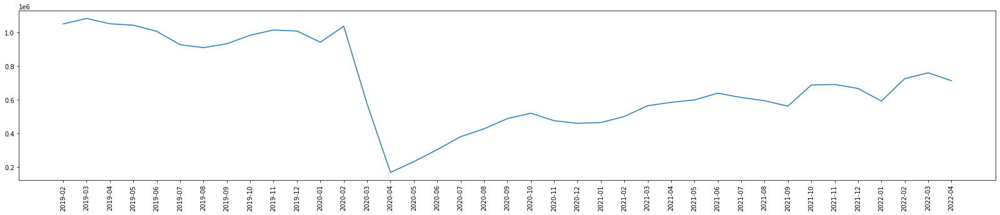

In [6]:
dfsmagg_from_2019_bd = dfsmagg_from_2019.sort_index()

plt.figure(figsize=(28, 5))
plt.xticks(rotation = 90)
plt.plot(dfsmagg_from_2019_bd.index, dfsmagg_from_2019_bd['Trips Per Day'])

## Common

In [66]:
def nyc_import_month(root_path: Path, year: int, month: int):
    name = f"_tripdata_{year}-{month:02d}.parquet"
    data = [
        {'filename': f"yellow{name}", 'dataset': 2, 'origin_col_name': 'PULocationID', 'destination_col_name': 'DOLocationID', 'origin_time_col_name': 'tpep_pickup_datetime', 'destination_time_col_name': 'tpep_dropoff_datetime'},
        {'filename': f"green{name}", 'dataset': 3, 'origin_col_name': 'PULocationID', 'destination_col_name': 'DOLocationID','origin_time_col_name': 'lpep_pickup_datetime', 'destination_time_col_name': 'lpep_dropoff_datetime'},
        {'filename': f"fhv{name}", 'dataset': 4, 'origin_col_name': 'PUlocationID', 'destination_col_name': 'DOlocationID','origin_time_col_name': 'pickup_datetime', 'destination_time_col_name': 'dropOff_datetime'},
        {'filename': f"fhvhv{name}", 'dataset': 5, 'origin_col_name': 'PULocationID', 'destination_col_name': 'DOLocationID','origin_time_col_name': 'pickup_datetime', 'destination_time_col_name': 'dropoff_datetime'}
    ]
    out = []

    for data_source in data:
        print(f"Importing {data_source['filename']}")
        trips = pq.read_table(root_path / Path(data_source['filename'])).to_pandas()
        trips_for_import = pd.DataFrame(trips[[
            data_source['origin_col_name'],
            data_source['destination_col_name'],
            data_source['origin_time_col_name'],
            data_source['destination_time_col_name']
        ]])
        trips_for_import.rename(
            columns={
                data_source['origin_col_name']: "origin",
                data_source['destination_col_name']: "destination",
                data_source['origin_time_col_name']: 'origin_time',
                data_source['destination_time_col_name']: 'destination_time'
            },
            inplace=True
        )
        trips_for_import['dataset'] = data_source['dataset']
        trips_for_import.dropna(inplace=True)
        out.append(trips_for_import)

    return out

## 2022-04

In [67]:
trips = nyc_import_month(Path(r"O:\Backups/AIC backup data\Demand/NYC/2022-04"), 2022, 4)
trips

Importing yellow_tripdata_2022-04.parquet
Importing green_tripdata_2022-04.parquet
Importing fhv_tripdata_2022-04.parquet
Importing fhvhv_tripdata_2022-04.parquet


[         origin  destination         origin_time    destination_time  dataset
 0           163           62 2022-04-01 00:21:13 2022-04-01 00:58:33        2
 1           142          141 2022-04-01 00:07:47 2022-04-01 00:19:12        2
 2            79          148 2022-04-01 00:14:52 2022-04-01 00:23:43        2
 3            79           13 2022-04-01 00:30:02 2022-04-01 00:45:06        2
 4           238          116 2022-04-01 00:48:40 2022-04-01 01:03:34        2
 ...         ...          ...                 ...                 ...      ...
 3599915      80           82 2022-04-30 23:10:00 2022-04-30 23:28:00        2
 3599916      48          264 2022-04-30 23:28:59 2022-04-30 23:46:38        2
 3599917     137          143 2022-04-30 23:27:25 2022-04-30 23:45:00        2
 3599918     141          112 2022-04-30 23:24:26 2022-04-30 23:43:45        2
 3599919      68          144 2022-04-30 23:17:00 2022-04-30 23:31:00        2
 
 [3599920 rows x 5 columns],
        origin  desti

In [70]:
for t in trips:
    print(f'importing {len(t)} trips')
    db.dataframe_to_db_table(t, 'demand')

importing 3599920 trips
importing 76136 trips
importing 311208 trips
importing 17752561 trips


In [65]:
filename = r'O:\Backups/AIC backup data\Demand/NYC/2022-04/fhvhv_tripdata_2022-04.parquet'
pq.read_table(filename).to_pandas()

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,HV0003,B03404,B03404,2022-04-01 00:18:10,2022-04-01 00:23:57,2022-04-01 00:24:06,2022-04-01 00:38:16,230,137,2.63,...,1.37,2.75,0.0,0.0,12.43,N,N,,N,N
1,HV0003,B03404,B03404,2022-04-01 00:40:52,2022-04-01 00:42:09,2022-04-01 00:44:10,2022-04-01 00:51:41,170,237,2.02,...,1.03,2.75,0.0,0.0,8.23,N,N,,N,N
2,HV0003,B03404,B03404,2022-04-01 00:53:46,2022-04-01 00:56:21,2022-04-01 00:56:31,2022-04-01 01:01:55,237,141,0.73,...,0.69,2.75,0.0,1.0,7.29,N,N,,N,N
3,HV0003,B03404,B03404,2022-04-01 00:03:24,2022-04-01 00:06:03,2022-04-01 00:06:30,2022-04-01 00:13:39,198,198,1.10,...,0.73,0.00,0.0,0.0,6.78,N,N,,N,N
4,HV0003,B03404,B03404,2022-04-01 00:13:38,2022-04-01 00:19:27,2022-04-01 00:21:11,2022-04-01 00:32:11,36,177,1.55,...,0.99,0.00,0.0,0.0,9.00,N,N,,N,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17752556,HV0003,B03404,B03404,2022-04-30 23:01:45,2022-04-30 23:05:56,2022-04-30 23:06:12,2022-04-30 23:18:28,78,213,3.19,...,1.34,0.00,0.0,0.0,12.15,N,N,,N,N
17752557,HV0003,B03404,B03404,2022-04-30 23:13:06,2022-04-30 23:21:32,2022-04-30 23:23:12,2022-04-30 23:36:19,213,168,3.65,...,1.60,0.00,0.0,2.0,17.63,N,N,,N,N
17752558,HV0003,B03404,B03404,2022-04-30 23:30:22,2022-04-30 23:38:12,2022-04-30 23:38:45,2022-04-30 23:47:04,159,168,1.62,...,0.94,0.00,0.0,0.0,8.23,N,N,,N,N
17752559,HV0003,B03404,B03404,2022-04-30 23:42:56,2022-04-30 23:48:00,2022-04-30 23:48:17,2022-05-01 00:01:17,168,136,4.76,...,2.07,0.00,0.0,0.0,16.86,N,N,,N,N


### Hourly Stats

In [22]:
sql = r"SELECT extract(hour from origin_time) AS hour, count(id) FROM demand WHERE dataset IN(2, 3, 4, 5) and date(origin_time) = '2022-04-05' GROUP BY extract(hour from origin_time)"
nyc_hourly_stats = db.execute_query_to_pandas(sql)
px.line(nyc_hourly_stats, x='hour', y='count')

## Data 2022-03

In [19]:
# trips_y = pq.read_table(r"O:\Backups\AIC data\Demand/NYC/yellow_tripdata_2013-01.parquet")
# trips_y = pq.read_table(r"D:\AIC backup data\Demand/NYC/yellow_tripdata_2022-03.parquet")
# trips_y = pq.read_table(r"D:\AIC backup data\Demand/NYC/green_tripdata_2022-03.parquet")
# trips_y = pq.read_table(r"D:\AIC backup data\Demand/NYC/fhv_tripdata_2022-03.parquet")
trips_y = pq.read_table(r"D:\AIC backup data\Demand/NYC/fhvhv_tripdata_2022-03.parquet")
trips_y = trips_y.to_pandas()
trips_y

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,HV0003,B03404,B03404,2022-03-01 00:31:18,2022-03-01 00:34:32,2022-03-01 00:35:04,2022-03-01 00:43:48,177,61,1.720,...,0.73,0.00,0.0,3.0,6.62,N,N,,N,N
1,HV0003,B03404,B03404,2022-03-01 00:25:25,2022-03-01 00:27:29,2022-03-01 00:28:42,2022-03-01 00:41:40,114,65,3.270,...,1.34,2.75,0.0,3.0,10.66,N,N,,N,N
2,HV0005,B03406,None,2022-03-01 00:08:50,NaT,2022-03-01 00:14:24,2022-03-01 00:24:46,209,144,1.433,...,1.48,2.75,0.0,0.0,14.69,N,N,N,N,N
3,HV0003,B03404,B03404,2022-03-01 00:01:47,2022-03-01 00:03:18,2022-03-01 00:04:35,2022-03-01 00:22:57,74,134,10.860,...,3.01,0.00,0.0,0.0,22.32,N,N,,N,N
4,HV0003,B03404,B03404,2022-03-01 00:31:55,2022-03-01 00:32:42,2022-03-01 00:33:16,2022-03-01 00:40:13,95,95,1.510,...,0.83,0.00,0.0,3.0,5.44,N,N,,N,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18453543,HV0003,B03404,B03404,2022-03-31 23:47:47,2022-03-31 23:56:24,2022-03-31 23:56:47,2022-04-01 00:09:52,112,233,3.740,...,2.21,2.75,0.0,0.0,11.91,N,N,,N,N
18453544,HV0003,B03404,B03404,2022-03-31 22:56:28,2022-03-31 23:08:34,2022-03-31 23:08:34,2022-03-31 23:22:32,231,158,1.950,...,1.63,2.75,0.0,0.0,22.53,N,N,,N,N
18453545,HV0003,B03404,B03404,2022-03-31 23:22:37,2022-03-31 23:22:50,2022-03-31 23:25:20,2022-03-31 23:33:51,158,48,2.000,...,1.72,2.75,0.0,0.0,20.19,N,N,,N,N
18453546,HV0003,B03404,B03404,2022-03-31 23:45:04,2022-03-31 23:45:17,2022-03-31 23:47:18,2022-04-01 00:01:57,85,91,2.590,...,1.19,0.00,0.0,0.0,12.28,N,N,,N,N


In [20]:
# trips_y_for_import = trips_y.drop(['VendorID', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag', 'PULocationID', 'payment_type', 'fare_amount', 'extra', 'mta_tax'])
# trips_y_for_import = trips_y[['PULocationID', 'DOLocationID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime', 'passenger_count']]
# trips_y_for_import = trips_y[['PUlocationID', 'DOlocationID', 'pickup_datetime', 'dropOff_datetime']]
trips_y_for_import = trips_y[['PULocationID', 'DOLocationID', 'pickup_datetime', 'dropoff_datetime']]
# trips_y_for_import.rename(columns={"PULocationID": "origin", "DOLocationID": "destination", "pickup_datetime": 'origin_time', "dropOff_datetime": 'destination_time'}, inplace=True)
# trips_y_for_import.rename(columns={"PUlocationID": "origin", "DOlocationID": "destination", "pickup_datetime": 'origin_time', "dropOff_datetime": 'destination_time'}, inplace=True)
trips_y_for_import.rename(columns={"PULocationID": "origin", "DOLocationID": "destination", "pickup_datetime": 'origin_time', "dropoff_datetime": 'destination_time'}, inplace=True)
trips_y_for_import['dataset'] = 5
trips_y_for_import.dropna(inplace=True)
trips_y_for_import

13:40:23 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_8588\1906031472.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trips_y_for_import.rename(columns={"PULocationID": "origin", "DOLocationID": "destination", "pickup_datetime": 'origin_time', "dropoff_datetime": 'destination_time'}, inplace=True)

13:40:23 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_8588\1906031472.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trips_y_for_import['dataset'] = 5

13:40:24 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_8588\1906031472.py:9: SettingWith

,origin,destination,origin_time,destination_time,dataset
0,177,61,2022-03-01 00:35:04,2022-03-01 00:43:48,5
1,114,65,2022-03-01 00:28:42,2022-03-01 00:41:40,5
2,209,144,2022-03-01 00:14:24,2022-03-01 00:24:46,5
3,74,134,2022-03-01 00:04:35,2022-03-01 00:22:57,5
4,95,95,2022-03-01 00:33:16,2022-03-01 00:40:13,5
...,...,...,...,...,...
18453543,112,233,2022-03-31 23:56:47,2022-04-01 00:09:52,5
18453544,231,158,2022-03-31 23:08:34,2022-03-31 23:22:32,5
18453545,158,48,2022-03-31 23:25:20,2022-03-31 23:33:51,5
18453546,85,91,2022-03-31 23:47:18,2022-04-01 00:01:57,5


In [21]:
# trips_y_for_import.to_sql('demand', con, if_exists='append', index=False)
db.dataframe_to_db_table(trips_y_for_import, 'demand')

### Update table

In [11]:
trips_y_for_import = trips_y[['PULocationID', 'DOLocationID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime']]
trips_y_for_import.rename(columns={"PULocationID": "origin", "DOLocationID": "destination", "tpep_pickup_datetime": 'origin_time', "tpep_dropoff_datetime": 'destination_time'}, inplace=True)
trips_y_for_import

17:30:43 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_3940\3014112171.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trips_y_for_import.rename(columns={"PULocationID": "origin", "DOLocationID": "destination", "tpep_pickup_datetime": 'origin_time', "tpep_dropoff_datetime": 'destination_time'}, inplace=True)



,origin,destination,origin_time,destination_time
0,90,209,2022-03-01 00:13:08,2022-03-01 00:24:35
1,148,234,2022-03-01 00:47:52,2022-03-01 01:00:08
2,132,249,2022-03-01 00:02:46,2022-03-01 00:46:43
3,211,66,2022-03-01 00:52:43,2022-03-01 01:03:40
4,138,197,2022-03-01 00:15:35,2022-03-01 00:34:13
...,...,...,...,...
3627877,48,262,2022-03-31 23:45:00,2022-04-01 00:01:00
3627878,48,238,2022-03-31 23:59:39,2022-04-01 00:06:09
3627879,48,4,2022-03-31 23:50:00,2022-04-01 00:08:00
3627880,158,68,2022-03-31 23:25:56,2022-03-31 23:32:37


In [12]:
db.dataframe_to_db_table(trips_y_for_import, 'tmp_demand')


In [ ]:
sql = """
    UPDATE demand
    SET destination_time = tmp_demand.destination_time
    FROM tmp_demand
    WHERE demand.origin_time = tmp_demand.origin_time
        AND demand.origin = tmp_demand.origin,
"""

## Daily statistic

In [15]:
sql = r"SELECT date(origin_time), count(id) FROM demand WHERE dataset = 2 and origin_time between '2022-03-01' AND '2022-03-31' GROUP BY date(origin_time)"

In [62]:
nyc_daily_stats = db.execute_query_to_pandas(sql)
nyc_daily_stats

14:49:22 WARNING C:\Program Files\Python310\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(



In [63]:
nyc_daily_stats

,date,count
0,2022-03-01,113947
1,2022-03-02,119863
2,2022-03-03,129290
3,2022-03-04,128505
4,2022-03-05,120368
5,2022-03-06,95853
6,2022-03-07,99695
7,2022-03-08,117165
8,2022-03-09,120056
9,2022-03-10,124861


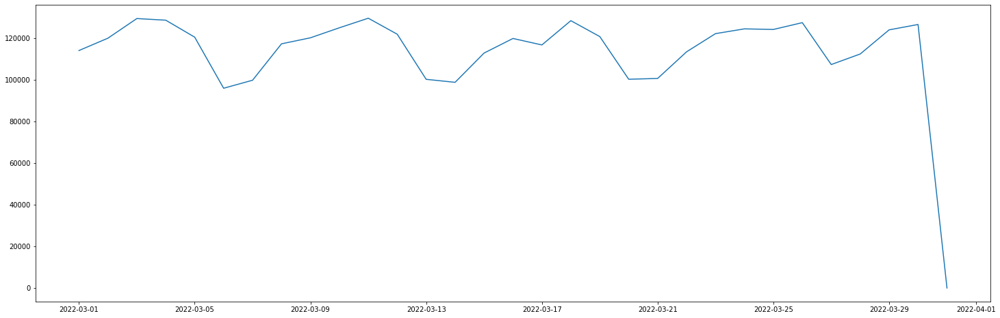

In [66]:
plt.figure(figsize=(25,8))
plt.plot(nyc_daily_stats['date'], nyc_daily_stats['count'])

In [68]:
nyc_daily_stats.sort_values('count')

,date,count
30,2022-03-31,2
5,2022-03-06,95853
13,2022-03-14,98693
6,2022-03-07,99695
12,2022-03-13,100133
19,2022-03-20,100169
20,2022-03-21,100551
26,2022-03-27,107222
27,2022-03-28,112277
14,2022-03-15,112729


## Hourly statistic

In [5]:
sql = r"SELECT extract(hour from origin_time) AS hour, count(id) FROM demand WHERE dataset = 2 and date(origin_time) = '2022-03-11' GROUP BY extract(hour from origin_time)"
nyc_hourly_stats = db.execute_query_to_pandas(sql)
nyc_hourly_stats

,hour,count
0,0.0,3842
1,1.0,2061
2,2.0,1227
3,3.0,697
4,4.0,613
5,5.0,844
6,6.0,2143
7,7.0,3960
8,8.0,5002
9,9.0,5330


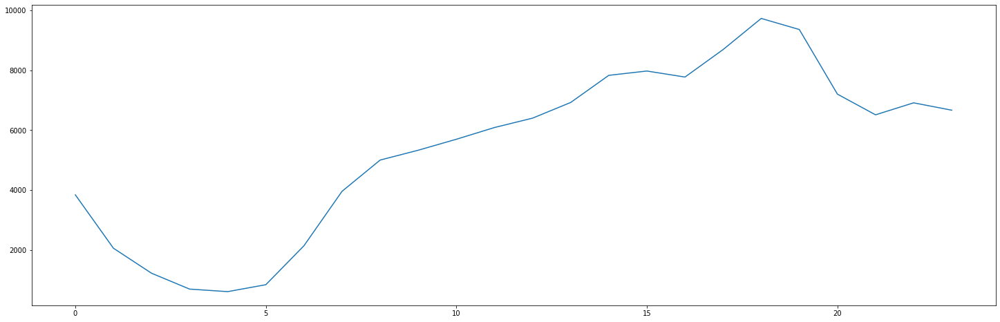

In [7]:
plt.figure(figsize=(25,8))
plt.plot(nyc_hourly_stats['hour'], nyc_hourly_stats['count'])

In [8]:
nyc_hourly_stats.sort_values('count')

,hour,count
4,4.0,613
3,3.0,697
5,5.0,844
2,2.0,1227
1,1.0,2061
6,6.0,2143
0,0.0,3842
7,7.0,3960
8,8.0,5002
9,9.0,5330


## Zones

In [44]:
gdf = gpd.read_file(r'D:\AIC backup data\demand\NYC\zones/geo_export_06f7643a-59de-4990-93ae-1c5671a587ba.shp')
gdf.set_crs(epsg=4326, allow_override=True, inplace=True)
gdf

13:44:13 INFO Failed to auto identify EPSG: 7


,borough,location_i,objectid,shape_area,shape_leng,zone,geometry
0,EWR,1.0,1.0,0.000782,0.116357,Newark Airport,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,Queens,2.0,2.0,0.004866,0.433470,Jamaica Bay,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,Bronx,3.0,3.0,0.000314,0.084341,Allerton/Pelham Gardens,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,Manhattan,4.0,4.0,0.000112,0.043567,Alphabet City,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,Staten Island,5.0,5.0,0.000498,0.092146,Arden Heights,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."
...,...,...,...,...,...,...,...
258,Brooklyn,256.0,256.0,0.000169,0.067915,Williamsburg (South Side),"POLYGON ((-73.95834 40.71331, -73.95681 40.712..."
259,Bronx,259.0,259.0,0.000395,0.126750,Woodlawn/Wakefield,"POLYGON ((-73.85107 40.91037, -73.85207 40.909..."
260,Queens,260.0,260.0,0.000422,0.133514,Woodside,"POLYGON ((-73.90175 40.76078, -73.90147 40.759..."
261,Manhattan,261.0,261.0,0.000034,0.027120,World Trade Center,"POLYGON ((-74.01333 40.70503, -74.01327 40.704..."


In [46]:
gdf_for_insert = gdf.rename(columns={"zone": "name", "geometry": "geom", 'objectid': 'id'})
gdf_for_insert.drop(['location_i', 'shape_area', 'shape_leng', 'borough'], axis=1, inplace=True)
gdf_for_insert['dataset'] = 2
gdf_for_insert['id'] = gdf_for_insert['id'].astype(int)
gdf_for_insert.set_geometry('geom', inplace=True)
gdf_for_insert["geom"] = [MultiPolygon([feature]) if isinstance(feature, Polygon) else feature for feature in gdf_for_insert["geom"]]
gdf_for_insert

,id,name,geom,dataset
0,1,Newark Airport,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ...",2
1,2,Jamaica Bay,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...",2
2,3,Allerton/Pelham Gardens,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ...",2
3,4,Alphabet City,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ...",2
4,5,Arden Heights,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ...",2
...,...,...,...,...
258,256,Williamsburg (South Side),"MULTIPOLYGON (((-73.95834 40.71331, -73.95681 ...",2
259,259,Woodlawn/Wakefield,"MULTIPOLYGON (((-73.85107 40.91037, -73.85207 ...",2
260,260,Woodside,"MULTIPOLYGON (((-73.90175 40.76078, -73.90147 ...",2
261,261,World Trade Center,"MULTIPOLYGON (((-74.01333 40.70503, -74.01327 ...",2


In [47]:
gdf_for_insert.to_postgis('zones', con, if_exists='append')

In [ ]:
gdf_for_insert.geom[0]

## Fleet Size

In [9]:
sql = r"SELECT COUNT(id) FROM demand WHERE dataset = 2 and origin_time BETWEEN '2022-03-11 18:00' AND '2022-03-11 18:15'"
req_count = db.execute_query_to_pandas(sql)
req_count

,count
0,2222


In [42]:
sql = r"SELECT AVG(extract(EPOCH FROM (demand.destination_time - demand.origin_time))) AS avg_duration FROM demand WHERE dataset = 2 and origin_time BETWEEN '2022-03-11 18:00' AND '2022-03-11 18:15'"
avg_time_per_trip = db.execute_query_to_pandas(sql)
avg_time_per_trip = avg_time_per_trip.iloc[0]['avg_duration']
avg_time_per_trip

1078.2650765076507

In [43]:
ridesharing_rate = 2 # avg vehicle occupancy. Estimated.
experiment_length = 15 # length/time horizon of the ridesharing instance

car_count = req_count / ridesharing_rate / max(experiment_length / (avg_time_per_trip / 60), 1)
car_count

,count
0,1111.0


In [40]:
experiment_length / (avg_time_per_trip / 60)

,avg_duration
0,0.834674


## Old vs new demand files

In [5]:
demand_path = Path(r"O:\Backups/AIC backup data\Demand\NYC")
trips_2013_01 = pd.read_parquet(demand_path / "yellow_tripdata_2013-01.parquet")
trips_2013_01

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,2,2013-01-01 00:39:00,2013-01-01 00:55:00,3,3.86,1,None,238,116,2,15.0,0.5,0.5,0.00,0.0,0.0,16.00,None,None
1,2,2013-01-01 00:12:00,2013-01-01 00:16:00,5,0.00,1,None,264,264,1,3.5,0.5,0.5,0.12,0.0,0.0,4.62,None,None
2,2,2013-01-01 00:02:00,2013-01-01 00:03:00,3,0.00,1,None,264,264,1,2.5,0.5,0.5,0.25,0.0,0.0,3.75,None,None
3,2,2013-01-01 00:38:00,2013-01-01 00:38:00,2,0.00,1,None,264,264,2,2.5,0.5,0.5,0.00,0.0,0.0,3.50,None,None
4,2,2013-01-01 00:03:00,2013-01-01 00:04:00,4,0.00,1,None,264,264,1,3.0,0.5,0.5,0.07,0.0,0.0,4.07,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14776612,1,2013-01-31 23:03:02,2013-01-31 23:15:11,1,3.60,1,N,231,170,2,13.0,0.5,0.5,0.00,0.0,0.0,14.00,None,None
14776613,1,2013-01-31 23:23:23,2013-01-31 23:32:57,1,3.40,1,N,229,226,2,12.0,0.5,0.5,0.00,0.0,0.0,13.00,None,None
14776614,1,2013-01-31 23:56:43,2013-02-01 00:08:46,1,4.70,1,N,79,75,1,15.0,0.5,0.5,3.20,0.0,0.0,19.20,None,None
14776615,1,2013-01-31 23:09:42,2013-01-31 23:19:08,1,1.70,1,N,236,41,1,9.0,0.5,0.5,2.00,0.0,0.0,12.00,None,None


In [6]:
trips_2015_01 = pd.read_parquet(demand_path / "yellow_tripdata_2015-01.parquet")
trips_2015_01

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2015-01-01 00:11:33,2015-01-01 00:16:48,1,1.0,1,N,41,166,1,5.7,0.5,0.5,1.40,0.0,0.0,8.40,None,None
1,1,2015-01-01 00:18:24,2015-01-01 00:24:20,1,0.9,1,N,166,238,3,6.0,0.5,0.5,0.00,0.0,0.0,7.30,None,None
2,1,2015-01-01 00:26:19,2015-01-01 00:41:06,1,3.5,1,N,238,162,1,13.2,0.5,0.5,2.90,0.0,0.0,17.40,None,None
3,1,2015-01-01 00:45:26,2015-01-01 00:53:20,1,2.1,1,N,162,263,1,8.2,0.5,0.5,2.37,0.0,0.0,11.87,None,None
4,1,2015-01-01 00:59:21,2015-01-01 01:05:24,1,1.0,1,N,236,141,3,6.0,0.5,0.5,0.00,0.0,0.0,7.30,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12741030,1,2015-01-31 23:21:42,2015-01-31 23:31:00,1,1.6,1,N,90,249,1,8.0,0.5,0.5,2.32,0.0,0.3,11.62,None,None
12741031,1,2015-01-31 23:42:43,2015-01-31 23:49:32,1,0.6,1,N,90,68,1,6.0,0.5,0.5,1.46,0.0,0.3,8.76,None,None
12741032,1,2015-01-31 23:55:16,2015-02-01 00:16:45,1,3.0,1,N,68,148,1,15.0,0.5,0.5,4.07,0.0,0.3,20.37,None,None
12741033,1,2015-01-31 23:20:53,2015-02-01 00:07:35,1,6.9,1,N,189,237,1,32.5,0.5,0.5,6.00,0.0,0.3,39.80,None,None


In [7]:
trips_csv_2015_01 = pd.read_csv(demand_path / "yellow_tripdata_2015-01.csv")
trips_csv_2015_01

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12748981,1,2015-01-10 19:01:44,2015-01-10 19:05:40,2,1.00,-73.951988,40.786217,1,N,-73.953735,40.775162,1,5.5,0.0,0.5,1.25,0.0,0.3,7.55
12748982,1,2015-01-10 19:01:44,2015-01-10 19:07:26,2,0.80,-73.982742,40.728184,1,N,-73.974976,40.720013,1,6.0,0.0,0.5,2.00,0.0,0.3,8.80
12748983,1,2015-01-10 19:01:44,2015-01-10 19:15:01,1,3.40,-73.979324,40.749550,1,N,-73.969101,40.787800,2,13.5,0.0,0.5,0.00,0.0,0.3,14.30
12748984,1,2015-01-10 19:01:44,2015-01-10 19:17:03,1,1.30,-73.999565,40.738483,1,N,-73.981819,40.737652,1,10.5,0.0,0.5,2.25,0.0,0.3,13.55


In [8]:
trips_csv_2015_01['pickup_latitude'].unique()

array([40.75011063, 40.72424316, 40.80278778, ..., 40.64077377,
       40.57663345, 40.57731628])

In [9]:
trips_csv_2016_03 = pd.read_csv(demand_path / "yellow_tripdata_2016-03.csv")
trips_csv_2016_03

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,1,2016-03-01 00:00:00,2016-03-01 00:07:55,1,2.50,-73.976746,40.765152,1,N,-74.004265,40.746128,1,9.0,0.5,0.5,2.05,0.00,0.3,12.35
1,1,2016-03-01 00:00:00,2016-03-01 00:11:06,1,2.90,-73.983482,40.767925,1,N,-74.005943,40.733166,1,11.0,0.5,0.5,3.05,0.00,0.3,15.35
2,2,2016-03-01 00:00:00,2016-03-01 00:31:06,2,19.98,-73.782021,40.644810,1,N,-73.974541,40.675770,1,54.5,0.5,0.5,8.00,0.00,0.3,63.80
3,2,2016-03-01 00:00:00,2016-03-01 00:00:00,3,10.78,-73.863419,40.769814,1,N,-73.969650,40.757767,1,31.5,0.0,0.5,3.78,5.54,0.3,41.62
4,2,2016-03-01 00:00:00,2016-03-01 00:00:00,5,30.43,-73.971741,40.792183,3,N,-74.177170,40.695053,1,98.0,0.0,0.0,0.00,15.50,0.3,113.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12210947,1,2016-03-31 16:34:36,2016-03-31 16:34:36,1,0.00,0.000000,0.000000,1,Y,0.000000,0.000000,2,19.0,1.0,0.5,0.00,0.00,0.3,20.80
12210948,1,2016-03-26 03:02:32,2016-06-14 18:47:55,1,0.40,-73.977356,40.774471,1,N,-73.982536,40.772408,1,4.0,1.0,0.5,1.70,0.00,0.3,7.50
12210949,1,2016-03-20 08:43:59,2016-06-27 15:05:01,1,20.20,0.000000,0.000000,2,N,-74.008614,40.710987,1,52.0,0.0,0.5,6.00,5.54,0.3,64.34
12210950,1,2016-03-20 08:49:47,2016-06-28 19:11:27,1,15.40,-73.790077,40.647377,1,N,-73.971756,40.578457,1,42.5,1.0,0.5,5.00,0.00,0.3,49.30


In [10]:
trips_csv_2016_03['pickup_latitude'].unique()

array([40.76515198, 40.76792526, 40.64480972, ..., 40.65264511,
       40.86123276, 40.65416718])

In [11]:
trips_csv_2016_11 = pd.read_csv(demand_path / "yellow_tripdata_2016-11.csv")
trips_csv_2016_11

VendorID  tpep_pickup_datetime  \
2 2016-11-01 00:00:00  2016-11-01 00:17:01                     1   
  2016-11-01 00:00:00  2016-11-01 00:00:00                     1   
  2016-11-01 00:00:00  2016-11-01 00:00:00                     1   
  2016-11-01 00:00:00  2016-11-01 00:00:00                     1   
  2016-11-01 00:00:00  2016-11-01 00:00:00                     1   
...                                    ...                   ...   
  2016-11-30 23:59:59  2016-12-01 00:12:38                     1   
  2016-11-30 23:59:59  2016-12-01 00:21:11                     1   
  2016-11-30 23:59:59  2016-12-01 00:11:40                     1   
  2016-11-30 23:59:59  2016-12-01 00:05:55                     1   
  2016-11-30 23:59:59  2016-12-01 00:08:40                     1   

                       tpep_dropoff_datetime  passenger_count trip_distance  \
2 2016-11-01 00:00:00                   4.36                1             N   
  2016-11-01 00:00:00                   0.68                1             N   
  2016-11-01 00:00:00                  16.75                2             N   
  2016-11-01 00:00:00                   2.55                1             N   
  2016-11-01 00:00:00                   0.40                1             N   
...                                      ...              ...           ...   
  2016-11-30 23:59:59                   6.35                5             N   
  2016-11-30 23:59:59                   3.82                1             N   
  2016-11-30 23:59:59                   2.21                1             N   
  2016-11-30 23:59:59                   1.11                1             N   
  2016-11-30 23:59:59                   1.34                1             N   

                       RatecodeID  store_and_fwd_flag  PULocationID  \
2 2016-11-01 00:00:00          90                 262             1   
  2016-11-01 00:00:00         140                 237             1   
  2016-11-01 00:00:00         132                 170             1   
  2016-11-01 00:00:00         186                 231             1   
  2016-11-01 00:00:00         162                 164             1   
...                           ...                 ...           ...   
  2016-11-30 23:59:59          48                 265             1   
  2016-11-30 23:59:59         144                  48             2   
  2016-11-30 23:59:59         107                 158             1   
  2016-11-30 23:59:59         113                  79             2   
  2016-11-30 23:59:59         163                 142             1   

                       DOLocationID  payment_type  fare_amount  extra  \
2 2016-11-01 00:00:00          15.5           0.5          0.5   3.36   
  2016-11-01 00:00:00           6.5           1.0          0.5   1.24   
  2016-11-01 00:00:00          52.0           4.5          0.5  12.57   
  2016-11-01 00:00:00          11.5           1.0          0.5   0.00   
  2016-11-01 00:00:00           5.5           1.0          0.5   0.00   
...                             ...           ...          ...    ...   
  2016-11-30 23:59:59          50.0           0.0          0.5  12.26   
  2016-11-30 23:59:59          16.0           0.5          0.5   0.00   
  2016-11-30 23:59:59          10.0           0.5          0.5   2.26   
  2016-11-30 23:59:59           6.0           0.5          0.5   0.00   
  2016-11-30 23:59:59           7.5           0.5          0.5   1.00   

                       mta_tax  tip_amount  tolls_amount  \
2 2016-11-01 00:00:00     0.00         0.3         20.16   
  2016-11-01 00:00:00     0.00         0.3          9.54   
  2016-11-01 00:00:00     5.54         0.3         75.41   
  2016-11-01 00:00:00     0.00         0.3         13.30   
  2016-11-01 00:00:00     0.00         0.3          7.30   
...                        ...         ...           ...   
  2016-11-30 23:59:59    10.50         0.3         73.56   
  2016-11-30 23:59:59     0.00         0.3         17.30  

In [12]:
trips_csv_2016_07 = pd.read_csv(demand_path / "yellow_tripdata_2016-07.csv")
trips_csv_2016_07

VendorID  tpep_pickup_datetime  \
1 2016-07-10 06:56:05  2016-07-10 06:59:53                     1   
2 2016-07-10 10:50:18  2016-07-10 10:55:21                     5   
  2016-07-10 10:50:18  2016-07-10 11:08:38                     1   
1 2016-07-10 10:50:19  2016-07-10 10:55:14                     1   
  2016-07-10 10:50:19  2016-07-10 10:55:47                     1   
...                                    ...                   ...   
2 2016-07-28 21:13:46  2016-07-28 21:34:57                     1   
  2016-07-28 21:13:46  2016-07-28 21:23:01                     1   
  2016-07-28 21:13:46  2016-07-28 21:36:03                     1   
  2016-07-28 21:13:47  2016-07-28 21:22:19                     5   
  2016-07-28 21:13:48  2016-07-28 21:29:49                     5   

                       tpep_dropoff_datetime  passenger_count trip_distance  \
1 2016-07-10 06:56:05                   0.50                1             N   
2 2016-07-10 10:50:18                   1.34                1             N   
  2016-07-10 10:50:18                   9.48                1             N   
1 2016-07-10 10:50:19                   1.00                1             N   
  2016-07-10 10:50:19                   0.90                1             N   
...                                      ...              ...           ...   
2 2016-07-28 21:13:46                  11.74                1             N   
  2016-07-28 21:13:46                   1.29                1             N   
  2016-07-28 21:13:46                   2.55                1             N   
  2016-07-28 21:13:47                   1.45                1             N   
  2016-07-28 21:13:48                   2.06                1             N   

                       RatecodeID  store_and_fwd_flag  PULocationID  \
1 2016-07-10 06:56:05         263                 236             1   
2 2016-07-10 10:50:18         142                 163             1   
  2016-07-10 10:50:18          74                  66             1   
1 2016-07-10 10:50:19         264                 264             2   
  2016-07-10 10:50:19          48                  68             2   
...                           ...                 ...           ...   
2 2016-07-28 21:13:46         138                 132             2   
  2016-07-28 21:13:46         249                 186             2   
  2016-07-28 21:13:46         148                 158             1   
  2016-07-28 21:13:47          48                 161             1   
  2016-07-28 21:13:48         231                  79             1   

                       DOLocationID  payment_type  fare_amount  extra  \
1 2016-07-10 06:56:05           4.5           1.0          0.5   2.70   
2 2016-07-10 10:50:18           6.0           0.0          0.5   1.36   
  2016-07-10 10:50:18          27.0           0.0          0.5   0.00   
1 2016-07-10 10:50:19           5.5           0.0          0.5   0.00   
  2016-07-10 10:50:19           5.5           0.0          0.5   0.00   
...                             ...           ...          ...    ...   
2 2016-07-28 21:13:46          32.5           0.5          0.5   0.00   
  2016-07-28 21:13:46           8.0           0.5          0.5   0.00   
  2016-07-28 21:13:46          15.5           0.5          0.5   1.00   
  2016-07-28 21:13:47           7.5           0.5          0.5   1.00   
  2016-07-28 21:13:48          11.5           0.5          0.5   2.56   

                       mta_tax  tip_amount  tolls_amount  \
1 2016-07-10 06:56:05      0.0         0.3          9.00   
2 2016-07-10 10:50:18      0.0         0.3          8.16   
  2016-07-10 10:50:18      0.0         0.3         27.80   
1 2016-07-10 10:50:19      0.0         0.3          6.30   
  2016-07-10 10:50:19      0.0         0.3          6.30   
...                        ...         ...           ...   
2 2016-07-28 21:13:46      0.0         0.3         33.80   
  2016-07-28 21:13:46      0.0         0.3          9.30  

# Chicago

## Zones

## Comunity areas

In [49]:
gdf = gpd.read_file(r'D:\AIC backup data\demand\Chicago\zones/Comunity areas/')
gdf.set_crs(epsg=4326, allow_override=True, inplace=True)
gdf

13:50:56 INFO Failed to auto identify EPSG: 7


,area,area_num_1,area_numbe,comarea,comarea_id,community,perimeter,shape_area,shape_len,geometry
0,0.0,35,35,0.0,0.0,DOUGLAS,0.0,4.600462e+07,31027.054510,"POLYGON ((-87.60914 41.84469, -87.60915 41.844..."
1,0.0,36,36,0.0,0.0,OAKLAND,0.0,1.691396e+07,19565.506153,"POLYGON ((-87.59215 41.81693, -87.59231 41.816..."
2,0.0,37,37,0.0,0.0,FULLER PARK,0.0,1.991670e+07,25339.089750,"POLYGON ((-87.62880 41.80189, -87.62879 41.801..."
3,0.0,38,38,0.0,0.0,GRAND BOULEVARD,0.0,4.849250e+07,28196.837157,"POLYGON ((-87.60671 41.81681, -87.60670 41.816..."
4,0.0,39,39,0.0,0.0,KENWOOD,0.0,2.907174e+07,23325.167906,"POLYGON ((-87.59215 41.81693, -87.59215 41.816..."
...,...,...,...,...,...,...,...,...,...,...
72,0.0,74,74,0.0,0.0,MOUNT GREENWOOD,0.0,7.558429e+07,48665.130539,"POLYGON ((-87.69646 41.70714, -87.69644 41.706..."
73,0.0,75,75,0.0,0.0,MORGAN PARK,0.0,9.187734e+07,46396.419362,"POLYGON ((-87.64215 41.68508, -87.64249 41.685..."
74,0.0,76,76,0.0,0.0,OHARE,0.0,3.718356e+08,173625.984660,"MULTIPOLYGON (((-87.83658 41.98640, -87.83658 ..."
75,0.0,77,77,0.0,0.0,EDGEWATER,0.0,4.844999e+07,31004.830946,"POLYGON ((-87.65456 41.99817, -87.65456 41.998..."


In [51]:
gdf_for_insert = gdf[['geometry', 'area_num_1', 'community']]
gdf_for_insert.rename(columns={"geometry": "geom", 'area_num_1': 'id', 'community': 'name'}, inplace=True)
gdf_for_insert['dataset'] = 3
gdf_for_insert['level'] = 0
gdf_for_insert.set_geometry('geom', inplace=True)
gdf_for_insert["geom"] = [MultiPolygon([feature]) if isinstance(feature, Polygon) else feature for feature in gdf_for_insert["geom"]]
gdf_for_insert

14:04:31 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_23144\1315370611.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf_for_insert.rename(columns={"geometry": "geom", 'area_num_1': 'id', 'community': 'name'}, inplace=True)

14:04:31 WARNING C:\Program Files\Python310\lib\site-packages\geopandas\geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)

14:04:31 WARNING C:\Program Files\Python310\lib\site-packages\geopandas\geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy o

,geom,id,name,dataset,level
0,"MULTIPOLYGON (((-87.60914 41.84469, -87.60915 ...",35,DOUGLAS,3,0
1,"MULTIPOLYGON (((-87.59215 41.81693, -87.59231 ...",36,OAKLAND,3,0
2,"MULTIPOLYGON (((-87.62880 41.80189, -87.62879 ...",37,FULLER PARK,3,0
3,"MULTIPOLYGON (((-87.60671 41.81681, -87.60670 ...",38,GRAND BOULEVARD,3,0
4,"MULTIPOLYGON (((-87.59215 41.81693, -87.59215 ...",39,KENWOOD,3,0
...,...,...,...,...,...
72,"MULTIPOLYGON (((-87.69646 41.70714, -87.69644 ...",74,MOUNT GREENWOOD,3,0
73,"MULTIPOLYGON (((-87.64215 41.68508, -87.64249 ...",75,MORGAN PARK,3,0
74,"MULTIPOLYGON (((-87.83658 41.98640, -87.83658 ...",76,OHARE,3,0
75,"MULTIPOLYGON (((-87.65456 41.99817, -87.65456 ...",77,EDGEWATER,3,0


In [52]:
gdf_for_insert.to_postgis('zones', con, if_exists='append')

## Census Tracts

In [54]:
gdf = gpd.read_file(r'D:\AIC backup data\demand\Chicago\zones/Census tracts/')
gdf.set_crs(epsg=4326, allow_override=True, inplace=True)
gdf

14:06:05 INFO Failed to auto identify EPSG: 7


,census_t_1,census_tra,data_admin,objectid,perimeter,shape_area,shape_len,tract_ce_1,tract_ce_2,tract_ce_3,tract_cens,tract_cent,tract_comm,date_tract,time_tract,tract_crea,tract_fips,tract_numa,geometry
0,17031720500,720500,0.0,1.0,0.0,1.122820e+07,14047.050709,1.834962e+06,-87.689107,41.702834,2000.0,1.160172e+06,72,None,None,None,17031,36.0,"POLYGON ((-87.69149 41.70636, -87.69148 41.706..."
1,17031730200,730200,0.0,2.0,0.0,2.019934e+07,19738.525071,1.843710e+06,-87.653538,41.726636,2000.0,1.169816e+06,73,None,None,None,17031,113.0,"POLYGON ((-87.64651 41.73253, -87.64656 41.732..."
2,17031730300,730300,0.0,3.0,0.0,3.170253e+06,9848.214068,1.843978e+06,-87.664527,41.727436,2000.0,1.166814e+06,73,None,None,None,17031,22.0,"POLYGON ((-87.66333 41.72120, -87.66345 41.721..."
3,17031740100,740100,0.0,4.0,0.0,9.690786e+06,18058.372253,1.832915e+06,-87.698582,41.697269,2000.0,1.157599e+06,74,None,None,None,17031,45.0,"POLYGON ((-87.69646 41.70714, -87.69644 41.706..."
4,17031710500,710500,0.0,5.0,0.0,8.038190e+06,12094.288927,1.851289e+06,-87.670770,41.747534,2000.0,1.165054e+06,71,None,None,None,17031,33.0,"POLYGON ((-87.66339 41.74848, -87.66335 41.746..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,17031500200,500200,0.0,871.0,0.0,2.255428e+07,20304.368277,1.834448e+06,-87.600093,41.700889,2000.0,1.184485e+06,50,None,None,None,17031,28.0,"POLYGON ((-87.59792 41.69306, -87.59804 41.692..."
874,17031390600,390600,0.0,872.0,0.0,3.498344e+06,7870.626856,1.872771e+06,-87.594348,41.806022,2000.0,1.185725e+06,39,None,None,None,17031,12.0,"POLYGON ((-87.59639 41.80237, -87.59671 41.802..."
875,17031400800,400800,0.0,877.0,0.0,5.309753e+06,9299.146430,1.864272e+06,-87.620558,41.782863,2000.0,1.178649e+06,40,None,None,None,17031,15.0,"POLYGON ((-87.61576 41.78555, -87.61575 41.785..."
876,17031010400,010400,0.0,873.0,0.0,5.868951e+06,14845.153239,1.945048e+06,-87.659122,42.004765,2000.0,1.167496e+06,1,None,None,None,17031,20.0,"POLYGON ((-87.65893 42.00976, -87.65890 42.009..."


In [58]:
gdf_for_insert = gdf[['geometry', 'census_t_1']]
gdf_for_insert.rename(columns={"geometry": "geom", 'census_t_1': 'id'}, inplace=True)
gdf_for_insert['dataset'] = 3
gdf_for_insert['level'] = 1
gdf_for_insert.set_geometry('geom', inplace=True)
gdf_for_insert["geom"] = [MultiPolygon([feature]) if isinstance(feature, Polygon) else feature for feature in gdf_for_insert["geom"]]
gdf_for_insert

14:12:28 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_23144\1877594627.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf_for_insert.rename(columns={"geometry": "geom", 'census_t_1': 'id'}, inplace=True)

14:12:28 WARNING C:\Program Files\Python310\lib\site-packages\geopandas\geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)

14:12:28 WARNING C:\Program Files\Python310\lib\site-packages\geopandas\geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

,geom,id,dataset,level
0,"MULTIPOLYGON (((-87.69149 41.70636, -87.69148 ...",17031720500,3,1
1,"MULTIPOLYGON (((-87.64651 41.73253, -87.64656 ...",17031730200,3,1
2,"MULTIPOLYGON (((-87.66333 41.72120, -87.66345 ...",17031730300,3,1
3,"MULTIPOLYGON (((-87.69646 41.70714, -87.69644 ...",17031740100,3,1
4,"MULTIPOLYGON (((-87.66339 41.74848, -87.66335 ...",17031710500,3,1
...,...,...,...,...
873,"MULTIPOLYGON (((-87.59792 41.69306, -87.59804 ...",17031500200,3,1
874,"MULTIPOLYGON (((-87.59639 41.80237, -87.59671 ...",17031390600,3,1
875,"MULTIPOLYGON (((-87.61576 41.78555, -87.61575 ...",17031400800,3,1
876,"MULTIPOLYGON (((-87.65893 42.00976, -87.65890 ...",17031010400,3,1


In [59]:
gdf_for_insert.to_postgis('zones', con, if_exists='append')

## Censtus Tracks Illinois

In [3]:
gdf = gpd.read_file(r'D:\AIC backup data\demand\Illinois')
gdf.set_crs(epsg=4326, allow_override=True, inplace=True)
gdf

,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,17,031,843800,1400000US17031843800,17031843800,8438,CT,1309516,0,"POLYGON ((-87.64554 41.80886, -87.64068 41.808..."
1,17,037,001002,1400000US17037001002,17037001002,10.02,CT,3477252,16983,"POLYGON ((-88.79317 41.93313, -88.79257 41.933..."
2,17,031,243000,1400000US17031243000,17031243000,2430,CT,324548,0,"POLYGON ((-87.68195 41.89583, -87.67950 41.895..."
3,17,031,250600,1400000US17031250600,17031250600,2506,CT,647765,0,"POLYGON ((-87.77560 41.90925, -87.77536 41.909..."
4,17,031,251700,1400000US17031251700,17031251700,2517,CT,486655,0,"POLYGON ((-87.74826 41.89498, -87.74645 41.895..."
...,...,...,...,...,...,...,...,...,...,...
3116,17,031,381900,1400000US17031381900,17031381900,3819,CT,172690,0,"POLYGON ((-87.61645 41.80392, -87.61650 41.805..."
3117,17,145,030400,1400000US17145030400,17145030400,304,CT,60677065,3437183,"POLYGON ((-89.32514 38.04903, -89.32188 38.054..."
3118,17,021,958100,1400000US17021958100,17021958100,9581,CT,372645031,97375,"POLYGON ((-89.44362 39.68395, -89.42505 39.683..."
3119,17,023,060100,1400000US17023060100,17023060100,601,CT,721189127,7344420,"POLYGON ((-87.84733 39.44021, -87.82407 39.440..."


In [27]:
gdf_for_insert = gdf[['geometry', 'GEOID']]
gdf_for_insert.rename(columns={"geometry": "geom", 'GEOID': 'id'}, inplace=True)
gdf_for_insert['type'] = 1
gdf_for_insert.set_geometry('geom', inplace=True)
gdf_for_insert["geom"] = [MultiPolygon([feature]) if isinstance(feature, Polygon) else feature for feature in gdf_for_insert["geom"]]
gdf_for_insert

14:28:18 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_16708\1742166696.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf_for_insert.rename(columns={"geometry": "geom", 'GEOID': 'id'}, inplace=True)

14:28:18 WARNING C:\Program Files\Python310\lib\site-packages\geopandas\geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)

14:28:19 WARNING C:\Program Files\Python310\lib\site-packages\geopandas\geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

,geom,id,type
0,"MULTIPOLYGON (((-87.64554 41.80886, -87.64068 ...",17031843800,1
1,"MULTIPOLYGON (((-88.79317 41.93313, -88.79257 ...",17037001002,1
2,"MULTIPOLYGON (((-87.68195 41.89583, -87.67950 ...",17031243000,1
3,"MULTIPOLYGON (((-87.77560 41.90925, -87.77536 ...",17031250600,1
4,"MULTIPOLYGON (((-87.74826 41.89498, -87.74645 ...",17031251700,1
...,...,...,...
3116,"MULTIPOLYGON (((-87.61645 41.80392, -87.61650 ...",17031381900,1
3117,"MULTIPOLYGON (((-89.32514 38.04903, -89.32188 ...",17145030400,1
3118,"MULTIPOLYGON (((-89.44362 39.68395, -89.42505 ...",17021958100,1
3119,"MULTIPOLYGON (((-87.84733 39.44021, -87.82407 ...",17023060100,1


In [38]:
meta = sqlalchemy.MetaData()
zone_table = geoalchemy2.Table('zones', meta, autoload_with=db._sqlalchemy_engine)
insert_statement = sqlalchemy.dialects.postgresql.insert(zone_table).on_conflict_do_nothing()

In [48]:
list_to_insert = [{'id': id, 'geom': geoalchemy2.shape.from_shape(geo, srid=4326), 'type': type} for id, geo, type in zip(gdf_for_insert.id, gdf_for_insert.geom, gdf_for_insert['type'])]
list_to_insert[0]

{'id': '17031843800',
 'geom': <WKBElement at 0x1f106126860; 0106000000010000000103000000010000000a000000d1949d7e50e955c0b47405db88e74440f90e7ee200e955c0530438bd8be744405da10f96b1e855c0d47abfd18ee744408fa7e507aee855c08a01124da0e64440c1c760c5a9e855c01cb28174b1e544408b6b7c26fbe855c00caf2479aee54440fd2b2b4d4ae955c0dd921cb0abe54440c6681d554de955c0997ff44d9ae64440d79fc4e74ee955c04413286211e74440d1949d7e50e955c0b47405db88e74440>,
 'type': 1}

In [49]:
db._sqlalchemy_engine.execute(insert_statement, list_to_insert)

In [40]:
insert_statement

In [26]:
# gdf_for_insert.to_postgis('zones', db._sqlalchemy_engine, if_exists='append')
gdf_for_insert.to_sql('zones', db._sqlalchemy_engine, if_exists='append', method=insert_on_duplicate, dtype={'geom': geoalchemy2.Geometry('Multipolygon', srid=4326)})

ProgrammingError: (psycopg2.errors.UndefinedColumn) column "index" of relation "zones" does not exist
LINE 1: INSERT INTO zones (index, geom, id, type) VALUES (0, ST_Geom...
                           ^

[SQL: INSERT INTO zones (index, geom, id, type) VALUES (%(index_m0)s, ST_GeomFromEWKT(%(geom_m0)s), %(id_m0)s, %(type_m0)s), (%(index_m1)s, ST_GeomFromEWKT(%(geom_m1)s), %(id_m1)s, %(type_m1)s), (%(index_m2)s, ST_GeomFromEWKT(%(geom_m2)s), %(id_m2)s, %(type_m2)s), (%(index_m3)s, ST_GeomFromEWKT(%(geom_m3)s), %(id_m3)s, %(type_m3)s), (%(index_m4)s, ST_GeomFromEWKT(%(geom_m4)s), %(id_m4)s, %(type_m4)s), (%(index_m5)s, ST_GeomFromEWKT(%(geom_m5)s), %(id_m5)s, %(type_m5)s), (%(index_m6)s, ST_GeomFromEWKT(%(geom_m6)s), %(id_m6)s, %(type_m6)s), (%(index_m7)s, ST_GeomFromEWKT(%(geom_m7)s), %(id_m7)s, %(type_m7)s), (%(index_m8)s, ST_GeomFromEWKT(%(geom_m8)s), %(id_m8)s, %(type_m8)s), (%(index_m9)s, ST_GeomFromEWKT(%(geom_m9)s), %(id_m9)s, %(type_m9)s), (%(index_m10)s, ST_GeomFromEWKT(%(geom_m10)s), %(id_m10)s, %(type_m10)s), (%(index_m11)s, ST_GeomFromEWKT(%(geom_m11)s), %(id_m11)s, %(type_m11)s), (%(index_m12)s, ST_GeomFromEWKT(%(geom_m12)s), %(id_m12)s, %(type_m12)s), (%(index_m13)s, ST_GeomFromEWKT(%(geom_m13)s), %(id_m13)s, %(type_m13)s), (%(index_m14)s, ST_GeomFromEWKT(%(geom_m14)s), %(id_m14)s, %(type_m14)s), (%(index_m15)s, ST_GeomFromEWKT(%(geom_m15)s), %(id_m15)s, %(type_m15)s), (%(index_m16)s, ST_GeomFromEWKT(%(geom_m16)s), %(id_m16)s, %(type_m16)s), (%(index_m17)s, ST_GeomFromEWKT(%(geom_m17)s), %(id_m17)s, %(type_m17)s), (%(index_m18)s, ST_GeomFromEWKT(%(geom_m18)s), %(id_m18)s, %(type_m18)s), (%(index_m19)s, ST_GeomFromEWKT(%(geom_m19)s), %(id_m19)s, %(type_m19)s), (%(index_m20)s, ST_GeomFromEWKT(%(geom_m20)s), %(id_m20)s, %(type_m20)s), (%(index_m21)s, ST_GeomFromEWKT(%(geom_m21)s), %(id_m21)s, %(type_m21)s), (%(index_m22)s, ST_GeomFromEWKT(%(geom_m22)s), %(id_m22)s, %(type_m22)s), (%(index_m23)s, ST_GeomFromEWKT(%(geom_m23)s), %(id_m23)s, %(type_m23)s), (%(index_m24)s, ST_GeomFromEWKT(%(geom_m24)s), %(id_m24)s, %(type_m24)s), (%(index_m25)s, ST_GeomFromEWKT(%(geom_m25)s), %(id_m25)s, %(type_m25)s), (%(index_m26)s, ST_GeomFromEWKT(%(geom_m26)s), %(id_m26)s, %(type_m26)s), (%(index_m27)s, ST_GeomFromEWKT(%(geom_m27)s), %(id_m27)s, %(type_m27)s), (%(index_m28)s, ST_GeomFromEWKT(%(geom_m28)s), %(id_m28)s, %(type_m28)s), (%(index_m29)s, ST_GeomFromEWKT(%(geom_m29)s), %(id_m29)s, %(type_m29)s), (%(index_m30)s, ST_GeomFromEWKT(%(geom_m30)s), %(id_m30)s, %(type_m30)s), (%(index_m31)s, ST_GeomFromEWKT(%(geom_m31)s), %(id_m31)s, %(type_m31)s), (%(index_m32)s, ST_GeomFromEWKT(%(geom_m32)s), %(id_m32)s, %(type_m32)s), (%(index_m33)s, ST_GeomFromEWKT(%(geom_m33)s), %(id_m33)s, %(type_m33)s), (%(index_m34)s, ST_GeomFromEWKT(%(geom_m34)s), %(id_m34)s, %(type_m34)s), (%(index_m35)s, ST_GeomFromEWKT(%(geom_m35)s), %(id_m35)s, %(type_m35)s), (%(index_m36)s, ST_GeomFromEWKT(%(geom_m36)s), %(id_m36)s, %(type_m36)s), (%(index_m37)s, ST_GeomFromEWKT(%(geom_m37)s), %(id_m37)s, %(type_m37)s), (%(index_m38)s, ST_GeomFromEWKT(%(geom_m38)s), %(id_m38)s, %(type_m38)s), (%(index_m39)s, ST_GeomFromEWKT(%(geom_m39)s), %(id_m39)s, %(type_m39)s), (%(index_m40)s, ST_GeomFromEWKT(%(geom_m40)s), %(id_m40)s, %(type_m40)s), (%(index_m41)s, ST_GeomFromEWKT(%(geom_m41)s), %(id_m41)s, %(type_m41)s), (%(index_m42)s, ST_GeomFromEWKT(%(geom_m42)s), %(id_m42)s, %(type_m42)s), (%(index_m43)s, ST_GeomFromEWKT(%(geom_m43)s), %(id_m43)s, %(type_m43)s), (%(index_m44)s, ST_GeomFromEWKT(%(geom_m44)s), %(id_m44)s, %(type_m44)s), (%(index_m45)s, ST_GeomFromEWKT(%(geom_m45)s), %(id_m45)s, %(type_m45)s), (%(index_m46)s, ST_GeomFromEWKT(%(geom_m46)s), %(id_m46)s, %(type_m46)s), (%(index_m47)s, ST_GeomFromEWKT(%(geom_m47)s), %(id_m47)s, %(type_m47)s), (%(index_m48)s, ST_GeomFromEWKT(%(geom_m48)s), %(id_m48)s, %(type_m48)s), (%(index_m49)s, ST_GeomFromEWKT(%(geom_m49)s), %(id_m49)s, %(type_m49)s), (%(index_m50)s, ST_GeomFromEWKT(%(geom_m50)s), %(id_m50)s, %(type_m50)s), (%(index_m51)s, ST_GeomFromEWKT(%(geom_m51)s), %(id_m51)s, %(type_m51)s), (%(index_m52)s, ST_GeomFromEWKT(%(geom_m52)s), %(id_m52)s, %(type_m52)s), (%(index_m53)s, ST_GeomFromEWKT(%(geom_m53)s), %(id_m53)s, %(type_m53)s), (%(index_m54)s, ST_GeomFromEWKT(%(geom_m54)s), %(id_m54)s, %(type_m54)s), (%(index_m55)s, ST_GeomFromEWKT(%(geom_m55)s), %(id_m55)s, %(type_m55)s), (%(index_m56)s, ST_GeomFromEWKT(%(geom_m56)s), %(id_m56)s, %(type_m56)s), (%(index_m57)s, ST_GeomFromEWKT(%(geom_m57)s), %(id_m57)s, %(type_m57)s), (%(index_m58)s, ST_GeomFromEWKT(%(geom_m58)s), %(id_m58)s, %(type_m58)s), (%(index_m59)s, ST_GeomFromEWKT(%(geom_m59)s), %(id_m59)s, %(type_m59)s), (%(index_m60)s, ST_GeomFromEWKT(%(geom_m60)s), %(id_m60)s, %(type_m60)s), (%(index_m61)s, ST_GeomFromEWKT(%(geom_m61)s), %(id_m61)s, %(type_m61)s), (%(index_m62)s, ST_GeomFromEWKT(%(geom_m62)s), %(id_m62)s, %(type_m62)s), (%(index_m63)s, ST_GeomFromEWKT(%(geom_m63)s), %(id_m63)s, %(type_m63)s), (%(index_m64)s, ST_GeomFromEWKT(%(geom_m64)s), %(id_m64)s, %(type_m64)s), (%(index_m65)s, ST_GeomFromEWKT(%(geom_m65)s), %(id_m65)s, %(type_m65)s), (%(index_m66)s, ST_GeomFromEWKT(%(geom_m66)s), %(id_m66)s, %(type_m66)s), (%(index_m67)s, ST_GeomFromEWKT(%(geom_m67)s), %(id_m67)s, %(type_m67)s), (%(index_m68)s, ST_GeomFromEWKT(%(geom_m68)s), %(id_m68)s, %(type_m68)s), (%(index_m69)s, ST_GeomFromEWKT(%(geom_m69)s), %(id_m69)s, %(type_m69)s), (%(index_m70)s, ST_GeomFromEWKT(%(geom_m70)s), %(id_m70)s, %(type_m70)s), (%(index_m71)s, ST_GeomFromEWKT(%(geom_m71)s), %(id_m71)s, %(type_m71)s), (%(index_m72)s, ST_GeomFromEWKT(%(geom_m72)s), %(id_m72)s, %(type_m72)s), (%(index_m73)s, ST_GeomFromEWKT(%(geom_m73)s), %(id_m73)s, %(type_m73)s), (%(index_m74)s, ST_GeomFromEWKT(%(geom_m74)s), %(id_m74)s, %(type_m74)s), (%(index_m75)s, ST_GeomFromEWKT(%(geom_m75)s), %(id_m75)s, %(type_m75)s), (%(index_m76)s, ST_GeomFromEWKT(%(geom_m76)s), %(id_m76)s, %(type_m76)s), (%(index_m77)s, ST_GeomFromEWKT(%(geom_m77)s), %(id_m77)s, %(type_m77)s), (%(index_m78)s, ST_GeomFromEWKT(%(geom_m78)s), %(id_m78)s, %(type_m78)s), (%(index_m79)s, ST_GeomFromEWKT(%(geom_m79)s), %(id_m79)s, %(type_m79)s), (%(index_m80)s, ST_GeomFromEWKT(%(geom_m80)s), %(id_m80)s, %(type_m80)s), (%(index_m81)s, ST_GeomFromEWKT(%(geom_m81)s), %(id_m81)s, %(type_m81)s), (%(index_m82)s, ST_GeomFromEWKT(%(geom_m82)s), %(id_m82)s, %(type_m82)s), (%(index_m83)s, ST_GeomFromEWKT(%(geom_m83)s), %(id_m83)s, %(type_m83)s), (%(index_m84)s, ST_GeomFromEWKT(%(geom_m84)s), %(id_m84)s, %(type_m84)s), (%(index_m85)s, ST_GeomFromEWKT(%(geom_m85)s), %(id_m85)s, %(type_m85)s), (%(index_m86)s, ST_GeomFromEWKT(%(geom_m86)s), %(id_m86)s, %(type_m86)s), (%(index_m87)s, ST_GeomFromEWKT(%(geom_m87)s), %(id_m87)s, %(type_m87)s), (%(index_m88)s, ST_GeomFromEWKT(%(geom_m88)s), %(id_m88)s, %(type_m88)s), (%(index_m89)s, ST_GeomFromEWKT(%(geom_m89)s), %(id_m89)s, %(type_m89)s), (%(index_m90)s, ST_GeomFromEWKT(%(geom_m90)s), %(id_m90)s, %(type_m90)s), (%(index_m91)s, ST_GeomFromEWKT(%(geom_m91)s), %(id_m91)s, %(type_m91)s), (%(index_m92)s, ST_GeomFromEWKT(%(geom_m92)s), %(id_m92)s, %(type_m92)s), (%(index_m93)s, ST_GeomFromEWKT(%(geom_m93)s), %(id_m93)s, %(type_m93)s), (%(index_m94)s, ST_GeomFromEWKT(%(geom_m94)s), %(id_m94)s, %(type_m94)s), (%(index_m95)s, ST_GeomFromEWKT(%(geom_m95)s), %(id_m95)s, %(type_m95)s), (%(index_m96)s, ST_GeomFromEWKT(%(geom_m96)s), %(id_m96)s, %(type_m96)s), (%(index_m97)s, ST_GeomFromEWKT(%(geom_m97)s), %(id_m97)s, %(type_m97)s), (%(index_m98)s, ST_GeomFromEWKT(%(geom_m98)s), %(id_m98)s, %(type_m98)s), (%(index_m99)s, ST_GeomFromEWKT(%(geom_m99)s), %(id_m99)s, %(type_m99)s), (%(index_m100)s, ST_GeomFromEWKT(%(geom_m100)s), %(id_m100)s, %(type_m100)s), (%(index_m101)s, ST_GeomFromEWKT(%(geom_m101)s), %(id_m101)s, %(type_m101)s), (%(index_m102)s, ST_GeomFromEWKT(%(geom_m102)s), %(id_m102)s, %(type_m102)s), (%(index_m103)s, ST_GeomFromEWKT(%(geom_m103)s), %(id_m103)s, %(type_m103)s), (%(index_m104)s, ST_GeomFromEWKT(%(geom_m104)s), %(id_m104)s, %(type_m104)s), (%(index_m105)s, ST_GeomFromEWKT(%(geom_m105)s), %(id_m105)s, %(type_m105)s), (%(index_m106)s, ST_GeomFromEWKT(%(geom_m106)s), %(id_m106)s, %(type_m106)s), (%(index_m107)s, ST_GeomFromEWKT(%(geom_m107)s), %(id_m107)s, %(type_m107)s), (%(index_m108)s, ST_GeomFromEWKT(%(geom_m108)s), %(id_m108)s, %(type_m108)s), (%(index_m109)s, ST_GeomFromEWKT(%(geom_m109)s), %(id_m109)s, %(type_m109)s), (%(index_m110)s, ST_GeomFromEWKT(%(geom_m110)s), %(id_m110)s, %(type_m110)s), (%(index_m111)s, ST_GeomFromEWKT(%(geom_m111)s), %(id_m111)s, %(type_m111)s), (%(index_m112)s, ST_GeomFromEWKT(%(geom_m112)s), %(id_m112)s, %(type_m112)s), (%(index_m113)s, ST_GeomFromEWKT(%(geom_m113)s), %(id_m113)s, %(type_m113)s), (%(index_m114)s, ST_GeomFromEWKT(%(geom_m114)s), %(id_m114)s, %(type_m114)s), (%(index_m115)s, ST_GeomFromEWKT(%(geom_m115)s), %(id_m115)s, %(type_m115)s), (%(index_m116)s, ST_GeomFromEWKT(%(geom_m116)s), %(id_m116)s, %(type_m116)s), (%(index_m117)s, ST_GeomFromEWKT(%(geom_m117)s), %(id_m117)s, %(type_m117)s), (%(index_m118)s, ST_GeomFromEWKT(%(geom_m118)s), %(id_m118)s, %(type_m118)s), (%(index_m119)s, ST_GeomFromEWKT(%(geom_m119)s), %(id_m119)s, %(type_m119)s), (%(index_m120)s, ST_GeomFromEWKT(%(geom_m120)s), %(id_m120)s, %(type_m120)s), (%(index_m121)s, ST_GeomFromEWKT(%(geom_m121)s), %(id_m121)s, %(type_m121)s), (%(index_m122)s, ST_GeomFromEWKT(%(geom_m122)s), %(id_m122)s, %(type_m122)s), (%(index_m123)s, ST_GeomFromEWKT(%(geom_m123)s), %(id_m123)s, %(type_m123)s), (%(index_m124)s, ST_GeomFromEWKT(%(geom_m124)s), %(id_m124)s, %(type_m124)s), (%(index_m125)s, ST_GeomFromEWKT(%(geom_m125)s), %(id_m125)s, %(type_m125)s), (%(index_m126)s, ST_GeomFromEWKT(%(geom_m126)s), %(id_m126)s, %(type_m126)s), (%(index_m127)s, ST_GeomFromEWKT(%(geom_m127)s), %(id_m127)s, %(type_m127)s), (%(index_m128)s, ST_GeomFromEWKT(%(geom_m128)s), %(id_m128)s, %(type_m128)s), (%(index_m129)s, ST_GeomFromEWKT(%(geom_m129)s), %(id_m129)s, %(type_m129)s), (%(index_m130)s, ST_GeomFromEWKT(%(geom_m130)s), %(id_m130)s, %(type_m130)s), (%(index_m131)s, ST_GeomFromEWKT(%(geom_m131)s), %(id_m131)s, %(type_m131)s), (%(index_m132)s, ST_GeomFromEWKT(%(geom_m132)s), %(id_m132)s, %(type_m132)s), (%(index_m133)s, ST_GeomFromEWKT(%(geom_m133)s), %(id_m133)s, %(type_m133)s), (%(index_m134)s, ST_GeomFromEWKT(%(geom_m134)s), %(id_m134)s, %(type_m134)s), (%(index_m135)s, ST_GeomFromEWKT(%(geom_m135)s), %(id_m135)s, %(type_m135)s), (%(index_m136)s, ST_GeomFromEWKT(%(geom_m136)s), %(id_m136)s, %(type_m136)s), (%(index_m137)s, ST_GeomFromEWKT(%(geom_m137)s), %(id_m137)s, %(type_m137)s), (%(index_m138)s, ST_GeomFromEWKT(%(geom_m138)s), %(id_m138)s, %(type_m138)s), (%(index_m139)s, ST_GeomFromEWKT(%(geom_m139)s), %(id_m139)s, %(type_m139)s), (%(index_m140)s, ST_GeomFromEWKT(%(geom_m140)s), %(id_m140)s, %(type_m140)s), (%(index_m141)s, ST_GeomFromEWKT(%(geom_m141)s), %(id_m141)s, %(type_m141)s), (%(index_m142)s, ST_GeomFromEWKT(%(geom_m142)s), %(id_m142)s, %(type_m142)s), (%(index_m143)s, ST_GeomFromEWKT(%(geom_m143)s), %(id_m143)s, %(type_m143)s), (%(index_m144)s, ST_GeomFromEWKT(%(geom_m144)s), %(id_m144)s, %(type_m144)s), (%(index_m145)s, ST_GeomFromEWKT(%(geom_m145)s), %(id_m145)s, %(type_m145)s), (%(index_m146)s, ST_GeomFromEWKT(%(geom_m146)s), %(id_m146)s, %(type_m146)s), (%(index_m147)s, ST_GeomFromEWKT(%(geom_m147)s), %(id_m147)s, %(type_m147)s), (%(index_m148)s, ST_GeomFromEWKT(%(geom_m148)s), %(id_m148)s, %(type_m148)s), (%(index_m149)s, ST_GeomFromEWKT(%(geom_m149)s), %(id_m149)s, %(type_m149)s), (%(index_m150)s, ST_GeomFromEWKT(%(geom_m150)s), %(id_m150)s, %(type_m150)s), (%(index_m151)s, ST_GeomFromEWKT(%(geom_m151)s), %(id_m151)s, %(type_m151)s), (%(index_m152)s, ST_GeomFromEWKT(%(geom_m152)s), %(id_m152)s, %(type_m152)s), (%(index_m153)s, ST_GeomFromEWKT(%(geom_m153)s), %(id_m153)s, %(type_m153)s), (%(index_m154)s, ST_GeomFromEWKT(%(geom_m154)s), %(id_m154)s, %(type_m154)s), (%(index_m155)s, ST_GeomFromEWKT(%(geom_m155)s), %(id_m155)s, %(type_m155)s), (%(index_m156)s, ST_GeomFromEWKT(%(geom_m156)s), %(id_m156)s, %(type_m156)s), (%(index_m157)s, ST_GeomFromEWKT(%(geom_m157)s), %(id_m157)s, %(type_m157)s), (%(index_m158)s, ST_GeomFromEWKT(%(geom_m158)s), %(id_m158)s, %(type_m158)s), (%(index_m159)s, ST_GeomFromEWKT(%(geom_m159)s), %(id_m159)s, %(type_m159)s), (%(index_m160)s, ST_GeomFromEWKT(%(geom_m160)s), %(id_m160)s, %(type_m160)s), (%(index_m161)s, ST_GeomFromEWKT(%(geom_m161)s), %(id_m161)s, %(type_m161)s), (%(index_m162)s, ST_GeomFromEWKT(%(geom_m162)s), %(id_m162)s, %(type_m162)s), (%(index_m163)s, ST_GeomFromEWKT(%(geom_m163)s), %(id_m163)s, %(type_m163)s), (%(index_m164)s, ST_GeomFromEWKT(%(geom_m164)s), %(id_m164)s, %(type_m164)s), (%(index_m165)s, ST_GeomFromEWKT(%(geom_m165)s), %(id_m165)s, %(type_m165)s), (%(index_m166)s, ST_GeomFromEWKT(%(geom_m166)s), %(id_m166)s, %(type_m166)s), (%(index_m167)s, ST_GeomFromEWKT(%(geom_m167)s), %(id_m167)s, %(type_m167)s), (%(index_m168)s, ST_GeomFromEWKT(%(geom_m168)s), %(id_m168)s, %(type_m168)s), (%(index_m169)s, ST_GeomFromEWKT(%(geom_m169)s), %(id_m169)s, %(type_m169)s), (%(index_m170)s, ST_GeomFromEWKT(%(geom_m170)s), %(id_m170)s, %(type_m170)s), (%(index_m171)s, ST_GeomFromEWKT(%(geom_m171)s), %(id_m171)s, %(type_m171)s), (%(index_m172)s, ST_GeomFromEWKT(%(geom_m172)s), %(id_m172)s, %(type_m172)s), (%(index_m173)s, ST_GeomFromEWKT(%(geom_m173)s), %(id_m173)s, %(type_m173)s), (%(index_m174)s, ST_GeomFromEWKT(%(geom_m174)s), %(id_m174)s, %(type_m174)s), (%(index_m175)s, ST_GeomFromEWKT(%(geom_m175)s), %(id_m175)s, %(type_m175)s), (%(index_m176)s, ST_GeomFromEWKT(%(geom_m176)s), %(id_m176)s, %(type_m176)s), (%(index_m177)s, ST_GeomFromEWKT(%(geom_m177)s), %(id_m177)s, %(type_m177)s), (%(index_m178)s, ST_GeomFromEWKT(%(geom_m178)s), %(id_m178)s, %(type_m178)s), (%(index_m179)s, ST_GeomFromEWKT(%(geom_m179)s), %(id_m179)s, %(type_m179)s), (%(index_m180)s, ST_GeomFromEWKT(%(geom_m180)s), %(id_m180)s, %(type_m180)s), (%(index_m181)s, ST_GeomFromEWKT(%(geom_m181)s), %(id_m181)s, %(type_m181)s), (%(index_m182)s, ST_GeomFromEWKT(%(geom_m182)s), %(id_m182)s, %(type_m182)s), (%(index_m183)s, ST_GeomFromEWKT(%(geom_m183)s), %(id_m183)s, %(type_m183)s), (%(index_m184)s, ST_GeomFromEWKT(%(geom_m184)s), %(id_m184)s, %(type_m184)s), (%(index_m185)s, ST_GeomFromEWKT(%(geom_m185)s), %(id_m185)s, %(type_m185)s), (%(index_m186)s, ST_GeomFromEWKT(%(geom_m186)s), %(id_m186)s, %(type_m186)s), (%(index_m187)s, ST_GeomFromEWKT(%(geom_m187)s), %(id_m187)s, %(type_m187)s), (%(index_m188)s, ST_GeomFromEWKT(%(geom_m188)s), %(id_m188)s, %(type_m188)s), (%(index_m189)s, ST_GeomFromEWKT(%(geom_m189)s), %(id_m189)s, %(type_m189)s), (%(index_m190)s, ST_GeomFromEWKT(%(geom_m190)s), %(id_m190)s, %(type_m190)s), (%(index_m191)s, ST_GeomFromEWKT(%(geom_m191)s), %(id_m191)s, %(type_m191)s), (%(index_m192)s, ST_GeomFromEWKT(%(geom_m192)s), %(id_m192)s, %(type_m192)s), (%(index_m193)s, ST_GeomFromEWKT(%(geom_m193)s), %(id_m193)s, %(type_m193)s), (%(index_m194)s, ST_GeomFromEWKT(%(geom_m194)s), %(id_m194)s, %(type_m194)s), (%(index_m195)s, ST_GeomFromEWKT(%(geom_m195)s), %(id_m195)s, %(type_m195)s), (%(index_m196)s, ST_GeomFromEWKT(%(geom_m196)s), %(id_m196)s, %(type_m196)s), (%(index_m197)s, ST_GeomFromEWKT(%(geom_m197)s), %(id_m197)s, %(type_m197)s), (%(index_m198)s, ST_GeomFromEWKT(%(geom_m198)s), %(id_m198)s, %(type_m198)s), (%(index_m199)s, ST_GeomFromEWKT(%(geom_m199)s), %(id_m199)s, %(type_m199)s), (%(index_m200)s, ST_GeomFromEWKT(%(geom_m200)s), %(id_m200)s, %(type_m200)s), (%(index_m201)s, ST_GeomFromEWKT(%(geom_m201)s), %(id_m201)s, %(type_m201)s), (%(index_m202)s, ST_GeomFromEWKT(%(geom_m202)s), %(id_m202)s, %(type_m202)s), (%(index_m203)s, ST_GeomFromEWKT(%(geom_m203)s), %(id_m203)s, %(type_m203)s), (%(index_m204)s, ST_GeomFromEWKT(%(geom_m204)s), %(id_m204)s, %(type_m204)s), (%(index_m205)s, ST_GeomFromEWKT(%(geom_m205)s), %(id_m205)s, %(type_m205)s), (%(index_m206)s, ST_GeomFromEWKT(%(geom_m206)s), %(id_m206)s, %(type_m206)s), (%(index_m207)s, ST_GeomFromEWKT(%(geom_m207)s), %(id_m207)s, %(type_m207)s), (%(index_m208)s, ST_GeomFromEWKT(%(geom_m208)s), %(id_m208)s, %(type_m208)s), (%(index_m209)s, ST_GeomFromEWKT(%(geom_m209)s), %(id_m209)s, %(type_m209)s), (%(index_m210)s, ST_GeomFromEWKT(%(geom_m210)s), %(id_m210)s, %(type_m210)s), (%(index_m211)s, ST_GeomFromEWKT(%(geom_m211)s), %(id_m211)s, %(type_m211)s), (%(index_m212)s, ST_GeomFromEWKT(%(geom_m212)s), %(id_m212)s, %(type_m212)s), (%(index_m213)s, ST_GeomFromEWKT(%(geom_m213)s), %(id_m213)s, %(type_m213)s), (%(index_m214)s, ST_GeomFromEWKT(%(geom_m214)s), %(id_m214)s, %(type_m214)s), (%(index_m215)s, ST_GeomFromEWKT(%(geom_m215)s), %(id_m215)s, %(type_m215)s), (%(index_m216)s, ST_GeomFromEWKT(%(geom_m216)s), %(id_m216)s, %(type_m216)s), (%(index_m217)s, ST_GeomFromEWKT(%(geom_m217)s), %(id_m217)s, %(type_m217)s), (%(index_m218)s, ST_GeomFromEWKT(%(geom_m218)s), %(id_m218)s, %(type_m218)s), (%(index_m219)s, ST_GeomFromEWKT(%(geom_m219)s), %(id_m219)s, %(type_m219)s), (%(index_m220)s, ST_GeomFromEWKT(%(geom_m220)s), %(id_m220)s, %(type_m220)s), (%(index_m221)s, ST_GeomFromEWKT(%(geom_m221)s), %(id_m221)s, %(type_m221)s), (%(index_m222)s, ST_GeomFromEWKT(%(geom_m222)s), %(id_m222)s, %(type_m222)s), (%(index_m223)s, ST_GeomFromEWKT(%(geom_m223)s), %(id_m223)s, %(type_m223)s), (%(index_m224)s, ST_GeomFromEWKT(%(geom_m224)s), %(id_m224)s, %(type_m224)s), (%(index_m225)s, ST_GeomFromEWKT(%(geom_m225)s), %(id_m225)s, %(type_m225)s), (%(index_m226)s, ST_GeomFromEWKT(%(geom_m226)s), %(id_m226)s, %(type_m226)s), (%(index_m227)s, ST_GeomFromEWKT(%(geom_m227)s), %(id_m227)s, %(type_m227)s), (%(index_m228)s, ST_GeomFromEWKT(%(geom_m228)s), %(id_m228)s, %(type_m228)s), (%(index_m229)s, ST_GeomFromEWKT(%(geom_m229)s), %(id_m229)s, %(type_m229)s), (%(index_m230)s, ST_GeomFromEWKT(%(geom_m230)s), %(id_m230)s, %(type_m230)s), (%(index_m231)s, ST_GeomFromEWKT(%(geom_m231)s), %(id_m231)s, %(type_m231)s), (%(index_m232)s, ST_GeomFromEWKT(%(geom_m232)s), %(id_m232)s, %(type_m232)s), (%(index_m233)s, ST_GeomFromEWKT(%(geom_m233)s), %(id_m233)s, %(type_m233)s), (%(index_m234)s, ST_GeomFromEWKT(%(geom_m234)s), %(id_m234)s, %(type_m234)s), (%(index_m235)s, ST_GeomFromEWKT(%(geom_m235)s), %(id_m235)s, %(type_m235)s), (%(index_m236)s, ST_GeomFromEWKT(%(geom_m236)s), %(id_m236)s, %(type_m236)s), (%(index_m237)s, ST_GeomFromEWKT(%(geom_m237)s), %(id_m237)s, %(type_m237)s), (%(index_m238)s, ST_GeomFromEWKT(%(geom_m238)s), %(id_m238)s, %(type_m238)s), (%(index_m239)s, ST_GeomFromEWKT(%(geom_m239)s), %(id_m239)s, %(type_m239)s), (%(index_m240)s, ST_GeomFromEWKT(%(geom_m240)s), %(id_m240)s, %(type_m240)s), (%(index_m241)s, ST_GeomFromEWKT(%(geom_m241)s), %(id_m241)s, %(type_m241)s), (%(index_m242)s, ST_GeomFromEWKT(%(geom_m242)s), %(id_m242)s, %(type_m242)s), (%(index_m243)s, ST_GeomFromEWKT(%(geom_m243)s), %(id_m243)s, %(type_m243)s), (%(index_m244)s, ST_GeomFromEWKT(%(geom_m244)s), %(id_m244)s, %(type_m244)s), (%(index_m245)s, ST_GeomFromEWKT(%(geom_m245)s), %(id_m245)s, %(type_m245)s), (%(index_m246)s, ST_GeomFromEWKT(%(geom_m246)s), %(id_m246)s, %(type_m246)s), (%(index_m247)s, ST_GeomFromEWKT(%(geom_m247)s), %(id_m247)s, %(type_m247)s), (%(index_m248)s, ST_GeomFromEWKT(%(geom_m248)s), %(id_m248)s, %(type_m248)s), (%(index_m249)s, ST_GeomFromEWKT(%(geom_m249)s), %(id_m249)s, %(type_m249)s), (%(index_m250)s, ST_GeomFromEWKT(%(geom_m250)s), %(id_m250)s, %(type_m250)s), (%(index_m251)s, ST_GeomFromEWKT(%(geom_m251)s), %(id_m251)s, %(type_m251)s), (%(index_m252)s, ST_GeomFromEWKT(%(geom_m252)s), %(id_m252)s, %(type_m252)s), (%(index_m253)s, ST_GeomFromEWKT(%(geom_m253)s), %(id_m253)s, %(type_m253)s), (%(index_m254)s, ST_GeomFromEWKT(%(geom_m254)s), %(id_m254)s, %(type_m254)s), (%(index_m255)s, ST_GeomFromEWKT(%(geom_m255)s), %(id_m255)s, %(type_m255)s), (%(index_m256)s, ST_GeomFromEWKT(%(geom_m256)s), %(id_m256)s, %(type_m256)s), (%(index_m257)s, ST_GeomFromEWKT(%(geom_m257)s), %(id_m257)s, %(type_m257)s), (%(index_m258)s, ST_GeomFromEWKT(%(geom_m258)s), %(id_m258)s, %(type_m258)s), (%(index_m259)s, ST_GeomFromEWKT(%(geom_m259)s), %(id_m259)s, %(type_m259)s), (%(index_m260)s, ST_GeomFromEWKT(%(geom_m260)s), %(id_m260)s, %(type_m260)s), (%(index_m261)s, ST_GeomFromEWKT(%(geom_m261)s), %(id_m261)s, %(type_m261)s), (%(index_m262)s, ST_GeomFromEWKT(%(geom_m262)s), %(id_m262)s, %(type_m262)s), (%(index_m263)s, ST_GeomFromEWKT(%(geom_m263)s), %(id_m263)s, %(type_m263)s), (%(index_m264)s, ST_GeomFromEWKT(%(geom_m264)s), %(id_m264)s, %(type_m264)s), (%(index_m265)s, ST_GeomFromEWKT(%(geom_m265)s), %(id_m265)s, %(type_m265)s), (%(index_m266)s, ST_GeomFromEWKT(%(geom_m266)s), %(id_m266)s, %(type_m266)s), (%(index_m267)s, ST_GeomFromEWKT(%(geom_m267)s), %(id_m267)s, %(type_m267)s), (%(index_m268)s, ST_GeomFromEWKT(%(geom_m268)s), %(id_m268)s, %(type_m268)s), (%(index_m269)s, ST_GeomFromEWKT(%(geom_m269)s), %(id_m269)s, %(type_m269)s), (%(index_m270)s, ST_GeomFromEWKT(%(geom_m270)s), %(id_m270)s, %(type_m270)s), (%(index_m271)s, ST_GeomFromEWKT(%(geom_m271)s), %(id_m271)s, %(type_m271)s), (%(index_m272)s, ST_GeomFromEWKT(%(geom_m272)s), %(id_m272)s, %(type_m272)s), (%(index_m273)s, ST_GeomFromEWKT(%(geom_m273)s), %(id_m273)s, %(type_m273)s), (%(index_m274)s, ST_GeomFromEWKT(%(geom_m274)s), %(id_m274)s, %(type_m274)s), (%(index_m275)s, ST_GeomFromEWKT(%(geom_m275)s), %(id_m275)s, %(type_m275)s), (%(index_m276)s, ST_GeomFromEWKT(%(geom_m276)s), %(id_m276)s, %(type_m276)s), (%(index_m277)s, ST_GeomFromEWKT(%(geom_m277)s), %(id_m277)s, %(type_m277)s), (%(index_m278)s, ST_GeomFromEWKT(%(geom_m278)s), %(id_m278)s, %(type_m278)s), (%(index_m279)s, ST_GeomFromEWKT(%(geom_m279)s), %(id_m279)s, %(type_m279)s), (%(index_m280)s, ST_GeomFromEWKT(%(geom_m280)s), %(id_m280)s, %(type_m280)s), (%(index_m281)s, ST_GeomFromEWKT(%(geom_m281)s), %(id_m281)s, %(type_m281)s), (%(index_m282)s, ST_GeomFromEWKT(%(geom_m282)s), %(id_m282)s, %(type_m282)s), (%(index_m283)s, ST_GeomFromEWKT(%(geom_m283)s), %(id_m283)s, %(type_m283)s), (%(index_m284)s, ST_GeomFromEWKT(%(geom_m284)s), %(id_m284)s, %(type_m284)s), (%(index_m285)s, ST_GeomFromEWKT(%(geom_m285)s), %(id_m285)s, %(type_m285)s), (%(index_m286)s, ST_GeomFromEWKT(%(geom_m286)s), %(id_m286)s, %(type_m286)s), (%(index_m287)s, ST_GeomFromEWKT(%(geom_m287)s), %(id_m287)s, %(type_m287)s), (%(index_m288)s, ST_GeomFromEWKT(%(geom_m288)s), %(id_m288)s, %(type_m288)s), (%(index_m289)s, ST_GeomFromEWKT(%(geom_m289)s), %(id_m289)s, %(type_m289)s), (%(index_m290)s, ST_GeomFromEWKT(%(geom_m290)s), %(id_m290)s, %(type_m290)s), (%(index_m291)s, ST_GeomFromEWKT(%(geom_m291)s), %(id_m291)s, %(type_m291)s), (%(index_m292)s, ST_GeomFromEWKT(%(geom_m292)s), %(id_m292)s, %(type_m292)s), (%(index_m293)s, ST_GeomFromEWKT(%(geom_m293)s), %(id_m293)s, %(type_m293)s), (%(index_m294)s, ST_GeomFromEWKT(%(geom_m294)s), %(id_m294)s, %(type_m294)s), (%(index_m295)s, ST_GeomFromEWKT(%(geom_m295)s), %(id_m295)s, %(type_m295)s), (%(index_m296)s, ST_GeomFromEWKT(%(geom_m296)s), %(id_m296)s, %(type_m296)s), (%(index_m297)s, ST_GeomFromEWKT(%(geom_m297)s), %(id_m297)s, %(type_m297)s), (%(index_m298)s, ST_GeomFromEWKT(%(geom_m298)s), %(id_m298)s, %(type_m298)s), (%(index_m299)s, ST_GeomFromEWKT(%(geom_m299)s), %(id_m299)s, %(type_m299)s), (%(index_m300)s, ST_GeomFromEWKT(%(geom_m300)s), %(id_m300)s, %(type_m300)s), (%(index_m301)s, ST_GeomFromEWKT(%(geom_m301)s), %(id_m301)s, %(type_m301)s), (%(index_m302)s, ST_GeomFromEWKT(%(geom_m302)s), %(id_m302)s, %(type_m302)s), (%(index_m303)s, ST_GeomFromEWKT(%(geom_m303)s), %(id_m303)s, %(type_m303)s), (%(index_m304)s, ST_GeomFromEWKT(%(geom_m304)s), %(id_m304)s, %(type_m304)s), (%(index_m305)s, ST_GeomFromEWKT(%(geom_m305)s), %(id_m305)s, %(type_m305)s), (%(index_m306)s, ST_GeomFromEWKT(%(geom_m306)s), %(id_m306)s, %(type_m306)s), (%(index_m307)s, ST_GeomFromEWKT(%(geom_m307)s), %(id_m307)s, %(type_m307)s), (%(index_m308)s, ST_GeomFromEWKT(%(geom_m308)s), %(id_m308)s, %(type_m308)s), (%(index_m309)s, ST_GeomFromEWKT(%(geom_m309)s), %(id_m309)s, %(type_m309)s), (%(index_m310)s, ST_GeomFromEWKT(%(geom_m310)s), %(id_m310)s, %(type_m310)s), (%(index_m311)s, ST_GeomFromEWKT(%(geom_m311)s), %(id_m311)s, %(type_m311)s), (%(index_m312)s, ST_GeomFromEWKT(%(geom_m312)s), %(id_m312)s, %(type_m312)s), (%(index_m313)s, ST_GeomFromEWKT(%(geom_m313)s), %(id_m313)s, %(type_m313)s), (%(index_m314)s, ST_GeomFromEWKT(%(geom_m314)s), %(id_m314)s, %(type_m314)s), (%(index_m315)s, ST_GeomFromEWKT(%(geom_m315)s), %(id_m315)s, %(type_m315)s), (%(index_m316)s, ST_GeomFromEWKT(%(geom_m316)s), %(id_m316)s, %(type_m316)s), (%(index_m317)s, ST_GeomFromEWKT(%(geom_m317)s), %(id_m317)s, %(type_m317)s), (%(index_m318)s, ST_GeomFromEWKT(%(geom_m318)s), %(id_m318)s, %(type_m318)s), (%(index_m319)s, ST_GeomFromEWKT(%(geom_m319)s), %(id_m319)s, %(type_m319)s), (%(index_m320)s, ST_GeomFromEWKT(%(geom_m320)s), %(id_m320)s, %(type_m320)s), (%(index_m321)s, ST_GeomFromEWKT(%(geom_m321)s), %(id_m321)s, %(type_m321)s), (%(index_m322)s, ST_GeomFromEWKT(%(geom_m322)s), %(id_m322)s, %(type_m322)s), (%(index_m323)s, ST_GeomFromEWKT(%(geom_m323)s), %(id_m323)s, %(type_m323)s), (%(index_m324)s, ST_GeomFromEWKT(%(geom_m324)s), %(id_m324)s, %(type_m324)s), (%(index_m325)s, ST_GeomFromEWKT(%(geom_m325)s), %(id_m325)s, %(type_m325)s), (%(index_m326)s, ST_GeomFromEWKT(%(geom_m326)s), %(id_m326)s, %(type_m326)s), (%(index_m327)s, ST_GeomFromEWKT(%(geom_m327)s), %(id_m327)s, %(type_m327)s), (%(index_m328)s, ST_GeomFromEWKT(%(geom_m328)s), %(id_m328)s, %(type_m328)s), (%(index_m329)s, ST_GeomFromEWKT(%(geom_m329)s), %(id_m329)s, %(type_m329)s), (%(index_m330)s, ST_GeomFromEWKT(%(geom_m330)s), %(id_m330)s, %(type_m330)s), (%(index_m331)s, ST_GeomFromEWKT(%(geom_m331)s), %(id_m331)s, %(type_m331)s), (%(index_m332)s, ST_GeomFromEWKT(%(geom_m332)s), %(id_m332)s, %(type_m332)s), (%(index_m333)s, ST_GeomFromEWKT(%(geom_m333)s), %(id_m333)s, %(type_m333)s), (%(index_m334)s, ST_GeomFromEWKT(%(geom_m334)s), %(id_m334)s, %(type_m334)s), (%(index_m335)s, ST_GeomFromEWKT(%(geom_m335)s), %(id_m335)s, %(type_m335)s), (%(index_m336)s, ST_GeomFromEWKT(%(geom_m336)s), %(id_m336)s, %(type_m336)s), (%(index_m337)s, ST_GeomFromEWKT(%(geom_m337)s), %(id_m337)s, %(type_m337)s), (%(index_m338)s, ST_GeomFromEWKT(%(geom_m338)s), %(id_m338)s, %(type_m338)s), (%(index_m339)s, ST_GeomFromEWKT(%(geom_m339)s), %(id_m339)s, %(type_m339)s), (%(index_m340)s, ST_GeomFromEWKT(%(geom_m340)s), %(id_m340)s, %(type_m340)s), (%(index_m341)s, ST_GeomFromEWKT(%(geom_m341)s), %(id_m341)s, %(type_m341)s), (%(index_m342)s, ST_GeomFromEWKT(%(geom_m342)s), %(id_m342)s, %(type_m342)s), (%(index_m343)s, ST_GeomFromEWKT(%(geom_m343)s), %(id_m343)s, %(type_m343)s), (%(index_m344)s, ST_GeomFromEWKT(%(geom_m344)s), %(id_m344)s, %(type_m344)s), (%(index_m345)s, ST_GeomFromEWKT(%(geom_m345)s), %(id_m345)s, %(type_m345)s), (%(index_m346)s, ST_GeomFromEWKT(%(geom_m346)s), %(id_m346)s, %(type_m346)s), (%(index_m347)s, ST_GeomFromEWKT(%(geom_m347)s), %(id_m347)s, %(type_m347)s), (%(index_m348)s, ST_GeomFromEWKT(%(geom_m348)s), %(id_m348)s, %(type_m348)s), (%(index_m349)s, ST_GeomFromEWKT(%(geom_m349)s), %(id_m349)s, %(type_m349)s), (%(index_m350)s, ST_GeomFromEWKT(%(geom_m350)s), %(id_m350)s, %(type_m350)s), (%(index_m351)s, ST_GeomFromEWKT(%(geom_m351)s), %(id_m351)s, %(type_m351)s), (%(index_m352)s, ST_GeomFromEWKT(%(geom_m352)s), %(id_m352)s, %(type_m352)s), (%(index_m353)s, ST_GeomFromEWKT(%(geom_m353)s), %(id_m353)s, %(type_m353)s), (%(index_m354)s, ST_GeomFromEWKT(%(geom_m354)s), %(id_m354)s, %(type_m354)s), (%(index_m355)s, ST_GeomFromEWKT(%(geom_m355)s), %(id_m355)s, %(type_m355)s), (%(index_m356)s, ST_GeomFromEWKT(%(geom_m356)s), %(id_m356)s, %(type_m356)s), (%(index_m357)s, ST_GeomFromEWKT(%(geom_m357)s), %(id_m357)s, %(type_m357)s), (%(index_m358)s, ST_GeomFromEWKT(%(geom_m358)s), %(id_m358)s, %(type_m358)s), (%(index_m359)s, ST_GeomFromEWKT(%(geom_m359)s), %(id_m359)s, %(type_m359)s), (%(index_m360)s, ST_GeomFromEWKT(%(geom_m360)s), %(id_m360)s, %(type_m360)s), (%(index_m361)s, ST_GeomFromEWKT(%(geom_m361)s), %(id_m361)s, %(type_m361)s), (%(index_m362)s, ST_GeomFromEWKT(%(geom_m362)s), %(id_m362)s, %(type_m362)s), (%(index_m363)s, ST_GeomFromEWKT(%(geom_m363)s), %(id_m363)s, %(type_m363)s), (%(index_m364)s, ST_GeomFromEWKT(%(geom_m364)s), %(id_m364)s, %(type_m364)s), (%(index_m365)s, ST_GeomFromEWKT(%(geom_m365)s), %(id_m365)s, %(type_m365)s), (%(index_m366)s, ST_GeomFromEWKT(%(geom_m366)s), %(id_m366)s, %(type_m366)s), (%(index_m367)s, ST_GeomFromEWKT(%(geom_m367)s), %(id_m367)s, %(type_m367)s), (%(index_m368)s, ST_GeomFromEWKT(%(geom_m368)s), %(id_m368)s, %(type_m368)s), (%(index_m369)s, ST_GeomFromEWKT(%(geom_m369)s), %(id_m369)s, %(type_m369)s), (%(index_m370)s, ST_GeomFromEWKT(%(geom_m370)s), %(id_m370)s, %(type_m370)s), (%(index_m371)s, ST_GeomFromEWKT(%(geom_m371)s), %(id_m371)s, %(type_m371)s), (%(index_m372)s, ST_GeomFromEWKT(%(geom_m372)s), %(id_m372)s, %(type_m372)s), (%(index_m373)s, ST_GeomFromEWKT(%(geom_m373)s), %(id_m373)s, %(type_m373)s), (%(index_m374)s, ST_GeomFromEWKT(%(geom_m374)s), %(id_m374)s, %(type_m374)s), (%(index_m375)s, ST_GeomFromEWKT(%(geom_m375)s), %(id_m375)s, %(type_m375)s), (%(index_m376)s, ST_GeomFromEWKT(%(geom_m376)s), %(id_m376)s, %(type_m376)s), (%(index_m377)s, ST_GeomFromEWKT(%(geom_m377)s), %(id_m377)s, %(type_m377)s), (%(index_m378)s, ST_GeomFromEWKT(%(geom_m378)s), %(id_m378)s, %(type_m378)s), (%(index_m379)s, ST_GeomFromEWKT(%(geom_m379)s), %(id_m379)s, %(type_m379)s), (%(index_m380)s, ST_GeomFromEWKT(%(geom_m380)s), %(id_m380)s, %(type_m380)s), (%(index_m381)s, ST_GeomFromEWKT(%(geom_m381)s), %(id_m381)s, %(type_m381)s), (%(index_m382)s, ST_GeomFromEWKT(%(geom_m382)s), %(id_m382)s, %(type_m382)s), (%(index_m383)s, ST_GeomFromEWKT(%(geom_m383)s), %(id_m383)s, %(type_m383)s), (%(index_m384)s, ST_GeomFromEWKT(%(geom_m384)s), %(id_m384)s, %(type_m384)s), (%(index_m385)s, ST_GeomFromEWKT(%(geom_m385)s), %(id_m385)s, %(type_m385)s), (%(index_m386)s, ST_GeomFromEWKT(%(geom_m386)s), %(id_m386)s, %(type_m386)s), (%(index_m387)s, ST_GeomFromEWKT(%(geom_m387)s), %(id_m387)s, %(type_m387)s), (%(index_m388)s, ST_GeomFromEWKT(%(geom_m388)s), %(id_m388)s, %(type_m388)s), (%(index_m389)s, ST_GeomFromEWKT(%(geom_m389)s), %(id_m389)s, %(type_m389)s), (%(index_m390)s, ST_GeomFromEWKT(%(geom_m390)s), %(id_m390)s, %(type_m390)s), (%(index_m391)s, ST_GeomFromEWKT(%(geom_m391)s), %(id_m391)s, %(type_m391)s), (%(index_m392)s, ST_GeomFromEWKT(%(geom_m392)s), %(id_m392)s, %(type_m392)s), (%(index_m393)s, ST_GeomFromEWKT(%(geom_m393)s), %(id_m393)s, %(type_m393)s), (%(index_m394)s, ST_GeomFromEWKT(%(geom_m394)s), %(id_m394)s, %(type_m394)s), (%(index_m395)s, ST_GeomFromEWKT(%(geom_m395)s), %(id_m395)s, %(type_m395)s), (%(index_m396)s, ST_GeomFromEWKT(%(geom_m396)s), %(id_m396)s, %(type_m396)s), (%(index_m397)s, ST_GeomFromEWKT(%(geom_m397)s), %(id_m397)s, %(type_m397)s), (%(index_m398)s, ST_GeomFromEWKT(%(geom_m398)s), %(id_m398)s, %(type_m398)s), (%(index_m399)s, ST_GeomFromEWKT(%(geom_m399)s), %(id_m399)s, %(type_m399)s), (%(index_m400)s, ST_GeomFromEWKT(%(geom_m400)s), %(id_m400)s, %(type_m400)s), (%(index_m401)s, ST_GeomFromEWKT(%(geom_m401)s), %(id_m401)s, %(type_m401)s), (%(index_m402)s, ST_GeomFromEWKT(%(geom_m402)s), %(id_m402)s, %(type_m402)s), (%(index_m403)s, ST_GeomFromEWKT(%(geom_m403)s), %(id_m403)s, %(type_m403)s), (%(index_m404)s, ST_GeomFromEWKT(%(geom_m404)s), %(id_m404)s, %(type_m404)s), (%(index_m405)s, ST_GeomFromEWKT(%(geom_m405)s), %(id_m405)s, %(type_m405)s), (%(index_m406)s, ST_GeomFromEWKT(%(geom_m406)s), %(id_m406)s, %(type_m406)s), (%(index_m407)s, ST_GeomFromEWKT(%(geom_m407)s), %(id_m407)s, %(type_m407)s), (%(index_m408)s, ST_GeomFromEWKT(%(geom_m408)s), %(id_m408)s, %(type_m408)s), (%(index_m409)s, ST_GeomFromEWKT(%(geom_m409)s), %(id_m409)s, %(type_m409)s), (%(index_m410)s, ST_GeomFromEWKT(%(geom_m410)s), %(id_m410)s, %(type_m410)s), (%(index_m411)s, ST_GeomFromEWKT(%(geom_m411)s), %(id_m411)s, %(type_m411)s), (%(index_m412)s, ST_GeomFromEWKT(%(geom_m412)s), %(id_m412)s, %(type_m412)s), (%(index_m413)s, ST_GeomFromEWKT(%(geom_m413)s), %(id_m413)s, %(type_m413)s), (%(index_m414)s, ST_GeomFromEWKT(%(geom_m414)s), %(id_m414)s, %(type_m414)s), (%(index_m415)s, ST_GeomFromEWKT(%(geom_m415)s), %(id_m415)s, %(type_m415)s), (%(index_m416)s, ST_GeomFromEWKT(%(geom_m416)s), %(id_m416)s, %(type_m416)s), (%(index_m417)s, ST_GeomFromEWKT(%(geom_m417)s), %(id_m417)s, %(type_m417)s), (%(index_m418)s, ST_GeomFromEWKT(%(geom_m418)s), %(id_m418)s, %(type_m418)s), (%(index_m419)s, ST_GeomFromEWKT(%(geom_m419)s), %(id_m419)s, %(type_m419)s), (%(index_m420)s, ST_GeomFromEWKT(%(geom_m420)s), %(id_m420)s, %(type_m420)s), (%(index_m421)s, ST_GeomFromEWKT(%(geom_m421)s), %(id_m421)s, %(type_m421)s), (%(index_m422)s, ST_GeomFromEWKT(%(geom_m422)s), %(id_m422)s, %(type_m422)s), (%(index_m423)s, ST_GeomFromEWKT(%(geom_m423)s), %(id_m423)s, %(type_m423)s), (%(index_m424)s, ST_GeomFromEWKT(%(geom_m424)s), %(id_m424)s, %(type_m424)s), (%(index_m425)s, ST_GeomFromEWKT(%(geom_m425)s), %(id_m425)s, %(type_m425)s), (%(index_m426)s, ST_GeomFromEWKT(%(geom_m426)s), %(id_m426)s, %(type_m426)s), (%(index_m427)s, ST_GeomFromEWKT(%(geom_m427)s), %(id_m427)s, %(type_m427)s), (%(index_m428)s, ST_GeomFromEWKT(%(geom_m428)s), %(id_m428)s, %(type_m428)s), (%(index_m429)s, ST_GeomFromEWKT(%(geom_m429)s), %(id_m429)s, %(type_m429)s), (%(index_m430)s, ST_GeomFromEWKT(%(geom_m430)s), %(id_m430)s, %(type_m430)s), (%(index_m431)s, ST_GeomFromEWKT(%(geom_m431)s), %(id_m431)s, %(type_m431)s), (%(index_m432)s, ST_GeomFromEWKT(%(geom_m432)s), %(id_m432)s, %(type_m432)s), (%(index_m433)s, ST_GeomFromEWKT(%(geom_m433)s), %(id_m433)s, %(type_m433)s), (%(index_m434)s, ST_GeomFromEWKT(%(geom_m434)s), %(id_m434)s, %(type_m434)s), (%(index_m435)s, ST_GeomFromEWKT(%(geom_m435)s), %(id_m435)s, %(type_m435)s), (%(index_m436)s, ST_GeomFromEWKT(%(geom_m436)s), %(id_m436)s, %(type_m436)s), (%(index_m437)s, ST_GeomFromEWKT(%(geom_m437)s), %(id_m437)s, %(type_m437)s), (%(index_m438)s, ST_GeomFromEWKT(%(geom_m438)s), %(id_m438)s, %(type_m438)s), (%(index_m439)s, ST_GeomFromEWKT(%(geom_m439)s), %(id_m439)s, %(type_m439)s), (%(index_m440)s, ST_GeomFromEWKT(%(geom_m440)s), %(id_m440)s, %(type_m440)s), (%(index_m441)s, ST_GeomFromEWKT(%(geom_m441)s), %(id_m441)s, %(type_m441)s), (%(index_m442)s, ST_GeomFromEWKT(%(geom_m442)s), %(id_m442)s, %(type_m442)s), (%(index_m443)s, ST_GeomFromEWKT(%(geom_m443)s), %(id_m443)s, %(type_m443)s), (%(index_m444)s, ST_GeomFromEWKT(%(geom_m444)s), %(id_m444)s, %(type_m444)s), (%(index_m445)s, ST_GeomFromEWKT(%(geom_m445)s), %(id_m445)s, %(type_m445)s), (%(index_m446)s, ST_GeomFromEWKT(%(geom_m446)s), %(id_m446)s, %(type_m446)s), (%(index_m447)s, ST_GeomFromEWKT(%(geom_m447)s), %(id_m447)s, %(type_m447)s), (%(index_m448)s, ST_GeomFromEWKT(%(geom_m448)s), %(id_m448)s, %(type_m448)s), (%(index_m449)s, ST_GeomFromEWKT(%(geom_m449)s), %(id_m449)s, %(type_m449)s), (%(index_m450)s, ST_GeomFromEWKT(%(geom_m450)s), %(id_m450)s, %(type_m450)s), (%(index_m451)s, ST_GeomFromEWKT(%(geom_m451)s), %(id_m451)s, %(type_m451)s), (%(index_m452)s, ST_GeomFromEWKT(%(geom_m452)s), %(id_m452)s, %(type_m452)s), (%(index_m453)s, ST_GeomFromEWKT(%(geom_m453)s), %(id_m453)s, %(type_m453)s), (%(index_m454)s, ST_GeomFromEWKT(%(geom_m454)s), %(id_m454)s, %(type_m454)s), (%(index_m455)s, ST_GeomFromEWKT(%(geom_m455)s), %(id_m455)s, %(type_m455)s), (%(index_m456)s, ST_GeomFromEWKT(%(geom_m456)s), %(id_m456)s, %(type_m456)s), (%(index_m457)s, ST_GeomFromEWKT(%(geom_m457)s), %(id_m457)s, %(type_m457)s), (%(index_m458)s, ST_GeomFromEWKT(%(geom_m458)s), %(id_m458)s, %(type_m458)s), (%(index_m459)s, ST_GeomFromEWKT(%(geom_m459)s), %(id_m459)s, %(type_m459)s), (%(index_m460)s, ST_GeomFromEWKT(%(geom_m460)s), %(id_m460)s, %(type_m460)s), (%(index_m461)s, ST_GeomFromEWKT(%(geom_m461)s), %(id_m461)s, %(type_m461)s), (%(index_m462)s, ST_GeomFromEWKT(%(geom_m462)s), %(id_m462)s, %(type_m462)s), (%(index_m463)s, ST_GeomFromEWKT(%(geom_m463)s), %(id_m463)s, %(type_m463)s), (%(index_m464)s, ST_GeomFromEWKT(%(geom_m464)s), %(id_m464)s, %(type_m464)s), (%(index_m465)s, ST_GeomFromEWKT(%(geom_m465)s), %(id_m465)s, %(type_m465)s), (%(index_m466)s, ST_GeomFromEWKT(%(geom_m466)s), %(id_m466)s, %(type_m466)s), (%(index_m467)s, ST_GeomFromEWKT(%(geom_m467)s), %(id_m467)s, %(type_m467)s), (%(index_m468)s, ST_GeomFromEWKT(%(geom_m468)s), %(id_m468)s, %(type_m468)s), (%(index_m469)s, ST_GeomFromEWKT(%(geom_m469)s), %(id_m469)s, %(type_m469)s), (%(index_m470)s, ST_GeomFromEWKT(%(geom_m470)s), %(id_m470)s, %(type_m470)s), (%(index_m471)s, ST_GeomFromEWKT(%(geom_m471)s), %(id_m471)s, %(type_m471)s), (%(index_m472)s, ST_GeomFromEWKT(%(geom_m472)s), %(id_m472)s, %(type_m472)s), (%(index_m473)s, ST_GeomFromEWKT(%(geom_m473)s), %(id_m473)s, %(type_m473)s), (%(index_m474)s, ST_GeomFromEWKT(%(geom_m474)s), %(id_m474)s, %(type_m474)s), (%(index_m475)s, ST_GeomFromEWKT(%(geom_m475)s), %(id_m475)s, %(type_m475)s), (%(index_m476)s, ST_GeomFromEWKT(%(geom_m476)s), %(id_m476)s, %(type_m476)s), (%(index_m477)s, ST_GeomFromEWKT(%(geom_m477)s), %(id_m477)s, %(type_m477)s), (%(index_m478)s, ST_GeomFromEWKT(%(geom_m478)s), %(id_m478)s, %(type_m478)s), (%(index_m479)s, ST_GeomFromEWKT(%(geom_m479)s), %(id_m479)s, %(type_m479)s), (%(index_m480)s, ST_GeomFromEWKT(%(geom_m480)s), %(id_m480)s, %(type_m480)s), (%(index_m481)s, ST_GeomFromEWKT(%(geom_m481)s), %(id_m481)s, %(type_m481)s), (%(index_m482)s, ST_GeomFromEWKT(%(geom_m482)s), %(id_m482)s, %(type_m482)s), (%(index_m483)s, ST_GeomFromEWKT(%(geom_m483)s), %(id_m483)s, %(type_m483)s), (%(index_m484)s, ST_GeomFromEWKT(%(geom_m484)s), %(id_m484)s, %(type_m484)s), (%(index_m485)s, ST_GeomFromEWKT(%(geom_m485)s), %(id_m485)s, %(type_m485)s), (%(index_m486)s, ST_GeomFromEWKT(%(geom_m486)s), %(id_m486)s, %(type_m486)s), (%(index_m487)s, ST_GeomFromEWKT(%(geom_m487)s), %(id_m487)s, %(type_m487)s), (%(index_m488)s, ST_GeomFromEWKT(%(geom_m488)s), %(id_m488)s, %(type_m488)s), (%(index_m489)s, ST_GeomFromEWKT(%(geom_m489)s), %(id_m489)s, %(type_m489)s), (%(index_m490)s, ST_GeomFromEWKT(%(geom_m490)s), %(id_m490)s, %(type_m490)s), (%(index_m491)s, ST_GeomFromEWKT(%(geom_m491)s), %(id_m491)s, %(type_m491)s), (%(index_m492)s, ST_GeomFromEWKT(%(geom_m492)s), %(id_m492)s, %(type_m492)s), (%(index_m493)s, ST_GeomFromEWKT(%(geom_m493)s), %(id_m493)s, %(type_m493)s), (%(index_m494)s, ST_GeomFromEWKT(%(geom_m494)s), %(id_m494)s, %(type_m494)s), (%(index_m495)s, ST_GeomFromEWKT(%(geom_m495)s), %(id_m495)s, %(type_m495)s), (%(index_m496)s, ST_GeomFromEWKT(%(geom_m496)s), %(id_m496)s, %(type_m496)s), (%(index_m497)s, ST_GeomFromEWKT(%(geom_m497)s), %(id_m497)s, %(type_m497)s), (%(index_m498)s, ST_GeomFromEWKT(%(geom_m498)s), %(id_m498)s, %(type_m498)s), (%(index_m499)s, ST_GeomFromEWKT(%(geom_m499)s), %(id_m499)s, %(type_m499)s), (%(index_m500)s, ST_GeomFromEWKT(%(geom_m500)s), %(id_m500)s, %(type_m500)s), (%(index_m501)s, ST_GeomFromEWKT(%(geom_m501)s), %(id_m501)s, %(type_m501)s), (%(index_m502)s, ST_GeomFromEWKT(%(geom_m502)s), %(id_m502)s, %(type_m502)s), (%(index_m503)s, ST_GeomFromEWKT(%(geom_m503)s), %(id_m503)s, %(type_m503)s), (%(index_m504)s, ST_GeomFromEWKT(%(geom_m504)s), %(id_m504)s, %(type_m504)s), (%(index_m505)s, ST_GeomFromEWKT(%(geom_m505)s), %(id_m505)s, %(type_m505)s), (%(index_m506)s, ST_GeomFromEWKT(%(geom_m506)s), %(id_m506)s, %(type_m506)s), (%(index_m507)s, ST_GeomFromEWKT(%(geom_m507)s), %(id_m507)s, %(type_m507)s), (%(index_m508)s, ST_GeomFromEWKT(%(geom_m508)s), %(id_m508)s, %(type_m508)s), (%(index_m509)s, ST_GeomFromEWKT(%(geom_m509)s), %(id_m509)s, %(type_m509)s), (%(index_m510)s, ST_GeomFromEWKT(%(geom_m510)s), %(id_m510)s, %(type_m510)s), (%(index_m511)s, ST_GeomFromEWKT(%(geom_m511)s), %(id_m511)s, %(type_m511)s), (%(index_m512)s, ST_GeomFromEWKT(%(geom_m512)s), %(id_m512)s, %(type_m512)s), (%(index_m513)s, ST_GeomFromEWKT(%(geom_m513)s), %(id_m513)s, %(type_m513)s), (%(index_m514)s, ST_GeomFromEWKT(%(geom_m514)s), %(id_m514)s, %(type_m514)s), (%(index_m515)s, ST_GeomFromEWKT(%(geom_m515)s), %(id_m515)s, %(type_m515)s), (%(index_m516)s, ST_GeomFromEWKT(%(geom_m516)s), %(id_m516)s, %(type_m516)s), (%(index_m517)s, ST_GeomFromEWKT(%(geom_m517)s), %(id_m517)s, %(type_m517)s), (%(index_m518)s, ST_GeomFromEWKT(%(geom_m518)s), %(id_m518)s, %(type_m518)s), (%(index_m519)s, ST_GeomFromEWKT(%(geom_m519)s), %(id_m519)s, %(type_m519)s), (%(index_m520)s, ST_GeomFromEWKT(%(geom_m520)s), %(id_m520)s, %(type_m520)s), (%(index_m521)s, ST_GeomFromEWKT(%(geom_m521)s), %(id_m521)s, %(type_m521)s), (%(index_m522)s, ST_GeomFromEWKT(%(geom_m522)s), %(id_m522)s, %(type_m522)s), (%(index_m523)s, ST_GeomFromEWKT(%(geom_m523)s), %(id_m523)s, %(type_m523)s), (%(index_m524)s, ST_GeomFromEWKT(%(geom_m524)s), %(id_m524)s, %(type_m524)s), (%(index_m525)s, ST_GeomFromEWKT(%(geom_m525)s), %(id_m525)s, %(type_m525)s), (%(index_m526)s, ST_GeomFromEWKT(%(geom_m526)s), %(id_m526)s, %(type_m526)s), (%(index_m527)s, ST_GeomFromEWKT(%(geom_m527)s), %(id_m527)s, %(type_m527)s), (%(index_m528)s, ST_GeomFromEWKT(%(geom_m528)s), %(id_m528)s, %(type_m528)s), (%(index_m529)s, ST_GeomFromEWKT(%(geom_m529)s), %(id_m529)s, %(type_m529)s), (%(index_m530)s, ST_GeomFromEWKT(%(geom_m530)s), %(id_m530)s, %(type_m530)s), (%(index_m531)s, ST_GeomFromEWKT(%(geom_m531)s), %(id_m531)s, %(type_m531)s), (%(index_m532)s, ST_GeomFromEWKT(%(geom_m532)s), %(id_m532)s, %(type_m532)s), (%(index_m533)s, ST_GeomFromEWKT(%(geom_m533)s), %(id_m533)s, %(type_m533)s), (%(index_m534)s, ST_GeomFromEWKT(%(geom_m534)s), %(id_m534)s, %(type_m534)s), (%(index_m535)s, ST_GeomFromEWKT(%(geom_m535)s), %(id_m535)s, %(type_m535)s), (%(index_m536)s, ST_GeomFromEWKT(%(geom_m536)s), %(id_m536)s, %(type_m536)s), (%(index_m537)s, ST_GeomFromEWKT(%(geom_m537)s), %(id_m537)s, %(type_m537)s), (%(index_m538)s, ST_GeomFromEWKT(%(geom_m538)s), %(id_m538)s, %(type_m538)s), (%(index_m539)s, ST_GeomFromEWKT(%(geom_m539)s), %(id_m539)s, %(type_m539)s), (%(index_m540)s, ST_GeomFromEWKT(%(geom_m540)s), %(id_m540)s, %(type_m540)s), (%(index_m541)s, ST_GeomFromEWKT(%(geom_m541)s), %(id_m541)s, %(type_m541)s), (%(index_m542)s, ST_GeomFromEWKT(%(geom_m542)s), %(id_m542)s, %(type_m542)s), (%(index_m543)s, ST_GeomFromEWKT(%(geom_m543)s), %(id_m543)s, %(type_m543)s), (%(index_m544)s, ST_GeomFromEWKT(%(geom_m544)s), %(id_m544)s, %(type_m544)s), (%(index_m545)s, ST_GeomFromEWKT(%(geom_m545)s), %(id_m545)s, %(type_m545)s), (%(index_m546)s, ST_GeomFromEWKT(%(geom_m546)s), %(id_m546)s, %(type_m546)s), (%(index_m547)s, ST_GeomFromEWKT(%(geom_m547)s), %(id_m547)s, %(type_m547)s), (%(index_m548)s, ST_GeomFromEWKT(%(geom_m548)s), %(id_m548)s, %(type_m548)s), (%(index_m549)s, ST_GeomFromEWKT(%(geom_m549)s), %(id_m549)s, %(type_m549)s), (%(index_m550)s, ST_GeomFromEWKT(%(geom_m550)s), %(id_m550)s, %(type_m550)s), (%(index_m551)s, ST_GeomFromEWKT(%(geom_m551)s), %(id_m551)s, %(type_m551)s), (%(index_m552)s, ST_GeomFromEWKT(%(geom_m552)s), %(id_m552)s, %(type_m552)s), (%(index_m553)s, ST_GeomFromEWKT(%(geom_m553)s), %(id_m553)s, %(type_m553)s), (%(index_m554)s, ST_GeomFromEWKT(%(geom_m554)s), %(id_m554)s, %(type_m554)s), (%(index_m555)s, ST_GeomFromEWKT(%(geom_m555)s), %(id_m555)s, %(type_m555)s), (%(index_m556)s, ST_GeomFromEWKT(%(geom_m556)s), %(id_m556)s, %(type_m556)s), (%(index_m557)s, ST_GeomFromEWKT(%(geom_m557)s), %(id_m557)s, %(type_m557)s), (%(index_m558)s, ST_GeomFromEWKT(%(geom_m558)s), %(id_m558)s, %(type_m558)s), (%(index_m559)s, ST_GeomFromEWKT(%(geom_m559)s), %(id_m559)s, %(type_m559)s), (%(index_m560)s, ST_GeomFromEWKT(%(geom_m560)s), %(id_m560)s, %(type_m560)s), (%(index_m561)s, ST_GeomFromEWKT(%(geom_m561)s), %(id_m561)s, %(type_m561)s), (%(index_m562)s, ST_GeomFromEWKT(%(geom_m562)s), %(id_m562)s, %(type_m562)s), (%(index_m563)s, ST_GeomFromEWKT(%(geom_m563)s), %(id_m563)s, %(type_m563)s), (%(index_m564)s, ST_GeomFromEWKT(%(geom_m564)s), %(id_m564)s, %(type_m564)s), (%(index_m565)s, ST_GeomFromEWKT(%(geom_m565)s), %(id_m565)s, %(type_m565)s), (%(index_m566)s, ST_GeomFromEWKT(%(geom_m566)s), %(id_m566)s, %(type_m566)s), (%(index_m567)s, ST_GeomFromEWKT(%(geom_m567)s), %(id_m567)s, %(type_m567)s), (%(index_m568)s, ST_GeomFromEWKT(%(geom_m568)s), %(id_m568)s, %(type_m568)s), (%(index_m569)s, ST_GeomFromEWKT(%(geom_m569)s), %(id_m569)s, %(type_m569)s), (%(index_m570)s, ST_GeomFromEWKT(%(geom_m570)s), %(id_m570)s, %(type_m570)s), (%(index_m571)s, ST_GeomFromEWKT(%(geom_m571)s), %(id_m571)s, %(type_m571)s), (%(index_m572)s, ST_GeomFromEWKT(%(geom_m572)s), %(id_m572)s, %(type_m572)s), (%(index_m573)s, ST_GeomFromEWKT(%(geom_m573)s), %(id_m573)s, %(type_m573)s), (%(index_m574)s, ST_GeomFromEWKT(%(geom_m574)s), %(id_m574)s, %(type_m574)s), (%(index_m575)s, ST_GeomFromEWKT(%(geom_m575)s), %(id_m575)s, %(type_m575)s), (%(index_m576)s, ST_GeomFromEWKT(%(geom_m576)s), %(id_m576)s, %(type_m576)s), (%(index_m577)s, ST_GeomFromEWKT(%(geom_m577)s), %(id_m577)s, %(type_m577)s), (%(index_m578)s, ST_GeomFromEWKT(%(geom_m578)s), %(id_m578)s, %(type_m578)s), (%(index_m579)s, ST_GeomFromEWKT(%(geom_m579)s), %(id_m579)s, %(type_m579)s), (%(index_m580)s, ST_GeomFromEWKT(%(geom_m580)s), %(id_m580)s, %(type_m580)s), (%(index_m581)s, ST_GeomFromEWKT(%(geom_m581)s), %(id_m581)s, %(type_m581)s), (%(index_m582)s, ST_GeomFromEWKT(%(geom_m582)s), %(id_m582)s, %(type_m582)s), (%(index_m583)s, ST_GeomFromEWKT(%(geom_m583)s), %(id_m583)s, %(type_m583)s), (%(index_m584)s, ST_GeomFromEWKT(%(geom_m584)s), %(id_m584)s, %(type_m584)s), (%(index_m585)s, ST_GeomFromEWKT(%(geom_m585)s), %(id_m585)s, %(type_m585)s), (%(index_m586)s, ST_GeomFromEWKT(%(geom_m586)s), %(id_m586)s, %(type_m586)s), (%(index_m587)s, ST_GeomFromEWKT(%(geom_m587)s), %(id_m587)s, %(type_m587)s), (%(index_m588)s, ST_GeomFromEWKT(%(geom_m588)s), %(id_m588)s, %(type_m588)s), (%(index_m589)s, ST_GeomFromEWKT(%(geom_m589)s), %(id_m589)s, %(type_m589)s), (%(index_m590)s, ST_GeomFromEWKT(%(geom_m590)s), %(id_m590)s, %(type_m590)s), (%(index_m591)s, ST_GeomFromEWKT(%(geom_m591)s), %(id_m591)s, %(type_m591)s), (%(index_m592)s, ST_GeomFromEWKT(%(geom_m592)s), %(id_m592)s, %(type_m592)s), (%(index_m593)s, ST_GeomFromEWKT(%(geom_m593)s), %(id_m593)s, %(type_m593)s), (%(index_m594)s, ST_GeomFromEWKT(%(geom_m594)s), %(id_m594)s, %(type_m594)s), (%(index_m595)s, ST_GeomFromEWKT(%(geom_m595)s), %(id_m595)s, %(type_m595)s), (%(index_m596)s, ST_GeomFromEWKT(%(geom_m596)s), %(id_m596)s, %(type_m596)s), (%(index_m597)s, ST_GeomFromEWKT(%(geom_m597)s), %(id_m597)s, %(type_m597)s), (%(index_m598)s, ST_GeomFromEWKT(%(geom_m598)s), %(id_m598)s, %(type_m598)s), (%(index_m599)s, ST_GeomFromEWKT(%(geom_m599)s), %(id_m599)s, %(type_m599)s), (%(index_m600)s, ST_GeomFromEWKT(%(geom_m600)s), %(id_m600)s, %(type_m600)s), (%(index_m601)s, ST_GeomFromEWKT(%(geom_m601)s), %(id_m601)s, %(type_m601)s), (%(index_m602)s, ST_GeomFromEWKT(%(geom_m602)s), %(id_m602)s, %(type_m602)s), (%(index_m603)s, ST_GeomFromEWKT(%(geom_m603)s), %(id_m603)s, %(type_m603)s), (%(index_m604)s, ST_GeomFromEWKT(%(geom_m604)s), %(id_m604)s, %(type_m604)s), (%(index_m605)s, ST_GeomFromEWKT(%(geom_m605)s), %(id_m605)s, %(type_m605)s), (%(index_m606)s, ST_GeomFromEWKT(%(geom_m606)s), %(id_m606)s, %(type_m606)s), (%(index_m607)s, ST_GeomFromEWKT(%(geom_m607)s), %(id_m607)s, %(type_m607)s), (%(index_m608)s, ST_GeomFromEWKT(%(geom_m608)s), %(id_m608)s, %(type_m608)s), (%(index_m609)s, ST_GeomFromEWKT(%(geom_m609)s), %(id_m609)s, %(type_m609)s), (%(index_m610)s, ST_GeomFromEWKT(%(geom_m610)s), %(id_m610)s, %(type_m610)s), (%(index_m611)s, ST_GeomFromEWKT(%(geom_m611)s), %(id_m611)s, %(type_m611)s), (%(index_m612)s, ST_GeomFromEWKT(%(geom_m612)s), %(id_m612)s, %(type_m612)s), (%(index_m613)s, ST_GeomFromEWKT(%(geom_m613)s), %(id_m613)s, %(type_m613)s), (%(index_m614)s, ST_GeomFromEWKT(%(geom_m614)s), %(id_m614)s, %(type_m614)s), (%(index_m615)s, ST_GeomFromEWKT(%(geom_m615)s), %(id_m615)s, %(type_m615)s), (%(index_m616)s, ST_GeomFromEWKT(%(geom_m616)s), %(id_m616)s, %(type_m616)s), (%(index_m617)s, ST_GeomFromEWKT(%(geom_m617)s), %(id_m617)s, %(type_m617)s), (%(index_m618)s, ST_GeomFromEWKT(%(geom_m618)s), %(id_m618)s, %(type_m618)s), (%(index_m619)s, ST_GeomFromEWKT(%(geom_m619)s), %(id_m619)s, %(type_m619)s), (%(index_m620)s, ST_GeomFromEWKT(%(geom_m620)s), %(id_m620)s, %(type_m620)s), (%(index_m621)s, ST_GeomFromEWKT(%(geom_m621)s), %(id_m621)s, %(type_m621)s), (%(index_m622)s, ST_GeomFromEWKT(%(geom_m622)s), %(id_m622)s, %(type_m622)s), (%(index_m623)s, ST_GeomFromEWKT(%(geom_m623)s), %(id_m623)s, %(type_m623)s), (%(index_m624)s, ST_GeomFromEWKT(%(geom_m624)s), %(id_m624)s, %(type_m624)s), (%(index_m625)s, ST_GeomFromEWKT(%(geom_m625)s), %(id_m625)s, %(type_m625)s), (%(index_m626)s, ST_GeomFromEWKT(%(geom_m626)s), %(id_m626)s, %(type_m626)s), (%(index_m627)s, ST_GeomFromEWKT(%(geom_m627)s), %(id_m627)s, %(type_m627)s), (%(index_m628)s, ST_GeomFromEWKT(%(geom_m628)s), %(id_m628)s, %(type_m628)s), (%(index_m629)s, ST_GeomFromEWKT(%(geom_m629)s), %(id_m629)s, %(type_m629)s), (%(index_m630)s, ST_GeomFromEWKT(%(geom_m630)s), %(id_m630)s, %(type_m630)s), (%(index_m631)s, ST_GeomFromEWKT(%(geom_m631)s), %(id_m631)s, %(type_m631)s), (%(index_m632)s, ST_GeomFromEWKT(%(geom_m632)s), %(id_m632)s, %(type_m632)s), (%(index_m633)s, ST_GeomFromEWKT(%(geom_m633)s), %(id_m633)s, %(type_m633)s), (%(index_m634)s, ST_GeomFromEWKT(%(geom_m634)s), %(id_m634)s, %(type_m634)s), (%(index_m635)s, ST_GeomFromEWKT(%(geom_m635)s), %(id_m635)s, %(type_m635)s), (%(index_m636)s, ST_GeomFromEWKT(%(geom_m636)s), %(id_m636)s, %(type_m636)s), (%(index_m637)s, ST_GeomFromEWKT(%(geom_m637)s), %(id_m637)s, %(type_m637)s), (%(index_m638)s, ST_GeomFromEWKT(%(geom_m638)s), %(id_m638)s, %(type_m638)s), (%(index_m639)s, ST_GeomFromEWKT(%(geom_m639)s), %(id_m639)s, %(type_m639)s), (%(index_m640)s, ST_GeomFromEWKT(%(geom_m640)s), %(id_m640)s, %(type_m640)s), (%(index_m641)s, ST_GeomFromEWKT(%(geom_m641)s), %(id_m641)s, %(type_m641)s), (%(index_m642)s, ST_GeomFromEWKT(%(geom_m642)s), %(id_m642)s, %(type_m642)s), (%(index_m643)s, ST_GeomFromEWKT(%(geom_m643)s), %(id_m643)s, %(type_m643)s), (%(index_m644)s, ST_GeomFromEWKT(%(geom_m644)s), %(id_m644)s, %(type_m644)s), (%(index_m645)s, ST_GeomFromEWKT(%(geom_m645)s), %(id_m645)s, %(type_m645)s), (%(index_m646)s, ST_GeomFromEWKT(%(geom_m646)s), %(id_m646)s, %(type_m646)s), (%(index_m647)s, ST_GeomFromEWKT(%(geom_m647)s), %(id_m647)s, %(type_m647)s), (%(index_m648)s, ST_GeomFromEWKT(%(geom_m648)s), %(id_m648)s, %(type_m648)s), (%(index_m649)s, ST_GeomFromEWKT(%(geom_m649)s), %(id_m649)s, %(type_m649)s), (%(index_m650)s, ST_GeomFromEWKT(%(geom_m650)s), %(id_m650)s, %(type_m650)s), (%(index_m651)s, ST_GeomFromEWKT(%(geom_m651)s), %(id_m651)s, %(type_m651)s), (%(index_m652)s, ST_GeomFromEWKT(%(geom_m652)s), %(id_m652)s, %(type_m652)s), (%(index_m653)s, ST_GeomFromEWKT(%(geom_m653)s), %(id_m653)s, %(type_m653)s), (%(index_m654)s, ST_GeomFromEWKT(%(geom_m654)s), %(id_m654)s, %(type_m654)s), (%(index_m655)s, ST_GeomFromEWKT(%(geom_m655)s), %(id_m655)s, %(type_m655)s), (%(index_m656)s, ST_GeomFromEWKT(%(geom_m656)s), %(id_m656)s, %(type_m656)s), (%(index_m657)s, ST_GeomFromEWKT(%(geom_m657)s), %(id_m657)s, %(type_m657)s), (%(index_m658)s, ST_GeomFromEWKT(%(geom_m658)s), %(id_m658)s, %(type_m658)s), (%(index_m659)s, ST_GeomFromEWKT(%(geom_m659)s), %(id_m659)s, %(type_m659)s), (%(index_m660)s, ST_GeomFromEWKT(%(geom_m660)s), %(id_m660)s, %(type_m660)s), (%(index_m661)s, ST_GeomFromEWKT(%(geom_m661)s), %(id_m661)s, %(type_m661)s), (%(index_m662)s, ST_GeomFromEWKT(%(geom_m662)s), %(id_m662)s, %(type_m662)s), (%(index_m663)s, ST_GeomFromEWKT(%(geom_m663)s), %(id_m663)s, %(type_m663)s), (%(index_m664)s, ST_GeomFromEWKT(%(geom_m664)s), %(id_m664)s, %(type_m664)s), (%(index_m665)s, ST_GeomFromEWKT(%(geom_m665)s), %(id_m665)s, %(type_m665)s), (%(index_m666)s, ST_GeomFromEWKT(%(geom_m666)s), %(id_m666)s, %(type_m666)s), (%(index_m667)s, ST_GeomFromEWKT(%(geom_m667)s), %(id_m667)s, %(type_m667)s), (%(index_m668)s, ST_GeomFromEWKT(%(geom_m668)s), %(id_m668)s, %(type_m668)s), (%(index_m669)s, ST_GeomFromEWKT(%(geom_m669)s), %(id_m669)s, %(type_m669)s), (%(index_m670)s, ST_GeomFromEWKT(%(geom_m670)s), %(id_m670)s, %(type_m670)s), (%(index_m671)s, ST_GeomFromEWKT(%(geom_m671)s), %(id_m671)s, %(type_m671)s), (%(index_m672)s, ST_GeomFromEWKT(%(geom_m672)s), %(id_m672)s, %(type_m672)s), (%(index_m673)s, ST_GeomFromEWKT(%(geom_m673)s), %(id_m673)s, %(type_m673)s), (%(index_m674)s, ST_GeomFromEWKT(%(geom_m674)s), %(id_m674)s, %(type_m674)s), (%(index_m675)s, ST_GeomFromEWKT(%(geom_m675)s), %(id_m675)s, %(type_m675)s), (%(index_m676)s, ST_GeomFromEWKT(%(geom_m676)s), %(id_m676)s, %(type_m676)s), (%(index_m677)s, ST_GeomFromEWKT(%(geom_m677)s), %(id_m677)s, %(type_m677)s), (%(index_m678)s, ST_GeomFromEWKT(%(geom_m678)s), %(id_m678)s, %(type_m678)s), (%(index_m679)s, ST_GeomFromEWKT(%(geom_m679)s), %(id_m679)s, %(type_m679)s), (%(index_m680)s, ST_GeomFromEWKT(%(geom_m680)s), %(id_m680)s, %(type_m680)s), (%(index_m681)s, ST_GeomFromEWKT(%(geom_m681)s), %(id_m681)s, %(type_m681)s), (%(index_m682)s, ST_GeomFromEWKT(%(geom_m682)s), %(id_m682)s, %(type_m682)s), (%(index_m683)s, ST_GeomFromEWKT(%(geom_m683)s), %(id_m683)s, %(type_m683)s), (%(index_m684)s, ST_GeomFromEWKT(%(geom_m684)s), %(id_m684)s, %(type_m684)s), (%(index_m685)s, ST_GeomFromEWKT(%(geom_m685)s), %(id_m685)s, %(type_m685)s), (%(index_m686)s, ST_GeomFromEWKT(%(geom_m686)s), %(id_m686)s, %(type_m686)s), (%(index_m687)s, ST_GeomFromEWKT(%(geom_m687)s), %(id_m687)s, %(type_m687)s), (%(index_m688)s, ST_GeomFromEWKT(%(geom_m688)s), %(id_m688)s, %(type_m688)s), (%(index_m689)s, ST_GeomFromEWKT(%(geom_m689)s), %(id_m689)s, %(type_m689)s), (%(index_m690)s, ST_GeomFromEWKT(%(geom_m690)s), %(id_m690)s, %(type_m690)s), (%(index_m691)s, ST_GeomFromEWKT(%(geom_m691)s), %(id_m691)s, %(type_m691)s), (%(index_m692)s, ST_GeomFromEWKT(%(geom_m692)s), %(id_m692)s, %(type_m692)s), (%(index_m693)s, ST_GeomFromEWKT(%(geom_m693)s), %(id_m693)s, %(type_m693)s), (%(index_m694)s, ST_GeomFromEWKT(%(geom_m694)s), %(id_m694)s, %(type_m694)s), (%(index_m695)s, ST_GeomFromEWKT(%(geom_m695)s), %(id_m695)s, %(type_m695)s), (%(index_m696)s, ST_GeomFromEWKT(%(geom_m696)s), %(id_m696)s, %(type_m696)s), (%(index_m697)s, ST_GeomFromEWKT(%(geom_m697)s), %(id_m697)s, %(type_m697)s), (%(index_m698)s, ST_GeomFromEWKT(%(geom_m698)s), %(id_m698)s, %(type_m698)s), (%(index_m699)s, ST_GeomFromEWKT(%(geom_m699)s), %(id_m699)s, %(type_m699)s), (%(index_m700)s, ST_GeomFromEWKT(%(geom_m700)s), %(id_m700)s, %(type_m700)s), (%(index_m701)s, ST_GeomFromEWKT(%(geom_m701)s), %(id_m701)s, %(type_m701)s), (%(index_m702)s, ST_GeomFromEWKT(%(geom_m702)s), %(id_m702)s, %(type_m702)s), (%(index_m703)s, ST_GeomFromEWKT(%(geom_m703)s), %(id_m703)s, %(type_m703)s), (%(index_m704)s, ST_GeomFromEWKT(%(geom_m704)s), %(id_m704)s, %(type_m704)s), (%(index_m705)s, ST_GeomFromEWKT(%(geom_m705)s), %(id_m705)s, %(type_m705)s), (%(index_m706)s, ST_GeomFromEWKT(%(geom_m706)s), %(id_m706)s, %(type_m706)s), (%(index_m707)s, ST_GeomFromEWKT(%(geom_m707)s), %(id_m707)s, %(type_m707)s), (%(index_m708)s, ST_GeomFromEWKT(%(geom_m708)s), %(id_m708)s, %(type_m708)s), (%(index_m709)s, ST_GeomFromEWKT(%(geom_m709)s), %(id_m709)s, %(type_m709)s), (%(index_m710)s, ST_GeomFromEWKT(%(geom_m710)s), %(id_m710)s, %(type_m710)s), (%(index_m711)s, ST_GeomFromEWKT(%(geom_m711)s), %(id_m711)s, %(type_m711)s), (%(index_m712)s, ST_GeomFromEWKT(%(geom_m712)s), %(id_m712)s, %(type_m712)s), (%(index_m713)s, ST_GeomFromEWKT(%(geom_m713)s), %(id_m713)s, %(type_m713)s), (%(index_m714)s, ST_GeomFromEWKT(%(geom_m714)s), %(id_m714)s, %(type_m714)s), (%(index_m715)s, ST_GeomFromEWKT(%(geom_m715)s), %(id_m715)s, %(type_m715)s), (%(index_m716)s, ST_GeomFromEWKT(%(geom_m716)s), %(id_m716)s, %(type_m716)s), (%(index_m717)s, ST_GeomFromEWKT(%(geom_m717)s), %(id_m717)s, %(type_m717)s), (%(index_m718)s, ST_GeomFromEWKT(%(geom_m718)s), %(id_m718)s, %(type_m718)s), (%(index_m719)s, ST_GeomFromEWKT(%(geom_m719)s), %(id_m719)s, %(type_m719)s), (%(index_m720)s, ST_GeomFromEWKT(%(geom_m720)s), %(id_m720)s, %(type_m720)s), (%(index_m721)s, ST_GeomFromEWKT(%(geom_m721)s), %(id_m721)s, %(type_m721)s), (%(index_m722)s, ST_GeomFromEWKT(%(geom_m722)s), %(id_m722)s, %(type_m722)s), (%(index_m723)s, ST_GeomFromEWKT(%(geom_m723)s), %(id_m723)s, %(type_m723)s), (%(index_m724)s, ST_GeomFromEWKT(%(geom_m724)s), %(id_m724)s, %(type_m724)s), (%(index_m725)s, ST_GeomFromEWKT(%(geom_m725)s), %(id_m725)s, %(type_m725)s), (%(index_m726)s, ST_GeomFromEWKT(%(geom_m726)s), %(id_m726)s, %(type_m726)s), (%(index_m727)s, ST_GeomFromEWKT(%(geom_m727)s), %(id_m727)s, %(type_m727)s), (%(index_m728)s, ST_GeomFromEWKT(%(geom_m728)s), %(id_m728)s, %(type_m728)s), (%(index_m729)s, ST_GeomFromEWKT(%(geom_m729)s), %(id_m729)s, %(type_m729)s), (%(index_m730)s, ST_GeomFromEWKT(%(geom_m730)s), %(id_m730)s, %(type_m730)s), (%(index_m731)s, ST_GeomFromEWKT(%(geom_m731)s), %(id_m731)s, %(type_m731)s), (%(index_m732)s, ST_GeomFromEWKT(%(geom_m732)s), %(id_m732)s, %(type_m732)s), (%(index_m733)s, ST_GeomFromEWKT(%(geom_m733)s), %(id_m733)s, %(type_m733)s), (%(index_m734)s, ST_GeomFromEWKT(%(geom_m734)s), %(id_m734)s, %(type_m734)s), (%(index_m735)s, ST_GeomFromEWKT(%(geom_m735)s), %(id_m735)s, %(type_m735)s), (%(index_m736)s, ST_GeomFromEWKT(%(geom_m736)s), %(id_m736)s, %(type_m736)s), (%(index_m737)s, ST_GeomFromEWKT(%(geom_m737)s), %(id_m737)s, %(type_m737)s), (%(index_m738)s, ST_GeomFromEWKT(%(geom_m738)s), %(id_m738)s, %(type_m738)s), (%(index_m739)s, ST_GeomFromEWKT(%(geom_m739)s), %(id_m739)s, %(type_m739)s), (%(index_m740)s, ST_GeomFromEWKT(%(geom_m740)s), %(id_m740)s, %(type_m740)s), (%(index_m741)s, ST_GeomFromEWKT(%(geom_m741)s), %(id_m741)s, %(type_m741)s), (%(index_m742)s, ST_GeomFromEWKT(%(geom_m742)s), %(id_m742)s, %(type_m742)s), (%(index_m743)s, ST_GeomFromEWKT(%(geom_m743)s), %(id_m743)s, %(type_m743)s), (%(index_m744)s, ST_GeomFromEWKT(%(geom_m744)s), %(id_m744)s, %(type_m744)s), (%(index_m745)s, ST_GeomFromEWKT(%(geom_m745)s), %(id_m745)s, %(type_m745)s), (%(index_m746)s, ST_GeomFromEWKT(%(geom_m746)s), %(id_m746)s, %(type_m746)s), (%(index_m747)s, ST_GeomFromEWKT(%(geom_m747)s), %(id_m747)s, %(type_m747)s), (%(index_m748)s, ST_GeomFromEWKT(%(geom_m748)s), %(id_m748)s, %(type_m748)s), (%(index_m749)s, ST_GeomFromEWKT(%(geom_m749)s), %(id_m749)s, %(type_m749)s), (%(index_m750)s, ST_GeomFromEWKT(%(geom_m750)s), %(id_m750)s, %(type_m750)s), (%(index_m751)s, ST_GeomFromEWKT(%(geom_m751)s), %(id_m751)s, %(type_m751)s), (%(index_m752)s, ST_GeomFromEWKT(%(geom_m752)s), %(id_m752)s, %(type_m752)s), (%(index_m753)s, ST_GeomFromEWKT(%(geom_m753)s), %(id_m753)s, %(type_m753)s), (%(index_m754)s, ST_GeomFromEWKT(%(geom_m754)s), %(id_m754)s, %(type_m754)s), (%(index_m755)s, ST_GeomFromEWKT(%(geom_m755)s), %(id_m755)s, %(type_m755)s), (%(index_m756)s, ST_GeomFromEWKT(%(geom_m756)s), %(id_m756)s, %(type_m756)s), (%(index_m757)s, ST_GeomFromEWKT(%(geom_m757)s), %(id_m757)s, %(type_m757)s), (%(index_m758)s, ST_GeomFromEWKT(%(geom_m758)s), %(id_m758)s, %(type_m758)s), (%(index_m759)s, ST_GeomFromEWKT(%(geom_m759)s), %(id_m759)s, %(type_m759)s), (%(index_m760)s, ST_GeomFromEWKT(%(geom_m760)s), %(id_m760)s, %(type_m760)s), (%(index_m761)s, ST_GeomFromEWKT(%(geom_m761)s), %(id_m761)s, %(type_m761)s), (%(index_m762)s, ST_GeomFromEWKT(%(geom_m762)s), %(id_m762)s, %(type_m762)s), (%(index_m763)s, ST_GeomFromEWKT(%(geom_m763)s), %(id_m763)s, %(type_m763)s), (%(index_m764)s, ST_GeomFromEWKT(%(geom_m764)s), %(id_m764)s, %(type_m764)s), (%(index_m765)s, ST_GeomFromEWKT(%(geom_m765)s), %(id_m765)s, %(type_m765)s), (%(index_m766)s, ST_GeomFromEWKT(%(geom_m766)s), %(id_m766)s, %(type_m766)s), (%(index_m767)s, ST_GeomFromEWKT(%(geom_m767)s), %(id_m767)s, %(type_m767)s), (%(index_m768)s, ST_GeomFromEWKT(%(geom_m768)s), %(id_m768)s, %(type_m768)s), (%(index_m769)s, ST_GeomFromEWKT(%(geom_m769)s), %(id_m769)s, %(type_m769)s), (%(index_m770)s, ST_GeomFromEWKT(%(geom_m770)s), %(id_m770)s, %(type_m770)s), (%(index_m771)s, ST_GeomFromEWKT(%(geom_m771)s), %(id_m771)s, %(type_m771)s), (%(index_m772)s, ST_GeomFromEWKT(%(geom_m772)s), %(id_m772)s, %(type_m772)s), (%(index_m773)s, ST_GeomFromEWKT(%(geom_m773)s), %(id_m773)s, %(type_m773)s), (%(index_m774)s, ST_GeomFromEWKT(%(geom_m774)s), %(id_m774)s, %(type_m774)s), (%(index_m775)s, ST_GeomFromEWKT(%(geom_m775)s), %(id_m775)s, %(type_m775)s), (%(index_m776)s, ST_GeomFromEWKT(%(geom_m776)s), %(id_m776)s, %(type_m776)s), (%(index_m777)s, ST_GeomFromEWKT(%(geom_m777)s), %(id_m777)s, %(type_m777)s), (%(index_m778)s, ST_GeomFromEWKT(%(geom_m778)s), %(id_m778)s, %(type_m778)s), (%(index_m779)s, ST_GeomFromEWKT(%(geom_m779)s), %(id_m779)s, %(type_m779)s), (%(index_m780)s, ST_GeomFromEWKT(%(geom_m780)s), %(id_m780)s, %(type_m780)s), (%(index_m781)s, ST_GeomFromEWKT(%(geom_m781)s), %(id_m781)s, %(type_m781)s), (%(index_m782)s, ST_GeomFromEWKT(%(geom_m782)s), %(id_m782)s, %(type_m782)s), (%(index_m783)s, ST_GeomFromEWKT(%(geom_m783)s), %(id_m783)s, %(type_m783)s), (%(index_m784)s, ST_GeomFromEWKT(%(geom_m784)s), %(id_m784)s, %(type_m784)s), (%(index_m785)s, ST_GeomFromEWKT(%(geom_m785)s), %(id_m785)s, %(type_m785)s), (%(index_m786)s, ST_GeomFromEWKT(%(geom_m786)s), %(id_m786)s, %(type_m786)s), (%(index_m787)s, ST_GeomFromEWKT(%(geom_m787)s), %(id_m787)s, %(type_m787)s), (%(index_m788)s, ST_GeomFromEWKT(%(geom_m788)s), %(id_m788)s, %(type_m788)s), (%(index_m789)s, ST_GeomFromEWKT(%(geom_m789)s), %(id_m789)s, %(type_m789)s), (%(index_m790)s, ST_GeomFromEWKT(%(geom_m790)s), %(id_m790)s, %(type_m790)s), (%(index_m791)s, ST_GeomFromEWKT(%(geom_m791)s), %(id_m791)s, %(type_m791)s), (%(index_m792)s, ST_GeomFromEWKT(%(geom_m792)s), %(id_m792)s, %(type_m792)s), (%(index_m793)s, ST_GeomFromEWKT(%(geom_m793)s), %(id_m793)s, %(type_m793)s), (%(index_m794)s, ST_GeomFromEWKT(%(geom_m794)s), %(id_m794)s, %(type_m794)s), (%(index_m795)s, ST_GeomFromEWKT(%(geom_m795)s), %(id_m795)s, %(type_m795)s), (%(index_m796)s, ST_GeomFromEWKT(%(geom_m796)s), %(id_m796)s, %(type_m796)s), (%(index_m797)s, ST_GeomFromEWKT(%(geom_m797)s), %(id_m797)s, %(type_m797)s), (%(index_m798)s, ST_GeomFromEWKT(%(geom_m798)s), %(id_m798)s, %(type_m798)s), (%(index_m799)s, ST_GeomFromEWKT(%(geom_m799)s), %(id_m799)s, %(type_m799)s), (%(index_m800)s, ST_GeomFromEWKT(%(geom_m800)s), %(id_m800)s, %(type_m800)s), (%(index_m801)s, ST_GeomFromEWKT(%(geom_m801)s), %(id_m801)s, %(type_m801)s), (%(index_m802)s, ST_GeomFromEWKT(%(geom_m802)s), %(id_m802)s, %(type_m802)s), (%(index_m803)s, ST_GeomFromEWKT(%(geom_m803)s), %(id_m803)s, %(type_m803)s), (%(index_m804)s, ST_GeomFromEWKT(%(geom_m804)s), %(id_m804)s, %(type_m804)s), (%(index_m805)s, ST_GeomFromEWKT(%(geom_m805)s), %(id_m805)s, %(type_m805)s), (%(index_m806)s, ST_GeomFromEWKT(%(geom_m806)s), %(id_m806)s, %(type_m806)s), (%(index_m807)s, ST_GeomFromEWKT(%(geom_m807)s), %(id_m807)s, %(type_m807)s), (%(index_m808)s, ST_GeomFromEWKT(%(geom_m808)s), %(id_m808)s, %(type_m808)s), (%(index_m809)s, ST_GeomFromEWKT(%(geom_m809)s), %(id_m809)s, %(type_m809)s), (%(index_m810)s, ST_GeomFromEWKT(%(geom_m810)s), %(id_m810)s, %(type_m810)s), (%(index_m811)s, ST_GeomFromEWKT(%(geom_m811)s), %(id_m811)s, %(type_m811)s), (%(index_m812)s, ST_GeomFromEWKT(%(geom_m812)s), %(id_m812)s, %(type_m812)s), (%(index_m813)s, ST_GeomFromEWKT(%(geom_m813)s), %(id_m813)s, %(type_m813)s), (%(index_m814)s, ST_GeomFromEWKT(%(geom_m814)s), %(id_m814)s, %(type_m814)s), (%(index_m815)s, ST_GeomFromEWKT(%(geom_m815)s), %(id_m815)s, %(type_m815)s), (%(index_m816)s, ST_GeomFromEWKT(%(geom_m816)s), %(id_m816)s, %(type_m816)s), (%(index_m817)s, ST_GeomFromEWKT(%(geom_m817)s), %(id_m817)s, %(type_m817)s), (%(index_m818)s, ST_GeomFromEWKT(%(geom_m818)s), %(id_m818)s, %(type_m818)s), (%(index_m819)s, ST_GeomFromEWKT(%(geom_m819)s), %(id_m819)s, %(type_m819)s), (%(index_m820)s, ST_GeomFromEWKT(%(geom_m820)s), %(id_m820)s, %(type_m820)s), (%(index_m821)s, ST_GeomFromEWKT(%(geom_m821)s), %(id_m821)s, %(type_m821)s), (%(index_m822)s, ST_GeomFromEWKT(%(geom_m822)s), %(id_m822)s, %(type_m822)s), (%(index_m823)s, ST_GeomFromEWKT(%(geom_m823)s), %(id_m823)s, %(type_m823)s), (%(index_m824)s, ST_GeomFromEWKT(%(geom_m824)s), %(id_m824)s, %(type_m824)s), (%(index_m825)s, ST_GeomFromEWKT(%(geom_m825)s), %(id_m825)s, %(type_m825)s), (%(index_m826)s, ST_GeomFromEWKT(%(geom_m826)s), %(id_m826)s, %(type_m826)s), (%(index_m827)s, ST_GeomFromEWKT(%(geom_m827)s), %(id_m827)s, %(type_m827)s), (%(index_m828)s, ST_GeomFromEWKT(%(geom_m828)s), %(id_m828)s, %(type_m828)s), (%(index_m829)s, ST_GeomFromEWKT(%(geom_m829)s), %(id_m829)s, %(type_m829)s), (%(index_m830)s, ST_GeomFromEWKT(%(geom_m830)s), %(id_m830)s, %(type_m830)s), (%(index_m831)s, ST_GeomFromEWKT(%(geom_m831)s), %(id_m831)s, %(type_m831)s), (%(index_m832)s, ST_GeomFromEWKT(%(geom_m832)s), %(id_m832)s, %(type_m832)s), (%(index_m833)s, ST_GeomFromEWKT(%(geom_m833)s), %(id_m833)s, %(type_m833)s), (%(index_m834)s, ST_GeomFromEWKT(%(geom_m834)s), %(id_m834)s, %(type_m834)s), (%(index_m835)s, ST_GeomFromEWKT(%(geom_m835)s), %(id_m835)s, %(type_m835)s), (%(index_m836)s, ST_GeomFromEWKT(%(geom_m836)s), %(id_m836)s, %(type_m836)s), (%(index_m837)s, ST_GeomFromEWKT(%(geom_m837)s), %(id_m837)s, %(type_m837)s), (%(index_m838)s, ST_GeomFromEWKT(%(geom_m838)s), %(id_m838)s, %(type_m838)s), (%(index_m839)s, ST_GeomFromEWKT(%(geom_m839)s), %(id_m839)s, %(type_m839)s), (%(index_m840)s, ST_GeomFromEWKT(%(geom_m840)s), %(id_m840)s, %(type_m840)s), (%(index_m841)s, ST_GeomFromEWKT(%(geom_m841)s), %(id_m841)s, %(type_m841)s), (%(index_m842)s, ST_GeomFromEWKT(%(geom_m842)s), %(id_m842)s, %(type_m842)s), (%(index_m843)s, ST_GeomFromEWKT(%(geom_m843)s), %(id_m843)s, %(type_m843)s), (%(index_m844)s, ST_GeomFromEWKT(%(geom_m844)s), %(id_m844)s, %(type_m844)s), (%(index_m845)s, ST_GeomFromEWKT(%(geom_m845)s), %(id_m845)s, %(type_m845)s), (%(index_m846)s, ST_GeomFromEWKT(%(geom_m846)s), %(id_m846)s, %(type_m846)s), (%(index_m847)s, ST_GeomFromEWKT(%(geom_m847)s), %(id_m847)s, %(type_m847)s), (%(index_m848)s, ST_GeomFromEWKT(%(geom_m848)s), %(id_m848)s, %(type_m848)s), (%(index_m849)s, ST_GeomFromEWKT(%(geom_m849)s), %(id_m849)s, %(type_m849)s), (%(index_m850)s, ST_GeomFromEWKT(%(geom_m850)s), %(id_m850)s, %(type_m850)s), (%(index_m851)s, ST_GeomFromEWKT(%(geom_m851)s), %(id_m851)s, %(type_m851)s), (%(index_m852)s, ST_GeomFromEWKT(%(geom_m852)s), %(id_m852)s, %(type_m852)s), (%(index_m853)s, ST_GeomFromEWKT(%(geom_m853)s), %(id_m853)s, %(type_m853)s), (%(index_m854)s, ST_GeomFromEWKT(%(geom_m854)s), %(id_m854)s, %(type_m854)s), (%(index_m855)s, ST_GeomFromEWKT(%(geom_m855)s), %(id_m855)s, %(type_m855)s), (%(index_m856)s, ST_GeomFromEWKT(%(geom_m856)s), %(id_m856)s, %(type_m856)s), (%(index_m857)s, ST_GeomFromEWKT(%(geom_m857)s), %(id_m857)s, %(type_m857)s), (%(index_m858)s, ST_GeomFromEWKT(%(geom_m858)s), %(id_m858)s, %(type_m858)s), (%(index_m859)s, ST_GeomFromEWKT(%(geom_m859)s), %(id_m859)s, %(type_m859)s), (%(index_m860)s, ST_GeomFromEWKT(%(geom_m860)s), %(id_m860)s, %(type_m860)s), (%(index_m861)s, ST_GeomFromEWKT(%(geom_m861)s), %(id_m861)s, %(type_m861)s), (%(index_m862)s, ST_GeomFromEWKT(%(geom_m862)s), %(id_m862)s, %(type_m862)s), (%(index_m863)s, ST_GeomFromEWKT(%(geom_m863)s), %(id_m863)s, %(type_m863)s), (%(index_m864)s, ST_GeomFromEWKT(%(geom_m864)s), %(id_m864)s, %(type_m864)s), (%(index_m865)s, ST_GeomFromEWKT(%(geom_m865)s), %(id_m865)s, %(type_m865)s), (%(index_m866)s, ST_GeomFromEWKT(%(geom_m866)s), %(id_m866)s, %(type_m866)s), (%(index_m867)s, ST_GeomFromEWKT(%(geom_m867)s), %(id_m867)s, %(type_m867)s), (%(index_m868)s, ST_GeomFromEWKT(%(geom_m868)s), %(id_m868)s, %(type_m868)s), (%(index_m869)s, ST_GeomFromEWKT(%(geom_m869)s), %(id_m869)s, %(type_m869)s), (%(index_m870)s, ST_GeomFromEWKT(%(geom_m870)s), %(id_m870)s, %(type_m870)s), (%(index_m871)s, ST_GeomFromEWKT(%(geom_m871)s), %(id_m871)s, %(type_m871)s), (%(index_m872)s, ST_GeomFromEWKT(%(geom_m872)s), %(id_m872)s, %(type_m872)s), (%(index_m873)s, ST_GeomFromEWKT(%(geom_m873)s), %(id_m873)s, %(type_m873)s), (%(index_m874)s, ST_GeomFromEWKT(%(geom_m874)s), %(id_m874)s, %(type_m874)s), (%(index_m875)s, ST_GeomFromEWKT(%(geom_m875)s), %(id_m875)s, %(type_m875)s), (%(index_m876)s, ST_GeomFromEWKT(%(geom_m876)s), %(id_m876)s, %(type_m876)s), (%(index_m877)s, ST_GeomFromEWKT(%(geom_m877)s), %(id_m877)s, %(type_m877)s), (%(index_m878)s, ST_GeomFromEWKT(%(geom_m878)s), %(id_m878)s, %(type_m878)s), (%(index_m879)s, ST_GeomFromEWKT(%(geom_m879)s), %(id_m879)s, %(type_m879)s), (%(index_m880)s, ST_GeomFromEWKT(%(geom_m880)s), %(id_m880)s, %(type_m880)s), (%(index_m881)s, ST_GeomFromEWKT(%(geom_m881)s), %(id_m881)s, %(type_m881)s), (%(index_m882)s, ST_GeomFromEWKT(%(geom_m882)s), %(id_m882)s, %(type_m882)s), (%(index_m883)s, ST_GeomFromEWKT(%(geom_m883)s), %(id_m883)s, %(type_m883)s), (%(index_m884)s, ST_GeomFromEWKT(%(geom_m884)s), %(id_m884)s, %(type_m884)s), (%(index_m885)s, ST_GeomFromEWKT(%(geom_m885)s), %(id_m885)s, %(type_m885)s), (%(index_m886)s, ST_GeomFromEWKT(%(geom_m886)s), %(id_m886)s, %(type_m886)s), (%(index_m887)s, ST_GeomFromEWKT(%(geom_m887)s), %(id_m887)s, %(type_m887)s), (%(index_m888)s, ST_GeomFromEWKT(%(geom_m888)s), %(id_m888)s, %(type_m888)s), (%(index_m889)s, ST_GeomFromEWKT(%(geom_m889)s), %(id_m889)s, %(type_m889)s), (%(index_m890)s, ST_GeomFromEWKT(%(geom_m890)s), %(id_m890)s, %(type_m890)s), (%(index_m891)s, ST_GeomFromEWKT(%(geom_m891)s), %(id_m891)s, %(type_m891)s), (%(index_m892)s, ST_GeomFromEWKT(%(geom_m892)s), %(id_m892)s, %(type_m892)s), (%(index_m893)s, ST_GeomFromEWKT(%(geom_m893)s), %(id_m893)s, %(type_m893)s), (%(index_m894)s, ST_GeomFromEWKT(%(geom_m894)s), %(id_m894)s, %(type_m894)s), (%(index_m895)s, ST_GeomFromEWKT(%(geom_m895)s), %(id_m895)s, %(type_m895)s), (%(index_m896)s, ST_GeomFromEWKT(%(geom_m896)s), %(id_m896)s, %(type_m896)s), (%(index_m897)s, ST_GeomFromEWKT(%(geom_m897)s), %(id_m897)s, %(type_m897)s), (%(index_m898)s, ST_GeomFromEWKT(%(geom_m898)s), %(id_m898)s, %(type_m898)s), (%(index_m899)s, ST_GeomFromEWKT(%(geom_m899)s), %(id_m899)s, %(type_m899)s), (%(index_m900)s, ST_GeomFromEWKT(%(geom_m900)s), %(id_m900)s, %(type_m900)s), (%(index_m901)s, ST_GeomFromEWKT(%(geom_m901)s), %(id_m901)s, %(type_m901)s), (%(index_m902)s, ST_GeomFromEWKT(%(geom_m902)s), %(id_m902)s, %(type_m902)s), (%(index_m903)s, ST_GeomFromEWKT(%(geom_m903)s), %(id_m903)s, %(type_m903)s), (%(index_m904)s, ST_GeomFromEWKT(%(geom_m904)s), %(id_m904)s, %(type_m904)s), (%(index_m905)s, ST_GeomFromEWKT(%(geom_m905)s), %(id_m905)s, %(type_m905)s), (%(index_m906)s, ST_GeomFromEWKT(%(geom_m906)s), %(id_m906)s, %(type_m906)s), (%(index_m907)s, ST_GeomFromEWKT(%(geom_m907)s), %(id_m907)s, %(type_m907)s), (%(index_m908)s, ST_GeomFromEWKT(%(geom_m908)s), %(id_m908)s, %(type_m908)s), (%(index_m909)s, ST_GeomFromEWKT(%(geom_m909)s), %(id_m909)s, %(type_m909)s), (%(index_m910)s, ST_GeomFromEWKT(%(geom_m910)s), %(id_m910)s, %(type_m910)s), (%(index_m911)s, ST_GeomFromEWKT(%(geom_m911)s), %(id_m911)s, %(type_m911)s), (%(index_m912)s, ST_GeomFromEWKT(%(geom_m912)s), %(id_m912)s, %(type_m912)s), (%(index_m913)s, ST_GeomFromEWKT(%(geom_m913)s), %(id_m913)s, %(type_m913)s), (%(index_m914)s, ST_GeomFromEWKT(%(geom_m914)s), %(id_m914)s, %(type_m914)s), (%(index_m915)s, ST_GeomFromEWKT(%(geom_m915)s), %(id_m915)s, %(type_m915)s), (%(index_m916)s, ST_GeomFromEWKT(%(geom_m916)s), %(id_m916)s, %(type_m916)s), (%(index_m917)s, ST_GeomFromEWKT(%(geom_m917)s), %(id_m917)s, %(type_m917)s), (%(index_m918)s, ST_GeomFromEWKT(%(geom_m918)s), %(id_m918)s, %(type_m918)s), (%(index_m919)s, ST_GeomFromEWKT(%(geom_m919)s), %(id_m919)s, %(type_m919)s), (%(index_m920)s, ST_GeomFromEWKT(%(geom_m920)s), %(id_m920)s, %(type_m920)s), (%(index_m921)s, ST_GeomFromEWKT(%(geom_m921)s), %(id_m921)s, %(type_m921)s), (%(index_m922)s, ST_GeomFromEWKT(%(geom_m922)s), %(id_m922)s, %(type_m922)s), (%(index_m923)s, ST_GeomFromEWKT(%(geom_m923)s), %(id_m923)s, %(type_m923)s), (%(index_m924)s, ST_GeomFromEWKT(%(geom_m924)s), %(id_m924)s, %(type_m924)s), (%(index_m925)s, ST_GeomFromEWKT(%(geom_m925)s), %(id_m925)s, %(type_m925)s), (%(index_m926)s, ST_GeomFromEWKT(%(geom_m926)s), %(id_m926)s, %(type_m926)s), (%(index_m927)s, ST_GeomFromEWKT(%(geom_m927)s), %(id_m927)s, %(type_m927)s), (%(index_m928)s, ST_GeomFromEWKT(%(geom_m928)s), %(id_m928)s, %(type_m928)s), (%(index_m929)s, ST_GeomFromEWKT(%(geom_m929)s), %(id_m929)s, %(type_m929)s), (%(index_m930)s, ST_GeomFromEWKT(%(geom_m930)s), %(id_m930)s, %(type_m930)s), (%(index_m931)s, ST_GeomFromEWKT(%(geom_m931)s), %(id_m931)s, %(type_m931)s), (%(index_m932)s, ST_GeomFromEWKT(%(geom_m932)s), %(id_m932)s, %(type_m932)s), (%(index_m933)s, ST_GeomFromEWKT(%(geom_m933)s), %(id_m933)s, %(type_m933)s), (%(index_m934)s, ST_GeomFromEWKT(%(geom_m934)s), %(id_m934)s, %(type_m934)s), (%(index_m935)s, ST_GeomFromEWKT(%(geom_m935)s), %(id_m935)s, %(type_m935)s), (%(index_m936)s, ST_GeomFromEWKT(%(geom_m936)s), %(id_m936)s, %(type_m936)s), (%(index_m937)s, ST_GeomFromEWKT(%(geom_m937)s), %(id_m937)s, %(type_m937)s), (%(index_m938)s, ST_GeomFromEWKT(%(geom_m938)s), %(id_m938)s, %(type_m938)s), (%(index_m939)s, ST_GeomFromEWKT(%(geom_m939)s), %(id_m939)s, %(type_m939)s), (%(index_m940)s, ST_GeomFromEWKT(%(geom_m940)s), %(id_m940)s, %(type_m940)s), (%(index_m941)s, ST_GeomFromEWKT(%(geom_m941)s), %(id_m941)s, %(type_m941)s), (%(index_m942)s, ST_GeomFromEWKT(%(geom_m942)s), %(id_m942)s, %(type_m942)s), (%(index_m943)s, ST_GeomFromEWKT(%(geom_m943)s), %(id_m943)s, %(type_m943)s), (%(index_m944)s, ST_GeomFromEWKT(%(geom_m944)s), %(id_m944)s, %(type_m944)s), (%(index_m945)s, ST_GeomFromEWKT(%(geom_m945)s), %(id_m945)s, %(type_m945)s), (%(index_m946)s, ST_GeomFromEWKT(%(geom_m946)s), %(id_m946)s, %(type_m946)s), (%(index_m947)s, ST_GeomFromEWKT(%(geom_m947)s), %(id_m947)s, %(type_m947)s), (%(index_m948)s, ST_GeomFromEWKT(%(geom_m948)s), %(id_m948)s, %(type_m948)s), (%(index_m949)s, ST_GeomFromEWKT(%(geom_m949)s), %(id_m949)s, %(type_m949)s), (%(index_m950)s, ST_GeomFromEWKT(%(geom_m950)s), %(id_m950)s, %(type_m950)s), (%(index_m951)s, ST_GeomFromEWKT(%(geom_m951)s), %(id_m951)s, %(type_m951)s), (%(index_m952)s, ST_GeomFromEWKT(%(geom_m952)s), %(id_m952)s, %(type_m952)s), (%(index_m953)s, ST_GeomFromEWKT(%(geom_m953)s), %(id_m953)s, %(type_m953)s), (%(index_m954)s, ST_GeomFromEWKT(%(geom_m954)s), %(id_m954)s, %(type_m954)s), (%(index_m955)s, ST_GeomFromEWKT(%(geom_m955)s), %(id_m955)s, %(type_m955)s), (%(index_m956)s, ST_GeomFromEWKT(%(geom_m956)s), %(id_m956)s, %(type_m956)s), (%(index_m957)s, ST_GeomFromEWKT(%(geom_m957)s), %(id_m957)s, %(type_m957)s), (%(index_m958)s, ST_GeomFromEWKT(%(geom_m958)s), %(id_m958)s, %(type_m958)s), (%(index_m959)s, ST_GeomFromEWKT(%(geom_m959)s), %(id_m959)s, %(type_m959)s), (%(index_m960)s, ST_GeomFromEWKT(%(geom_m960)s), %(id_m960)s, %(type_m960)s), (%(index_m961)s, ST_GeomFromEWKT(%(geom_m961)s), %(id_m961)s, %(type_m961)s), (%(index_m962)s, ST_GeomFromEWKT(%(geom_m962)s), %(id_m962)s, %(type_m962)s), (%(index_m963)s, ST_GeomFromEWKT(%(geom_m963)s), %(id_m963)s, %(type_m963)s), (%(index_m964)s, ST_GeomFromEWKT(%(geom_m964)s), %(id_m964)s, %(type_m964)s), (%(index_m965)s, ST_GeomFromEWKT(%(geom_m965)s), %(id_m965)s, %(type_m965)s), (%(index_m966)s, ST_GeomFromEWKT(%(geom_m966)s), %(id_m966)s, %(type_m966)s), (%(index_m967)s, ST_GeomFromEWKT(%(geom_m967)s), %(id_m967)s, %(type_m967)s), (%(index_m968)s, ST_GeomFromEWKT(%(geom_m968)s), %(id_m968)s, %(type_m968)s), (%(index_m969)s, ST_GeomFromEWKT(%(geom_m969)s), %(id_m969)s, %(type_m969)s), (%(index_m970)s, ST_GeomFromEWKT(%(geom_m970)s), %(id_m970)s, %(type_m970)s), (%(index_m971)s, ST_GeomFromEWKT(%(geom_m971)s), %(id_m971)s, %(type_m971)s), (%(index_m972)s, ST_GeomFromEWKT(%(geom_m972)s), %(id_m972)s, %(type_m972)s), (%(index_m973)s, ST_GeomFromEWKT(%(geom_m973)s), %(id_m973)s, %(type_m973)s), (%(index_m974)s, ST_GeomFromEWKT(%(geom_m974)s), %(id_m974)s, %(type_m974)s), (%(index_m975)s, ST_GeomFromEWKT(%(geom_m975)s), %(id_m975)s, %(type_m975)s), (%(index_m976)s, ST_GeomFromEWKT(%(geom_m976)s), %(id_m976)s, %(type_m976)s), (%(index_m977)s, ST_GeomFromEWKT(%(geom_m977)s), %(id_m977)s, %(type_m977)s), (%(index_m978)s, ST_GeomFromEWKT(%(geom_m978)s), %(id_m978)s, %(type_m978)s), (%(index_m979)s, ST_GeomFromEWKT(%(geom_m979)s), %(id_m979)s, %(type_m979)s), (%(index_m980)s, ST_GeomFromEWKT(%(geom_m980)s), %(id_m980)s, %(type_m980)s), (%(index_m981)s, ST_GeomFromEWKT(%(geom_m981)s), %(id_m981)s, %(type_m981)s), (%(index_m982)s, ST_GeomFromEWKT(%(geom_m982)s), %(id_m982)s, %(type_m982)s), (%(index_m983)s, ST_GeomFromEWKT(%(geom_m983)s), %(id_m983)s, %(type_m983)s), (%(index_m984)s, ST_GeomFromEWKT(%(geom_m984)s), %(id_m984)s, %(type_m984)s), (%(index_m985)s, ST_GeomFromEWKT(%(geom_m985)s), %(id_m985)s, %(type_m985)s), (%(index_m986)s, ST_GeomFromEWKT(%(geom_m986)s), %(id_m986)s, %(type_m986)s), (%(index_m987)s, ST_GeomFromEWKT(%(geom_m987)s), %(id_m987)s, %(type_m987)s), (%(index_m988)s, ST_GeomFromEWKT(%(geom_m988)s), %(id_m988)s, %(type_m988)s), (%(index_m989)s, ST_GeomFromEWKT(%(geom_m989)s), %(id_m989)s, %(type_m989)s), (%(index_m990)s, ST_GeomFromEWKT(%(geom_m990)s), %(id_m990)s, %(type_m990)s), (%(index_m991)s, ST_GeomFromEWKT(%(geom_m991)s), %(id_m991)s, %(type_m991)s), (%(index_m992)s, ST_GeomFromEWKT(%(geom_m992)s), %(id_m992)s, %(type_m992)s), (%(index_m993)s, ST_GeomFromEWKT(%(geom_m993)s), %(id_m993)s, %(type_m993)s), (%(index_m994)s, ST_GeomFromEWKT(%(geom_m994)s), %(id_m994)s, %(type_m994)s), (%(index_m995)s, ST_GeomFromEWKT(%(geom_m995)s), %(id_m995)s, %(type_m995)s), (%(index_m996)s, ST_GeomFromEWKT(%(geom_m996)s), %(id_m996)s, %(type_m996)s), (%(index_m997)s, ST_GeomFromEWKT(%(geom_m997)s), %(id_m997)s, %(type_m997)s), (%(index_m998)s, ST_GeomFromEWKT(%(geom_m998)s), %(id_m998)s, %(type_m998)s), (%(index_m999)s, ST_GeomFromEWKT(%(geom_m999)s), %(id_m999)s, %(type_m999)s), (%(index_m1000)s, ST_GeomFromEWKT(%(geom_m1000)s), %(id_m1000)s, %(type_m1000)s), (%(index_m1001)s, ST_GeomFromEWKT(%(geom_m1001)s), %(id_m1001)s, %(type_m1001)s), (%(index_m1002)s, ST_GeomFromEWKT(%(geom_m1002)s), %(id_m1002)s, %(type_m1002)s), (%(index_m1003)s, ST_GeomFromEWKT(%(geom_m1003)s), %(id_m1003)s, %(type_m1003)s), (%(index_m1004)s, ST_GeomFromEWKT(%(geom_m1004)s), %(id_m1004)s, %(type_m1004)s), (%(index_m1005)s, ST_GeomFromEWKT(%(geom_m1005)s), %(id_m1005)s, %(type_m1005)s), (%(index_m1006)s, ST_GeomFromEWKT(%(geom_m1006)s), %(id_m1006)s, %(type_m1006)s), (%(index_m1007)s, ST_GeomFromEWKT(%(geom_m1007)s), %(id_m1007)s, %(type_m1007)s), (%(index_m1008)s, ST_GeomFromEWKT(%(geom_m1008)s), %(id_m1008)s, %(type_m1008)s), (%(index_m1009)s, ST_GeomFromEWKT(%(geom_m1009)s), %(id_m1009)s, %(type_m1009)s), (%(index_m1010)s, ST_GeomFromEWKT(%(geom_m1010)s), %(id_m1010)s, %(type_m1010)s), (%(index_m1011)s, ST_GeomFromEWKT(%(geom_m1011)s), %(id_m1011)s, %(type_m1011)s), (%(index_m1012)s, ST_GeomFromEWKT(%(geom_m1012)s), %(id_m1012)s, %(type_m1012)s), (%(index_m1013)s, ST_GeomFromEWKT(%(geom_m1013)s), %(id_m1013)s, %(type_m1013)s), (%(index_m1014)s, ST_GeomFromEWKT(%(geom_m1014)s), %(id_m1014)s, %(type_m1014)s), (%(index_m1015)s, ST_GeomFromEWKT(%(geom_m1015)s), %(id_m1015)s, %(type_m1015)s), (%(index_m1016)s, ST_GeomFromEWKT(%(geom_m1016)s), %(id_m1016)s, %(type_m1016)s), (%(index_m1017)s, ST_GeomFromEWKT(%(geom_m1017)s), %(id_m1017)s, %(type_m1017)s), (%(index_m1018)s, ST_GeomFromEWKT(%(geom_m1018)s), %(id_m1018)s, %(type_m1018)s), (%(index_m1019)s, ST_GeomFromEWKT(%(geom_m1019)s), %(id_m1019)s, %(type_m1019)s), (%(index_m1020)s, ST_GeomFromEWKT(%(geom_m1020)s), %(id_m1020)s, %(type_m1020)s), (%(index_m1021)s, ST_GeomFromEWKT(%(geom_m1021)s), %(id_m1021)s, %(type_m1021)s), (%(index_m1022)s, ST_GeomFromEWKT(%(geom_m1022)s), %(id_m1022)s, %(type_m1022)s), (%(index_m1023)s, ST_GeomFromEWKT(%(geom_m1023)s), %(id_m1023)s, %(type_m1023)s), (%(index_m1024)s, ST_GeomFromEWKT(%(geom_m1024)s), %(id_m1024)s, %(type_m1024)s), (%(index_m1025)s, ST_GeomFromEWKT(%(geom_m1025)s), %(id_m1025)s, %(type_m1025)s), (%(index_m1026)s, ST_GeomFromEWKT(%(geom_m1026)s), %(id_m1026)s, %(type_m1026)s), (%(index_m1027)s, ST_GeomFromEWKT(%(geom_m1027)s), %(id_m1027)s, %(type_m1027)s), (%(index_m1028)s, ST_GeomFromEWKT(%(geom_m1028)s), %(id_m1028)s, %(type_m1028)s), (%(index_m1029)s, ST_GeomFromEWKT(%(geom_m1029)s), %(id_m1029)s, %(type_m1029)s), (%(index_m1030)s, ST_GeomFromEWKT(%(geom_m1030)s), %(id_m1030)s, %(type_m1030)s), (%(index_m1031)s, ST_GeomFromEWKT(%(geom_m1031)s), %(id_m1031)s, %(type_m1031)s), (%(index_m1032)s, ST_GeomFromEWKT(%(geom_m1032)s), %(id_m1032)s, %(type_m1032)s), (%(index_m1033)s, ST_GeomFromEWKT(%(geom_m1033)s), %(id_m1033)s, %(type_m1033)s), (%(index_m1034)s, ST_GeomFromEWKT(%(geom_m1034)s), %(id_m1034)s, %(type_m1034)s), (%(index_m1035)s, ST_GeomFromEWKT(%(geom_m1035)s), %(id_m1035)s, %(type_m1035)s), (%(index_m1036)s, ST_GeomFromEWKT(%(geom_m1036)s), %(id_m1036)s, %(type_m1036)s), (%(index_m1037)s, ST_GeomFromEWKT(%(geom_m1037)s), %(id_m1037)s, %(type_m1037)s), (%(index_m1038)s, ST_GeomFromEWKT(%(geom_m1038)s), %(id_m1038)s, %(type_m1038)s), (%(index_m1039)s, ST_GeomFromEWKT(%(geom_m1039)s), %(id_m1039)s, %(type_m1039)s), (%(index_m1040)s, ST_GeomFromEWKT(%(geom_m1040)s), %(id_m1040)s, %(type_m1040)s), (%(index_m1041)s, ST_GeomFromEWKT(%(geom_m1041)s), %(id_m1041)s, %(type_m1041)s), (%(index_m1042)s, ST_GeomFromEWKT(%(geom_m1042)s), %(id_m1042)s, %(type_m1042)s), (%(index_m1043)s, ST_GeomFromEWKT(%(geom_m1043)s), %(id_m1043)s, %(type_m1043)s), (%(index_m1044)s, ST_GeomFromEWKT(%(geom_m1044)s), %(id_m1044)s, %(type_m1044)s), (%(index_m1045)s, ST_GeomFromEWKT(%(geom_m1045)s), %(id_m1045)s, %(type_m1045)s), (%(index_m1046)s, ST_GeomFromEWKT(%(geom_m1046)s), %(id_m1046)s, %(type_m1046)s), (%(index_m1047)s, ST_GeomFromEWKT(%(geom_m1047)s), %(id_m1047)s, %(type_m1047)s), (%(index_m1048)s, ST_GeomFromEWKT(%(geom_m1048)s), %(id_m1048)s, %(type_m1048)s), (%(index_m1049)s, ST_GeomFromEWKT(%(geom_m1049)s), %(id_m1049)s, %(type_m1049)s), (%(index_m1050)s, ST_GeomFromEWKT(%(geom_m1050)s), %(id_m1050)s, %(type_m1050)s), (%(index_m1051)s, ST_GeomFromEWKT(%(geom_m1051)s), %(id_m1051)s, %(type_m1051)s), (%(index_m1052)s, ST_GeomFromEWKT(%(geom_m1052)s), %(id_m1052)s, %(type_m1052)s), (%(index_m1053)s, ST_GeomFromEWKT(%(geom_m1053)s), %(id_m1053)s, %(type_m1053)s), (%(index_m1054)s, ST_GeomFromEWKT(%(geom_m1054)s), %(id_m1054)s, %(type_m1054)s), (%(index_m1055)s, ST_GeomFromEWKT(%(geom_m1055)s), %(id_m1055)s, %(type_m1055)s), (%(index_m1056)s, ST_GeomFromEWKT(%(geom_m1056)s), %(id_m1056)s, %(type_m1056)s), (%(index_m1057)s, ST_GeomFromEWKT(%(geom_m1057)s), %(id_m1057)s, %(type_m1057)s), (%(index_m1058)s, ST_GeomFromEWKT(%(geom_m1058)s), %(id_m1058)s, %(type_m1058)s), (%(index_m1059)s, ST_GeomFromEWKT(%(geom_m1059)s), %(id_m1059)s, %(type_m1059)s), (%(index_m1060)s, ST_GeomFromEWKT(%(geom_m1060)s), %(id_m1060)s, %(type_m1060)s), (%(index_m1061)s, ST_GeomFromEWKT(%(geom_m1061)s), %(id_m1061)s, %(type_m1061)s), (%(index_m1062)s, ST_GeomFromEWKT(%(geom_m1062)s), %(id_m1062)s, %(type_m1062)s), (%(index_m1063)s, ST_GeomFromEWKT(%(geom_m1063)s), %(id_m1063)s, %(type_m1063)s), (%(index_m1064)s, ST_GeomFromEWKT(%(geom_m1064)s), %(id_m1064)s, %(type_m1064)s), (%(index_m1065)s, ST_GeomFromEWKT(%(geom_m1065)s), %(id_m1065)s, %(type_m1065)s), (%(index_m1066)s, ST_GeomFromEWKT(%(geom_m1066)s), %(id_m1066)s, %(type_m1066)s), (%(index_m1067)s, ST_GeomFromEWKT(%(geom_m1067)s), %(id_m1067)s, %(type_m1067)s), (%(index_m1068)s, ST_GeomFromEWKT(%(geom_m1068)s), %(id_m1068)s, %(type_m1068)s), (%(index_m1069)s, ST_GeomFromEWKT(%(geom_m1069)s), %(id_m1069)s, %(type_m1069)s), (%(index_m1070)s, ST_GeomFromEWKT(%(geom_m1070)s), %(id_m1070)s, %(type_m1070)s), (%(index_m1071)s, ST_GeomFromEWKT(%(geom_m1071)s), %(id_m1071)s, %(type_m1071)s), (%(index_m1072)s, ST_GeomFromEWKT(%(geom_m1072)s), %(id_m1072)s, %(type_m1072)s), (%(index_m1073)s, ST_GeomFromEWKT(%(geom_m1073)s), %(id_m1073)s, %(type_m1073)s), (%(index_m1074)s, ST_GeomFromEWKT(%(geom_m1074)s), %(id_m1074)s, %(type_m1074)s), (%(index_m1075)s, ST_GeomFromEWKT(%(geom_m1075)s), %(id_m1075)s, %(type_m1075)s), (%(index_m1076)s, ST_GeomFromEWKT(%(geom_m1076)s), %(id_m1076)s, %(type_m1076)s), (%(index_m1077)s, ST_GeomFromEWKT(%(geom_m1077)s), %(id_m1077)s, %(type_m1077)s), (%(index_m1078)s, ST_GeomFromEWKT(%(geom_m1078)s), %(id_m1078)s, %(type_m1078)s), (%(index_m1079)s, ST_GeomFromEWKT(%(geom_m1079)s), %(id_m1079)s, %(type_m1079)s), (%(index_m1080)s, ST_GeomFromEWKT(%(geom_m1080)s), %(id_m1080)s, %(type_m1080)s), (%(index_m1081)s, ST_GeomFromEWKT(%(geom_m1081)s), %(id_m1081)s, %(type_m1081)s), (%(index_m1082)s, ST_GeomFromEWKT(%(geom_m1082)s), %(id_m1082)s, %(type_m1082)s), (%(index_m1083)s, ST_GeomFromEWKT(%(geom_m1083)s), %(id_m1083)s, %(type_m1083)s), (%(index_m1084)s, ST_GeomFromEWKT(%(geom_m1084)s), %(id_m1084)s, %(type_m1084)s), (%(index_m1085)s, ST_GeomFromEWKT(%(geom_m1085)s), %(id_m1085)s, %(type_m1085)s), (%(index_m1086)s, ST_GeomFromEWKT(%(geom_m1086)s), %(id_m1086)s, %(type_m1086)s), (%(index_m1087)s, ST_GeomFromEWKT(%(geom_m1087)s), %(id_m1087)s, %(type_m1087)s), (%(index_m1088)s, ST_GeomFromEWKT(%(geom_m1088)s), %(id_m1088)s, %(type_m1088)s), (%(index_m1089)s, ST_GeomFromEWKT(%(geom_m1089)s), %(id_m1089)s, %(type_m1089)s), (%(index_m1090)s, ST_GeomFromEWKT(%(geom_m1090)s), %(id_m1090)s, %(type_m1090)s), (%(index_m1091)s, ST_GeomFromEWKT(%(geom_m1091)s), %(id_m1091)s, %(type_m1091)s), (%(index_m1092)s, ST_GeomFromEWKT(%(geom_m1092)s), %(id_m1092)s, %(type_m1092)s), (%(index_m1093)s, ST_GeomFromEWKT(%(geom_m1093)s), %(id_m1093)s, %(type_m1093)s), (%(index_m1094)s, ST_GeomFromEWKT(%(geom_m1094)s), %(id_m1094)s, %(type_m1094)s), (%(index_m1095)s, ST_GeomFromEWKT(%(geom_m1095)s), %(id_m1095)s, %(type_m1095)s), (%(index_m1096)s, ST_GeomFromEWKT(%(geom_m1096)s), %(id_m1096)s, %(type_m1096)s), (%(index_m1097)s, ST_GeomFromEWKT(%(geom_m1097)s), %(id_m1097)s, %(type_m1097)s), (%(index_m1098)s, ST_GeomFromEWKT(%(geom_m1098)s), %(id_m1098)s, %(type_m1098)s), (%(index_m1099)s, ST_GeomFromEWKT(%(geom_m1099)s), %(id_m1099)s, %(type_m1099)s), (%(index_m1100)s, ST_GeomFromEWKT(%(geom_m1100)s), %(id_m1100)s, %(type_m1100)s), (%(index_m1101)s, ST_GeomFromEWKT(%(geom_m1101)s), %(id_m1101)s, %(type_m1101)s), (%(index_m1102)s, ST_GeomFromEWKT(%(geom_m1102)s), %(id_m1102)s, %(type_m1102)s), (%(index_m1103)s, ST_GeomFromEWKT(%(geom_m1103)s), %(id_m1103)s, %(type_m1103)s), (%(index_m1104)s, ST_GeomFromEWKT(%(geom_m1104)s), %(id_m1104)s, %(type_m1104)s), (%(index_m1105)s, ST_GeomFromEWKT(%(geom_m1105)s), %(id_m1105)s, %(type_m1105)s), (%(index_m1106)s, ST_GeomFromEWKT(%(geom_m1106)s), %(id_m1106)s, %(type_m1106)s), (%(index_m1107)s, ST_GeomFromEWKT(%(geom_m1107)s), %(id_m1107)s, %(type_m1107)s), (%(index_m1108)s, ST_GeomFromEWKT(%(geom_m1108)s), %(id_m1108)s, %(type_m1108)s), (%(index_m1109)s, ST_GeomFromEWKT(%(geom_m1109)s), %(id_m1109)s, %(type_m1109)s), (%(index_m1110)s, ST_GeomFromEWKT(%(geom_m1110)s), %(id_m1110)s, %(type_m1110)s), (%(index_m1111)s, ST_GeomFromEWKT(%(geom_m1111)s), %(id_m1111)s, %(type_m1111)s), (%(index_m1112)s, ST_GeomFromEWKT(%(geom_m1112)s), %(id_m1112)s, %(type_m1112)s), (%(index_m1113)s, ST_GeomFromEWKT(%(geom_m1113)s), %(id_m1113)s, %(type_m1113)s), (%(index_m1114)s, ST_GeomFromEWKT(%(geom_m1114)s), %(id_m1114)s, %(type_m1114)s), (%(index_m1115)s, ST_GeomFromEWKT(%(geom_m1115)s), %(id_m1115)s, %(type_m1115)s), (%(index_m1116)s, ST_GeomFromEWKT(%(geom_m1116)s), %(id_m1116)s, %(type_m1116)s), (%(index_m1117)s, ST_GeomFromEWKT(%(geom_m1117)s), %(id_m1117)s, %(type_m1117)s), (%(index_m1118)s, ST_GeomFromEWKT(%(geom_m1118)s), %(id_m1118)s, %(type_m1118)s), (%(index_m1119)s, ST_GeomFromEWKT(%(geom_m1119)s), %(id_m1119)s, %(type_m1119)s), (%(index_m1120)s, ST_GeomFromEWKT(%(geom_m1120)s), %(id_m1120)s, %(type_m1120)s), (%(index_m1121)s, ST_GeomFromEWKT(%(geom_m1121)s), %(id_m1121)s, %(type_m1121)s), (%(index_m1122)s, ST_GeomFromEWKT(%(geom_m1122)s), %(id_m1122)s, %(type_m1122)s), (%(index_m1123)s, ST_GeomFromEWKT(%(geom_m1123)s), %(id_m1123)s, %(type_m1123)s), (%(index_m1124)s, ST_GeomFromEWKT(%(geom_m1124)s), %(id_m1124)s, %(type_m1124)s), (%(index_m1125)s, ST_GeomFromEWKT(%(geom_m1125)s), %(id_m1125)s, %(type_m1125)s), (%(index_m1126)s, ST_GeomFromEWKT(%(geom_m1126)s), %(id_m1126)s, %(type_m1126)s), (%(index_m1127)s, ST_GeomFromEWKT(%(geom_m1127)s), %(id_m1127)s, %(type_m1127)s), (%(index_m1128)s, ST_GeomFromEWKT(%(geom_m1128)s), %(id_m1128)s, %(type_m1128)s), (%(index_m1129)s, ST_GeomFromEWKT(%(geom_m1129)s), %(id_m1129)s, %(type_m1129)s), (%(index_m1130)s, ST_GeomFromEWKT(%(geom_m1130)s), %(id_m1130)s, %(type_m1130)s), (%(index_m1131)s, ST_GeomFromEWKT(%(geom_m1131)s), %(id_m1131)s, %(type_m1131)s), (%(index_m1132)s, ST_GeomFromEWKT(%(geom_m1132)s), %(id_m1132)s, %(type_m1132)s), (%(index_m1133)s, ST_GeomFromEWKT(%(geom_m1133)s), %(id_m1133)s, %(type_m1133)s), (%(index_m1134)s, ST_GeomFromEWKT(%(geom_m1134)s), %(id_m1134)s, %(type_m1134)s), (%(index_m1135)s, ST_GeomFromEWKT(%(geom_m1135)s), %(id_m1135)s, %(type_m1135)s), (%(index_m1136)s, ST_GeomFromEWKT(%(geom_m1136)s), %(id_m1136)s, %(type_m1136)s), (%(index_m1137)s, ST_GeomFromEWKT(%(geom_m1137)s), %(id_m1137)s, %(type_m1137)s), (%(index_m1138)s, ST_GeomFromEWKT(%(geom_m1138)s), %(id_m1138)s, %(type_m1138)s), (%(index_m1139)s, ST_GeomFromEWKT(%(geom_m1139)s), %(id_m1139)s, %(type_m1139)s), (%(index_m1140)s, ST_GeomFromEWKT(%(geom_m1140)s), %(id_m1140)s, %(type_m1140)s), (%(index_m1141)s, ST_GeomFromEWKT(%(geom_m1141)s), %(id_m1141)s, %(type_m1141)s), (%(index_m1142)s, ST_GeomFromEWKT(%(geom_m1142)s), %(id_m1142)s, %(type_m1142)s), (%(index_m1143)s, ST_GeomFromEWKT(%(geom_m1143)s), %(id_m1143)s, %(type_m1143)s), (%(index_m1144)s, ST_GeomFromEWKT(%(geom_m1144)s), %(id_m1144)s, %(type_m1144)s), (%(index_m1145)s, ST_GeomFromEWKT(%(geom_m1145)s), %(id_m1145)s, %(type_m1145)s), (%(index_m1146)s, ST_GeomFromEWKT(%(geom_m1146)s), %(id_m1146)s, %(type_m1146)s), (%(index_m1147)s, ST_GeomFromEWKT(%(geom_m1147)s), %(id_m1147)s, %(type_m1147)s), (%(index_m1148)s, ST_GeomFromEWKT(%(geom_m1148)s), %(id_m1148)s, %(type_m1148)s), (%(index_m1149)s, ST_GeomFromEWKT(%(geom_m1149)s), %(id_m1149)s, %(type_m1149)s), (%(index_m1150)s, ST_GeomFromEWKT(%(geom_m1150)s), %(id_m1150)s, %(type_m1150)s), (%(index_m1151)s, ST_GeomFromEWKT(%(geom_m1151)s), %(id_m1151)s, %(type_m1151)s), (%(index_m1152)s, ST_GeomFromEWKT(%(geom_m1152)s), %(id_m1152)s, %(type_m1152)s), (%(index_m1153)s, ST_GeomFromEWKT(%(geom_m1153)s), %(id_m1153)s, %(type_m1153)s), (%(index_m1154)s, ST_GeomFromEWKT(%(geom_m1154)s), %(id_m1154)s, %(type_m1154)s), (%(index_m1155)s, ST_GeomFromEWKT(%(geom_m1155)s), %(id_m1155)s, %(type_m1155)s), (%(index_m1156)s, ST_GeomFromEWKT(%(geom_m1156)s), %(id_m1156)s, %(type_m1156)s), (%(index_m1157)s, ST_GeomFromEWKT(%(geom_m1157)s), %(id_m1157)s, %(type_m1157)s), (%(index_m1158)s, ST_GeomFromEWKT(%(geom_m1158)s), %(id_m1158)s, %(type_m1158)s), (%(index_m1159)s, ST_GeomFromEWKT(%(geom_m1159)s), %(id_m1159)s, %(type_m1159)s), (%(index_m1160)s, ST_GeomFromEWKT(%(geom_m1160)s), %(id_m1160)s, %(type_m1160)s), (%(index_m1161)s, ST_GeomFromEWKT(%(geom_m1161)s), %(id_m1161)s, %(type_m1161)s), (%(index_m1162)s, ST_GeomFromEWKT(%(geom_m1162)s), %(id_m1162)s, %(type_m1162)s), (%(index_m1163)s, ST_GeomFromEWKT(%(geom_m1163)s), %(id_m1163)s, %(type_m1163)s), (%(index_m1164)s, ST_GeomFromEWKT(%(geom_m1164)s), %(id_m1164)s, %(type_m1164)s), (%(index_m1165)s, ST_GeomFromEWKT(%(geom_m1165)s), %(id_m1165)s, %(type_m1165)s), (%(index_m1166)s, ST_GeomFromEWKT(%(geom_m1166)s), %(id_m1166)s, %(type_m1166)s), (%(index_m1167)s, ST_GeomFromEWKT(%(geom_m1167)s), %(id_m1167)s, %(type_m1167)s), (%(index_m1168)s, ST_GeomFromEWKT(%(geom_m1168)s), %(id_m1168)s, %(type_m1168)s), (%(index_m1169)s, ST_GeomFromEWKT(%(geom_m1169)s), %(id_m1169)s, %(type_m1169)s), (%(index_m1170)s, ST_GeomFromEWKT(%(geom_m1170)s), %(id_m1170)s, %(type_m1170)s), (%(index_m1171)s, ST_GeomFromEWKT(%(geom_m1171)s), %(id_m1171)s, %(type_m1171)s), (%(index_m1172)s, ST_GeomFromEWKT(%(geom_m1172)s), %(id_m1172)s, %(type_m1172)s), (%(index_m1173)s, ST_GeomFromEWKT(%(geom_m1173)s), %(id_m1173)s, %(type_m1173)s), (%(index_m1174)s, ST_GeomFromEWKT(%(geom_m1174)s), %(id_m1174)s, %(type_m1174)s), (%(index_m1175)s, ST_GeomFromEWKT(%(geom_m1175)s), %(id_m1175)s, %(type_m1175)s), (%(index_m1176)s, ST_GeomFromEWKT(%(geom_m1176)s), %(id_m1176)s, %(type_m1176)s), (%(index_m1177)s, ST_GeomFromEWKT(%(geom_m1177)s), %(id_m1177)s, %(type_m1177)s), (%(index_m1178)s, ST_GeomFromEWKT(%(geom_m1178)s), %(id_m1178)s, %(type_m1178)s), (%(index_m1179)s, ST_GeomFromEWKT(%(geom_m1179)s), %(id_m1179)s, %(type_m1179)s), (%(index_m1180)s, ST_GeomFromEWKT(%(geom_m1180)s), %(id_m1180)s, %(type_m1180)s), (%(index_m1181)s, ST_GeomFromEWKT(%(geom_m1181)s), %(id_m1181)s, %(type_m1181)s), (%(index_m1182)s, ST_GeomFromEWKT(%(geom_m1182)s), %(id_m1182)s, %(type_m1182)s), (%(index_m1183)s, ST_GeomFromEWKT(%(geom_m1183)s), %(id_m1183)s, %(type_m1183)s), (%(index_m1184)s, ST_GeomFromEWKT(%(geom_m1184)s), %(id_m1184)s, %(type_m1184)s), (%(index_m1185)s, ST_GeomFromEWKT(%(geom_m1185)s), %(id_m1185)s, %(type_m1185)s), (%(index_m1186)s, ST_GeomFromEWKT(%(geom_m1186)s), %(id_m1186)s, %(type_m1186)s), (%(index_m1187)s, ST_GeomFromEWKT(%(geom_m1187)s), %(id_m1187)s, %(type_m1187)s), (%(index_m1188)s, ST_GeomFromEWKT(%(geom_m1188)s), %(id_m1188)s, %(type_m1188)s), (%(index_m1189)s, ST_GeomFromEWKT(%(geom_m1189)s), %(id_m1189)s, %(type_m1189)s), (%(index_m1190)s, ST_GeomFromEWKT(%(geom_m1190)s), %(id_m1190)s, %(type_m1190)s), (%(index_m1191)s, ST_GeomFromEWKT(%(geom_m1191)s), %(id_m1191)s, %(type_m1191)s), (%(index_m1192)s, ST_GeomFromEWKT(%(geom_m1192)s), %(id_m1192)s, %(type_m1192)s), (%(index_m1193)s, ST_GeomFromEWKT(%(geom_m1193)s), %(id_m1193)s, %(type_m1193)s), (%(index_m1194)s, ST_GeomFromEWKT(%(geom_m1194)s), %(id_m1194)s, %(type_m1194)s), (%(index_m1195)s, ST_GeomFromEWKT(%(geom_m1195)s), %(id_m1195)s, %(type_m1195)s), (%(index_m1196)s, ST_GeomFromEWKT(%(geom_m1196)s), %(id_m1196)s, %(type_m1196)s), (%(index_m1197)s, ST_GeomFromEWKT(%(geom_m1197)s), %(id_m1197)s, %(type_m1197)s), (%(index_m1198)s, ST_GeomFromEWKT(%(geom_m1198)s), %(id_m1198)s, %(type_m1198)s), (%(index_m1199)s, ST_GeomFromEWKT(%(geom_m1199)s), %(id_m1199)s, %(type_m1199)s), (%(index_m1200)s, ST_GeomFromEWKT(%(geom_m1200)s), %(id_m1200)s, %(type_m1200)s), (%(index_m1201)s, ST_GeomFromEWKT(%(geom_m1201)s), %(id_m1201)s, %(type_m1201)s), (%(index_m1202)s, ST_GeomFromEWKT(%(geom_m1202)s), %(id_m1202)s, %(type_m1202)s), (%(index_m1203)s, ST_GeomFromEWKT(%(geom_m1203)s), %(id_m1203)s, %(type_m1203)s), (%(index_m1204)s, ST_GeomFromEWKT(%(geom_m1204)s), %(id_m1204)s, %(type_m1204)s), (%(index_m1205)s, ST_GeomFromEWKT(%(geom_m1205)s), %(id_m1205)s, %(type_m1205)s), (%(index_m1206)s, ST_GeomFromEWKT(%(geom_m1206)s), %(id_m1206)s, %(type_m1206)s), (%(index_m1207)s, ST_GeomFromEWKT(%(geom_m1207)s), %(id_m1207)s, %(type_m1207)s), (%(index_m1208)s, ST_GeomFromEWKT(%(geom_m1208)s), %(id_m1208)s, %(type_m1208)s), (%(index_m1209)s, ST_GeomFromEWKT(%(geom_m1209)s), %(id_m1209)s, %(type_m1209)s), (%(index_m1210)s, ST_GeomFromEWKT(%(geom_m1210)s), %(id_m1210)s, %(type_m1210)s), (%(index_m1211)s, ST_GeomFromEWKT(%(geom_m1211)s), %(id_m1211)s, %(type_m1211)s), (%(index_m1212)s, ST_GeomFromEWKT(%(geom_m1212)s), %(id_m1212)s, %(type_m1212)s), (%(index_m1213)s, ST_GeomFromEWKT(%(geom_m1213)s), %(id_m1213)s, %(type_m1213)s), (%(index_m1214)s, ST_GeomFromEWKT(%(geom_m1214)s), %(id_m1214)s, %(type_m1214)s), (%(index_m1215)s, ST_GeomFromEWKT(%(geom_m1215)s), %(id_m1215)s, %(type_m1215)s), (%(index_m1216)s, ST_GeomFromEWKT(%(geom_m1216)s), %(id_m1216)s, %(type_m1216)s), (%(index_m1217)s, ST_GeomFromEWKT(%(geom_m1217)s), %(id_m1217)s, %(type_m1217)s), (%(index_m1218)s, ST_GeomFromEWKT(%(geom_m1218)s), %(id_m1218)s, %(type_m1218)s), (%(index_m1219)s, ST_GeomFromEWKT(%(geom_m1219)s), %(id_m1219)s, %(type_m1219)s), (%(index_m1220)s, ST_GeomFromEWKT(%(geom_m1220)s), %(id_m1220)s, %(type_m1220)s), (%(index_m1221)s, ST_GeomFromEWKT(%(geom_m1221)s), %(id_m1221)s, %(type_m1221)s), (%(index_m1222)s, ST_GeomFromEWKT(%(geom_m1222)s), %(id_m1222)s, %(type_m1222)s), (%(index_m1223)s, ST_GeomFromEWKT(%(geom_m1223)s), %(id_m1223)s, %(type_m1223)s), (%(index_m1224)s, ST_GeomFromEWKT(%(geom_m1224)s), %(id_m1224)s, %(type_m1224)s), (%(index_m1225)s, ST_GeomFromEWKT(%(geom_m1225)s), %(id_m1225)s, %(type_m1225)s), (%(index_m1226)s, ST_GeomFromEWKT(%(geom_m1226)s), %(id_m1226)s, %(type_m1226)s), (%(index_m1227)s, ST_GeomFromEWKT(%(geom_m1227)s), %(id_m1227)s, %(type_m1227)s), (%(index_m1228)s, ST_GeomFromEWKT(%(geom_m1228)s), %(id_m1228)s, %(type_m1228)s), (%(index_m1229)s, ST_GeomFromEWKT(%(geom_m1229)s), %(id_m1229)s, %(type_m1229)s), (%(index_m1230)s, ST_GeomFromEWKT(%(geom_m1230)s), %(id_m1230)s, %(type_m1230)s), (%(index_m1231)s, ST_GeomFromEWKT(%(geom_m1231)s), %(id_m1231)s, %(type_m1231)s), (%(index_m1232)s, ST_GeomFromEWKT(%(geom_m1232)s), %(id_m1232)s, %(type_m1232)s), (%(index_m1233)s, ST_GeomFromEWKT(%(geom_m1233)s), %(id_m1233)s, %(type_m1233)s), (%(index_m1234)s, ST_GeomFromEWKT(%(geom_m1234)s), %(id_m1234)s, %(type_m1234)s), (%(index_m1235)s, ST_GeomFromEWKT(%(geom_m1235)s), %(id_m1235)s, %(type_m1235)s), (%(index_m1236)s, ST_GeomFromEWKT(%(geom_m1236)s), %(id_m1236)s, %(type_m1236)s), (%(index_m1237)s, ST_GeomFromEWKT(%(geom_m1237)s), %(id_m1237)s, %(type_m1237)s), (%(index_m1238)s, ST_GeomFromEWKT(%(geom_m1238)s), %(id_m1238)s, %(type_m1238)s), (%(index_m1239)s, ST_GeomFromEWKT(%(geom_m1239)s), %(id_m1239)s, %(type_m1239)s), (%(index_m1240)s, ST_GeomFromEWKT(%(geom_m1240)s), %(id_m1240)s, %(type_m1240)s), (%(index_m1241)s, ST_GeomFromEWKT(%(geom_m1241)s), %(id_m1241)s, %(type_m1241)s), (%(index_m1242)s, ST_GeomFromEWKT(%(geom_m1242)s), %(id_m1242)s, %(type_m1242)s), (%(index_m1243)s, ST_GeomFromEWKT(%(geom_m1243)s), %(id_m1243)s, %(type_m1243)s), (%(index_m1244)s, ST_GeomFromEWKT(%(geom_m1244)s), %(id_m1244)s, %(type_m1244)s), (%(index_m1245)s, ST_GeomFromEWKT(%(geom_m1245)s), %(id_m1245)s, %(type_m1245)s), (%(index_m1246)s, ST_GeomFromEWKT(%(geom_m1246)s), %(id_m1246)s, %(type_m1246)s), (%(index_m1247)s, ST_GeomFromEWKT(%(geom_m1247)s), %(id_m1247)s, %(type_m1247)s), (%(index_m1248)s, ST_GeomFromEWKT(%(geom_m1248)s), %(id_m1248)s, %(type_m1248)s), (%(index_m1249)s, ST_GeomFromEWKT(%(geom_m1249)s), %(id_m1249)s, %(type_m1249)s), (%(index_m1250)s, ST_GeomFromEWKT(%(geom_m1250)s), %(id_m1250)s, %(type_m1250)s), (%(index_m1251)s, ST_GeomFromEWKT(%(geom_m1251)s), %(id_m1251)s, %(type_m1251)s), (%(index_m1252)s, ST_GeomFromEWKT(%(geom_m1252)s), %(id_m1252)s, %(type_m1252)s), (%(index_m1253)s, ST_GeomFromEWKT(%(geom_m1253)s), %(id_m1253)s, %(type_m1253)s), (%(index_m1254)s, ST_GeomFromEWKT(%(geom_m1254)s), %(id_m1254)s, %(type_m1254)s), (%(index_m1255)s, ST_GeomFromEWKT(%(geom_m1255)s), %(id_m1255)s, %(type_m1255)s), (%(index_m1256)s, ST_GeomFromEWKT(%(geom_m1256)s), %(id_m1256)s, %(type_m1256)s), (%(index_m1257)s, ST_GeomFromEWKT(%(geom_m1257)s), %(id_m1257)s, %(type_m1257)s), (%(index_m1258)s, ST_GeomFromEWKT(%(geom_m1258)s), %(id_m1258)s, %(type_m1258)s), (%(index_m1259)s, ST_GeomFromEWKT(%(geom_m1259)s), %(id_m1259)s, %(type_m1259)s), (%(index_m1260)s, ST_GeomFromEWKT(%(geom_m1260)s), %(id_m1260)s, %(type_m1260)s), (%(index_m1261)s, ST_GeomFromEWKT(%(geom_m1261)s), %(id_m1261)s, %(type_m1261)s), (%(index_m1262)s, ST_GeomFromEWKT(%(geom_m1262)s), %(id_m1262)s, %(type_m1262)s), (%(index_m1263)s, ST_GeomFromEWKT(%(geom_m1263)s), %(id_m1263)s, %(type_m1263)s), (%(index_m1264)s, ST_GeomFromEWKT(%(geom_m1264)s), %(id_m1264)s, %(type_m1264)s), (%(index_m1265)s, ST_GeomFromEWKT(%(geom_m1265)s), %(id_m1265)s, %(type_m1265)s), (%(index_m1266)s, ST_GeomFromEWKT(%(geom_m1266)s), %(id_m1266)s, %(type_m1266)s), (%(index_m1267)s, ST_GeomFromEWKT(%(geom_m1267)s), %(id_m1267)s, %(type_m1267)s), (%(index_m1268)s, ST_GeomFromEWKT(%(geom_m1268)s), %(id_m1268)s, %(type_m1268)s), (%(index_m1269)s, ST_GeomFromEWKT(%(geom_m1269)s), %(id_m1269)s, %(type_m1269)s), (%(index_m1270)s, ST_GeomFromEWKT(%(geom_m1270)s), %(id_m1270)s, %(type_m1270)s), (%(index_m1271)s, ST_GeomFromEWKT(%(geom_m1271)s), %(id_m1271)s, %(type_m1271)s), (%(index_m1272)s, ST_GeomFromEWKT(%(geom_m1272)s), %(id_m1272)s, %(type_m1272)s), (%(index_m1273)s, ST_GeomFromEWKT(%(geom_m1273)s), %(id_m1273)s, %(type_m1273)s), (%(index_m1274)s, ST_GeomFromEWKT(%(geom_m1274)s), %(id_m1274)s, %(type_m1274)s), (%(index_m1275)s, ST_GeomFromEWKT(%(geom_m1275)s), %(id_m1275)s, %(type_m1275)s), (%(index_m1276)s, ST_GeomFromEWKT(%(geom_m1276)s), %(id_m1276)s, %(type_m1276)s), (%(index_m1277)s, ST_GeomFromEWKT(%(geom_m1277)s), %(id_m1277)s, %(type_m1277)s), (%(index_m1278)s, ST_GeomFromEWKT(%(geom_m1278)s), %(id_m1278)s, %(type_m1278)s), (%(index_m1279)s, ST_GeomFromEWKT(%(geom_m1279)s), %(id_m1279)s, %(type_m1279)s), (%(index_m1280)s, ST_GeomFromEWKT(%(geom_m1280)s), %(id_m1280)s, %(type_m1280)s), (%(index_m1281)s, ST_GeomFromEWKT(%(geom_m1281)s), %(id_m1281)s, %(type_m1281)s), (%(index_m1282)s, ST_GeomFromEWKT(%(geom_m1282)s), %(id_m1282)s, %(type_m1282)s), (%(index_m1283)s, ST_GeomFromEWKT(%(geom_m1283)s), %(id_m1283)s, %(type_m1283)s), (%(index_m1284)s, ST_GeomFromEWKT(%(geom_m1284)s), %(id_m1284)s, %(type_m1284)s), (%(index_m1285)s, ST_GeomFromEWKT(%(geom_m1285)s), %(id_m1285)s, %(type_m1285)s), (%(index_m1286)s, ST_GeomFromEWKT(%(geom_m1286)s), %(id_m1286)s, %(type_m1286)s), (%(index_m1287)s, ST_GeomFromEWKT(%(geom_m1287)s), %(id_m1287)s, %(type_m1287)s), (%(index_m1288)s, ST_GeomFromEWKT(%(geom_m1288)s), %(id_m1288)s, %(type_m1288)s), (%(index_m1289)s, ST_GeomFromEWKT(%(geom_m1289)s), %(id_m1289)s, %(type_m1289)s), (%(index_m1290)s, ST_GeomFromEWKT(%(geom_m1290)s), %(id_m1290)s, %(type_m1290)s), (%(index_m1291)s, ST_GeomFromEWKT(%(geom_m1291)s), %(id_m1291)s, %(type_m1291)s), (%(index_m1292)s, ST_GeomFromEWKT(%(geom_m1292)s), %(id_m1292)s, %(type_m1292)s), (%(index_m1293)s, ST_GeomFromEWKT(%(geom_m1293)s), %(id_m1293)s, %(type_m1293)s), (%(index_m1294)s, ST_GeomFromEWKT(%(geom_m1294)s), %(id_m1294)s, %(type_m1294)s), (%(index_m1295)s, ST_GeomFromEWKT(%(geom_m1295)s), %(id_m1295)s, %(type_m1295)s), (%(index_m1296)s, ST_GeomFromEWKT(%(geom_m1296)s), %(id_m1296)s, %(type_m1296)s), (%(index_m1297)s, ST_GeomFromEWKT(%(geom_m1297)s), %(id_m1297)s, %(type_m1297)s), (%(index_m1298)s, ST_GeomFromEWKT(%(geom_m1298)s), %(id_m1298)s, %(type_m1298)s), (%(index_m1299)s, ST_GeomFromEWKT(%(geom_m1299)s), %(id_m1299)s, %(type_m1299)s), (%(index_m1300)s, ST_GeomFromEWKT(%(geom_m1300)s), %(id_m1300)s, %(type_m1300)s), (%(index_m1301)s, ST_GeomFromEWKT(%(geom_m1301)s), %(id_m1301)s, %(type_m1301)s), (%(index_m1302)s, ST_GeomFromEWKT(%(geom_m1302)s), %(id_m1302)s, %(type_m1302)s), (%(index_m1303)s, ST_GeomFromEWKT(%(geom_m1303)s), %(id_m1303)s, %(type_m1303)s), (%(index_m1304)s, ST_GeomFromEWKT(%(geom_m1304)s), %(id_m1304)s, %(type_m1304)s), (%(index_m1305)s, ST_GeomFromEWKT(%(geom_m1305)s), %(id_m1305)s, %(type_m1305)s), (%(index_m1306)s, ST_GeomFromEWKT(%(geom_m1306)s), %(id_m1306)s, %(type_m1306)s), (%(index_m1307)s, ST_GeomFromEWKT(%(geom_m1307)s), %(id_m1307)s, %(type_m1307)s), (%(index_m1308)s, ST_GeomFromEWKT(%(geom_m1308)s), %(id_m1308)s, %(type_m1308)s), (%(index_m1309)s, ST_GeomFromEWKT(%(geom_m1309)s), %(id_m1309)s, %(type_m1309)s), (%(index_m1310)s, ST_GeomFromEWKT(%(geom_m1310)s), %(id_m1310)s, %(type_m1310)s), (%(index_m1311)s, ST_GeomFromEWKT(%(geom_m1311)s), %(id_m1311)s, %(type_m1311)s), (%(index_m1312)s, ST_GeomFromEWKT(%(geom_m1312)s), %(id_m1312)s, %(type_m1312)s), (%(index_m1313)s, ST_GeomFromEWKT(%(geom_m1313)s), %(id_m1313)s, %(type_m1313)s), (%(index_m1314)s, ST_GeomFromEWKT(%(geom_m1314)s), %(id_m1314)s, %(type_m1314)s), (%(index_m1315)s, ST_GeomFromEWKT(%(geom_m1315)s), %(id_m1315)s, %(type_m1315)s), (%(index_m1316)s, ST_GeomFromEWKT(%(geom_m1316)s), %(id_m1316)s, %(type_m1316)s), (%(index_m1317)s, ST_GeomFromEWKT(%(geom_m1317)s), %(id_m1317)s, %(type_m1317)s), (%(index_m1318)s, ST_GeomFromEWKT(%(geom_m1318)s), %(id_m1318)s, %(type_m1318)s), (%(index_m1319)s, ST_GeomFromEWKT(%(geom_m1319)s), %(id_m1319)s, %(type_m1319)s), (%(index_m1320)s, ST_GeomFromEWKT(%(geom_m1320)s), %(id_m1320)s, %(type_m1320)s), (%(index_m1321)s, ST_GeomFromEWKT(%(geom_m1321)s), %(id_m1321)s, %(type_m1321)s), (%(index_m1322)s, ST_GeomFromEWKT(%(geom_m1322)s), %(id_m1322)s, %(type_m1322)s), (%(index_m1323)s, ST_GeomFromEWKT(%(geom_m1323)s), %(id_m1323)s, %(type_m1323)s), (%(index_m1324)s, ST_GeomFromEWKT(%(geom_m1324)s), %(id_m1324)s, %(type_m1324)s), (%(index_m1325)s, ST_GeomFromEWKT(%(geom_m1325)s), %(id_m1325)s, %(type_m1325)s), (%(index_m1326)s, ST_GeomFromEWKT(%(geom_m1326)s), %(id_m1326)s, %(type_m1326)s), (%(index_m1327)s, ST_GeomFromEWKT(%(geom_m1327)s), %(id_m1327)s, %(type_m1327)s), (%(index_m1328)s, ST_GeomFromEWKT(%(geom_m1328)s), %(id_m1328)s, %(type_m1328)s), (%(index_m1329)s, ST_GeomFromEWKT(%(geom_m1329)s), %(id_m1329)s, %(type_m1329)s), (%(index_m1330)s, ST_GeomFromEWKT(%(geom_m1330)s), %(id_m1330)s, %(type_m1330)s), (%(index_m1331)s, ST_GeomFromEWKT(%(geom_m1331)s), %(id_m1331)s, %(type_m1331)s), (%(index_m1332)s, ST_GeomFromEWKT(%(geom_m1332)s), %(id_m1332)s, %(type_m1332)s), (%(index_m1333)s, ST_GeomFromEWKT(%(geom_m1333)s), %(id_m1333)s, %(type_m1333)s), (%(index_m1334)s, ST_GeomFromEWKT(%(geom_m1334)s), %(id_m1334)s, %(type_m1334)s), (%(index_m1335)s, ST_GeomFromEWKT(%(geom_m1335)s), %(id_m1335)s, %(type_m1335)s), (%(index_m1336)s, ST_GeomFromEWKT(%(geom_m1336)s), %(id_m1336)s, %(type_m1336)s), (%(index_m1337)s, ST_GeomFromEWKT(%(geom_m1337)s), %(id_m1337)s, %(type_m1337)s), (%(index_m1338)s, ST_GeomFromEWKT(%(geom_m1338)s), %(id_m1338)s, %(type_m1338)s), (%(index_m1339)s, ST_GeomFromEWKT(%(geom_m1339)s), %(id_m1339)s, %(type_m1339)s), (%(index_m1340)s, ST_GeomFromEWKT(%(geom_m1340)s), %(id_m1340)s, %(type_m1340)s), (%(index_m1341)s, ST_GeomFromEWKT(%(geom_m1341)s), %(id_m1341)s, %(type_m1341)s), (%(index_m1342)s, ST_GeomFromEWKT(%(geom_m1342)s), %(id_m1342)s, %(type_m1342)s), (%(index_m1343)s, ST_GeomFromEWKT(%(geom_m1343)s), %(id_m1343)s, %(type_m1343)s), (%(index_m1344)s, ST_GeomFromEWKT(%(geom_m1344)s), %(id_m1344)s, %(type_m1344)s), (%(index_m1345)s, ST_GeomFromEWKT(%(geom_m1345)s), %(id_m1345)s, %(type_m1345)s), (%(index_m1346)s, ST_GeomFromEWKT(%(geom_m1346)s), %(id_m1346)s, %(type_m1346)s), (%(index_m1347)s, ST_GeomFromEWKT(%(geom_m1347)s), %(id_m1347)s, %(type_m1347)s), (%(index_m1348)s, ST_GeomFromEWKT(%(geom_m1348)s), %(id_m1348)s, %(type_m1348)s), (%(index_m1349)s, ST_GeomFromEWKT(%(geom_m1349)s), %(id_m1349)s, %(type_m1349)s), (%(index_m1350)s, ST_GeomFromEWKT(%(geom_m1350)s), %(id_m1350)s, %(type_m1350)s), (%(index_m1351)s, ST_GeomFromEWKT(%(geom_m1351)s), %(id_m1351)s, %(type_m1351)s), (%(index_m1352)s, ST_GeomFromEWKT(%(geom_m1352)s), %(id_m1352)s, %(type_m1352)s), (%(index_m1353)s, ST_GeomFromEWKT(%(geom_m1353)s), %(id_m1353)s, %(type_m1353)s), (%(index_m1354)s, ST_GeomFromEWKT(%(geom_m1354)s), %(id_m1354)s, %(type_m1354)s), (%(index_m1355)s, ST_GeomFromEWKT(%(geom_m1355)s), %(id_m1355)s, %(type_m1355)s), (%(index_m1356)s, ST_GeomFromEWKT(%(geom_m1356)s), %(id_m1356)s, %(type_m1356)s), (%(index_m1357)s, ST_GeomFromEWKT(%(geom_m1357)s), %(id_m1357)s, %(type_m1357)s), (%(index_m1358)s, ST_GeomFromEWKT(%(geom_m1358)s), %(id_m1358)s, %(type_m1358)s), (%(index_m1359)s, ST_GeomFromEWKT(%(geom_m1359)s), %(id_m1359)s, %(type_m1359)s), (%(index_m1360)s, ST_GeomFromEWKT(%(geom_m1360)s), %(id_m1360)s, %(type_m1360)s), (%(index_m1361)s, ST_GeomFromEWKT(%(geom_m1361)s), %(id_m1361)s, %(type_m1361)s), (%(index_m1362)s, ST_GeomFromEWKT(%(geom_m1362)s), %(id_m1362)s, %(type_m1362)s), (%(index_m1363)s, ST_GeomFromEWKT(%(geom_m1363)s), %(id_m1363)s, %(type_m1363)s), (%(index_m1364)s, ST_GeomFromEWKT(%(geom_m1364)s), %(id_m1364)s, %(type_m1364)s), (%(index_m1365)s, ST_GeomFromEWKT(%(geom_m1365)s), %(id_m1365)s, %(type_m1365)s), (%(index_m1366)s, ST_GeomFromEWKT(%(geom_m1366)s), %(id_m1366)s, %(type_m1366)s), (%(index_m1367)s, ST_GeomFromEWKT(%(geom_m1367)s), %(id_m1367)s, %(type_m1367)s), (%(index_m1368)s, ST_GeomFromEWKT(%(geom_m1368)s), %(id_m1368)s, %(type_m1368)s), (%(index_m1369)s, ST_GeomFromEWKT(%(geom_m1369)s), %(id_m1369)s, %(type_m1369)s), (%(index_m1370)s, ST_GeomFromEWKT(%(geom_m1370)s), %(id_m1370)s, %(type_m1370)s), (%(index_m1371)s, ST_GeomFromEWKT(%(geom_m1371)s), %(id_m1371)s, %(type_m1371)s), (%(index_m1372)s, ST_GeomFromEWKT(%(geom_m1372)s), %(id_m1372)s, %(type_m1372)s), (%(index_m1373)s, ST_GeomFromEWKT(%(geom_m1373)s), %(id_m1373)s, %(type_m1373)s), (%(index_m1374)s, ST_GeomFromEWKT(%(geom_m1374)s), %(id_m1374)s, %(type_m1374)s), (%(index_m1375)s, ST_GeomFromEWKT(%(geom_m1375)s), %(id_m1375)s, %(type_m1375)s), (%(index_m1376)s, ST_GeomFromEWKT(%(geom_m1376)s), %(id_m1376)s, %(type_m1376)s), (%(index_m1377)s, ST_GeomFromEWKT(%(geom_m1377)s), %(id_m1377)s, %(type_m1377)s), (%(index_m1378)s, ST_GeomFromEWKT(%(geom_m1378)s), %(id_m1378)s, %(type_m1378)s), (%(index_m1379)s, ST_GeomFromEWKT(%(geom_m1379)s), %(id_m1379)s, %(type_m1379)s), (%(index_m1380)s, ST_GeomFromEWKT(%(geom_m1380)s), %(id_m1380)s, %(type_m1380)s), (%(index_m1381)s, ST_GeomFromEWKT(%(geom_m1381)s), %(id_m1381)s, %(type_m1381)s), (%(index_m1382)s, ST_GeomFromEWKT(%(geom_m1382)s), %(id_m1382)s, %(type_m1382)s), (%(index_m1383)s, ST_GeomFromEWKT(%(geom_m1383)s), %(id_m1383)s, %(type_m1383)s), (%(index_m1384)s, ST_GeomFromEWKT(%(geom_m1384)s), %(id_m1384)s, %(type_m1384)s), (%(index_m1385)s, ST_GeomFromEWKT(%(geom_m1385)s), %(id_m1385)s, %(type_m1385)s), (%(index_m1386)s, ST_GeomFromEWKT(%(geom_m1386)s), %(id_m1386)s, %(type_m1386)s), (%(index_m1387)s, ST_GeomFromEWKT(%(geom_m1387)s), %(id_m1387)s, %(type_m1387)s), (%(index_m1388)s, ST_GeomFromEWKT(%(geom_m1388)s), %(id_m1388)s, %(type_m1388)s), (%(index_m1389)s, ST_GeomFromEWKT(%(geom_m1389)s), %(id_m1389)s, %(type_m1389)s), (%(index_m1390)s, ST_GeomFromEWKT(%(geom_m1390)s), %(id_m1390)s, %(type_m1390)s), (%(index_m1391)s, ST_GeomFromEWKT(%(geom_m1391)s), %(id_m1391)s, %(type_m1391)s), (%(index_m1392)s, ST_GeomFromEWKT(%(geom_m1392)s), %(id_m1392)s, %(type_m1392)s), (%(index_m1393)s, ST_GeomFromEWKT(%(geom_m1393)s), %(id_m1393)s, %(type_m1393)s), (%(index_m1394)s, ST_GeomFromEWKT(%(geom_m1394)s), %(id_m1394)s, %(type_m1394)s), (%(index_m1395)s, ST_GeomFromEWKT(%(geom_m1395)s), %(id_m1395)s, %(type_m1395)s), (%(index_m1396)s, ST_GeomFromEWKT(%(geom_m1396)s), %(id_m1396)s, %(type_m1396)s), (%(index_m1397)s, ST_GeomFromEWKT(%(geom_m1397)s), %(id_m1397)s, %(type_m1397)s), (%(index_m1398)s, ST_GeomFromEWKT(%(geom_m1398)s), %(id_m1398)s, %(type_m1398)s), (%(index_m1399)s, ST_GeomFromEWKT(%(geom_m1399)s), %(id_m1399)s, %(type_m1399)s), (%(index_m1400)s, ST_GeomFromEWKT(%(geom_m1400)s), %(id_m1400)s, %(type_m1400)s), (%(index_m1401)s, ST_GeomFromEWKT(%(geom_m1401)s), %(id_m1401)s, %(type_m1401)s), (%(index_m1402)s, ST_GeomFromEWKT(%(geom_m1402)s), %(id_m1402)s, %(type_m1402)s), (%(index_m1403)s, ST_GeomFromEWKT(%(geom_m1403)s), %(id_m1403)s, %(type_m1403)s), (%(index_m1404)s, ST_GeomFromEWKT(%(geom_m1404)s), %(id_m1404)s, %(type_m1404)s), (%(index_m1405)s, ST_GeomFromEWKT(%(geom_m1405)s), %(id_m1405)s, %(type_m1405)s), (%(index_m1406)s, ST_GeomFromEWKT(%(geom_m1406)s), %(id_m1406)s, %(type_m1406)s), (%(index_m1407)s, ST_GeomFromEWKT(%(geom_m1407)s), %(id_m1407)s, %(type_m1407)s), (%(index_m1408)s, ST_GeomFromEWKT(%(geom_m1408)s), %(id_m1408)s, %(type_m1408)s), (%(index_m1409)s, ST_GeomFromEWKT(%(geom_m1409)s), %(id_m1409)s, %(type_m1409)s), (%(index_m1410)s, ST_GeomFromEWKT(%(geom_m1410)s), %(id_m1410)s, %(type_m1410)s), (%(index_m1411)s, ST_GeomFromEWKT(%(geom_m1411)s), %(id_m1411)s, %(type_m1411)s), (%(index_m1412)s, ST_GeomFromEWKT(%(geom_m1412)s), %(id_m1412)s, %(type_m1412)s), (%(index_m1413)s, ST_GeomFromEWKT(%(geom_m1413)s), %(id_m1413)s, %(type_m1413)s), (%(index_m1414)s, ST_GeomFromEWKT(%(geom_m1414)s), %(id_m1414)s, %(type_m1414)s), (%(index_m1415)s, ST_GeomFromEWKT(%(geom_m1415)s), %(id_m1415)s, %(type_m1415)s), (%(index_m1416)s, ST_GeomFromEWKT(%(geom_m1416)s), %(id_m1416)s, %(type_m1416)s), (%(index_m1417)s, ST_GeomFromEWKT(%(geom_m1417)s), %(id_m1417)s, %(type_m1417)s), (%(index_m1418)s, ST_GeomFromEWKT(%(geom_m1418)s), %(id_m1418)s, %(type_m1418)s), (%(index_m1419)s, ST_GeomFromEWKT(%(geom_m1419)s), %(id_m1419)s, %(type_m1419)s), (%(index_m1420)s, ST_GeomFromEWKT(%(geom_m1420)s), %(id_m1420)s, %(type_m1420)s), (%(index_m1421)s, ST_GeomFromEWKT(%(geom_m1421)s), %(id_m1421)s, %(type_m1421)s), (%(index_m1422)s, ST_GeomFromEWKT(%(geom_m1422)s), %(id_m1422)s, %(type_m1422)s), (%(index_m1423)s, ST_GeomFromEWKT(%(geom_m1423)s), %(id_m1423)s, %(type_m1423)s), (%(index_m1424)s, ST_GeomFromEWKT(%(geom_m1424)s), %(id_m1424)s, %(type_m1424)s), (%(index_m1425)s, ST_GeomFromEWKT(%(geom_m1425)s), %(id_m1425)s, %(type_m1425)s), (%(index_m1426)s, ST_GeomFromEWKT(%(geom_m1426)s), %(id_m1426)s, %(type_m1426)s), (%(index_m1427)s, ST_GeomFromEWKT(%(geom_m1427)s), %(id_m1427)s, %(type_m1427)s), (%(index_m1428)s, ST_GeomFromEWKT(%(geom_m1428)s), %(id_m1428)s, %(type_m1428)s), (%(index_m1429)s, ST_GeomFromEWKT(%(geom_m1429)s), %(id_m1429)s, %(type_m1429)s), (%(index_m1430)s, ST_GeomFromEWKT(%(geom_m1430)s), %(id_m1430)s, %(type_m1430)s), (%(index_m1431)s, ST_GeomFromEWKT(%(geom_m1431)s), %(id_m1431)s, %(type_m1431)s), (%(index_m1432)s, ST_GeomFromEWKT(%(geom_m1432)s), %(id_m1432)s, %(type_m1432)s), (%(index_m1433)s, ST_GeomFromEWKT(%(geom_m1433)s), %(id_m1433)s, %(type_m1433)s), (%(index_m1434)s, ST_GeomFromEWKT(%(geom_m1434)s), %(id_m1434)s, %(type_m1434)s), (%(index_m1435)s, ST_GeomFromEWKT(%(geom_m1435)s), %(id_m1435)s, %(type_m1435)s), (%(index_m1436)s, ST_GeomFromEWKT(%(geom_m1436)s), %(id_m1436)s, %(type_m1436)s), (%(index_m1437)s, ST_GeomFromEWKT(%(geom_m1437)s), %(id_m1437)s, %(type_m1437)s), (%(index_m1438)s, ST_GeomFromEWKT(%(geom_m1438)s), %(id_m1438)s, %(type_m1438)s), (%(index_m1439)s, ST_GeomFromEWKT(%(geom_m1439)s), %(id_m1439)s, %(type_m1439)s), (%(index_m1440)s, ST_GeomFromEWKT(%(geom_m1440)s), %(id_m1440)s, %(type_m1440)s), (%(index_m1441)s, ST_GeomFromEWKT(%(geom_m1441)s), %(id_m1441)s, %(type_m1441)s), (%(index_m1442)s, ST_GeomFromEWKT(%(geom_m1442)s), %(id_m1442)s, %(type_m1442)s), (%(index_m1443)s, ST_GeomFromEWKT(%(geom_m1443)s), %(id_m1443)s, %(type_m1443)s), (%(index_m1444)s, ST_GeomFromEWKT(%(geom_m1444)s), %(id_m1444)s, %(type_m1444)s), (%(index_m1445)s, ST_GeomFromEWKT(%(geom_m1445)s), %(id_m1445)s, %(type_m1445)s), (%(index_m1446)s, ST_GeomFromEWKT(%(geom_m1446)s), %(id_m1446)s, %(type_m1446)s), (%(index_m1447)s, ST_GeomFromEWKT(%(geom_m1447)s), %(id_m1447)s, %(type_m1447)s), (%(index_m1448)s, ST_GeomFromEWKT(%(geom_m1448)s), %(id_m1448)s, %(type_m1448)s), (%(index_m1449)s, ST_GeomFromEWKT(%(geom_m1449)s), %(id_m1449)s, %(type_m1449)s), (%(index_m1450)s, ST_GeomFromEWKT(%(geom_m1450)s), %(id_m1450)s, %(type_m1450)s), (%(index_m1451)s, ST_GeomFromEWKT(%(geom_m1451)s), %(id_m1451)s, %(type_m1451)s), (%(index_m1452)s, ST_GeomFromEWKT(%(geom_m1452)s), %(id_m1452)s, %(type_m1452)s), (%(index_m1453)s, ST_GeomFromEWKT(%(geom_m1453)s), %(id_m1453)s, %(type_m1453)s), (%(index_m1454)s, ST_GeomFromEWKT(%(geom_m1454)s), %(id_m1454)s, %(type_m1454)s), (%(index_m1455)s, ST_GeomFromEWKT(%(geom_m1455)s), %(id_m1455)s, %(type_m1455)s), (%(index_m1456)s, ST_GeomFromEWKT(%(geom_m1456)s), %(id_m1456)s, %(type_m1456)s), (%(index_m1457)s, ST_GeomFromEWKT(%(geom_m1457)s), %(id_m1457)s, %(type_m1457)s), (%(index_m1458)s, ST_GeomFromEWKT(%(geom_m1458)s), %(id_m1458)s, %(type_m1458)s), (%(index_m1459)s, ST_GeomFromEWKT(%(geom_m1459)s), %(id_m1459)s, %(type_m1459)s), (%(index_m1460)s, ST_GeomFromEWKT(%(geom_m1460)s), %(id_m1460)s, %(type_m1460)s), (%(index_m1461)s, ST_GeomFromEWKT(%(geom_m1461)s), %(id_m1461)s, %(type_m1461)s), (%(index_m1462)s, ST_GeomFromEWKT(%(geom_m1462)s), %(id_m1462)s, %(type_m1462)s), (%(index_m1463)s, ST_GeomFromEWKT(%(geom_m1463)s), %(id_m1463)s, %(type_m1463)s), (%(index_m1464)s, ST_GeomFromEWKT(%(geom_m1464)s), %(id_m1464)s, %(type_m1464)s), (%(index_m1465)s, ST_GeomFromEWKT(%(geom_m1465)s), %(id_m1465)s, %(type_m1465)s), (%(index_m1466)s, ST_GeomFromEWKT(%(geom_m1466)s), %(id_m1466)s, %(type_m1466)s), (%(index_m1467)s, ST_GeomFromEWKT(%(geom_m1467)s), %(id_m1467)s, %(type_m1467)s), (%(index_m1468)s, ST_GeomFromEWKT(%(geom_m1468)s), %(id_m1468)s, %(type_m1468)s), (%(index_m1469)s, ST_GeomFromEWKT(%(geom_m1469)s), %(id_m1469)s, %(type_m1469)s), (%(index_m1470)s, ST_GeomFromEWKT(%(geom_m1470)s), %(id_m1470)s, %(type_m1470)s), (%(index_m1471)s, ST_GeomFromEWKT(%(geom_m1471)s), %(id_m1471)s, %(type_m1471)s), (%(index_m1472)s, ST_GeomFromEWKT(%(geom_m1472)s), %(id_m1472)s, %(type_m1472)s), (%(index_m1473)s, ST_GeomFromEWKT(%(geom_m1473)s), %(id_m1473)s, %(type_m1473)s), (%(index_m1474)s, ST_GeomFromEWKT(%(geom_m1474)s), %(id_m1474)s, %(type_m1474)s), (%(index_m1475)s, ST_GeomFromEWKT(%(geom_m1475)s), %(id_m1475)s, %(type_m1475)s), (%(index_m1476)s, ST_GeomFromEWKT(%(geom_m1476)s), %(id_m1476)s, %(type_m1476)s), (%(index_m1477)s, ST_GeomFromEWKT(%(geom_m1477)s), %(id_m1477)s, %(type_m1477)s), (%(index_m1478)s, ST_GeomFromEWKT(%(geom_m1478)s), %(id_m1478)s, %(type_m1478)s), (%(index_m1479)s, ST_GeomFromEWKT(%(geom_m1479)s), %(id_m1479)s, %(type_m1479)s), (%(index_m1480)s, ST_GeomFromEWKT(%(geom_m1480)s), %(id_m1480)s, %(type_m1480)s), (%(index_m1481)s, ST_GeomFromEWKT(%(geom_m1481)s), %(id_m1481)s, %(type_m1481)s), (%(index_m1482)s, ST_GeomFromEWKT(%(geom_m1482)s), %(id_m1482)s, %(type_m1482)s), (%(index_m1483)s, ST_GeomFromEWKT(%(geom_m1483)s), %(id_m1483)s, %(type_m1483)s), (%(index_m1484)s, ST_GeomFromEWKT(%(geom_m1484)s), %(id_m1484)s, %(type_m1484)s), (%(index_m1485)s, ST_GeomFromEWKT(%(geom_m1485)s), %(id_m1485)s, %(type_m1485)s), (%(index_m1486)s, ST_GeomFromEWKT(%(geom_m1486)s), %(id_m1486)s, %(type_m1486)s), (%(index_m1487)s, ST_GeomFromEWKT(%(geom_m1487)s), %(id_m1487)s, %(type_m1487)s), (%(index_m1488)s, ST_GeomFromEWKT(%(geom_m1488)s), %(id_m1488)s, %(type_m1488)s), (%(index_m1489)s, ST_GeomFromEWKT(%(geom_m1489)s), %(id_m1489)s, %(type_m1489)s), (%(index_m1490)s, ST_GeomFromEWKT(%(geom_m1490)s), %(id_m1490)s, %(type_m1490)s), (%(index_m1491)s, ST_GeomFromEWKT(%(geom_m1491)s), %(id_m1491)s, %(type_m1491)s), (%(index_m1492)s, ST_GeomFromEWKT(%(geom_m1492)s), %(id_m1492)s, %(type_m1492)s), (%(index_m1493)s, ST_GeomFromEWKT(%(geom_m1493)s), %(id_m1493)s, %(type_m1493)s), (%(index_m1494)s, ST_GeomFromEWKT(%(geom_m1494)s), %(id_m1494)s, %(type_m1494)s), (%(index_m1495)s, ST_GeomFromEWKT(%(geom_m1495)s), %(id_m1495)s, %(type_m1495)s), (%(index_m1496)s, ST_GeomFromEWKT(%(geom_m1496)s), %(id_m1496)s, %(type_m1496)s), (%(index_m1497)s, ST_GeomFromEWKT(%(geom_m1497)s), %(id_m1497)s, %(type_m1497)s), (%(index_m1498)s, ST_GeomFromEWKT(%(geom_m1498)s), %(id_m1498)s, %(type_m1498)s), (%(index_m1499)s, ST_GeomFromEWKT(%(geom_m1499)s), %(id_m1499)s, %(type_m1499)s), (%(index_m1500)s, ST_GeomFromEWKT(%(geom_m1500)s), %(id_m1500)s, %(type_m1500)s), (%(index_m1501)s, ST_GeomFromEWKT(%(geom_m1501)s), %(id_m1501)s, %(type_m1501)s), (%(index_m1502)s, ST_GeomFromEWKT(%(geom_m1502)s), %(id_m1502)s, %(type_m1502)s), (%(index_m1503)s, ST_GeomFromEWKT(%(geom_m1503)s), %(id_m1503)s, %(type_m1503)s), (%(index_m1504)s, ST_GeomFromEWKT(%(geom_m1504)s), %(id_m1504)s, %(type_m1504)s), (%(index_m1505)s, ST_GeomFromEWKT(%(geom_m1505)s), %(id_m1505)s, %(type_m1505)s), (%(index_m1506)s, ST_GeomFromEWKT(%(geom_m1506)s), %(id_m1506)s, %(type_m1506)s), (%(index_m1507)s, ST_GeomFromEWKT(%(geom_m1507)s), %(id_m1507)s, %(type_m1507)s), (%(index_m1508)s, ST_GeomFromEWKT(%(geom_m1508)s), %(id_m1508)s, %(type_m1508)s), (%(index_m1509)s, ST_GeomFromEWKT(%(geom_m1509)s), %(id_m1509)s, %(type_m1509)s), (%(index_m1510)s, ST_GeomFromEWKT(%(geom_m1510)s), %(id_m1510)s, %(type_m1510)s), (%(index_m1511)s, ST_GeomFromEWKT(%(geom_m1511)s), %(id_m1511)s, %(type_m1511)s), (%(index_m1512)s, ST_GeomFromEWKT(%(geom_m1512)s), %(id_m1512)s, %(type_m1512)s), (%(index_m1513)s, ST_GeomFromEWKT(%(geom_m1513)s), %(id_m1513)s, %(type_m1513)s), (%(index_m1514)s, ST_GeomFromEWKT(%(geom_m1514)s), %(id_m1514)s, %(type_m1514)s), (%(index_m1515)s, ST_GeomFromEWKT(%(geom_m1515)s), %(id_m1515)s, %(type_m1515)s), (%(index_m1516)s, ST_GeomFromEWKT(%(geom_m1516)s), %(id_m1516)s, %(type_m1516)s), (%(index_m1517)s, ST_GeomFromEWKT(%(geom_m1517)s), %(id_m1517)s, %(type_m1517)s), (%(index_m1518)s, ST_GeomFromEWKT(%(geom_m1518)s), %(id_m1518)s, %(type_m1518)s), (%(index_m1519)s, ST_GeomFromEWKT(%(geom_m1519)s), %(id_m1519)s, %(type_m1519)s), (%(index_m1520)s, ST_GeomFromEWKT(%(geom_m1520)s), %(id_m1520)s, %(type_m1520)s), (%(index_m1521)s, ST_GeomFromEWKT(%(geom_m1521)s), %(id_m1521)s, %(type_m1521)s), (%(index_m1522)s, ST_GeomFromEWKT(%(geom_m1522)s), %(id_m1522)s, %(type_m1522)s), (%(index_m1523)s, ST_GeomFromEWKT(%(geom_m1523)s), %(id_m1523)s, %(type_m1523)s), (%(index_m1524)s, ST_GeomFromEWKT(%(geom_m1524)s), %(id_m1524)s, %(type_m1524)s), (%(index_m1525)s, ST_GeomFromEWKT(%(geom_m1525)s), %(id_m1525)s, %(type_m1525)s), (%(index_m1526)s, ST_GeomFromEWKT(%(geom_m1526)s), %(id_m1526)s, %(type_m1526)s), (%(index_m1527)s, ST_GeomFromEWKT(%(geom_m1527)s), %(id_m1527)s, %(type_m1527)s), (%(index_m1528)s, ST_GeomFromEWKT(%(geom_m1528)s), %(id_m1528)s, %(type_m1528)s), (%(index_m1529)s, ST_GeomFromEWKT(%(geom_m1529)s), %(id_m1529)s, %(type_m1529)s), (%(index_m1530)s, ST_GeomFromEWKT(%(geom_m1530)s), %(id_m1530)s, %(type_m1530)s), (%(index_m1531)s, ST_GeomFromEWKT(%(geom_m1531)s), %(id_m1531)s, %(type_m1531)s), (%(index_m1532)s, ST_GeomFromEWKT(%(geom_m1532)s), %(id_m1532)s, %(type_m1532)s), (%(index_m1533)s, ST_GeomFromEWKT(%(geom_m1533)s), %(id_m1533)s, %(type_m1533)s), (%(index_m1534)s, ST_GeomFromEWKT(%(geom_m1534)s), %(id_m1534)s, %(type_m1534)s), (%(index_m1535)s, ST_GeomFromEWKT(%(geom_m1535)s), %(id_m1535)s, %(type_m1535)s), (%(index_m1536)s, ST_GeomFromEWKT(%(geom_m1536)s), %(id_m1536)s, %(type_m1536)s), (%(index_m1537)s, ST_GeomFromEWKT(%(geom_m1537)s), %(id_m1537)s, %(type_m1537)s), (%(index_m1538)s, ST_GeomFromEWKT(%(geom_m1538)s), %(id_m1538)s, %(type_m1538)s), (%(index_m1539)s, ST_GeomFromEWKT(%(geom_m1539)s), %(id_m1539)s, %(type_m1539)s), (%(index_m1540)s, ST_GeomFromEWKT(%(geom_m1540)s), %(id_m1540)s, %(type_m1540)s), (%(index_m1541)s, ST_GeomFromEWKT(%(geom_m1541)s), %(id_m1541)s, %(type_m1541)s), (%(index_m1542)s, ST_GeomFromEWKT(%(geom_m1542)s), %(id_m1542)s, %(type_m1542)s), (%(index_m1543)s, ST_GeomFromEWKT(%(geom_m1543)s), %(id_m1543)s, %(type_m1543)s), (%(index_m1544)s, ST_GeomFromEWKT(%(geom_m1544)s), %(id_m1544)s, %(type_m1544)s), (%(index_m1545)s, ST_GeomFromEWKT(%(geom_m1545)s), %(id_m1545)s, %(type_m1545)s), (%(index_m1546)s, ST_GeomFromEWKT(%(geom_m1546)s), %(id_m1546)s, %(type_m1546)s), (%(index_m1547)s, ST_GeomFromEWKT(%(geom_m1547)s), %(id_m1547)s, %(type_m1547)s), (%(index_m1548)s, ST_GeomFromEWKT(%(geom_m1548)s), %(id_m1548)s, %(type_m1548)s), (%(index_m1549)s, ST_GeomFromEWKT(%(geom_m1549)s), %(id_m1549)s, %(type_m1549)s), (%(index_m1550)s, ST_GeomFromEWKT(%(geom_m1550)s), %(id_m1550)s, %(type_m1550)s), (%(index_m1551)s, ST_GeomFromEWKT(%(geom_m1551)s), %(id_m1551)s, %(type_m1551)s), (%(index_m1552)s, ST_GeomFromEWKT(%(geom_m1552)s), %(id_m1552)s, %(type_m1552)s), (%(index_m1553)s, ST_GeomFromEWKT(%(geom_m1553)s), %(id_m1553)s, %(type_m1553)s), (%(index_m1554)s, ST_GeomFromEWKT(%(geom_m1554)s), %(id_m1554)s, %(type_m1554)s), (%(index_m1555)s, ST_GeomFromEWKT(%(geom_m1555)s), %(id_m1555)s, %(type_m1555)s), (%(index_m1556)s, ST_GeomFromEWKT(%(geom_m1556)s), %(id_m1556)s, %(type_m1556)s), (%(index_m1557)s, ST_GeomFromEWKT(%(geom_m1557)s), %(id_m1557)s, %(type_m1557)s), (%(index_m1558)s, ST_GeomFromEWKT(%(geom_m1558)s), %(id_m1558)s, %(type_m1558)s), (%(index_m1559)s, ST_GeomFromEWKT(%(geom_m1559)s), %(id_m1559)s, %(type_m1559)s), (%(index_m1560)s, ST_GeomFromEWKT(%(geom_m1560)s), %(id_m1560)s, %(type_m1560)s), (%(index_m1561)s, ST_GeomFromEWKT(%(geom_m1561)s), %(id_m1561)s, %(type_m1561)s), (%(index_m1562)s, ST_GeomFromEWKT(%(geom_m1562)s), %(id_m1562)s, %(type_m1562)s), (%(index_m1563)s, ST_GeomFromEWKT(%(geom_m1563)s), %(id_m1563)s, %(type_m1563)s), (%(index_m1564)s, ST_GeomFromEWKT(%(geom_m1564)s), %(id_m1564)s, %(type_m1564)s), (%(index_m1565)s, ST_GeomFromEWKT(%(geom_m1565)s), %(id_m1565)s, %(type_m1565)s), (%(index_m1566)s, ST_GeomFromEWKT(%(geom_m1566)s), %(id_m1566)s, %(type_m1566)s), (%(index_m1567)s, ST_GeomFromEWKT(%(geom_m1567)s), %(id_m1567)s, %(type_m1567)s), (%(index_m1568)s, ST_GeomFromEWKT(%(geom_m1568)s), %(id_m1568)s, %(type_m1568)s), (%(index_m1569)s, ST_GeomFromEWKT(%(geom_m1569)s), %(id_m1569)s, %(type_m1569)s), (%(index_m1570)s, ST_GeomFromEWKT(%(geom_m1570)s), %(id_m1570)s, %(type_m1570)s), (%(index_m1571)s, ST_GeomFromEWKT(%(geom_m1571)s), %(id_m1571)s, %(type_m1571)s), (%(index_m1572)s, ST_GeomFromEWKT(%(geom_m1572)s), %(id_m1572)s, %(type_m1572)s), (%(index_m1573)s, ST_GeomFromEWKT(%(geom_m1573)s), %(id_m1573)s, %(type_m1573)s), (%(index_m1574)s, ST_GeomFromEWKT(%(geom_m1574)s), %(id_m1574)s, %(type_m1574)s), (%(index_m1575)s, ST_GeomFromEWKT(%(geom_m1575)s), %(id_m1575)s, %(type_m1575)s), (%(index_m1576)s, ST_GeomFromEWKT(%(geom_m1576)s), %(id_m1576)s, %(type_m1576)s), (%(index_m1577)s, ST_GeomFromEWKT(%(geom_m1577)s), %(id_m1577)s, %(type_m1577)s), (%(index_m1578)s, ST_GeomFromEWKT(%(geom_m1578)s), %(id_m1578)s, %(type_m1578)s), (%(index_m1579)s, ST_GeomFromEWKT(%(geom_m1579)s), %(id_m1579)s, %(type_m1579)s), (%(index_m1580)s, ST_GeomFromEWKT(%(geom_m1580)s), %(id_m1580)s, %(type_m1580)s), (%(index_m1581)s, ST_GeomFromEWKT(%(geom_m1581)s), %(id_m1581)s, %(type_m1581)s), (%(index_m1582)s, ST_GeomFromEWKT(%(geom_m1582)s), %(id_m1582)s, %(type_m1582)s), (%(index_m1583)s, ST_GeomFromEWKT(%(geom_m1583)s), %(id_m1583)s, %(type_m1583)s), (%(index_m1584)s, ST_GeomFromEWKT(%(geom_m1584)s), %(id_m1584)s, %(type_m1584)s), (%(index_m1585)s, ST_GeomFromEWKT(%(geom_m1585)s), %(id_m1585)s, %(type_m1585)s), (%(index_m1586)s, ST_GeomFromEWKT(%(geom_m1586)s), %(id_m1586)s, %(type_m1586)s), (%(index_m1587)s, ST_GeomFromEWKT(%(geom_m1587)s), %(id_m1587)s, %(type_m1587)s), (%(index_m1588)s, ST_GeomFromEWKT(%(geom_m1588)s), %(id_m1588)s, %(type_m1588)s), (%(index_m1589)s, ST_GeomFromEWKT(%(geom_m1589)s), %(id_m1589)s, %(type_m1589)s), (%(index_m1590)s, ST_GeomFromEWKT(%(geom_m1590)s), %(id_m1590)s, %(type_m1590)s), (%(index_m1591)s, ST_GeomFromEWKT(%(geom_m1591)s), %(id_m1591)s, %(type_m1591)s), (%(index_m1592)s, ST_GeomFromEWKT(%(geom_m1592)s), %(id_m1592)s, %(type_m1592)s), (%(index_m1593)s, ST_GeomFromEWKT(%(geom_m1593)s), %(id_m1593)s, %(type_m1593)s), (%(index_m1594)s, ST_GeomFromEWKT(%(geom_m1594)s), %(id_m1594)s, %(type_m1594)s), (%(index_m1595)s, ST_GeomFromEWKT(%(geom_m1595)s), %(id_m1595)s, %(type_m1595)s), (%(index_m1596)s, ST_GeomFromEWKT(%(geom_m1596)s), %(id_m1596)s, %(type_m1596)s), (%(index_m1597)s, ST_GeomFromEWKT(%(geom_m1597)s), %(id_m1597)s, %(type_m1597)s), (%(index_m1598)s, ST_GeomFromEWKT(%(geom_m1598)s), %(id_m1598)s, %(type_m1598)s), (%(index_m1599)s, ST_GeomFromEWKT(%(geom_m1599)s), %(id_m1599)s, %(type_m1599)s), (%(index_m1600)s, ST_GeomFromEWKT(%(geom_m1600)s), %(id_m1600)s, %(type_m1600)s), (%(index_m1601)s, ST_GeomFromEWKT(%(geom_m1601)s), %(id_m1601)s, %(type_m1601)s), (%(index_m1602)s, ST_GeomFromEWKT(%(geom_m1602)s), %(id_m1602)s, %(type_m1602)s), (%(index_m1603)s, ST_GeomFromEWKT(%(geom_m1603)s), %(id_m1603)s, %(type_m1603)s), (%(index_m1604)s, ST_GeomFromEWKT(%(geom_m1604)s), %(id_m1604)s, %(type_m1604)s), (%(index_m1605)s, ST_GeomFromEWKT(%(geom_m1605)s), %(id_m1605)s, %(type_m1605)s), (%(index_m1606)s, ST_GeomFromEWKT(%(geom_m1606)s), %(id_m1606)s, %(type_m1606)s), (%(index_m1607)s, ST_GeomFromEWKT(%(geom_m1607)s), %(id_m1607)s, %(type_m1607)s), (%(index_m1608)s, ST_GeomFromEWKT(%(geom_m1608)s), %(id_m1608)s, %(type_m1608)s), (%(index_m1609)s, ST_GeomFromEWKT(%(geom_m1609)s), %(id_m1609)s, %(type_m1609)s), (%(index_m1610)s, ST_GeomFromEWKT(%(geom_m1610)s), %(id_m1610)s, %(type_m1610)s), (%(index_m1611)s, ST_GeomFromEWKT(%(geom_m1611)s), %(id_m1611)s, %(type_m1611)s), (%(index_m1612)s, ST_GeomFromEWKT(%(geom_m1612)s), %(id_m1612)s, %(type_m1612)s), (%(index_m1613)s, ST_GeomFromEWKT(%(geom_m1613)s), %(id_m1613)s, %(type_m1613)s), (%(index_m1614)s, ST_GeomFromEWKT(%(geom_m1614)s), %(id_m1614)s, %(type_m1614)s), (%(index_m1615)s, ST_GeomFromEWKT(%(geom_m1615)s), %(id_m1615)s, %(type_m1615)s), (%(index_m1616)s, ST_GeomFromEWKT(%(geom_m1616)s), %(id_m1616)s, %(type_m1616)s), (%(index_m1617)s, ST_GeomFromEWKT(%(geom_m1617)s), %(id_m1617)s, %(type_m1617)s), (%(index_m1618)s, ST_GeomFromEWKT(%(geom_m1618)s), %(id_m1618)s, %(type_m1618)s), (%(index_m1619)s, ST_GeomFromEWKT(%(geom_m1619)s), %(id_m1619)s, %(type_m1619)s), (%(index_m1620)s, ST_GeomFromEWKT(%(geom_m1620)s), %(id_m1620)s, %(type_m1620)s), (%(index_m1621)s, ST_GeomFromEWKT(%(geom_m1621)s), %(id_m1621)s, %(type_m1621)s), (%(index_m1622)s, ST_GeomFromEWKT(%(geom_m1622)s), %(id_m1622)s, %(type_m1622)s), (%(index_m1623)s, ST_GeomFromEWKT(%(geom_m1623)s), %(id_m1623)s, %(type_m1623)s), (%(index_m1624)s, ST_GeomFromEWKT(%(geom_m1624)s), %(id_m1624)s, %(type_m1624)s), (%(index_m1625)s, ST_GeomFromEWKT(%(geom_m1625)s), %(id_m1625)s, %(type_m1625)s), (%(index_m1626)s, ST_GeomFromEWKT(%(geom_m1626)s), %(id_m1626)s, %(type_m1626)s), (%(index_m1627)s, ST_GeomFromEWKT(%(geom_m1627)s), %(id_m1627)s, %(type_m1627)s), (%(index_m1628)s, ST_GeomFromEWKT(%(geom_m1628)s), %(id_m1628)s, %(type_m1628)s), (%(index_m1629)s, ST_GeomFromEWKT(%(geom_m1629)s), %(id_m1629)s, %(type_m1629)s), (%(index_m1630)s, ST_GeomFromEWKT(%(geom_m1630)s), %(id_m1630)s, %(type_m1630)s), (%(index_m1631)s, ST_GeomFromEWKT(%(geom_m1631)s), %(id_m1631)s, %(type_m1631)s), (%(index_m1632)s, ST_GeomFromEWKT(%(geom_m1632)s), %(id_m1632)s, %(type_m1632)s), (%(index_m1633)s, ST_GeomFromEWKT(%(geom_m1633)s), %(id_m1633)s, %(type_m1633)s), (%(index_m1634)s, ST_GeomFromEWKT(%(geom_m1634)s), %(id_m1634)s, %(type_m1634)s), (%(index_m1635)s, ST_GeomFromEWKT(%(geom_m1635)s), %(id_m1635)s, %(type_m1635)s), (%(index_m1636)s, ST_GeomFromEWKT(%(geom_m1636)s), %(id_m1636)s, %(type_m1636)s), (%(index_m1637)s, ST_GeomFromEWKT(%(geom_m1637)s), %(id_m1637)s, %(type_m1637)s), (%(index_m1638)s, ST_GeomFromEWKT(%(geom_m1638)s), %(id_m1638)s, %(type_m1638)s), (%(index_m1639)s, ST_GeomFromEWKT(%(geom_m1639)s), %(id_m1639)s, %(type_m1639)s), (%(index_m1640)s, ST_GeomFromEWKT(%(geom_m1640)s), %(id_m1640)s, %(type_m1640)s), (%(index_m1641)s, ST_GeomFromEWKT(%(geom_m1641)s), %(id_m1641)s, %(type_m1641)s), (%(index_m1642)s, ST_GeomFromEWKT(%(geom_m1642)s), %(id_m1642)s, %(type_m1642)s), (%(index_m1643)s, ST_GeomFromEWKT(%(geom_m1643)s), %(id_m1643)s, %(type_m1643)s), (%(index_m1644)s, ST_GeomFromEWKT(%(geom_m1644)s), %(id_m1644)s, %(type_m1644)s), (%(index_m1645)s, ST_GeomFromEWKT(%(geom_m1645)s), %(id_m1645)s, %(type_m1645)s), (%(index_m1646)s, ST_GeomFromEWKT(%(geom_m1646)s), %(id_m1646)s, %(type_m1646)s), (%(index_m1647)s, ST_GeomFromEWKT(%(geom_m1647)s), %(id_m1647)s, %(type_m1647)s), (%(index_m1648)s, ST_GeomFromEWKT(%(geom_m1648)s), %(id_m1648)s, %(type_m1648)s), (%(index_m1649)s, ST_GeomFromEWKT(%(geom_m1649)s), %(id_m1649)s, %(type_m1649)s), (%(index_m1650)s, ST_GeomFromEWKT(%(geom_m1650)s), %(id_m1650)s, %(type_m1650)s), (%(index_m1651)s, ST_GeomFromEWKT(%(geom_m1651)s), %(id_m1651)s, %(type_m1651)s), (%(index_m1652)s, ST_GeomFromEWKT(%(geom_m1652)s), %(id_m1652)s, %(type_m1652)s), (%(index_m1653)s, ST_GeomFromEWKT(%(geom_m1653)s), %(id_m1653)s, %(type_m1653)s), (%(index_m1654)s, ST_GeomFromEWKT(%(geom_m1654)s), %(id_m1654)s, %(type_m1654)s), (%(index_m1655)s, ST_GeomFromEWKT(%(geom_m1655)s), %(id_m1655)s, %(type_m1655)s), (%(index_m1656)s, ST_GeomFromEWKT(%(geom_m1656)s), %(id_m1656)s, %(type_m1656)s), (%(index_m1657)s, ST_GeomFromEWKT(%(geom_m1657)s), %(id_m1657)s, %(type_m1657)s), (%(index_m1658)s, ST_GeomFromEWKT(%(geom_m1658)s), %(id_m1658)s, %(type_m1658)s), (%(index_m1659)s, ST_GeomFromEWKT(%(geom_m1659)s), %(id_m1659)s, %(type_m1659)s), (%(index_m1660)s, ST_GeomFromEWKT(%(geom_m1660)s), %(id_m1660)s, %(type_m1660)s), (%(index_m1661)s, ST_GeomFromEWKT(%(geom_m1661)s), %(id_m1661)s, %(type_m1661)s), (%(index_m1662)s, ST_GeomFromEWKT(%(geom_m1662)s), %(id_m1662)s, %(type_m1662)s), (%(index_m1663)s, ST_GeomFromEWKT(%(geom_m1663)s), %(id_m1663)s, %(type_m1663)s), (%(index_m1664)s, ST_GeomFromEWKT(%(geom_m1664)s), %(id_m1664)s, %(type_m1664)s), (%(index_m1665)s, ST_GeomFromEWKT(%(geom_m1665)s), %(id_m1665)s, %(type_m1665)s), (%(index_m1666)s, ST_GeomFromEWKT(%(geom_m1666)s), %(id_m1666)s, %(type_m1666)s), (%(index_m1667)s, ST_GeomFromEWKT(%(geom_m1667)s), %(id_m1667)s, %(type_m1667)s), (%(index_m1668)s, ST_GeomFromEWKT(%(geom_m1668)s), %(id_m1668)s, %(type_m1668)s), (%(index_m1669)s, ST_GeomFromEWKT(%(geom_m1669)s), %(id_m1669)s, %(type_m1669)s), (%(index_m1670)s, ST_GeomFromEWKT(%(geom_m1670)s), %(id_m1670)s, %(type_m1670)s), (%(index_m1671)s, ST_GeomFromEWKT(%(geom_m1671)s), %(id_m1671)s, %(type_m1671)s), (%(index_m1672)s, ST_GeomFromEWKT(%(geom_m1672)s), %(id_m1672)s, %(type_m1672)s), (%(index_m1673)s, ST_GeomFromEWKT(%(geom_m1673)s), %(id_m1673)s, %(type_m1673)s), (%(index_m1674)s, ST_GeomFromEWKT(%(geom_m1674)s), %(id_m1674)s, %(type_m1674)s), (%(index_m1675)s, ST_GeomFromEWKT(%(geom_m1675)s), %(id_m1675)s, %(type_m1675)s), (%(index_m1676)s, ST_GeomFromEWKT(%(geom_m1676)s), %(id_m1676)s, %(type_m1676)s), (%(index_m1677)s, ST_GeomFromEWKT(%(geom_m1677)s), %(id_m1677)s, %(type_m1677)s), (%(index_m1678)s, ST_GeomFromEWKT(%(geom_m1678)s), %(id_m1678)s, %(type_m1678)s), (%(index_m1679)s, ST_GeomFromEWKT(%(geom_m1679)s), %(id_m1679)s, %(type_m1679)s), (%(index_m1680)s, ST_GeomFromEWKT(%(geom_m1680)s), %(id_m1680)s, %(type_m1680)s), (%(index_m1681)s, ST_GeomFromEWKT(%(geom_m1681)s), %(id_m1681)s, %(type_m1681)s), (%(index_m1682)s, ST_GeomFromEWKT(%(geom_m1682)s), %(id_m1682)s, %(type_m1682)s), (%(index_m1683)s, ST_GeomFromEWKT(%(geom_m1683)s), %(id_m1683)s, %(type_m1683)s), (%(index_m1684)s, ST_GeomFromEWKT(%(geom_m1684)s), %(id_m1684)s, %(type_m1684)s), (%(index_m1685)s, ST_GeomFromEWKT(%(geom_m1685)s), %(id_m1685)s, %(type_m1685)s), (%(index_m1686)s, ST_GeomFromEWKT(%(geom_m1686)s), %(id_m1686)s, %(type_m1686)s), (%(index_m1687)s, ST_GeomFromEWKT(%(geom_m1687)s), %(id_m1687)s, %(type_m1687)s), (%(index_m1688)s, ST_GeomFromEWKT(%(geom_m1688)s), %(id_m1688)s, %(type_m1688)s), (%(index_m1689)s, ST_GeomFromEWKT(%(geom_m1689)s), %(id_m1689)s, %(type_m1689)s), (%(index_m1690)s, ST_GeomFromEWKT(%(geom_m1690)s), %(id_m1690)s, %(type_m1690)s), (%(index_m1691)s, ST_GeomFromEWKT(%(geom_m1691)s), %(id_m1691)s, %(type_m1691)s), (%(index_m1692)s, ST_GeomFromEWKT(%(geom_m1692)s), %(id_m1692)s, %(type_m1692)s), (%(index_m1693)s, ST_GeomFromEWKT(%(geom_m1693)s), %(id_m1693)s, %(type_m1693)s), (%(index_m1694)s, ST_GeomFromEWKT(%(geom_m1694)s), %(id_m1694)s, %(type_m1694)s), (%(index_m1695)s, ST_GeomFromEWKT(%(geom_m1695)s), %(id_m1695)s, %(type_m1695)s), (%(index_m1696)s, ST_GeomFromEWKT(%(geom_m1696)s), %(id_m1696)s, %(type_m1696)s), (%(index_m1697)s, ST_GeomFromEWKT(%(geom_m1697)s), %(id_m1697)s, %(type_m1697)s), (%(index_m1698)s, ST_GeomFromEWKT(%(geom_m1698)s), %(id_m1698)s, %(type_m1698)s), (%(index_m1699)s, ST_GeomFromEWKT(%(geom_m1699)s), %(id_m1699)s, %(type_m1699)s), (%(index_m1700)s, ST_GeomFromEWKT(%(geom_m1700)s), %(id_m1700)s, %(type_m1700)s), (%(index_m1701)s, ST_GeomFromEWKT(%(geom_m1701)s), %(id_m1701)s, %(type_m1701)s), (%(index_m1702)s, ST_GeomFromEWKT(%(geom_m1702)s), %(id_m1702)s, %(type_m1702)s), (%(index_m1703)s, ST_GeomFromEWKT(%(geom_m1703)s), %(id_m1703)s, %(type_m1703)s), (%(index_m1704)s, ST_GeomFromEWKT(%(geom_m1704)s), %(id_m1704)s, %(type_m1704)s), (%(index_m1705)s, ST_GeomFromEWKT(%(geom_m1705)s), %(id_m1705)s, %(type_m1705)s), (%(index_m1706)s, ST_GeomFromEWKT(%(geom_m1706)s), %(id_m1706)s, %(type_m1706)s), (%(index_m1707)s, ST_GeomFromEWKT(%(geom_m1707)s), %(id_m1707)s, %(type_m1707)s), (%(index_m1708)s, ST_GeomFromEWKT(%(geom_m1708)s), %(id_m1708)s, %(type_m1708)s), (%(index_m1709)s, ST_GeomFromEWKT(%(geom_m1709)s), %(id_m1709)s, %(type_m1709)s), (%(index_m1710)s, ST_GeomFromEWKT(%(geom_m1710)s), %(id_m1710)s, %(type_m1710)s), (%(index_m1711)s, ST_GeomFromEWKT(%(geom_m1711)s), %(id_m1711)s, %(type_m1711)s), (%(index_m1712)s, ST_GeomFromEWKT(%(geom_m1712)s), %(id_m1712)s, %(type_m1712)s), (%(index_m1713)s, ST_GeomFromEWKT(%(geom_m1713)s), %(id_m1713)s, %(type_m1713)s), (%(index_m1714)s, ST_GeomFromEWKT(%(geom_m1714)s), %(id_m1714)s, %(type_m1714)s), (%(index_m1715)s, ST_GeomFromEWKT(%(geom_m1715)s), %(id_m1715)s, %(type_m1715)s), (%(index_m1716)s, ST_GeomFromEWKT(%(geom_m1716)s), %(id_m1716)s, %(type_m1716)s), (%(index_m1717)s, ST_GeomFromEWKT(%(geom_m1717)s), %(id_m1717)s, %(type_m1717)s), (%(index_m1718)s, ST_GeomFromEWKT(%(geom_m1718)s), %(id_m1718)s, %(type_m1718)s), (%(index_m1719)s, ST_GeomFromEWKT(%(geom_m1719)s), %(id_m1719)s, %(type_m1719)s), (%(index_m1720)s, ST_GeomFromEWKT(%(geom_m1720)s), %(id_m1720)s, %(type_m1720)s), (%(index_m1721)s, ST_GeomFromEWKT(%(geom_m1721)s), %(id_m1721)s, %(type_m1721)s), (%(index_m1722)s, ST_GeomFromEWKT(%(geom_m1722)s), %(id_m1722)s, %(type_m1722)s), (%(index_m1723)s, ST_GeomFromEWKT(%(geom_m1723)s), %(id_m1723)s, %(type_m1723)s), (%(index_m1724)s, ST_GeomFromEWKT(%(geom_m1724)s), %(id_m1724)s, %(type_m1724)s), (%(index_m1725)s, ST_GeomFromEWKT(%(geom_m1725)s), %(id_m1725)s, %(type_m1725)s), (%(index_m1726)s, ST_GeomFromEWKT(%(geom_m1726)s), %(id_m1726)s, %(type_m1726)s), (%(index_m1727)s, ST_GeomFromEWKT(%(geom_m1727)s), %(id_m1727)s, %(type_m1727)s), (%(index_m1728)s, ST_GeomFromEWKT(%(geom_m1728)s), %(id_m1728)s, %(type_m1728)s), (%(index_m1729)s, ST_GeomFromEWKT(%(geom_m1729)s), %(id_m1729)s, %(type_m1729)s), (%(index_m1730)s, ST_GeomFromEWKT(%(geom_m1730)s), %(id_m1730)s, %(type_m1730)s), (%(index_m1731)s, ST_GeomFromEWKT(%(geom_m1731)s), %(id_m1731)s, %(type_m1731)s), (%(index_m1732)s, ST_GeomFromEWKT(%(geom_m1732)s), %(id_m1732)s, %(type_m1732)s), (%(index_m1733)s, ST_GeomFromEWKT(%(geom_m1733)s), %(id_m1733)s, %(type_m1733)s), (%(index_m1734)s, ST_GeomFromEWKT(%(geom_m1734)s), %(id_m1734)s, %(type_m1734)s), (%(index_m1735)s, ST_GeomFromEWKT(%(geom_m1735)s), %(id_m1735)s, %(type_m1735)s), (%(index_m1736)s, ST_GeomFromEWKT(%(geom_m1736)s), %(id_m1736)s, %(type_m1736)s), (%(index_m1737)s, ST_GeomFromEWKT(%(geom_m1737)s), %(id_m1737)s, %(type_m1737)s), (%(index_m1738)s, ST_GeomFromEWKT(%(geom_m1738)s), %(id_m1738)s, %(type_m1738)s), (%(index_m1739)s, ST_GeomFromEWKT(%(geom_m1739)s), %(id_m1739)s, %(type_m1739)s), (%(index_m1740)s, ST_GeomFromEWKT(%(geom_m1740)s), %(id_m1740)s, %(type_m1740)s), (%(index_m1741)s, ST_GeomFromEWKT(%(geom_m1741)s), %(id_m1741)s, %(type_m1741)s), (%(index_m1742)s, ST_GeomFromEWKT(%(geom_m1742)s), %(id_m1742)s, %(type_m1742)s), (%(index_m1743)s, ST_GeomFromEWKT(%(geom_m1743)s), %(id_m1743)s, %(type_m1743)s), (%(index_m1744)s, ST_GeomFromEWKT(%(geom_m1744)s), %(id_m1744)s, %(type_m1744)s), (%(index_m1745)s, ST_GeomFromEWKT(%(geom_m1745)s), %(id_m1745)s, %(type_m1745)s), (%(index_m1746)s, ST_GeomFromEWKT(%(geom_m1746)s), %(id_m1746)s, %(type_m1746)s), (%(index_m1747)s, ST_GeomFromEWKT(%(geom_m1747)s), %(id_m1747)s, %(type_m1747)s), (%(index_m1748)s, ST_GeomFromEWKT(%(geom_m1748)s), %(id_m1748)s, %(type_m1748)s), (%(index_m1749)s, ST_GeomFromEWKT(%(geom_m1749)s), %(id_m1749)s, %(type_m1749)s), (%(index_m1750)s, ST_GeomFromEWKT(%(geom_m1750)s), %(id_m1750)s, %(type_m1750)s), (%(index_m1751)s, ST_GeomFromEWKT(%(geom_m1751)s), %(id_m1751)s, %(type_m1751)s), (%(index_m1752)s, ST_GeomFromEWKT(%(geom_m1752)s), %(id_m1752)s, %(type_m1752)s), (%(index_m1753)s, ST_GeomFromEWKT(%(geom_m1753)s), %(id_m1753)s, %(type_m1753)s), (%(index_m1754)s, ST_GeomFromEWKT(%(geom_m1754)s), %(id_m1754)s, %(type_m1754)s), (%(index_m1755)s, ST_GeomFromEWKT(%(geom_m1755)s), %(id_m1755)s, %(type_m1755)s), (%(index_m1756)s, ST_GeomFromEWKT(%(geom_m1756)s), %(id_m1756)s, %(type_m1756)s), (%(index_m1757)s, ST_GeomFromEWKT(%(geom_m1757)s), %(id_m1757)s, %(type_m1757)s), (%(index_m1758)s, ST_GeomFromEWKT(%(geom_m1758)s), %(id_m1758)s, %(type_m1758)s), (%(index_m1759)s, ST_GeomFromEWKT(%(geom_m1759)s), %(id_m1759)s, %(type_m1759)s), (%(index_m1760)s, ST_GeomFromEWKT(%(geom_m1760)s), %(id_m1760)s, %(type_m1760)s), (%(index_m1761)s, ST_GeomFromEWKT(%(geom_m1761)s), %(id_m1761)s, %(type_m1761)s), (%(index_m1762)s, ST_GeomFromEWKT(%(geom_m1762)s), %(id_m1762)s, %(type_m1762)s), (%(index_m1763)s, ST_GeomFromEWKT(%(geom_m1763)s), %(id_m1763)s, %(type_m1763)s), (%(index_m1764)s, ST_GeomFromEWKT(%(geom_m1764)s), %(id_m1764)s, %(type_m1764)s), (%(index_m1765)s, ST_GeomFromEWKT(%(geom_m1765)s), %(id_m1765)s, %(type_m1765)s), (%(index_m1766)s, ST_GeomFromEWKT(%(geom_m1766)s), %(id_m1766)s, %(type_m1766)s), (%(index_m1767)s, ST_GeomFromEWKT(%(geom_m1767)s), %(id_m1767)s, %(type_m1767)s), (%(index_m1768)s, ST_GeomFromEWKT(%(geom_m1768)s), %(id_m1768)s, %(type_m1768)s), (%(index_m1769)s, ST_GeomFromEWKT(%(geom_m1769)s), %(id_m1769)s, %(type_m1769)s), (%(index_m1770)s, ST_GeomFromEWKT(%(geom_m1770)s), %(id_m1770)s, %(type_m1770)s), (%(index_m1771)s, ST_GeomFromEWKT(%(geom_m1771)s), %(id_m1771)s, %(type_m1771)s), (%(index_m1772)s, ST_GeomFromEWKT(%(geom_m1772)s), %(id_m1772)s, %(type_m1772)s), (%(index_m1773)s, ST_GeomFromEWKT(%(geom_m1773)s), %(id_m1773)s, %(type_m1773)s), (%(index_m1774)s, ST_GeomFromEWKT(%(geom_m1774)s), %(id_m1774)s, %(type_m1774)s), (%(index_m1775)s, ST_GeomFromEWKT(%(geom_m1775)s), %(id_m1775)s, %(type_m1775)s), (%(index_m1776)s, ST_GeomFromEWKT(%(geom_m1776)s), %(id_m1776)s, %(type_m1776)s), (%(index_m1777)s, ST_GeomFromEWKT(%(geom_m1777)s), %(id_m1777)s, %(type_m1777)s), (%(index_m1778)s, ST_GeomFromEWKT(%(geom_m1778)s), %(id_m1778)s, %(type_m1778)s), (%(index_m1779)s, ST_GeomFromEWKT(%(geom_m1779)s), %(id_m1779)s, %(type_m1779)s), (%(index_m1780)s, ST_GeomFromEWKT(%(geom_m1780)s), %(id_m1780)s, %(type_m1780)s), (%(index_m1781)s, ST_GeomFromEWKT(%(geom_m1781)s), %(id_m1781)s, %(type_m1781)s), (%(index_m1782)s, ST_GeomFromEWKT(%(geom_m1782)s), %(id_m1782)s, %(type_m1782)s), (%(index_m1783)s, ST_GeomFromEWKT(%(geom_m1783)s), %(id_m1783)s, %(type_m1783)s), (%(index_m1784)s, ST_GeomFromEWKT(%(geom_m1784)s), %(id_m1784)s, %(type_m1784)s), (%(index_m1785)s, ST_GeomFromEWKT(%(geom_m1785)s), %(id_m1785)s, %(type_m1785)s), (%(index_m1786)s, ST_GeomFromEWKT(%(geom_m1786)s), %(id_m1786)s, %(type_m1786)s), (%(index_m1787)s, ST_GeomFromEWKT(%(geom_m1787)s), %(id_m1787)s, %(type_m1787)s), (%(index_m1788)s, ST_GeomFromEWKT(%(geom_m1788)s), %(id_m1788)s, %(type_m1788)s), (%(index_m1789)s, ST_GeomFromEWKT(%(geom_m1789)s), %(id_m1789)s, %(type_m1789)s), (%(index_m1790)s, ST_GeomFromEWKT(%(geom_m1790)s), %(id_m1790)s, %(type_m1790)s), (%(index_m1791)s, ST_GeomFromEWKT(%(geom_m1791)s), %(id_m1791)s, %(type_m1791)s), (%(index_m1792)s, ST_GeomFromEWKT(%(geom_m1792)s), %(id_m1792)s, %(type_m1792)s), (%(index_m1793)s, ST_GeomFromEWKT(%(geom_m1793)s), %(id_m1793)s, %(type_m1793)s), (%(index_m1794)s, ST_GeomFromEWKT(%(geom_m1794)s), %(id_m1794)s, %(type_m1794)s), (%(index_m1795)s, ST_GeomFromEWKT(%(geom_m1795)s), %(id_m1795)s, %(type_m1795)s), (%(index_m1796)s, ST_GeomFromEWKT(%(geom_m1796)s), %(id_m1796)s, %(type_m1796)s), (%(index_m1797)s, ST_GeomFromEWKT(%(geom_m1797)s), %(id_m1797)s, %(type_m1797)s), (%(index_m1798)s, ST_GeomFromEWKT(%(geom_m1798)s), %(id_m1798)s, %(type_m1798)s), (%(index_m1799)s, ST_GeomFromEWKT(%(geom_m1799)s), %(id_m1799)s, %(type_m1799)s), (%(index_m1800)s, ST_GeomFromEWKT(%(geom_m1800)s), %(id_m1800)s, %(type_m1800)s), (%(index_m1801)s, ST_GeomFromEWKT(%(geom_m1801)s), %(id_m1801)s, %(type_m1801)s), (%(index_m1802)s, ST_GeomFromEWKT(%(geom_m1802)s), %(id_m1802)s, %(type_m1802)s), (%(index_m1803)s, ST_GeomFromEWKT(%(geom_m1803)s), %(id_m1803)s, %(type_m1803)s), (%(index_m1804)s, ST_GeomFromEWKT(%(geom_m1804)s), %(id_m1804)s, %(type_m1804)s), (%(index_m1805)s, ST_GeomFromEWKT(%(geom_m1805)s), %(id_m1805)s, %(type_m1805)s), (%(index_m1806)s, ST_GeomFromEWKT(%(geom_m1806)s), %(id_m1806)s, %(type_m1806)s), (%(index_m1807)s, ST_GeomFromEWKT(%(geom_m1807)s), %(id_m1807)s, %(type_m1807)s), (%(index_m1808)s, ST_GeomFromEWKT(%(geom_m1808)s), %(id_m1808)s, %(type_m1808)s), (%(index_m1809)s, ST_GeomFromEWKT(%(geom_m1809)s), %(id_m1809)s, %(type_m1809)s), (%(index_m1810)s, ST_GeomFromEWKT(%(geom_m1810)s), %(id_m1810)s, %(type_m1810)s), (%(index_m1811)s, ST_GeomFromEWKT(%(geom_m1811)s), %(id_m1811)s, %(type_m1811)s), (%(index_m1812)s, ST_GeomFromEWKT(%(geom_m1812)s), %(id_m1812)s, %(type_m1812)s), (%(index_m1813)s, ST_GeomFromEWKT(%(geom_m1813)s), %(id_m1813)s, %(type_m1813)s), (%(index_m1814)s, ST_GeomFromEWKT(%(geom_m1814)s), %(id_m1814)s, %(type_m1814)s), (%(index_m1815)s, ST_GeomFromEWKT(%(geom_m1815)s), %(id_m1815)s, %(type_m1815)s), (%(index_m1816)s, ST_GeomFromEWKT(%(geom_m1816)s), %(id_m1816)s, %(type_m1816)s), (%(index_m1817)s, ST_GeomFromEWKT(%(geom_m1817)s), %(id_m1817)s, %(type_m1817)s), (%(index_m1818)s, ST_GeomFromEWKT(%(geom_m1818)s), %(id_m1818)s, %(type_m1818)s), (%(index_m1819)s, ST_GeomFromEWKT(%(geom_m1819)s), %(id_m1819)s, %(type_m1819)s), (%(index_m1820)s, ST_GeomFromEWKT(%(geom_m1820)s), %(id_m1820)s, %(type_m1820)s), (%(index_m1821)s, ST_GeomFromEWKT(%(geom_m1821)s), %(id_m1821)s, %(type_m1821)s), (%(index_m1822)s, ST_GeomFromEWKT(%(geom_m1822)s), %(id_m1822)s, %(type_m1822)s), (%(index_m1823)s, ST_GeomFromEWKT(%(geom_m1823)s), %(id_m1823)s, %(type_m1823)s), (%(index_m1824)s, ST_GeomFromEWKT(%(geom_m1824)s), %(id_m1824)s, %(type_m1824)s), (%(index_m1825)s, ST_GeomFromEWKT(%(geom_m1825)s), %(id_m1825)s, %(type_m1825)s), (%(index_m1826)s, ST_GeomFromEWKT(%(geom_m1826)s), %(id_m1826)s, %(type_m1826)s), (%(index_m1827)s, ST_GeomFromEWKT(%(geom_m1827)s), %(id_m1827)s, %(type_m1827)s), (%(index_m1828)s, ST_GeomFromEWKT(%(geom_m1828)s), %(id_m1828)s, %(type_m1828)s), (%(index_m1829)s, ST_GeomFromEWKT(%(geom_m1829)s), %(id_m1829)s, %(type_m1829)s), (%(index_m1830)s, ST_GeomFromEWKT(%(geom_m1830)s), %(id_m1830)s, %(type_m1830)s), (%(index_m1831)s, ST_GeomFromEWKT(%(geom_m1831)s), %(id_m1831)s, %(type_m1831)s), (%(index_m1832)s, ST_GeomFromEWKT(%(geom_m1832)s), %(id_m1832)s, %(type_m1832)s), (%(index_m1833)s, ST_GeomFromEWKT(%(geom_m1833)s), %(id_m1833)s, %(type_m1833)s), (%(index_m1834)s, ST_GeomFromEWKT(%(geom_m1834)s), %(id_m1834)s, %(type_m1834)s), (%(index_m1835)s, ST_GeomFromEWKT(%(geom_m1835)s), %(id_m1835)s, %(type_m1835)s), (%(index_m1836)s, ST_GeomFromEWKT(%(geom_m1836)s), %(id_m1836)s, %(type_m1836)s), (%(index_m1837)s, ST_GeomFromEWKT(%(geom_m1837)s), %(id_m1837)s, %(type_m1837)s), (%(index_m1838)s, ST_GeomFromEWKT(%(geom_m1838)s), %(id_m1838)s, %(type_m1838)s), (%(index_m1839)s, ST_GeomFromEWKT(%(geom_m1839)s), %(id_m1839)s, %(type_m1839)s), (%(index_m1840)s, ST_GeomFromEWKT(%(geom_m1840)s), %(id_m1840)s, %(type_m1840)s), (%(index_m1841)s, ST_GeomFromEWKT(%(geom_m1841)s), %(id_m1841)s, %(type_m1841)s), (%(index_m1842)s, ST_GeomFromEWKT(%(geom_m1842)s), %(id_m1842)s, %(type_m1842)s), (%(index_m1843)s, ST_GeomFromEWKT(%(geom_m1843)s), %(id_m1843)s, %(type_m1843)s), (%(index_m1844)s, ST_GeomFromEWKT(%(geom_m1844)s), %(id_m1844)s, %(type_m1844)s), (%(index_m1845)s, ST_GeomFromEWKT(%(geom_m1845)s), %(id_m1845)s, %(type_m1845)s), (%(index_m1846)s, ST_GeomFromEWKT(%(geom_m1846)s), %(id_m1846)s, %(type_m1846)s), (%(index_m1847)s, ST_GeomFromEWKT(%(geom_m1847)s), %(id_m1847)s, %(type_m1847)s), (%(index_m1848)s, ST_GeomFromEWKT(%(geom_m1848)s), %(id_m1848)s, %(type_m1848)s), (%(index_m1849)s, ST_GeomFromEWKT(%(geom_m1849)s), %(id_m1849)s, %(type_m1849)s), (%(index_m1850)s, ST_GeomFromEWKT(%(geom_m1850)s), %(id_m1850)s, %(type_m1850)s), (%(index_m1851)s, ST_GeomFromEWKT(%(geom_m1851)s), %(id_m1851)s, %(type_m1851)s), (%(index_m1852)s, ST_GeomFromEWKT(%(geom_m1852)s), %(id_m1852)s, %(type_m1852)s), (%(index_m1853)s, ST_GeomFromEWKT(%(geom_m1853)s), %(id_m1853)s, %(type_m1853)s), (%(index_m1854)s, ST_GeomFromEWKT(%(geom_m1854)s), %(id_m1854)s, %(type_m1854)s), (%(index_m1855)s, ST_GeomFromEWKT(%(geom_m1855)s), %(id_m1855)s, %(type_m1855)s), (%(index_m1856)s, ST_GeomFromEWKT(%(geom_m1856)s), %(id_m1856)s, %(type_m1856)s), (%(index_m1857)s, ST_GeomFromEWKT(%(geom_m1857)s), %(id_m1857)s, %(type_m1857)s), (%(index_m1858)s, ST_GeomFromEWKT(%(geom_m1858)s), %(id_m1858)s, %(type_m1858)s), (%(index_m1859)s, ST_GeomFromEWKT(%(geom_m1859)s), %(id_m1859)s, %(type_m1859)s), (%(index_m1860)s, ST_GeomFromEWKT(%(geom_m1860)s), %(id_m1860)s, %(type_m1860)s), (%(index_m1861)s, ST_GeomFromEWKT(%(geom_m1861)s), %(id_m1861)s, %(type_m1861)s), (%(index_m1862)s, ST_GeomFromEWKT(%(geom_m1862)s), %(id_m1862)s, %(type_m1862)s), (%(index_m1863)s, ST_GeomFromEWKT(%(geom_m1863)s), %(id_m1863)s, %(type_m1863)s), (%(index_m1864)s, ST_GeomFromEWKT(%(geom_m1864)s), %(id_m1864)s, %(type_m1864)s), (%(index_m1865)s, ST_GeomFromEWKT(%(geom_m1865)s), %(id_m1865)s, %(type_m1865)s), (%(index_m1866)s, ST_GeomFromEWKT(%(geom_m1866)s), %(id_m1866)s, %(type_m1866)s), (%(index_m1867)s, ST_GeomFromEWKT(%(geom_m1867)s), %(id_m1867)s, %(type_m1867)s), (%(index_m1868)s, ST_GeomFromEWKT(%(geom_m1868)s), %(id_m1868)s, %(type_m1868)s), (%(index_m1869)s, ST_GeomFromEWKT(%(geom_m1869)s), %(id_m1869)s, %(type_m1869)s), (%(index_m1870)s, ST_GeomFromEWKT(%(geom_m1870)s), %(id_m1870)s, %(type_m1870)s), (%(index_m1871)s, ST_GeomFromEWKT(%(geom_m1871)s), %(id_m1871)s, %(type_m1871)s), (%(index_m1872)s, ST_GeomFromEWKT(%(geom_m1872)s), %(id_m1872)s, %(type_m1872)s), (%(index_m1873)s, ST_GeomFromEWKT(%(geom_m1873)s), %(id_m1873)s, %(type_m1873)s), (%(index_m1874)s, ST_GeomFromEWKT(%(geom_m1874)s), %(id_m1874)s, %(type_m1874)s), (%(index_m1875)s, ST_GeomFromEWKT(%(geom_m1875)s), %(id_m1875)s, %(type_m1875)s), (%(index_m1876)s, ST_GeomFromEWKT(%(geom_m1876)s), %(id_m1876)s, %(type_m1876)s), (%(index_m1877)s, ST_GeomFromEWKT(%(geom_m1877)s), %(id_m1877)s, %(type_m1877)s), (%(index_m1878)s, ST_GeomFromEWKT(%(geom_m1878)s), %(id_m1878)s, %(type_m1878)s), (%(index_m1879)s, ST_GeomFromEWKT(%(geom_m1879)s), %(id_m1879)s, %(type_m1879)s), (%(index_m1880)s, ST_GeomFromEWKT(%(geom_m1880)s), %(id_m1880)s, %(type_m1880)s), (%(index_m1881)s, ST_GeomFromEWKT(%(geom_m1881)s), %(id_m1881)s, %(type_m1881)s), (%(index_m1882)s, ST_GeomFromEWKT(%(geom_m1882)s), %(id_m1882)s, %(type_m1882)s), (%(index_m1883)s, ST_GeomFromEWKT(%(geom_m1883)s), %(id_m1883)s, %(type_m1883)s), (%(index_m1884)s, ST_GeomFromEWKT(%(geom_m1884)s), %(id_m1884)s, %(type_m1884)s), (%(index_m1885)s, ST_GeomFromEWKT(%(geom_m1885)s), %(id_m1885)s, %(type_m1885)s), (%(index_m1886)s, ST_GeomFromEWKT(%(geom_m1886)s), %(id_m1886)s, %(type_m1886)s), (%(index_m1887)s, ST_GeomFromEWKT(%(geom_m1887)s), %(id_m1887)s, %(type_m1887)s), (%(index_m1888)s, ST_GeomFromEWKT(%(geom_m1888)s), %(id_m1888)s, %(type_m1888)s), (%(index_m1889)s, ST_GeomFromEWKT(%(geom_m1889)s), %(id_m1889)s, %(type_m1889)s), (%(index_m1890)s, ST_GeomFromEWKT(%(geom_m1890)s), %(id_m1890)s, %(type_m1890)s), (%(index_m1891)s, ST_GeomFromEWKT(%(geom_m1891)s), %(id_m1891)s, %(type_m1891)s), (%(index_m1892)s, ST_GeomFromEWKT(%(geom_m1892)s), %(id_m1892)s, %(type_m1892)s), (%(index_m1893)s, ST_GeomFromEWKT(%(geom_m1893)s), %(id_m1893)s, %(type_m1893)s), (%(index_m1894)s, ST_GeomFromEWKT(%(geom_m1894)s), %(id_m1894)s, %(type_m1894)s), (%(index_m1895)s, ST_GeomFromEWKT(%(geom_m1895)s), %(id_m1895)s, %(type_m1895)s), (%(index_m1896)s, ST_GeomFromEWKT(%(geom_m1896)s), %(id_m1896)s, %(type_m1896)s), (%(index_m1897)s, ST_GeomFromEWKT(%(geom_m1897)s), %(id_m1897)s, %(type_m1897)s), (%(index_m1898)s, ST_GeomFromEWKT(%(geom_m1898)s), %(id_m1898)s, %(type_m1898)s), (%(index_m1899)s, ST_GeomFromEWKT(%(geom_m1899)s), %(id_m1899)s, %(type_m1899)s), (%(index_m1900)s, ST_GeomFromEWKT(%(geom_m1900)s), %(id_m1900)s, %(type_m1900)s), (%(index_m1901)s, ST_GeomFromEWKT(%(geom_m1901)s), %(id_m1901)s, %(type_m1901)s), (%(index_m1902)s, ST_GeomFromEWKT(%(geom_m1902)s), %(id_m1902)s, %(type_m1902)s), (%(index_m1903)s, ST_GeomFromEWKT(%(geom_m1903)s), %(id_m1903)s, %(type_m1903)s), (%(index_m1904)s, ST_GeomFromEWKT(%(geom_m1904)s), %(id_m1904)s, %(type_m1904)s), (%(index_m1905)s, ST_GeomFromEWKT(%(geom_m1905)s), %(id_m1905)s, %(type_m1905)s), (%(index_m1906)s, ST_GeomFromEWKT(%(geom_m1906)s), %(id_m1906)s, %(type_m1906)s), (%(index_m1907)s, ST_GeomFromEWKT(%(geom_m1907)s), %(id_m1907)s, %(type_m1907)s), (%(index_m1908)s, ST_GeomFromEWKT(%(geom_m1908)s), %(id_m1908)s, %(type_m1908)s), (%(index_m1909)s, ST_GeomFromEWKT(%(geom_m1909)s), %(id_m1909)s, %(type_m1909)s), (%(index_m1910)s, ST_GeomFromEWKT(%(geom_m1910)s), %(id_m1910)s, %(type_m1910)s), (%(index_m1911)s, ST_GeomFromEWKT(%(geom_m1911)s), %(id_m1911)s, %(type_m1911)s), (%(index_m1912)s, ST_GeomFromEWKT(%(geom_m1912)s), %(id_m1912)s, %(type_m1912)s), (%(index_m1913)s, ST_GeomFromEWKT(%(geom_m1913)s), %(id_m1913)s, %(type_m1913)s), (%(index_m1914)s, ST_GeomFromEWKT(%(geom_m1914)s), %(id_m1914)s, %(type_m1914)s), (%(index_m1915)s, ST_GeomFromEWKT(%(geom_m1915)s), %(id_m1915)s, %(type_m1915)s), (%(index_m1916)s, ST_GeomFromEWKT(%(geom_m1916)s), %(id_m1916)s, %(type_m1916)s), (%(index_m1917)s, ST_GeomFromEWKT(%(geom_m1917)s), %(id_m1917)s, %(type_m1917)s), (%(index_m1918)s, ST_GeomFromEWKT(%(geom_m1918)s), %(id_m1918)s, %(type_m1918)s), (%(index_m1919)s, ST_GeomFromEWKT(%(geom_m1919)s), %(id_m1919)s, %(type_m1919)s), (%(index_m1920)s, ST_GeomFromEWKT(%(geom_m1920)s), %(id_m1920)s, %(type_m1920)s), (%(index_m1921)s, ST_GeomFromEWKT(%(geom_m1921)s), %(id_m1921)s, %(type_m1921)s), (%(index_m1922)s, ST_GeomFromEWKT(%(geom_m1922)s), %(id_m1922)s, %(type_m1922)s), (%(index_m1923)s, ST_GeomFromEWKT(%(geom_m1923)s), %(id_m1923)s, %(type_m1923)s), (%(index_m1924)s, ST_GeomFromEWKT(%(geom_m1924)s), %(id_m1924)s, %(type_m1924)s), (%(index_m1925)s, ST_GeomFromEWKT(%(geom_m1925)s), %(id_m1925)s, %(type_m1925)s), (%(index_m1926)s, ST_GeomFromEWKT(%(geom_m1926)s), %(id_m1926)s, %(type_m1926)s), (%(index_m1927)s, ST_GeomFromEWKT(%(geom_m1927)s), %(id_m1927)s, %(type_m1927)s), (%(index_m1928)s, ST_GeomFromEWKT(%(geom_m1928)s), %(id_m1928)s, %(type_m1928)s), (%(index_m1929)s, ST_GeomFromEWKT(%(geom_m1929)s), %(id_m1929)s, %(type_m1929)s), (%(index_m1930)s, ST_GeomFromEWKT(%(geom_m1930)s), %(id_m1930)s, %(type_m1930)s), (%(index_m1931)s, ST_GeomFromEWKT(%(geom_m1931)s), %(id_m1931)s, %(type_m1931)s), (%(index_m1932)s, ST_GeomFromEWKT(%(geom_m1932)s), %(id_m1932)s, %(type_m1932)s), (%(index_m1933)s, ST_GeomFromEWKT(%(geom_m1933)s), %(id_m1933)s, %(type_m1933)s), (%(index_m1934)s, ST_GeomFromEWKT(%(geom_m1934)s), %(id_m1934)s, %(type_m1934)s), (%(index_m1935)s, ST_GeomFromEWKT(%(geom_m1935)s), %(id_m1935)s, %(type_m1935)s), (%(index_m1936)s, ST_GeomFromEWKT(%(geom_m1936)s), %(id_m1936)s, %(type_m1936)s), (%(index_m1937)s, ST_GeomFromEWKT(%(geom_m1937)s), %(id_m1937)s, %(type_m1937)s), (%(index_m1938)s, ST_GeomFromEWKT(%(geom_m1938)s), %(id_m1938)s, %(type_m1938)s), (%(index_m1939)s, ST_GeomFromEWKT(%(geom_m1939)s), %(id_m1939)s, %(type_m1939)s), (%(index_m1940)s, ST_GeomFromEWKT(%(geom_m1940)s), %(id_m1940)s, %(type_m1940)s), (%(index_m1941)s, ST_GeomFromEWKT(%(geom_m1941)s), %(id_m1941)s, %(type_m1941)s), (%(index_m1942)s, ST_GeomFromEWKT(%(geom_m1942)s), %(id_m1942)s, %(type_m1942)s), (%(index_m1943)s, ST_GeomFromEWKT(%(geom_m1943)s), %(id_m1943)s, %(type_m1943)s), (%(index_m1944)s, ST_GeomFromEWKT(%(geom_m1944)s), %(id_m1944)s, %(type_m1944)s), (%(index_m1945)s, ST_GeomFromEWKT(%(geom_m1945)s), %(id_m1945)s, %(type_m1945)s), (%(index_m1946)s, ST_GeomFromEWKT(%(geom_m1946)s), %(id_m1946)s, %(type_m1946)s), (%(index_m1947)s, ST_GeomFromEWKT(%(geom_m1947)s), %(id_m1947)s, %(type_m1947)s), (%(index_m1948)s, ST_GeomFromEWKT(%(geom_m1948)s), %(id_m1948)s, %(type_m1948)s), (%(index_m1949)s, ST_GeomFromEWKT(%(geom_m1949)s), %(id_m1949)s, %(type_m1949)s), (%(index_m1950)s, ST_GeomFromEWKT(%(geom_m1950)s), %(id_m1950)s, %(type_m1950)s), (%(index_m1951)s, ST_GeomFromEWKT(%(geom_m1951)s), %(id_m1951)s, %(type_m1951)s), (%(index_m1952)s, ST_GeomFromEWKT(%(geom_m1952)s), %(id_m1952)s, %(type_m1952)s), (%(index_m1953)s, ST_GeomFromEWKT(%(geom_m1953)s), %(id_m1953)s, %(type_m1953)s), (%(index_m1954)s, ST_GeomFromEWKT(%(geom_m1954)s), %(id_m1954)s, %(type_m1954)s), (%(index_m1955)s, ST_GeomFromEWKT(%(geom_m1955)s), %(id_m1955)s, %(type_m1955)s), (%(index_m1956)s, ST_GeomFromEWKT(%(geom_m1956)s), %(id_m1956)s, %(type_m1956)s), (%(index_m1957)s, ST_GeomFromEWKT(%(geom_m1957)s), %(id_m1957)s, %(type_m1957)s), (%(index_m1958)s, ST_GeomFromEWKT(%(geom_m1958)s), %(id_m1958)s, %(type_m1958)s), (%(index_m1959)s, ST_GeomFromEWKT(%(geom_m1959)s), %(id_m1959)s, %(type_m1959)s), (%(index_m1960)s, ST_GeomFromEWKT(%(geom_m1960)s), %(id_m1960)s, %(type_m1960)s), (%(index_m1961)s, ST_GeomFromEWKT(%(geom_m1961)s), %(id_m1961)s, %(type_m1961)s), (%(index_m1962)s, ST_GeomFromEWKT(%(geom_m1962)s), %(id_m1962)s, %(type_m1962)s), (%(index_m1963)s, ST_GeomFromEWKT(%(geom_m1963)s), %(id_m1963)s, %(type_m1963)s), (%(index_m1964)s, ST_GeomFromEWKT(%(geom_m1964)s), %(id_m1964)s, %(type_m1964)s), (%(index_m1965)s, ST_GeomFromEWKT(%(geom_m1965)s), %(id_m1965)s, %(type_m1965)s), (%(index_m1966)s, ST_GeomFromEWKT(%(geom_m1966)s), %(id_m1966)s, %(type_m1966)s), (%(index_m1967)s, ST_GeomFromEWKT(%(geom_m1967)s), %(id_m1967)s, %(type_m1967)s), (%(index_m1968)s, ST_GeomFromEWKT(%(geom_m1968)s), %(id_m1968)s, %(type_m1968)s), (%(index_m1969)s, ST_GeomFromEWKT(%(geom_m1969)s), %(id_m1969)s, %(type_m1969)s), (%(index_m1970)s, ST_GeomFromEWKT(%(geom_m1970)s), %(id_m1970)s, %(type_m1970)s), (%(index_m1971)s, ST_GeomFromEWKT(%(geom_m1971)s), %(id_m1971)s, %(type_m1971)s), (%(index_m1972)s, ST_GeomFromEWKT(%(geom_m1972)s), %(id_m1972)s, %(type_m1972)s), (%(index_m1973)s, ST_GeomFromEWKT(%(geom_m1973)s), %(id_m1973)s, %(type_m1973)s), (%(index_m1974)s, ST_GeomFromEWKT(%(geom_m1974)s), %(id_m1974)s, %(type_m1974)s), (%(index_m1975)s, ST_GeomFromEWKT(%(geom_m1975)s), %(id_m1975)s, %(type_m1975)s), (%(index_m1976)s, ST_GeomFromEWKT(%(geom_m1976)s), %(id_m1976)s, %(type_m1976)s), (%(index_m1977)s, ST_GeomFromEWKT(%(geom_m1977)s), %(id_m1977)s, %(type_m1977)s), (%(index_m1978)s, ST_GeomFromEWKT(%(geom_m1978)s), %(id_m1978)s, %(type_m1978)s), (%(index_m1979)s, ST_GeomFromEWKT(%(geom_m1979)s), %(id_m1979)s, %(type_m1979)s), (%(index_m1980)s, ST_GeomFromEWKT(%(geom_m1980)s), %(id_m1980)s, %(type_m1980)s), (%(index_m1981)s, ST_GeomFromEWKT(%(geom_m1981)s), %(id_m1981)s, %(type_m1981)s), (%(index_m1982)s, ST_GeomFromEWKT(%(geom_m1982)s), %(id_m1982)s, %(type_m1982)s), (%(index_m1983)s, ST_GeomFromEWKT(%(geom_m1983)s), %(id_m1983)s, %(type_m1983)s), (%(index_m1984)s, ST_GeomFromEWKT(%(geom_m1984)s), %(id_m1984)s, %(type_m1984)s), (%(index_m1985)s, ST_GeomFromEWKT(%(geom_m1985)s), %(id_m1985)s, %(type_m1985)s), (%(index_m1986)s, ST_GeomFromEWKT(%(geom_m1986)s), %(id_m1986)s, %(type_m1986)s), (%(index_m1987)s, ST_GeomFromEWKT(%(geom_m1987)s), %(id_m1987)s, %(type_m1987)s), (%(index_m1988)s, ST_GeomFromEWKT(%(geom_m1988)s), %(id_m1988)s, %(type_m1988)s), (%(index_m1989)s, ST_GeomFromEWKT(%(geom_m1989)s), %(id_m1989)s, %(type_m1989)s), (%(index_m1990)s, ST_GeomFromEWKT(%(geom_m1990)s), %(id_m1990)s, %(type_m1990)s), (%(index_m1991)s, ST_GeomFromEWKT(%(geom_m1991)s), %(id_m1991)s, %(type_m1991)s), (%(index_m1992)s, ST_GeomFromEWKT(%(geom_m1992)s), %(id_m1992)s, %(type_m1992)s), (%(index_m1993)s, ST_GeomFromEWKT(%(geom_m1993)s), %(id_m1993)s, %(type_m1993)s), (%(index_m1994)s, ST_GeomFromEWKT(%(geom_m1994)s), %(id_m1994)s, %(type_m1994)s), (%(index_m1995)s, ST_GeomFromEWKT(%(geom_m1995)s), %(id_m1995)s, %(type_m1995)s), (%(index_m1996)s, ST_GeomFromEWKT(%(geom_m1996)s), %(id_m1996)s, %(type_m1996)s), (%(index_m1997)s, ST_GeomFromEWKT(%(geom_m1997)s), %(id_m1997)s, %(type_m1997)s), (%(index_m1998)s, ST_GeomFromEWKT(%(geom_m1998)s), %(id_m1998)s, %(type_m1998)s), (%(index_m1999)s, ST_GeomFromEWKT(%(geom_m1999)s), %(id_m1999)s, %(type_m1999)s), (%(index_m2000)s, ST_GeomFromEWKT(%(geom_m2000)s), %(id_m2000)s, %(type_m2000)s), (%(index_m2001)s, ST_GeomFromEWKT(%(geom_m2001)s), %(id_m2001)s, %(type_m2001)s), (%(index_m2002)s, ST_GeomFromEWKT(%(geom_m2002)s), %(id_m2002)s, %(type_m2002)s), (%(index_m2003)s, ST_GeomFromEWKT(%(geom_m2003)s), %(id_m2003)s, %(type_m2003)s), (%(index_m2004)s, ST_GeomFromEWKT(%(geom_m2004)s), %(id_m2004)s, %(type_m2004)s), (%(index_m2005)s, ST_GeomFromEWKT(%(geom_m2005)s), %(id_m2005)s, %(type_m2005)s), (%(index_m2006)s, ST_GeomFromEWKT(%(geom_m2006)s), %(id_m2006)s, %(type_m2006)s), (%(index_m2007)s, ST_GeomFromEWKT(%(geom_m2007)s), %(id_m2007)s, %(type_m2007)s), (%(index_m2008)s, ST_GeomFromEWKT(%(geom_m2008)s), %(id_m2008)s, %(type_m2008)s), (%(index_m2009)s, ST_GeomFromEWKT(%(geom_m2009)s), %(id_m2009)s, %(type_m2009)s), (%(index_m2010)s, ST_GeomFromEWKT(%(geom_m2010)s), %(id_m2010)s, %(type_m2010)s), (%(index_m2011)s, ST_GeomFromEWKT(%(geom_m2011)s), %(id_m2011)s, %(type_m2011)s), (%(index_m2012)s, ST_GeomFromEWKT(%(geom_m2012)s), %(id_m2012)s, %(type_m2012)s), (%(index_m2013)s, ST_GeomFromEWKT(%(geom_m2013)s), %(id_m2013)s, %(type_m2013)s), (%(index_m2014)s, ST_GeomFromEWKT(%(geom_m2014)s), %(id_m2014)s, %(type_m2014)s), (%(index_m2015)s, ST_GeomFromEWKT(%(geom_m2015)s), %(id_m2015)s, %(type_m2015)s), (%(index_m2016)s, ST_GeomFromEWKT(%(geom_m2016)s), %(id_m2016)s, %(type_m2016)s), (%(index_m2017)s, ST_GeomFromEWKT(%(geom_m2017)s), %(id_m2017)s, %(type_m2017)s), (%(index_m2018)s, ST_GeomFromEWKT(%(geom_m2018)s), %(id_m2018)s, %(type_m2018)s), (%(index_m2019)s, ST_GeomFromEWKT(%(geom_m2019)s), %(id_m2019)s, %(type_m2019)s), (%(index_m2020)s, ST_GeomFromEWKT(%(geom_m2020)s), %(id_m2020)s, %(type_m2020)s), (%(index_m2021)s, ST_GeomFromEWKT(%(geom_m2021)s), %(id_m2021)s, %(type_m2021)s), (%(index_m2022)s, ST_GeomFromEWKT(%(geom_m2022)s), %(id_m2022)s, %(type_m2022)s), (%(index_m2023)s, ST_GeomFromEWKT(%(geom_m2023)s), %(id_m2023)s, %(type_m2023)s), (%(index_m2024)s, ST_GeomFromEWKT(%(geom_m2024)s), %(id_m2024)s, %(type_m2024)s), (%(index_m2025)s, ST_GeomFromEWKT(%(geom_m2025)s), %(id_m2025)s, %(type_m2025)s), (%(index_m2026)s, ST_GeomFromEWKT(%(geom_m2026)s), %(id_m2026)s, %(type_m2026)s), (%(index_m2027)s, ST_GeomFromEWKT(%(geom_m2027)s), %(id_m2027)s, %(type_m2027)s), (%(index_m2028)s, ST_GeomFromEWKT(%(geom_m2028)s), %(id_m2028)s, %(type_m2028)s), (%(index_m2029)s, ST_GeomFromEWKT(%(geom_m2029)s), %(id_m2029)s, %(type_m2029)s), (%(index_m2030)s, ST_GeomFromEWKT(%(geom_m2030)s), %(id_m2030)s, %(type_m2030)s), (%(index_m2031)s, ST_GeomFromEWKT(%(geom_m2031)s), %(id_m2031)s, %(type_m2031)s), (%(index_m2032)s, ST_GeomFromEWKT(%(geom_m2032)s), %(id_m2032)s, %(type_m2032)s), (%(index_m2033)s, ST_GeomFromEWKT(%(geom_m2033)s), %(id_m2033)s, %(type_m2033)s), (%(index_m2034)s, ST_GeomFromEWKT(%(geom_m2034)s), %(id_m2034)s, %(type_m2034)s), (%(index_m2035)s, ST_GeomFromEWKT(%(geom_m2035)s), %(id_m2035)s, %(type_m2035)s), (%(index_m2036)s, ST_GeomFromEWKT(%(geom_m2036)s), %(id_m2036)s, %(type_m2036)s), (%(index_m2037)s, ST_GeomFromEWKT(%(geom_m2037)s), %(id_m2037)s, %(type_m2037)s), (%(index_m2038)s, ST_GeomFromEWKT(%(geom_m2038)s), %(id_m2038)s, %(type_m2038)s), (%(index_m2039)s, ST_GeomFromEWKT(%(geom_m2039)s), %(id_m2039)s, %(type_m2039)s), (%(index_m2040)s, ST_GeomFromEWKT(%(geom_m2040)s), %(id_m2040)s, %(type_m2040)s), (%(index_m2041)s, ST_GeomFromEWKT(%(geom_m2041)s), %(id_m2041)s, %(type_m2041)s), (%(index_m2042)s, ST_GeomFromEWKT(%(geom_m2042)s), %(id_m2042)s, %(type_m2042)s), (%(index_m2043)s, ST_GeomFromEWKT(%(geom_m2043)s), %(id_m2043)s, %(type_m2043)s), (%(index_m2044)s, ST_GeomFromEWKT(%(geom_m2044)s), %(id_m2044)s, %(type_m2044)s), (%(index_m2045)s, ST_GeomFromEWKT(%(geom_m2045)s), %(id_m2045)s, %(type_m2045)s), (%(index_m2046)s, ST_GeomFromEWKT(%(geom_m2046)s), %(id_m2046)s, %(type_m2046)s), (%(index_m2047)s, ST_GeomFromEWKT(%(geom_m2047)s), %(id_m2047)s, %(type_m2047)s), (%(index_m2048)s, ST_GeomFromEWKT(%(geom_m2048)s), %(id_m2048)s, %(type_m2048)s), (%(index_m2049)s, ST_GeomFromEWKT(%(geom_m2049)s), %(id_m2049)s, %(type_m2049)s), (%(index_m2050)s, ST_GeomFromEWKT(%(geom_m2050)s), %(id_m2050)s, %(type_m2050)s), (%(index_m2051)s, ST_GeomFromEWKT(%(geom_m2051)s), %(id_m2051)s, %(type_m2051)s), (%(index_m2052)s, ST_GeomFromEWKT(%(geom_m2052)s), %(id_m2052)s, %(type_m2052)s), (%(index_m2053)s, ST_GeomFromEWKT(%(geom_m2053)s), %(id_m2053)s, %(type_m2053)s), (%(index_m2054)s, ST_GeomFromEWKT(%(geom_m2054)s), %(id_m2054)s, %(type_m2054)s), (%(index_m2055)s, ST_GeomFromEWKT(%(geom_m2055)s), %(id_m2055)s, %(type_m2055)s), (%(index_m2056)s, ST_GeomFromEWKT(%(geom_m2056)s), %(id_m2056)s, %(type_m2056)s), (%(index_m2057)s, ST_GeomFromEWKT(%(geom_m2057)s), %(id_m2057)s, %(type_m2057)s), (%(index_m2058)s, ST_GeomFromEWKT(%(geom_m2058)s), %(id_m2058)s, %(type_m2058)s), (%(index_m2059)s, ST_GeomFromEWKT(%(geom_m2059)s), %(id_m2059)s, %(type_m2059)s), (%(index_m2060)s, ST_GeomFromEWKT(%(geom_m2060)s), %(id_m2060)s, %(type_m2060)s), (%(index_m2061)s, ST_GeomFromEWKT(%(geom_m2061)s), %(id_m2061)s, %(type_m2061)s), (%(index_m2062)s, ST_GeomFromEWKT(%(geom_m2062)s), %(id_m2062)s, %(type_m2062)s), (%(index_m2063)s, ST_GeomFromEWKT(%(geom_m2063)s), %(id_m2063)s, %(type_m2063)s), (%(index_m2064)s, ST_GeomFromEWKT(%(geom_m2064)s), %(id_m2064)s, %(type_m2064)s), (%(index_m2065)s, ST_GeomFromEWKT(%(geom_m2065)s), %(id_m2065)s, %(type_m2065)s), (%(index_m2066)s, ST_GeomFromEWKT(%(geom_m2066)s), %(id_m2066)s, %(type_m2066)s), (%(index_m2067)s, ST_GeomFromEWKT(%(geom_m2067)s), %(id_m2067)s, %(type_m2067)s), (%(index_m2068)s, ST_GeomFromEWKT(%(geom_m2068)s), %(id_m2068)s, %(type_m2068)s), (%(index_m2069)s, ST_GeomFromEWKT(%(geom_m2069)s), %(id_m2069)s, %(type_m2069)s), (%(index_m2070)s, ST_GeomFromEWKT(%(geom_m2070)s), %(id_m2070)s, %(type_m2070)s), (%(index_m2071)s, ST_GeomFromEWKT(%(geom_m2071)s), %(id_m2071)s, %(type_m2071)s), (%(index_m2072)s, ST_GeomFromEWKT(%(geom_m2072)s), %(id_m2072)s, %(type_m2072)s), (%(index_m2073)s, ST_GeomFromEWKT(%(geom_m2073)s), %(id_m2073)s, %(type_m2073)s), (%(index_m2074)s, ST_GeomFromEWKT(%(geom_m2074)s), %(id_m2074)s, %(type_m2074)s), (%(index_m2075)s, ST_GeomFromEWKT(%(geom_m2075)s), %(id_m2075)s, %(type_m2075)s), (%(index_m2076)s, ST_GeomFromEWKT(%(geom_m2076)s), %(id_m2076)s, %(type_m2076)s), (%(index_m2077)s, ST_GeomFromEWKT(%(geom_m2077)s), %(id_m2077)s, %(type_m2077)s), (%(index_m2078)s, ST_GeomFromEWKT(%(geom_m2078)s), %(id_m2078)s, %(type_m2078)s), (%(index_m2079)s, ST_GeomFromEWKT(%(geom_m2079)s), %(id_m2079)s, %(type_m2079)s), (%(index_m2080)s, ST_GeomFromEWKT(%(geom_m2080)s), %(id_m2080)s, %(type_m2080)s), (%(index_m2081)s, ST_GeomFromEWKT(%(geom_m2081)s), %(id_m2081)s, %(type_m2081)s), (%(index_m2082)s, ST_GeomFromEWKT(%(geom_m2082)s), %(id_m2082)s, %(type_m2082)s), (%(index_m2083)s, ST_GeomFromEWKT(%(geom_m2083)s), %(id_m2083)s, %(type_m2083)s), (%(index_m2084)s, ST_GeomFromEWKT(%(geom_m2084)s), %(id_m2084)s, %(type_m2084)s), (%(index_m2085)s, ST_GeomFromEWKT(%(geom_m2085)s), %(id_m2085)s, %(type_m2085)s), (%(index_m2086)s, ST_GeomFromEWKT(%(geom_m2086)s), %(id_m2086)s, %(type_m2086)s), (%(index_m2087)s, ST_GeomFromEWKT(%(geom_m2087)s), %(id_m2087)s, %(type_m2087)s), (%(index_m2088)s, ST_GeomFromEWKT(%(geom_m2088)s), %(id_m2088)s, %(type_m2088)s), (%(index_m2089)s, ST_GeomFromEWKT(%(geom_m2089)s), %(id_m2089)s, %(type_m2089)s), (%(index_m2090)s, ST_GeomFromEWKT(%(geom_m2090)s), %(id_m2090)s, %(type_m2090)s), (%(index_m2091)s, ST_GeomFromEWKT(%(geom_m2091)s), %(id_m2091)s, %(type_m2091)s), (%(index_m2092)s, ST_GeomFromEWKT(%(geom_m2092)s), %(id_m2092)s, %(type_m2092)s), (%(index_m2093)s, ST_GeomFromEWKT(%(geom_m2093)s), %(id_m2093)s, %(type_m2093)s), (%(index_m2094)s, ST_GeomFromEWKT(%(geom_m2094)s), %(id_m2094)s, %(type_m2094)s), (%(index_m2095)s, ST_GeomFromEWKT(%(geom_m2095)s), %(id_m2095)s, %(type_m2095)s), (%(index_m2096)s, ST_GeomFromEWKT(%(geom_m2096)s), %(id_m2096)s, %(type_m2096)s), (%(index_m2097)s, ST_GeomFromEWKT(%(geom_m2097)s), %(id_m2097)s, %(type_m2097)s), (%(index_m2098)s, ST_GeomFromEWKT(%(geom_m2098)s), %(id_m2098)s, %(type_m2098)s), (%(index_m2099)s, ST_GeomFromEWKT(%(geom_m2099)s), %(id_m2099)s, %(type_m2099)s), (%(index_m2100)s, ST_GeomFromEWKT(%(geom_m2100)s), %(id_m2100)s, %(type_m2100)s), (%(index_m2101)s, ST_GeomFromEWKT(%(geom_m2101)s), %(id_m2101)s, %(type_m2101)s), (%(index_m2102)s, ST_GeomFromEWKT(%(geom_m2102)s), %(id_m2102)s, %(type_m2102)s), (%(index_m2103)s, ST_GeomFromEWKT(%(geom_m2103)s), %(id_m2103)s, %(type_m2103)s), (%(index_m2104)s, ST_GeomFromEWKT(%(geom_m2104)s), %(id_m2104)s, %(type_m2104)s), (%(index_m2105)s, ST_GeomFromEWKT(%(geom_m2105)s), %(id_m2105)s, %(type_m2105)s), (%(index_m2106)s, ST_GeomFromEWKT(%(geom_m2106)s), %(id_m2106)s, %(type_m2106)s), (%(index_m2107)s, ST_GeomFromEWKT(%(geom_m2107)s), %(id_m2107)s, %(type_m2107)s), (%(index_m2108)s, ST_GeomFromEWKT(%(geom_m2108)s), %(id_m2108)s, %(type_m2108)s), (%(index_m2109)s, ST_GeomFromEWKT(%(geom_m2109)s), %(id_m2109)s, %(type_m2109)s), (%(index_m2110)s, ST_GeomFromEWKT(%(geom_m2110)s), %(id_m2110)s, %(type_m2110)s), (%(index_m2111)s, ST_GeomFromEWKT(%(geom_m2111)s), %(id_m2111)s, %(type_m2111)s), (%(index_m2112)s, ST_GeomFromEWKT(%(geom_m2112)s), %(id_m2112)s, %(type_m2112)s), (%(index_m2113)s, ST_GeomFromEWKT(%(geom_m2113)s), %(id_m2113)s, %(type_m2113)s), (%(index_m2114)s, ST_GeomFromEWKT(%(geom_m2114)s), %(id_m2114)s, %(type_m2114)s), (%(index_m2115)s, ST_GeomFromEWKT(%(geom_m2115)s), %(id_m2115)s, %(type_m2115)s), (%(index_m2116)s, ST_GeomFromEWKT(%(geom_m2116)s), %(id_m2116)s, %(type_m2116)s), (%(index_m2117)s, ST_GeomFromEWKT(%(geom_m2117)s), %(id_m2117)s, %(type_m2117)s), (%(index_m2118)s, ST_GeomFromEWKT(%(geom_m2118)s), %(id_m2118)s, %(type_m2118)s), (%(index_m2119)s, ST_GeomFromEWKT(%(geom_m2119)s), %(id_m2119)s, %(type_m2119)s), (%(index_m2120)s, ST_GeomFromEWKT(%(geom_m2120)s), %(id_m2120)s, %(type_m2120)s), (%(index_m2121)s, ST_GeomFromEWKT(%(geom_m2121)s), %(id_m2121)s, %(type_m2121)s), (%(index_m2122)s, ST_GeomFromEWKT(%(geom_m2122)s), %(id_m2122)s, %(type_m2122)s), (%(index_m2123)s, ST_GeomFromEWKT(%(geom_m2123)s), %(id_m2123)s, %(type_m2123)s), (%(index_m2124)s, ST_GeomFromEWKT(%(geom_m2124)s), %(id_m2124)s, %(type_m2124)s), (%(index_m2125)s, ST_GeomFromEWKT(%(geom_m2125)s), %(id_m2125)s, %(type_m2125)s), (%(index_m2126)s, ST_GeomFromEWKT(%(geom_m2126)s), %(id_m2126)s, %(type_m2126)s), (%(index_m2127)s, ST_GeomFromEWKT(%(geom_m2127)s), %(id_m2127)s, %(type_m2127)s), (%(index_m2128)s, ST_GeomFromEWKT(%(geom_m2128)s), %(id_m2128)s, %(type_m2128)s), (%(index_m2129)s, ST_GeomFromEWKT(%(geom_m2129)s), %(id_m2129)s, %(type_m2129)s), (%(index_m2130)s, ST_GeomFromEWKT(%(geom_m2130)s), %(id_m2130)s, %(type_m2130)s), (%(index_m2131)s, ST_GeomFromEWKT(%(geom_m2131)s), %(id_m2131)s, %(type_m2131)s), (%(index_m2132)s, ST_GeomFromEWKT(%(geom_m2132)s), %(id_m2132)s, %(type_m2132)s), (%(index_m2133)s, ST_GeomFromEWKT(%(geom_m2133)s), %(id_m2133)s, %(type_m2133)s), (%(index_m2134)s, ST_GeomFromEWKT(%(geom_m2134)s), %(id_m2134)s, %(type_m2134)s), (%(index_m2135)s, ST_GeomFromEWKT(%(geom_m2135)s), %(id_m2135)s, %(type_m2135)s), (%(index_m2136)s, ST_GeomFromEWKT(%(geom_m2136)s), %(id_m2136)s, %(type_m2136)s), (%(index_m2137)s, ST_GeomFromEWKT(%(geom_m2137)s), %(id_m2137)s, %(type_m2137)s), (%(index_m2138)s, ST_GeomFromEWKT(%(geom_m2138)s), %(id_m2138)s, %(type_m2138)s), (%(index_m2139)s, ST_GeomFromEWKT(%(geom_m2139)s), %(id_m2139)s, %(type_m2139)s), (%(index_m2140)s, ST_GeomFromEWKT(%(geom_m2140)s), %(id_m2140)s, %(type_m2140)s), (%(index_m2141)s, ST_GeomFromEWKT(%(geom_m2141)s), %(id_m2141)s, %(type_m2141)s), (%(index_m2142)s, ST_GeomFromEWKT(%(geom_m2142)s), %(id_m2142)s, %(type_m2142)s), (%(index_m2143)s, ST_GeomFromEWKT(%(geom_m2143)s), %(id_m2143)s, %(type_m2143)s), (%(index_m2144)s, ST_GeomFromEWKT(%(geom_m2144)s), %(id_m2144)s, %(type_m2144)s), (%(index_m2145)s, ST_GeomFromEWKT(%(geom_m2145)s), %(id_m2145)s, %(type_m2145)s), (%(index_m2146)s, ST_GeomFromEWKT(%(geom_m2146)s), %(id_m2146)s, %(type_m2146)s), (%(index_m2147)s, ST_GeomFromEWKT(%(geom_m2147)s), %(id_m2147)s, %(type_m2147)s), (%(index_m2148)s, ST_GeomFromEWKT(%(geom_m2148)s), %(id_m2148)s, %(type_m2148)s), (%(index_m2149)s, ST_GeomFromEWKT(%(geom_m2149)s), %(id_m2149)s, %(type_m2149)s), (%(index_m2150)s, ST_GeomFromEWKT(%(geom_m2150)s), %(id_m2150)s, %(type_m2150)s), (%(index_m2151)s, ST_GeomFromEWKT(%(geom_m2151)s), %(id_m2151)s, %(type_m2151)s), (%(index_m2152)s, ST_GeomFromEWKT(%(geom_m2152)s), %(id_m2152)s, %(type_m2152)s), (%(index_m2153)s, ST_GeomFromEWKT(%(geom_m2153)s), %(id_m2153)s, %(type_m2153)s), (%(index_m2154)s, ST_GeomFromEWKT(%(geom_m2154)s), %(id_m2154)s, %(type_m2154)s), (%(index_m2155)s, ST_GeomFromEWKT(%(geom_m2155)s), %(id_m2155)s, %(type_m2155)s), (%(index_m2156)s, ST_GeomFromEWKT(%(geom_m2156)s), %(id_m2156)s, %(type_m2156)s), (%(index_m2157)s, ST_GeomFromEWKT(%(geom_m2157)s), %(id_m2157)s, %(type_m2157)s), (%(index_m2158)s, ST_GeomFromEWKT(%(geom_m2158)s), %(id_m2158)s, %(type_m2158)s), (%(index_m2159)s, ST_GeomFromEWKT(%(geom_m2159)s), %(id_m2159)s, %(type_m2159)s), (%(index_m2160)s, ST_GeomFromEWKT(%(geom_m2160)s), %(id_m2160)s, %(type_m2160)s), (%(index_m2161)s, ST_GeomFromEWKT(%(geom_m2161)s), %(id_m2161)s, %(type_m2161)s), (%(index_m2162)s, ST_GeomFromEWKT(%(geom_m2162)s), %(id_m2162)s, %(type_m2162)s), (%(index_m2163)s, ST_GeomFromEWKT(%(geom_m2163)s), %(id_m2163)s, %(type_m2163)s), (%(index_m2164)s, ST_GeomFromEWKT(%(geom_m2164)s), %(id_m2164)s, %(type_m2164)s), (%(index_m2165)s, ST_GeomFromEWKT(%(geom_m2165)s), %(id_m2165)s, %(type_m2165)s), (%(index_m2166)s, ST_GeomFromEWKT(%(geom_m2166)s), %(id_m2166)s, %(type_m2166)s), (%(index_m2167)s, ST_GeomFromEWKT(%(geom_m2167)s), %(id_m2167)s, %(type_m2167)s), (%(index_m2168)s, ST_GeomFromEWKT(%(geom_m2168)s), %(id_m2168)s, %(type_m2168)s), (%(index_m2169)s, ST_GeomFromEWKT(%(geom_m2169)s), %(id_m2169)s, %(type_m2169)s), (%(index_m2170)s, ST_GeomFromEWKT(%(geom_m2170)s), %(id_m2170)s, %(type_m2170)s), (%(index_m2171)s, ST_GeomFromEWKT(%(geom_m2171)s), %(id_m2171)s, %(type_m2171)s), (%(index_m2172)s, ST_GeomFromEWKT(%(geom_m2172)s), %(id_m2172)s, %(type_m2172)s), (%(index_m2173)s, ST_GeomFromEWKT(%(geom_m2173)s), %(id_m2173)s, %(type_m2173)s), (%(index_m2174)s, ST_GeomFromEWKT(%(geom_m2174)s), %(id_m2174)s, %(type_m2174)s), (%(index_m2175)s, ST_GeomFromEWKT(%(geom_m2175)s), %(id_m2175)s, %(type_m2175)s), (%(index_m2176)s, ST_GeomFromEWKT(%(geom_m2176)s), %(id_m2176)s, %(type_m2176)s), (%(index_m2177)s, ST_GeomFromEWKT(%(geom_m2177)s), %(id_m2177)s, %(type_m2177)s), (%(index_m2178)s, ST_GeomFromEWKT(%(geom_m2178)s), %(id_m2178)s, %(type_m2178)s), (%(index_m2179)s, ST_GeomFromEWKT(%(geom_m2179)s), %(id_m2179)s, %(type_m2179)s), (%(index_m2180)s, ST_GeomFromEWKT(%(geom_m2180)s), %(id_m2180)s, %(type_m2180)s), (%(index_m2181)s, ST_GeomFromEWKT(%(geom_m2181)s), %(id_m2181)s, %(type_m2181)s), (%(index_m2182)s, ST_GeomFromEWKT(%(geom_m2182)s), %(id_m2182)s, %(type_m2182)s), (%(index_m2183)s, ST_GeomFromEWKT(%(geom_m2183)s), %(id_m2183)s, %(type_m2183)s), (%(index_m2184)s, ST_GeomFromEWKT(%(geom_m2184)s), %(id_m2184)s, %(type_m2184)s), (%(index_m2185)s, ST_GeomFromEWKT(%(geom_m2185)s), %(id_m2185)s, %(type_m2185)s), (%(index_m2186)s, ST_GeomFromEWKT(%(geom_m2186)s), %(id_m2186)s, %(type_m2186)s), (%(index_m2187)s, ST_GeomFromEWKT(%(geom_m2187)s), %(id_m2187)s, %(type_m2187)s), (%(index_m2188)s, ST_GeomFromEWKT(%(geom_m2188)s), %(id_m2188)s, %(type_m2188)s), (%(index_m2189)s, ST_GeomFromEWKT(%(geom_m2189)s), %(id_m2189)s, %(type_m2189)s), (%(index_m2190)s, ST_GeomFromEWKT(%(geom_m2190)s), %(id_m2190)s, %(type_m2190)s), (%(index_m2191)s, ST_GeomFromEWKT(%(geom_m2191)s), %(id_m2191)s, %(type_m2191)s), (%(index_m2192)s, ST_GeomFromEWKT(%(geom_m2192)s), %(id_m2192)s, %(type_m2192)s), (%(index_m2193)s, ST_GeomFromEWKT(%(geom_m2193)s), %(id_m2193)s, %(type_m2193)s), (%(index_m2194)s, ST_GeomFromEWKT(%(geom_m2194)s), %(id_m2194)s, %(type_m2194)s), (%(index_m2195)s, ST_GeomFromEWKT(%(geom_m2195)s), %(id_m2195)s, %(type_m2195)s), (%(index_m2196)s, ST_GeomFromEWKT(%(geom_m2196)s), %(id_m2196)s, %(type_m2196)s), (%(index_m2197)s, ST_GeomFromEWKT(%(geom_m2197)s), %(id_m2197)s, %(type_m2197)s), (%(index_m2198)s, ST_GeomFromEWKT(%(geom_m2198)s), %(id_m2198)s, %(type_m2198)s), (%(index_m2199)s, ST_GeomFromEWKT(%(geom_m2199)s), %(id_m2199)s, %(type_m2199)s), (%(index_m2200)s, ST_GeomFromEWKT(%(geom_m2200)s), %(id_m2200)s, %(type_m2200)s), (%(index_m2201)s, ST_GeomFromEWKT(%(geom_m2201)s), %(id_m2201)s, %(type_m2201)s), (%(index_m2202)s, ST_GeomFromEWKT(%(geom_m2202)s), %(id_m2202)s, %(type_m2202)s), (%(index_m2203)s, ST_GeomFromEWKT(%(geom_m2203)s), %(id_m2203)s, %(type_m2203)s), (%(index_m2204)s, ST_GeomFromEWKT(%(geom_m2204)s), %(id_m2204)s, %(type_m2204)s), (%(index_m2205)s, ST_GeomFromEWKT(%(geom_m2205)s), %(id_m2205)s, %(type_m2205)s), (%(index_m2206)s, ST_GeomFromEWKT(%(geom_m2206)s), %(id_m2206)s, %(type_m2206)s), (%(index_m2207)s, ST_GeomFromEWKT(%(geom_m2207)s), %(id_m2207)s, %(type_m2207)s), (%(index_m2208)s, ST_GeomFromEWKT(%(geom_m2208)s), %(id_m2208)s, %(type_m2208)s), (%(index_m2209)s, ST_GeomFromEWKT(%(geom_m2209)s), %(id_m2209)s, %(type_m2209)s), (%(index_m2210)s, ST_GeomFromEWKT(%(geom_m2210)s), %(id_m2210)s, %(type_m2210)s), (%(index_m2211)s, ST_GeomFromEWKT(%(geom_m2211)s), %(id_m2211)s, %(type_m2211)s), (%(index_m2212)s, ST_GeomFromEWKT(%(geom_m2212)s), %(id_m2212)s, %(type_m2212)s), (%(index_m2213)s, ST_GeomFromEWKT(%(geom_m2213)s), %(id_m2213)s, %(type_m2213)s), (%(index_m2214)s, ST_GeomFromEWKT(%(geom_m2214)s), %(id_m2214)s, %(type_m2214)s), (%(index_m2215)s, ST_GeomFromEWKT(%(geom_m2215)s), %(id_m2215)s, %(type_m2215)s), (%(index_m2216)s, ST_GeomFromEWKT(%(geom_m2216)s), %(id_m2216)s, %(type_m2216)s), (%(index_m2217)s, ST_GeomFromEWKT(%(geom_m2217)s), %(id_m2217)s, %(type_m2217)s), (%(index_m2218)s, ST_GeomFromEWKT(%(geom_m2218)s), %(id_m2218)s, %(type_m2218)s), (%(index_m2219)s, ST_GeomFromEWKT(%(geom_m2219)s), %(id_m2219)s, %(type_m2219)s), (%(index_m2220)s, ST_GeomFromEWKT(%(geom_m2220)s), %(id_m2220)s, %(type_m2220)s), (%(index_m2221)s, ST_GeomFromEWKT(%(geom_m2221)s), %(id_m2221)s, %(type_m2221)s), (%(index_m2222)s, ST_GeomFromEWKT(%(geom_m2222)s), %(id_m2222)s, %(type_m2222)s), (%(index_m2223)s, ST_GeomFromEWKT(%(geom_m2223)s), %(id_m2223)s, %(type_m2223)s), (%(index_m2224)s, ST_GeomFromEWKT(%(geom_m2224)s), %(id_m2224)s, %(type_m2224)s), (%(index_m2225)s, ST_GeomFromEWKT(%(geom_m2225)s), %(id_m2225)s, %(type_m2225)s), (%(index_m2226)s, ST_GeomFromEWKT(%(geom_m2226)s), %(id_m2226)s, %(type_m2226)s), (%(index_m2227)s, ST_GeomFromEWKT(%(geom_m2227)s), %(id_m2227)s, %(type_m2227)s), (%(index_m2228)s, ST_GeomFromEWKT(%(geom_m2228)s), %(id_m2228)s, %(type_m2228)s), (%(index_m2229)s, ST_GeomFromEWKT(%(geom_m2229)s), %(id_m2229)s, %(type_m2229)s), (%(index_m2230)s, ST_GeomFromEWKT(%(geom_m2230)s), %(id_m2230)s, %(type_m2230)s), (%(index_m2231)s, ST_GeomFromEWKT(%(geom_m2231)s), %(id_m2231)s, %(type_m2231)s), (%(index_m2232)s, ST_GeomFromEWKT(%(geom_m2232)s), %(id_m2232)s, %(type_m2232)s), (%(index_m2233)s, ST_GeomFromEWKT(%(geom_m2233)s), %(id_m2233)s, %(type_m2233)s), (%(index_m2234)s, ST_GeomFromEWKT(%(geom_m2234)s), %(id_m2234)s, %(type_m2234)s), (%(index_m2235)s, ST_GeomFromEWKT(%(geom_m2235)s), %(id_m2235)s, %(type_m2235)s), (%(index_m2236)s, ST_GeomFromEWKT(%(geom_m2236)s), %(id_m2236)s, %(type_m2236)s), (%(index_m2237)s, ST_GeomFromEWKT(%(geom_m2237)s), %(id_m2237)s, %(type_m2237)s), (%(index_m2238)s, ST_GeomFromEWKT(%(geom_m2238)s), %(id_m2238)s, %(type_m2238)s), (%(index_m2239)s, ST_GeomFromEWKT(%(geom_m2239)s), %(id_m2239)s, %(type_m2239)s), (%(index_m2240)s, ST_GeomFromEWKT(%(geom_m2240)s), %(id_m2240)s, %(type_m2240)s), (%(index_m2241)s, ST_GeomFromEWKT(%(geom_m2241)s), %(id_m2241)s, %(type_m2241)s), (%(index_m2242)s, ST_GeomFromEWKT(%(geom_m2242)s), %(id_m2242)s, %(type_m2242)s), (%(index_m2243)s, ST_GeomFromEWKT(%(geom_m2243)s), %(id_m2243)s, %(type_m2243)s), (%(index_m2244)s, ST_GeomFromEWKT(%(geom_m2244)s), %(id_m2244)s, %(type_m2244)s), (%(index_m2245)s, ST_GeomFromEWKT(%(geom_m2245)s), %(id_m2245)s, %(type_m2245)s), (%(index_m2246)s, ST_GeomFromEWKT(%(geom_m2246)s), %(id_m2246)s, %(type_m2246)s), (%(index_m2247)s, ST_GeomFromEWKT(%(geom_m2247)s), %(id_m2247)s, %(type_m2247)s), (%(index_m2248)s, ST_GeomFromEWKT(%(geom_m2248)s), %(id_m2248)s, %(type_m2248)s), (%(index_m2249)s, ST_GeomFromEWKT(%(geom_m2249)s), %(id_m2249)s, %(type_m2249)s), (%(index_m2250)s, ST_GeomFromEWKT(%(geom_m2250)s), %(id_m2250)s, %(type_m2250)s), (%(index_m2251)s, ST_GeomFromEWKT(%(geom_m2251)s), %(id_m2251)s, %(type_m2251)s), (%(index_m2252)s, ST_GeomFromEWKT(%(geom_m2252)s), %(id_m2252)s, %(type_m2252)s), (%(index_m2253)s, ST_GeomFromEWKT(%(geom_m2253)s), %(id_m2253)s, %(type_m2253)s), (%(index_m2254)s, ST_GeomFromEWKT(%(geom_m2254)s), %(id_m2254)s, %(type_m2254)s), (%(index_m2255)s, ST_GeomFromEWKT(%(geom_m2255)s), %(id_m2255)s, %(type_m2255)s), (%(index_m2256)s, ST_GeomFromEWKT(%(geom_m2256)s), %(id_m2256)s, %(type_m2256)s), (%(index_m2257)s, ST_GeomFromEWKT(%(geom_m2257)s), %(id_m2257)s, %(type_m2257)s), (%(index_m2258)s, ST_GeomFromEWKT(%(geom_m2258)s), %(id_m2258)s, %(type_m2258)s), (%(index_m2259)s, ST_GeomFromEWKT(%(geom_m2259)s), %(id_m2259)s, %(type_m2259)s), (%(index_m2260)s, ST_GeomFromEWKT(%(geom_m2260)s), %(id_m2260)s, %(type_m2260)s), (%(index_m2261)s, ST_GeomFromEWKT(%(geom_m2261)s), %(id_m2261)s, %(type_m2261)s), (%(index_m2262)s, ST_GeomFromEWKT(%(geom_m2262)s), %(id_m2262)s, %(type_m2262)s), (%(index_m2263)s, ST_GeomFromEWKT(%(geom_m2263)s), %(id_m2263)s, %(type_m2263)s), (%(index_m2264)s, ST_GeomFromEWKT(%(geom_m2264)s), %(id_m2264)s, %(type_m2264)s), (%(index_m2265)s, ST_GeomFromEWKT(%(geom_m2265)s), %(id_m2265)s, %(type_m2265)s), (%(index_m2266)s, ST_GeomFromEWKT(%(geom_m2266)s), %(id_m2266)s, %(type_m2266)s), (%(index_m2267)s, ST_GeomFromEWKT(%(geom_m2267)s), %(id_m2267)s, %(type_m2267)s), (%(index_m2268)s, ST_GeomFromEWKT(%(geom_m2268)s), %(id_m2268)s, %(type_m2268)s), (%(index_m2269)s, ST_GeomFromEWKT(%(geom_m2269)s), %(id_m2269)s, %(type_m2269)s), (%(index_m2270)s, ST_GeomFromEWKT(%(geom_m2270)s), %(id_m2270)s, %(type_m2270)s), (%(index_m2271)s, ST_GeomFromEWKT(%(geom_m2271)s), %(id_m2271)s, %(type_m2271)s), (%(index_m2272)s, ST_GeomFromEWKT(%(geom_m2272)s), %(id_m2272)s, %(type_m2272)s), (%(index_m2273)s, ST_GeomFromEWKT(%(geom_m2273)s), %(id_m2273)s, %(type_m2273)s), (%(index_m2274)s, ST_GeomFromEWKT(%(geom_m2274)s), %(id_m2274)s, %(type_m2274)s), (%(index_m2275)s, ST_GeomFromEWKT(%(geom_m2275)s), %(id_m2275)s, %(type_m2275)s), (%(index_m2276)s, ST_GeomFromEWKT(%(geom_m2276)s), %(id_m2276)s, %(type_m2276)s), (%(index_m2277)s, ST_GeomFromEWKT(%(geom_m2277)s), %(id_m2277)s, %(type_m2277)s), (%(index_m2278)s, ST_GeomFromEWKT(%(geom_m2278)s), %(id_m2278)s, %(type_m2278)s), (%(index_m2279)s, ST_GeomFromEWKT(%(geom_m2279)s), %(id_m2279)s, %(type_m2279)s), (%(index_m2280)s, ST_GeomFromEWKT(%(geom_m2280)s), %(id_m2280)s, %(type_m2280)s), (%(index_m2281)s, ST_GeomFromEWKT(%(geom_m2281)s), %(id_m2281)s, %(type_m2281)s), (%(index_m2282)s, ST_GeomFromEWKT(%(geom_m2282)s), %(id_m2282)s, %(type_m2282)s), (%(index_m2283)s, ST_GeomFromEWKT(%(geom_m2283)s), %(id_m2283)s, %(type_m2283)s), (%(index_m2284)s, ST_GeomFromEWKT(%(geom_m2284)s), %(id_m2284)s, %(type_m2284)s), (%(index_m2285)s, ST_GeomFromEWKT(%(geom_m2285)s), %(id_m2285)s, %(type_m2285)s), (%(index_m2286)s, ST_GeomFromEWKT(%(geom_m2286)s), %(id_m2286)s, %(type_m2286)s), (%(index_m2287)s, ST_GeomFromEWKT(%(geom_m2287)s), %(id_m2287)s, %(type_m2287)s), (%(index_m2288)s, ST_GeomFromEWKT(%(geom_m2288)s), %(id_m2288)s, %(type_m2288)s), (%(index_m2289)s, ST_GeomFromEWKT(%(geom_m2289)s), %(id_m2289)s, %(type_m2289)s), (%(index_m2290)s, ST_GeomFromEWKT(%(geom_m2290)s), %(id_m2290)s, %(type_m2290)s), (%(index_m2291)s, ST_GeomFromEWKT(%(geom_m2291)s), %(id_m2291)s, %(type_m2291)s), (%(index_m2292)s, ST_GeomFromEWKT(%(geom_m2292)s), %(id_m2292)s, %(type_m2292)s), (%(index_m2293)s, ST_GeomFromEWKT(%(geom_m2293)s), %(id_m2293)s, %(type_m2293)s), (%(index_m2294)s, ST_GeomFromEWKT(%(geom_m2294)s), %(id_m2294)s, %(type_m2294)s), (%(index_m2295)s, ST_GeomFromEWKT(%(geom_m2295)s), %(id_m2295)s, %(type_m2295)s), (%(index_m2296)s, ST_GeomFromEWKT(%(geom_m2296)s), %(id_m2296)s, %(type_m2296)s), (%(index_m2297)s, ST_GeomFromEWKT(%(geom_m2297)s), %(id_m2297)s, %(type_m2297)s), (%(index_m2298)s, ST_GeomFromEWKT(%(geom_m2298)s), %(id_m2298)s, %(type_m2298)s), (%(index_m2299)s, ST_GeomFromEWKT(%(geom_m2299)s), %(id_m2299)s, %(type_m2299)s), (%(index_m2300)s, ST_GeomFromEWKT(%(geom_m2300)s), %(id_m2300)s, %(type_m2300)s), (%(index_m2301)s, ST_GeomFromEWKT(%(geom_m2301)s), %(id_m2301)s, %(type_m2301)s), (%(index_m2302)s, ST_GeomFromEWKT(%(geom_m2302)s), %(id_m2302)s, %(type_m2302)s), (%(index_m2303)s, ST_GeomFromEWKT(%(geom_m2303)s), %(id_m2303)s, %(type_m2303)s), (%(index_m2304)s, ST_GeomFromEWKT(%(geom_m2304)s), %(id_m2304)s, %(type_m2304)s), (%(index_m2305)s, ST_GeomFromEWKT(%(geom_m2305)s), %(id_m2305)s, %(type_m2305)s), (%(index_m2306)s, ST_GeomFromEWKT(%(geom_m2306)s), %(id_m2306)s, %(type_m2306)s), (%(index_m2307)s, ST_GeomFromEWKT(%(geom_m2307)s), %(id_m2307)s, %(type_m2307)s), (%(index_m2308)s, ST_GeomFromEWKT(%(geom_m2308)s), %(id_m2308)s, %(type_m2308)s), (%(index_m2309)s, ST_GeomFromEWKT(%(geom_m2309)s), %(id_m2309)s, %(type_m2309)s), (%(index_m2310)s, ST_GeomFromEWKT(%(geom_m2310)s), %(id_m2310)s, %(type_m2310)s), (%(index_m2311)s, ST_GeomFromEWKT(%(geom_m2311)s), %(id_m2311)s, %(type_m2311)s), (%(index_m2312)s, ST_GeomFromEWKT(%(geom_m2312)s), %(id_m2312)s, %(type_m2312)s), (%(index_m2313)s, ST_GeomFromEWKT(%(geom_m2313)s), %(id_m2313)s, %(type_m2313)s), (%(index_m2314)s, ST_GeomFromEWKT(%(geom_m2314)s), %(id_m2314)s, %(type_m2314)s), (%(index_m2315)s, ST_GeomFromEWKT(%(geom_m2315)s), %(id_m2315)s, %(type_m2315)s), (%(index_m2316)s, ST_GeomFromEWKT(%(geom_m2316)s), %(id_m2316)s, %(type_m2316)s), (%(index_m2317)s, ST_GeomFromEWKT(%(geom_m2317)s), %(id_m2317)s, %(type_m2317)s), (%(index_m2318)s, ST_GeomFromEWKT(%(geom_m2318)s), %(id_m2318)s, %(type_m2318)s), (%(index_m2319)s, ST_GeomFromEWKT(%(geom_m2319)s), %(id_m2319)s, %(type_m2319)s), (%(index_m2320)s, ST_GeomFromEWKT(%(geom_m2320)s), %(id_m2320)s, %(type_m2320)s), (%(index_m2321)s, ST_GeomFromEWKT(%(geom_m2321)s), %(id_m2321)s, %(type_m2321)s), (%(index_m2322)s, ST_GeomFromEWKT(%(geom_m2322)s), %(id_m2322)s, %(type_m2322)s), (%(index_m2323)s, ST_GeomFromEWKT(%(geom_m2323)s), %(id_m2323)s, %(type_m2323)s), (%(index_m2324)s, ST_GeomFromEWKT(%(geom_m2324)s), %(id_m2324)s, %(type_m2324)s), (%(index_m2325)s, ST_GeomFromEWKT(%(geom_m2325)s), %(id_m2325)s, %(type_m2325)s), (%(index_m2326)s, ST_GeomFromEWKT(%(geom_m2326)s), %(id_m2326)s, %(type_m2326)s), (%(index_m2327)s, ST_GeomFromEWKT(%(geom_m2327)s), %(id_m2327)s, %(type_m2327)s), (%(index_m2328)s, ST_GeomFromEWKT(%(geom_m2328)s), %(id_m2328)s, %(type_m2328)s), (%(index_m2329)s, ST_GeomFromEWKT(%(geom_m2329)s), %(id_m2329)s, %(type_m2329)s), (%(index_m2330)s, ST_GeomFromEWKT(%(geom_m2330)s), %(id_m2330)s, %(type_m2330)s), (%(index_m2331)s, ST_GeomFromEWKT(%(geom_m2331)s), %(id_m2331)s, %(type_m2331)s), (%(index_m2332)s, ST_GeomFromEWKT(%(geom_m2332)s), %(id_m2332)s, %(type_m2332)s), (%(index_m2333)s, ST_GeomFromEWKT(%(geom_m2333)s), %(id_m2333)s, %(type_m2333)s), (%(index_m2334)s, ST_GeomFromEWKT(%(geom_m2334)s), %(id_m2334)s, %(type_m2334)s), (%(index_m2335)s, ST_GeomFromEWKT(%(geom_m2335)s), %(id_m2335)s, %(type_m2335)s), (%(index_m2336)s, ST_GeomFromEWKT(%(geom_m2336)s), %(id_m2336)s, %(type_m2336)s), (%(index_m2337)s, ST_GeomFromEWKT(%(geom_m2337)s), %(id_m2337)s, %(type_m2337)s), (%(index_m2338)s, ST_GeomFromEWKT(%(geom_m2338)s), %(id_m2338)s, %(type_m2338)s), (%(index_m2339)s, ST_GeomFromEWKT(%(geom_m2339)s), %(id_m2339)s, %(type_m2339)s), (%(index_m2340)s, ST_GeomFromEWKT(%(geom_m2340)s), %(id_m2340)s, %(type_m2340)s), (%(index_m2341)s, ST_GeomFromEWKT(%(geom_m2341)s), %(id_m2341)s, %(type_m2341)s), (%(index_m2342)s, ST_GeomFromEWKT(%(geom_m2342)s), %(id_m2342)s, %(type_m2342)s), (%(index_m2343)s, ST_GeomFromEWKT(%(geom_m2343)s), %(id_m2343)s, %(type_m2343)s), (%(index_m2344)s, ST_GeomFromEWKT(%(geom_m2344)s), %(id_m2344)s, %(type_m2344)s), (%(index_m2345)s, ST_GeomFromEWKT(%(geom_m2345)s), %(id_m2345)s, %(type_m2345)s), (%(index_m2346)s, ST_GeomFromEWKT(%(geom_m2346)s), %(id_m2346)s, %(type_m2346)s), (%(index_m2347)s, ST_GeomFromEWKT(%(geom_m2347)s), %(id_m2347)s, %(type_m2347)s), (%(index_m2348)s, ST_GeomFromEWKT(%(geom_m2348)s), %(id_m2348)s, %(type_m2348)s), (%(index_m2349)s, ST_GeomFromEWKT(%(geom_m2349)s), %(id_m2349)s, %(type_m2349)s), (%(index_m2350)s, ST_GeomFromEWKT(%(geom_m2350)s), %(id_m2350)s, %(type_m2350)s), (%(index_m2351)s, ST_GeomFromEWKT(%(geom_m2351)s), %(id_m2351)s, %(type_m2351)s), (%(index_m2352)s, ST_GeomFromEWKT(%(geom_m2352)s), %(id_m2352)s, %(type_m2352)s), (%(index_m2353)s, ST_GeomFromEWKT(%(geom_m2353)s), %(id_m2353)s, %(type_m2353)s), (%(index_m2354)s, ST_GeomFromEWKT(%(geom_m2354)s), %(id_m2354)s, %(type_m2354)s), (%(index_m2355)s, ST_GeomFromEWKT(%(geom_m2355)s), %(id_m2355)s, %(type_m2355)s), (%(index_m2356)s, ST_GeomFromEWKT(%(geom_m2356)s), %(id_m2356)s, %(type_m2356)s), (%(index_m2357)s, ST_GeomFromEWKT(%(geom_m2357)s), %(id_m2357)s, %(type_m2357)s), (%(index_m2358)s, ST_GeomFromEWKT(%(geom_m2358)s), %(id_m2358)s, %(type_m2358)s), (%(index_m2359)s, ST_GeomFromEWKT(%(geom_m2359)s), %(id_m2359)s, %(type_m2359)s), (%(index_m2360)s, ST_GeomFromEWKT(%(geom_m2360)s), %(id_m2360)s, %(type_m2360)s), (%(index_m2361)s, ST_GeomFromEWKT(%(geom_m2361)s), %(id_m2361)s, %(type_m2361)s), (%(index_m2362)s, ST_GeomFromEWKT(%(geom_m2362)s), %(id_m2362)s, %(type_m2362)s), (%(index_m2363)s, ST_GeomFromEWKT(%(geom_m2363)s), %(id_m2363)s, %(type_m2363)s), (%(index_m2364)s, ST_GeomFromEWKT(%(geom_m2364)s), %(id_m2364)s, %(type_m2364)s), (%(index_m2365)s, ST_GeomFromEWKT(%(geom_m2365)s), %(id_m2365)s, %(type_m2365)s), (%(index_m2366)s, ST_GeomFromEWKT(%(geom_m2366)s), %(id_m2366)s, %(type_m2366)s), (%(index_m2367)s, ST_GeomFromEWKT(%(geom_m2367)s), %(id_m2367)s, %(type_m2367)s), (%(index_m2368)s, ST_GeomFromEWKT(%(geom_m2368)s), %(id_m2368)s, %(type_m2368)s), (%(index_m2369)s, ST_GeomFromEWKT(%(geom_m2369)s), %(id_m2369)s, %(type_m2369)s), (%(index_m2370)s, ST_GeomFromEWKT(%(geom_m2370)s), %(id_m2370)s, %(type_m2370)s), (%(index_m2371)s, ST_GeomFromEWKT(%(geom_m2371)s), %(id_m2371)s, %(type_m2371)s), (%(index_m2372)s, ST_GeomFromEWKT(%(geom_m2372)s), %(id_m2372)s, %(type_m2372)s), (%(index_m2373)s, ST_GeomFromEWKT(%(geom_m2373)s), %(id_m2373)s, %(type_m2373)s), (%(index_m2374)s, ST_GeomFromEWKT(%(geom_m2374)s), %(id_m2374)s, %(type_m2374)s), (%(index_m2375)s, ST_GeomFromEWKT(%(geom_m2375)s), %(id_m2375)s, %(type_m2375)s), (%(index_m2376)s, ST_GeomFromEWKT(%(geom_m2376)s), %(id_m2376)s, %(type_m2376)s), (%(index_m2377)s, ST_GeomFromEWKT(%(geom_m2377)s), %(id_m2377)s, %(type_m2377)s), (%(index_m2378)s, ST_GeomFromEWKT(%(geom_m2378)s), %(id_m2378)s, %(type_m2378)s), (%(index_m2379)s, ST_GeomFromEWKT(%(geom_m2379)s), %(id_m2379)s, %(type_m2379)s), (%(index_m2380)s, ST_GeomFromEWKT(%(geom_m2380)s), %(id_m2380)s, %(type_m2380)s), (%(index_m2381)s, ST_GeomFromEWKT(%(geom_m2381)s), %(id_m2381)s, %(type_m2381)s), (%(index_m2382)s, ST_GeomFromEWKT(%(geom_m2382)s), %(id_m2382)s, %(type_m2382)s), (%(index_m2383)s, ST_GeomFromEWKT(%(geom_m2383)s), %(id_m2383)s, %(type_m2383)s), (%(index_m2384)s, ST_GeomFromEWKT(%(geom_m2384)s), %(id_m2384)s, %(type_m2384)s), (%(index_m2385)s, ST_GeomFromEWKT(%(geom_m2385)s), %(id_m2385)s, %(type_m2385)s), (%(index_m2386)s, ST_GeomFromEWKT(%(geom_m2386)s), %(id_m2386)s, %(type_m2386)s), (%(index_m2387)s, ST_GeomFromEWKT(%(geom_m2387)s), %(id_m2387)s, %(type_m2387)s), (%(index_m2388)s, ST_GeomFromEWKT(%(geom_m2388)s), %(id_m2388)s, %(type_m2388)s), (%(index_m2389)s, ST_GeomFromEWKT(%(geom_m2389)s), %(id_m2389)s, %(type_m2389)s), (%(index_m2390)s, ST_GeomFromEWKT(%(geom_m2390)s), %(id_m2390)s, %(type_m2390)s), (%(index_m2391)s, ST_GeomFromEWKT(%(geom_m2391)s), %(id_m2391)s, %(type_m2391)s), (%(index_m2392)s, ST_GeomFromEWKT(%(geom_m2392)s), %(id_m2392)s, %(type_m2392)s), (%(index_m2393)s, ST_GeomFromEWKT(%(geom_m2393)s), %(id_m2393)s, %(type_m2393)s), (%(index_m2394)s, ST_GeomFromEWKT(%(geom_m2394)s), %(id_m2394)s, %(type_m2394)s), (%(index_m2395)s, ST_GeomFromEWKT(%(geom_m2395)s), %(id_m2395)s, %(type_m2395)s), (%(index_m2396)s, ST_GeomFromEWKT(%(geom_m2396)s), %(id_m2396)s, %(type_m2396)s), (%(index_m2397)s, ST_GeomFromEWKT(%(geom_m2397)s), %(id_m2397)s, %(type_m2397)s), (%(index_m2398)s, ST_GeomFromEWKT(%(geom_m2398)s), %(id_m2398)s, %(type_m2398)s), (%(index_m2399)s, ST_GeomFromEWKT(%(geom_m2399)s), %(id_m2399)s, %(type_m2399)s), (%(index_m2400)s, ST_GeomFromEWKT(%(geom_m2400)s), %(id_m2400)s, %(type_m2400)s), (%(index_m2401)s, ST_GeomFromEWKT(%(geom_m2401)s), %(id_m2401)s, %(type_m2401)s), (%(index_m2402)s, ST_GeomFromEWKT(%(geom_m2402)s), %(id_m2402)s, %(type_m2402)s), (%(index_m2403)s, ST_GeomFromEWKT(%(geom_m2403)s), %(id_m2403)s, %(type_m2403)s), (%(index_m2404)s, ST_GeomFromEWKT(%(geom_m2404)s), %(id_m2404)s, %(type_m2404)s), (%(index_m2405)s, ST_GeomFromEWKT(%(geom_m2405)s), %(id_m2405)s, %(type_m2405)s), (%(index_m2406)s, ST_GeomFromEWKT(%(geom_m2406)s), %(id_m2406)s, %(type_m2406)s), (%(index_m2407)s, ST_GeomFromEWKT(%(geom_m2407)s), %(id_m2407)s, %(type_m2407)s), (%(index_m2408)s, ST_GeomFromEWKT(%(geom_m2408)s), %(id_m2408)s, %(type_m2408)s), (%(index_m2409)s, ST_GeomFromEWKT(%(geom_m2409)s), %(id_m2409)s, %(type_m2409)s), (%(index_m2410)s, ST_GeomFromEWKT(%(geom_m2410)s), %(id_m2410)s, %(type_m2410)s), (%(index_m2411)s, ST_GeomFromEWKT(%(geom_m2411)s), %(id_m2411)s, %(type_m2411)s), (%(index_m2412)s, ST_GeomFromEWKT(%(geom_m2412)s), %(id_m2412)s, %(type_m2412)s), (%(index_m2413)s, ST_GeomFromEWKT(%(geom_m2413)s), %(id_m2413)s, %(type_m2413)s), (%(index_m2414)s, ST_GeomFromEWKT(%(geom_m2414)s), %(id_m2414)s, %(type_m2414)s), (%(index_m2415)s, ST_GeomFromEWKT(%(geom_m2415)s), %(id_m2415)s, %(type_m2415)s), (%(index_m2416)s, ST_GeomFromEWKT(%(geom_m2416)s), %(id_m2416)s, %(type_m2416)s), (%(index_m2417)s, ST_GeomFromEWKT(%(geom_m2417)s), %(id_m2417)s, %(type_m2417)s), (%(index_m2418)s, ST_GeomFromEWKT(%(geom_m2418)s), %(id_m2418)s, %(type_m2418)s), (%(index_m2419)s, ST_GeomFromEWKT(%(geom_m2419)s), %(id_m2419)s, %(type_m2419)s), (%(index_m2420)s, ST_GeomFromEWKT(%(geom_m2420)s), %(id_m2420)s, %(type_m2420)s), (%(index_m2421)s, ST_GeomFromEWKT(%(geom_m2421)s), %(id_m2421)s, %(type_m2421)s), (%(index_m2422)s, ST_GeomFromEWKT(%(geom_m2422)s), %(id_m2422)s, %(type_m2422)s), (%(index_m2423)s, ST_GeomFromEWKT(%(geom_m2423)s), %(id_m2423)s, %(type_m2423)s), (%(index_m2424)s, ST_GeomFromEWKT(%(geom_m2424)s), %(id_m2424)s, %(type_m2424)s), (%(index_m2425)s, ST_GeomFromEWKT(%(geom_m2425)s), %(id_m2425)s, %(type_m2425)s), (%(index_m2426)s, ST_GeomFromEWKT(%(geom_m2426)s), %(id_m2426)s, %(type_m2426)s), (%(index_m2427)s, ST_GeomFromEWKT(%(geom_m2427)s), %(id_m2427)s, %(type_m2427)s), (%(index_m2428)s, ST_GeomFromEWKT(%(geom_m2428)s), %(id_m2428)s, %(type_m2428)s), (%(index_m2429)s, ST_GeomFromEWKT(%(geom_m2429)s), %(id_m2429)s, %(type_m2429)s), (%(index_m2430)s, ST_GeomFromEWKT(%(geom_m2430)s), %(id_m2430)s, %(type_m2430)s), (%(index_m2431)s, ST_GeomFromEWKT(%(geom_m2431)s), %(id_m2431)s, %(type_m2431)s), (%(index_m2432)s, ST_GeomFromEWKT(%(geom_m2432)s), %(id_m2432)s, %(type_m2432)s), (%(index_m2433)s, ST_GeomFromEWKT(%(geom_m2433)s), %(id_m2433)s, %(type_m2433)s), (%(index_m2434)s, ST_GeomFromEWKT(%(geom_m2434)s), %(id_m2434)s, %(type_m2434)s), (%(index_m2435)s, ST_GeomFromEWKT(%(geom_m2435)s), %(id_m2435)s, %(type_m2435)s), (%(index_m2436)s, ST_GeomFromEWKT(%(geom_m2436)s), %(id_m2436)s, %(type_m2436)s), (%(index_m2437)s, ST_GeomFromEWKT(%(geom_m2437)s), %(id_m2437)s, %(type_m2437)s), (%(index_m2438)s, ST_GeomFromEWKT(%(geom_m2438)s), %(id_m2438)s, %(type_m2438)s), (%(index_m2439)s, ST_GeomFromEWKT(%(geom_m2439)s), %(id_m2439)s, %(type_m2439)s), (%(index_m2440)s, ST_GeomFromEWKT(%(geom_m2440)s), %(id_m2440)s, %(type_m2440)s), (%(index_m2441)s, ST_GeomFromEWKT(%(geom_m2441)s), %(id_m2441)s, %(type_m2441)s), (%(index_m2442)s, ST_GeomFromEWKT(%(geom_m2442)s), %(id_m2442)s, %(type_m2442)s), (%(index_m2443)s, ST_GeomFromEWKT(%(geom_m2443)s), %(id_m2443)s, %(type_m2443)s), (%(index_m2444)s, ST_GeomFromEWKT(%(geom_m2444)s), %(id_m2444)s, %(type_m2444)s), (%(index_m2445)s, ST_GeomFromEWKT(%(geom_m2445)s), %(id_m2445)s, %(type_m2445)s), (%(index_m2446)s, ST_GeomFromEWKT(%(geom_m2446)s), %(id_m2446)s, %(type_m2446)s), (%(index_m2447)s, ST_GeomFromEWKT(%(geom_m2447)s), %(id_m2447)s, %(type_m2447)s), (%(index_m2448)s, ST_GeomFromEWKT(%(geom_m2448)s), %(id_m2448)s, %(type_m2448)s), (%(index_m2449)s, ST_GeomFromEWKT(%(geom_m2449)s), %(id_m2449)s, %(type_m2449)s), (%(index_m2450)s, ST_GeomFromEWKT(%(geom_m2450)s), %(id_m2450)s, %(type_m2450)s), (%(index_m2451)s, ST_GeomFromEWKT(%(geom_m2451)s), %(id_m2451)s, %(type_m2451)s), (%(index_m2452)s, ST_GeomFromEWKT(%(geom_m2452)s), %(id_m2452)s, %(type_m2452)s), (%(index_m2453)s, ST_GeomFromEWKT(%(geom_m2453)s), %(id_m2453)s, %(type_m2453)s), (%(index_m2454)s, ST_GeomFromEWKT(%(geom_m2454)s), %(id_m2454)s, %(type_m2454)s), (%(index_m2455)s, ST_GeomFromEWKT(%(geom_m2455)s), %(id_m2455)s, %(type_m2455)s), (%(index_m2456)s, ST_GeomFromEWKT(%(geom_m2456)s), %(id_m2456)s, %(type_m2456)s), (%(index_m2457)s, ST_GeomFromEWKT(%(geom_m2457)s), %(id_m2457)s, %(type_m2457)s), (%(index_m2458)s, ST_GeomFromEWKT(%(geom_m2458)s), %(id_m2458)s, %(type_m2458)s), (%(index_m2459)s, ST_GeomFromEWKT(%(geom_m2459)s), %(id_m2459)s, %(type_m2459)s), (%(index_m2460)s, ST_GeomFromEWKT(%(geom_m2460)s), %(id_m2460)s, %(type_m2460)s), (%(index_m2461)s, ST_GeomFromEWKT(%(geom_m2461)s), %(id_m2461)s, %(type_m2461)s), (%(index_m2462)s, ST_GeomFromEWKT(%(geom_m2462)s), %(id_m2462)s, %(type_m2462)s), (%(index_m2463)s, ST_GeomFromEWKT(%(geom_m2463)s), %(id_m2463)s, %(type_m2463)s), (%(index_m2464)s, ST_GeomFromEWKT(%(geom_m2464)s), %(id_m2464)s, %(type_m2464)s), (%(index_m2465)s, ST_GeomFromEWKT(%(geom_m2465)s), %(id_m2465)s, %(type_m2465)s), (%(index_m2466)s, ST_GeomFromEWKT(%(geom_m2466)s), %(id_m2466)s, %(type_m2466)s), (%(index_m2467)s, ST_GeomFromEWKT(%(geom_m2467)s), %(id_m2467)s, %(type_m2467)s), (%(index_m2468)s, ST_GeomFromEWKT(%(geom_m2468)s), %(id_m2468)s, %(type_m2468)s), (%(index_m2469)s, ST_GeomFromEWKT(%(geom_m2469)s), %(id_m2469)s, %(type_m2469)s), (%(index_m2470)s, ST_GeomFromEWKT(%(geom_m2470)s), %(id_m2470)s, %(type_m2470)s), (%(index_m2471)s, ST_GeomFromEWKT(%(geom_m2471)s), %(id_m2471)s, %(type_m2471)s), (%(index_m2472)s, ST_GeomFromEWKT(%(geom_m2472)s), %(id_m2472)s, %(type_m2472)s), (%(index_m2473)s, ST_GeomFromEWKT(%(geom_m2473)s), %(id_m2473)s, %(type_m2473)s), (%(index_m2474)s, ST_GeomFromEWKT(%(geom_m2474)s), %(id_m2474)s, %(type_m2474)s), (%(index_m2475)s, ST_GeomFromEWKT(%(geom_m2475)s), %(id_m2475)s, %(type_m2475)s), (%(index_m2476)s, ST_GeomFromEWKT(%(geom_m2476)s), %(id_m2476)s, %(type_m2476)s), (%(index_m2477)s, ST_GeomFromEWKT(%(geom_m2477)s), %(id_m2477)s, %(type_m2477)s), (%(index_m2478)s, ST_GeomFromEWKT(%(geom_m2478)s), %(id_m2478)s, %(type_m2478)s), (%(index_m2479)s, ST_GeomFromEWKT(%(geom_m2479)s), %(id_m2479)s, %(type_m2479)s), (%(index_m2480)s, ST_GeomFromEWKT(%(geom_m2480)s), %(id_m2480)s, %(type_m2480)s), (%(index_m2481)s, ST_GeomFromEWKT(%(geom_m2481)s), %(id_m2481)s, %(type_m2481)s), (%(index_m2482)s, ST_GeomFromEWKT(%(geom_m2482)s), %(id_m2482)s, %(type_m2482)s), (%(index_m2483)s, ST_GeomFromEWKT(%(geom_m2483)s), %(id_m2483)s, %(type_m2483)s), (%(index_m2484)s, ST_GeomFromEWKT(%(geom_m2484)s), %(id_m2484)s, %(type_m2484)s), (%(index_m2485)s, ST_GeomFromEWKT(%(geom_m2485)s), %(id_m2485)s, %(type_m2485)s), (%(index_m2486)s, ST_GeomFromEWKT(%(geom_m2486)s), %(id_m2486)s, %(type_m2486)s), (%(index_m2487)s, ST_GeomFromEWKT(%(geom_m2487)s), %(id_m2487)s, %(type_m2487)s), (%(index_m2488)s, ST_GeomFromEWKT(%(geom_m2488)s), %(id_m2488)s, %(type_m2488)s), (%(index_m2489)s, ST_GeomFromEWKT(%(geom_m2489)s), %(id_m2489)s, %(type_m2489)s), (%(index_m2490)s, ST_GeomFromEWKT(%(geom_m2490)s), %(id_m2490)s, %(type_m2490)s), (%(index_m2491)s, ST_GeomFromEWKT(%(geom_m2491)s), %(id_m2491)s, %(type_m2491)s), (%(index_m2492)s, ST_GeomFromEWKT(%(geom_m2492)s), %(id_m2492)s, %(type_m2492)s), (%(index_m2493)s, ST_GeomFromEWKT(%(geom_m2493)s), %(id_m2493)s, %(type_m2493)s), (%(index_m2494)s, ST_GeomFromEWKT(%(geom_m2494)s), %(id_m2494)s, %(type_m2494)s), (%(index_m2495)s, ST_GeomFromEWKT(%(geom_m2495)s), %(id_m2495)s, %(type_m2495)s), (%(index_m2496)s, ST_GeomFromEWKT(%(geom_m2496)s), %(id_m2496)s, %(type_m2496)s), (%(index_m2497)s, ST_GeomFromEWKT(%(geom_m2497)s), %(id_m2497)s, %(type_m2497)s), (%(index_m2498)s, ST_GeomFromEWKT(%(geom_m2498)s), %(id_m2498)s, %(type_m2498)s), (%(index_m2499)s, ST_GeomFromEWKT(%(geom_m2499)s), %(id_m2499)s, %(type_m2499)s), (%(index_m2500)s, ST_GeomFromEWKT(%(geom_m2500)s), %(id_m2500)s, %(type_m2500)s), (%(index_m2501)s, ST_GeomFromEWKT(%(geom_m2501)s), %(id_m2501)s, %(type_m2501)s), (%(index_m2502)s, ST_GeomFromEWKT(%(geom_m2502)s), %(id_m2502)s, %(type_m2502)s), (%(index_m2503)s, ST_GeomFromEWKT(%(geom_m2503)s), %(id_m2503)s, %(type_m2503)s), (%(index_m2504)s, ST_GeomFromEWKT(%(geom_m2504)s), %(id_m2504)s, %(type_m2504)s), (%(index_m2505)s, ST_GeomFromEWKT(%(geom_m2505)s), %(id_m2505)s, %(type_m2505)s), (%(index_m2506)s, ST_GeomFromEWKT(%(geom_m2506)s), %(id_m2506)s, %(type_m2506)s), (%(index_m2507)s, ST_GeomFromEWKT(%(geom_m2507)s), %(id_m2507)s, %(type_m2507)s), (%(index_m2508)s, ST_GeomFromEWKT(%(geom_m2508)s), %(id_m2508)s, %(type_m2508)s), (%(index_m2509)s, ST_GeomFromEWKT(%(geom_m2509)s), %(id_m2509)s, %(type_m2509)s), (%(index_m2510)s, ST_GeomFromEWKT(%(geom_m2510)s), %(id_m2510)s, %(type_m2510)s), (%(index_m2511)s, ST_GeomFromEWKT(%(geom_m2511)s), %(id_m2511)s, %(type_m2511)s), (%(index_m2512)s, ST_GeomFromEWKT(%(geom_m2512)s), %(id_m2512)s, %(type_m2512)s), (%(index_m2513)s, ST_GeomFromEWKT(%(geom_m2513)s), %(id_m2513)s, %(type_m2513)s), (%(index_m2514)s, ST_GeomFromEWKT(%(geom_m2514)s), %(id_m2514)s, %(type_m2514)s), (%(index_m2515)s, ST_GeomFromEWKT(%(geom_m2515)s), %(id_m2515)s, %(type_m2515)s), (%(index_m2516)s, ST_GeomFromEWKT(%(geom_m2516)s), %(id_m2516)s, %(type_m2516)s), (%(index_m2517)s, ST_GeomFromEWKT(%(geom_m2517)s), %(id_m2517)s, %(type_m2517)s), (%(index_m2518)s, ST_GeomFromEWKT(%(geom_m2518)s), %(id_m2518)s, %(type_m2518)s), (%(index_m2519)s, ST_GeomFromEWKT(%(geom_m2519)s), %(id_m2519)s, %(type_m2519)s), (%(index_m2520)s, ST_GeomFromEWKT(%(geom_m2520)s), %(id_m2520)s, %(type_m2520)s), (%(index_m2521)s, ST_GeomFromEWKT(%(geom_m2521)s), %(id_m2521)s, %(type_m2521)s), (%(index_m2522)s, ST_GeomFromEWKT(%(geom_m2522)s), %(id_m2522)s, %(type_m2522)s), (%(index_m2523)s, ST_GeomFromEWKT(%(geom_m2523)s), %(id_m2523)s, %(type_m2523)s), (%(index_m2524)s, ST_GeomFromEWKT(%(geom_m2524)s), %(id_m2524)s, %(type_m2524)s), (%(index_m2525)s, ST_GeomFromEWKT(%(geom_m2525)s), %(id_m2525)s, %(type_m2525)s), (%(index_m2526)s, ST_GeomFromEWKT(%(geom_m2526)s), %(id_m2526)s, %(type_m2526)s), (%(index_m2527)s, ST_GeomFromEWKT(%(geom_m2527)s), %(id_m2527)s, %(type_m2527)s), (%(index_m2528)s, ST_GeomFromEWKT(%(geom_m2528)s), %(id_m2528)s, %(type_m2528)s), (%(index_m2529)s, ST_GeomFromEWKT(%(geom_m2529)s), %(id_m2529)s, %(type_m2529)s), (%(index_m2530)s, ST_GeomFromEWKT(%(geom_m2530)s), %(id_m2530)s, %(type_m2530)s), (%(index_m2531)s, ST_GeomFromEWKT(%(geom_m2531)s), %(id_m2531)s, %(type_m2531)s), (%(index_m2532)s, ST_GeomFromEWKT(%(geom_m2532)s), %(id_m2532)s, %(type_m2532)s), (%(index_m2533)s, ST_GeomFromEWKT(%(geom_m2533)s), %(id_m2533)s, %(type_m2533)s), (%(index_m2534)s, ST_GeomFromEWKT(%(geom_m2534)s), %(id_m2534)s, %(type_m2534)s), (%(index_m2535)s, ST_GeomFromEWKT(%(geom_m2535)s), %(id_m2535)s, %(type_m2535)s), (%(index_m2536)s, ST_GeomFromEWKT(%(geom_m2536)s), %(id_m2536)s, %(type_m2536)s), (%(index_m2537)s, ST_GeomFromEWKT(%(geom_m2537)s), %(id_m2537)s, %(type_m2537)s), (%(index_m2538)s, ST_GeomFromEWKT(%(geom_m2538)s), %(id_m2538)s, %(type_m2538)s), (%(index_m2539)s, ST_GeomFromEWKT(%(geom_m2539)s), %(id_m2539)s, %(type_m2539)s), (%(index_m2540)s, ST_GeomFromEWKT(%(geom_m2540)s), %(id_m2540)s, %(type_m2540)s), (%(index_m2541)s, ST_GeomFromEWKT(%(geom_m2541)s), %(id_m2541)s, %(type_m2541)s), (%(index_m2542)s, ST_GeomFromEWKT(%(geom_m2542)s), %(id_m2542)s, %(type_m2542)s), (%(index_m2543)s, ST_GeomFromEWKT(%(geom_m2543)s), %(id_m2543)s, %(type_m2543)s), (%(index_m2544)s, ST_GeomFromEWKT(%(geom_m2544)s), %(id_m2544)s, %(type_m2544)s), (%(index_m2545)s, ST_GeomFromEWKT(%(geom_m2545)s), %(id_m2545)s, %(type_m2545)s), (%(index_m2546)s, ST_GeomFromEWKT(%(geom_m2546)s), %(id_m2546)s, %(type_m2546)s), (%(index_m2547)s, ST_GeomFromEWKT(%(geom_m2547)s), %(id_m2547)s, %(type_m2547)s), (%(index_m2548)s, ST_GeomFromEWKT(%(geom_m2548)s), %(id_m2548)s, %(type_m2548)s), (%(index_m2549)s, ST_GeomFromEWKT(%(geom_m2549)s), %(id_m2549)s, %(type_m2549)s), (%(index_m2550)s, ST_GeomFromEWKT(%(geom_m2550)s), %(id_m2550)s, %(type_m2550)s), (%(index_m2551)s, ST_GeomFromEWKT(%(geom_m2551)s), %(id_m2551)s, %(type_m2551)s), (%(index_m2552)s, ST_GeomFromEWKT(%(geom_m2552)s), %(id_m2552)s, %(type_m2552)s), (%(index_m2553)s, ST_GeomFromEWKT(%(geom_m2553)s), %(id_m2553)s, %(type_m2553)s), (%(index_m2554)s, ST_GeomFromEWKT(%(geom_m2554)s), %(id_m2554)s, %(type_m2554)s), (%(index_m2555)s, ST_GeomFromEWKT(%(geom_m2555)s), %(id_m2555)s, %(type_m2555)s), (%(index_m2556)s, ST_GeomFromEWKT(%(geom_m2556)s), %(id_m2556)s, %(type_m2556)s), (%(index_m2557)s, ST_GeomFromEWKT(%(geom_m2557)s), %(id_m2557)s, %(type_m2557)s), (%(index_m2558)s, ST_GeomFromEWKT(%(geom_m2558)s), %(id_m2558)s, %(type_m2558)s), (%(index_m2559)s, ST_GeomFromEWKT(%(geom_m2559)s), %(id_m2559)s, %(type_m2559)s), (%(index_m2560)s, ST_GeomFromEWKT(%(geom_m2560)s), %(id_m2560)s, %(type_m2560)s), (%(index_m2561)s, ST_GeomFromEWKT(%(geom_m2561)s), %(id_m2561)s, %(type_m2561)s), (%(index_m2562)s, ST_GeomFromEWKT(%(geom_m2562)s), %(id_m2562)s, %(type_m2562)s), (%(index_m2563)s, ST_GeomFromEWKT(%(geom_m2563)s), %(id_m2563)s, %(type_m2563)s), (%(index_m2564)s, ST_GeomFromEWKT(%(geom_m2564)s), %(id_m2564)s, %(type_m2564)s), (%(index_m2565)s, ST_GeomFromEWKT(%(geom_m2565)s), %(id_m2565)s, %(type_m2565)s), (%(index_m2566)s, ST_GeomFromEWKT(%(geom_m2566)s), %(id_m2566)s, %(type_m2566)s), (%(index_m2567)s, ST_GeomFromEWKT(%(geom_m2567)s), %(id_m2567)s, %(type_m2567)s), (%(index_m2568)s, ST_GeomFromEWKT(%(geom_m2568)s), %(id_m2568)s, %(type_m2568)s), (%(index_m2569)s, ST_GeomFromEWKT(%(geom_m2569)s), %(id_m2569)s, %(type_m2569)s), (%(index_m2570)s, ST_GeomFromEWKT(%(geom_m2570)s), %(id_m2570)s, %(type_m2570)s), (%(index_m2571)s, ST_GeomFromEWKT(%(geom_m2571)s), %(id_m2571)s, %(type_m2571)s), (%(index_m2572)s, ST_GeomFromEWKT(%(geom_m2572)s), %(id_m2572)s, %(type_m2572)s), (%(index_m2573)s, ST_GeomFromEWKT(%(geom_m2573)s), %(id_m2573)s, %(type_m2573)s), (%(index_m2574)s, ST_GeomFromEWKT(%(geom_m2574)s), %(id_m2574)s, %(type_m2574)s), (%(index_m2575)s, ST_GeomFromEWKT(%(geom_m2575)s), %(id_m2575)s, %(type_m2575)s), (%(index_m2576)s, ST_GeomFromEWKT(%(geom_m2576)s), %(id_m2576)s, %(type_m2576)s), (%(index_m2577)s, ST_GeomFromEWKT(%(geom_m2577)s), %(id_m2577)s, %(type_m2577)s), (%(index_m2578)s, ST_GeomFromEWKT(%(geom_m2578)s), %(id_m2578)s, %(type_m2578)s), (%(index_m2579)s, ST_GeomFromEWKT(%(geom_m2579)s), %(id_m2579)s, %(type_m2579)s), (%(index_m2580)s, ST_GeomFromEWKT(%(geom_m2580)s), %(id_m2580)s, %(type_m2580)s), (%(index_m2581)s, ST_GeomFromEWKT(%(geom_m2581)s), %(id_m2581)s, %(type_m2581)s), (%(index_m2582)s, ST_GeomFromEWKT(%(geom_m2582)s), %(id_m2582)s, %(type_m2582)s), (%(index_m2583)s, ST_GeomFromEWKT(%(geom_m2583)s), %(id_m2583)s, %(type_m2583)s), (%(index_m2584)s, ST_GeomFromEWKT(%(geom_m2584)s), %(id_m2584)s, %(type_m2584)s), (%(index_m2585)s, ST_GeomFromEWKT(%(geom_m2585)s), %(id_m2585)s, %(type_m2585)s), (%(index_m2586)s, ST_GeomFromEWKT(%(geom_m2586)s), %(id_m2586)s, %(type_m2586)s), (%(index_m2587)s, ST_GeomFromEWKT(%(geom_m2587)s), %(id_m2587)s, %(type_m2587)s), (%(index_m2588)s, ST_GeomFromEWKT(%(geom_m2588)s), %(id_m2588)s, %(type_m2588)s), (%(index_m2589)s, ST_GeomFromEWKT(%(geom_m2589)s), %(id_m2589)s, %(type_m2589)s), (%(index_m2590)s, ST_GeomFromEWKT(%(geom_m2590)s), %(id_m2590)s, %(type_m2590)s), (%(index_m2591)s, ST_GeomFromEWKT(%(geom_m2591)s), %(id_m2591)s, %(type_m2591)s), (%(index_m2592)s, ST_GeomFromEWKT(%(geom_m2592)s), %(id_m2592)s, %(type_m2592)s), (%(index_m2593)s, ST_GeomFromEWKT(%(geom_m2593)s), %(id_m2593)s, %(type_m2593)s), (%(index_m2594)s, ST_GeomFromEWKT(%(geom_m2594)s), %(id_m2594)s, %(type_m2594)s), (%(index_m2595)s, ST_GeomFromEWKT(%(geom_m2595)s), %(id_m2595)s, %(type_m2595)s), (%(index_m2596)s, ST_GeomFromEWKT(%(geom_m2596)s), %(id_m2596)s, %(type_m2596)s), (%(index_m2597)s, ST_GeomFromEWKT(%(geom_m2597)s), %(id_m2597)s, %(type_m2597)s), (%(index_m2598)s, ST_GeomFromEWKT(%(geom_m2598)s), %(id_m2598)s, %(type_m2598)s), (%(index_m2599)s, ST_GeomFromEWKT(%(geom_m2599)s), %(id_m2599)s, %(type_m2599)s), (%(index_m2600)s, ST_GeomFromEWKT(%(geom_m2600)s), %(id_m2600)s, %(type_m2600)s), (%(index_m2601)s, ST_GeomFromEWKT(%(geom_m2601)s), %(id_m2601)s, %(type_m2601)s), (%(index_m2602)s, ST_GeomFromEWKT(%(geom_m2602)s), %(id_m2602)s, %(type_m2602)s), (%(index_m2603)s, ST_GeomFromEWKT(%(geom_m2603)s), %(id_m2603)s, %(type_m2603)s), (%(index_m2604)s, ST_GeomFromEWKT(%(geom_m2604)s), %(id_m2604)s, %(type_m2604)s), (%(index_m2605)s, ST_GeomFromEWKT(%(geom_m2605)s), %(id_m2605)s, %(type_m2605)s), (%(index_m2606)s, ST_GeomFromEWKT(%(geom_m2606)s), %(id_m2606)s, %(type_m2606)s), (%(index_m2607)s, ST_GeomFromEWKT(%(geom_m2607)s), %(id_m2607)s, %(type_m2607)s), (%(index_m2608)s, ST_GeomFromEWKT(%(geom_m2608)s), %(id_m2608)s, %(type_m2608)s), (%(index_m2609)s, ST_GeomFromEWKT(%(geom_m2609)s), %(id_m2609)s, %(type_m2609)s), (%(index_m2610)s, ST_GeomFromEWKT(%(geom_m2610)s), %(id_m2610)s, %(type_m2610)s), (%(index_m2611)s, ST_GeomFromEWKT(%(geom_m2611)s), %(id_m2611)s, %(type_m2611)s), (%(index_m2612)s, ST_GeomFromEWKT(%(geom_m2612)s), %(id_m2612)s, %(type_m2612)s), (%(index_m2613)s, ST_GeomFromEWKT(%(geom_m2613)s), %(id_m2613)s, %(type_m2613)s), (%(index_m2614)s, ST_GeomFromEWKT(%(geom_m2614)s), %(id_m2614)s, %(type_m2614)s), (%(index_m2615)s, ST_GeomFromEWKT(%(geom_m2615)s), %(id_m2615)s, %(type_m2615)s), (%(index_m2616)s, ST_GeomFromEWKT(%(geom_m2616)s), %(id_m2616)s, %(type_m2616)s), (%(index_m2617)s, ST_GeomFromEWKT(%(geom_m2617)s), %(id_m2617)s, %(type_m2617)s), (%(index_m2618)s, ST_GeomFromEWKT(%(geom_m2618)s), %(id_m2618)s, %(type_m2618)s), (%(index_m2619)s, ST_GeomFromEWKT(%(geom_m2619)s), %(id_m2619)s, %(type_m2619)s), (%(index_m2620)s, ST_GeomFromEWKT(%(geom_m2620)s), %(id_m2620)s, %(type_m2620)s), (%(index_m2621)s, ST_GeomFromEWKT(%(geom_m2621)s), %(id_m2621)s, %(type_m2621)s), (%(index_m2622)s, ST_GeomFromEWKT(%(geom_m2622)s), %(id_m2622)s, %(type_m2622)s), (%(index_m2623)s, ST_GeomFromEWKT(%(geom_m2623)s), %(id_m2623)s, %(type_m2623)s), (%(index_m2624)s, ST_GeomFromEWKT(%(geom_m2624)s), %(id_m2624)s, %(type_m2624)s), (%(index_m2625)s, ST_GeomFromEWKT(%(geom_m2625)s), %(id_m2625)s, %(type_m2625)s), (%(index_m2626)s, ST_GeomFromEWKT(%(geom_m2626)s), %(id_m2626)s, %(type_m2626)s), (%(index_m2627)s, ST_GeomFromEWKT(%(geom_m2627)s), %(id_m2627)s, %(type_m2627)s), (%(index_m2628)s, ST_GeomFromEWKT(%(geom_m2628)s), %(id_m2628)s, %(type_m2628)s), (%(index_m2629)s, ST_GeomFromEWKT(%(geom_m2629)s), %(id_m2629)s, %(type_m2629)s), (%(index_m2630)s, ST_GeomFromEWKT(%(geom_m2630)s), %(id_m2630)s, %(type_m2630)s), (%(index_m2631)s, ST_GeomFromEWKT(%(geom_m2631)s), %(id_m2631)s, %(type_m2631)s), (%(index_m2632)s, ST_GeomFromEWKT(%(geom_m2632)s), %(id_m2632)s, %(type_m2632)s), (%(index_m2633)s, ST_GeomFromEWKT(%(geom_m2633)s), %(id_m2633)s, %(type_m2633)s), (%(index_m2634)s, ST_GeomFromEWKT(%(geom_m2634)s), %(id_m2634)s, %(type_m2634)s), (%(index_m2635)s, ST_GeomFromEWKT(%(geom_m2635)s), %(id_m2635)s, %(type_m2635)s), (%(index_m2636)s, ST_GeomFromEWKT(%(geom_m2636)s), %(id_m2636)s, %(type_m2636)s), (%(index_m2637)s, ST_GeomFromEWKT(%(geom_m2637)s), %(id_m2637)s, %(type_m2637)s), (%(index_m2638)s, ST_GeomFromEWKT(%(geom_m2638)s), %(id_m2638)s, %(type_m2638)s), (%(index_m2639)s, ST_GeomFromEWKT(%(geom_m2639)s), %(id_m2639)s, %(type_m2639)s), (%(index_m2640)s, ST_GeomFromEWKT(%(geom_m2640)s), %(id_m2640)s, %(type_m2640)s), (%(index_m2641)s, ST_GeomFromEWKT(%(geom_m2641)s), %(id_m2641)s, %(type_m2641)s), (%(index_m2642)s, ST_GeomFromEWKT(%(geom_m2642)s), %(id_m2642)s, %(type_m2642)s), (%(index_m2643)s, ST_GeomFromEWKT(%(geom_m2643)s), %(id_m2643)s, %(type_m2643)s), (%(index_m2644)s, ST_GeomFromEWKT(%(geom_m2644)s), %(id_m2644)s, %(type_m2644)s), (%(index_m2645)s, ST_GeomFromEWKT(%(geom_m2645)s), %(id_m2645)s, %(type_m2645)s), (%(index_m2646)s, ST_GeomFromEWKT(%(geom_m2646)s), %(id_m2646)s, %(type_m2646)s), (%(index_m2647)s, ST_GeomFromEWKT(%(geom_m2647)s), %(id_m2647)s, %(type_m2647)s), (%(index_m2648)s, ST_GeomFromEWKT(%(geom_m2648)s), %(id_m2648)s, %(type_m2648)s), (%(index_m2649)s, ST_GeomFromEWKT(%(geom_m2649)s), %(id_m2649)s, %(type_m2649)s), (%(index_m2650)s, ST_GeomFromEWKT(%(geom_m2650)s), %(id_m2650)s, %(type_m2650)s), (%(index_m2651)s, ST_GeomFromEWKT(%(geom_m2651)s), %(id_m2651)s, %(type_m2651)s), (%(index_m2652)s, ST_GeomFromEWKT(%(geom_m2652)s), %(id_m2652)s, %(type_m2652)s), (%(index_m2653)s, ST_GeomFromEWKT(%(geom_m2653)s), %(id_m2653)s, %(type_m2653)s), (%(index_m2654)s, ST_GeomFromEWKT(%(geom_m2654)s), %(id_m2654)s, %(type_m2654)s), (%(index_m2655)s, ST_GeomFromEWKT(%(geom_m2655)s), %(id_m2655)s, %(type_m2655)s), (%(index_m2656)s, ST_GeomFromEWKT(%(geom_m2656)s), %(id_m2656)s, %(type_m2656)s), (%(index_m2657)s, ST_GeomFromEWKT(%(geom_m2657)s), %(id_m2657)s, %(type_m2657)s), (%(index_m2658)s, ST_GeomFromEWKT(%(geom_m2658)s), %(id_m2658)s, %(type_m2658)s), (%(index_m2659)s, ST_GeomFromEWKT(%(geom_m2659)s), %(id_m2659)s, %(type_m2659)s), (%(index_m2660)s, ST_GeomFromEWKT(%(geom_m2660)s), %(id_m2660)s, %(type_m2660)s), (%(index_m2661)s, ST_GeomFromEWKT(%(geom_m2661)s), %(id_m2661)s, %(type_m2661)s), (%(index_m2662)s, ST_GeomFromEWKT(%(geom_m2662)s), %(id_m2662)s, %(type_m2662)s), (%(index_m2663)s, ST_GeomFromEWKT(%(geom_m2663)s), %(id_m2663)s, %(type_m2663)s), (%(index_m2664)s, ST_GeomFromEWKT(%(geom_m2664)s), %(id_m2664)s, %(type_m2664)s), (%(index_m2665)s, ST_GeomFromEWKT(%(geom_m2665)s), %(id_m2665)s, %(type_m2665)s), (%(index_m2666)s, ST_GeomFromEWKT(%(geom_m2666)s), %(id_m2666)s, %(type_m2666)s), (%(index_m2667)s, ST_GeomFromEWKT(%(geom_m2667)s), %(id_m2667)s, %(type_m2667)s), (%(index_m2668)s, ST_GeomFromEWKT(%(geom_m2668)s), %(id_m2668)s, %(type_m2668)s), (%(index_m2669)s, ST_GeomFromEWKT(%(geom_m2669)s), %(id_m2669)s, %(type_m2669)s), (%(index_m2670)s, ST_GeomFromEWKT(%(geom_m2670)s), %(id_m2670)s, %(type_m2670)s), (%(index_m2671)s, ST_GeomFromEWKT(%(geom_m2671)s), %(id_m2671)s, %(type_m2671)s), (%(index_m2672)s, ST_GeomFromEWKT(%(geom_m2672)s), %(id_m2672)s, %(type_m2672)s), (%(index_m2673)s, ST_GeomFromEWKT(%(geom_m2673)s), %(id_m2673)s, %(type_m2673)s), (%(index_m2674)s, ST_GeomFromEWKT(%(geom_m2674)s), %(id_m2674)s, %(type_m2674)s), (%(index_m2675)s, ST_GeomFromEWKT(%(geom_m2675)s), %(id_m2675)s, %(type_m2675)s), (%(index_m2676)s, ST_GeomFromEWKT(%(geom_m2676)s), %(id_m2676)s, %(type_m2676)s), (%(index_m2677)s, ST_GeomFromEWKT(%(geom_m2677)s), %(id_m2677)s, %(type_m2677)s), (%(index_m2678)s, ST_GeomFromEWKT(%(geom_m2678)s), %(id_m2678)s, %(type_m2678)s), (%(index_m2679)s, ST_GeomFromEWKT(%(geom_m2679)s), %(id_m2679)s, %(type_m2679)s), (%(index_m2680)s, ST_GeomFromEWKT(%(geom_m2680)s), %(id_m2680)s, %(type_m2680)s), (%(index_m2681)s, ST_GeomFromEWKT(%(geom_m2681)s), %(id_m2681)s, %(type_m2681)s), (%(index_m2682)s, ST_GeomFromEWKT(%(geom_m2682)s), %(id_m2682)s, %(type_m2682)s), (%(index_m2683)s, ST_GeomFromEWKT(%(geom_m2683)s), %(id_m2683)s, %(type_m2683)s), (%(index_m2684)s, ST_GeomFromEWKT(%(geom_m2684)s), %(id_m2684)s, %(type_m2684)s), (%(index_m2685)s, ST_GeomFromEWKT(%(geom_m2685)s), %(id_m2685)s, %(type_m2685)s), (%(index_m2686)s, ST_GeomFromEWKT(%(geom_m2686)s), %(id_m2686)s, %(type_m2686)s), (%(index_m2687)s, ST_GeomFromEWKT(%(geom_m2687)s), %(id_m2687)s, %(type_m2687)s), (%(index_m2688)s, ST_GeomFromEWKT(%(geom_m2688)s), %(id_m2688)s, %(type_m2688)s), (%(index_m2689)s, ST_GeomFromEWKT(%(geom_m2689)s), %(id_m2689)s, %(type_m2689)s), (%(index_m2690)s, ST_GeomFromEWKT(%(geom_m2690)s), %(id_m2690)s, %(type_m2690)s), (%(index_m2691)s, ST_GeomFromEWKT(%(geom_m2691)s), %(id_m2691)s, %(type_m2691)s), (%(index_m2692)s, ST_GeomFromEWKT(%(geom_m2692)s), %(id_m2692)s, %(type_m2692)s), (%(index_m2693)s, ST_GeomFromEWKT(%(geom_m2693)s), %(id_m2693)s, %(type_m2693)s), (%(index_m2694)s, ST_GeomFromEWKT(%(geom_m2694)s), %(id_m2694)s, %(type_m2694)s), (%(index_m2695)s, ST_GeomFromEWKT(%(geom_m2695)s), %(id_m2695)s, %(type_m2695)s), (%(index_m2696)s, ST_GeomFromEWKT(%(geom_m2696)s), %(id_m2696)s, %(type_m2696)s), (%(index_m2697)s, ST_GeomFromEWKT(%(geom_m2697)s), %(id_m2697)s, %(type_m2697)s), (%(index_m2698)s, ST_GeomFromEWKT(%(geom_m2698)s), %(id_m2698)s, %(type_m2698)s), (%(index_m2699)s, ST_GeomFromEWKT(%(geom_m2699)s), %(id_m2699)s, %(type_m2699)s), (%(index_m2700)s, ST_GeomFromEWKT(%(geom_m2700)s), %(id_m2700)s, %(type_m2700)s), (%(index_m2701)s, ST_GeomFromEWKT(%(geom_m2701)s), %(id_m2701)s, %(type_m2701)s), (%(index_m2702)s, ST_GeomFromEWKT(%(geom_m2702)s), %(id_m2702)s, %(type_m2702)s), (%(index_m2703)s, ST_GeomFromEWKT(%(geom_m2703)s), %(id_m2703)s, %(type_m2703)s), (%(index_m2704)s, ST_GeomFromEWKT(%(geom_m2704)s), %(id_m2704)s, %(type_m2704)s), (%(index_m2705)s, ST_GeomFromEWKT(%(geom_m2705)s), %(id_m2705)s, %(type_m2705)s), (%(index_m2706)s, ST_GeomFromEWKT(%(geom_m2706)s), %(id_m2706)s, %(type_m2706)s), (%(index_m2707)s, ST_GeomFromEWKT(%(geom_m2707)s), %(id_m2707)s, %(type_m2707)s), (%(index_m2708)s, ST_GeomFromEWKT(%(geom_m2708)s), %(id_m2708)s, %(type_m2708)s), (%(index_m2709)s, ST_GeomFromEWKT(%(geom_m2709)s), %(id_m2709)s, %(type_m2709)s), (%(index_m2710)s, ST_GeomFromEWKT(%(geom_m2710)s), %(id_m2710)s, %(type_m2710)s), (%(index_m2711)s, ST_GeomFromEWKT(%(geom_m2711)s), %(id_m2711)s, %(type_m2711)s), (%(index_m2712)s, ST_GeomFromEWKT(%(geom_m2712)s), %(id_m2712)s, %(type_m2712)s), (%(index_m2713)s, ST_GeomFromEWKT(%(geom_m2713)s), %(id_m2713)s, %(type_m2713)s), (%(index_m2714)s, ST_GeomFromEWKT(%(geom_m2714)s), %(id_m2714)s, %(type_m2714)s), (%(index_m2715)s, ST_GeomFromEWKT(%(geom_m2715)s), %(id_m2715)s, %(type_m2715)s), (%(index_m2716)s, ST_GeomFromEWKT(%(geom_m2716)s), %(id_m2716)s, %(type_m2716)s), (%(index_m2717)s, ST_GeomFromEWKT(%(geom_m2717)s), %(id_m2717)s, %(type_m2717)s), (%(index_m2718)s, ST_GeomFromEWKT(%(geom_m2718)s), %(id_m2718)s, %(type_m2718)s), (%(index_m2719)s, ST_GeomFromEWKT(%(geom_m2719)s), %(id_m2719)s, %(type_m2719)s), (%(index_m2720)s, ST_GeomFromEWKT(%(geom_m2720)s), %(id_m2720)s, %(type_m2720)s), (%(index_m2721)s, ST_GeomFromEWKT(%(geom_m2721)s), %(id_m2721)s, %(type_m2721)s), (%(index_m2722)s, ST_GeomFromEWKT(%(geom_m2722)s), %(id_m2722)s, %(type_m2722)s), (%(index_m2723)s, ST_GeomFromEWKT(%(geom_m2723)s), %(id_m2723)s, %(type_m2723)s), (%(index_m2724)s, ST_GeomFromEWKT(%(geom_m2724)s), %(id_m2724)s, %(type_m2724)s), (%(index_m2725)s, ST_GeomFromEWKT(%(geom_m2725)s), %(id_m2725)s, %(type_m2725)s), (%(index_m2726)s, ST_GeomFromEWKT(%(geom_m2726)s), %(id_m2726)s, %(type_m2726)s), (%(index_m2727)s, ST_GeomFromEWKT(%(geom_m2727)s), %(id_m2727)s, %(type_m2727)s), (%(index_m2728)s, ST_GeomFromEWKT(%(geom_m2728)s), %(id_m2728)s, %(type_m2728)s), (%(index_m2729)s, ST_GeomFromEWKT(%(geom_m2729)s), %(id_m2729)s, %(type_m2729)s), (%(index_m2730)s, ST_GeomFromEWKT(%(geom_m2730)s), %(id_m2730)s, %(type_m2730)s), (%(index_m2731)s, ST_GeomFromEWKT(%(geom_m2731)s), %(id_m2731)s, %(type_m2731)s), (%(index_m2732)s, ST_GeomFromEWKT(%(geom_m2732)s), %(id_m2732)s, %(type_m2732)s), (%(index_m2733)s, ST_GeomFromEWKT(%(geom_m2733)s), %(id_m2733)s, %(type_m2733)s), (%(index_m2734)s, ST_GeomFromEWKT(%(geom_m2734)s), %(id_m2734)s, %(type_m2734)s), (%(index_m2735)s, ST_GeomFromEWKT(%(geom_m2735)s), %(id_m2735)s, %(type_m2735)s), (%(index_m2736)s, ST_GeomFromEWKT(%(geom_m2736)s), %(id_m2736)s, %(type_m2736)s), (%(index_m2737)s, ST_GeomFromEWKT(%(geom_m2737)s), %(id_m2737)s, %(type_m2737)s), (%(index_m2738)s, ST_GeomFromEWKT(%(geom_m2738)s), %(id_m2738)s, %(type_m2738)s), (%(index_m2739)s, ST_GeomFromEWKT(%(geom_m2739)s), %(id_m2739)s, %(type_m2739)s), (%(index_m2740)s, ST_GeomFromEWKT(%(geom_m2740)s), %(id_m2740)s, %(type_m2740)s), (%(index_m2741)s, ST_GeomFromEWKT(%(geom_m2741)s), %(id_m2741)s, %(type_m2741)s), (%(index_m2742)s, ST_GeomFromEWKT(%(geom_m2742)s), %(id_m2742)s, %(type_m2742)s), (%(index_m2743)s, ST_GeomFromEWKT(%(geom_m2743)s), %(id_m2743)s, %(type_m2743)s), (%(index_m2744)s, ST_GeomFromEWKT(%(geom_m2744)s), %(id_m2744)s, %(type_m2744)s), (%(index_m2745)s, ST_GeomFromEWKT(%(geom_m2745)s), %(id_m2745)s, %(type_m2745)s), (%(index_m2746)s, ST_GeomFromEWKT(%(geom_m2746)s), %(id_m2746)s, %(type_m2746)s), (%(index_m2747)s, ST_GeomFromEWKT(%(geom_m2747)s), %(id_m2747)s, %(type_m2747)s), (%(index_m2748)s, ST_GeomFromEWKT(%(geom_m2748)s), %(id_m2748)s, %(type_m2748)s), (%(index_m2749)s, ST_GeomFromEWKT(%(geom_m2749)s), %(id_m2749)s, %(type_m2749)s), (%(index_m2750)s, ST_GeomFromEWKT(%(geom_m2750)s), %(id_m2750)s, %(type_m2750)s), (%(index_m2751)s, ST_GeomFromEWKT(%(geom_m2751)s), %(id_m2751)s, %(type_m2751)s), (%(index_m2752)s, ST_GeomFromEWKT(%(geom_m2752)s), %(id_m2752)s, %(type_m2752)s), (%(index_m2753)s, ST_GeomFromEWKT(%(geom_m2753)s), %(id_m2753)s, %(type_m2753)s), (%(index_m2754)s, ST_GeomFromEWKT(%(geom_m2754)s), %(id_m2754)s, %(type_m2754)s), (%(index_m2755)s, ST_GeomFromEWKT(%(geom_m2755)s), %(id_m2755)s, %(type_m2755)s), (%(index_m2756)s, ST_GeomFromEWKT(%(geom_m2756)s), %(id_m2756)s, %(type_m2756)s), (%(index_m2757)s, ST_GeomFromEWKT(%(geom_m2757)s), %(id_m2757)s, %(type_m2757)s), (%(index_m2758)s, ST_GeomFromEWKT(%(geom_m2758)s), %(id_m2758)s, %(type_m2758)s), (%(index_m2759)s, ST_GeomFromEWKT(%(geom_m2759)s), %(id_m2759)s, %(type_m2759)s), (%(index_m2760)s, ST_GeomFromEWKT(%(geom_m2760)s), %(id_m2760)s, %(type_m2760)s), (%(index_m2761)s, ST_GeomFromEWKT(%(geom_m2761)s), %(id_m2761)s, %(type_m2761)s), (%(index_m2762)s, ST_GeomFromEWKT(%(geom_m2762)s), %(id_m2762)s, %(type_m2762)s), (%(index_m2763)s, ST_GeomFromEWKT(%(geom_m2763)s), %(id_m2763)s, %(type_m2763)s), (%(index_m2764)s, ST_GeomFromEWKT(%(geom_m2764)s), %(id_m2764)s, %(type_m2764)s), (%(index_m2765)s, ST_GeomFromEWKT(%(geom_m2765)s), %(id_m2765)s, %(type_m2765)s), (%(index_m2766)s, ST_GeomFromEWKT(%(geom_m2766)s), %(id_m2766)s, %(type_m2766)s), (%(index_m2767)s, ST_GeomFromEWKT(%(geom_m2767)s), %(id_m2767)s, %(type_m2767)s), (%(index_m2768)s, ST_GeomFromEWKT(%(geom_m2768)s), %(id_m2768)s, %(type_m2768)s), (%(index_m2769)s, ST_GeomFromEWKT(%(geom_m2769)s), %(id_m2769)s, %(type_m2769)s), (%(index_m2770)s, ST_GeomFromEWKT(%(geom_m2770)s), %(id_m2770)s, %(type_m2770)s), (%(index_m2771)s, ST_GeomFromEWKT(%(geom_m2771)s), %(id_m2771)s, %(type_m2771)s), (%(index_m2772)s, ST_GeomFromEWKT(%(geom_m2772)s), %(id_m2772)s, %(type_m2772)s), (%(index_m2773)s, ST_GeomFromEWKT(%(geom_m2773)s), %(id_m2773)s, %(type_m2773)s), (%(index_m2774)s, ST_GeomFromEWKT(%(geom_m2774)s), %(id_m2774)s, %(type_m2774)s), (%(index_m2775)s, ST_GeomFromEWKT(%(geom_m2775)s), %(id_m2775)s, %(type_m2775)s), (%(index_m2776)s, ST_GeomFromEWKT(%(geom_m2776)s), %(id_m2776)s, %(type_m2776)s), (%(index_m2777)s, ST_GeomFromEWKT(%(geom_m2777)s), %(id_m2777)s, %(type_m2777)s), (%(index_m2778)s, ST_GeomFromEWKT(%(geom_m2778)s), %(id_m2778)s, %(type_m2778)s), (%(index_m2779)s, ST_GeomFromEWKT(%(geom_m2779)s), %(id_m2779)s, %(type_m2779)s), (%(index_m2780)s, ST_GeomFromEWKT(%(geom_m2780)s), %(id_m2780)s, %(type_m2780)s), (%(index_m2781)s, ST_GeomFromEWKT(%(geom_m2781)s), %(id_m2781)s, %(type_m2781)s), (%(index_m2782)s, ST_GeomFromEWKT(%(geom_m2782)s), %(id_m2782)s, %(type_m2782)s), (%(index_m2783)s, ST_GeomFromEWKT(%(geom_m2783)s), %(id_m2783)s, %(type_m2783)s), (%(index_m2784)s, ST_GeomFromEWKT(%(geom_m2784)s), %(id_m2784)s, %(type_m2784)s), (%(index_m2785)s, ST_GeomFromEWKT(%(geom_m2785)s), %(id_m2785)s, %(type_m2785)s), (%(index_m2786)s, ST_GeomFromEWKT(%(geom_m2786)s), %(id_m2786)s, %(type_m2786)s), (%(index_m2787)s, ST_GeomFromEWKT(%(geom_m2787)s), %(id_m2787)s, %(type_m2787)s), (%(index_m2788)s, ST_GeomFromEWKT(%(geom_m2788)s), %(id_m2788)s, %(type_m2788)s), (%(index_m2789)s, ST_GeomFromEWKT(%(geom_m2789)s), %(id_m2789)s, %(type_m2789)s), (%(index_m2790)s, ST_GeomFromEWKT(%(geom_m2790)s), %(id_m2790)s, %(type_m2790)s), (%(index_m2791)s, ST_GeomFromEWKT(%(geom_m2791)s), %(id_m2791)s, %(type_m2791)s), (%(index_m2792)s, ST_GeomFromEWKT(%(geom_m2792)s), %(id_m2792)s, %(type_m2792)s), (%(index_m2793)s, ST_GeomFromEWKT(%(geom_m2793)s), %(id_m2793)s, %(type_m2793)s), (%(index_m2794)s, ST_GeomFromEWKT(%(geom_m2794)s), %(id_m2794)s, %(type_m2794)s), (%(index_m2795)s, ST_GeomFromEWKT(%(geom_m2795)s), %(id_m2795)s, %(type_m2795)s), (%(index_m2796)s, ST_GeomFromEWKT(%(geom_m2796)s), %(id_m2796)s, %(type_m2796)s), (%(index_m2797)s, ST_GeomFromEWKT(%(geom_m2797)s), %(id_m2797)s, %(type_m2797)s), (%(index_m2798)s, ST_GeomFromEWKT(%(geom_m2798)s), %(id_m2798)s, %(type_m2798)s), (%(index_m2799)s, ST_GeomFromEWKT(%(geom_m2799)s), %(id_m2799)s, %(type_m2799)s), (%(index_m2800)s, ST_GeomFromEWKT(%(geom_m2800)s), %(id_m2800)s, %(type_m2800)s), (%(index_m2801)s, ST_GeomFromEWKT(%(geom_m2801)s), %(id_m2801)s, %(type_m2801)s), (%(index_m2802)s, ST_GeomFromEWKT(%(geom_m2802)s), %(id_m2802)s, %(type_m2802)s), (%(index_m2803)s, ST_GeomFromEWKT(%(geom_m2803)s), %(id_m2803)s, %(type_m2803)s), (%(index_m2804)s, ST_GeomFromEWKT(%(geom_m2804)s), %(id_m2804)s, %(type_m2804)s), (%(index_m2805)s, ST_GeomFromEWKT(%(geom_m2805)s), %(id_m2805)s, %(type_m2805)s), (%(index_m2806)s, ST_GeomFromEWKT(%(geom_m2806)s), %(id_m2806)s, %(type_m2806)s), (%(index_m2807)s, ST_GeomFromEWKT(%(geom_m2807)s), %(id_m2807)s, %(type_m2807)s), (%(index_m2808)s, ST_GeomFromEWKT(%(geom_m2808)s), %(id_m2808)s, %(type_m2808)s), (%(index_m2809)s, ST_GeomFromEWKT(%(geom_m2809)s), %(id_m2809)s, %(type_m2809)s), (%(index_m2810)s, ST_GeomFromEWKT(%(geom_m2810)s), %(id_m2810)s, %(type_m2810)s), (%(index_m2811)s, ST_GeomFromEWKT(%(geom_m2811)s), %(id_m2811)s, %(type_m2811)s), (%(index_m2812)s, ST_GeomFromEWKT(%(geom_m2812)s), %(id_m2812)s, %(type_m2812)s), (%(index_m2813)s, ST_GeomFromEWKT(%(geom_m2813)s), %(id_m2813)s, %(type_m2813)s), (%(index_m2814)s, ST_GeomFromEWKT(%(geom_m2814)s), %(id_m2814)s, %(type_m2814)s), (%(index_m2815)s, ST_GeomFromEWKT(%(geom_m2815)s), %(id_m2815)s, %(type_m2815)s), (%(index_m2816)s, ST_GeomFromEWKT(%(geom_m2816)s), %(id_m2816)s, %(type_m2816)s), (%(index_m2817)s, ST_GeomFromEWKT(%(geom_m2817)s), %(id_m2817)s, %(type_m2817)s), (%(index_m2818)s, ST_GeomFromEWKT(%(geom_m2818)s), %(id_m2818)s, %(type_m2818)s), (%(index_m2819)s, ST_GeomFromEWKT(%(geom_m2819)s), %(id_m2819)s, %(type_m2819)s), (%(index_m2820)s, ST_GeomFromEWKT(%(geom_m2820)s), %(id_m2820)s, %(type_m2820)s), (%(index_m2821)s, ST_GeomFromEWKT(%(geom_m2821)s), %(id_m2821)s, %(type_m2821)s), (%(index_m2822)s, ST_GeomFromEWKT(%(geom_m2822)s), %(id_m2822)s, %(type_m2822)s), (%(index_m2823)s, ST_GeomFromEWKT(%(geom_m2823)s), %(id_m2823)s, %(type_m2823)s), (%(index_m2824)s, ST_GeomFromEWKT(%(geom_m2824)s), %(id_m2824)s, %(type_m2824)s), (%(index_m2825)s, ST_GeomFromEWKT(%(geom_m2825)s), %(id_m2825)s, %(type_m2825)s), (%(index_m2826)s, ST_GeomFromEWKT(%(geom_m2826)s), %(id_m2826)s, %(type_m2826)s), (%(index_m2827)s, ST_GeomFromEWKT(%(geom_m2827)s), %(id_m2827)s, %(type_m2827)s), (%(index_m2828)s, ST_GeomFromEWKT(%(geom_m2828)s), %(id_m2828)s, %(type_m2828)s), (%(index_m2829)s, ST_GeomFromEWKT(%(geom_m2829)s), %(id_m2829)s, %(type_m2829)s), (%(index_m2830)s, ST_GeomFromEWKT(%(geom_m2830)s), %(id_m2830)s, %(type_m2830)s), (%(index_m2831)s, ST_GeomFromEWKT(%(geom_m2831)s), %(id_m2831)s, %(type_m2831)s), (%(index_m2832)s, ST_GeomFromEWKT(%(geom_m2832)s), %(id_m2832)s, %(type_m2832)s), (%(index_m2833)s, ST_GeomFromEWKT(%(geom_m2833)s), %(id_m2833)s, %(type_m2833)s), (%(index_m2834)s, ST_GeomFromEWKT(%(geom_m2834)s), %(id_m2834)s, %(type_m2834)s), (%(index_m2835)s, ST_GeomFromEWKT(%(geom_m2835)s), %(id_m2835)s, %(type_m2835)s), (%(index_m2836)s, ST_GeomFromEWKT(%(geom_m2836)s), %(id_m2836)s, %(type_m2836)s), (%(index_m2837)s, ST_GeomFromEWKT(%(geom_m2837)s), %(id_m2837)s, %(type_m2837)s), (%(index_m2838)s, ST_GeomFromEWKT(%(geom_m2838)s), %(id_m2838)s, %(type_m2838)s), (%(index_m2839)s, ST_GeomFromEWKT(%(geom_m2839)s), %(id_m2839)s, %(type_m2839)s), (%(index_m2840)s, ST_GeomFromEWKT(%(geom_m2840)s), %(id_m2840)s, %(type_m2840)s), (%(index_m2841)s, ST_GeomFromEWKT(%(geom_m2841)s), %(id_m2841)s, %(type_m2841)s), (%(index_m2842)s, ST_GeomFromEWKT(%(geom_m2842)s), %(id_m2842)s, %(type_m2842)s), (%(index_m2843)s, ST_GeomFromEWKT(%(geom_m2843)s), %(id_m2843)s, %(type_m2843)s), (%(index_m2844)s, ST_GeomFromEWKT(%(geom_m2844)s), %(id_m2844)s, %(type_m2844)s), (%(index_m2845)s, ST_GeomFromEWKT(%(geom_m2845)s), %(id_m2845)s, %(type_m2845)s), (%(index_m2846)s, ST_GeomFromEWKT(%(geom_m2846)s), %(id_m2846)s, %(type_m2846)s), (%(index_m2847)s, ST_GeomFromEWKT(%(geom_m2847)s), %(id_m2847)s, %(type_m2847)s), (%(index_m2848)s, ST_GeomFromEWKT(%(geom_m2848)s), %(id_m2848)s, %(type_m2848)s), (%(index_m2849)s, ST_GeomFromEWKT(%(geom_m2849)s), %(id_m2849)s, %(type_m2849)s), (%(index_m2850)s, ST_GeomFromEWKT(%(geom_m2850)s), %(id_m2850)s, %(type_m2850)s), (%(index_m2851)s, ST_GeomFromEWKT(%(geom_m2851)s), %(id_m2851)s, %(type_m2851)s), (%(index_m2852)s, ST_GeomFromEWKT(%(geom_m2852)s), %(id_m2852)s, %(type_m2852)s), (%(index_m2853)s, ST_GeomFromEWKT(%(geom_m2853)s), %(id_m2853)s, %(type_m2853)s), (%(index_m2854)s, ST_GeomFromEWKT(%(geom_m2854)s), %(id_m2854)s, %(type_m2854)s), (%(index_m2855)s, ST_GeomFromEWKT(%(geom_m2855)s), %(id_m2855)s, %(type_m2855)s), (%(index_m2856)s, ST_GeomFromEWKT(%(geom_m2856)s), %(id_m2856)s, %(type_m2856)s), (%(index_m2857)s, ST_GeomFromEWKT(%(geom_m2857)s), %(id_m2857)s, %(type_m2857)s), (%(index_m2858)s, ST_GeomFromEWKT(%(geom_m2858)s), %(id_m2858)s, %(type_m2858)s), (%(index_m2859)s, ST_GeomFromEWKT(%(geom_m2859)s), %(id_m2859)s, %(type_m2859)s), (%(index_m2860)s, ST_GeomFromEWKT(%(geom_m2860)s), %(id_m2860)s, %(type_m2860)s), (%(index_m2861)s, ST_GeomFromEWKT(%(geom_m2861)s), %(id_m2861)s, %(type_m2861)s), (%(index_m2862)s, ST_GeomFromEWKT(%(geom_m2862)s), %(id_m2862)s, %(type_m2862)s), (%(index_m2863)s, ST_GeomFromEWKT(%(geom_m2863)s), %(id_m2863)s, %(type_m2863)s), (%(index_m2864)s, ST_GeomFromEWKT(%(geom_m2864)s), %(id_m2864)s, %(type_m2864)s), (%(index_m2865)s, ST_GeomFromEWKT(%(geom_m2865)s), %(id_m2865)s, %(type_m2865)s), (%(index_m2866)s, ST_GeomFromEWKT(%(geom_m2866)s), %(id_m2866)s, %(type_m2866)s), (%(index_m2867)s, ST_GeomFromEWKT(%(geom_m2867)s), %(id_m2867)s, %(type_m2867)s), (%(index_m2868)s, ST_GeomFromEWKT(%(geom_m2868)s), %(id_m2868)s, %(type_m2868)s), (%(index_m2869)s, ST_GeomFromEWKT(%(geom_m2869)s), %(id_m2869)s, %(type_m2869)s), (%(index_m2870)s, ST_GeomFromEWKT(%(geom_m2870)s), %(id_m2870)s, %(type_m2870)s), (%(index_m2871)s, ST_GeomFromEWKT(%(geom_m2871)s), %(id_m2871)s, %(type_m2871)s), (%(index_m2872)s, ST_GeomFromEWKT(%(geom_m2872)s), %(id_m2872)s, %(type_m2872)s), (%(index_m2873)s, ST_GeomFromEWKT(%(geom_m2873)s), %(id_m2873)s, %(type_m2873)s), (%(index_m2874)s, ST_GeomFromEWKT(%(geom_m2874)s), %(id_m2874)s, %(type_m2874)s), (%(index_m2875)s, ST_GeomFromEWKT(%(geom_m2875)s), %(id_m2875)s, %(type_m2875)s), (%(index_m2876)s, ST_GeomFromEWKT(%(geom_m2876)s), %(id_m2876)s, %(type_m2876)s), (%(index_m2877)s, ST_GeomFromEWKT(%(geom_m2877)s), %(id_m2877)s, %(type_m2877)s), (%(index_m2878)s, ST_GeomFromEWKT(%(geom_m2878)s), %(id_m2878)s, %(type_m2878)s), (%(index_m2879)s, ST_GeomFromEWKT(%(geom_m2879)s), %(id_m2879)s, %(type_m2879)s), (%(index_m2880)s, ST_GeomFromEWKT(%(geom_m2880)s), %(id_m2880)s, %(type_m2880)s), (%(index_m2881)s, ST_GeomFromEWKT(%(geom_m2881)s), %(id_m2881)s, %(type_m2881)s), (%(index_m2882)s, ST_GeomFromEWKT(%(geom_m2882)s), %(id_m2882)s, %(type_m2882)s), (%(index_m2883)s, ST_GeomFromEWKT(%(geom_m2883)s), %(id_m2883)s, %(type_m2883)s), (%(index_m2884)s, ST_GeomFromEWKT(%(geom_m2884)s), %(id_m2884)s, %(type_m2884)s), (%(index_m2885)s, ST_GeomFromEWKT(%(geom_m2885)s), %(id_m2885)s, %(type_m2885)s), (%(index_m2886)s, ST_GeomFromEWKT(%(geom_m2886)s), %(id_m2886)s, %(type_m2886)s), (%(index_m2887)s, ST_GeomFromEWKT(%(geom_m2887)s), %(id_m2887)s, %(type_m2887)s), (%(index_m2888)s, ST_GeomFromEWKT(%(geom_m2888)s), %(id_m2888)s, %(type_m2888)s), (%(index_m2889)s, ST_GeomFromEWKT(%(geom_m2889)s), %(id_m2889)s, %(type_m2889)s), (%(index_m2890)s, ST_GeomFromEWKT(%(geom_m2890)s), %(id_m2890)s, %(type_m2890)s), (%(index_m2891)s, ST_GeomFromEWKT(%(geom_m2891)s), %(id_m2891)s, %(type_m2891)s), (%(index_m2892)s, ST_GeomFromEWKT(%(geom_m2892)s), %(id_m2892)s, %(type_m2892)s), (%(index_m2893)s, ST_GeomFromEWKT(%(geom_m2893)s), %(id_m2893)s, %(type_m2893)s), (%(index_m2894)s, ST_GeomFromEWKT(%(geom_m2894)s), %(id_m2894)s, %(type_m2894)s), (%(index_m2895)s, ST_GeomFromEWKT(%(geom_m2895)s), %(id_m2895)s, %(type_m2895)s), (%(index_m2896)s, ST_GeomFromEWKT(%(geom_m2896)s), %(id_m2896)s, %(type_m2896)s), (%(index_m2897)s, ST_GeomFromEWKT(%(geom_m2897)s), %(id_m2897)s, %(type_m2897)s), (%(index_m2898)s, ST_GeomFromEWKT(%(geom_m2898)s), %(id_m2898)s, %(type_m2898)s), (%(index_m2899)s, ST_GeomFromEWKT(%(geom_m2899)s), %(id_m2899)s, %(type_m2899)s), (%(index_m2900)s, ST_GeomFromEWKT(%(geom_m2900)s), %(id_m2900)s, %(type_m2900)s), (%(index_m2901)s, ST_GeomFromEWKT(%(geom_m2901)s), %(id_m2901)s, %(type_m2901)s), (%(index_m2902)s, ST_GeomFromEWKT(%(geom_m2902)s), %(id_m2902)s, %(type_m2902)s), (%(index_m2903)s, ST_GeomFromEWKT(%(geom_m2903)s), %(id_m2903)s, %(type_m2903)s), (%(index_m2904)s, ST_GeomFromEWKT(%(geom_m2904)s), %(id_m2904)s, %(type_m2904)s), (%(index_m2905)s, ST_GeomFromEWKT(%(geom_m2905)s), %(id_m2905)s, %(type_m2905)s), (%(index_m2906)s, ST_GeomFromEWKT(%(geom_m2906)s), %(id_m2906)s, %(type_m2906)s), (%(index_m2907)s, ST_GeomFromEWKT(%(geom_m2907)s), %(id_m2907)s, %(type_m2907)s), (%(index_m2908)s, ST_GeomFromEWKT(%(geom_m2908)s), %(id_m2908)s, %(type_m2908)s), (%(index_m2909)s, ST_GeomFromEWKT(%(geom_m2909)s), %(id_m2909)s, %(type_m2909)s), (%(index_m2910)s, ST_GeomFromEWKT(%(geom_m2910)s), %(id_m2910)s, %(type_m2910)s), (%(index_m2911)s, ST_GeomFromEWKT(%(geom_m2911)s), %(id_m2911)s, %(type_m2911)s), (%(index_m2912)s, ST_GeomFromEWKT(%(geom_m2912)s), %(id_m2912)s, %(type_m2912)s), (%(index_m2913)s, ST_GeomFromEWKT(%(geom_m2913)s), %(id_m2913)s, %(type_m2913)s), (%(index_m2914)s, ST_GeomFromEWKT(%(geom_m2914)s), %(id_m2914)s, %(type_m2914)s), (%(index_m2915)s, ST_GeomFromEWKT(%(geom_m2915)s), %(id_m2915)s, %(type_m2915)s), (%(index_m2916)s, ST_GeomFromEWKT(%(geom_m2916)s), %(id_m2916)s, %(type_m2916)s), (%(index_m2917)s, ST_GeomFromEWKT(%(geom_m2917)s), %(id_m2917)s, %(type_m2917)s), (%(index_m2918)s, ST_GeomFromEWKT(%(geom_m2918)s), %(id_m2918)s, %(type_m2918)s), (%(index_m2919)s, ST_GeomFromEWKT(%(geom_m2919)s), %(id_m2919)s, %(type_m2919)s), (%(index_m2920)s, ST_GeomFromEWKT(%(geom_m2920)s), %(id_m2920)s, %(type_m2920)s), (%(index_m2921)s, ST_GeomFromEWKT(%(geom_m2921)s), %(id_m2921)s, %(type_m2921)s), (%(index_m2922)s, ST_GeomFromEWKT(%(geom_m2922)s), %(id_m2922)s, %(type_m2922)s), (%(index_m2923)s, ST_GeomFromEWKT(%(geom_m2923)s), %(id_m2923)s, %(type_m2923)s), (%(index_m2924)s, ST_GeomFromEWKT(%(geom_m2924)s), %(id_m2924)s, %(type_m2924)s), (%(index_m2925)s, ST_GeomFromEWKT(%(geom_m2925)s), %(id_m2925)s, %(type_m2925)s), (%(index_m2926)s, ST_GeomFromEWKT(%(geom_m2926)s), %(id_m2926)s, %(type_m2926)s), (%(index_m2927)s, ST_GeomFromEWKT(%(geom_m2927)s), %(id_m2927)s, %(type_m2927)s), (%(index_m2928)s, ST_GeomFromEWKT(%(geom_m2928)s), %(id_m2928)s, %(type_m2928)s), (%(index_m2929)s, ST_GeomFromEWKT(%(geom_m2929)s), %(id_m2929)s, %(type_m2929)s), (%(index_m2930)s, ST_GeomFromEWKT(%(geom_m2930)s), %(id_m2930)s, %(type_m2930)s), (%(index_m2931)s, ST_GeomFromEWKT(%(geom_m2931)s), %(id_m2931)s, %(type_m2931)s), (%(index_m2932)s, ST_GeomFromEWKT(%(geom_m2932)s), %(id_m2932)s, %(type_m2932)s), (%(index_m2933)s, ST_GeomFromEWKT(%(geom_m2933)s), %(id_m2933)s, %(type_m2933)s), (%(index_m2934)s, ST_GeomFromEWKT(%(geom_m2934)s), %(id_m2934)s, %(type_m2934)s), (%(index_m2935)s, ST_GeomFromEWKT(%(geom_m2935)s), %(id_m2935)s, %(type_m2935)s), (%(index_m2936)s, ST_GeomFromEWKT(%(geom_m2936)s), %(id_m2936)s, %(type_m2936)s), (%(index_m2937)s, ST_GeomFromEWKT(%(geom_m2937)s), %(id_m2937)s, %(type_m2937)s), (%(index_m2938)s, ST_GeomFromEWKT(%(geom_m2938)s), %(id_m2938)s, %(type_m2938)s), (%(index_m2939)s, ST_GeomFromEWKT(%(geom_m2939)s), %(id_m2939)s, %(type_m2939)s), (%(index_m2940)s, ST_GeomFromEWKT(%(geom_m2940)s), %(id_m2940)s, %(type_m2940)s), (%(index_m2941)s, ST_GeomFromEWKT(%(geom_m2941)s), %(id_m2941)s, %(type_m2941)s), (%(index_m2942)s, ST_GeomFromEWKT(%(geom_m2942)s), %(id_m2942)s, %(type_m2942)s), (%(index_m2943)s, ST_GeomFromEWKT(%(geom_m2943)s), %(id_m2943)s, %(type_m2943)s), (%(index_m2944)s, ST_GeomFromEWKT(%(geom_m2944)s), %(id_m2944)s, %(type_m2944)s), (%(index_m2945)s, ST_GeomFromEWKT(%(geom_m2945)s), %(id_m2945)s, %(type_m2945)s), (%(index_m2946)s, ST_GeomFromEWKT(%(geom_m2946)s), %(id_m2946)s, %(type_m2946)s), (%(index_m2947)s, ST_GeomFromEWKT(%(geom_m2947)s), %(id_m2947)s, %(type_m2947)s), (%(index_m2948)s, ST_GeomFromEWKT(%(geom_m2948)s), %(id_m2948)s, %(type_m2948)s), (%(index_m2949)s, ST_GeomFromEWKT(%(geom_m2949)s), %(id_m2949)s, %(type_m2949)s), (%(index_m2950)s, ST_GeomFromEWKT(%(geom_m2950)s), %(id_m2950)s, %(type_m2950)s), (%(index_m2951)s, ST_GeomFromEWKT(%(geom_m2951)s), %(id_m2951)s, %(type_m2951)s), (%(index_m2952)s, ST_GeomFromEWKT(%(geom_m2952)s), %(id_m2952)s, %(type_m2952)s), (%(index_m2953)s, ST_GeomFromEWKT(%(geom_m2953)s), %(id_m2953)s, %(type_m2953)s), (%(index_m2954)s, ST_GeomFromEWKT(%(geom_m2954)s), %(id_m2954)s, %(type_m2954)s), (%(index_m2955)s, ST_GeomFromEWKT(%(geom_m2955)s), %(id_m2955)s, %(type_m2955)s), (%(index_m2956)s, ST_GeomFromEWKT(%(geom_m2956)s), %(id_m2956)s, %(type_m2956)s), (%(index_m2957)s, ST_GeomFromEWKT(%(geom_m2957)s), %(id_m2957)s, %(type_m2957)s), (%(index_m2958)s, ST_GeomFromEWKT(%(geom_m2958)s), %(id_m2958)s, %(type_m2958)s), (%(index_m2959)s, ST_GeomFromEWKT(%(geom_m2959)s), %(id_m2959)s, %(type_m2959)s), (%(index_m2960)s, ST_GeomFromEWKT(%(geom_m2960)s), %(id_m2960)s, %(type_m2960)s), (%(index_m2961)s, ST_GeomFromEWKT(%(geom_m2961)s), %(id_m2961)s, %(type_m2961)s), (%(index_m2962)s, ST_GeomFromEWKT(%(geom_m2962)s), %(id_m2962)s, %(type_m2962)s), (%(index_m2963)s, ST_GeomFromEWKT(%(geom_m2963)s), %(id_m2963)s, %(type_m2963)s), (%(index_m2964)s, ST_GeomFromEWKT(%(geom_m2964)s), %(id_m2964)s, %(type_m2964)s), (%(index_m2965)s, ST_GeomFromEWKT(%(geom_m2965)s), %(id_m2965)s, %(type_m2965)s), (%(index_m2966)s, ST_GeomFromEWKT(%(geom_m2966)s), %(id_m2966)s, %(type_m2966)s), (%(index_m2967)s, ST_GeomFromEWKT(%(geom_m2967)s), %(id_m2967)s, %(type_m2967)s), (%(index_m2968)s, ST_GeomFromEWKT(%(geom_m2968)s), %(id_m2968)s, %(type_m2968)s), (%(index_m2969)s, ST_GeomFromEWKT(%(geom_m2969)s), %(id_m2969)s, %(type_m2969)s), (%(index_m2970)s, ST_GeomFromEWKT(%(geom_m2970)s), %(id_m2970)s, %(type_m2970)s), (%(index_m2971)s, ST_GeomFromEWKT(%(geom_m2971)s), %(id_m2971)s, %(type_m2971)s), (%(index_m2972)s, ST_GeomFromEWKT(%(geom_m2972)s), %(id_m2972)s, %(type_m2972)s), (%(index_m2973)s, ST_GeomFromEWKT(%(geom_m2973)s), %(id_m2973)s, %(type_m2973)s), (%(index_m2974)s, ST_GeomFromEWKT(%(geom_m2974)s), %(id_m2974)s, %(type_m2974)s), (%(index_m2975)s, ST_GeomFromEWKT(%(geom_m2975)s), %(id_m2975)s, %(type_m2975)s), (%(index_m2976)s, ST_GeomFromEWKT(%(geom_m2976)s), %(id_m2976)s, %(type_m2976)s), (%(index_m2977)s, ST_GeomFromEWKT(%(geom_m2977)s), %(id_m2977)s, %(type_m2977)s), (%(index_m2978)s, ST_GeomFromEWKT(%(geom_m2978)s), %(id_m2978)s, %(type_m2978)s), (%(index_m2979)s, ST_GeomFromEWKT(%(geom_m2979)s), %(id_m2979)s, %(type_m2979)s), (%(index_m2980)s, ST_GeomFromEWKT(%(geom_m2980)s), %(id_m2980)s, %(type_m2980)s), (%(index_m2981)s, ST_GeomFromEWKT(%(geom_m2981)s), %(id_m2981)s, %(type_m2981)s), (%(index_m2982)s, ST_GeomFromEWKT(%(geom_m2982)s), %(id_m2982)s, %(type_m2982)s), (%(index_m2983)s, ST_GeomFromEWKT(%(geom_m2983)s), %(id_m2983)s, %(type_m2983)s), (%(index_m2984)s, ST_GeomFromEWKT(%(geom_m2984)s), %(id_m2984)s, %(type_m2984)s), (%(index_m2985)s, ST_GeomFromEWKT(%(geom_m2985)s), %(id_m2985)s, %(type_m2985)s), (%(index_m2986)s, ST_GeomFromEWKT(%(geom_m2986)s), %(id_m2986)s, %(type_m2986)s), (%(index_m2987)s, ST_GeomFromEWKT(%(geom_m2987)s), %(id_m2987)s, %(type_m2987)s), (%(index_m2988)s, ST_GeomFromEWKT(%(geom_m2988)s), %(id_m2988)s, %(type_m2988)s), (%(index_m2989)s, ST_GeomFromEWKT(%(geom_m2989)s), %(id_m2989)s, %(type_m2989)s), (%(index_m2990)s, ST_GeomFromEWKT(%(geom_m2990)s), %(id_m2990)s, %(type_m2990)s), (%(index_m2991)s, ST_GeomFromEWKT(%(geom_m2991)s), %(id_m2991)s, %(type_m2991)s), (%(index_m2992)s, ST_GeomFromEWKT(%(geom_m2992)s), %(id_m2992)s, %(type_m2992)s), (%(index_m2993)s, ST_GeomFromEWKT(%(geom_m2993)s), %(id_m2993)s, %(type_m2993)s), (%(index_m2994)s, ST_GeomFromEWKT(%(geom_m2994)s), %(id_m2994)s, %(type_m2994)s), (%(index_m2995)s, ST_GeomFromEWKT(%(geom_m2995)s), %(id_m2995)s, %(type_m2995)s), (%(index_m2996)s, ST_GeomFromEWKT(%(geom_m2996)s), %(id_m2996)s, %(type_m2996)s), (%(index_m2997)s, ST_GeomFromEWKT(%(geom_m2997)s), %(id_m2997)s, %(type_m2997)s), (%(index_m2998)s, ST_GeomFromEWKT(%(geom_m2998)s), %(id_m2998)s, %(type_m2998)s), (%(index_m2999)s, ST_GeomFromEWKT(%(geom_m2999)s), %(id_m2999)s, %(type_m2999)s), (%(index_m3000)s, ST_GeomFromEWKT(%(geom_m3000)s), %(id_m3000)s, %(type_m3000)s), (%(index_m3001)s, ST_GeomFromEWKT(%(geom_m3001)s), %(id_m3001)s, %(type_m3001)s), (%(index_m3002)s, ST_GeomFromEWKT(%(geom_m3002)s), %(id_m3002)s, %(type_m3002)s), (%(index_m3003)s, ST_GeomFromEWKT(%(geom_m3003)s), %(id_m3003)s, %(type_m3003)s), (%(index_m3004)s, ST_GeomFromEWKT(%(geom_m3004)s), %(id_m3004)s, %(type_m3004)s), (%(index_m3005)s, ST_GeomFromEWKT(%(geom_m3005)s), %(id_m3005)s, %(type_m3005)s), (%(index_m3006)s, ST_GeomFromEWKT(%(geom_m3006)s), %(id_m3006)s, %(type_m3006)s), (%(index_m3007)s, ST_GeomFromEWKT(%(geom_m3007)s), %(id_m3007)s, %(type_m3007)s), (%(index_m3008)s, ST_GeomFromEWKT(%(geom_m3008)s), %(id_m3008)s, %(type_m3008)s), (%(index_m3009)s, ST_GeomFromEWKT(%(geom_m3009)s), %(id_m3009)s, %(type_m3009)s), (%(index_m3010)s, ST_GeomFromEWKT(%(geom_m3010)s), %(id_m3010)s, %(type_m3010)s), (%(index_m3011)s, ST_GeomFromEWKT(%(geom_m3011)s), %(id_m3011)s, %(type_m3011)s), (%(index_m3012)s, ST_GeomFromEWKT(%(geom_m3012)s), %(id_m3012)s, %(type_m3012)s), (%(index_m3013)s, ST_GeomFromEWKT(%(geom_m3013)s), %(id_m3013)s, %(type_m3013)s), (%(index_m3014)s, ST_GeomFromEWKT(%(geom_m3014)s), %(id_m3014)s, %(type_m3014)s), (%(index_m3015)s, ST_GeomFromEWKT(%(geom_m3015)s), %(id_m3015)s, %(type_m3015)s), (%(index_m3016)s, ST_GeomFromEWKT(%(geom_m3016)s), %(id_m3016)s, %(type_m3016)s), (%(index_m3017)s, ST_GeomFromEWKT(%(geom_m3017)s), %(id_m3017)s, %(type_m3017)s), (%(index_m3018)s, ST_GeomFromEWKT(%(geom_m3018)s), %(id_m3018)s, %(type_m3018)s), (%(index_m3019)s, ST_GeomFromEWKT(%(geom_m3019)s), %(id_m3019)s, %(type_m3019)s), (%(index_m3020)s, ST_GeomFromEWKT(%(geom_m3020)s), %(id_m3020)s, %(type_m3020)s), (%(index_m3021)s, ST_GeomFromEWKT(%(geom_m3021)s), %(id_m3021)s, %(type_m3021)s), (%(index_m3022)s, ST_GeomFromEWKT(%(geom_m3022)s), %(id_m3022)s, %(type_m3022)s), (%(index_m3023)s, ST_GeomFromEWKT(%(geom_m3023)s), %(id_m3023)s, %(type_m3023)s), (%(index_m3024)s, ST_GeomFromEWKT(%(geom_m3024)s), %(id_m3024)s, %(type_m3024)s), (%(index_m3025)s, ST_GeomFromEWKT(%(geom_m3025)s), %(id_m3025)s, %(type_m3025)s), (%(index_m3026)s, ST_GeomFromEWKT(%(geom_m3026)s), %(id_m3026)s, %(type_m3026)s), (%(index_m3027)s, ST_GeomFromEWKT(%(geom_m3027)s), %(id_m3027)s, %(type_m3027)s), (%(index_m3028)s, ST_GeomFromEWKT(%(geom_m3028)s), %(id_m3028)s, %(type_m3028)s), (%(index_m3029)s, ST_GeomFromEWKT(%(geom_m3029)s), %(id_m3029)s, %(type_m3029)s), (%(index_m3030)s, ST_GeomFromEWKT(%(geom_m3030)s), %(id_m3030)s, %(type_m3030)s), (%(index_m3031)s, ST_GeomFromEWKT(%(geom_m3031)s), %(id_m3031)s, %(type_m3031)s), (%(index_m3032)s, ST_GeomFromEWKT(%(geom_m3032)s), %(id_m3032)s, %(type_m3032)s), (%(index_m3033)s, ST_GeomFromEWKT(%(geom_m3033)s), %(id_m3033)s, %(type_m3033)s), (%(index_m3034)s, ST_GeomFromEWKT(%(geom_m3034)s), %(id_m3034)s, %(type_m3034)s), (%(index_m3035)s, ST_GeomFromEWKT(%(geom_m3035)s), %(id_m3035)s, %(type_m3035)s), (%(index_m3036)s, ST_GeomFromEWKT(%(geom_m3036)s), %(id_m3036)s, %(type_m3036)s), (%(index_m3037)s, ST_GeomFromEWKT(%(geom_m3037)s), %(id_m3037)s, %(type_m3037)s), (%(index_m3038)s, ST_GeomFromEWKT(%(geom_m3038)s), %(id_m3038)s, %(type_m3038)s), (%(index_m3039)s, ST_GeomFromEWKT(%(geom_m3039)s), %(id_m3039)s, %(type_m3039)s), (%(index_m3040)s, ST_GeomFromEWKT(%(geom_m3040)s), %(id_m3040)s, %(type_m3040)s), (%(index_m3041)s, ST_GeomFromEWKT(%(geom_m3041)s), %(id_m3041)s, %(type_m3041)s), (%(index_m3042)s, ST_GeomFromEWKT(%(geom_m3042)s), %(id_m3042)s, %(type_m3042)s), (%(index_m3043)s, ST_GeomFromEWKT(%(geom_m3043)s), %(id_m3043)s, %(type_m3043)s), (%(index_m3044)s, ST_GeomFromEWKT(%(geom_m3044)s), %(id_m3044)s, %(type_m3044)s), (%(index_m3045)s, ST_GeomFromEWKT(%(geom_m3045)s), %(id_m3045)s, %(type_m3045)s), (%(index_m3046)s, ST_GeomFromEWKT(%(geom_m3046)s), %(id_m3046)s, %(type_m3046)s), (%(index_m3047)s, ST_GeomFromEWKT(%(geom_m3047)s), %(id_m3047)s, %(type_m3047)s), (%(index_m3048)s, ST_GeomFromEWKT(%(geom_m3048)s), %(id_m3048)s, %(type_m3048)s), (%(index_m3049)s, ST_GeomFromEWKT(%(geom_m3049)s), %(id_m3049)s, %(type_m3049)s), (%(index_m3050)s, ST_GeomFromEWKT(%(geom_m3050)s), %(id_m3050)s, %(type_m3050)s), (%(index_m3051)s, ST_GeomFromEWKT(%(geom_m3051)s), %(id_m3051)s, %(type_m3051)s), (%(index_m3052)s, ST_GeomFromEWKT(%(geom_m3052)s), %(id_m3052)s, %(type_m3052)s), (%(index_m3053)s, ST_GeomFromEWKT(%(geom_m3053)s), %(id_m3053)s, %(type_m3053)s), (%(index_m3054)s, ST_GeomFromEWKT(%(geom_m3054)s), %(id_m3054)s, %(type_m3054)s), (%(index_m3055)s, ST_GeomFromEWKT(%(geom_m3055)s), %(id_m3055)s, %(type_m3055)s), (%(index_m3056)s, ST_GeomFromEWKT(%(geom_m3056)s), %(id_m3056)s, %(type_m3056)s), (%(index_m3057)s, ST_GeomFromEWKT(%(geom_m3057)s), %(id_m3057)s, %(type_m3057)s), (%(index_m3058)s, ST_GeomFromEWKT(%(geom_m3058)s), %(id_m3058)s, %(type_m3058)s), (%(index_m3059)s, ST_GeomFromEWKT(%(geom_m3059)s), %(id_m3059)s, %(type_m3059)s), (%(index_m3060)s, ST_GeomFromEWKT(%(geom_m3060)s), %(id_m3060)s, %(type_m3060)s), (%(index_m3061)s, ST_GeomFromEWKT(%(geom_m3061)s), %(id_m3061)s, %(type_m3061)s), (%(index_m3062)s, ST_GeomFromEWKT(%(geom_m3062)s), %(id_m3062)s, %(type_m3062)s), (%(index_m3063)s, ST_GeomFromEWKT(%(geom_m3063)s), %(id_m3063)s, %(type_m3063)s), (%(index_m3064)s, ST_GeomFromEWKT(%(geom_m3064)s), %(id_m3064)s, %(type_m3064)s), (%(index_m3065)s, ST_GeomFromEWKT(%(geom_m3065)s), %(id_m3065)s, %(type_m3065)s), (%(index_m3066)s, ST_GeomFromEWKT(%(geom_m3066)s), %(id_m3066)s, %(type_m3066)s), (%(index_m3067)s, ST_GeomFromEWKT(%(geom_m3067)s), %(id_m3067)s, %(type_m3067)s), (%(index_m3068)s, ST_GeomFromEWKT(%(geom_m3068)s), %(id_m3068)s, %(type_m3068)s), (%(index_m3069)s, ST_GeomFromEWKT(%(geom_m3069)s), %(id_m3069)s, %(type_m3069)s), (%(index_m3070)s, ST_GeomFromEWKT(%(geom_m3070)s), %(id_m3070)s, %(type_m3070)s), (%(index_m3071)s, ST_GeomFromEWKT(%(geom_m3071)s), %(id_m3071)s, %(type_m3071)s), (%(index_m3072)s, ST_GeomFromEWKT(%(geom_m3072)s), %(id_m3072)s, %(type_m3072)s), (%(index_m3073)s, ST_GeomFromEWKT(%(geom_m3073)s), %(id_m3073)s, %(type_m3073)s), (%(index_m3074)s, ST_GeomFromEWKT(%(geom_m3074)s), %(id_m3074)s, %(type_m3074)s), (%(index_m3075)s, ST_GeomFromEWKT(%(geom_m3075)s), %(id_m3075)s, %(type_m3075)s), (%(index_m3076)s, ST_GeomFromEWKT(%(geom_m3076)s), %(id_m3076)s, %(type_m3076)s), (%(index_m3077)s, ST_GeomFromEWKT(%(geom_m3077)s), %(id_m3077)s, %(type_m3077)s), (%(index_m3078)s, ST_GeomFromEWKT(%(geom_m3078)s), %(id_m3078)s, %(type_m3078)s), (%(index_m3079)s, ST_GeomFromEWKT(%(geom_m3079)s), %(id_m3079)s, %(type_m3079)s), (%(index_m3080)s, ST_GeomFromEWKT(%(geom_m3080)s), %(id_m3080)s, %(type_m3080)s), (%(index_m3081)s, ST_GeomFromEWKT(%(geom_m3081)s), %(id_m3081)s, %(type_m3081)s), (%(index_m3082)s, ST_GeomFromEWKT(%(geom_m3082)s), %(id_m3082)s, %(type_m3082)s), (%(index_m3083)s, ST_GeomFromEWKT(%(geom_m3083)s), %(id_m3083)s, %(type_m3083)s), (%(index_m3084)s, ST_GeomFromEWKT(%(geom_m3084)s), %(id_m3084)s, %(type_m3084)s), (%(index_m3085)s, ST_GeomFromEWKT(%(geom_m3085)s), %(id_m3085)s, %(type_m3085)s), (%(index_m3086)s, ST_GeomFromEWKT(%(geom_m3086)s), %(id_m3086)s, %(type_m3086)s), (%(index_m3087)s, ST_GeomFromEWKT(%(geom_m3087)s), %(id_m3087)s, %(type_m3087)s), (%(index_m3088)s, ST_GeomFromEWKT(%(geom_m3088)s), %(id_m3088)s, %(type_m3088)s), (%(index_m3089)s, ST_GeomFromEWKT(%(geom_m3089)s), %(id_m3089)s, %(type_m3089)s), (%(index_m3090)s, ST_GeomFromEWKT(%(geom_m3090)s), %(id_m3090)s, %(type_m3090)s), (%(index_m3091)s, ST_GeomFromEWKT(%(geom_m3091)s), %(id_m3091)s, %(type_m3091)s), (%(index_m3092)s, ST_GeomFromEWKT(%(geom_m3092)s), %(id_m3092)s, %(type_m3092)s), (%(index_m3093)s, ST_GeomFromEWKT(%(geom_m3093)s), %(id_m3093)s, %(type_m3093)s), (%(index_m3094)s, ST_GeomFromEWKT(%(geom_m3094)s), %(id_m3094)s, %(type_m3094)s), (%(index_m3095)s, ST_GeomFromEWKT(%(geom_m3095)s), %(id_m3095)s, %(type_m3095)s), (%(index_m3096)s, ST_GeomFromEWKT(%(geom_m3096)s), %(id_m3096)s, %(type_m3096)s), (%(index_m3097)s, ST_GeomFromEWKT(%(geom_m3097)s), %(id_m3097)s, %(type_m3097)s), (%(index_m3098)s, ST_GeomFromEWKT(%(geom_m3098)s), %(id_m3098)s, %(type_m3098)s), (%(index_m3099)s, ST_GeomFromEWKT(%(geom_m3099)s), %(id_m3099)s, %(type_m3099)s), (%(index_m3100)s, ST_GeomFromEWKT(%(geom_m3100)s), %(id_m3100)s, %(type_m3100)s), (%(index_m3101)s, ST_GeomFromEWKT(%(geom_m3101)s), %(id_m3101)s, %(type_m3101)s), (%(index_m3102)s, ST_GeomFromEWKT(%(geom_m3102)s), %(id_m3102)s, %(type_m3102)s), (%(index_m3103)s, ST_GeomFromEWKT(%(geom_m3103)s), %(id_m3103)s, %(type_m3103)s), (%(index_m3104)s, ST_GeomFromEWKT(%(geom_m3104)s), %(id_m3104)s, %(type_m3104)s), (%(index_m3105)s, ST_GeomFromEWKT(%(geom_m3105)s), %(id_m3105)s, %(type_m3105)s), (%(index_m3106)s, ST_GeomFromEWKT(%(geom_m3106)s), %(id_m3106)s, %(type_m3106)s), (%(index_m3107)s, ST_GeomFromEWKT(%(geom_m3107)s), %(id_m3107)s, %(type_m3107)s), (%(index_m3108)s, ST_GeomFromEWKT(%(geom_m3108)s), %(id_m3108)s, %(type_m3108)s), (%(index_m3109)s, ST_GeomFromEWKT(%(geom_m3109)s), %(id_m3109)s, %(type_m3109)s), (%(index_m3110)s, ST_GeomFromEWKT(%(geom_m3110)s), %(id_m3110)s, %(type_m3110)s), (%(index_m3111)s, ST_GeomFromEWKT(%(geom_m3111)s), %(id_m3111)s, %(type_m3111)s), (%(index_m3112)s, ST_GeomFromEWKT(%(geom_m3112)s), %(id_m3112)s, %(type_m3112)s), (%(index_m3113)s, ST_GeomFromEWKT(%(geom_m3113)s), %(id_m3113)s, %(type_m3113)s), (%(index_m3114)s, ST_GeomFromEWKT(%(geom_m3114)s), %(id_m3114)s, %(type_m3114)s), (%(index_m3115)s, ST_GeomFromEWKT(%(geom_m3115)s), %(id_m3115)s, %(type_m3115)s), (%(index_m3116)s, ST_GeomFromEWKT(%(geom_m3116)s), %(id_m3116)s, %(type_m3116)s), (%(index_m3117)s, ST_GeomFromEWKT(%(geom_m3117)s), %(id_m3117)s, %(type_m3117)s), (%(index_m3118)s, ST_GeomFromEWKT(%(geom_m3118)s), %(id_m3118)s, %(type_m3118)s), (%(index_m3119)s, ST_GeomFromEWKT(%(geom_m3119)s), %(id_m3119)s, %(type_m3119)s), (%(index_m3120)s, ST_GeomFromEWKT(%(geom_m3120)s), %(id_m3120)s, %(type_m3120)s) ON CONFLICT DO NOTHING]
[parameters: {'index_m0': 0, 'geom_m0': 'SRID=4326;MULTIPOLYGON (((-87.645538 41.808864, -87.64067899999999 41.808952, -87.63583899999999 41.809045999999995, -87.635622 41.801767, -87.635362 ... (16 characters truncated) ... 640329 41.794387, -87.64515999999999 41.794301999999995, -87.64534499999999 41.801584, -87.64544099999999 41.805217999999996, -87.645538 41.808864)))', 'id_m0': '17031843800', 'type_m0': 1, 'index_m1': 1, 'geom_m1': 'SRID=4326;MULTIPOLYGON (((-88.79317499999999 41.933127999999996, -88.79257299999999 41.933191, -88.79277499999999 41.941514, -88.79274099999999 41.94 ... (427 characters truncated) ... 546, -88.773108 41.934553, -88.773082 41.929693, -88.79254499999999 41.929865, -88.79336099999999 41.929871, -88.79317499999999 41.933127999999996)))', 'id_m1': '17037001002', 'type_m1': 1, 'index_m2': 2, 'geom_m2': 'SRID=4326;MULTIPOLYGON (((-87.681949 41.895827, -87.6795 41.895868, -87.67705199999999 41.895911999999996, -87.676974 41.893173, -87.676929 41.891548 ... (71 characters truncated) ... 9 41.888641, -87.681752 41.889099, -87.68176799999999 41.889641999999995, -87.681844 41.892188, -87.68192499999999 41.894918, -87.681949 41.895827)))', 'id_m2': '17031243000', 'type_m2': 1, 'index_m3': 3, 'geom_m3': 'SRID=4326;MULTIPOLYGON (((-87.7756 41.909254, -87.77535999999999 41.909257, -87.771458 41.909306, -87.770754 41.909313, -87.76572399999999 41.909379, ... (125 characters truncated) ... 41.90209, -87.77050799999999 41.902071, -87.772938 41.902034, -87.775362 41.901998, -87.775415 41.903917, -87.775475 41.905625, -87.7756 41.909254)))', 'id_m3': '17031250600', 'type_m3': 1, 'index_m4': 4, 'geom_m4': 'SRID=4326;MULTIPOLYGON (((-87.74825799999999 41.894985, -87.746451 41.894998, -87.745807 41.895004, -87.741203 41.895092999999996, -87.740613 41.8878 ... (4 characters truncated) ... -87.745547 41.887781, -87.74795999999999 41.887757, -87.748002 41.887885, -87.748083 41.890004, -87.748134 41.891359, -87.74825799999999 41.894985)))', 'id_m4': '17031251700', 'type_m4': 1, 'index_m5': 5, 'geom_m5': 'SRID=4326;MULTIPOLYGON (((-87.740613 41.887808, -87.735714 41.887878, -87.73547599999999 41.880610999999995, -87.74037 41.880555, -87.740613 41.887808)))', 'id_m5': '17031260400', 'type_m5': 1, 'index_m6': 6, 'geom_m6': 'SRID=4326;MULTIPOLYGON (((-87.74037 41.880555, -87.73547599999999 41.880610999999995, -87.73537999999999 41.877860999999996, -87.735222 41.87352, -87.737802 41.872406, -87.740078 41.871899, -87.740123 41.873250999999996, -87.73939 41.873266, -87.740262 41.876906999999996, -87.74037 41.880555)))', 'id_m6': '17031260500', 'type_m6': 1, 'index_m7': 7, 'geom_m7': 'SRID=4326;MULTIPOLYGON (((-87.71565799999999 41.873568, -87.710782 41.873628, -87.71065999999999 41.870004, -87.715535 41.869943, -87.71565799999999 41.873568)))', 'id_m7': '17031271500', 'type_m7': 1, 'index_m8': 8, 'geom_m8': 'SRID=4326;MULTIPOLYGON (((-87.71542099999999 41.86629, -87.712982 41.866319999999995, -87.710543 41.866349, -87.710433 41.862454, -87.71033299999999  ... (11 characters truncated) ... 9999995, -87.71277099999999 41.859, -87.71398599999999 41.858988, -87.715206 41.858973999999996, -87.715305 41.862398, -87.71542099999999 41.86629)))', 'id_m8': '17031291200', 'type_m8': 1, 'index_m9': 9, 'geom_m9': 'SRID=4326;MULTIPOLYGON (((-87.700364 41.851838, -87.699089 41.851853, -87.69897999999999 41.848157, -87.698697 41.847864, -87.69533299999999 41.84788 ... (52 characters truncated) ... 58, -87.694661 41.844701, -87.69521499999999 41.844691999999995, -87.700148 41.844612999999995, -87.70019599999999 41.846395, -87.700364 41.851838)))', 'id_m9': '17031301100', 'type_m9': 1, 'index_m10': 10, 'geom_m10': 'SRID=4326;MULTIPOLYGON (((-87.616967 41.8311, -87.61448399999999 41.83112, -87.61334699999999 41.831134999999996, -87.610613 41.831185999999995, -87. ... (3 characters truncated) ... 627 41.827535999999995, -87.612624 41.823890999999996, -87.616732 41.823837999999995, -87.616812 41.82748, -87.616873 41.83039, -87.616967 41.8311)))', 'id_m10': '17031351100', 'type_m10': 1, 'index_m11': 11, 'geom_m11': 'SRID=4326;MULTIPOLYGON (((-87.616732 41.823837999999995, -87.612624 41.823890999999996, -87.61289599999999 41.82268, -87.61306599999999 41.8218929999 ... (77 characters truncated) ...  41.816638, -87.616558 41.817539, -87.616633 41.820237999999996, -87.616659 41.821089, -87.61670199999999 41.822652, -87.616732 41.823837999999995)))', 'id_m11': '17031380200', 'type_m11': 1, 'index_m12': 12, 'geom_m12': 'SRID=4326;MULTIPOLYGON (((-87.60656499999999 41.809532999999995, -87.60389699999999 41.809565, -87.60170000000001 41.809588, -87.601558 41.802313, -87.60378399999999 41.802285999999995, -87.60640699999999 41.802251, -87.60656499999999 41.809532999999995)))', 'id_m12': '17031390400', 'type_m12': 1, 'index_m13': 13, 'geom_m13': 'SRID=4326;MULTIPOLYGON (((-87.592085 41.795448, -87.591748 41.798046, -87.591821 41.800976, -87.587497 41.801029, -87.58731 41.799564, -87.5872419999 ... (25 characters truncated) ... 7 41.795185, -87.587561 41.795190999999996, -87.589011 41.795255, -87.59167599999999 41.794784, -87.59334899999999 41.795111, -87.592085 41.795448)))', 'id_m13': '17031410800', 'type_m13': 1, 'index_m14': 14, 'geom_m14': 'SRID=4326;MULTIPOLYGON (((-87.613045 41.773012, -87.60941 41.773078, -87.605769 41.773140999999995, -87.605727 41.771322, -87.605639 41.767489, -87.605586 41.765881, -87.610517 41.769406, -87.61218099999999 41.770582, -87.61545 41.77297, -87.613045 41.773012)))', 'id_m14': '17031421200', 'type_m14': 1, 'index_m15': 15, 'geom_m15': 'SRID=4326;MULTIPOLYGON (((-87.771647 42.15236, -87.7592193331487 42.1523611988523, -87.75480436234069 42.146292407965596, -87.75016691534529 42.13991 ... (373 characters truncated) ... 374599999999 42.130258, -87.75669099999999 42.133762, -87.757757 42.13503, -87.762873 42.141123, -87.77231499999999 42.152362, -87.771647 42.15236)))', 'id_m15': '17031800100', 'type_m15': 1, 'index_m16': 16, 'geom_m16': 'SRID=4326;MULTIPOLYGON (((-87.771506 42.068843, -87.771402 42.07248, -87.77124599999999 42.079702999999995, -87.764673 42.079583, -87.762362 42.07222 ... (214 characters truncated) ... -87.76020199999999 42.064937, -87.765862 42.065028999999996, -87.76666 42.065138, -87.771199 42.065142, -87.771468 42.065144, -87.771506 42.068843)))', 'id_m16': '17031801400', 'type_m16': 1, 'index_m17': 17, 'geom_m17': 'SRID=4326;MULTIPOLYGON (((-87.79812299999999 42.087261999999996, -87.798048 42.088345, -87.790571 42.088280999999995, -87.790431 42.094412999999996,  ... (214 characters truncated) ... 7775199999999 42.079803999999996, -87.780968 42.079833, -87.790776 42.079941999999996, -87.798453 42.080013, -87.79812299999999 42.087261999999996)))', 'id_m17': '17031801902', 'type_m17': 1, 'index_m18': 18, 'geom_m18': 'SRID=4326;MULTIPOLYGON (((-87.81965799999999 42.077726, -87.817577 42.077981, -87.816808 42.078300999999996, -87.815482 42.079571, -87.81454699999999 ... (132 characters truncated) ... 532, -87.805886 42.065585999999996, -87.816754 42.065666, -87.81953399999999 42.072939, -87.82112699999999 42.077728, -87.81965799999999 42.077726)))', 'id_m18': '17031802100', 'type_m18': 1, 'index_m19': 19, 'geom_m19': 'SRID=4326;MULTIPOLYGON (((-87.79030999999999 41.491659999999996, -87.790239 41.491779, -87.75162399999999 41.491792, -87.73225 41.491761, -87.732253  ... (236 characters truncated) ... 53, -87.77096999999999 41.469781999999995, -87.784007 41.469832, -87.787302 41.469839, -87.790303 41.469846, -87.79030999999999 41.491659999999996)))', 'id_m19': '17031830008', 'type_m19': 1, 'index_m20': 20, 'geom_m20': 'SRID=4326;MULTIPOLYGON (((-87.774301 41.870923999999995, -87.76863499999999 41.870633999999995, -87.76454 41.87102, -87.76458699999999 41.872827, -87 ... (386 characters truncated) ...  41.865479, -87.77413899999999 41.865459, -87.774146 41.865915, -87.774264 41.869113999999996, -87.774281 41.870624, -87.774301 41.870923999999995)))', 'id_m20': '17031831400', 'type_m20': 1, 'index_m21': 21, 'geom_m21': 'SRID=4326;MULTIPOLYGON (((-87.559636 41.733626, -87.555494 41.73368, -87.54858999999999 41.733762999999996, -87.54793699999999 41.733756, -87.5429829 ... (231 characters truncated) ... 104999999995, -87.555405 41.730014, -87.55565299999999 41.729960999999996, -87.55663899999999 41.730672, -87.560186 41.73323, -87.559636 41.733626)))', 'id_m21': '17031833900', 'type_m21': 1, 'index_m22': 22, 'geom_m22': 'SRID=4326;MULTIPOLYGON (((-87.650016 41.794239999999995, -87.647599 41.794278999999996, -87.64515999999999 41.794301999999995, -87.640329 41.794387,  ... (39 characters truncated) ... 3 41.79201, -87.640171 41.787107, -87.64496899999999 41.787025, -87.647403 41.786989, -87.649828 41.786955999999996, -87.650016 41.794239999999995)))', 'id_m22': '17031834700', 'type_m22': 1, 'index_m23': 23, 'geom_m23': 'SRID=4326;MULTIPOLYGON (((-87.752736 41.800187, -87.747238 41.800264999999996, -87.743034 41.800326, -87.738013 41.800382, -87.738033 41.799454999999995, -87.73785699999999 41.795291999999996, -87.737984 41.793071, -87.752507 41.792888, -87.752585 41.795783, -87.752736 41.800187)))', 'id_m23': '17031835200', 'type_m23': 1, 'index_m24': 24, 'geom_m24': 'SRID=4326;MULTIPOLYGON (((-87.63583899999999 41.809045999999995, -87.62891599999999 41.809185, -87.62883099999999 41.801891999999995, -87.628562 41.794599, -87.635362 41.794478, -87.635622 41.801767, -87.63583899999999 41.809045999999995)))', 'id_m24': '17031835600', 'type_m24': 1, 'index_m25': 25, 'geom_m25': 'SRID=4326;MULTIPOLYGON (((-87.60640699999999 41.802251, -87.60378399999999 41.802285999999995, -87.601558 41.802313, -87.601367 41.802315, -87.596707 41.802366, -87.596677 41.800923, -87.601337 41.800871, -87.60394 41.80047, -87.606353 41.800433999999996, -87.60640699999999 41.802251)))', 'id_m25': '17031836300', 'type_m25': 1, 'index_m26': 26, 'geom_m26': 'SRID=4326;MULTIPOLYGON (((-87.710782 41.873628, -87.705917 41.873688, -87.70101299999999 41.873747, -87.700869 41.869189, -87.705756 41.869133, -87.70579 41.870053, -87.71065999999999 41.870004, -87.710782 41.873628)))', 'id_m26': '17031837300', 'type_m26': 1, 'index_m27': 27, 'geom_m27': 'SRID=4326;MULTIPOLYGON (((-87.622546 41.832893, -87.62180099999999 41.832902, -87.62183999999999 41.834717999999995, -87.62187899999999 41.836497, -8 ... (124 characters truncated) ... .833616, -87.616967 41.8311, -87.617312 41.831131, -87.618406 41.831091, -87.621764 41.831058999999996, -87.622506 41.831052, -87.622546 41.832893)))', 'id_m27': '17031839500', 'type_m27': 1, 'index_m28': 28, 'geom_m28': 'SRID=4326;MULTIPOLYGON (((-87.687952 41.852008999999995, -87.683188 41.852062, -87.678293 41.852137, -87.678221 41.849425, -87.678145 41.846714999999 ... (101 characters truncated) ... 9 41.834632, -87.687511 41.836476999999995, -87.687617 41.838189, -87.68744199999999 41.84364, -87.687615 41.844794, -87.687952 41.852008999999995)))', 'id_m28': '17031841300', 'type_m28': 1, 'index_m29': 29, 'geom_m29': 'SRID=4326;MULTIPOLYGON (((-87.63015 41.779987, -87.628889 41.780304, -87.62819499999999 41.783161, -87.62540399999999 41.78321, -87.62537499999999 41 ... (242 characters truncated) ... 21 41.772759, -87.62998499999999 41.772709, -87.629971 41.772847999999996, -87.63006999999999 41.776596, -87.630061 41.777293, -87.63015 41.779987)))', 'id_m29': '17031842500', 'type_m29': 1, 'index_m30': 30, 'geom_m30': 'SRID=4326;MULTIPOLYGON (((-88.340402 41.883099, -88.340391 41.897721999999995, -88.33177099999999 41.897915, -88.33137699999999 41.897929999999995, - ... (427 characters truncated) ... 41.879793, -88.320899 41.880359999999996, -88.320898 41.881235, -88.332588 41.880888999999996, -88.340401 41.881251999999996, -88.340402 41.883099)))', 'id_m30': '17089852601', 'type_m30': 1, 'index_m31': 31, 'geom_m31': 'SRID=4326;MULTIPOLYGON (((-88.34979 41.781109, -88.339389 41.781257, -88.33022199999999 41.781394999999996, -88.330214 41.780606999999996, -88.330058 ... (7 characters truncated) ... 478999999995, -88.341642 41.770309999999995, -88.34975399999999 41.770173, -88.349746 41.772548, -88.34975999999999 41.777155, -88.34979 41.781109)))', 'id_m31': '17089853007', 'type_m31': 1, 'index_m32': 32, 'geom_m32': 'SRID=4326;MULTIPOLYGON (((-88.34975399999999 41.770173, -88.341642 41.770309999999995, -88.330058 41.770478999999995, -88.330024 41.766514, -88.33021 ... (53 characters truncated) ... 5 41.761544, -88.33743899999999 41.762128, -88.347741 41.762989, -88.349661 41.763154, -88.349733 41.766611999999995, -88.34975399999999 41.770173)))', 'id_m32': '17089853100', 'type_m32': 1, 'index_m33': 33, 'geom_m33': 'SRID=4326;MULTIPOLYGON (((-88.37595499999999 41.853511999999995, -88.375823 41.861408999999995, -88.375777 41.864397, -88.37536999999999 41.883911, - ... (352 characters truncated) ... 468 41.85418, -88.340121 41.848743, -88.347132 41.84853, -88.35006 41.848454, -88.375975 41.848127999999996, -88.37595499999999 41.853511999999995)))', 'id_m33': '17089854800', 'type_m33': 1, 'index_m34': 34, 'geom_m34': 'SRID=4326;MULTIPOLYGON (((-88.00333599999999 41.941587999999996, -88.003327 41.948769, -88.00331899999999 41.949377, -88.00331399999999 41.952576, -8 ... (678 characters truncated) ... 999999 41.934883, -87.99636199999999 41.935483, -87.99853999999999 41.936417999999996, -88.003362 41.938445, -88.00333599999999 41.941587999999996)))', 'id_m34': '17043840104', 'type_m34': 1, 'index_m35': 35, 'geom_m35': 'SRID=4326;MULTIPOLYGON (((-88.08155699999999 41.904405, -88.08146699999999 41.905041999999995, -88.081451 41.908085, -88.081445 41.909141, -88.081456 ... (470 characters truncated) ... 1 41.907112999999995, -88.06312799999999 41.903285, -88.066673 41.903191, -88.071766 41.903036, -88.082043 41.902716, -88.08155699999999 41.904405)))', 'id_m35': '17043840910', 'type_m35': 1, 'index_m36': 36, 'geom_m36': 'SRID=4326;MULTIPOLYGON (((-88.101085 41.921817999999995, -88.099858 41.921547, -88.09114799999999 41.921662, -88.08137599999999 41.92194, -88.081386  ... (37 characters truncated) ... 995, -88.09116499999999 41.917175, -88.101035 41.916968, -88.10105999999999 41.918327999999995, -88.101095 41.91879, -88.101085 41.921817999999995)))', 'id_m36': '17043841207', 'type_m36': 1, 'index_m37': 37, 'geom_m37': 'SRID=4326;MULTIPOLYGON (((-87.936769 42.095273, -87.93677799999999 42.107498, -87.93677699999999 42.109783, -87.930118 42.109758, -87.92888099999999  ... (111 characters truncated) ... 87.927082 42.104327, -87.92711299999999 42.098856999999995, -87.927168 42.095237, -87.927144 42.087846, -87.936793 42.088029, -87.936769 42.095273)))', 'id_m37': '17031802607', 'type_m37': 1, 'index_m38': 38, 'geom_m38': 'SRID=4326;MULTIPOLYGON (((-88.00452399999999 42.140992, -88.004477 42.144994, -88.004474 42.148058, -87.993325 42.147568, -87.99172399999999 42.14764 ... (123 characters truncated) ... 123999999995, -87.985113 42.141847, -87.98514899999999 42.139106, -87.99000199999999 42.139115, -88.004598 42.139129, -88.00452399999999 42.140992)))', 'id_m38': '17031803012', 'type_m38': 1, 'index_m39': 39, 'geom_m39': 'SRID=4326;MULTIPOLYGON (((-88.048582 42.132062999999995, -88.0485 42.139292999999995, -88.04313599999999 42.139283999999996, -88.03386499999999 42.13 ... (158 characters truncated) ... 95, -88.03541899999999 42.119062, -88.043722 42.121162, -88.04853299999999 42.122445, -88.048532 42.127342999999996, -88.048582 42.132062999999995)))', 'id_m39': '17031803604', 'type_m39': 1, 'index_m40': 40, 'geom_m40': 'SRID=4326;MULTIPOLYGON (((-88.183078 42.016935, -88.182182 42.022327, -88.181681 42.024035, -88.180455 42.027753, -88.179921 42.031675, -88.167784 42 ... (271 characters truncated) ... 2.016694, -88.168774 42.017210999999996, -88.170633 42.015189, -88.175123 42.013664, -88.176011 42.01217, -88.1834 42.013473, -88.183078 42.016935)))', 'id_m40': '17031804306', 'type_m40': 1, 'index_m41': 41, 'geom_m41': 'SRID=4326;MULTIPOLYGON (((-88.160619 41.995247, -88.156908 41.995379, -88.149637 41.99547, -88.14486199999999 41.995354, -88.144868 41.993707, -88.14 ... (99 characters truncated) ... 9 41.988167999999995, -88.15258 41.988444, -88.158869 41.991281, -88.15999599999999 41.991960999999996, -88.162691 41.993409, -88.160619 41.995247)))', 'id_m41': '17031804511', 'type_m41': 1, 'index_m42': 42, 'geom_m42': 'SRID=4326;MULTIPOLYGON (((-88.099443 42.049906, -88.09938799999999 42.053763, -88.099347 42.055419, -88.099282 42.058352, -88.094646 42.059073, -88.0 ... (351 characters truncated) ... 84, -88.090199 42.048957, -88.09087199999999 42.048936, -88.09600499999999 42.048711999999995, -88.099434 42.048567999999996, -88.099443 42.049906)))', 'id_m42': '17031804713', 'type_m42': 1, 'index_m43': 43, 'geom_m43': 'SRID=4326;MULTIPOLYGON (((-87.849357 42.023717999999995, -87.849521 42.025186, -87.847967 42.025241, -87.840666 42.025473, -87.835798 42.025577, -87. ... (178 characters truncated) ... 9, -87.84070299999999 42.015204999999995, -87.845545 42.017936, -87.846661 42.018564999999995, -87.850304 42.020627, -87.849357 42.023717999999995)))', 'id_m43': '17031805501', 'type_m43': 1, 'index_m44': 44, 'geom_m44': 'SRID=4326;MULTIPOLYGON (((-87.91269799999999 42.040026, -87.911183 42.041852999999996, -87.908687 42.043442, -87.899491 42.046602, -87.897317 42.0456 ... (146 characters truncated) ... 9999999 42.030688999999995, -87.90901799999999 42.034504999999996, -87.909019 42.03799, -87.91367199999999 42.037811, -87.91269799999999 42.040026)))', 'id_m44': '17031806300', 'type_m44': 1, 'index_m45': 45, 'geom_m45': 'SRID=4326;MULTIPOLYGON (((-87.746907 42.049448, -87.746848 42.055285, -87.746658 42.062463, -87.746616 42.06473, -87.744863 42.064837, -87.7324199999 ... (113 characters truncated) ... 999 42.055253, -87.732451 42.048004999999996, -87.738496 42.048, -87.740911 42.047996999999995, -87.74693599999999 42.047995, -87.746907 42.049448)))', 'id_m45': '17031806801', 'type_m45': 1, 'index_m46': 46, 'geom_m46': 'SRID=4326;MULTIPOLYGON (((-87.73301699999999 42.026247, -87.732965 42.028064, -87.732911 42.029879, -87.73281399999999 42.03351, -87.72677499999999 4 ... (66 characters truncated) ... 996, -87.723357 42.026286999999996, -87.723441 42.022413, -87.72665599999999 42.02239, -87.733117 42.022377999999996, -87.73301699999999 42.026247)))', 'id_m46': '17031807500', 'type_m46': 1, 'index_m47': 47, 'geom_m47': 'SRID=4326;MULTIPOLYGON (((-87.76195299999999 42.002657, -87.761815 42.004653, -87.75542999999999 42.004597, -87.750573 42.004553, -87.750518 42.00636 ... (269 characters truncated) ... 99999 41.997301, -87.75291 41.997302999999995, -87.755465 41.998523999999996, -87.756501 41.999, -87.76227 42.001687, -87.76195299999999 42.002657)))', 'id_m47': '17031807900', 'type_m47': 1, 'index_m48': 48, 'geom_m48': 'SRID=4326;MULTIPOLYGON (((-87.806022 42.056534, -87.80595799999999 42.059385999999996, -87.80595799999999 42.060727, -87.805932 42.062537, -87.805886 ... (499 characters truncated) ... 95, -87.79553299999999 42.055226999999995, -87.795695 42.055226999999995, -87.79953499999999 42.055216, -87.806045 42.055203, -87.806022 42.056534)))', 'id_m48': '17031808600', 'type_m48': 1, 'index_m49': 49, 'geom_m49': 'SRID=4326;MULTIPOLYGON (((-87.690066 42.027797, -87.690011 42.030843, -87.689955 42.034028, -87.684051 42.033994, -87.68020399999999 42.03395, -87.67 ... (42 characters truncated) ... 995, -87.67842 42.026559999999996, -87.680396 42.026571, -87.68545499999999 42.026655999999996, -87.69008199999999 42.026739, -87.690066 42.027797)))', 'id_m49': '17031810100', 'type_m49': 1, 'index_m50': 50, 'geom_m50': 'SRID=4326;MULTIPOLYGON (((-87.82625399999999 41.93775, -87.822626 41.937816999999995, -87.81774 41.937914, -87.816519 41.937939, -87.81639 41.9343129 ... (168 characters truncated) ... 25945999999996, -87.82597 41.928197, -87.82596099999999 41.929806, -87.82605699999999 41.932534, -87.826112 41.934127, -87.82625399999999 41.93775)))', 'id_m50': '17031810800', 'type_m50': 1, 'index_m51': 51, 'geom_m51': 'SRID=4326;MULTIPOLYGON (((-87.785055 41.899885999999995, -87.78487 41.901872999999995, -87.784193 41.90188, -87.784178 41.903791999999996, -87.783433 ... (168 characters truncated) ... 98, -87.775249 41.898357999999995, -87.77519199999999 41.896533, -87.78005999999999 41.896459, -87.784933 41.896389, -87.785055 41.899885999999995)))', 'id_m51': '17031812100', 'type_m51': 1, 'index_m52': 52, 'geom_m52': 'SRID=4326;MULTIPOLYGON (((-87.779048 41.865392, -87.77658799999999 41.865426, -87.775359 41.865444, -87.77413899999999 41.865459, -87.772896 41.86547 ... (205 characters truncated) ... 996, -87.778741 41.854510999999995, -87.77883899999999 41.858086, -87.778892 41.859913999999996, -87.77894099999999 41.86174, -87.779048 41.865392)))', 'id_m52': '17031813500', 'type_m52': 1, 'index_m53': 53, 'geom_m53': 'SRID=4326;MULTIPOLYGON (((-87.790891 41.850597, -87.789671 41.850673, -87.78844699999999 41.850698, -87.787222 41.850698, -87.783547 41.8507649999999 ... (193 characters truncated) ... -87.78823899999999 41.843331, -87.79068199999999 41.843297, -87.790733 41.845124, -87.790835 41.848773, -87.790883 41.850366, -87.790891 41.850597)))', 'id_m53': '17031815100', 'type_m53': 1, 'index_m54': 54, 'geom_m54': 'SRID=4326;MULTIPOLYGON (((-87.887282 41.900164, -87.886256 41.900182, -87.88501099999999 41.903321999999996, -87.88499 41.905442, -87.88498299999999  ... (250 characters truncated) ... 799999999 41.900755, -87.87964199999999 41.900002, -87.879933 41.897112, -87.883628 41.897174, -87.887453 41.898407999999996, -87.887282 41.900164)))', 'id_m54': '17031816600', 'type_m54': 1, 'index_m55': 55, 'geom_m55': 'SRID=4326;MULTIPOLYGON (((-87.88208 41.855823, -87.88168499999999 41.855945999999996, -87.87353499999999 41.856184999999996, -87.86742699999999 41.85 ... (235 characters truncated) ...  -87.881228 41.848658, -87.881728 41.848639, -87.88163999999999 41.849452, -87.881777 41.850462, -87.88191499999999 41.853054, -87.88208 41.855823)))', 'id_m55': '17031818100', 'type_m55': 1, 'index_m56': 56, 'geom_m56': 'SRID=4326;MULTIPOLYGON (((-87.87966899999999 41.816668, -87.872376 41.816876, -87.87249399999999 41.81972, -87.870132 41.819829999999996, -87.864404  ... (294 characters truncated) ... 44 41.812444, -87.86955499999999 41.812377, -87.87451899999999 41.812283, -87.879474 41.812194, -87.879558 41.814178, -87.87966899999999 41.816668)))', 'id_m56': '17031819500', 'type_m56': 1, 'index_m57': 57, 'geom_m57': 'SRID=4326;MULTIPOLYGON (((-87.76940499999999 41.752327, -87.760893 41.752488, -87.76097999999999 41.75611, -87.760989 41.756431, -87.761073 41.759881 ... (193 characters truncated) ... 0999999999 41.748934, -87.754723 41.748912, -87.755349 41.748901, -87.76079899999999 41.748804, -87.769308 41.748656, -87.76940499999999 41.752327)))', 'id_m57': '17031820902', 'type_m57': 1, 'index_m58': 58, 'geom_m58': 'SRID=4326;MULTIPOLYGON (((-87.54545399999999 41.707327, -87.54221199999999 41.711056, -87.54219599999999 41.713823999999995, -87.54253899999999 41.71 ... (249 characters truncated) ... -87.541339 41.704583, -87.541342 41.702757, -87.543767 41.702763, -87.54382299999999 41.702763, -87.545867 41.702767, -87.54545399999999 41.707327)))', 'id_m58': '17031520200', 'type_m58': 1, 'index_m59': 59, 'geom_m59': 'SRID=4326;MULTIPOLYGON (((-87.753119 41.813441999999995, -87.748942 41.814735999999996, -87.74494899999999 41.815998, -87.744959 41.816241, -87.74347 ... (105 characters truncated) ... 87.743222 41.807617, -87.752912 41.807494, -87.752901 41.807566, -87.75299799999999 41.811142, -87.752961 41.812974, -87.753119 41.813441999999995)))', 'id_m59': '17031560200', 'type_m59': 1, 'index_m60': 60, 'geom_m60': 'SRID=4326;MULTIPOLYGON (((-87.71431 41.826052999999995, -87.71431899999999 41.826189, -87.704646 41.829232999999995, -87.704532 41.827166, -87.70443999999999 41.82259, -87.71432899999999 41.822435, -87.71431 41.826052999999995)))', 'id_m60': '17031580300', 'type_m60': 1, 'index_m61': 61, 'geom_m61': 'SRID=4326;MULTIPOLYGON (((-87.68972699999999 41.822882, -87.68607999999999 41.822956, -87.68424 41.823, -87.684072 41.815703, -87.683965 41.812111, - ... (60 characters truncated) ... 5 41.813804999999995, -87.689527 41.815621, -87.68957999999999 41.817436, -87.689644 41.819623, -87.689711 41.821977, -87.68972699999999 41.822882)))', 'id_m61': '17031580700', 'type_m61': 1, 'index_m62': 62, 'geom_m62': 'SRID=4326;MULTIPOLYGON (((-87.679281 41.801173, -87.675117 41.801226, -87.67450699999999 41.801232999999996, -87.67440599999999 41.797584, -87.674382 41.796662999999995, -87.674301 41.793915999999996, -87.678815 41.793867999999996, -87.679062 41.79806, -87.679249 41.798843, -87.679281 41.801173)))', 'id_m62': '17031611600', 'type_m62': 1, 'index_m63': 63, 'geom_m63': 'SRID=4326;MULTIPOLYGON (((-87.713635 41.804189, -87.71122199999999 41.804328999999996, -87.708882 41.804313, -87.704606 41.804283, -87.703865 41.8043 ... (77 characters truncated) ... 41.793513999999995, -87.707231 41.793461, -87.713399 41.793361999999995, -87.713467 41.795204999999996, -87.713499 41.797024, -87.713635 41.804189)))', 'id_m63': '17031630300', 'type_m63': 1, 'index_m64': 64, 'geom_m64': 'SRID=4326;MULTIPOLYGON (((-87.742222 41.783339999999995, -87.741399 41.784596, -87.741422 41.785742, -87.73775599999999 41.785782, -87.73756999999999 41.782137999999996, -87.737397 41.778487, -87.74229299999999 41.778428999999996, -87.742222 41.783339999999995)))', 'id_m64': '17031640100', 'type_m64': 1, 'index_m65': 65, 'geom_m65': 'SRID=4326;MULTIPOLYGON (((-87.703188 41.780795, -87.700752 41.780826, -87.693445 41.780939, -87.693392 41.779115999999995, -87.694611 41.779098999999995, -87.69826599999999 41.779044, -87.703137 41.778973, -87.703188 41.780795)))', 'id_m65': '17031660301', 'type_m65': 1, 'index_m66': 66, 'geom_m66': 'SRID=4326;MULTIPOLYGON (((-87.669443 41.793969, -87.66701599999999 41.793996, -87.664582 41.794024, -87.66453899999999 41.792207, -87.664394 41.786747, -87.66924499999999 41.786688, -87.66929499999999 41.788509999999995, -87.669443 41.793969)))', 'id_m66': '17031670300', 'type_m66': 1, 'index_m67': 67, 'geom_m67': 'SRID=4326;MULTIPOLYGON (((-87.678793 41.775641, -87.67849 41.779247, -87.67390499999999 41.779316, -87.673808 41.775707, -87.673757 41.773891, -87.673625 41.768440999999996, -87.67862 41.768384999999995, -87.678715 41.772014999999996, -87.67876 41.773759, -87.678793 41.775641)))', 'id_m67': '17031671400', 'type_m67': 1, 'index_m68': 68, 'geom_m68': 'SRID=4326;MULTIPOLYGON (((-87.61545 41.77297, -87.61218099999999 41.770582, -87.610517 41.769406, -87.605586 41.765881, -87.609225 41.765813, -87.612845 41.765752, -87.615262 41.765710999999996, -87.615355 41.76934, -87.615392 41.770711, -87.615402 41.771063, -87.61545 41.77297)))', 'id_m68': '17031690500', 'type_m68': 1, 'index_m69': 69, 'geom_m69': 'SRID=4326;MULTIPOLYGON (((-87.658777 41.757734, -87.65392899999999 41.757846, -87.651505 41.757878, -87.649081 41.75792, -87.646659 41.757957, -87.64 ... (137 characters truncated) ... 94 41.75239, -87.650151 41.752372, -87.65136299999999 41.752354, -87.653786 41.752317999999995, -87.65863399999999 41.752248, -87.658777 41.757734)))', 'id_m69': '17031710200', 'type_m69': 1, 'index_m70': 70, 'geom_m70': 'SRID=4326;MULTIPOLYGON (((-87.673616 41.710152, -87.672062 41.710187999999995, -87.672353 41.721123999999996, -87.669151 41.721163999999995, -87.6683 ... (214 characters truncated) ... 999999 41.706615, -87.67069699999999 41.706562999999996, -87.67208099999999 41.706537999999995, -87.67350599999999 41.708031, -87.673616 41.710152)))', 'id_m70': '17031720200', 'type_m70': 1, 'index_m71': 71, 'geom_m71': 'SRID=4326;MULTIPOLYGON (((-87.663477 41.721246, -87.662684 41.721264999999995, -87.659032 41.721298, -87.65781299999999 41.721326999999995, -87.6577  ... (260 characters truncated) ... 699999999 41.714093, -87.65332 41.714084, -87.657496 41.714031999999996, -87.659764 41.714003999999996, -87.663029 41.718387, -87.663477 41.721246)))', 'id_m71': '17031730400', 'type_m71': 1, 'index_m72': 72, 'geom_m72': 'SRID=4326;MULTIPOLYGON (((-87.66198 41.696678999999996, -87.660445 41.699422999999996, -87.65874199999999 41.699444, -87.654281 41.69951, -87.6526059 ... (179 characters truncated) ...  41.692276, -87.649676 41.692268, -87.656975 41.692181999999995, -87.660545 41.692136, -87.661844 41.692116999999996, -87.66198 41.696678999999996)))', 'id_m72': '17031750100', 'type_m72': 1, 'index_m73': 73, 'geom_m73': 'SRID=4326;MULTIPOLYGON (((-87.661844 41.692116999999996, -87.660545 41.692136, -87.656975 41.692181999999995, -87.649676 41.692268, -87.648889 41.692 ... (191 characters truncated) ... 41.684951999999996, -87.656742 41.684886, -87.661599 41.684819999999995, -87.660786 41.689293, -87.663371 41.689665, -87.661844 41.692116999999996)))', 'id_m73': '17031750600', 'type_m73': 1, 'index_m74': 74, 'geom_m74': 'SRID=4326;MULTIPOLYGON (((-89.981522 38.507861999999996, -89.98151399999999 38.508797, -89.98149099999999 38.513611, -89.978348 38.513615, -89.97583  ... (440 characters truncated) ... -89.972252 38.50531, -89.974003 38.504065, -89.97612 38.502632, -89.977593 38.502486999999995, -89.981545 38.502476, -89.981522 38.507861999999996)))', 'id_m74': '17163501900', 'type_m74': 1, 'index_m75': 75, 'geom_m75': 'SRID=4326;MULTIPOLYGON (((-89.96625999999999 38.600099, -89.951286 38.597346, -89.930576 38.592957999999996, -89.92884199999999 38.592794, -89.928742 ... (547 characters truncated) ... 99 38.585384, -89.96620899999999 38.586452, -89.966217 38.589002, -89.966225 38.591682, -89.96623199999999 38.592655, -89.96625999999999 38.600099)))', 'id_m75': '17163503414', 'type_m75': 1, 'index_m76': 76, 'geom_m76': 'SRID=4326;MULTIPOLYGON (((-89.64452 39.819213, -89.64169 39.82228, -89.634661 39.829921, -89.633646 39.831088, -89.63023 39.831081, -89.6200109999999 ... (233 characters truncated) ... 543 39.816345999999996, -89.63466 39.816302, -89.63467899999999 39.816412, -89.63478599999999 39.818708, -89.644517 39.818961, -89.64452 39.819213)))', 'id_m76': '17167000503', 'type_m76': 1, 'index_m77': 77, 'geom_m77': 'SRID=4326;MULTIPOLYGON (((-89.641995 39.806098999999996, -89.64191799999999 39.811854, -89.641193 39.813013, -89.63932 39.814783, -89.63466 39.816302 ... (125 characters truncated) ... 294599999999 39.802915999999996, -89.636854 39.803672999999996, -89.638555 39.803250999999996, -89.642055 39.803843, -89.641995 39.806098999999996)))', 'id_m77': '17167000800', 'type_m77': 1, 'index_m78': 78, 'geom_m78': 'SRID=4326;MULTIPOLYGON (((-89.68706999999999 39.801397, -89.682323 39.801445, -89.68002 39.801455, -89.67298699999999 39.801483, -89.672876 39.79417, ... (125 characters truncated) ... -89.686996 39.78675, -89.686977 39.788844, -89.686959 39.790451999999995, -89.687015 39.794073, -89.687058 39.799653, -89.68706999999999 39.801397)))', 'id_m78': '17167001100', 'type_m78': 1, 'index_m79': 79, 'geom_m79': 'SRID=4326;MULTIPOLYGON (((-89.642055 39.803843, -89.638555 39.803250999999996, -89.636854 39.803672999999996, -89.63294599999999 39.802915999999996,  ... (44 characters truncated) ... 01704, -89.629593 39.798017, -89.629842 39.796135, -89.629802 39.795797, -89.635306 39.795893, -89.642274 39.796009999999995, -89.642055 39.803843)))', 'id_m79': '17167001500', 'type_m79': 1, 'index_m80': 80, 'geom_m80': 'SRID=4326;MULTIPOLYGON (((-89.984596 41.134808, -89.98455899999999 41.149366, -89.94524 41.149342999999995, -89.916246 41.149355, -89.906797 41.14935 ... (1577 characters truncated) ... 5 41.076696, -89.887928 41.076237, -89.88799499999999 41.084123999999996, -89.88834399999999 41.084075, -89.984901 41.084105, -89.984596 41.134808)))', 'id_m80': '17175951400', 'type_m80': 1, 'index_m81': 81, 'geom_m81': 'SRID=4326;MULTIPOLYGON (((-89.646517 40.581517, -89.643699 40.589374, -89.640844 40.595107, -89.64044299999999 40.595079999999996, -89.641037 40.5930 ... (171 characters truncated) ... 9.637744 40.575018, -89.641288 40.574982, -89.643307 40.575013999999996, -89.645473 40.575002999999995, -89.645924 40.581329, -89.646517 40.581517)))', 'id_m81': '17179020600', 'type_m81': 1, 'index_m82': 82, 'geom_m82': 'SRID=4326;MULTIPOLYGON (((-89.468998 40.601482, -89.46181399999999 40.610321, -89.459935 40.61255, -89.45964 40.612826999999996, -89.449624 40.613022 ... (25 characters truncated) ... 89.449499 40.599858, -89.450254 40.599078, -89.45469899999999 40.602571, -89.456183 40.601558999999995, -89.467754 40.601099, -89.468998 40.601482)))', 'id_m82': '17179021605', 'type_m82': 1, 'index_m83': 83, 'geom_m83': 'SRID=4326;MULTIPOLYGON (((-87.62734999999999 40.13558, -87.61176999999999 40.13612, -87.61174 40.12641, -87.61147 40.11523, -87.61139 40.11497, -87.6 ... (240 characters truncated) ...  -87.62601 40.12446, -87.62604999999999 40.128209999999996, -87.62604999999999 40.13326, -87.62732 40.133269999999996, -87.62734999999999 40.13558)))', 'id_m83': '17183000200', 'type_m83': 1, 'index_m84': 84, 'geom_m84': 'SRID=4326;MULTIPOLYGON (((-87.694315 40.013141999999995, -87.66612599999999 40.013419, -87.656809 40.013605, -87.656787 40.020709, -87.63524 40.02057 ... (489 characters truncated) ... 36 39.96176, -87.69408 39.969192, -87.69418499999999 39.998537, -87.694261 40.001864, -87.694445 40.009550999999995, -87.694315 40.013141999999995)))', 'id_m84': '17183011000', 'type_m84': 1, 'index_m85': 85, 'geom_m85': 'SRID=4326;MULTIPOLYGON (((-90.181901 41.843216, -90.1817884378145 41.843538152975, -90.181401 41.844646999999995, -90.18035377683239 41.8461282848017 ... (1025 characters truncated) ... 9 41.843373, -90.16529 41.839827, -90.169994 41.838173999999995, -90.172687 41.837863, -90.18333123468919 41.837863362021295, -90.181901 41.843216)))', 'id_m85': '17195000500', 'type_m85': 1, 'index_m86': 86, 'geom_m86': 'SRID=4326;MULTIPOLYGON (((-88.068563 41.705784, -88.064168 41.705906999999996, -88.059395 41.705922, -88.05833799999999 41.705946, -88.055229 41.7060 ... (117 characters truncated) ...  -88.04775599999999 41.698951, -88.054379 41.698806999999995, -88.057932 41.698721, -88.05838 41.69871, -88.068285 41.698509, -88.068563 41.705784)))', 'id_m86': '17197880111', 'type_m86': 1, 'index_m87': 87, 'geom_m87': 'SRID=4326;MULTIPOLYGON (((-88.145297 41.645483999999996, -88.134543 41.651461, -88.133333 41.652108999999996, -88.131408 41.652969, -88.1303 41.65340 ... (531 characters truncated) ... 08, -88.140911 41.638531, -88.14508699999999 41.638428999999995, -88.14514899999999 41.640479, -88.145288 41.645036, -88.145297 41.645483999999996)))', 'id_m87': '17197880204', 'type_m87': 1, 'index_m88': 88, 'geom_m88': 'SRID=4326;MULTIPOLYGON (((-88.16691399999999 41.951715, -88.16465699999999 41.951792999999995, -88.161819 41.951778, -88.16097599999999 41.951775, -8 ... (271 characters truncated) ... 160129 41.94132, -88.166055 41.941747, -88.16638999999999 41.944072999999996, -88.165 41.94432, -88.164664 41.951079, -88.16691399999999 41.951715)))', 'id_m88': '17043841322', 'type_m88': 1, 'index_m89': 89, 'geom_m89': 'SRID=4326;MULTIPOLYGON (((-88.106814 41.888918, -88.106769 41.889590999999996, -88.106015 41.891342, -88.102716 41.894667999999996, -88.102081 41.895 ... (535 characters truncated) ...  41.888636, -88.09089499999999 41.888445999999995, -88.092058 41.888377999999996, -88.105767 41.888123, -88.106819 41.888098, -88.106814 41.888918)))', 'id_m89': '17043841703', 'type_m89': 1, 'index_m90': 90, 'geom_m90': 'SRID=4326;MULTIPOLYGON (((-88.067262 41.859373, -88.066508 41.86325, -88.066544 41.866698, -88.066561 41.867487, -88.060705 41.867509999999996, -88.0 ... (627 characters truncated) ... -88.045563 41.861477, -88.04511099999999 41.859396, -88.052748 41.859428, -88.06154099999999 41.859381, -88.066515 41.859335, -88.067262 41.859373)))', 'id_m90': '17043842100', 'type_m90': 1, 'index_m91': 91, 'geom_m91': 'SRID=4326;MULTIPOLYGON (((-87.939872 41.906265, -87.929025 41.906506, -87.92413599999999 41.906579, -87.923862 41.906555, -87.922467 41.9066259999999 ... (322 characters truncated) ...  41.901258, -87.929362 41.901272999999996, -87.936359 41.901164, -87.936335 41.902555, -87.93994099999999 41.902226999999996, -87.939872 41.906265)))', 'id_m91': '17043842800', 'type_m91': 1, 'index_m92': 92, 'geom_m92': 'SRID=4326;MULTIPOLYGON (((-88.01268499999999 41.888045, -88.00916199999999 41.889117999999996, -88.00850899999999 41.889192, -88.00361199999999 41.89 ... (138 characters truncated) ... 08173 41.874939999999995, -88.012351 41.874815, -88.01250999999999 41.880641999999995, -88.012543 41.881983999999996, -88.01268499999999 41.888045)))', 'id_m92': '17043843602', 'type_m92': 1, 'index_m93': 93, 'geom_m93': 'SRID=4326;MULTIPOLYGON (((-88.011375 41.815506, -88.01028199999999 41.816308, -88.010131 41.816387, -88.002333 41.81664, -88.001238 41.81666999999999 ... (235 characters truncated) ... 09678, -87.990329 41.806802, -87.990158 41.802369, -87.999135 41.802157, -88.010807 41.801894999999995, -88.011076 41.808813, -88.011375 41.815506)))', 'id_m93': '17043844801', 'type_m93': 1, 'index_m94': 94, 'geom_m94': 'SRID=4326;MULTIPOLYGON (((-87.975067 41.788185999999996, -87.965374 41.788395, -87.96046199999999 41.788502, -87.96045699999999 41.788379, -87.960396 ... (209 characters truncated) ... 87.959998 41.773978, -87.963465 41.773902, -87.96471799999999 41.773874, -87.974527 41.773658, -87.974781 41.780922, -87.975067 41.788185999999996)))', 'id_m94': '17043845509', 'type_m94': 1, 'index_m95': 95, 'geom_m95': 'SRID=4326;MULTIPOLYGON (((-87.984763 41.787909, -87.98476 41.788021, -87.975067 41.788185999999996, -87.974781 41.780922, -87.974527 41.773658, -87.98425499999999 41.773469999999996, -87.984439 41.778925, -87.984501 41.780744999999996, -87.984859 41.783725, -87.984763 41.787909)))', 'id_m95': '17043845510', 'type_m95': 1, 'index_m96': 96, 'geom_m96': 'SRID=4326;MULTIPOLYGON (((-87.77036299999999 41.726935999999995, -87.760549 41.727019999999996, -87.760606 41.72879, -87.760713 41.733726, -87.760559 ... (268 characters truncated) ... .76637099999999 41.722103, -87.768451 41.719673, -87.77013699999999 41.719673, -87.77024999999999 41.723303, -87.77036299999999 41.726935999999995)))', 'id_m96': '17031822200', 'type_m96': 1, 'index_m97': 97, 'geom_m97': 'SRID=4326;MULTIPOLYGON (((-87.77937 41.704009, -87.77239 41.700556, -87.769348 41.698898, -87.76944 41.701288, -87.769357 41.701556, -87.759648 41.70 ... (88 characters truncated) ... 299999999 41.690473999999995, -87.773454 41.690449, -87.773918 41.690445, -87.778832 41.690397999999995, -87.779112 41.697682, -87.77937 41.704009)))', 'id_m97': '17031823002', 'type_m97': 1, 'index_m98': 98, 'geom_m98': 'SRID=4326;MULTIPOLYGON (((-87.85547799999999 41.683717, -87.855532 41.686222, -87.846381 41.685302, -87.839389 41.684618, -87.831023 41.683751, -87.8 ... (580 characters truncated) ... 99999 41.666830999999995, -87.85479099999999 41.670546, -87.854845 41.674102999999995, -87.856742 41.679255999999995, -87.85547799999999 41.683717)))', 'id_m98': '17031823901', 'type_m98': 1, 'index_m99': 99, 'geom_m99': 'SRID=4326;MULTIPOLYGON (((-87.82405899999999 41.558437999999995, -87.822103 41.560617, -87.822463 41.572727, -87.822707 41.579983999999996, -87.82272 ... (418 characters truncated) ... 7933, -87.8127 41.572877999999996, -87.812409 41.563195, -87.81226199999999 41.558291, -87.825563 41.558124, -87.82405899999999 41.558437999999995)))', 'id_m99': '17031824122', 'type_m99': 1, 'index_m100': 100, 'geom_m100': 'SRID=4326;MULTIPOLYGON (((-87.736491 41.603252999999995, -87.731453 41.603348, -87.726528 41.60344, -87.71987299999999 41.603581, -87.717106 41.60365 ... (333 characters truncated) ... , -87.73146 41.588687, -87.73598799999999 41.588653, -87.735993 41.588892, -87.736048 41.590007, -87.73612 41.59214, -87.736491 41.603252999999995)))', 'id_m100': '17031825200', 'type_m100': 1, 'index_m101': 101, 'geom_m101': 'SRID=4326;MULTIPOLYGON (((-87.594223 41.62258, -87.58613199999999 41.622654999999995, -87.58207499999999 41.622682, -87.580783 41.622701, -87.579077  ... (142 characters truncated) ... 43399999999 41.61549, -87.579021 41.615474, -87.579146 41.613087, -87.58050999999999 41.609466999999995, -87.586714 41.615407, -87.594223 41.62258)))', 'id_m101': '17031826304', 'type_m101': 1, 'index_m102': 102, 'geom_m102': 'SRID=4326;MULTIPOLYGON (((-87.65422799999999 41.557317, -87.64594799999999 41.557352, -87.640945 41.557373999999996, -87.640946 41.553342, -87.640979 ... (264 characters truncated) ... 650643 41.544270999999995, -87.65113699999999 41.546049, -87.65212799999999 41.549676, -87.653177 41.553501999999995, -87.65422799999999 41.557317)))', 'id_m102': '17031828602', 'type_m102': 1, 'index_m103': 103, 'geom_m103': 'SRID=4326;MULTIPOLYGON (((-87.64417999999999 41.52061, -87.640508 41.520627, -87.640602 41.527881, -87.63579399999999 41.527881, -87.635246 41.527873 ... (249 characters truncated) ... .64056699999999 41.502472999999995, -87.641055 41.506114, -87.64223899999999 41.513369, -87.642656 41.515178999999996, -87.64417999999999 41.52061)))', 'id_m103': '17031828900', 'type_m103': 1, 'index_m104': 104, 'geom_m104': 'SRID=4326;MULTIPOLYGON (((-87.78568899999999 41.931002, -87.77839399999999 41.931104999999995, -87.775966 41.931138999999995, -87.77534 41.930689, -8 ... (16 characters truncated) ... 92, -87.775716 41.923826999999996, -87.77814699999999 41.923789, -87.785443 41.923677999999995, -87.785645 41.929168, -87.78568899999999 41.931002)))', 'id_m104': '17031190601', 'type_m104': 1, 'index_m105': 105, 'geom_m105': 'SRID=4326;MULTIPOLYGON (((-87.74189299999999 41.931595, -87.738024 41.931644999999996, -87.73681499999999 41.931661, -87.735574 41.931675999999996, - ... (82 characters truncated) ... 426, -87.732891 41.924411, -87.73657 41.924364999999995, -87.741631 41.924302999999995, -87.74174599999999 41.927278, -87.74189299999999 41.931595)))', 'id_m105': '17031200200', 'type_m105': 1, 'index_m106': 106, 'geom_m106': 'SRID=4326;MULTIPOLYGON (((-87.726236 41.927672, -87.72442099999999 41.92769, -87.721974 41.927727999999995, -87.721918 41.927738, -87.71951899999999  ... (74 characters truncated) ...  41.924603, -87.719438 41.924572999999995, -87.721882 41.924541999999995, -87.72310399999999 41.924529, -87.725551 41.924499, -87.726236 41.927672)))', 'id_m106': '17031220701', 'type_m106': 1, 'index_m107': 107, 'geom_m107': 'SRID=4326;MULTIPOLYGON (((-87.702089 41.917445, -87.69999399999999 41.917460999999996, -87.69720099999999 41.917488999999996, -87.697097 41.914004, -87.699193 41.913941, -87.70198099999999 41.913937999999995, -87.702089 41.917445)))', 'id_m107': '17031222500', 'type_m107': 1, 'index_m108': 108, 'geom_m108': 'SRID=4326;MULTIPOLYGON (((-87.70676499999999 41.910714, -87.70685999999999 41.913716, -87.706864 41.913827999999995, -87.701979 41.913885, -87.701866 41.910171999999996, -87.70687699999999 41.910146999999995, -87.70676499999999 41.910714)))', 'id_m108': '17031230100', 'type_m108': 1, 'index_m109': 109, 'geom_m109': 'SRID=4326;MULTIPOLYGON (((-87.67754699999999 41.914249, -87.675112 41.914204999999995, -87.67266699999999 41.914249999999996, -87.672657 41.913875999999995, -87.67257599999999 41.910561, -87.677463 41.91047, -87.67754699999999 41.914249)))', 'id_m109': '17031240300', 'type_m109': 1, 'index_m110': 110, 'geom_m110': 'SRID=4326;MULTIPOLYGON (((-87.672381 41.903267, -87.669944 41.903306, -87.667495 41.903346, -87.66744399999999 41.901523999999995, -87.66739199999999 41.899708, -87.667367 41.898798, -87.66729199999999 41.896074, -87.672173 41.895992, -87.672282 41.899633, -87.672381 41.903267)))', 'id_m110': '17031242100', 'type_m110': 1, 'index_m111': 111, 'geom_m111': 'SRID=4326;MULTIPOLYGON (((-87.696947 41.905664, -87.694486 41.905685999999996, -87.692022 41.905712, -87.691952 41.902968, -87.691885 41.900241, -87. ... (145 characters truncated) ... 54, -87.69679099999999 41.899283, -87.696815 41.900199, -87.69683599999999 41.901106999999996, -87.696879 41.902924999999996, -87.696947 41.905664)))', 'id_m111': '17031242600', 'type_m111': 1, 'index_m112': 112, 'geom_m112': 'SRID=4326;MULTIPOLYGON (((-90.031982 40.564157, -90.02869799999999 40.564183, -90.028656 40.566654, -90.027907 40.567886, -90.027952 40.569883, -90.0 ... (609 characters truncated) ... -90.02745499999999 40.555794, -90.027273 40.558308, -90.03197399999999 40.558288, -90.031978 40.559477, -90.031978 40.564073, -90.031982 40.564157)))', 'id_m112': '17057953600', 'type_m112': 1, 'index_m113': 113, 'geom_m113': 'SRID=4326;MULTIPOLYGON (((-90.62213899999999 39.368277, -90.621512 39.371265, -90.620162 39.375692, -90.621029 39.379979999999996, -90.620802 39.3811 ... (7941 characters truncated) ... .619638 39.349095999999996, -90.62047899999999 39.35521, -90.621765 39.362114999999996, -90.62228999999999 39.365089, -90.62213899999999 39.368277)))', 'id_m113': '17061973800', 'type_m113': 1, 'index_m114': 114, 'geom_m114': 'SRID=4326;MULTIPOLYGON (((-91.39753999999999 40.375943, -91.396551 40.377291, -91.38924899999999 40.379759, -91.38877 40.380238999999996, -91.3900953 ... (1237 characters truncated) ... 981, -91.394008 40.375574, -91.395624 40.375848999999995, -91.39723699999999 40.374697999999995, -91.39972 40.374029, -91.39753999999999 40.375943)))', 'id_m114': '17067954100', 'type_m114': 1, 'index_m115': 115, 'geom_m115': 'SRID=4326;MULTIPOLYGON (((-89.24926699999999 37.687891, -89.247412 37.689312, -89.24712199999999 37.70108, -89.237715 37.700876, -89.237509 37.714237 ... (1186 characters truncated) ... 4999999996, -89.237633 37.688454, -89.239846 37.687562, -89.245599 37.688373999999996, -89.248184 37.686465999999996, -89.24926699999999 37.687891)))', 'id_m115': '17077011700', 'type_m115': 1, 'index_m116': 116, 'geom_m116': 'SRID=4326;MULTIPOLYGON (((-90.370711 39.174444, -90.363429 39.174423999999995, -90.347785 39.150552999999995, -90.33719599999999 39.134335, -90.33247 ... (630 characters truncated) ... 0999999996, -90.363376 39.047194, -90.36988199999999 39.049029999999995, -90.369963 39.087146, -90.369981 39.108886999999996, -90.370711 39.174444)))', 'id_m116': '17083010401', 'type_m116': 1, 'index_m117': 117, 'geom_m117': 'SRID=4326;MULTIPOLYGON (((-88.257832 42.125488999999995, -88.257758 42.128903, -88.25771399999999 42.131229, -88.257696 42.132323, -88.245885 42.1323 ... (230 characters truncated) ... -88.246303 42.119614, -88.24761099999999 42.119546, -88.248615 42.119499, -88.25281 42.120867, -88.257882 42.121058, -88.257832 42.125488999999995)))', 'id_m117': '17089850201', 'type_m117': 1, 'index_m118': 118, 'geom_m118': 'SRID=4326;MULTIPOLYGON (((-88.286835 42.048119, -88.27817499999999 42.048154, -88.275446 42.048159, -88.27372199999999 42.049032, -88.274408 42.04816 ... (220 characters truncated) ... 2, -88.278185 42.043707999999995, -88.285403 42.043726, -88.28540799999999 42.045514999999995, -88.286834 42.046414999999996, -88.286835 42.048119)))', 'id_m118': '17089851302', 'type_m118': 1, 'index_m119': 119, 'geom_m119': 'SRID=4326;MULTIPOLYGON (((-91.39369599999999 39.946776, -91.377595 39.946645, -91.377662 39.941598, -91.37765399999999 39.940376, -91.37763799999999  ... (14 characters truncated) ... .38711599999999 39.936763, -91.39367399999999 39.936876999999996, -91.393689 39.941758, -91.39370000000001 39.942965, -91.39369599999999 39.946776)))', 'id_m119': '17001000202', 'type_m119': 1, 'index_m120': 120, 'geom_m120': 'SRID=4326;MULTIPOLYGON (((-89.238939 41.407849, -89.23877 41.407847, -89.238001 41.407816, -89.221987 41.407889, -89.219996 41.407903999999995, -89.2 ... (1180 characters truncated) ... -89.218932 41.371849, -89.219065 41.378938, -89.22399899999999 41.378907, -89.238789 41.378869, -89.23898799999999 41.407429, -89.238939 41.407849)))', 'id_m120': '17011965100', 'type_m120': 1, 'index_m121': 121, 'geom_m121': 'SRID=4326;MULTIPOLYGON (((-88.241768 40.112608, -88.2354 40.112655, -88.232083 40.112688999999996, -88.230431 40.112700000000004, -88.22881799999999  ... (56 characters truncated) ... 88.230367 40.109079, -88.23352 40.109049999999996, -88.235373 40.109035, -88.238682 40.109007, -88.242381 40.108976999999996, -88.241768 40.112608)))', 'id_m121': '17019000301', 'type_m121': 1, 'index_m122': 122, 'geom_m122': 'SRID=4326;MULTIPOLYGON (((-88.25797299999999 40.135073, -88.254145 40.134809, -88.238908 40.134924, -88.233165 40.134992, -88.232787 40.134997, -88.2 ... (117 characters truncated) ... 95, -88.246467 40.123459, -88.252926 40.122682999999995, -88.25792299999999 40.122693999999996, -88.257965 40.127171, -88.25797299999999 40.135073)))', 'id_m122': '17019000700', 'type_m122': 1, 'index_m123': 123, 'geom_m123': 'SRID=4326;MULTIPOLYGON (((-88.29523999999999 40.098458, -88.28795799999999 40.098389, -88.28578499999999 40.098363, -88.281769 40.09832, -88.276496 4 ... (201 characters truncated) ... 62, -88.287786 40.083847, -88.295175 40.083940999999996, -88.295188 40.085173, -88.29520699999999 40.090804999999996, -88.29523999999999 40.098458)))', 'id_m123': '17019001203', 'type_m123': 1, 'index_m124': 124, 'geom_m124': 'SRID=4326;MULTIPOLYGON (((-88.217755 40.112804, -88.21609 40.112772, -88.21037799999999 40.112353, -88.210347 40.111549, -88.208912 40.111447, -88.20 ... (182 characters truncated) ... 8999999996, -88.217528 40.098216, -88.217693 40.107437999999995, -88.21771299999999 40.109089999999995, -88.217727 40.110613, -88.217755 40.112804)))', 'id_m124': '17019005800', 'type_m124': 1, 'index_m125': 125, 'geom_m125': 'SRID=4326;MULTIPOLYGON (((-88.228899 40.116369, -88.220728 40.116417999999996, -88.217406 40.11644, -88.215722 40.116445999999996, -88.208697 40.1165 ... (283 characters truncated) ... 7799999999 40.112353, -88.21609 40.112772, -88.217755 40.112804, -88.222291 40.112778999999996, -88.22881799999999 40.112719, -88.228899 40.116369)))', 'id_m125': '17019011100', 'type_m125': 1, 'index_m126': 126, 'geom_m126': 'SRID=4326;MULTIPOLYGON (((-87.684653 42.019484999999996, -87.680448 42.019447, -87.67685499999999 42.019411, -87.67653899999999 42.017900000000004, - ... (78 characters truncated) ... 2683 42.012496999999996, -87.683086 42.012322999999995, -87.68368799999999 42.014035, -87.684083 42.015150999999996, -87.684653 42.019484999999996)))', 'id_m126': '17031010201', 'type_m126': 1, 'index_m127': 127, 'geom_m127': 'SRID=4326;MULTIPOLYGON (((-87.69007099999999 42.005033, -87.680171 42.005206, -87.677938 42.000357, -87.67683699999999 41.997959, -87.678647 41.99792 ... (49 characters truncated) ... 99 41.997831999999995, -87.686229 41.997794, -87.689883 41.99773, -87.68994599999999 42.000144, -87.689977 42.001368, -87.69007099999999 42.005033)))', 'id_m127': '17031020500', 'type_m127': 1, 'index_m128': 128, 'geom_m128': 'SRID=4326;MULTIPOLYGON (((-87.67062299999999 41.998075, -87.667962 41.998109, -87.665436 41.998135999999995, -87.660553 41.998188999999996, -87.66045 ... (127 characters truncated) ... 65 41.990856, -87.670028 41.990798, -87.670131 41.993500999999995, -87.67015099999999 41.99444, -87.670384 41.997222, -87.67062299999999 41.998075)))', 'id_m128': '17031030200', 'type_m128': 1, 'index_m129': 129, 'geom_m129': 'SRID=4326;MULTIPOLYGON (((-87.667497 41.968900000000005, -87.66619899999999 41.968923, -87.65966999999999 41.969024999999995, -87.65965 41.9671979999 ... (100 characters truncated) ...  41.961647, -87.665954 41.961635, -87.666348 41.963449999999995, -87.66673399999999 41.965271, -87.667119 41.967078, -87.667497 41.968900000000005)))', 'id_m129': '17031031700', 'type_m129': 1, 'index_m130': 130, 'geom_m130': 'SRID=4326;MULTIPOLYGON (((-87.674078 41.965168999999996, -87.66673399999999 41.965271, -87.666348 41.963449999999995, -87.665954 41.961635, -87.667726 41.961611999999995, -87.669258 41.961591999999996, -87.673977 41.961524999999995, -87.674026 41.963349, -87.674078 41.965168999999996)))', 'id_m130': '17031031900', 'type_m130': 1, 'index_m131': 131, 'geom_m131': 'SRID=4326;MULTIPOLYGON (((-87.688467 41.954032, -87.684829 41.954074999999996, -87.68118299999999 41.954131, -87.678754 41.954162, -87.678654 41.9505 ... (32 characters truncated) ... , -87.678553 41.946864, -87.68340599999999 41.9468, -87.684619 41.946784, -87.68825799999999 41.946731, -87.688361 41.950379, -87.688467 41.954032)))', 'id_m131': '17031050500', 'type_m131': 1, 'index_m132': 132, 'geom_m132': 'SRID=4326;MULTIPOLYGON (((-87.678355 41.939572999999996, -87.67344 41.939507, -87.673541 41.935984999999995, -87.67342599999999 41.932342, -87.678135 41.932285, -87.678237 41.93593, -87.678355 41.939572999999996)))', 'id_m132': '17031051300', 'type_m132': 1, 'index_m133': 133, 'geom_m133': 'SRID=4326;MULTIPOLYGON (((-87.66401499999999 41.947068, -87.661596 41.947108, -87.659168 41.947148999999996, -87.659122 41.945316, -87.65907299999999 41.943493, -87.661495 41.943456999999995, -87.663917 41.943418, -87.66401499999999 41.947068)))', 'id_m133': '17031061500', 'type_m133': 1, 'index_m134': 134, 'geom_m134': 'SRID=4326;MULTIPOLYGON (((-87.658969 41.939837999999995, -87.656537 41.939873999999996, -87.654106 41.939912, -87.653983 41.936271, -87.65395099999999 41.935358, -87.653859 41.932638, -87.65871 41.932556, -87.658776 41.934376, -87.658807 41.935279, -87.658969 41.939837999999995)))', 'id_m134': '17031062900', 'type_m134': 1, 'index_m135': 135, 'geom_m135': 'SRID=4326;MULTIPOLYGON (((-87.649141 41.936378999999995, -87.644279 41.936513, -87.644224 41.934875, -87.64426499999999 41.934252, -87.644886 41.9328 ... (10 characters truncated) ... 6581 41.932767999999996, -87.649012 41.932719999999996, -87.649108 41.935458, -87.64911699999999 41.935562999999995, -87.649141 41.936378999999995)))', 'id_m135': '17031063400', 'type_m135': 1, 'index_m136': 136, 'geom_m136': 'SRID=4326;MULTIPOLYGON (((-87.65871 41.932556, -87.653859 41.932638, -87.653703 41.928101, -87.65361299999999 41.925376, -87.658453 41.925292, -87.65851599999999 41.927108, -87.658532 41.927766999999996, -87.65871 41.932556)))', 'id_m136': '17031070400', 'type_m136': 1, 'index_m137': 137, 'geom_m137': 'SRID=4326;MULTIPOLYGON (((-87.66839399999999 41.932404, -87.663568 41.93248, -87.663443 41.928847999999995, -87.66223 41.928868, -87.66216899999999 41.927051999999996, -87.663383 41.927032, -87.663327 41.925218, -87.668146 41.925152, -87.66820899999999 41.926964, -87.66839399999999 41.932404)))', 'id_m137': '17031070600', 'type_m137': 1, 'index_m138': 138, 'geom_m138': 'SRID=4326;MULTIPOLYGON (((-87.64392699999999 41.925532, -87.641502 41.925568999999996, -87.640479 41.925585, -87.63977899999999 41.924454999999995, - ... (154 characters truncated) ... 96, -87.641246 41.918285999999995, -87.643667 41.918253, -87.643728 41.920072, -87.64378699999999 41.921887999999996, -87.64392699999999 41.925532)))', 'id_m138': '17031071300', 'type_m138': 1, 'index_m139': 139, 'geom_m139': 'SRID=4326;MULTIPOLYGON (((-87.62410299999999 41.898385999999995, -87.624127 41.89921, -87.624161 41.900006, -87.621889 41.900045, -87.620234 41.90007 ... (87 characters truncated) ... 09340179 41.8967846603055, -87.62037 41.896785, -87.621831 41.896769, -87.62424299999999 41.896733999999995, -87.62410299999999 41.898385999999995)))', 'id_m139': '17031081300', 'type_m139': 1, 'index_m140': 140, 'geom_m140': 'SRID=4326;MULTIPOLYGON (((-87.728233 41.975532, -87.72563799999999 41.975946, -87.72417399999999 41.975575, -87.723028 41.974585999999995, -87.718384 ... (44 characters truncated) ... 99999999 41.970168, -87.723192 41.970116, -87.724454 41.970102999999995, -87.728081 41.970064, -87.728132 41.971883999999996, -87.728233 41.975532)))', 'id_m140': '17031140302', 'type_m140': 1, 'index_m141': 141, 'geom_m141': 'SRID=4326;MULTIPOLYGON (((-87.728028 41.968242, -87.724386 41.968281, -87.72435399999999 41.967825999999995, -87.72374599999999 41.967832, -87.723601 41.962866, -87.723557 41.961439, -87.724158 41.960992, -87.727828 41.960947, -87.72795599999999 41.965648, -87.728028 41.968242)))', 'id_m141': '17031140601', 'type_m141': 1, 'index_m142': 142, 'geom_m142': 'SRID=4326;MULTIPOLYGON (((-87.76700000000001 41.953185, -87.762076 41.953243, -87.757148 41.9533, -87.757064 41.950556, -87.75703299999999 41.9496479 ... (35 characters truncated) ... 831, -87.75692099999999 41.946000999999995, -87.761836 41.945941, -87.766756 41.945876999999996, -87.76688 41.949529, -87.76700000000001 41.953185)))', 'id_m142': '17031150700', 'type_m142': 1, 'index_m143': 143, 'geom_m143': 'SRID=4326;MULTIPOLYGON (((-87.71804 41.961068999999995, -87.716809 41.961084, -87.71436399999999 41.961113999999995, -87.71313599999999 41.961129, -8 ... (107 characters truncated) ... 94999999995, -87.71301299999999 41.957069, -87.713026 41.957496, -87.716698 41.957446, -87.717924 41.957429999999995, -87.71804 41.961068999999995)))', 'id_m143': '17031160501', 'type_m143': 1, 'index_m144': 144, 'geom_m144': 'SRID=4326;MULTIPOLYGON (((-87.80700499999999 41.945265, -87.803308 41.945336, -87.80084099999999 41.945386, -87.798413 41.945429999999995, -87.795987 ... (190 characters truncated) ... 32 41.938122, -87.80302999999999 41.938051, -87.803985 41.938035, -87.80426899999999 41.938032, -87.806747 41.937996, -87.80700499999999 41.945265)))', 'id_m144': '17031171000', 'type_m144': 1, 'index_m145': 145, 'geom_m145': 'SRID=4326;MULTIPOLYGON (((-87.614958 41.751114, -87.61250199999999 41.751159, -87.608871 41.751221, -87.605215 41.751286, -87.605189 41.749457, -87.6 ... (76 characters truncated) ...  -87.607472 41.744388, -87.608719 41.74574, -87.61234999999999 41.745678, -87.61231099999999 41.744305, -87.614819 41.745638, -87.614958 41.751114)))', 'id_m145': '17031440201', 'type_m145': 1, 'index_m146': 146, 'geom_m146': 'SRID=4326;MULTIPOLYGON (((-87.585596 41.751509, -87.580867 41.751545, -87.575982 41.751605999999995, -87.571106 41.751667999999995, -87.566233 41.751 ... (138 characters truncated) ... 1999999996, -87.571761 41.741558999999995, -87.575857 41.744504, -87.580235 41.747654999999995, -87.58161799999999 41.748649, -87.585596 41.751509)))', 'id_m146': '17031460500', 'type_m146': 1, 'index_m147': 147, 'geom_m147': 'SRID=4326;MULTIPOLYGON (((-87.633307 41.714276999999996, -87.629071 41.714307, -87.628498 41.714149, -87.627574 41.714393, -87.623553 41.714332, -87. ... (61 characters truncated) ... 99999 41.707164999999996, -87.628295 41.707101, -87.63247799999999 41.707051, -87.63303499999999 41.707043999999996, -87.633307 41.714276999999996)))', 'id_m147': '17031490700', 'type_m147': 1, 'index_m148': 148, 'geom_m148': 'SRID=4326;MULTIPOLYGON (((-87.642378 41.692356, -87.638744 41.6924, -87.637534 41.692415, -87.636336 41.692428, -87.632645 41.692471999999995, -87.63 ... (108 characters truncated) ... 73999999996, -87.636108 41.685154999999995, -87.63857 41.685122, -87.642152 41.685082, -87.64226599999999 41.688719999999996, -87.642378 41.692356)))', 'id_m148': '17031491200', 'type_m148': 1, 'index_m149': 149, 'geom_m149': 'SRID=4326;MULTIPOLYGON (((-87.61143899999999 41.685725, -87.60986 41.692771, -87.607205 41.692803999999995, -87.60036199999999 41.692842999999996, -8 ... (42 characters truncated) ... 01601 41.686138, -87.60253499999999 41.686119999999995, -87.607057 41.685480999999996, -87.611395 41.685441999999995, -87.61143899999999 41.685725)))', 'id_m149': '17031500300', 'type_m149': 1, 'index_m150': 150, 'geom_m150': 'SRID=4326;MULTIPOLYGON (((-89.17361 42.270804999999996, -89.172912 42.279381, -89.155209 42.278318999999996, -89.153886 42.278244, -89.15195399999999 ... (163 characters truncated) ... 9999999 42.262921999999996, -89.15935499999999 42.264876, -89.16297 42.265685, -89.17360699999999 42.266431999999995, -89.17361 42.270804999999996)))', 'id_m150': '17201002302', 'type_m150': 1, 'index_m151': 151, 'geom_m151': 'SRID=4326;MULTIPOLYGON (((-89.08743899999999 42.278991999999995, -89.084904 42.281127, -89.082191 42.284315, -89.081347 42.286201999999996, -89.08025 ... (203 characters truncated) ... 07413199999999 42.282289999999996, -89.082608 42.279588, -89.085196 42.277871, -89.08660499999999 42.278526, -89.08743899999999 42.278991999999995)))', 'id_m151': '17201003000', 'type_m151': 1, 'index_m152': 152, 'geom_m152': 'SRID=4326;MULTIPOLYGON (((-89.09692799999999 42.31566, -89.09304399999999 42.315695999999996, -89.087079 42.31576, -89.087021 42.310308, -89.086987 4 ... (48 characters truncated) ... 99 42.303065, -89.08693699999999 42.301263999999996, -89.096789 42.301139, -89.096829 42.305679, -89.096868 42.310206, -89.09692799999999 42.31566)))', 'id_m152': '17201003604', 'type_m152': 1, 'index_m153': 153, 'geom_m153': 'SRID=4326;MULTIPOLYGON (((-90.440096 41.020092999999996, -90.43879199999999 41.020008, -90.420681 41.020126, -90.420829 41.005671, -90.401848 41.0059 ... (411 characters truncated) ... -90.402373 40.962436, -90.405937 40.962388, -90.42180499999999 40.962176, -90.421605 40.976551, -90.440524 40.97649, -90.440096 41.020092999999996)))', 'id_m153': '17095000400', 'type_m153': 1, 'index_m154': 154, 'geom_m154': 'SRID=4326;MULTIPOLYGON (((-87.854627 42.454147, -87.854567 42.460833, -87.85453299999999 42.464417, -87.851801 42.463687, -87.844852 42.464054, -87.844922 42.458579, -87.844929 42.457159, -87.844949 42.454101, -87.845006 42.446169999999995, -87.854711 42.446228999999995, -87.854627 42.454147)))', 'id_m154': '17097860301', 'type_m154': 1, 'index_m155': 155, 'geom_m155': 'SRID=4326;MULTIPOLYGON (((-88.06554 42.398306, -88.05313799999999 42.398255999999996, -88.04560099999999 42.398227999999996, -88.044264 42.400672, -8 ... (978 characters truncated) ... 278, -88.06291999999999 42.386001, -88.06433899999999 42.392295999999995, -88.065214 42.396065, -88.065704 42.398306999999996, -88.06554 42.398306)))', 'id_m155': '17097861014', 'type_m155': 1, 'index_m156': 156, 'geom_m156': 'SRID=4326;MULTIPOLYGON (((-87.988827 42.35319, -87.984989 42.353173999999996, -87.980752 42.353142, -87.977651 42.353133, -87.96364 42.35305299999999 ... (308 characters truncated) ... 8 42.343379999999996, -87.983937 42.344429999999996, -87.986341 42.345562, -87.98843699999999 42.345596, -87.989345 42.346629, -87.988827 42.35319)))', 'id_m156': '17097861608', 'type_m156': 1, 'index_m157': 157, 'geom_m157': 'SRID=4326;MULTIPOLYGON (((-87.855834 42.341373, -87.85580499999999 42.34516, -87.851016 42.347345, -87.845794 42.350294, -87.84495 42.350359999999995 ... (14 characters truncated) ... 2.344688, -87.84607899999999 42.341324, -87.84612 42.337663, -87.846153 42.334086, -87.84859 42.334092, -87.855903 42.334142, -87.855834 42.341373)))', 'id_m157': '17097862502', 'type_m157': 1, 'index_m158': 158, 'geom_m158': 'SRID=4326;MULTIPOLYGON (((-87.885117 42.34512, -87.88510199999999 42.345183, -87.885078 42.348487, -87.882527 42.34865, -87.877854 42.348987, -87.874 ... (136 characters truncated) ...  42.334142, -87.865387 42.334174999999995, -87.865567 42.341415, -87.873493 42.341449999999995, -87.885144 42.341519999999996, -87.885117 42.34512)))', 'id_m158': '17097862605', 'type_m158': 1, 'index_m159': 159, 'geom_m159': 'SRID=4326;MULTIPOLYGON (((-87.983834 42.273292999999995, -87.983791 42.276281, -87.973936 42.280732, -87.971042 42.282044, -87.96310199999999 42.2833 ... (150 characters truncated) ... 99 42.271378, -87.970174 42.271513999999996, -87.973995 42.2701, -87.974001 42.269662, -87.98387699999999 42.269673, -87.983834 42.273292999999995)))', 'id_m159': '17097863903', 'type_m159': 1, 'index_m160': 160, 'geom_m160': 'SRID=4326;MULTIPOLYGON (((-87.94749 42.182679, -87.94315499999999 42.182641, -87.941008 42.182562, -87.932622 42.181452, -87.92693799999999 42.180765 ... (736 characters truncated) ... 95, -87.941876 42.170086999999995, -87.94235499999999 42.171175999999996, -87.945421 42.178101, -87.947732 42.182680999999995, -87.94749 42.182679)))', 'id_m160': '17097864505', 'type_m160': 1, 'index_m161': 161, 'geom_m161': 'SRID=4326;MULTIPOLYGON (((-88.07418899999999 41.786532, -88.067875 41.786873, -88.067364 41.786902, -88.065569 41.787002, -88.06106299999999 41.78673 ... (511 characters truncated) ... 30999999996, -88.07158 41.777032999999996, -88.072619 41.780187, -88.073655 41.783851999999996, -88.073599 41.784009, -88.07418899999999 41.786532)))', 'id_m161': '17043846315', 'type_m161': 1, 'index_m162': 162, 'geom_m162': 'SRID=4326;MULTIPOLYGON (((-88.234589 41.732223, -88.23342199999999 41.740095, -88.233333 41.744614999999996, -88.233175 41.744662999999996, -88.22762 ... (102 characters truncated) ... 75 41.747245, -88.20616799999999 41.739813999999996, -88.206203 41.732571, -88.22349 41.732335, -88.23444599999999 41.732225, -88.234589 41.732223)))', 'id_m162': '17043846514', 'type_m162': 1, 'index_m163': 163, 'geom_m163': 'SRID=4326;MULTIPOLYGON (((-88.166574 41.758795, -88.16305 41.758835999999995, -88.162606 41.760354, -88.162551 41.763709999999996, -88.162937 41.7664 ... (235 characters truncated) ... 758252, -88.14769199999999 41.748006, -88.157825 41.747799, -88.166288 41.747636, -88.166525 41.756403, -88.166536 41.757061, -88.166574 41.758795)))', 'id_m163': '17043846523', 'type_m163': 1, 'index_m164': 164, 'geom_m164': 'SRID=4326;MULTIPOLYGON (((-88.57617499999999 39.163081999999996, -88.576132 39.171963999999996, -88.564121 39.171928, -88.55832199999999 39.171886, - ... (415 characters truncated) ... 9999 39.14016, -88.57342299999999 39.145452, -88.574371 39.14607, -88.576137 39.14712, -88.576236 39.147951, -88.57617499999999 39.163081999999996)))', 'id_m164': '17049950700', 'type_m164': 1, 'index_m165': 165, 'geom_m165': 'SRID=4326;MULTIPOLYGON (((-90.033867 40.712843, -90.005321 40.712541, -89.986064 40.712361, -89.98606799999999 40.712257, -89.986672 40.697935, -89.9 ... (118 characters truncated) ... 2, -90.025882 40.697759999999995, -90.02472999999999 40.698195, -90.024509 40.705400999999995, -90.034094 40.705484999999996, -90.033867 40.712843)))', 'id_m165': '17057952800', 'type_m165': 1, 'index_m166': 166, 'geom_m166': 'SRID=4326;MULTIPOLYGON (((-87.867137 42.167421, -87.860406 42.167396, -87.849527 42.167336999999996, -87.848452 42.164761, -87.84751 42.162468, -87.841607 42.152787, -87.84818299999999 42.152811, -87.862534 42.152916, -87.8674 42.152938999999996, -87.867137 42.167421)))', 'id_m166': '17097864903', 'type_m166': 1, 'index_m167': 167, 'geom_m167': 'SRID=4326;MULTIPOLYGON (((-87.815905 42.181515999999995, -87.81158099999999 42.181579, -87.81051099999999 42.181726999999995, -87.800133 42.181526999 ... (294 characters truncated) ... 827, -87.809777 42.170646999999995, -87.812 42.176263999999996, -87.814156 42.177472, -87.814713 42.180344999999996, -87.815905 42.181515999999995)))', 'id_m167': '17097865700', 'type_m167': 1, 'index_m168': 168, 'geom_m168': 'SRID=4326;MULTIPOLYGON (((-88.878551 41.340371, -88.875922 41.345887, -88.87321399999999 41.348209, -88.87038 41.349188999999996, -88.867391 41.34992 ... (395 characters truncated) ... 8.864931 41.336196, -88.864914 41.339226, -88.872625 41.336059999999996, -88.878328 41.333695999999996, -88.878703 41.339664, -88.878551 41.340371)))', 'id_m168': '17099962800', 'type_m168': 1, 'index_m169': 169, 'geom_m169': 'SRID=4326;MULTIPOLYGON (((-88.62988 40.89007, -88.628968 40.890859, -88.629144 40.891089, -88.62925 40.89289, -88.62523999999999 40.895900000000005,  ... (496 characters truncated) ... 99999996, -88.627499 40.877221999999996, -88.62981599999999 40.877961, -88.62978 40.88286, -88.6298 40.88369, -88.62984 40.887, -88.62988 40.89007)))', 'id_m169': '17105960600', 'type_m169': 1, 'index_m170': 170, 'geom_m170': 'SRID=4326;MULTIPOLYGON (((-89.362422 40.145305, -89.356945 40.150003, -89.35602999999999 40.15079, -89.358443 40.152418, -89.359496 40.153099, -89.36 ... (524 characters truncated) ... 47, -89.34822199999999 40.135670999999995, -89.349364 40.136482, -89.357326 40.141836999999995, -89.36140499999999 40.144594, -89.362422 40.145305)))', 'id_m170': '17107953200', 'type_m170': 1, 'index_m171': 171, 'geom_m171': 'SRID=4326;MULTIPOLYGON (((-88.22734899999999 42.391292, -88.225111 42.394394, -88.22483299999999 42.395449, -88.224212 42.398210999999996, -88.223965 ... (866 characters truncated) ... 9399999999 42.389333, -88.223332 42.389859, -88.223742 42.390329, -88.22400999999999 42.390304, -88.228127 42.390267, -88.22734899999999 42.391292)))', 'id_m171': '17111870704', 'type_m171': 1, 'index_m172': 172, 'geom_m172': 'SRID=4326;MULTIPOLYGON (((-88.355098 42.237866, -88.354992 42.240781, -88.340876 42.240921, -88.3394 42.236967, -88.333562 42.231738, -88.334323 42.2 ... (374 characters truncated) ... 99999 42.226123, -88.35501599999999 42.226144999999995, -88.35497199999999 42.228992999999996, -88.355077 42.235279999999996, -88.355098 42.237866)))', 'id_m172': '17111871201', 'type_m172': 1, 'index_m173': 173, 'geom_m173': 'SRID=4326;MULTIPOLYGON (((-88.289037 42.165424, -88.287173 42.164432999999995, -88.279384 42.168493, -88.278866 42.168607, -88.269559 42.168575, -88. ... (263 characters truncated) ... .157035, -88.27793 42.159239, -88.281973 42.159034999999996, -88.281933 42.16133, -88.286216 42.161379, -88.290635 42.163511, -88.289037 42.165424)))', 'id_m173': '17111871404', 'type_m173': 1, 'index_m174': 174, 'geom_m174': 'SRID=4326;MULTIPOLYGON (((-88.953042 40.502711, -88.93997399999999 40.502689, -88.938936 40.502687, -88.93871299999999 40.502687, -88.93871399999999  ... (161 characters truncated) ... 4693 40.4883, -88.948791 40.488223, -88.95274099999999 40.488296, -88.95291399999999 40.49669, -88.953026 40.501875999999996, -88.953042 40.502711)))', 'id_m174': '17113001106', 'type_m174': 1, 'index_m175': 175, 'geom_m175': 'SRID=4326;MULTIPOLYGON (((-89.00826599999999 40.479034, -89.006441 40.48214, -89.005422 40.483889, -89.00495099999999 40.484324, -89.000158 40.484417 ... (65 characters truncated) ... 40.476453, -88.999493 40.473574, -89.001919 40.4735, -89.006023 40.473408, -89.006439 40.473438, -89.01159 40.473354, -89.00826599999999 40.479034)))', 'id_m175': '17113001500', 'type_m175': 1, 'index_m176': 176, 'geom_m176': 'SRID=4326;MULTIPOLYGON (((-88.94630099999999 39.843792, -88.94341899999999 39.843854, -88.94303599999999 39.847643, -88.940568 39.847615999999995, -8 ... (266 characters truncated) ... 23 39.839635, -88.935738 39.839838, -88.94034099999999 39.839707, -88.944982 39.839576, -88.94618799999999 39.840408, -88.94630099999999 39.843792)))', 'id_m176': '17115000200', 'type_m176': 1, 'index_m177': 177, 'geom_m177': 'SRID=4326;MULTIPOLYGON (((-88.945533 39.862327, -88.936407 39.862545999999995, -88.92674699999999 39.862794, -88.92651699999999 39.856533, -88.926397 ... (42 characters truncated) ... -88.940657 39.852028, -88.940568 39.847615999999995, -88.94303599999999 39.847643, -88.945471 39.847636, -88.945145 39.84972, -88.945533 39.862327)))', 'id_m177': '17115000900', 'type_m177': 1, 'index_m178': 178, 'geom_m178': 'SRID=4326;MULTIPOLYGON (((-89.028891 39.861229, -89.015213 39.861067, -89.014609 39.860704999999996, -89.01369299999999 39.860222, -89.010266 39.8598 ... (590 characters truncated) ... 2 39.850531, -89.017513 39.851154, -89.026558 39.853156999999996, -89.02886699999999 39.853356, -89.02886199999999 39.853691, -89.028891 39.861229)))', 'id_m178': '17115001700', 'type_m178': 1, 'index_m179': 179, 'geom_m179': 'SRID=4326;MULTIPOLYGON (((-89.028869 39.875383, -89.01073799999999 39.875554, -88.998393 39.87543, -88.99194899999999 39.87589, -88.991728 39.873263, ... (427 characters truncated) ... -89.010266 39.85986, -89.01369299999999 39.860222, -89.014609 39.860704999999996, -89.015213 39.861067, -89.028891 39.861229, -89.028869 39.875383)))', 'id_m179': '17115001801', 'type_m179': 1, 'index_m180': 180, 'geom_m180': 'SRID=4326;MULTIPOLYGON (((-90.12393 38.731539999999995, -90.122569 38.731548, -90.116157 38.731587, -90.113255 38.731603, -90.108243 38.731622, -90.1 ... (141 characters truncated) ... 23179, -90.11774 38.72315, -90.12042199999999 38.723074, -90.12281999999999 38.723017999999996, -90.123488 38.727855, -90.12393 38.731539999999995)))', 'id_m180': '17119400801', 'type_m180': 1, 'index_m181': 181, 'geom_m181': 'SRID=4326;MULTIPOLYGON (((-90.166409 38.888819999999996, -90.16456199999999 38.888396, -90.16279399999999 38.891064, -90.161653 38.892179999999996, - ... (297 characters truncated) ... 84 38.88775, -90.149521 38.887339, -90.158596 38.88782, -90.160572 38.887741, -90.16694199999999 38.887305999999995, -90.166409 38.888819999999996)))', 'id_m181': '17119402600', 'type_m181': 1, 'index_m182': 182, 'geom_m182': 'SRID=4326;MULTIPOLYGON (((-89.984746 38.683735, -89.984037 38.686398, -89.984707 38.690971, -89.97221599999999 38.69099, -89.974516 38.687219, -89.96 ... (459 characters truncated) ...  -89.982798 38.672273, -89.983329 38.675357, -89.984729 38.675756, -89.98465399999999 38.67969, -89.98463699999999 38.680721, -89.984746 38.683735)))', 'id_m182': '17119403200', 'type_m182': 1, 'index_m183': 183, 'geom_m183': 'SRID=4326;MULTIPOLYGON (((-89.875935 40.352075, -89.875788 40.354668, -89.874567 40.356648, -89.874348 40.358122, -89.87065799999999 40.362159, -89.8 ... (1027 characters truncated) ... 69999999996, -89.874425 40.339524, -89.874996 40.340333, -89.87500399999999 40.345732999999996, -89.87721599999999 40.348594, -89.875935 40.352075)))', 'id_m183': '17125956300', 'type_m183': 1, 'index_m184': 184, 'geom_m184': 'SRID=4326;MULTIPOLYGON (((-89.83724099999999 39.982752, -89.829244 39.982194, -89.82578699999999 39.980613999999996, -89.82351799999999 39.9801329999 ... (7782 characters truncated) ... 9 39.975373999999995, -89.836233 39.977432, -89.835416 39.979883, -89.83583899999999 39.981003, -89.837694 39.980968, -89.83724099999999 39.982752)))', 'id_m184': '17129010100', 'type_m184': 1, 'index_m185': 185, 'geom_m185': 'SRID=4326;MULTIPOLYGON (((-90.257711 39.737131999999995, -90.257024 39.736894, -90.25283499999999 39.735008, -90.250661 39.734341, -90.24808999999999 ... (604 characters truncated) ...  39.730297, -90.25687099999999 39.730522, -90.257575 39.730368999999996, -90.257637 39.732576, -90.257673 39.733123, -90.257711 39.737131999999995)))', 'id_m185': '17137951800', 'type_m185': 1, 'index_m186': 186, 'geom_m186': 'SRID=4326;MULTIPOLYGON (((-89.595619 40.695949, -89.59475599999999 40.696739, -89.593696 40.695747999999995, -89.590612 40.697643, -89.59271 40.69959 ... (115 characters truncated) ... , -89.584075 40.68886, -89.589197 40.686637, -89.592157 40.685015, -89.59333699999999 40.68723, -89.59565599999999 40.689912, -89.595619 40.695949)))', 'id_m186': '17143001200', 'type_m186': 1, 'index_m187': 187, 'geom_m187': 'SRID=4326;MULTIPOLYGON (((-89.625446 40.708163, -89.625407 40.709661, -89.62538099999999 40.710659, -89.62255499999999 40.710142, -89.62075399999999  ... (183 characters truncated) ...  40.696405999999996, -89.622722 40.699317, -89.622984 40.699729, -89.62301599999999 40.702317, -89.625502 40.702647999999996, -89.625446 40.708163)))', 'id_m187': '17143002000', 'type_m187': 1, 'index_m188': 188, 'geom_m188': 'SRID=4326;MULTIPOLYGON (((-89.574516 40.724654, -89.57436899999999 40.728272, -89.57435199999999 40.729048999999996, -89.574331 40.729988999999996, - ... (311 characters truncated) ... 89.569823 40.717635, -89.57436799999999 40.717534, -89.574196 40.719237, -89.574421 40.721129, -89.576025 40.721039999999995, -89.574516 40.724654)))', 'id_m188': '17143002600', 'type_m188': 1, 'index_m189': 189, 'geom_m189': 'SRID=4326;MULTIPOLYGON (((-89.64791699999999 40.749756999999995, -89.64757499999999 40.751258, -89.648541 40.753462999999996, -89.64849799999999 40.7 ... (519 characters truncated) ... 631694 40.747254999999996, -89.63230399999999 40.747184999999995, -89.640771 40.747138, -89.650106 40.74727, -89.64791699999999 40.749756999999995)))', 'id_m189': '17143003000', 'type_m189': 1, 'index_m190': 190, 'geom_m190': 'SRID=4326;MULTIPOLYGON (((-89.62302299999999 40.682272, -89.622965 40.686636, -89.622948 40.687802999999995, -89.62093999999999 40.688565, -89.609220 ... (93 characters truncated) ... , -89.606371 40.68279, -89.608674 40.681335, -89.615183 40.68134, -89.618352 40.681345, -89.62303399999999 40.681356, -89.62302299999999 40.682272)))', 'id_m190': '17143005000', 'type_m190': 1, 'index_m191': 191, 'geom_m191': 'SRID=4326;MULTIPOLYGON (((-89.709817 38.013016, -89.70707499999999 38.014358, -89.705051 38.014237, -89.700184 38.013756, -89.699951 38.0445239999999 ... (1510 characters truncated) ... 996, -89.6956 38.001723999999996, -89.70501999999999 38.002141, -89.705032 38.004062999999995, -89.718531 38.004270999999996, -89.709817 38.013016)))', 'id_m191': '17157951100', 'type_m191': 1, 'index_m192': 192, 'geom_m192': 'SRID=4326;MULTIPOLYGON (((-90.479886 41.490224999999995, -90.477139 41.489945, -90.465671 41.489785999999995, -90.46294999999999 41.489743, -90.46112 ... (436 characters truncated) ... 999999 41.474157999999996, -90.47762399999999 41.478778999999996, -90.47917199999999 41.481345, -90.479703 41.48231, -90.479886 41.490224999999995)))', 'id_m192': '17161021200', 'type_m192': 1, 'index_m193': 193, 'geom_m193': 'SRID=4326;MULTIPOLYGON (((-90.537302 41.504725, -90.53087099999999 41.504850999999995, -90.528741 41.50476, -90.527428 41.504221, -90.522307 41.50425 ... (197 characters truncated) ... 3 41.493418, -90.537449 41.493386, -90.53729799999999 41.497186, -90.53718599999999 41.501583, -90.538006 41.502714999999995, -90.537302 41.504725)))', 'id_m193': '17161022200', 'type_m193': 1, 'index_m194': 194, 'geom_m194': 'SRID=4326;MULTIPOLYGON (((-90.16244499999999 38.618744, -90.15728 38.621231, -90.15154299999999 38.62537, -90.146828 38.621379999999995, -90.145935 3 ... (181 characters truncated) ... 9996, -90.15201599999999 38.609299, -90.157433 38.613903, -90.16115599999999 38.616993, -90.16072799999999 38.617306, -90.16244499999999 38.618744)))', 'id_m194': '17163500900', 'type_m194': 1, 'index_m195': 195, 'geom_m195': 'SRID=4326;MULTIPOLYGON (((-87.85183599999999 41.191894999999995, -87.851519 41.192063999999995, -87.849879 41.198057999999996, -87.84990599999999 41. ... (746 characters truncated) ... 996, -87.85116599999999 41.162661, -87.851259 41.168538, -87.85148699999999 41.177236, -87.852055 41.190782, -87.85183599999999 41.191894999999995)))', 'id_m195': '17091010701', 'type_m195': 1, 'index_m196': 196, 'geom_m196': 'SRID=4326;MULTIPOLYGON (((-87.849944 41.130589, -87.84978699999999 41.1329, -87.849856 41.133429, -87.84552699999999 41.133418999999996, -87.841163 4 ... (379 characters truncated) ... 87.848951 41.118894999999995, -87.849713 41.118899, -87.84977099999999 41.121905, -87.849818 41.124247, -87.849938 41.130314, -87.849944 41.130589)))', 'id_m196': '17091011500', 'type_m196': 1, 'index_m197': 197, 'geom_m197': 'SRID=4326;MULTIPOLYGON (((-88.233885 41.6802, -88.224069 41.680361999999995, -88.216805 41.680488, -88.21532499999999 41.680510999999996, -88.21439 4 ... (569 characters truncated) ... 6065, -88.23321399999999 41.656777999999996, -88.233598 41.665684999999996, -88.23387799999999 41.672888, -88.234167 41.680195, -88.233885 41.6802)))', 'id_m197': '17197880310', 'type_m197': 1, 'index_m198': 198, 'geom_m198': 'SRID=4326;MULTIPOLYGON (((-88.221216 41.552982, -88.21977 41.554055999999996, -88.216465 41.554838, -88.21461599999999 41.556836, -88.213782 41.55910 ... (176 characters truncated) ... 9928 41.554221999999996, -88.19978499999999 41.550565999999996, -88.209137 41.550475999999996, -88.221812 41.550346999999995, -88.221216 41.552982)))', 'id_m198': '17197880418', 'type_m198': 1, 'index_m199': 199, 'geom_m199': 'SRID=4326;MULTIPOLYGON (((-87.949856 41.614151, -87.930548 41.614574999999995, -87.91904 41.61479, -87.91099899999999 41.614899, -87.910788 41.607579 ... (10 characters truncated) ... 61 41.600302, -87.925224 41.600063, -87.93006299999999 41.599986, -87.94928 41.599576, -87.94955399999999 41.607397999999996, -87.949856 41.614151)))', 'id_m199': '17197881012', 'type_m199': 1, 'index_m200': 200, 'geom_m200': 'SRID=4326;MULTIPOLYGON (((-88.004521 41.514053, -88.00106 41.51439, -87.996798 41.515859999999996, -87.99423 41.517559999999996, -87.992 41.520179999 ... (422 characters truncated) ... -87.981709 41.511868, -87.98902199999999 41.511761, -87.989931 41.511747, -87.99434099999999 41.511669, -88.004406 41.511458, -88.004521 41.514053)))', 'id_m200': '17197881111', 'type_m200': 1, 'index_m201': 201, 'geom_m201': 'SRID=4326;MULTIPOLYGON (((-88.141402 41.539100000000005, -88.14018899999999 41.543605, -88.139806 41.544047, -88.131073 41.544261, -88.128636 41.5443 ... (12 characters truncated) ...  41.54439, -88.125227 41.537144999999995, -88.132938 41.536988, -88.135007 41.536927999999996, -88.141311 41.536771, -88.141402 41.539100000000005)))', 'id_m201': '17197881603', 'type_m201': 1, 'index_m202': 202, 'geom_m202': 'SRID=4326;MULTIPOLYGON (((-88.105175 41.512298, -88.100522 41.51601, -88.100589 41.517953, -88.100758 41.521693, -88.094337 41.521834, -88.091134 41. ... (173 characters truncated) ... -88.091383 41.511672999999995, -88.096177 41.512876999999996, -88.098446 41.51293, -88.102357 41.512073, -88.10515 41.511959, -88.105175 41.512298)))', 'id_m202': '17197882602', 'type_m202': 1, 'index_m203': 203, 'geom_m203': 'SRID=4326;MULTIPOLYGON (((-88.160598 41.536452, -88.152532 41.536569, -88.15108699999999 41.53659, -88.150302 41.536595, -88.14544099999999 41.536688 ... (146 characters truncated) ... -88.150465 41.522037, -88.159967 41.521949, -88.16009299999999 41.523725, -88.160321 41.529187, -88.16048699999999 41.533719, -88.160598 41.536452)))', 'id_m203': '17197883206', 'type_m203': 1, 'index_m204': 204, 'geom_m204': 'SRID=4326;MULTIPOLYGON (((-88.179144 41.290088999999995, -88.173338 41.29474, -88.17049399999999 41.29699, -88.170166 41.297227, -88.160962 41.304463 ... (437 characters truncated) ... 95, -88.15385599999999 41.290687999999996, -88.160758 41.290534, -88.17458599999999 41.290188, -88.175321 41.290171, -88.179144 41.290088999999995)))', 'id_m204': '17197883401', 'type_m204': 1, 'index_m205': 205, 'geom_m205': 'SRID=4326;MULTIPOLYGON (((-87.64497899999999 41.469767999999995, -87.63898499999999 41.46978, -87.63869199999999 41.469775999999996, -87.632927 41.46 ... (285 characters truncated) ... 9995, -87.63736399999999 41.460605, -87.638533 41.460783, -87.644718 41.461749, -87.64493999999999 41.46356, -87.64497899999999 41.469767999999995)))', 'id_m205': '17197883700', 'type_m205': 1, 'index_m206': 206, 'geom_m206': 'SRID=4326;MULTIPOLYGON (((-89.025266 37.803329, -89.025317 37.810922999999995, -89.006514 37.810613, -89.004578 37.810683999999995, -89.0040849999999 ... (313 characters truncated) ...  37.788581, -89.01460399999999 37.788613999999995, -89.015991 37.788638, -89.019973 37.788709, -89.025444 37.788759999999996, -89.025266 37.803329)))', 'id_m206': '17199020500', 'type_m206': 1, 'index_m207': 207, 'geom_m207': 'SRID=4326;MULTIPOLYGON (((-89.05033499999999 42.347082, -89.047962 42.351268999999995, -89.04448 42.355579999999996, -89.035417 42.36623, -89.0322499 ... (226 characters truncated) ... , -89.031601 42.33986, -89.03582 42.339801, -89.03912199999999 42.339757, -89.046352 42.339636, -89.053061 42.339486, -89.05033499999999 42.347082)))', 'id_m207': '17201000105', 'type_m207': 1, 'index_m208': 208, 'geom_m208': 'SRID=4326;MULTIPOLYGON (((-89.029083 42.254177999999996, -89.02901 42.257974999999995, -89.028992 42.264099, -89.025215 42.263604, -89.013785 42.2646 ... (222 characters truncated) ...  42.252947, -89.019247 42.25291, -89.022373 42.252857999999996, -89.022537 42.252855, -89.029088 42.252745999999995, -89.029083 42.254177999999996)))', 'id_m208': '17201000502', 'type_m208': 1, 'index_m209': 209, 'geom_m209': 'SRID=4326;MULTIPOLYGON (((-89.072178 42.237912, -89.065699 42.237958, -89.058627 42.238049, -89.05765199999999 42.238015, -89.05759499999999 42.22895 ... (64 characters truncated) ... 99999995, -89.057535 42.219699, -89.072108 42.219651, -89.07216 42.22661, -89.07216199999999 42.228946, -89.072164 42.230311, -89.072178 42.237912)))', 'id_m209': '17201001900', 'type_m209': 1, 'index_m210': 210, 'geom_m210': 'SRID=4326;MULTIPOLYGON (((-87.85386299999999 41.630486, -87.848931 41.630573, -87.846694 41.630624, -87.846431 41.630626, -87.83813699999999 41.63077 ... (244 characters truncated) ... 6273, -87.836764 41.616274999999995, -87.85345199999999 41.61595, -87.853719 41.623233, -87.85386199999999 41.627762, -87.85386299999999 41.630486)))', 'id_m210': '17031824115', 'type_m210': 1, 'index_m211': 211, 'geom_m211': 'SRID=4326;MULTIPOLYGON (((-89.704245 38.415779, -89.702497 38.416467999999995, -89.700498 38.41578, -89.696005 38.416165, -89.694771 38.416675, -89.6 ... (7663 characters truncated) ... 704087 38.368151, -89.704162 38.38075, -89.704132 38.392775, -89.70414 38.397563, -89.704144 38.399439, -89.704224 38.407558, -89.704245 38.415779)))', 'id_m211': '17189950200', 'type_m211': 1, 'index_m212': 212, 'geom_m212': 'SRID=4326;MULTIPOLYGON (((-87.625466 41.785537, -87.62061299999999 41.785615, -87.61576 41.785699, -87.61567199999999 41.782074, -87.615622 41.780238999999995, -87.620412 41.780108, -87.62537499999999 41.780058, -87.62540399999999 41.78321, -87.625466 41.785537)))', 'id_m212': '17031400800', 'type_m212': 1, 'index_m213': 213, 'geom_m213': 'SRID=4326;MULTIPOLYGON (((-87.596707 41.802366, -87.591852 41.802420999999995, -87.591821 41.800976, -87.596677 41.800923, -87.596707 41.802366)))', 'id_m213': '17031410200', 'type_m213': 1, 'index_m214': 214, 'geom_m214': 'SRID=4326;MULTIPOLYGON (((-87.596544 41.795066, -87.59334899999999 41.795111, -87.59167599999999 41.794784, -87.591596 41.791498, -87.591475 41.786096, -87.59633199999999 41.786014, -87.596457 41.791447, -87.596544 41.795066)))', 'id_m214': '17031411200', 'type_m214': 1, 'index_m215': 215, 'geom_m215': 'SRID=4326;MULTIPOLYGON (((-87.601191 41.785928, -87.59633199999999 41.786014, -87.596204 41.780522, -87.597824 41.780504, -87.600459 41.780474999999996, -87.601068 41.780468, -87.601148 41.784110999999996, -87.601191 41.785928)))', 'id_m215': '17031420300', 'type_m215': 1, 'index_m216': 216, 'geom_m216': 'SRID=4326;MULTIPOLYGON (((-87.615622 41.780238999999995, -87.61320599999999 41.780282, -87.61080199999999 41.780325, -87.60958 41.780347, -87.60593 4 ... (26 characters truncated) ... 84899999999 41.776778, -87.605769 41.773140999999995, -87.60941 41.773078, -87.613045 41.773012, -87.61545 41.77297, -87.615622 41.780238999999995)))', 'id_m216': '17031420700', 'type_m216': 1, 'index_m217': 217, 'geom_m217': 'SRID=4326;MULTIPOLYGON (((-87.592845 41.770565, -87.592221 41.773275, -87.591169 41.773285, -87.58629599999999 41.773339, -87.586238 41.769698, -87.586377 41.768651, -87.58632899999999 41.766121, -87.58945 41.766118, -87.590994 41.766014999999996, -87.592445 41.766011, -87.592845 41.770565)))', 'id_m217': '17031430300', 'type_m217': 1, 'index_m218': 218, 'geom_m218': 'SRID=4326;MULTIPOLYGON (((-87.57614199999999 41.758876, -87.57491 41.758891, -87.57246099999999 41.758919999999996, -87.571246 41.758933999999996, -8 ... (139 characters truncated) ... 5, -87.566233 41.751728, -87.571106 41.751667999999995, -87.575982 41.751605999999995, -87.576066 41.755241999999996, -87.57614199999999 41.758876)))', 'id_m218': '17031431200', 'type_m218': 1, 'index_m219': 219, 'geom_m219': 'SRID=4326;MULTIPOLYGON (((-87.60508399999999 41.745798, -87.60139199999999 41.745836, -87.598895 41.745407, -87.59893799999999 41.745858999999996, -8 ... (137 characters truncated) ... 6708, -87.601188 41.736698, -87.604823 41.736649, -87.60492699999999 41.740269999999995, -87.60503299999999 41.74397, -87.60508399999999 41.745798)))', 'id_m219': '17031440102', 'type_m219': 1, 'index_m220': 220, 'geom_m220': 'SRID=4326;MULTIPOLYGON (((-87.55293999999999 41.744637, -87.551497 41.744658, -87.551418 41.744659, -87.546685 41.744718, -87.545476 41.744734, -87.5 ... (135 characters truncated) ... 87.551431 41.737378, -87.551465 41.739200000000004, -87.551496 41.741019, -87.551523 41.742067, -87.551799 41.743994, -87.55293999999999 41.744637)))', 'id_m220': '17031460200', 'type_m220': 1, 'index_m221': 221, 'geom_m221': 'SRID=4326;MULTIPOLYGON (((-87.555405 41.730014, -87.54849899999999 41.730104999999995, -87.547873 41.730112, -87.541483 41.729724999999995, -87.54058 ... (73 characters truncated) ... 7 41.726385, -87.542919 41.72286, -87.545677 41.722820999999996, -87.552582 41.727747, -87.55565299999999 41.729960999999996, -87.555405 41.730014)))', 'id_m221': '17031461000', 'type_m221': 1, 'index_m222': 222, 'geom_m222': 'SRID=4326;MULTIPOLYGON (((-87.545197 41.700885, -87.54382299999999 41.702763, -87.543767 41.702763, -87.541342 41.702757, -87.541339 41.704583, -87.5 ... (143 characters truncated) ... 699103, -87.53528299999999 41.697296, -87.535282 41.695474, -87.541957 41.695504, -87.544393 41.695518, -87.545161 41.695463, -87.545197 41.700885)))', 'id_m222': '17031520300', 'type_m222': 1, 'index_m223': 223, 'geom_m223': 'SRID=4326;MULTIPOLYGON (((-87.64190699999999 41.677814999999995, -87.632273 41.67792, -87.628661 41.677959, -87.627461 41.677972, -87.622658 41.67802 ... (132 characters truncated) ... 0671999999996, -87.62965 41.67066, -87.634458 41.670612, -87.64166999999999 41.670539, -87.641843 41.675993, -87.64190699999999 41.677814999999995)))', 'id_m223': '17031530501', 'type_m223': 1, 'index_m224': 224, 'geom_m224': 'SRID=4326;MULTIPOLYGON (((-87.74494899999999 41.821981, -87.74354 41.822167, -87.741254 41.822232, -87.738654 41.822131999999996, -87.738535 41.81857 ... (155 characters truncated) ... 273, -87.74340199999999 41.813095, -87.743431 41.814927999999995, -87.74347999999999 41.816482, -87.744959 41.816241, -87.74494899999999 41.821981)))', 'id_m224': '17031560100', 'type_m224': 1, 'index_m225': 225, 'geom_m225': 'SRID=4326;MULTIPOLYGON (((-87.828752 42.157491, -87.828144 42.167533999999996, -87.82813999999999 42.167975999999996, -87.82809 42.173761999999996, - ... (259 characters truncated) ... 09145 42.152527, -87.817107 42.152528, -87.821078 42.152541, -87.821174 42.152544, -87.824422 42.15269, -87.828446 42.152715, -87.828752 42.157491)))', 'id_m225': '17097865802', 'type_m225': 1, 'index_m226': 226, 'geom_m226': 'SRID=4326;MULTIPOLYGON (((-87.71143599999999 41.895506999999995, -87.70655599999999 41.895553, -87.70379799999999 41.895582999999995, -87.702204 41.8 ... (117 characters truncated) ... 71, -87.70141199999999 41.888234999999995, -87.706335 41.888175, -87.711219 41.888113, -87.711326 41.891843, -87.71143599999999 41.895506999999995)))', 'id_m226': '17031836700', 'type_m226': 1, 'index_m227': 227, 'geom_m227': 'SRID=4326;MULTIPOLYGON (((-88.03187199999999 41.950561, -88.03174299999999 41.953123999999995, -88.031678 41.956311, -88.03162999999999 41.958534, -8 ... (656 characters truncated) ... 940214, -88.014547 41.943143, -88.015214 41.943414, -88.021979 41.946205, -88.030643 41.949918, -88.031874 41.950389, -88.03187199999999 41.950561)))', 'id_m227': '17043840202', 'type_m227': 1, 'index_m228': 228, 'geom_m228': 'SRID=4326;MULTIPOLYGON (((-87.660553 41.998188999999996, -87.6556261500996 41.998232, -87.65530821085719 41.9964269345101, -87.657009 41.996407999999995, -87.65767699999999 41.995441, -87.65840899999999 41.996393, -87.660459 41.996373999999996, -87.660553 41.998188999999996)))', 'id_m228': '17031030104', 'type_m228': 1, 'index_m229': 229, 'geom_m229': 'SRID=4326;MULTIPOLYGON (((-87.65514 41.981879, -87.653942 41.98075, -87.653779 41.979834, -87.655079 41.979800999999995, -87.65508799999999 41.980050999999996, -87.65510599999999 41.980725, -87.65514 41.981879)))', 'id_m229': '17031030702', 'type_m229': 1, 'index_m230': 230, 'geom_m230': 'SRID=4326;MULTIPOLYGON (((-87.668757 41.983489999999996, -87.663551 41.98357, -87.660069 41.983622, -87.660018 41.981798, -87.65996799999999 41.97997 ... (110 characters truncated) ... .66834999999999 41.978018999999996, -87.668279 41.979844, -87.66842899999999 41.98167, -87.66856399999999 41.982552, -87.668757 41.983489999999996)))', 'id_m230': '17031030800', 'type_m230': 1, 'index_m231': 231, 'geom_m231': 'SRID=4326;MULTIPOLYGON (((-87.654822 41.96909, -87.65011799999999 41.969156, -87.65006799999999 41.967349999999996, -87.650019 41.965488, -87.653742 41.965444, -87.654787 41.96543, -87.654798 41.967272, -87.654822 41.96909)))', 'id_m231': '17031031501', 'type_m231': 1, 'index_m232': 232, 'geom_m232': 'SRID=4326;MULTIPOLYGON (((-87.674174 41.968821999999996, -87.669439 41.968877, -87.667497 41.968900000000005, -87.667119 41.967078, -87.66673399999999 41.965271, -87.674078 41.965168999999996, -87.674174 41.968821999999996)))', 'id_m232': '17031031800', 'type_m232': 1, 'index_m233': 233, 'geom_m233': 'SRID=4326;MULTIPOLYGON (((-87.688907 41.968615, -87.68647399999999 41.968647, -87.68286499999999 41.968702, -87.682419 41.968708, -87.680408 41.96873 ... (101 characters truncated) ... 57599999999 41.96489, -87.68818 41.96488, -87.688791 41.964867999999996, -87.688816 41.965737999999995, -87.688828 41.966072, -87.688907 41.968615)))', 'id_m233': '17031040600', 'type_m233': 1, 'index_m234': 234, 'geom_m234': 'SRID=4326;MULTIPOLYGON (((-87.694794 41.961273, -87.692353 41.961289, -87.69180399999999 41.961292, -87.688683 41.961313, -87.68862999999999 41.959492, -87.688547 41.956756, -87.688467 41.954032, -87.69206799999999 41.954007, -87.694446 41.953994, -87.694794 41.961273)))', 'id_m234': '17031050300', 'type_m234': 1, 'index_m235': 235, 'geom_m235': 'SRID=4326;MULTIPOLYGON (((-90.582478 41.469755, -90.58173 41.479541999999995, -90.572063 41.479319, -90.56724 41.479211, -90.557456 41.478898, -90.55 ... (100 characters truncated) ... 0.568135 41.463432999999995, -90.575636 41.462733, -90.575824 41.463113, -90.577328 41.465542, -90.582622 41.465925999999996, -90.582478 41.469755)))', 'id_m235': '17161023100', 'type_m235': 1, 'index_m236': 236, 'geom_m236': 'SRID=4326;MULTIPOLYGON (((-87.880065 41.734412, -87.878554 41.733208999999995, -87.875725 41.735627, -87.870995 41.738406999999995, -87.871613 41.737 ... (564 characters truncated) ... 13, -87.87647799999999 41.731863, -87.87716499999999 41.731989999999996, -87.879279 41.732017, -87.883866 41.731626999999996, -87.880065 41.734412)))', 'id_m236': '17031820606', 'type_m236': 1, 'index_m237': 237, 'geom_m237': 'SRID=4326;MULTIPOLYGON (((-87.789689 41.740974, -87.787258 41.741018, -87.779966 41.74115, -87.780098 41.744800999999995, -87.780238 41.748474, -87.7 ... (193 characters truncated) ... 599999999 41.733936, -87.777981 41.733881, -87.779854 41.733847, -87.78939299999999 41.733672, -87.789613 41.739149999999995, -87.789689 41.740974)))', 'id_m237': '17031821002', 'type_m237': 1, 'index_m238': 238, 'geom_m238': 'SRID=4326;MULTIPOLYGON (((-87.668171 41.662813, -87.66390299999999 41.666564, -87.65954699999999 41.670319, -87.65865199999999 41.670285, -87.6562809 ... (56 characters truncated) ... 70393, -87.651313 41.666771, -87.651212 41.663095999999996, -87.654821 41.663041, -87.657254 41.663007, -87.665753 41.662859, -87.668171 41.662813)))', 'id_m238': '17031821401', 'type_m238': 1, 'index_m239': 239, 'geom_m239': 'SRID=4326;MULTIPOLYGON (((-87.721649 41.741267, -87.714345 41.741384, -87.711845 41.741423999999995, -87.70704099999999 41.741501, -87.702173 41.7415 ... (48 characters truncated) ... -87.71170599999999 41.735034, -87.711978 41.735029, -87.721436 41.734862, -87.721453 41.735609, -87.72161899999999 41.740348, -87.721649 41.741267)))', 'id_m239': '17031700402', 'type_m239': 1, 'index_m240': 240, 'geom_m240': 'SRID=4326;MULTIPOLYGON (((-88.176011 42.01217, -88.16651999999999 42.010241, -88.16211799999999 42.009456, -88.159296 42.009018999999995, -88.159134  ... (316 characters truncated) ... 494 42.001650999999995, -88.1752 42.002367, -88.17422599999999 42.004697, -88.174399 42.007338999999995, -88.176715 42.010117, -88.176011 42.01217)))', 'id_m240': '17031804509', 'type_m240': 1, 'index_m241': 241, 'geom_m241': 'SRID=4326;MULTIPOLYGON (((-88.126216 42.056098999999996, -88.12626 42.059467, -88.127197 42.060226, -88.126891 42.060749, -88.126893 42.062267, -88.1 ... (360 characters truncated) ... 12660799999999 42.049811999999996, -88.124057 42.051645, -88.12453 42.054382, -88.12812199999999 42.054874999999996, -88.126216 42.056098999999996)))', 'id_m241': '17031804705', 'type_m241': 1, 'index_m242': 242, 'geom_m242': 'SRID=4326;MULTIPOLYGON (((-88.12816199999999 42.041799, -88.126121 42.045272999999995, -88.126179 42.047388999999995, -88.123431 42.047498999999995,  ... (344 characters truncated) ... 9999 42.03353, -88.119115 42.036836, -88.119136 42.039390999999995, -88.12111999999999 42.040364, -88.12822 42.04014, -88.12816199999999 42.041799)))', 'id_m242': '17031804716', 'type_m242': 1, 'index_m243': 243, 'geom_m243': 'SRID=4326;MULTIPOLYGON (((-88.109938 42.026204, -88.104838 42.026385, -88.099694 42.026561, -88.09956799999999 42.026564, -88.09771099999999 42.02663 ... (255 characters truncated) ... 88.098019 42.017849999999996, -88.10222999999999 42.017789, -88.107368 42.017604, -88.109675 42.018813, -88.109439 42.019343, -88.109938 42.026204)))', 'id_m243': '17031804808', 'type_m243': 1, 'index_m244': 244, 'geom_m244': 'SRID=4326;MULTIPOLYGON (((-87.974936 42.051443, -87.972974 42.051404999999995, -87.971351 42.051066, -87.970098 42.050509, -87.969735 42.050312999999 ... (255 characters truncated) ... .038140999999996, -87.96907 42.038925, -87.974817 42.041091, -87.974853 42.044146, -87.974875 42.046018, -87.974932 42.05067, -87.974936 42.051443)))', 'id_m244': '17031805108', 'type_m244': 1, 'index_m245': 245, 'geom_m245': 'SRID=4326;MULTIPOLYGON (((-87.663607 41.757677, -87.658777 41.757734, -87.65863399999999 41.752248, -87.65858999999999 41.750426, -87.661014 41.750391, -87.663437 41.750357, -87.66352599999999 41.753994, -87.663607 41.757677)))', 'id_m245': '17031710300', 'type_m245': 1, 'index_m246': 246, 'geom_m246': 'SRID=4326;MULTIPOLYGON (((-87.682514 41.735524999999996, -87.67604999999999 41.735614999999996, -87.67309 41.73565, -87.668216 41.730177, -87.667436  ... (225 characters truncated) ... 679628 41.721015, -87.68206699999999 41.72094, -87.682206 41.725277999999996, -87.68229099999999 41.728235999999995, -87.682514 41.735524999999996)))', 'id_m246': '17031720100', 'type_m246': 1, 'index_m247': 247, 'geom_m247': 'SRID=4326;MULTIPOLYGON (((-87.64341 41.728769, -87.638556 41.728833, -87.637344 41.728851, -87.63363799999999 41.728882, -87.63344599999999 41.721637, -87.637157 41.721574, -87.643211 41.721503, -87.643312 41.724942999999996, -87.643316 41.72511, -87.64341 41.728769)))', 'id_m247': '17031730100', 'type_m247': 1, 'index_m248': 248, 'geom_m248': 'SRID=4326;MULTIPOLYGON (((-87.921005 42.037512, -87.91367199999999 42.037811, -87.909019 42.03799, -87.90901799999999 42.034504999999996, -87.9090109 ... (172 characters truncated) ... -87.900483 42.023717, -87.90902 42.023413999999995, -87.920842 42.022917, -87.92086599999999 42.024902, -87.920923 42.030435, -87.921005 42.037512)))', 'id_m248': '17031770601', 'type_m248': 1, 'index_m249': 249, 'geom_m249': 'SRID=4326;MULTIPOLYGON (((-87.825825 42.04352, -87.825819 42.043969, -87.82580899999999 42.044399, -87.82573699999999 42.047602, -87.825644 42.051693 ... (211 characters truncated) ... 2.040575, -87.820437 42.040462, -87.822155 42.040417, -87.82330499999999 42.040502, -87.824463 42.040485, -87.825896 42.04045, -87.825825 42.04352)))', 'id_m249': '17031805301', 'type_m249': 1, 'index_m250': 250, 'geom_m250': 'SRID=4326;MULTIPOLYGON (((-87.85970499999999 41.992121999999995, -87.858436 41.994491, -87.859437 41.995847, -87.855442 41.995954999999995, -87.84568 ... (136 characters truncated) ... 67, -87.84652899999999 41.987853, -87.854607 41.988718, -87.855851 41.989056999999995, -87.859021 41.991139, -87.85970499999999 41.992121999999995)))', 'id_m250': '17031805702', 'type_m250': 1, 'index_m251': 251, 'geom_m251': 'SRID=4326;MULTIPOLYGON (((-87.766993 42.022881999999996, -87.764675 42.022774999999996, -87.76223999999999 42.02276, -87.762143 42.026388999999995, - ... (327 characters truncated) ... 6006699999999 42.017854, -87.76245999999999 42.019158999999995, -87.765005 42.020689999999995, -87.767273 42.022935, -87.766993 42.022881999999996)))', 'id_m251': '17031807700', 'type_m251': 1, 'index_m252': 252, 'geom_m252': 'SRID=4326;MULTIPOLYGON (((-87.727443 42.057063, -87.72737099999999 42.062483, -87.727333 42.064609, -87.72193 42.064544999999995, -87.717815 42.06449 ... (176 characters truncated) ... 999 42.055087, -87.716105 42.055354, -87.71778499999999 42.055361999999995, -87.72625699999999 42.05527, -87.72747 42.055256, -87.727443 42.057063)))', 'id_m252': '17031809000', 'type_m252': 1, 'index_m253': 253, 'geom_m253': 'SRID=4326;MULTIPOLYGON (((-89.642444 40.654291, -89.642242 40.655586, -89.64243499999999 40.657392, -89.642378 40.660517999999996, -89.64234499999999 ... (330 characters truncated) ... 999996, -89.610339 40.65199, -89.612099 40.651938, -89.638806 40.652232999999995, -89.642164 40.652166, -89.642412 40.653973, -89.642444 40.654291)))', 'id_m253': '17143000100', 'type_m253': 1, 'index_m254': 254, 'geom_m254': 'SRID=4326;MULTIPOLYGON (((-89.590882 40.751098, -89.58843 40.751028999999996, -89.58789399999999 40.751038, -89.58743899999999 40.751149999999996, -8 ... (855 characters truncated) ... 9 40.742537999999996, -89.580772 40.746404999999996, -89.585128 40.746511, -89.58793999999999 40.746555, -89.59084 40.746601, -89.590882 40.751098)))', 'id_m254': '17143004200', 'type_m254': 1, 'index_m255': 255, 'geom_m255': 'SRID=4326;MULTIPOLYGON (((-87.611627 41.827535999999995, -87.610613 41.831185999999995, -87.609556 41.831196999999996, -87.607535 41.828115, -87.608825 41.827722, -87.606895 41.824002, -87.612624 41.823890999999996, -87.611627 41.827535999999995)))', 'id_m255': '17031360200', 'type_m255': 1, 'index_m256': 256, 'geom_m256': 'SRID=4326;MULTIPOLYGON (((-87.629357 41.823676, -87.628968 41.823681, -87.62642199999999 41.823713999999995, -87.626271 41.816489999999995, -87.629126 41.816451, -87.629357 41.823676)))', 'id_m256': '17031380500', 'type_m256': 1, 'index_m257': 257, 'geom_m257': 'SRID=4326;MULTIPOLYGON (((-88.032198 41.931906999999995, -88.03217599999999 41.933571, -88.03203099999999 41.937197999999995, -88.031874 41.950389, - ... (402 characters truncated) ... 314999999995, -88.020242 41.929262, -88.022601 41.929383, -88.02483699999999 41.92971, -88.03222699999999 41.931342, -88.032198 41.931906999999995)))', 'id_m257': '17043840304', 'type_m257': 1, 'index_m258': 258, 'geom_m258': 'SRID=4326;MULTIPOLYGON (((-87.787302 41.469839, -87.784007 41.469832, -87.77096999999999 41.469781999999995, -87.754964 41.469753, -87.748271 41.4697 ... (634 characters truncated) ... 081999999995, -87.786548 41.412178999999995, -87.786711 41.42673, -87.78692 41.441142, -87.78692199999999 41.441238999999996, -87.787302 41.469839)))', 'id_m258': '17197883602', 'type_m258': 1, 'index_m259': 259, 'geom_m259': 'SRID=4326;MULTIPOLYGON (((-87.670148 41.383973999999995, -87.650626 41.384139, -87.635452 41.384267, -87.625489 41.38435, -87.544969 41.385152, -87.5 ... (240 characters truncated) ... 4806 41.296822999999996, -87.66937999999999 41.296777999999996, -87.669752 41.340402, -87.669906 41.354943999999996, -87.670148 41.383973999999995)))', 'id_m259': '17197883902', 'type_m259': 1, 'index_m260': 260, 'geom_m260': 'SRID=4326;MULTIPOLYGON (((-88.11489 41.580943, -88.08196799999999 41.581789, -88.08404999999999 41.577729999999995, -88.08733 41.567084, -88.08761899 ... (8 characters truncated) ... 1.567079, -88.087721 41.567077, -88.088026 41.567071, -88.088129 41.56707, -88.102552 41.566759999999995, -88.11415 41.566483, -88.11489 41.580943)))', 'id_m260': '17197980100', 'type_m260': 1, 'index_m261': 261, 'geom_m261': 'SRID=4326;MULTIPOLYGON (((-88.042211 41.934011999999996, -88.041859 41.950178, -88.04171199999999 41.953221, -88.038561 41.952783, -88.03679799999999 ... (212 characters truncated) ...  41.931342, -88.033024 41.931692999999996, -88.033546 41.931774, -88.03756299999999 41.932285, -88.042135 41.932748, -88.042211 41.934011999999996)))', 'id_m261': '17043840906', 'type_m261': 1, 'index_m262': 262, 'geom_m262': 'SRID=4326;MULTIPOLYGON (((-88.08061699999999 41.945831999999996, -88.078413 41.94589, -88.07647399999999 41.945439, -88.072729 41.945633, -88.071925  ... (423 characters truncated) ... 1.939924, -88.08050999999999 41.943025999999996, -88.08058 41.944793999999995, -88.08058199999999 41.944831, -88.08061699999999 41.945831999999996)))', 'id_m262': '17043841109', 'type_m262': 1, 'index_m263': 263, 'geom_m263': 'SRID=4326;MULTIPOLYGON (((-88.140152 41.923559, -88.14014999999999 41.924026999999995, -88.140136 41.926744, -88.14012 41.930377, -88.136834 41.93052 ... (436 characters truncated) ... 9199999999 41.915994999999995, -88.135176 41.916228, -88.135898 41.912453, -88.13888899999999 41.91258, -88.140198 41.912951, -88.140152 41.923559)))', 'id_m263': '17043841205', 'type_m263': 1, 'index_m264': 264, 'geom_m264': 'SRID=4326;MULTIPOLYGON (((-88.183691 41.976227, -88.183613 41.980291, -88.18359799999999 41.981196, -88.18359699999999 41.981328999999995, -88.183602 ... (609 characters truncated) ... 88.175085 41.972224999999995, -88.176795 41.97268, -88.179121 41.973382, -88.180849 41.973420999999995, -88.183714 41.973368, -88.183691 41.976227)))', 'id_m264': '17043841314', 'type_m264': 1, 'index_m265': 265, 'geom_m265': 'SRID=4326;MULTIPOLYGON (((-89.15193099999999 37.748608, -89.15167699999999 37.773956, -89.13325999999999 37.774043999999996, -89.131255 37.774056, -8 ... (485 characters truncated) ... 129, -89.126727 37.745201, -89.14871699999999 37.745025, -89.149756 37.744960999999996, -89.15193099999999 37.744778, -89.15193099999999 37.748608)))', 'id_m265': '17199020202', 'type_m265': 1, 'index_m266': 266, 'geom_m266': 'SRID=4326;MULTIPOLYGON (((-89.06423199999999 42.338947999999995, -89.06319099999999 42.339079999999996, -89.05825999999999 42.339135999999996, -89.05 ... (300 characters truncated) ... 9996, -89.059494 42.32907, -89.059305 42.331348, -89.06008299999999 42.333214, -89.06612299999999 42.338435, -89.06423199999999 42.338947999999995)))', 'id_m266': '17201000103', 'type_m266': 1, 'index_m267': 267, 'geom_m267': 'SRID=4326;MULTIPOLYGON (((-89.046352 42.339636, -89.03912199999999 42.339757, -89.03582 42.339801, -89.031601 42.33986, -89.028801 42.339939, -89.028 ... (31 characters truncated) ... 42199999999 42.325522, -89.046087 42.325205, -89.046084 42.325554, -89.04614099999999 42.328904, -89.04620899999999 42.33248, -89.046352 42.339636)))', 'id_m267': '17201000104', 'type_m267': 1, 'index_m268': 268, 'geom_m268': 'SRID=4326;MULTIPOLYGON (((-89.056592 42.288790999999996, -89.052003 42.290437, -89.04221 42.292469, -89.038862 42.293349, -89.03098399999999 42.29511 ... (312 characters truncated) ... 799999999 42.285303, -89.050128 42.285334999999996, -89.050912 42.28553, -89.054402 42.286507, -89.056635 42.288259, -89.056592 42.288790999999996)))', 'id_m268': '17201000402', 'type_m268': 1, 'index_m269': 269, 'geom_m269': 'SRID=4326;MULTIPOLYGON (((-88.999575 42.277719, -88.999561 42.282205999999995, -88.99949699999999 42.296831, -88.980127 42.297072, -88.98045499999999 ... (135 characters truncated) ... 8.99602399999999 42.26704, -88.999557 42.266957999999995, -88.99920399999999 42.27182, -88.99957599999999 42.277412999999996, -88.999575 42.277719)))', 'id_m269': '17201000511', 'type_m269': 1, 'index_m270': 270, 'geom_m270': 'SRID=4326;MULTIPOLYGON (((-89.101435 42.252299, -89.095618 42.256595, -89.095342 42.257092, -89.095913 42.258072999999996, -89.094094 42.259364999999 ... (173 characters truncated) ... 89.086703 42.261745, -89.086714 42.260422, -89.086766 42.253769999999996, -89.086788 42.251028999999996, -89.10255 42.250947, -89.101435 42.252299)))', 'id_m270': '17201001000', 'type_m270': 1, 'index_m271': 271, 'geom_m271': 'SRID=4326;MULTIPOLYGON (((-89.09705199999999 42.324676, -89.087414 42.324745, -89.08717 42.324746999999995, -89.08055 42.324794999999995, -89.077567  ... (257 characters truncated) ... 9.09304399999999 42.315695999999996, -89.09692799999999 42.31566, -89.096935 42.316901, -89.09700699999999 42.321628, -89.09705199999999 42.324676)))', 'id_m271': '17201003605', 'type_m271': 1, 'index_m272': 272, 'geom_m272': 'SRID=4326;MULTIPOLYGON (((-87.64095999999999 40.14564, -87.63553999999999 40.145700000000005, -87.63022 40.145779999999995, -87.620414 40.146068, -87 ... (107 characters truncated) ... 1999999999 40.13543, -87.63284 40.13476, -87.63556 40.13366, -87.63813999999999 40.132549999999995, -87.6409 40.13097, -87.64095999999999 40.14564)))', 'id_m272': '17183000600', 'type_m272': 1, 'index_m273': 273, 'geom_m273': 'SRID=4326;MULTIPOLYGON (((-87.689335 40.487957, -87.65276899999999 40.488206999999996, -87.633318 40.48863, -87.632435 40.468702, -87.63118 40.4456,  ... (135 characters truncated) ... 972 40.453077, -87.68733999999999 40.460879999999996, -87.68757 40.465869999999995, -87.688012 40.474821, -87.68856 40.48457, -87.689335 40.487957)))', 'id_m273': '17183010200', 'type_m273': 1, 'index_m274': 274, 'geom_m274': 'SRID=4326;MULTIPOLYGON (((-87.991242 38.267075, -87.99167899999999 38.269815, -87.98984899999999 38.268557, -87.989008 38.269427, -87.990228 38.27057 ... (10357 characters truncated) ... 57380999999995, -87.98772103693929 38.25691499761349, -87.99083 38.258528999999996, -87.9906 38.259715, -87.991992 38.261666, -87.991242 38.267075)))', 'id_m274': '17185957200', 'type_m274': 1, 'index_m275': 275, 'geom_m275': 'SRID=4326;MULTIPOLYGON (((-91.377662 39.941598, -91.377595 39.946645, -91.37754699999999 39.950264, -91.377527 39.951949, -91.377476 39.9557499999999 ... (566 characters truncated) ...  -91.358216 39.935198, -91.36775 39.935261, -91.377641 39.935432, -91.37763799999999 39.936672, -91.37765399999999 39.940376, -91.377662 39.941598)))', 'id_m275': '17001000100', 'type_m275': 1, 'index_m276': 276, 'geom_m276': 'SRID=4326;MULTIPOLYGON (((-91.396463 39.956207, -91.396307 39.965033999999996, -91.38919899999999 39.965049, -91.387676 39.965049, -91.383214 39.9650 ... (162 characters truncated) ... 4699999999 39.950264, -91.377595 39.946645, -91.39369599999999 39.946776, -91.393683 39.950421999999996, -91.396552 39.95044, -91.396463 39.956207)))', 'id_m276': '17001000201', 'type_m276': 1, 'index_m277': 277, 'geom_m277': 'SRID=4326;MULTIPOLYGON (((-87.74834299999999 41.997288, -87.743488 41.997268, -87.739007 41.99725, -87.736204 41.997243999999995, -87.728909 41.99725 ... (167 characters truncated) ... 9 41.986377999999995, -87.738306 41.982713, -87.748257 41.983567, -87.74830899999999 41.985592, -87.748334 41.993032, -87.74834299999999 41.997288)))', 'id_m277': '17031120300', 'type_m277': 1, 'index_m278': 278, 'geom_m278': 'SRID=4326;MULTIPOLYGON (((-87.708647 41.974523, -87.707371 41.974433, -87.70411 41.973651, -87.703673 41.972128999999995, -87.70311 41.970887999999995, -87.701093 41.968514, -87.703605 41.968494, -87.708472 41.968452, -87.708528 41.970272, -87.708579 41.97209, -87.708647 41.974523)))', 'id_m278': '17031140100', 'type_m278': 1, 'index_m279': 279, 'geom_m279': 'SRID=4326;MULTIPOLYGON (((-87.826352 38.438441, -87.826596 38.444598, -87.792964 38.444567, -87.782288 38.444472999999995, -87.782123 38.444468, -87. ... (865 characters truncated) ... 3999999996, -87.801948 38.408389, -87.802308 38.408401999999995, -87.80497199999999 38.408543, -87.827165 38.408685999999996, -87.826352 38.438441)))', 'id_m279': '17185957300', 'type_m279': 1, 'index_m280': 280, 'geom_m280': 'SRID=4326;MULTIPOLYGON (((-88.61262699999999 39.900791, -88.607917 39.900996, -88.603207 39.900974, -88.60311 39.922869999999996, -88.593727 39.92281 ... (1071 characters truncated) ... 995, -88.604028 39.792176, -88.603504 39.850232, -88.60327099999999 39.879066, -88.61254799999999 39.879056999999996, -88.61262699999999 39.900791)))', 'id_m280': '17147954700', 'type_m280': 1, 'index_m281': 281, 'geom_m281': 'SRID=4326;MULTIPOLYGON (((-89.95863899999999 38.012904, -89.956842 38.016830999999996, -89.952811 38.017058999999996, -89.948915 38.017939999999996,  ... (7313 characters truncated) ... -89.951184 37.991385, -89.952799 37.995548, -89.95288 38.000237, -89.957972 38.006026999999996, -89.959074 38.009327, -89.95863899999999 38.012904)))', 'id_m281': '17157951000', 'type_m281': 1, 'index_m282': 282, 'geom_m282': 'SRID=4326;MULTIPOLYGON (((-91.39639299999999 39.920969, -91.386995 39.92087, -91.386991 39.919605, -91.38703 39.913588999999995, -91.377602 39.913503 ... (246 characters truncated) ... 38 39.904333, -91.395074 39.90553, -91.395151 39.905736999999995, -91.396019 39.906453, -91.39643699999999 39.913664, -91.39639299999999 39.920969)))', 'id_m282': '17001001002', 'type_m282': 1, 'index_m283': 283, 'geom_m283': 'SRID=4326;MULTIPOLYGON (((-89.19649105527789 37.0049845383648, -89.19297499999999 37.006952999999996, -89.191875 37.006235, -89.185233 37.00869499999 ... (551 characters truncated) ... 9.185491 36.973518, -89.19209699999999 36.979994999999995, -89.195039 36.989768, -89.19502899999999 37.000051, -89.19649105527789 37.0049845383648)))', 'id_m283': '17003957900', 'type_m283': 1, 'index_m284': 284, 'geom_m284': 'SRID=4326;MULTIPOLYGON (((-87.73790199999999 41.968134, -87.735433 41.968157999999995, -87.732968 41.968185999999996, -87.73047799999999 41.968215, - ... (113 characters truncated) ... 3 41.960927, -87.731967 41.962492999999995, -87.733632 41.963639, -87.735781 41.965115, -87.73751999999999 41.966311, -87.73790199999999 41.968134)))', 'id_m284': '17031140500', 'type_m284': 1, 'index_m285': 285, 'geom_m285': 'SRID=4326;MULTIPOLYGON (((-87.777036 41.960806, -87.775798 41.960367999999995, -87.77212999999999 41.960418, -87.767243 41.960484, -87.767212 41.959571, -87.767123 41.956832, -87.76700000000001 41.953185, -87.771889 41.95312, -87.776775 41.953056, -87.7769 41.956702, -87.777036 41.960806)))', 'id_m285': '17031150402', 'type_m285': 1, 'index_m286': 286, 'geom_m286': 'SRID=4326;MULTIPOLYGON (((-87.776775 41.953056, -87.771889 41.95312, -87.76700000000001 41.953185, -87.76688 41.949529, -87.766756 41.945876999999996, -87.77162899999999 41.945823999999995, -87.77650299999999 41.945771, -87.776608 41.948501, -87.776642 41.949414, -87.776775 41.953056)))', 'id_m286': '17031150600', 'type_m286': 1, 'index_m287': 287, 'geom_m287': 'SRID=4326;MULTIPOLYGON (((-87.766756 41.945876999999996, -87.761836 41.945941, -87.75692099999999 41.946000999999995, -87.756807 41.942350999999995,  ... (100 characters truncated) ... 7 41.938668, -87.761596 41.938638, -87.76650000000001 41.938575, -87.76659599999999 41.941314, -87.766628 41.942228, -87.766756 41.945876999999996)))', 'id_m287': '17031151100', 'type_m287': 1, 'index_m288': 288, 'geom_m288': 'SRID=4326;MULTIPOLYGON (((-87.727828 41.960947, -87.724158 41.960992, -87.722929 41.961009, -87.72049 41.961039, -87.71804 41.961068999999995, -87.71 ... (151 characters truncated) ... 62, -87.72766899999999 41.955476999999995, -87.727723 41.957301, -87.72776999999999 41.958942, -87.727789 41.959613999999995, -87.727828 41.960947)))', 'id_m288': '17031160400', 'type_m288': 1, 'index_m289': 289, 'geom_m289': 'SRID=4326;MULTIPOLYGON (((-87.818505 41.950751, -87.818303 41.952501, -87.81343299999999 41.952624, -87.812225 41.952650999999996, -87.80726899999999 ... (135 characters truncated) ...  41.945119999999996, -87.815799 41.945100000000004, -87.81800899999999 41.945257, -87.818283 41.946424, -87.818388 41.948411, -87.818505 41.950751)))', 'id_m289': '17031170400', 'type_m289': 1, 'index_m290': 290, 'geom_m290': 'SRID=4326;MULTIPOLYGON (((-87.816519 41.937939, -87.814077 41.937967, -87.81039299999999 41.93799, -87.806747 41.937996, -87.806624 41.934511, -87.81150699999999 41.934416, -87.81639 41.934312999999996, -87.816519 41.937939)))', 'id_m290': '17031170900', 'type_m290': 1, 'index_m291': 291, 'geom_m291': 'SRID=4326;MULTIPOLYGON (((-87.786031 41.938317, -87.783506 41.938354, -87.776215 41.938448, -87.776151 41.936623, -87.776089 41.934795, -87.775966 41 ... (35 characters truncated) ... 9 41.931104999999995, -87.78568899999999 41.931002, -87.78581 41.934661, -87.785872 41.936492, -87.785922 41.937861999999996, -87.786031 41.938317)))', 'id_m291': '17031190401', 'type_m291': 1, 'index_m292': 292, 'geom_m292': 'SRID=4326;MULTIPOLYGON (((-87.766131 41.928084999999996, -87.761217 41.928157999999996, -87.758776 41.928652, -87.75631399999999 41.928683, -87.756214 41.925964, -87.756146 41.924107, -87.761068 41.924045, -87.765991 41.923981, -87.766055 41.925804, -87.766131 41.928084999999996)))', 'id_m292': '17031190702', 'type_m292': 1, 'index_m293': 293, 'geom_m293': 'SRID=4326;MULTIPOLYGON (((-87.785443 41.923677999999995, -87.77814699999999 41.923789, -87.775716 41.923826999999996, -87.77501099999999 41.920927999 ... (70 characters truncated) ... 1999999996, -87.78026299999999 41.916532, -87.785226 41.916452, -87.785277 41.918228, -87.785411 41.922630999999996, -87.785443 41.923677999999995)))', 'id_m293': '17031191301', 'type_m293': 1, 'index_m294': 294, 'geom_m294': 'SRID=4326;MULTIPOLYGON (((-87.74157799999999 41.922532, -87.733448 41.922571999999995, -87.733392 41.920744, -87.733339 41.918904999999995, -87.73395 ... (31 characters truncated) ...  41.917069999999995, -87.736328 41.917044999999995, -87.738781 41.917017, -87.741422 41.916985, -87.741534 41.920645, -87.74157799999999 41.922532)))', 'id_m294': '17031200401', 'type_m294': 1, 'index_m295': 295, 'geom_m295': 'SRID=4326;MULTIPOLYGON (((-87.700277 41.939377, -87.697823 41.939392999999995, -87.69772499999999 41.935742999999995, -87.697683 41.934456999999995,  ... (34 characters truncated) ... 999999 41.932096, -87.70007299999999 41.932078999999995, -87.70012299999999 41.933901, -87.69990899999999 41.934312999999996, -87.700277 41.939377)))', 'id_m295': '17031210800', 'type_m295': 1, 'index_m296': 296, 'geom_m296': 'SRID=4326;MULTIPOLYGON (((-87.727075 41.922644999999996, -87.726441 41.922654, -87.72676899999999 41.924484, -87.725551 41.924499, -87.72310399999999 ... (133 characters truncated) ... 999 41.920943, -87.71933 41.920913, -87.721777 41.920884, -87.72299799999999 41.92087, -87.72666699999999 41.920825, -87.727075 41.922644999999996)))', 'id_m296': '17031220902', 'type_m296': 1, 'index_m297': 297, 'geom_m297': 'SRID=4326;MULTIPOLYGON (((-87.707219 41.924716, -87.70231799999999 41.924763, -87.702212 41.921503, -87.702089 41.917445, -87.706976 41.917401999999996, -87.707081 41.920663, -87.70711299999999 41.921451999999995, -87.707219 41.924716)))', 'id_m297': '17031221200', 'type_m297': 1, 'index_m298': 298, 'geom_m298': 'SRID=4326;MULTIPOLYGON (((-88.083867 41.867729, -88.08362199999999 41.869259, -88.083368 41.869256, -88.080867 41.870411, -88.07951299999999 41.87284 ... (320 characters truncated) ... 323999999996, -88.07890499999999 41.86656, -88.08326199999999 41.866456, -88.083265 41.867201, -88.083867 41.867228999999995, -88.083867 41.867729)))', 'id_m298': '17043842300', 'type_m298': 1, 'index_m299': 299, 'geom_m299': 'SRID=4326;MULTIPOLYGON (((-88.116806 41.865957, -88.117639 41.870053, -88.116655 41.873504, -88.11497399999999 41.873241, -88.106714 41.8734089999999 ... (296 characters truncated) ... 856076, -88.111599 41.858444, -88.111415 41.859058, -88.111465 41.862279, -88.11148399999999 41.864387, -88.118089 41.865928, -88.116806 41.865957)))', 'id_m299': '17043842500', 'type_m299': 1, 'index_m300': 300, 'geom_m300': 'SRID=4326;MULTIPOLYGON (((-88.077446 41.833824, -88.07740299999999 41.837728, -88.07739699999999 41.844443, -88.07740799999999 41.847245, -88.0774029 ... (435 characters truncated) ... 99999 41.830196, -88.07192599999999 41.829997999999996, -88.07538199999999 41.830155999999995, -88.077443 41.830262999999995, -88.077446 41.833824)))', 'id_m300': '17043842710', 'type_m300': 1, 'index_m301': 301, 'geom_m301': 'SRID=4326;MULTIPOLYGON (((-88.032507 41.879554999999996, -88.032771 41.882186, -88.032759 41.884133999999996, -88.03275 41.884243999999995, -88.03280 ... (457 characters truncated) ... .874815, -88.018033 41.87468, -88.019294 41.874814, -88.029215 41.874372, -88.029583 41.87641, -88.032842 41.876292, -88.032507 41.879554999999996)))', 'id_m301': '17043843500', 'type_m301': 1, 'index_m302': 302, 'geom_m302': 'SRID=4326;MULTIPOLYGON (((-87.690263 42.041277, -87.683601 42.041213, -87.68186299999999 42.041198, -87.68020399999999 42.03395, -87.684051 42.033994, -87.689955 42.034028, -87.689886 42.037659, -87.69027299999999 42.039615999999995, -87.690263 42.041277)))', 'id_m302': '17031809800', 'type_m302': 1, 'index_m303': 303, 'geom_m303': 'SRID=4326;MULTIPOLYGON (((-87.69014299999999 42.022073, -87.690123 42.023486999999996, -87.690106 42.024957, -87.69008199999999 42.026739, -87.685454 ... (195 characters truncated) ... 80999999996, -87.67685499999999 42.019411, -87.680448 42.019447, -87.684653 42.019484999999996, -87.690174 42.019528, -87.69014299999999 42.022073)))', 'id_m303': '17031810200', 'type_m303': 1, 'index_m304': 304, 'geom_m304': 'SRID=4326;MULTIPOLYGON (((-87.82597 41.928197, -87.818412 41.925945999999996, -87.816285 41.925578, -87.816137 41.927054999999996, -87.811251 41.9271 ... (249 characters truncated) ... 999 41.923339, -87.81844699999999 41.923293, -87.820887 41.923249, -87.82582099999999 41.923162999999995, -87.82596 41.927099, -87.82597 41.928197)))', 'id_m304': '17031810702', 'type_m304': 1, 'index_m305': 305, 'geom_m305': 'SRID=4326;MULTIPOLYGON (((-87.884947 41.936419, -87.881907 41.936475, -87.881305 41.936487, -87.880094 41.93651, -87.87644499999999 41.936578, -87.87 ... (266 characters truncated) ... 29691, -87.865303 41.931357, -87.870155 41.931264, -87.875005 41.931172, -87.879863 41.931078, -87.884727 41.930986999999995, -87.884947 41.936419)))', 'id_m305': '17031811401', 'type_m305': 1, 'index_m306': 306, 'geom_m306': 'SRID=4326;MULTIPOLYGON (((-87.831386 41.893915, -87.825716 41.893826999999995, -87.82367699999999 41.893867, -87.814972 41.894051999999995, -87.80523 ... (369 characters truncated) ...  -87.833102 41.887701, -87.83263199999999 41.888329, -87.82983 41.889886, -87.83016099999999 41.891555, -87.833612 41.893732, -87.831386 41.893915)))', 'id_m306': '17031812000', 'type_m306': 1, 'index_m307': 307, 'geom_m307': 'SRID=4326;MULTIPOLYGON (((-87.804977 41.886700999999995, -87.80021699999999 41.8868, -87.799863 41.879670999999995, -87.80386 41.879615, -87.80471999999999 41.879641, -87.804889 41.884285, -87.804929 41.885402, -87.804977 41.886700999999995)))', 'id_m307': '17031812801', 'type_m307': 1, 'index_m308': 308, 'geom_m308': 'SRID=4326;MULTIPOLYGON (((-87.786923 41.87993, -87.78445699999999 41.87997, -87.77955299999999 41.880055999999996, -87.774658 41.880151, -87.774526 4 ... (25 characters truncated) ... 999 41.872771, -87.77930099999999 41.872704, -87.784211 41.872623, -87.78667399999999 41.872585, -87.78679699999999 41.876233, -87.786923 41.87993)))', 'id_m308': '17031813000', 'type_m308': 1, 'index_m309': 309, 'geom_m309': 'SRID=4326;MULTIPOLYGON (((-87.75940899999999 41.865677999999996, -87.754533 41.865752, -87.752082 41.865787, -87.74964 41.865825, -87.749523 41.86216 ... (38 characters truncated) ... 996, -87.750633 41.858626, -87.751858 41.858609, -87.75430399999999 41.858573, -87.75920599999999 41.858502, -87.75940899999999 41.865677999999996)))', 'id_m309': '17031813301', 'type_m309': 1, 'index_m310': 310, 'geom_m310': 'SRID=4326;MULTIPOLYGON (((-87.804199 41.864979999999996, -87.80158999999999 41.865018, -87.798976 41.865064, -87.79636099999999 41.86511, -87.793747  ... (157 characters truncated) ...  41.857872, -87.79614099999999 41.857833, -87.801338 41.857755999999995, -87.803944 41.857735, -87.804142 41.863246, -87.804199 41.864979999999996)))', 'id_m310': '17031814700', 'type_m310': 1, 'index_m311': 311, 'geom_m311': 'SRID=4326;MULTIPOLYGON (((-87.62891599999999 41.809185, -87.62608499999999 41.809236, -87.625984 41.805633, -87.62589 41.801946, -87.62883099999999 41.801891999999995, -87.62891599999999 41.809185)))', 'id_m311': '17031381700', 'type_m311': 1, 'index_m312': 312, 'geom_m312': 'SRID=4326;MULTIPOLYGON (((-87.60170000000001 41.809588, -87.599265 41.809613999999996, -87.59683199999999 41.809642, -87.5968 41.807825, -87.596707 41.802366, -87.601367 41.802315, -87.601558 41.802313, -87.60170000000001 41.809588)))', 'id_m312': '17031390500', 'type_m312': 1, 'index_m313': 313, 'geom_m313': 'SRID=4326;MULTIPOLYGON (((-87.80267599999999 41.823715, -87.796236 41.825986, -87.792628 41.827223, -87.79140799999999 41.827667999999996, -87.789001 ... (345 characters truncated) ...  41.821251, -87.797538 41.821248, -87.798632 41.821228999999995, -87.802612 41.821152999999995, -87.802634 41.821694, -87.80267599999999 41.823715)))', 'id_m313': '17031815500', 'type_m313': 1, 'index_m314': 314, 'geom_m314': 'SRID=4326;MULTIPOLYGON (((-87.864442 41.907903, -87.85712 41.908034, -87.851205 41.908141, -87.85105999999999 41.904343999999995, -87.850945 41.900619999999996, -87.85686899999999 41.900493, -87.858142 41.900466, -87.864237 41.900341999999995, -87.864342 41.904086, -87.864442 41.907903)))', 'id_m314': '17031816300', 'type_m314': 1, 'index_m315': 315, 'geom_m315': 'SRID=4326;MULTIPOLYGON (((-88.854648 41.352076, -88.847354 41.35212, -88.847647 41.353214, -88.847689 41.353922999999995, -88.841189 41.35418, -88.83 ... (201 characters truncated) ...  41.343573, -88.84078699999999 41.341999, -88.847315 41.341978999999995, -88.847324 41.346813999999995, -88.854625 41.346722, -88.854648 41.352076)))', 'id_m315': '17099962700', 'type_m315': 1, 'index_m316': 316, 'geom_m316': 'SRID=4326;MULTIPOLYGON (((-89.108583 41.336223, -89.10604 41.338685999999996, -89.10601799999999 41.341158, -89.105969 41.343458, -89.105981 41.34587 ... (207 characters truncated) ... 399999999 41.331894, -89.104632 41.332876999999996, -89.10586699999999 41.333039, -89.107113 41.336067, -89.109098 41.335805, -89.108583 41.336223)))', 'id_m316': '17099962900', 'type_m316': 1, 'index_m317': 317, 'geom_m317': 'SRID=4326;MULTIPOLYGON (((-88.89381399999999 41.163117, -88.8842 41.163503999999996, -88.87857699999999 41.163028, -88.87664099999999 41.163973, -88. ... (648 characters truncated) ...  -88.852109 41.119899, -88.852093 41.117079, -88.85221399999999 41.111577, -88.85237 41.106228, -88.892935 41.106054, -88.89381399999999 41.163117)))', 'id_m317': '17099963900', 'type_m317': 1, 'index_m318': 318, 'geom_m318': 'SRID=4326;MULTIPOLYGON (((-87.703543 38.738175, -87.703542 38.738355, -87.70340499999999 38.745716, -87.695797 38.741239, -87.69200599999999 38.73821 ... (519 characters truncated) ... 87.698143 38.728274, -87.694839 38.729464, -87.702393 38.733481, -87.703088 38.734170999999996, -87.70354499999999 38.737851, -87.703543 38.738175)))', 'id_m318': '17101881000', 'type_m318': 1, 'index_m319': 319, 'geom_m319': 'SRID=4326;MULTIPOLYGON (((-87.61711799999999 41.622657, -87.61225999999999 41.622625, -87.609836 41.622614999999996, -87.608716 41.622606, -87.607472 ... (307 characters truncated) ...  41.612805, -87.613508 41.614464999999996, -87.615099 41.615882, -87.617074 41.616718999999996, -87.617092 41.619032, -87.61711799999999 41.622657)))', 'id_m319': '17031826301', 'type_m319': 1, 'index_m320': 320, 'geom_m320': 'SRID=4326;MULTIPOLYGON (((-89.603855 40.218371999999995, -89.60119499999999 40.218413, -89.60139 40.232923, -89.60141999999999 40.235745, -89.601462  ... (1822 characters truncated) ...  40.143634, -89.504133 40.143592, -89.602126 40.143029, -89.602823 40.175374999999995, -89.60290599999999 40.179274, -89.603855 40.218371999999995)))', 'id_m320': '17107953000', 'type_m320': 1, 'index_m321': 321, 'geom_m321': 'SRID=4326;MULTIPOLYGON (((-90.694831 40.476274, -90.689905 40.477719, -90.688383 40.479265999999996, -90.684519 40.478196, -90.683843 40.47813, -90.6 ... (436 characters truncated) ... 6, -90.690147 40.470116999999995, -90.6906 40.47406, -90.691223 40.474197, -90.69282 40.474896, -90.69483699999999 40.475049, -90.694831 40.476274)))', 'id_m321': '17109010500', 'type_m321': 1, 'index_m322': 322, 'geom_m322': 'SRID=4326;MULTIPOLYGON (((-87.723529 41.806039, -87.722304 41.806055, -87.72236099999999 41.807888999999996, -87.714187 41.807989, -87.713872 41.8079 ... (3 characters truncated) ...  -87.713762 41.805851, -87.71510599999999 41.804041, -87.72314999999999 41.800551, -87.723373 41.800546, -87.72348 41.804207, -87.723529 41.806039)))', 'id_m322': '17031570400', 'type_m322': 1, 'index_m323': 323, 'geom_m323': 'SRID=4326;MULTIPOLYGON (((-87.704646 41.829232999999995, -87.69496699999999 41.832279, -87.694715 41.826474999999995, -87.694662 41.824614, -87.694627 41.822786, -87.69953699999999 41.822689, -87.70443999999999 41.82259, -87.704532 41.827166, -87.704646 41.829232999999995)))', 'id_m323': '17031580200', 'type_m323': 1, 'index_m324': 324, 'geom_m324': 'SRID=4326;MULTIPOLYGON (((-87.68445899999999 41.830289, -87.67772099999999 41.830363999999996, -87.67528 41.83039, -87.675237 41.828568, -87.676403 41.82673, -87.675181 41.826741, -87.675088 41.823113, -87.676318 41.823091, -87.68424 41.823, -87.684349 41.826284, -87.68445899999999 41.830289)))', 'id_m324': '17031590500', 'type_m324': 1, 'index_m325': 325, 'geom_m325': 'SRID=4326;MULTIPOLYGON (((-88.637203 42.422118, -88.620645 42.422067, -88.619841 42.42207, -88.613517 42.422070999999995, -88.613539 42.429213, -88.6 ... (610 characters truncated) ... 88.602875 42.414806999999996, -88.61346499999999 42.414773, -88.628017 42.414819, -88.632803 42.414842, -88.636876 42.414864, -88.637203 42.422118)))', 'id_m325': '17111870302', 'type_m325': 1, 'index_m326': 326, 'geom_m326': 'SRID=4326;MULTIPOLYGON (((-88.355237 42.268015, -88.344627 42.268273, -88.335458 42.262541999999996, -88.33326 42.262597, -88.320695 42.262792, -88.3 ... (179 characters truncated) ... 88.340876 42.240921, -88.354992 42.240781, -88.355085 42.247952, -88.35507799999999 42.251394999999995, -88.355148 42.256934, -88.355237 42.268015)))', 'id_m326': '17111870807', 'type_m326': 1, 'index_m327': 327, 'geom_m327': 'SRID=4326;MULTIPOLYGON (((-88.45291399999999 42.327307, -88.443134 42.327341, -88.443134 42.327428, -88.44057099999999 42.327290999999995, -88.430253 ... (392 characters truncated) ... 9 42.316493, -88.447577 42.316565, -88.450097 42.318132, -88.45278499999999 42.319797, -88.452883 42.323631999999996, -88.45291399999999 42.327307)))', 'id_m327': '17111870903', 'type_m327': 1, 'index_m328': 328, 'geom_m328': 'SRID=4326;MULTIPOLYGON (((-87.660811 41.845926999999996, -87.65884299999999 41.84729, -87.65804299999999 41.847724, -87.65669299999999 41.846508, -87 ... (30 characters truncated) ... 7.649408 41.838004999999995, -87.653584 41.837948, -87.654359 41.837937, -87.657675 41.841783, -87.660298 41.844854, -87.660811 41.845926999999996)))', 'id_m328': '17031600600', 'type_m328': 1, 'index_m329': 329, 'geom_m329': 'SRID=4326;MULTIPOLYGON (((-87.66497299999999 41.808603999999995, -87.662534 41.808637, -87.660106 41.808668999999995, -87.660005 41.804753, -87.65998 ... (42 characters truncated) ... 1.803205999999996, -87.65991799999999 41.801382, -87.66477599999999 41.801317999999995, -87.664825 41.80314, -87.66497299999999 41.808603999999995)))', 'id_m329': '17031611200', 'type_m329': 1, 'index_m330': 330, 'geom_m330': 'SRID=4326;MULTIPOLYGON (((-87.67450699999999 41.801232999999996, -87.67085999999999 41.801266, -87.669645 41.801276, -87.669544 41.797633999999995, - ... (26 characters truncated) ... 71874 41.793943, -87.674301 41.793915999999996, -87.674382 41.796662999999995, -87.67440599999999 41.797584, -87.67450699999999 41.801232999999996)))', 'id_m330': '17031611700', 'type_m330': 1, 'index_m331': 331, 'geom_m331': 'SRID=4326;MULTIPOLYGON (((-87.737984 41.793071, -87.734191 41.79311, -87.730513 41.793137, -87.728062 41.793161, -87.723159 41.793203999999996, -87.7 ... (67 characters truncated) ... 9075 41.785872999999995, -87.7303 41.785862, -87.73396799999999 41.785821, -87.73775599999999 41.785782, -87.73773 41.787628, -87.737984 41.793071)))', 'id_m331': '17031620300', 'type_m331': 1, 'index_m332': 332, 'geom_m332': 'SRID=4326;MULTIPOLYGON (((-87.703865 41.804308999999996, -87.686877 41.804612999999996, -87.68437 41.804632, -87.684224 41.801145999999996, -87.689121 41.801072999999995, -87.694 41.800989, -87.69888399999999 41.800903999999996, -87.703766 41.800821, -87.703865 41.804308999999996)))', 'id_m332': '17031630200', 'type_m332': 1, 'index_m333': 333, 'geom_m333': 'SRID=4326;MULTIPOLYGON (((-87.801216 41.784687999999996, -87.79744199999999 41.78476, -87.793731 41.784816, -87.791303 41.784853, -87.78764199999999  ... (141 characters truncated) ... 06, -87.791018 41.77753, -87.800899 41.777291999999996, -87.801018 41.780032, -87.80121199999999 41.784600000000005, -87.801216 41.784687999999996)))', 'id_m333': '17031640400', 'type_m333': 1, 'index_m334': 334, 'geom_m334': 'SRID=4326;MULTIPOLYGON (((-87.74229299999999 41.778428999999996, -87.737397 41.778487, -87.73736099999999 41.776655, -87.737331 41.774851, -87.737223 41.771201, -87.742055 41.771128999999995, -87.742165 41.77478, -87.74229299999999 41.778428999999996)))', 'id_m334': '17031640800', 'type_m334': 1, 'index_m335': 335, 'geom_m335': 'SRID=4326;MULTIPOLYGON (((-87.703349 41.786248, -87.70091099999999 41.786286, -87.699691 41.786307, -87.697254 41.786347, -87.693595 41.786407, -87.6 ... (19 characters truncated) ... 99995, -87.693497 41.782759999999996, -87.693445 41.780939, -87.700752 41.780826, -87.703188 41.780795, -87.703246 41.782607, -87.703349 41.786248)))', 'id_m335': '17031660302', 'type_m335': 1, 'index_m336': 336, 'geom_m336': 'SRID=4326;MULTIPOLYGON (((-87.69150499999999 41.881113, -87.686431 41.881161999999996, -87.686365 41.878589, -87.686269 41.876084, -87.69137099999999 41.876034999999995, -87.69150499999999 41.881113)))', 'id_m336': '17031280800', 'type_m336': 1, 'index_m337': 337, 'geom_m337': 'SRID=4326;MULTIPOLYGON (((-87.666523 41.871628, -87.66171399999999 41.871752, -87.661641 41.869339, -87.661571 41.866915999999996, -87.666384 41.866855, -87.666454 41.869263, -87.666523 41.871628)))', 'id_m337': '17031283100', 'type_m337': 1, 'index_m338': 338, 'geom_m338': 'SRID=4326;MULTIPOLYGON (((-87.739932 41.86596, -87.730064 41.866102, -87.72516999999999 41.866172, -87.725061 41.862524, -87.724955 41.858868, -87.729841 41.8588, -87.73717599999999 41.858692, -87.739767 41.858654, -87.73983799999999 41.862075, -87.739932 41.86596)))', 'id_m338': '17031290900', 'type_m338': 1, 'index_m339': 339, 'geom_m339': 'SRID=4326;MULTIPOLYGON (((-87.71499899999999 41.851662999999995, -87.71377799999999 41.851676999999995, -87.713627 41.851679, -87.71242199999999 41.8 ... (138 characters truncated) ... 95, -87.714787 41.844384999999996, -87.71484099999999 41.846221, -87.714894 41.848033, -87.714978 41.850912, -87.71499899999999 41.851662999999995)))', 'id_m339': '17031300700', 'type_m339': 1, 'index_m340': 340, 'geom_m340': 'SRID=4326;MULTIPOLYGON (((-87.72444999999999 41.840565999999995, -87.720787 41.840624, -87.718355 41.840664, -87.714693 41.840722, -87.71459399999999 ... (8 characters truncated) ... 56, -87.71703099999999 41.837012, -87.720689 41.836946, -87.721909 41.836925, -87.724351 41.836881999999996, -87.72444999999999 41.840565999999995)))', 'id_m340': '17031301702', 'type_m340': 1, 'index_m341': 341, 'geom_m341': 'SRID=4326;MULTIPOLYGON (((-87.656429 41.857952999999995, -87.65338799999999 41.857997, -87.65305099999999 41.852545, -87.65627599999999 41.852483, -87.65637 41.856136, -87.656429 41.857952999999995)))', 'id_m341': '17031310500', 'type_m341': 1, 'index_m342': 342, 'geom_m342': 'SRID=4326;MULTIPOLYGON (((-87.63835 41.845929999999996, -87.636724 41.846371999999995, -87.634631 41.846396, -87.634283 41.845501999999996, -87.63410 ... (1 characters truncated) ...  41.838204999999995, -87.636144 41.838175, -87.636376 41.838173, -87.636512 41.843643, -87.638291 41.843616999999995, -87.63835 41.845929999999996)))', 'id_m342': '17031340300', 'type_m342': 1, 'index_m343': 343, 'geom_m343': 'SRID=4326;MULTIPOLYGON (((-87.634283 41.845501999999996, -87.629949 41.845544, -87.629784 41.83828, -87.634104 41.838204999999995, -87.634283 41.845501999999996)))', 'id_m343': '17031340400', 'type_m343': 1, 'index_m344': 344, 'geom_m344': 'SRID=4326;MULTIPOLYGON (((-88.140253 42.408046, -88.140188 42.41563, -88.14018399999999 42.416219999999996, -88.140118 42.420811, -88.126218 42.42065 ... (733 characters truncated) ... -88.13041 42.400918999999995, -88.133363 42.400887999999995, -88.136887 42.40087, -88.140171 42.400883, -88.140227 42.405997, -88.140253 42.408046)))', 'id_m344': '17097861010', 'type_m344': 1, 'index_m345': 345, 'geom_m345': 'SRID=4326;MULTIPOLYGON (((-88.120449 42.379352, -88.12041699999999 42.383, -88.12048999999999 42.384661, -88.120488 42.384982, -88.120482 42.386221,  ... (509 characters truncated) ... 6999999999 42.363413, -88.112971 42.363898999999996, -88.11505299999999 42.364467, -88.12039 42.365772, -88.120587 42.366274, -88.120449 42.379352)))', 'id_m345': '17097861301', 'type_m345': 1, 'index_m346': 346, 'geom_m346': 'SRID=4326;MULTIPOLYGON (((-88.08997 42.360428999999996, -88.08981399999999 42.364413, -88.082623 42.364301, -88.082627 42.363926, -88.080486 42.36392 ... (354 characters truncated) ... 691 42.349733, -88.08264299999999 42.357034, -88.08264199999999 42.358841, -88.086147 42.359646, -88.09055 42.359514, -88.08997 42.360428999999996)))', 'id_m346': '17097861404', 'type_m346': 1, 'index_m347': 347, 'geom_m347': 'SRID=4326;MULTIPOLYGON (((-88.00465299999999 42.335094, -88.004627 42.338744999999996, -88.004589 42.343694, -88.004587 42.344823999999996, -88.00453 ... (597 characters truncated) ... 51, -87.978399 42.340371, -87.97838399999999 42.327819999999996, -87.993459 42.327431999999995, -88.004683 42.327414, -88.00465299999999 42.335094)))', 'id_m347': '17097861607', 'type_m347': 1, 'index_m348': 348, 'geom_m348': 'SRID=4326;MULTIPOLYGON (((-87.630327 41.633480999999996, -87.626516 41.640609, -87.624381 41.644565, -87.622081 41.644573, -87.617824 41.644580999999 ... (72 characters truncated) ... 87.617217 41.639018, -87.61721 41.633511999999996, -87.617206 41.629901, -87.620837 41.629883, -87.632313 41.629838, -87.630327 41.633480999999996)))', 'id_m348': '17031826600', 'type_m348': 1, 'index_m349': 349, 'geom_m349': 'SRID=4326;MULTIPOLYGON (((-88.746055 40.278451, -88.74600199999999 40.282337, -88.728838 40.282309999999995, -88.68927099999999 40.282148, -88.688722 ... (298 characters truncated) ... 99 40.185994, -88.74456099999999 40.209575, -88.74465599999999 40.210485, -88.744614 40.223974999999996, -88.746505 40.22398, -88.746055 40.278451)))', 'id_m349': '17039971400', 'type_m349': 1, 'index_m350': 350, 'geom_m350': 'SRID=4326;MULTIPOLYGON (((-87.84872399999999 42.123832, -87.848637 42.127463999999996, -87.84856599999999 42.130977, -87.848424 42.138332999999996, - ... (226 characters truncated) ... 99999996, -87.832349 42.119727, -87.832398 42.116495, -87.839083 42.116535, -87.840321 42.11654, -87.84886 42.116596, -87.84872399999999 42.123832)))', 'id_m350': '17031801701', 'type_m350': 1, 'index_m351': 351, 'geom_m351': 'SRID=4326;MULTIPOLYGON (((-87.81894899999999 42.105546, -87.814775 42.10552, -87.810575 42.105498, -87.798994 42.105376, -87.798373 42.097764, -87.79 ... (200 characters truncated) ... 6599999999 42.080025, -87.808478 42.08011, -87.811543 42.087384, -87.814409 42.094432999999995, -87.815204 42.096346, -87.81894899999999 42.105546)))', 'id_m351': '17031801901', 'type_m351': 1, 'index_m352': 352, 'geom_m352': 'SRID=4326;MULTIPOLYGON (((-87.933964 42.153076, -87.92307 42.153084, -87.92217 42.153034, -87.91485999999999 42.153164, -87.911661 42.15314, -87.9113 ... (283 characters truncated) ... -87.915703 42.139556999999996, -87.91774699999999 42.139519, -87.926326 42.139359, -87.92842 42.139313, -87.934405 42.153106, -87.933964 42.153076)))', 'id_m352': '17031802402', 'type_m352': 1, 'index_m353': 353, 'geom_m353': 'SRID=4326;MULTIPOLYGON (((-87.907653 42.109522999999996, -87.90288199999999 42.109480999999995, -87.897324 42.109074, -87.89777199999999 42.107188, - ... (152 characters truncated) ... 82, -87.89775399999999 42.102304, -87.90223999999999 42.102357, -87.904952 42.102387, -87.907687 42.102416999999996, -87.907653 42.109522999999996)))', 'id_m353': '17031802609', 'type_m353': 1, 'index_m354': 354, 'geom_m354': 'SRID=4326;MULTIPOLYGON (((-88.004466 42.151015, -88.004466 42.153645, -87.984994 42.153625999999996, -87.979957 42.153614999999995, -87.9653539999999 ... (391 characters truncated) ... .146367, -87.989234 42.146411, -87.991069 42.14754, -87.99172399999999 42.147649, -87.993325 42.147568, -88.004474 42.148058, -88.004466 42.151015)))', 'id_m354': '17031803010', 'type_m354': 1, 'index_m355': 355, 'geom_m355': 'SRID=4326;MULTIPOLYGON (((-88.00473199999999 42.088314, -87.992373 42.088322, -87.990196 42.088319, -87.99007499999999 42.088319, -87.982873 42.08828 ... (198 characters truncated) ... 36 42.081038, -87.990241 42.081057, -88.001774 42.081085, -88.00174899999999 42.082515, -88.00479299999999 42.082476, -88.00473199999999 42.088314)))', 'id_m355': '17031803300', 'type_m355': 1, 'index_m356': 356, 'geom_m356': 'SRID=4326;MULTIPOLYGON (((-90.20337699999999 38.917209, -90.20331999999999 38.92162, -90.19672399999999 38.921848, -90.196029 38.921974, -90.19456199 ... (445 characters truncated) ... 951, -90.20151899999999 38.910945999999996, -90.202136 38.910924, -90.20330299999999 38.910879, -90.203763 38.914702, -90.20337699999999 38.917209)))', 'id_m356': '17119402200', 'type_m356': 1, 'index_m357': 357, 'geom_m357': 'SRID=4326;MULTIPOLYGON (((-89.953639 38.813804999999995, -89.951268 38.814138, -89.947549 38.814887, -89.94371 38.814856, -89.94258099999999 38.81440 ... (546 characters truncated) ... 8 38.782765999999995, -89.95123 38.791269, -89.951067 38.798198, -89.95083799999999 38.803359, -89.951365 38.805482, -89.953639 38.813804999999995)))', 'id_m357': '17119403002', 'type_m357': 1, 'index_m358': 358, 'geom_m358': 'SRID=4326;MULTIPOLYGON (((-89.997897 38.663619, -89.995656 38.665535999999996, -89.995655 38.666886, -89.99630599999999 38.666684, -89.996338 38.6716 ... (252 characters truncated) ... 668904, -89.982455 38.661021, -89.985486 38.663415, -89.989018 38.661794, -89.996068 38.661564, -89.99606299999999 38.663599, -89.997897 38.663619)))', 'id_m358': '17119403300', 'type_m358': 1, 'index_m359': 359, 'geom_m359': 'SRID=4326;MULTIPOLYGON (((-89.68535 38.740389, -89.684136 38.742402, -89.68158299999999 38.742415, -89.681585 38.743344, -89.68084999999999 38.744036 ... (397 characters truncated) ... 7193, -89.68486999999999 38.717104, -89.68521899999999 38.733578, -89.685238 38.734632999999995, -89.68534199999999 38.739331, -89.68535 38.740389)))', 'id_m359': '17119403604', 'type_m359': 1, 'index_m360': 360, 'geom_m360': 'SRID=4326;MULTIPOLYGON (((-89.398011 42.375173, -89.36658399999999 42.375344, -89.364013 42.375352, -89.34971399999999 42.375378999999995, -89.331615 ... (822 characters truncated) ...  42.288661999999995, -89.397809 42.307171, -89.397744 42.322024, -89.39766499999999 42.332021999999995, -89.397956 42.367287, -89.398011 42.375173)))', 'id_m360': '17201004300', 'type_m360': 1, 'index_m361': 361, 'geom_m361': 'SRID=4326;MULTIPOLYGON (((-89.14309 38.532798, -89.13887799999999 38.532796, -89.134867 38.532682, -89.13141499999999 38.532765, -89.12979299999999 3 ... (122 characters truncated) ... 4 38.521637, -89.137248 38.522887, -89.137664 38.522964, -89.13771899999999 38.524308999999995, -89.143304 38.525324999999995, -89.14309 38.532798)))', 'id_m361': '17121952600', 'type_m361': 1, 'index_m362': 362, 'geom_m362': 'SRID=4326;MULTIPOLYGON (((-87.859826 41.814384, -87.85967 41.814371, -87.854325 41.814547, -87.853713 41.814557, -87.852493 41.814572999999996, -87.8 ... (156 characters truncated) ... 87.83993099999999 41.805636, -87.849693 41.805454999999995, -87.852125 41.805416, -87.859459 41.805281, -87.859675 41.810763, -87.859826 41.814384)))', 'id_m362': '17031819400', 'type_m362': 1, 'index_m363': 363, 'geom_m363': 'SRID=4326;MULTIPOLYGON (((-87.88815699999999 41.790048, -87.88638399999999 41.790093, -87.883298 41.790168, -87.878468 41.790275, -87.874799 41.79035 ... (423 characters truncated) ... 66 41.771936, -87.88738 41.772435, -87.88770099999999 41.779768999999995, -87.887744 41.780816, -87.887864 41.783667, -87.88815699999999 41.790048)))', 'id_m363': '17031820104', 'type_m363': 1, 'index_m364': 364, 'geom_m364': 'SRID=4326;MULTIPOLYGON (((-88.117279 38.714068999999995, -88.117285 38.716128999999995, -88.10332799999999 38.716339999999995, -88.10331699999999 38. ... (1634 characters truncated) ... 82, -88.11260899999999 38.715213, -88.112528 38.713194, -88.11726499999999 38.712559999999996, -88.118398 38.714022, -88.117279 38.714068999999995)))', 'id_m364': '17159978000', 'type_m364': 1, 'index_m365': 365, 'geom_m365': 'SRID=4326;MULTIPOLYGON (((-90.461432 41.523533, -90.44523099999999 41.536133, -90.4435803468795 41.538074944847594, -90.438431 41.544132999999995, -9 ... (648 characters truncated) ... 21, -90.45012899999999 41.516138999999995, -90.460782 41.51546, -90.460808 41.517466999999996, -90.461131 41.518316999999996, -90.461432 41.523533)))', 'id_m365': '17161020600', 'type_m365': 1, 'index_m366': 366, 'geom_m366': 'SRID=4326;MULTIPOLYGON (((-90.482584 41.51047, -90.472659 41.51083, -90.47104999999999 41.511157, -90.468502 41.511676, -90.460785 41.512291999999995 ... (234 characters truncated) ... 7139 41.489945, -90.479886 41.490224999999995, -90.479879 41.494, -90.479919 41.503752999999996, -90.47997699999999 41.504957, -90.482584 41.51047)))', 'id_m366': '17161021300', 'type_m366': 1, 'index_m367': 367, 'geom_m367': 'SRID=4326;MULTIPOLYGON (((-90.53754599999999 41.489787, -90.537449 41.493386, -90.536193 41.493418, -90.527819 41.493274, -90.52789399999999 41.48964 ... (395 characters truncated) ... 996, -90.53615599999999 41.482233, -90.535834 41.485915999999996, -90.536962 41.487013, -90.53760899999999 41.488378, -90.53754599999999 41.489787)))', 'id_m367': '17161022100', 'type_m367': 1, 'index_m368': 368, 'geom_m368': 'SRID=4326;MULTIPOLYGON (((-87.739449 41.683631999999996, -87.737364 41.683668, -87.728308 41.683827, -87.72006499999999 41.683966999999996, -87.71988 ... (82 characters truncated) ... 9 41.66943, -87.723872 41.669283, -87.731366 41.672745, -87.73399599999999 41.674833, -87.738827 41.678920999999995, -87.739449 41.683631999999996)))', 'id_m368': '17031823303', 'type_m368': 1, 'index_m369': 369, 'geom_m369': 'SRID=4326;MULTIPOLYGON (((-87.796989 41.677923, -87.784829 41.675452, -87.778159 41.674082, -87.76655099999999 41.670733, -87.758051 41.666233, -87.7 ... (268 characters truncated) ... 9 41.660858999999995, -87.788681 41.666315, -87.789035 41.674780999999996, -87.79575299999999 41.67532, -87.796887 41.675325, -87.796989 41.677923)))', 'id_m369': '17031823605', 'type_m369': 1, 'index_m370': 370, 'geom_m370': 'SRID=4326;MULTIPOLYGON (((-87.83891799999999 41.685500000000005, -87.83235499999999 41.687250999999996, -87.830005 41.689206, -87.82629 41.691945, -8 ... (58 characters truncated) ... 899999999 41.693801, -87.816773 41.689482, -87.816465 41.681701, -87.831023 41.683751, -87.839389 41.684618, -87.83891799999999 41.685500000000005)))', 'id_m370': '17031823805', 'type_m370': 1, 'index_m371': 371, 'geom_m371': 'SRID=4326;MULTIPOLYGON (((-87.90171 41.855435, -87.90117 41.855450999999995, -87.896845 41.855563, -87.89447899999999 41.855582999999996, -87.893265  ... (196 characters truncated) ... , -87.886636 41.848514, -87.894864 41.84831, -87.896486 41.84827, -87.900189 41.848183999999996, -87.90139599999999 41.848149, -87.90171 41.855435)))', 'id_m371': '17031818402', 'type_m371': 1, 'index_m372': 372, 'geom_m372': 'SRID=4326;MULTIPOLYGON (((-87.71656999999999 41.910762, -87.716656 41.913548999999996, -87.71503899999999 41.913568999999995, -87.71341699999999 41.913588999999995, -87.71330499999999 41.910036999999996, -87.71436 41.910025999999995, -87.7167 41.909997, -87.71656999999999 41.910762)))', 'id_m372': '17031230300', 'type_m372': 1, 'index_m373': 373, 'geom_m373': 'SRID=4326;MULTIPOLYGON (((-87.67266699999999 41.914249999999996, -87.670231 41.914291999999996, -87.667802 41.914328999999995, -87.667754 41.912907, -87.667692 41.91063, -87.67257599999999 41.910561, -87.672657 41.913875999999995, -87.67266699999999 41.914249999999996)))', 'id_m373': '17031240200', 'type_m373': 1, 'index_m374': 374, 'geom_m374': 'SRID=4326;MULTIPOLYGON (((-87.70198099999999 41.913937999999995, -87.699193 41.913941, -87.697097 41.914004, -87.69709399999999 41.913906999999995, -87.697034 41.910227, -87.699091 41.910188999999995, -87.701866 41.910171999999996, -87.701979 41.913885, -87.70198099999999 41.913937999999995)))', 'id_m374': '17031240800', 'type_m374': 1, 'index_m375': 375, 'geom_m375': 'SRID=4326;MULTIPOLYGON (((-87.80623 41.923359999999995, -87.804386 41.922872, -87.797011 41.920252, -87.795116 41.919537999999996, -87.78934799999999 ... (361 characters truncated) ... 88999999996, -87.80606499999999 41.918023, -87.806122 41.919855999999996, -87.806162 41.921074, -87.806226 41.923093, -87.80623 41.923359999999995)))', 'id_m375': '17031250500', 'type_m375': 1, 'index_m376': 376, 'geom_m376': 'SRID=4326;MULTIPOLYGON (((-87.755774 41.902249, -87.752099 41.902288999999996, -87.74842 41.902327, -87.748341 41.898655, -87.74825799999999 41.894985, -87.751931 41.894954, -87.75315599999999 41.894956, -87.75559899999999 41.894936, -87.75569 41.898582999999995, -87.755774 41.902249)))', 'id_m376': '17031251100', 'type_m376': 1, 'index_m377': 377, 'geom_m377': 'SRID=4326;MULTIPOLYGON (((-87.770376 42.119737, -87.76072099999999 42.119763999999996, -87.758592 42.119686, -87.756165 42.119471999999995, -87.75273 ... (350 characters truncated) ... 4, -87.76104099999999 42.108633999999995, -87.761693 42.108512999999995, -87.765962 42.108726999999995, -87.770709 42.108632, -87.770376 42.119737)))', 'id_m377': '17031800300', 'type_m377': 1, 'index_m378': 378, 'geom_m378': 'SRID=4326;MULTIPOLYGON (((-87.712887 42.08154, -87.702929 42.081261, -87.70289 42.080165, -87.70291499999999 42.076601, -87.69732499999999 42.076535, ... (205 characters truncated) ... 986 42.068805, -87.69798399999999 42.068874, -87.70196899999999 42.068925, -87.70223899999999 42.068947, -87.711804 42.080256, -87.712887 42.08154)))', 'id_m378': '17031801300', 'type_m378': 1, 'index_m379': 379, 'geom_m379': 'SRID=4326;MULTIPOLYGON (((-88.144542 41.623836999999995, -88.1438 41.62381, -88.14071899999999 41.623872, -88.138555 41.62392, -88.131616 41.62405899 ... (144 characters truncated) ... 9 41.609503, -88.14400599999999 41.609293, -88.144272 41.616402, -88.144297 41.617079, -88.14438299999999 41.619509, -88.144542 41.623836999999995)))', 'id_m379': '17197880507', 'type_m379': 1, 'index_m380': 380, 'geom_m380': 'SRID=4326;MULTIPOLYGON (((-87.979817 41.642548, -87.96277099999999 41.642828, -87.95907199999999 41.642911999999995, -87.950778 41.643099, -87.950409 ... (338 characters truncated) ... 999999 41.606213, -87.97878 41.609243, -87.978955 41.613461, -87.974111 41.613579, -87.97466 41.628132, -87.979466 41.628045, -87.979817 41.642548)))', 'id_m380': '17197881002', 'type_m380': 1, 'index_m381': 381, 'geom_m381': 'SRID=4326;MULTIPOLYGON (((-87.931057 41.629104, -87.917812 41.629315999999996, -87.91154 41.629408999999995, -87.911504 41.628327999999996, -87.91116099999999 41.619535, -87.91099899999999 41.614899, -87.91904 41.61479, -87.930548 41.614574999999995, -87.931057 41.629104)))', 'id_m381': '17197881011', 'type_m381': 1, 'index_m382': 382, 'geom_m382': 'SRID=4326;MULTIPOLYGON (((-87.93697999999999 41.517284, -87.932796 41.517291, -87.919037 41.518432999999995, -87.91471899999999 41.518944, -87.908231 ... (376 characters truncated) ... 8 41.505328999999996, -87.936818 41.511399, -87.93683999999999 41.512054, -87.936855 41.512496, -87.936855 41.513323, -87.93697999999999 41.517284)))', 'id_m382': '17197881116', 'type_m382': 1, 'index_m383': 383, 'geom_m383': 'SRID=4326;MULTIPOLYGON (((-88.141311 41.536771, -88.135007 41.536927999999996, -88.132938 41.536988, -88.125227 41.537144999999995, -88.12491299999999 41.529889, -88.13469099999999 41.529651, -88.141137 41.529489999999996, -88.141393 41.536083999999995, -88.141311 41.536771)))', 'id_m383': '17197881601', 'type_m383': 1, 'index_m384': 384, 'geom_m384': 'SRID=4326;MULTIPOLYGON (((-88.125227 41.537144999999995, -88.117538 41.537327999999995, -88.115763 41.537396, -88.10789199999999 41.537593, -88.10804 ... (43 characters truncated) ... 92 41.532351, -88.10113 41.53055, -88.107073 41.530367, -88.115459 41.530125999999996, -88.12491299999999 41.529889, -88.125227 41.537144999999995)))', 'id_m384': '17197881700', 'type_m384': 1, 'index_m385': 385, 'geom_m385': 'SRID=4326;MULTIPOLYGON (((-88.115085 41.52128, -88.105544 41.521553999999995, -88.100758 41.521693, -88.100589 41.517953, -88.100522 41.51601, -88.10 ... (55 characters truncated) ... 64, -88.114694 41.511672999999995, -88.11470899999999 41.512014, -88.114836 41.515693999999996, -88.114915 41.517528999999996, -88.115085 41.52128)))', 'id_m385': '17197882601', 'type_m385': 1, 'index_m386': 386, 'geom_m386': 'SRID=4326;MULTIPOLYGON (((-88.16115099999999 41.550982999999995, -88.14675799999999 41.551100000000005, -88.141807 41.551182999999995, -88.141745 41. ... (174 characters truncated) ... 8699999999 41.53659, -88.152532 41.536569, -88.160598 41.536452, -88.160658 41.537966, -88.161024 41.547934, -88.16115099999999 41.550982999999995)))', 'id_m386': '17197883208', 'type_m386': 1, 'index_m387': 387, 'geom_m387': 'SRID=4326;MULTIPOLYGON (((-88.21845599999999 41.535857, -88.213653 41.535916, -88.212076 41.535933, -88.21182 41.535936, -88.208843 41.535975, -88.20 ... (103 characters truncated) ... 999999 41.521432, -88.214404 41.521384999999995, -88.21793799999999 41.521338, -88.21820699999999 41.528600999999995, -88.21845599999999 41.535857)))', 'id_m387': '17197883216', 'type_m387': 1, 'index_m388': 388, 'geom_m388': 'SRID=4326;MULTIPOLYGON (((-88.02210199999999 41.467664, -88.01182 41.46783, -88.002145 41.467988999999996, -87.997548 41.468070999999995, -87.996252  ... (911 characters truncated) ...  41.431647999999996, -88.020898 41.431349, -88.021164 41.438648, -88.021777 41.456748999999995, -88.021998 41.464194, -88.02210199999999 41.467664)))', 'id_m388': '17197883510', 'type_m388': 1, 'index_m389': 389, 'geom_m389': 'SRID=4326;MULTIPOLYGON (((-88.950687 38.349874, -88.949766 38.355405999999995, -88.949733 38.359998, -88.95083 38.363963, -88.95093899999999 38.36718 ... (1231 characters truncated) ... 8.942049 38.321768, -88.942033 38.329333999999996, -88.941982 38.333901999999995, -88.945644 38.337489, -88.954045 38.342169, -88.950687 38.349874)))', 'id_m389': '17081050600', 'type_m389': 1, 'index_m390': 390, 'geom_m390': 'SRID=4326;MULTIPOLYGON (((-88.926182 38.303481999999995, -88.92389399999999 38.303703, -88.92412499999999 38.306849, -88.92425899999999 38.311011, -8 ... (444 characters truncated) ... 3 38.299847, -88.925218 38.299848, -88.925996 38.29985, -88.926013 38.300174999999996, -88.92611 38.302074999999995, -88.926182 38.303481999999995)))', 'id_m390': '17081050900', 'type_m390': 1, 'index_m391': 391, 'geom_m391': 'SRID=4326;MULTIPOLYGON (((-88.277309 42.146789, -88.277284 42.153971, -88.272419 42.153824, -88.265152 42.153667, -88.25788 42.154070999999995, -88.2 ... (459 characters truncated) ... 7, -88.27721799999999 42.139486999999995, -88.277271 42.142745999999995, -88.277273 42.142866, -88.277306 42.144946999999995, -88.277309 42.146789)))', 'id_m391': '17089850101', 'type_m391': 1, 'index_m392': 392, 'geom_m392': 'SRID=4326;MULTIPOLYGON (((-88.31594899999999 42.066942999999995, -88.29457599999999 42.066731999999995, -88.292065 42.066659, -88.29148599999999 42.0 ... (608 characters truncated) ... 315371 42.057047999999995, -88.315394 42.058149, -88.31542499999999 42.058397, -88.31582499999999 42.066082, -88.31594899999999 42.066942999999995)))', 'id_m392': '17089851000', 'type_m392': 1, 'index_m393': 393, 'geom_m393': 'SRID=4326;MULTIPOLYGON (((-88.31187899999999 42.039761999999996, -88.304541 42.038646, -88.29704699999999 42.037537, -88.296719 42.037484, -88.291744 ... (138 characters truncated) ... .30446099999999 42.029497, -88.311836 42.029393, -88.31186 42.035132999999995, -88.31187899999999 42.038078, -88.31187899999999 42.039761999999996)))', 'id_m393': '17089851101', 'type_m393': 1, 'index_m394': 394, 'geom_m394': 'SRID=4326;MULTIPOLYGON (((-87.683781 41.873926999999995, -87.676456 41.874043, -87.674859 41.874067, -87.66659899999999 41.874251, -87.666523 41.871628, -87.666454 41.869263, -87.666384 41.866855, -87.68359 41.866647, -87.68365399999999 41.869012, -87.683781 41.873926999999995)))', 'id_m394': '17031838200', 'type_m394': 1, 'index_m395': 395, 'geom_m395': 'SRID=4326;MULTIPOLYGON (((-87.646278 41.838046, -87.64384799999999 41.838076, -87.64141599999999 41.838107, -87.641368 41.836285, -87.640098 41.83448 ... (2 characters truncated) ... -87.641325 41.834464, -87.641235 41.830815, -87.64367299999999 41.830780999999995, -87.643757 41.834432, -87.646202 41.83483, -87.646278 41.838046)))', 'id_m395': '17031839800', 'type_m395': 1, 'index_m396': 396, 'geom_m396': 'SRID=4326;MULTIPOLYGON (((-87.64160000000001 41.846301, -87.63972799999999 41.846298999999995, -87.63835 41.845929999999996, -87.638291 41.8436169999 ... (45 characters truncated) ... 8173, -87.64141599999999 41.838107, -87.641458 41.839929999999995, -87.641497 41.84175, -87.64157999999999 41.845393, -87.64160000000001 41.846301)))', 'id_m396': '17031840100', 'type_m396': 1, 'index_m397': 397, 'geom_m397': 'SRID=4326;MULTIPOLYGON (((-87.688217 41.859337, -87.685834 41.859366, -87.68217 41.858762999999996, -87.678491 41.858942, -87.678455 41.858484, -87.6 ... (99 characters truncated) ... 87.683188 41.852062, -87.687952 41.852008999999995, -87.68802699999999 41.853857, -87.688135 41.855691, -87.688171 41.856915, -87.688217 41.859337)))', 'id_m397': '17031841200', 'type_m397': 1, 'index_m398': 398, 'geom_m398': 'SRID=4326;MULTIPOLYGON (((-88.720393 37.249964, -88.710796 37.249959, -88.68177299999999 37.249634, -88.679497 37.253245, -88.673136 37.2595789999999 ... (1873 characters truncated) ... 499999999 37.173969, -88.682687 37.182153, -88.683531 37.186543, -88.685707 37.191032, -88.71090000000001 37.233841999999996, -88.720393 37.249964)))', 'id_m398': '17127970300', 'type_m398': 1, 'index_m399': 399, 'geom_m399': 'SRID=4326;MULTIPOLYGON (((-87.941198 41.882619999999996, -87.93932199999999 41.881881, -87.920496 41.87641, -87.920459 41.873114, -87.928994 41.87096 ... (65 characters truncated) ... 999999996, -87.939408 41.870788, -87.940676 41.870743999999995, -87.940826 41.872563, -87.941209 41.879653999999995, -87.941198 41.882619999999996)))', 'id_m399': '17043844001', 'type_m399': 1, 'index_m400': 400, 'geom_m400': 'SRID=4326;MULTIPOLYGON (((-88.048555 41.696143, -88.04775599999999 41.698951, -88.04761099999999 41.699925, -88.047713 41.703148999999996, -88.047764 ... (57 characters truncated) ... 706514, -88.035907 41.706669, -88.034633 41.706677, -88.029625 41.706303, -88.029586 41.705045, -88.04789799999999 41.695586, -88.048555 41.696143)))', 'id_m400': '17197880112', 'type_m400': 1, 'index_m401': 401, 'geom_m401': 'SRID=4326;MULTIPOLYGON (((-88.161998 41.573056, -88.156883 41.573797, -88.155397 41.575009, -88.153622 41.573778, -88.147849 41.569716, -88.147345 41 ... (213 characters truncated) ... 000005, -88.16115099999999 41.550982999999995, -88.16140999999999 41.55827, -88.16170199999999 41.56552, -88.161838 41.56916, -88.161998 41.573056)))', 'id_m401': '17197880412', 'type_m401': 1, 'index_m402': 402, 'geom_m402': 'SRID=4326;MULTIPOLYGON (((-88.124499 41.638965999999996, -88.111633 41.639253, -88.10448699999999 41.639421, -88.099713 41.639556, -88.09588199999999 ... (382 characters truncated) ... 2377 41.624238, -88.123904 41.627894, -88.123964 41.630165, -88.12400199999999 41.6315, -88.12400799999999 41.63169, -88.124499 41.638965999999996)))', 'id_m402': '17197880505', 'type_m402': 1, 'index_m403': 403, 'geom_m403': 'SRID=4326;MULTIPOLYGON (((-87.710256 41.856271, -87.70542999999999 41.857977999999996, -87.70530699999999 41.853587, -87.710178 41.853549, -87.710256 41.856271)))', 'id_m403': '17031841600', 'type_m403': 1, 'index_m404': 404, 'geom_m404': 'SRID=4326;MULTIPOLYGON (((-87.741518 41.902426999999996, -87.73614599999999 41.902513, -87.733683 41.902553999999995, -87.731225 41.902592, -87.72630 ... (109 characters truncated) ... 99999999 41.887957, -87.730786 41.887944, -87.735714 41.887878, -87.740613 41.887808, -87.741203 41.895092999999996, -87.741518 41.902426999999996)))', 'id_m404': '17031842100', 'type_m404': 1, 'index_m405': 405, 'geom_m405': 'SRID=4326;MULTIPOLYGON (((-87.713872 41.807992, -87.712383 41.808012999999995, -87.703975 41.808115, -87.70404599999999 41.809939, -87.704118 41.8117 ... (347 characters truncated) ... 87.704606 41.804283, -87.708882 41.804313, -87.71122199999999 41.804328999999996, -87.713635 41.804189, -87.713762 41.805851, -87.713872 41.807992)))', 'id_m405': '17031842800', 'type_m405': 1, 'index_m406': 406, 'geom_m406': 'SRID=4326;MULTIPOLYGON (((-87.696759 41.950455999999996, -87.694446 41.953994, -87.69206799999999 41.954007, -87.688467 41.954032, -87.688361 41.9503 ... (301 characters truncated) ... 9, -87.69246199999999 41.939426999999995, -87.693508 41.940196, -87.695304 41.942799, -87.696208 41.946695999999996, -87.696759 41.950455999999996)))', 'id_m406': '17031843700', 'type_m406': 1, 'index_m407': 407, 'geom_m407': 'SRID=4326;MULTIPOLYGON (((-88.71927 41.965982, -88.718986 41.967276999999996, -88.718498 41.969547999999996, -88.717933 41.971995, -88.71765599999999 ... (562 characters truncated) ... 999995, -88.706251 41.965984999999996, -88.714709 41.965944, -88.716484 41.965938, -88.717281 41.965936, -88.719149 41.965976, -88.71927 41.965982)))', 'id_m407': '17037000700', 'type_m407': 1, 'index_m408': 408, 'geom_m408': 'SRID=4326;MULTIPOLYGON (((-87.675332 41.613538, -87.672044 41.613537, -87.672574 41.615353999999996, -87.665652 41.615352, -87.66564199999999 41.6117 ... (428 characters truncated) ...  41.601203999999996, -87.675246 41.604444, -87.675247 41.604579, -87.67525499999999 41.605332, -87.675299 41.608233999999996, -87.675332 41.613538)))', 'id_m408': '17031827400', 'type_m408': 1, 'index_m409': 409, 'geom_m409': 'SRID=4326;MULTIPOLYGON (((-87.597672 41.607237, -87.592286 41.607015, -87.589806 41.607776, -87.588737 41.607996, -87.58424699999999 41.608064, -87.5 ... (77 characters truncated) ... 87.58373 41.597201999999996, -87.583727 41.593709, -87.597642 41.593544, -87.597644 41.597125999999996, -87.597659 41.600815, -87.597672 41.607237)))', 'id_m409': '17031827802', 'type_m409': 1, 'index_m410': 410, 'geom_m410': 'SRID=4326;MULTIPOLYGON (((-87.655738 41.577338999999995, -87.653447 41.579083, -87.63922099999999 41.579225, -87.637971 41.579738, -87.636969 41.5809 ... (253 characters truncated) ... 9 41.557352, -87.65422799999999 41.557317, -87.655727 41.557308, -87.65573499999999 41.562686, -87.655829 41.571791, -87.655738 41.577338999999995)))', 'id_m410': '17031828402', 'type_m410': 1, 'index_m411': 411, 'geom_m411': 'SRID=4326;MULTIPOLYGON (((-87.652276 41.538761, -87.649247 41.538762999999996, -87.645658 41.538762, -87.64072399999999 41.538761, -87.636997 41.5387 ... (208 characters truncated) ... 64568 41.527349, -87.645792 41.527873, -87.647098 41.53359, -87.648614 41.533273, -87.651032 41.533246, -87.651921 41.536139, -87.652276 41.538761)))', 'id_m411': '17031828802', 'type_m411': 1, 'index_m412': 412, 'geom_m412': 'SRID=4326;MULTIPOLYGON (((-87.655028 41.520545, -87.65067499999999 41.520576, -87.64417999999999 41.52061, -87.642656 41.515178999999996, -87.6422389 ... (202 characters truncated) ... 78 41.499598999999996, -87.654888 41.501341, -87.654895 41.50239, -87.65492499999999 41.506012, -87.65497599999999 41.513281, -87.655028 41.520545)))', 'id_m412': '17031829200', 'type_m412': 1, 'index_m413': 413, 'geom_m413': 'SRID=4326;MULTIPOLYGON (((-87.644944 41.476971999999996, -87.63903599999999 41.477049, -87.63716 41.477053999999995, -87.631743 41.477073999999995, - ... (166 characters truncated) ... 99999995, -87.63869199999999 41.469775999999996, -87.63898499999999 41.46978, -87.64497899999999 41.469767999999995, -87.644944 41.476971999999996)))', 'id_m413': '17031829600', 'type_m413': 1, 'index_m414': 414, 'geom_m414': 'SRID=4326;MULTIPOLYGON (((-87.732253 41.491436, -87.73225 41.491761, -87.732039 41.491765, -87.722871 41.491837, -87.721705 41.491982, -87.7130229999 ... (216 characters truncated) ... 56 41.469711, -87.73218899999999 41.46971, -87.73218399999999 41.477033999999996, -87.732222 41.484303, -87.732253 41.491177, -87.732253 41.491436)))', 'id_m414': '17031830007', 'type_m414': 1, 'index_m415': 415, 'geom_m415': 'SRID=4326;MULTIPOLYGON (((-87.69339599999999 41.484494999999995, -87.69202299999999 41.484719, -87.684062 41.484653, -87.68408 41.488706, -87.682609  ... (301 characters truncated) ... 51 41.47682, -87.68705 41.477612, -87.687917 41.477810999999996, -87.693075 41.480329, -87.693596 41.480612, -87.69339599999999 41.484494999999995)))', 'id_m415': '17031830300', 'type_m415': 1, 'index_m416': 416, 'geom_m416': 'SRID=4326;MULTIPOLYGON (((-87.682447 41.914618999999995, -87.680014 41.91467, -87.677555 41.914716, -87.677622 41.917758, -87.67276199999999 41.91785 ... (87 characters truncated) ... 249999999996, -87.675112 41.914204999999995, -87.67754699999999 41.914249, -87.677463 41.91047, -87.68242 41.913582, -87.682447 41.914618999999995)))', 'id_m416': '17031831000', 'type_m416': 1, 'index_m417': 417, 'geom_m417': 'SRID=4326;MULTIPOLYGON (((-87.982079 41.899584999999995, -87.981892 41.905389, -87.978589 41.905454999999996, -87.968851 41.905592999999996, -87.9688 ... (124 characters truncated) ... 31, -87.97913899999999 41.889734999999995, -87.979124 41.892491, -87.97910399999999 41.896237, -87.982199 41.895893, -87.982079 41.899584999999995)))', 'id_m417': '17043843100', 'type_m417': 1, 'index_m418': 418, 'geom_m418': 'SRID=4326;MULTIPOLYGON (((-87.963376 41.890217, -87.96192599999999 41.890221, -87.95939299999999 41.890249999999995, -87.953336 41.890302, -87.945213 ... (292 characters truncated) ... 41.886269999999996, -87.959824 41.886693, -87.962199 41.889334, -87.963244 41.889556999999996, -87.963847 41.890215999999995, -87.963376 41.890217)))', 'id_m418': '17043843900', 'type_m418': 1, 'index_m419': 419, 'geom_m419': 'SRID=4326;MULTIPOLYGON (((-88.033788 41.839538, -88.03346499999999 41.845228999999996, -88.033463 41.845433, -88.033453 41.845481, -88.03327999999999 ... (301 characters truncated) ... 1199999999 41.83793, -88.02566399999999 41.833386, -88.033574 41.832547999999996, -88.033585 41.832718, -88.033749 41.837727, -88.033788 41.839538)))', 'id_m419': '17043844305', 'type_m419': 1, 'index_m420': 420, 'geom_m420': 'SRID=4326;MULTIPOLYGON (((-87.976192 41.817264, -87.964038 41.817437999999996, -87.956569 41.817620999999995, -87.952777 41.817741, -87.952542 41.817 ... (504 characters truncated) ... -87.957667 41.810426, -87.966211 41.810238999999996, -87.966107 41.807772, -87.975791 41.80758, -87.97589699999999 41.810109, -87.976192 41.817264)))', 'id_m420': '17043844702', 'type_m420': 1, 'index_m421': 421, 'geom_m421': 'SRID=4326;MULTIPOLYGON (((-87.993713 41.765935, -87.993562 41.765938, -87.989938 41.766019, -87.989125 41.766047, -87.98499799999999 41.76603, -87.98 ... (380 characters truncated) ... 93468 41.758334, -87.99355299999999 41.761016999999995, -87.993702 41.765612999999995, -87.99370499999999 41.765716999999995, -87.993713 41.765935)))', 'id_m421': '17043845505', 'type_m421': 1, 'index_m422': 422, 'geom_m422': 'SRID=4326;MULTIPOLYGON (((-90.118794 38.855699, -90.113571 38.853263999999996, -90.10813999999999 38.849126999999996, -90.104935 38.849833, -90.10511 ... (1058 characters truncated) ... 0588, -90.109107 38.837447999999995, -90.10940699999999 38.843548, -90.113327 38.849306, -90.1210214566207 38.85290162334739, -90.118794 38.855699)))', 'id_m422': '17119401000', 'type_m422': 1, 'index_m423': 423, 'geom_m423': 'SRID=4326;MULTIPOLYGON (((-90.073296 38.596722, -90.07032799999999 38.600432999999995, -90.068466 38.602726, -90.06449099999999 38.600773, -90.064531 ... (234 characters truncated) ... -90.06587999999999 38.585569, -90.066302 38.586002, -90.071739 38.592846, -90.07289399999999 38.595421, -90.072327 38.596119, -90.073296 38.596722)))', 'id_m423': '17163501400', 'type_m423': 1, 'index_m424': 424, 'geom_m424': 'SRID=4326;MULTIPOLYGON (((-90.102166 38.641493, -90.093141 38.642748, -90.089356 38.643251, -90.08371199999999 38.643948, -90.083702 38.645331, -90.0 ... (374 characters truncated) ... 999 38.630497999999996, -90.09991199999999 38.632351, -90.099914 38.634203, -90.101952 38.63422, -90.10220699999999 38.63925, -90.102166 38.641493)))', 'id_m424': '17163502200', 'type_m424': 1, 'index_m425': 425, 'geom_m425': 'SRID=4326;MULTIPOLYGON (((-90.13734 38.580881999999995, -90.13654 38.582332, -90.131277 38.585916, -90.128376 38.588135, -90.12776099999999 38.588544 ... (461 characters truncated) ... 8.570471999999995, -90.12768299999999 38.571204, -90.13704299999999 38.579178999999996, -90.13687499999999 38.579237, -90.13734 38.580881999999995)))', 'id_m425': '17163502700', 'type_m425': 1, 'index_m426': 426, 'geom_m426': 'SRID=4326;MULTIPOLYGON (((-89.96421099999999 38.533671999999996, -89.964081 38.533836, -89.962811 38.535679, -89.96230299999999 38.536331, -89.96166  ... (977 characters truncated) ... 9, -89.958405 38.530769, -89.961271 38.533246999999996, -89.961884 38.533524, -89.964134 38.533660999999995, -89.96421099999999 38.533671999999996)))', 'id_m426': '17163503334', 'type_m426': 1, 'index_m427': 427, 'geom_m427': 'SRID=4326;MULTIPOLYGON (((-89.91104899999999 38.58519, -89.910873 38.590182999999996, -89.91077399999999 38.591549, -89.910973 38.593281, -89.902508  ... (724 characters truncated) ... 0026, -89.907808 38.573346, -89.90936599999999 38.575187, -89.910927 38.578483999999996, -89.91102599999999 38.582916, -89.91104899999999 38.58519)))', 'id_m427': '17163504352', 'type_m427': 1, 'index_m428': 428, 'geom_m428': 'SRID=4326;MULTIPOLYGON (((-89.651654 39.803999, -89.642055 39.803843, -89.642274 39.796009999999995, -89.650851 39.796091, -89.65192499999999 39.794958, -89.651654 39.803999)))', 'id_m428': '17167001400', 'type_m428': 1, 'index_m429': 429, 'geom_m429': 'SRID=4326;MULTIPOLYGON (((-89.642412 39.791542, -89.642274 39.796009999999995, -89.635306 39.795893, -89.629802 39.795797, -89.629736 39.794592, -89. ... (28 characters truncated) ...  39.788391, -89.633832 39.788343999999995, -89.635256 39.788329999999995, -89.641144 39.788284999999995, -89.642635 39.78716, -89.642412 39.791542)))', 'id_m429': '17167001700', 'type_m429': 1, 'index_m430': 430, 'geom_m430': 'SRID=4326;MULTIPOLYGON (((-89.666951 39.782638999999996, -89.662775 39.782733, -89.65934999999999 39.78281, -89.65852 39.782745999999996, -89.6523409 ... (167 characters truncated) ...  39.771792, -89.65939399999999 39.771767, -89.666772 39.771615, -89.666822 39.775498999999996, -89.666867 39.778918, -89.666951 39.782638999999996)))', 'id_m430': '17167002200', 'type_m430': 1, 'index_m431': 431, 'geom_m431': 'SRID=4326;MULTIPOLYGON (((-89.814291 39.625116, -89.802745 39.625130999999996, -89.769734 39.625108, -89.76964 39.617813, -89.75071 39.61792099999999 ... (537 characters truncated) ... .776775 39.52286, -89.777821 39.522977, -89.795316 39.522939, -89.813147 39.522838, -89.813535 39.5664, -89.814088 39.610712, -89.814291 39.625116)))', 'id_m431': '17167003400', 'type_m431': 1, 'index_m432': 432, 'geom_m432': 'SRID=4326;MULTIPOLYGON (((-87.693029 41.76454, -87.68936 41.764598, -87.688136 41.764618, -87.68324299999999 41.764702, -87.683343 41.768332, -87.679 ... (254 characters truncated) ... 53 41.757490999999995, -87.69282 41.757303, -87.69291899999999 41.757979999999996, -87.692926 41.760892, -87.692979 41.762716, -87.693029 41.76454)))', 'id_m432': '17031661000', 'type_m432': 1, 'index_m433': 433, 'geom_m433': 'SRID=4326;MULTIPOLYGON (((-87.664582 41.794024, -87.660946 41.794087, -87.659729 41.7941, -87.65954099999999 41.786815999999995, -87.661963 41.786781, -87.664394 41.786747, -87.66453899999999 41.792207, -87.664582 41.794024)))', 'id_m433': '17031670200', 'type_m433': 1, 'index_m434': 434, 'geom_m434': 'SRID=4326;MULTIPOLYGON (((-87.664221 41.779464999999995, -87.660572 41.779527, -87.65936099999999 41.779543, -87.659311 41.777722, -87.659263 41.7759 ... (1 characters truncated) ... 1999999995, -87.659216 41.774077999999996, -87.661633 41.774043999999996, -87.66407 41.774013, -87.664121 41.775833, -87.664221 41.779464999999995)))', 'id_m434': '17031671100', 'type_m434': 1, 'index_m435': 435, 'geom_m435': 'SRID=4326;MULTIPOLYGON (((-87.66379599999999 41.764908999999996, -87.65896699999999 41.764981, -87.65892 41.763163999999996, -87.658777 41.757734, -87.663607 41.757677, -87.66364 41.759454, -87.663733 41.76309, -87.66379599999999 41.764908999999996)))', 'id_m435': '17031671900', 'type_m435': 1, 'index_m436': 436, 'geom_m436': 'SRID=4326;MULTIPOLYGON (((-87.644413 41.765203, -87.640744 41.765262, -87.634666 41.765356, -87.63484299999999 41.763602999999996, -87.634481 41.7635 ... (178 characters truncated) ...  -87.64174 41.756115, -87.644184 41.756088, -87.644232 41.757994, -87.64432099999999 41.761564, -87.64436599999999 41.763383, -87.644413 41.765203)))', 'id_m436': '17031681300', 'type_m436': 1, 'index_m437': 437, 'geom_m437': 'SRID=4326;MULTIPOLYGON (((-88.405666 38.385839, -88.40501599999999 38.406081, -88.381894 38.405831, -88.382097 38.398451, -88.372753 38.398381, -88.3 ... (843 characters truncated) ... -88.39583999999999 38.384155, -88.396532 38.384043, -88.40054099999999 38.384035, -88.400931 38.384037, -88.405722 38.384073, -88.405666 38.385839)))', 'id_m437': '17191955100', 'type_m437': 1, 'index_m438': 438, 'geom_m438': 'SRID=4326;MULTIPOLYGON (((-88.19846199999999 42.272285, -88.19492799999999 42.271618, -88.19121299999999 42.2702, -88.183874 42.266802999999996, -88. ... (927 characters truncated) ... 999 42.253344, -88.19832 42.255626, -88.19832 42.256135, -88.19843399999999 42.268983999999996, -88.198432 42.269127, -88.19846199999999 42.272285)))', 'id_m438': '17097864204', 'type_m438': 1, 'index_m439': 439, 'geom_m439': 'SRID=4326;MULTIPOLYGON (((-88.10711099999999 42.190287999999995, -88.09986599999999 42.190441, -88.096238 42.191991, -88.09648399999999 42.1945629999 ... (376 characters truncated) ... 99996, -88.08104399999999 42.181145, -88.08408399999999 42.182525, -88.101641 42.18727, -88.10506 42.188716, -88.10711099999999 42.190287999999995)))', 'id_m439': '17097864409', 'type_m439': 1, 'index_m440': 440, 'geom_m440': 'SRID=4326;MULTIPOLYGON (((-87.659168 41.947148999999996, -87.65433 41.947244999999995, -87.649486 41.947314999999996, -87.64943 41.945460999999995, - ... (25 characters truncated) ... 95999999995, -87.654245 41.944466, -87.65523 41.945605, -87.65669899999999 41.945350999999995, -87.659122 41.945316, -87.659168 41.947148999999996)))', 'id_m440': '17031832000', 'type_m440': 1, 'index_m441': 441, 'geom_m441': 'SRID=4326;MULTIPOLYGON (((-87.657003 41.876518999999995, -87.65187399999999 41.876601, -87.651046 41.867087, -87.65668099999999 41.866997, -87.656853 41.872254, -87.657003 41.876518999999995)))', 'id_m441': '17031833300', 'type_m441': 1, 'index_m442': 442, 'geom_m442': 'SRID=4326;MULTIPOLYGON (((-87.633757 41.737406, -87.634006 41.74033, -87.63259099999999 41.736484, -87.63272099999999 41.735972, -87.62894999999999 4 ... (79 characters truncated) ... 628665 41.721697999999996, -87.63344599999999 41.721637, -87.63363799999999 41.728882, -87.63405499999999 41.735943999999996, -87.633757 41.737406)))', 'id_m442': '17031834000', 'type_m442': 1, 'index_m443': 443, 'geom_m443': 'SRID=4326;MULTIPOLYGON (((-87.711061 41.882743, -87.70617 41.882794, -87.70125399999999 41.882847, -87.701208 41.881026, -87.70612299999999 41.880973, -87.711006 41.880917, -87.711061 41.882743)))', 'id_m443': '17031836900', 'type_m443': 1, 'index_m444': 444, 'geom_m444': 'SRID=4326;MULTIPOLYGON (((-88.08801299999999 41.712016999999996, -88.08634599999999 41.711627, -88.07795399999999 41.712787, -88.077651 41.7128499999 ... (338 characters truncated) ... 826, -88.08754599999999 41.698008, -88.08773099999999 41.703298, -88.087873 41.707552, -88.088593 41.708527, -88.08801299999999 41.712016999999996)))', 'id_m444': '17197880107', 'type_m444': 1, 'index_m445': 445, 'geom_m445': 'SRID=4326;MULTIPOLYGON (((-88.263401 42.044882, -88.263408 42.04641, -88.25493399999999 42.046456, -88.244841 42.046562, -88.24131799999999 42.046600 ... (671 characters truncated) ... 9 42.038008999999995, -88.24981799999999 42.03783, -88.256528 42.037600000000005, -88.261248 42.037499, -88.263427 42.036549, -88.263401 42.044882)))', 'id_m445': '17031804404', 'type_m445': 1, 'index_m446': 446, 'geom_m446': 'SRID=4326;MULTIPOLYGON (((-87.959231 41.99317, -87.952112 41.993294999999996, -87.947464 41.993378, -87.93994599999999 41.993480999999996, -87.938966 ... (327 characters truncated) ... -87.959131 41.971815, -87.95914499999999 41.973075, -87.959164 41.980627, -87.959153 41.981929, -87.959181 41.985265999999996, -87.959231 41.99317)))', 'id_m446': '17043840000', 'type_m446': 1, 'index_m447': 447, 'geom_m447': 'SRID=4326;MULTIPOLYGON (((-87.85578199999999 42.350798, -87.855783 42.352205, -87.855752 42.35969, -87.851473 42.359673, -87.84586999999999 42.359640 ... (78 characters truncated) ... 1715999999996, -87.84495 42.350359999999995, -87.845794 42.350294, -87.851016 42.347345, -87.85580499999999 42.34516, -87.85578199999999 42.350798)))', 'id_m447': '17097862501', 'type_m447': 1, 'index_m448': 448, 'geom_m448': 'SRID=4326;MULTIPOLYGON (((-87.844928 42.344688, -87.84495 42.350359999999995, -87.84481799999999 42.351715999999996, -87.843581 42.351822, -87.842931 ... (103 characters truncated) ... 999996, -87.836292 42.348088, -87.836325 42.342943, -87.836344 42.341263, -87.843535 42.341313, -87.84607899999999 42.341324, -87.844928 42.344688)))', 'id_m448': '17097862700', 'type_m448': 1, 'index_m449': 449, 'geom_m449': 'SRID=4326;MULTIPOLYGON (((-87.85616499999999 42.298023, -87.855886 42.302641, -87.853467 42.303146999999996, -87.85184799999999 42.303137, -87.851637 42.303183999999995, -87.851714 42.299271, -87.852021 42.298023, -87.852346 42.297691, -87.856172 42.297703, -87.85616499999999 42.298023)))', 'id_m449': '17097863006', 'type_m449': 1, 'index_m450': 450, 'geom_m450': 'SRID=4326;MULTIPOLYGON (((-87.84464899999999 42.268693, -87.836171 42.268605, -87.8279626504775 42.2686973495224, -87.8267462850964 42.26624064362949 ... (105 characters truncated) ... 8699999999 42.239536, -87.832303 42.23968, -87.833368 42.239823, -87.835989 42.239906999999995, -87.840001 42.253336, -87.84464899999999 42.268693)))', 'id_m450': '17097863400', 'type_m450': 1, 'index_m451': 451, 'geom_m451': 'SRID=4326;MULTIPOLYGON (((-87.61511999999999 41.758407999999996, -87.612674 41.758452, -87.61025599999999 41.758485, -87.609048 41.758517, -87.605391 ... (60 characters truncated) ... 286, -87.608871 41.751221, -87.61250199999999 41.751159, -87.614958 41.751114, -87.61504099999999 41.754766, -87.61511999999999 41.758407999999996)))', 'id_m451': '17031691400', 'type_m451': 1, 'index_m452': 452, 'geom_m452': 'SRID=4326;MULTIPOLYGON (((-88.40311299999999 42.195122, -88.40128399999999 42.197406, -88.398288 42.197398, -88.398299 42.200545, -88.395332 42.20026 ... (169 characters truncated) ... 00000001 42.182899, -88.39326799999999 42.182871999999996, -88.40310099999999 42.18282, -88.40305099999999 42.190053, -88.40311299999999 42.195122)))', 'id_m452': '17111871109', 'type_m452': 1, 'index_m453': 453, 'geom_m453': 'SRID=4326;MULTIPOLYGON (((-88.245893 42.213398999999995, -88.242464 42.211658, -88.23824599999999 42.211911, -88.238221 42.219867, -88.232823 42.2198 ... (466 characters truncated) ...  42.207584, -88.233961 42.208549, -88.235079 42.208788, -88.23997299999999 42.208749999999995, -88.248374 42.212938, -88.245893 42.213398999999995)))', 'id_m453': '17111871307', 'type_m453': 1, 'index_m454': 454, 'geom_m454': 'SRID=4326;MULTIPOLYGON (((-88.99567499999999 40.531894, -88.99385699999999 40.531617, -88.990106 40.531627, -88.986284 40.531645, -88.984344 40.53166 ... (277 characters truncated) ... 31, -88.987348 40.513974999999995, -88.995075 40.513835, -88.995059 40.516037999999995, -88.99529 40.522664999999996, -88.99567499999999 40.531894)))', 'id_m454': '17113000102', 'type_m454': 1, 'index_m455': 455, 'geom_m455': 'SRID=4326;MULTIPOLYGON (((-88.998733 40.495152999999995, -88.99682 40.498425999999995, -88.99542699999999 40.500751, -88.99456099999999 40.501847, -8 ... (278 characters truncated) ... 88777 40.495388999999996, -88.99426199999999 40.495245, -88.995277 40.495225, -88.99807799999999 40.495166999999995, -88.998733 40.495152999999995)))', 'id_m455': '17113000400', 'type_m455': 1, 'index_m456': 456, 'geom_m456': 'SRID=4326;MULTIPOLYGON (((-88.943058 40.493914, -88.94269 40.496151999999995, -88.94218 40.497308, -88.93871399999999 40.498957999999995, -88.9387129 ... (28 characters truncated) ... 8 40.502688, -88.924199 40.50271, -88.923968 40.492453, -88.9239 40.488441, -88.93826899999999 40.488479, -88.9432 40.488459, -88.943058 40.493914)))', 'id_m456': '17113001105', 'type_m456': 1, 'index_m457': 457, 'geom_m457': 'SRID=4326;MULTIPOLYGON (((-89.000158 40.484417, -88.99672699999999 40.484483, -88.99385199999999 40.484545, -88.98868999999999 40.484635999999995, -8 ... (133 characters truncated) ... -88.99336 40.473721999999995, -88.999493 40.473574, -88.999607 40.476453, -88.999498 40.47694, -88.999515 40.477737999999995, -89.000158 40.484417)))', 'id_m457': '17113001600', 'type_m457': 1, 'index_m458': 458, 'geom_m458': 'SRID=4326;MULTIPOLYGON (((-88.98868999999999 40.484635999999995, -88.98722699999999 40.484665, -88.982267 40.484778999999996, -88.981939 40.480681, - ... (143 characters truncated) ... 98211599999999 40.474101999999995, -88.988344 40.473878, -88.98848699999999 40.477939, -88.988592 40.481366, -88.98868999999999 40.484635999999995)))', 'id_m458': '17113001700', 'type_m458': 1, 'index_m459': 459, 'geom_m459': 'SRID=4326;MULTIPOLYGON (((-88.99194899999999 39.87589, -88.986876 39.876036, -88.986536 39.876048999999995, -88.982916 39.876138999999995, -88.982560 ... (385 characters truncated) ... 15 39.870083, -88.988675 39.870560999999995, -88.990921 39.872149, -88.99093599999999 39.872167, -88.991728 39.873263, -88.99194899999999 39.87589)))', 'id_m459': '17115001802', 'type_m459': 1, 'index_m460': 460, 'geom_m460': 'SRID=4326;MULTIPOLYGON (((-89.028768 39.814371, -89.024841 39.810865, -89.008901 39.800813999999995, -89.007919 39.800132999999995, -89.002771 39.796 ... (774 characters truncated) ... 96999999995, -89.027992 39.742398, -89.02857999999999 39.764719, -89.028368 39.788177999999995, -89.02843399999999 39.803408, -89.028768 39.814371)))', 'id_m460': '17115002602', 'type_m460': 1, 'index_m461': 461, 'geom_m461': 'SRID=4326;MULTIPOLYGON (((-88.06310599999999 42.119468, -88.048608 42.113023, -88.04376099999999 42.110867999999996, -88.043762 42.110358, -88.04378  ... (53 characters truncated) ... -88.063099 42.095922, -88.06310099999999 42.099523, -88.063102 42.104706, -88.063105 42.110302, -88.063105 42.110385, -88.06310599999999 42.119468)))', 'id_m461': '17031803702', 'type_m461': 1, 'index_m462': 462, 'geom_m462': 'SRID=4326;MULTIPOLYGON (((-88.063099 42.095922, -88.046208 42.095832, -88.04379 42.095813, -88.03411799999999 42.095687, -88.034127 42.094637, -88.03 ... (534 characters truncated) ... 22999999995, -88.06222799999999 42.084874, -88.062231 42.085722, -88.06269499999999 42.086915, -88.063172 42.087922999999996, -88.063099 42.095922)))', 'id_m462': '17031804106', 'type_m462': 1, 'index_m463': 463, 'geom_m463': 'SRID=4326;MULTIPOLYGON (((-87.883518 41.892407, -87.878485 41.892744, -87.864013 41.892922999999996, -87.863962 41.891740999999996, -87.8639489999999 ... (239 characters truncated) ...  -87.883246 41.88158, -87.88327699999999 41.882523, -87.883335 41.885282, -87.88342999999999 41.888738, -87.883467 41.891061, -87.883518 41.892407)))', 'id_m463': '17031817000', 'type_m463': 1, 'index_m464': 464, 'geom_m464': 'SRID=4326;MULTIPOLYGON (((-87.882825 41.870886, -87.877876 41.8707, -87.876515 41.870768, -87.872405 41.870929, -87.868111 41.871044, -87.86793399999 ... (182 characters truncated) ... , -87.88208 41.855823, -87.882184 41.857471, -87.88243299999999 41.861877, -87.88248999999999 41.86326, -87.882791 41.869915, -87.882825 41.870886)))', 'id_m464': '17031818200', 'type_m464': 1, 'index_m465': 465, 'geom_m465': 'SRID=4326;MULTIPOLYGON (((-87.82891599999999 41.602599, -87.828541 41.607672, -87.827603 41.608498, -87.827229 41.609367, -87.827418 41.610729, -87.8 ... (736 characters truncated) ... 908, -87.823448 41.601841, -87.828305 41.601768, -87.82837699999999 41.601766999999995, -87.82994599999999 41.601744, -87.82891599999999 41.602599)))', 'id_m465': '17031824107', 'type_m465': 1, 'index_m466': 466, 'geom_m466': 'SRID=4326;MULTIPOLYGON (((-87.81368499999999 41.601977999999995, -87.807805 41.602064, -87.806806 41.602078, -87.806547 41.602081999999996, -87.80648 ... (354 characters truncated) ... 999999999 41.587402999999995, -87.81333099999999 41.591592, -87.81342099999999 41.594169, -87.81344 41.5947, -87.81368499999999 41.601977999999995)))', 'id_m466': '17031824123', 'type_m466': 1, 'index_m467': 467, 'geom_m467': 'SRID=4326;MULTIPOLYGON (((-87.756247 41.610265, -87.751361 41.610343, -87.741643 41.610496999999995, -87.736761 41.610575999999995, -87.732568 41.610 ... (571 characters truncated) ... 6999999996, -87.75556399999999 41.590272999999996, -87.755758 41.595631, -87.755999 41.602902, -87.756177 41.607983999999995, -87.756247 41.610265)))', 'id_m467': '17031825000', 'type_m467': 1, 'index_m468': 468, 'geom_m468': 'SRID=4326;MULTIPOLYGON (((-87.713775 41.571667, -87.70824999999999 41.571678, -87.704065 41.571692999999996, -87.694375 41.571722, -87.694347 41.5680 ... (283 characters truncated) ... -87.711922 41.557134, -87.71361399999999 41.557131999999996, -87.713715 41.55835, -87.713751 41.564349, -87.713751 41.564913, -87.713775 41.571667)))', 'id_m468': '17031825504', 'type_m468': 1, 'index_m469': 469, 'geom_m469': 'SRID=4326;MULTIPOLYGON (((-88.806567 39.373596, -88.80341899999999 39.373605, -88.799734 39.371407999999995, -88.797626 39.370697, -88.79332099999999 ... (8928 characters truncated) ... 9.360637, -88.74637 39.365065, -88.760108 39.365252, -88.76032099999999 39.361616, -88.788862 39.362074, -88.806444 39.36191, -88.806567 39.373596)))', 'id_m469': '17173959400', 'type_m469': 1, 'index_m470': 470, 'geom_m470': 'SRID=4326;MULTIPOLYGON (((-89.64973499999999 42.286986999999996, -89.644753 42.287104, -89.644818 42.289688999999996, -89.644941 42.295047, -89.63931 ... (391 characters truncated) ... 279171999999996, -89.643615 42.280038999999995, -89.64367399999999 42.283331, -89.649656 42.283297999999995, -89.64973499999999 42.286986999999996)))', 'id_m470': '17177001100', 'type_m470': 1, 'index_m471': 471, 'geom_m471': 'SRID=4326;MULTIPOLYGON (((-89.658502 40.601558, -89.65750899999999 40.602503999999996, -89.64150099999999 40.617737999999996, -89.637101 40.622237999 ... (951 characters truncated) ... 9 40.604093999999996, -89.636832 40.604075, -89.64044299999999 40.595079999999996, -89.640844 40.595107, -89.660007 40.59666, -89.658502 40.601558)))', 'id_m471': '17179020500', 'type_m471': 1, 'index_m472': 472, 'geom_m472': 'SRID=4326;MULTIPOLYGON (((-89.649694 40.567597, -89.646581 40.567612, -89.640851 40.567684, -89.631391 40.567766999999996, -89.631378 40.565706999999 ... (136 characters truncated) ...  40.552927, -89.640305 40.552960999999996, -89.645642 40.552974999999996, -89.649057 40.552932999999996, -89.649225 40.56485, -89.649694 40.567597)))', 'id_m472': '17179021000', 'type_m472': 1, 'index_m473': 473, 'geom_m473': 'SRID=4326;MULTIPOLYGON (((-87.63557 40.12631, -87.63556 40.13366, -87.63284 40.13476, -87.63011999999999 40.13543, -87.62872 40.13554, -87.6273499999 ... (586 characters truncated) ... 343999999996, -87.629893 40.118226, -87.63156599999999 40.122220999999996, -87.632823 40.122814, -87.635751 40.121939999999995, -87.63557 40.12631)))', 'id_m473': '17183000100', 'type_m473': 1, 'index_m474': 474, 'geom_m474': 'SRID=4326;MULTIPOLYGON (((-89.363642 39.275749, -89.363554 39.306564, -89.363591 39.348791999999996, -89.36310399999999 39.34879, -89.288922 39.34874 ... (619 characters truncated) ...  -89.335313 39.261162999999996, -89.344771 39.261175, -89.344793 39.2684, -89.344803 39.275765, -89.36363999999999 39.275678, -89.363642 39.275749)))', 'id_m474': '17135957300', 'type_m474': 1, 'index_m475': 475, 'geom_m475': 'SRID=4326;MULTIPOLYGON (((-90.22914999999999 39.726423, -90.22447299999999 39.726382, -90.224464 39.731276, -90.224459 39.73244, -90.224452 39.734232 ... (831 characters truncated) ... 3234999999995, -90.21037 39.723217, -90.2211 39.723228999999996, -90.226833 39.723234999999995, -90.229163 39.723237, -90.22914999999999 39.726423)))', 'id_m475': '17137951600', 'type_m475': 1, 'index_m476': 476, 'geom_m476': 'SRID=4326;MULTIPOLYGON (((-87.678553 41.946864, -87.673625 41.946928, -87.67356 41.943276999999995, -87.67845299999999 41.943216, -87.678553 41.946864)))', 'id_m476': '17031050700', 'type_m476': 1, 'index_m477': 477, 'geom_m477': 'SRID=4326;MULTIPOLYGON (((-87.683301 41.943157, -87.67845299999999 41.943216, -87.678404 41.941396999999995, -87.678355 41.939572999999996, -87.683201 41.939513, -87.683301 41.943157)))', 'id_m477': '17031051100', 'type_m477': 1, 'index_m478': 478, 'geom_m478': 'SRID=4326;MULTIPOLYGON (((-88.311971 41.912397, -88.305734 41.906925, -88.30682399999999 41.911010999999995, -88.304727 41.911618, -88.30126299999999 ... (628 characters truncated) ... 88.302921 41.898247999999995, -88.303484 41.900968999999996, -88.304704 41.903776, -88.306313 41.906092, -88.312499 41.91218, -88.311971 41.912397)))', 'id_m478': '17089852002', 'type_m478': 1, 'index_m479': 479, 'geom_m479': 'SRID=4326;MULTIPOLYGON (((-88.310203 41.865044999999995, -88.30735399999999 41.875554, -88.30492199999999 41.879132999999996, -88.303851 41.881751, - ... (568 characters truncated) ... 0671799999999 41.861927, -88.309052 41.861941, -88.310187 41.861934999999995, -88.31021799999999 41.864118999999995, -88.310203 41.865044999999995)))', 'id_m479': '17089852500', 'type_m479': 1, 'index_m480': 480, 'geom_m480': 'SRID=4326;MULTIPOLYGON (((-88.01226299999999 41.736543, -88.00800799999999 41.736626, -88.007207 41.736621, -88.006348 41.736636, -88.006693 41.74204 ... (797 characters truncated) ... 6853, -88.007267 41.721722, -88.00824 41.723822999999996, -88.01184599999999 41.729231999999996, -88.01212 41.730506, -88.01226299999999 41.736543)))', 'id_m480': '17043845807', 'type_m480': 1, 'index_m481': 481, 'geom_m481': 'SRID=4326;MULTIPOLYGON (((-88.119925 41.799535, -88.119923 41.800264, -88.119917 41.803615, -88.119778 41.804283999999996, -88.119169 41.805848, -88. ... (665 characters truncated) ... 76999999995, -88.11026299999999 41.796434999999995, -88.117154 41.796118, -88.117375 41.796104, -88.12227999999999 41.795873, -88.119925 41.799535)))', 'id_m481': '17043846102', 'type_m481': 1, 'index_m482': 482, 'geom_m482': 'SRID=4326;MULTIPOLYGON (((-88.12509899999999 41.751838, -88.122159 41.760337, -88.121303 41.762772999999996, -88.120139 41.771046999999996, -88.11954 ... (366 characters truncated) ... 611, -88.11515 41.755784999999996, -88.11541799999999 41.753523, -88.119694 41.752792, -88.123437 41.752120999999995, -88.12509899999999 41.751838)))', 'id_m482': '17043846205', 'type_m482': 1, 'index_m483': 483, 'geom_m483': 'SRID=4326;MULTIPOLYGON (((-88.040748 41.750420999999996, -88.039943 41.750558, -88.035161 41.750704, -88.031016 41.750752, -88.03056099999999 41.7361 ... (150 characters truncated) ... 4999999995, -88.04001199999999 41.728674, -88.040071 41.730526, -88.040245 41.735937, -88.040461 41.742737999999996, -88.040748 41.750420999999996)))', 'id_m483': '17043846308', 'type_m483': 1, 'index_m484': 484, 'geom_m484': 'SRID=4326;MULTIPOLYGON (((-88.26240299999999 41.782723999999995, -88.259695 41.782759, -88.25464 41.781496, -88.25282899999999 41.781295, -88.240713  ... (327 characters truncated) ... 999 41.775113, -88.26227399999999 41.772172, -88.262316 41.7755, -88.262339 41.777367, -88.262346 41.777918, -88.26240299999999 41.782723999999995)))', 'id_m484': '17043846408', 'type_m484': 1, 'index_m485': 485, 'geom_m485': 'SRID=4326;MULTIPOLYGON (((-88.26189199999999 41.732096, -88.26025399999999 41.733166, -88.25527799999999 41.736689999999996, -88.25121899999999 41.73 ... (295 characters truncated) ... 3851499999999 41.724883999999996, -88.254767 41.724728999999996, -88.261275 41.724655999999996, -88.261952 41.724652, -88.26189199999999 41.732096)))', 'id_m485': '17043846511', 'type_m485': 1, 'index_m486': 486, 'geom_m486': 'SRID=4326;MULTIPOLYGON (((-88.235658 41.724928999999996, -88.234589 41.732223, -88.23444599999999 41.732225, -88.22349 41.732335, -88.206203 41.732571, -88.20629799999999 41.725251, -88.224978 41.725018999999996, -88.225675 41.72501, -88.23553799999999 41.724924, -88.235658 41.724928999999996)))', 'id_m486': '17043846513', 'type_m486': 1, 'index_m487': 487, 'geom_m487': 'SRID=4326;MULTIPOLYGON (((-88.206059 41.753257999999995, -88.19950399999999 41.755458, -88.188379 41.759088, -88.18765499999999 41.759619, -88.187457 ... (154 characters truncated) ...  41.750139999999995, -88.172359 41.749894, -88.167716 41.74892, -88.167253 41.747617999999996, -88.206075 41.747245, -88.206059 41.753257999999995)))', 'id_m487': '17043846522', 'type_m487': 1, 'index_m488': 488, 'geom_m488': 'SRID=4326;MULTIPOLYGON (((-88.547525 39.093218, -88.546944 39.103640999999996, -88.546934 39.109229, -88.542216 39.109114, -88.54214999999999 39.1176 ... (528 characters truncated) ... 090088, -88.514527 39.090046, -88.524003 39.090475, -88.538117 39.090741, -88.540936 39.090796, -88.54784599999999 39.090979, -88.547525 39.093218)))', 'id_m488': '17049950600', 'type_m488': 1, 'index_m489': 489, 'geom_m489': 'SRID=4326;MULTIPOLYGON (((-89.081391 37.983301, -89.07682799999999 37.983295999999996, -89.067439 37.983249, -89.067464 37.986931999999996, -89.05808 ... (795 characters truncated) ... 3 37.959472, -89.067405 37.960732, -89.067425 37.964779, -89.08136999999999 37.964853999999995, -89.08136999999999 37.971694, -89.081391 37.983301)))', 'id_m489': '17055040300', 'type_m489': 1, 'index_m490': 490, 'geom_m490': 'SRID=4326;MULTIPOLYGON (((-89.901496 42.058361999999995, -89.889834 42.058492, -89.869894 42.058457, -89.870228 42.095, -89.862104 42.094823999999996 ... (1306 characters truncated) ... 00000001 41.996207, -89.898466 41.996443, -89.898478 42.010998, -89.898839 42.021831999999996, -89.899407 42.057055, -89.901496 42.058361999999995)))', 'id_m490': '17015960500', 'type_m490': 1, 'index_m491': 491, 'geom_m491': 'SRID=4326;MULTIPOLYGON (((-87.774881 41.887071999999996, -87.77000199999999 41.887136, -87.765106 41.887201, -87.765002 41.884235, -87.764864 41.880246, -87.769761 41.880218, -87.774658 41.880151, -87.774782 41.884132, -87.774881 41.887071999999996)))', 'id_m491': '17031252000', 'type_m491': 1, 'index_m492': 492, 'geom_m492': 'SRID=4326;MULTIPOLYGON (((-87.72587299999999 41.887957, -87.72098199999999 41.888017999999995, -87.72081999999999 41.881896999999995, -87.720829 41.880787999999995, -87.72567 41.880727, -87.72587299999999 41.887957)))', 'id_m492': '17031260100', 'type_m492': 1, 'index_m493': 493, 'geom_m493': 'SRID=4326;MULTIPOLYGON (((-87.730786 41.887944, -87.72587299999999 41.887957, -87.72567 41.880727, -87.73057399999999 41.880666999999995, -87.730786 41.887944)))', 'id_m493': '17031260200', 'type_m493': 1, 'index_m494': 494, 'geom_m494': 'SRID=4326;MULTIPOLYGON (((-87.73057399999999 41.880666999999995, -87.72567 41.880727, -87.725579 41.87798, -87.725546 41.877086999999996, -87.72541299999999 41.873442999999995, -87.729097 41.873402, -87.730313 41.873385999999996, -87.730482 41.877918, -87.73057399999999 41.880666999999995)))', 'id_m494': '17031260700', 'type_m494': 1, 'index_m495': 495, 'geom_m495': 'SRID=4326;MULTIPOLYGON (((-87.70612299999999 41.880973, -87.701208 41.881026, -87.701154 41.879205, -87.70107999999999 41.875929, -87.70101299999999 41.873747, -87.705917 41.873688, -87.705951 41.874907, -87.70597099999999 41.875876, -87.70612299999999 41.880973)))', 'id_m495': '17031271200', 'type_m495': 1, 'index_m496': 496, 'geom_m496': 'SRID=4326;MULTIPOLYGON (((-88.376018 41.81275, -88.376069 41.817867, -88.376069 41.822033, -88.376052 41.829297, -88.37598299999999 41.84424699999999 ... (391 characters truncated) ... 10257, -88.35159399999999 41.810344, -88.36552999999999 41.810122, -88.37346699999999 41.809937, -88.37610699999999 41.809888, -88.376018 41.81275)))', 'id_m496': '17089852807', 'type_m496': 1, 'index_m497': 497, 'geom_m497': 'SRID=4326;MULTIPOLYGON (((-88.37610699999999 41.809888, -88.37346699999999 41.809937, -88.36552999999999 41.810122, -88.35159399999999 41.810344, -88 ... (196 characters truncated) ...  41.780916999999995, -88.375416 41.795027, -88.375429 41.796938, -88.375464 41.798004999999996, -88.375839 41.801975, -88.37610699999999 41.809888)))', 'id_m497': '17089853001', 'type_m497': 1, 'index_m498': 498, 'geom_m498': 'SRID=4326;MULTIPOLYGON (((-88.35940000000001 41.781005, -88.34979 41.781109, -88.34975999999999 41.777155, -88.349746 41.772548, -88.34975399999999 4 ... (79 characters truncated) ... 3332999999996, -88.35451499999999 41.763535999999995, -88.359202 41.763895, -88.359307 41.76441, -88.359338 41.77003, -88.35940000000001 41.781005)))', 'id_m498': '17089853006', 'type_m498': 1, 'index_m499': 499, 'geom_m499': 'SRID=4326;MULTIPOLYGON (((-87.77191499999999 41.034482, -87.751708 41.034754, -87.752107 41.063275999999995, -87.75271099999999 41.063953999999995, - ... (340 characters truncated) ... 23, -87.674767 41.007546, -87.697369 41.006986, -87.75147199999999 41.005902999999996, -87.771442 41.005683999999995, -87.77191499999999 41.034482)))', 'id_m499': '17091011100', 'type_m499': 1, 'index_m500': 500, 'geom_m500': 'SRID=4326;MULTIPOLYGON (((-87.86470399999999 41.12581, -87.86413 41.128913999999995, -87.863287 41.133433, -87.86286799999999 41.135526, -87.86268799 ... (274 characters truncated) ... -87.850843 41.118884, -87.854109 41.119251, -87.858318 41.119701, -87.857576 41.123574999999995, -87.865051 41.124414, -87.86470399999999 41.12581)))', 'id_m500': '17091011600', 'type_m500': 1, 'index_m501': 501, 'geom_m501': 'SRID=4326;MULTIPOLYGON (((-87.875945 41.144912999999995, -87.875434 41.148007, -87.873081 41.147999, -87.86600899999999 41.148002999999996, -87.86047599999999 41.148016, -87.861633 41.142024, -87.87615699999999 41.143602, -87.875945 41.144912999999995)))', 'id_m501': '17091011900', 'type_m501': 1, 'index_m502': 502, 'geom_m502': 'SRID=4326;MULTIPOLYGON (((-88.34405 41.722345, -88.343216 41.723197, -88.31994999999999 41.723594999999996, -88.31949499999999 41.723605, -88.31948 4 ... (491 characters truncated) ... , -88.33455 41.71803, -88.33909 41.718219999999995, -88.338916 41.718821, -88.341067 41.719697, -88.344624 41.721486999999996, -88.34405 41.722345)))', 'id_m502': '17093890201', 'type_m502': 1, 'index_m503': 503, 'geom_m503': 'SRID=4326;MULTIPOLYGON (((-90.440973 40.940183999999995, -90.440877 40.947452, -90.440873 40.947669, -90.440524 40.97649, -90.421605 40.976551, -90.4 ... (262 characters truncated) ... 6999999996, -90.392212 40.943428, -90.395276 40.942243999999995, -90.41238299999999 40.934967, -90.441216 40.922683, -90.440973 40.940183999999995)))', 'id_m503': '17095000500', 'type_m503': 1, 'index_m504': 504, 'geom_m504': 'SRID=4326;MULTIPOLYGON (((-87.85336199999999 42.480553, -87.853188 42.482458, -87.853082 42.486163999999995, -87.8528678130612 42.4932551137417, -87. ... (323 characters truncated) ... 9999 42.47879, -87.82526899999999 42.478784, -87.83016099999999 42.478812, -87.84482 42.478859, -87.853824 42.478877, -87.85336199999999 42.480553)))', 'id_m504': '17097860103', 'type_m504': 1, 'index_m505': 505, 'geom_m505': 'SRID=4326;MULTIPOLYGON (((-87.673794 41.954225, -87.669049 41.95429, -87.668956 41.95064, -87.668858 41.94699, -87.673625 41.946928, -87.673717 41.950578, -87.673794 41.954225)))', 'id_m505': '17031060300', 'type_m505': 1, 'index_m506': 506, 'geom_m506': 'SRID=4326;MULTIPOLYGON (((-87.664125 41.950976, -87.662308 41.951001, -87.659269 41.951048, -87.659168 41.947148999999996, -87.661596 41.947108, -87.66401499999999 41.947068, -87.664067 41.948889, -87.664125 41.950976)))', 'id_m506': '17031061200', 'type_m506': 1, 'index_m507': 507, 'geom_m507': 'SRID=4326;MULTIPOLYGON (((-87.64943 41.945460999999995, -87.649219 41.94544, -87.646148 41.945502, -87.64551999999999 41.944482, -87.64503599999999 4 ... (95 characters truncated) ... 1.939980999999996, -87.64935799999999 41.942709, -87.64937499999999 41.943616, -87.64940399999999 41.944528999999996, -87.64943 41.945460999999995)))', 'id_m507': '17031062000', 'type_m507': 1, 'index_m508': 508, 'geom_m508': 'SRID=4326;MULTIPOLYGON (((-87.67356 41.943276999999995, -87.668763 41.943343, -87.668662 41.939696999999995, -87.67344 41.939633, -87.673515 41.941455, -87.67356 41.943276999999995)))', 'id_m508': '17031062500', 'type_m508': 1, 'index_m509': 509, 'geom_m509': 'SRID=4326;MULTIPOLYGON (((-87.663821 41.939765, -87.6614 41.939799, -87.661084 41.939800000000005, -87.658969 41.939837999999995, -87.658807 41.93527 ... (33 characters truncated) ... 1 41.932556, -87.661129 41.932517999999995, -87.663568 41.93248, -87.663624 41.934297, -87.66365499999999 41.935207999999996, -87.663821 41.939765)))', 'id_m509': '17031062800', 'type_m509': 1, 'index_m510': 510, 'geom_m510': 'SRID=4326;MULTIPOLYGON (((-87.63323 41.911164, -87.633076 41.911161, -87.631682 41.911181, -87.628886 41.911223, -87.62883099999999 41.909482, -87.628785 41.907799, -87.630106 41.907857, -87.631596 41.907834, -87.633121 41.907696, -87.63323 41.911164)))', 'id_m510': '17031080201', 'type_m510': 1, 'index_m511': 511, 'geom_m511': 'SRID=4326;MULTIPOLYGON (((-87.634478 41.903853, -87.63300199999999 41.903877, -87.63071599999999 41.903914, -87.629986 41.903923, -87.62996299999999  ... (141 characters truncated) ... 9 41.896636, -87.634203 41.896595999999995, -87.63429099999999 41.898982, -87.634382 41.901325, -87.63444199999999 41.902884, -87.634478 41.903853)))', 'id_m511': '17031081000', 'type_m511': 1, 'index_m512': 512, 'geom_m512': 'SRID=4326;MULTIPOLYGON (((-87.634203 41.896595999999995, -87.63124499999999 41.896636, -87.629775 41.896656, -87.629724 41.894853999999995, -87.62971 ... (1 characters truncated) ...  41.894051999999995, -87.629537 41.887508, -87.633971 41.887513, -87.63404899999999 41.890785, -87.634153 41.894793, -87.634203 41.896595999999995)))', 'id_m512': '17031081700', 'type_m512': 1, 'index_m513': 513, 'geom_m513': 'SRID=4326;MULTIPOLYGON (((-88.341425 41.228564999999996, -88.336283 41.228479, -88.332393 41.228736999999995, -88.308706 41.229287, -88.302921 41.229 ... (544 characters truncated) ... 99995, -88.338056 41.141369, -88.339702 41.185069, -88.339705 41.185161, -88.340278 41.196475, -88.340437 41.199422, -88.341425 41.228564999999996)))', 'id_m513': '17063000900', 'type_m513': 1, 'index_m514': 514, 'geom_m514': 'SRID=4326;MULTIPOLYGON (((-90.32272999999999 41.488377, -90.321855 41.489149, -90.31975 41.491845999999995, -90.318568 41.492692, -90.31451299999999  ... (1753 characters truncated) ... 337, -90.32081099999999 41.476442, -90.320837 41.476679999999995, -90.32251699999999 41.483362, -90.322563 41.484499, -90.32272999999999 41.488377)))', 'id_m514': '17073030203', 'type_m514': 1, 'index_m515': 515, 'geom_m515': 'SRID=4326;MULTIPOLYGON (((-89.950379 41.234552, -89.94561399999999 41.238749, -89.94295 41.240324, -89.92485599999999 41.247268, -89.924906 41.242331 ... (78 characters truncated) ...  41.234463999999996, -89.916243 41.234469999999995, -89.930126 41.234519, -89.93548899999999 41.234511, -89.948889 41.234581, -89.950379 41.234552)))', 'id_m515': '17073030900', 'type_m515': 1, 'index_m516': 516, 'geom_m516': 'SRID=4326;MULTIPOLYGON (((-89.67863299999999 37.823761, -89.676288 37.823958, -89.676042 37.824694, -89.67392 37.824751, -89.67188 37.825517999999995 ... (11466 characters truncated) ... 89.66964399999999 37.799921999999995, -89.67438986535349 37.8029885408088, -89.674292 37.80314, -89.680618 37.822734, -89.67863299999999 37.823761)))', 'id_m516': '17077010300', 'type_m516': 1, 'index_m517': 517, 'geom_m517': 'SRID=4326;MULTIPOLYGON (((-89.20939299999999 37.700103, -89.209097 37.703142, -89.209223 37.705933, -89.208978 37.713246, -89.208863 37.717479, -89.1 ... (630 characters truncated) ... 99 37.700796, -89.18999699999999 37.700856, -89.195064 37.700666, -89.19968999999999 37.700472, -89.209211 37.700089, -89.20939299999999 37.700103)))', 'id_m517': '17077011400', 'type_m517': 1, 'index_m518': 518, 'geom_m518': 'SRID=4326;MULTIPOLYGON (((-88.314295 40.09869, -88.31190099999999 40.098669, -88.309557 40.098639999999996, -88.304968 40.098586999999995, -88.304651 ... (162 characters truncated) ... 999999995, -88.304424 40.084035, -88.30474 40.084038, -88.31248099999999 40.084117, -88.31403 40.084125, -88.314122 40.084125, -88.314295 40.09869)))', 'id_m518': '17019001206', 'type_m518': 1, 'index_m519': 519, 'geom_m519': 'SRID=4326;MULTIPOLYGON (((-88.22881799999999 40.112719, -88.222291 40.112778999999996, -88.217755 40.112804, -88.217727 40.110613, -88.21771299999999 ... (186 characters truncated) ... 81999999996, -88.22862099999999 40.100566, -88.228725 40.105461999999996, -88.228746 40.109085, -88.228753 40.110309, -88.22881799999999 40.112719)))', 'id_m519': '17019005900', 'type_m519': 1, 'index_m520': 520, 'geom_m520': 'SRID=4326;MULTIPOLYGON (((-88.12534199999999 40.224585999999995, -88.078304 40.224731, -88.058894 40.224841999999995, -88.009878 40.224964, -88.00160 ... (841 characters truncated) ... 219, -88.124984 40.14948, -88.125123 40.164075, -88.12517799999999 40.171381, -88.125209 40.178349999999995, -88.12534199999999 40.224585999999995)))', 'id_m520': '17019010700', 'type_m520': 1, 'index_m521': 521, 'geom_m521': 'SRID=4326;MULTIPOLYGON (((-89.320814 39.547387, -89.32077199999999 39.551567999999996, -89.32077 39.55287, -89.31587999999999 39.552856999999996, -89 ... (424 characters truncated) ... 89.316813 39.538886999999995, -89.319468 39.540518, -89.319968 39.543237, -89.32079 39.543222, -89.320876 39.545604999999995, -89.320814 39.547387)))', 'id_m521': '17021958400', 'type_m521': 1, 'index_m522': 522, 'geom_m522': 'SRID=4326;MULTIPOLYGON (((-88.52647999999999 38.680855, -88.507858 38.680353, -88.50788899999999 38.686167999999995, -88.489815 38.685662, -88.489196 ... (255 characters truncated) ... -88.43836499999999 38.648996, -88.438203 38.647777, -88.470185 38.648232, -88.488976 38.648816, -88.526381 38.649805, -88.52647999999999 38.680855)))', 'id_m522': '17025972100', 'type_m522': 1, 'index_m523': 523, 'geom_m523': 'SRID=4326;MULTIPOLYGON (((-89.48942 38.476971999999996, -89.485638 38.478873, -89.484796 38.481778999999996, -89.47884599999999 38.486264999999996, - ... (7835 characters truncated) ... .46859, -89.483494 38.470071, -89.483704 38.473124, -89.485624 38.474044, -89.488974 38.474253, -89.489761 38.475243, -89.48942 38.476971999999996)))', 'id_m523': '17027900500', 'type_m523': 1, 'index_m524': 524, 'geom_m524': 'SRID=4326;MULTIPOLYGON (((-88.415753 39.475159999999995, -88.415731 39.48123, -88.415719 39.484375, -88.415713 39.485364, -88.41568199999999 39.49032 ... (537 characters truncated) ... 18, -88.39510899999999 39.477928, -88.400353 39.477951, -88.410151 39.475950999999995, -88.41575499999999 39.474784, -88.415753 39.475159999999995)))', 'id_m524': '17029000300', 'type_m524': 1, 'index_m525': 525, 'geom_m525': 'SRID=4326;MULTIPOLYGON (((-88.186433 39.481096, -88.183763 39.481136, -88.18166 39.481825, -88.17702 39.481854999999996, -88.17702299999999 39.484384 ... (328 characters truncated) ... 73594999999996, -88.178449 39.473172, -88.179924 39.470583, -88.182842 39.471801, -88.186413 39.471571, -88.186403 39.472057, -88.186433 39.481096)))', 'id_m525': '17029000800', 'type_m525': 1, 'index_m526': 526, 'geom_m526': 'SRID=4326;MULTIPOLYGON (((-87.665644 42.002421, -87.660783 42.002551, -87.66071199999999 42.000439, -87.660553 41.998188999999996, -87.665436 41.998135999999995, -87.665596 42.00083, -87.665644 42.002421)))', 'id_m526': '17031010503', 'type_m526': 1, 'index_m527': 527, 'geom_m527': 'SRID=4326;MULTIPOLYGON (((-87.70874599999999 42.0155, -87.70866199999999 42.019144, -87.701943 42.019278, -87.69959 42.019326, -87.696449 42.01939499 ... (135 characters truncated) ... 86 42.012176, -87.697351 42.012122999999995, -87.699719 42.012068, -87.704453 42.011964, -87.709057 42.011860999999996, -87.70874599999999 42.0155)))', 'id_m527': '17031020200', 'type_m527': 1, 'index_m528': 528, 'geom_m528': 'SRID=4326;MULTIPOLYGON (((-87.697384 42.004892999999996, -87.693722 42.004971999999995, -87.69007099999999 42.005033, -87.689977 42.001368, -87.68994 ... (46 characters truncated) ... 69354299999999 41.997668, -87.69476499999999 41.997645999999996, -87.697205 41.997602, -87.69729799999999 42.001238, -87.697384 42.004892999999996)))', 'id_m528': '17031020602', 'type_m528': 1, 'index_m529': 529, 'geom_m529': 'SRID=4326;MULTIPOLYGON (((-90.38391399999999 39.476803, -90.383873 39.484355, -90.383827 39.49163, -90.383714 39.506364, -90.344172 39.50597399999999 ... (235 characters truncated) ... 90.382509 39.469806, -90.379144 39.475231, -90.379756 39.475232, -90.383794 39.475269, -90.383949 39.475432999999995, -90.38391399999999 39.476803)))', 'id_m529': '17061973700', 'type_m529': 1, 'index_m530': 530, 'geom_m530': 'SRID=4326;MULTIPOLYGON (((-90.12281999999999 38.723017999999996, -90.12042199999999 38.723074, -90.11774 38.72315, -90.11583 38.723179, -90.108738 38 ... (470 characters truncated) ... .122367 38.70934, -90.122374 38.710024, -90.12243699999999 38.715147, -90.12281899999999 38.723003999999996, -90.12281999999999 38.723017999999996)))', 'id_m530': '17119400802', 'type_m530': 1, 'index_m531': 531, 'geom_m531': 'SRID=4326;MULTIPOLYGON (((-87.95576 42.022486, -87.95167099999999 42.022541, -87.94846 42.02259, -87.943377 42.022670999999995, -87.940483 42.0227159 ... (198 characters truncated) ... , -87.932305 42.016334, -87.940516 42.01806, -87.950018 42.019994, -87.95433 42.021243999999996, -87.95632599999999 42.022481, -87.95576 42.022486)))', 'id_m531': '17031805112', 'type_m531': 1, 'index_m532': 532, 'geom_m532': 'SRID=4326;MULTIPOLYGON (((-87.744879 42.015288, -87.742953 42.015392999999996, -87.73814 42.015384, -87.732106 42.015370999999995, -87.728488 42.0153 ... (56 characters truncated) ... -87.728909 41.997253, -87.736204 41.997243999999995, -87.739007 41.99725, -87.74131899999999 42.004511, -87.743623 42.011769, -87.744879 42.015288)))', 'id_m532': '17031808001', 'type_m532': 1, 'index_m533': 533, 'geom_m533': 'SRID=4326;MULTIPOLYGON (((-87.81471599999999 41.886866999999995, -87.804986 41.886983, -87.804977 41.886700999999995, -87.804929 41.885402, -87.80488 ... (85 characters truncated) ... .813841 41.879458, -87.81445 41.879446, -87.81458099999999 41.883074, -87.81461999999999 41.884161999999996, -87.81471599999999 41.886866999999995)))', 'id_m533': '17031815900', 'type_m533': 1, 'index_m534': 534, 'geom_m534': 'SRID=4326;MULTIPOLYGON (((-87.68186299999999 42.041198, -87.67877399999999 42.041163999999995, -87.6708272372586 42.0410750607308, -87.6697047936248 42.0338162716584, -87.672676 42.033885, -87.68020399999999 42.03395, -87.68186299999999 42.041198)))', 'id_m534': '17031809900', 'type_m534': 1, 'index_m535': 535, 'geom_m535': 'SRID=4326;MULTIPOLYGON (((-88.04378 42.10017, -88.043762 42.110358, -88.04376099999999 42.110867999999996, -88.043722 42.121162, -88.03541899999999 4 ... (205 characters truncated) ... 42.106443, -88.033881 42.107296, -88.034083 42.106392, -88.034033 42.102829, -88.03411799999999 42.095687, -88.04379 42.095813, -88.04378 42.10017)))', 'id_m535': '17031803800', 'type_m535': 1, 'index_m536': 536, 'geom_m536': 'SRID=4326;MULTIPOLYGON (((-88.11912699999999 42.029688, -88.119143 42.032699, -88.11913299999999 42.03353, -88.1161 42.033527, -88.115269 42.035751,  ... (381 characters truncated) ... -88.09956799999999 42.026564, -88.099694 42.026561, -88.104838 42.026385, -88.109938 42.026204, -88.119158 42.025838, -88.11912699999999 42.029688)))', 'id_m536': '17031804710', 'type_m536': 1, 'index_m537': 537, 'geom_m537': 'SRID=4326;MULTIPOLYGON (((-87.839479 41.999037, -87.83919499999999 41.999511, -87.839125 42.007348, -87.835893 42.007431, -87.835859 42.011008, -87.8 ... (192 characters truncated) ... 6 41.998663, -87.82141399999999 41.996851, -87.829606 41.996641, -87.83647599999999 41.996457, -87.839608 41.996376999999995, -87.839479 41.999037)))', 'id_m537': '17031805600', 'type_m537': 1, 'index_m538': 538, 'geom_m538': 'SRID=4326;MULTIPOLYGON (((-90.560351 40.550078, -90.560096 40.587143, -90.559983 40.630448, -90.474701 40.62842, -90.45532399999999 40.62795, -90.445 ... (183 characters truncated) ... , -90.516803 40.54164, -90.51738399999999 40.541767, -90.52014199999999 40.541726, -90.542834 40.542339, -90.56036 40.542803, -90.560351 40.550078)))', 'id_m538': '17109010100', 'type_m538': 1, 'index_m539': 539, 'geom_m539': 'SRID=4326;MULTIPOLYGON (((-88.472605 42.310052999999996, -88.472061 42.31155, -88.472065 42.316387, -88.472195 42.319067, -88.47222 42.320128, -88.47 ... (339 characters truncated) ...  42.297996, -88.452652 42.297939, -88.453976 42.298362, -88.472177 42.298373999999995, -88.47233899999999 42.303954, -88.472605 42.310052999999996)))', 'id_m539': '17111870904', 'type_m539': 1, 'index_m540': 540, 'geom_m540': 'SRID=4326;MULTIPOLYGON (((-88.97283499999999 39.850136, -88.972808 39.854648, -88.968913 39.854683, -88.96369899999999 39.854766999999995, -88.957543 ... (79 characters truncated) ... 9 39.846855999999995, -88.960567 39.845735, -88.967569 39.845594999999996, -88.96825 39.847434, -88.972825 39.847394, -88.97283499999999 39.850136)))', 'id_m540': '17115000600', 'type_m540': 1, 'index_m541': 541, 'geom_m541': 'SRID=4326;MULTIPOLYGON (((-87.709839 41.469761999999996, -87.708029 41.469749, -87.70313999999999 41.469784, -87.701239 41.469766, -87.698645 41.4697 ... (433 characters truncated) ... 9 41.44618, -87.709409 41.448316, -87.709606 41.448758999999995, -87.709689 41.456423, -87.70987199999999 41.464377, -87.709839 41.469761999999996)))', 'id_m541': '17197883603', 'type_m541': 1, 'index_m542': 542, 'geom_m542': 'SRID=4326;MULTIPOLYGON (((-89.08689299999999 42.237809999999996, -89.081141 42.237849, -89.07713799999999 42.237876, -89.072178 42.237912, -89.072164 ... (79 characters truncated) ... 651, -89.081879 42.219606, -89.082094 42.219605, -89.08689199999999 42.219556, -89.08693799999999 42.230258, -89.08689299999999 42.237809999999996)))', 'id_m542': '17201002000', 'type_m542': 1, 'index_m543': 543, 'geom_m543': 'SRID=4326;MULTIPOLYGON (((-89.160448 40.92709, -89.047831 40.925751, -89.04771799999999 40.925748999999996, -89.035783 40.925995, -89.027456 40.92617 ... (125 characters truncated) ... -89.065766 40.838186, -89.075858 40.838215999999996, -89.159281 40.838718, -89.16008099999999 40.897123, -89.160095 40.897679, -89.160448 40.92709)))', 'id_m543': '17203030200', 'type_m543': 1, 'index_m544': 544, 'geom_m544': 'SRID=4326;MULTIPOLYGON (((-87.958539 42.14132, -87.95850999999999 42.142582999999995, -87.957089 42.142427, -87.95615099999999 42.145371999999995, -8 ... (146 characters truncated) ... 87.946474 42.138796, -87.949269 42.138807, -87.953424 42.138836999999995, -87.956164 42.138870999999995, -87.958593 42.138903, -87.958539 42.14132)))', 'id_m544': '17031802403', 'type_m544': 1, 'index_m545': 545, 'geom_m545': 'SRID=4326;MULTIPOLYGON (((-87.937435 42.124261999999995, -87.936769 42.12426, -87.935679 42.124257, -87.927009 42.124248, -87.927047 42.1174709999999 ... (213 characters truncated) ... 114055, -87.936764 42.118857, -87.93678 42.120669, -87.936771 42.123643, -87.936959 42.123692, -87.937437 42.123858, -87.937435 42.124261999999995)))', 'id_m545': '17031803014', 'type_m545': 1, 'index_m546': 546, 'geom_m546': 'SRID=4326;MULTIPOLYGON (((-88.18665399999999 42.005827, -88.184011 42.010826, -88.1834 42.013473, -88.176011 42.01217, -88.176715 42.010117, -88.1743 ... (228 characters truncated) ...  42.002966, -88.183827 42.003543, -88.183906 42.003561, -88.184687 42.003772999999995, -88.187086 42.004456999999995, -88.18665399999999 42.005827)))', 'id_m546': '17031804508', 'type_m546': 1, 'index_m547': 547, 'geom_m547': 'SRID=4326;MULTIPOLYGON (((-87.687642 41.924901, -87.685209 41.924932, -87.683871 41.924952, -87.682733 41.924144999999996, -87.68263999999999 41.9213 ... (12 characters truncated) ... 31 41.921082, -87.682519 41.917659, -87.68495899999999 41.917615, -87.68741 41.917567999999996, -87.68752099999999 41.920984, -87.687642 41.924901)))', 'id_m547': '17031221600', 'type_m547': 1, 'index_m548': 548, 'geom_m548': 'SRID=4326;MULTIPOLYGON (((-87.677463 41.91047, -87.67257599999999 41.910561, -87.667692 41.91063, -87.667625 41.908358, -87.66758999999999 41.907007, -87.667542 41.905108, -87.667513 41.904016999999996, -87.671362 41.906476999999995, -87.67367899999999 41.907956, -87.677463 41.91047)))', 'id_m548': '17031241500', 'type_m548': 1, 'index_m549': 549, 'geom_m549': 'SRID=4326;MULTIPOLYGON (((-87.66729199999999 41.896074, -87.66240499999999 41.89615, -87.662354 41.894328, -87.662328 41.893415999999995, -87.6622649 ... (102 characters truncated) ... 9 41.888852, -87.667112 41.889887, -87.667143 41.890977, -87.66721199999999 41.893343, -87.667237 41.894256999999996, -87.66729199999999 41.896074)))', 'id_m549': '17031243300', 'type_m549': 1, 'index_m550': 550, 'geom_m550': 'SRID=4326;MULTIPOLYGON (((-87.740078 41.871899, -87.737802 41.872406, -87.735222 41.87352, -87.732807 41.873978, -87.730313 41.873385999999996, -87.7 ... (91 characters truncated) ... .869088999999995, -87.73257799999999 41.868998999999995, -87.73267299999999 41.870976999999996, -87.73998399999999 41.868939, -87.740078 41.871899)))', 'id_m550': '17031261000', 'type_m550': 1, 'index_m551': 551, 'geom_m551': 'SRID=4326;MULTIPOLYGON (((-87.65343399999999 41.859812, -87.650941 41.859851, -87.651568 41.858022, -87.651411 41.852575, -87.65305099999999 41.852545, -87.65338799999999 41.857997, -87.65343399999999 41.859812)))', 'id_m551': '17031310400', 'type_m551': 1, 'index_m552': 552, 'geom_m552': 'SRID=4326;MULTIPOLYGON (((-87.626271 41.816489999999995, -87.62140699999999 41.816564, -87.62125999999999 41.811125, -87.62450899999999 41.811071, -87.62612999999999 41.811054, -87.626271 41.816489999999995)))', 'id_m552': '17031380700', 'type_m552': 1, 'index_m553': 553, 'geom_m553': 'SRID=4326;MULTIPOLYGON (((-90.276011 38.930748, -90.275717 38.935016, -90.27540599999999 38.949163, -90.27520899999999 38.959238, -90.273867 38.95848 ... (1074 characters truncated) ... 99996, -90.256993 38.920763, -90.26279199999999 38.920344, -90.26987199999999 38.922556, -90.2758247170787 38.92346469217149, -90.276011 38.930748)))', 'id_m553': '17119402722', 'type_m553': 1, 'index_m554': 554, 'geom_m554': 'SRID=4326;MULTIPOLYGON (((-89.607889 40.687073, -89.607614 40.694781, -89.606597 40.696444, -89.603397 40.696937999999996, -89.59943 40.699179, -89.5 ... (151 characters truncated) ... 89.592157 40.685015, -89.592086 40.684844999999996, -89.600348 40.677493999999996, -89.606371 40.68279, -89.607901 40.684284, -89.607889 40.687073)))', 'id_m554': '17143000900', 'type_m554': 1, 'index_m555': 555, 'geom_m555': 'SRID=4326;MULTIPOLYGON (((-89.62141799999999 40.720586, -89.620904 40.720040999999995, -89.617899 40.717917, -89.612951 40.717850999999996, -89.60338 ... (273 characters truncated) ... 61315499999999 40.706879, -89.618545 40.708313, -89.62075399999999 40.710367999999995, -89.621679 40.712537999999995, -89.62141799999999 40.720586)))', 'id_m555': '17143002100', 'type_m555': 1, 'index_m556': 556, 'geom_m556': 'SRID=4326;MULTIPOLYGON (((-90.461126 41.489699, -90.460638 41.492129, -90.460833 41.500518, -90.459588 41.500532, -90.457877 41.500181999999995, -90. ... (481 characters truncated) ... 39, -90.450148 41.489565999999996, -90.45617 41.489658, -90.45951699999999 41.489650999999995, -90.460894 41.489689999999996, -90.461126 41.489699)))', 'id_m556': '17161020900', 'type_m556': 1, 'index_m557': 557, 'geom_m557': 'SRID=4326;MULTIPOLYGON (((-89.91094299999999 38.597242, -89.91094199999999 38.597664, -89.910935 38.598431, -89.910876 38.607352999999996, -89.904344 ... (405 characters truncated) ... .591968, -89.895668 38.591971, -89.900313 38.59206, -89.902504 38.592102, -89.902508 38.593119, -89.910973 38.593281, -89.91094299999999 38.597242)))', 'id_m557': '17163504351', 'type_m557': 1, 'index_m558': 558, 'geom_m558': 'SRID=4326;MULTIPOLYGON (((-89.715536 39.801136, -89.71535 39.801134999999995, -89.706469 39.801252999999996, -89.706604 39.79519, -89.706316 39.79470 ... (40 characters truncated) ... 86819, -89.71550599999999 39.786743, -89.71536599999999 39.78722, -89.71542699999999 39.79344, -89.715485 39.797596999999996, -89.715536 39.801136)))', 'id_m558': '17167001003', 'type_m558': 1, 'index_m559': 559, 'geom_m559': 'SRID=4326;MULTIPOLYGON (((-89.479832 38.469691999999995, -89.479199 38.470791999999996, -89.478597 38.471261999999996, -89.47811999999999 38.471376,  ... (8266 characters truncated) ... 96, -89.478993 38.465263, -89.47810299999999 38.465492999999995, -89.478107 38.465987, -89.47992599999999 38.466704, -89.479832 38.469691999999995)))', 'id_m559': '17189950100', 'type_m559': 1, 'index_m560': 560, 'geom_m560': 'SRID=4326;MULTIPOLYGON (((-87.56630299999999 41.755361, -87.558517 41.755458, -87.556128 41.755489, -87.55228799999999 41.751919, -87.553507 41.75190 ... (102 characters truncated) ... 779, -87.56501899999999 41.751746, -87.566233 41.751728, -87.566238 41.752182999999995, -87.56626899999999 41.753546, -87.56630299999999 41.755361)))', 'id_m560': '17031431301', 'type_m560': 1, 'index_m561': 561, 'geom_m561': 'SRID=4326;MULTIPOLYGON (((-87.59279699999999 41.733159, -87.589269 41.733219, -87.58567699999999 41.733266, -87.585567 41.733281, -87.58552999999999  ... (102 characters truncated) ... 4 41.725985, -87.585144 41.723296, -87.587452 41.723265999999995, -87.588713 41.72622, -87.590622 41.729521999999996, -87.59279699999999 41.733159)))', 'id_m561': '17031480300', 'type_m561': 1, 'index_m562': 562, 'geom_m562': 'SRID=4326;MULTIPOLYGON (((-87.632645 41.692471999999995, -87.627907 41.692527, -87.623104 41.692585, -87.623077 41.691677999999996, -87.622997 41.688 ... (5 characters truncated) ... -87.62289 41.685322, -87.62769 41.685263, -87.632481 41.685204, -87.632612 41.688839, -87.632745 41.691635999999995, -87.632645 41.692471999999995)))', 'id_m562': '17031491300', 'type_m562': 1, 'index_m563': 563, 'geom_m563': 'SRID=4326;MULTIPOLYGON (((-87.738207 41.807683999999995, -87.730946 41.807779, -87.728476 41.807809, -87.727256 41.807826, -87.723587 41.807884, -87. ... (106 characters truncated) ... 00491, -87.728282 41.800947, -87.730724 41.800571, -87.731335 41.800478, -87.734391 41.800424, -87.738013 41.800382, -87.738207 41.807683999999995)))', 'id_m563': '17031570300', 'type_m563': 1, 'index_m564': 564, 'geom_m564': 'SRID=4326;MULTIPOLYGON (((-87.669828 41.808557, -87.667395 41.808582, -87.66497299999999 41.808603999999995, -87.664825 41.80314, -87.66477599999999 41.801317999999995, -87.669645 41.801276, -87.669692 41.803098, -87.669735 41.804918, -87.669828 41.808557)))', 'id_m564': '17031611300', 'type_m564': 1, 'index_m565': 565, 'geom_m565': 'SRID=4326;MULTIPOLYGON (((-87.664394 41.786747, -87.661963 41.786781, -87.65954099999999 41.786815999999995, -87.65949599999999 41.784998, -87.65940499999999 41.781358, -87.65936099999999 41.779543, -87.660572 41.779527, -87.664221 41.779464999999995, -87.664309 41.78311, -87.664394 41.786747)))', 'id_m565': '17031670800', 'type_m565': 1, 'index_m566': 566, 'geom_m566': 'SRID=4326;MULTIPOLYGON (((-87.624759 41.758237, -87.61992599999999 41.758320999999995, -87.61511999999999 41.758407999999996, -87.61504099999999 41.7 ... (15 characters truncated) ... 58 41.751114, -87.61815399999999 41.751062999999995, -87.621386 41.751007, -87.624546 41.75096, -87.62464399999999 41.754594, -87.624759 41.758237)))', 'id_m566': '17031691300', 'type_m566': 1, 'index_m567': 567, 'geom_m567': 'SRID=4326;MULTIPOLYGON (((-87.681388 41.699079, -87.674156 41.699158, -87.672797 41.699186999999995, -87.671199 41.699217999999995, -87.6668909999999 ... (126 characters truncated) ...  -87.668893 41.693207, -87.66976 41.691711, -87.67189499999999 41.691932, -87.68115499999999 41.691779, -87.681271 41.695422, -87.681388 41.699079)))', 'id_m567': '17031750200', 'type_m567': 1, 'index_m568': 568, 'geom_m568': 'SRID=4326;MULTIPOLYGON (((-87.67390499999999 41.779316, -87.669079 41.779382999999996, -87.668998 41.77577, -87.66894599999999 41.773952, -87.668825  ... (42 characters truncated) ... 6 41.768485, -87.67119799999999 41.768471, -87.673625 41.768440999999996, -87.673757 41.773891, -87.673808 41.775707, -87.67390499999999 41.779316)))', 'id_m568': '17031671300', 'type_m568': 1, 'index_m569': 569, 'geom_m569': 'SRID=4326;MULTIPOLYGON (((-88.863604 41.332248, -88.85951299999999 41.335557, -88.85637 41.336816999999996, -88.853752 41.337433, -88.852358 41.33860 ... (589 characters truncated) ... 88.846637 41.327892999999996, -88.855385 41.327768, -88.85627799999999 41.327753, -88.861975 41.327655, -88.867735 41.327526, -88.863604 41.332248)))', 'id_m569': '17099963600', 'type_m569': 1, 'index_m570': 570, 'geom_m570': 'SRID=4326;MULTIPOLYGON (((-90.183106 38.913247, -90.181575 38.916537, -90.18153 38.919895, -90.180043 38.921366, -90.17983799999999 38.921512, -90.17 ... (554 characters truncated) ... 02999999996, -90.177713 38.900563999999996, -90.177757 38.902273, -90.182909 38.900963999999995, -90.18293899999999 38.90228, -90.183106 38.913247)))', 'id_m570': '17119402100', 'type_m570': 1, 'index_m571': 571, 'geom_m571': 'SRID=4326;MULTIPOLYGON (((-90.13235399999999 38.637496, -90.123363 38.638714, -90.11199599999999 38.640209, -90.11206 38.637997, -90.111961 38.633415 ... (145 characters truncated) ... 0.11414599999999 38.619634999999995, -90.13041199999999 38.62545, -90.12683299999999 38.631602, -90.132423 38.636944, -90.13235399999999 38.637496)))', 'id_m571': '17163500400', 'type_m571': 1, 'index_m572': 572, 'geom_m572': 'SRID=4326;MULTIPOLYGON (((-89.947278 38.57062, -89.943499 38.57049, -89.94276699999999 38.570474999999995, -89.939802 38.570524, -89.929953 38.570526 ... (309 characters truncated) ...  38.544188, -89.947189 38.547931999999996, -89.947189 38.552521, -89.947182 38.555583999999996, -89.947175 38.569497999999996, -89.947278 38.57062)))', 'id_m572': '17163503324', 'type_m572': 1, 'index_m573': 573, 'geom_m573': 'SRID=4326;MULTIPOLYGON (((-89.651766 39.813749, -89.649368 39.813778, -89.64716 39.816266999999996, -89.64452 39.819213, -89.644517 39.818961, -89.63 ... (147 characters truncated) ...  -89.641995 39.806098999999996, -89.642055 39.803843, -89.651654 39.803999, -89.65158 39.80739, -89.65174499999999 39.812402, -89.651766 39.813749)))', 'id_m573': '17167000900', 'type_m573': 1, 'index_m574': 574, 'geom_m574': 'SRID=4326;MULTIPOLYGON (((-87.97443799999999 41.770022999999995, -87.964759 41.770376999999996, -87.964286 41.771488, -87.96430000000001 41.771893, - ... (396 characters truncated) ... 999 41.766644, -87.96640599999999 41.766555, -87.96916 41.766497, -87.974327 41.766386, -87.97433 41.766492, -87.97443799999999 41.770022999999995)))', 'id_m574': '17043845508', 'type_m574': 1, 'index_m575': 575, 'geom_m575': 'SRID=4326;MULTIPOLYGON (((-89.553691 40.682837, -89.544375 40.690729, -89.54269 40.692467, -89.541134 40.694883, -89.53446199999999 40.706441, -89.52 ... (522 characters truncated) ... -89.54364699999999 40.673694999999995, -89.545429 40.683969, -89.548003 40.681016, -89.55026 40.680459, -89.551605 40.680876, -89.553691 40.682837)))', 'id_m575': '17179021202', 'type_m575': 1, 'index_m576': 576, 'geom_m576': 'SRID=4326;MULTIPOLYGON (((-87.83752199999999 41.72546, -87.83030699999999 41.725598, -87.827871 41.725642, -87.82817399999999 41.732938999999995, -87 ... (137 characters truncated) ... 999 41.718318, -87.831115 41.718301, -87.831997 41.718284, -87.83724699999999 41.718198, -87.83751 41.725077999999996, -87.83752199999999 41.72546)))', 'id_m576': '17031823705', 'type_m576': 1, 'index_m577': 577, 'geom_m577': 'SRID=4326;MULTIPOLYGON (((-87.54940599999999 41.606344, -87.54924299999999 41.608135, -87.549345 41.613353, -87.54912 41.615452, -87.54438499999999 4 ... (498 characters truncated) ... 97, -87.539515 41.599484, -87.541927 41.600215, -87.544989 41.600919999999995, -87.54939399999999 41.601017999999996, -87.54940599999999 41.606344)))', 'id_m577': '17031826100', 'type_m577': 1, 'index_m578': 578, 'geom_m578': 'SRID=4326;MULTIPOLYGON (((-89.679424 41.802240999999995, -89.679268 41.808779, -89.677455 41.808932, -89.67654499999999 41.809245, -89.675787 41.8095 ... (511 characters truncated) ... 9.668465 41.795626, -89.670845 41.794644999999996, -89.673177 41.793779, -89.673343 41.793974, -89.679479 41.799395, -89.679424 41.802240999999995)))', 'id_m578': '17195001300', 'type_m578': 1, 'index_m579': 579, 'geom_m579': 'SRID=4326;MULTIPOLYGON (((-88.068285 41.698509, -88.05838 41.69871, -88.057932 41.698721, -88.054379 41.698806999999995, -88.04775599999999 41.698951 ... (47 characters truncated) ... 95586, -88.056587 41.691078, -88.067933 41.685219, -88.068176 41.690321, -88.068195 41.691261999999995, -88.068165 41.693802, -88.068285 41.698509)))', 'id_m579': '17197880113', 'type_m579': 1, 'index_m580': 580, 'geom_m580': 'SRID=4326;MULTIPOLYGON (((-88.20603799999999 41.725255, -88.20011 41.725325999999995, -88.186972 41.725505, -88.186977 41.724106, -88.18690699999999  ... (165 characters truncated) ... 86483 41.710006, -88.194412 41.709880999999996, -88.205669 41.709787999999996, -88.20590399999999 41.717071999999995, -88.20603799999999 41.725255)))', 'id_m580': '17197880307', 'type_m580': 1, 'index_m581': 581, 'geom_m581': 'SRID=4326;MULTIPOLYGON (((-88.101503 41.543191, -88.094258 41.543399, -88.09299299999999 41.541601, -88.09178299999999 41.541638999999996, -88.084691 ... (194 characters truncated) ...  41.534662999999995, -88.09161999999999 41.534400000000005, -88.091611 41.532593, -88.101192 41.532351, -88.101333 41.537748, -88.101503 41.543191)))', 'id_m581': '17197881800', 'type_m581': 1, 'index_m582': 582, 'geom_m582': 'SRID=4326;MULTIPOLYGON (((-88.12491299999999 41.529889, -88.115459 41.530125999999996, -88.11531099999999 41.526506999999995, -88.115164 41.522898999 ... (137 characters truncated) ... 1672999999995, -88.12231299999999 41.511462, -88.124341 41.511409, -88.124437 41.515364999999996, -88.1246 41.522641, -88.12491299999999 41.529889)))', 'id_m582': '17197882801', 'type_m582': 1, 'index_m583': 583, 'geom_m583': 'SRID=4326;MULTIPOLYGON (((-87.908683 41.534774999999996, -87.889513 41.535142, -87.88936 41.530283999999995, -87.889348 41.529716, -87.889245 41.5265 ... (334 characters truncated) ...  -87.908024 41.514627, -87.908231 41.521512, -87.90836 41.527561999999996, -87.908416 41.528794, -87.908417 41.5289, -87.908683 41.534774999999996)))', 'id_m583': '17197883517', 'type_m583': 1, 'index_m584': 584, 'geom_m584': 'SRID=4326;MULTIPOLYGON (((-89.087305 42.274974, -89.085196 42.277871, -89.08013199999999 42.275003, -89.079608 42.274145, -89.071558 42.27421, -89.06 ... (186 characters truncated) ... 999999999 42.269270999999996, -89.08168599999999 42.269264, -89.081683 42.268782, -89.083488 42.268343, -89.090639 42.271918, -89.087305 42.274974)))', 'id_m584': '17201000800', 'type_m584': 1, 'index_m585': 585, 'geom_m585': 'SRID=4326;MULTIPOLYGON (((-89.116316 42.304292, -89.114296 42.303059, -89.11155 42.301381, -89.108093 42.299253, -89.107394 42.298683, -89.1062259999 ... (155 characters truncated) ... .288427, -89.105615 42.288408, -89.111852 42.28836, -89.11607 42.288328, -89.116117 42.301051, -89.116496 42.303374999999996, -89.116316 42.304292)))', 'id_m585': '17201003300', 'type_m585': 1, 'index_m586': 586, 'geom_m586': 'SRID=4326;MULTIPOLYGON (((-87.947048 41.794249, -87.946651 41.79888, -87.946669 41.803308, -87.94684099999999 41.807338, -87.93951 41.807539, -87.937 ... (259 characters truncated) ... , -87.938783 41.788956, -87.943562 41.788813, -87.94440999999999 41.78872, -87.94689799999999 41.788607, -87.94709 41.788601, -87.947048 41.794249)))', 'id_m586': '17043845200', 'type_m586': 1, 'index_m587': 587, 'geom_m587': 'SRID=4326;MULTIPOLYGON (((-87.677199 42.022942, -87.670073 42.022968999999996, -87.66606061669002 42.0229300841594, -87.66592531555361 42.02264238508 ... (59 characters truncated) ... 99 42.019214, -87.66949799999999 42.019363999999996, -87.67133 42.019374, -87.67331 42.019386999999995, -87.677104 42.022552, -87.677199 42.022942)))', 'id_m587': '17031010100', 'type_m587': 1, 'index_m588': 588, 'geom_m588': 'SRID=4326;MULTIPOLYGON (((-87.67567799999999 42.012617, -87.670198 42.012713999999995, -87.670159 42.011489999999995, -87.67011699999999 42.010273999 ... (131 characters truncated) ... 19, -87.67522699999999 42.005302, -87.675294 42.007138999999995, -87.675328 42.008962, -87.675406 42.011393999999996, -87.67567799999999 42.012617)))', 'id_m588': '17031010702', 'type_m588': 1, 'index_m589': 589, 'geom_m589': 'SRID=4326;MULTIPOLYGON (((-88.14587499999999 41.874069, -88.145907 41.877666, -88.145697 41.879261, -88.145708 41.885253999999996, -88.145591 41.8878 ... (757 characters truncated) ... -88.128153 41.876249, -88.128248 41.876025, -88.12823 41.873045999999995, -88.145769 41.871928, -88.146008 41.873552, -88.14587499999999 41.874069)))', 'id_m589': '17043841802', 'type_m589': 1, 'index_m590': 590, 'geom_m590': 'SRID=4326;MULTIPOLYGON (((-88.017884 41.900475, -88.017791 41.903583, -88.017628 41.904629, -88.007981 41.904818, -88.00470899999999 41.904875, -88.0 ... (143 characters truncated) ... 3506 41.897144, -87.998432 41.897191, -87.998515 41.897192, -88.008252 41.896895, -88.011994 41.896769, -88.017966 41.896572, -88.017884 41.900475)))', 'id_m590': '17043843301', 'type_m590': 1, 'index_m591': 591, 'geom_m591': 'SRID=4326;MULTIPOLYGON (((-88.00652099999999 41.792615999999995, -87.994753 41.796886, -87.99115499999999 41.798164, -87.990008 41.798477, -87.989905 ... (284 characters truncated) ... 1.78056, -88.00146099999999 41.780432999999995, -88.001702 41.787721999999995, -88.00412999999999 41.787676, -88.00652099999999 41.792615999999995)))', 'id_m591': '17043845602', 'type_m591': 1, 'index_m592': 592, 'geom_m592': 'SRID=4326;MULTIPOLYGON (((-88.05085 41.750178, -88.04871 41.750233, -88.04906799999999 41.751667999999995, -88.049979 41.751627, -88.049863 41.753125 ... (213 characters truncated) ... 88.047462 41.742757, -88.048204 41.744284, -88.049201 41.745523999999996, -88.048251 41.745965, -88.050896 41.749376999999996, -88.05085 41.750178)))', 'id_m592': '17043846310', 'type_m592': 1, 'index_m593': 593, 'geom_m593': 'SRID=4326;MULTIPOLYGON (((-90.057328 40.556504, -90.057323 40.556661, -90.05727999999999 40.558082999999996, -90.057259 40.560497999999995, -90.05020 ... (563 characters truncated) ... 050445 40.554493, -90.051206 40.554531, -90.05317 40.554488, -90.053185 40.553332, -90.05704 40.553317, -90.057407 40.553542, -90.057328 40.556504)))', 'id_m593': '17057953400', 'type_m593': 1, 'index_m594': 594, 'geom_m594': 'SRID=4326;MULTIPOLYGON (((-90.592165 39.086765, -90.483417 39.086788999999996, -90.48335499999999 39.075092999999995, -90.48236299999999 39.002128, - ... (1948 characters truncated) ... 94 39.064414, -90.582557 39.067771, -90.58443 39.070102999999996, -90.58648199999999 39.071917, -90.58927 39.076035999999995, -90.592165 39.086765)))', 'id_m594': '17083010500', 'type_m594': 1, 'index_m595': 595, 'geom_m595': 'SRID=4326;MULTIPOLYGON (((-88.375728 41.773666999999996, -88.375479 41.780916999999995, -88.35940000000001 41.781005, -88.359338 41.77003, -88.359307 ... (5 characters truncated) ... 6441, -88.359202 41.763895, -88.36450099999999 41.76434, -88.37030899999999 41.764799, -88.37570099999999 41.765281, -88.375728 41.773666999999996)))', 'id_m595': '17089853005', 'type_m595': 1, 'index_m596': 596, 'geom_m596': 'SRID=4326;MULTIPOLYGON (((-88.013919 41.292446999999996, -88.00438799999999 41.292577, -87.994682 41.292713, -87.958129 41.293276999999996, -87.90034 ... (632 characters truncated) ...  41.210158, -88.000675 41.210988, -88.004533 41.212702, -88.01200899999999 41.212807999999995, -88.013407 41.270674, -88.013919 41.292446999999996)))', 'id_m596': '17091010201', 'type_m596': 1, 'index_m597': 597, 'geom_m597': 'SRID=4326;MULTIPOLYGON (((-88.13747699999999 42.479803, -88.134528 42.485901999999996, -88.124625 42.488431, -88.123706 42.490033, -88.124318 42.4919 ... (828 characters truncated) ... , -88.121078 42.477486, -88.122605 42.477691, -88.13022099999999 42.47794, -88.13534 42.479299, -88.136673 42.478929, -88.13747699999999 42.479803)))', 'id_m597': '17097860806', 'type_m597': 1, 'index_m598': 598, 'geom_m598': 'SRID=4326;MULTIPOLYGON (((-87.84585 42.364616, -87.845036 42.365344, -87.84472699999999 42.362548, -87.83983599999999 42.362207, -87.83985 42.359606, ... (211 characters truncated) ... 1822, -87.84481799999999 42.351715999999996, -87.84478 42.356365, -87.844757 42.359635, -87.84586999999999 42.359640999999996, -87.84585 42.364616)))', 'id_m598': '17097862402', 'type_m598': 1, 'index_m599': 599, 'geom_m599': 'SRID=4326;MULTIPOLYGON (((-88.25793999999999 42.11508, -88.257882 42.121058, -88.25281 42.120867, -88.248615 42.119499, -88.24761099999999 42.119546, ... (486 characters truncated) ... 99999999 42.104583999999996, -88.25792799999999 42.107994999999995, -88.25792899999999 42.108491, -88.257941 42.11043, -88.25793999999999 42.11508)))', 'id_m599': '17089850202', 'type_m599': 1, 'index_m600': 600, 'geom_m600': 'SRID=4326;MULTIPOLYGON (((-87.741631 41.924302999999995, -87.73657 41.924364999999995, -87.732891 41.924411, -87.731667 41.924426, -87.727702 41.9244 ... (62 characters truncated) ... 7075 41.922644999999996, -87.732834 41.922579999999996, -87.733448 41.922571999999995, -87.74157799999999 41.922532, -87.741631 41.924302999999995)))', 'id_m600': '17031200300', 'type_m600': 1, 'index_m601': 601, 'geom_m601': 'SRID=4326;MULTIPOLYGON (((-87.68741 41.917567999999996, -87.68495899999999 41.917615, -87.682519 41.917659, -87.68009599999999 41.917707, -87.680014 41.91467, -87.682447 41.914618999999995, -87.68242 41.913582, -87.683155 41.914058999999995, -87.687316 41.913995, -87.68741 41.917567999999996)))', 'id_m601': '17031222200', 'type_m601': 1, 'index_m602': 602, 'geom_m602': 'SRID=4326;MULTIPOLYGON (((-90.356777 40.951055, -90.355516 40.952303, -90.353049 40.954744, -90.345705 40.962011, -90.340186 40.967470999999996, -90. ... (135 characters truncated) ... 949539, -90.333761 40.947018, -90.33631299999999 40.947359, -90.349108 40.947404, -90.354891 40.947417, -90.360449 40.947426, -90.356777 40.951055)))', 'id_m602': '17095000700', 'type_m602': 1, 'index_m603': 603, 'geom_m603': 'SRID=4326;MULTIPOLYGON (((-87.705255 41.851765, -87.70281299999999 41.851799, -87.70158099999999 41.851818, -87.700364 41.851838, -87.70019599999999 41.846395, -87.700148 41.844612999999995, -87.702584 41.844552, -87.70504 41.844518, -87.705148 41.84814, -87.705255 41.851765)))', 'id_m603': '17031300900', 'type_m603': 1, 'index_m604': 604, 'geom_m604': 'SRID=4326;MULTIPOLYGON (((-87.651568 41.858022, -87.650941 41.859851, -87.65082199999999 41.859853, -87.646706 41.859911, -87.646495 41.852647, -87.651411 41.852575, -87.651568 41.858022)))', 'id_m604': '17031310300', 'type_m604': 1, 'index_m605': 605, 'geom_m605': 'SRID=4326;MULTIPOLYGON (((-87.886022 42.242914999999996, -87.885882 42.247274999999995, -87.88606 42.250912, -87.885975 42.258257, -87.885909 42.2617 ... (301 characters truncated) ... 1999999996, -87.857073 42.239869, -87.863199 42.239883999999996, -87.880855 42.239989, -87.88609199999999 42.240035, -87.886022 42.242914999999996)))', 'id_m605': '17097863500', 'type_m605': 1, 'index_m606': 606, 'geom_m606': 'SRID=4326;MULTIPOLYGON (((-87.585567 41.733281, -87.57320299999999 41.733443, -87.571987 41.73346, -87.570774 41.733475999999996, -87.56591399999999  ... (190 characters truncated) ... 14 41.725985, -87.58543499999999 41.726903, -87.585443 41.727813999999995, -87.585492 41.72961, -87.58552999999999 41.731448, -87.585567 41.733281)))', 'id_m606': '17031480400', 'type_m606': 1, 'index_m607': 607, 'geom_m607': 'SRID=4326;MULTIPOLYGON (((-87.674403 41.925069, -87.668146 41.925152, -87.663327 41.925218, -87.658453 41.925292, -87.658335 41.921661, -87.658279 41 ... (94 characters truncated) ... 7.66442099999999 41.917581, -87.66785 41.921575999999995, -87.67133299999999 41.92239, -87.67393299999999 41.923992999999996, -87.674403 41.925069)))', 'id_m607': '17031832500', 'type_m607': 1, 'index_m608': 608, 'geom_m608': 'SRID=4326;MULTIPOLYGON (((-89.642198 40.680453, -89.642161 40.681357, -89.642157 40.681472, -89.642153 40.681573, -89.64198999999999 40.684306, -89.6 ... (366 characters truncated) ... 9 40.677715, -89.628906 40.677743, -89.63273799999999 40.67776, -89.638376 40.677797999999996, -89.642264 40.677839999999996, -89.642198 40.680453)))', 'id_m608': '17143000600', 'type_m608': 1, 'index_m609': 609, 'geom_m609': 'SRID=4326;MULTIPOLYGON (((-89.598867 40.702059, -89.59880799999999 40.70545, -89.59655 40.704893999999996, -89.59401799999999 40.704328, -89.593975 4 ... (363 characters truncated) ... 89.590612 40.697643, -89.593696 40.695747999999995, -89.59475599999999 40.696739, -89.597526 40.699391, -89.598894 40.699615, -89.598867 40.702059)))', 'id_m609': '17143001600', 'type_m609': 1, 'index_m610': 610, 'geom_m610': 'SRID=4326;MULTIPOLYGON (((-90.51992399999999 41.496869, -90.51978299999999 41.499842, -90.520028 41.500437, -90.51963599999999 41.50381, -90.51776799 ... (163 characters truncated) ... -90.50775399999999 41.489911, -90.509164 41.489584, -90.513562 41.489599, -90.513491 41.493203, -90.520063 41.493254, -90.51992399999999 41.496869)))', 'id_m610': '17161021700', 'type_m610': 1, 'index_m611': 611, 'geom_m611': 'SRID=4326;MULTIPOLYGON (((-87.857719 42.189155, -87.852057 42.189119999999996, -87.847168 42.189048, -87.847213 42.184967, -87.844915 42.183589999999 ... (314 characters truncated) ... 87.849527 42.167336999999996, -87.850791 42.170949, -87.85206 42.174574, -87.854626 42.181858999999996, -87.857106 42.187222, -87.857719 42.189155)))', 'id_m611': '17097864901', 'type_m611': 1, 'index_m612': 612, 'geom_m612': 'SRID=4326;MULTIPOLYGON (((-88.831355 41.111339, -88.831453 41.117871, -88.831513 41.120996, -88.83161299999999 41.125698, -88.82478599999999 41.12583 ... (185 characters truncated) ... 88.824249 41.106421999999995, -88.824896 41.106417, -88.825079 41.106415, -88.82892199999999 41.106384, -88.831825 41.106361, -88.831355 41.111339)))', 'id_m612': '17099964300', 'type_m612': 1, 'index_m613': 613, 'geom_m613': 'SRID=4326;MULTIPOLYGON (((-90.675263 40.490981, -90.675202 40.491797999999996, -90.674742 40.494324, -90.674544 40.499088, -90.63776899999999 40.4990 ... (276 characters truncated) ... 99999996, -90.671666 40.462406, -90.6716 40.464943, -90.67154699999999 40.473856, -90.675044 40.484373, -90.675319 40.486877, -90.675263 40.490981)))', 'id_m613': '17109010600', 'type_m613': 1, 'index_m614': 614, 'geom_m614': 'SRID=4326;MULTIPOLYGON (((-88.354294 42.193374999999996, -88.35428 42.204522999999995, -88.349837 42.204516, -88.34695099999999 42.20404, -88.345828  ... (168 characters truncated) ... , -88.337615 42.190312999999996, -88.344701 42.190208, -88.353591 42.190084999999996, -88.354333 42.190073999999996, -88.354294 42.193374999999996)))', 'id_m614': '17111871208', 'type_m614': 1, 'index_m615': 615, 'geom_m615': 'SRID=4326;MULTIPOLYGON (((-88.982267 40.484778999999996, -88.977727 40.484877, -88.97252 40.484992, -88.97164699999999 40.486039999999996, -88.969997 ... (213 characters truncated) ... 88.978071 40.478137, -88.975433 40.478215999999996, -88.975555 40.479941, -88.981853 40.47982, -88.981939 40.480681, -88.982267 40.484778999999996)))', 'id_m615': '17113001800', 'type_m615': 1, 'index_m616': 616, 'geom_m616': 'SRID=4326;MULTIPOLYGON (((-88.98475599999999 39.843666, -88.980657 39.843925999999996, -88.977457 39.843613, -88.97752799999999 39.845442, -88.979768 ... (397 characters truncated) ... 44, -88.977244 39.834843, -88.979584 39.834818999999996, -88.98440599999999 39.834745999999996, -88.984729 39.841107, -88.98475599999999 39.843666)))', 'id_m616': '17115001600', 'type_m616': 1, 'index_m617': 617, 'geom_m617': 'SRID=4326;MULTIPOLYGON (((-90.05435899999999 41.844048, -90.035968 41.843936, -90.036125 41.846931, -90.036186 41.874492, -90.03618999999999 41.87961 ... (1405 characters truncated) ... .03598099999999 41.83528, -90.04135 41.837075999999996, -90.051981 41.841806999999996, -90.055441 41.843813999999995, -90.05435899999999 41.844048)))', 'id_m617': '17195000200', 'type_m617': 1, 'index_m618': 618, 'geom_m618': 'SRID=4326;MULTIPOLYGON (((-87.931454 41.643535, -87.921773 41.643733, -87.91193 41.643933, -87.911751 41.637003, -87.911636 41.633061999999995, -87.9 ... (5 characters truncated) ... 41.629408999999995, -87.917812 41.629315999999996, -87.931057 41.629104, -87.931277 41.636747, -87.931345 41.639292999999995, -87.931454 41.643535)))', 'id_m618': '17197881006', 'type_m618': 1, 'index_m619': 619, 'geom_m619': 'SRID=4326;MULTIPOLYGON (((-88.36528899999999 41.460494, -88.322504 41.461178, -88.29992999999999 41.461594999999996, -88.293007 41.461811, -88.274936 ... (1130 characters truncated) ... 096 41.433482999999995, -88.36086 41.436428, -88.363024 41.43839, -88.36479399999999 41.440272, -88.365157 41.441868, -88.36528899999999 41.460494)))', 'id_m619': '17063000102', 'type_m619': 1, 'index_m620': 620, 'geom_m620': 'SRID=4326;MULTIPOLYGON (((-88.311911 42.049154, -88.30463499999999 42.047411, -88.297547 42.045632, -88.29707499999999 42.045525, -88.292515 42.04143 ... (51 characters truncated) ... 9 42.036511, -88.296719 42.037484, -88.29704699999999 42.037537, -88.304541 42.038646, -88.31187899999999 42.039761999999996, -88.311911 42.049154)))', 'id_m620': '17089851102', 'type_m620': 1, 'index_m621': 621, 'geom_m621': 'SRID=4326;MULTIPOLYGON (((-87.781662 41.295863, -87.742537 41.296189, -87.70792 41.296468, -87.66937999999999 41.296777999999996, -87.664806 41.29682 ... (523 characters truncated) ... 207983999999996, -87.741411 41.207485, -87.745612 41.207464, -87.749766 41.207443, -87.75962 41.207405, -87.780107 41.207256, -87.781662 41.295863)))', 'id_m621': '17091010100', 'type_m621': 1, 'index_m622': 622, 'geom_m622': 'SRID=4326;MULTIPOLYGON (((-87.897758 42.047137, -87.88998099999999 42.049779, -87.88909 42.049313999999995, -87.885769 42.047514, -87.883496 42.039679, -87.88931 42.042324, -87.896332 42.045532, -87.897758 42.047137)))', 'id_m622': '17031806201', 'type_m622': 1, 'index_m623': 623, 'geom_m623': 'SRID=4326;MULTIPOLYGON (((-87.894432 42.023924, -87.890562 42.024052, -87.88815699999999 42.016922, -87.885572 42.009639, -87.88584999999999 42.009623, -87.892708 42.009412, -87.89419699999999 42.00936, -87.89435499999999 42.016636, -87.894432 42.023924)))', 'id_m623': '17031806501', 'type_m623': 1, 'index_m624': 624, 'geom_m624': 'SRID=4326;MULTIPOLYGON (((-87.728787 42.002612, -87.728731 42.004478999999996, -87.728488 42.01537, -87.723638 42.015409, -87.723731 42.011758, -87.7 ... (113 characters truncated) ... -87.711895 41.997344999999996, -87.71860699999999 41.997281, -87.720297 41.997278, -87.726446 41.99725, -87.728909 41.997253, -87.728787 42.002612)))', 'id_m624': '17031808002', 'type_m624': 1, 'index_m625': 625, 'geom_m625': 'SRID=4326;MULTIPOLYGON (((-87.80515 41.891816999999996, -87.79913499999999 41.892055, -87.797597 41.891932, -87.797578 41.891269, -87.792772 41.89157 ... (226 characters truncated) ... 9999 41.8868, -87.804977 41.886700999999995, -87.804986 41.886983, -87.80511899999999 41.890538, -87.805122 41.89078, -87.80515 41.891816999999996)))', 'id_m625': '17031812301', 'type_m625': 1, 'index_m626': 626, 'geom_m626': 'SRID=4326;MULTIPOLYGON (((-87.80333 41.84099, -87.801418 41.842071999999995, -87.800505 41.843148, -87.79564599999999 41.843229, -87.793131 41.843264 ... (208 characters truncated) ... , -87.797665 41.832592999999996, -87.797934 41.836808999999995, -87.798022 41.839537, -87.800579 41.8395, -87.803271 41.839466, -87.80333 41.84099)))', 'id_m626': '17031815300', 'type_m626': 1, 'index_m627': 627, 'geom_m627': 'SRID=4326;MULTIPOLYGON (((-87.858256 41.750034, -87.852953 41.75437, -87.849001 41.758418999999996, -87.848299 41.759170999999995, -87.845771 41.7619 ... (223 characters truncated) ...  41.746553999999996, -87.848384 41.746551, -87.854136 41.746431, -87.85735199999999 41.746822, -87.860822 41.748208999999996, -87.858256 41.750034)))', 'id_m627': '17031820603', 'type_m627': 1, 'index_m628': 628, 'geom_m628': 'SRID=4326;MULTIPOLYGON (((-87.780073 41.723223999999995, -87.77516 41.723262999999996, -87.77528 41.726889, -87.77282 41.726911, -87.77036299999999 4 ... (389 characters truncated) ... 1.711437, -87.779078 41.71142, -87.779676 41.712298, -87.779746 41.714126, -87.779939 41.7196, -87.779992 41.720338, -87.780073 41.723223999999995)))', 'id_m628': '17031822302', 'type_m628': 1, 'index_m629': 629, 'geom_m629': 'SRID=4326;MULTIPOLYGON (((-87.64517699999999 41.498945, -87.640118 41.499024, -87.636597 41.499002, -87.63529299999999 41.498981, -87.63512999999999  ... (322 characters truncated) ... 99 41.491588, -87.636729 41.491583, -87.63934599999999 41.491519, -87.645139 41.491561, -87.64515899999999 41.494899, -87.64517699999999 41.498945)))', 'id_m629': '17031829100', 'type_m629': 1, 'index_m630': 630, 'geom_m630': 'SRID=4326;MULTIPOLYGON (((-87.66685199999999 41.881454999999995, -87.666084 41.881462, -87.65714299999999 41.881651999999995, -87.65436 41.8817, -87. ... (174 characters truncated) ... 661853 41.876438, -87.66673899999999 41.876351, -87.66681899999999 41.878893999999995, -87.666843 41.880797, -87.66685199999999 41.881454999999995)))', 'id_m630': '17031833100', 'type_m630': 1, 'index_m631': 631, 'geom_m631': 'SRID=4326;MULTIPOLYGON (((-87.636354 41.823583, -87.633763 41.823616, -87.633237 41.823623, -87.629357 41.823676, -87.629126 41.816451, -87.628915999 ... (145 characters truncated) ...  -87.63599599999999 41.81635, -87.635205 41.816358, -87.635232 41.817263, -87.63603599999999 41.818152, -87.636059 41.819052, -87.636354 41.823583)))', 'id_m631': '17031835500', 'type_m631': 1, 'index_m632': 632, 'geom_m632': 'SRID=4326;MULTIPOLYGON (((-87.657074 41.848186999999996, -87.649678 41.848279, -87.643958 41.849471, -87.64154599999999 41.847238, -87.64160000000001 ... (198 characters truncated) ... 49408 41.838004999999995, -87.652372 41.841446999999995, -87.65669299999999 41.846508, -87.65804299999999 41.847724, -87.657074 41.848186999999996)))', 'id_m632': '17031840200', 'type_m632': 1, 'index_m633': 633, 'geom_m633': 'SRID=4326;MULTIPOLYGON (((-90.44661099999999 40.015012, -90.445498 40.015657999999995, -90.44004799999999 40.018163, -90.439083 40.017058, -90.434793 ... (547 characters truncated) ... 0.00712, -90.44071 40.007182, -90.441361 40.008041, -90.441465 40.008178, -90.443992 40.011274, -90.445939 40.013842, -90.44661099999999 40.015012)))', 'id_m633': '17017960400', 'type_m633': 1, 'index_m634': 634, 'geom_m634': 'SRID=4326;MULTIPOLYGON (((-88.209637 40.098293, -88.204905 40.098327, -88.20009499999999 40.09836, -88.195555 40.098366999999996, -88.190737 40.09838 ... (141 characters truncated) ... , -88.199957 40.083766, -88.201602 40.083774999999996, -88.20942 40.083724, -88.20952299999999 40.090906, -88.209586 40.0951, -88.209637 40.098293)))', 'id_m634': '17019005701', 'type_m634': 1, 'index_m635': 635, 'geom_m635': 'SRID=4326;MULTIPOLYGON (((-87.709165 41.990384, -87.70425399999999 41.990415, -87.70304 41.990423, -87.69940299999999 41.990443, -87.69927799999999 4 ... (18 characters truncated) ... 38 41.985544999999995, -87.699157 41.983121, -87.70401199999999 41.983098, -87.70582 41.983087999999995, -87.706982 41.98308, -87.709165 41.990384)))', 'id_m635': '17031020701', 'type_m635': 1, 'index_m636': 636, 'geom_m636': 'SRID=4326;MULTIPOLYGON (((-87.674705 41.990763, -87.670028 41.990798, -87.669731 41.987640999999996, -87.669411 41.986281999999996, -87.668757 41.983489999999996, -87.67460899999999 41.983357, -87.674691 41.986604, -87.67465299999999 41.986681999999995, -87.674705 41.990763)))', 'id_m636': '17031030400', 'type_m636': 1, 'index_m637': 637, 'geom_m637': 'SRID=4326;MULTIPOLYGON (((-87.68340599999999 41.9468, -87.678553 41.946864, -87.67845299999999 41.943216, -87.683301 41.943157, -87.68340599999999 41.9468)))', 'id_m637': '17031050800', 'type_m637': 1, 'index_m638': 638, 'geom_m638': 'SRID=4326;MULTIPOLYGON (((-87.668763 41.943343, -87.663917 41.943418, -87.663821 41.939765, -87.666242 41.93973, -87.668662 41.939696999999995, -87.668763 41.943343)))', 'id_m638': '17031062400', 'type_m638': 1, 'index_m639': 639, 'geom_m639': 'SRID=4326;MULTIPOLYGON (((-87.644217 41.92805, -87.64223199999999 41.928533, -87.641807 41.927813, -87.641336 41.927009999999996, -87.640479 41.925585, -87.641502 41.925568999999996, -87.64392699999999 41.925532, -87.643992 41.926727, -87.644026 41.927326, -87.644217 41.92805)))', 'id_m639': '17031070103', 'type_m639': 1, 'index_m640': 640, 'geom_m640': 'SRID=4326;MULTIPOLYGON (((-87.643092 41.900413, -87.64004399999999 41.900468, -87.639984 41.898905, -87.63989 41.896515, -87.64004 41.896513, -87.640028 41.895517, -87.642949 41.895505, -87.642929 41.896476, -87.643092 41.900413)))', 'id_m640': '17031081900', 'type_m640': 1, 'index_m641': 641, 'geom_m641': 'SRID=4326;MULTIPOLYGON (((-87.77650299999999 41.945771, -87.77162899999999 41.945823999999995, -87.766756 41.945876999999996, -87.766628 41.942228, - ... (15 characters truncated) ... 99 41.941314, -87.76650000000001 41.938575, -87.776215 41.938448, -87.776321 41.941192, -87.77635699999999 41.942112, -87.77650299999999 41.945771)))', 'id_m641': '17031151200', 'type_m641': 1, 'index_m642': 642, 'geom_m642': 'SRID=4326;MULTIPOLYGON (((-87.766246 41.931277, -87.761335 41.931337, -87.75641999999999 41.931399, -87.75631399999999 41.928683, -87.758776 41.928652, -87.761217 41.928157999999996, -87.766131 41.928084999999996, -87.766246 41.931277)))', 'id_m642': '17031190701', 'type_m642': 1, 'index_m643': 643, 'geom_m643': 'SRID=4326;MULTIPOLYGON (((-87.789585 41.888478, -87.78632499999999 41.888372, -87.786418 41.891684999999995, -87.78478899999999 41.891712999999996, - ... (172 characters truncated) ... 1 41.887071999999996, -87.77976799999999 41.887039, -87.784655 41.88695, -87.787915 41.886953999999996, -87.789553 41.886933, -87.789585 41.888478)))', 'id_m643': '17031812500', 'type_m643': 1, 'index_m644': 644, 'geom_m644': 'SRID=4326;MULTIPOLYGON (((-87.851615 41.889786, -87.844236 41.888954, -87.84397 41.882504, -87.843811 41.878873, -87.851334 41.878693, -87.851478 41.882323, -87.851613 41.885951999999996, -87.851615 41.889786)))', 'id_m644': '17031817300', 'type_m644': 1, 'index_m645': 645, 'geom_m645': 'SRID=4326;MULTIPOLYGON (((-88.02883899999999 42.407886, -88.02363799999999 42.407882, -88.02358199999999 42.411884, -88.02351999999999 42.415298, -88 ... (890 characters truncated) ... .396063, -88.019455 42.39799, -88.021008 42.400255, -88.021298 42.400679, -88.023538 42.403695, -88.029747 42.407762, -88.02883899999999 42.407886)))', 'id_m645': '17097861009', 'type_m645': 1, 'index_m646': 646, 'geom_m646': 'SRID=4326;MULTIPOLYGON (((-87.989446 42.182691999999996, -87.976047 42.182697, -87.974963 42.182696, -87.97093799999999 42.182685, -87.965469 42.1826 ... (439 characters truncated) ... 98480699999999 42.174017, -87.987599 42.174716, -87.98888 42.175447999999996, -87.98946199999999 42.176311999999996, -87.989446 42.182691999999996)))', 'id_m646': '17097864518', 'type_m646': 1, 'index_m647': 647, 'geom_m647': 'SRID=4326;MULTIPOLYGON (((-88.781043 41.937827999999996, -88.77837799999999 41.937852, -88.77313 41.937829, -88.77311399999999 41.939513999999996, -8 ... (227 characters truncated) ... 41.929693, -88.773108 41.934553, -88.775402 41.934546, -88.775656 41.933108999999995, -88.780998 41.933102999999996, -88.781043 41.937827999999996)))', 'id_m647': '17037002200', 'type_m647': 1, 'index_m648': 648, 'geom_m648': 'SRID=4326;MULTIPOLYGON (((-87.665753 41.662859, -87.657254 41.663007, -87.654821 41.663041, -87.651212 41.663095999999996, -87.651313 41.666771, -87. ... (204 characters truncated) ...  -87.66062 41.655442, -87.660742 41.658584, -87.663173 41.657806, -87.66313 41.659383999999996, -87.66560899999999 41.659267, -87.665753 41.662859)))', 'id_m648': '17031821402', 'type_m648': 1, 'index_m649': 649, 'geom_m649': 'SRID=4326;MULTIPOLYGON (((-87.740133 41.701903, -87.736481 41.701964, -87.730448 41.702064, -87.724389 41.702166999999996, -87.720759 41.702225, -87. ... (249 characters truncated) ... 3027499999999 41.697458999999995, -87.730313 41.698406999999996, -87.735157 41.698322, -87.74000099999999 41.698243999999995, -87.740133 41.701903)))', 'id_m649': '17031822802', 'type_m649': 1, 'index_m650': 650, 'geom_m650': 'SRID=4326;MULTIPOLYGON (((-87.58326 41.62631, -87.57909699999999 41.626607, -87.57862899999999 41.629929, -87.578564 41.633882, -87.57838699999999 41 ... (282 characters truncated) ... 2, -87.579077 41.62272, -87.580783 41.622701, -87.58207499999999 41.622682, -87.583229 41.623321, -87.58323899999999 41.624521, -87.58326 41.62631)))', 'id_m650': '17031825801', 'type_m650': 1, 'index_m651': 651, 'geom_m651': 'SRID=4326;MULTIPOLYGON (((-87.718203 41.469733999999995, -87.714412 41.476833, -87.71313599999999 41.479479999999995, -87.712936 41.484299, -87.71299 ... (351 characters truncated) ... 9 41.469784, -87.708029 41.469749, -87.709839 41.469761999999996, -87.712752 41.46976, -87.71683399999999 41.469755, -87.718203 41.469733999999995)))', 'id_m651': '17031830201', 'type_m651': 1, 'index_m652': 652, 'geom_m652': 'SRID=4326;MULTIPOLYGON (((-87.62140699999999 41.816564, -87.61679199999999 41.816635, -87.61668999999999 41.81301, -87.61663899999999 41.811197, -87. ... (81 characters truncated) ... .61815299999999 41.809359, -87.61820399999999 41.811173, -87.619642 41.811150999999995, -87.62125999999999 41.811125, -87.62140699999999 41.816564)))', 'id_m652': '17031835800', 'type_m652': 1, 'index_m653': 653, 'geom_m653': 'SRID=4326;MULTIPOLYGON (((-87.710543 41.866349, -87.705669 41.866405, -87.705557 41.86251, -87.705456 41.859083999999996, -87.70294799999999 41.859114, -87.70542999999999 41.857977999999996, -87.710256 41.856271, -87.71033299999999 41.859024999999995, -87.710433 41.862454, -87.710543 41.866349)))', 'id_m653': '17031841500', 'type_m653': 1, 'index_m654': 654, 'geom_m654': 'SRID=4326;MULTIPOLYGON (((-87.611499 41.81128, -87.606605 41.811354, -87.60656499999999 41.809532999999995, -87.60640699999999 41.802251, -87.61128599999999 41.802169, -87.611328 41.804002, -87.61137099999999 41.805822, -87.611499 41.81128)))', 'id_m654': '17031843600', 'type_m654': 1, 'index_m655': 655, 'geom_m655': 'SRID=4326;MULTIPOLYGON (((-88.14529399999999 41.930779, -88.14508 41.937923999999995, -88.14511999999999 41.940269, -88.14026 41.939932999999996, -88 ... (589 characters truncated) ... 99 41.930537, -88.13601899999999 41.930554, -88.136834 41.930523, -88.14012 41.930377, -88.145174 41.930088999999995, -88.14529399999999 41.930779)))', 'id_m655': '17043841209', 'type_m655': 1, 'index_m656': 656, 'geom_m656': 'SRID=4326;MULTIPOLYGON (((-88.10356399999999 41.873467999999995, -88.097219 41.873588999999996, -88.092006 41.873692, -88.08372399999999 41.87383, -8 ... (307 characters truncated) ... 96649 41.866625, -88.10304099999999 41.865339999999996, -88.103471 41.866178, -88.103537 41.872279999999996, -88.10356399999999 41.873467999999995)))', 'id_m656': '17043841902', 'type_m656': 1, 'index_m657': 657, 'geom_m657': 'SRID=4326;MULTIPOLYGON (((-87.974327 41.766386, -87.96916 41.766497, -87.96640599999999 41.766555, -87.96219599999999 41.766644, -87.954909 41.766765 ... (248 characters truncated) ...  41.759115, -87.974133 41.760208999999996, -87.974141 41.760473, -87.974156 41.760996, -87.97428099999999 41.764911999999995, -87.974327 41.766386)))', 'id_m657': '17043845507', 'type_m657': 1, 'index_m658': 658, 'geom_m658': 'SRID=4326;MULTIPOLYGON (((-88.095039 41.774318, -88.092619 41.782157999999995, -88.091049 41.782405999999995, -88.08998299999999 41.782692999999995,  ... (724 characters truncated) ... 23499999999 41.773098, -88.08863 41.772993, -88.08971199999999 41.769895999999996, -88.09452 41.770686, -88.096319 41.772376, -88.095039 41.774318)))', 'id_m658': '17043846312', 'type_m658': 1, 'index_m659': 659, 'geom_m659': 'SRID=4326;MULTIPOLYGON (((-87.991272 41.815867999999995, -87.99073 41.815961, -87.990825 41.816939999999995, -87.985818 41.817098, -87.985197 41.8171 ... (400 characters truncated) ... 802, -87.990448 41.809678, -87.99056399999999 41.812643, -87.99121799999999 41.81537, -87.991248 41.815495999999996, -87.991272 41.815867999999995)))', 'id_m659': '17043844701', 'type_m659': 1, 'index_m660': 660, 'geom_m660': 'SRID=4326;MULTIPOLYGON (((-87.734567 41.938995, -87.73299399999999 41.939015999999995, -87.729644 41.939062, -87.72718499999999 41.939094999999995, -87.72708 41.935431, -87.72703 41.933631, -87.726979 41.93179, -87.731461 41.931734, -87.73521199999999 41.938986, -87.734567 41.938995)))', 'id_m660': '17031210400', 'type_m660': 1, 'index_m661': 661, 'geom_m661': 'SRID=4326;MULTIPOLYGON (((-87.69211 41.910277, -87.689667 41.910297, -87.687221 41.910320999999996, -87.687123 41.906666, -87.687027 41.903016, -87.689488 41.902992999999995, -87.691952 41.902968, -87.692022 41.905712, -87.69211 41.910277)))', 'id_m661': '17031241100', 'type_m661': 1, 'index_m662': 662, 'geom_m662': 'SRID=4326;MULTIPOLYGON (((-87.672173 41.895992, -87.66729199999999 41.896074, -87.667237 41.894256999999996, -87.66721199999999 41.893343, -87.667143 ... (14 characters truncated) ... 7.667112 41.889887, -87.667069 41.888852, -87.671961 41.8888, -87.671989 41.889806, -87.67201 41.890526, -87.67209 41.893262, -87.672173 41.895992)))', 'id_m662': '17031243200', 'type_m662': 1, 'index_m663': 663, 'geom_m663': 'SRID=4326;MULTIPOLYGON (((-87.735714 41.887878, -87.730786 41.887944, -87.73057399999999 41.880666999999995, -87.73547599999999 41.880610999999995, -87.735714 41.887878)))', 'id_m663': '17031260300', 'type_m663': 1, 'index_m664': 664, 'geom_m664': 'SRID=4326;MULTIPOLYGON (((-87.634485 41.859072999999995, -87.634502 41.859933999999996, -87.63479 41.867363999999995, -87.627338 41.867477, -87.62728 ... (148 characters truncated) ... 7.629352 41.852951999999995, -87.630068 41.852941, -87.630158 41.855122, -87.630226 41.857779, -87.635131 41.857759, -87.634485 41.859072999999995)))', 'id_m664': '17031330200', 'type_m664': 1, 'index_m665': 665, 'geom_m665': 'SRID=4326;MULTIPOLYGON (((-87.62416499999999 41.736298999999995, -87.620993 41.736405999999995, -87.61937499999999 41.736430999999996, -87.6177589999 ... (108 characters truncated) ... 69999999996, -87.61918999999999 41.729523, -87.619177 41.729119, -87.623938 41.729042, -87.624163 41.736207, -87.62416499999999 41.736298999999995)))', 'id_m665': '17031440600', 'type_m665': 1, 'index_m666': 666, 'geom_m666': 'SRID=4326;MULTIPOLYGON (((-87.60901199999999 41.696444, -87.607553 41.702838, -87.607354 41.703756999999996, -87.606518 41.707432999999995, -87.59631 ... (144 characters truncated) ... 999999 41.692367999999995, -87.60036199999999 41.692842999999996, -87.607205 41.692803999999995, -87.60986 41.692771, -87.60901199999999 41.696444)))', 'id_m666': '17031500200', 'type_m666': 1, 'index_m667': 667, 'geom_m667': 'SRID=4326;MULTIPOLYGON (((-87.66085 41.837848, -87.65932699999999 41.837866999999996, -87.65602 41.837914, -87.654359 41.837937, -87.653584 41.837948 ... (138 characters truncated) ... 87.651063 41.834765999999995, -87.651074 41.835271, -87.653514 41.835226, -87.655946 41.835187999999995, -87.659583 41.835204, -87.66085 41.837848)))', 'id_m667': '17031600900', 'type_m667': 1, 'index_m668': 668, 'geom_m668': 'SRID=4326;MULTIPOLYGON (((-87.659729 41.7941, -87.65730099999999 41.794140999999996, -87.65487399999999 41.794171999999996, -87.654737 41.788706, -87.65468399999999 41.786885999999996, -87.65711399999999 41.786851, -87.65954099999999 41.786815999999995, -87.659729 41.7941)))', 'id_m668': '17031670100', 'type_m668': 1, 'index_m669': 669, 'geom_m669': 'SRID=4326;MULTIPOLYGON (((-87.74135799999999 41.749147, -87.73163 41.749325, -87.723137 41.749480999999996, -87.723035 41.746556, -87.72181499999999  ... (88 characters truncated) ... 42179, -87.73138399999999 41.74201, -87.73490000000001 41.741948, -87.740718 41.741963, -87.74110399999999 41.741897, -87.74135799999999 41.749147)))', 'id_m669': '17031700301', 'type_m669': 1, 'index_m670': 670, 'geom_m670': 'SRID=4326;MULTIPOLYGON (((-87.91774699999999 42.139519, -87.915703 42.139556999999996, -87.907798 42.139752, -87.903855 42.139772, -87.899619 42.1397 ... (369 characters truncated) ... .91081199999999 42.131403, -87.91376699999999 42.133230999999995, -87.915069 42.133195, -87.91687999999999 42.135705, -87.91774699999999 42.139519)))', 'id_m670': '17031802506', 'type_m670': 1, 'index_m671': 671, 'geom_m671': 'SRID=4326;MULTIPOLYGON (((-88.861199 42.254691, -88.859597 42.254372, -88.856765 42.255247999999995, -88.850732 42.254357999999996, -88.848716 42.254 ... (795 characters truncated) ... 88.84166499999999 42.255764, -88.840469 42.256575, -88.846535 42.254251, -88.852983 42.253189, -88.861267 42.253375999999996, -88.861199 42.254691)))', 'id_m671': '17007010200', 'type_m671': 1, 'index_m672': 672, 'geom_m672': 'SRID=4326;MULTIPOLYGON (((-88.24148799999999 40.113734, -88.24051999999999 40.116318, -88.235419 40.116341999999996, -88.23210499999999 40.116357, -8 ... (80 characters truncated) ... 99 40.112719, -88.230431 40.112700000000004, -88.232083 40.112688999999996, -88.2354 40.112655, -88.241768 40.112608, -88.24148799999999 40.113734)))', 'id_m672': '17019000302', 'type_m672': 1, 'index_m673': 673, 'geom_m673': 'SRID=4326;MULTIPOLYGON (((-87.66345299999999 42.01283, -87.66132547261809 42.0128614579828, -87.661084 42.012347999999996, -87.6583262575682 42.00802 ... (376 characters truncated) ... 9996, -87.661692 42.007979, -87.662089 42.009183, -87.66248499999999 42.010400999999995, -87.66294599999999 42.011762, -87.66345299999999 42.01283)))', 'id_m673': '17031010400', 'type_m673': 1, 'index_m674': 674, 'geom_m674': 'SRID=4326;MULTIPOLYGON (((-88.12544299999999 41.702965999999996, -88.120019 41.703624, -88.108666 41.705037, -88.10252799999999 41.705829, -88.096927 ... (169 characters truncated) ...  41.689869, -88.119109 41.691984, -88.121397 41.693183999999995, -88.121389 41.694987, -88.124409 41.700288, -88.12544299999999 41.702965999999996)))', 'id_m674': '17197880105', 'type_m674': 1, 'index_m675': 675, 'geom_m675': 'SRID=4326;MULTIPOLYGON (((-87.634068 41.505341, -87.633622 41.506143, -87.628715 41.513602, -87.623997 41.520714, -87.622265 41.520725, -87.616352999 ... (4 characters truncated) ... 9 41.520756, -87.616177 41.502564, -87.62102999999999 41.502553, -87.62580299999999 41.502534999999995, -87.634682 41.502506, -87.634068 41.505341)))', 'id_m675': '17031829000', 'type_m675': 1, 'index_m676': 676, 'geom_m676': 'SRID=4326;MULTIPOLYGON (((-87.748502 41.905961, -87.746635 41.905984, -87.74611399999999 41.909625999999996, -87.745913 41.910709999999995, -87.74593 ... (140 characters truncated) ... 8099999999 41.909676, -87.74165699999999 41.907754, -87.741518 41.902426999999996, -87.746578 41.902345, -87.74842 41.902327, -87.748502 41.905961)))', 'id_m676': '17031831300', 'type_m676': 1, 'index_m677': 677, 'geom_m677': 'SRID=4326;MULTIPOLYGON (((-88.208861 40.109203, -88.204922 40.109269999999995, -88.20497399999999 40.112497, -88.20194599999999 40.112834, -88.202405 ... (646 characters truncated) ...  -88.201269 40.105652, -88.20497499999999 40.10559, -88.20868399999999 40.105536, -88.208854 40.105577, -88.208809 40.106614, -88.208861 40.109203)))', 'id_m677': '17019005500', 'type_m677': 1, 'index_m678': 678, 'geom_m678': 'SRID=4326;MULTIPOLYGON (((-87.62608499999999 41.809236, -87.62445799999999 41.809262, -87.619593 41.809335999999995, -87.619642 41.811150999999995, - ... (58 characters truncated) ...  -87.618107 41.807538, -87.61680199999999 41.807559, -87.61676 41.805738, -87.624685 41.805617, -87.625984 41.805633, -87.62608499999999 41.809236)))', 'id_m678': '17031381400', 'type_m678': 1, 'index_m679': 679, 'geom_m679': 'SRID=4326;MULTIPOLYGON (((-87.62424299999999 41.896733999999995, -87.621831 41.896769, -87.62037 41.896785, -87.61653709340179 41.8967846603055, -87. ... (90 characters truncated) ... 19, -87.617738 41.893446999999995, -87.62027499999999 41.893406, -87.624213 41.893335, -87.624279 41.896529, -87.62424299999999 41.896733999999995)))', 'id_m679': '17031081401', 'type_m679': 1, 'index_m680': 680, 'geom_m680': 'SRID=4326;MULTIPOLYGON (((-87.697413 41.924807, -87.692843 41.924852, -87.692712 41.920065, -87.691332 41.919228, -87.68859599999999 41.917563, -87.6 ... (30 characters truncated) ... 99999 41.917488999999996, -87.69721899999999 41.918141999999996, -87.69731999999999 41.921689, -87.697362 41.922906999999995, -87.697413 41.924807)))', 'id_m680': '17031221400', 'type_m680': 1, 'index_m681': 681, 'geom_m681': 'SRID=4326;MULTIPOLYGON (((-87.69709399999999 41.913906999999995, -87.69220299999999 41.91395, -87.69211 41.910277, -87.694542 41.910249, -87.697034 41.910227, -87.69709399999999 41.913906999999995)))', 'id_m681': '17031240700', 'type_m681': 1, 'index_m682': 682, 'geom_m682': 'SRID=4326;MULTIPOLYGON (((-87.695692 41.859221, -87.688217 41.859337, -87.688171 41.856915, -87.691086 41.856259, -87.69555799999999 41.855239999999995, -87.69556899999999 41.855551999999996, -87.695692 41.859221)))', 'id_m682': '17031291600', 'type_m682': 1, 'index_m683': 683, 'geom_m683': 'SRID=4326;MULTIPOLYGON (((-87.746595 41.931532999999995, -87.74189299999999 41.931595, -87.74174599999999 41.927278, -87.741631 41.924302999999995, -87.746302 41.924239, -87.746371 41.926093, -87.746483 41.928818, -87.746595 41.931532999999995)))', 'id_m683': '17031190900', 'type_m683': 1, 'index_m684': 684, 'geom_m684': 'SRID=4326;MULTIPOLYGON (((-87.606037 41.785874, -87.601191 41.785928, -87.601148 41.784110999999996, -87.601068 41.780468, -87.60593 41.780409999999996, -87.606009 41.784057999999995, -87.606037 41.785874)))', 'id_m684': '17031420400', 'type_m684': 1, 'index_m685': 685, 'geom_m685': 'SRID=4326;MULTIPOLYGON (((-88.261248 42.037499, -88.256528 42.037600000000005, -88.24981799999999 42.03783, -88.24440899999999 42.038008999999995, -8 ... (366 characters truncated) ... 94999999995, -88.24653599999999 42.031666, -88.246658 42.031693999999995, -88.24955299999999 42.032426, -88.263427 42.036549, -88.261248 42.037499)))', 'id_m685': '17031804405', 'type_m685': 1, 'index_m686': 686, 'geom_m686': 'SRID=4326;MULTIPOLYGON (((-87.60621599999999 41.794965, -87.603752 41.794989, -87.60131 41.795015, -87.596544 41.795066, -87.596457 41.791447, -87.59633199999999 41.786014, -87.601191 41.785928, -87.606037 41.785874, -87.60621599999999 41.794965)))', 'id_m686': '17031836200', 'type_m686': 1, 'index_m687': 687, 'geom_m687': 'SRID=4326;MULTIPOLYGON (((-88.092067 41.885658, -88.092058 41.888377999999996, -88.09089499999999 41.888445999999995, -88.087143 41.888636, -88.08222 ... (301 characters truncated) ... 114, -88.092016 41.880553, -88.09205299999999 41.882542, -88.09205399999999 41.882732, -88.09205999999999 41.884029999999996, -88.092067 41.885658)))', 'id_m687': '17043841901', 'type_m687': 1, 'index_m688': 688, 'geom_m688': 'SRID=4326;MULTIPOLYGON (((-88.323013 41.742312999999996, -88.32059199999999 41.744859, -88.317263 41.748810999999996, -88.312662 41.753781, -88.31023 ... (159 characters truncated) ... 88.312744 41.739267, -88.312947 41.737595, -88.32083999999999 41.738163, -88.321563 41.739972, -88.322529 41.741641, -88.323013 41.742312999999996)))', 'id_m688': '17089854200', 'type_m688': 1, 'index_m689': 689, 'geom_m689': 'SRID=4326;MULTIPOLYGON (((-89.41742699999999 40.159881, -89.414879 40.158654, -89.41322699999999 40.158133, -89.411645 40.158001, -89.391258 40.15785 ... (684 characters truncated) ... 06999999996, -89.405478 40.128549, -89.41668399999999 40.128401, -89.416857 40.136086, -89.417107 40.147003999999995, -89.41742699999999 40.159881)))', 'id_m689': '17107953400', 'type_m689': 1, 'index_m690': 690, 'geom_m690': 'SRID=4326;MULTIPOLYGON (((-89.66734699999999 39.181944, -89.666364 39.185828, -89.666181 39.186386, -89.66301999999999 39.19284, -89.656022 39.204763 ... (249 characters truncated) ... 6 39.177973, -89.645574 39.178056999999995, -89.650701 39.178072, -89.66508499999999 39.178259, -89.667828 39.177852, -89.66734699999999 39.181944)))', 'id_m690': '17135957700', 'type_m690': 1, 'index_m691': 691, 'geom_m691': 'SRID=4326;MULTIPOLYGON (((-87.657795 40.06502, -87.64643 40.065073, -87.645183 40.065082, -87.644517 40.065087, -87.63799 40.065129999999996, -87.636 ... (431 characters truncated) ...  40.020579999999995, -87.656787 40.020709, -87.656902 40.024387, -87.657234 40.042730999999996, -87.657398 40.057680999999995, -87.657795 40.06502)))', 'id_m691': '17183010600', 'type_m691': 1, 'index_m692': 692, 'geom_m692': 'SRID=4326;MULTIPOLYGON (((-87.68424 41.823, -87.676318 41.823091, -87.675088 41.823113, -87.67021299999999 41.82317, -87.667777 41.823183, -87.665461 ... (232 characters truncated) ... 99 41.80851, -87.67712 41.808502999999995, -87.67949 41.808459, -87.683874 41.808417, -87.683965 41.812111, -87.684072 41.815703, -87.68424 41.823)))', 'id_m692': '17031610300', 'type_m692': 1, 'index_m693': 693, 'geom_m693': 'SRID=4326;MULTIPOLYGON (((-87.980423 42.112618999999995, -87.980407 42.116304, -87.98037599999999 42.124555, -87.972319 42.124511999999996, -87.96587 ... (209 characters truncated) ... 626, -87.96586599999999 42.11766, -87.965862 42.109978999999996, -87.97263699999999 42.109846, -87.980436 42.109899, -87.980423 42.112618999999995)))', 'id_m693': '17031803008', 'type_m693': 1, 'index_m694': 694, 'geom_m694': 'SRID=4326;MULTIPOLYGON (((-88.06042 42.021003, -88.060313 42.028141, -88.045582 42.028655, -88.04570799999999 42.020482, -88.04571299999999 42.017461 ... (41 characters truncated) ... 799, -88.053343 42.01442, -88.054729 42.016850999999996, -88.057091 42.017945999999995, -88.06043799999999 42.018204999999995, -88.06042 42.021003)))', 'id_m694': '17031804610', 'type_m694': 1, 'index_m695': 695, 'geom_m695': 'SRID=4326;MULTIPOLYGON (((-87.749175 41.851268999999995, -87.74672 41.851301, -87.744267 41.851351, -87.74432399999999 41.853107, -87.74438699999999  ... (186 characters truncated) ... 71999999995, -87.744193 41.844828, -87.74650199999999 41.844857, -87.74864 41.844758, -87.748978 41.844927999999996, -87.749175 41.851268999999995)))', 'id_m695': '17031813801', 'type_m695': 1, 'index_m696': 696, 'geom_m696': 'SRID=4326;MULTIPOLYGON (((-87.81693899999999 41.693801, -87.81412399999999 41.693767, -87.81105099999999 41.694507, -87.81093899999999 41.694537, -87 ... (440 characters truncated) ... 71999999995, -87.80901899999999 41.680288999999995, -87.811191 41.680706, -87.816465 41.681701, -87.816773 41.689482, -87.81693899999999 41.693801)))', 'id_m696': '17031823806', 'type_m696': 1, 'index_m697': 697, 'geom_m697': 'SRID=4326;MULTIPOLYGON (((-87.68427199999999 41.975432999999995, -87.683691 41.97597, -87.67788499999999 41.976054, -87.676407 41.976075, -87.674408  ... (227 characters truncated) ... 68286499999999 41.968702, -87.682395 41.972348, -87.68416599999999 41.972325, -87.684193 41.973127999999996, -87.68427199999999 41.975432999999995)))', 'id_m697': '17031040402', 'type_m697': 1, 'index_m698': 698, 'geom_m698': 'SRID=4326;MULTIPOLYGON (((-87.669258 41.961591999999996, -87.667726 41.961611999999995, -87.665954 41.961635, -87.665613 41.960730999999996, -87.6642 ... (20 characters truncated) ... 999999996, -87.66225 41.954378, -87.664215 41.954355, -87.667519 41.95431, -87.669049 41.95429, -87.669152 41.95795, -87.669258 41.961591999999996)))', 'id_m698': '17031060100', 'type_m698': 1, 'index_m699': 699, 'geom_m699': 'SRID=4326;MULTIPOLYGON (((-87.653859 41.932638, -87.649012 41.932719999999996, -87.648889 41.929083999999996, -87.648873 41.928658999999996, -87.648761 41.925453999999995, -87.65285999999999 41.925388999999996, -87.65361299999999 41.925376, -87.653703 41.928101, -87.653859 41.932638)))', 'id_m699': '17031070300', 'type_m699': 1, 'index_m700': 700, 'geom_m700': 'SRID=4326;MULTIPOLYGON (((-88.00093 41.886081, -87.998649 41.886185999999995, -87.998577 41.889905999999996, -87.99372199999999 41.889787999999996, - ... (189 characters truncated) ...  -87.994744 41.875361999999996, -87.99573 41.875159, -87.99808999999999 41.875206, -88.000655 41.875173, -88.000869 41.882323, -88.00093 41.886081)))', 'id_m700': '17043843601', 'type_m700': 1, 'index_m701': 701, 'geom_m701': 'SRID=4326;MULTIPOLYGON (((-88.008173 41.874939999999995, -88.000655 41.875173, -87.99808999999999 41.875206, -87.99573 41.875159, -87.994744 41.87536 ... (144 characters truncated) ... 41 41.860492, -88.00477599999999 41.86043, -88.00520499999999 41.864511, -88.007599 41.864439, -88.007823 41.867674, -88.008173 41.874939999999995)))', 'id_m701': '17043844202', 'type_m701': 1, 'index_m702': 702, 'geom_m702': 'SRID=4326;MULTIPOLYGON (((-87.67460899999999 41.983357, -87.668757 41.983489999999996, -87.66856399999999 41.982552, -87.66842899999999 41.98167, -87 ... (127 characters truncated) ... 102999999995, -87.674433 41.977923, -87.67439399999999 41.978837999999996, -87.674463 41.979748, -87.67456 41.981573, -87.67460899999999 41.983357)))', 'id_m702': '17031030900', 'type_m702': 1, 'index_m703': 703, 'geom_m703': 'SRID=4326;MULTIPOLYGON (((-87.823016 41.986821, -87.82291699999999 41.98755, -87.82221899999999 41.992703999999996, -87.82212799999999 41.993342, -87 ... (141 characters truncated) ... 995, -87.81343199999999 41.982675, -87.81683199999999 41.983534, -87.818444 41.983863, -87.82332699999999 41.984508999999996, -87.823016 41.986821)))', 'id_m703': '17031100400', 'type_m703': 1, 'index_m704': 704, 'geom_m704': 'SRID=4326;MULTIPOLYGON (((-87.74275 41.953474, -87.742526 41.953474, -87.740966 41.953491, -87.73543599999999 41.953559, -87.73397 41.953578, -87.733 ... (22 characters truncated) ...  -87.73374799999999 41.946293, -87.735627 41.946267, -87.736015 41.946264, -87.742361 41.946185, -87.74255699999999 41.953103, -87.74275 41.953474)))', 'id_m704': '17031161100', 'type_m704': 1, 'index_m705': 705, 'geom_m705': 'SRID=4326;MULTIPOLYGON (((-87.655198 41.806912, -87.65034299999999 41.806971999999995, -87.650397 41.808794999999996, -87.645538 41.808864, -87.64544 ... (60 characters truncated) ... -87.650204 41.801517, -87.651415 41.801500999999995, -87.655059 41.801452, -87.65513 41.804179, -87.65514999999999 41.804837, -87.655198 41.806912)))', 'id_m705': '17031611000', 'type_m705': 1, 'index_m706': 706, 'geom_m706': 'SRID=4326;MULTIPOLYGON (((-87.722961 41.785937, -87.718057 41.786014, -87.71311999999999 41.786092, -87.712897 41.786097, -87.71285 41.782461, -87.71 ... (24 characters truncated) ... 2599999999 41.778832, -87.712897 41.778831, -87.717854 41.778735, -87.72276 41.778658, -87.72286299999999 41.782295999999995, -87.722961 41.785937)))', 'id_m706': '17031650100', 'type_m706': 1, 'index_m707': 707, 'geom_m707': 'SRID=4326;MULTIPOLYGON (((-87.65487399999999 41.794171999999996, -87.65244899999999 41.79421, -87.650016 41.794239999999995, -87.649828 41.786955999999996, -87.652259 41.786919999999995, -87.65468399999999 41.786885999999996, -87.654737 41.788706, -87.65487399999999 41.794171999999996)))', 'id_m707': '17031680500', 'type_m707': 1, 'index_m708': 708, 'geom_m708': 'SRID=4326;MULTIPOLYGON (((-88.973608 40.503169, -88.973541 40.505024999999996, -88.972996 40.506633, -88.972989 40.510328, -88.960718 40.510422, -88. ... (149 characters truncated) ... 4 40.499334, -88.959594 40.499475, -88.97223199999999 40.499275, -88.973376 40.499255, -88.97359399999999 40.502753999999996, -88.973608 40.503169)))', 'id_m708': '17113000502', 'type_m708': 1, 'index_m709': 709, 'geom_m709': 'SRID=4326;MULTIPOLYGON (((-88.10179099999999 41.5523, -88.098141 41.552386, -88.092134 41.552524, -88.088083 41.552623, -88.08733099999999 41.5526429 ... (181 characters truncated) ... , -88.09299299999999 41.541601, -88.094258 41.543399, -88.101503 41.543191, -88.101542 41.545038, -88.101604 41.546845, -88.10179099999999 41.5523)))', 'id_m709': '17197881401', 'type_m709': 1, 'index_m710': 710, 'geom_m710': 'SRID=4326;MULTIPOLYGON (((-88.143463 41.594791, -88.140509 41.594845, -88.138958 41.594871999999995, -88.13837 41.594882999999996, -88.136502 41.5949 ... (538 characters truncated) ... -88.142372 41.566669999999995, -88.142505 41.569413999999995, -88.142645 41.572978, -88.14294 41.58025, -88.143045 41.583594, -88.143463 41.594791)))', 'id_m710': '17197880901', 'type_m710': 1, 'index_m711': 711, 'geom_m711': 'SRID=4326;MULTIPOLYGON (((-87.71341699999999 41.913588999999995, -87.71018 41.91363, -87.70855 41.913705, -87.70685999999999 41.913716, -87.706764999 ... (8 characters truncated) ... .910714, -87.70687699999999 41.910146999999995, -87.711901 41.910059, -87.71330499999999 41.910036999999996, -87.71341699999999 41.913588999999995)))', 'id_m711': '17031230200', 'type_m711': 1, 'index_m712': 712, 'geom_m712': 'SRID=4326;MULTIPOLYGON (((-87.72608 41.895368, -87.723637 41.89539, -87.719973 41.895427, -87.718755 41.895437, -87.716314 41.895461, -87.715094 41.8 ... (144 characters truncated) ... 999 41.888073, -87.718541 41.88804, -87.72098199999999 41.888017999999995, -87.72587299999999 41.887957, -87.725972 41.891694, -87.72608 41.895368)))', 'id_m712': '17031231500', 'type_m712': 1, 'index_m713': 713, 'geom_m713': 'SRID=4326;MULTIPOLYGON (((-87.910461 41.600302, -87.907809 41.600356999999995, -87.901062 41.600484, -87.895063 41.600601999999995, -87.891447 41.600 ... (362 characters truncated) ...  41.560801999999995, -87.910296 41.588764999999995, -87.91033999999999 41.590506, -87.910411 41.592732, -87.910359 41.599312, -87.910461 41.600302)))', 'id_m713': '17031824119', 'type_m713': 1, 'index_m714': 714, 'geom_m714': 'SRID=4326;MULTIPOLYGON (((-87.727766 41.587558, -87.726539 41.588488999999996, -87.724426 41.590101999999995, -87.71681699999999 41.595918, -87.71608 ... (806 characters truncated) ... 5946 41.586189, -87.72393 41.586234999999995, -87.72468599999999 41.586349, -87.725161 41.58645, -87.72661599999999 41.58681, -87.727766 41.587558)))', 'id_m714': '17031825600', 'type_m714': 1, 'index_m715': 715, 'geom_m715': 'SRID=4326;MULTIPOLYGON (((-87.69682 40.14528, -87.68489 40.145109999999995, -87.68280999999999 40.14524, -87.663606 40.145317999999996, -87.66328 40. ... (614 characters truncated) ... , -87.65845 40.126509, -87.65988399999999 40.126605999999995, -87.691805 40.128805, -87.696657 40.129011, -87.696744 40.138642, -87.69682 40.14528)))', 'id_m715': '17183000800', 'type_m715': 1, 'index_m716': 716, 'geom_m716': 'SRID=4326;MULTIPOLYGON (((-87.65634 41.629897, -87.65102399999999 41.629781, -87.650341 41.629785, -87.649166 41.629836, -87.64145099999999 41.629846 ... (140 characters truncated) ... 82 41.622616, -87.652748 41.62262, -87.655998 41.622623999999995, -87.65602299999999 41.626259, -87.656024 41.628375999999996, -87.65634 41.629897)))', 'id_m716': '17031827000', 'type_m716': 1, 'index_m717': 717, 'geom_m717': 'SRID=4326;MULTIPOLYGON (((-90.203593 38.902198, -90.205322 38.904818, -90.204374 38.905941, -90.206009 38.905952, -90.206032 38.907384, -90.204233 38 ... (443 characters truncated) ... 86909 38.885048, -90.190309 38.886247999999995, -90.19521 38.886748, -90.19761 38.887648, -90.2092211508743 38.8969944327171, -90.203593 38.902198)))', 'id_m717': '17119402300', 'type_m717': 1, 'index_m718': 718, 'geom_m718': 'SRID=4326;MULTIPOLYGON (((-90.354524 40.124217, -90.348841 40.125603, -90.347286 40.126518999999995, -90.343699 40.130655, -90.338195 40.135559, -90. ... (11017 characters truncated) ... 117934, -90.35001899999999 40.118641, -90.350591 40.122216, -90.349999 40.123177, -90.352436 40.122153, -90.353656 40.122451, -90.354524 40.124217)))', 'id_m718': '17125956600', 'type_m718': 1, 'index_m719': 719, 'geom_m719': 'SRID=4326;MULTIPOLYGON (((-88.08225 41.962683, -88.080112 41.96785, -88.080129 41.968388, -88.08014299999999 41.968919, -88.080152 41.969238999999995 ... (476 characters truncated) ... 999995, -88.050844 41.954602, -88.051052 41.954645, -88.061692 41.956874, -88.070989 41.957466, -88.081126 41.957809999999995, -88.08225 41.962683)))', 'id_m719': '17043841002', 'type_m719': 1, 'index_m720': 720, 'geom_m720': 'SRID=4326;MULTIPOLYGON (((-87.694096 42.059204, -87.689804 42.061247, -87.688817 42.062118999999996, -87.68757099999999 42.063362999999995, -87.68716 ... (202 characters truncated) ... 7 42.052141, -87.688734 42.052229, -87.69367799999999 42.058229, -87.693885 42.058475, -87.69438699999999 42.059070999999996, -87.694096 42.059204)))', 'id_m720': '17031809300', 'type_m720': 1, 'index_m721': 721, 'geom_m721': 'SRID=4326;MULTIPOLYGON (((-87.82582099999999 41.923162999999995, -87.820887 41.923249, -87.81844699999999 41.923293, -87.81601099999999 41.923339, -8 ... (192 characters truncated) ... 996, -87.825454 41.908545, -87.825457 41.911015, -87.82544399999999 41.912203, -87.82554499999999 41.915124, -87.82582099999999 41.923162999999995)))', 'id_m721': '17031811000', 'type_m721': 1, 'index_m722': 722, 'geom_m722': 'SRID=4326;MULTIPOLYGON (((-87.772896 41.865479, -87.767986 41.865545999999995, -87.75940899999999 41.865677999999996, -87.75920599999999 41.858502, - ... (139 characters truncated) ... 014199999999 41.854562, -87.77259699999999 41.854526, -87.7727 41.858174, -87.77274899999999 41.860001, -87.772801 41.861826, -87.772896 41.865479)))', 'id_m722': '17031813400', 'type_m722': 1, 'index_m723': 723, 'geom_m723': 'SRID=4326;MULTIPOLYGON (((-89.663364 39.79625, -89.661591 39.796327, -89.658592 39.796274, -89.653437 39.796183, -89.65192499999999 39.794958, -89.65 ... (187 characters truncated) ... 662775 39.782733, -89.662916 39.786966, -89.663265 39.78805, -89.663268 39.788281, -89.663339 39.794228, -89.663339 39.794255, -89.663364 39.79625)))', 'id_m723': '17167001900', 'type_m723': 1, 'index_m724': 724, 'geom_m724': 'SRID=4326;MULTIPOLYGON (((-87.755067 41.880372, -87.75017299999999 41.880435, -87.74941199999999 41.880444999999995, -87.749349 41.878544999999995, - ... (21 characters truncated) ... -87.749145 41.873027, -87.754806 41.872946, -87.754859 41.874848, -87.75492899999999 41.876659, -87.75499599999999 41.878471, -87.755067 41.880372)))', 'id_m724': '17031252201', 'type_m724': 1, 'index_m725': 725, 'geom_m725': 'SRID=4326;MULTIPOLYGON (((-89.74467299999999 39.755962, -89.743072 39.756226999999996, -89.739671 39.756271999999996, -89.73442 39.756338, -89.734479 ... (517 characters truncated) ... 499999999 39.750672, -89.732074 39.750889, -89.734428 39.751633999999996, -89.736948 39.752072, -89.750672 39.752103, -89.74467299999999 39.755962)))', 'id_m725': '17167003604', 'type_m725': 1, 'index_m726': 726, 'geom_m726': 'SRID=4326;MULTIPOLYGON (((-89.492633 39.261086, -89.473929 39.261066, -89.47417999999999 39.341556, -89.474318 39.348782, -89.439377 39.348804, -89.4 ... (939 characters truncated) ... 20467, -89.470051 39.204668, -89.471783 39.202650999999996, -89.473604 39.202608, -89.476126 39.202434, -89.492404 39.202664, -89.492633 39.261086)))', 'id_m726': '17135957400', 'type_m726': 1, 'index_m727': 727, 'geom_m727': 'SRID=4326;MULTIPOLYGON (((-87.60593 41.780409999999996, -87.601068 41.780468, -87.600459 41.780474999999996, -87.600374 41.776835999999996, -87.600983 41.77683, -87.60090199999999 41.773188, -87.605769 41.773140999999995, -87.60584899999999 41.776778, -87.60593 41.780409999999996)))', 'id_m727': '17031420800', 'type_m727': 1, 'index_m728': 728, 'geom_m728': 'SRID=4326;MULTIPOLYGON (((-87.561154 41.737259, -87.556288 41.73732, -87.555585 41.737328999999995, -87.55554099999999 41.735506, -87.555494 41.73368, -87.559636 41.733626, -87.560186 41.73323, -87.56570099999999 41.737198, -87.561154 41.737259)))', 'id_m728': '17031460600', 'type_m728': 1, 'index_m729': 729, 'geom_m729': 'SRID=4326;MULTIPOLYGON (((-88.079847 42.034652, -88.07981099999999 42.038418, -88.079808 42.038790999999996, -88.079796 42.039998, -88.079731 42.0451 ... (212 characters truncated) ... -88.060203 42.035523, -88.06024599999999 42.032655999999996, -88.060313 42.028141, -88.069653 42.02773, -88.079914 42.027308, -88.079847 42.034652)))', 'id_m729': '17031804608', 'type_m729': 1, 'index_m730': 730, 'geom_m730': 'SRID=4326;MULTIPOLYGON (((-87.94080799999999 42.052015999999995, -87.939487 42.052034, -87.935231 42.051902999999996, -87.931069 42.051849999999995,  ... (294 characters truncated) ... 7 42.037389, -87.940711 42.041795, -87.940728 42.043538, -87.940741 42.045353999999996, -87.94076 42.047591, -87.94080799999999 42.052015999999995)))', 'id_m730': '17031804902', 'type_m730': 1, 'index_m731': 731, 'geom_m731': 'SRID=4326;MULTIPOLYGON (((-90.495059 41.462181, -90.49450399999999 41.472086, -90.494107 41.474900999999996, -90.49226 41.474199, -90.49050199999999  ... (702 characters truncated) ... 999995, -90.475916 41.456029, -90.476632 41.456033999999995, -90.480232 41.456634, -90.49095 41.460034, -90.495075 41.461444, -90.495059 41.462181)))', 'id_m731': '17161021100', 'type_m731': 1, 'index_m732': 732, 'geom_m732': 'SRID=4326;MULTIPOLYGON (((-90.539935 41.512133, -90.539435 41.514933, -90.53732099999999 41.514921, -90.537325 41.514834, -90.535563 41.51413, -90.53 ... (832 characters truncated) ... 999995, -90.537302 41.504725, -90.53727099999999 41.507613, -90.537289 41.509595, -90.539355 41.509585, -90.539615 41.511005, -90.539935 41.512133)))', 'id_m732': '17161022300', 'type_m732': 1, 'index_m733': 733, 'geom_m733': 'SRID=4326;MULTIPOLYGON (((-87.72081999999999 41.881896999999995, -87.71384499999999 41.881266, -87.711061 41.882743, -87.711006 41.880917, -87.715893 ... (181 characters truncated) ... 99999 41.874441, -87.720655 41.875799, -87.72070599999999 41.877148999999996, -87.720829 41.880787999999995, -87.72081999999999 41.881896999999995)))', 'id_m733': '17031270500', 'type_m733': 1, 'index_m734': 734, 'geom_m734': 'SRID=4326;MULTIPOLYGON (((-87.686431 41.881161999999996, -87.68396 41.881159, -87.68390099999999 41.878623999999995, -87.68382799999999 41.87612, -87.686269 41.876084, -87.686365 41.878589, -87.686431 41.881161999999996)))', 'id_m734': '17031280900', 'type_m734': 1, 'index_m735': 735, 'geom_m735': 'SRID=4326;MULTIPOLYGON (((-87.739767 41.858654, -87.73717599999999 41.858692, -87.729841 41.8588, -87.724955 41.858868, -87.72484999999999 41.855014, -87.724761 41.851651, -87.72961699999999 41.851589, -87.734505 41.851517, -87.739423 41.851351, -87.739767 41.858654)))', 'id_m735': '17031292500', 'type_m735': 1, 'index_m736': 736, 'geom_m736': 'SRID=4326;MULTIPOLYGON (((-87.73185099999999 41.844152, -87.731043 41.844162999999995, -87.731115 41.847314, -87.7279 41.84803, -87.724685 41.848774, ... (8 characters truncated) ... 65199999999 41.84791, -87.724615 41.846084999999995, -87.724553 41.844255, -87.724499 41.84241, -87.731188 41.842321, -87.73185099999999 41.844152)))', 'id_m736': '17031301802', 'type_m736': 1, 'index_m737': 737, 'geom_m737': 'SRID=4326;MULTIPOLYGON (((-87.94913299999999 42.393496999999996, -87.948449 42.406594, -87.948036 42.41464, -87.938008 42.414519, -87.938002 42.41379 ... (338 characters truncated) ... 52, -87.941543 42.386221, -87.941499 42.386074, -87.948436 42.386095999999995, -87.94908199999999 42.385978, -87.94913299999999 42.393496999999996)))', 'id_m737': '17097861505', 'type_m737': 1, 'index_m738': 738, 'geom_m738': 'SRID=4326;MULTIPOLYGON (((-87.855903 42.334142, -87.84859 42.334092, -87.846153 42.334086, -87.842182 42.334075, -87.842428 42.326847, -87.847526 42.326874, -87.85602399999999 42.326912, -87.855903 42.334142)))', 'id_m738': '17097862902', 'type_m738': 1, 'index_m739': 739, 'geom_m739': 'SRID=4326;MULTIPOLYGON (((-87.728888 41.994116999999996, -87.726446 41.99725, -87.720297 41.997278, -87.71860699999999 41.997281, -87.711895 41.99734 ... (165 characters truncated) ... 96, -87.718862 41.990263, -87.718655 41.98294, -87.728433 41.982831999999995, -87.72888499999999 41.993691999999996, -87.728888 41.994116999999996)))', 'id_m739': '17031130100', 'type_m739': 1, 'index_m740': 740, 'geom_m740': 'SRID=4326;MULTIPOLYGON (((-87.918245 41.817872, -87.91441999999999 41.818506, -87.91404399999999 41.813314, -87.913904 41.81193, -87.913753 41.811279 ... (274 characters truncated) ... 1599999999 41.789428, -87.91708899999999 41.791233, -87.917304 41.796397, -87.91760699999999 41.803944, -87.917795 41.808073, -87.918245 41.817872)))', 'id_m740': '17031820000', 'type_m740': 1, 'index_m741': 741, 'geom_m741': 'SRID=4326;MULTIPOLYGON (((-87.76079899999999 41.748804, -87.755349 41.748901, -87.754723 41.748912, -87.75350999999999 41.748934, -87.752292 41.74895 ... (184 characters truncated) ... 667, -87.752034 41.741645999999996, -87.75446199999999 41.741602, -87.76053499999999 41.741493, -87.760729 41.746761, -87.76079899999999 41.748804)))', 'id_m741': '17031821102', 'type_m741': 1, 'index_m742': 742, 'geom_m742': 'SRID=4326;MULTIPOLYGON (((-87.621764 41.831058999999996, -87.618406 41.831091, -87.617312 41.831131, -87.616967 41.8311, -87.616873 41.83039, -87.616 ... (62 characters truncated) ... 9 41.82383, -87.618214 41.823817, -87.620395 41.823789999999995, -87.621602 41.823775, -87.62168199999999 41.827411, -87.621764 41.831058999999996)))', 'id_m742': '17031839600', 'type_m742': 1, 'index_m743': 743, 'geom_m743': 'SRID=4326;MULTIPOLYGON (((-88.75755 41.892790999999995, -88.755029 41.896977, -88.753498 41.899519, -88.753507 41.903065999999995, -88.75350399999999 ... (858 characters truncated) ... 478999999995, -88.714874 41.849381, -88.720069 41.849267999999995, -88.75392099999999 41.84916, -88.783785 41.849066, -88.75755 41.892790999999995)))', 'id_m743': '17037001500', 'type_m743': 1, 'index_m744': 744, 'geom_m744': 'SRID=4326;MULTIPOLYGON (((-87.78618399999999 41.383081999999995, -87.70870099999999 41.383686, -87.689452 41.383832, -87.689122 41.383824, -87.670148 ... (297 characters truncated) ... 15, -87.785364 41.335207, -87.785378 41.335887, -87.785449 41.339456, -87.78577299999999 41.353989999999996, -87.78618399999999 41.383081999999995)))', 'id_m744': '17197883903', 'type_m744': 1, 'index_m745': 745, 'geom_m745': 'SRID=4326;MULTIPOLYGON (((-89.05756 42.288706, -89.056592 42.288790999999996, -89.056635 42.288259, -89.054402 42.286507, -89.050912 42.28553, -89.05 ... (158 characters truncated) ... , -89.046089 42.277114, -89.04895599999999 42.277218, -89.053777 42.27785, -89.05754 42.277879, -89.057571 42.285025999999995, -89.05756 42.288706)))', 'id_m745': '17201000401', 'type_m745': 1, 'index_m746': 746, 'geom_m746': 'SRID=4326;MULTIPOLYGON (((-87.717924 41.957429999999995, -87.716698 41.957446, -87.713026 41.957496, -87.71301299999999 41.957069, -87.70872399999999 ... (87 characters truncated) ... 10465 41.953891, -87.71290499999999 41.953859, -87.715362 41.953824999999995, -87.71781299999999 41.953790999999995, -87.717924 41.957429999999995)))', 'id_m746': '17031160502', 'type_m746': 1, 'index_m747': 747, 'geom_m747': 'SRID=4326;MULTIPOLYGON (((-87.75641999999999 41.931399, -87.751505 41.931467, -87.746595 41.931532999999995, -87.746483 41.928818, -87.746371 41.9260 ... (48 characters truncated) ... -87.751227 41.924175, -87.753682 41.924141, -87.756146 41.924107, -87.756214 41.925964, -87.75631399999999 41.928683, -87.75641999999999 41.931399)))', 'id_m747': '17031190800', 'type_m747': 1, 'index_m748': 748, 'geom_m748': 'SRID=4326;MULTIPOLYGON (((-87.706976 41.917401999999996, -87.702089 41.917445, -87.70198099999999 41.913937999999995, -87.701979 41.913885, -87.706864 41.913827999999995, -87.706976 41.917401999999996)))', 'id_m748': '17031222600', 'type_m748': 1, 'index_m749': 749, 'geom_m749': 'SRID=4326;MULTIPOLYGON (((-88.349792 41.795366, -88.330772 41.795657999999996, -88.330567 41.795656, -88.330339 41.788803, -88.330337 41.788689999999 ... (13 characters truncated) ... 2199999999 41.781394999999996, -88.339389 41.781257, -88.34979 41.781109, -88.34972599999999 41.788377, -88.349792 41.794941, -88.349792 41.795366)))', 'id_m749': '17089853008', 'type_m749': 1, 'index_m750': 750, 'geom_m750': 'SRID=4326;MULTIPOLYGON (((-87.89409599999999 41.143875, -87.8936 41.143878, -87.884642 41.144071, -87.884581 41.143484, -87.88470199999999 41.143051, ... (420 characters truncated) ... 7.88789799999999 41.137679, -87.889343 41.139731999999995, -87.89303199999999 41.142187, -87.89399399999999 41.14348, -87.89409599999999 41.143875)))', 'id_m750': '17091011800', 'type_m750': 1, 'index_m751': 751, 'geom_m751': 'SRID=4326;MULTIPOLYGON (((-87.68162 41.706376, -87.67303299999999 41.706520999999995, -87.67291499999999 41.702856, -87.672797 41.699186999999995, -87.674156 41.699158, -87.681388 41.699079, -87.68144699999999 41.700905999999996, -87.68150299999999 41.702732999999995, -87.68162 41.706376)))', 'id_m751': '17031720600', 'type_m751': 1, 'index_m752': 752, 'geom_m752': 'SRID=4326;MULTIPOLYGON (((-87.857181 42.074141, -87.844365 42.087576999999996, -87.841483 42.090602, -87.83955999999999 42.090627, -87.838285 42.0905 ... (116 characters truncated) ... 87 42.073085, -87.846087 42.072278999999995, -87.849254 42.072289, -87.84925299999999 42.07298, -87.85576999999999 42.072765, -87.857181 42.074141)))', 'id_m752': '17031802003', 'type_m752': 1, 'index_m753': 753, 'geom_m753': 'SRID=4326;MULTIPOLYGON (((-88.030282 41.72672, -88.027889 41.727579999999996, -88.02398 41.728927999999996, -88.020555 41.729077, -88.01184599999999  ... (247 characters truncated) ... 707069, -88.029663 41.707498, -88.029845 41.713698, -88.029865 41.714346, -88.029991 41.717983, -88.030135 41.722145999999995, -88.030282 41.72672)))', 'id_m753': '17043845808', 'type_m753': 1, 'index_m754': 754, 'geom_m754': 'SRID=4326;MULTIPOLYGON (((-88.23319 41.754973, -88.233121 41.760003999999995, -88.232722 41.767545, -88.232574 41.767558, -88.205883 41.770219, -88.2 ... (79 characters truncated) ... 599999999 41.754501, -88.224248 41.754425999999995, -88.230239 41.754366, -88.232929 41.754321999999995, -88.233198 41.754326, -88.23319 41.754973)))', 'id_m754': '17043846509', 'type_m754': 1, 'index_m755': 755, 'geom_m755': 'SRID=4326;MULTIPOLYGON (((-87.67895899999999 41.961458, -87.677488 41.961473, -87.673977 41.961524999999995, -87.673886 41.957878, -87.67384299999999 41.956067, -87.673794 41.954225, -87.678754 41.954162, -87.678866 41.957806, -87.67895899999999 41.961458)))', 'id_m755': '17031050100', 'type_m755': 1, 'index_m756': 756, 'geom_m756': 'SRID=4326;MULTIPOLYGON (((-87.67845299999999 41.943216, -87.67356 41.943276999999995, -87.673515 41.941455, -87.67344 41.939633, -87.67344 41.939507, -87.678355 41.939572999999996, -87.678404 41.941396999999995, -87.67845299999999 41.943216)))', 'id_m756': '17031051200', 'type_m756': 1, 'index_m757': 757, 'geom_m757': 'SRID=4326;MULTIPOLYGON (((-87.64354999999999 41.914625, -87.64293699999999 41.914634, -87.641744 41.914653, -87.64113499999999 41.914660999999995, -8 ... (104 characters truncated) ... 99995, -87.64101699999999 41.911076, -87.64343099999999 41.911018, -87.64349 41.91281, -87.643525 41.913897999999996, -87.64354999999999 41.914625)))', 'id_m757': '17031071700', 'type_m757': 1, 'index_m758': 758, 'geom_m758': 'SRID=4326;MULTIPOLYGON (((-90.09616 41.164457, -90.09568399999999 41.200365999999995, -90.085163 41.195968, -90.08077 41.196452, -90.076864 41.196095 ... (620 characters truncated) ... 55899999999 41.149366, -90.039613 41.149561999999996, -90.042155 41.149637, -90.079639 41.14973, -90.09630899999999 41.149985, -90.09616 41.164457)))', 'id_m758': '17073031100', 'type_m758': 1, 'index_m759': 759, 'geom_m759': 'SRID=4326;MULTIPOLYGON (((-90.257804 39.086866, -90.257699 39.116144999999996, -90.247225 39.116274, -90.146142 39.115825, -90.146107 39.097702, -90. ... (332 characters truncated) ... 31 39.02504, -90.254547 39.028721, -90.25777099999999 39.035598, -90.25769799999999 39.046558999999995, -90.257903 39.047623, -90.257804 39.086866)))', 'id_m759': '17083010200', 'type_m759': 1, 'index_m760': 760, 'geom_m760': 'SRID=4326;MULTIPOLYGON (((-87.71755999999999 41.621812, -87.71294999999999 41.625631999999996, -87.708236 41.629501, -87.70430499999999 41.632729, -8 ... (122 characters truncated) ... 96, -87.707871 41.622057999999996, -87.70744499999999 41.611121, -87.717123 41.610946, -87.717398 41.618224999999995, -87.71755999999999 41.621812)))', 'id_m760': '17031824702', 'type_m760': 1, 'index_m761': 761, 'geom_m761': 'SRID=4326;MULTIPOLYGON (((-87.66673899999999 41.876351, -87.661853 41.876438, -87.657003 41.876518999999995, -87.656853 41.872254, -87.66102599999999 ... (5 characters truncated) ... 72169, -87.66172399999999 41.87211, -87.66171399999999 41.871752, -87.666523 41.871628, -87.66659899999999 41.874251, -87.66673899999999 41.876351)))', 'id_m761': '17031832900', 'type_m761': 1, 'index_m762': 762, 'geom_m762': 'SRID=4326;MULTIPOLYGON (((-88.2103 40.135522, -88.205461 40.135436, -88.199486 40.134937, -88.19413999999999 40.136159, -88.194109 40.135781, -88.193 ... (550 characters truncated) ... , -88.207703 40.125557, -88.207742 40.127466, -88.210172 40.127477, -88.210295 40.12748, -88.20976499999999 40.132912999999995, -88.2103 40.135522)))', 'id_m762': '17019005401', 'type_m762': 1, 'index_m763': 763, 'geom_m763': 'SRID=4326;MULTIPOLYGON (((-88.25392699999999 39.48511, -88.25092699999999 39.486557, -88.250445 39.48682, -88.24788099999999 39.488228, -88.24184 39. ... (1027 characters truncated) ...  -88.186488 39.484327, -88.192357 39.484291, -88.233155 39.484206, -88.247942 39.484254, -88.25447899999999 39.484286, -88.25392699999999 39.48511)))', 'id_m763': '17029000500', 'type_m763': 1, 'index_m764': 764, 'geom_m764': 'SRID=4326;MULTIPOLYGON (((-88.007053 42.066649999999996, -88.006224 42.066643, -88.00497 42.066635999999995, -88.00402299999999 42.066629999999996, - ... (262 characters truncated) ... 0999999996, -87.99903599999999 42.055119, -88.000371 42.055937, -88.003031 42.056892999999995, -88.007064 42.057945, -88.007053 42.066649999999996)))', 'id_m764': '17031805106', 'type_m764': 1, 'index_m765': 765, 'geom_m765': 'SRID=4326;MULTIPOLYGON (((-87.761715 41.778053, -87.756864 41.778148, -87.753219 41.778217999999995, -87.747149 41.778335, -87.74229299999999 41.7784 ... (13 characters truncated) ... -87.742165 41.77478, -87.74703799999999 41.774668, -87.752258 41.774575, -87.756733 41.774493, -87.761583 41.774387999999995, -87.761715 41.778053)))', 'id_m765': '17031640700', 'type_m765': 1, 'index_m766': 766, 'geom_m766': 'SRID=4326;MULTIPOLYGON (((-90.580984 41.494011, -90.57726 41.493916999999996, -90.575936 41.493932, -90.572546 41.49377, -90.569276 41.49368099999999 ... (168 characters truncated) ... 6999999999 41.484778999999996, -90.557456 41.478898, -90.56724 41.479211, -90.572063 41.479319, -90.58173 41.479541999999995, -90.580984 41.494011)))', 'id_m766': '17161023200', 'type_m766': 1, 'index_m767': 767, 'geom_m767': 'SRID=4326;MULTIPOLYGON (((-87.661599 41.684819999999995, -87.656742 41.684886, -87.65187499999999 41.684951999999996, -87.649446 41.684985999999995,  ... (131 characters truncated) ... 8 41.677746, -87.651744 41.677676999999996, -87.652208 41.67767, -87.656519 41.677611, -87.66136499999999 41.677544, -87.661599 41.684819999999995)))', 'id_m767': '17031530300', 'type_m767': 1, 'index_m768': 768, 'geom_m768': 'SRID=4326;MULTIPOLYGON (((-87.61679199999999 41.816635, -87.616529 41.816638, -87.61408999999999 41.816683, -87.61164199999999 41.816728999999995, -8 ... (34 characters truncated) ... 811354, -87.611499 41.81128, -87.61383099999999 41.811242, -87.61663899999999 41.811197, -87.61668999999999 41.81301, -87.61679199999999 41.816635)))', 'id_m768': '17031836000', 'type_m768': 1, 'index_m769': 769, 'geom_m769': 'SRID=4326;MULTIPOLYGON (((-87.983797 42.284026, -87.983661 42.295178, -87.974417 42.295134, -87.967603 42.294574, -87.95714 42.294484, -87.955822 42. ... (104 characters truncated) ... 99999999 42.283319999999996, -87.971042 42.282044, -87.973936 42.280732, -87.983791 42.276281, -87.983789 42.283280999999995, -87.983797 42.284026)))', 'id_m769': '17097863604', 'type_m769': 1, 'index_m770': 770, 'geom_m770': 'SRID=4326;MULTIPOLYGON (((-87.665735 42.005462, -87.665697 42.006696, -87.661869 42.006141, -87.661295 42.006766999999996, -87.66089 42.005386, -87.6 ... (27 characters truncated) ... 87.660848 42.004532, -87.660783 42.002551, -87.665644 42.002421, -87.66568099999999 42.003623999999995, -87.665705 42.004459, -87.665735 42.005462)))', 'id_m770': '17031010502', 'type_m770': 1, 'index_m771': 771, 'geom_m771': 'SRID=4326;MULTIPOLYGON (((-87.64343099999999 41.911018, -87.64101699999999 41.911076, -87.638592 41.911114999999995, -87.63848399999999 41.907601, -8 ... (4 characters truncated) ... 8453 41.906634, -87.63844999999999 41.90652, -87.63837 41.903793, -87.64322 41.903715999999996, -87.643299 41.906447, -87.64343099999999 41.911018)))', 'id_m771': '17031080400', 'type_m771': 1, 'index_m772': 772, 'geom_m772': 'SRID=4326;MULTIPOLYGON (((-89.703716 38.305495, -89.689126 38.305693, -89.68754 38.305399, -89.68589899999999 38.304292, -89.68481 38.301508, -89.682 ... (4216 characters truncated) ... 3215 38.219417, -89.703256 38.219404, -89.703668 38.282421, -89.703552 38.283207, -89.703591 38.285325, -89.703634 38.292739, -89.703716 38.305495)))', 'id_m772': '17189950400', 'type_m772': 1, 'index_m773': 773, 'geom_m773': 'SRID=4326;MULTIPOLYGON (((-88.14666799999999 41.840229, -88.14666799999999 41.841639, -88.14667299999999 41.842701, -88.146588 41.844094, -88.146485  ... (719 characters truncated) ... 458, -88.144476 41.838184999999996, -88.14545299999999 41.835659, -88.14665099999999 41.834312, -88.146703 41.837758, -88.14666799999999 41.840229)))', 'id_m773': '17043842604', 'type_m773': 1, 'index_m774': 774, 'geom_m774': 'SRID=4326;MULTIPOLYGON (((-88.047705 41.831663, -88.045807 41.836956, -88.04556099999999 41.837381, -88.045464 41.837478999999995, -88.043587 41.8390 ... (1009 characters truncated) ... 718, -88.033574 41.832547999999996, -88.043464 41.831846999999996, -88.0462 41.831648, -88.04713799999999 41.831703999999995, -88.047705 41.831663)))', 'id_m774': '17043842709', 'type_m774': 1, 'index_m775': 775, 'geom_m775': 'SRID=4326;MULTIPOLYGON (((-87.969055 41.897357, -87.969048 41.897467, -87.96900000000001 41.899761999999996, -87.968879 41.899705999999995, -87.96885 ... (530 characters truncated) ...  41.890249999999995, -87.96192599999999 41.890221, -87.963376 41.890217, -87.963847 41.890215999999995, -87.969178 41.890031, -87.969055 41.897357)))', 'id_m775': '17043843000', 'type_m775': 1, 'index_m776': 776, 'geom_m776': 'SRID=4326;MULTIPOLYGON (((-88.032654 41.894588999999996, -88.03263199999999 41.89633, -88.032623 41.896913999999995, -88.032603 41.898629, -88.032587 ... (299 characters truncated) ... 9999999996, -88.028161 41.888563999999995, -88.02809099999999 41.885988, -88.032634 41.887504, -88.032907 41.891658, -88.032654 41.894588999999996)))', 'id_m776': '17043843400', 'type_m776': 1, 'index_m777': 777, 'geom_m777': 'SRID=4326;MULTIPOLYGON (((-87.952438 41.890325999999995, -87.94967299999999 41.890321, -87.944913 41.890359, -87.94006399999999 41.890296, -87.940066 ... (234 characters truncated) ... 41.881881, -87.941198 41.882619999999996, -87.944341 41.883921, -87.945213 41.885073999999996, -87.953336 41.890302, -87.952438 41.890325999999995)))', 'id_m777': '17043844002', 'type_m777': 1, 'index_m778': 778, 'geom_m778': 'SRID=4326;MULTIPOLYGON (((-88.033265 41.853528999999995, -88.033069 41.859567999999996, -88.03306599999999 41.859662, -88.026986 41.85982, -88.017361 ... (269 characters truncated) ... 88.025882 41.852575, -88.026659 41.852539, -88.02833299999999 41.852927, -88.032623 41.852874, -88.033227 41.853336, -88.033265 41.853528999999995)))', 'id_m778': '17043844304', 'type_m778': 1, 'index_m779': 779, 'geom_m779': 'SRID=4326;MULTIPOLYGON (((-87.992432 41.855094, -87.985115 41.855000000000004, -87.985276 41.85829, -87.980088 41.858216999999996, -87.977812 41.8582 ... (385 characters truncated) ... 845762, -87.991991 41.845934, -87.992038 41.846902, -87.992181 41.849815, -87.99233199999999 41.852815, -87.992352 41.853257, -87.992432 41.855094)))', 'id_m779': '17043844306', 'type_m779': 1, 'index_m780': 780, 'geom_m780': 'SRID=4326;MULTIPOLYGON (((-87.821578 42.218047999999996, -87.820708 42.218049, -87.82059199999999 42.218049, -87.820038 42.217965, -87.817887 42.2180 ... (655 characters truncated) ... 87.816334 42.210623, -87.816249 42.210622, -87.816065 42.210620999999996, -87.821372 42.217771, -87.82148 42.217918, -87.821578 42.218047999999996)))', 'id_m780': '17097865200', 'type_m780': 1, 'index_m781': 781, 'geom_m781': 'SRID=4326;MULTIPOLYGON (((-88.00383099999999 42.417702999999996, -88.003759 42.426065, -88.003497 42.43242, -88.00345399999999 42.433375999999996, -8 ... (1857 characters truncated) ... 02, -87.98444099999999 42.414421999999995, -87.986522 42.414403, -87.990904 42.415092, -88.003852 42.415213, -88.00383099999999 42.417702999999996)))', 'id_m781': '17097866000', 'type_m781': 1, 'index_m782': 782, 'geom_m782': 'SRID=4326;MULTIPOLYGON (((-89.687546 39.830697, -89.686725 39.830479, -89.678113 39.830588, -89.67808199999999 39.829294999999995, -89.678063 39.8287 ... (603 characters truncated) ...  -89.687212 39.820386, -89.68728 39.823187999999995, -89.68739099999999 39.825146, -89.687506 39.828638, -89.687544 39.83061, -89.687546 39.830697)))', 'id_m782': '17167000202', 'type_m782': 1, 'index_m783': 783, 'geom_m783': 'SRID=4326;MULTIPOLYGON (((-89.678113 39.830588, -89.675754 39.830618, -89.67575699999999 39.835816, -89.668938 39.836144, -89.667248 39.8348329999999 ... (1134 characters truncated) ... 20765, -89.67538499999999 39.823429999999995, -89.678 39.828005, -89.678063 39.828751, -89.67808199999999 39.829294999999995, -89.678113 39.830588)))', 'id_m783': '17167000300', 'type_m783': 1, 'index_m784': 784, 'geom_m784': 'SRID=4326;MULTIPOLYGON (((-89.66400999999999 39.827259, -89.663381 39.826809999999995, -89.66044099999999 39.826435, -89.65915199999999 39.828098, -8 ... (620 characters truncated) ... 4164 39.81877, -89.65443599999999 39.820946, -89.65688399999999 39.82293, -89.659956 39.820498, -89.663895 39.819927, -89.66400999999999 39.827259)))', 'id_m784': '17167000400', 'type_m784': 1, 'index_m785': 785, 'geom_m785': 'SRID=4326;MULTIPOLYGON (((-88.805753 39.168045, -88.805498 39.172636, -88.80536699999999 39.203251, -88.80549099999999 39.205355, -88.805325 39.21626 ... (1635 characters truncated) ... -88.683852 39.090745, -88.691362 39.090669, -88.80568799999999 39.086335999999996, -88.805622 39.12988, -88.805672 39.145294, -88.805753 39.168045)))', 'id_m785': '17049950200', 'type_m785': 1, 'index_m786': 786, 'geom_m786': 'SRID=4326;MULTIPOLYGON (((-87.849527 42.167336999999996, -87.839704 42.167268, -87.830069 42.167235999999995, -87.829049 42.167497999999995, -87.8281 ... (84 characters truncated) ... -87.828446 42.152715, -87.83349899999999 42.152738, -87.841607 42.152787, -87.84751 42.162468, -87.848452 42.164761, -87.849527 42.167336999999996)))', 'id_m786': '17097864904', 'type_m786': 1, 'index_m787': 787, 'geom_m787': 'SRID=4326;MULTIPOLYGON (((-87.840199 42.23994, -87.835989 42.239906999999995, -87.833368 42.239823, -87.832303 42.23968, -87.81638699999999 42.239536 ... (323 characters truncated) ... 827811 42.227469, -87.827731 42.232580999999996, -87.83730899999999 42.232414999999996, -87.83730899999999 42.235670999999996, -87.840199 42.23994)))', 'id_m787': '17097865000', 'type_m787': 1, 'index_m788': 788, 'geom_m788': 'SRID=4326;MULTIPOLYGON (((-89.17824 37.952557, -89.17519399999999 37.952794, -89.17483899999999 37.953627999999995, -89.171058 37.9546, -89.167274999 ... (5832 characters truncated) ... 6791, -89.148777 37.945555, -89.15075499999999 37.945184999999995, -89.15083399999999 37.950196, -89.17759699999999 37.950311, -89.17824 37.952557)))', 'id_m788': '17055040200', 'type_m788': 1, 'index_m789': 789, 'geom_m789': 'SRID=4326;MULTIPOLYGON (((-88.986161 38.125132, -88.958565 38.125299, -88.93071499999999 38.125519, -88.912145 38.125696, -88.904124 38.12581, -88.87 ... (2430 characters truncated) ... 201 38.089538999999995, -88.95912 38.0893, -88.969171 38.089895999999996, -88.968555 38.125049, -88.99488099999999 38.125079, -88.986161 38.125132)))', 'id_m789': '17055040500', 'type_m789': 1, 'index_m790': 790, 'geom_m790': 'SRID=4326;MULTIPOLYGON (((-89.618208 39.81183, -89.61645999999999 39.813472999999995, -89.613337 39.816525, -89.608875 39.820831, -89.60543899999999  ... (637 characters truncated) ... 5, -89.61789 39.802011, -89.61795699999999 39.806382, -89.617978 39.80775, -89.618003 39.809388999999996, -89.61802 39.810897, -89.618208 39.81183)))', 'id_m790': '17167000600', 'type_m790': 1, 'index_m791': 791, 'geom_m791': 'SRID=4326;MULTIPOLYGON (((-89.634543 39.816345999999996, -89.63435899999999 39.816415, -89.630032 39.817558999999996, -89.62517799999999 39.818839, - ... (332 characters truncated) ... 9999996, -89.629826 39.803771, -89.62982 39.805867, -89.629815 39.808282, -89.629959 39.810386, -89.63466 39.816302, -89.634543 39.816345999999996)))', 'id_m791': '17167000700', 'type_m791': 1, 'index_m792': 792, 'geom_m792': 'SRID=4326;MULTIPOLYGON (((-89.715536 39.801136, -89.712902 39.804649999999995, -89.711702 39.80825, -89.71121099999999 39.812636999999995, -89.710702 ... (669 characters truncated) ... 8 39.801386, -89.700831 39.801288, -89.70634 39.801252999999996, -89.706469 39.801252999999996, -89.71535 39.801134999999995, -89.715536 39.801136)))', 'id_m792': '17167001001', 'type_m792': 1, 'index_m793': 793, 'geom_m793': 'SRID=4326;MULTIPOLYGON (((-89.706469 39.801252999999996, -89.70634 39.801252999999996, -89.700831 39.801288, -89.688118 39.801386, -89.68706999999999 ... (242 characters truncated) ... 89.703485 39.788906999999995, -89.704886 39.787853, -89.706479 39.787217, -89.706316 39.794703, -89.706604 39.79519, -89.706469 39.801252999999996)))', 'id_m793': '17167001004', 'type_m793': 1, 'index_m794': 794, 'geom_m794': 'SRID=4326;MULTIPOLYGON (((-87.910322 38.574791999999995, -87.910282 38.574932, -87.90949499999999 38.658319999999996, -87.90939499999999 38.673043, - ... (3053 characters truncated) ...  38.568937, -87.81320099999999 38.569303999999995, -87.817741 38.569598, -87.827361 38.569699, -87.912286 38.570104, -87.910322 38.574791999999995)))', 'id_m794': '17101880800', 'type_m794': 1, 'index_m795': 795, 'geom_m795': 'SRID=4326;MULTIPOLYGON (((-89.720057 39.75646, -89.715319 39.756440999999995, -89.71529 39.759992, -89.70973 39.763266, -89.70622 39.763816, -89.7040 ... (286 characters truncated) ... 70583599999999 39.742619999999995, -89.71094699999999 39.744220999999996, -89.712946 39.744872, -89.719926 39.747077999999995, -89.720057 39.75646)))', 'id_m795': '17167002900', 'type_m795': 1, 'index_m796': 796, 'geom_m796': 'SRID=4326;MULTIPOLYGON (((-89.704979 39.69825, -89.70477 39.707131, -89.704791 39.710662, -89.70473199999999 39.712989, -89.70470499999999 39.71449,  ... (976 characters truncated) ... , -89.69967199999999 39.676348, -89.70246 39.676335, -89.70455299999999 39.676307, -89.704712 39.683299, -89.704881 39.692681, -89.704979 39.69825)))', 'id_m796': '17167003201', 'type_m796': 1, 'index_m797': 797, 'geom_m797': 'SRID=4326;MULTIPOLYGON (((-88.978422 37.996095, -88.976473 37.997014, -88.977508 38.001038, -88.97711199999999 38.002642, -88.975946 38.0024839999999 ... (2021 characters truncated) ... 70099999999 37.991107, -88.974139 37.991361, -88.97466999999999 37.991479, -88.97592399999999 37.991993, -88.97676 37.993975, -88.978422 37.996095)))', 'id_m797': '17055040600', 'type_m797': 1, 'index_m798': 798, 'geom_m798': 'SRID=4326;MULTIPOLYGON (((-88.933156 37.916123, -88.93106399999999 37.916123999999996, -88.928483 37.917631, -88.92645999999999 37.918403, -88.923996 ... (978 characters truncated) ... 05426, -88.93173399999999 37.905606, -88.93215099999999 37.90804, -88.93296199999999 37.910772, -88.93315899999999 37.913775, -88.933156 37.916123)))', 'id_m798': '17055041000', 'type_m798': 1, 'index_m799': 799, 'geom_m799': 'SRID=4326;MULTIPOLYGON (((-88.99982399999999 37.950212, -88.99806 37.952194, -88.996567 37.952796, -88.996352 37.953702, -88.99754 37.954583, -88.995 ... (4349 characters truncated) ... 66, -88.98414799999999 37.950134999999996, -88.994337 37.950106, -88.998593 37.948876999999996, -89.000908 37.949669, -88.99982399999999 37.950212)))', 'id_m799': '17055040700', 'type_m799': 1, 'index_m800': 800, 'geom_m800': 'SRID=4326;MULTIPOLYGON (((-88.942982 37.883055, -88.941396 37.88363, -88.939999 37.884295, -88.939672 37.884459, -88.939217 37.884591, -88.9387479999 ... (1594 characters truncated) ...  37.862172, -88.940398 37.862083999999996, -88.942697 37.862137, -88.94160099999999 37.875811999999996, -88.941631 37.878138, -88.942982 37.883055)))', 'id_m800': '17055041100', 'type_m800': 1, 'index_m801': 801, 'geom_m801': 'SRID=4326;MULTIPOLYGON (((-89.760981 39.916405, -89.728856 39.916579, -89.712825 39.916543, -89.701864 39.916787, -89.702261 39.938291, -89.697616 39 ... (4411 characters truncated) ... 19999999996, -89.74545499999999 39.910564, -89.748257 39.913841999999995, -89.752393 39.915844, -89.75980299999999 39.916229, -89.760981 39.916405)))', 'id_m801': '17167003700', 'type_m801': 1, 'index_m802': 802, 'geom_m802': 'SRID=4326;MULTIPOLYGON (((-89.565641 39.876146, -89.562621 39.877838, -89.55911599999999 39.878112, -89.555111 39.881553, -89.56347199999999 39.88210 ... (1748 characters truncated) ... .56218199999999 39.87284, -89.563155 39.873858, -89.56476699999999 39.874328999999996, -89.56804799999999 39.875316999999995, -89.565641 39.876146)))', 'id_m802': '17167003802', 'type_m802': 1, 'index_m803': 803, 'geom_m803': 'SRID=4326;MULTIPOLYGON (((-89.49302999999999 39.940287, -89.48351 39.940396, -89.483419 39.93314, -89.46453699999999 39.933243999999995, -89.46171299 ... (5193 characters truncated) ... -89.462609 39.875062, -89.48303899999999 39.875039, -89.492521 39.874928, -89.492627 39.889528, -89.492725 39.896712, -89.49302999999999 39.940287)))', 'id_m803': '17167004000', 'type_m803': 1, 'index_m804': 804, 'geom_m804': 'SRID=4326;MULTIPOLYGON (((-88.88946299999999 38.089054, -88.88486999999999 38.088965, -88.884875 38.103643999999996, -88.87563 38.103443999999996, -8 ... (3700 characters truncated) ... 43482, -88.87807 38.044719, -88.8758 38.045069999999996, -88.875722 38.059371999999996, -88.88955399999999 38.059584, -88.88946299999999 38.089054)))', 'id_m804': '17055041200', 'type_m804': 1, 'index_m805': 805, 'geom_m805': 'SRID=4326;MULTIPOLYGON (((-88.643298 40.008277, -88.64028599999999 40.011493, -88.638626 40.015147999999996, -88.635998 40.017682, -88.62679899999999 ... (1577 characters truncated) ... 422 40.004261, -88.620239 39.999966, -88.63123399999999 39.9949, -88.63861899999999 40.006482999999996, -88.640789 40.007643, -88.643298 40.008277)))', 'id_m805': '17147954600', 'type_m805': 1, 'index_m806': 806, 'geom_m806': 'SRID=4326;MULTIPOLYGON (((-88.08765799999999 41.520658999999995, -88.08717 41.522000999999996, -88.086433 41.524878, -88.086775 41.527691, -88.086444 ... (409 characters truncated) ... .08120699999999 41.516933, -88.081255 41.518706, -88.08127999999999 41.519279999999995, -88.08796 41.519182, -88.08765799999999 41.520658999999995)))', 'id_m806': '17197882000', 'type_m806': 1, 'index_m807': 807, 'geom_m807': 'SRID=4326;MULTIPOLYGON (((-88.063535 41.524508, -88.06232399999999 41.524755, -88.05842899999999 41.524983999999996, -88.05594599999999 41.524324, -8 ... (707 characters truncated) ... 91999999996, -88.06036399999999 41.520911, -88.059551 41.523514, -88.06247499999999 41.524063999999996, -88.063655 41.524392, -88.063535 41.524508)))', 'id_m807': '17197882300', 'type_m807': 1, 'index_m808': 808, 'geom_m808': 'SRID=4326;MULTIPOLYGON (((-88.089102 41.514784, -88.088062 41.517436, -88.08796 41.519182, -88.08127999999999 41.519279999999995, -88.081255 41.51870 ... (185 characters truncated) ... 999996, -88.076217 41.512629, -88.08201 41.511871, -88.082115 41.511857, -88.088212 41.511105, -88.091383 41.511672999999995, -88.089102 41.514784)))', 'id_m808': '17197882500', 'type_m808': 1, 'index_m809': 809, 'geom_m809': 'SRID=4326;MULTIPOLYGON (((-88.140211 41.510022, -88.136218 41.510799, -88.132087 41.511176999999996, -88.124341 41.511409, -88.12231299999999 41.5114 ... (486 characters truncated) ... 485917, -88.136725 41.481404, -88.138971 41.480129999999996, -88.139532 41.493811, -88.139602 41.495469, -88.140106 41.50853, -88.140211 41.510022)))', 'id_m809': '17197882900', 'type_m809': 1, 'index_m810': 810, 'geom_m810': 'SRID=4326;MULTIPOLYGON (((-88.180405 41.550775, -88.172584 41.550821, -88.17079199999999 41.550869, -88.165977 41.550934, -88.16115099999999 41.55098 ... (166 characters truncated) ... 536286, -88.179864 41.538263, -88.180084 41.543544999999995, -88.180103 41.543956, -88.180335 41.549189, -88.180369 41.54996, -88.180405 41.550775)))', 'id_m810': '17197883209', 'type_m810': 1, 'index_m811': 811, 'geom_m811': 'SRID=4326;MULTIPOLYGON (((-88.25377 41.506249, -88.24521 41.506445, -88.236694 41.506642, -88.235182 41.506662999999996, -88.231866 41.50669699999999 ... (790 characters truncated) ... 8.252219 41.462753, -88.252231 41.463066, -88.25256 41.473689, -88.252679 41.475833, -88.252702 41.476597, -88.25296 41.48458, -88.25377 41.506249)))', 'id_m811': '17197883212', 'type_m811': 1, 'index_m812': 812, 'geom_m812': 'SRID=4326;MULTIPOLYGON (((-88.252219 41.462753, -88.23459799999999 41.463041, -88.22204599999999 41.463271999999996, -88.220185 41.463322999999995, - ... (846 characters truncated) ... 99999999 41.434979999999996, -88.251311 41.437729, -88.251639 41.447364, -88.251673 41.448102999999996, -88.251965 41.455597, -88.252219 41.462753)))', 'id_m812': '17197883303', 'type_m812': 1, 'index_m813': 813, 'geom_m813': 'SRID=4326;MULTIPOLYGON (((-88.020898 41.431349, -88.001532 41.431647999999996, -87.99575999999999 41.431796999999996, -87.991205 41.426333, -87.98752 ... (461 characters truncated) ... .01955699999999 41.394956, -88.019645 41.39734, -88.02009799999999 41.409541999999995, -88.02038399999999 41.416827999999995, -88.020898 41.431349)))', 'id_m813': '17197883509', 'type_m813': 1, 'index_m814': 814, 'geom_m814': 'SRID=4326;MULTIPOLYGON (((-88.95326 39.827632, -88.946591 39.825733, -88.943299 39.826038, -88.935389 39.826235, -88.93551099999999 39.83080599999999 ... (531 characters truncated) ... 9.81934, -88.928446 39.816617, -88.930825 39.816905999999996, -88.93231 39.814744, -88.934928 39.815905, -88.954773 39.825994, -88.95326 39.827632)))', 'id_m814': '17115001200', 'type_m814': 1, 'index_m815': 815, 'geom_m815': 'SRID=4326;MULTIPOLYGON (((-88.95791299999999 39.823712, -88.954773 39.825994, -88.934928 39.815905, -88.93231 39.814744, -88.934096 39.811259, -88.93 ... (391 characters truncated) ... 1464, -88.953144 39.814547, -88.953277 39.815024, -88.95382599999999 39.816821999999995, -88.95608899999999 39.82263, -88.95791299999999 39.823712)))', 'id_m815': '17115001300', 'type_m815': 1, 'index_m816': 816, 'geom_m816': 'SRID=4326;MULTIPOLYGON (((-89.02886699999999 39.853356, -89.026558 39.853156999999996, -89.017513 39.851154, -89.014952 39.850531, -89.009818 39.8492 ... (1276 characters truncated) ... 9999999 39.842644, -89.02883299999999 39.844671, -89.02883899999999 39.847055, -89.02886099999999 39.851932999999995, -89.02886699999999 39.853356)))', 'id_m816': '17115001500', 'type_m816': 1, 'index_m817': 817, 'geom_m817': 'SRID=4326;MULTIPOLYGON (((-88.972994 39.876377999999995, -88.96437399999999 39.876508, -88.961548 39.876556, -88.950484 39.876940999999995, -88.95025 ... (221 characters truncated) ... .858396, -88.963781 39.860825, -88.96382 39.863647, -88.963663 39.869344, -88.971262 39.86926, -88.972945 39.869986, -88.972994 39.876377999999995)))', 'id_m817': '17115002000', 'type_m817': 1, 'index_m818': 818, 'geom_m818': 'SRID=4326;MULTIPOLYGON (((-90.78833499999999 40.813542, -90.78808599999999 40.839163, -90.788067 40.840582, -90.787319 40.894168, -90.787039 40.91596 ... (1316 characters truncated) ...  -90.744096 40.80625, -90.749932 40.804046, -90.74990799999999 40.806269, -90.779279 40.806436, -90.788354 40.806501, -90.78833499999999 40.813542)))', 'id_m818': '17187870100', 'type_m818': 1, 'index_m819': 819, 'geom_m819': 'SRID=4326;MULTIPOLYGON (((-87.58563699999999 41.736913, -87.580573 41.736987, -87.576933 41.737038999999996, -87.573302 41.737091, -87.565997 41.7371 ... (20 characters truncated) ... 99 41.733542, -87.570774 41.733475999999996, -87.571987 41.73346, -87.57320299999999 41.733443, -87.585567 41.733281, -87.58563699999999 41.736913)))', 'id_m819': '17031480100', 'type_m819': 1, 'index_m820': 820, 'geom_m820': 'SRID=4326;MULTIPOLYGON (((-87.565997 41.737193, -87.56570099999999 41.737198, -87.560186 41.73323, -87.55663899999999 41.730672, -87.55565299999999 4 ... (183 characters truncated) ... 1 41.723858, -87.565703 41.726239, -87.56581399999999 41.729890999999995, -87.565857 41.731719, -87.56591399999999 41.733542, -87.565997 41.737193)))', 'id_m820': '17031480500', 'type_m820': 1, 'index_m821': 821, 'geom_m821': 'SRID=4326;MULTIPOLYGON (((-89.63869199999999 40.986908, -89.638612 41.032106999999996, -89.638628 41.039609, -89.638565 41.06135, -89.638545 41.06848 ... (1927 characters truncated) ... -89.524388 40.973239, -89.599209 40.973313, -89.599716 40.973318, -89.63846099999999 40.973706, -89.638727 40.973707, -89.63869199999999 40.986908)))', 'id_m821': '17123961300', 'type_m821': 1, 'index_m822': 822, 'geom_m822': 'SRID=4326;MULTIPOLYGON (((-90.079684 40.284178, -90.07551699999999 40.289277, -90.07298999999999 40.290979, -90.069852 40.29438, -90.06873999999999 4 ... (837 characters truncated) ... 74933, -90.056485 40.274938, -90.066183 40.274789, -90.066301 40.274786999999996, -90.070655 40.274739, -90.081886 40.281558, -90.079684 40.284178)))', 'id_m822': '17125956500', 'type_m822': 1, 'index_m823': 823, 'geom_m823': 'SRID=4326;MULTIPOLYGON (((-88.146683 41.831375, -88.14662 41.833179, -88.14665099999999 41.834312, -88.14545299999999 41.835659, -88.144476 41.838184 ... (696 characters truncated) ... -88.123843 41.814552, -88.12801499999999 41.814433, -88.130579 41.81436, -88.140272 41.813700000000004, -88.146767 41.813229, -88.146683 41.831375)))', 'id_m823': '17043842601', 'type_m823': 1, 'index_m824': 824, 'geom_m824': 'SRID=4326;MULTIPOLYGON (((-89.4675 37.221844, -89.46597361543328 37.224918010405794, -89.4651462000948 37.22658435545149, -89.45830199999999 37.24036 ... (6645 characters truncated) ... 808, -89.456105 37.18812, -89.4574719121289 37.190826044386604, -89.461862 37.199517, -89.462676 37.203351, -89.467631 37.2182, -89.4675 37.221844)))', 'id_m824': '17003957700', 'type_m824': 1, 'index_m825': 825, 'geom_m825': 'SRID=4326;MULTIPOLYGON (((-87.591852 41.802420999999995, -87.58786099999999 41.802475, -87.58755699999999 41.802479, -87.586441 41.802492, -87.581947 ... (137 characters truncated) ... .799645, -87.58551 41.799592, -87.587021 41.799566, -87.58731 41.799564, -87.587497 41.801029, -87.591821 41.800976, -87.591852 41.802420999999995)))', 'id_m825': '17031410100', 'type_m825': 1, 'index_m826': 826, 'geom_m826': 'SRID=4326;MULTIPOLYGON (((-87.59029 41.783353, -87.59034199999999 41.786106, -87.586595 41.786142999999996, -87.58349799999999 41.785923, -87.5763992 ... (128 characters truncated) ... -87.575817 41.781389, -87.57523499999999 41.780713999999996, -87.579498 41.779757, -87.586458 41.780619, -87.591528 41.780566, -87.59029 41.783353)))', 'id_m826': '17031420100', 'type_m826': 1, 'index_m827': 827, 'geom_m827': 'SRID=4326;MULTIPOLYGON (((-87.61576 41.785699, -87.610918 41.785788, -87.610884 41.783969, -87.610843 41.782146999999995, -87.61080199999999 41.780325, -87.61320599999999 41.780282, -87.615622 41.780238999999995, -87.61567199999999 41.782074, -87.61576 41.785699)))', 'id_m827': '17031420600', 'type_m827': 1, 'index_m828': 828, 'geom_m828': 'SRID=4326;MULTIPOLYGON (((-87.576302 41.766214, -87.57139699999999 41.766262, -87.568151 41.766296, -87.566484 41.766318, -87.566487 41.764435, -87.56644999999999 41.762619, -87.571302 41.762567, -87.57622099999999 41.762515, -87.576261 41.764331, -87.576302 41.766214)))', 'id_m828': '17031430600', 'type_m828': 1, 'index_m829': 829, 'geom_m829': 'SRID=4326;MULTIPOLYGON (((-87.811459 41.533896, -87.808179 41.53391, -87.806553 41.533366, -87.80407 41.533747999999996, -87.801102 41.53599699999999 ... (471 characters truncated) ... 99 41.529061, -87.81133799999999 41.53035, -87.811385 41.531769, -87.81140099999999 41.532281999999995, -87.811409 41.532543, -87.811459 41.533896)))', 'id_m829': '17197883511', 'type_m829': 1, 'index_m830': 830, 'geom_m830': 'SRID=4326;MULTIPOLYGON (((-89.671481 38.740106, -89.670654 38.742515, -89.669696 38.744296, -89.66757899999999 38.746905, -89.666725 38.748132, -89.6 ... (1276 characters truncated) ...  38.736211999999995, -89.652821 38.736359, -89.66180399999999 38.737744, -89.662317 38.737823, -89.671483 38.739461999999996, -89.671481 38.740106)))', 'id_m830': '17119403603', 'type_m830': 1, 'index_m831': 831, 'geom_m831': 'SRID=4326;MULTIPOLYGON (((-89.928568 38.807486999999995, -89.928056 38.810691999999996, -89.928034 38.812053, -89.92779499999999 38.829459, -89.92759 ... (1259 characters truncated) ... 92, -89.928298 38.781287, -89.92827 38.788306999999996, -89.92823399999999 38.795381, -89.928158 38.806000999999995, -89.928568 38.807486999999995)))', 'id_m831': '17119403701', 'type_m831': 1, 'index_m832': 832, 'geom_m832': 'SRID=4326;MULTIPOLYGON (((-89.81622999999999 38.837491, -89.815552 38.859604, -89.814126 38.910858999999995, -89.813959 38.917425, -89.813834 38.9181 ... (1091 characters truncated) ... 9999999 38.829895, -89.77041299999999 38.829913, -89.80105499999999 38.830157, -89.81636999999999 38.830338999999995, -89.81622999999999 38.837491)))', 'id_m832': '17119403802', 'type_m832': 1, 'index_m833': 833, 'geom_m833': 'SRID=4326;MULTIPOLYGON (((-88.185903 41.693647999999996, -88.183971 41.693711, -88.17674099999999 41.693934999999996, -88.171041 41.694117, -88.17000 ... (779 characters truncated) ... 7299999999 41.680915, -88.18543799999999 41.682629, -88.185496 41.684052, -88.185509 41.684379, -88.18558 41.685919, -88.185903 41.693647999999996)))', 'id_m833': '17197880306', 'type_m833': 1, 'index_m834': 834, 'geom_m834': 'SRID=4326;MULTIPOLYGON (((-88.204735 41.680655, -88.204499 41.680659, -88.197255 41.680779, -88.190962 41.680883, -88.18557299999999 41.680915, -88.1 ... (899 characters truncated) ... 2 41.669796999999996, -88.20436099999999 41.672936, -88.20453499999999 41.676818, -88.204548 41.677054, -88.204623 41.678193, -88.204735 41.680655)))', 'id_m834': '17197880308', 'type_m834': 1, 'index_m835': 835, 'geom_m835': 'SRID=4326;MULTIPOLYGON (((-88.277363 40.143234, -88.27709899999999 40.145295999999995, -88.276962 40.147014999999996, -88.276963 40.147532, -88.27696 ... (670 characters truncated) ... 45 40.134809, -88.25797299999999 40.135073, -88.26270199999999 40.135759, -88.27018799999999 40.137769, -88.277281 40.141014, -88.277363 40.143234)))', 'id_m835': '17019000800', 'type_m835': 1, 'index_m836': 836, 'geom_m836': 'SRID=4326;MULTIPOLYGON (((-88.27677299999999 40.112849, -88.272408 40.112795999999996, -88.26655699999999 40.112731, -88.257806 40.112640999999996, - ... (68 characters truncated) ... 4966, -88.257639 40.098151, -88.2651 40.098186999999996, -88.276496 40.098248999999996, -88.27666699999999 40.108999, -88.27677299999999 40.112849)))', 'id_m836': '17019001100', 'type_m836': 1, 'index_m837': 837, 'geom_m837': 'SRID=4326;MULTIPOLYGON (((-88.304819 40.113152, -88.295446 40.113034999999996, -88.294766 40.11302, -88.294394 40.113015999999995, -88.28285799999999 ... (162 characters truncated) ... 5799999999 40.098389, -88.29523999999999 40.098458, -88.30465199999999 40.098583, -88.304734 40.105632, -88.304813 40.112686, -88.304819 40.113152)))', 'id_m837': '17019001201', 'type_m837': 1, 'index_m838': 838, 'geom_m838': 'SRID=4326;MULTIPOLYGON (((-87.623938 41.729042, -87.619177 41.729119, -87.61918999999999 41.729523, -87.614301 41.727869999999996, -87.614273 41.726934, -87.614143 41.721892, -87.61656099999999 41.721851, -87.61898599999999 41.721809, -87.62373 41.721703, -87.623938 41.729042)))', 'id_m838': '17031490300', 'type_m838': 1, 'index_m839': 839, 'geom_m839': 'SRID=4326;MULTIPOLYGON (((-87.63344599999999 41.721637, -87.628665 41.721697999999996, -87.62373 41.721703, -87.62366399999999 41.719660999999995, -8 ... (133 characters truncated) ... 149, -87.629071 41.714307, -87.633307 41.714276999999996, -87.63332 41.714644, -87.63332899999999 41.714923999999996, -87.63344599999999 41.721637)))', 'id_m839': '17031490600', 'type_m839': 1, 'index_m840': 840, 'geom_m840': 'SRID=4326;MULTIPOLYGON (((-87.62363099999999 41.712626, -87.623553 41.714332, -87.623415 41.714675, -87.623268 41.714962, -87.62274599999999 41.71672 ... (264 characters truncated) ... 737, -87.613767 41.707315, -87.61864299999999 41.707239, -87.62352299999999 41.707164999999996, -87.623595 41.710806, -87.62363099999999 41.712626)))', 'id_m840': '17031490800', 'type_m840': 1, 'index_m841': 841, 'geom_m841': 'SRID=4326;MULTIPOLYGON (((-87.62352299999999 41.707164999999996, -87.61864299999999 41.707239, -87.613767 41.707315, -87.610113 41.70737, -87.608891  ... (248 characters truncated) ... 87, -87.620237 41.698091, -87.622074 41.698069, -87.623314 41.699870999999995, -87.62341699999999 41.703519, -87.62352299999999 41.707164999999996)))', 'id_m841': '17031490902', 'type_m841': 1, 'index_m842': 842, 'geom_m842': 'SRID=4326;MULTIPOLYGON (((-87.642834 41.706917, -87.639191 41.706965, -87.63797699999999 41.70698, -87.636763 41.706995, -87.63303499999999 41.707043 ... (241 characters truncated) ... 1.692415, -87.638744 41.6924, -87.642378 41.692356, -87.642437 41.694176999999996, -87.642608 41.699641, -87.642819 41.70645, -87.642834 41.706917)))', 'id_m842': '17031491100', 'type_m842': 1, 'index_m843': 843, 'geom_m843': 'SRID=4326;MULTIPOLYGON (((-87.623104 41.692585, -87.618262 41.692651999999995, -87.613376 41.692738, -87.60986 41.692771, -87.61143899999999 41.68572 ... (92 characters truncated) ... 41.685432, -87.6168 41.685385, -87.61805 41.685375, -87.62289 41.685322, -87.622997 41.688956, -87.623077 41.691677999999996, -87.623104 41.692585)))', 'id_m843': '17031491400', 'type_m843': 1, 'index_m844': 844, 'geom_m844': 'SRID=4326;MULTIPOLYGON (((-87.605189 41.713300000000004, -87.605074 41.713809999999995, -87.604857 41.714755, -87.60318199999999 41.722048, -87.59842 ... (199 characters truncated) ... 995, -87.586051 41.707764999999995, -87.5873 41.70775, -87.596317 41.707609999999995, -87.606518 41.707432999999995, -87.605189 41.713300000000004)))', 'id_m844': '17031500100', 'type_m844': 1, 'index_m845': 845, 'geom_m845': 'SRID=4326;MULTIPOLYGON (((-87.564717 41.7226, -87.55969499999999 41.722659, -87.556604 41.722701, -87.55654799999999 41.719049, -87.556495 41.715433, ... (187 characters truncated) ... , -87.559662 41.708168, -87.564511 41.708103, -87.56458599999999 41.713526, -87.564611 41.715356, -87.56468199999999 41.720293, -87.564717 41.7226)))', 'id_m845': '17031510200', 'type_m845': 1, 'index_m846': 846, 'geom_m846': 'SRID=4326;MULTIPOLYGON (((-87.587452 41.723265999999995, -87.585144 41.723296, -87.570501 41.723531, -87.568422 41.723549, -87.565631 41.723858, -87. ... (256 characters truncated) ... 709931999999995, -87.584987 41.715153, -87.58516399999999 41.720800000000004, -87.58663899999999 41.722322999999996, -87.587452 41.723265999999995)))', 'id_m846': '17031510300', 'type_m846': 1, 'index_m847': 847, 'geom_m847': 'SRID=4326;MULTIPOLYGON (((-87.53528299999999 41.697296, -87.535281 41.699103, -87.53165899999999 41.699078, -87.529245 41.699065999999995, -87.524557 ... (88 characters truncated) ...  -87.53040999999999 41.684652, -87.53164 41.684416, -87.535258 41.684401, -87.535281 41.691843, -87.535282 41.695474, -87.53528299999999 41.697296)))', 'id_m847': '17031520500', 'type_m847': 1, 'index_m848': 848, 'geom_m848': 'SRID=4326;MULTIPOLYGON (((-87.806992 41.978653, -87.806985 41.979118, -87.80694199999999 41.982771, -87.806055 41.982746, -87.792588 41.982872, -87.7 ... (157 characters truncated) ... 23, -87.795146 41.975592999999996, -87.798779 41.975561, -87.80241199999999 41.975533999999996, -87.80705999999999 41.975494, -87.806992 41.978653)))', 'id_m848': '17031100600', 'type_m848': 1, 'index_m849': 849, 'geom_m849': 'SRID=4326;MULTIPOLYGON (((-88.684899 37.707027, -88.68248799999999 37.707425, -88.676495 37.707522999999995, -88.672837 37.707865999999996, -88.66641 ... (1585 characters truncated) ... 6 37.669340999999996, -88.680117 37.687242, -88.68493699999999 37.687214, -88.68478499999999 37.700693, -88.685491 37.705461, -88.684899 37.707027)))', 'id_m849': '17165956100', 'type_m849': 1, 'index_m850': 850, 'geom_m850': 'SRID=4326;MULTIPOLYGON (((-89.71159899999999 39.843855999999995, -89.7072 39.844004999999996, -89.70610599999999 39.843224, -89.701931 39.843275, -89 ... (1037 characters truncated) ... 341 39.817766999999996, -89.710309 39.818307, -89.709502 39.82315, -89.709255 39.82654, -89.71105 39.839504, -89.71159899999999 39.843855999999995)))', 'id_m850': '17167000201', 'type_m850': 1, 'index_m851': 851, 'geom_m851': 'SRID=4326;MULTIPOLYGON (((-87.674388 41.513290999999995, -87.666823 41.513279999999995, -87.664666 41.513279999999995, -87.664653 41.512417, -87.6646 ... (178 characters truncated) ... 41899999999 41.498988999999995, -87.6743 41.499029, -87.674329 41.50407, -87.674341 41.506097, -87.674365 41.509678, -87.674388 41.513290999999995)))', 'id_m851': '17031829302', 'type_m851': 1, 'index_m852': 852, 'geom_m852': 'SRID=4326;MULTIPOLYGON (((-87.621572 41.47519, -87.620728 41.47607, -87.62075 41.477092, -87.61917299999999 41.477089, -87.61603699999999 41.477098,  ... (1072 characters truncated) ...  -87.61600399999999 41.469831, -87.617407 41.469833, -87.620212 41.469833, -87.62041099999999 41.469833, -87.621399 41.471094, -87.621572 41.47519)))', 'id_m852': '17031829700', 'type_m852': 1, 'index_m853': 853, 'geom_m853': 'SRID=4326;MULTIPOLYGON (((-87.790416 41.51351, -87.790399 41.520855, -87.790407 41.527046, -87.790408 41.528040999999995, -87.780761 41.528073, -87.7 ... (453 characters truncated) ... 770972 41.499013, -87.79015 41.498999, -87.790317 41.499036, -87.790306 41.506248, -87.790414 41.510314, -87.790413 41.511291, -87.790416 41.51351)))', 'id_m853': '17031830003', 'type_m853': 1, 'index_m854': 854, 'geom_m854': 'SRID=4326;MULTIPOLYGON (((-87.713287 41.527937, -87.703588 41.527968, -87.693889 41.527995, -87.686494 41.528011, -87.68632699999999 41.528011, -87.6 ... (446 characters truncated) ... -87.71087 41.509723, -87.711957 41.509958, -87.713169 41.510273, -87.713196 41.513400999999995, -87.71323199999999 41.520674, -87.713287 41.527937)))', 'id_m854': '17031830005', 'type_m854': 1, 'index_m855': 855, 'geom_m855': 'SRID=4326;MULTIPOLYGON (((-88.101086 41.939009, -88.100719 41.938973999999995, -88.096296 41.938578, -88.095326 41.938486, -88.09370799999999 41.9383 ... (535 characters truncated) ... 88.101068 41.932280999999996, -88.101066 41.933439, -88.101066 41.933592, -88.101066 41.933882, -88.10106499999999 41.934128, -88.101086 41.939009)))', 'id_m855': '17043841204', 'type_m855': 1, 'index_m856': 856, 'geom_m856': 'SRID=4326;MULTIPOLYGON (((-88.262875 41.986377999999995, -88.255528 41.986506, -88.253271 41.986546, -88.250891 41.986585999999996, -88.237764 41.986 ... (1167 characters truncated) ... 5, -88.262767 41.968892, -88.262779 41.969789, -88.262841 41.976994999999995, -88.26287599999999 41.982434999999995, -88.262875 41.986377999999995)))', 'id_m856': '17043841308', 'type_m856': 1, 'index_m857': 857, 'geom_m857': 'SRID=4326;MULTIPOLYGON (((-88.163956 41.987829999999995, -88.16148299999999 41.987877999999995, -88.15997 41.987908999999995, -88.15987899999999 41.9 ... (425 characters truncated) ... 38, -88.16352499999999 41.980095999999996, -88.163523 41.980801, -88.163876 41.982986, -88.16875399999999 41.987739, -88.163956 41.987829999999995)))', 'id_m857': '17043841315', 'type_m857': 1, 'index_m858': 858, 'geom_m858': 'SRID=4326;MULTIPOLYGON (((-88.940979 42.238797, -88.940922 42.249962, -88.937756 42.251675, -88.933448 42.251923, -88.93087899999999 42.25331, -88.92 ... (3140 characters truncated) ... 42.182151999999995, -88.940366 42.210409999999996, -88.940562 42.222825, -88.940962 42.238060999999995, -88.940978 42.238686, -88.940979 42.238797)))', 'id_m858': '17007010400', 'type_m858': 1, 'index_m859': 859, 'geom_m859': 'SRID=4326;MULTIPOLYGON (((-88.94076299999999 42.410092999999996, -88.940753 42.413869999999996, -88.939593 42.413875999999995, -88.935452 42.413833,  ... (2283 characters truncated) ... 3712999999996, -88.94028 42.34438, -88.940242 42.362733, -88.94044099999999 42.370233, -88.940772 42.402716, -88.94076299999999 42.410092999999996)))', 'id_m859': '17007010602', 'type_m859': 1, 'index_m860': 860, 'geom_m860': 'SRID=4326;MULTIPOLYGON (((-89.560566 41.415346, -89.558251 41.419489, -89.556387 41.422917999999996, -89.56049499999999 41.422972, -89.560407 41.4256 ... (3475 characters truncated) ... -89.549329 41.408269, -89.54932099999999 41.411604, -89.553598 41.411847, -89.554993 41.414621, -89.55921699999999 41.414375, -89.560566 41.415346)))', 'id_m860': '17011964900', 'type_m860': 1, 'index_m861': 861, 'geom_m861': 'SRID=4326;MULTIPOLYGON (((-89.339693 39.560151999999995, -89.33031 39.560114, -89.33045299999999 39.567326, -89.3103 39.567205, -89.308923 39.567167, ... (769 characters truncated) ... 98999999996, -89.324777 39.551455, -89.32536499999999 39.550536, -89.325487 39.545649, -89.33948 39.545700000000004, -89.339693 39.560151999999995)))', 'id_m861': '17021958300', 'type_m861': 1, 'index_m862': 862, 'geom_m862': 'SRID=4326;MULTIPOLYGON (((-87.71677199999999 41.917283, -87.713521 41.917322999999996, -87.71347999999999 41.915504999999996, -87.71341699999999 41.9 ... (29 characters truncated) ... 99999 41.913568999999995, -87.716656 41.913548999999996, -87.71665999999999 41.913686999999996, -87.716731 41.915954, -87.71677199999999 41.917283)))', 'id_m862': '17031222800', 'type_m862': 1, 'index_m863': 863, 'geom_m863': 'SRID=4326;MULTIPOLYGON (((-87.71436 41.910025999999995, -87.71330499999999 41.910036999999996, -87.711901 41.910059, -87.70687699999999 41.9101469999 ... (70 characters truncated) ... 7.70679 41.90285, -87.711675 41.902788, -87.71173399999999 41.904610999999996, -87.71417799999999 41.904585999999995, -87.71436 41.910025999999995)))', 'id_m863': '17031230900', 'type_m863': 1, 'index_m864': 864, 'geom_m864': 'SRID=4326;MULTIPOLYGON (((-87.726303 41.902671, -87.72386499999999 41.902691, -87.721431 41.902713, -87.720215 41.902722999999995, -87.717781 41.9027 ... (112 characters truncated) ... .718755 41.895437, -87.719973 41.895427, -87.723637 41.89539, -87.72608 41.895368, -87.726193 41.89902, -87.726249 41.900847, -87.726303 41.902671)))', 'id_m864': '17031231200', 'type_m864': 1, 'index_m865': 865, 'geom_m865': 'SRID=4326;MULTIPOLYGON (((-87.69220299999999 41.91395, -87.687316 41.913995, -87.687221 41.910320999999996, -87.689667 41.910297, -87.69211 41.910277, -87.69220299999999 41.91395)))', 'id_m865': '17031240600', 'type_m865': 1, 'index_m866': 866, 'geom_m866': 'SRID=4326;MULTIPOLYGON (((-87.682347 41.910393, -87.679907 41.91044, -87.679845 41.908212, -87.67981499999999 41.907097, -87.67970000000001 41.903147, -87.68213999999999 41.903107, -87.68228599999999 41.908170999999996, -87.682347 41.910393)))', 'id_m866': '17031241300', 'type_m866': 1, 'index_m867': 867, 'geom_m867': 'SRID=4326;MULTIPOLYGON (((-87.679907 41.91044, -87.677463 41.91047, -87.67367899999999 41.907956, -87.671362 41.906476999999995, -87.667513 41.904016 ... (84 characters truncated) ... 81999999999 41.903245, -87.677258 41.903191, -87.67970000000001 41.903147, -87.67981499999999 41.907097, -87.679845 41.908212, -87.679907 41.91044)))', 'id_m867': '17031241400', 'type_m867': 1, 'index_m868': 868, 'geom_m868': 'SRID=4326;MULTIPOLYGON (((-87.861932 41.975161, -87.85583299999999 41.981193999999995, -87.856369 41.983627999999996, -87.846447 41.983761, -87.84642 ... (1027 characters truncated) ... 87.854891 41.972296, -87.856315 41.972417, -87.859529 41.971571, -87.861854 41.973358999999995, -87.86199599999999 41.973862, -87.861932 41.975161)))', 'id_m868': '17031760802', 'type_m868': 1, 'index_m869': 869, 'geom_m869': 'SRID=4326;MULTIPOLYGON (((-87.851708 41.979600999999995, -87.850827 41.980222999999995, -87.84642699999999 41.980078, -87.846477 41.977351, -87.84153 ... (302 characters truncated) ... 7.844036 41.972241, -87.846533 41.972269999999995, -87.846493 41.973706, -87.849937 41.973698, -87.851479 41.976585, -87.851708 41.979600999999995)))', 'id_m869': '17031760803', 'type_m869': 1, 'index_m870': 870, 'geom_m870': 'SRID=4326;MULTIPOLYGON (((-88.016567 42.039159, -88.009514 42.050993999999996, -88.009374 42.051232999999996, -88.008877 42.052127, -88.007 42.051274 ... (1085 characters truncated) ... 999996, -88.011051 42.033091, -88.012541 42.034616, -88.01393499999999 42.034766, -88.014831 42.036716, -88.016735 42.037735, -88.016567 42.039159)))', 'id_m870': '17031770300', 'type_m870': 1, 'index_m871': 871, 'geom_m871': 'SRID=4326;MULTIPOLYGON (((-87.743222 41.807617, -87.742913 41.807642, -87.738207 41.807683999999995, -87.738013 41.800382, -87.743034 41.800326, -87.743127 41.80397, -87.743222 41.807617)))', 'id_m871': '17031560400', 'type_m871': 1, 'index_m872': 872, 'geom_m872': 'SRID=4326;MULTIPOLYGON (((-90.430735 42.284211, -90.4305957697959 42.2844478296311, -90.426909 42.290718999999996, -90.424326 42.293326, -90.42395542 ... (6434 characters truncated) ... 223828279623 42.260579656117, -90.424098 42.266363999999996, -90.4257152229707 42.2691918761818, -90.43088399999999 42.27823, -90.430735 42.284211)))', 'id_m872': '17085020402', 'type_m872': 1, 'index_m873': 873, 'geom_m873': 'SRID=4326;MULTIPOLYGON (((-88.787472 37.411449999999995, -88.782382 37.411543, -88.782472 37.408097, -88.778634 37.408093, -88.77850099999999 37.4081 ... (361 characters truncated) ... 389511, -88.760333 37.389842, -88.769291 37.392053, -88.771841 37.393594, -88.78085 37.401129, -88.789546 37.406966, -88.787472 37.411449999999995)))', 'id_m873': '17087980000', 'type_m873': 1, 'index_m874': 874, 'geom_m874': 'SRID=4326;MULTIPOLYGON (((-88.29027099999999 42.115674999999996, -88.289576 42.115472, -88.28746199999999 42.115732, -88.2818 42.120567, -88.280895 4 ... (881 characters truncated) ... 9999 42.106263999999996, -88.288439 42.108866, -88.289975 42.111239999999995, -88.290585 42.114847999999995, -88.29027099999999 42.115674999999996)))', 'id_m874': '17089850302', 'type_m874': 1, 'index_m875': 875, 'geom_m875': 'SRID=4326;MULTIPOLYGON (((-88.29148599999999 42.066642, -88.290069 42.074735, -88.289481 42.077549999999995, -88.289164 42.078655999999995, -88.28908 ... (885 characters truncated) ... 398 42.066387, -88.269555 42.06639, -88.27081 42.066402, -88.28528299999999 42.066396999999995, -88.290945 42.066641, -88.29148599999999 42.066642)))', 'id_m875': '17089850500', 'type_m875': 1, 'index_m876': 876, 'geom_m876': 'SRID=4326;MULTIPOLYGON (((-88.28877899999999 42.054525999999996, -88.28569399999999 42.057538, -88.283005 42.058516999999995, -88.282921 42.058541999 ... (603 characters truncated) ... 159, -88.27817499999999 42.048154, -88.286835 42.048119, -88.28682099999999 42.053787, -88.289779 42.053726, -88.28877899999999 42.054525999999996)))', 'id_m876': '17089850800', 'type_m876': 1, 'index_m877': 877, 'geom_m877': 'SRID=4326;MULTIPOLYGON (((-87.738013 41.800382, -87.734391 41.800424, -87.731335 41.800478, -87.730724 41.800571, -87.728282 41.800947, -87.728270999 ... (297 characters truncated) ... 35486 41.795755, -87.73549299999999 41.795598999999996, -87.73785699999999 41.795291999999996, -87.738033 41.799454999999995, -87.738013 41.800382)))', 'id_m877': '17031570500', 'type_m877': 1, 'index_m878': 878, 'geom_m878': 'SRID=4326;MULTIPOLYGON (((-89.925213 38.273255999999996, -89.922468 38.27539, -89.92180499999999 38.27793, -89.920823 38.27942, -89.919522 38.2818289 ... (2880 characters truncated) ... 26902, -89.922882 38.270098, -89.920858 38.271063, -89.920897 38.272024, -89.922246 38.272469, -89.924908 38.272268, -89.925213 38.273255999999996)))', 'id_m878': '17163504002', 'type_m878': 1, 'index_m879': 879, 'geom_m879': 'SRID=4326;MULTIPOLYGON (((-89.92394999999999 42.371258999999995, -89.923557 42.371255999999995, -89.923684 42.376957, -89.911402 42.376951999999996,  ... (1576 characters truncated) ... 298429999999996, -89.92183899999999 42.312940999999995, -89.922822 42.334945999999995, -89.923588 42.356727, -89.92394999999999 42.371258999999995)))', 'id_m879': '17177000400', 'type_m879': 1, 'index_m880': 880, 'geom_m880': 'SRID=4326;MULTIPOLYGON (((-89.63236099999999 42.315731, -89.631168 42.313781, -89.626745 42.31062, -89.624074 42.309487, -89.621518 42.31196399999999 ... (1609 characters truncated) ... 529999999995, -89.625332 42.308220999999996, -89.629398 42.309511, -89.6322 42.307458, -89.632232 42.309121999999995, -89.63236099999999 42.315731)))', 'id_m880': '17177000700', 'type_m880': 1, 'index_m881': 881, 'geom_m881': 'SRID=4326;MULTIPOLYGON (((-89.695308 42.307793, -89.69049199999999 42.307882, -89.679401 42.308097, -89.677245 42.311397, -89.67747299999999 42.31356 ... (655 characters truncated) ... 4999999995, -89.67083699999999 42.293773, -89.680577 42.293594999999996, -89.686551 42.293478, -89.695173 42.293302999999995, -89.695308 42.307793)))', 'id_m881': '17177000900', 'type_m881': 1, 'index_m882': 882, 'geom_m882': 'SRID=4326;MULTIPOLYGON (((-89.616067 40.661045, -89.615399 40.664437, -89.612611 40.666661, -89.611599 40.667837, -89.604411 40.674004, -89.600348 40 ... (1252 characters truncated) ... 89.584148 40.663636, -89.589227 40.660587, -89.592449 40.660613, -89.60835399999999 40.660714999999996, -89.616064 40.660765, -89.616067 40.661045)))', 'id_m882': '17179020100', 'type_m882': 1, 'index_m883': 883, 'geom_m883': 'SRID=4326;MULTIPOLYGON (((-89.67525599999999 40.554054, -89.658003 40.567437999999996, -89.65231299999999 40.567611, -89.649694 40.567597, -89.649225 ... (51 characters truncated) ... 1 40.553016, -89.663544 40.553101999999996, -89.664812 40.551851, -89.67110699999999 40.545721, -89.674837 40.553062, -89.67525599999999 40.554054)))', 'id_m883': '17179020900', 'type_m883': 1, 'index_m884': 884, 'geom_m884': 'SRID=4326;MULTIPOLYGON (((-89.631429 40.569736999999996, -89.629887 40.569739999999996, -89.629904 40.572099, -89.628163 40.572117, -89.6282059999999 ... (567 characters truncated) ... 5, -89.631256 40.563137, -89.63112699999999 40.565295, -89.631378 40.565706999999996, -89.631391 40.567766999999996, -89.631429 40.569736999999996)))', 'id_m884': '17179021101', 'type_m884': 1, 'index_m885': 885, 'geom_m885': 'SRID=4326;MULTIPOLYGON (((-89.41086899999999 40.553906, -89.408401 40.555942, -89.406437 40.556002, -89.40648399999999 40.562872999999996, -89.405762 ... (929 characters truncated) ... 995, -89.382168 40.524578999999996, -89.41025599999999 40.519151, -89.410748 40.536462, -89.41110599999999 40.553264, -89.41086899999999 40.553906)))', 'id_m885': '17179021701', 'type_m885': 1, 'index_m886': 886, 'geom_m886': 'SRID=4326;MULTIPOLYGON (((-88.183914 41.965098999999995, -88.18388 41.966026, -88.183844 41.967343, -88.183714 41.973368, -88.180849 41.9734209999999 ... (1413 characters truncated) ... 715, -88.17489599999999 41.953972, -88.18443099999999 41.956661, -88.185312 41.958625999999995, -88.185508 41.959126, -88.18566799999999 41.960345)))', 'id_m886': '17043841318', 'type_m886': 1, 'index_m887': 887, 'geom_m887': 'SRID=4326;MULTIPOLYGON (((-88.20864399999999 41.939138, -88.208619 41.939833, -88.20861099999999 41.939949999999996, -88.208542 41.941053, -88.208507 ... (1011 characters truncated) ... 19747199999999 41.936786999999995, -88.200184 41.93656, -88.203705 41.935804999999995, -88.208776 41.935688999999996, -88.20864399999999 41.939138)))', 'id_m887': '17043841327', 'type_m887': 1, 'index_m888': 888, 'geom_m888': 'SRID=4326;MULTIPOLYGON (((-88.204574 41.871021, -88.204531 41.876476, -88.19471899999999 41.876615, -88.194812 41.871162, -88.19482099999999 41.86903 ... (43 characters truncated) ... 6 41.863749, -88.19482699999999 41.862156, -88.19973499999999 41.863779, -88.201171 41.864231, -88.204623 41.865348999999995, -88.204574 41.871021)))', 'id_m888': '17043841503', 'type_m888': 1, 'index_m889': 889, 'geom_m889': 'SRID=4326;MULTIPOLYGON (((-88.210546 41.88914, -88.194439 41.889232, -88.19438799999999 41.885085, -88.194473 41.882090999999996, -88.19447 41.880759 ... (245 characters truncated) ... 1 41.883275, -88.207675 41.883314, -88.20786299999999 41.883615999999996, -88.206205 41.884181999999996, -88.211024 41.889553, -88.210546 41.88914)))', 'id_m889': '17043841504', 'type_m889': 1, 'index_m890': 890, 'geom_m890': 'SRID=4326;MULTIPOLYGON (((-88.950197 38.388072, -88.949861 38.395717999999995, -88.938632 38.395790999999996, -88.938144 38.399013, -88.928596 38.399 ... (2400 characters truncated) ... -88.943427 38.365024, -88.946332 38.370650999999995, -88.947869 38.372388, -88.94984199999999 38.373394, -88.95013 38.375848, -88.950197 38.388072)))', 'id_m890': '17081050700', 'type_m890': 1, 'index_m891': 891, 'geom_m891': 'SRID=4326;MULTIPOLYGON (((-90.363429 39.174423999999995, -90.313544 39.174301, -90.31381999999999 39.199546999999995, -90.314011 39.225052999999996,  ... (1090 characters truncated) ... 32992399999999 39.123213, -90.33247399999999 39.127097, -90.33719599999999 39.134335, -90.347785 39.150552999999995, -90.363429 39.174423999999995)))', 'id_m891': '17083010100', 'type_m891': 1, 'index_m892': 892, 'geom_m892': 'SRID=4326;MULTIPOLYGON (((-88.34938 41.810257, -88.346486 41.818245, -88.34462599999999 41.823319, -88.34446799999999 41.824003999999995, -88.343462  ... (592 characters truncated) ... 9999995, -88.324598 41.815402, -88.323993 41.81087, -88.330666 41.810787999999995, -88.340406 41.810553, -88.346735 41.810229, -88.34938 41.810257)))', 'id_m892': '17089852808', 'type_m892': 1, 'index_m893': 893, 'geom_m893': 'SRID=4326;MULTIPOLYGON (((-88.330567 41.795656, -88.32084499999999 41.796262999999996, -88.31889 41.790926999999996, -88.317672 41.789035999999996, - ... (334 characters truncated) ... 5, -88.330214 41.780606999999996, -88.33022199999999 41.781394999999996, -88.330337 41.788689999999995, -88.330339 41.788803, -88.330567 41.795656)))', 'id_m893': '17089852905', 'type_m893': 1, 'index_m894': 894, 'geom_m894': 'SRID=4326;MULTIPOLYGON (((-88.30722399999999 41.759454, -88.306185 41.761489999999995, -88.304689 41.763473, -88.30395399999999 41.763365, -88.302313 ... (309 characters truncated) ... 301267 41.755266999999996, -88.30495499999999 41.755981, -88.305898 41.756479999999996, -88.30877799999999 41.757933, -88.30722399999999 41.759454)))', 'id_m894': '17089853400', 'type_m894': 1, 'index_m895': 895, 'geom_m895': 'SRID=4326;MULTIPOLYGON (((-90.243775 40.528636999999996, -90.243487 40.531444, -90.215761 40.531307999999996, -90.215368 40.531326, -90.2145259999999 ... (2892 characters truncated) ... 96, -90.23400000000001 40.509505, -90.23438999999999 40.513132, -90.241676 40.513295, -90.243669 40.513718999999995, -90.243775 40.528636999999996)))', 'id_m895': '17057953200', 'type_m895': 1, 'index_m896': 896, 'geom_m896': 'SRID=4326;MULTIPOLYGON (((-90.084846 40.596868, -90.040368 40.597079, -90.039524 40.59352, -90.03862 40.592811999999995, -90.035619 40.59197299999999 ... (811 characters truncated) ...  40.569390999999996, -90.06796899999999 40.578669, -90.069583 40.579595999999995, -90.077269 40.581965, -90.084031 40.582267, -90.084846 40.596868)))', 'id_m896': '17057953300', 'type_m896': 1, 'index_m897': 897, 'geom_m897': 'SRID=4326;MULTIPOLYGON (((-90.085674 40.560431, -90.07867399999999 40.560449999999996, -90.078819 40.56783, -90.080491 40.56783, -90.08052699999999 4 ... (1896 characters truncated) ... 90.076865 40.550115, -90.077643 40.552223, -90.079121 40.552955999999995, -90.084491 40.553557, -90.08546 40.554435999999995, -90.085674 40.560431)))', 'id_m897': '17057953500', 'type_m897': 1, 'index_m898': 898, 'geom_m898': 'SRID=4326;MULTIPOLYGON (((-88.181558 42.438798, -88.17730999999999 42.443188, -88.177764 42.44486, -88.178024 42.445203, -88.178923 42.44596999999999 ... (2597 characters truncated) ... 43459, -88.176293 42.434673, -88.1779156829551 42.437234200868005, -88.17886399999999 42.438731, -88.17960000000001 42.43926, -88.181558 42.438798)))', 'id_m898': '17097860808', 'type_m898': 1, 'index_m899': 899, 'geom_m899': 'SRID=4326;MULTIPOLYGON (((-88.10689099999999 42.462668, -88.106898 42.465675, -88.10676699999999 42.466415, -88.106419 42.467386, -88.1061 42.4681159 ... (1219 characters truncated) ...  -88.09106 42.449645, -88.091809 42.459072, -88.091821 42.459274, -88.09194099999999 42.459272, -88.107002 42.459036, -88.10689099999999 42.462668)))', 'id_m899': '17097860811', 'type_m899': 1, 'index_m900': 900, 'geom_m900': 'SRID=4326;MULTIPOLYGON (((-88.198819 42.414857, -88.198143 42.414325999999996, -88.19381299999999 42.408953, -88.19214699999999 42.407109, -88.184845 ... (916 characters truncated) ... 96642, -88.198805 42.398331, -88.198808 42.401212, -88.198816 42.408260999999996, -88.198814 42.408439, -88.198816 42.410937, -88.198819 42.414857)))', 'id_m900': '17097860904', 'type_m900': 1, 'index_m901': 901, 'geom_m901': 'SRID=4326;MULTIPOLYGON (((-88.140095 42.423750999999996, -88.140024 42.428886, -88.13966599999999 42.429373, -88.138679 42.429823, -88.136068 42.4302 ... (1385 characters truncated) ... 3, -88.12370899999999 42.415487999999996, -88.121123 42.420989999999996, -88.126218 42.420655, -88.140118 42.420811, -88.140095 42.423750999999996)))', 'id_m901': '17097861012', 'type_m901': 1, 'index_m902': 902, 'geom_m902': 'SRID=4326;MULTIPOLYGON (((-90.190454 40.395444, -90.19018899999999 40.418461, -90.187231 40.418591, -90.18667599999999 40.422233999999996, -90.161613 ... (1083 characters truncated) ... 2309 40.377026, -90.174455 40.378726, -90.175422 40.378515, -90.187201 40.378667, -90.187159 40.381941, -90.190665 40.382214, -90.190454 40.395444)))', 'id_m902': '17057953800', 'type_m902': 1, 'index_m903': 903, 'geom_m903': 'SRID=4326;MULTIPOLYGON (((-87.866198 41.155141, -87.866376 41.159465, -87.865714 41.160958, -87.86628499999999 41.162608, -87.86581199999999 41.16261 ... (1149 characters truncated) ... 99 41.135526, -87.861633 41.142024, -87.86047599999999 41.148016, -87.86600899999999 41.148002999999996, -87.86639 41.153748, -87.866198 41.155141)))', 'id_m903': '17091010702', 'type_m903': 1, 'index_m904': 904, 'geom_m904': 'SRID=4326;MULTIPOLYGON (((-87.67522799999999 41.050823, -87.65647299999999 41.051128999999996, -87.656224 41.051217, -87.656345 41.065885, -87.656668 ... (622 characters truncated) ... 399999999 41.008479, -87.641221 41.008195, -87.650863 41.008238999999996, -87.655458 41.008244, -87.674767 41.007546, -87.67522799999999 41.050823)))', 'id_m904': '17091011000', 'type_m904': 1, 'index_m905': 905, 'geom_m905': 'SRID=4326;MULTIPOLYGON (((-87.887643 41.136331999999996, -87.887095 41.136233999999995, -87.884689 41.136407, -87.88358 41.136438, -87.87729499999999 ... (261 characters truncated) ... -87.877618 41.122054, -87.878997 41.124102, -87.883326 41.13142, -87.88583899999999 41.133234, -87.887142 41.134132, -87.887643 41.136331999999996)))', 'id_m905': '17091011700', 'type_m905': 1, 'index_m906': 906, 'geom_m906': 'SRID=4326;MULTIPOLYGON (((-87.926754 41.118397, -87.908654 41.118531, -87.90745 41.118539, -87.904775 41.118553, -87.903848 41.118558, -87.89844 41.1 ... (588 characters truncated) ... 70699999999 41.106145, -87.89740599999999 41.105959, -87.898344 41.105928, -87.90722099999999 41.105618, -87.926721 41.10509, -87.926754 41.118397)))', 'id_m906': '17091012200', 'type_m906': 1, 'index_m907': 907, 'geom_m907': 'SRID=4326;MULTIPOLYGON (((-88.31952 41.71712, -88.31948299999999 41.719114, -88.31948 41.72203, -88.31949499999999 41.723605, -88.316763 41.723662, - ... (1079 characters truncated) ... 17005 41.707589, -88.317267 41.708065999999995, -88.31819 41.71011, -88.31939 41.71281, -88.31948 41.71329, -88.31952 41.71353, -88.31952 41.71712)))', 'id_m907': '17093890101', 'type_m907': 1, 'index_m908': 908, 'geom_m908': 'SRID=4326;MULTIPOLYGON (((-88.348548 41.716684, -88.34740000000001 41.719184999999996, -88.344624 41.721486999999996, -88.341067 41.719697, -88.33891 ... (424 characters truncated) ... 3 41.709669999999996, -88.34289 41.70995, -88.34429 41.71095, -88.345201 41.713802, -88.34673 41.71534, -88.347983 41.716214, -88.348548 41.716684)))', 'id_m908': '17093890202', 'type_m908': 1, 'index_m909': 909, 'geom_m909': 'SRID=4326;MULTIPOLYGON (((-88.35409899999999 41.686600999999996, -88.351788 41.68815, -88.348722 41.697593, -88.34891999999999 41.698978, -88.349863  ... (999 characters truncated) ... 96, -88.34271299999999 41.689098, -88.345197 41.687039999999996, -88.351497 41.685531, -88.353606 41.686126, -88.35409899999999 41.686600999999996)))', 'id_m909': '17093890302', 'type_m909': 1, 'index_m910': 910, 'geom_m910': 'SRID=4326;MULTIPOLYGON (((-90.38339599999999 40.951135, -90.383313 40.954924999999996, -90.383166 40.962284, -90.380104 40.962258, -90.37235199999999 ... (252 characters truncated) ... 99 40.951097, -90.375839 40.951104, -90.37588199999999 40.947500000000005, -90.378877 40.947379, -90.38349 40.945872, -90.38339599999999 40.951135)))', 'id_m910': '17095000600', 'type_m910': 1, 'index_m911': 911, 'geom_m911': 'SRID=4326;MULTIPOLYGON (((-89.142078 38.561305, -89.142072 38.56149, -89.140773 38.605394, -89.14057 38.612161, -89.14005999999999 38.634564, -89.086 ... (928 characters truncated) ... 9.131999 38.559143999999996, -89.134069 38.558298, -89.136049 38.559832, -89.136547 38.556263, -89.142209 38.556895999999995, -89.142078 38.561305)))', 'id_m911': '17121951800', 'type_m911': 1, 'index_m912': 912, 'geom_m912': 'SRID=4326;MULTIPOLYGON (((-88.072352 42.270526, -88.06893699999999 42.27296, -88.068439 42.273181, -88.067898 42.273353, -88.067465 42.273446, -88.06 ... (1299 characters truncated) ... 6262999999995, -88.06751799999999 42.266259999999996, -88.069678 42.266255, -88.071522 42.268189, -88.07374399999999 42.2695, -88.072352 42.270526)))', 'id_m912': '17097864105', 'type_m912': 1, 'index_m913': 913, 'geom_m913': 'SRID=4326;MULTIPOLYGON (((-88.165548 42.328894999999996, -88.14497899999999 42.328517, -88.142161 42.328489999999995, -88.140107 42.328469999999996,  ... (1022 characters truncated) ... 03933, -88.164717 42.305537, -88.164701 42.317631, -88.164648 42.322365, -88.164351 42.324672, -88.164282 42.326932, -88.165548 42.328894999999996)))', 'id_m913': '17097864205', 'type_m913': 1, 'index_m914': 914, 'geom_m914': 'SRID=4326;MULTIPOLYGON (((-88.150488 38.270604, -88.149841 38.293994999999995, -88.149153 38.335602, -88.14857599999999 38.366468, -88.14895299999999 ... (5362 characters truncated) ... 999 38.387436, -88.05823 38.388116, -88.063951 38.392179999999996, -88.06495699999999 38.393484, -88.10244399999999 38.393512, -88.10085 38.390008)))', 'id_m914': '17047957000', 'type_m914': 1, 'index_m915': 915, 'geom_m915': 'SRID=4326;MULTIPOLYGON (((-88.004683 42.327414, -87.993459 42.327431999999995, -87.97838399999999 42.327819999999996, -87.978479 42.327328, -87.97855 ... (1407 characters truncated) ... -88.00448 42.313302, -88.004492 42.313984999999995, -88.004532 42.316454, -88.00452299999999 42.318602, -88.004556 42.320572, -88.004683 42.327414)))', 'id_m915': '17097863601', 'type_m915': 1, 'index_m916': 916, 'geom_m916': 'SRID=4326;MULTIPOLYGON (((-88.972749 38.6492, -88.967717 38.649225, -88.966642 38.649225, -88.966607 38.656206, -88.966302 38.656464, -88.96622599999 ... (1158 characters truncated) ... 6, -88.969993 38.626988, -88.969758 38.624654, -88.97222 38.62432, -88.97254199999999 38.627212, -88.972724 38.636683999999995, -88.972749 38.6492)))', 'id_m916': '17121952000', 'type_m916': 1, 'index_m917': 917, 'geom_m917': 'SRID=4326;MULTIPOLYGON (((-87.69689 40.12016, -87.696657 40.129011, -87.691805 40.128805, -87.65988399999999 40.126605999999995, -87.65845 40.126509, ... (896 characters truncated) ... 104639999999996, -87.67401 40.105109999999996, -87.67688 40.10611, -87.694188 40.115514999999995, -87.69771 40.117419999999996, -87.69689 40.12016)))', 'id_m917': '17183000900', 'type_m917': 1, 'index_m918': 918, 'geom_m918': 'SRID=4326;MULTIPOLYGON (((-88.20326299999999 41.851658, -88.202867 41.852230999999996, -88.20218799999999 41.852858999999995, -88.19879499999999 41.8 ... (1590 characters truncated) ... 99999 41.842121, -88.20264 41.842402, -88.20267 41.842617, -88.20290399999999 41.844307, -88.20359499999999 41.85051, -88.20326299999999 41.851658)))', 'id_m918': '17043841603', 'type_m918': 1, 'index_m919': 919, 'geom_m919': 'SRID=4326;MULTIPOLYGON (((-88.262552 41.859401999999996, -88.26253899999999 41.862913, -88.262552 41.871154, -88.262492 41.882403, -88.262484 41.8827 ... (1164 characters truncated) ... 352 41.84418, -88.247559 41.841104, -88.253917 41.841014, -88.25865499999999 41.840067999999995, -88.26271 41.84151, -88.262552 41.859401999999996)))', 'id_m919': '17043841605', 'type_m919': 1, 'index_m920': 920, 'geom_m920': 'SRID=4326;MULTIPOLYGON (((-90.441216 40.922683, -90.41238299999999 40.934967, -90.395276 40.942243999999995, -90.392212 40.943428, -90.389532 40.9441 ... (264 characters truncated) ... 99999996, -90.376967 40.924761, -90.380276 40.917615, -90.383997 40.918321, -90.387 40.918338999999996, -90.441277 40.918262, -90.441216 40.922683)))', 'id_m920': '17095000900', 'type_m920': 1, 'index_m921': 921, 'geom_m921': 'SRID=4326;MULTIPOLYGON (((-90.18846099999999 38.892156, -90.187484 38.892081, -90.18691 38.896316, -90.18351799999999 38.896054, -90.182909 38.900963 ... (993 characters truncated) ... 9 38.867148, -90.166409 38.876348, -90.186909 38.885048, -90.18642 38.889877999999996, -90.188582 38.890738999999996, -90.18846099999999 38.892156)))', 'id_m921': '17119402400', 'type_m921': 1, 'index_m922': 922, 'geom_m922': 'SRID=4326;MULTIPOLYGON (((-88.10304099999999 41.865339999999996, -88.096649 41.866625, -88.093226 41.867332, -88.09199799999999 41.867687, -88.088251 ... (335 characters truncated) ... 161, -88.08222699999999 41.857343, -88.102313 41.857025, -88.102711 41.86109, -88.103065 41.864872999999996, -88.10304099999999 41.865339999999996)))', 'id_m922': '17043842400', 'type_m922': 1, 'index_m923': 923, 'geom_m923': 'SRID=4326;MULTIPOLYGON (((-88.14510399999999 41.988205, -88.142586 41.983700999999996, -88.138919 41.981345, -88.136095 41.979696, -88.132977 41.9782 ... (617 characters truncated) ... 761, -88.14487199999999 41.970468, -88.14487199999999 41.973527999999995, -88.144892 41.973931, -88.144842 41.987386, -88.14510399999999 41.988205)))', 'id_m923': '17043841108', 'type_m923': 1, 'index_m924': 924, 'geom_m924': 'SRID=4326;MULTIPOLYGON (((-88.081029 41.95413, -88.074142 41.954069, -88.072926 41.954386, -88.067137 41.954588, -88.06724 41.952615, -88.06173799999 ... (319 characters truncated) ... 729 41.945633, -88.07647399999999 41.945439, -88.078413 41.94589, -88.08061699999999 41.945831999999996, -88.080654 41.946856, -88.081029 41.95413)))', 'id_m924': '17043841110', 'type_m924': 1, 'index_m925': 925, 'geom_m925': 'SRID=4326;MULTIPOLYGON (((-88.466116 37.826886, -88.452457 37.826944999999995, -88.452612 37.834319, -88.438594 37.834438, -88.438532 37.828900000000 ... (692 characters truncated) ... 791 37.798504, -88.46569099999999 37.799600000000005, -88.465897 37.802372, -88.46592 37.805045, -88.46599599999999 37.81865, -88.466116 37.826886)))', 'id_m925': '17165955100', 'type_m925': 1, 'index_m926': 926, 'geom_m926': 'SRID=4326;MULTIPOLYGON (((-88.707405 37.689639, -88.707196 37.730956, -88.707197 37.731389, -88.707081 37.737525, -88.706853 37.738696999999995, -88. ... (1811 characters truncated) ... 9 37.707027, -88.685491 37.705461, -88.68478499999999 37.700693, -88.68493699999999 37.687214, -88.707562 37.687118999999996, -88.707405 37.689639)))', 'id_m926': '17165955700', 'type_m926': 1, 'index_m927': 927, 'geom_m927': 'SRID=4326;MULTIPOLYGON (((-88.543572 37.735732, -88.543533 37.744779, -88.543544 37.745636999999995, -88.540266 37.745627999999996, -88.540256 37.747 ... (1073 characters truncated) ... 8.538326 37.724357999999995, -88.537065 37.727239, -88.540297 37.727292, -88.540311 37.733129999999996, -88.543582 37.733135, -88.543572 37.735732)))', 'id_m927': '17165955900', 'type_m927': 1, 'index_m928': 928, 'geom_m928': 'SRID=4326;MULTIPOLYGON (((-88.173656 41.814291, -88.17313999999999 41.815374999999996, -88.172384 41.817707999999996, -88.172963 41.817859, -88.17307 ... (827 characters truncated) ... 82 41.812961, -88.158265 41.813179999999996, -88.159554 41.813452999999996, -88.16610399999999 41.812928, -88.17432 41.81292, -88.173656 41.814291)))', 'id_m928': '17043841606', 'type_m928': 1, 'index_m929': 929, 'geom_m929': 'SRID=4326;MULTIPOLYGON (((-88.08221499999999 41.896530999999996, -88.082207 41.896964, -88.08220399999999 41.897327, -88.082043 41.902716, -88.071766 ... (473 characters truncated) ... 56, -88.082229 41.888881, -88.082214 41.892143999999995, -88.082212 41.892606, -88.08223199999999 41.894625, -88.08221499999999 41.896530999999996)))', 'id_m929': '17043841705', 'type_m929': 1, 'index_m930': 930, 'geom_m930': 'SRID=4326;MULTIPOLYGON (((-88.050894 41.888641, -88.050657 41.89015, -88.04855099999999 41.896946, -88.04816799999999 41.903749999999995, -88.042265  ... (1338 characters truncated) ... 8.040713 41.885169999999995, -88.044169 41.886522, -88.049756 41.888124999999995, -88.049998 41.887732, -88.050854 41.888503, -88.050894 41.888641)))', 'id_m930': '17043841706', 'type_m930': 1, 'index_m931': 931, 'geom_m931': 'SRID=4326;MULTIPOLYGON (((-88.121436 41.882546, -88.120125 41.882571999999996, -88.113715 41.882701999999995, -88.113815 41.883216999999995, -88.1141 ... (551 characters truncated) ...  41.873891, -88.116974 41.875226999999995, -88.117964 41.876227, -88.12081099999999 41.879078, -88.121303 41.880700000000004, -88.121436 41.882546)))', 'id_m931': '17043841801', 'type_m931': 1, 'index_m932': 932, 'geom_m932': 'SRID=4326;MULTIPOLYGON (((-88.080755 41.888956, -88.072543 41.889421, -88.064394 41.889925999999996, -88.063773 41.889904, -88.06021 41.8900129999999 ... (620 characters truncated) ...  -88.06670799999999 41.881178999999996, -88.078144 41.881067, -88.078161 41.885326, -88.080468 41.88543, -88.079759 41.88801, -88.080755 41.888956)))', 'id_m932': '17043842000', 'type_m932': 1, 'index_m933': 933, 'geom_m933': 'SRID=4326;MULTIPOLYGON (((-89.76130099999999 41.782595, -89.757543 41.788066, -89.757318 41.788376, -89.757155 41.788624, -89.755781 41.7899649999999 ... (1153 characters truncated) ... 688, -89.74461199999999 41.775513, -89.74542799999999 41.772321999999996, -89.760358 41.772283, -89.761448 41.781816, -89.76130099999999 41.782595)))', 'id_m933': '17195001000', 'type_m933': 1, 'index_m934': 934, 'geom_m934': 'SRID=4326;MULTIPOLYGON (((-89.699148 41.780915, -89.69778699999999 41.781686, -89.694763 41.78436, -89.692591 41.784793, -89.689798 41.785621, -89.68 ... (515 characters truncated) ...  -89.68933799999999 41.77252, -89.692469 41.772512, -89.698948 41.772453, -89.69897499999999 41.775732, -89.698962 41.778692, -89.699148 41.780915)))', 'id_m934': '17195001500', 'type_m934': 1, 'index_m935': 935, 'geom_m935': 'SRID=4326;MULTIPOLYGON (((-89.776642 41.75149, -89.774574 41.752842, -89.772483 41.756550999999995, -89.763221 41.753765, -89.75856 41.752372, -89.75 ... (815 characters truncated) ... .76753599999999 41.747260999999995, -89.768346 41.746072999999996, -89.77137499999999 41.74576, -89.775761 41.749123999999995, -89.776642 41.75149)))', 'id_m935': '17195001800', 'type_m935': 1, 'index_m936': 936, 'geom_m936': 'SRID=4326;MULTIPOLYGON (((-88.08754599999999 41.698008, -88.077913 41.69826, -88.074584 41.698347, -88.068285 41.698509, -88.068165 41.693802, -88.068195 41.691261999999995, -88.08286199999999 41.690872999999996, -88.08293499999999 41.690871, -88.087308 41.69076, -88.08754599999999 41.698008)))', 'id_m936': '17197880115', 'type_m936': 1, 'index_m937': 937, 'geom_m937': 'SRID=4326;MULTIPOLYGON (((-88.129001 41.717901, -88.126939 41.720019, -88.119287 41.721050999999996, -88.117454 41.723025, -88.117249 41.723572999999 ... (1174 characters truncated) ... 88.122151 41.712219, -88.128012 41.711151, -88.12865099999999 41.713367999999996, -88.128821 41.713961, -88.129317 41.716657, -88.129001 41.717901)))', 'id_m937': '17197880118', 'type_m937': 1, 'index_m938': 938, 'geom_m938': 'SRID=4326;MULTIPOLYGON (((-88.14763599999999 41.711587, -88.14769299999999 41.71321, -88.147836 41.717268, -88.147859 41.717937, -88.147919 41.719434 ... (837 characters truncated) ... 01 41.70301, -88.14725899999999 41.702129, -88.147262 41.702225999999996, -88.147577 41.710066, -88.148217 41.711287, -88.14763599999999 41.711587)))', 'id_m938': '17197880119', 'type_m938': 1, 'index_m939': 939, 'geom_m939': 'SRID=4326;MULTIPOLYGON (((-87.704331 41.8172, -87.69939699999999 41.817063999999995, -87.69850799999999 41.817606999999995, -87.694582 41.81735099999 ... (129 characters truncated) ...  -87.70043299999999 41.811816, -87.701651 41.811797, -87.704118 41.811758999999995, -87.704211 41.814113, -87.704262 41.815421, -87.704331 41.8172)))', 'id_m939': '17031580502', 'type_m939': 1, 'index_m940': 940, 'geom_m940': 'SRID=4326;MULTIPOLYGON (((-88.146569 41.681913, -88.138458 41.682155, -88.127873 41.682438999999995, -88.12569599999999 41.682474, -88.12591599999999 ... (434 characters truncated) ... 88.133333 41.652108999999996, -88.134543 41.651461, -88.145297 41.645483999999996, -88.145524 41.65303, -88.145646 41.656791, -88.146569 41.681913)))', 'id_m940': '17197880121', 'type_m940': 1, 'index_m941': 941, 'geom_m941': 'SRID=4326;MULTIPOLYGON (((-88.124907 41.655566, -88.112828 41.661685999999996, -88.110531 41.662878, -88.105848 41.665318, -88.100929 41.66785, -88.0 ... (1253 characters truncated) ... 16575 41.654137, -88.118023 41.653604, -88.121423 41.652437, -88.12481 41.652291, -88.124861 41.653633, -88.124882 41.653969, -88.124907 41.655566)))', 'id_m941': '17197880202', 'type_m941': 1, 'index_m942': 942, 'geom_m942': 'SRID=4326;MULTIPOLYGON (((-88.167524 41.725787, -88.163433 41.725851999999996, -88.156075 41.725984, -88.155554 41.725991, -88.154895 41.726, -88.150 ... (417 characters truncated) ... 668999999996, -88.167067 41.710457, -88.167339 41.719321, -88.1674 41.721557999999995, -88.16740899999999 41.721886999999995, -88.167524 41.725787)))', 'id_m942': '17197880304', 'type_m942': 1, 'index_m943': 943, 'geom_m943': 'SRID=4326;MULTIPOLYGON (((-88.186483 41.710006, -88.17922 41.710164999999996, -88.178016 41.7102, -88.17504699999999 41.71027, -88.167067 41.710457,  ... (311 characters truncated) ... 86095 41.69831, -88.186177 41.700464, -88.186247 41.702735, -88.186334 41.705003, -88.186346 41.705476, -88.186416 41.707321, -88.186483 41.710006)))', 'id_m943': '17197880305', 'type_m943': 1, 'index_m944': 944, 'geom_m944': 'SRID=4326;MULTIPOLYGON (((-87.808478 42.08011, -87.80016599999999 42.080025, -87.798453 42.080013, -87.790776 42.079941999999996, -87.780968 42.07983 ... (175 characters truncated) ... 79099999999 42.065461, -87.80092599999999 42.065532, -87.802787 42.069195, -87.80469599999999 42.072832, -87.805976 42.075252, -87.808478 42.08011)))', 'id_m944': '17031802200', 'type_m944': 1, 'index_m945': 945, 'geom_m945': 'SRID=4326;MULTIPOLYGON (((-87.961029 42.130621999999995, -87.961024 42.132388999999996, -87.961024 42.133545999999996, -87.961024 42.133671, -87.9610 ... (414 characters truncated) ... 42.124398, -87.961018 42.124435999999996, -87.961017 42.126224, -87.961001 42.128144999999996, -87.961036 42.128256, -87.961029 42.130621999999995)))', 'id_m945': '17031802503', 'type_m945': 1, 'index_m946': 946, 'geom_m946': 'SRID=4326;MULTIPOLYGON (((-87.90768899999999 42.100009, -87.907688 42.100088, -87.907687 42.100324, -87.907687 42.100404, -87.907687 42.1024169999999 ... (324 characters truncated) ... 5009999999995, -87.89721899999999 42.095068, -87.8972 42.098023999999995, -87.904975 42.097575, -87.907714 42.097612, -87.90768899999999 42.100009)))', 'id_m946': '17031802610', 'type_m946': 1, 'index_m947': 947, 'geom_m947': 'SRID=4326;MULTIPOLYGON (((-87.982879 42.09918, -87.982867 42.102806, -87.98044399999999 42.102789, -87.980436 42.109899, -87.97263699999999 42.109846 ... (374 characters truncated) ... 9999995, -87.958615 42.088144, -87.961045 42.088159999999995, -87.975625 42.088252, -87.975597 42.090067, -87.98289 42.090143, -87.982879 42.09918)))', 'id_m947': '17031802900', 'type_m947': 1, 'index_m948': 948, 'geom_m948': 'SRID=4326;MULTIPOLYGON (((-90.79949599999999 40.545604999999995, -90.799611 40.545876, -90.799644 40.553304, -90.789901 40.552779, -90.693298 40.5507 ... (2709 characters truncated) ... .500628999999996, -90.79057499999999 40.508247999999995, -90.79051899999999 40.515453, -90.800005 40.515479, -90.79949599999999 40.545604999999995)))', 'id_m948': '17109010300', 'type_m948': 1, 'index_m949': 949, 'geom_m949': 'SRID=4326;MULTIPOLYGON (((-90.714501 40.450945999999995, -90.712717 40.450989, -90.707365 40.452974999999995, -90.706953 40.453236, -90.705237 40.454 ... (510 characters truncated) ... 194, -90.681501 40.43062, -90.68847 40.426213, -90.68956899999999 40.425886999999996, -90.714986 40.426201999999996, -90.714501 40.450945999999995)))', 'id_m949': '17109010900', 'type_m949': 1, 'index_m950': 950, 'geom_m950': 'SRID=4326;MULTIPOLYGON (((-88.4711 42.462554999999995, -88.4705966881428 42.494671562943196, -88.46139699999999 42.494617999999996, -88.446889 42.494 ... (1855 characters truncated) ... 64 42.414544, -88.343272 42.414482, -88.34593199999999 42.414365, -88.354714 42.414736999999995, -88.471683 42.414246, -88.4711 42.462554999999995)))', 'id_m950': '17111870101', 'type_m950': 1, 'index_m951': 951, 'geom_m951': 'SRID=4326;MULTIPOLYGON (((-88.23553799999999 41.724924, -88.225675 41.72501, -88.224978 41.725018999999996, -88.20629799999999 41.725251, -88.2060379 ... (608 characters truncated) ... 23491399999999 41.702473999999995, -88.234949 41.703511, -88.23534699999999 41.715517, -88.235658 41.724928999999996, -88.23553799999999 41.724924)))', 'id_m951': '17197880312', 'type_m951': 1, 'index_m952': 952, 'geom_m952': 'SRID=4326;MULTIPOLYGON (((-88.163636 41.623593, -88.16302 41.62349, -88.16296299999999 41.623518, -88.158906 41.6236, -88.15422 41.623689999999996, - ... (320 characters truncated) ...  -88.157975 41.594594, -88.163175 41.594516, -88.163386 41.608095, -88.16340000000001 41.60903, -88.16345199999999 41.612643, -88.163636 41.623593)))', 'id_m952': '17197880410', 'type_m952': 1, 'index_m953': 953, 'geom_m953': 'SRID=4326;MULTIPOLYGON (((-88.181152 41.56981, -88.180752 41.571701, -88.18059099999999 41.572173, -88.178626 41.572567, -88.178553 41.57210399999999 ... (380 characters truncated) ... 5, -88.18085599999999 41.560634, -88.18086799999999 41.560916, -88.181057 41.565287, -88.181068 41.565503, -88.18121 41.56908, -88.181152 41.56981)))', 'id_m953': '17197880414', 'type_m953': 1, 'index_m954': 954, 'geom_m954': 'SRID=4326;MULTIPOLYGON (((-88.14508699999999 41.638428999999995, -88.140911 41.638531, -88.127252 41.638908, -88.125511 41.638943999999995, -88.12449 ... (219 characters truncated) ... 23872, -88.1438 41.62381, -88.144542 41.623836999999995, -88.144547 41.623981, -88.14463599999999 41.626342, -88.14508699999999 41.638428999999995)))', 'id_m954': '17197880503', 'type_m954': 1, 'index_m955': 955, 'geom_m955': 'SRID=4326;MULTIPOLYGON (((-88.04983399999999 41.587401, -88.04798799999999 41.587581, -88.044376 41.590008, -88.03549 41.596664, -88.035427 41.596705 ... (369 characters truncated) ... 99999999 41.583121999999996, -88.03299 41.5831, -88.035381 41.58302, -88.045 41.58273, -88.049731 41.582637999999996, -88.04983399999999 41.587401)))', 'id_m955': '17197880601', 'type_m955': 1, 'index_m956': 956, 'geom_m956': 'SRID=4326;MULTIPOLYGON (((-87.98035899999999 42.128617999999996, -87.980352 42.129158, -87.98033799999999 42.12961, -87.98031399999999 42.13024, -87. ... (512 characters truncated) ... 61018 42.124435999999996, -87.965875 42.124469, -87.972319 42.124511999999996, -87.98037599999999 42.124555, -87.98035899999999 42.128617999999996)))', 'id_m956': '17031803007', 'type_m956': 1, 'index_m957': 957, 'geom_m957': 'SRID=4326;MULTIPOLYGON (((-88.004667 42.095295, -88.004661 42.095591999999996, -88.00447299999999 42.108185999999996, -88.004374 42.110158, -88.00340 ... (139 characters truncated) ... 9 42.099202999999996, -87.99018699999999 42.097397, -87.990196 42.088319, -87.992373 42.088322, -88.00473199999999 42.088314, -88.004667 42.095295)))', 'id_m957': '17031803200', 'type_m957': 1, 'index_m958': 958, 'geom_m958': 'SRID=4326;MULTIPOLYGON (((-88.00488999999999 42.073726, -88.00477699999999 42.074449, -88.004892 42.075069, -88.00484999999999 42.077478, -88.0047929 ... (291 characters truncated) ... 6562, -87.991194 42.066567, -87.999439 42.06661, -88.00402299999999 42.066629999999996, -88.00497 42.066635999999995, -88.00488999999999 42.073726)))', 'id_m958': '17031803500', 'type_m958': 1, 'index_m959': 959, 'geom_m959': 'SRID=4326;MULTIPOLYGON (((-88.09329199999999 42.133666999999996, -88.07475699999999 42.136071, -88.071056 42.136415, -88.06472099999999 42.1369959999 ... (413 characters truncated) ... 4871999999996, -88.06311099999999 42.119833, -88.07498 42.12513, -88.075623 42.125403, -88.090914 42.132207, -88.09329199999999 42.133666999999996)))', 'id_m959': '17031803610', 'type_m959': 1, 'index_m960': 960, 'geom_m960': 'SRID=4326;MULTIPOLYGON (((-88.063113 42.124871999999996, -88.05878799999999 42.124824, -88.05855299999999 42.124808, -88.056474 42.124527, -88.048532 ... (46 characters truncated) ... 04376099999999 42.110867999999996, -88.048608 42.113023, -88.06310599999999 42.119468, -88.06311099999999 42.119833, -88.063113 42.124871999999996)))', 'id_m960': '17031803701', 'type_m960': 1, 'index_m961': 961, 'geom_m961': 'SRID=4326;MULTIPOLYGON (((-88.030874 42.082488999999995, -88.028998 42.08168, -88.021063 42.078542999999996, -88.01693999999999 42.077794, -88.009605 ... (326 characters truncated) ... 001, -88.02833199999999 42.072409, -88.028611 42.075447, -88.03025799999999 42.07996, -88.032688 42.083273999999996, -88.030874 42.082488999999995)))', 'id_m961': '17031804000', 'type_m961': 1, 'index_m962': 962, 'geom_m962': 'SRID=4326;MULTIPOLYGON (((-88.06239599999999 42.076701, -88.062299 42.077206, -88.06098899999999 42.077175, -88.059489 42.077166, -88.05949799999999  ... (428 characters truncated) ... 9503, -88.04391799999999 42.069423, -88.043914 42.068360999999996, -88.053556 42.0715, -88.063321 42.074450999999996, -88.06239599999999 42.076701)))', 'id_m962': '17031804108', 'type_m962': 1, 'index_m963': 963, 'geom_m963': 'SRID=4326;MULTIPOLYGON (((-87.667495 41.903346, -87.666485 41.903358, -87.662628 41.903408999999996, -87.662583 41.901526, -87.66252999999999 41.9008 ... (66 characters truncated) ... 615, -87.66729199999999 41.896074, -87.667367 41.898798, -87.66739199999999 41.899708, -87.66744399999999 41.901523999999995, -87.667495 41.903346)))', 'id_m963': '17031242000', 'type_m963': 1, 'index_m964': 964, 'geom_m964': 'SRID=4326;MULTIPOLYGON (((-88.705941 42.414989, -88.672224 42.415025, -88.67100599999999 42.415029, -88.668607 42.415222, -88.665786 42.415087, -88.6 ... (1058 characters truncated) ... 3 42.327844, -88.572822 42.327709999999996, -88.579432 42.327641, -88.58867699999999 42.327624, -88.70561 42.327881999999995, -88.705941 42.414989)))', 'id_m964': '17111870200', 'type_m964': 1, 'index_m965': 965, 'geom_m965': 'SRID=4326;MULTIPOLYGON (((-88.472308 42.336295, -88.47225399999999 42.341682, -88.472122 42.364655, -88.471683 42.414246, -88.354714 42.4147369999999 ... (1410 characters truncated) ... 96, -88.465706 42.327076, -88.472072 42.328393999999996, -88.47230499999999 42.335032999999996, -88.47230499999999 42.335179, -88.472308 42.336295)))', 'id_m965': '17111870401', 'type_m965': 1, 'index_m966': 966, 'geom_m966': 'SRID=4326;MULTIPOLYGON (((-87.76056799999999 41.98796, -87.75683 41.985406999999995, -87.75627999999999 41.982648999999995, -87.753851 41.983514, -87 ... (390 characters truncated) ... 33 41.977076, -87.75533 41.977453, -87.754954 41.977222, -87.756322 41.979884999999996, -87.759123 41.985175999999996, -87.76056799999999 41.98796)))', 'id_m966': '17031120400', 'type_m966': 1, 'index_m967': 967, 'geom_m967': 'SRID=4326;MULTIPOLYGON (((-87.718255 41.968348, -87.71458799999999 41.968388999999995, -87.713363 41.968401, -87.710921 41.968429, -87.70907299999999 ... (103 characters truncated) ... 89 41.965579999999996, -87.71081699999999 41.96512, -87.713261 41.965103, -87.713308 41.966583, -87.71819599999999 41.966529, -87.718255 41.968348)))', 'id_m967': '17031140701', 'type_m967': 1, 'index_m968': 968, 'geom_m968': 'SRID=4326;MULTIPOLYGON (((-87.778234 41.968533, -87.77283 41.968616999999995, -87.767505 41.968689999999995, -87.767477 41.967783, -87.767392 41.9650 ... (105 characters truncated) ... 8 41.960367999999995, -87.777036 41.960806, -87.777142 41.964003, -87.77716099999999 41.964779, -87.77726799999999 41.967649, -87.778234 41.968533)))', 'id_m968': '17031150401', 'type_m968': 1, 'index_m969': 969, 'geom_m969': 'SRID=4326;MULTIPOLYGON (((-87.75201299999999 41.946061, -87.74706499999999 41.946124, -87.742361 41.946185, -87.742228 41.942541, -87.74296 41.942532 ... (110 characters truncated) ... .74933999999999 41.938795, -87.75179 41.938764, -87.75187299999999 41.941500000000005, -87.751898 41.942412999999995, -87.75201299999999 41.946061)))', 'id_m969': '17031151002', 'type_m969': 1, 'index_m970': 970, 'geom_m970': 'SRID=4326;MULTIPOLYGON (((-90.1648673572134 41.949513002823196, -90.164135 41.956178, -90.16214099999999 41.961293, -90.15455970752349 41.97299577036 ... (1934 characters truncated) ... 1.938181, -90.160648 41.940844999999996, -90.16384699999999 41.944933999999996, -90.16493899999999 41.948861, -90.1648673572134 41.949513002823196)))', 'id_m970': '17015960600', 'type_m970': 1, 'index_m971': 971, 'geom_m971': 'SRID=4326;MULTIPOLYGON (((-90.581757 39.87916, -90.577229 39.88952, -90.575581 39.891261, -90.57179 39.89427, -90.565096 39.896034, -90.556506 39.899 ... (8231 characters truncated) ... , -90.47123599999999 39.876051, -90.505287 39.876369, -90.56812 39.876492, -90.56867299999999 39.876567, -90.583652 39.876613, -90.581757 39.87916)))', 'id_m971': '17017960300', 'type_m971': 1, 'index_m972': 972, 'geom_m972': 'SRID=4326;MULTIPOLYGON (((-90.44004799999999 40.018163, -90.43725599999999 40.019560999999996, -90.434978 40.021527999999996, -90.434624 40.021887, - ... (601 characters truncated) ... 6999999999 40.007163, -90.428826 40.011694, -90.43100199999999 40.012917, -90.434793 40.011267, -90.439083 40.017058, -90.44004799999999 40.018163)))', 'id_m972': '17017960500', 'type_m972': 1, 'index_m973': 973, 'geom_m973': 'SRID=4326;MULTIPOLYGON (((-88.26090599999999 42.345487999999996, -88.258387 42.349632, -88.257503 42.350304, -88.252286 42.355408, -88.24928 42.35773 ... (1117 characters truncated) ... 339242999999996, -88.25864899999999 42.341466, -88.260595 42.343174999999995, -88.260818 42.344094999999996, -88.26090599999999 42.345487999999996)))', 'id_m973': '17111870702', 'type_m973': 1, 'index_m974': 974, 'geom_m974': 'SRID=4326;MULTIPOLYGON (((-90.149374 39.34632, -90.09393299999999 39.346756, -90.092496 39.346758, -90.036874 39.346996, -90.036875 39.347029, -90.00 ... (2450 characters truncated) ... 9.240885999999996, -90.14806899999999 39.261947, -90.14827799999999 39.283775999999996, -90.14867699999999 39.305493999999996, -90.149374 39.34632)))', 'id_m974': '17117956500', 'type_m974': 1, 'index_m975': 975, 'geom_m975': 'SRID=4326;MULTIPOLYGON (((-89.81646599999999 39.11502, -89.813952 39.115077, -89.81183 39.114298999999995, -89.811832 39.114709999999995, -89.809153  ... (2596 characters truncated) ... 39.087707, -89.811526 39.089186, -89.811533 39.08958, -89.81172 39.100398, -89.811994 39.107932, -89.816383 39.107911, -89.81646599999999 39.11502)))', 'id_m975': '17117957000', 'type_m975': 1, 'index_m976': 976, 'geom_m976': 'SRID=4326;MULTIPOLYGON (((-90.144493 38.713543, -90.13579899999999 38.72154, -90.135756 38.721526, -90.12883599999999 38.727892, -90.124875 38.731536 ... (315 characters truncated) ... 995, -90.13680000000001 38.714932999999995, -90.13661499999999 38.715294, -90.13825299999999 38.716238, -90.143084 38.712435, -90.144493 38.713543)))', 'id_m976': '17119400101', 'type_m976': 1, 'index_m977': 977, 'geom_m977': 'SRID=4326;MULTIPOLYGON (((-90.136701 38.731854, -90.131005 38.740623, -90.126689 38.747259, -90.126241 38.747946, -90.125665 38.748830999999996, -90. ... (437 characters truncated) ... .731548, -90.12393 38.731539999999995, -90.124875 38.731536, -90.124933 38.731535, -90.126859 38.731521, -90.134934 38.73155, -90.136701 38.731854)))', 'id_m977': '17119400904', 'type_m977': 1, 'index_m978': 978, 'geom_m978': 'SRID=4326;MULTIPOLYGON (((-90.084234 38.906988, -90.08178 38.909067, -90.081026 38.909273, -90.07701399999999 38.913146, -90.075339 38.91574, -90.069 ... (858 characters truncated) ... 96, -90.07492099999999 38.903639999999996, -90.079512 38.905100000000004, -90.082622 38.906163, -90.08446699999999 38.906873, -90.084234 38.906988)))', 'id_m978': '17119401721', 'type_m978': 1, 'index_m979': 979, 'geom_m979': 'SRID=4326;MULTIPOLYGON (((-90.00486 38.687255, -89.99673899999999 38.69506, -89.995761 38.695997999999996, -89.99365999999999 38.69799, -89.989640999 ... (299 characters truncated) ... 338 38.67163, -89.99618099999999 38.676646, -89.998885 38.681459, -90.002344 38.682480999999996, -90.00334099999999 38.687537, -90.00486 38.687255)))', 'id_m979': '17119403401', 'type_m979': 1, 'index_m980': 980, 'geom_m980': 'SRID=4326;MULTIPOLYGON (((-88.12575199999999 41.55489, -88.122142 41.557976, -88.121318 41.558949, -88.121321 41.560474, -88.11219299999999 41.563027 ... (397 characters truncated) ... 9137 41.551831, -88.120019 41.551845, -88.12113699999999 41.551828, -88.124093 41.551699, -88.12585899999999 41.55164, -88.12575199999999 41.55489)))', 'id_m980': '17197880903', 'type_m980': 1, 'index_m981': 981, 'geom_m981': 'SRID=4326;MULTIPOLYGON (((-88.301321 42.025301, -88.30086299999999 42.028258, -88.297952 42.029574, -88.293094 42.032900999999995, -88.287857 42.0351 ... (291 characters truncated) ... -88.27958799999999 42.026426, -88.27589499999999 42.020322, -88.283506 42.021963, -88.285726 42.022285, -88.301315 42.022513, -88.301321 42.025301)))', 'id_m981': '17089851600', 'type_m981': 1, 'index_m982': 982, 'geom_m982': 'SRID=4326;MULTIPOLYGON (((-88.99426199999999 40.495245, -88.988777 40.495388999999996, -88.98675 40.495383, -88.986723 40.494293, -88.986526 40.48818 ... (37 characters truncated) ... .98722699999999 40.484665, -88.98868999999999 40.484635999999995, -88.99385199999999 40.484545, -88.994005 40.488154, -88.99426199999999 40.495245)))', 'id_m982': '17113001302', 'type_m982': 1, 'index_m983': 983, 'geom_m983': 'SRID=4326;MULTIPOLYGON (((-89.031381 40.46848, -89.030596 40.472518, -89.02877 40.480215, -89.028678 40.481201, -89.028661 40.484874999999995, -89.02 ... (820 characters truncated) ...  -89.018931 40.472918, -89.020462 40.472114, -89.021706 40.471506999999995, -89.02473499999999 40.470113, -89.03116 40.466299, -89.031381 40.46848)))', 'id_m983': '17113001403', 'type_m983': 1, 'index_m984': 984, 'geom_m984': 'SRID=4326;MULTIPOLYGON (((-89.037763 40.400453999999996, -89.018129 40.400349999999996, -88.989955 40.400672, -88.979368 40.400589, -88.9789349999999 ... (1173 characters truncated) ...  40.304570999999996, -89.036507 40.334019, -89.036698 40.334824, -89.037391 40.34887, -89.039115 40.385723999999996, -89.037763 40.400453999999996)))', 'id_m984': '17113005400', 'type_m984': 1, 'index_m985': 985, 'geom_m985': 'SRID=4326;MULTIPOLYGON (((-88.80745 40.574382, -88.798253 40.574380999999995, -88.789205 40.574083, -88.78345 40.574301, -88.759464 40.57412799999999 ... (852 characters truncated) ...  -88.716867 40.515614, -88.76451 40.515786, -88.78375199999999 40.515989999999995, -88.806899 40.515986, -88.807406 40.570381, -88.80745 40.574382)))', 'id_m985': '17113005601', 'type_m985': 1, 'index_m986': 986, 'geom_m986': 'SRID=4326;MULTIPOLYGON (((-87.64644899999999 41.845327, -87.64402299999999 41.845358999999995, -87.64157999999999 41.845393, -87.641497 41.84175, -87 ... (22 characters truncated) ... 9995, -87.64141599999999 41.838107, -87.64384799999999 41.838076, -87.646278 41.838046, -87.64636899999999 41.841657, -87.64644899999999 41.845327)))', 'id_m986': '17031600400', 'type_m986': 1, 'index_m987': 987, 'geom_m987': 'SRID=4326;MULTIPOLYGON (((-87.66992599999999 41.812197, -87.665064 41.812222, -87.66497299999999 41.808603999999995, -87.667395 41.808582, -87.669828 41.808557, -87.669889 41.810781999999996, -87.66992599999999 41.812197)))', 'id_m987': '17031610400', 'type_m987': 1, 'index_m988': 988, 'geom_m988': 'SRID=4326;MULTIPOLYGON (((-87.660106 41.808668999999995, -87.65767199999999 41.808699, -87.65523999999999 41.808734, -87.655198 41.806912, -87.655149 ... (68 characters truncated) ... 5991799999999 41.801382, -87.659964 41.803205999999996, -87.65998499999999 41.804097999999996, -87.660005 41.804753, -87.660106 41.808668999999995)))', 'id_m988': '17031611100', 'type_m988': 1, 'index_m989': 989, 'geom_m989': 'SRID=4326;MULTIPOLYGON (((-87.669645 41.801276, -87.66477599999999 41.801317999999995, -87.664582 41.794024, -87.66701599999999 41.793996, -87.669443 41.793969, -87.669544 41.797633999999995, -87.669645 41.801276)))', 'id_m989': '17031611800', 'type_m989': 1, 'index_m990': 990, 'geom_m990': 'SRID=4326;MULTIPOLYGON (((-87.73785699999999 41.795291999999996, -87.73549299999999 41.795598999999996, -87.735486 41.795755, -87.735512 41.796755, - ... (261 characters truncated) ... 9 41.793203999999996, -87.728062 41.793161, -87.730513 41.793137, -87.734191 41.79311, -87.737984 41.793071, -87.73785699999999 41.795291999999996)))', 'id_m990': '17031620200', 'type_m990': 1, 'index_m991': 991, 'geom_m991': 'SRID=4326;MULTIPOLYGON (((-87.703554 41.793513999999995, -87.69868 41.793605, -87.69624 41.793648999999995, -87.693798 41.793690999999995, -87.693747 ... (131 characters truncated) ... 099999999 41.786286, -87.703349 41.786248, -87.703401 41.788064, -87.703454 41.789884, -87.70350499999999 41.791698, -87.703554 41.793513999999995)))', 'id_m991': '17031630800', 'type_m991': 1, 'index_m992': 992, 'geom_m992': 'SRID=4326;MULTIPOLYGON (((-87.73775599999999 41.785782, -87.73396799999999 41.785821, -87.7303 41.785862, -87.729075 41.785872999999995, -87.727851 4 ... (96 characters truncated) ... 72886299999999 41.778583999999995, -87.733745 41.778529, -87.737397 41.778487, -87.73756999999999 41.782137999999996, -87.73775599999999 41.785782)))', 'id_m992': '17031650200', 'type_m992': 1, 'index_m993': 993, 'geom_m993': 'SRID=4326;MULTIPOLYGON (((-87.72276 41.778658, -87.717854 41.778735, -87.712897 41.778831, -87.71285 41.776981, -87.71292799999999 41.776039, -87.712 ... (69 characters truncated) ... 999 41.773348999999996, -87.712724 41.771522, -87.71767299999999 41.77145, -87.72257599999999 41.771374, -87.722623 41.773192, -87.72276 41.778658)))', 'id_m993': '17031650302', 'type_m993': 1, 'index_m994': 994, 'geom_m994': 'SRID=4326;MULTIPOLYGON (((-87.712897 41.786097, -87.70823 41.786172, -87.704568 41.786228, -87.703349 41.786248, -87.703246 41.782607, -87.703188 41. ... (21 characters truncated) ... .778973, -87.705559 41.778935, -87.707988 41.778893, -87.71272599999999 41.778832, -87.712772 41.779742, -87.71285 41.782461, -87.712897 41.786097)))', 'id_m994': '17031660400', 'type_m994': 1, 'index_m995': 995, 'geom_m995': 'SRID=4326;MULTIPOLYGON (((-87.712724 41.771522, -87.70781 41.771598999999995, -87.702967 41.771674999999995, -87.69928399999999 41.771726, -87.698083 ... (391 characters truncated) ... 707701 41.764308, -87.71234899999999 41.764244999999995, -87.71253999999999 41.764241999999996, -87.71265199999999 41.767851, -87.712724 41.771522)))', 'id_m995': '17031660900', 'type_m995': 1, 'index_m996': 996, 'geom_m996': 'SRID=4326;MULTIPOLYGON (((-87.67410000000001 41.786628, -87.66924499999999 41.786688, -87.669156 41.783046, -87.66906399999999 41.779544, -87.669079 41.779382999999996, -87.67390499999999 41.779316, -87.67400099999999 41.782982, -87.67410000000001 41.786628)))', 'id_m996': '17031670600', 'type_m996': 1, 'index_m997': 997, 'geom_m997': 'SRID=4326;MULTIPOLYGON (((-87.669079 41.779382999999996, -87.66666699999999 41.779418, -87.664221 41.779464999999995, -87.664121 41.775833, -87.66407 41.774013, -87.66654 41.773979999999995, -87.66894599999999 41.773952, -87.668998 41.77577, -87.669079 41.779382999999996)))', 'id_m997': '17031671200', 'type_m997': 1, 'index_m998': 998, 'geom_m998': 'SRID=4326;MULTIPOLYGON (((-90.105092 38.924966, -90.104085 38.926511, -90.102778 38.928042, -90.08733699999999 38.941826999999996, -90.084295 38.9453 ... (1783 characters truncated) ... 23417, -90.09862199999999 38.923384, -90.10357599999999 38.923317999999995, -90.103985 38.92331, -90.10642399999999 38.92329, -90.105092 38.924966)))', 'id_m998': '17119402802', 'type_m998': 1, 'index_m999': 999, 'geom_m999': 'SRID=4326;MULTIPOLYGON (((-88.027688 41.641506, -88.01861099999999 41.641669, -88.01848299999999 41.641672, -88.005274 41.641911, -88.004013 41.64192 ... (926 characters truncated) ... 88.02707099999999 41.622769, -88.027078 41.622856, -88.027152 41.623959, -88.027372 41.629467999999996, -88.027402 41.630672, -88.027688 41.641506)))', 'id_m999': '17197881001', 'type_m999': 1, 'index_m1000': 1000, 'geom_m1000': 'SRID=4326;MULTIPOLYGON (((-87.99192699999999 41.520309999999995, -87.989272 41.527322999999996, -87.98751999999999 41.52961, -87.98591499999999 41.53 ... (571 characters truncated) ...  41.519619, -87.98997 41.519729999999996, -87.99017099999999 41.519774999999996, -87.992 41.520179999999996, -87.99192699999999 41.520309999999995)))', 'id_m1000': '17197881107', 'type_m1000': 1, 'index_m1001': 1001, 'geom_m1001': 'SRID=4326;MULTIPOLYGON (((-87.960009 41.475933999999995, -87.95979299999999 41.477233999999996, -87.959949 41.483174, -87.96037899999999 41.490413, - ... (701 characters truncated) ...  41.469589, -87.916085 41.469426999999996, -87.949818 41.46886, -87.954639 41.468778, -87.962588 41.468652999999996, -87.960009 41.475933999999995)))', 'id_m1001': '17197881113', 'type_m1001': 1, 'index_m1002': 1002, 'geom_m1002': 'SRID=4326;MULTIPOLYGON (((-87.874867 42.025043, -87.873882 42.025171, -87.865674 42.024620999999996, -87.860047 42.024809999999995, -87.857844 42.024 ... (301 characters truncated) ... 9 42.015961999999995, -87.873666 42.017182999999996, -87.87410299999999 42.01793, -87.872126 42.020613, -87.874224 42.022197, -87.874867 42.025043)))', 'id_m1002': '17031805801', 'type_m1002': 1, 'index_m1003': 1003, 'geom_m1003': 'SRID=4326;MULTIPOLYGON (((-87.884926 42.046994999999995, -87.878491 42.044613999999996, -87.876736 42.043597, -87.870291 42.043828999999995, -87.8681 ... (456 characters truncated) ... 7999999995, -87.878118 42.031693999999995, -87.88134699999999 42.034841, -87.883496 42.039679, -87.885769 42.047514, -87.884926 42.046994999999995)))', 'id_m1003': '17031805901', 'type_m1003': 1, 'index_m1004': 1004, 'geom_m1004': 'SRID=4326;MULTIPOLYGON (((-87.84751399999999 42.041561, -87.84712499999999 42.043473999999996, -87.84665 42.0435, -87.845393 42.044228, -87.845396 42 ... (605 characters truncated) ... 2 42.040113999999996, -87.840543 42.039977, -87.845433 42.039876, -87.84682 42.039826, -87.847534 42.039801999999995, -87.84751399999999 42.041561)))', 'id_m1004': '17031806004', 'type_m1004': 1, 'index_m1005': 1005, 'geom_m1005': 'SRID=4326;MULTIPOLYGON (((-87.658453 41.925292, -87.65361299999999 41.925376, -87.653488 41.921738, -87.65342799999999 41.919923, -87.653367 41.918105, -87.658219 41.918034, -87.658279 41.919847, -87.658335 41.921661, -87.658453 41.925292)))', 'id_m1005': '17031071000', 'type_m1005': 1, 'index_m1006': 1006, 'geom_m1006': 'SRID=4326;MULTIPOLYGON (((-87.65361299999999 41.925376, -87.65285999999999 41.925388999999996, -87.648761 41.925453999999995, -87.648697 41.923629999 ... (98 characters truncated) ... -87.649129 41.918171, -87.650939 41.918143, -87.653367 41.918105, -87.65342799999999 41.919923, -87.653488 41.921738, -87.65361299999999 41.925376)))', 'id_m1006': '17031071100', 'type_m1006': 1, 'index_m1007': 1007, 'geom_m1007': 'SRID=4326;MULTIPOLYGON (((-87.63881599999999 41.918321999999996, -87.637221 41.918351, -87.636117 41.918473, -87.630747 41.918538999999996, -87.62752 ... (470 characters truncated) ... .911114999999995, -87.63864 41.912819999999996, -87.63870399999999 41.914676, -87.638762 41.916509999999995, -87.63881599999999 41.918321999999996)))', 'id_m1007': '17031071500', 'type_m1007': 1, 'index_m1008': 1008, 'geom_m1008': 'SRID=4326;MULTIPOLYGON (((-87.643667 41.918253, -87.641246 41.918285999999995, -87.63881599999999 41.918321999999996, -87.638762 41.916509999999995,  ... (47 characters truncated) ... 711, -87.64113499999999 41.914660999999995, -87.641744 41.914653, -87.64293699999999 41.914634, -87.64354999999999 41.914625, -87.643667 41.918253)))', 'id_m1008': '17031071600', 'type_m1008': 1, 'index_m1009': 1009, 'geom_m1009': 'SRID=4326;MULTIPOLYGON (((-87.64850899999999 41.91818, -87.647312 41.918194, -87.64488999999999 41.918234999999996, -87.643667 41.918253, -87.6435499 ... (84 characters truncated) ... 9999 41.911018, -87.647076 41.910937, -87.64827199999999 41.91092, -87.64828399999999 41.911386, -87.648361 41.913827, -87.64850899999999 41.91818)))', 'id_m1009': '17031071800', 'type_m1009': 1, 'index_m1010': 1010, 'geom_m1010': 'SRID=4326;MULTIPOLYGON (((-87.624195 41.889863999999996, -87.624252 41.891731, -87.624268 41.892554, -87.624213 41.893335, -87.62027499999999 41.8934 ... (268 characters truncated) ... 17 41.8883184500079, -87.617589 41.888456, -87.620464 41.888585, -87.62274 41.888863, -87.624355 41.888929999999995, -87.624195 41.889863999999996)))', 'id_m1010': '17031081403', 'type_m1010': 1, 'index_m1011': 1011, 'geom_m1011': 'SRID=4326;MULTIPOLYGON (((-87.73418799999999 41.960875, -87.732721 41.960892, -87.731051 41.96091, -87.729693 41.960927, -87.727828 41.960947, -87.72 ... (71 characters truncated) ... 7301, -87.72766899999999 41.955476999999995, -87.72761799999999 41.953662, -87.73397 41.953578, -87.734078 41.957228, -87.73418799999999 41.960875)))', 'id_m1011': '17031160300', 'type_m1011': 1, 'index_m1012': 1012, 'geom_m1012': 'SRID=4326;MULTIPOLYGON (((-90.038962 38.821143, -90.03893099999999 38.825944, -90.038907 38.832882, -90.03891 38.833163, -90.034272 38.83308299999999 ... (1603 characters truncated) ...  -90.038776 38.805144, -90.03886299999999 38.811299, -90.03893 38.817126, -90.03895399999999 38.819587, -90.038938 38.820017, -90.038962 38.821143)))', 'id_m1012': '17119403101', 'type_m1012': 1, 'index_m1013': 1013, 'geom_m1013': 'SRID=4326;MULTIPOLYGON (((-88.814487 40.75506, -88.757092 40.755648, -88.72882 40.756054999999996, -88.718735 40.756163, -88.71351899999999 40.756246 ... (1298 characters truncated) ... , -88.81393899999999 40.714478, -88.81406299999999 40.722358, -88.814115 40.72604, -88.814201 40.731006, -88.814354 40.740448, -88.814487 40.75506)))', 'id_m1013': '17113005700', 'type_m1013': 1, 'index_m1014': 1014, 'geom_m1014': 'SRID=4326;MULTIPOLYGON (((-89.006439 40.473438, -89.006023 40.473408, -89.001919 40.4735, -88.999493 40.473574, -88.99336 40.473721999999995, -88.991 ... (575 characters truncated) ... 409 40.45836, -89.00599199999999 40.457747, -89.006005 40.458925, -89.00616699999999 40.464321, -89.00621799999999 40.466082, -89.006439 40.473438)))', 'id_m1014': '17113005900', 'type_m1014': 1, 'index_m1015': 1015, 'geom_m1015': 'SRID=4326;MULTIPOLYGON (((-89.266499 40.485552, -89.237326 40.485932999999996, -89.23109199999999 40.486168, -89.22597499999999 40.486101999999995, - ... (1427 characters truncated) ...  40.325344, -89.26437 40.361683, -89.264726 40.37003, -89.26456 40.370616, -89.265024 40.398465, -89.26540399999999 40.42753, -89.266499 40.485552)))', 'id_m1015': '17113006000', 'type_m1015': 1, 'index_m1016': 1016, 'geom_m1016': 'SRID=4326;MULTIPOLYGON (((-88.97692099999999 39.831711, -88.976631 39.83262, -88.97508599999999 39.837987, -88.96352 39.838105999999996, -88.961556 3 ... (172 characters truncated) ... .832102, -88.96967 39.831139, -88.970418 39.830022, -88.971696 39.830372, -88.973305 39.831939, -88.977025 39.831312, -88.97692099999999 39.831711)))', 'id_m1016': '17115000400', 'type_m1016': 1, 'index_m1017': 1017, 'geom_m1017': 'SRID=4326;MULTIPOLYGON (((-88.974654 39.839056, -88.97403399999999 39.840083, -88.973221 39.841192, -88.970563 39.843351999999996, -88.967569 39.8455 ... (244 characters truncated) ... 21 39.833371, -88.961494 39.833830999999996, -88.961556 39.83811, -88.96352 39.838105999999996, -88.97508599999999 39.837987, -88.974654 39.839056)))', 'id_m1017': '17115000500', 'type_m1017': 1, 'index_m1018': 1018, 'geom_m1018': 'SRID=4326;MULTIPOLYGON (((-87.629775 41.896656, -87.628199 41.896677, -87.628135 41.894072, -87.628092 41.892469, -87.628069 41.891672, -87.62800399999999 41.887505999999995, -87.629537 41.887508, -87.629717 41.894051999999995, -87.629724 41.894853999999995, -87.629775 41.896656)))', 'id_m1018': '17031081600', 'type_m1018': 1, 'index_m1019': 1019, 'geom_m1019': 'SRID=4326;MULTIPOLYGON (((-87.677258 41.903191, -87.67381999999999 41.903245, -87.672381 41.903267, -87.672282 41.899633, -87.672173 41.895992, -87.67705199999999 41.895911999999996, -87.677156 41.899550999999995, -87.677258 41.903191)))', 'id_m1019': '17031242200', 'type_m1019': 1, 'index_m1020': 1020, 'geom_m1020': 'SRID=4326;MULTIPOLYGON (((-87.687027 41.903016, -87.68458 41.903061, -87.68213999999999 41.903107, -87.682119 41.902172, -87.682093 41.901283, -87.68 ... (17 characters truncated) ... 87.681949 41.895827, -87.686843 41.895742999999996, -87.686936 41.899378999999996, -87.68696 41.900293, -87.687006 41.902087, -87.687027 41.903016)))', 'id_m1020': '17031242400', 'type_m1020': 1, 'index_m1021': 1021, 'geom_m1021': 'SRID=4326;MULTIPOLYGON (((-87.701881 41.896418, -87.701951 41.899238, -87.701718 41.89924, -87.69679099999999 41.899283, -87.696703 41.895654, -87.702204 41.895595, -87.701881 41.896418)))', 'id_m1021': '17031242700', 'type_m1021': 1, 'index_m1022': 1022, 'geom_m1022': 'SRID=4326;MULTIPOLYGON (((-87.686843 41.895742999999996, -87.681949 41.895827, -87.68192499999999 41.894918, -87.681844 41.892188, -87.68176799999999 ... (57 characters truncated) ... 9999 41.888641, -87.685993 41.888571999999996, -87.686623 41.888526999999996, -87.68673799999999 41.892109999999995, -87.686843 41.895742999999996)))', 'id_m1022': '17031242900', 'type_m1022': 1, 'index_m1023': 1023, 'geom_m1023': 'SRID=4326;MULTIPOLYGON (((-87.67705199999999 41.895911999999996, -87.672173 41.895992, -87.67209 41.893262, -87.67201 41.890526, -87.671989 41.889806 ... (9 characters truncated) ... 961 41.8888, -87.676846 41.88872, -87.676874 41.889725999999996, -87.676929 41.891548, -87.676974 41.893173, -87.67705199999999 41.895911999999996)))', 'id_m1023': '17031243100', 'type_m1023': 1, 'index_m1024': 1024, 'geom_m1024': 'SRID=4326;MULTIPOLYGON (((-87.66240499999999 41.89615, -87.658445 41.896212, -87.65751 41.896228, -87.65738499999999 41.895227, -87.657465 41.894408, ... (145 characters truncated) ... 005, -87.662233 41.889942999999995, -87.66226499999999 41.891028, -87.662328 41.893415999999995, -87.662354 41.894328, -87.66240499999999 41.89615)))', 'id_m1024': '17031243400', 'type_m1024': 1, 'index_m1025': 1025, 'geom_m1025': 'SRID=4326;MULTIPOLYGON (((-87.65751 41.896228, -87.647745 41.896398999999995, -87.647622 41.889049, -87.648265 41.889041999999996, -87.654567 41.8889 ... (25 characters truncated) ... .888948, -87.657348 41.889389, -87.657434 41.893069, -87.657444 41.893498, -87.657465 41.894408, -87.65738499999999 41.895227, -87.65751 41.896228)))', 'id_m1025': '17031243500', 'type_m1025': 1, 'index_m1026': 1026, 'geom_m1026': 'SRID=4326;MULTIPOLYGON (((-87.765748 41.914918, -87.765568 41.914966, -87.76553799999999 41.915434, -87.76557799999999 41.915715, -87.765728 41.91602 ... (278 characters truncated) ...  -87.76572399999999 41.909379, -87.765549 41.90994, -87.76562899999999 41.912668, -87.765647 41.913027, -87.765739 41.914517, -87.765748 41.914918)))', 'id_m1026': '17031250300', 'type_m1026': 1, 'index_m1027': 1027, 'geom_m1027': 'SRID=4326;MULTIPOLYGON (((-87.775128 41.894712, -87.772292 41.894754999999996, -87.77014199999999 41.894785, -87.76904499999999 41.894799, -87.765395 ... (99 characters truncated) ... 201, -87.77000199999999 41.887136, -87.774881 41.887071999999996, -87.77501 41.891000000000005, -87.77503899999999 41.891897, -87.775128 41.894712)))', 'id_m1027': '17031251400', 'type_m1027': 1, 'index_m1028': 1028, 'geom_m1028': 'SRID=4326;MULTIPOLYGON (((-87.765106 41.887201, -87.76035399999999 41.887358, -87.75899799999999 41.887377, -87.757988 41.887391, -87.755319 41.88720 ... (18 characters truncated) ... 5161 41.883002, -87.755067 41.880372, -87.758729 41.880325, -87.760119 41.880308, -87.764864 41.880246, -87.765002 41.884235, -87.765106 41.887201)))', 'id_m1028': '17031251900', 'type_m1028': 1, 'index_m1029': 1029, 'geom_m1029': 'SRID=4326;MULTIPOLYGON (((-87.74941199999999 41.880444999999995, -87.747723 41.880465, -87.745278 41.880497999999996, -87.74037 41.880555, -87.740262 ... (83 characters truncated) ...  41.873141, -87.745611 41.873117, -87.749145 41.873027, -87.749282 41.876731, -87.749349 41.878544999999995, -87.74941199999999 41.880444999999995)))', 'id_m1029': '17031252202', 'type_m1029': 1, 'index_m1030': 1030, 'geom_m1030': 'SRID=4326;MULTIPOLYGON (((-87.67858299999999 41.764755, -87.674745 41.764799, -87.671103 41.764834, -87.669887 41.764846, -87.667461 41.764868, -87.6 ... (204 characters truncated) ... 999995, -87.670901 41.757563, -87.673339 41.757524, -87.678466 41.757452, -87.678511 41.761131, -87.678557 41.762923, -87.67858299999999 41.764755)))', 'id_m1030': '17031672000', 'type_m1030': 1, 'index_m1031': 1031, 'geom_m1031': 'SRID=4326;MULTIPOLYGON (((-87.654116 41.765057, -87.65168899999999 41.765091999999996, -87.648055 41.765147999999996, -87.645631 41.765184, -87.64441 ... (64 characters truncated) ... .761564, -87.644232 41.757994, -87.646659 41.757957, -87.649081 41.75792, -87.651505 41.757878, -87.65392899999999 41.757846, -87.654116 41.765057)))', 'id_m1031': '17031681400', 'type_m1031': 1, 'index_m1032': 1032, 'geom_m1032': 'SRID=4326;MULTIPOLYGON (((-87.845006 42.446169999999995, -87.842208 42.446155, -87.840786 42.446146999999996, -87.837617 42.446176, -87.834132 42.446 ... (281 characters truncated) ... 3770299999999 42.435429, -87.84228999999999 42.435441999999995, -87.843712 42.435446999999996, -87.845096 42.435451, -87.845006 42.446169999999995)))', 'id_m1032': '17097860500', 'type_m1032': 1, 'index_m1033': 1033, 'geom_m1033': 'SRID=4326;MULTIPOLYGON (((-87.708129 41.957553, -87.704467 41.957578, -87.703244 41.957578, -87.702021 41.95758, -87.698961 41.957594, -87.698352 41. ... (152 characters truncated) ... 95, -87.70312899999999 41.953950999999996, -87.704353 41.953945, -87.705574 41.953938, -87.70801499999999 41.953914999999995, -87.708129 41.957553)))', 'id_m1033': '17031160602', 'type_m1033': 1, 'index_m1034': 1034, 'geom_m1034': 'SRID=4326;MULTIPOLYGON (((-87.735627 41.946267, -87.73374799999999 41.946293, -87.73128 41.946323, -87.727401 41.946373, -87.727328 41.943984, -87.72 ... (106 characters truncated) ... .939015999999995, -87.734567 41.938995, -87.734651 41.941727, -87.734679 41.942636, -87.734764 41.94553, -87.73477 41.945749, -87.735627 41.946267)))', 'id_m1034': '17031161300', 'type_m1034': 1, 'index_m1035': 1035, 'geom_m1035': 'SRID=4326;MULTIPOLYGON (((-87.80726899999999 41.952765, -87.803607 41.952753, -87.801137 41.952748, -87.798707 41.952743, -87.796272 41.952743, -87.7 ... (157 characters truncated) ... 9995, -87.80084099999999 41.945386, -87.803308 41.945336, -87.80700499999999 41.945265, -87.80713399999999 41.948899, -87.80726899999999 41.952765)))', 'id_m1035': '17031170300', 'type_m1035': 1, 'index_m1036': 1036, 'geom_m1036': 'SRID=4326;MULTIPOLYGON (((-87.836699 41.95936, -87.832678 41.959438, -87.832651 41.959323, -87.83182099999999 41.955701, -87.83179299999999 41.952163 ... (422 characters truncated) ...  -87.83152299999999 41.944893, -87.835178 41.944793, -87.836433 41.944761, -87.83662199999999 41.948398, -87.836748 41.952055, -87.836699 41.95936)))', 'id_m1036': '17031170500', 'type_m1036': 1, 'index_m1037': 1037, 'geom_m1037': 'SRID=4326;MULTIPOLYGON (((-87.76650000000001 41.938575, -87.761596 41.938638, -87.759137 41.938668, -87.75668999999999 41.938700000000004, -87.756624 ... (100 characters truncated) ... 1335 41.931337, -87.766246 41.931277, -87.76630999999999 41.9331, -87.76637199999999 41.934928, -87.766435 41.936752, -87.76650000000001 41.938575)))', 'id_m1037': '17031190300', 'type_m1037': 1, 'index_m1038': 1038, 'geom_m1038': 'SRID=4326;MULTIPOLYGON (((-87.756146 41.924107, -87.753682 41.924141, -87.751227 41.924175, -87.748758 41.924206, -87.746302 41.924239, -87.746209999 ... (112 characters truncated) ... 87.75285799999999 41.915326, -87.755895 41.915709, -87.755991 41.918652, -87.756042 41.920457999999996, -87.756129 41.923637, -87.756146 41.924107)))', 'id_m1038': '17031191100', 'type_m1038': 1, 'index_m1039': 1039, 'geom_m1039': 'SRID=4326;MULTIPOLYGON (((-87.775716 41.923826999999996, -87.773286 41.923866, -87.770854 41.923905, -87.765991 41.923981, -87.765851 41.920348, -87. ... (66 characters truncated) ... 24, -87.77547 41.916551999999996, -87.774909 41.917919, -87.775604 41.920559, -87.77501099999999 41.920927999999996, -87.775716 41.923826999999996)))', 'id_m1039': '17031191302', 'type_m1039': 1, 'index_m1040': 1040, 'geom_m1040': 'SRID=4326;MULTIPOLYGON (((-87.717399 41.939215999999995, -87.712492 41.939279, -87.708439 41.939324, -87.707664 41.938886, -87.707577 41.937514, -87. ... (63 characters truncated) ... 935666, -87.712372 41.935344, -87.712407 41.936634, -87.71243 41.937463, -87.714541 41.937433, -87.717287 41.935382, -87.717399 41.939215999999995)))', 'id_m1040': '17031210601', 'type_m1040': 1, 'index_m1041': 1041, 'geom_m1041': 'SRID=4326;MULTIPOLYGON (((-87.707698 41.939330999999996, -87.702725 41.939363, -87.70150199999999 41.939367999999995, -87.700277 41.939377, -87.69990 ... (201 characters truncated) ... 7.707427 41.932029, -87.707476 41.933876, -87.707529 41.935697999999995, -87.707577 41.937514, -87.707664 41.938886, -87.707698 41.939330999999996)))', 'id_m1041': '17031210700', 'type_m1041': 1, 'index_m1042': 1042, 'geom_m1042': 'SRID=4326;MULTIPOLYGON (((-87.69761799999999 41.932096, -87.693964 41.932123999999995, -87.692773 41.93213, -87.69273799999999 41.931393, -87.692658  ... (42 characters truncated) ... 8 41.924855, -87.692843 41.924852, -87.697413 41.924807, -87.697515 41.928466, -87.69752299999999 41.928712999999995, -87.69761799999999 41.932096)))', 'id_m1042': '17031220300', 'type_m1042': 1, 'index_m1043': 1043, 'geom_m1043': 'SRID=4326;MULTIPOLYGON (((-87.71373799999999 41.924644, -87.712105 41.924661, -87.707568 41.924714, -87.707219 41.924716, -87.70711299999999 41.92145 ... (65 characters truncated) ... -87.708671 41.91738, -87.710298 41.917361, -87.711905 41.917342, -87.713521 41.917322999999996, -87.713622 41.920984, -87.71373799999999 41.924644)))', 'id_m1043': '17031221100', 'type_m1043': 1, 'index_m1044': 1044, 'geom_m1044': 'SRID=4326;MULTIPOLYGON (((-89.14431499999999 38.476621, -89.144249 38.48122, -89.14408399999999 38.484086999999995, -89.143898 38.503088, -89.143642  ... (1119 characters truncated) ... 768, -89.135385 38.477671, -89.13944099999999 38.476756, -89.139882 38.473912999999996, -89.14438799999999 38.473878, -89.14431499999999 38.476621)))', 'id_m1044': '17121952500', 'type_m1044': 1, 'index_m1045': 1045, 'geom_m1045': 'SRID=4326;MULTIPOLYGON (((-88.359202 41.763895, -88.35451499999999 41.763535999999995, -88.352176 41.763332999999996, -88.349661 41.763154, -88.34774 ... (474 characters truncated) ... 2086999999996, -88.35906299999999 41.751937, -88.35907999999999 41.753034, -88.35911399999999 41.75561, -88.359195 41.761686, -88.359202 41.763895)))', 'id_m1045': '17089853900', 'type_m1045': 1, 'index_m1046': 1046, 'geom_m1046': 'SRID=4326;MULTIPOLYGON (((-88.311906 41.744113999999996, -88.311222 41.748481, -88.310942 41.750133999999996, -88.307711 41.749947, -88.306527 41.749 ... (327 characters truncated) ... 8, -88.300986 41.744917, -88.301622 41.741707999999996, -88.305165 41.742028, -88.31214899999999 41.742675999999996, -88.311906 41.744113999999996)))', 'id_m1046': '17089854301', 'type_m1046': 1, 'index_m1047': 1047, 'geom_m1047': 'SRID=4326;MULTIPOLYGON (((-88.320189 41.732689, -88.319546 41.7327, -88.318539 41.73272, -88.313249 41.732734, -88.31246399999999 41.732828999999995, ... (1131 characters truncated) ... 68 41.723707, -88.316763 41.723662, -88.31949499999999 41.723605, -88.319541 41.727937999999995, -88.32018699999999 41.73244, -88.320189 41.732689)))', 'id_m1047': '17089854400', 'type_m1047': 1, 'index_m1048': 1048, 'geom_m1048': 'SRID=4326;MULTIPOLYGON (((-89.795316 39.522939, -89.777821 39.522977, -89.776775 39.52286, -89.772161 39.522971999999996, -89.771067 39.522997, -89.7 ... (514 characters truncated) ... 89.788354 39.507909, -89.788693 39.508418999999996, -89.79077799999999 39.512688, -89.793666 39.515589, -89.796104 39.515553, -89.795316 39.522939)))', 'id_m1048': '17117956000', 'type_m1048': 1, 'index_m1049': 1049, 'geom_m1049': 'SRID=4326;MULTIPOLYGON (((-88.699275 38.420778, -88.69924999999999 38.422965999999995, -88.698961 38.474914, -88.699006 38.483691, -88.69862499999999 ... (1595 characters truncated) ... 99999995, -88.647358 38.387983, -88.648411 38.389212, -88.648192 38.40217, -88.69819 38.401824, -88.69951999999999 38.401657, -88.699275 38.420778)))', 'id_m1049': '17191955000', 'type_m1049': 1, 'index_m1050': 1050, 'geom_m1050': 'SRID=4326;MULTIPOLYGON (((-88.702168 38.271932, -88.701995 38.278757999999996, -88.701543 38.298373999999995, -88.700991 38.29889, -88.700054 38.3427 ... (1548 characters truncated) ... 1050499999999 38.2563, -88.62261 38.256347999999996, -88.62449 38.256349, -88.701956 38.256609, -88.70239099999999 38.256661, -88.702168 38.271932)))', 'id_m1050': '17191955300', 'type_m1050': 1, 'index_m1051': 1051, 'geom_m1051': 'SRID=4326;MULTIPOLYGON (((-88.373953 38.038657, -88.37360199999999 38.053515, -88.33749 38.053936, -88.338188 38.039262, -88.319845 38.03942199999999 ... (2889 characters truncated) ... 999 37.908924, -88.35172399999999 37.9089, -88.356935 37.909082999999995, -88.35719 37.908519999999996, -88.374521 37.908391, -88.373953 38.038657)))', 'id_m1051': '17193958400', 'type_m1051': 1, 'index_m1052': 1052, 'geom_m1052': 'SRID=4326;MULTIPOLYGON (((-87.883246 41.88158, -87.873407 41.881814999999996, -87.873285 41.878121, -87.87324799999999 41.877206, -87.87321399999999  ... (148 characters truncated) ... -87.882958 41.874209, -87.883037 41.876033, -87.883077 41.876946, -87.88311499999999 41.877860999999996, -87.883153 41.878772, -87.883246 41.88158)))', 'id_m1052': '17031817101', 'type_m1052': 1, 'index_m1053': 1053, 'geom_m1053': 'SRID=4326;MULTIPOLYGON (((-87.858099 41.867779, -87.85318699999999 41.867923, -87.853321 41.871032, -87.85333299999999 41.871338, -87.848422 41.87146 ... (436 characters truncated) ... 2888 41.860403999999996, -87.85778499999999 41.860279999999996, -87.857941 41.863935999999995, -87.858091 41.867540999999996, -87.858099 41.867779)))', 'id_m1053': '17031817900', 'type_m1053': 1, 'index_m1054': 1054, 'geom_m1054': 'SRID=4326;MULTIPOLYGON (((-87.920462 41.867464999999996, -87.918987 41.868564, -87.917181 41.869082, -87.916648 41.869969, -87.91603599999999 41.8705 ... (663 characters truncated) ... 9 41.847681, -87.919395 41.854039, -87.920299 41.861598, -87.92031899999999 41.861957, -87.92032999999999 41.862164, -87.920462 41.867464999999996)))', 'id_m1054': '17031818401', 'type_m1054': 1, 'index_m1055': 1055, 'geom_m1055': 'SRID=4326;MULTIPOLYGON (((-87.91923799999999 41.847681, -87.919007 41.847685999999996, -87.918962 41.847694, -87.91677899999999 41.847775999999996, - ... (532 characters truncated) ...  -87.900604 41.833588, -87.917935 41.833179, -87.918326 41.833169, -87.91895199999999 41.833149, -87.919793 41.84055, -87.91923799999999 41.847681)))', 'id_m1055': '17031818500', 'type_m1055': 1, 'index_m1056': 1056, 'geom_m1056': 'SRID=4326;MULTIPOLYGON (((-87.860052 41.820062, -87.854272 41.820203, -87.852435 41.820271999999996, -87.852249 41.820259, -87.85126699999999 41.8203 ... (266 characters truncated) ... 87.854325 41.814547, -87.85967 41.814371, -87.859826 41.814384, -87.859903 41.816235999999996, -87.859988 41.818436999999996, -87.860052 41.820062)))', 'id_m1056': '17031819300', 'type_m1056': 1, 'index_m1057': 1057, 'geom_m1057': 'SRID=4326;MULTIPOLYGON (((-87.90735 41.818605, -87.899052 41.818996, -87.89062799999999 41.819201, -87.88942899999999 41.81923, -87.889271 41.815591, ... (225 characters truncated) ... 08178, -87.90633799999999 41.809872, -87.90598899999999 41.81142, -87.90601099999999 41.812256999999995, -87.907082 41.812259, -87.90735 41.818605)))', 'id_m1057': '17031819801', 'type_m1057': 1, 'index_m1058': 1058, 'geom_m1058': 'SRID=4326;MULTIPOLYGON (((-90.186253 41.58634, -90.18542599999999 41.588947999999995, -90.183675 41.59019, -90.181412 41.590993, -90.174476 41.591156 ... (4213 characters truncated) ... 9 41.584554999999995, -90.158051 41.584615, -90.15869099999999 41.584516, -90.166105 41.584553, -90.185609 41.584652999999996, -90.186253 41.58634)))', 'id_m1058': '17195000700', 'type_m1058': 1, 'index_m1059': 1059, 'geom_m1059': 'SRID=4326;MULTIPOLYGON (((-87.888789 41.804646, -87.88462299999999 41.804629, -87.88394 41.802959, -87.879048 41.803044, -87.878641 41.793928, -87.87 ... (696 characters truncated) ... 775999999996, -87.88833 41.794177999999995, -87.88833799999999 41.794317, -87.888628 41.800745, -87.88870999999999 41.802819, -87.888789 41.804646)))', 'id_m1059': '17031820103', 'type_m1059': 1, 'index_m1060': 1060, 'geom_m1060': 'SRID=4326;MULTIPOLYGON (((-87.886929 41.760796, -87.88534399999999 41.760735, -87.877327 41.760841, -87.874242 41.760940999999995, -87.867539 41.7617 ... (1404 characters truncated) ... 740168, -87.886318 41.746376999999995, -87.886608 41.753114, -87.88663 41.753605, -87.886831 41.758384, -87.886844 41.758815, -87.886929 41.760796)))', 'id_m1060': '17031820202', 'type_m1060': 1, 'index_m1061': 1061, 'geom_m1061': 'SRID=4326;MULTIPOLYGON (((-88.918421 39.965122, -88.86996599999999 39.966242, -88.745435 39.967568, -88.745104 39.967572, -88.745302 39.946076, -88.7 ... (1030 characters truncated) ... -88.91763399999999 39.899353999999995, -88.917723 39.907154, -88.91778 39.909361, -88.917823 39.914165, -88.918132 39.936129, -88.918421 39.965122)))', 'id_m1061': '17115002200', 'type_m1061': 1, 'index_m1062': 1062, 'geom_m1062': 'SRID=4326;MULTIPOLYGON (((-89.217846 39.91699, -89.19930000000001 39.917108999999996, -89.18069299999999 39.917316, -89.16226499999999 39.917482, -89 ... (1624 characters truncated) ... 996, -89.217522 39.859027999999995, -89.21756599999999 39.872985, -89.21776899999999 39.873497, -89.217851 39.909935999999995, -89.217846 39.91699)))', 'id_m1062': '17115002800', 'type_m1062': 1, 'index_m1063': 1063, 'geom_m1063': 'SRID=4326;MULTIPOLYGON (((-89.000821 39.898464, -88.98967999999999 39.905432, -88.98772 39.906214999999996, -88.985109 39.906926999999996, -88.979863 ... (856 characters truncated) ... 99 39.890186, -88.996569 39.890086, -88.99679599999999 39.889976999999995, -88.998117 39.88885, -89.00670199999999 39.894278, -89.000821 39.898464)))', 'id_m1063': '17115002902', 'type_m1063': 1, 'index_m1064': 1064, 'geom_m1064': 'SRID=4326;MULTIPOLYGON (((-89.057602 42.253506, -89.057583 42.256302, -89.057558 42.260262999999995, -89.057536 42.265026999999996, -89.0575279999999 ... (385 characters truncated) ... 89.044476 42.252547, -89.04671599999999 42.252539, -89.050675 42.252524, -89.054814 42.252508, -89.057608 42.252497999999996, -89.057602 42.253506)))', 'id_m1064': '17201001500', 'type_m1064': 1, 'index_m1065': 1065, 'geom_m1065': 'SRID=4326;MULTIPOLYGON (((-89.046791 42.244917, -89.045825 42.247746, -89.042377 42.251033, -89.04229099999999 42.252555, -89.039526 42.252564, -89.0 ... (155 characters truncated) ... -89.035264 42.238157, -89.039349 42.238079, -89.046767 42.237978, -89.04652899999999 42.240625, -89.04682199999999 42.243229, -89.046791 42.244917)))', 'id_m1065': '17201001600', 'type_m1065': 1, 'index_m1066': 1066, 'geom_m1066': 'SRID=4326;MULTIPOLYGON (((-89.05762 42.246175, -89.057616 42.248134, -89.05761299999999 42.249911, -89.057608 42.252497999999996, -89.054814 42.25250 ... (220 characters truncated) ... 9 42.240625, -89.046767 42.237978, -89.051769 42.237955, -89.05610399999999 42.241592999999995, -89.057626 42.243739999999995, -89.05762 42.246175)))', 'id_m1066': '17201001700', 'type_m1066': 1, 'index_m1067': 1067, 'geom_m1067': 'SRID=4326;MULTIPOLYGON (((-89.106994 42.242703999999996, -89.10410499999999 42.246956, -89.10255 42.250947, -89.086788 42.251028999999996, -89.086815 ... (355 characters truncated) ... 99995, -89.10289499999999 42.236263, -89.10462 42.237680999999995, -89.10526899999999 42.2382, -89.106239 42.239564, -89.106994 42.242703999999996)))', 'id_m1067': '17201002100', 'type_m1067': 1, 'index_m1068': 1068, 'geom_m1068': 'SRID=4326;MULTIPOLYGON (((-89.150324 42.260329, -89.136656 42.264500000000005, -89.12949599999999 42.26556, -89.129493 42.266055, -89.12570699999999  ... (991 characters truncated) ... 21 42.240311, -89.14098299999999 42.245008, -89.14822 42.257242999999995, -89.14909899999999 42.258424, -89.150779 42.260191, -89.150324 42.260329)))', 'id_m1068': '17201002200', 'type_m1068': 1, 'index_m1069': 1069, 'geom_m1069': 'SRID=4326;MULTIPOLYGON (((-89.150292 42.265929, -89.150278 42.268743, -89.15027099999999 42.270485, -89.150251 42.278039, -89.149722 42.278009, -89.1 ... (310 characters truncated) ... 3 42.266090999999996, -89.129493 42.266055, -89.12949599999999 42.26556, -89.136656 42.264500000000005, -89.150324 42.260329, -89.150292 42.265929)))', 'id_m1069': '17201002400', 'type_m1069': 1, 'index_m1070': 1070, 'geom_m1070': 'SRID=4326;MULTIPOLYGON (((-89.10975499999999 42.275878999999996, -89.109646 42.276927, -89.109473 42.281106, -89.10486399999999 42.281147, -89.103276 ... (210 characters truncated) ... 8, -89.102494 42.267216999999995, -89.103335 42.268782, -89.109376 42.268581999999995, -89.109819 42.269563, -89.10975499999999 42.275878999999996)))', 'id_m1070': '17201002600', 'type_m1070': 1, 'index_m1071': 1071, 'geom_m1071': 'SRID=4326;MULTIPOLYGON (((-89.09766499999999 42.273768, -89.096251 42.275686, -89.094962 42.275161999999995, -89.091138 42.279142, -89.088966 42.2777 ... (173 characters truncated) ... .268752, -89.093994 42.268014, -89.095021 42.26657, -89.097219 42.267584, -89.096509 42.268542, -89.100363 42.270108, -89.09766499999999 42.273768)))', 'id_m1071': '17201002900', 'type_m1071': 1, 'index_m1072': 1072, 'geom_m1072': 'SRID=4326;MULTIPOLYGON (((-88.49103699999999 40.846404, -88.486149 40.849914, -88.48620199999999 40.852157, -88.484732 40.854043999999995, -88.480291 ... (2890 characters truncated) ... 622 40.839214, -88.484313 40.839914, -88.486785 40.84027, -88.48923099999999 40.842534, -88.49043499999999 40.842665, -88.49103699999999 40.846404)))', 'id_m1072': '17105960900', 'type_m1072': 1, 'index_m1073': 1073, 'geom_m1073': 'SRID=4326;MULTIPOLYGON (((-87.6027 41.63068, -87.599353 41.62748, -87.59796899999999 41.628296, -87.595506 41.629774, -87.594544 41.629951999999996,  ... (483 characters truncated) ... 1.622575999999995, -87.59652899999999 41.622566, -87.59781 41.62256, -87.60264099999999 41.622575, -87.60266999999999 41.626566, -87.6027 41.63068)))', 'id_m1073': '17031826402', 'type_m1073': 1, 'index_m1074': 1074, 'geom_m1074': 'SRID=4326;MULTIPOLYGON (((-87.655952 41.606283999999995, -87.65594999999999 41.611726, -87.655946 41.613541, -87.65107599999999 41.61355, -87.6494539 ... (190 characters truncated) ...  41.604503, -87.645168 41.604481, -87.646202 41.604496, -87.651073 41.604482999999995, -87.65595499999999 41.604468, -87.655952 41.606283999999995)))', 'id_m1074': '17031827300', 'type_m1074': 1, 'index_m1075': 1075, 'geom_m1075': 'SRID=4326;MULTIPOLYGON (((-87.675319 41.591932, -87.67512699999999 41.593596999999995, -87.675197 41.597097999999995, -87.671615 41.597221, -87.67045 ... (262 characters truncated) ... 4, -87.657088 41.586338999999995, -87.663128 41.586296999999995, -87.66914299999999 41.586276, -87.675145 41.586259999999996, -87.675319 41.591932)))', 'id_m1075': '17031827600', 'type_m1075': 1, 'index_m1076': 1076, 'geom_m1076': 'SRID=4326;MULTIPOLYGON (((-87.75757399999999 38.98297, -87.73879099999999 38.983124, -87.738766 38.985347999999995, -87.73007799999999 38.985422, -87 ... (2595 characters truncated) ... 574, -87.73199699999999 38.966550999999995, -87.732477 38.964704, -87.756157 38.964603, -87.757398 38.965289999999996, -87.75757399999999 38.98297)))', 'id_m1076': '17033880500', 'type_m1076': 1, 'index_m1077': 1077, 'geom_m1077': 'SRID=4326;MULTIPOLYGON (((-88.24729699999999 39.172745, -88.247408 39.18573, -88.22965599999999 39.185868, -88.228912 39.187377, -88.229045 39.193238 ... (1695 characters truncated) ... , -88.20030299999999 39.171476, -88.205985 39.171439, -88.209178 39.171436, -88.22353 39.171381, -88.24875 39.171372, -88.24729699999999 39.172745)))', 'id_m1077': '17035972400', 'type_m1077': 1, 'index_m1078': 1078, 'geom_m1078': 'SRID=4326;MULTIPOLYGON (((-89.624482 37.908854999999996, -89.595084 37.95531, -89.569441 37.955067, -89.567121 37.954913999999995, -89.48454199999999 ... (3609 characters truncated) ... 815, -89.597735 37.896893, -89.62276 37.897763, -89.62223999999999 37.900607, -89.62428899999999 37.902727999999996, -89.624482 37.908854999999996)))', 'id_m1078': '17077010100', 'type_m1078': 1, 'index_m1079': 1079, 'geom_m1079': 'SRID=4326;MULTIPOLYGON (((-88.942146 42.06505, -88.938936 42.065068, -88.937373 42.065079999999995, -88.875614 42.06568, -88.82973299999999 42.066084 ... (1355 characters truncated) ... 2, -88.941681 41.930954, -88.941625 41.935387, -88.9419 41.978263999999996, -88.94188299999999 41.97888, -88.942084 42.051694, -88.942146 42.06505)))', 'id_m1079': '17037000300', 'type_m1079': 1, 'index_m1080': 1080, 'geom_m1080': 'SRID=4326;MULTIPOLYGON (((-88.697901 41.990268, -88.694217 41.989768999999995, -88.693629 41.993807, -88.695138 41.999772, -88.694349 41.999922999999 ... (874 characters truncated) ... 3 41.981555, -88.69086 41.981864, -88.695391 41.982316999999995, -88.69520399999999 41.985606999999995, -88.698442 41.984337, -88.697901 41.990268)))', 'id_m1080': '17037000600', 'type_m1080': 1, 'index_m1081': 1081, 'geom_m1081': 'SRID=4326;MULTIPOLYGON (((-88.821827 41.852439, -88.81689399999999 41.852624999999996, -88.814703 41.855624, -88.814213 41.857423, -88.809871 41.8598 ... (1232 characters truncated) ...  -88.755029 41.896977, -88.75755 41.892790999999995, -88.783785 41.849066, -88.816835 41.848804, -88.8223 41.848822999999996, -88.821827 41.852439)))', 'id_m1081': '17037001400', 'type_m1081': 1, 'index_m1082': 1082, 'geom_m1082': 'SRID=4326;MULTIPOLYGON (((-87.898466 41.892509, -87.895511 41.892651, -87.888263 41.89243, -87.883518 41.892407, -87.883467 41.891061, -87.8834299999 ... (252 characters truncated) ... 8, -87.896204 41.886362999999996, -87.895591 41.886385999999995, -87.89573999999999 41.889089999999996, -87.898563 41.889147, -87.898466 41.892509)))', 'id_m1082': '17031816900', 'type_m1082': 1, 'index_m1083': 1083, 'geom_m1083': 'SRID=4326;MULTIPOLYGON (((-90.039479 38.582885999999995, -90.036406 38.58128, -90.03637499999999 38.581478, -90.03633699999999 38.581703999999995, -9 ... (1089 characters truncated) ... -90.036017 38.572585, -90.03609499999999 38.573012, -90.036683 38.576211, -90.037384 38.578434, -90.038133 38.57984, -90.039479 38.582885999999995)))', 'id_m1083': '17163503402', 'type_m1083': 1, 'index_m1084': 1084, 'geom_m1084': 'SRID=4326;MULTIPOLYGON (((-90.047195 38.647535999999995, -90.04167699999999 38.647154, -90.037773 38.64613, -90.03700599999999 38.645928999999995, -9 ... (1118 characters truncated) ... 9 38.636341, -90.046745 38.636589, -90.047016 38.643144, -90.04707499999999 38.644587, -90.04712099999999 38.645728, -90.047195 38.647535999999995)))', 'id_m1084': '17163503411', 'type_m1084': 1, 'index_m1085': 1085, 'geom_m1085': 'SRID=4326;MULTIPOLYGON (((-90.036408 38.425224, -90.036171 38.427275, -90.03614499999999 38.432896, -90.03599899999999 38.447201, -90.036153 38.45156 ... (2847 characters truncated) ...  -90.036238 38.410643, -90.0364 38.410851, -90.036377 38.414255, -90.03635299999999 38.418020999999996, -90.036371 38.421606, -90.036408 38.425224)))', 'id_m1085': '17163503906', 'type_m1085': 1, 'index_m1086': 1086, 'geom_m1086': 'SRID=4326;MULTIPOLYGON (((-87.717123 41.610946, -87.70744499999999 41.611121, -87.707871 41.622057999999996, -87.698184 41.622254999999996, -87.69328 ... (587 characters truncated) ... -87.714106 41.60089, -87.71680099999999 41.601816, -87.716836 41.602717, -87.716865 41.603646999999995, -87.717117 41.610768, -87.717123 41.610946)))', 'id_m1086': '17031824900', 'type_m1086': 1, 'index_m1087': 1087, 'geom_m1087': 'SRID=4326;MULTIPOLYGON (((-87.812816 41.580137, -87.79345699999999 41.580472, -87.793235 41.573212, -87.79324199999999 41.571498, -87.812409 41.563195, -87.8127 41.572877999999996, -87.812845 41.57933, -87.812816 41.580137)))', 'id_m1087': '17031825304', 'type_m1087': 1, 'index_m1088': 1088, 'geom_m1088': 'SRID=4326;MULTIPOLYGON (((-87.754348 41.570018999999995, -87.750254 41.570287, -87.748531 41.571605999999996, -87.743271 41.571619, -87.742843 41.571 ... (307 characters truncated) ... 92999999995, -87.734746 41.557085, -87.7433 41.557069, -87.752394 41.557041999999996, -87.752628 41.567828999999996, -87.754348 41.570018999999995)))', 'id_m1088': '17031825505', 'type_m1088': 1, 'index_m1089': 1089, 'geom_m1089': 'SRID=4326;MULTIPOLYGON (((-87.579077 41.62272, -87.57843299999999 41.62272, -87.57115999999999 41.622749999999996, -87.56876299999999 41.622758, -87. ... (477 characters truncated) ... , -87.57343499999999 41.618103, -87.573578 41.619184, -87.57358599999999 41.620898, -87.578394 41.62087, -87.579062 41.620807, -87.579077 41.62272)))', 'id_m1089': '17031825803', 'type_m1089': 1, 'index_m1090': 1090, 'geom_m1090': 'SRID=4326;MULTIPOLYGON (((-87.54939399999999 41.601017999999996, -87.544989 41.600919999999995, -87.541927 41.600215, -87.539515 41.599484, -87.53465 ... (486 characters truncated) ... 64, -87.540897 41.592850999999996, -87.54445 41.593742999999996, -87.548569 41.593753, -87.549319 41.594082, -87.54939399999999 41.601017999999996)))', 'id_m1090': '17031826202', 'type_m1090': 1, 'index_m1091': 1091, 'geom_m1091': 'SRID=4326;MULTIPOLYGON (((-87.727401 41.946373, -87.724954 41.946405, -87.724707 41.946408, -87.72465799999999 41.946408999999996, -87.724362 41.9464 ... (383 characters truncated) ... 4 41.939174, -87.723919 41.939133, -87.72718499999999 41.939094999999995, -87.72724699999999 41.941168, -87.727328 41.943984, -87.727401 41.946373)))', 'id_m1091': '17031831100', 'type_m1091': 1, 'index_m1092': 1092, 'geom_m1092': 'SRID=4326;MULTIPOLYGON (((-87.673625 41.946928, -87.668858 41.94699, -87.66765199999999 41.94701, -87.66401499999999 41.947068, -87.663917 41.943418, -87.668763 41.943343, -87.67356 41.943276999999995, -87.673625 41.946928)))', 'id_m1092': '17031831900', 'type_m1092': 1, 'index_m1093': 1093, 'geom_m1093': 'SRID=4326;MULTIPOLYGON (((-90.607545 39.632639999999995, -90.59674 39.632926999999995, -90.594155 39.632548, -90.589075 39.631112, -90.586311 39.6307 ... (2144 characters truncated) ... 6, -90.60291199999999 39.615866, -90.604884 39.619749999999996, -90.606628 39.625032999999995, -90.607351 39.628695, -90.607545 39.632639999999995)))', 'id_m1093': '17171970700', 'type_m1093': 1, 'index_m1094': 1094, 'geom_m1094': 'SRID=4326;MULTIPOLYGON (((-88.818392 39.267756, -88.811038 39.274561, -88.809354 39.275673, -88.805889 39.281239, -88.805441 39.281732999999996, -88. ... (3589 characters truncated) ... 8.815671 39.260031999999995, -88.815968 39.262716999999995, -88.813873 39.262774, -88.813947 39.264072, -88.818038 39.266635, -88.818392 39.267756)))', 'id_m1094': '17173959500', 'type_m1094': 1, 'index_m1095': 1095, 'geom_m1095': 'SRID=4326;MULTIPOLYGON (((-90.116968 39.724021, -90.115749 39.723974, -90.115788 39.731206, -90.112625 39.731255, -90.112337 39.731384999999996, -90. ... (1712 characters truncated) ... 5, -90.10217899999999 39.694289999999995, -90.102537 39.696532, -90.102691 39.709458999999995, -90.116811 39.709289999999996, -90.116968 39.724021)))', 'id_m1095': '17137952300', 'type_m1095': 1, 'index_m1096': 1096, 'geom_m1096': 'SRID=4326;MULTIPOLYGON (((-89.190255 42.102885, -89.186623 42.102945999999996, -89.185997 42.103139999999996, -89.18540999999999 42.103683, -89.18349 ... (1662 characters truncated) ...  -89.13407 42.063432999999996, -89.170507 42.06332, -89.172686 42.063175, -89.172675 42.084916, -89.18993999999999 42.084817, -89.190255 42.102885)))', 'id_m1096': '17141961000', 'type_m1096': 1, 'index_m1097': 1097, 'geom_m1097': 'SRID=4326;MULTIPOLYGON (((-89.169585 41.934805999999995, -89.15834699999999 41.937067, -89.151371 41.937808, -89.151606 41.947601999999996, -89.16628 ... (963 characters truncated) ... 13944599999999 41.911592, -89.140988 41.911465, -89.16905299999999 41.911243999999996, -89.16952099999999 41.932668, -89.169585 41.934805999999995)))', 'id_m1097': '17141961200', 'type_m1097': 1, 'index_m1098': 1098, 'geom_m1098': 'SRID=4326;MULTIPOLYGON (((-89.685582 41.993725999999995, -89.68572499999999 41.995635, -89.68534199999999 42.024339999999995, -89.685141 42.024778999 ... (2299 characters truncated) ... -89.648085 41.930296, -89.663506 41.93051, -89.669921 41.930273, -89.685366 41.93034, -89.686549 41.937492999999996, -89.685582 41.993725999999995)))', 'id_m1098': '17141961500', 'type_m1098': 1, 'index_m1099': 1099, 'geom_m1099': 'SRID=4326;MULTIPOLYGON (((-88.311497 39.863946999999996, -88.292524 39.863833, -88.292599 39.877983, -88.292716 39.879239999999996, -88.273923 39.879 ... (2134 characters truncated) ... 39.820513999999996, -88.287295 39.820442, -88.292221 39.820409999999995, -88.292249 39.806255, -88.311212 39.806067, -88.311497 39.863946999999996)))', 'id_m1099': '17041952100', 'type_m1099': 1, 'index_m1100': 1100, 'geom_m1100': 'SRID=4326;MULTIPOLYGON (((-88.36752 39.766523, -88.36531599999999 39.772408999999996, -88.362162 39.783926, -88.360073 39.786964, -88.36007599999999  ... (1414 characters truncated) ... 00000000005, -88.339066 39.761213999999995, -88.357362 39.761368999999995, -88.358373 39.761187, -88.36885699999999 39.761196, -88.36752 39.766523)))', 'id_m1100': '17041952400', 'type_m1100': 1, 'index_m1101': 1101, 'geom_m1101': 'SRID=4326;MULTIPOLYGON (((-87.97035799999999 41.910364, -87.968909 41.912262999999996, -87.968882 41.911761999999996, -87.967852 41.911789999999996,  ... (634 characters truncated) ... 0699999999 41.906147, -87.966794 41.907351, -87.967006 41.909099, -87.968738 41.909807, -87.96930499999999 41.909831, -87.97035799999999 41.910364)))', 'id_m1101': '17043840600', 'type_m1101': 1, 'index_m1102': 1102, 'geom_m1102': 'SRID=4326;MULTIPOLYGON (((-87.966816 41.931106, -87.96651 41.931238, -87.965715 41.93008, -87.954576 41.930642, -87.953749 41.930731, -87.953617 41.9 ... (482 characters truncated) ... .913153, -87.96607 41.913022, -87.966405 41.919639, -87.966487 41.922246, -87.966549 41.924214, -87.96678999999999 41.930079, -87.966816 41.931106)))', 'id_m1102': '17043840705', 'type_m1102': 1, 'index_m1103': 1103, 'geom_m1103': 'SRID=4326;MULTIPOLYGON (((-88.051716 41.962936, -88.051597 41.971050999999996, -88.05159499999999 41.971396999999996, -88.051552 41.974232, -88.05151 ... (679 characters truncated) ... 41.953647, -88.049775 41.954381999999995, -88.049988 41.958493999999995, -88.051192 41.960963, -88.051704 41.960947999999995, -88.051716 41.962936)))', 'id_m1103': '17043840901', 'type_m1103': 1, 'index_m1104': 1104, 'geom_m1104': 'SRID=4326;MULTIPOLYGON (((-88.06438299999999 41.940093, -88.06358 41.941286, -88.06181099999999 41.942842999999996, -88.061818 41.947381, -88.061816  ... (605 characters truncated) ... 137999999995, -88.06417499999999 41.936004, -88.06418099999999 41.936077, -88.064228 41.936637, -88.064354 41.938094, -88.06438299999999 41.940093)))', 'id_m1104': '17043840907', 'type_m1104': 1, 'index_m1105': 1105, 'geom_m1105': 'SRID=4326;MULTIPOLYGON (((-89.581368 39.042223, -89.581099 39.071923, -89.570184 39.071878999999996, -89.56568 39.076645, -89.549151 39.086394, -89.5 ... (2540 characters truncated) ... 9.028309, -89.581262 39.02832, -89.581102 39.028777, -89.581333 39.029246, -89.58131999999999 39.038401, -89.58179 39.039514, -89.581368 39.042223)))', 'id_m1105': '17135958000', 'type_m1105': 1, 'index_m1106': 1106, 'geom_m1106': 'SRID=4326;MULTIPOLYGON (((-87.680171 42.005206, -87.67522699999999 42.005302, -87.674025 42.005319, -87.670593 42.005373999999996, -87.670543 42.0035 ... (65 characters truncated) ... 2299999999 41.998075, -87.67130999999999 41.998065, -87.675012 41.997993, -87.67683699999999 41.997959, -87.677938 42.000357, -87.680171 42.005206)))', 'id_m1106': '17031830600', 'type_m1106': 1, 'index_m1107': 1107, 'geom_m1107': 'SRID=4326;MULTIPOLYGON (((-87.692773 41.93213, -87.68790399999999 41.93217, -87.687986 41.936062, -87.687404 41.935777, -87.68562999999999 41.9338709 ... (238 characters truncated) ... .924901, -87.689397 41.924883, -87.692528 41.924855, -87.692591 41.926671, -87.692658 41.928508, -87.69273799999999 41.931393, -87.692773 41.93213)))', 'id_m1107': '17031830900', 'type_m1107': 1, 'index_m1108': 1108, 'geom_m1108': 'SRID=4326;MULTIPOLYGON (((-89.453113 37.784307999999996, -89.44927799999999 37.785613999999995, -89.448334 37.786428, -89.446494 37.790887, -89.44496 ... (4875 characters truncated) ... 89.449778 37.777253, -89.450558 37.778706, -89.451425 37.780389, -89.453105 37.781863, -89.45354499999999 37.783438, -89.453113 37.784307999999996)))', 'id_m1108': '17077010400', 'type_m1108': 1, 'index_m1109': 1109, 'geom_m1109': 'SRID=4326;MULTIPOLYGON (((-89.29831999999999 37.707513, -89.296497 37.709485, -89.29430699999999 37.710389, -89.29346799999999 37.712258, -89.29288 3 ... (1905 characters truncated) ... 392, -89.295698 37.700856, -89.296504 37.702957999999995, -89.29786999999999 37.704839, -89.29735099999999 37.705949, -89.29831999999999 37.707513)))', 'id_m1109': '17077011000', 'type_m1109': 1, 'index_m1110': 1110, 'geom_m1110': 'SRID=4326;MULTIPOLYGON (((-88.192656 38.991065, -88.188361 38.990798, -88.18542099999999 38.990929, -88.185375 38.992554, -88.184055 38.992563, -88.1 ... (1534 characters truncated) ... 99058, -88.186045 38.990563, -88.186056 38.988912, -88.184235 38.988924, -88.184235 38.988687999999996, -88.192695 38.988731, -88.192656 38.991065)))', 'id_m1110': '17079977400', 'type_m1110': 1, 'index_m1111': 1111, 'geom_m1111': 'SRID=4326;MULTIPOLYGON (((-88.848947 38.398961, -88.848799 38.399772999999996, -88.847528 38.476106, -88.810574 38.475773, -88.810335 38.475772, -88. ... (1584 characters truncated) ... -88.83357199999999 38.373152, -88.84912299999999 38.373303, -88.849025 38.387955, -88.848873 38.397053, -88.849727 38.397796, -88.848947 38.398961)))', 'id_m1111': '17081050200', 'type_m1111': 1, 'index_m1112': 1112, 'geom_m1112': 'SRID=4326;MULTIPOLYGON (((-87.80624 42.042626, -87.806161 42.048058, -87.806045 42.055203, -87.79953499999999 42.055216, -87.795695 42.05522699999999 ... (675 characters truncated) ... 199999999 42.040884999999996, -87.788399 42.040884999999996, -87.795605 42.040848, -87.800703 42.040833, -87.806283 42.040816, -87.80624 42.042626)))', 'id_m1112': '17031808400', 'type_m1112': 1, 'index_m1113': 1113, 'geom_m1113': 'SRID=4326;MULTIPOLYGON (((-89.103031 42.288427, -89.09665199999999 42.288475, -89.09079299999999 42.288536, -89.086891 42.288576, -89.08025699999999  ... (200 characters truncated) ... 399999999 42.280409, -89.100071 42.281195, -89.103276 42.281163, -89.10302899999999 42.283342999999995, -89.105615 42.288408, -89.103031 42.288427)))', 'id_m1113': '17201003100', 'type_m1113': 1, 'index_m1114': 1114, 'geom_m1114': 'SRID=4326;MULTIPOLYGON (((-89.08025699999999 42.288644, -89.077495 42.294854, -89.077034 42.295918, -89.077055 42.297824, -89.077139 42.306183, -89.0 ... (322 characters truncated) ... 16999999996, -89.064415 42.288651, -89.06828 42.288703999999996, -89.073928 42.288686, -89.077739 42.288669999999996, -89.08025699999999 42.288644)))', 'id_m1114': '17201003500', 'type_m1114': 1, 'index_m1115': 1115, 'geom_m1115': 'SRID=4326;MULTIPOLYGON (((-89.087079 42.31576, -89.07724499999999 42.315748, -89.070494 42.31584, -89.071693 42.311239, -89.072133 42.310421, -89.072 ... (28 characters truncated) ... .306183, -89.080934 42.303134, -89.08695399999999 42.303065, -89.086979 42.305785, -89.086987 42.306692, -89.087021 42.310308, -89.087079 42.31576)))', 'id_m1115': '17201003606', 'type_m1115': 1, 'index_m1116': 1116, 'geom_m1116': 'SRID=4326;MULTIPOLYGON (((-87.69720099999999 41.917488999999996, -87.692306 41.917531, -87.68859599999999 41.917563, -87.68741 41.917567999999996, -8 ... (1 characters truncated) ... .687316 41.913995, -87.69220299999999 41.91395, -87.69709399999999 41.913906999999995, -87.697097 41.914004, -87.69720099999999 41.917488999999996)))', 'id_m1116': '17031832400', 'type_m1116': 1, 'index_m1117': 1117, 'geom_m1117': 'SRID=4326;MULTIPOLYGON (((-87.664214 41.916968, -87.65827999999999 41.917193999999995, -87.658219 41.918034, -87.653367 41.918105, -87.650939 41.9181 ... (194 characters truncated) ... 5310699999999 41.91084, -87.65687299999999 41.910785, -87.658445 41.914465, -87.66086 41.915966, -87.6636 41.915589999999995, -87.664214 41.916968)))', 'id_m1117': '17031832600', 'type_m1117': 1, 'index_m1118': 1118, 'geom_m1118': 'SRID=4326;MULTIPOLYGON (((-87.600983 41.77683, -87.600374 41.776835999999996, -87.600459 41.780474999999996, -87.597824 41.780504, -87.596204 41.7805 ... (95 characters truncated) ... 2, -87.5917 41.776917999999995, -87.59295 41.775079, -87.592914 41.773268, -87.596041 41.773236, -87.60090199999999 41.773188, -87.600983 41.77683)))', 'id_m1118': '17031834400', 'type_m1118': 1, 'index_m1119': 1119, 'geom_m1119': 'SRID=4326;MULTIPOLYGON (((-87.628562 41.794599, -87.62570099999999 41.794643, -87.625607 41.791005, -87.625581 41.789992999999996, -87.625562 41.7891 ... (177 characters truncated) ... 537, -87.62540399999999 41.78321, -87.62819499999999 41.783161, -87.628258 41.785495999999995, -87.628468 41.789950999999995, -87.628562 41.794599)))', 'id_m1119': '17031834500', 'type_m1119': 1, 'index_m1120': 1120, 'geom_m1120': 'SRID=4326;MULTIPOLYGON (((-87.640329 41.794387, -87.635362 41.794478, -87.628562 41.794599, -87.628468 41.789950999999995, -87.628258 41.785495999999 ... (284 characters truncated) ... 9999995, -87.640036 41.781669, -87.640081 41.783466, -87.640171 41.787107, -87.64023 41.79201, -87.639682 41.793037999999996, -87.640329 41.794387)))', 'id_m1120': '17031834600', 'type_m1120': 1, 'index_m1121': 1121, 'geom_m1121': 'SRID=4326;MULTIPOLYGON (((-87.65936099999999 41.779543, -87.654502 41.779607999999996, -87.65445199999999 41.777792, -87.65440199999999 41.775974, -8 ... (150 characters truncated) ... 2, -87.659166 41.772262999999995, -87.659216 41.774077999999996, -87.659263 41.775901999999995, -87.659311 41.777722, -87.65936099999999 41.779543)))', 'id_m1121': '17031834900', 'type_m1121': 1, 'index_m1122': 1122, 'geom_m1122': 'SRID=4326;MULTIPOLYGON (((-87.73241999999999 42.064665999999995, -87.73235199999999 42.068915, -87.72904 42.069139, -87.723655 42.069131, -87.716499  ... (322 characters truncated) ... 544999999995, -87.727333 42.064609, -87.72737099999999 42.062483, -87.730598 42.06248, -87.732456 42.062481, -87.73241999999999 42.064665999999995)))', 'id_m1122': '17031808900', 'type_m1122': 1, 'index_m1123': 1123, 'geom_m1123': 'SRID=4326;MULTIPOLYGON (((-87.688147 42.052141, -87.684 42.052104, -87.681568 42.050470999999995, -87.679019 42.049699, -87.676386 42.048994, -87.674 ... (334 characters truncated) ... 299999999 42.041198, -87.682587 42.044111, -87.68319199999999 42.045564999999996, -87.684091 42.047034, -87.685108 42.048482, -87.688147 42.052141)))', 'id_m1123': '17031809400', 'type_m1123': 1, 'index_m1124': 1124, 'geom_m1124': 'SRID=4326;MULTIPOLYGON (((-88.374521 37.908391, -88.35719 37.908519999999996, -88.356935 37.909082999999995, -88.35172399999999 37.9089, -88.31881399 ... (2693 characters truncated) ...  -88.374175 37.831022, -88.37440000000001 37.861396, -88.37439499999999 37.863821, -88.374482 37.878772, -88.37453 37.907678, -88.374521 37.908391)))', 'id_m1124': '17059972700', 'type_m1124': 1, 'index_m1125': 1125, 'geom_m1125': 'SRID=4326;MULTIPOLYGON (((-88.420369 41.353784999999995, -88.41772499999999 41.353933999999995, -88.414452 41.354518, -88.402402 41.359555, -88.39864 ... (3185 characters truncated) ... 9999999 41.35172, -88.41667699999999 41.351666, -88.42000399999999 41.350967, -88.41983599999999 41.352945999999996, -88.420369 41.353784999999995)))', 'id_m1125': '17063000700', 'type_m1125': 1, 'index_m1126': 1126, 'geom_m1126': 'SRID=4326;MULTIPOLYGON (((-88.59398399999999 38.100761, -88.589584 38.099261999999996, -88.589068 38.098195, -88.585383 38.098333, -88.584541 38.0965 ... (1700 characters truncated) ...  -88.56424299999999 38.081896, -88.582343 38.081879, -88.58823 38.081182, -88.591172 38.081164, -88.594179 38.081187, -88.59398399999999 38.100761)))', 'id_m1126': '17065973100', 'type_m1126': 1, 'index_m1127': 1127, 'geom_m1127': 'SRID=4326;MULTIPOLYGON (((-89.411311 38.571756, -89.410069 38.573046999999995, -89.410311 38.580101, -89.410303 38.594823999999996, -89.410279 38.604 ... (4034 characters truncated) ... 5, -89.395743 38.554863999999995, -89.409275 38.554624, -89.40979899999999 38.565501999999995, -89.411124 38.565588999999996, -89.411311 38.571756)))', 'id_m1127': '17027900402', 'type_m1127': 1, 'index_m1128': 1128, 'geom_m1128': 'SRID=4326;MULTIPOLYGON (((-89.56407899999999 38.500341999999996, -89.56401199999999 38.501456999999995, -89.562253 38.504007, -89.560615 38.503408, - ... (3030 characters truncated) ... 59 38.500479, -89.561073 38.50049, -89.561182 38.498807, -89.56214899999999 38.497878, -89.565508 38.500049, -89.56407899999999 38.500341999999996)))', 'id_m1128': '17027900601', 'type_m1128': 1, 'index_m1129': 1129, 'geom_m1129': 'SRID=4326;MULTIPOLYGON (((-88.233155 39.483855999999996, -88.233155 39.484206, -88.192357 39.484291, -88.186488 39.484327, -88.186433 39.481096, -88. ... (1475 characters truncated) ...  39.462233999999995, -88.230262 39.46545, -88.228584 39.467043, -88.228537 39.480790999999996, -88.233194 39.480837, -88.233155 39.483855999999996)))', 'id_m1129': '17029000900', 'type_m1129': 1, 'index_m1130': 1130, 'geom_m1130': 'SRID=4326;MULTIPOLYGON (((-88.420413 39.473814, -88.41575499999999 39.474784, -88.410151 39.475950999999995, -88.400353 39.477951, -88.39510899999999 ... (242 characters truncated) ... 82981 39.468457, -88.390749 39.451958, -88.39079 39.451871, -88.397201 39.450033, -88.397115 39.461382, -88.420508 39.461568, -88.420413 39.473814)))', 'id_m1130': '17029001200', 'type_m1130': 1, 'index_m1131': 1131, 'geom_m1131': 'SRID=4326;MULTIPOLYGON (((-87.690203 42.016818, -87.690197 42.017437, -87.690174 42.019528, -87.684653 42.019484999999996, -87.684083 42.015150999999996, -87.68368799999999 42.014035, -87.683086 42.012322999999995, -87.690247 42.01228, -87.690203 42.016818)))', 'id_m1131': '17031020100', 'type_m1131': 1, 'index_m1132': 1132, 'geom_m1132': 'SRID=4326;MULTIPOLYGON (((-87.699759 42.009363, -87.699719 42.012068, -87.697351 42.012122999999995, -87.694986 42.012176, -87.690247 42.01228, -87.6 ... (44 characters truncated) ... 7, -87.69007099999999 42.005033, -87.693722 42.004971999999995, -87.697384 42.004892999999996, -87.699829 42.004850999999995, -87.699759 42.009363)))', 'id_m1132': '17031020302', 'type_m1132': 1, 'index_m1133': 1133, 'geom_m1133': 'SRID=4326;MULTIPOLYGON (((-87.69940299999999 41.990443, -87.69453399999999 41.990471, -87.692099 41.990483999999995, -87.689673 41.990500000000004, - ... (68 characters truncated) ... 152, -87.69430299999999 41.983146, -87.699157 41.983121, -87.699238 41.985544999999995, -87.69927799999999 41.986757, -87.69940299999999 41.990443)))', 'id_m1133': '17031020801', 'type_m1133': 1, 'index_m1134': 1134, 'geom_m1134': 'SRID=4326;MULTIPOLYGON (((-87.70231799999999 41.924763, -87.698636 41.924796, -87.697413 41.924807, -87.697362 41.922906999999995, -87.69731999999999 ... (55 characters truncated) ... 69720099999999 41.917488999999996, -87.69999399999999 41.917460999999996, -87.702089 41.917445, -87.702212 41.921503, -87.70231799999999 41.924763)))', 'id_m1134': '17031221300', 'type_m1134': 1, 'index_m1135': 1135, 'geom_m1135': 'SRID=4326;MULTIPOLYGON (((-90.506537 42.409040999999995, -90.503393 42.412330999999995, -90.500254 42.41455, -90.501997 42.417370999999996, -90.50186 ... (4475 characters truncated) ... 399999999 42.387093, -90.49576599999999 42.392406, -90.50012799999999 42.395539, -90.5066749708131 42.3987172265416, -90.506537 42.409040999999995)))', 'id_m1135': '17085020300', 'type_m1135': 1, 'index_m1136': 1136, 'geom_m1136': 'SRID=4326;MULTIPOLYGON (((-88.267971 42.303367, -88.267417 42.306793, -88.255083 42.306951999999995, -88.25298 42.309216, -88.25335299999999 42.31099 ... (1589 characters truncated) ... 8.261078 42.288304, -88.262939 42.292438999999995, -88.266049 42.298764999999996, -88.266346 42.299377, -88.267945 42.302983, -88.267971 42.303367)))', 'id_m1136': '17111870810', 'type_m1136': 1, 'index_m1137': 1137, 'geom_m1137': 'SRID=4326;MULTIPOLYGON (((-88.472177 42.298373999999995, -88.453976 42.298362, -88.452652 42.297939, -88.452651 42.297996, -88.44629499999999 42.2970 ... (1567 characters truncated) ...  42.240694, -88.433156 42.240871999999996, -88.456966 42.240826, -88.471789 42.241422, -88.47215399999999 42.286957, -88.472177 42.298373999999995)))', 'id_m1137': '17111870902', 'type_m1137': 1, 'index_m1138': 1138, 'geom_m1138': 'SRID=4326;MULTIPOLYGON (((-88.70548199999999 42.219280999999995, -88.70548 42.240986, -88.705518 42.249362999999995, -88.70541 42.252438, -88.664029  ... (861 characters truncated) ...  -88.59858 42.182459, -88.593796 42.182385, -88.593284 42.153555, -88.695685 42.15352, -88.705585 42.153537, -88.70548199999999 42.219280999999995)))', 'id_m1138': '17111871004', 'type_m1138': 1, 'index_m1139': 1139, 'geom_m1139': 'SRID=4326;MULTIPOLYGON (((-91.420878 39.914865, -91.41987999999999 39.916533, -91.418807 39.922126, -91.41936 39.927717, -91.4200733114905 39.9292336 ... (295 characters truncated) ... 797 39.910018, -91.41139299999999 39.908975, -91.411733 39.907874, -91.413538 39.908504, -91.42776110680919 39.9087845530836, -91.420878 39.914865)))', 'id_m1139': '17001000800', 'type_m1139': 1, 'index_m1140': 1140, 'geom_m1140': 'SRID=4326;MULTIPOLYGON (((-91.265641 39.775929999999995, -91.265715 39.776356, -91.265186 39.808447, -91.26471 39.837637, -91.264612 39.845887, -91.2 ... (1607 characters truncated) ... 78 39.75707, -91.14806399999999 39.757062, -91.244024 39.757173, -91.250146 39.756979, -91.26584799999999 39.757258, -91.265641 39.775929999999995)))', 'id_m1140': '17001010300', 'type_m1140': 1, 'index_m1141': 1141, 'geom_m1141': 'SRID=4326;MULTIPOLYGON (((-87.72567 41.880727, -87.720829 41.880787999999995, -87.72070599999999 41.877148999999996, -87.720655 41.875799, -87.720401 ... (67 characters truncated) ... 503, -87.722978 41.873461999999996, -87.72541299999999 41.873442999999995, -87.725546 41.877086999999996, -87.725579 41.87798, -87.72567 41.880727)))', 'id_m1141': '17031260800', 'type_m1141': 1, 'index_m1142': 1142, 'geom_m1142': 'SRID=4326;MULTIPOLYGON (((-88.38372 42.19029, -88.383682 42.197386, -88.383682 42.197432, -88.38363299999999 42.202279, -88.38362699999999 42.2035519 ... (636 characters truncated) ... -88.374678 42.190113, -88.375889 42.190160999999996, -88.376706 42.186543, -88.379156 42.185274, -88.383702 42.185131999999996, -88.38372 42.19029)))', 'id_m1142': '17111871108', 'type_m1142': 1, 'index_m1143': 1143, 'geom_m1143': 'SRID=4326;MULTIPOLYGON (((-88.354512 42.175709, -88.335415 42.175706, -88.330404 42.175698, -88.328957 42.175695, -88.320427 42.175785, -88.316329 42 ... (92 characters truncated) ... -88.316222 42.157362, -88.316265 42.153842, -88.32117 42.153864999999996, -88.327137 42.153898, -88.35418899999999 42.153998, -88.354512 42.175709)))', 'id_m1143': '17111871206', 'type_m1143': 1, 'index_m1144': 1144, 'geom_m1144': 'SRID=4326;MULTIPOLYGON (((-88.287897 42.231001, -88.28661699999999 42.236031, -88.286649 42.241371, -88.266392 42.241513999999995, -88.254267 42.2416 ... (673 characters truncated) ... 499999999 42.225823999999996, -88.279146 42.225685, -88.28255399999999 42.225179, -88.287331 42.225637, -88.287808 42.229417, -88.287897 42.231001)))', 'id_m1144': '17111871304', 'type_m1144': 1, 'index_m1145': 1145, 'geom_m1145': 'SRID=4326;MULTIPOLYGON (((-88.704606 38.125195, -88.704512 38.133254, -88.704476 38.136008, -88.70441799999999 38.139758, -88.70346599999999 38.21149 ... (2403 characters truncated) ... -88.678033 38.081101, -88.67953 38.080517, -88.700254 38.071476, -88.701977 38.070918999999996, -88.70548099999999 38.070825, -88.704606 38.125195)))', 'id_m1145': '17065973300', 'type_m1145': 1, 'index_m1146': 1146, 'geom_m1146': 'SRID=4326;MULTIPOLYGON (((-91.01324 40.896622, -91.0117926988919 40.898162687977596, -91.009536 40.900565, -91.003536 40.905145999999995, -90.9985 40 ... (1276 characters truncated) ... 99999 40.924212, -90.95044299999999 40.924852, -90.950656 40.897299, -90.950812 40.895272, -91.0139013709393 40.8956205658247, -91.01324 40.896622)))', 'id_m1146': '17071973300', 'type_m1146': 1, 'index_m1147': 1147, 'geom_m1147': 'SRID=4326;MULTIPOLYGON (((-89.091855 42.269999, -89.090639 42.271918, -89.083488 42.268343, -89.081683 42.268782, -89.08168599999999 42.269264, -89.0 ... (203 characters truncated) ...  -89.086714 42.260422, -89.086703 42.261745, -89.08667899999999 42.264797, -89.08667 42.265986999999996, -89.09337 42.268752, -89.091855 42.269999)))', 'id_m1147': '17201001100', 'type_m1147': 1, 'index_m1148': 1148, 'geom_m1148': 'SRID=4326;MULTIPOLYGON (((-89.067904 42.266956, -89.062602 42.266996999999996, -89.05752799999999 42.267027999999996, -89.057536 42.265026999999996,  ... (344 characters truncated) ... 899999999 42.254774, -89.067886 42.256291, -89.067861 42.260470999999995, -89.067844 42.262958, -89.06801899999999 42.266951, -89.067904 42.266956)))', 'id_m1148': '17201001400', 'type_m1148': 1, 'index_m1149': 1149, 'geom_m1149': 'SRID=4326;MULTIPOLYGON (((-88.003241 40.528310999999995, -87.996968 40.528425, -87.99474 40.528318999999996, -87.99534799999999 40.542533, -87.995818 ... (1862 characters truncated) ... 4616 40.485873, -87.972454 40.485659999999996, -87.993061 40.485600999999996, -88.00285799999999 40.488648999999995, -88.003241 40.528310999999995)))', 'id_m1149': '17075950800', 'type_m1149': 1, 'index_m1150': 1150, 'geom_m1150': 'SRID=4326;MULTIPOLYGON (((-87.78088199999999 42.026443, -87.77673899999999 42.026438, -87.77188 42.026436, -87.76880799999999 42.026436, -87.767083 4 ... (735 characters truncated) ... -87.767342 42.011938, -87.76714199999999 42.019168, -87.777011 42.019207, -87.777132 42.019208, -87.779387 42.023585, -87.78088199999999 42.026443)))', 'id_m1150': '17031807800', 'type_m1150': 1, 'index_m1151': 1151, 'geom_m1151': 'SRID=4326;MULTIPOLYGON (((-89.70369199999999 39.34803, -89.699094 39.348048999999996, -89.699798 39.392126999999995, -89.700216 39.421157, -89.700396 ... (1689 characters truncated) ... 2 39.280139999999996, -89.702794 39.295300000000005, -89.702793 39.295393, -89.702891 39.302125, -89.703001 39.310322, -89.70369199999999 39.34803)))', 'id_m1151': '17135957500', 'type_m1151': 1, 'index_m1152': 1152, 'geom_m1152': 'SRID=4326;MULTIPOLYGON (((-88.084645 41.532354999999995, -88.08315999999999 41.536651, -88.083128 41.538112, -88.083367 41.539336, -88.08279 41.54187 ... (370 characters truncated) ... 58 41.53257, -88.077601 41.532427999999996, -88.08029599999999 41.532424, -88.083247 41.53274, -88.084321 41.531831, -88.084645 41.532354999999995)))', 'id_m1152': '17197881302', 'type_m1152': 1, 'index_m1153': 1153, 'geom_m1153': 'SRID=4326;MULTIPOLYGON (((-88.710717 37.425298, -88.709524 37.511904, -88.709254 37.531587, -88.70913499999999 37.540389999999995, -88.70928699999999 ... (1547 characters truncated) ... 88.67494099999999 37.384156, -88.687389 37.384909, -88.700104 37.387330999999996, -88.710321 37.390515, -88.710472 37.408902, -88.710717 37.425298)))', 'id_m1153': '17151971200', 'type_m1153': 1, 'index_m1154': 1154, 'geom_m1154': 'SRID=4326;MULTIPOLYGON (((-89.188159 37.0992, -89.18694099999999 37.099191999999995, -89.188142 37.099962999999995, -89.18792599999999 37.10585, -89. ... (4172 characters truncated) ... 21, -89.18064 37.072081, -89.184635 37.079056, -89.185992 37.079214, -89.18768299999999 37.08033, -89.18857 37.081092999999996, -89.188159 37.0992)))', 'id_m1154': '17153971000', 'type_m1154': 1, 'index_m1155': 1155, 'geom_m1155': 'SRID=4326;MULTIPOLYGON (((-90.145669 38.527688, -90.14551499999999 38.528061, -90.14541 38.52822, -90.14513 38.528436, -90.142566 38.528587, -90.1417 ... (2193 characters truncated) ... 0.142595 38.526122, -90.142783 38.527456, -90.145214 38.527255, -90.145411 38.527302999999996, -90.145641 38.527494999999995, -90.145669 38.527688)))', 'id_m1155': '17163503202', 'type_m1155': 1, 'index_m1156': 1156, 'geom_m1156': 'SRID=4326;MULTIPOLYGON (((-87.93530899999999 40.485923, -87.897553 40.486236999999996, -87.878446 40.486422999999995, -87.873556 40.486503, -87.85772 ... (3250 characters truncated) ...  -87.93359799999999 40.44998, -87.93360799999999 40.450230999999995, -87.93462 40.4716, -87.93484 40.475888999999995, -87.93530899999999 40.485923)))', 'id_m1156': '17183010100', 'type_m1156': 1, 'index_m1157': 1157, 'geom_m1157': 'SRID=4326;MULTIPOLYGON (((-88.238337 40.121649999999995, -88.237462 40.123756, -88.236001 40.12726, -88.234473 40.130932, -88.230448 40.130963, -88.2 ... (254 characters truncated) ... 69, -88.230431 40.116364, -88.23210499999999 40.116357, -88.235419 40.116341999999996, -88.24051999999999 40.116318, -88.238337 40.121649999999995)))', 'id_m1157': '17019000200', 'type_m1157': 1, 'index_m1158': 1158, 'geom_m1158': 'SRID=4326;MULTIPOLYGON (((-88.242728 40.106794, -88.242381 40.108976999999996, -88.238682 40.109007, -88.235373 40.109035, -88.235518 40.104107, -88.238636 40.104093999999996, -88.241495 40.104046, -88.242961 40.105332, -88.242728 40.106794)))', 'id_m1158': '17019000402', 'type_m1158': 1, 'index_m1159': 1159, 'geom_m1159': 'SRID=4326;MULTIPOLYGON (((-88.257806 40.112640999999996, -88.250081 40.112618999999995, -88.24679499999999 40.112608, -88.245142 40.112604, -88.24510 ... (118 characters truncated) ... 88.244118 40.09807, -88.257639 40.098151, -88.257723 40.104966, -88.257727 40.105405999999995, -88.257768 40.109026, -88.257806 40.112640999999996)))', 'id_m1159': '17019000500', 'type_m1159': 1, 'index_m1160': 1160, 'geom_m1160': 'SRID=4326;MULTIPOLYGON (((-88.933178 41.298153, -88.92818799999999 41.298424999999995, -88.928168 41.301773999999995, -88.91956599999999 41.301812, - ... (1817 characters truncated) ... 286856, -88.90135 41.284617999999995, -88.902902 41.283215, -88.904142 41.282429, -88.908704 41.280235, -88.933078 41.280034, -88.933178 41.298153)))', 'id_m1160': '17099963500', 'type_m1160': 1, 'index_m1161': 1161, 'geom_m1161': 'SRID=4326;MULTIPOLYGON (((-88.835814 41.149989999999995, -88.831604 41.150009999999995, -88.82063199999999 41.149951, -88.816448 41.150166, -88.81643 ... (532 characters truncated) ... 45 41.127227, -88.831177 41.131864, -88.83126999999999 41.136339, -88.83108999999999 41.139199, -88.835807 41.13944, -88.835814 41.149989999999995)))', 'id_m1161': '17099963800', 'type_m1161': 1, 'index_m1162': 1162, 'geom_m1162': 'SRID=4326;MULTIPOLYGON (((-87.959921 42.024359, -87.95902699999999 42.024484, -87.95632599999999 42.022481, -87.95433 42.021243999999996, -87.950018  ... (881 characters truncated) ... 25, -87.95971399999999 42.015094, -87.95971999999999 42.015301, -87.959722 42.015370999999995, -87.959904 42.023483999999996, -87.959921 42.024359)))', 'id_m1162': '17031770500', 'type_m1162': 1, 'index_m1163': 1163, 'geom_m1163': 'SRID=4326;MULTIPOLYGON (((-87.726016 42.091809999999995, -87.723265 42.091851999999996, -87.722539 42.089472, -87.720377 42.09001, -87.721248 42.0910 ... (526 characters truncated) ... 2 42.082612999999995, -87.720489 42.082571, -87.722599 42.082723, -87.723962 42.086355999999995, -87.72451 42.08783, -87.726016 42.091809999999995)))', 'id_m1163': '17031800600', 'type_m1163': 1, 'index_m1164': 1164, 'geom_m1164': 'SRID=4326;MULTIPOLYGON (((-87.764673 42.079583, -87.756627 42.079504, -87.751787 42.079435, -87.746905 42.079374, -87.74202299999999 42.0792949999999 ... (265 characters truncated) ... 999996, -87.75867 42.068359, -87.758663 42.069057, -87.759219 42.072292, -87.761629 42.072337, -87.762362 42.072227999999996, -87.764673 42.079583)))', 'id_m1164': '17031800900', 'type_m1164': 1, 'index_m1165': 1165, 'geom_m1165': 'SRID=4326;MULTIPOLYGON (((-87.88765699999999 42.13867, -87.88758299999999 42.145606, -87.88726799999999 42.152953, -87.883477 42.152953, -87.876 42.1 ... (394 characters truncated) ... 9999996, -87.858252 42.138348, -87.864598 42.138355, -87.877391 42.138427, -87.887121 42.138539, -87.887692 42.138566, -87.88765699999999 42.13867)))', 'id_m1165': '17031801601', 'type_m1165': 1, 'index_m1166': 1166, 'geom_m1166': 'SRID=4326;MULTIPOLYGON (((-87.887768 42.123626, -87.887766 42.123746, -87.887762 42.123951, -87.887568 42.135726, -87.887751 42.13819, -87.887692 42. ... (1005 characters truncated) ... 4 42.106660999999995, -87.87380499999999 42.108896, -87.876545 42.109246, -87.88391999999999 42.109494, -87.887891 42.109409, -87.887768 42.123626)))', 'id_m1166': '17031801606', 'type_m1166': 1, 'index_m1167': 1167, 'geom_m1167': 'SRID=4326;MULTIPOLYGON (((-87.86507499999999 42.065895999999995, -87.863517 42.067566, -87.85769599999999 42.073615, -87.857181 42.074141, -87.855769 ... (301 characters truncated) ... 99 42.065864, -87.85665 42.06587, -87.859921 42.065877, -87.861959 42.065874, -87.864769 42.065892999999996, -87.86507499999999 42.065895999999995)))', 'id_m1167': '17031802004', 'type_m1167': 1, 'index_m1168': 1168, 'geom_m1168': 'SRID=4326;MULTIPOLYGON (((-88.75233899999999 41.703452, -88.740083 41.703379999999996, -88.73445 41.705648, -88.726021 41.707529, -88.721953 41.70971 ... (1730 characters truncated) ... -88.73205 41.630663999999996, -88.751029 41.630817, -88.751702 41.674394, -88.751936 41.685032, -88.752005 41.688296, -88.75233899999999 41.703452)))', 'id_m1168': '17037001900', 'type_m1168': 1, 'index_m1169': 1169, 'geom_m1169': 'SRID=4326;MULTIPOLYGON (((-88.965389 40.139742, -88.965375 40.140505, -88.96537 40.142463, -88.963439 40.142541, -88.96195999999999 40.144089, -88.96 ... (881 characters truncated) ... 96537599999999 40.130292999999995, -88.965386 40.134119999999996, -88.96538799999999 40.135403, -88.96539899999999 40.136007, -88.965389 40.139742)))', 'id_m1169': '17039971800', 'type_m1169': 1, 'index_m1170': 1170, 'geom_m1170': 'SRID=4326;MULTIPOLYGON (((-87.798374 41.711904, -87.793866 41.712001, -87.793753 41.713836, -87.79392399999999 41.714611, -87.79398499999999 41.71536 ... (1041 characters truncated) ... 1.700364, -87.797163 41.698599, -87.797784 41.6983, -87.797857 41.699926, -87.797889 41.70073, -87.798053 41.704409999999996, -87.798374 41.711904)))', 'id_m1170': '17031823001', 'type_m1170': 1, 'index_m1171': 1171, 'geom_m1171': 'SRID=4326;MULTIPOLYGON (((-88.26227399999999 41.772172, -88.24241599999999 41.775113, -88.241106 41.775307, -88.23203099999999 41.776657, -88.224626  ... (496 characters truncated) ... 7299999999 41.764668, -88.262247 41.770174, -88.262261 41.771285999999996, -88.262272 41.77204, -88.262272 41.772095, -88.26227399999999 41.772172)))', 'id_m1171': '17043846507', 'type_m1171': 1, 'index_m1172': 1172, 'geom_m1172': 'SRID=4326;MULTIPOLYGON (((-88.206086 41.755953999999996, -88.206049 41.762265, -88.205883 41.770219, -88.20579 41.776849999999996, -88.20573 41.77742 ... (502 characters truncated) ... 95, -88.18765499999999 41.759619, -88.188379 41.759088, -88.19950399999999 41.755458, -88.206059 41.753257999999995, -88.206086 41.755953999999996)))', 'id_m1172': '17043846519', 'type_m1172': 1, 'index_m1173': 1173, 'geom_m1173': 'SRID=4326;MULTIPOLYGON (((-88.003378 41.931137, -87.99421099999999 41.931799, -87.993566 41.931794, -87.989773 41.932041999999996, -87.988654 41.9318 ... (167 characters truncated) ... 49999999996, -87.99696 41.924344999999995, -87.998149 41.923837999999996, -87.997937 41.926646, -88.00338599999999 41.926575, -88.003378 41.931137)))', 'id_m1173': '17043846603', 'type_m1173': 1, 'index_m1174': 1174, 'geom_m1174': 'SRID=4326;MULTIPOLYGON (((-87.968777 39.79235, -87.937029 39.792370999999996, -87.93714399999999 39.797019, -87.93701899999999 39.797461999999996, -8 ... (1249 characters truncated) ... -87.966572 39.696815, -87.966687 39.700612, -87.96722799999999 39.729831999999995, -87.968267 39.773922, -87.968668 39.788494, -87.968777 39.79235)))', 'id_m1174': '17045070200', 'type_m1174': 1, 'index_m1175': 1175, 'geom_m1175': 'SRID=4326;MULTIPOLYGON (((-90.099357 38.891765, -90.097336 38.892374, -90.093645 38.891864999999996, -90.089815 38.89375, -90.092654 38.899223, -90.0 ... (1051 characters truncated) ... 73 38.885357, -90.09430499999999 38.885307, -90.09465399999999 38.885416, -90.09642699999999 38.885473, -90.099685 38.886165, -90.099357 38.891765)))', 'id_m1175': '17119401800', 'type_m1175': 1, 'index_m1176': 1176, 'geom_m1176': 'SRID=4326;MULTIPOLYGON (((-90.103971 38.748244, -90.103042 38.750178, -90.103385 38.751221, -90.103398 38.751253, -90.103932 38.755725999999996, -90. ... (601 characters truncated) ... .751157, -90.08994 38.746807, -90.094606 38.746893, -90.099491 38.746977, -90.10351299999999 38.747032, -90.103996 38.747045, -90.103971 38.748244)))', 'id_m1176': '17119401904', 'type_m1176': 1, 'index_m1177': 1177, 'geom_m1177': 'SRID=4326;MULTIPOLYGON (((-87.65726599999999 41.981843, -87.655864 41.981867, -87.655915 41.983692, -87.655192 41.983802, -87.6521416305563 41.984233 ... (473 characters truncated) ... 8075, -87.65514 41.981879, -87.65510599999999 41.980725, -87.65508799999999 41.980050999999996, -87.657217 41.980015, -87.65726599999999 41.981843)))', 'id_m1177': '17031030706', 'type_m1177': 1, 'index_m1178': 1178, 'geom_m1178': 'SRID=4326;MULTIPOLYGON (((-87.65011799999999 41.969156, -87.649636 41.969175, -87.648156 41.969356999999995, -87.64398291980609 41.9700828654208, -87 ... (617 characters truncated) ... 995, -87.64996599999999 41.963668, -87.649988 41.964513, -87.650019 41.965488, -87.65006799999999 41.967349999999996, -87.65011799999999 41.969156)))', 'id_m1178': '17031031400', 'type_m1178': 1, 'index_m1179': 1179, 'geom_m1179': 'SRID=4326;MULTIPOLYGON (((-87.69895199999999 41.976732999999996, -87.692396 41.976704, -87.692347 41.975867, -87.69161299999999 41.976334, -87.689168 ... (183 characters truncated) ... 98689 41.968531999999996, -87.698762 41.970723, -87.69883899999999 41.973085999999995, -87.698923 41.975818, -87.69895199999999 41.976732999999996)))', 'id_m1179': '17031040201', 'type_m1179': 1, 'index_m1180': 1180, 'geom_m1180': 'SRID=4326;MULTIPOLYGON (((-87.696055 41.964797, -87.693682 41.964816, -87.69246 41.964825999999995, -87.69123599999999 41.964836, -87.688791 41.96486 ... (64 characters truncated) ... -87.69180399999999 41.961292, -87.692353 41.961289, -87.694794 41.961273, -87.695585 41.963074, -87.69720199999999 41.964788, -87.696055 41.964797)))', 'id_m1180': '17031040800', 'type_m1180': 1, 'index_m1181': 1181, 'geom_m1181': 'SRID=4326;MULTIPOLYGON (((-87.688683 41.961313, -87.68383 41.961385, -87.683149 41.961399, -87.67895899999999 41.961458, -87.678866 41.957806, -87.67 ... (25 characters truncated) ... 299999999 41.954131, -87.684829 41.954074999999996, -87.688467 41.954032, -87.688547 41.956756, -87.68862999999999 41.959492, -87.688683 41.961313)))', 'id_m1181': '17031050200', 'type_m1181': 1, 'index_m1182': 1182, 'geom_m1182': 'SRID=4326;MULTIPOLYGON (((-87.709605 42.048203, -87.70364699999999 42.048297, -87.698993 42.048366, -87.69744399999999 42.048407999999995, -87.69502  ... (164 characters truncated) ...  42.041219, -87.69453999999999 42.041204, -87.699151 42.041122, -87.703807 42.041042999999995, -87.709717 42.040943999999996, -87.709605 42.048203)))', 'id_m1182': '17031809600', 'type_m1182': 1, 'index_m1183': 1183, 'geom_m1183': 'SRID=4326;MULTIPOLYGON (((-88.374907 37.614073, -88.374247 37.659107, -88.37399599999999 37.662034, -88.373952 37.688047999999995, -88.373573 37.7217 ... (3024 characters truncated) ... 97 37.599284, -88.25429299999999 37.599219999999995, -88.26361899999999 37.599205, -88.288569 37.59908, -88.375379 37.599595, -88.374907 37.614073)))', 'id_m1183': '17059972800', 'type_m1183': 1, 'index_m1184': 1184, 'geom_m1184': 'SRID=4326;MULTIPOLYGON (((-87.688243 41.94274, -87.688153 41.943098, -87.683301 41.943157, -87.683201 41.939513, -87.68817299999999 41.939461, -87.688243 41.94274)))', 'id_m1184': '17031051000', 'type_m1184': 1, 'index_m1185': 1185, 'geom_m1185': 'SRID=4326;MULTIPOLYGON (((-87.669049 41.95429, -87.667519 41.95431, -87.664215 41.954355, -87.664125 41.950976, -87.664067 41.948889, -87.66401499999999 41.947068, -87.66765199999999 41.94701, -87.668858 41.94699, -87.668956 41.95064, -87.669049 41.95429)))', 'id_m1185': '17031060400', 'type_m1185': 1, 'index_m1186': 1186, 'geom_m1186': 'SRID=4326;MULTIPOLYGON (((-87.659269 41.951048, -87.656806 41.951087, -87.654444 41.951124, -87.65433 41.947244999999995, -87.659168 41.947148999999996, -87.659269 41.951048)))', 'id_m1186': '17031061100', 'type_m1186': 1, 'index_m1187': 1187, 'geom_m1187': 'SRID=4326;MULTIPOLYGON (((-87.643017 41.945313, -87.641577 41.945765, -87.641385 41.945823999999995, -87.641592 41.946202, -87.641797 41.94616, -87.6 ... (308 characters truncated) ... 1.941173, -87.642755 41.941719, -87.64180499999999 41.941719, -87.641911 41.943354, -87.64137 41.94336, -87.641786 41.944734, -87.643017 41.945313)))', 'id_m1187': '17031061902', 'type_m1187': 1, 'index_m1188': 1188, 'geom_m1188': 'SRID=4326;MULTIPOLYGON (((-87.67344 41.939507, -87.67344 41.939633, -87.668662 41.939696999999995, -87.668461 41.934227, -87.66839399999999 41.932404, -87.67342599999999 41.932342, -87.673541 41.935984999999995, -87.67344 41.939507)))', 'id_m1188': '17031062600', 'type_m1188': 1, 'index_m1189': 1189, 'geom_m1189': 'SRID=4326;MULTIPOLYGON (((-87.649267 41.939980999999996, -87.6444 41.940045, -87.644369 41.939146, -87.644353 41.93869, -87.644279 41.936513, -87.649141 41.936378999999995, -87.649216 41.938485, -87.649267 41.939980999999996)))', 'id_m1189': '17031063100', 'type_m1189': 1, 'index_m1190': 1190, 'geom_m1190': 'SRID=4326;MULTIPOLYGON (((-87.64426499999999 41.934252, -87.644224 41.934875, -87.644279 41.936513, -87.641858 41.936554, -87.641803 41.934982, -87.64138799999999 41.934304999999995, -87.641374 41.933389, -87.64134299999999 41.93287, -87.644886 41.932801, -87.64426499999999 41.934252)))', 'id_m1190': '17031063301', 'type_m1190': 1, 'index_m1191': 1191, 'geom_m1191': 'SRID=4326;MULTIPOLYGON (((-87.821319 42.006696999999996, -87.82111599999999 42.007225, -87.82131799999999 42.007354, -87.82130699999999 42.007543, -8 ... (318 characters truncated) ... 41.997771, -87.806801 41.996978, -87.806809 41.996038999999996, -87.817088 42.001861, -87.821325 42.004253999999996, -87.821319 42.006696999999996)))', 'id_m1191': '17031090200', 'type_m1191': 1, 'index_m1192': 1192, 'geom_m1192': 'SRID=4326;MULTIPOLYGON (((-87.806809 41.996038999999996, -87.806801 41.996978, -87.806792 41.997771, -87.806782 41.998639, -87.80675 42.001505, -87.7 ... (530 characters truncated) ... 7702 41.984978999999996, -87.797077 41.990289999999995, -87.799728 41.991793, -87.80681299999999 41.995774999999995, -87.806809 41.996038999999996)))', 'id_m1192': '17031100200', 'type_m1192': 1, 'index_m1193': 1193, 'geom_m1193': 'SRID=4326;MULTIPOLYGON (((-87.768459 41.976597999999996, -87.768377 41.98112, -87.76471599999999 41.981141, -87.76350000000001 41.981148999999995, -8 ... (151 characters truncated) ... 41.972896999999996, -87.763911 41.973330999999995, -87.764174 41.973327, -87.766311 41.975707, -87.768481 41.975683, -87.768459 41.976597999999996)))', 'id_m1193': '17031110501', 'type_m1193': 1, 'index_m1194': 1194, 'geom_m1194': 'SRID=4326;MULTIPOLYGON (((-87.790205 42.000752999999996, -87.782714 42.00423, -87.782451 42.004815, -87.78872299999999 42.011997, -87.78063 42.012, - ... (484 characters truncated) ... 14, -87.78080399999999 42.00284, -87.781629 42.002883, -87.783315 42.000071999999996, -87.787874 41.999680999999995, -87.790205 42.000752999999996)))', 'id_m1194': '17031120100', 'type_m1194': 1, 'index_m1195': 1195, 'geom_m1195': 'SRID=4326;MULTIPOLYGON (((-89.59380399999999 40.716259, -89.593774 40.71762, -89.593734 40.719476, -89.58653799999999 40.719363, -89.584143 40.719342 ... (217 characters truncated) ... 348999999996, -89.578721 40.712388, -89.58427999999999 40.712452, -89.58428599999999 40.712258, -89.593898 40.712348, -89.59380399999999 40.716259)))', 'id_m1195': '17143002500', 'type_m1195': 1, 'index_m1196': 1196, 'geom_m1196': 'SRID=4326;MULTIPOLYGON (((-89.745369 38.155218, -89.740583 38.155235999999995, -89.740561 38.159802, -89.736683 38.161144, -89.735225 38.16115, -89.7 ... (2200 characters truncated) ... 99 38.1387, -89.741047 38.141135, -89.741243 38.146921999999996, -89.743464 38.147631, -89.74512399999999 38.149623999999996, -89.745369 38.155218)))', 'id_m1196': '17157950600', 'type_m1196': 1, 'index_m1197': 1197, 'geom_m1197': 'SRID=4326;MULTIPOLYGON (((-88.589894 41.303535, -88.58833299999999 41.304139, -88.58111199999999 41.308876999999995, -88.57222399999999 41.314659, -8 ... (3214 characters truncated) ... 133999999996, -88.58847399999999 41.267953, -88.58889599999999 41.282353, -88.58928999999999 41.286811, -88.589759 41.300171, -88.589894 41.303535)))', 'id_m1197': '17063000500', 'type_m1197': 1, 'index_m1198': 1198, 'geom_m1198': 'SRID=4326;MULTIPOLYGON (((-87.984884 42.160588999999995, -87.984826 42.168182, -87.984819 42.169635, -87.98480699999999 42.172059999999995, -87.98480 ... (236 characters truncated) ... 9999 42.153548, -87.96535399999999 42.153580999999996, -87.979957 42.153614999999995, -87.984994 42.153625999999996, -87.984884 42.160588999999995)))', 'id_m1198': '17097864516', 'type_m1198': 1, 'index_m1199': 1199, 'geom_m1199': 'SRID=4326;MULTIPOLYGON (((-87.98939399999999 42.197209, -87.979749 42.197204, -87.97328499999999 42.197199, -87.969962 42.197196999999996, -87.96798  ... (429 characters truncated) ... 9 42.182676, -87.97093799999999 42.182685, -87.974963 42.182696, -87.976047 42.182697, -87.989446 42.182691999999996, -87.98939399999999 42.197209)))', 'id_m1199': '17097864517', 'type_m1199': 1, 'index_m1200': 1200, 'geom_m1200': 'SRID=4326;MULTIPOLYGON (((-87.966582 42.189516, -87.96515 42.189989, -87.964924 42.189989, -87.964586 42.189989, -87.960267 42.189994, -87.9577549999 ... (1010 characters truncated) ... 72, -87.964353 42.182764999999996, -87.96516799999999 42.182767999999996, -87.965192 42.183754, -87.96553999999999 42.188489, -87.966582 42.189516)))', 'id_m1200': '17097864520', 'type_m1200': 1, 'index_m1201': 1201, 'geom_m1201': 'SRID=4326;MULTIPOLYGON (((-87.886911 42.216498, -87.886301 42.218139, -87.886459 42.221933, -87.88642399999999 42.228581999999996, -87.886569 42.231, ... (336 characters truncated) ...  -87.85186999999999 42.203632, -87.861798 42.203714, -87.88687 42.203721, -87.88633999999999 42.208486, -87.886533 42.211045, -87.886911 42.216498)))', 'id_m1201': '17097864601', 'type_m1201': 1, 'index_m1202': 1202, 'geom_m1202': 'SRID=4326;MULTIPOLYGON (((-87.852054 42.189246, -87.851884 42.19638, -87.85186999999999 42.203632, -87.846986 42.203582, -87.846965 42.210788, -87.84 ... (587 characters truncated) ... 99999999 42.182703, -87.844915 42.183589999999995, -87.847213 42.184967, -87.847168 42.189048, -87.852057 42.189119999999996, -87.852054 42.189246)))', 'id_m1202': '17097864700', 'type_m1202': 1, 'index_m1203': 1203, 'geom_m1203': 'SRID=4326;MULTIPOLYGON (((-87.887327 42.160821999999996, -87.887125 42.170548, -87.886765 42.182418, -87.886774 42.189265999999996, -87.880726 42.189 ... (268 characters truncated) ... 52941, -87.876 42.152947, -87.883477 42.152953, -87.88726799999999 42.152953, -87.88734099999999 42.160208999999995, -87.887327 42.160821999999996)))', 'id_m1203': '17097864802', 'type_m1203': 1, 'index_m1204': 1204, 'geom_m1204': 'SRID=4326;MULTIPOLYGON (((-89.30193899999999 39.539117, -89.30041899999999 39.540213, -89.29795299999999 39.541664, -89.29484099999999 39.54380899999 ... (1135 characters truncated) ... 96, -89.297377 39.534383999999996, -89.29963699999999 39.533007999999995, -89.300123 39.534357, -89.301901 39.538869, -89.30193899999999 39.539117)))', 'id_m1204': '17021958500', 'type_m1204': 1, 'index_m1205': 1205, 'geom_m1205': 'SRID=4326;MULTIPOLYGON (((-87.676846 41.88872, -87.671961 41.8888, -87.667069 41.888852, -87.666945 41.883297999999996, -87.669358 41.883258999999995, -87.67669 41.883147, -87.676846 41.88872)))', 'id_m1205': '17031280400', 'type_m1205': 1, 'index_m1206': 1206, 'geom_m1206': 'SRID=4326;MULTIPOLYGON (((-87.64735999999999 41.881778, -87.646107 41.881792999999995, -87.64572 41.882025999999996, -87.64266099999999 41.8818379999 ... (76 characters truncated) ... 5299999999 41.880604, -87.63808499999999 41.879335, -87.637377 41.876799, -87.647202 41.876672, -87.647322 41.880492, -87.64735999999999 41.881778)))', 'id_m1206': '17031281900', 'type_m1206': 1, 'index_m1207': 1207, 'geom_m1207': 'SRID=4326;MULTIPOLYGON (((-87.724955 41.858868, -87.722489 41.858894, -87.720066 41.858920999999995, -87.719912 41.853956, -87.719889 41.852874, -87.719872 41.851607, -87.72228 41.851545, -87.72354399999999 41.851484, -87.724761 41.851651, -87.72484999999999 41.855014, -87.724955 41.858868)))', 'id_m1207': '17031292400', 'type_m1207': 1, 'index_m1208': 1208, 'geom_m1208': 'SRID=4326;MULTIPOLYGON (((-87.724685 41.848774, -87.72226099999999 41.849309, -87.72228 41.851545, -87.719872 41.851607, -87.719825 41.849832, -87.71 ... (54 characters truncated) ... 74 41.844317, -87.72089199999999 41.844299, -87.724553 41.844255, -87.724615 41.846084999999995, -87.72465199999999 41.84791, -87.724685 41.848774)))', 'id_m1208': '17031300500', 'type_m1208': 1, 'index_m1209': 1209, 'geom_m1209': 'SRID=4326;MULTIPOLYGON (((-87.739198 41.845473, -87.731115 41.847314, -87.731043 41.844162999999995, -87.73185099999999 41.844152, -87.731188 41.8423 ... (77 characters truncated) ... -87.73163799999999 41.836802, -87.732855 41.836786, -87.734072 41.836773, -87.73915199999999 41.836718, -87.738908 41.837137, -87.739198 41.845473)))', 'id_m1209': '17031301801', 'type_m1209': 1, 'index_m1210': 1210, 'geom_m1210': 'SRID=4326;MULTIPOLYGON (((-87.646706 41.859911, -87.64446799999999 41.859953999999995, -87.64193999999999 41.859984, -87.641706 41.852764, -87.644465 41.852669, -87.645415 41.852661999999995, -87.646495 41.852647, -87.646706 41.859911)))', 'id_m1210': '17031310200', 'type_m1210': 1, 'index_m1211': 1211, 'geom_m1211': 'SRID=4326;MULTIPOLYGON (((-87.678491 41.858942, -87.676042 41.859286, -87.673599 41.859517, -87.671143 41.859542, -87.67109699999999 41.857724, -87.6 ... (106 characters truncated) ...  -87.678293 41.852137, -87.67831799999999 41.85306, -87.67835699999999 41.854534, -87.678417 41.856722, -87.678455 41.858484, -87.678491 41.858942)))', 'id_m1211': '17031310900', 'type_m1211': 1, 'index_m1212': 1212, 'geom_m1212': 'SRID=4326;MULTIPOLYGON (((-87.627541 41.874373, -87.62431099999999 41.874452999999995, -87.624135 41.873162, -87.62272899999999 41.873182, -87.616343 ... (169 characters truncated) ... -87.621166 41.867584, -87.62267299999999 41.867562, -87.627338 41.867477, -87.627399 41.869237, -87.62746899999999 41.872304, -87.627541 41.874373)))', 'id_m1212': '17031320600', 'type_m1212': 1, 'index_m1213': 1213, 'geom_m1213': 'SRID=4326;MULTIPOLYGON (((-87.617299 41.845667999999996, -87.616238 41.845200000000006, -87.60945212255139 41.8452464636748, -87.60945 41.845233, -87 ... (178 characters truncated) ... 1712299999999 41.838423, -87.617134 41.839434999999995, -87.617179 41.841184, -87.61720299999999 41.842071999999995, -87.617299 41.845667999999996)))', 'id_m1213': '17031350100', 'type_m1213': 1, 'index_m1214': 1214, 'geom_m1214': 'SRID=4326;MULTIPOLYGON (((-87.629094 41.827329999999996, -87.6289 41.82767, -87.628996 41.830974999999995, -87.626644 41.831013999999996, -87.626475 41.827360999999996, -87.62642199999999 41.823713999999995, -87.628968 41.823681, -87.629094 41.827329999999996)))', 'id_m1214': '17031351500', 'type_m1214': 1, 'index_m1215': 1215, 'geom_m1215': 'SRID=4326;MULTIPOLYGON (((-88.01172799999999 39.349837, -87.942628 39.350681, -87.942268 39.354366999999996, -87.94221999999999 39.354465, -87.937486 ... (1164 characters truncated) ...  39.283792, -88.01037 39.292766, -88.010429 39.293865, -88.010425 39.295044, -88.010458 39.296, -88.010789 39.310524, -88.01172799999999 39.349837)))', 'id_m1215': '17023060300', 'type_m1215': 1, 'index_m1216': 1216, 'geom_m1216': 'SRID=4326;MULTIPOLYGON (((-88.694616 38.858892999999995, -88.694422 38.867169, -88.693595 38.910924, -88.693585 38.911496, -88.693576 38.912132, -88. ... (3310 characters truncated) ... 38.828776999999995, -88.656075 38.830797, -88.657538 38.832949, -88.659159 38.833985, -88.695025 38.833718999999995, -88.694616 38.858892999999995)))', 'id_m1216': '17025971900', 'type_m1216': 1, 'index_m1217': 1217, 'geom_m1217': 'SRID=4326;MULTIPOLYGON (((-88.69823199999999 38.625046999999995, -88.69837 38.629821, -88.69809099999999 38.64947, -88.698087 38.649584999999995, -88 ... (4076 characters truncated) ... 5 38.604923, -88.56411 38.606967, -88.584531 38.607141999999996, -88.584531 38.607309, -88.698459 38.606062, -88.69823199999999 38.625046999999995)))', 'id_m1217': '17025972200', 'type_m1217': 1, 'index_m1218': 1218, 'geom_m1218': 'SRID=4326;MULTIPOLYGON (((-87.991603 42.017723, -87.988489 42.022079, -87.988132 42.026078999999996, -87.98607799999999 42.031332, -87.984447 42.0371 ... (630 characters truncated) ... 9 42.014041999999996, -87.975546 42.014446, -87.981595 42.015758, -87.98796999999999 42.017015, -87.98999099999999 42.017405, -87.991603 42.017723)))', 'id_m1218': '17031770400', 'type_m1218': 1, 'index_m1219': 1219, 'geom_m1219': 'SRID=4326;MULTIPOLYGON (((-87.625984 41.805633, -87.624685 41.805617, -87.61676 41.805738, -87.616496 41.805741999999995, -87.616451 41.803922, -87.616526 41.802098, -87.617747 41.802079, -87.624273 41.801973, -87.62589 41.801946, -87.625984 41.805633)))', 'id_m1219': '17031381800', 'type_m1219': 1, 'index_m1220': 1220, 'geom_m1220': 'SRID=4326;MULTIPOLYGON (((-87.601852 41.81687, -87.599417 41.816894999999995, -87.59888199999999 41.816905, -87.596854 41.814147, -87.59683199999999 41.809642, -87.599265 41.809613999999996, -87.60170000000001 41.809588, -87.601722 41.810655, -87.601739 41.811408, -87.601852 41.81687)))', 'id_m1220': '17031390200', 'type_m1220': 1, 'index_m1221': 1221, 'geom_m1221': 'SRID=4326;MULTIPOLYGON (((-87.620846 41.794723, -87.61598099999999 41.794801, -87.615889 41.791171999999996, -87.615802 41.787523, -87.619045 41.787472, -87.62065799999999 41.787445, -87.62075399999999 41.791092, -87.620846 41.794723)))', 'id_m1221': '17031400400', 'type_m1221': 1, 'index_m1222': 1222, 'geom_m1222': 'SRID=4326;MULTIPOLYGON (((-87.624907 41.765513999999996, -87.620098 41.765612, -87.615262 41.765710999999996, -87.615206 41.762059, -87.61511999999999 41.758407999999996, -87.61992599999999 41.758320999999995, -87.624759 41.758237, -87.62482899999999 41.761874, -87.624907 41.765513999999996)))', 'id_m1222': '17031691000', 'type_m1222': 1, 'index_m1223': 1223, 'geom_m1223': 'SRID=4326;MULTIPOLYGON (((-87.605391 41.758579999999995, -87.602937 41.758609, -87.601726 41.758621999999995, -87.595614 41.758696, -87.593075 41.756 ... (154 characters truncated) ...  41.751326999999996, -87.602757 41.751315, -87.60336199999999 41.751308, -87.605215 41.751286, -87.605297 41.754933, -87.605391 41.758579999999995)))', 'id_m1223': '17031691500', 'type_m1223': 1, 'index_m1224': 1224, 'geom_m1224': 'SRID=4326;MULTIPOLYGON (((-87.72191199999999 41.749502, -87.720293 41.749525999999996, -87.714112 41.749621, -87.712549 41.749645, -87.712075 41.7496 ... (273 characters truncated) ... 67, -87.721679 41.742179, -87.721763 41.744924999999995, -87.721791 41.745785999999995, -87.72181499999999 41.746579, -87.72191199999999 41.749502)))', 'id_m1224': '17031700401', 'type_m1224': 1, 'index_m1225': 1225, 'geom_m1225': 'SRID=4326;MULTIPOLYGON (((-87.67823899999999 41.750167, -87.67070799999999 41.750262, -87.668291 41.750293, -87.667079 41.75031, -87.665864 41.750325 ... (161 characters truncated) ... .669365 41.744814999999996, -87.67057899999999 41.744799, -87.67803699999999 41.744733, -87.67836 41.746531999999995, -87.67823899999999 41.750167)))', 'id_m1225': '17031710500', 'type_m1225': 1, 'index_m1226': 1226, 'geom_m1226': 'SRID=4326;MULTIPOLYGON (((-87.663302 41.744893999999995, -87.660872 41.744929, -87.658445 41.744966, -87.65849299999999 41.746786, -87.658541 41.7486 ... (173 characters truncated) ... 7999999996, -87.653539 41.743216, -87.65597 41.743176999999996, -87.657185 41.743159999999996, -87.663252 41.743077, -87.663302 41.744893999999995)))', 'id_m1226': '17031710700', 'type_m1226': 1, 'index_m1227': 1227, 'geom_m1227': 'SRID=4326;MULTIPOLYGON (((-87.67803699999999 41.744733, -87.67057899999999 41.744799, -87.669365 41.744814999999996, -87.668157 41.74483, -87.6669429 ... (272 characters truncated) ... 735693999999995, -87.67278499999999 41.735654, -87.67309 41.73565, -87.677247 41.741025, -87.67790099999999 41.74288, -87.67803699999999 41.744733)))', 'id_m1227': '17031711200', 'type_m1227': 1, 'index_m1228': 1228, 'geom_m1228': 'SRID=4326;MULTIPOLYGON (((-87.696451 41.707150999999996, -87.691535 41.707218, -87.691475 41.706315, -87.686571 41.706368, -87.68162 41.706376, -87.6 ... (81 characters truncated) ... 88 41.699079, -87.687542 41.699025999999996, -87.688074 41.69902, -87.69120000000001 41.698986, -87.696152 41.69896, -87.696451 41.707150999999996)))', 'id_m1228': '17031720500', 'type_m1228': 1, 'index_m1229': 1229, 'geom_m1229': 'SRID=4326;MULTIPOLYGON (((-87.67303299999999 41.706520999999995, -87.67208099999999 41.706537999999995, -87.67069699999999 41.706562999999996, -87.66 ... (225 characters truncated) ... 99999 41.699306, -87.671199 41.699217999999995, -87.672797 41.699186999999995, -87.67291499999999 41.702856, -87.67303299999999 41.706520999999995)))', 'id_m1229': '17031720700', 'type_m1229': 1, 'index_m1230': 1230, 'geom_m1230': 'SRID=4326;MULTIPOLYGON (((-87.657496 41.714031999999996, -87.65332 41.714084, -87.65288699999999 41.714093, -87.647883 41.714144999999995, -87.643003 ... (104 characters truncated) ... 5565699999999 41.706793999999995, -87.656019 41.706786, -87.65614599999999 41.706784, -87.659764 41.714003999999996, -87.657496 41.714031999999996)))', 'id_m1230': '17031730600', 'type_m1230': 1, 'index_m1231': 1231, 'geom_m1231': 'SRID=4326;MULTIPOLYGON (((-87.721125 41.71317, -87.71990699999999 41.713187999999995, -87.71501099999999 41.71326, -87.712578 41.713296, -87.711299 4 ... (246 characters truncated) ... 99 41.698721, -87.71329399999999 41.698682999999996, -87.72063899999999 41.698566, -87.720759 41.702225, -87.721036 41.709523, -87.721125 41.71317)))', 'id_m1231': '17031740200', 'type_m1231': 1, 'index_m1232': 1232, 'geom_m1232': 'SRID=4326;MULTIPOLYGON (((-87.72063899999999 41.698566, -87.71329399999999 41.698682999999996, -87.71085099999999 41.698721, -87.70842999999999 41.69 ... (154 characters truncated) ...  -87.710579 41.691415, -87.71309 41.691375, -87.720317 41.691271, -87.72052 41.694854, -87.720519 41.695949999999996, -87.72063899999999 41.698566)))', 'id_m1232': '17031740300', 'type_m1232': 1, 'index_m1233': 1233, 'geom_m1233': 'SRID=4326;MULTIPOLYGON (((-87.73973 41.690891, -87.737318 41.690982, -87.73007299999999 41.691140999999995, -87.72648099999999 41.691216999999995, -8 ... (485 characters truncated) ... 9 41.683966999999996, -87.728308 41.683827, -87.737364 41.683668, -87.739449 41.683631999999996, -87.73972599999999 41.690833, -87.73973 41.690891)))', 'id_m1233': '17031740400', 'type_m1233': 1, 'index_m1234': 1234, 'geom_m1234': 'SRID=4326;MULTIPOLYGON (((-90.235692 40.744225, -90.23416 40.745909, -90.23358999999999 40.748076999999995, -90.230013 40.749244, -90.23155 40.750037 ... (3028 characters truncated) ... 0.713277, -90.11959 40.713203, -90.215308 40.713633, -90.224763 40.713667, -90.22446099999999 40.743015, -90.235554 40.74311, -90.235692 40.744225)))', 'id_m1234': '17095001600', 'type_m1234': 1, 'index_m1235': 1235, 'geom_m1235': 'SRID=4326;MULTIPOLYGON (((-87.740415 41.709393999999996, -87.73857199999999 41.709423, -87.737405 41.709151999999996, -87.73564999999999 41.709005, - ... (105 characters truncated) ... -87.724389 41.702166999999996, -87.730448 41.702064, -87.736481 41.701964, -87.740133 41.701903, -87.74027 41.70557, -87.740415 41.709393999999996)))', 'id_m1235': '17031822702', 'type_m1235': 1, 'index_m1236': 1236, 'geom_m1236': 'SRID=4326;MULTIPOLYGON (((-87.745013 41.701819, -87.740133 41.701903, -87.74000099999999 41.698243999999995, -87.735157 41.698322, -87.730313 41.6984 ... (143 characters truncated) ... 18 41.690982, -87.73973 41.690891, -87.74428499999999 41.690698, -87.74458399999999 41.690765, -87.744879 41.698153999999995, -87.745013 41.701819)))', 'id_m1236': '17031822801', 'type_m1236': 1, 'index_m1237': 1237, 'geom_m1237': 'SRID=4326;MULTIPOLYGON (((-89.648584 39.774834999999996, -89.646445 39.777378, -89.645198 39.779269, -89.643513 39.782947, -89.642635 39.78716, -89.6 ... (195 characters truncated) ... 271, -89.635555 39.775296, -89.64083699999999 39.775265, -89.64082499999999 39.774746, -89.64732699999999 39.774662, -89.648584 39.774834999999996)))', 'id_m1237': '17167002300', 'type_m1237': 1, 'index_m1238': 1238, 'geom_m1238': 'SRID=4326;MULTIPOLYGON (((-89.686925 39.77135, -89.682311 39.771367, -89.677493 39.771322999999995, -89.67541899999999 39.771021, -89.67322399999999  ... (456 characters truncated) ... , -89.673912 39.764261, -89.677418 39.764185999999995, -89.678946 39.764177, -89.68677 39.764120999999996, -89.68686 39.76412, -89.686925 39.77135)))', 'id_m1238': '17167002801', 'type_m1238': 1, 'index_m1239': 1239, 'geom_m1239': 'SRID=4326;MULTIPOLYGON (((-87.693798 41.793690999999995, -87.69258099999999 41.793714, -87.691361 41.793735999999996, -87.688931 41.793783, -87.68770 ... (271 characters truncated) ... 7.692376 41.786426999999996, -87.693595 41.786407, -87.693647 41.788229, -87.693697 41.790048, -87.693747 41.791871, -87.693798 41.793690999999995)))', 'id_m1239': '17031835100', 'type_m1239': 1, 'index_m1240': 1240, 'geom_m1240': 'SRID=4326;MULTIPOLYGON (((-87.629126 41.816451, -87.626271 41.816489999999995, -87.62612999999999 41.811054, -87.62608499999999 41.809236, -87.62891599999999 41.809185, -87.629126 41.816451)))', 'id_m1240': '17031835700', 'type_m1240': 1, 'index_m1241': 1241, 'geom_m1241': 'SRID=4326;MULTIPOLYGON (((-87.62642199999999 41.823713999999995, -87.621602 41.823775, -87.620395 41.823789999999995, -87.618214 41.823817, -87.61725 ... (160 characters truncated) ... 616529 41.816638, -87.61679199999999 41.816635, -87.62140699999999 41.816564, -87.626271 41.816489999999995, -87.62642199999999 41.823713999999995)))', 'id_m1241': '17031835900', 'type_m1241': 1, 'index_m1242': 1242, 'geom_m1242': 'SRID=4326;MULTIPOLYGON (((-87.62883099999999 41.801891999999995, -87.62589 41.801946, -87.624273 41.801973, -87.617747 41.802079, -87.616526 41.80209 ... (251 characters truncated) ... 999999 41.798435999999995, -87.62579199999999 41.798114, -87.62570099999999 41.794643, -87.628562 41.794599, -87.62883099999999 41.801891999999995)))', 'id_m1242': '17031836100', 'type_m1242': 1, 'index_m1243': 1243, 'geom_m1243': 'SRID=4326;MULTIPOLYGON (((-87.609556 41.831196999999996, -87.60273263751358 41.8313469793563, -87.60238817341089 41.83063490885969, -87.600549 41.826 ... (111 characters truncated) ... 499999999 41.823778999999995, -87.606515 41.82337, -87.606895 41.824002, -87.608825 41.827722, -87.607535 41.828115, -87.609556 41.831196999999996)))', 'id_m1243': '17031836500', 'type_m1243': 1, 'index_m1244': 1244, 'geom_m1244': 'SRID=4326;MULTIPOLYGON (((-87.686269 41.876084, -87.68382799999999 41.87612, -87.68390099999999 41.878623999999995, -87.68396 41.881159, -87.681529 4 ... (93 characters truncated) ... 87.67652799999999 41.876207, -87.676456 41.874043, -87.683781 41.873926999999995, -87.686235 41.873891, -87.686256 41.875778, -87.686269 41.876084)))', 'id_m1244': '17031838000', 'type_m1244': 1, 'index_m1245': 1245, 'geom_m1245': 'SRID=4326;MULTIPOLYGON (((-87.64322 41.903715999999996, -87.63837 41.903793, -87.637445 41.903804, -87.637016 41.903811, -87.634478 41.903853, -87.63 ... (62 characters truncated) ... 99 41.898982, -87.63726199999999 41.898944, -87.639984 41.898905, -87.64004399999999 41.900468, -87.643092 41.900413, -87.64322 41.903715999999996)))', 'id_m1245': '17031838300', 'type_m1245': 1, 'index_m1246': 1246, 'geom_m1246': 'SRID=4326;MULTIPOLYGON (((-87.63824799999999 41.881898, -87.638161 41.88319, -87.637864 41.884873999999996, -87.637778 41.885722, -87.63768499999999  ... (343 characters truncated) ... .63617099999999 41.874902999999996, -87.637377 41.876799, -87.63808499999999 41.879335, -87.63825299999999 41.880604, -87.63824799999999 41.881898)))', 'id_m1246': '17031839100', 'type_m1246': 1, 'index_m1247': 1247, 'geom_m1247': 'SRID=4326;MULTIPOLYGON (((-87.64141599999999 41.838107, -87.636376 41.838173, -87.636144 41.838175, -87.636088 41.837702, -87.636251 41.830881, -87.6 ... (191 characters truncated) ... -87.640016 41.830830999999996, -87.641235 41.830815, -87.641325 41.834464, -87.640098 41.83448, -87.641368 41.836285, -87.64141599999999 41.838107)))', 'id_m1247': '17031840000', 'type_m1247': 1, 'index_m1248': 1248, 'geom_m1248': 'SRID=4326;MULTIPOLYGON (((-87.699213 41.855505, -87.69556899999999 41.855551999999996, -87.69555799999999 41.855239999999995, -87.691086 41.856259, - ... (212 characters truncated) ... 71999999996, -87.69533299999999 41.847882999999996, -87.698697 41.847864, -87.69897999999999 41.848157, -87.699089 41.851853, -87.699213 41.855505)))', 'id_m1248': '17031840700', 'type_m1248': 1, 'index_m1249': 1249, 'geom_m1249': 'SRID=4326;MULTIPOLYGON (((-87.69094299999999 41.691688, -87.68730099999999 41.691727, -87.68115499999999 41.691779, -87.680928 41.684504, -87.680696  ... (66 characters truncated) ... .677214, -87.686363 41.677205, -87.68576 41.678619, -87.685864 41.684475, -87.690823 41.684402, -87.690874 41.688145, -87.69094299999999 41.691688)))', 'id_m1249': '17031750400', 'type_m1249': 1, 'index_m1250': 1250, 'geom_m1250': 'SRID=4326;MULTIPOLYGON (((-87.68115499999999 41.691779, -87.67189499999999 41.691932, -87.66976 41.691711, -87.668893 41.693207, -87.663311 41.692156 ... (202 characters truncated) ... 1.676127, -87.66785 41.677419, -87.671049 41.67736, -87.675162 41.677288, -87.680696 41.677257, -87.680928 41.684504, -87.68115499999999 41.691779)))', 'id_m1250': '17031750500', 'type_m1250': 1, 'index_m1251': 1251, 'geom_m1251': 'SRID=4326;MULTIPOLYGON (((-90.02976799999999 42.104676999999995, -90.027069 42.104603, -90.027183 42.109338, -90.026479 42.109398999999996, -90.00347 ... (1694 characters truncated) ... 42.094598999999995, -90.02652599999999 42.10062, -90.02771 42.102821999999996, -90.02950899999999 42.103769, -90.02976799999999 42.104676999999995)))', 'id_m1251': '17015960400', 'type_m1251': 1, 'index_m1252': 1252, 'geom_m1252': 'SRID=4326;MULTIPOLYGON (((-87.60229 40.13691, -87.57779699999999 40.138957999999995, -87.57728 40.139, -87.56561699999999 40.139967, -87.564286 40.14 ... (285 characters truncated) ... 17309999999996, -87.60200999999999 40.12455, -87.602147 40.130551, -87.60216899999999 40.130539999999996, -87.602356 40.131111, -87.60229 40.13691)))', 'id_m1252': '17183011200', 'type_m1252': 1, 'index_m1253': 1253, 'geom_m1253': 'SRID=4326;MULTIPOLYGON (((-87.770529 38.41948, -87.767443 38.420566, -87.762666 38.42229, -87.761448 38.422516, -87.761855 38.422554999999996, -87.75 ... (1047 characters truncated) ...  -87.75953 38.407064, -87.763091 38.413284999999995, -87.76454299999999 38.415757, -87.767707 38.414606, -87.769156 38.417091, -87.770529 38.41948)))', 'id_m1253': '17185957400', 'type_m1253': 1, 'index_m1254': 1254, 'geom_m1254': 'SRID=4326;MULTIPOLYGON (((-87.786193 40.764685, -87.777053 40.764846, -87.776855 40.768526, -87.767624 40.768692, -87.767555 40.771572, -87.76782 40. ... (1484 characters truncated) ... 2, -87.755107 40.685, -87.763763 40.684804, -87.7643 40.699380999999995, -87.766914 40.757768999999996, -87.785933 40.757374, -87.786193 40.764685)))', 'id_m1254': '17075950500', 'type_m1254': 1, 'index_m1255': 1255, 'geom_m1255': 'SRID=4326;MULTIPOLYGON (((-90.091336 38.567631, -90.090823 38.568037, -90.088177 38.5706, -90.08695399999999 38.571635, -90.086083 38.572421999999996 ... (1017 characters truncated) ... 99999999 38.559337, -90.082546 38.559672, -90.088039 38.564575999999995, -90.090464 38.566803, -90.091139 38.567434999999996, -90.091336 38.567631)))', 'id_m1255': '17163503211', 'type_m1255': 1, 'index_m1256': 1256, 'geom_m1256': 'SRID=4326;MULTIPOLYGON (((-89.515343 41.823097, -89.478185 41.82333, -89.475888 41.82333, -89.474227 41.823332, -89.473677 41.820564, -89.473293 41.8 ... (2536 characters truncated) ... 999995, -89.391928 41.757922, -89.39706699999999 41.757936, -89.400301 41.757947, -89.443517 41.758221, -89.514973 41.758218, -89.515343 41.823097)))', 'id_m1256': '17103000200', 'type_m1256': 1, 'index_m1257': 1257, 'geom_m1257': 'SRID=4326;MULTIPOLYGON (((-89.630482 41.822482, -89.630263 41.843623, -89.629724 41.872597999999996, -89.629429 41.895246, -89.62933 41.9016169999999 ... (1730 characters truncated) ... 041999999995, -89.62337099999999 41.782826, -89.62501999999999 41.781076, -89.62682799999999 41.780198, -89.631182 41.779336, -89.630482 41.822482)))', 'id_m1257': '17103000500', 'type_m1257': 1, 'index_m1258': 1258, 'geom_m1258': 'SRID=4326;MULTIPOLYGON (((-88.930881 41.105900000000005, -88.919212 41.10593, -88.892935 41.106054, -88.85237 41.106228, -88.848507 41.106224, -88.84 ... (1697 characters truncated) ... 99 41.030573, -88.93063 41.049974999999996, -88.93069 41.064775, -88.93073 41.072154, -88.930734 41.075506999999995, -88.930881 41.105900000000005)))', 'id_m1258': '17105960300', 'type_m1258': 1, 'index_m1259': 1259, 'geom_m1259': 'SRID=4326;MULTIPOLYGON (((-87.83669499999999 41.961599, -87.836685 41.966597, -87.827468 41.966767999999995, -87.82675599999999 41.966787, -87.821613 ... (416 characters truncated) ... 99 41.952163999999996, -87.83182099999999 41.955701, -87.832651 41.959323, -87.832678 41.959438, -87.836699 41.95936, -87.83669499999999 41.961599)))', 'id_m1259': '17031810501', 'type_m1259': 1, 'index_m1260': 1260, 'geom_m1260': 'SRID=4326;MULTIPOLYGON (((-87.81639 41.934312999999996, -87.81150699999999 41.934416, -87.806624 41.934511, -87.806556 41.932562999999995, -87.806495 ... (111 characters truncated) ... .816137 41.927054999999996, -87.81620000000001 41.928868, -87.81626299999999 41.930676, -87.81632599999999 41.932493, -87.81639 41.934312999999996)))', 'id_m1260': '17031810701', 'type_m1260': 1, 'index_m1261': 1261, 'geom_m1261': 'SRID=4326;MULTIPOLYGON (((-87.884727 41.930986999999995, -87.879863 41.931078, -87.875005 41.931172, -87.870155 41.931264, -87.865303 41.931357, -87. ... (291 characters truncated) ...  -87.88444 41.92438, -87.884506 41.926006, -87.884523 41.926448, -87.884627 41.92913, -87.884681 41.930279999999996, -87.884727 41.930986999999995)))', 'id_m1261': '17031811402', 'type_m1261': 1, 'index_m1262': 1262, 'geom_m1262': 'SRID=4326;MULTIPOLYGON (((-87.920265 41.935804, -87.920251 41.9416, -87.920244 41.943126, -87.920243 41.94636, -87.920215 41.949653999999995, -87.920 ... (695 characters truncated) ...  -87.906311 41.930921, -87.909036 41.930994999999996, -87.91416 41.931128, -87.919629 41.931281999999996, -87.920288 41.9313, -87.920265 41.935804)))', 'id_m1262': '17031811701', 'type_m1262': 1, 'index_m1263': 1263, 'geom_m1263': 'SRID=4326;MULTIPOLYGON (((-87.92039299999999 41.914037, -87.920363 41.91713, -87.92034199999999 41.921566, -87.91932899999999 41.921225, -87.909037 4 ... (273 characters truncated) ... 71 41.907444, -87.893479 41.90737, -87.90319 41.907205999999995, -87.908153 41.907061, -87.920423 41.906842999999995, -87.92039299999999 41.914037)))', 'id_m1263': '17031811800', 'type_m1263': 1, 'index_m1264': 1264, 'geom_m1264': 'SRID=4326;MULTIPOLYGON (((-87.794463 41.886887, -87.791187 41.886908999999996, -87.789553 41.886933, -87.787915 41.886953999999996, -87.784655 41.886 ... (66 characters truncated) ... 41.87993, -87.78772 41.879871, -87.79099 41.879813, -87.793027 41.879776, -87.794251 41.879762, -87.79436199999999 41.883446, -87.794463 41.886887)))', 'id_m1264': '17031812700', 'type_m1264': 1, 'index_m1265': 1265, 'geom_m1265': 'SRID=4326;MULTIPOLYGON (((-87.80471999999999 41.879641, -87.80386 41.879615, -87.799863 41.879670999999995, -87.79881999999999 41.879687, -87.79838 4 ... (212 characters truncated) ... .872369, -87.79100199999999 41.8724, -87.79400199999999 41.872648, -87.80451 41.873801, -87.80466799999999 41.878158, -87.80471999999999 41.879641)))', 'id_m1265': '17031812900', 'type_m1265': 1, 'index_m1266': 1266, 'geom_m1266': 'SRID=4326;MULTIPOLYGON (((-87.789104 41.872369, -87.787359 41.872575, -87.78667399999999 41.872585, -87.784211 41.872623, -87.77930099999999 41.87270 ... (289 characters truncated) ... .78885799999999 41.865243, -87.788986 41.86889, -87.78907799999999 41.871604999999995, -87.78908299999999 41.871759999999995, -87.789104 41.872369)))', 'id_m1266': '17031813100', 'type_m1266': 1, 'index_m1267': 1267, 'geom_m1267': 'SRID=4326;MULTIPOLYGON (((-87.749409 41.858644999999996, -87.74326099999999 41.858602999999995, -87.743203 41.856775, -87.74314 41.854954, -87.744386 ... (118 characters truncated) ... 1268999999995, -87.74919799999999 41.85201, -87.74923 41.853037, -87.74928899999999 41.854862, -87.749346 41.856687, -87.749409 41.858644999999996)))', 'id_m1267': '17031813702', 'type_m1267': 1, 'index_m1268': 1268, 'geom_m1268': 'SRID=4326;MULTIPOLYGON (((-87.763547 41.8374, -87.758668 41.83912, -87.75375199999999 41.840863, -87.75371799999999 41.839971999999996, -87.753672 41 ... (111 characters truncated) ... 41.832896, -87.75359 41.832719, -87.753508 41.829173999999995, -87.763311 41.829083, -87.763364 41.830911, -87.76342 41.832898, -87.763547 41.8374)))', 'id_m1268': '17031814300', 'type_m1268': 1, 'index_m1269': 1269, 'geom_m1269': 'SRID=4326;MULTIPOLYGON (((-88.21430699999999 40.141861, -88.200811 40.142, -88.200819 40.141915, -88.19081 40.142013, -88.190685 40.142022, -88.19059 ... (1080 characters truncated) ... , -88.199486 40.134937, -88.205461 40.135436, -88.2103 40.135522, -88.21188 40.137012999999996, -88.212249 40.139996, -88.21430699999999 40.141861)))', 'id_m1269': '17019005402', 'type_m1269': 1, 'index_m1270': 1270, 'geom_m1270': 'SRID=4326;MULTIPOLYGON (((-88.18229199999999 40.319095, -88.179974 40.322355, -88.16510199999999 40.341173999999995, -88.164028 40.340973, -88.161687 ... (554 characters truncated) ... 32999999996, -88.162105 40.315332999999995, -88.16516 40.315405, -88.167836 40.315633999999996, -88.181934 40.319058, -88.18229199999999 40.319095)))', 'id_m1270': '17019010100', 'type_m1270': 1, 'index_m1271': 1271, 'geom_m1271': 'SRID=4326;MULTIPOLYGON (((-88.171121 40.282747, -88.169564 40.286313, -88.163197 40.301379, -88.162908 40.301448, -88.162973 40.300865, -88.160733 40 ... (520 characters truncated) ...  40.282900999999995, -88.148685 40.283135, -88.167735 40.282973, -88.169293 40.282754, -88.17053399999999 40.282745999999996, -88.171121 40.282747)))', 'id_m1271': '17019010300', 'type_m1271': 1, 'index_m1272': 1272, 'geom_m1272': 'SRID=4326;MULTIPOLYGON (((-87.797784 41.6983, -87.797163 41.698599, -87.793803 41.700364, -87.789822 41.702954999999996, -87.789754 41.702999, -87.78 ... (337 characters truncated) ... , -87.79710399999999 41.680813, -87.797176 41.682628, -87.79732 41.686254, -87.797461 41.689932999999996, -87.797536 41.691783, -87.797784 41.6983)))', 'id_m1272': '17031823101', 'type_m1272': 1, 'index_m1273': 1273, 'geom_m1273': 'SRID=4326;MULTIPOLYGON (((-87.72006499999999 41.683966999999996, -87.71891099999999 41.683983, -87.717601 41.684003, -87.715154 41.684042, -87.711515 ... (645 characters truncated) ... 9996, -87.71994099999999 41.66943, -87.719522 41.671152, -87.71973899999999 41.676673, -87.719889 41.680321, -87.72006499999999 41.683966999999996)))', 'id_m1273': '17031823304', 'type_m1273': 1, 'index_m1274': 1274, 'geom_m1274': 'SRID=4326;MULTIPOLYGON (((-87.68741 41.659870999999995, -87.687525 41.662596, -87.685098 41.662639999999996, -87.68515699999999 41.66446, -87.685278  ... (388 characters truncated) ...  41.655364999999996, -87.68488599999999 41.65709, -87.68735699999999 41.65705, -87.68779599999999 41.658868999999996, -87.68741 41.659870999999995)))', 'id_m1274': '17031823500', 'type_m1274': 1, 'index_m1275': 1275, 'geom_m1275': 'SRID=4326;MULTIPOLYGON (((-87.84554899999999 41.688877, -87.84600499999999 41.696146, -87.846305 41.703423, -87.841422 41.70351, -87.836671 41.703624 ... (694 characters truncated) ... 83235499999999 41.687250999999996, -87.83891799999999 41.685500000000005, -87.839389 41.684618, -87.846381 41.685302, -87.84554899999999 41.688877)))', 'id_m1275': '17031823803', 'type_m1275': 1, 'index_m1276': 1276, 'geom_m1276': 'SRID=4326;MULTIPOLYGON (((-89.612524 40.744485999999995, -89.61247999999999 40.746953999999995, -89.61201899999999 40.754269, -89.612115 40.761499, - ... (620 characters truncated) ... 39, -89.593462 40.73939, -89.603051 40.739494, -89.612521 40.739636999999995, -89.61253099999999 40.741811999999996, -89.612524 40.744485999999995)))', 'id_m1276': '17143002900', 'type_m1276': 1, 'index_m1277': 1277, 'geom_m1277': 'SRID=4326;MULTIPOLYGON (((-90.364128 41.579633, -90.3561357871259 41.5827687007449, -90.351894876694 41.5844325986176, -90.343228 41.587832999999996, ... (5293 characters truncated) ... .35875999999999 41.570453, -90.359258 41.570989999999995, -90.362482 41.575976999999995, -90.36466965053079 41.5795385315626, -90.364128 41.579633)))', 'id_m1277': '17161020100', 'type_m1277': 1, 'index_m1278': 1278, 'geom_m1278': 'SRID=4326;MULTIPOLYGON (((-90.537831 41.462453, -90.537802 41.464735, -90.53781 41.469549, -90.533554 41.470282999999995, -90.532822 41.470382, -90.5 ... (707 characters truncated) ... 533999999996, -90.52423399999999 41.458133, -90.528334 41.459233, -90.53245199999999 41.459891, -90.53783399999999 41.460733, -90.537831 41.462453)))', 'id_m1278': '17161021900', 'type_m1278': 1, 'index_m1279': 1279, 'geom_m1279': 'SRID=4326;MULTIPOLYGON (((-90.557647 41.463971, -90.55769099999999 41.465056, -90.557456 41.478898, -90.55736999999999 41.484778999999996, -90.557351 ... (583 characters truncated) ... -90.53783399999999 41.460733, -90.54810599999999 41.463473, -90.550292 41.464061, -90.553966 41.462648, -90.557842 41.462436, -90.557647 41.463971)))', 'id_m1279': '17161023000', 'type_m1279': 1, 'index_m1280': 1280, 'geom_m1280': 'SRID=4326;MULTIPOLYGON (((-90.59817799999999 41.499576999999995, -90.596969 41.501694, -90.593398 41.502396, -90.59042199999999 41.501788, -90.586981 ... (112 characters truncated) ... 60999999995, -90.586118 41.494139, -90.587284 41.494153, -90.590751 41.494175, -90.59745 41.494212999999995, -90.59817799999999 41.499576999999995)))', 'id_m1280': '17161023600', 'type_m1280': 1, 'index_m1281': 1281, 'geom_m1281': 'SRID=4326;MULTIPOLYGON (((-87.667802 41.914328999999995, -87.667476 41.914347, -87.665825 41.914623999999996, -87.6636 41.915589999999995, -87.66086  ... (683 characters truncated) ... 408999999996, -87.66272699999999 41.907056, -87.66519199999999 41.910665, -87.667692 41.91063, -87.667754 41.912907, -87.667802 41.914328999999995)))', 'id_m1281': '17031842300', 'type_m1281': 1, 'index_m1282': 1282, 'geom_m1282': 'SRID=4326;MULTIPOLYGON (((-87.690445 41.866568, -87.686038 41.866613, -87.68359 41.866647, -87.666384 41.866855, -87.661571 41.866915999999996, -87.6 ... (261 characters truncated) ... -87.678491 41.858942, -87.68217 41.858762999999996, -87.685834 41.859366, -87.688217 41.859337, -87.68818499999999 41.862686, -87.690445 41.866568)))', 'id_m1282': '17031842900', 'type_m1282': 1, 'index_m1283': 1283, 'geom_m1283': 'SRID=4326;MULTIPOLYGON (((-91.011093 39.696771, -91.00671799999999 39.695927999999995, -91.00381499999999 39.696149999999996, -91.00506299999999 39.6 ... (3586 characters truncated) ... 9999999 39.68381, -91.00111 39.68608, -91.00590000000001 39.69038, -91.01057999999999 39.693619999999996, -91.01115 39.69403, -91.011093 39.696771)))', 'id_m1283': '17149952400', 'type_m1283': 1, 'index_m1284': 1284, 'geom_m1284': 'SRID=4326;MULTIPOLYGON (((-90.396028 41.469733999999995, -90.39431599999999 41.471052, -90.391291 41.473382, -90.387328 41.476434, -90.380382 41.4766 ... (1615 characters truncated) ... 47, -90.39020599999999 41.466876, -90.39036399999999 41.468992, -90.394421 41.468647999999995, -90.396585 41.469401, -90.396028 41.469733999999995)))', 'id_m1284': '17073030100', 'type_m1284': 1, 'index_m1285': 1285, 'geom_m1285': 'SRID=4326;MULTIPOLYGON (((-87.94467399999999 42.240494999999996, -87.94075 42.240522999999996, -87.939515 42.240525999999996, -87.93922099999999 42.2 ... (1735 characters truncated) ... 94094299999999 42.226405, -87.941018 42.226563, -87.941785 42.228342, -87.94388699999999 42.236104999999995, -87.94467399999999 42.240494999999996)))', 'id_m1285': '17097866200', 'type_m1285': 1, 'index_m1286': 1286, 'geom_m1286': 'SRID=4326;MULTIPOLYGON (((-89.127578 41.539004, -89.127427 41.54081, -89.12747399999999 41.543906, -89.127566 41.548183, -89.123919 41.548122, -89.11 ... (733 characters truncated) ... 89.107889 41.498663, -89.127276 41.498307, -89.127324 41.517087, -89.12751899999999 41.526368999999995, -89.127774 41.537605, -89.127578 41.539004)))', 'id_m1286': '17099962000', 'type_m1286': 1, 'index_m1287': 1287, 'geom_m1287': 'SRID=4326;MULTIPOLYGON (((-88.74468499999999 41.368491999999996, -88.72565399999999 41.368573999999995, -88.721283 41.369274999999995, -88.7149549999 ... (667 characters truncated) ... 999 41.335815, -88.737218 41.338966, -88.740622 41.340492, -88.744148 41.341162, -88.74397599999999 41.3435, -88.74468499999999 41.368491999999996)))', 'id_m1287': '17099962500', 'type_m1287': 1, 'index_m1288': 1288, 'geom_m1288': 'SRID=4326;MULTIPOLYGON (((-89.119998 41.324211, -89.116078 41.323996, -89.113917 41.323105, -89.113491 41.323059, -89.10574199999999 41.324301, -89.1 ... (656 characters truncated) ... 36, -89.11 41.314347999999995, -89.114386 41.320591, -89.115785 41.321802, -89.11999 41.323018, -89.11999 41.323572999999996, -89.119998 41.324211)))', 'id_m1288': '17099963300', 'type_m1288': 1, 'index_m1289': 1289, 'geom_m1289': 'SRID=4326;MULTIPOLYGON (((-91.403403 39.950479, -91.396552 39.95044, -91.393683 39.950421999999996, -91.39369599999999 39.946776, -91.39370000000001  ... (89 characters truncated) ... 9 39.936927, -91.398336 39.935674, -91.400038 39.936963999999996, -91.40334899999999 39.936993, -91.40338299999999 39.943079, -91.403403 39.950479)))', 'id_m1289': '17001000500', 'type_m1289': 1, 'index_m1290': 1290, 'geom_m1290': 'SRID=4326;MULTIPOLYGON (((-88.010808 41.831027, -88.00398 41.831193, -88.003503 41.831205999999995, -88.002282 41.831236, -87.996217 41.831378, -87.9 ... (967 characters truncated) ... .816809, -88.001238 41.816669999999995, -88.002333 41.81664, -88.010131 41.816387, -88.010385 41.821973, -88.010469 41.82371, -88.010808 41.831027)))', 'id_m1290': '17043844402', 'type_m1290': 1, 'index_m1291': 1291, 'geom_m1291': 'SRID=4326;MULTIPOLYGON (((-88.033233 41.801398, -88.01814 41.801707, -88.010807 41.801894999999995, -88.010682 41.798539, -88.010436 41.795885, -88.0 ... (207 characters truncated) ... 95, -88.03298099999999 41.789406, -88.033166 41.791405999999995, -88.03302 41.795446999999996, -88.033008 41.795525999999995, -88.033233 41.801398)))', 'id_m1291': '17043844902', 'type_m1291': 1, 'index_m1292': 1292, 'geom_m1292': 'SRID=4326;MULTIPOLYGON (((-87.966211 41.810238999999996, -87.957667 41.810426, -87.947032 41.810724, -87.94685799999999 41.809551, -87.94684099999999 ... (254 characters truncated) ... 72 41.79585, -87.96482499999999 41.795853, -87.96508399999999 41.802942, -87.965901 41.802926, -87.966107 41.807772, -87.966211 41.810238999999996)))', 'id_m1292': '17043845100', 'type_m1292': 1, 'index_m1293': 1293, 'geom_m1293': 'SRID=4326;MULTIPOLYGON (((-87.96288 41.786632999999995, -87.961989 41.786653, -87.960396 41.786687, -87.96045699999999 41.788379, -87.96046199999999  ... (327 characters truncated) ... 79, -87.960133 41.777719999999995, -87.96025399999999 41.781093999999996, -87.962685 41.781188, -87.962784 41.783933, -87.96288 41.786632999999995)))', 'id_m1293': '17043845502', 'type_m1293': 1, 'index_m1294': 1294, 'geom_m1294': 'SRID=4326;MULTIPOLYGON (((-88.921752 39.115058, -88.917828 39.115289, -88.917655 39.144143, -88.903696 39.144342, -88.90544 39.146519, -88.907578 39. ... (1879 characters truncated) ... 917 39.100704, -88.918016 39.101293999999996, -88.9179 39.107686, -88.919438 39.11239, -88.92133199999999 39.113842999999996, -88.921752 39.115058)))', 'id_m1294': '17051950500', 'type_m1294': 1, 'index_m1295': 1295, 'geom_m1295': 'SRID=4326;MULTIPOLYGON (((-89.014082 38.82898, -89.012625 38.909774, -89.007398 38.910042, -89.00738799999999 38.910458, -89.007088 38.92311199999999 ... (1601 characters truncated) ... -88.902808 38.824338999999995, -88.921047 38.824376, -88.976817 38.823599, -89.013792 38.823071999999996, -89.014157 38.82306, -89.014082 38.82898)))', 'id_m1295': '17051951100', 'type_m1295': 1, 'index_m1296': 1296, 'geom_m1296': 'SRID=4326;MULTIPOLYGON (((-88.40383899999999 40.443788, -88.40374399999999 40.464521, -88.40368199999999 40.471531, -88.40369799999999 40.478834, -88 ... (521 characters truncated) ... .466148, -88.365845 40.464377, -88.346988 40.464427, -88.346966 40.442253, -88.375427 40.442262, -88.40498 40.442342, -88.40383899999999 40.443788)))', 'id_m1296': '17053962000', 'type_m1296': 1, 'index_m1297': 1297, 'geom_m1297': 'SRID=4326;MULTIPOLYGON (((-89.329214 42.083577999999996, -89.328801 42.085262, -89.327255 42.088004999999995, -89.326252 42.092082, -89.3257199999999 ... (2656 characters truncated) ... 89 42.068753, -89.322216 42.070724, -89.322706 42.07272, -89.32637299999999 42.072586, -89.32915899999999 42.080684, -89.329214 42.083577999999996)))', 'id_m1297': '17141961700', 'type_m1297': 1, 'index_m1298': 1298, 'geom_m1298': 'SRID=4326;MULTIPOLYGON (((-89.64231099999999 40.669021, -89.642297 40.670536999999996, -89.64229499999999 40.671518, -89.642265 40.676004999999996, - ... (75 characters truncated) ... 9999 40.67776, -89.632842 40.67229, -89.632904 40.666819, -89.63559099999999 40.666846, -89.64234499999999 40.666905, -89.64231099999999 40.669021)))', 'id_m1298': '17143000200', 'type_m1298': 1, 'index_m1299': 1299, 'geom_m1299': 'SRID=4326;MULTIPOLYGON (((-89.632842 40.67229, -89.63273799999999 40.67776, -89.628906 40.677743, -89.623099 40.677715, -89.623198 40.672201, -89.623312 40.667864, -89.623235 40.667054, -89.62384999999999 40.666636, -89.632904 40.666819, -89.632842 40.67229)))', 'id_m1299': '17143000300', 'type_m1299': 1, 'index_m1300': 1300, 'geom_m1300': 'SRID=4326;MULTIPOLYGON (((-89.623312 40.667864, -89.623198 40.672201, -89.623099 40.677715, -89.62303399999999 40.681356, -89.618352 40.681345, -89.6 ... (133 characters truncated) ...  -89.612611 40.666661, -89.614397 40.668105, -89.61653299999999 40.670066, -89.61732099999999 40.67071, -89.623235 40.667054, -89.623312 40.667864)))', 'id_m1300': '17143000500', 'type_m1300': 1, 'index_m1301': 1301, 'geom_m1301': 'SRID=4326;MULTIPOLYGON (((-89.58017099999999 40.705825999999995, -89.576657 40.708056, -89.575158 40.706621, -89.570408 40.708818, -89.566073 40.7063 ... (284 characters truncated) ... 99999 40.701136999999996, -89.561196 40.699137, -89.57609699999999 40.692437, -89.586355 40.701907999999996, -89.58017099999999 40.705825999999995)))', 'id_m1301': '17143001300', 'type_m1301': 1, 'index_m1302': 1302, 'geom_m1302': 'SRID=4326;MULTIPOLYGON (((-87.629223 41.847826999999995, -87.629352 41.852951999999995, -87.62709 41.852942999999996, -87.626363 41.852914999999996,  ... (582 characters truncated) ... 95, -87.62626499999999 41.845597999999995, -87.626961 41.845585, -87.62916799999999 41.845557, -87.629373 41.847063, -87.629223 41.847826999999995)))', 'id_m1302': '17031841000', 'type_m1302': 1, 'index_m1303': 1303, 'geom_m1303': 'SRID=4326;MULTIPOLYGON (((-87.629784 41.83828, -87.626773 41.838301, -87.626032 41.83831, -87.623443 41.838345, -87.62267899999999 41.838353999999995 ... (236 characters truncated) ... 57 41.831044, -87.62497599999999 41.831026, -87.626644 41.831013999999996, -87.628996 41.830974999999995, -87.629594 41.83097, -87.629784 41.83828)))', 'id_m1303': '17031842000', 'type_m1303': 1, 'index_m1304': 1304, 'geom_m1304': 'SRID=4326;MULTIPOLYGON (((-89.068758 37.797304, -89.05770799999999 37.799375999999995, -89.049635 37.800959999999996, -89.048721 37.799811, -89.04489 ... (2983 characters truncated) ... 6 37.775436, -89.059817 37.77689, -89.060769 37.781452, -89.06392799999999 37.784721999999995, -89.068299 37.791917999999995, -89.068758 37.797304)))', 'id_m1304': '17199020300', 'type_m1304': 1, 'index_m1305': 1305, 'geom_m1305': 'SRID=4326;MULTIPOLYGON (((-88.35066599999999 40.113226999999995, -88.327922 40.113302, -88.316836 40.113264, -88.314533 40.113251999999996, -88.31252 ... (535 characters truncated) ... 0799999999 40.055273, -88.350543 40.098746, -88.350591 40.106381, -88.350658 40.112832, -88.350664 40.11311, -88.35066599999999 40.113226999999995)))', 'id_m1305': '17019001205', 'type_m1305': 1, 'index_m1306': 1306, 'geom_m1306': 'SRID=4326;MULTIPOLYGON (((-88.276496 40.098248999999996, -88.2651 40.098186999999996, -88.257639 40.098151, -88.244118 40.09807, -88.246206 40.083552 ... (144 characters truncated) ... 3687, -88.27632799999999 40.083707, -88.27637399999999 40.087348, -88.276412 40.090863, -88.27645299999999 40.09426, -88.276496 40.098248999999996)))', 'id_m1306': '17019001301', 'type_m1306': 1, 'index_m1307': 1307, 'geom_m1307': 'SRID=4326;MULTIPOLYGON (((-89.639265 38.999128999999996, -89.61408399999999 38.999307, -89.586091 38.999421, -89.586106 39.002901, -89.58609299999999 ... (2728 characters truncated) ... 38.925872999999996, -89.638025 38.933242, -89.638452 38.950517999999995, -89.638837 38.985245, -89.638999 38.986264, -89.639265 38.999128999999996)))', 'id_m1307': '17005951400', 'type_m1307': 1, 'index_m1308': 1308, 'geom_m1308': 'SRID=4326;MULTIPOLYGON (((-87.586232 41.762409999999996, -87.58234399999999 41.76245, -87.579286 41.762481, -87.57622099999999 41.762515, -87.576182  ... (69 characters truncated) ... 5, -87.58573799999999 41.758767999999996, -87.586136 41.758764, -87.586185 41.760588999999996, -87.586208 41.761502, -87.586232 41.762409999999996)))', 'id_m1308': '17031430900', 'type_m1308': 1, 'index_m1309': 1309, 'geom_m1309': 'SRID=4326;MULTIPOLYGON (((-87.605215 41.751286, -87.60336199999999 41.751308, -87.602757 41.751315, -87.601547 41.751326999999996, -87.599128 41.7513 ... (126 characters truncated) ... 95 41.745407, -87.60139199999999 41.745836, -87.60508399999999 41.745798, -87.60513499999999 41.747627, -87.605189 41.749457, -87.605215 41.751286)))', 'id_m1309': '17031440101', 'type_m1309': 1, 'index_m1310': 1310, 'geom_m1310': 'SRID=4326;MULTIPOLYGON (((-87.604823 41.736649, -87.601188 41.736698, -87.600545 41.736708, -87.601404 41.733078, -87.60222399999999 41.732127, -87.6 ... (35 characters truncated) ... 87.603606 41.723396, -87.604507 41.723596, -87.604625 41.728445, -87.60471199999999 41.732088999999995, -87.604734 41.733001, -87.604823 41.736649)))', 'id_m1310': '17031440800', 'type_m1310': 1, 'index_m1311': 1311, 'geom_m1311': 'SRID=4326;MULTIPOLYGON (((-87.56123199999999 41.742708, -87.556376 41.742773, -87.552601 41.742823, -87.551523 41.742067, -87.551496 41.741019, -87.5 ... (56 characters truncated) ... 85 41.737328999999995, -87.556288 41.73732, -87.561154 41.737259, -87.56117599999999 41.739075, -87.561202 41.740893, -87.56123199999999 41.742708)))', 'id_m1311': '17031460301', 'type_m1311': 1, 'index_m1312': 1312, 'geom_m1312': 'SRID=4326;MULTIPOLYGON (((-87.555585 41.737328999999995, -87.551431 41.737378, -87.548673 41.737418, -87.548085 41.737426, -87.545311 41.737463, -87. ... (51 characters truncated) ... .54793699999999 41.733756, -87.54858999999999 41.733762999999996, -87.555494 41.73368, -87.55554099999999 41.735506, -87.555585 41.737328999999995)))', 'id_m1312': '17031460700', 'type_m1312': 1, 'index_m1313': 1313, 'geom_m1313': 'SRID=4326;MULTIPOLYGON (((-88.339367 42.023137999999996, -88.339 42.025158999999995, -88.338064 42.030227, -88.338053 42.030825, -88.338128 42.032204 ... (690 characters truncated) ... 3628499999999 42.014824999999995, -88.336333 42.016383, -88.33658299999999 42.017486999999996, -88.339294 42.021861, -88.339367 42.023137999999996)))', 'id_m1313': '17089851908', 'type_m1313': 1, 'index_m1314': 1314, 'geom_m1314': 'SRID=4326;MULTIPOLYGON (((-88.376612 42.065968999999996, -88.376076 42.066918, -88.374282 42.067023999999996, -88.360801 42.066871, -88.356785 42.066 ... (882 characters truncated) ... 5 42.055071, -88.370631 42.056262, -88.376336 42.05805, -88.376488 42.058237999999996, -88.37650599999999 42.060229, -88.376612 42.065968999999996)))', 'id_m1314': '17089851910', 'type_m1314': 1, 'index_m1315': 1315, 'geom_m1315': 'SRID=4326;MULTIPOLYGON (((-88.47961699999999 41.939867, -88.478258 41.939386, -88.47731499999999 41.939239, -88.468026 41.939415, -88.463014 41.93949 ... (1260 characters truncated) ... 998, -88.478129 41.925351, -88.47886 41.927707999999996, -88.47945299999999 41.936116999999996, -88.479585 41.939152, -88.47961699999999 41.939867)))', 'id_m1315': '17089852402', 'type_m1315': 1, 'index_m1316': 1316, 'geom_m1316': 'SRID=4326;MULTIPOLYGON (((-88.34046699999999 41.858968999999995, -88.340453 41.859913, -88.33165199999999 41.859851, -88.330614 41.859922999999995, - ... (370 characters truncated) ... 6868, -88.33025699999999 41.84681, -88.340051 41.846768999999995, -88.340121 41.848743, -88.340468 41.85418, -88.34046699999999 41.858968999999995)))', 'id_m1316': '17089852700', 'type_m1316': 1, 'index_m1317': 1317, 'geom_m1317': 'SRID=4326;MULTIPOLYGON (((-87.908024 41.514627, -87.90455 41.514072, -87.903367 41.513498999999996, -87.902183 41.51347, -87.89854799999999 41.5124,  ... (1268 characters truncated) ... 87.88993099999999 41.498435, -87.903252 41.498352, -87.903961 41.498354, -87.907426 41.498284999999996, -87.907732 41.506541, -87.908024 41.514627)))', 'id_m1317': '17197883515', 'type_m1317': 1, 'index_m1318': 1318, 'geom_m1318': 'SRID=4326;MULTIPOLYGON (((-87.803944 41.857735, -87.801338 41.857755999999995, -87.79614099999999 41.857833, -87.796086 41.856004999999996, -87.79597 ... (300 characters truncated) ... 999999995, -87.80333 41.84099, -87.80348 41.843088, -87.803792 41.850369, -87.803754 41.851585, -87.80384099999999 41.853881, -87.803944 41.857735)))', 'id_m1318': '17031814800', 'type_m1318': 1, 'index_m1319': 1319, 'geom_m1319': 'SRID=4326;MULTIPOLYGON (((-88.19943099999999 42.197722999999996, -88.19942999999999 42.197871, -88.199378 42.202965999999996, -88.199336 42.208873, - ... (1159 characters truncated) ... .19444299999999 42.194196, -88.19667899999999 42.19419, -88.196843 42.194189, -88.199461 42.194179999999996, -88.19943099999999 42.197722999999996)))', 'id_m1319': '17097864303', 'type_m1319': 1, 'index_m1320': 1320, 'geom_m1320': 'SRID=4326;MULTIPOLYGON (((-88.199551 42.183254, -88.199518 42.187235, -88.199517 42.187399, -88.199512 42.187836999999995, -88.199511 42.188027, -88. ... (887 characters truncated) ... , -88.15539299999999 42.15424, -88.175209 42.154233999999995, -88.199584 42.15426, -88.199451 42.16133, -88.199759 42.168724, -88.199551 42.183254)))', 'id_m1320': '17097864307', 'type_m1320': 1, 'index_m1321': 1321, 'geom_m1321': 'SRID=4326;MULTIPOLYGON (((-89.57426199999999 40.699920999999996, -89.571322 40.701588, -89.566073 40.706367, -89.570408 40.708818, -89.57142999999999 ... (443 characters truncated) ... 4 40.699718, -89.567449 40.701495, -89.56902199999999 40.702418, -89.572222 40.699943, -89.572482 40.698327, -89.57426199999999 40.699920999999996)))', 'id_m1321': '17143001500', 'type_m1321': 1, 'index_m1322': 1322, 'geom_m1322': 'SRID=4326;MULTIPOLYGON (((-89.61315499999999 40.706879, -89.606011 40.706751, -89.603577 40.706409, -89.59880799999999 40.70545, -89.598867 40.702059 ... (166 characters truncated) ... 349 40.695626999999995, -89.610526 40.696346, -89.6132 40.696373, -89.612659 40.698082, -89.61322799999999 40.699796, -89.61315499999999 40.706879)))', 'id_m1322': '17143001800', 'type_m1322': 1, 'index_m1323': 1323, 'geom_m1323': 'SRID=4326;MULTIPOLYGON (((-88.28707899999999 38.727936, -88.284983 38.727464, -88.28273899999999 38.729769, -88.28223899999999 38.731279, -88.2835099 ... (5285 characters truncated) ... 88.286012 38.720653, -88.283585 38.723087, -88.284649 38.724432, -88.282574 38.725587999999995, -88.286518 38.727017, -88.28707899999999 38.727936)))', 'id_m1323': '17159977900', 'type_m1323': 1, 'index_m1324': 1324, 'geom_m1324': 'SRID=4326;MULTIPOLYGON (((-88.08761899999999 38.746151999999995, -88.08578399999999 38.746158, -88.08524799999999 38.749412, -88.075938 38.749655, -8 ... (678 characters truncated) ... 08527099999999 38.731117999999995, -88.085291 38.735082, -88.085251 38.745742, -88.08761299999999 38.745677, -88.08761899999999 38.746151999999995)))', 'id_m1324': '17159978100', 'type_m1324': 1, 'index_m1325': 1325, 'geom_m1325': 'SRID=4326;MULTIPOLYGON (((-90.489733 41.514832999999996, -90.48837002656309 41.5183832762743, -90.47433199999999 41.519732999999995, -90.461432 41.52 ... (178 characters truncated) ... 7104999999999 41.511157, -90.472659 41.51083, -90.482584 41.51047, -90.48683899999999 41.5113, -90.489385 41.511218, -90.489733 41.514832999999996)))', 'id_m1325': '17161021400', 'type_m1325': 1, 'index_m1326': 1326, 'geom_m1326': 'SRID=4326;MULTIPOLYGON (((-87.842714 41.849683999999996, -87.84023599999999 41.849725, -87.835298 41.849807999999996, -87.834074 41.849827, -87.83283 ... (410 characters truncated) ...  41.835301, -87.83248499999999 41.840441, -87.832635 41.842594999999996, -87.842344 41.842527, -87.842528 41.846045, -87.842714 41.849683999999996)))', 'id_m1326': '17031815600', 'type_m1326': 1, 'index_m1327': 1327, 'geom_m1327': 'SRID=4326;MULTIPOLYGON (((-87.827325 41.879175, -87.81445 41.879446, -87.813841 41.879458, -87.80837799999999 41.879574999999996, -87.80471999999999  ... (96 characters truncated) ... 999999 41.873405, -87.82024899999999 41.8723, -87.82546099999999 41.872129, -87.82494799999999 41.87451, -87.82874 41.876056, -87.827325 41.879175)))', 'id_m1327': '17031816000', 'type_m1327': 1, 'index_m1328': 1328, 'geom_m1328': 'SRID=4326;MULTIPOLYGON (((-87.851205 41.908141, -87.849696 41.908167999999996, -87.844961 41.908255, -87.839952 41.908355, -87.83773599999999 41.9083 ... (411 characters truncated) ... 9 41.89839, -87.844546 41.897098, -87.850617 41.896958, -87.850945 41.900619999999996, -87.85105999999999 41.904343999999995, -87.851205 41.908141)))', 'id_m1328': '17031816200', 'type_m1328': 1, 'index_m1329': 1329, 'geom_m1329': 'SRID=4326;MULTIPOLYGON (((-88.120718 42.197719, -88.120541 42.204589999999996, -88.12056799999999 42.204881, -88.120775 42.206775, -88.120423 42.2122 ... (1267 characters truncated) ... 8 42.191991, -88.09986599999999 42.190441, -88.10711099999999 42.190287999999995, -88.116289 42.190435, -88.120858 42.190507, -88.120718 42.197719)))', 'id_m1329': '17097864408', 'type_m1329': 1, 'index_m1330': 1330, 'geom_m1330': 'SRID=4326;MULTIPOLYGON (((-88.00429299999999 42.239874, -88.004269 42.240525, -88.002583 42.240522999999996, -88.002236 42.240561, -87.99870899999999 ... (868 characters truncated) ... .00420199999999 42.226516, -88.00418599999999 42.228888999999995, -88.004233 42.233456, -88.00428199999999 42.234888, -88.00429299999999 42.239874)))', 'id_m1330': '17097864511', 'type_m1330': 1, 'index_m1331': 1331, 'geom_m1331': 'SRID=4326;MULTIPOLYGON (((-87.97707899999999 42.240522, -87.96456099999999 42.240480999999996, -87.95973699999999 42.240476, -87.94467399999999 42.24 ... (806 characters truncated) ... 448, -87.97191 42.229209, -87.97261999999999 42.230571999999995, -87.976914 42.238794, -87.978098 42.240536999999996, -87.97707899999999 42.240522)))', 'id_m1331': '17097864513', 'type_m1331': 1, 'index_m1332': 1332, 'geom_m1332': 'SRID=4326;MULTIPOLYGON (((-87.965169 42.219021999999995, -87.959076 42.219055999999995, -87.95841 42.219055, -87.960409 42.218531, -87.96049599999999 ... (776 characters truncated) ... 999999 42.211757999999996, -87.96338999999999 42.212854, -87.96402499999999 42.214106, -87.96754399999999 42.220875, -87.965169 42.219021999999995)))', 'id_m1332': '17097864514', 'type_m1332': 1, 'index_m1333': 1333, 'geom_m1333': 'SRID=4326;MULTIPOLYGON (((-88.46302 40.055029999999995, -88.426087 40.055105999999995, -88.388063 40.055172, -88.38782599999999 40.05516, -88.3501079 ... (1059 characters truncated) ... 462563 39.944216999999995, -88.46256699999999 39.944376, -88.462526 39.952411999999995, -88.46264699999999 39.967088, -88.46302 40.055029999999995)))', 'id_m1333': '17019010900', 'type_m1333': 1, 'index_m1334': 1334, 'geom_m1334': 'SRID=4326;MULTIPOLYGON (((-87.641807 41.927813, -87.639228 41.928664999999995, -87.639265 41.929696, -87.64063399999999 41.929241999999995, -87.64146 ... (297 characters truncated) ... -87.63606399999999 41.92567, -87.636569 41.925658, -87.639116 41.925612, -87.640479 41.925585, -87.641336 41.927009999999996, -87.641807 41.927813)))', 'id_m1334': '17031070101', 'type_m1334': 1, 'index_m1335': 1335, 'geom_m1335': 'SRID=4326;MULTIPOLYGON (((-87.644886 41.932801, -87.64134299999999 41.93287, -87.641786 41.932359999999996, -87.640869 41.930856, -87.64146699999999  ... (95 characters truncated) ... 999995, -87.641807 41.927813, -87.64223199999999 41.928533, -87.642924 41.929662, -87.643898 41.930703, -87.644274 41.931338, -87.644886 41.932801)))', 'id_m1335': '17031070102', 'type_m1335': 1, 'index_m1336': 1336, 'geom_m1336': 'SRID=4326;MULTIPOLYGON (((-87.649012 41.932719999999996, -87.646581 41.932767999999996, -87.644886 41.932801, -87.644274 41.931338, -87.643898 41.930 ... (128 characters truncated) ... 392699999999 41.925532, -87.648761 41.925453999999995, -87.648873 41.928658999999996, -87.648889 41.929083999999996, -87.649012 41.932719999999996)))', 'id_m1336': '17031070200', 'type_m1336': 1, 'index_m1337': 1337, 'geom_m1337': 'SRID=4326;MULTIPOLYGON (((-87.663568 41.93248, -87.661129 41.932517999999995, -87.65871 41.932556, -87.658532 41.927766999999996, -87.65851599999999  ... (41 characters truncated) ... 27 41.925218, -87.663383 41.927032, -87.66216899999999 41.927051999999996, -87.66223 41.928868, -87.663443 41.928847999999995, -87.663568 41.93248)))', 'id_m1337': '17031070500', 'type_m1337': 1, 'index_m1338': 1338, 'geom_m1338': 'SRID=4326;MULTIPOLYGON (((-89.151642 37.777462, -89.151634 37.778317, -89.15146999999999 37.803686, -89.151412 37.809882, -89.15140099999999 37.81104 ... (1523 characters truncated) ... 089, -89.12953 37.774063999999996, -89.131255 37.774056, -89.13325999999999 37.774043999999996, -89.15167699999999 37.773956, -89.151642 37.777462)))', 'id_m1338': '17199020100', 'type_m1338': 1, 'index_m1339': 1339, 'geom_m1339': 'SRID=4326;MULTIPOLYGON (((-91.071940564762 41.333592302215294, -91.071552 41.339650999999996, -91.06652 41.365246, -91.065058 41.369101, -91.06372004 ... (3044 characters truncated) ... 799999999 41.332521, -91.000461 41.332592, -91.053179 41.332978999999995, -91.0719555691705 41.33335834590849, -91.071940564762 41.333592302215294)))', 'id_m1339': '17161024103', 'type_m1339': 1, 'index_m1340': 1340, 'geom_m1340': 'SRID=4326;MULTIPOLYGON (((-87.695979 41.869233, -87.691193 41.869295, -87.691081 41.867839, -87.690445 41.866568, -87.68818499999999 41.862686, -87.688217 41.859337, -87.695692 41.859221, -87.69575499999999 41.861317, -87.69590699999999 41.866510999999996, -87.695979 41.869233)))', 'id_m1340': '17031843300', 'type_m1340': 1, 'index_m1341': 1341, 'geom_m1341': 'SRID=4326;MULTIPOLYGON (((-90.49976099999999 41.439065, -90.488087 41.441725999999996, -90.48571 41.44266, -90.48574099999999 41.442716, -90.48641599 ... (929 characters truncated) ... 48749099999999 41.413796999999995, -90.49213499999999 41.420812999999995, -90.499695 41.420958, -90.499758 41.438959, -90.49976099999999 41.439065)))', 'id_m1341': '17161024000', 'type_m1341': 1, 'index_m1342': 1342, 'geom_m1342': 'SRID=4326;MULTIPOLYGON (((-87.838471 41.744544, -87.835263 41.743320999999995, -87.838185 41.745526, -87.83485999999999 41.745577, -87.834796 41.7437 ... (499 characters truncated) ... -87.837986 41.732766999999996, -87.838155 41.732732, -87.838155 41.734628, -87.83820399999999 41.736504, -87.838329 41.74014, -87.838471 41.744544)))', 'id_m1342': '17031820605', 'type_m1342': 1, 'index_m1343': 1343, 'geom_m1343': 'SRID=4326;MULTIPOLYGON (((-87.802112 41.810320999999995, -87.782375 41.810798999999996, -87.782504 41.814341, -87.75945999999999 41.81484, -87.753855 ... (692 characters truncated) ... 8 41.798559, -87.801802 41.799434, -87.80176399999999 41.800777, -87.80196099999999 41.806424, -87.802042 41.808501, -87.802112 41.810320999999995)))', 'id_m1343': '17031820800', 'type_m1343': 1, 'index_m1344': 1344, 'geom_m1344': 'SRID=4326;MULTIPOLYGON (((-87.77494999999999 41.737158, -87.774321 41.7376, -87.768757 41.74135, -87.760729 41.746761, -87.76053499999999 41.741493,  ... (210 characters truncated) ... 9 41.734185, -87.762694 41.734148999999995, -87.763228 41.734139, -87.768121 41.734055, -87.77482599999999 41.733936, -87.77494999999999 41.737158)))', 'id_m1344': '17031821101', 'type_m1344': 1, 'index_m1345': 1345, 'geom_m1345': 'SRID=4326;MULTIPOLYGON (((-87.721605 41.732566999999996, -87.72147799999999 41.733396, -87.721436 41.734862, -87.711978 41.735029, -87.71170599999999 ... (514 characters truncated) ... 41.726147999999995, -87.707289 41.727965999999995, -87.711798 41.727902, -87.715498 41.727858, -87.721654 41.727788, -87.721605 41.732566999999996)))', 'id_m1345': '17031821600', 'type_m1345': 1, 'index_m1346': 1346, 'geom_m1346': 'SRID=4326;MULTIPOLYGON (((-87.71170000000001 41.724269, -87.70438999999999 41.724353, -87.703812 41.724413, -87.701939 41.724391, -87.69699899999999  ... (304 characters truncated) ...  41.713460999999995, -87.704034 41.713418999999995, -87.705266 41.713401, -87.711356 41.713314, -87.711601 41.720606, -87.71170000000001 41.724269)))', 'id_m1346': '17031821800', 'type_m1346': 1, 'index_m1347': 1347, 'geom_m1347': 'SRID=4326;MULTIPOLYGON (((-87.752006 41.734334, -87.75056 41.734359999999995, -87.741067 41.734524, -87.741194 41.733397, -87.74111599999999 41.72967 ... (181 characters truncated) ... -87.749276 41.718022, -87.749454 41.723574, -87.74957599999999 41.727212, -87.751773 41.727173, -87.75182799999999 41.728958, -87.752006 41.734334)))', 'id_m1347': '17031822101', 'type_m1347': 1, 'index_m1348': 1348, 'geom_m1348': 'SRID=4326;MULTIPOLYGON (((-87.74109899999999 41.729164, -87.738661 41.729177, -87.738624 41.727419, -87.731679 41.727588, -87.73063499999999 41.72761 ... (272 characters truncated) ... , -87.73575 41.714953, -87.740605 41.714858, -87.74073299999999 41.718274, -87.740926 41.723756, -87.74104 41.727363, -87.74109899999999 41.729164)))', 'id_m1348': '17031822102', 'type_m1348': 1, 'index_m1349': 1349, 'geom_m1349': 'SRID=4326;MULTIPOLYGON (((-87.780332 41.729704999999996, -87.780188 41.73347, -87.779854 41.733847, -87.777981 41.733881, -87.77482599999999 41.73393 ... (221 characters truncated) ... 2 41.726911, -87.77528 41.726889, -87.77516 41.723262999999996, -87.780073 41.723223999999995, -87.780197 41.726841, -87.780332 41.729704999999996)))', 'id_m1349': '17031822301', 'type_m1349': 1, 'index_m1350': 1350, 'geom_m1350': 'SRID=4326;MULTIPOLYGON (((-87.798757 41.722978999999995, -87.79835899999999 41.722892, -87.79732 41.72062, -87.79739599999999 41.722912, -87.794254 4 ... (708 characters truncated) ...  41.713836, -87.793866 41.712001, -87.798374 41.711904, -87.798513 41.717242999999996, -87.79861 41.719300000000004, -87.798757 41.722978999999995)))', 'id_m1350': '17031822400', 'type_m1350': 1, 'index_m1351': 1351, 'geom_m1351': 'SRID=4326;MULTIPOLYGON (((-87.76740799999999 41.71227, -87.767411 41.71242, -87.766761 41.712302, -87.760049 41.712478, -87.760047 41.712427, -87.755 ... (169 characters truncated) ...  -87.759793 41.705252, -87.767055 41.705090999999996, -87.767147 41.70688, -87.767314 41.711355, -87.767473 41.711774, -87.76740799999999 41.71227)))', 'id_m1351': '17031822601', 'type_m1351': 1, 'index_m1352': 1352, 'geom_m1352': 'SRID=4326;MULTIPOLYGON (((-87.631772 41.663312, -87.629982 41.66334, -87.629375 41.663351999999996, -87.629522 41.667041999999995, -87.62965 41.67066 ... (161 characters truncated) ... 7.621746 41.661733999999996, -87.624709 41.661293, -87.625056 41.661061, -87.630969 41.657495999999995, -87.631671 41.658445, -87.631772 41.663312)))', 'id_m1352': '17031530502', 'type_m1352': 1, 'index_m1353': 1353, 'geom_m1353': 'SRID=4326;MULTIPOLYGON (((-87.61975799999999 41.653633, -87.618917 41.656400000000005, -87.61728 41.656833999999996, -87.612337 41.656051, -87.612118 ... (455 characters truncated) ... 97 41.644600000000004, -87.617227 41.644582, -87.617229 41.650019, -87.618012 41.649954, -87.62133399999999 41.65042, -87.61975799999999 41.653633)))', 'id_m1353': '17031540101', 'type_m1353': 1, 'index_m1354': 1354, 'geom_m1354': 'SRID=4326;MULTIPOLYGON (((-88.488912 41.736703, -88.488959 41.743079, -88.489049 41.757115999999996, -88.489052 41.757456999999995, -88.4890619999999 ... (1316 characters truncated) ... .721891, -88.443812 41.721786, -88.449159 41.72173, -88.45160899999999 41.721686, -88.472526 41.721381, -88.489188 41.721128, -88.488912 41.736703)))', 'id_m1354': '17089854503', 'type_m1354': 1, 'index_m1355': 1355, 'geom_m1355': 'SRID=4326;MULTIPOLYGON (((-88.29651799999999 42.045441, -88.296587 42.050751, -88.29500399999999 42.053657, -88.29389599999999 42.054835999999995, -8 ... (556 characters truncated) ... 01 42.036457, -88.28787 42.037217, -88.289039 42.036685999999996, -88.292515 42.041435, -88.29707499999999 42.045525, -88.29651799999999 42.045441)))', 'id_m1355': '17089854600', 'type_m1355': 1, 'index_m1356': 1356, 'geom_m1356': 'SRID=4326;MULTIPOLYGON (((-88.337024 41.750091, -88.33586299999999 41.752308, -88.332797 41.758159, -88.330197 41.757897, -88.32681199999999 41.75754 ... (572 characters truncated) ... 66 41.743793, -88.335916 41.746344, -88.33420799999999 41.747723, -88.33517599999999 41.74868, -88.336924 41.749874999999996, -88.337024 41.750091)))', 'id_m1356': '17089854700', 'type_m1356': 1, 'index_m1357': 1357, 'geom_m1357': 'SRID=4326;MULTIPOLYGON (((-88.315769 42.000173, -88.315527 42.002766, -88.31517 42.006322999999995, -88.31510899999999 42.006935999999996, -88.314962 ... (680 characters truncated) ... 99995, -88.305021 41.997775, -88.307298 41.997799, -88.308872 41.998270999999995, -88.312975 41.998768, -88.315901 41.998733, -88.315769 42.000173)))', 'id_m1357': '17089854900', 'type_m1357': 1, 'index_m1358': 1358, 'geom_m1358': 'SRID=4326;MULTIPOLYGON (((-90.116524 38.608685, -90.113732 38.614807, -90.114449 38.615902, -90.113457 38.617278999999996, -90.11595799999999 38.6181 ... (809 characters truncated) ... .601476, -90.09253799999999 38.603228, -90.099711 38.604758, -90.101383 38.605272, -90.106415 38.606133, -90.115608 38.60805, -90.116524 38.608685)))', 'id_m1358': '17163501300', 'type_m1358': 1, 'index_m1359': 1359, 'geom_m1359': 'SRID=4326;MULTIPOLYGON (((-90.05528 38.569485, -90.052894 38.57, -90.05169699999999 38.568672, -90.04874799999999 38.571560999999996, -90.047276 38.5 ... (999 characters truncated) ... 96, -90.049731 38.562214999999995, -90.051712 38.564575999999995, -90.054699 38.568208, -90.05565399999999 38.569342999999996, -90.05528 38.569485)))', 'id_m1359': '17163501502', 'type_m1359': 1, 'index_m1360': 1360, 'geom_m1360': 'SRID=4326;MULTIPOLYGON (((-87.822091 41.652015, -87.821804 41.652971, -87.820213 41.652999, -87.81938099999999 41.653019, -87.818587 41.653037, -87.8 ... (424 characters truncated) ...  41.646229999999996, -87.80537199999999 41.646006, -87.810283 41.645896, -87.819862 41.645672, -87.822347 41.645618999999996, -87.822091 41.652015)))', 'id_m1360': '17031823904', 'type_m1360': 1, 'index_m1361': 1361, 'geom_m1361': 'SRID=4326;MULTIPOLYGON (((-87.853905 41.645013, -87.844195 41.645191, -87.843779 41.645199, -87.843514 41.645207, -87.843 41.645224, -87.840282 41.64 ... (383 characters truncated) ... -87.846431 41.630626, -87.846694 41.630624, -87.848931 41.630573, -87.85386299999999 41.630486, -87.85400299999999 41.637698, -87.853905 41.645013)))', 'id_m1361': '17031824105', 'type_m1361': 1, 'index_m1362': 1362, 'geom_m1362': 'SRID=4326;MULTIPOLYGON (((-87.892359 41.62977, -87.88701499999999 41.629853999999995, -87.88613099999999 41.629866, -87.88534299999999 41.629875, -87 ... (507 characters truncated) ...  -87.89189499999999 41.615244, -87.891964 41.617556, -87.891992 41.618471, -87.892217 41.625355, -87.89224 41.626062999999995, -87.892359 41.62977)))', 'id_m1362': '17031824114', 'type_m1362': 1, 'index_m1363': 1363, 'geom_m1363': 'SRID=4326;MULTIPOLYGON (((-87.891447 41.600671, -87.881823 41.600846999999995, -87.87669199999999 41.600941, -87.876435 41.600946, -87.876395 41.6009 ... (559 characters truncated) ... 90643 41.572255, -87.890777 41.576775, -87.890948 41.582552, -87.890986 41.583891, -87.891049 41.58616, -87.891189 41.591581, -87.891447 41.600671)))', 'id_m1363': '17031824120', 'type_m1363': 1, 'index_m1364': 1364, 'geom_m1364': 'SRID=4326;MULTIPOLYGON (((-87.73808199999999 41.647163, -87.733558 41.647239, -87.728352 41.647329, -87.723677 41.647407, -87.718623 41.647496, -87.7 ... (404 characters truncated) ... 8 41.638373, -87.737786 41.639188, -87.73781199999999 41.639908999999996, -87.737826 41.640294, -87.737842 41.640732, -87.73808199999999 41.647163)))', 'id_m1364': '17031824400', 'type_m1364': 1, 'index_m1365': 1365, 'geom_m1365': 'SRID=4326;MULTIPOLYGON (((-87.785535 41.609957, -87.783851 41.609761999999996, -87.78097199999999 41.609812999999995, -87.775806 41.609905, -87.77353 ... (381 characters truncated) ... 299999999 41.602432, -87.785288 41.602391999999995, -87.785342 41.604071999999995, -87.785404 41.605975, -87.78542 41.606615, -87.785535 41.609957)))', 'id_m1365': '17031824505', 'type_m1365': 1, 'index_m1366': 1366, 'geom_m1366': 'SRID=4326;MULTIPOLYGON (((-87.722218 38.689997, -87.72083099999999 38.694666999999995, -87.721019 38.694674, -87.72190599999999 38.695896, -87.721881 ... (1633 characters truncated) ... -87.689641 38.687543, -87.690272 38.68757, -87.694121 38.687546999999995, -87.703149 38.687456, -87.72218099999999 38.687272, -87.722218 38.689997)))', 'id_m1366': '17101881100', 'type_m1366': 1, 'index_m1367': 1367, 'geom_m1367': 'SRID=4326;MULTIPOLYGON (((-90.036896 38.540032, -90.036842 38.541720999999995, -90.035804 38.5417, -90.029234 38.541565, -90.017684 38.530426, -90.01 ... (835 characters truncated) ... 7 38.529252, -90.036057 38.529540999999995, -90.036058 38.530356, -90.03607199999999 38.534893, -90.03691099999999 38.537956, -90.036896 38.540032)))', 'id_m1367': '17163501603', 'type_m1367': 1, 'index_m1368': 1368, 'geom_m1368': 'SRID=4326;MULTIPOLYGON (((-90.092917 38.619436, -90.08370000000001 38.61918, -90.080303 38.619546, -90.07961499999999 38.619813, -90.079109 38.622547 ... (2123 characters truncated) ... 2 38.607724999999995, -90.078981 38.607689, -90.08702799999999 38.611174, -90.09279599999999 38.613015, -90.092835 38.615845, -90.092917 38.619436)))', 'id_m1368': '17163502404', 'type_m1368': 1, 'index_m1369': 1369, 'geom_m1369': 'SRID=4326;MULTIPOLYGON (((-90.172989 38.572925, -90.164728 38.582634, -90.16399799999999 38.583525, -90.15741 38.591251, -90.157226 38.59346199999999 ... (1109 characters truncated) ... 9999 38.565509999999996, -90.160423 38.565598, -90.16487099999999 38.566967, -90.167 38.568042999999996, -90.17289 38.572846, -90.172989 38.572925)))', 'id_m1369': '17163502603', 'type_m1369': 1, 'index_m1370': 1370, 'geom_m1370': 'SRID=4326;MULTIPOLYGON (((-90.185609 41.584652999999996, -90.166105 41.584553, -90.15869099999999 41.584516, -90.158051 41.584615, -90.151229 41.5845 ... (2129 characters truncated) ...  41.566900000000004, -90.179098 41.573487, -90.179287 41.576083, -90.18005199999999 41.578716, -90.182107 41.581156, -90.185609 41.584652999999996)))', 'id_m1370': '17073030400', 'type_m1370': 1, 'index_m1371': 1371, 'geom_m1371': 'SRID=4326;MULTIPOLYGON (((-89.98443499999999 41.163998, -89.98418 41.185615999999996, -89.98401899999999 41.201273, -89.96475199999999 41.22034199999 ... (656 characters truncated) ... 27 41.149355, -89.906797 41.149355, -89.916246 41.149355, -89.94524 41.149342999999995, -89.98455899999999 41.149366, -89.98443499999999 41.163998)))', 'id_m1371': '17073031000', 'type_m1371': 1, 'index_m1372': 1372, 'geom_m1372': 'SRID=4326;MULTIPOLYGON (((-87.867361 41.217825, -87.866419 41.221334, -87.858626 41.237595999999996, -87.852469 41.2504, -87.84541 41.265032, -87.841 ... (434 characters truncated) ...  41.206731, -87.848795 41.206725999999996, -87.848948 41.206724, -87.851188 41.206714, -87.86709599999999 41.206663999999996, -87.867361 41.217825)))', 'id_m1372': '17091010202', 'type_m1372': 1, 'index_m1373': 1373, 'geom_m1373': 'SRID=4326;MULTIPOLYGON (((-88.25150099999999 41.114218, -88.240889 41.114383, -88.242297 41.151221, -88.243101 41.172518, -88.24414399999999 41.20156 ... (820 characters truncated) ... 7117999999995, -88.250959 41.098529, -88.25095999999999 41.098664, -88.251148 41.103429, -88.25115199999999 41.10353, -88.25150099999999 41.114218)))', 'id_m1373': '17091010300', 'type_m1373': 1, 'index_m1374': 1374, 'geom_m1374': 'SRID=4326;MULTIPOLYGON (((-88.018299 41.117937999999995, -88.010459 41.117990999999996, -88.010328 41.117992, -88.010329 41.118808, -88.010486 41.132 ... (1511 characters truncated) ... 18, -87.906673 41.076316999999996, -87.960034 41.074729999999995, -88.003135 41.073795, -88.0179 41.073406999999996, -88.018299 41.117937999999995)))', 'id_m1374': '17091010400', 'type_m1374': 1, 'index_m1375': 1375, 'geom_m1375': 'SRID=4326;MULTIPOLYGON (((-88.01200899999999 41.212807999999995, -88.004533 41.212702, -88.000675 41.210988, -87.99803399999999 41.210158, -87.992792 ... (1505 characters truncated) ... 1.206666999999996, -87.99782599999999 41.208059999999996, -88.007279 41.20868, -88.01189099999999 41.208191, -88.01200899999999 41.212807999999995)))', 'id_m1375': '17091010500', 'type_m1375': 1, 'index_m1376': 1376, 'geom_m1376': 'SRID=4326;MULTIPOLYGON (((-88.018945 41.787438, -88.01837599999999 41.787776, -88.010099 41.791323, -88.008999 41.787596, -88.008776 41.780294, -88.0 ... (961 characters truncated) ... 499999999 41.772931, -88.018157 41.772842, -88.01836999999999 41.780117, -88.018496 41.781881, -88.018705 41.786356999999995, -88.018945 41.787438)))', 'id_m1376': '17043845702', 'type_m1376': 1, 'index_m1377': 1377, 'geom_m1377': 'SRID=4326;MULTIPOLYGON (((-88.01270699999999 41.751152, -88.01136199999999 41.751171, -88.003346 41.751309, -88.002956 41.751315999999996, -87.999712 ... (675 characters truncated) ... 95, -88.01259399999999 41.743860999999995, -88.012643 41.744774, -88.012697 41.746576999999995, -88.012642 41.749355, -88.01270699999999 41.751152)))', 'id_m1377': '17043845802', 'type_m1377': 1, 'index_m1378': 1378, 'geom_m1378': 'SRID=4326;MULTIPOLYGON (((-89.65429499999999 40.784545, -89.650399 40.784543, -89.650481 40.776224, -89.641149 40.776235, -89.64058999999999 40.77629 ... (837 characters truncated) ... 999999 40.776219999999995, -89.653094 40.776661999999995, -89.65398599999999 40.779136, -89.65490799999999 40.784531, -89.65429499999999 40.784545)))', 'id_m1378': '17143003102', 'type_m1378': 1, 'index_m1379': 1379, 'geom_m1379': 'SRID=4326;MULTIPOLYGON (((-89.602582 40.778549, -89.602554 40.783313, -89.602527 40.788261, -89.597673 40.787465, -89.597444 40.782394, -89.583187 40 ... (757 characters truncated) ... 910999999995, -89.593265 40.75741, -89.59760299999999 40.761222, -89.602147 40.768105, -89.60261299999999 40.772639999999996, -89.602582 40.778549)))', 'id_m1379': '17143003300', 'type_m1379': 1, 'index_m1380': 1380, 'geom_m1380': 'SRID=4326;MULTIPOLYGON (((-89.534134 40.907968, -89.524908 40.907801, -89.52412199999999 40.90763, -89.52340000000001 40.907551999999995, -89.515028  ... (529 characters truncated) ... .860425, -89.524485 40.870208, -89.524081 40.878487, -89.52718 40.87867, -89.534127 40.878690999999996, -89.534114 40.886133, -89.534134 40.907968)))', 'id_m1380': '17143003601', 'type_m1380': 1, 'index_m1381': 1381, 'geom_m1381': 'SRID=4326;MULTIPOLYGON (((-89.988596 40.628014, -89.98889299999999 40.629523, -89.98888 40.634431, -89.988841 40.634634, -89.987211 40.683459, -89.98 ... (2777 characters truncated) ... 99999999 40.625298, -89.940292 40.625411, -89.973407 40.625595, -89.975107 40.625755999999996, -89.989018 40.625834999999995, -89.988596 40.628014)))', 'id_m1381': '17143004000', 'type_m1381': 1, 'index_m1382': 1382, 'geom_m1382': 'SRID=4326;MULTIPOLYGON (((-89.64469 40.708746, -89.641899 40.708636999999996, -89.64192299999999 40.710693, -89.641491 40.712686, -89.64179899999999  ... (728 characters truncated) ... 87 40.703517, -89.641829 40.704961, -89.641791 40.706761, -89.64185499999999 40.707046999999996, -89.64457399999999 40.707139, -89.64469 40.708746)))', 'id_m1382': '17143004400', 'type_m1382': 1, 'index_m1383': 1383, 'geom_m1383': 'SRID=4326;MULTIPOLYGON (((-89.680471 40.630688, -89.68045699999999 40.633277, -89.68044599999999 40.634223, -89.680444 40.634465, -89.680358 40.64517 ... (960 characters truncated) ...  -89.670142 40.60895, -89.671889 40.608807, -89.680155 40.60904, -89.680436 40.611059999999995, -89.68046299999999 40.623528, -89.680471 40.630688)))', 'id_m1383': '17143004600', 'type_m1383': 1, 'index_m1384': 1384, 'geom_m1384': 'SRID=4326;MULTIPOLYGON (((-89.594765 37.969820999999996, -89.594852 37.970003999999996, -89.594731 37.977257, -89.594477 37.978519999999996, -89.5943 ... (2550 characters truncated) ... 5 37.953348, -89.48454199999999 37.953756, -89.567121 37.954913999999995, -89.569441 37.955067, -89.595084 37.95531, -89.594765 37.969820999999996)))', 'id_m1384': '17145030300', 'type_m1384': 1, 'index_m1385': 1385, 'geom_m1385': 'SRID=4326;MULTIPOLYGON (((-89.673081 39.806253, -89.66826999999999 39.805198999999995, -89.667143 39.805171, -89.665543 39.80516, -89.663482 39.80484 ... (214 characters truncated) ... 7 39.799686, -89.665032 39.801539999999996, -89.668211 39.801517, -89.67298699999999 39.801483, -89.67304999999999 39.805695, -89.673081 39.806253)))', 'id_m1385': '17167001300', 'type_m1385': 1, 'index_m1386': 1386, 'geom_m1386': 'SRID=4326;MULTIPOLYGON (((-89.71550599999999 39.786743, -89.707803 39.786819, -89.706479 39.787217, -89.704886 39.787853, -89.703485 39.7889069999999 ... (546 characters truncated) ... 973 39.763266, -89.71529 39.759992, -89.715442 39.760746, -89.71548 39.770945, -89.71570799999999 39.786072999999995, -89.71550599999999 39.786743)))', 'id_m1386': '17167002000', 'type_m1386': 1, 'index_m1387': 1387, 'geom_m1387': 'SRID=4326;MULTIPOLYGON (((-91.446922 39.883033999999995, -91.443513 39.893583, -91.428956 39.907728999999996, -91.42776110680919 39.9087845530836, -9 ... (2329 characters truncated) ... 18253737, -91.4404505359416 39.856103966747696, -91.44638499999999 39.870394, -91.44784399999999 39.877950999999996, -91.446922 39.883033999999995)))', 'id_m1387': '17001010600', 'type_m1387': 1, 'index_m1388': 1388, 'geom_m1388': 'SRID=4326;MULTIPOLYGON (((-87.97358299999999 41.743511999999996, -87.971285 41.743541, -87.970368 41.742622999999995, -87.964384 41.742684, -87.96429 ... (444 characters truncated) ... 43, -87.97209 41.725798999999995, -87.972537 41.726799, -87.973027 41.730548999999996, -87.973154 41.731471, -87.97358299999999 41.743511999999996)))', 'id_m1388': '17043845805', 'type_m1388': 1, 'index_m1389': 1389, 'geom_m1389': 'SRID=4326;MULTIPOLYGON (((-88.09401199999999 41.815044, -88.087488 41.813880999999995, -88.080623 41.814713, -88.07863499999999 41.814983999999995, - ... (866 characters truncated) ... 93, -88.093856 41.811741999999995, -88.093865 41.811915, -88.093914 41.812832, -88.09414799999999 41.815025999999996, -88.09401199999999 41.815044)))', 'id_m1389': '17043846004', 'type_m1389': 1, 'index_m1390': 1390, 'geom_m1390': 'SRID=4326;MULTIPOLYGON (((-88.13105999999999 41.750209, -88.130068 41.750513, -88.128339 41.751017999999995, -88.126898 41.751415, -88.126215 41.7515 ... (642 characters truncated) ... 40444, -88.12794199999999 41.740446, -88.12810999999999 41.744008, -88.12986599999999 41.748369, -88.131215 41.75016, -88.13105999999999 41.750209)))', 'id_m1390': '17043846203', 'type_m1390': 1, 'index_m1391': 1391, 'geom_m1391': 'SRID=4326;MULTIPOLYGON (((-88.147716 41.759316, -88.145566 41.757794, -88.141745 41.755983, -88.13467899999999 41.75299, -88.132789 41.75184199999999 ... (336 characters truncated) ... 999995, -88.136906 41.745881, -88.135526 41.745917, -88.135014 41.748277, -88.14769199999999 41.748006, -88.147517 41.758252, -88.147716 41.759316)))', 'id_m1391': '17043846206', 'type_m1391': 1, 'index_m1392': 1392, 'geom_m1392': 'SRID=4326;MULTIPOLYGON (((-88.14736599999999 41.762129, -88.147494 41.765806, -88.147696 41.770455999999996, -88.14766499999999 41.771526, -88.145502 ... (469 characters truncated) ... -88.139995 41.757928, -88.14073599999999 41.756997, -88.141745 41.755983, -88.145566 41.757794, -88.147716 41.759316, -88.14736599999999 41.762129)))', 'id_m1392': '17043846209', 'type_m1392': 1, 'index_m1393': 1393, 'geom_m1393': 'SRID=4326;MULTIPOLYGON (((-88.065167 41.760797, -88.064838 41.76088, -88.062857 41.761576999999996, -88.05948 41.763248999999995, -88.056455 41.76515 ... (1046 characters truncated) ... 1, -88.06446199999999 41.751688, -88.064562 41.753121, -88.064604 41.753820999999995, -88.064865 41.757196, -88.065027 41.76, -88.065167 41.760797)))', 'id_m1393': '17043846305', 'type_m1393': 1, 'index_m1394': 1394, 'geom_m1394': 'SRID=4326;MULTIPOLYGON (((-88.189122 41.798663, -88.188887 41.802203, -88.18875799999999 41.803236999999996, -88.18862999999999 41.804789, -88.187828 ... (1158 characters truncated) ...  41.790077, -88.18569099999999 41.790406, -88.188941 41.797875999999995, -88.189066 41.798215, -88.189128 41.798500000000004, -88.189122 41.798663)))', 'id_m1394': '17043846405', 'type_m1394': 1, 'index_m1395': 1395, 'geom_m1395': 'SRID=4326;MULTIPOLYGON (((-88.205737 41.783592999999996, -88.205657 41.791684, -88.19934599999999 41.792331999999995, -88.198824 41.792099, -88.19800 ... (732 characters truncated) ... 95, -88.18692899999999 41.778707999999995, -88.205725 41.778199, -88.20572399999999 41.778289, -88.205749 41.781347, -88.205737 41.783592999999996)))', 'id_m1395': '17043846412', 'type_m1395': 1, 'index_m1396': 1396, 'geom_m1396': 'SRID=4326;MULTIPOLYGON (((-87.76230199999999 41.792736, -87.752507 41.792888, -87.737984 41.793071, -87.73773 41.787628, -87.73775599999999 41.785782 ... (147 characters truncated) ... 9 41.778217999999995, -87.756864 41.778148, -87.761715 41.778053, -87.76194799999999 41.783556, -87.762007 41.785019, -87.76230199999999 41.792736)))', 'id_m1396': '17031980100', 'type_m1396': 1, 'index_m1397': 1397, 'geom_m1397': 'SRID=4326;MULTIPOLYGON (((-88.316222 42.157362, -88.315925 42.169137, -88.31590299999999 42.171825, -88.31238499999999 42.171777999999996, -88.30935  ... (555 characters truncated) ... 59 42.153872, -88.29295599999999 42.153898, -88.30157899999999 42.153886, -88.30427399999999 42.153814, -88.316265 42.153842, -88.316222 42.157362)))', 'id_m1397': '17111871310', 'type_m1397': 1, 'index_m1398': 1398, 'geom_m1398': 'SRID=4326;MULTIPOLYGON (((-89.042923 40.576173, -88.964086 40.576513, -88.925394 40.576633, -88.925018 40.549129, -88.925282 40.548316, -88.925116 40 ... (472 characters truncated) ... -89.02561899999999 40.537943999999996, -89.026186 40.537957, -89.031852 40.538955, -89.032223 40.538709, -89.04191 40.539114, -89.042923 40.576173)))', 'id_m1398': '17113000105', 'type_m1398': 1, 'index_m1399': 1399, 'geom_m1399': 'SRID=4326;MULTIPOLYGON (((-89.011248 40.509792999999995, -89.001505 40.509806, -88.99687399999999 40.510056999999996, -88.994998 40.510813, -88.99459 ... (234 characters truncated) ...  40.495236, -89.010902 40.495208999999996, -89.010914 40.495866, -89.011015 40.501199, -89.01104699999999 40.502448, -89.011248 40.509792999999995)))', 'id_m1399': '17113000301', 'type_m1399': 1, 'index_m1400': 1400, 'geom_m1400': 'SRID=4326;MULTIPOLYGON (((-88.984259 40.506692, -88.98405799999999 40.508662, -88.982411 40.509516999999995, -88.980946 40.510462, -88.97707799999999 ... (346 characters truncated) ... 844, -88.97804599999999 40.495629, -88.981957 40.495571, -88.98338799999999 40.495498999999995, -88.98411999999999 40.504889, -88.984259 40.506692)))', 'id_m1400': '17113000501', 'type_m1400': 1, 'index_m1401': 1401, 'geom_m1401': 'SRID=4326;MULTIPOLYGON (((-89.918362 40.437886, -89.914278 40.440345, -89.908543 40.445277999999995, -89.906449 40.447759, -89.905582 40.451505999999 ... (2341 characters truncated) ... 0.43571, -89.885132 40.435995, -89.895258 40.435925, -89.90136799999999 40.435541, -89.915618 40.435635, -89.92468 40.435921, -89.918362 40.437886)))', 'id_m1401': '17179021802', 'type_m1401': 1, 'index_m1402': 1402, 'geom_m1402': 'SRID=4326;MULTIPOLYGON (((-89.464726 40.712084999999995, -89.464878 40.71705, -89.45188499999999 40.719536999999995, -89.449625 40.719702999999996, - ... (829 characters truncated) ... 8, -89.455826 40.703424999999996, -89.458388 40.704578, -89.462372 40.707637999999996, -89.46490399999999 40.709581, -89.464726 40.712084999999995)))', 'id_m1402': '17179022300', 'type_m1402': 1, 'index_m1403': 1403, 'geom_m1403': 'SRID=4326;MULTIPOLYGON (((-89.26854999999999 37.438314999999996, -89.260446 37.438356, -89.25954899999999 37.439019, -89.259379 37.442215, -89.258155 ... (2948 characters truncated) ... 0361, -89.263352 37.43055, -89.26611299999999 37.431263, -89.26779499999999 37.433064, -89.267504 37.434943, -89.26854999999999 37.438314999999996)))', 'id_m1403': '17181950400', 'type_m1403': 1, 'index_m1404': 1404, 'geom_m1404': 'SRID=4326;MULTIPOLYGON (((-90.266881 39.718218, -90.263382 39.718256, -90.263278 39.720591999999996, -90.262158 39.720583999999995, -90.262158 39.720 ... (1310 characters truncated) ... 611, -90.24288 39.686268, -90.24603599999999 39.685615999999996, -90.26398999999999 39.681143999999996, -90.267575 39.680695, -90.266881 39.718218)))', 'id_m1404': '17137952100', 'type_m1404': 1, 'index_m1405': 1405, 'geom_m1405': 'SRID=4326;MULTIPOLYGON (((-89.498336 41.342349, -89.495907 41.343201, -89.493714 41.346253999999995, -89.493845 41.35367, -89.49171899999999 41.35541 ... (931 characters truncated) ... 89.48366299999999 41.338982, -89.484321 41.337264999999995, -89.489173 41.336282, -89.495502 41.336351, -89.498212 41.337317, -89.498336 41.342349)))', 'id_m1405': '17011965400', 'type_m1405': 1, 'index_m1406': 1406, 'geom_m1406': 'SRID=4326;MULTIPOLYGON (((-87.61495 40.140029999999996, -87.60589 40.14639, -87.602392 40.148775, -87.595067 40.153784, -87.58395 40.16141, -87.58339 ... (345 characters truncated) ... 87.57779699999999 40.138957999999995, -87.60229 40.13691, -87.61022 40.13625, -87.61173 40.13657, -87.61377 40.13771, -87.61495 40.140029999999996)))', 'id_m1406': '17183000400', 'type_m1406': 1, 'index_m1407': 1407, 'geom_m1407': 'SRID=4326;MULTIPOLYGON (((-88.06799 42.357534, -88.06797 42.360343, -88.067956 42.364269, -88.067953 42.364771, -88.067758 42.368786, -88.066649 42.3 ... (443 characters truncated) ... 42.35705, -88.055026 42.357009, -88.057552 42.357015, -88.05828799999999 42.35702, -88.067486 42.357011, -88.067998 42.357011, -88.06799 42.357534)))', 'id_m1407': '17097861107', 'type_m1407': 1, 'index_m1408': 1408, 'geom_m1408': 'SRID=4326;MULTIPOLYGON (((-88.111002 42.379176, -88.109506 42.379176, -88.10189799999999 42.379149, -88.097031 42.379064, -88.089731 42.378932, -88.0 ... (79 characters truncated) ... 88.102137 42.372287, -88.104856 42.372343, -88.11000299999999 42.372203, -88.110019 42.373602, -88.110795 42.378040999999996, -88.111002 42.379176)))', 'id_m1408': '17097861303', 'type_m1408': 1, 'index_m1409': 1409, 'geom_m1409': 'SRID=4326;MULTIPOLYGON (((-88.12150799999999 42.330709, -88.120447 42.335468999999996, -88.120347 42.343517, -88.120237 42.349349, -88.12025 42.3502, ... (1101 characters truncated) ... 996, -88.08280099999999 42.32797, -88.099629 42.328174999999995, -88.102412 42.328193999999996, -88.120711 42.328449, -88.12150799999999 42.330709)))', 'id_m1409': '17097861402', 'type_m1409': 1, 'index_m1410': 1410, 'geom_m1410': 'SRID=4326;MULTIPOLYGON (((-87.947316 42.380959, -87.93393999999999 42.376914, -87.92859299999999 42.37525, -87.924206 42.373219, -87.920248 42.371359 ... (561 characters truncated) ... 99999996, -87.93078 42.353643, -87.933465 42.356527, -87.937164 42.36074, -87.94078499999999 42.367658, -87.947148 42.380631, -87.947316 42.380959)))', 'id_m1410': '17097861509', 'type_m1410': 1, 'index_m1411': 1411, 'geom_m1411': 'SRID=4326;MULTIPOLYGON (((-87.978479 42.327328, -87.97838399999999 42.327819999999996, -87.978399 42.340371, -87.97346 42.340385999999995, -87.967907 ... (1290 characters truncated) ... 87.958829 42.323366, -87.960726 42.320465999999996, -87.963467 42.320527, -87.96365399999999 42.320527, -87.978551 42.320611, -87.978479 42.327328)))', 'id_m1411': '17097861603', 'type_m1411': 1, 'index_m1412': 1412, 'geom_m1412': 'SRID=4326;MULTIPOLYGON (((-87.845379 42.389672999999995, -87.84495799999999 42.389405, -87.84486 42.395652, -87.84480599999999 42.399153999999996, -8 ... (244 characters truncated) ... 427999999995, -87.83586799999999 42.377449, -87.83581099999999 42.380638, -87.835735 42.384709, -87.84548 42.384727, -87.845379 42.389672999999995)))', 'id_m1412': '17097861702', 'type_m1412': 1, 'index_m1413': 1413, 'geom_m1413': 'SRID=4326;MULTIPOLYGON (((-87.86532199999999 42.374981, -87.862214 42.376622, -87.860907 42.376556, -87.860935 42.373383, -87.855542 42.374556, -87.8 ... (378 characters truncated) ... 752 42.35969, -87.8557 42.363172, -87.855617 42.370294, -87.859554 42.370309999999996, -87.865397 42.370315999999995, -87.86532199999999 42.374981)))', 'id_m1413': '17097862000', 'type_m1413': 1, 'index_m1414': 1414, 'geom_m1414': 'SRID=4326;MULTIPOLYGON (((-87.83603099999999 42.368347, -87.835979 42.370784, -87.835948 42.372499, -87.83586799999999 42.377449, -87.830687 42.37742 ... (738 characters truncated) ... 392599999999 42.358218, -87.83546 42.358225, -87.83544599999999 42.359578, -87.835351 42.365217, -87.836106 42.36522, -87.83603099999999 42.368347)))', 'id_m1414': '17097862200', 'type_m1414': 1, 'index_m1415': 1415, 'geom_m1415': 'SRID=4326;MULTIPOLYGON (((-87.617074 41.616718999999996, -87.615099 41.615882, -87.613508 41.614464999999996, -87.61273 41.612805, -87.614266 41.6092 ... (299 characters truncated) ... 61214299999999 41.592394999999996, -87.61701599999999 41.595614, -87.617027 41.600879, -87.61706199999999 41.609438, -87.617074 41.616718999999996)))', 'id_m1415': '17031827801', 'type_m1415': 1, 'index_m1416': 1416, 'geom_m1416': 'SRID=4326;MULTIPOLYGON (((-87.558894 41.586486, -87.55868699999999 41.594456, -87.55334099999999 41.595248999999995, -87.551735 41.593182, -87.549319 ... (563 characters truncated) ... 5999999999 41.577863, -87.547491 41.577855, -87.552262 41.577904, -87.55885699999999 41.577711, -87.55885699999999 41.577886, -87.558894 41.586486)))', 'id_m1416': '17031827902', 'type_m1416': 1, 'index_m1417': 1417, 'geom_m1417': 'SRID=4326;MULTIPOLYGON (((-87.63640699999999 41.586391, -87.632759 41.586394999999996, -87.63174099999999 41.586399, -87.628669 41.586403999999995, - ... (948 characters truncated) ... 864, -87.636302 41.571875999999996, -87.63631 41.573603, -87.63638399999999 41.582342, -87.636387 41.582820999999996, -87.63640699999999 41.586391)))', 'id_m1417': '17031828300', 'type_m1417': 1, 'index_m1418': 1418, 'geom_m1418': 'SRID=4326;MULTIPOLYGON (((-87.622423 41.523223, -87.619226 41.528029, -87.616343 41.532334, -87.614466 41.535281, -87.61236 41.539007, -87.611989 41. ... (548 characters truncated) ... 6 41.520815999999996, -87.60033399999999 41.520814, -87.61635299999999 41.520756, -87.622265 41.520725, -87.623997 41.520714, -87.622423 41.523223)))', 'id_m1418': '17031828702', 'type_m1418': 1, 'index_m1419': 1419, 'geom_m1419': 'SRID=4326;MULTIPOLYGON (((-90.446359 40.584103, -90.445905 40.613448999999996, -90.445506 40.627843, -90.44545199999999 40.635504, -90.445399 40.6422 ... (2787 characters truncated) ...  -90.379813 40.540399, -90.380252 40.54015, -90.38149399999999 40.539756, -90.38285499999999 40.539635, -90.446883 40.539839, -90.446359 40.584103)))', 'id_m1419': '17057953000', 'type_m1419': 1, 'index_m1420': 1420, 'geom_m1420': 'SRID=4326;MULTIPOLYGON (((-87.660406 41.994552999999996, -87.65764999999999 41.994586, -87.655512 41.994164, -87.6549106147926 41.9941696260706, -87. ... (146 characters truncated) ...  41.992348, -87.657584 41.992326999999996, -87.657598 41.992773, -87.65828499999999 41.992317, -87.660339 41.992286, -87.660406 41.994552999999996)))', 'id_m1420': '17031030102', 'type_m1420': 1, 'index_m1421': 1421, 'geom_m1421': 'SRID=4326;MULTIPOLYGON (((-87.660181 41.987269999999995, -87.657428 41.987319, -87.65673 41.987331, -87.656672 41.985507, -87.656609 41.983683, -87.660069 41.983622, -87.66012599999999 41.985462, -87.66017 41.986951, -87.660181 41.987269999999995)))', 'id_m1421': '17031030603', 'type_m1421': 1, 'index_m1422': 1422, 'geom_m1422': 'SRID=4326;MULTIPOLYGON (((-87.660069 41.983622, -87.656609 41.983683, -87.655915 41.983692, -87.655864 41.981867, -87.65726599999999 41.981843, -87.660018 41.981798, -87.660069 41.983622)))', 'id_m1422': '17031030701', 'type_m1422': 1, 'index_m1423': 1423, 'geom_m1423': 'SRID=4326;MULTIPOLYGON (((-88.238449 42.154249, -88.23680499999999 42.154289, -88.211867 42.154264999999995, -88.199584 42.15426, -88.175209 42.15423 ... (1374 characters truncated) ... 238328 42.108861999999995, -88.23831299999999 42.113442, -88.23835199999999 42.128931, -88.23834599999999 42.132287999999996, -88.238449 42.154249)))', 'id_m1423': '17031804201', 'type_m1423': 1, 'index_m1424': 1424, 'geom_m1424': 'SRID=4326;MULTIPOLYGON (((-88.207425 41.993164, -88.20702999999999 41.994586, -88.20514899999999 41.997353, -88.203713 41.999659, -88.203333 42.00213 ... (597 characters truncated) ... 4845999999995, -88.18880399999999 41.99286, -88.18873599999999 41.988155, -88.18879 41.987593, -88.207396 41.987325999999996, -88.207425 41.993164)))', 'id_m1424': '17031804506', 'type_m1424': 1, 'index_m1425': 1425, 'geom_m1425': 'SRID=4326;MULTIPOLYGON (((-88.06405199999999 42.007481, -88.060498 42.008008, -88.060445 42.017089999999996, -88.06043799999999 42.018204999999995, - ... (1009 characters truncated) ...  -88.06402 42.002328, -88.061431 42.002821, -88.063746 42.003622, -88.06358999999999 42.005765, -88.064061 42.005747, -88.06405199999999 42.007481)))', 'id_m1425': '17031804606', 'type_m1425': 1, 'index_m1426': 1426, 'geom_m1426': 'SRID=4326;MULTIPOLYGON (((-88.060749 42.039136, -88.060222 42.041047999999996, -88.04538 42.039153999999996, -88.03457999999999 42.037738999999995, - ... (381 characters truncated) ... 99 42.032655999999996, -88.060203 42.035523, -88.060195 42.03729, -88.06031399999999 42.037813, -88.06069099999999 42.038924, -88.060749 42.039136)))', 'id_m1426': '17031804609', 'type_m1426': 1, 'index_m1427': 1427, 'geom_m1427': 'SRID=4326;MULTIPOLYGON (((-88.079914 42.027308, -88.069653 42.02773, -88.060313 42.028141, -88.06042 42.021003, -88.06043799999999 42.018204999999995 ... (271 characters truncated) ... 0402 42.020551999999995, -88.069976 42.021685999999995, -88.074743 42.020216999999995, -88.07997499999999 42.020421999999996, -88.079914 42.027308)))', 'id_m1427': '17031804611', 'type_m1427': 1, 'index_m1428': 1428, 'geom_m1428': 'SRID=4326;MULTIPOLYGON (((-88.104214 42.048338, -88.099434 42.048567999999996, -88.09600499999999 42.048711999999995, -88.094895 42.048184, -88.09296 ... (158 characters truncated) ... 299999999 42.041456, -88.099525 42.041214, -88.101948 42.041126999999996, -88.104181 42.041402, -88.10421199999999 42.043264, -88.104214 42.048338)))', 'id_m1428': '17031804715', 'type_m1428': 1, 'index_m1429': 1429, 'geom_m1429': 'SRID=4326;MULTIPOLYGON (((-88.144763 42.010481, -88.144752 42.011005, -88.140138 42.012097999999995, -88.13578799999999 42.01265, -88.134288 42.01274 ... (286 characters truncated) ...  42.003374, -88.132002 42.003403, -88.136183 42.004000000000005, -88.13818599999999 42.004304999999995, -88.144803 42.005431, -88.144763 42.010481)))', 'id_m1429': '17031804806', 'type_m1429': 1, 'index_m1430': 1430, 'geom_m1430': 'SRID=4326;MULTIPOLYGON (((-88.11133 42.011882, -88.110965 42.012464, -88.110507 42.013414999999995, -88.110922 42.015457, -88.11021099999999 42.01770 ... (332 characters truncated) ... 96, -88.105443 42.004377999999996, -88.110087 42.004208999999996, -88.110163 42.008969, -88.11168599999999 42.010684999999995, -88.11133 42.011882)))', 'id_m1430': '17031804809', 'type_m1430': 1, 'index_m1431': 1431, 'geom_m1431': 'SRID=4326;MULTIPOLYGON (((-89.62141799999999 40.720586, -89.620119 40.724528, -89.619851 40.725249, -89.617565 40.725215999999996, -89.612802 40.7251 ... (138 characters truncated) ... 9 40.717725, -89.60338 40.717743, -89.612951 40.717850999999996, -89.617899 40.717917, -89.620904 40.720040999999995, -89.62141799999999 40.720586)))', 'id_m1431': '17143002200', 'type_m1431': 1, 'index_m1432': 1432, 'geom_m1432': 'SRID=4326;MULTIPOLYGON (((-87.88519199999999 42.337902, -87.885144 42.341519999999996, -87.873493 42.341449999999995, -87.865567 42.341415, -87.86538 ... (129 characters truncated) ... .882002 42.326904, -87.88241 42.326265, -87.88518599999999 42.326271999999996, -87.88522999999999 42.335423999999996, -87.88519199999999 42.337902)))', 'id_m1432': '17097862800', 'type_m1432': 1, 'index_m1433': 1433, 'geom_m1433': 'SRID=4326;MULTIPOLYGON (((-87.885286 42.320239, -87.88518599999999 42.326271999999996, -87.88241 42.326265, -87.882002 42.326904, -87.871605 42.32719 ... (289 characters truncated) ... 2 42.308712, -87.877011 42.308712, -87.877629 42.308712, -87.88526999999999 42.308859, -87.88523699999999 42.319593999999995, -87.885286 42.320239)))', 'id_m1433': '17097863201', 'type_m1433': 1, 'index_m1434': 1434, 'geom_m1434': 'SRID=4326;MULTIPOLYGON (((-87.846757 42.294219, -87.84608999999999 42.294159, -87.846059 42.304854999999996, -87.840368 42.304956999999995, -87.83361 ... (264 characters truncated) ... 1 42.268605, -87.84464899999999 42.268693, -87.84658999999999 42.275534, -87.846713 42.279309999999995, -87.846818 42.285768, -87.846757 42.294219)))', 'id_m1434': '17097863300', 'type_m1434': 1, 'index_m1435': 1435, 'geom_m1435': 'SRID=4326;MULTIPOLYGON (((-89.99508999999999 40.108908, -89.99393099999999 40.108005999999996, -89.992587 40.109134999999995, -89.993417 40.110833, - ... (7083 characters truncated) ... 4, -89.994951 40.034805999999996, -89.995041 40.039601999999995, -89.994984 40.046648999999995, -89.994773 40.071869, -89.99508999999999 40.108908)))', 'id_m1435': '17129010300', 'type_m1435': 1, 'index_m1436': 1436, 'geom_m1436': 'SRID=4326;MULTIPOLYGON (((-90.790767 41.200708999999996, -90.780791 41.200694999999996, -90.779973 41.223825, -90.777799 41.225044, -90.7755459999999 ... (922 characters truncated) ... 90.753385 41.157592, -90.75299199999999 41.156537, -90.754213 41.156213, -90.782254 41.156818, -90.792296 41.156748, -90.790767 41.200708999999996)))', 'id_m1436': '17131040300', 'type_m1436': 1, 'index_m1437': 1437, 'geom_m1437': 'SRID=4326;MULTIPOLYGON (((-90.22623 38.474968, -90.223855 38.478956, -90.22033499999999 38.486022999999996, -90.22025 38.486201, -90.21894499999999 3 ... (685 characters truncated) ... 8.448541, -90.22049 38.455449, -90.221589 38.458717, -90.225111 38.467711, -90.22621199999999 38.469908, -90.226609 38.472618, -90.22623 38.474968)))', 'id_m1437': '17133600101', 'type_m1437': 1, 'index_m1438': 1438, 'geom_m1438': 'SRID=4326;MULTIPOLYGON (((-88.940657 39.852028, -88.93606799999999 39.852152, -88.926397 39.853463, -88.92651699999999 39.856533, -88.921757 39.85670 ... (617 characters truncated) ... -88.92933699999999 39.846498, -88.928844 39.846523, -88.930782 39.847276, -88.933117 39.84767, -88.940568 39.847615999999995, -88.940657 39.852028)))', 'id_m1438': '17115001100', 'type_m1438': 1, 'index_m1439': 1439, 'geom_m1439': 'SRID=4326;MULTIPOLYGON (((-87.992967 42.060468, -87.990746 42.060449999999996, -87.989688 42.060566, -87.98357299999999 42.06057, -87.979906 42.06057 ... (424 characters truncated) ... 87.981915 42.051446999999996, -87.991141 42.051474, -87.991272 42.052658, -87.991863 42.054323, -87.99301899999999 42.054404, -87.992967 42.060468)))', 'id_m1439': '17031805109', 'type_m1439': 1, 'index_m1440': 1440, 'geom_m1440': 'SRID=4326;MULTIPOLYGON (((-87.96059699999999 42.037017, -87.955877 42.037107999999996, -87.950531 42.037219, -87.941563 42.037385, -87.940697 42.0373 ... (562 characters truncated) ... 98, -87.960009 42.029084, -87.960083 42.033626999999996, -87.960082 42.034006999999995, -87.96024299999999 42.035596, -87.96059699999999 42.037017)))', 'id_m1440': '17031805111', 'type_m1440': 1, 'index_m1441': 1441, 'geom_m1441': 'SRID=4326;MULTIPOLYGON (((-87.825544 42.057466999999995, -87.82551199999999 42.060593999999995, -87.825501 42.061077999999995, -87.825504 42.06171, - ... (381 characters truncated) ... -87.815271 42.055102, -87.815663 42.055093, -87.815867 42.055088, -87.819653 42.055003, -87.82557899999999 42.05488, -87.825544 42.057466999999995)))', 'id_m1441': '17031805202', 'type_m1441': 1, 'index_m1442': 1442, 'geom_m1442': 'SRID=4326;MULTIPOLYGON (((-89.593633 40.724883, -89.593552 40.730332, -89.593638 40.732003999999996, -89.590941 40.732104, -89.58512499999999 40.7320 ... (506 characters truncated) ... .721129, -89.574196 40.719237, -89.58112 40.719311, -89.584143 40.719342, -89.58653799999999 40.719363, -89.593734 40.719476, -89.593633 40.724883)))', 'id_m1442': '17143002400', 'type_m1442': 1, 'index_m1443': 1443, 'geom_m1443': 'SRID=4326;MULTIPOLYGON (((-87.900716 42.066061, -87.90063599999999 42.066061, -87.891818 42.066018, -87.888268 42.065996999999996, -87.887255 42.0659 ... (560 characters truncated) ... 53388, -87.882286 42.054635999999995, -87.887588 42.054457, -87.900256 42.054038, -87.900671 42.055467, -87.900706 42.058723, -87.900716 42.066061)))', 'id_m1443': '17031806104', 'type_m1443': 1, 'index_m1444': 1444, 'geom_m1444': 'SRID=4326;MULTIPOLYGON (((-87.897758 42.047137, -87.896332 42.045532, -87.88931 42.042324, -87.883496 42.039679, -87.88134699999999 42.034841, -87.87 ... (109 characters truncated) ... 99999999 42.032439, -87.889579 42.032318, -87.89287 42.032168, -87.894802 42.0385, -87.89645 42.043228, -87.897317 42.045625, -87.897758 42.047137)))', 'id_m1444': '17031806202', 'type_m1444': 1, 'index_m1445': 1445, 'geom_m1445': 'SRID=4326;MULTIPOLYGON (((-87.89287 42.032168, -87.889579 42.032318, -87.88658799999999 42.032439, -87.881102 42.032604, -87.880954 42.032634, -87.88 ... (186 characters truncated) ... 7 42.024401, -87.884478 42.024253, -87.890562 42.024052, -87.891593 42.027722999999995, -87.89261599999999 42.031293999999995, -87.89287 42.032168)))', 'id_m1445': '17031806400', 'type_m1445': 1, 'index_m1446': 1446, 'geom_m1446': 'SRID=4326;MULTIPOLYGON (((-87.885572 42.009639, -87.879633 42.009805, -87.8747 42.00993, -87.872294 42.009991, -87.865397 42.010165, -87.861354999999 ... (442 characters truncated) ... 1 41.998222999999996, -87.884541 41.998959, -87.884531 42.002407, -87.88478099999999 42.006225, -87.88584999999999 42.009623, -87.885572 42.009639)))', 'id_m1446': '17031806600', 'type_m1446': 1, 'index_m1447': 1447, 'geom_m1447': 'SRID=4326;MULTIPOLYGON (((-87.73230199999999 42.055253, -87.73221199999999 42.061133, -87.730598 42.06248, -87.72737099999999 42.062483, -87.727443 4 ... (296 characters truncated) ... 717986 42.048114, -87.72640899999999 42.048024999999996, -87.72761 42.048007999999996, -87.732451 42.048004999999996, -87.73230199999999 42.055253)))', 'id_m1447': '17031806700', 'type_m1447': 1, 'index_m1448': 1448, 'geom_m1448': 'SRID=4326;MULTIPOLYGON (((-87.77060499999999 42.063939, -87.766105 42.063925, -87.76596099999999 42.063928999999995, -87.765862 42.065028999999996, - ... (337 characters truncated) ... .048074, -87.763975 42.048148, -87.763921 42.055382, -87.763654 42.062636, -87.765973 42.06265, -87.769663 42.062594, -87.77060499999999 42.063939)))', 'id_m1448': '17031806900', 'type_m1448': 1, 'index_m1449': 1449, 'geom_m1449': 'SRID=4326;MULTIPOLYGON (((-87.764128 42.042273, -87.764074 42.044526999999995, -87.763975 42.048148, -87.756638 42.048074, -87.755152 42.048065, -87. ... (101 characters truncated) ...  42.040752999999995, -87.752719 42.040805999999996, -87.75929 42.040870999999996, -87.763887 42.040904, -87.764178 42.040906, -87.764128 42.042273)))', 'id_m1449': '17031807000', 'type_m1449': 1, 'index_m1450': 1450, 'geom_m1450': 'SRID=4326;MULTIPOLYGON (((-87.74742599999999 42.029395, -87.74734199999999 42.031696, -87.747295 42.033516, -87.740054 42.033511999999995, -87.73885  ... (249 characters truncated) ...  -87.74408299999999 42.02308, -87.745781 42.024093, -87.745798 42.024591, -87.746855 42.026266, -87.747435 42.028132, -87.74742599999999 42.029395)))', 'id_m1450': '17031807400', 'type_m1450': 1, 'index_m1451': 1451, 'geom_m1451': 'SRID=4326;MULTIPOLYGON (((-87.74649699999999 42.022633, -87.745781 42.024093, -87.74408299999999 42.02308, -87.742764 42.022642999999995, -87.741174  ... (541 characters truncated) ...  42.015384, -87.742953 42.015392999999996, -87.744879 42.015288, -87.745368 42.016439999999996, -87.747056 42.021954, -87.74649699999999 42.022633)))', 'id_m1451': '17031807600', 'type_m1451': 1, 'index_m1452': 1452, 'geom_m1452': 'SRID=4326;MULTIPOLYGON (((-89.033591 42.216947, -89.032173 42.216563, -89.028712 42.216929, -89.02875499999999 42.220062, -89.016477 42.2199699999999 ... (490 characters truncated) ... 9 42.183538999999996, -89.024136 42.194916, -89.033187 42.194779, -89.03331999999999 42.20201, -89.033417 42.209281999999995, -89.033591 42.216947)))', 'id_m1452': '17201003707', 'type_m1452': 1, 'index_m1453': 1453, 'geom_m1453': 'SRID=4326;MULTIPOLYGON (((-89.174742 42.411158, -89.115712 42.411497999999995, -89.115149 42.411553999999995, -89.07904099999999 42.411864, -89.05976 ... (1858 characters truncated) ... 24, -89.173991 42.332159, -89.17408499999999 42.342911, -89.174336 42.367636999999995, -89.17444499999999 42.377919999999996, -89.174742 42.411158)))', 'id_m1453': '17201003801', 'type_m1453': 1, 'index_m1454': 1454, 'geom_m1454': 'SRID=4326;MULTIPOLYGON (((-89.028415 42.323240999999996, -89.02842199999999 42.325522, -89.024537 42.325559999999996, -89.023653 42.325531999999995,  ... (252 characters truncated) ... 32, -89.008397 42.318481, -89.01670399999999 42.318447, -89.01996799999999 42.318414999999995, -89.029247 42.318245, -89.028415 42.323240999999996)))', 'id_m1454': '17201003809', 'type_m1454': 1, 'index_m1455': 1455, 'geom_m1455': 'SRID=4326;MULTIPOLYGON (((-88.916359 37.646695, -88.914009 37.64721, -88.913719 37.648582999999995, -88.912346 37.648602, -88.912178 37.650303, -88.9 ... (4942 characters truncated) ... 099999999 37.637986, -88.913482 37.642354, -88.913353 37.643788, -88.91553499999999 37.643525, -88.914688 37.644878999999996, -88.916359 37.646695)))', 'id_m1455': '17199020800', 'type_m1455': 1, 'index_m1456': 1456, 'geom_m1456': 'SRID=4326;MULTIPOLYGON (((-88.995235 42.474971, -88.99497699999999 42.488628, -88.9929819558695 42.496025953125695, -88.99265899999999 42.49602499999 ... (737 characters truncated) ... 88.995087 42.452439999999996, -88.995193 42.456866, -88.995193 42.456965, -88.995212 42.466665, -88.99522499999999 42.471399, -88.995235 42.474971)))', 'id_m1456': '17201003903', 'type_m1456': 1, 'index_m1457': 1457, 'geom_m1457': 'SRID=4326;MULTIPOLYGON (((-89.40141639302949 42.5004329299029, -89.36603099999999 42.500274, -89.3657987753767 42.5002603886239, -89.361561 42.500012 ... (1281 characters truncated) ... 7249, -89.399715 42.447347, -89.40007899999999 42.461593, -89.400756 42.483292999999996, -89.400846 42.484384, -89.40141639302949 42.5004329299029)))', 'id_m1457': '17201004100', 'type_m1457': 1, 'index_m1458': 1458, 'geom_m1458': 'SRID=4326;MULTIPOLYGON (((-89.128784 42.187733, -89.125806 42.189926, -89.121803 42.192026, -89.120328 42.193653, -89.1191 42.198601, -89.117874 42.1 ... (1267 characters truncated) ... 9999996, -89.123575 42.179859, -89.12401 42.181926999999995, -89.126294 42.182769, -89.126313 42.184414, -89.13055 42.185133, -89.128784 42.187733)))', 'id_m1458': '17201980000', 'type_m1458': 1, 'index_m1459': 1459, 'geom_m1459': 'SRID=4326;MULTIPOLYGON (((-89.512714 40.762139999999995, -89.51123799999999 40.769484, -89.51193099999999 40.771592, -89.51258899999999 40.775481, -8 ... (1281 characters truncated) ... 9 40.747667, -89.50311699999999 40.74762, -89.509123 40.747636, -89.512659 40.747538, -89.512694 40.754917999999996, -89.512714 40.762139999999995)))', 'id_m1459': '17203030501', 'type_m1459': 1, 'index_m1460': 1460, 'geom_m1460': 'SRID=4326;MULTIPOLYGON (((-87.671003 41.456671, -87.661222 41.456685, -87.65664699999999 41.456711999999996, -87.655942 41.45726, -87.654105 41.46114 ... (518 characters truncated) ... 88, -87.67076899999999 41.445510999999996, -87.67089299999999 41.445521, -87.670909 41.447347, -87.670946 41.450838999999995, -87.671003 41.456671)))', 'id_m1460': '17197883804', 'type_m1460': 1, 'index_m1461': 1461, 'geom_m1461': 'SRID=4326;MULTIPOLYGON (((-88.97146699999999 37.664364, -88.96797099999999 37.673069999999996, -88.96666499999999 37.677636, -88.96626599999999 37.68 ... (3846 characters truncated) ... 42, -88.946643 37.654590999999996, -88.94853499999999 37.651247, -88.950699 37.647594999999995, -88.976485 37.647799, -88.97146699999999 37.664364)))', 'id_m1461': '17199021300', 'type_m1461': 1, 'index_m1462': 1462, 'geom_m1462': 'SRID=4326;MULTIPOLYGON (((-89.069645 42.315889, -89.06760799999999 42.316006, -89.065964 42.316043, -89.05996499999999 42.316095, -89.057931 42.31606 ... (805 characters truncated) ... -89.06108599999999 42.294154, -89.06143999999999 42.295874, -89.068489 42.304666, -89.069001 42.308308, -89.069693 42.310413, -89.069645 42.315889)))', 'id_m1462': '17201000300', 'type_m1462': 1, 'index_m1463': 1463, 'geom_m1463': 'SRID=4326;MULTIPOLYGON (((-87.63394699999999 41.460764999999995, -87.630776 41.460901, -87.622659 41.460125, -87.622384 41.460122, -87.61174799999999 ... (1284 characters truncated) ... 7.631294 41.444615999999996, -87.63172999999999 41.4491, -87.63323299999999 41.456353, -87.633669 41.458546, -87.63394699999999 41.460764999999995)))', 'id_m1463': '17197883811', 'type_m1463': 1, 'index_m1464': 1464, 'geom_m1464': 'SRID=4326;MULTIPOLYGON (((-87.902312 41.381532, -87.824863 41.382598, -87.78618399999999 41.383081999999995, -87.78577299999999 41.353989999999996, - ... (205 characters truncated) ... 598, -87.83084799999999 41.295234, -87.89729899999999 41.294343, -87.90034899999999 41.294295, -87.901082 41.323395999999995, -87.902312 41.381532)))', 'id_m1464': '17197883904', 'type_m1464': 1, 'index_m1465': 1465, 'geom_m1465': 'SRID=4326;MULTIPOLYGON (((-88.246054 41.259484, -88.24282099999999 41.259595999999995, -88.239896 41.259826, -88.238873 41.259859, -88.237646 41.2598 ... (635 characters truncated) ... .245085 41.230629, -88.245324 41.238096, -88.245533 41.244586, -88.24556 41.245334, -88.245663 41.24883, -88.24588 41.255914, -88.246054 41.259484)))', 'id_m1465': '17197884004', 'type_m1465': 1, 'index_m1466': 1466, 'geom_m1466': 'SRID=4326;MULTIPOLYGON (((-89.029124 42.280733, -89.028168 42.280845, -89.02483699999999 42.280902999999995, -89.02224299999999 42.28094, -89.0207729 ... (502 characters truncated) ... 9999 42.265386, -89.013785 42.264623, -89.025215 42.263604, -89.028992 42.264099, -89.029038 42.264105, -89.029097 42.276587, -89.029124 42.280733)))', 'id_m1466': '17201000507', 'type_m1466': 1, 'index_m1467': 1467, 'geom_m1467': 'SRID=4326;MULTIPOLYGON (((-88.98011199999999 42.269113999999995, -88.96495999999999 42.27109, -88.96467 42.271127, -88.95893199999999 42.271862, -88. ... (552 characters truncated) ... .253322999999995, -88.980058 42.257808999999995, -88.980053 42.260605999999996, -88.98004399999999 42.26602, -88.98011199999999 42.269113999999995)))', 'id_m1467': '17201000514', 'type_m1467': 1, 'index_m1468': 1468, 'geom_m1468': 'SRID=4326;MULTIPOLYGON (((-87.64149599999999 41.637060999999996, -87.63662099999999 41.637079, -87.631765 41.637097, -87.631774 41.638957, -87.631773 ... (61 characters truncated) ... 09, -87.630327 41.633480999999996, -87.632313 41.629838, -87.64145099999999 41.629846, -87.641465 41.631657, -87.64149599999999 41.637060999999996)))', 'id_m1468': '17031826700', 'type_m1468': 1, 'index_m1469': 1469, 'geom_m1469': 'SRID=4326;MULTIPOLYGON (((-88.37305099999999 39.490576, -88.37021999999999 39.496579, -88.369681 39.497721999999996, -88.359546 39.519171, -88.358876 ... (974 characters truncated) ...  -88.360186 39.48262, -88.36428099999999 39.482621, -88.372475 39.482623, -88.372458 39.489034, -88.374303 39.489036, -88.37305099999999 39.490576)))', 'id_m1469': '17029000400', 'type_m1469': 1, 'index_m1470': 1470, 'geom_m1470': 'SRID=4326;MULTIPOLYGON (((-87.85672699999999 41.984781, -87.856028 41.986792, -87.85567499999999 41.987516, -87.855514 41.987964, -87.85550599999999  ... (270 characters truncated) ... 35 41.97744, -87.846477 41.977351, -87.84642699999999 41.980078, -87.846447 41.983761, -87.856369 41.983627999999996, -87.85672699999999 41.984781)))', 'id_m1470': '17031760801', 'type_m1470': 1, 'index_m1471': 1471, 'geom_m1471': 'SRID=4326;MULTIPOLYGON (((-87.666198 41.859607, -87.663808 41.859646999999995, -87.663763 41.857835, -87.663715 41.856021, -87.663614 41.85238, -87.666024 41.852331, -87.666095 41.855973999999996, -87.66613799999999 41.857794, -87.666198 41.859607)))', 'id_m1471': '17031310700', 'type_m1471': 1, 'index_m1472': 1472, 'geom_m1472': 'SRID=4326;MULTIPOLYGON (((-87.69633499999999 41.882898, -87.69223099999999 41.882940999999995, -87.692162 41.881105999999996, -87.69150499999999 41.8 ... (97 characters truncated) ... -87.691193 41.869295, -87.695979 41.869233, -87.696101 41.873794, -87.696153 41.875980999999996, -87.69624 41.879255, -87.69633499999999 41.882898)))', 'id_m1472': '17031837400', 'type_m1472': 1, 'index_m1473': 1473, 'geom_m1473': 'SRID=4326;MULTIPOLYGON (((-87.96074399999999 42.042778, -87.960247 42.044305, -87.960253 42.046986, -87.96026499999999 42.048254, -87.953606 42.04739 ... (210 characters truncated) ... 3 42.037385, -87.950531 42.037219, -87.955877 42.037107999999996, -87.96059699999999 42.037017, -87.960765 42.041852, -87.96074399999999 42.042778)))', 'id_m1473': '17031805002', 'type_m1473': 1, 'index_m1474': 1474, 'geom_m1474': 'SRID=4326;MULTIPOLYGON (((-87.740605 41.714858, -87.73575 41.714953, -87.73573999999999 41.71472, -87.730897 41.714811999999995, -87.726039 41.714904 ... (199 characters truncated) ...  41.709005, -87.737405 41.709151999999996, -87.73857199999999 41.709423, -87.740415 41.709393999999996, -87.740529 41.712817, -87.740605 41.714858)))', 'id_m1474': '17031822701', 'type_m1474': 1, 'index_m1475': 1475, 'geom_m1475': 'SRID=4326;MULTIPOLYGON (((-88.655785 41.645545999999996, -88.65481199999999 41.647058, -88.651032 41.64904, -88.65028799999999 41.649100999999995, -8 ... (680 characters truncated) ... 299999999 41.642693, -88.654613 41.642990999999995, -88.654938 41.64353, -88.655086 41.643667, -88.655506 41.643723, -88.655785 41.645545999999996)))', 'id_m1475': '17037002100', 'type_m1475': 1, 'index_m1476': 1476, 'geom_m1476': 'SRID=4326;MULTIPOLYGON (((-88.473182 39.791837, -88.46258499999999 39.79182, -88.462328 39.79182, -88.462318 39.793763999999996, -88.46226399999999 3 ... (1737 characters truncated) ...  39.724776999999996, -88.472544 39.729181, -88.472605 39.739179, -88.47260899999999 39.739438, -88.472813 39.753890999999996, -88.473182 39.791837)))', 'id_m1476': '17041952300', 'type_m1476': 1, 'index_m1477': 1477, 'geom_m1477': 'SRID=4326;MULTIPOLYGON (((-89.076647 42.155837999999996, -89.07525299999999 42.164636, -89.074075 42.167122, -89.072307 42.170519, -89.071895 42.1761 ... (1570 characters truncated) ... 23252 42.151413999999995, -89.02458 42.151323999999995, -89.055381 42.150965, -89.07699799999999 42.150811999999995, -89.076647 42.155837999999996)))', 'id_m1477': '17201003705', 'type_m1477': 1, 'index_m1478': 1478, 'geom_m1478': 'SRID=4326;MULTIPOLYGON (((-89.057671 42.372948, -89.05680199999999 42.376204, -89.054738 42.381668, -89.053403 42.383537, -89.052083 42.3840859999999 ... (1054 characters truncated) ... 2.36623, -89.039571 42.368117, -89.04219599999999 42.368826, -89.043143 42.368908, -89.04826 42.368852, -89.057186 42.368601, -89.057671 42.372948)))', 'id_m1478': '17201003805', 'type_m1478': 1, 'index_m1479': 1479, 'geom_m1479': 'SRID=4326;MULTIPOLYGON (((-89.029066 40.049839, -89.028937 40.049842, -88.966736 40.051786, -88.966315 40.051831, -88.956265 40.052047, -88.946804 40 ... (454 characters truncated) ... 9.028908 39.962567, -89.028894 39.980661999999995, -89.028948 39.995354, -89.028958 40.035264999999995, -89.029027 40.035433, -89.029066 40.049839)))', 'id_m1479': '17115003000', 'type_m1479': 1, 'index_m1480': 1480, 'geom_m1480': 'SRID=4326;MULTIPOLYGON (((-87.92202999999999 42.195174, -87.918661 42.198783, -87.918705 42.200503999999995, -87.91844999999999 42.200502, -87.906145 ... (825 characters truncated) ... 5807, -87.91640699999999 42.187825, -87.91870399999999 42.190292, -87.91922 42.191705, -87.921446 42.192448999999996, -87.92202999999999 42.195174)))', 'id_m1480': '17097864522', 'type_m1480': 1, 'index_m1481': 1481, 'geom_m1481': 'SRID=4326;MULTIPOLYGON (((-87.807101 41.970914, -87.80706599999999 41.973687999999996, -87.80706699999999 41.974537999999995, -87.80705999999999 41.9 ... (282 characters truncated) ... , -87.7977 41.968779999999995, -87.798913 41.968773, -87.802525 41.968751, -87.802542 41.968297, -87.80715599999999 41.96827, -87.807101 41.970914)))', 'id_m1481': '17031100700', 'type_m1481': 1, 'index_m1482': 1482, 'geom_m1482': 'SRID=4326;MULTIPOLYGON (((-88.031016 41.750752, -88.027266 41.750848, -88.025234 41.750901, -88.01270699999999 41.751152, -88.012642 41.749355, -88.0 ... (344 characters truncated) ...  41.728894, -88.030428 41.731897, -88.030461 41.733064, -88.030486 41.733976999999996, -88.03056099999999 41.736177999999995, -88.031016 41.750752)))', 'id_m1482': '17043845809', 'type_m1482': 1, 'index_m1483': 1483, 'geom_m1483': 'SRID=4326;MULTIPOLYGON (((-89.920268 41.594032, -89.920726 41.659538999999995, -89.903309 41.659462, -89.901457 41.658933, -89.90146899999999 41.6652 ... (2365 characters truncated) ... 4466, -89.78549 41.584213999999996, -89.86235099999999 41.584005, -89.92008899999999 41.583762, -89.92096599999999 41.587587, -89.920268 41.594032)))', 'id_m1483': '17195000800', 'type_m1483': 1, 'index_m1484': 1484, 'geom_m1484': 'SRID=4326;MULTIPOLYGON (((-87.71624899999999 41.64566, -87.713673 41.645753, -87.713753 41.647583999999995, -87.704016 41.647748, -87.698613 41.64784 ... (640 characters truncated) ... 3275 41.63502, -87.713383 41.637539, -87.713397 41.638445999999995, -87.71564599999999 41.638396, -87.71615 41.645626, -87.71624899999999 41.64566)))', 'id_m1484': '17031824300', 'type_m1484': 1, 'index_m1485': 1485, 'geom_m1485': 'SRID=4326;MULTIPOLYGON (((-87.812409 41.563195, -87.79324199999999 41.571498, -87.789048 41.573287, -87.784365 41.575292, -87.78429 41.573234, -87.77 ... (511 characters truncated) ... 58907, -87.77296799999999 41.558858, -87.79279299999999 41.55854, -87.80250000000001 41.558428, -87.81226199999999 41.558291, -87.812409 41.563195)))', 'id_m1485': '17031825400', 'type_m1485': 1, 'index_m1486': 1486, 'geom_m1486': 'SRID=4326;MULTIPOLYGON (((-88.207762 38.075761, -88.207762 38.075936, -88.207764 38.076077, -88.20751 38.094074, -88.18915799999999 38.09406399999999 ... (1003 characters truncated) ... 01954 38.07543, -88.202158 38.075413999999995, -88.20585799999999 38.07382, -88.20736 38.07298, -88.20780099999999 38.072665, -88.207762 38.075761)))', 'id_m1486': '17193958000', 'type_m1486': 1, 'index_m1487': 1487, 'geom_m1487': 'SRID=4326;MULTIPOLYGON (((-87.665954 41.961635, -87.664935 41.961647, -87.65958499999999 41.961715999999996, -87.659644 41.963522, -87.659627 41.9653 ... (343 characters truncated) ... 62, -87.656792 41.954451999999996, -87.66225 41.954378, -87.66425799999999 41.957620999999996, -87.665613 41.960730999999996, -87.665954 41.961635)))', 'id_m1487': '17031830700', 'type_m1487': 1, 'index_m1488': 1488, 'geom_m1488': 'SRID=4326;MULTIPOLYGON (((-87.7475 41.959810999999995, -87.747276 41.96253, -87.747276 41.962379, -87.74493299999999 41.960978999999995, -87.744816 4 ... (156 characters truncated) ... .947942, -87.747239 41.950669, -87.747305 41.953418, -87.747354 41.955242, -87.747395 41.956479, -87.747446 41.957982, -87.7475 41.959810999999995)))', 'id_m1488': '17031831700', 'type_m1488': 1, 'index_m1489': 1489, 'geom_m1489': 'SRID=4326;MULTIPOLYGON (((-88.091611 41.532593, -88.09161999999999 41.534400000000005, -88.09162599999999 41.534662999999995, -88.09172099999999 41.5 ... (264 characters truncated) ... 921999999996, -88.091134 41.521919, -88.091236 41.525183999999996, -88.09136199999999 41.528106, -88.09183999999999 41.53159, -88.091611 41.532593)))', 'id_m1489': '17197881900', 'type_m1489': 1, 'index_m1490': 1490, 'geom_m1490': 'SRID=4326;MULTIPOLYGON (((-88.18901199999999 41.521629, -88.18135 41.53288, -88.180105 41.536286, -88.179874 41.53629, -88.169395 41.536403, -88.1662 ... (569 characters truncated) ... 9 41.521833, -88.181761 41.521733999999995, -88.184169 41.521702, -88.18864699999999 41.521643, -88.188794 41.521645, -88.18901199999999 41.521629)))', 'id_m1490': '17197883210', 'type_m1490': 1, 'index_m1491': 1491, 'geom_m1491': 'SRID=4326;MULTIPOLYGON (((-88.133141 41.334709, -88.127449 41.334869999999995, -88.12784099999999 41.345073, -88.126898 41.345966999999995, -88.11836 ... (1344 characters truncated) ... 44999999999 41.312881999999995, -88.132677 41.32017, -88.132716 41.322353, -88.1329 41.327439999999996, -88.133136 41.334609, -88.133141 41.334709)))', 'id_m1491': '17197883304', 'type_m1491': 1, 'index_m1492': 1492, 'geom_m1492': 'SRID=4326;MULTIPOLYGON (((-89.295802 38.622271, -89.29588299999999 38.624539, -89.290899 38.624762, -89.290345 38.626267999999996, -89.28806 38.62630 ... (3583 characters truncated) ... -89.29544 38.610631999999995, -89.29090599999999 38.611028, -89.290915 38.619944, -89.291797 38.620928, -89.297181 38.620275, -89.295802 38.622271)))', 'id_m1492': '17027900401', 'type_m1492': 1, 'index_m1493': 1493, 'geom_m1493': 'SRID=4326;MULTIPOLYGON (((-90.200109 40.054019, -90.19785999999999 40.053412, -90.194667 40.05377, -90.194931 40.056224, -90.19242 40.057321, -90.192 ... (6396 characters truncated) ... -90.19997099999999 40.032539, -90.199623 40.046923, -90.19991 40.047653, -90.199733 40.053027, -90.202584 40.053765999999996, -90.200109 40.054019)))', 'id_m1493': '17017960100', 'type_m1493': 1, 'index_m1494': 1494, 'geom_m1494': 'SRID=4326;MULTIPOLYGON (((-89.086581 41.328052, -89.08656099999999 41.333303, -89.07990799999999 41.333317, -89.078769 41.333462, -89.07742999999999  ... (4533 characters truncated) ... 89.082481 41.321154, -89.082942 41.322299, -89.083384 41.323398, -89.08501199999999 41.327445999999995, -89.089697 41.327211, -89.086581 41.328052)))', 'id_m1494': '17099962200', 'type_m1494': 1, 'index_m1495': 1495, 'geom_m1495': 'SRID=4326;MULTIPOLYGON (((-87.689151 41.975891999999995, -87.68673199999999 41.975927, -87.68428999999999 41.975961, -87.683691 41.97597, -87.6842719 ... (106 characters truncated) ... 348, -87.68286499999999 41.968702, -87.68647399999999 41.968647, -87.688907 41.968615, -87.68903 41.972249999999995, -87.689151 41.975891999999995)))', 'id_m1495': '17031040401', 'type_m1495': 1, 'index_m1496': 1496, 'geom_m1496': 'SRID=4326;MULTIPOLYGON (((-87.701093 41.968514, -87.698689 41.968531999999996, -87.696244 41.968553, -87.693798 41.968571999999995, -87.691349 41.968 ... (150 characters truncated) ...  41.964825999999995, -87.693682 41.964816, -87.696055 41.964797, -87.69720199999999 41.964788, -87.698714 41.966198999999996, -87.701093 41.968514)))', 'id_m1496': '17031040700', 'type_m1496': 1, 'index_m1497': 1497, 'geom_m1497': 'SRID=4326;MULTIPOLYGON (((-87.688791 41.964867999999996, -87.68818 41.96488, -87.68757599999999 41.96489, -87.68069799999999 41.965073, -87.679082999 ... (56 characters truncated) ... 5899999999 41.961458, -87.683149 41.961399, -87.68383 41.961385, -87.688683 41.961313, -87.68873599999999 41.963139, -87.688791 41.964867999999996)))', 'id_m1497': '17031040900', 'type_m1497': 1, 'index_m1498': 1498, 'geom_m1498': 'SRID=4326;MULTIPOLYGON (((-87.678754 41.954162, -87.673794 41.954225, -87.673717 41.950578, -87.673625 41.946928, -87.678553 41.946864, -87.67860499999999 41.948687, -87.678654 41.950509, -87.678754 41.954162)))', 'id_m1498': '17031050600', 'type_m1498': 1, 'index_m1499': 1499, 'geom_m1499': 'SRID=4326;MULTIPOLYGON (((-89.81837499999999 38.692409999999995, -89.81829599999999 38.693746999999995, -89.818057 38.714459, -89.81791 38.7161009999 ... (2579 characters truncated) ... 646, -89.68784199999999 38.655257, -89.706949 38.655026, -89.71852 38.655063999999996, -89.818896 38.655848, -89.81837499999999 38.692409999999995)))', 'id_m1499': '17119403702', 'type_m1499': 1, 'index_m1500': 1500, 'geom_m1500': 'SRID=4326;MULTIPOLYGON (((-90.16608699999999 38.693186, -90.157544 38.701488, -90.15509899999999 38.703767, -90.150099 38.708380999999996, -90.148384 ... (779 characters truncated) ... 483, -90.15478499999999 38.691894999999995, -90.15696 38.692288, -90.158855 38.693155, -90.166055 38.692544999999996, -90.16608699999999 38.693186)))', 'id_m1500': '17119404000', 'type_m1500': 1, 'index_m1501': 1501, 'geom_m1501': 'SRID=4326;MULTIPOLYGON (((-88.972827 38.680583, -88.97246 38.68347, -88.97144999999999 38.686205, -88.968785 38.689955999999995, -88.96162 38.6960399 ... (2675 characters truncated) ... .656642999999995, -88.966302 38.656464, -88.966607 38.656206, -88.966642 38.649225, -88.967717 38.649225, -88.972749 38.6492, -88.972827 38.680583)))', 'id_m1501': '17121951600', 'type_m1501': 1, 'index_m1502': 1502, 'geom_m1502': 'SRID=4326;MULTIPOLYGON (((-89.53796299999999 41.902543, -89.51462099999999 41.902166, -89.51391 41.902288, -89.513235 41.902418, -89.495063 41.902314 ... (968 characters truncated) ... 1 41.865865, -89.509368 41.868002, -89.51457599999999 41.874432999999996, -89.532367 41.898947, -89.534302 41.900829, -89.53796299999999 41.902543)))', 'id_m1502': '17103000400', 'type_m1502': 1, 'index_m1503': 1503, 'geom_m1503': 'SRID=4326;MULTIPOLYGON (((-90.753042 41.1709, -90.70982599999999 41.169824999999996, -90.707205 41.169288, -90.704554 41.170051, -90.704363 41.17708, ... (3171 characters truncated) ... 9995, -90.74445899999999 41.137952999999996, -90.752811 41.156141999999996, -90.75299199999999 41.156537, -90.753385 41.157592, -90.753042 41.1709)))', 'id_m1503': '17131040400', 'type_m1503': 1, 'index_m1504': 1504, 'geom_m1504': 'SRID=4326;MULTIPOLYGON (((-90.164739 38.38673, -90.145933 38.386489999999995, -90.14571099999999 38.386511999999996, -90.139944 38.388225, -90.139066 ... (1642 characters truncated) ... 99996, -90.160557 38.379782999999996, -90.16108799999999 38.380803, -90.16266999999999 38.383154999999995, -90.163921 38.3851, -90.164739 38.38673)))', 'id_m1504': '17133600401', 'type_m1504': 1, 'index_m1505': 1505, 'geom_m1505': 'SRID=4326;MULTIPOLYGON (((-89.295549 41.824003, -89.284048 41.830248, -89.274976 41.834682, -89.276001 41.836560999999996, -89.27614 41.8369329999999 ... (1628 characters truncated) ... 89.284747 41.758013999999996, -89.284511 41.77956, -89.294077 41.788683999999996, -89.293916 41.815109, -89.296949 41.823501, -89.295549 41.824003)))', 'id_m1505': '17103000100', 'type_m1505': 1, 'index_m1506': 1506, 'geom_m1506': 'SRID=4326;MULTIPOLYGON (((-89.489244 41.839904999999995, -89.48315 41.8414, -89.482725 41.843581, -89.484015 41.846401, -89.481618 41.847404999999995 ... (760 characters truncated) ... 00000001 41.830487, -89.479045 41.830754, -89.483368 41.832515, -89.486269 41.832978999999995, -89.488253 41.837176, -89.489244 41.839904999999995)))', 'id_m1506': '17103000300', 'type_m1506': 1, 'index_m1507': 1507, 'geom_m1507': 'SRID=4326;MULTIPOLYGON (((-88.738518 37.150628999999995, -88.735511 37.148956999999996, -88.733117 37.151738, -88.73348399999999 37.151956999999996,  ... (1491 characters truncated) ... 37.144685109568094, -88.7378091309724 37.1464569367106, -88.737937 37.146513, -88.74018146435449 37.147907782167195, -88.738518 37.150628999999995)))', 'id_m1507': '17127970400', 'type_m1507': 1, 'index_m1508': 1508, 'geom_m1508': 'SRID=4326;MULTIPOLYGON (((-88.258015 42.183643, -88.25664499999999 42.184526999999996, -88.25264399999999 42.186569, -88.25201 42.186695, -88.245121  ... (986 characters truncated) ... 88.257538 42.168586, -88.257538 42.168665999999995, -88.257537 42.172385, -88.257502 42.175787, -88.25746099999999 42.182096, -88.258015 42.183643)))', 'id_m1508': '17111871402', 'type_m1508': 1, 'index_m1509': 1509, 'geom_m1509': 'SRID=4326;MULTIPOLYGON (((-89.04191 40.539114, -89.032223 40.538709, -89.031852 40.538955, -89.026186 40.537957, -89.02561899999999 40.53794399999999 ... (1019 characters truncated) ... 40.517137, -89.028626 40.51701, -89.029657 40.516936, -89.041322 40.516580999999995, -89.041294 40.51672, -89.04169 40.531541, -89.04191 40.539114)))', 'id_m1509': '17113000104', 'type_m1509': 1, 'index_m1510': 1510, 'geom_m1510': 'SRID=4326;MULTIPOLYGON (((-89.001666 40.516238, -88.999954 40.516124999999995, -88.995059 40.516037999999995, -88.995075 40.513835, -88.987348 40.513 ... (148 characters truncated) ... 099999999 40.501847, -88.994596 40.502668, -88.994998 40.510813, -88.99687399999999 40.510056999999996, -89.001505 40.509806, -89.001666 40.516238)))', 'id_m1510': '17113000200', 'type_m1510': 1, 'index_m1511': 1511, 'geom_m1511': 'SRID=4326;MULTIPOLYGON (((-89.044517 40.487674999999996, -89.04473999999999 40.494977, -89.044752 40.495351, -89.042118 40.495391999999995, -89.04066 ... (615 characters truncated) ... 2654799999999 40.484553999999996, -89.028661 40.484874999999995, -89.040589 40.486801, -89.04486299999999 40.487348, -89.044517 40.487674999999996)))', 'id_m1511': '17113000302', 'type_m1511': 1, 'index_m1512': 1512, 'geom_m1512': 'SRID=4326;MULTIPOLYGON (((-87.827829 42.181706, -87.82411499999999 42.181563, -87.822499 42.179229, -87.821651 42.179626999999996, -87.818337 42.1808 ... (521 characters truncated) ... 74403999999996, -87.822964 42.174419, -87.823781 42.174422, -87.827682 42.174448, -87.827615 42.177671, -87.827925 42.178652, -87.827829 42.181706)))', 'id_m1512': '17097865801', 'type_m1512': 1, 'index_m1513': 1513, 'geom_m1513': 'SRID=4326;MULTIPOLYGON (((-87.86532199999999 42.375327, -87.86529399999999 42.377548, -87.85550099999999 42.377523, -87.85543299999999 42.382795, -87 ... (294 characters truncated) ... -87.855542 42.374556, -87.860935 42.373383, -87.860907 42.376556, -87.862214 42.376622, -87.86532199999999 42.374981, -87.86532199999999 42.375327)))', 'id_m1513': '17097866100', 'type_m1513': 1, 'index_m1514': 1514, 'geom_m1514': 'SRID=4326;MULTIPOLYGON (((-88.81823299999999 41.631350999999995, -88.75918399999999 41.630888999999996, -88.757063 41.630866, -88.751029 41.630817, - ... (2045 characters truncated) ... 309999999995, -88.816526 41.528424, -88.816802 41.53537, -88.81687199999999 41.544157, -88.817357 41.573257, -88.81823299999999 41.631350999999995)))', 'id_m1514': '17099961702', 'type_m1514': 1, 'index_m1515': 1515, 'geom_m1515': 'SRID=4326;MULTIPOLYGON (((-89.16720000000001 41.628707, -89.129243 41.627949, -89.12907899999999 41.626332999999995, -89.128267 41.58428, -89.118625  ... (552 characters truncated) ... 3 41.541697, -89.166508 41.548846999999995, -89.166561 41.585288999999996, -89.166986 41.614644, -89.16703 41.617888, -89.16720000000001 41.628707)))', 'id_m1515': '17099961900', 'type_m1515': 1, 'index_m1516': 1516, 'geom_m1516': 'SRID=4326;MULTIPOLYGON (((-89.88398 40.010977, -89.88260299999999 40.011078, -89.874476 40.011016, -89.874667 40.024989999999995, -89.874749 40.03295 ... (1931 characters truncated) ... 2519 39.982112, -89.85233 39.977419999999995, -89.85309 39.974852, -89.88375099999999 39.974727, -89.88388599999999 39.989275, -89.88398 40.010977)))', 'id_m1516': '17129010200', 'type_m1516': 1, 'index_m1517': 1517, 'geom_m1517': 'SRID=4326;MULTIPOLYGON (((-91.11418599999999 41.250029, -91.110304 41.256088, -91.104462 41.262104, -91.101142 41.267168999999996, -91.092034 41.2869 ... (2126 characters truncated) ... 1.237304708092495, -91.11233299999999 41.239003, -91.113648 41.241400999999996, -91.1139187830516 41.245743595110795, -91.11418599999999 41.250029)))', 'id_m1517': '17131040200', 'type_m1517': 1, 'index_m1518': 1518, 'geom_m1518': 'SRID=4326;MULTIPOLYGON (((-87.58724199999999 41.798096, -87.58731 41.799564, -87.587021 41.799566, -87.58551 41.799592, -87.58232 41.799645, -87.5808 ... (185 characters truncated) ... 992494, -87.579775 41.795282, -87.582538 41.795243, -87.583951 41.795228, -87.585411 41.795212, -87.587507 41.795185, -87.58724199999999 41.798096)))', 'id_m1518': '17031410900', 'type_m1518': 1, 'index_m1519': 1519, 'geom_m1519': 'SRID=4326;MULTIPOLYGON (((-87.59633199999999 41.786014, -87.591475 41.786096, -87.59034199999999 41.786106, -87.59029 41.783353, -87.591528 41.780566, -87.59306 41.780553, -87.594647 41.780536999999995, -87.596204 41.780522, -87.59633199999999 41.786014)))', 'id_m1519': '17031420200', 'type_m1519': 1, 'index_m1520': 1520, 'geom_m1520': 'SRID=4326;MULTIPOLYGON (((-87.610918 41.785788, -87.606037 41.785874, -87.606009 41.784057999999995, -87.60593 41.780409999999996, -87.60958 41.780347, -87.61080199999999 41.780325, -87.610843 41.782146999999995, -87.610884 41.783969, -87.610918 41.785788)))', 'id_m1520': '17031420500', 'type_m1520': 1, 'index_m1521': 1521, 'geom_m1521': 'SRID=4326;MULTIPOLYGON (((-87.576487 41.773455999999996, -87.57161699999999 41.773502, -87.57155999999999 41.771679, -87.57150899999999 41.7698539999 ... (30 characters truncated) ... 87.57139699999999 41.766262, -87.576302 41.766214, -87.576348 41.767981, -87.576398 41.769801, -87.576448 41.771629, -87.576487 41.773455999999996)))', 'id_m1521': '17031430101', 'type_m1521': 1, 'index_m1522': 1522, 'geom_m1522': 'SRID=4326;MULTIPOLYGON (((-87.586377 41.768651, -87.586238 41.769698, -87.58629599999999 41.773339, -87.583861 41.773361, -87.581414 41.77339, -87.58 ... (121 characters truncated) ... 2 41.766214, -87.579375 41.766182, -87.579988 41.766185, -87.58244499999999 41.766152999999996, -87.58632899999999 41.766121, -87.586377 41.768651)))', 'id_m1522': '17031430200', 'type_m1522': 1, 'index_m1523': 1523, 'geom_m1523': 'SRID=4326;MULTIPOLYGON (((-87.58632899999999 41.766121, -87.58244499999999 41.766152999999996, -87.579988 41.766185, -87.579375 41.766182, -87.576302 ... (50 characters truncated) ... 99 41.762515, -87.579286 41.762481, -87.58234399999999 41.76245, -87.586232 41.762409999999996, -87.586281 41.764233, -87.58632899999999 41.766121)))', 'id_m1523': '17031430500', 'type_m1523': 1, 'index_m1524': 1524, 'geom_m1524': 'SRID=4326;MULTIPOLYGON (((-87.566484 41.766318, -87.56470499999999 41.766313, -87.56044220832939 41.7663424985898, -87.560473 41.765524, -87.56045282 ... (99 characters truncated) ...  -87.559598 41.764579999999995, -87.563295 41.7627, -87.563767 41.762653, -87.56644999999999 41.762619, -87.566487 41.764435, -87.566484 41.766318)))', 'id_m1524': '17031430700', 'type_m1524': 1, 'index_m1525': 1525, 'geom_m1525': 'SRID=4326;MULTIPOLYGON (((-87.56644999999999 41.762619, -87.563767 41.762653, -87.563295 41.7627, -87.560057 41.759119999999996, -87.558065 41.757283 ... (42 characters truncated) ... 58, -87.56630299999999 41.755361, -87.566335 41.757158, -87.566373 41.758987999999995, -87.566412 41.760802999999996, -87.56644999999999 41.762619)))', 'id_m1525': '17031431302', 'type_m1525': 1, 'index_m1526': 1526, 'geom_m1526': 'SRID=4326;MULTIPOLYGON (((-87.563295 41.7627, -87.559598 41.764579999999995, -87.5594486129711 41.7647166648667, -87.5579681474688 41.7635498872914,  ... (351 characters truncated) ...  -87.547703 41.754753, -87.55228799999999 41.751919, -87.556128 41.755489, -87.558065 41.757283, -87.560057 41.759119999999996, -87.563295 41.7627)))', 'id_m1526': '17031431400', 'type_m1526': 1, 'index_m1527': 1527, 'geom_m1527': 'SRID=4326;MULTIPOLYGON (((-88.316305 42.216758, -88.310278 42.21143, -88.305864 42.207567, -88.30440399999999 42.206286999999996, -88.303086 42.20513 ... (1370 characters truncated) ... 8.315621 42.205493, -88.315715 42.211636999999996, -88.315727 42.212663, -88.315833 42.214175999999995, -88.316541 42.216148, -88.316305 42.216758)))', 'id_m1527': '17111871311', 'type_m1527': 1, 'index_m1528': 1528, 'geom_m1528': 'SRID=4326;MULTIPOLYGON (((-88.943908 40.532359, -88.929221 40.532378, -88.927319 40.532377, -88.924756 40.531999, -88.92457 40.518335, -88.9245629999 ... (113 characters truncated) ... 8.94195599999999 40.506944999999995, -88.94193399999999 40.51039, -88.94197799999999 40.513309, -88.94364399999999 40.517773, -88.943908 40.532359)))', 'id_m1528': '17113000505', 'type_m1528': 1, 'index_m1529': 1529, 'geom_m1529': 'SRID=4326;MULTIPOLYGON (((-88.95274099999999 40.488296, -88.948791 40.488223, -88.94693 40.4883, -88.946269 40.48834, -88.945368 40.488392, -88.9432  ... (135 characters truncated) ... 54 40.473828, -88.92355099999999 40.473661, -88.926679 40.473714, -88.943095 40.473256, -88.95243599999999 40.473575, -88.95274099999999 40.488296)))', 'id_m1529': '17113001103', 'type_m1529': 1, 'index_m1530': 1530, 'geom_m1530': 'SRID=4326;MULTIPOLYGON (((-88.97777699999999 40.488330999999995, -88.976427 40.488337, -88.97651599999999 40.490925, -88.977268 40.49462, -88.9760709 ... (420 characters truncated) ... .96999799999999 40.488403, -88.97164699999999 40.486039999999996, -88.97252 40.484992, -88.977727 40.484877, -88.97777699999999 40.488330999999995)))', 'id_m1530': '17113001200', 'type_m1530': 1, 'index_m1531': 1531, 'geom_m1531': 'SRID=4326;MULTIPOLYGON (((-88.987355 40.488169, -88.986526 40.488189999999996, -88.986723 40.494293, -88.98675 40.495383, -88.98400099999999 40.49545 ... (224 characters truncated) ... 37, -88.97777699999999 40.488330999999995, -88.977727 40.484877, -88.982267 40.484778999999996, -88.98722699999999 40.484665, -88.987355 40.488169)))', 'id_m1531': '17113001301', 'type_m1531': 1, 'index_m1532': 1532, 'geom_m1532': 'SRID=4326;MULTIPOLYGON (((-87.649486 41.947314999999996, -87.64738 41.947325, -87.645549 41.947928999999995, -87.644426 41.946081, -87.646148 41.945502, -87.649219 41.94544, -87.64943 41.945460999999995, -87.649486 41.947314999999996)))', 'id_m1532': '17031061800', 'type_m1532': 1, 'index_m1533': 1533, 'geom_m1533': 'SRID=4326;MULTIPOLYGON (((-90.31794761822601 42.1939090229626, -90.221187 42.195589999999996, -90.21448199999999 42.195792, -90.155512 42.19686, -90. ... (6110 characters truncated) ... 43 42.1863469318121, -90.298442 42.187576, -90.30688796910279 42.1902904013054, -90.317774 42.193788999999995, -90.31794761822601 42.1939090229626)))', 'id_m1533': '17015960200', 'type_m1533': 1, 'index_m1534': 1534, 'geom_m1534': 'SRID=4326;MULTIPOLYGON (((-89.16648699999999 41.497816, -89.127276 41.498307, -89.107889 41.498663, -89.08349899999999 41.498922, -89.083557 41.50518 ... (2114 characters truncated) ... 99 41.444886, -89.16604699999999 41.452416, -89.166051 41.454254, -89.166431 41.481649, -89.16654199999999 41.495832, -89.16648699999999 41.497816)))', 'id_m1534': '17099962100', 'type_m1534': 1, 'index_m1535': 1535, 'geom_m1535': 'SRID=4326;MULTIPOLYGON (((-90.09203 38.833538999999995, -90.08583899999999 38.833452, -90.083782 38.833419, -90.071683 38.83334, -90.06949499999999 3 ... (1005 characters truncated) ... 996, -90.08386999999999 38.791325, -90.086514 38.805671, -90.086658 38.805665999999995, -90.09062899999999 38.827923, -90.09203 38.833538999999995)))', 'id_m1535': '17119401903', 'type_m1535': 1, 'index_m1536': 1536, 'geom_m1536': 'SRID=4326;MULTIPOLYGON (((-89.34917 40.93008, -89.34714 40.9302, -89.34519 40.931239999999995, -89.34518 40.93352, -89.34279 40.9339, -89.33931 40.93 ... (1503 characters truncated) ... 0.92393, -89.30121199999999 40.923809999999996, -89.346053 40.922861999999995, -89.34752999999999 40.92678, -89.34893 40.92745, -89.34917 40.93008)))', 'id_m1536': '17123961500', 'type_m1536': 1, 'index_m1537': 1537, 'geom_m1537': 'SRID=4326;MULTIPOLYGON (((-87.646148 41.945502, -87.644426 41.946081, -87.64237899999999 41.946774999999995, -87.642207 41.946872, -87.641797 41.9461 ... (275 characters truncated) ... 4 41.940045, -87.644455 41.941776999999995, -87.644814 41.943321, -87.64503599999999 41.943684, -87.64551999999999 41.944482, -87.646148 41.945502)))', 'id_m1537': '17031061901', 'type_m1537': 1, 'index_m1538': 1538, 'geom_m1538': 'SRID=4326;MULTIPOLYGON (((-87.659122 41.945316, -87.65669899999999 41.945350999999995, -87.65523 41.945605, -87.654245 41.944466, -87.65422 41.943571, -87.654106 41.939912, -87.656537 41.939873999999996, -87.658969 41.939837999999995, -87.65907299999999 41.943493, -87.659122 41.945316)))', 'id_m1538': '17031062200', 'type_m1538': 1, 'index_m1539': 1539, 'geom_m1539': 'SRID=4326;MULTIPOLYGON (((-87.668662 41.939696999999995, -87.666242 41.93973, -87.663821 41.939765, -87.66365499999999 41.935207999999996, -87.663624 41.934297, -87.663568 41.93248, -87.66839399999999 41.932404, -87.668461 41.934227, -87.668662 41.939696999999995)))', 'id_m1539': '17031062700', 'type_m1539': 1, 'index_m1540': 1540, 'geom_m1540': 'SRID=4326;MULTIPOLYGON (((-87.654106 41.939912, -87.649267 41.939980999999996, -87.649216 41.938485, -87.649141 41.936378999999995, -87.6491169999999 ... (23 characters truncated) ... 87.649108 41.935458, -87.649012 41.932719999999996, -87.653859 41.932638, -87.65395099999999 41.935358, -87.653983 41.936271, -87.654106 41.939912)))', 'id_m1540': '17031063000', 'type_m1540': 1, 'index_m1541': 1541, 'geom_m1541': 'SRID=4326;MULTIPOLYGON (((-87.6444 41.940045, -87.641385 41.940089, -87.63955399999999 41.940138, -87.63811799999999 41.940553, -87.6332769050338 41. ... (123 characters truncated) ... 1.936592, -87.639434 41.936586999999996, -87.641858 41.936554, -87.644279 41.936513, -87.644353 41.93869, -87.644369 41.939146, -87.6444 41.940045)))', 'id_m1541': '17031063200', 'type_m1541': 1, 'index_m1542': 1542, 'geom_m1542': 'SRID=4326;MULTIPOLYGON (((-87.628886 41.911223, -87.626587 41.91118, -87.62447504005789 41.9110728242076, -87.6246625602413 41.9109670524899, -87.625 ... (319 characters truncated) ... 1 41.904854, -87.628743 41.905819, -87.62877499999999 41.906763999999995, -87.628785 41.907799, -87.62883099999999 41.909482, -87.628886 41.911223)))', 'id_m1542': '17031080100', 'type_m1542': 1, 'index_m1543': 1543, 'geom_m1543': 'SRID=4326;MULTIPOLYGON (((-87.638592 41.911114999999995, -87.637624 41.911131, -87.636663 41.911139999999996, -87.635701 41.91115, -87.634711 41.9111 ... (159 characters truncated) ... 445 41.903804, -87.63837 41.903793, -87.63844999999999 41.90652, -87.638453 41.906634, -87.63848399999999 41.907601, -87.638592 41.911114999999995)))', 'id_m1543': '17031080300', 'type_m1543': 1, 'index_m1544': 1544, 'geom_m1544': 'SRID=4326;MULTIPOLYGON (((-87.68825799999999 41.946731, -87.684619 41.946784, -87.68340599999999 41.9468, -87.683301 41.943157, -87.688153 41.943098, -87.68825799999999 41.946731)))', 'id_m1544': '17031050900', 'type_m1544': 1, 'index_m1545': 1545, 'geom_m1545': 'SRID=4326;MULTIPOLYGON (((-87.685521 41.934931999999996, -87.683109 41.935871999999996, -87.683201 41.939513, -87.678355 41.939572999999996, -87.678237 41.93593, -87.678135 41.932285, -87.682661 41.932231, -87.683285 41.93327, -87.68562999999999 41.933870999999996, -87.685521 41.934931999999996)))', 'id_m1545': '17031051400', 'type_m1545': 1, 'index_m1546': 1546, 'geom_m1546': 'SRID=4326;MULTIPOLYGON (((-87.673977 41.961524999999995, -87.669258 41.961591999999996, -87.669152 41.95795, -87.669049 41.95429, -87.673794 41.954225, -87.67384299999999 41.956067, -87.673886 41.957878, -87.673977 41.961524999999995)))', 'id_m1546': '17031060200', 'type_m1546': 1, 'index_m1547': 1547, 'geom_m1547': 'SRID=4326;MULTIPOLYGON (((-87.664215 41.954355, -87.66225 41.954378, -87.656792 41.954451999999996, -87.656848 41.953972, -87.656806 41.951087, -87.659269 41.951048, -87.662308 41.951001, -87.664125 41.950976, -87.664215 41.954355)))', 'id_m1547': '17031060500', 'type_m1547': 1, 'index_m1548': 1548, 'geom_m1548': 'SRID=4326;MULTIPOLYGON (((-87.64962 41.951198, -87.647849 41.951642, -87.645032 41.952352, -87.644352 41.952726999999996, -87.640738 41.953851, -87.6 ... (91 characters truncated) ... 9 41.946774999999995, -87.644426 41.946081, -87.645549 41.947928999999995, -87.64738 41.947325, -87.649486 41.947314999999996, -87.64962 41.951198)))', 'id_m1548': '17031060900', 'type_m1548': 1, 'index_m1549': 1549, 'geom_m1549': 'SRID=4326;MULTIPOLYGON (((-89.16462 41.364568, -89.16325499999999 41.364554999999996, -89.154276 41.364706999999996, -89.131391 41.365128999999996, - ... (723 characters truncated) ... 9999 41.353857999999995, -89.16442599999999 41.35608, -89.164457 41.357132, -89.16446599999999 41.357569, -89.164626 41.36419, -89.16462 41.364568)))', 'id_m1549': '17099963100', 'type_m1549': 1, 'index_m1550': 1550, 'geom_m1550': 'SRID=4326;MULTIPOLYGON (((-89.16399899999999 41.328053, -89.15921999999999 41.328103, -89.154697 41.328151, -89.149608 41.328202999999995, -89.146957 ... (1558 characters truncated) ... .257666, -89.16009 41.257799, -89.163022 41.258576, -89.163218 41.280049, -89.163705 41.310187, -89.163707 41.310271, -89.16399899999999 41.328053)))', 'id_m1550': '17099963200', 'type_m1550': 1, 'index_m1551': 1551, 'geom_m1551': 'SRID=4326;MULTIPOLYGON (((-87.628678 41.903942, -87.627977 41.903954, -87.62405199999999 41.904232, -87.62379858212519 41.903726079116296, -87.623424 ... (335 characters truncated) ... 01624, -87.62833599999999 41.901558, -87.628345 41.901883999999995, -87.62834099999999 41.90238, -87.62862799999999 41.90318, -87.628678 41.903942)))', 'id_m1551': '17031081202', 'type_m1551': 1, 'index_m1552': 1552, 'geom_m1552': 'SRID=4326;MULTIPOLYGON (((-88.226517 42.279893, -88.22336 42.281420999999995, -88.22003099999999 42.281984, -88.21005199999999 42.282326, -88.208986  ... (927 characters truncated) ... 65 42.261224999999996, -88.220469 42.267677, -88.222588 42.27071, -88.223044 42.274781999999995, -88.22679099999999 42.27973, -88.226517 42.279893)))', 'id_m1552': '17111870812', 'type_m1552': 1, 'index_m1553': 1553, 'geom_m1553': 'SRID=4326;MULTIPOLYGON (((-88.45273 42.306826, -88.44979699999999 42.310133, -88.45006 42.314659, -88.450097 42.318132, -88.447577 42.316565, -88.443 ... (455 characters truncated) ... 0000000001 42.296431, -88.445814 42.296848999999995, -88.44629499999999 42.297007, -88.452651 42.297996, -88.452659 42.300795, -88.45273 42.306826)))', 'id_m1553': '17111870905', 'type_m1553': 1, 'index_m1554': 1554, 'geom_m1554': 'SRID=4326;MULTIPOLYGON (((-88.354275 42.176815, -88.35428399999999 42.182655, -88.354266 42.184855, -88.354333 42.190073999999996, -88.353591 42.1900 ... (166 characters truncated) ... 999999999 42.187563999999995, -88.33029599999999 42.186685, -88.330404 42.175698, -88.335415 42.175706, -88.354512 42.175709, -88.354275 42.176815)))', 'id_m1554': '17111871207', 'type_m1554': 1, 'index_m1555': 1555, 'geom_m1555': 'SRID=4326;MULTIPOLYGON (((-88.340876 42.240921, -88.329858 42.241040999999996, -88.324827 42.241068999999996, -88.324362 42.241101, -88.320942 42.241 ... (491 characters truncated) ... 99999995, -88.326979 42.226296, -88.327474 42.226523, -88.33026199999999 42.228909, -88.333562 42.231738, -88.3394 42.236967, -88.340876 42.240921)))', 'id_m1555': '17111871301', 'type_m1555': 1, 'index_m1556': 1556, 'geom_m1556': 'SRID=4326;MULTIPOLYGON (((-88.250176 42.215911999999996, -88.248887 42.219335, -88.24777399999999 42.223503, -88.24776 42.230652, -88.24768999999999  ... (667 characters truncated) ... 1, -88.242464 42.211658, -88.245893 42.213398999999995, -88.248374 42.212938, -88.25142699999999 42.214555999999995, -88.250176 42.215911999999996)))', 'id_m1556': '17111871305', 'type_m1556': 1, 'index_m1557': 1557, 'geom_m1557': 'SRID=4326;MULTIPOLYGON (((-87.948548 42.1438, -87.947929 42.144439999999996, -87.94420799999999 42.144670999999995, -87.942225 42.143321, -87.941397  ... (312 characters truncated) ...  -87.94652699999999 42.131073, -87.946499 42.133825, -87.946474 42.138796, -87.946484 42.139359999999996, -87.948478 42.139911, -87.948548 42.1438)))', 'id_m1557': '17031802504', 'type_m1557': 1, 'index_m1558': 1558, 'geom_m1558': 'SRID=4326;MULTIPOLYGON (((-90.258916 38.282353, -90.25872799999999 38.286961, -90.258786 38.289730999999996, -90.257708 38.309419999999996, -90.25311 ... (3104 characters truncated) ... 2 38.225958, -90.256452 38.224745999999996, -90.25700499999999 38.224755, -90.257228 38.249995, -90.25957799999999 38.267781, -90.258916 38.282353)))', 'id_m1558': '17133600501', 'type_m1558': 1, 'index_m1559': 1559, 'geom_m1559': 'SRID=4326;MULTIPOLYGON (((-88.130511 40.457915, -88.12744099999999 40.457906, -88.127969 40.454918, -88.12164299999999 40.455079, -88.121686 40.45813 ... (1934 characters truncated) ... .45128, -88.12780699999999 40.452262, -88.128627 40.452238, -88.128587 40.454906, -88.129188 40.454896, -88.130489 40.454885, -88.130511 40.457915)))', 'id_m1559': '17053961800', 'type_m1559': 1, 'index_m1560': 1560, 'geom_m1560': 'SRID=4326;MULTIPOLYGON (((-87.965862 42.109978999999996, -87.94645799999999 42.109825, -87.93677699999999 42.109783, -87.93677799999999 42.107498, -8 ... (235 characters truncated) ... 6252299999999 42.100564999999996, -87.964792 42.102084999999995, -87.965727 42.102714999999996, -87.96601 42.103102, -87.965862 42.109978999999996)))', 'id_m1560': '17031802608', 'type_m1560': 1, 'index_m1561': 1561, 'geom_m1561': 'SRID=4326;MULTIPOLYGON (((-88.70626399999999 41.33164, -88.705247 41.333386, -88.704966 41.333858, -88.704905 41.334149, -88.704942 41.334635, -88.70 ... (1441 characters truncated) ... -88.687203 41.326671, -88.693253 41.327749999999995, -88.696508 41.328337, -88.705407 41.329862, -88.708142 41.330464, -88.70626399999999 41.33164)))', 'id_m1561': '17099962400', 'type_m1561': 1, 'index_m1562': 1562, 'geom_m1562': 'SRID=4326;MULTIPOLYGON (((-87.841483 42.090602, -87.837485 42.094803999999996, -87.83415 42.098327, -87.827322 42.105596999999996, -87.82693499999999 ... (536 characters truncated) ... 99 42.087523, -87.835686 42.08663, -87.83485399999999 42.090219999999995, -87.838285 42.090547, -87.83955999999999 42.090627, -87.841483 42.090602)))', 'id_m1562': '17031802300', 'type_m1562': 1, 'index_m1563': 1563, 'geom_m1563': 'SRID=4326;MULTIPOLYGON (((-87.961974 42.153546, -87.958761 42.153513, -87.956898 42.153497, -87.955339 42.153484, -87.951612 42.153461, -87.948651 42 ... (502 characters truncated) ... 0999999999 42.142582999999995, -87.958525 42.147127, -87.959047 42.150262, -87.960651 42.152012, -87.96155999999999 42.15303, -87.961974 42.153546)))', 'id_m1563': '17031802404', 'type_m1563': 1, 'index_m1564': 1564, 'geom_m1564': 'SRID=4326;MULTIPOLYGON (((-87.94526599999999 42.088057, -87.94077 42.088031, -87.936793 42.088029, -87.927144 42.087846, -87.920654 42.087816, -87.91 ... (248 characters truncated) ...  -87.91942399999999 42.080693, -87.927134 42.080722, -87.936065 42.080751, -87.936798 42.081294, -87.944761 42.08763, -87.94526599999999 42.088057)))', 'id_m1564': '17031802701', 'type_m1564': 1, 'index_m1565': 1565, 'geom_m1565': 'SRID=4326;MULTIPOLYGON (((-87.966077 42.072423, -87.962807 42.071825, -87.957622 42.07206, -87.957565 42.072792, -87.956304 42.072230999999995, -87.9 ... (640 characters truncated) ... 311999999996, -87.945212 42.066319, -87.95217799999999 42.066359, -87.96047999999999 42.066407999999996, -87.966118 42.06644, -87.966077 42.072423)))', 'id_m1565': '17031802802', 'type_m1565': 1, 'index_m1566': 1566, 'geom_m1566': 'SRID=4326;MULTIPOLYGON (((-88.00469299999999 42.131734, -88.004598 42.139129, -87.99000199999999 42.139115, -87.98514899999999 42.139106, -87.980245  ... (377 characters truncated) ... 124378, -87.997659 42.124258, -88.001848 42.127292, -88.002124 42.127505, -88.003239 42.128374, -88.004601 42.129397, -88.00469299999999 42.131734)))', 'id_m1566': '17031803005', 'type_m1566': 1, 'index_m1567': 1567, 'geom_m1567': 'SRID=4326;MULTIPOLYGON (((-87.997512 42.124378, -87.996365 42.12504, -87.99483599999999 42.125049, -87.99430199999999 42.125049, -87.985137 42.125057 ... (72 characters truncated) ... 87.98037599999999 42.124555, -87.980407 42.116304, -87.980423 42.112618999999995, -87.993329 42.121336, -87.997659 42.124258, -87.997512 42.124378)))', 'id_m1567': '17031803016', 'type_m1567': 1, 'index_m1568': 1568, 'geom_m1568': 'SRID=4326;MULTIPOLYGON (((-87.992513 42.110088, -87.980436 42.109899, -87.98044399999999 42.102789, -87.982867 42.102806, -87.982879 42.09918, -87.98 ... (85 characters truncated) ... 6 42.088319, -87.99018699999999 42.097397, -87.99018099999999 42.099202999999996, -87.990169 42.102837, -87.992194 42.104962, -87.992513 42.110088)))', 'id_m1568': '17031803100', 'type_m1568': 1, 'index_m1569': 1569, 'geom_m1569': 'SRID=4326;MULTIPOLYGON (((-88.75860999999999 40.93091, -88.71205499999999 40.931408, -88.70114 40.931509999999996, -88.68215 40.93164, -88.6816899999 ... (4034 characters truncated) ... 40.823012999999996, -88.75735999999999 40.843129999999995, -88.75759 40.843129999999995, -88.75793999999999 40.865041, -88.75860999999999 40.93091)))', 'id_m1569': '17105960800', 'type_m1569': 1, 'index_m1570': 1570, 'geom_m1570': 'SRID=4326;MULTIPOLYGON (((-89.38890699999999 40.130938, -89.38709399999999 40.133925, -89.386625 40.13587, -89.38659899999999 40.137775, -89.386606 4 ... (965 characters truncated) ... 17 40.127303999999995, -89.387687 40.128036, -89.38756699999999 40.128609, -89.38797 40.130302, -89.388707 40.130691, -89.38890699999999 40.130938)))', 'id_m1570': '17107953300', 'type_m1570': 1, 'index_m1571': 1571, 'geom_m1571': 'SRID=4326;MULTIPOLYGON (((-89.097127 41.307344, -89.09606699999999 41.308298, -89.09124399999999 41.31046, -89.088464 41.311533, -89.090822 41.313809 ... (1526 characters truncated) ... 41.288244, -89.087656 41.295179999999995, -89.087446 41.306149999999995, -89.092368 41.306126, -89.097341 41.306087999999995, -89.097127 41.307344)))', 'id_m1571': '17099963400', 'type_m1571': 1, 'index_m1572': 1572, 'geom_m1572': 'SRID=4326;MULTIPOLYGON (((-88.81687699999999 41.237331, -88.76112499999999 41.23741, -88.761712 41.266476999999995, -88.74247 41.26657, -88.742804999 ... (2764 characters truncated) ... 166, -88.816451 41.151241999999996, -88.81644999999999 41.156756, -88.816599 41.193739, -88.81674699999999 41.208307, -88.81687699999999 41.237331)))', 'id_m1572': '17099963700', 'type_m1572': 1, 'index_m1573': 1573, 'geom_m1573': 'SRID=4326;MULTIPOLYGON (((-89.163022 41.258576, -89.16009 41.257799, -89.15896099999999 41.257666, -89.15363699999999 41.257649, -89.14532 41.2576369 ... (3416 characters truncated) ...  -89.16297 41.186921, -89.16261999999999 41.192312, -89.162814 41.228853, -89.16286 41.235943999999996, -89.163017 41.257611, -89.163022 41.258576)))', 'id_m1573': '17099964100', 'type_m1573': 1, 'index_m1574': 1574, 'geom_m1574': 'SRID=4326;MULTIPOLYGON (((-88.85221399999999 41.111577, -88.852093 41.117079, -88.852109 41.119899, -88.852114 41.120841, -88.838696 41.120903, -88.8 ... (234 characters truncated) ... 73 41.106266, -88.84487999999999 41.106254, -88.845764 41.106246999999996, -88.848507 41.106224, -88.85237 41.106228, -88.85221399999999 41.111577)))', 'id_m1574': '17099964200', 'type_m1574': 1, 'index_m1575': 1575, 'geom_m1575': 'SRID=4326;MULTIPOLYGON (((-87.908895 38.746817, -87.908717 38.761694, -87.908711 38.76238, -87.908699 38.76351, -87.908536 38.776337999999996, -87.90 ... (3079 characters truncated) ...  -87.77476999999999 38.729485, -87.806304 38.730018, -87.847695 38.731463, -87.86657799999999 38.73214, -87.908962 38.732296, -87.908895 38.746817)))', 'id_m1575': '17101880700', 'type_m1575': 1, 'index_m1576': 1576, 'geom_m1576': 'SRID=4326;MULTIPOLYGON (((-89.602126 40.143029, -89.504133 40.143592, -89.48526799999999 40.143634, -89.452636 40.143625, -89.44909899999999 40.14524 ... (2433 characters truncated) ... 99999999 40.103606, -89.601531 40.117382, -89.601604 40.122431999999996, -89.601886 40.125046, -89.602093 40.135684999999995, -89.602126 40.143029)))', 'id_m1576': '17107953500', 'type_m1576': 1, 'index_m1577': 1577, 'geom_m1577': 'SRID=4326;MULTIPOLYGON (((-87.80021699999999 41.8868, -87.798631 41.886829, -87.79712699999999 41.886852, -87.794463 41.886887, -87.79436199999999 41.883446, -87.794251 41.879762, -87.79838 41.879695, -87.79881999999999 41.879687, -87.799863 41.879670999999995, -87.80021699999999 41.8868)))', 'id_m1577': '17031812802', 'type_m1577': 1, 'index_m1578': 1578, 'geom_m1578': 'SRID=4326;MULTIPOLYGON (((-87.80451 41.873801, -87.79400199999999 41.872648, -87.79100199999999 41.8724, -87.789104 41.872369, -87.78908299999999 41. ... (167 characters truncated) ... 36099999999 41.86511, -87.798976 41.865064, -87.80158999999999 41.865018, -87.804199 41.864979999999996, -87.804333 41.868683, -87.80451 41.873801)))', 'id_m1578': '17031813200', 'type_m1578': 1, 'index_m1579': 1579, 'geom_m1579': 'SRID=4326;MULTIPOLYGON (((-87.77259699999999 41.854526, -87.77014199999999 41.854562, -87.76891499999999 41.85458, -87.76896699999999 41.856404, -87. ... (86 characters truncated) ... 999 41.858502, -87.758995 41.851127, -87.76390599999999 41.85105, -87.76881399999999 41.850992, -87.772497 41.850925, -87.77259699999999 41.854526)))', 'id_m1579': '17031813600', 'type_m1579': 1, 'index_m1580': 1580, 'geom_m1580': 'SRID=4326;MULTIPOLYGON (((-87.75920599999999 41.858502, -87.75430399999999 41.858573, -87.751858 41.858609, -87.750633 41.858626, -87.749409 41.85864 ... (148 characters truncated) ... .75162499999999 41.851231999999996, -87.75408399999999 41.851199, -87.75653899999999 41.851163, -87.758995 41.851127, -87.75920599999999 41.858502)))', 'id_m1580': '17031813701', 'type_m1580': 1, 'index_m1581': 1581, 'geom_m1581': 'SRID=4326;MULTIPOLYGON (((-87.772497 41.850925, -87.76881399999999 41.850992, -87.76390599999999 41.85105, -87.76381099999999 41.847347, -87.76373799 ... (135 characters truncated) ... 9999996, -87.772205 41.839908, -87.77225399999999 41.841735, -87.77235 41.845392, -87.772398 41.847218, -87.772447 41.849047, -87.772497 41.850925)))', 'id_m1581': '17031813900', 'type_m1581': 1, 'index_m1582': 1582, 'geom_m1582': 'SRID=4326;MULTIPOLYGON (((-87.753952 41.844744, -87.751423 41.844784, -87.748978 41.844927999999996, -87.74864 41.844758, -87.74650199999999 41.84485 ... (398 characters truncated) ... 995, -87.75363 41.835614, -87.753672 41.838353999999995, -87.75371799999999 41.839971999999996, -87.75375199999999 41.840863, -87.753952 41.844744)))', 'id_m1582': '17031814200', 'type_m1582': 1, 'index_m1583': 1583, 'geom_m1583': 'SRID=4326;MULTIPOLYGON (((-87.77834899999999 41.839814, -87.77342999999999 41.839887999999995, -87.77333899999999 41.836231999999995, -87.770876 41.8 ... (212 characters truncated) ... 99 41.821525, -87.77789399999999 41.825227, -87.778002 41.828874, -87.77810699999999 41.832299, -87.778328 41.838054, -87.77834899999999 41.839814)))', 'id_m1583': '17031814500', 'type_m1583': 1, 'index_m1584': 1584, 'geom_m1584': 'SRID=4326;MULTIPOLYGON (((-89.34162599999999 40.135633, -89.29165599999999 40.135391, -89.253731 40.135196, -89.202753 40.135751, -89.19300199999999  ... (952 characters truncated) ... 29 40.066463999999996, -89.292087 40.066316, -89.288822 40.067211, -89.33120799999999 40.114943, -89.33379 40.119581, -89.34162599999999 40.135633)))', 'id_m1584': '17107953600', 'type_m1584': 1, 'index_m1585': 1585, 'geom_m1585': 'SRID=4326;MULTIPOLYGON (((-90.705681 40.470754, -90.70520499999999 40.472761999999996, -90.70447 40.474703, -90.703902 40.47378, -90.704111 40.473351 ... (1705 characters truncated) ... 99 40.468219999999995, -90.70499199999999 40.468997, -90.705028 40.469235, -90.70550899999999 40.469898, -90.705619 40.47034, -90.705681 40.470754)))', 'id_m1585': '17109010400', 'type_m1585': 1, 'index_m1586': 1586, 'geom_m1586': 'SRID=4326;MULTIPOLYGON (((-89.87948399999999 38.548015, -89.875694 38.548500000000004, -89.87380999999999 38.548474, -89.869146 38.547351, -89.870454 ... (1320 characters truncated) ... 33529, -89.87155899999999 38.537006, -89.87396799999999 38.541107, -89.878419 38.54126, -89.87982 38.542097999999996, -89.87948399999999 38.548015)))', 'id_m1586': '17163503800', 'type_m1586': 1, 'index_m1587': 1587, 'geom_m1587': 'SRID=4326;MULTIPOLYGON (((-89.92908399999999 38.57056, -89.919354 38.570161999999996, -89.90381599999999 38.570026, -89.897185 38.569939999999995, -8 ... (2709 characters truncated) ... 4057, -89.928868 38.534152, -89.92884099999999 38.542656, -89.92893199999999 38.547077, -89.929057 38.558834999999995, -89.92908399999999 38.57056)))', 'id_m1587': '17163503904', 'type_m1587': 1, 'index_m1588': 1588, 'geom_m1588': 'SRID=4326;MULTIPOLYGON (((-90.425467 41.520424999999996, -90.425445 41.533646999999995, -90.425394 41.534124, -90.424858 41.537763, -90.425399 41.537 ... (1141 characters truncated) ... 414529 41.52119, -90.41986299999999 41.520714999999996, -90.42270099999999 41.516329999999996, -90.425468 41.515836, -90.425467 41.520424999999996)))', 'id_m1588': '17161020400', 'type_m1588': 1, 'index_m1589': 1589, 'geom_m1589': 'SRID=4326;MULTIPOLYGON (((-90.46074399999999 41.504242999999995, -90.45998999999999 41.507487, -90.46027099999999 41.511868, -90.460785 41.5122919999 ... (699 characters truncated) ... 12, -90.45593699999999 41.500157, -90.457877 41.500181999999995, -90.459588 41.500532, -90.460833 41.500518, -90.46074399999999 41.504242999999995)))', 'id_m1589': '17161020800', 'type_m1589': 1, 'index_m1590': 1590, 'geom_m1590': 'SRID=4326;MULTIPOLYGON (((-90.456929 41.479498, -90.45682099999999 41.482358999999995, -90.456722 41.482957999999996, -90.45642699999999 41.484131, - ... (237 characters truncated) ... 999995, -90.432097 41.478905, -90.432104 41.478446, -90.444265 41.478206, -90.44931199999999 41.478121, -90.456963 41.478242, -90.456929 41.479498)))', 'id_m1590': '17161021000', 'type_m1590': 1, 'index_m1591': 1591, 'geom_m1591': 'SRID=4326;MULTIPOLYGON (((-90.500391 41.509229999999995, -90.497697 41.51029, -90.492043 41.510462, -90.489385 41.511218, -90.48683899999999 41.5113, ... (161 characters truncated) ... 905 41.492385999999996, -90.49892 41.49996, -90.498049 41.502593, -90.49914 41.504082, -90.50008799999999 41.508201, -90.500391 41.509229999999995)))', 'id_m1591': '17161021500', 'type_m1591': 1, 'index_m1592': 1592, 'geom_m1592': 'SRID=4326;MULTIPOLYGON (((-90.509858 41.506312, -90.504933 41.508173, -90.50177099999999 41.508168999999995, -90.50008799999999 41.508201, -90.49914  ... (125 characters truncated) ... , -90.50515 41.490628, -90.50606499999999 41.492232, -90.505737 41.49461, -90.506045 41.500335, -90.50846 41.503659999999996, -90.509858 41.506312)))', 'id_m1592': '17161021600', 'type_m1592': 1, 'index_m1593': 1593, 'geom_m1593': 'SRID=4326;MULTIPOLYGON (((-89.928769 38.601693999999995, -89.928601 38.607149, -89.928634 38.610896, -89.928676 38.611967, -89.928201 38.615449, -89. ... (1264 characters truncated) ... -89.92293699999999 38.599365, -89.92387 38.599668, -89.926811 38.599167, -89.927933 38.597305, -89.928912 38.595618, -89.928769 38.601693999999995)))', 'id_m1593': '17163504355', 'type_m1593': 1, 'index_m1594': 1594, 'geom_m1594': 'SRID=4326;MULTIPOLYGON (((-88.445285 37.81452, -88.443254 37.815194999999996, -88.436307 37.815250999999996, -88.436657 37.816161, -88.439341 37.8207 ... (633 characters truncated) ... 4799999999 37.804963, -88.438577 37.805358999999996, -88.440085 37.807213, -88.44378999999999 37.812419, -88.446167 37.814118, -88.445285 37.81452)))', 'id_m1594': '17165955500', 'type_m1594': 1, 'index_m1595': 1595, 'geom_m1595': 'SRID=4326;MULTIPOLYGON (((-88.56951699999999 37.759371, -88.564357 37.764147, -88.557396 37.764949, -88.54983299999999 37.764465, -88.54748699999999  ... (715 characters truncated) ... 568165 37.738802, -88.568 37.751925, -88.56796899999999 37.753569, -88.56795 37.755434, -88.56790099999999 37.757151, -88.56951699999999 37.759371)))', 'id_m1595': '17165955800', 'type_m1595': 1, 'index_m1596': 1596, 'geom_m1596': 'SRID=4326;MULTIPOLYGON (((-89.959822 38.450429, -89.95920199999999 38.450694999999996, -89.959097 38.452045999999996, -89.958986 38.452452, -89.95939 ... (2084 characters truncated) ... 447668, -89.955426 38.448873999999996, -89.95791799999999 38.44984, -89.95982099999999 38.44987, -89.95982099999999 38.45006, -89.959822 38.450429)))', 'id_m1596': '17163503905', 'type_m1596': 1, 'index_m1597': 1597, 'geom_m1597': 'SRID=4326;MULTIPOLYGON (((-88.372973 38.082355, -88.37244799999999 38.110996, -88.37215499999999 38.125091, -88.372152 38.125267, -88.371696 38.15439 ... (2507 characters truncated) ... 85799999999 38.03932, -88.319845 38.039421999999995, -88.338188 38.039262, -88.33749 38.053936, -88.37360199999999 38.053515, -88.372973 38.082355)))', 'id_m1597': '17193958300', 'type_m1597': 1, 'index_m1598': 1598, 'geom_m1598': 'SRID=4326;MULTIPOLYGON (((-90.03598099999999 41.83528, -90.02899699999999 41.834029, -90.021332 41.833422999999996, -90.016515 41.832772999999996, -9 ... (519 characters truncated) ... 9.97834499999999 41.771786999999996, -90.026442 41.771774, -90.03580699999999 41.771785, -90.03604899999999 41.835099, -90.03598099999999 41.83528)))', 'id_m1598': '17195000300', 'type_m1598': 1, 'index_m1599': 1599, 'geom_m1599': 'SRID=4326;MULTIPOLYGON (((-89.62979399999999 39.802234, -89.629826 39.803771, -89.628091 39.803869999999996, -89.624327 39.80592, -89.620705 39.80944 ... (886 characters truncated) ... .790544, -89.629736 39.794592, -89.629802 39.795797, -89.629842 39.796135, -89.629593 39.798017, -89.63002 39.801704, -89.62979399999999 39.802234)))', 'id_m1599': '17167001600', 'type_m1599': 1, 'index_m1600': 1600, 'geom_m1600': 'SRID=4326;MULTIPOLYGON (((-89.686996 39.78675, -89.682423 39.786834, -89.67776099999999 39.786862, -89.673096 39.78689, -89.67276 39.786892, -89.6699 ... (517 characters truncated) ... 49 39.779347, -89.686934 39.781166, -89.68690000000001 39.781549999999996, -89.68692999999999 39.781681, -89.686933 39.782866, -89.686996 39.78675)))', 'id_m1600': '17167002100', 'type_m1600': 1, 'index_m1601': 1601, 'geom_m1601': 'SRID=4326;MULTIPOLYGON (((-87.874229 41.834263, -87.869272 41.834395, -87.86813599999999 41.834426, -87.86501899999999 41.83451, -87.861581 41.834601 ... (178 characters truncated) ... 29999999996, -87.870353 41.821602, -87.871828 41.824436999999996, -87.87262799999999 41.827014, -87.87300599999999 41.828826, -87.874229 41.834263)))', 'id_m1601': '17031818900', 'type_m1601': 1, 'index_m1602': 1602, 'geom_m1602': 'SRID=4326;MULTIPOLYGON (((-89.03116 40.466299, -89.02473499999999 40.470113, -89.021706 40.471506999999995, -89.020462 40.472114, -89.018931 40.47291 ... (549 characters truncated) ...  -89.02412 40.452414, -89.025567 40.455157, -89.027433 40.458605999999996, -89.02750499999999 40.458738, -89.030603 40.464559, -89.03116 40.466299)))', 'id_m1602': '17113001404', 'type_m1602': 1, 'index_m1603': 1603, 'geom_m1603': 'SRID=4326;MULTIPOLYGON (((-89.017918 40.441641, -89.016527 40.443757999999995, -89.015821 40.448254, -89.014448 40.450164, -89.008138 40.456379999999 ... (886 characters truncated) ... 1 40.436485999999995, -89.00974 40.43663, -89.012068 40.437101999999996, -89.015619 40.438900000000004, -89.017074 40.440331, -89.017918 40.441641)))', 'id_m1603': '17113002101', 'type_m1603': 1, 'index_m1604': 1604, 'geom_m1604': 'SRID=4326;MULTIPOLYGON (((-88.971428 38.621271, -88.967902 38.621473, -88.967897 38.620086, -88.96375499999999 38.620154, -88.96050699999999 38.61939 ... (2363 characters truncated) ... 1 38.587522, -88.96508299999999 38.590728999999996, -88.965637 38.593365, -88.97075799999999 38.613127, -88.970276 38.613119, -88.971428 38.621271)))', 'id_m1604': '17121952200', 'type_m1604': 1, 'index_m1605': 1605, 'geom_m1605': 'SRID=4326;MULTIPOLYGON (((-89.142736 38.539252999999995, -89.14273399999999 38.539390999999995, -89.14270599999999 38.540251, -89.142515 38.546766, - ... (1398 characters truncated) ... 99 38.532726, -89.13141499999999 38.532765, -89.134867 38.532682, -89.13887799999999 38.532796, -89.14309 38.532798, -89.142736 38.539252999999995)))', 'id_m1605': '17121952700', 'type_m1605': 1, 'index_m1606': 1606, 'geom_m1606': 'SRID=4326;MULTIPOLYGON (((-87.840593 41.820513, -87.84002699999999 41.820539, -87.83240699999999 41.820712, -87.831687 41.820602, -87.830275 41.82071 ... (362 characters truncated) ... .83993099999999 41.805636, -87.84002199999999 41.808747, -87.84018999999999 41.812931999999996, -87.84025199999999 41.814761, -87.840593 41.820513)))', 'id_m1606': '17031819200', 'type_m1606': 1, 'index_m1607': 1607, 'geom_m1607': 'SRID=4326;MULTIPOLYGON (((-89.397661 41.086155999999995, -89.377556 41.10183, -89.377286 41.10263, -89.37499 41.104451999999995, -89.374572 41.107223 ... (1203 characters truncated) ... 7, -89.387658 41.084928999999995, -89.388927 41.085659, -89.391959 41.085375, -89.39707299999999 41.086611999999995, -89.397661 41.086155999999995)))', 'id_m1607': '17123961200', 'type_m1607': 1, 'index_m1608': 1608, 'geom_m1608': 'SRID=4326;MULTIPOLYGON (((-89.472959 40.921203, -89.46437499999999 40.926041999999995, -89.462565 40.928217, -89.458861 40.932978, -89.455306 40.9355 ... (1953 characters truncated) ... 8, -89.34893 40.92745, -89.34752999999999 40.92678, -89.346053 40.922861999999995, -89.390281 40.921852, -89.47233 40.921206, -89.472959 40.921203)))', 'id_m1608': '17123961400', 'type_m1608': 1, 'index_m1609': 1609, 'geom_m1609': 'SRID=4326;MULTIPOLYGON (((-87.87451899999999 41.812283, -87.86955499999999 41.812377, -87.865544 41.812444, -87.86492 41.812458, -87.863776 41.81078, ... (349 characters truncated) ... 055 41.801325, -87.87413699999999 41.803148, -87.874214 41.804973, -87.87429399999999 41.80692, -87.874374 41.808876, -87.87451899999999 41.812283)))', 'id_m1609': '17031819600', 'type_m1609': 1, 'index_m1610': 1610, 'geom_m1610': 'SRID=4326;MULTIPOLYGON (((-87.88942899999999 41.81923, -87.887012 41.819099, -87.884669 41.819376999999996, -87.874811 41.819654, -87.87249399999999  ... (460 characters truncated) ... 89 41.804646, -87.888882 41.806594, -87.88896299999999 41.808547999999995, -87.889118 41.812041, -87.889271 41.815591, -87.88942899999999 41.81923)))', 'id_m1610': '17031819700', 'type_m1610': 1, 'index_m1611': 1611, 'geom_m1611': 'SRID=4326;MULTIPOLYGON (((-87.901691 41.804356, -87.89845 41.804432, -87.888789 41.804646, -87.88870999999999 41.802819, -87.888628 41.800745, -87.88 ... (194 characters truncated) ... 99999999 41.789938, -87.897505 41.789812999999995, -87.897751 41.789815, -87.901009 41.789759, -87.901502 41.800712999999995, -87.901691 41.804356)))', 'id_m1611': '17031819802', 'type_m1611': 1, 'index_m1612': 1612, 'geom_m1612': 'SRID=4326;MULTIPOLYGON (((-87.91701599999999 41.789428, -87.91610299999999 41.789425, -87.91297399999999 41.789501, -87.91001899999999 41.78957099999 ... (747 characters truncated) ... .756721, -87.91615 41.767063, -87.916322 41.771515, -87.916658 41.780224, -87.916716 41.781616, -87.916871 41.785191, -87.91701599999999 41.789428)))', 'id_m1612': '17031820101', 'type_m1612': 1, 'index_m1613': 1613, 'geom_m1613': 'SRID=4326;MULTIPOLYGON (((-89.59191 39.692464, -89.57918599999999 39.692473, -89.57741399999999 39.691975, -89.57583 39.690373, -89.57592199999999 39 ... (2332 characters truncated) ...  -89.570332 39.658004, -89.57306799999999 39.658021999999995, -89.57327 39.655978, -89.586387 39.655786, -89.591359 39.655836, -89.59191 39.692464)))', 'id_m1613': '17167003901', 'type_m1613': 1, 'index_m1614': 1614, 'geom_m1614': 'SRID=4326;MULTIPOLYGON (((-89.59922399999999 39.787436, -89.597319 39.794658999999996, -89.59541399999999 39.801763, -89.59509899999999 39.8017569999 ... (1889 characters truncated) ... 099999999 39.774538, -89.593193 39.782450999999995, -89.593751 39.782787, -89.596718 39.784529, -89.599586 39.786246, -89.59922399999999 39.787436)))', 'id_m1614': '17167003902', 'type_m1614': 1, 'index_m1615': 1615, 'geom_m1615': 'SRID=4326;MULTIPOLYGON (((-87.564072 41.644635, -87.560524 41.644718999999995, -87.559316 41.644548, -87.55806799999999 41.644548, -87.55234399999999 ... (525 characters truncated) ... 8 41.629925, -87.54844299999999 41.629956, -87.559213 41.630004, -87.564019 41.630033, -87.56374699999999 41.637930999999995, -87.564072 41.644635)))', 'id_m1615': '17031825700', 'type_m1615': 1, 'index_m1616': 1616, 'geom_m1616': 'SRID=4326;MULTIPOLYGON (((-89.16905299999999 41.911243999999996, -89.140988 41.911465, -89.13944599999999 41.911592, -89.136788 41.912231, -89.133401 ... (632 characters truncated) ... 152315 41.889736, -89.154339 41.889590999999996, -89.16867099999999 41.889444999999995, -89.16892 41.903244, -89.16905299999999 41.911243999999996)))', 'id_m1616': '17141961600', 'type_m1616': 1, 'index_m1617': 1617, 'geom_m1617': 'SRID=4326;MULTIPOLYGON (((-89.67138399999999 40.754498999999996, -89.670801 40.761809, -89.670226 40.768943, -89.66976799999999 40.775127, -89.665005 ... (769 characters truncated) ... 74129, -89.6674 40.742335, -89.66738099999999 40.745034, -89.668179 40.747116, -89.67124 40.751380999999995, -89.67138399999999 40.754498999999996)))', 'id_m1617': '17143003101', 'type_m1617': 1, 'index_m1618': 1618, 'geom_m1618': 'SRID=4326;MULTIPOLYGON (((-87.571235 41.629962, -87.56567299999999 41.63003, -87.565224 41.630175, -87.564019 41.630033, -87.559213 41.630004, -87.54 ... (145 characters truncated) ... 755, -87.563957 41.622775, -87.56756299999999 41.622761, -87.56876299999999 41.622758, -87.57115999999999 41.622749999999996, -87.571235 41.629962)))', 'id_m1618': '17031825802', 'type_m1618': 1, 'index_m1619': 1619, 'geom_m1619': 'SRID=4326;MULTIPOLYGON (((-89.985376 40.98983, -89.985028 41.061918999999996, -89.984901 41.084105, -89.88834399999999 41.084075, -89.88799499999999  ... (1178 characters truncated) ...  -89.966759 40.974632, -89.96897299999999 40.974626, -89.97196799999999 40.974861, -89.984764 40.974674, -89.985479 40.974495, -89.985376 40.98983)))', 'id_m1619': '17175951500', 'type_m1619': 1, 'index_m1620': 1620, 'geom_m1620': 'SRID=4326;MULTIPOLYGON (((-89.5816363826683 42.5031045139418, -89.5789800816302 42.5030310484844, -89.57394938981501 42.5028919143765, -89.564407 42. ... (1285 characters truncated) ... 9999 42.461134, -89.575555 42.461133, -89.575368 42.463116, -89.574872 42.483064999999996, -89.58125 42.483055, -89.5816363826683 42.5031045139418)))', 'id_m1620': '17177000100', 'type_m1620': 1, 'index_m1621': 1621, 'geom_m1621': 'SRID=4326;MULTIPOLYGON (((-89.926484 42.505787, -89.926374 42.505787999999995, -89.9066010537303 42.5057333562223, -89.8375874625297 42.5055426328327 ... (2225 characters truncated) ... 7675, -89.92443399999999 42.410233, -89.925071 42.430414999999996, -89.925771 42.459454, -89.92700706749518 42.5057840766179, -89.926484 42.505787)))', 'id_m1621': '17177000300', 'type_m1621': 1, 'index_m1622': 1622, 'geom_m1622': 'SRID=4326;MULTIPOLYGON (((-87.631697 40.204145, -87.621315 40.20449, -87.60351999999999 40.20486, -87.60328 40.19032, -87.58227 40.190729999999995, - ... (475 characters truncated) ... 96, -87.63014 40.17543, -87.62951 40.1894, -87.62947 40.19347, -87.629809 40.200209, -87.62996 40.200843, -87.63044 40.20203, -87.631697 40.204145)))', 'id_m1622': '17183001200', 'type_m1622': 1, 'index_m1623': 1623, 'geom_m1623': 'SRID=4326;MULTIPOLYGON (((-87.80551 41.901533, -87.797896 41.901647, -87.79777899999999 41.898002999999996, -87.797721 41.896183, -87.79766599999999  ... (9 characters truncated) ... , -87.797597 41.891932, -87.79913499999999 41.892055, -87.80515 41.891816999999996, -87.805239 41.894224, -87.805377 41.89789, -87.80551 41.901533)))', 'id_m1623': '17031812302', 'type_m1623': 1, 'index_m1624': 1624, 'geom_m1624': 'SRID=4326;MULTIPOLYGON (((-87.797896 41.901647, -87.793643 41.901717, -87.789992 41.901779999999995, -87.78487 41.901872999999995, -87.785055 41.8998 ... (248 characters truncated) ... 8 41.891269, -87.797597 41.891932, -87.79766599999999 41.894348, -87.797721 41.896183, -87.79777899999999 41.898002999999996, -87.797896 41.901647)))', 'id_m1624': '17031812400', 'type_m1624': 1, 'index_m1625': 1625, 'geom_m1625': 'SRID=4326;MULTIPOLYGON (((-89.982841 38.51992, -89.980362 38.521923, -89.982292 38.523212, -89.980819 38.526604, -89.977499 38.528407, -89.975039 38. ... (528 characters truncated) ... 62 38.514480999999996, -89.970535 38.513194999999996, -89.97583 38.513737, -89.978348 38.513615, -89.98149099999999 38.513611, -89.982841 38.51992)))', 'id_m1625': '17163501800', 'type_m1625': 1, 'index_m1626': 1626, 'geom_m1626': 'SRID=4326;MULTIPOLYGON (((-90.146872 38.645904, -90.14666799999999 38.648472, -90.146624 38.649473, -90.14658899999999 38.650751, -90.146523 38.65345 ... (690 characters truncated) ... , -90.13721199999999 38.637335, -90.140597 38.638632, -90.143726 38.641787, -90.142907 38.64225, -90.14669599999999 38.64546, -90.146872 38.645904)))', 'id_m1626': '17163502100', 'type_m1626': 1, 'index_m1627': 1627, 'geom_m1627': 'SRID=4326;MULTIPOLYGON (((-90.111267 38.623531, -90.10228699999999 38.623314, -90.102226 38.626511, -90.102814 38.627125, -90.10284399999999 38.63055 ... (126 characters truncated) ... 90.092917 38.619436, -90.092835 38.615845, -90.09279599999999 38.613015, -90.098056 38.614608, -90.111193 38.618719999999996, -90.111267 38.623531)))', 'id_m1627': '17163502401', 'type_m1627': 1, 'index_m1628': 1628, 'geom_m1628': 'SRID=4326;MULTIPOLYGON (((-90.193958 38.547945999999996, -90.185357 38.558219, -90.17902199999999 38.565754, -90.172989 38.572925, -90.17289 38.57284 ... (318 characters truncated) ...  38.548749, -90.159542 38.548913, -90.160195 38.548904, -90.160375 38.547609, -90.18683899999999 38.547382999999996, -90.193958 38.547945999999996)))', 'id_m1628': '17163502602', 'type_m1628': 1, 'index_m1629': 1629, 'geom_m1629': 'SRID=4326;MULTIPOLYGON (((-90.122359 38.608352, -90.12060799999999 38.60805, -90.12114199999999 38.609272, -90.115608 38.60805, -90.106415 38.606133, ... (1018 characters truncated) ... 113777 38.601726, -90.111221 38.602173, -90.111302 38.604746, -90.112691 38.60709, -90.115837 38.60767, -90.121124 38.607586, -90.122359 38.608352)))', 'id_m1629': '17163502900', 'type_m1629': 1, 'index_m1630': 1630, 'geom_m1630': 'SRID=4326;MULTIPOLYGON (((-89.531719 41.585056, -89.516081 41.585027, -89.51261799999999 41.585065, -89.400868 41.584925999999996, -89.394757 41.5849 ... (1981 characters truncated) ... 6555 41.494924, -89.432406 41.494881, -89.481093 41.494838, -89.489671 41.494797, -89.511709 41.494814, -89.531024 41.495168, -89.531719 41.585056)))', 'id_m1630': '17011964700', 'type_m1630': 1, 'index_m1631': 1631, 'geom_m1631': 'SRID=4326;MULTIPOLYGON (((-87.91824299999999 41.873661999999996, -87.91300799999999 41.874967, -87.912998 41.876746, -87.912999 41.876856, -87.913004 ... (778 characters truncated) ... 9082, -87.916793 41.870311, -87.91674499999999 41.870883, -87.91690799999999 41.87153, -87.917493 41.872625, -87.91824299999999 41.873661999999996)))', 'id_m1631': '17031818300', 'type_m1631': 1, 'index_m1632': 1632, 'geom_m1632': 'SRID=4326;MULTIPOLYGON (((-88.572121 37.727421, -88.571029 37.727653, -88.570071 37.727661999999995, -88.56881399999999 37.727685, -88.561334 37.7277 ... (466 characters truncated) ... 5 37.710985, -88.57108699999999 37.706702, -88.57140000000001 37.707798, -88.571407 37.718410999999996, -88.572194 37.722829, -88.572121 37.727421)))', 'id_m1632': '17165956000', 'type_m1632': 1, 'index_m1633': 1633, 'geom_m1633': 'SRID=4326;MULTIPOLYGON (((-87.69744 40.18942, -87.687613 40.189378, -87.668796 40.189032999999995, -87.66874 40.193611, -87.668145 40.193599, -87.669 ... (789 characters truncated) ... 87.67349 40.17219, -87.67331999999999 40.15985, -87.68609699999999 40.15997, -87.686692 40.159971, -87.69727999999999 40.15997, -87.69744 40.18942)))', 'id_m1633': '17183001300', 'type_m1633': 1, 'index_m1634': 1634, 'geom_m1634': 'SRID=4326;MULTIPOLYGON (((-90.7182274141709 39.216318303872605, -90.714709 39.219271, -90.712944 39.220118, -90.71109 39.220005, -90.707686 39.220614 ... (6230 characters truncated) ... 413999999995, -90.717427 39.202791, -90.71667699999999 39.206723, -90.716597 39.210414, -90.717113 39.213912, -90.7182274141709 39.216318303872605)))', 'id_m1634': '17013951300', 'type_m1634': 1, 'index_m1635': 1635, 'geom_m1635': 'SRID=4326;MULTIPOLYGON (((-88.27632799999999 40.083707, -88.271613 40.083687, -88.268672 40.083670999999995, -88.26744 40.083662, -88.262508 40.08363 ... (343 characters truncated) ... 93 40.069179, -88.27617599999999 40.072883, -88.276207 40.074604, -88.276298 40.081146, -88.27631099999999 40.082298, -88.27632799999999 40.083707)))', 'id_m1635': '17019001302', 'type_m1635': 1, 'index_m1636': 1636, 'geom_m1636': 'SRID=4326;MULTIPOLYGON (((-87.651135 40.227205, -87.631738 40.227373, -87.63158299999999 40.228336, -87.631677 40.234741, -87.631796 40.24901, -87.63 ... (1058 characters truncated) ... 729, -87.64582 40.20733, -87.646148 40.222114999999995, -87.64636999999999 40.225612999999996, -87.651124 40.225609999999996, -87.651135 40.227205)))', 'id_m1636': '17183010400', 'type_m1636': 1, 'index_m1637': 1637, 'geom_m1637': 'SRID=4326;MULTIPOLYGON (((-88.697598 38.708563, -88.696906 38.737832, -88.69587 38.791134, -88.695165 38.826299, -88.695025 38.833718999999995, -88.6 ... (5073 characters truncated) ... 2999999995, -88.687879 38.693276999999995, -88.697518 38.693366, -88.69750499999999 38.694303, -88.697338 38.708391999999996, -88.697598 38.708563)))', 'id_m1637': '17025972000', 'type_m1637': 1, 'index_m1638': 1638, 'geom_m1638': 'SRID=4326;MULTIPOLYGON (((-89.706949 38.655026, -89.68784199999999 38.655257, -89.623519 38.655646, -89.623215 38.655666, -89.622783 38.655696, -89.5 ... (1234 characters truncated) ... 4999999995, -89.70586399999999 38.582412999999995, -89.706238 38.604960999999996, -89.706329 38.610304, -89.706581 38.625996, -89.706949 38.655026)))', 'id_m1638': '17027900100', 'type_m1638': 1, 'index_m1639': 1639, 'geom_m1639': 'SRID=4326;MULTIPOLYGON (((-87.636721 40.065433999999996, -87.63490999999999 40.07233, -87.63499 40.079178999999996, -87.634996 40.07965, -87.63519 40 ... (745 characters truncated) ... 95, -87.62718 40.06113, -87.62568499999999 40.06243, -87.627347 40.064346, -87.627427 40.065233, -87.63681 40.06514, -87.636721 40.065433999999996)))', 'id_m1639': '17183010500', 'type_m1639': 1, 'index_m1640': 1640, 'geom_m1640': 'SRID=4326;MULTIPOLYGON (((-87.941318 40.170905999999995, -87.932456 40.170992, -87.92237999999999 40.17113, -87.88490999999999 40.171659999999996, -8 ... (2258 characters truncated) ... 199999999 40.083616, -87.94014 40.120211, -87.940423 40.141912, -87.940933 40.141905, -87.941071 40.149443999999995, -87.941318 40.170905999999995)))', 'id_m1640': '17183010800', 'type_m1640': 1, 'index_m1641': 1641, 'geom_m1641': 'SRID=4326;MULTIPOLYGON (((-89.70586399999999 38.582412999999995, -89.704548 38.582384999999995, -89.686639 38.582513, -89.655053 38.58275, -89.654656 ... (6233 characters truncated) ... 999999 38.543631999999995, -89.705286 38.546018, -89.70545299999999 38.558185, -89.70560499999999 38.567913, -89.70586399999999 38.582412999999995)))', 'id_m1641': '17027900602', 'type_m1641': 1, 'index_m1642': 1642, 'geom_m1642': 'SRID=4326;MULTIPOLYGON (((-88.358876 39.520589, -88.338117 39.564499, -88.32702599999999 39.587965, -88.32546599999999 39.59205, -88.324477 39.597313 ... (3305 characters truncated) ... 99 39.506397, -88.34084299999999 39.521125, -88.34134999999999 39.521038999999995, -88.345429 39.520854, -88.357948 39.52057, -88.358876 39.520589)))', 'id_m1642': '17029000100', 'type_m1642': 1, 'index_m1643': 1643, 'geom_m1643': 'SRID=4326;MULTIPOLYGON (((-88.20497499999999 40.10559, -88.201269 40.105652, -88.20022499999999 40.105657, -88.195684 40.105661999999995, -88.1946000 ... (537 characters truncated) ... 9995, -88.190737 40.098383999999996, -88.195555 40.098366999999996, -88.20009499999999 40.09836, -88.204905 40.098327, -88.20497499999999 40.10559)))', 'id_m1643': '17019005600', 'type_m1643': 1, 'index_m1644': 1644, 'geom_m1644': 'SRID=4326;MULTIPOLYGON (((-88.092039 42.013675, -88.091145 42.015916999999995, -88.091714 42.019852, -88.090496 42.021305999999996, -88.0913609999999 ... (454 characters truncated) ... 9161 42.004861999999996, -88.091591 42.007501999999995, -88.090473 42.009935999999996, -88.09208799999999 42.013262999999995, -88.092039 42.013675)))', 'id_m1644': '17031804810', 'type_m1644': 1, 'index_m1645': 1645, 'geom_m1645': 'SRID=4326;MULTIPOLYGON (((-87.96047999999999 42.066407999999996, -87.95217799999999 42.066359, -87.945212 42.066319, -87.94511 42.059269, -87.940912  ... (184 characters truncated) ... 7.96026499999999 42.048254, -87.96032 42.051643, -87.960396 42.05902, -87.96046799999999 42.065864999999995, -87.96047999999999 42.066407999999996)))', 'id_m1645': '17031805001', 'type_m1645': 1, 'index_m1646': 1646, 'geom_m1646': 'SRID=4326;MULTIPOLYGON (((-90.432104 41.478446, -90.432097 41.478905, -90.43204899999999 41.483813999999995, -90.432043 41.484983, -90.43203899999999 ... (1841 characters truncated) ... 999996, -90.407429 41.463134, -90.421129 41.457634, -90.43193 41.456834, -90.432029 41.471030999999996, -90.432142 41.476127, -90.432104 41.478446)))', 'id_m1646': '17161020200', 'type_m1646': 1, 'index_m1647': 1647, 'geom_m1647': 'SRID=4326;MULTIPOLYGON (((-89.86235099999999 41.584005, -89.78549 41.584213999999996, -89.74708799999999 41.584466, -89.74489299999999 41.58451, -89. ... (1906 characters truncated) ... 6 41.518189, -89.858685 41.518352, -89.859205 41.519625999999995, -89.86017199999999 41.540735, -89.860839 41.554595, -89.86235099999999 41.584005)))', 'id_m1647': '17011964800', 'type_m1647': 1, 'index_m1648': 1648, 'geom_m1648': 'SRID=4326;MULTIPOLYGON (((-90.9367782192347 39.399486555729595, -90.916586 39.39968, -90.910394 39.399741999999996, -90.908735 39.400208, -90.8859349 ... (5777 characters truncated) ... 924601 39.385135999999996, -90.92874499999999 39.387544, -90.934007 39.392126999999995, -90.935729 39.397331, -90.9367782192347 39.399486555729595)))', 'id_m1648': '17013951200', 'type_m1648': 1, 'index_m1649': 1649, 'geom_m1649': 'SRID=4326;MULTIPOLYGON (((-88.20942 40.083724, -88.201602 40.083774999999996, -88.199957 40.083766, -88.199291 40.083766, -88.190496 40.083807, -88.1 ... (578 characters truncated) ... 181 40.054662, -88.20921299999999 40.054567999999996, -88.209237 40.069136, -88.20933099999999 40.076453, -88.209419 40.08358, -88.20942 40.083724)))', 'id_m1649': '17019005702', 'type_m1649': 1, 'index_m1650': 1650, 'geom_m1650': 'SRID=4326;MULTIPOLYGON (((-88.238372 40.083345, -88.235716 40.083441, -88.232952 40.083493, -88.232478 40.083497, -88.23251499999999 40.090852, -88.2 ... (617 characters truncated) ... -88.22829899999999 40.054426, -88.23829599999999 40.054382, -88.238317 40.061695, -88.238361 40.065294, -88.238394 40.068933, -88.238372 40.083345)))', 'id_m1650': '17019006000', 'type_m1650': 1, 'index_m1651': 1651, 'geom_m1651': 'SRID=4326;MULTIPOLYGON (((-88.18386799999999 40.311904, -88.18352999999999 40.311906, -88.18349599999999 40.31464, -88.181934 40.319058, -88.167836 4 ... (1235 characters truncated) ... 59999999996, -88.183493 40.282556, -88.183595 40.289601, -88.18369299999999 40.297129999999996, -88.183858 40.310255, -88.18386799999999 40.311904)))', 'id_m1651': '17019010204', 'type_m1651': 1, 'index_m1652': 1652, 'geom_m1652': 'SRID=4326;MULTIPOLYGON (((-88.460495 40.267354, -88.46041799999999 40.281935, -88.460269 40.310991, -88.460381 40.340249, -88.459957 40.3988499999999 ... (653 characters truncated) ...  40.223368, -88.379716 40.223400999999996, -88.393791 40.223428, -88.431838 40.223321999999996, -88.46072 40.223321999999996, -88.460495 40.267354)))', 'id_m1652': '17019010500', 'type_m1652': 1, 'index_m1653': 1653, 'geom_m1653': 'SRID=4326;MULTIPOLYGON (((-88.463273 40.148306999999996, -88.46000099999999 40.147611, -88.459229 40.152927, -88.46076599999999 40.154288, -88.461785 ... (3699 characters truncated) ... 8.454494 40.149445, -88.455224 40.148334999999996, -88.455146 40.142253, -88.461776 40.142252, -88.463174 40.142196, -88.463273 40.148306999999996)))', 'id_m1653': '17019010603', 'type_m1653': 1, 'index_m1654': 1654, 'geom_m1654': 'SRID=4326;MULTIPOLYGON (((-88.237406 39.966603, -88.12321899999999 39.967573, -88.123311 39.982124, -88.123888 40.054988, -88.080781 40.0546749999999 ... (956 characters truncated) ... 879934, -88.161883 39.879906, -88.168183 39.879836, -88.217249 39.879345, -88.236361 39.879115, -88.23705799999999 39.937433, -88.237406 39.966603)))', 'id_m1654': '17019010800', 'type_m1654': 1, 'index_m1655': 1655, 'geom_m1655': 'SRID=4326;MULTIPOLYGON (((-88.25792299999999 40.122693999999996, -88.252926 40.122682999999995, -88.246467 40.123459, -88.24355 40.123031999999995, - ... (296 characters truncated) ... 8999999995, -88.257806 40.112640999999996, -88.257851 40.116276, -88.257877 40.118244, -88.257897 40.120208, -88.25792299999999 40.122693999999996)))', 'id_m1655': '17019011000', 'type_m1655': 1, 'index_m1656': 1656, 'geom_m1656': 'SRID=4326;MULTIPOLYGON (((-90.11199599999999 38.640209, -90.102166 38.641493, -90.10220699999999 38.63925, -90.101952 38.63422, -90.099914 38.634203, ... (187 characters truncated) ... .623531, -90.111305 38.627201, -90.111359 38.629704, -90.111916 38.629433, -90.111961 38.633415, -90.11206 38.637997, -90.11199599999999 38.640209)))', 'id_m1656': '17163500500', 'type_m1656': 1, 'index_m1657': 1657, 'geom_m1657': 'SRID=4326;MULTIPOLYGON (((-90.146187 38.604411999999996, -90.140249 38.608787, -90.135835 38.612055999999995, -90.130791 38.607783999999995, -90.1300 ... (222 characters truncated) ... 499999999 38.592129, -90.133693 38.591809, -90.142765 38.599511, -90.14233399999999 38.599831, -90.147026 38.603783, -90.146187 38.604411999999996)))', 'id_m1657': '17163501100', 'type_m1657': 1, 'index_m1658': 1658, 'geom_m1658': 'SRID=4326;MULTIPOLYGON (((-90.137326 38.613807, -90.134363 38.618773999999995, -90.131694 38.623250999999996, -90.13041199999999 38.62545, -90.114145 ... (649 characters truncated) ... 90.127777 38.608173, -90.130073 38.608986, -90.130791 38.607783999999995, -90.135835 38.612055999999995, -90.13757 38.613527, -90.137326 38.613807)))', 'id_m1658': '17163501200', 'type_m1658': 1, 'index_m1659': 1659, 'geom_m1659': 'SRID=4326;MULTIPOLYGON (((-90.0642 38.58671, -90.063611 38.587115, -90.059952 38.588367, -90.058807 38.589603, -90.057873 38.590509, -90.05677 38.591 ... (959 characters truncated) ... 58978 38.578918, -90.05999399999999 38.580315, -90.06038699999999 38.580627, -90.064049 38.583691, -90.06510899999999 38.586086, -90.0642 38.58671)))', 'id_m1659': '17163501501', 'type_m1659': 1, 'index_m1660': 1660, 'geom_m1660': 'SRID=4326;MULTIPOLYGON (((-88.248722 40.069002999999995, -88.246206 40.083552, -88.244118 40.09807, -88.243381 40.102689, -88.242961 40.105332, -88.2 ... (524 characters truncated) ... 88.238394 40.068933, -88.238361 40.065294, -88.238317 40.061695, -88.23829599999999 40.054382, -88.251019 40.054485, -88.248722 40.069002999999995)))', 'id_m1660': '17019001400', 'type_m1660': 1, 'index_m1661': 1661, 'geom_m1661': 'SRID=4326;MULTIPOLYGON (((-90.036354 38.376965, -90.036107 38.396299, -90.005057 38.395983, -90.002676 38.395959, -90.001488 38.395948, -89.997627 38 ... (1076 characters truncated) ... 99996, -90.036113 38.323377, -90.036096 38.323537, -90.035927 38.326606999999996, -90.036177 38.345089, -90.036129 38.375084, -90.036354 38.376965)))', 'id_m1661': '17163504001', 'type_m1661': 1, 'index_m1662': 1662, 'geom_m1662': 'SRID=4326;MULTIPOLYGON (((-89.929 38.576206, -89.928961 38.583327, -89.92888599999999 38.58894, -89.928742 38.592011, -89.92884199999999 38.592794, - ... (721 characters truncated) ... 99999 38.575187, -89.907808 38.573346, -89.90381599999999 38.570026, -89.919354 38.570161999999996, -89.92908399999999 38.57056, -89.929 38.576206)))', 'id_m1662': '17163504354', 'type_m1662': 1, 'index_m1663': 1663, 'geom_m1663': 'SRID=4326;MULTIPOLYGON (((-88.144728 42.016141999999995, -88.144713 42.017403, -88.144673 42.020987999999996, -88.14468 42.024752, -88.138032 42.0250 ... (414 characters truncated) ... 72, -88.134288 42.012741999999996, -88.13578799999999 42.01265, -88.140138 42.012097999999995, -88.144752 42.011005, -88.144728 42.016141999999995)))', 'id_m1663': '17031804805', 'type_m1663': 1, 'index_m1664': 1664, 'geom_m1664': 'SRID=4326;MULTIPOLYGON (((-88.13124499999999 42.005472, -88.130102 42.007478, -88.129059 42.00917, -88.128934 42.010776, -88.12892599999999 42.011429 ... (487 characters truncated) ... 25318 42.003592999999995, -88.128 42.00347, -88.129008 42.003436, -88.12957 42.003420999999996, -88.131249 42.003374, -88.13124499999999 42.005472)))', 'id_m1664': '17031804807', 'type_m1664': 1, 'index_m1665': 1665, 'geom_m1665': 'SRID=4326;MULTIPOLYGON (((-89.65722199999999 40.798989, -89.652479 40.801455999999995, -89.650114 40.801959, -89.649892 40.80869, -89.649462 40.80991 ... (1719 characters truncated) ... 81 40.776224, -89.650399 40.784543, -89.65429499999999 40.784545, -89.65490799999999 40.784531, -89.657055 40.797936, -89.65722199999999 40.798989)))', 'id_m1665': '17143003401', 'type_m1665': 1, 'index_m1666': 1666, 'geom_m1666': 'SRID=4326;MULTIPOLYGON (((-87.796086 41.856004999999996, -87.793491 41.856044, -87.791044 41.85608, -87.789822 41.856099, -87.783705 41.8561879999999 ... (132 characters truncated) ... 7.790891 41.850597, -87.793337 41.850559, -87.795802 41.850519, -87.795857 41.852343999999995, -87.795974 41.854008, -87.796086 41.856004999999996)))', 'id_m1666': '17031814900', 'type_m1666': 1, 'index_m1667': 1667, 'geom_m1667': 'SRID=4326;MULTIPOLYGON (((-87.79614099999999 41.857833, -87.79354 41.857872, -87.791096 41.857907999999995, -87.78864999999999 41.857943999999996, -8 ... (225 characters truncated) ... 5 41.856187999999996, -87.789822 41.856099, -87.791044 41.85608, -87.793491 41.856044, -87.796086 41.856004999999996, -87.79614099999999 41.857833)))', 'id_m1667': '17031815000', 'type_m1667': 1, 'index_m1668': 1668, 'geom_m1668': 'SRID=4326;MULTIPOLYGON (((-87.79302799999999 41.839569, -87.788135 41.839659, -87.78823899999999 41.843331, -87.78334199999999 41.843396999999996, -8 ... (269 characters truncated) ... -87.785382 41.829767, -87.785568 41.835125, -87.792842 41.833495, -87.79294999999999 41.836878, -87.792975 41.837779, -87.79302799999999 41.839569)))', 'id_m1668': '17031815200', 'type_m1668': 1, 'index_m1669': 1669, 'geom_m1669': 'SRID=4326;MULTIPOLYGON (((-87.822852 41.842839999999995, -87.818022 41.842943999999996, -87.816808 41.842967, -87.80348 41.843088, -87.80333 41.84099 ... (578 characters truncated) ... 1861599999999 41.835121, -87.822215 41.835024999999995, -87.822571 41.835477999999995, -87.82278099999999 41.841375, -87.822852 41.842839999999995)))', 'id_m1669': '17031815701', 'type_m1669': 1, 'index_m1670': 1670, 'geom_m1670': 'SRID=4326;MULTIPOLYGON (((-87.842344 41.842527, -87.832635 41.842594999999996, -87.83248499999999 41.840441, -87.83215899999999 41.835301, -87.832027 ... (103 characters truncated) ... -87.84002699999999 41.820539, -87.840593 41.820513, -87.841465 41.820495, -87.84183399999999 41.827798, -87.842064 41.835113, -87.842344 41.842527)))', 'id_m1670': '17031815800', 'type_m1670': 1, 'index_m1671': 1671, 'geom_m1671': 'SRID=4326;MULTIPOLYGON (((-87.833694 41.871772, -87.82546099999999 41.872129, -87.82024899999999 41.8723, -87.81542499999999 41.873405, -87.812271 41 ... (301 characters truncated) ... 9 41.849956999999996, -87.82945 41.849911, -87.83287299999999 41.850910999999996, -87.833165 41.857318, -87.833405 41.864456, -87.833694 41.871772)))', 'id_m1671': '17031816100', 'type_m1671': 1, 'index_m1672': 1672, 'geom_m1672': 'SRID=4326;MULTIPOLYGON (((-87.903362 41.89983, -87.89840199999999 41.899989999999995, -87.89839599999999 41.900814, -87.898386 41.901776, -87.893564  ... (539 characters truncated) ... 99999996, -87.878485 41.892744, -87.883518 41.892407, -87.888263 41.89243, -87.895511 41.892651, -87.90315199999999 41.893631, -87.903362 41.89983)))', 'id_m1672': '17031816500', 'type_m1672': 1, 'index_m1673': 1673, 'geom_m1673': 'SRID=4326;MULTIPOLYGON (((-87.908153 41.907061, -87.90319 41.907205999999995, -87.893479 41.90737, -87.889471 41.907444, -87.885697 41.907523, -87.88 ... (183 characters truncated) ... .902763, -87.893564 41.901872, -87.898386 41.901776, -87.89839599999999 41.900814, -87.905748 41.902333, -87.907989 41.90304, -87.908153 41.907061)))', 'id_m1673': '17031816700', 'type_m1673': 1, 'index_m1674': 1674, 'geom_m1674': 'SRID=4326;MULTIPOLYGON (((-87.873407 41.881814999999996, -87.868617 41.881907999999996, -87.863607 41.882011999999996, -87.863734 41.885658, -87.8595 ... (242 characters truncated) ... 1247, -87.87306 41.872648999999996, -87.87321399999999 41.87629, -87.87324799999999 41.877206, -87.873285 41.878121, -87.873407 41.881814999999996)))', 'id_m1674': '17031817102', 'type_m1674': 1, 'index_m1675': 1675, 'geom_m1675': 'SRID=4326;MULTIPOLYGON (((-88.085777 38.725654999999996, -88.086032 38.731083, -88.08527099999999 38.731117999999995, -88.076996 38.73133, -88.066605 ... (531 characters truncated) ... 2, -88.075648 38.715899, -88.083618 38.714532999999996, -88.08364399999999 38.715787999999996, -88.086097 38.715418, -88.085777 38.725654999999996)))', 'id_m1675': '17159978200', 'type_m1675': 1, 'index_m1676': 1676, 'geom_m1676': 'SRID=4326;MULTIPOLYGON (((-90.03622399999999 38.550587, -90.036003 38.550385, -90.034065 38.548308999999996, -90.03183 38.549419, -90.029175 38.55034 ... (671 characters truncated) ... 9 38.541599, -90.02256799999999 38.541610999999996, -90.029234 38.541565, -90.036039 38.548182, -90.037663 38.549732, -90.03622399999999 38.550587)))', 'id_m1676': '17163501604', 'type_m1676': 1, 'index_m1677': 1677, 'geom_m1677': 'SRID=4326;MULTIPOLYGON (((-90.05423499999999 38.547775, -90.054217 38.548299, -90.054199 38.548812999999996, -90.054205 38.549935, -90.054237 38.5521 ... (212 characters truncated) ... 3 38.542099, -90.04772 38.541819, -90.047764 38.542404999999995, -90.050929 38.544771, -90.054394 38.546997999999995, -90.05423499999999 38.547775)))', 'id_m1677': '17163501605', 'type_m1677': 1, 'index_m1678': 1678, 'geom_m1678': 'SRID=4326;MULTIPOLYGON (((-87.79710399999999 41.680813, -87.796601 41.680848, -87.788179 41.681090999999995, -87.78824399999999 41.682801999999995, - ... (538 characters truncated) ...  41.676860999999995, -87.778206 41.675602999999995, -87.778159 41.674082, -87.784829 41.675452, -87.796989 41.677923, -87.79710399999999 41.680813)))', 'id_m1678': '17031823102', 'type_m1678': 1, 'index_m1679': 1679, 'geom_m1679': 'SRID=4326;MULTIPOLYGON (((-87.709901 41.676837, -87.705939 41.676891, -87.700284 41.67697, -87.695354 41.677048, -87.686363 41.677205, -87.685602 41. ... (661 characters truncated) ... 7, -87.709491 41.662881999999996, -87.70955699999999 41.665692, -87.709762 41.669506999999996, -87.710178 41.675056999999995, -87.709901 41.676837)))', 'id_m1679': '17031823400', 'type_m1679': 1, 'index_m1680': 1680, 'geom_m1680': 'SRID=4326;MULTIPOLYGON (((-90.64599 39.703368, -90.64524999999999 39.706109999999995, -90.64201299999999 39.715049, -90.64098399999999 39.71742599999 ... (2577 characters truncated) ... 71999999996, -90.64276199999999 39.689492, -90.644488 39.693110999999995, -90.645399 39.696017999999995, -90.646112 39.698291, -90.64599 39.703368)))', 'id_m1680': '17171970600', 'type_m1680': 1, 'index_m1681': 1681, 'geom_m1681': 'SRID=4326;MULTIPOLYGON (((-87.859764 41.890702999999995, -87.85955299999999 41.890679, -87.856579 41.890333, -87.851615 41.889786, -87.851613 41.8859 ... (199 characters truncated) ... 99 41.878493, -87.859439 41.882121, -87.859561 41.88575, -87.85965999999999 41.888076999999996, -87.85964 41.888541, -87.859764 41.890702999999995)))', 'id_m1681': '17031817200', 'type_m1681': 1, 'index_m1682': 1682, 'geom_m1682': 'SRID=4326;MULTIPOLYGON (((-87.84459299999999 41.89839, -87.840856 41.898407, -87.839643 41.898331, -87.83515299999999 41.898562999999996, -87.834204  ... (209 characters truncated) ...  -87.840457 41.888531, -87.844236 41.888954, -87.844245 41.889146, -87.84451399999999 41.896183, -87.844546 41.897098, -87.84459299999999 41.89839)))', 'id_m1682': '17031817400', 'type_m1682': 1, 'index_m1683': 1683, 'geom_m1683': 'SRID=4326;MULTIPOLYGON (((-87.868111 41.871044, -87.866468 41.871088, -87.863164 41.871182, -87.86301399999999 41.867624, -87.858719 41.867756, -87.8 ... (736 characters truncated) ... 047, -87.86742699999999 41.856352, -87.867521 41.858188999999996, -87.86762499999999 41.860502, -87.86793399999999 41.867318, -87.868111 41.871044)))', 'id_m1683': '17031818000', 'type_m1683': 1, 'index_m1684': 1684, 'geom_m1684': 'SRID=4326;MULTIPOLYGON (((-87.72761799999999 41.953662, -87.72271099999999 41.953725999999996, -87.719038 41.953775, -87.71781299999999 41.9537909999 ... (135 characters truncated) ... 799999999 41.946408999999996, -87.724707 41.946408, -87.724954 41.946405, -87.727401 41.946373, -87.727508 41.950032, -87.72761799999999 41.953662)))', 'id_m1684': '17031160900', 'type_m1684': 1, 'index_m1685': 1685, 'geom_m1685': 'SRID=4326;MULTIPOLYGON (((-89.515343 41.827484999999996, -89.51474499999999 41.828651, -89.51229599999999 41.82994, -89.50908299999999 41.831409, -89 ... (660 characters truncated) ... 41.82496, -89.474227 41.823332, -89.475888 41.82333, -89.478185 41.82333, -89.515343 41.823097, -89.515507 41.82371, -89.515343 41.827484999999996)))', 'id_m1685': '17103000600', 'type_m1685': 1, 'index_m1686': 1686, 'geom_m1686': 'SRID=4326;MULTIPOLYGON (((-90.157494 38.663657, -90.157978 38.667538, -90.15711999999999 38.668448999999995, -90.157522 38.674862, -90.15755399999999 ... (2336 characters truncated) ... 5020899999999 38.66015, -90.15173999999999 38.66025, -90.15238099999999 38.66025, -90.157361 38.660424, -90.159089 38.660351, -90.157494 38.663657)))', 'id_m1686': '17119400903', 'type_m1686': 1, 'index_m1687': 1687, 'geom_m1687': 'SRID=4326;MULTIPOLYGON (((-90.372833 39.673097, -90.37271 39.679874999999996, -90.372711 39.680133, -90.367882 39.680124, -90.367882 39.680428, -90.2 ... (2507 characters truncated) ... 23 39.63672, -90.33790499999999 39.649619, -90.33804099999999 39.650593, -90.337812 39.665583, -90.372969 39.665780999999996, -90.372833 39.673097)))', 'id_m1687': '17137952200', 'type_m1687': 1, 'index_m1688': 1688, 'geom_m1688': 'SRID=4326;MULTIPOLYGON (((-88.608819 39.57174, -88.59952299999999 39.571684999999995, -88.599537 39.578911, -88.599673 39.584916, -88.597138 39.58492 ... (1709 characters truncated) ... 20299999999 39.499157, -88.608243 39.503015, -88.608482 39.520891, -88.60862999999999 39.535354, -88.60893999999999 39.563414, -88.608819 39.57174)))', 'id_m1688': '17139976900', 'type_m1688': 1, 'index_m1689': 1689, 'geom_m1689': 'SRID=4326;MULTIPOLYGON (((-88.812709 39.740486, -88.80561 39.740562, -88.766939 39.740362, -88.75784 39.739906999999995, -88.758195 39.76918399999999 ... (1119 characters truncated) ... -88.81123 39.681922, -88.81121399999999 39.682463999999996, -88.811685 39.702588, -88.811893 39.710808, -88.812277 39.725975, -88.812709 39.740486)))', 'id_m1689': '17139977000', 'type_m1689': 1, 'index_m1690': 1690, 'geom_m1690': 'SRID=4326;MULTIPOLYGON (((-88.623238 39.594725, -88.62110299999999 39.595793, -88.620572 39.596221, -88.618703 39.598278, -88.618708 39.5989159999999 ... (1624 characters truncated) ... 8.615301 39.591283, -88.615242 39.593568, -88.617127 39.593590999999996, -88.618661 39.593610999999996, -88.625293 39.593675, -88.623238 39.594725)))', 'id_m1690': '17139977200', 'type_m1690': 1, 'index_m1691': 1691, 'geom_m1691': 'SRID=4326;MULTIPOLYGON (((-88.95466599999999 38.129149, -88.951494 38.132915, -88.950425 38.135076, -88.95024 38.137281, -88.949418 38.139601, -88.94 ... (3365 characters truncated) ... 95 38.126135999999995, -88.904124 38.12581, -88.912145 38.125696, -88.93071499999999 38.125519, -88.958565 38.125299, -88.95466599999999 38.129149)))', 'id_m1691': '17081050400', 'type_m1691': 1, 'index_m1692': 1692, 'geom_m1692': 'SRID=4326;MULTIPOLYGON (((-87.660459 41.996373999999996, -87.65840899999999 41.996393, -87.65767699999999 41.995441, -87.657009 41.996407999999995, - ... (38 characters truncated) ... 7.6549106147926 41.9941696260706, -87.655512 41.994164, -87.65764999999999 41.994586, -87.660406 41.994552999999996, -87.660459 41.996373999999996)))', 'id_m1692': '17031030103', 'type_m1692': 1, 'index_m1693': 1693, 'geom_m1693': 'SRID=4326;MULTIPOLYGON (((-87.675012 41.997993, -87.67130999999999 41.998065, -87.67062299999999 41.998075, -87.670384 41.997222, -87.67015099999999 41.99444, -87.670131 41.993500999999995, -87.670028 41.990798, -87.674705 41.990763, -87.67489499999999 41.994354, -87.675012 41.997993)))', 'id_m1693': '17031030300', 'type_m1693': 1, 'index_m1694': 1694, 'geom_m1694': 'SRID=4326;MULTIPOLYGON (((-87.660266 41.990002, -87.657513 41.990069, -87.656112 41.990094, -87.655386 41.990106, -87.65420164621901 41.9901445340555 ... (128 characters truncated) ... 999995, -87.655299 41.987248, -87.656031 41.987344, -87.65673 41.987331, -87.657428 41.987319, -87.660181 41.987269999999995, -87.660266 41.990002)))', 'id_m1694': '17031030601', 'type_m1694': 1, 'index_m1695': 1695, 'geom_m1695': 'SRID=4326;MULTIPOLYGON (((-87.65673 41.987331, -87.656031 41.987344, -87.655299 41.987248, -87.655292 41.988091999999995, -87.65364557975789 41.98808 ... (42 characters truncated) ... 7, -87.6521416305563 41.9842338231814, -87.655192 41.983802, -87.655915 41.983692, -87.656609 41.983683, -87.656672 41.985507, -87.65673 41.987331)))', 'id_m1695': '17031030604', 'type_m1695': 1, 'index_m1696': 1696, 'geom_m1696': 'SRID=4326;MULTIPOLYGON (((-89.51457099999999 42.048457, -89.510047 42.048497999999995, -89.500074 42.04859, -89.500304 42.06304, -89.495487 42.063088 ... (1973 characters truncated) ... 34 41.988687999999996, -89.510978 41.988596, -89.51012999999999 42.017105, -89.509827 42.026764, -89.51444 42.026696, -89.51457099999999 42.048457)))', 'id_m1696': '17141960900', 'type_m1696': 1, 'index_m1697': 1697, 'geom_m1697': 'SRID=4326;MULTIPOLYGON (((-87.629949 41.845544, -87.62916799999999 41.845557, -87.626961 41.845585, -87.626773 41.838301, -87.629784 41.83828, -87.629949 41.845544)))', 'id_m1697': '17031350400', 'type_m1697': 1, 'index_m1698': 1698, 'geom_m1698': 'SRID=4326;MULTIPOLYGON (((-87.61712299999999 41.838423, -87.616084 41.838437, -87.6135 41.838471999999996, -87.61113999999999 41.83853, -87.607394 41 ... (136 characters truncated) ... 999995, -87.61334699999999 41.831134999999996, -87.61448399999999 41.83112, -87.616967 41.8311, -87.617019 41.833616, -87.61712299999999 41.838423)))', 'id_m1698': '17031351000', 'type_m1698': 1, 'index_m1699': 1699, 'geom_m1699': 'SRID=4326;MULTIPOLYGON (((-87.660018 41.981798, -87.65726599999999 41.981843, -87.657217 41.980015, -87.65508799999999 41.980050999999996, -87.655079 ... (112 characters truncated) ... -87.656416 41.976374, -87.658785 41.976338, -87.659866 41.976323, -87.65991799999999 41.978144, -87.65996799999999 41.979971, -87.660018 41.981798)))', 'id_m1699': '17031030703', 'type_m1699': 1, 'index_m1700': 1700, 'geom_m1700': 'SRID=4326;MULTIPOLYGON (((-87.66841699999999 41.976191, -87.664752 41.976248, -87.659866 41.976323, -87.659838 41.975207999999995, -87.659784 41.9732 ... (77 characters truncated) ... 999999 41.968923, -87.667497 41.968900000000005, -87.66781399999999 41.971694, -87.66820799999999 41.974365999999996, -87.66841699999999 41.976191)))', 'id_m1700': '17031031100', 'type_m1700': 1, 'index_m1701': 1701, 'geom_m1701': 'SRID=4326;MULTIPOLYGON (((-87.65499299999999 41.976396, -87.65428399999999 41.976406999999995, -87.652152 41.97644, -87.651545 41.976454, -87.651241  ... (190 characters truncated) ... 36 41.969175, -87.65011799999999 41.969156, -87.654822 41.96909, -87.654884 41.971579999999996, -87.654928 41.973313, -87.65499299999999 41.976396)))', 'id_m1701': '17031031300', 'type_m1701': 1, 'index_m1702': 1702, 'geom_m1702': 'SRID=4326;MULTIPOLYGON (((-87.654787 41.96543, -87.653742 41.965444, -87.650019 41.965488, -87.649988 41.964513, -87.64996599999999 41.963668, -87.649912 41.961842999999995, -87.654748 41.961779, -87.654769 41.963606999999996, -87.654777 41.964445999999995, -87.654787 41.96543)))', 'id_m1702': '17031031502', 'type_m1702': 1, 'index_m1703': 1703, 'geom_m1703': 'SRID=4326;MULTIPOLYGON (((-87.689673 41.990500000000004, -87.68720599999999 41.990542, -87.68352399999999 41.990609, -87.678422 41.990697, -87.674705 ... (389 characters truncated) ... 91999999995, -87.68916899999999 41.976346, -87.68922099999999 41.977708, -87.689448 41.983168, -87.689549 41.986812, -87.689673 41.990500000000004)))', 'id_m1703': '17031040100', 'type_m1703': 1, 'index_m1704': 1704, 'geom_m1704': 'SRID=4326;MULTIPOLYGON (((-89.273941 41.59075, -89.27400399999999 41.593084999999995, -89.275306 41.595306, -89.27616599999999 41.599585999999995, -8 ... (1931 characters truncated) ... 2199999999 41.585178, -89.21961 41.585164, -89.223377 41.585322999999995, -89.256536 41.585229999999996, -89.276918 41.585121, -89.273941 41.59075)))', 'id_m1704': '17103000900', 'type_m1704': 1, 'index_m1705': 1705, 'geom_m1705': 'SRID=4326;MULTIPOLYGON (((-87.61393799999999 41.817582, -87.61306599999999 41.821892999999996, -87.61289599999999 41.82268, -87.612624 41.82389099999 ... (52 characters truncated) ... .60676699999999 41.819477, -87.606708 41.816814, -87.61164199999999 41.816728999999995, -87.61408999999999 41.816683, -87.61393799999999 41.817582)))', 'id_m1705': '17031380100', 'type_m1705': 1, 'index_m1706': 1706, 'geom_m1706': 'SRID=4326;MULTIPOLYGON (((-87.61680199999999 41.807559, -87.61654 41.807562999999995, -87.61663899999999 41.811197, -87.61383099999999 41.811242, -87 ... (34 characters truncated) ... 99 41.805822, -87.61258699999999 41.805803, -87.613867 41.805783, -87.616496 41.805741999999995, -87.61676 41.805738, -87.61680199999999 41.807559)))', 'id_m1706': '17031381200', 'type_m1706': 1, 'index_m1707': 1707, 'geom_m1707': 'SRID=4326;MULTIPOLYGON (((-87.59888199999999 41.816905, -87.59666399999999 41.816841, -87.5924627918731 41.8169381622697, -87.5877863944812 41.8112158023417, -87.58931199999999 41.810745, -87.592432 41.809686, -87.59683199999999 41.809642, -87.596854 41.814147, -87.59888199999999 41.816905)))', 'id_m1707': '17031390100', 'type_m1707': 1, 'index_m1708': 1708, 'geom_m1708': 'SRID=4326;MULTIPOLYGON (((-87.606708 41.816814, -87.604064 41.816846, -87.601852 41.81687, -87.601739 41.811408, -87.601722 41.810655, -87.60170000000001 41.809588, -87.60389699999999 41.809565, -87.60656499999999 41.809532999999995, -87.606605 41.811354, -87.606708 41.816814)))', 'id_m1708': '17031390300', 'type_m1708': 1, 'index_m1709': 1709, 'geom_m1709': 'SRID=4326;MULTIPOLYGON (((-87.59683199999999 41.809642, -87.592432 41.809686, -87.59206999999999 41.809383, -87.591916 41.806053999999996, -87.591852 41.802420999999995, -87.596707 41.802366, -87.5968 41.807825, -87.59683199999999 41.809642)))', 'id_m1709': '17031390600', 'type_m1709': 1, 'index_m1710': 1710, 'geom_m1710': 'SRID=4326;MULTIPOLYGON (((-87.62579199999999 41.798114, -87.61769699999999 41.798435999999995, -87.616074 41.798465, -87.613933 41.798449999999995, - ... (142 characters truncated) ... 523, -87.615889 41.791171999999996, -87.61598099999999 41.794801, -87.620846 41.794723, -87.62570099999999 41.794643, -87.62579199999999 41.798114)))', 'id_m1710': '17031400300', 'type_m1710': 1, 'index_m1711': 1711, 'geom_m1711': 'SRID=4326;MULTIPOLYGON (((-87.601337 41.800871, -87.596677 41.800923, -87.59661 41.797987, -87.596544 41.795066, -87.60131 41.795015, -87.601227 41.795341, -87.601271 41.797934, -87.601337 41.800871)))', 'id_m1711': '17031410600', 'type_m1711': 1, 'index_m1712': 1712, 'geom_m1712': 'SRID=4326;MULTIPOLYGON (((-87.596677 41.800923, -87.591821 41.800976, -87.591748 41.798046, -87.592085 41.795448, -87.59334899999999 41.795111, -87.596544 41.795066, -87.59661 41.797987, -87.596677 41.800923)))', 'id_m1712': '17031410700', 'type_m1712': 1, 'index_m1713': 1713, 'geom_m1713': 'SRID=4326;MULTIPOLYGON (((-90.06871 40.313888, -90.067206 40.316742999999995, -90.065122 40.319193999999996, -90.055559 40.32524, -90.05324499999999  ... (2434 characters truncated) ... -90.048604 40.312474, -90.054183 40.311749999999996, -90.056103 40.311659, -90.062411 40.312221, -90.06896499999999 40.311489, -90.06871 40.313888)))', 'id_m1713': '17125956400', 'type_m1713': 1, 'index_m1714': 1714, 'geom_m1714': 'SRID=4326;MULTIPOLYGON (((-88.073083 42.41547, -88.060451 42.415428, -88.057755 42.415428999999996, -88.052903 42.415414, -88.051046 42.415408, -88.0 ... (579 characters truncated) ... 9999996, -88.067438 42.405184, -88.067801 42.406177, -88.068224 42.407989, -88.068663 42.410165, -88.06913899999999 42.411319, -88.073083 42.41547)))', 'id_m1714': '17097861013', 'type_m1714': 1, 'index_m1715': 1715, 'geom_m1715': 'SRID=4326;MULTIPOLYGON (((-88.925157 39.79033, -88.91530499999999 39.790576, -88.91234399999999 39.790627, -88.901986 39.790735999999995, -88.897982  ... (911 characters truncated) ... 04 39.740047, -88.923299 39.74379, -88.92336499999999 39.747392999999995, -88.923456 39.750991, -88.924443 39.776579999999996, -88.925157 39.79033)))', 'id_m1715': '17115002500', 'type_m1715': 1, 'index_m1716': 1716, 'geom_m1716': 'SRID=4326;MULTIPOLYGON (((-89.141932 39.801507, -89.104682 39.801680999999995, -89.089558 39.801815999999995, -89.08675799999999 39.801845, -89.08618 ... (656 characters truncated) ... -89.14052799999999 39.728213, -89.140827 39.74264, -89.141367 39.772285, -89.141447 39.777313, -89.141967 39.801272999999995, -89.141932 39.801507)))', 'id_m1716': '17115002700', 'type_m1716': 1, 'index_m1717': 1717, 'geom_m1717': 'SRID=4326;MULTIPOLYGON (((-88.05765699999999 42.346546, -88.043711 42.346485, -88.043708 42.344302, -88.036855 42.344314999999995, -88.033226 42.3448 ... (572 characters truncated) ... 9 42.337463, -88.053635 42.340235, -88.053373 42.340765, -88.05629599999999 42.342104, -88.057519 42.343728999999996, -88.05765699999999 42.346546)))', 'id_m1717': '17097861105', 'type_m1717': 1, 'index_m1718': 1718, 'geom_m1718': 'SRID=4326;MULTIPOLYGON (((-88.046827 42.371545999999995, -88.03865499999999 42.37419, -88.03396599999999 42.375834999999995, -88.033845 42.3783199999 ... (1558 characters truncated) ... 5, -88.034449 42.361549, -88.0351 42.361912, -88.03707399999999 42.362693, -88.03804 42.36311, -88.051119 42.371551, -88.046827 42.371545999999995)))', 'id_m1718': '17097861106', 'type_m1718': 1, 'index_m1719': 1719, 'geom_m1719': 'SRID=4326;MULTIPOLYGON (((-89.948546 40.134302, -89.94530499999999 40.134433, -89.944969 40.137482999999996, -89.940411 40.140684, -89.938648 40.1407 ... (7287 characters truncated) ... 89.71686299999999 40.202213, -89.721789 40.198806999999995, -89.724406 40.196445, -89.726142 40.192944, -89.726377 40.191072, -89.726306 40.178649)))', 'id_m1719': '17125956700', 'type_m1719': 1, 'index_m1720': 1720, 'geom_m1720': 'SRID=4326;MULTIPOLYGON (((-90.158129 38.953165999999996, -90.157094 38.953652999999996, -90.15667599999999 38.962160999999995, -90.156588 38.96524199 ... (1485 characters truncated) ... 56612 38.948344999999996, -90.156605 38.948715, -90.15673199999999 38.949056999999996, -90.15822399999999 38.951771, -90.158129 38.953165999999996)))', 'id_m1720': '17119402801', 'type_m1720': 1, 'index_m1721': 1721, 'geom_m1721': 'SRID=4326;MULTIPOLYGON (((-90.040499 38.901198, -90.03926 38.901053, -90.030142 38.899177, -90.027306 38.899062, -90.02547899999999 38.899034, -90.02 ... (1105 characters truncated) ... 90.040281 38.871383, -90.040205 38.872737, -90.040207 38.87734, -90.040205 38.886058999999996, -90.040205 38.891805999999995, -90.040499 38.901198)))', 'id_m1721': '17119402803', 'type_m1721': 1, 'index_m1722': 1722, 'geom_m1722': 'SRID=4326;MULTIPOLYGON (((-90.007791 38.763963, -90.00344199999999 38.766093999999995, -89.99981299999999 38.767647, -89.996439 38.769921, -89.994307 ... (1403 characters truncated) ... 99999999 38.745101999999996, -90.003467 38.744949999999996, -90.003759 38.745683, -90.007599 38.756639, -90.009115 38.761863, -90.007791 38.763963)))', 'id_m1722': '17119403121', 'type_m1722': 1, 'index_m1723': 1723, 'geom_m1723': 'SRID=4326;MULTIPOLYGON (((-89.95662 38.774401999999995, -89.956187 38.776, -89.951972 38.780547999999996, -89.95180599999999 38.78073, -89.951331 38. ... (448 characters truncated) ... 518 38.758139, -89.95658 38.75963, -89.956587 38.761252999999996, -89.956597 38.76435, -89.956611 38.770120999999996, -89.95662 38.774401999999995)))', 'id_m1723': '17119403122', 'type_m1723': 1, 'index_m1724': 1724, 'geom_m1724': 'SRID=4326;MULTIPOLYGON (((-89.26939 40.594328999999995, -89.202725 40.595532, -89.20262199999999 40.595582, -89.19337 40.595693999999995, -89.174222  ... (1121 characters truncated) ... 9 40.485552, -89.267754 40.538979, -89.26866199999999 40.572638, -89.268845 40.579330999999996, -89.269277 40.590399, -89.26939 40.594328999999995)))', 'id_m1724': '17113005202', 'type_m1724': 1, 'index_m1725': 1725, 'geom_m1725': 'SRID=4326;MULTIPOLYGON (((-88.077558 42.386022, -88.07695799999999 42.385998, -88.072868 42.386010999999996, -88.070565 42.385971999999995, -88.06808 ... (1077 characters truncated) ... 6999999996, -88.075621 42.371961, -88.075633 42.376512999999996, -88.07687899999999 42.378836, -88.077602 42.378834999999995, -88.077558 42.386022)))', 'id_m1725': '17097861202', 'type_m1725': 1, 'index_m1726': 1726, 'geom_m1726': 'SRID=4326;MULTIPOLYGON (((-88.110106 42.368359, -88.109995 42.371885, -88.11000299999999 42.372203, -88.104856 42.372343, -88.102137 42.372287, -88.1 ... (154 characters truncated) ... 64525, -88.097014 42.365347, -88.097304 42.367142, -88.099721 42.367126999999996, -88.102854 42.364509, -88.111464 42.364636, -88.110106 42.368359)))', 'id_m1726': '17097861304', 'type_m1726': 1, 'index_m1727': 1727, 'geom_m1727': 'SRID=4326;MULTIPOLYGON (((-88.111598 42.363991, -88.111464 42.364636, -88.102854 42.364509, -88.099721 42.367126999999996, -88.097304 42.367142, -88. ... (307 characters truncated) ... -88.098717 42.356549, -88.103923 42.360065, -88.10595599999999 42.360999, -88.110732 42.363017, -88.11166999999999 42.363413, -88.111598 42.363991)))', 'id_m1727': '17097861403', 'type_m1727': 1, 'index_m1728': 1728, 'geom_m1728': 'SRID=4326;MULTIPOLYGON (((-87.90458199999999 42.374537, -87.904547 42.377196999999995, -87.904496 42.384978, -87.904378 42.392038, -87.90436799999999 ... (748 characters truncated) ... 9 42.370712, -87.89584599999999 42.370717, -87.895957 42.370719, -87.902243 42.370529999999995, -87.904696 42.370889, -87.90458199999999 42.374537)))', 'id_m1728': '17097861507', 'type_m1728': 1, 'index_m1729': 1729, 'geom_m1729': 'SRID=4326;MULTIPOLYGON (((-87.94908199999999 42.385978, -87.948436 42.386095999999995, -87.941499 42.386074, -87.941543 42.386221, -87.931299 42.3855 ... (569 characters truncated) ... 7525, -87.93393999999999 42.376914, -87.947316 42.380959, -87.94847299999999 42.383517, -87.94904299999999 42.385691, -87.94908199999999 42.385978)))', 'id_m1729': '17097861508', 'type_m1729': 1, 'index_m1730': 1730, 'geom_m1730': 'SRID=4326;MULTIPOLYGON (((-88.80554599999999 40.399262, -88.801343 40.399212, -88.794315 40.399179, -88.789885 40.399148, -88.786075 40.399029, -88.7 ... (832 characters truncated) ... -88.783525 40.357433, -88.79029899999999 40.359013, -88.793418 40.360037, -88.805218 40.364748, -88.805415 40.384651, -88.80554599999999 40.399262)))', 'id_m1730': '17113005501', 'type_m1730': 1, 'index_m1731': 1731, 'geom_m1731': 'SRID=4326;MULTIPOLYGON (((-88.972911 39.861914, -88.97290799999999 39.865621, -88.972945 39.869986, -88.971262 39.86926, -88.963663 39.869344, -88.96 ... (55 characters truncated) ...  39.858396, -88.96369899999999 39.854766999999995, -88.968913 39.854683, -88.972808 39.854648, -88.972976 39.855737999999995, -88.972911 39.861914)))', 'id_m1731': '17115001900', 'type_m1731': 1, 'index_m1732': 1732, 'geom_m1732': 'SRID=4326;MULTIPOLYGON (((-88.879114 39.851774, -88.878242 39.853997, -88.877949 39.856345999999995, -88.874501 39.856778999999996, -88.870723 39.856 ... (812 characters truncated) ... 9999996, -88.87740099999999 39.84648, -88.877594 39.849163, -88.878269 39.849134, -88.878491 39.851265, -88.881457 39.851915, -88.879114 39.851774)))', 'id_m1732': '17115002300', 'type_m1732': 1, 'index_m1733': 1733, 'geom_m1733': 'SRID=4326;MULTIPOLYGON (((-88.91096399999999 39.834789, -88.909309 39.836273, -88.897853 39.841752, -88.891921 39.847017, -88.887765 39.849184, -88.8 ... (305 characters truncated) ... 95, -88.89917899999999 39.827127999999995, -88.906826 39.832066999999995, -88.909829 39.834067, -88.911778 39.834095, -88.91096399999999 39.834789)))', 'id_m1733': '17115002401', 'type_m1733': 1, 'index_m1734': 1734, 'geom_m1734': 'SRID=4326;MULTIPOLYGON (((-87.914547 42.346655, -87.91451099999999 42.351084, -87.91448199999999 42.353418, -87.91448 42.35479, -87.914462 42.356274, ... (811 characters truncated) ... 99 42.347986, -87.90200399999999 42.347134, -87.90621399999999 42.346812, -87.914525 42.345996, -87.91454499999999 42.346167, -87.914547 42.346655)))', 'id_m1734': '17097861510', 'type_m1734': 1, 'index_m1735': 1735, 'geom_m1735': 'SRID=4326;MULTIPOLYGON (((-88.477407 41.985139, -88.476242 41.986425, -88.475318 41.986957, -88.47062199999999 41.987970999999995, -88.468199 41.9883 ... (3452 characters truncated) ...  41.982946, -88.468148 41.982921999999995, -88.473033 41.982842, -88.473134 41.982839999999996, -88.47787199999999 41.982765, -88.477407 41.985139)))', 'id_m1735': '17089850701', 'type_m1735': 1, 'index_m1736': 1736, 'geom_m1736': 'SRID=4326;MULTIPOLYGON (((-89.702602 39.280139999999996, -89.69780399999999 39.280153999999996, -89.661524 39.278667, -89.632775 39.277772999999996,  ... (4147 characters truncated) ... 89.666181 39.186386, -89.666364 39.185828, -89.66734699999999 39.181944, -89.667828 39.177852, -89.667902 39.175186, -89.668199 39.161474999999996)))', 'id_m1736': '17135957600', 'type_m1736': 1, 'index_m1737': 1737, 'geom_m1737': 'SRID=4326;MULTIPOLYGON (((-89.51567399999999 39.145419, -89.513351 39.14853, -89.510031 39.149854999999995, -89.508854 39.151683999999996, -89.508999 ... (1581 characters truncated) ... 99 39.144321999999995, -89.505901 39.144253, -89.510426 39.142927, -89.513655 39.14161, -89.51527999999999 39.143682, -89.51567399999999 39.145419)))', 'id_m1737': '17135957900', 'type_m1737': 1, 'index_m1738': 1738, 'geom_m1738': 'SRID=4326;MULTIPOLYGON (((-88.947571 39.908409999999996, -88.947221 39.908404, -88.936639 39.908761999999996, -88.926532 39.909084, -88.91778 39.9093 ... (401 characters truncated) ... 9999 39.884592999999995, -88.94685899999999 39.891545, -88.947159 39.898787999999996, -88.947451 39.905775999999996, -88.947571 39.908409999999996)))', 'id_m1738': '17115002903', 'type_m1738': 1, 'index_m1739': 1739, 'geom_m1739': 'SRID=4326;MULTIPOLYGON (((-89.017247 39.886193, -89.01473899999999 39.888315, -89.00670199999999 39.894278, -88.998117 39.88885, -88.99679599999999 3 ... (847 characters truncated) ... , -88.986876 39.876036, -88.99194899999999 39.87589, -88.998393 39.87543, -89.01073799999999 39.875554, -89.028869 39.875383, -89.017247 39.886193)))', 'id_m1739': '17115002904', 'type_m1739': 1, 'index_m1740': 1740, 'geom_m1740': 'SRID=4326;MULTIPOLYGON (((-89.287261 37.764945999999995, -89.286975 37.765575, -89.28879599999999 37.766444, -89.28750199999999 37.767432, -89.288615 ... (2367 characters truncated) ... 99 37.75403, -89.272184 37.757643, -89.28043199999999 37.761665, -89.284385 37.763028, -89.28920699999999 37.764272, -89.287261 37.764945999999995)))', 'id_m1740': '17077010800', 'type_m1740': 1, 'index_m1741': 1741, 'geom_m1741': 'SRID=4326;MULTIPOLYGON (((-88.957543 39.85479, -88.952235 39.854862, -88.952337 39.858509999999995, -88.95236899999999 39.859713, -88.952418 39.86216 ... (321 characters truncated) ... , -88.95577899999999 39.839472, -88.957256 39.840312, -88.957302 39.842475, -88.957428 39.846874, -88.95748999999999 39.85115, -88.957543 39.85479)))', 'id_m1741': '17115003100', 'type_m1741': 1, 'index_m1742': 1742, 'geom_m1742': 'SRID=4326;MULTIPOLYGON (((-90.599105 39.79006, -90.59720399999999 39.794851, -90.59223399999999 39.799861, -90.586027 39.805645, -90.58131 39.811803, ... (2163 characters truncated) ... 9218999999996, -90.497135 39.789172, -90.50012199999999 39.789487, -90.51794 39.789629999999995, -90.59776199999999 39.790096, -90.599105 39.79006)))', 'id_m1742': '17137951400', 'type_m1742': 1, 'index_m1743': 1743, 'geom_m1743': 'SRID=4326;MULTIPOLYGON (((-88.60508 40.97577, -88.58585 40.97598, -88.58569 41.0195, -88.58555 41.04864, -88.585263 41.071346, -88.585065 41.08473, - ... (3404 characters truncated) ... 99999996, -88.5866 40.9452, -88.58594 40.946171, -88.58592999999999 40.947258, -88.58586 40.96149, -88.60520000000001 40.96122, -88.60508 40.97577)))', 'id_m1743': '17105960200', 'type_m1743': 1, 'index_m1744': 1744, 'geom_m1744': 'SRID=4326;MULTIPOLYGON (((-88.93146899999999 40.913458, -88.93139 40.92774, -88.93092 40.971889999999995, -88.93073 41.00121, -88.93066999999999 41.0 ... (1243 characters truncated) ... 0.753336999999995, -88.93028 40.81146, -88.93050000000001 40.82602, -88.93070999999999 40.84048, -88.93144 40.913128, -88.93146899999999 40.913458)))', 'id_m1744': '17105960400', 'type_m1744': 1, 'index_m1745': 1745, 'geom_m1745': 'SRID=4326;MULTIPOLYGON (((-88.70087 40.96067, -88.683523 40.960698, -88.68227 40.9607, -88.63290099999999 40.961093, -88.62462 40.96114, -88.60520000 ... (1425 characters truncated) ... 0.90228, -88.68149 40.90764, -88.68149 40.90971, -88.68168999999999 40.93165, -88.68215 40.93164, -88.70114 40.931509999999996, -88.70087 40.96067)))', 'id_m1745': '17105960500', 'type_m1745': 1, 'index_m1746': 1746, 'geom_m1746': 'SRID=4326;MULTIPOLYGON (((-89.417591 40.167124, -89.417102 40.171482999999995, -89.416186 40.174136, -89.414575 40.176604, -89.412571 40.178398, -89. ... (579 characters truncated) ... -89.391258 40.157852, -89.411645 40.158001, -89.41322699999999 40.158133, -89.414879 40.158654, -89.41742699999999 40.159881, -89.417591 40.167124)))', 'id_m1746': '17107953100', 'type_m1746': 1, 'index_m1747': 1747, 'geom_m1747': 'SRID=4326;MULTIPOLYGON (((-88.94076199999999 42.428349999999995, -88.940686 42.445386, -88.940587 42.457456, -88.94045899999999 42.47971, -88.9403909 ... (3249 characters truncated) ... 3, -88.935452 42.413833, -88.939593 42.413875999999995, -88.940753 42.413869999999996, -88.940727 42.419196, -88.94076199999999 42.428349999999995)))', 'id_m1747': '17007010601', 'type_m1747': 1, 'index_m1748': 1748, 'geom_m1748': 'SRID=4326;MULTIPOLYGON (((-90.071737 39.001196, -90.07154 39.002552, -90.07159 39.017182, -90.070926 39.018815, -90.067802 39.021445, -90.066982 39.0 ... (1531 characters truncated) ... -90.02998699999999 38.998714, -90.03413499999999 38.998653, -90.041555 38.998642, -90.052841 38.998624, -90.073838 38.998459, -90.071737 39.001196)))', 'id_m1748': '17117956700', 'type_m1748': 1, 'index_m1749': 1749, 'geom_m1749': 'SRID=4326;MULTIPOLYGON (((-89.803978 39.029016999999996, -89.80269899999999 39.027651999999996, -89.80111199999999 39.027643999999995, -89.7968159999 ... (819 characters truncated) ... 9.803051 39.008444, -89.803068 39.008686, -89.803331 39.013016, -89.803478 39.015888, -89.804056 39.027629999999995, -89.803978 39.029016999999996)))', 'id_m1749': '17117957200', 'type_m1749': 1, 'index_m1750': 1750, 'geom_m1750': 'SRID=4326;MULTIPOLYGON (((-90.150099 38.708380999999996, -90.144493 38.713543, -90.143084 38.712435, -90.13825299999999 38.716238, -90.13661499999999 ... (480 characters truncated) ... 2 38.705033, -90.142117 38.705658, -90.143733 38.70692, -90.146152 38.708816, -90.14838499999999 38.707052999999995, -90.150099 38.708380999999996)))', 'id_m1750': '17119400102', 'type_m1750': 1, 'index_m1751': 1751, 'geom_m1751': 'SRID=4326;MULTIPOLYGON (((-90.190522 38.688452, -90.18961 38.688449999999996, -90.189239 38.689774, -90.18890999999999 38.69095, -90.182998 38.700024 ... (880 characters truncated) ...  -90.172737 38.680158, -90.173073 38.678021, -90.18446399999999 38.677851, -90.18453 38.678103, -90.19061099999999 38.687124, -90.190522 38.688452)))', 'id_m1751': '17119400200', 'type_m1751': 1, 'index_m1752': 1752, 'geom_m1752': 'SRID=4326;MULTIPOLYGON (((-87.921185 42.048817, -87.917332 42.049481, -87.91265299999999 42.050292999999996, -87.911441 42.051988, -87.911345 42.0521 ... (665 characters truncated) ...  42.040026, -87.91367199999999 42.037811, -87.921005 42.037512, -87.921104 42.043527999999995, -87.921116 42.044295999999996, -87.921185 42.048817)))', 'id_m1752': '17031806102', 'type_m1752': 1, 'index_m1753': 1753, 'geom_m1753': 'SRID=4326;MULTIPOLYGON (((-87.800703 42.040833, -87.795605 42.040848, -87.788399 42.040884999999996, -87.78804199999999 42.040884999999996, -87.78778 ... (527 characters truncated) ... 71999999996, -87.79597299999999 42.030024, -87.795986 42.033643999999995, -87.80068 42.033574, -87.800797 42.033601999999995, -87.800703 42.040833)))', 'id_m1753': '17031808301', 'type_m1753': 1, 'index_m1754': 1754, 'geom_m1754': 'SRID=4326;MULTIPOLYGON (((-87.771694 42.033685, -87.771665 42.034742, -87.771497 42.040926999999996, -87.76906 42.040929999999996, -87.764178 42.0409 ... (454 characters truncated) ... 9 42.024946, -87.766971 42.026067999999995, -87.767083 42.026430999999995, -87.76880799999999 42.026436, -87.77188 42.026436, -87.771694 42.033685)))', 'id_m1754': '17031808302', 'type_m1754': 1, 'index_m1755': 1755, 'geom_m1755': 'SRID=4326;MULTIPOLYGON (((-87.788066 42.041858, -87.786163 42.042995999999995, -87.786468 42.045398999999996, -87.786361 42.045736, -87.7857109999999 ... (607 characters truncated) ...  42.040925, -87.7796 42.040912, -87.780008 42.040911, -87.784857 42.0409, -87.78603799999999 42.040893, -87.787781 42.040886, -87.788066 42.041858)))', 'id_m1755': '17031808500', 'type_m1755': 1, 'index_m1756': 1756, 'geom_m1756': 'SRID=4326;MULTIPOLYGON (((-89.07794899999999 41.962799, -89.066543 41.963001999999996, -89.06465399999999 41.963038, -89.064712 41.966659, -89.065097 ... (939 characters truncated) ... 3 41.948519, -89.074981 41.948439, -89.07513999999999 41.948501, -89.075339 41.955591999999996, -89.077822 41.962292, -89.07794899999999 41.962799)))', 'id_m1756': '17141961100', 'type_m1756': 1, 'index_m1757': 1757, 'geom_m1757': 'SRID=4326;MULTIPOLYGON (((-89.35282099999999 42.01968, -89.344539 42.018212, -89.343368 42.018007999999995, -89.343482 42.01979, -89.346235 42.020331 ... (1016 characters truncated) ... 71 42.003254999999996, -89.34266099999999 42.004214, -89.346913 42.004315, -89.346935 42.011109, -89.352845 42.011165, -89.35282099999999 42.01968)))', 'id_m1757': '17141961400', 'type_m1757': 1, 'index_m1758': 1758, 'geom_m1758': 'SRID=4326;MULTIPOLYGON (((-89.771739 41.757633999999996, -89.767352 41.761949, -89.763245 41.763821, -89.761169 41.764362, -89.75764199999999 41.7633 ... (1789 characters truncated) ...  41.751475, -89.753197 41.751498999999995, -89.75856 41.752372, -89.763221 41.753765, -89.772483 41.756550999999995, -89.771739 41.757633999999996)))', 'id_m1758': '17195001700', 'type_m1758': 1, 'index_m1759': 1759, 'geom_m1759': 'SRID=4326;MULTIPOLYGON (((-89.29921999999999 37.666426, -89.298183 37.668887, -89.297248 37.669779, -89.297131 37.673456, -89.29626999999999 37.67385 ... (6254 characters truncated) ... 6 37.662209, -89.29378799999999 37.661007999999995, -89.295739 37.661286, -89.295613 37.664054, -89.298434 37.664881, -89.29921999999999 37.666426)))', 'id_m1759': '17077011600', 'type_m1759': 1, 'index_m1760': 1760, 'geom_m1760': 'SRID=4326;MULTIPOLYGON (((-88.360654 39.171118, -88.354548 39.171112, -88.352937 39.171054, -88.321737 39.171234999999996, -88.303028 39.171217, -88. ... (1931 characters truncated) ... -88.297955 39.055188, -88.298154 39.084891, -88.29807799999999 39.085616, -88.36050399999999 39.089872, -88.360607 39.123163, -88.360654 39.171118)))', 'id_m1760': '17079977300', 'type_m1760': 1, 'index_m1761': 1761, 'geom_m1761': 'SRID=4326;MULTIPOLYGON (((-88.907754 38.377041, -88.908189 38.38096, -88.904761 38.380945, -88.899428 38.380964, -88.89589199999999 38.383587, -88.89 ... (3162 characters truncated) ... 40999999996, -88.905052 38.370126, -88.906962 38.371739, -88.90630499999999 38.375343, -88.90895499999999 38.376684999999995, -88.907754 38.377041)))', 'id_m1761': '17081050800', 'type_m1761': 1, 'index_m1762': 1762, 'geom_m1762': 'SRID=4326;MULTIPOLYGON (((-88.390749 39.451958, -88.382981 39.468457, -88.380735 39.473228999999996, -88.37861699999999 39.477722, -88.376307 39.4826 ... (317 characters truncated) ... 458166, -88.373688 39.456828, -88.374152 39.456689, -88.377456 39.455701, -88.378208 39.455476999999995, -88.39079 39.451871, -88.390749 39.451958)))', 'id_m1762': '17029001100', 'type_m1762': 1, 'index_m1763': 1763, 'geom_m1763': 'SRID=4326;MULTIPOLYGON (((-87.67685499999999 42.019411, -87.673388 42.019380999999996, -87.67331 42.019386999999995, -87.67133 42.019374, -87.6703639 ... (67 characters truncated) ... 670198 42.012713999999995, -87.67567799999999 42.012617, -87.676018 42.015679, -87.67653899999999 42.017900000000004, -87.67685499999999 42.019411)))', 'id_m1763': '17031010202', 'type_m1763': 1, 'index_m1764': 1764, 'geom_m1764': 'SRID=4326;MULTIPOLYGON (((-87.67133 42.019374, -87.66949799999999 42.019363999999996, -87.66824299999999 42.019214, -87.66434321854591 42.01927827554 ... (175 characters truncated) ...  -87.666294 42.01278, -87.670198 42.012713999999995, -87.670312 42.015994, -87.670329 42.017056, -87.67036399999999 42.018358, -87.67133 42.019374)))', 'id_m1764': '17031010300', 'type_m1764': 1, 'index_m1765': 1765, 'geom_m1765': 'SRID=4326;MULTIPOLYGON (((-87.670593 42.005373999999996, -87.66994799999999 42.005385, -87.670035 42.007839, -87.670073 42.009049, -87.67011699999999 ... (346 characters truncated) ...  42.00083, -87.665436 41.998135999999995, -87.667962 41.998109, -87.668111 42.003586999999996, -87.670543 42.003549, -87.670593 42.005373999999996)))', 'id_m1765': '17031010600', 'type_m1765': 1, 'index_m1766': 1766, 'geom_m1766': 'SRID=4326;MULTIPOLYGON (((-87.709289 42.006747, -87.709057 42.011860999999996, -87.704453 42.011964, -87.699719 42.012068, -87.699759 42.009363, -87. ... (48 characters truncated) ... .004754, -87.70460399999999 42.002933, -87.70584 42.001098, -87.705799 41.999277, -87.708237 41.999232, -87.709362 41.999213, -87.709289 42.006747)))', 'id_m1766': '17031020301', 'type_m1766': 1, 'index_m1767': 1767, 'geom_m1767': 'SRID=4326;MULTIPOLYGON (((-87.690247 42.01228, -87.683086 42.012322999999995, -87.682323 42.010157, -87.68184199999999 42.008845, -87.681161 42.007349999999995, -87.680171 42.005206, -87.69007099999999 42.005033, -87.690123 42.007157, -87.69018899999999 42.009817, -87.690247 42.01228)))', 'id_m1767': '17031020400', 'type_m1767': 1, 'index_m1768': 1768, 'geom_m1768': 'SRID=4326;MULTIPOLYGON (((-87.699642 41.997561, -87.697205 41.997602, -87.69476499999999 41.997645999999996, -87.69354299999999 41.997668, -87.689883 ... (103 characters truncated) ... 00000000004, -87.692099 41.990483999999995, -87.69453399999999 41.990471, -87.69940299999999 41.990443, -87.699516 41.993978, -87.699642 41.997561)))', 'id_m1768': '17031020802', 'type_m1768': 1, 'index_m1769': 1769, 'geom_m1769': 'SRID=4326;MULTIPOLYGON (((-87.689883 41.99773, -87.686229 41.997794, -87.68379499999999 41.997831999999995, -87.68257299999999 41.997854, -87.682389  ... (145 characters truncated) ... 0599999999 41.990542, -87.689673 41.990500000000004, -87.68970499999999 41.992273, -87.689764 41.994093, -87.689824 41.995911, -87.689883 41.99773)))', 'id_m1769': '17031020901', 'type_m1769': 1, 'index_m1770': 1770, 'geom_m1770': 'SRID=4326;MULTIPOLYGON (((-87.66498299999999 41.841460999999995, -87.66314899999999 41.844685, -87.660811 41.845926999999996, -87.660298 41.844854, - ... (101 characters truncated) ... , -87.66085 41.837848, -87.661801 41.83784, -87.661711 41.835377, -87.663061 41.83692, -87.664251 41.839206, -87.66498299999999 41.841460999999995)))', 'id_m1770': '17031600700', 'type_m1770': 1, 'index_m1771': 1771, 'geom_m1771': 'SRID=4326;MULTIPOLYGON (((-87.64125 41.816258, -87.63599599999999 41.81635, -87.635976 41.815525, -87.63613199999999 41.815504999999995, -87.63597999999999 41.81478, -87.63583899999999 41.809045999999995, -87.64067899999999 41.808952, -87.640722 41.810781999999996, -87.64125 41.816258)))', 'id_m1771': '17031610800', 'type_m1771': 1, 'index_m1772': 1772, 'geom_m1772': 'SRID=4326;MULTIPOLYGON (((-87.67468699999999 41.80851, -87.67225499999999 41.80853, -87.669828 41.808557, -87.669735 41.804918, -87.669692 41.803098, ... (47 characters truncated) ... 1266, -87.67450699999999 41.801232999999996, -87.674553 41.803055, -87.67459099999999 41.804666, -87.674641 41.806686, -87.67468699999999 41.80851)))', 'id_m1772': '17031611400', 'type_m1772': 1, 'index_m1773': 1773, 'geom_m1773': 'SRID=4326;MULTIPOLYGON (((-87.68442499999999 41.808426, -87.683874 41.808417, -87.67949 41.808459, -87.67712 41.808502999999995, -87.67468699999999 4 ... (158 characters truncated) ... 801173, -87.67937599999999 41.80301, -87.67901499999999 41.804825, -87.68376099999999 41.804797, -87.68437 41.804632, -87.68442499999999 41.808426)))', 'id_m1773': '17031611500', 'type_m1773': 1, 'index_m1774': 1774, 'geom_m1774': 'SRID=4326;MULTIPOLYGON (((-87.66477599999999 41.801317999999995, -87.65991799999999 41.801382, -87.655059 41.801452, -87.654958 41.79781, -87.6548739 ... (22 characters truncated) ... 9996, -87.65730099999999 41.794140999999996, -87.659729 41.7941, -87.660946 41.794087, -87.664582 41.794024, -87.66477599999999 41.801317999999995)))', 'id_m1774': '17031611900', 'type_m1774': 1, 'index_m1775': 1775, 'geom_m1775': 'SRID=4326;MULTIPOLYGON (((-87.723373 41.800546, -87.72314999999999 41.800551, -87.71510599999999 41.804041, -87.713762 41.805851, -87.713635 41.80418 ... (87 characters truncated) ... -87.71826 41.793276, -87.723159 41.793203999999996, -87.723213 41.795052, -87.723265 41.796847, -87.72336899999999 41.800362, -87.723373 41.800546)))', 'id_m1775': '17031620100', 'type_m1775': 1, 'index_m1776': 1776, 'geom_m1776': 'SRID=4326;MULTIPOLYGON (((-87.98301099999999 42.07376, -87.982987 42.075571, -87.982936 42.081038, -87.980491 42.081016, -87.980468 42.082947, -87.97 ... (424 characters truncated) ... 99999999 42.06648, -87.975073 42.066489, -87.98295399999999 42.066528999999996, -87.98307299999999 42.068442999999995, -87.98301099999999 42.07376)))', 'id_m1776': '17031803400', 'type_m1776': 1, 'index_m1777': 1777, 'geom_m1777': 'SRID=4326;MULTIPOLYGON (((-90.111916 38.702808999999995, -90.10327199999999 38.709162, -90.103651 38.710060999999996, -90.10364799999999 38.710139999 ... (1057 characters truncated) ... 99999 38.704066999999995, -90.105803 38.703741, -90.10862499999999 38.703230999999995, -90.11040299999999 38.702995, -90.111916 38.702808999999995)))', 'id_m1777': '17119400951', 'type_m1777': 1, 'index_m1778': 1778, 'geom_m1778': 'SRID=4326;MULTIPOLYGON (((-90.108271 38.869642, -90.105352 38.873106, -90.10635099999999 38.874744, -90.100377 38.874851, -90.10018199999999 38.87509 ... (718 characters truncated) ... -90.104551 38.859501, -90.10557299999999 38.862054, -90.104924 38.861374, -90.10527499999999 38.864712, -90.108125 38.869351, -90.108271 38.869642)))', 'id_m1778': '17119401100', 'type_m1778': 1, 'index_m1779': 1779, 'geom_m1779': 'SRID=4326;MULTIPOLYGON (((-88.27932799999999 42.335211, -88.27871499999999 42.336002, -88.27973999999999 42.336597999999995, -88.279876 42.3367, -88. ... (633 characters truncated) ... 66, -88.258196 42.328496, -88.267201 42.328123999999995, -88.27433099999999 42.328123, -88.284821 42.328022999999995, -88.27932799999999 42.335211)))', 'id_m1779': '17111870606', 'type_m1779': 1, 'index_m1780': 1780, 'geom_m1780': 'SRID=4326;MULTIPOLYGON (((-88.0339 42.119412, -88.0339 42.12211, -88.033909 42.127933, -88.03390999999999 42.128799, -88.03389 42.135604, -88.0338649 ... (406 characters truncated) ... 2.124237, -88.024114 42.123467, -88.024126 42.119701, -88.02414 42.116484, -88.030693 42.118041999999996, -88.034109 42.118839, -88.0339 42.119412)))', 'id_m1780': '17031803605', 'type_m1780': 1, 'index_m1781': 1781, 'geom_m1781': 'SRID=4326;MULTIPOLYGON (((-90.059452 38.903047, -90.05913199999999 38.903769, -90.051141 38.906476999999995, -90.042881 38.90929, -90.040627 38.91001 ... (117 characters truncated) ...  -90.03926 38.901053, -90.040499 38.901198, -90.04167799999999 38.901246, -90.057211 38.900631, -90.05940799999999 38.901029, -90.059452 38.903047)))', 'id_m1781': '17119401722', 'type_m1781': 1, 'index_m1782': 1782, 'geom_m1782': 'SRID=4326;MULTIPOLYGON (((-90.077049 38.863848, -90.072294 38.863648999999995, -90.072379 38.865632999999995, -90.068282 38.865609, -90.059854 38.871 ... (823 characters truncated) ... 851591, -90.055887 38.852503999999996, -90.06383 38.856218, -90.073858 38.860883, -90.074604 38.860938, -90.077028 38.862663, -90.077049 38.863848)))', 'id_m1782': '17119401901', 'type_m1782': 1, 'index_m1783': 1783, 'geom_m1783': 'SRID=4326;MULTIPOLYGON (((-87.890423 42.109469999999995, -87.887891 42.109409, -87.88391999999999 42.109494, -87.876545 42.109246, -87.87380499999999 ... (363 characters truncated) ... 94, -87.887973 42.087309999999995, -87.88806699999999 42.094823, -87.88807399999999 42.102126, -87.887935 42.105107, -87.890423 42.109469999999995)))', 'id_m1783': '17031801603', 'type_m1783': 1, 'index_m1784': 1784, 'geom_m1784': 'SRID=4326;MULTIPOLYGON (((-87.86814 42.106660999999995, -87.867059 42.106271, -87.86522599999999 42.105861999999995, -87.863924 42.105759, -87.861769 ... (499 characters truncated) ... 7, -87.867504 42.065898, -87.866208 42.082876999999996, -87.867108 42.087334999999996, -87.868161 42.091283999999995, -87.86814 42.106660999999995)))', 'id_m1784': '17031801607', 'type_m1784': 1, 'index_m1785': 1785, 'geom_m1785': 'SRID=4326;MULTIPOLYGON (((-87.839046 42.126083, -87.83895299999999 42.127404, -87.838692 42.138276999999995, -87.834795 42.138255, -87.831411 42.1350 ... (731 characters truncated) ... 6, -87.839035 42.120191999999996, -87.838994 42.123138999999995, -87.83898599999999 42.123604, -87.838957 42.125575999999995, -87.839046 42.126083)))', 'id_m1785': '17031801702', 'type_m1785': 1, 'index_m1786': 1786, 'geom_m1786': 'SRID=4326;MULTIPOLYGON (((-87.846542 42.068357999999996, -87.844816 42.068448, -87.844402 42.073084, -87.843429 42.073080999999995, -87.83955 42.0730 ... (459 characters truncated) ...  -87.829993 42.06574, -87.835518 42.06577, -87.838154 42.065779, -87.83994 42.065788999999995, -87.846807 42.065815, -87.846542 42.068357999999996)))', 'id_m1786': '17031802002', 'type_m1786': 1, 'index_m1787': 1787, 'geom_m1787': 'SRID=4326;MULTIPOLYGON (((-90.676137 40.434345, -90.67611699999999 40.435752, -90.676071 40.438044999999995, -90.676028 40.439341999999996, -90.67578 ... (498 characters truncated) ... 90.66998099999999 40.433197, -90.671092 40.433197, -90.674343 40.433177, -90.674803 40.433175999999996, -90.676146 40.433173, -90.676137 40.434345)))', 'id_m1787': '17109010700', 'type_m1787': 1, 'index_m1788': 1788, 'geom_m1788': 'SRID=4326;MULTIPOLYGON (((-90.677341 40.352554999999995, -90.67730399999999 40.367225, -90.676146 40.433173, -90.674803 40.433175999999996, -90.67434 ... (1291 characters truncated) ... 34999999996, -90.481118 40.277004999999996, -90.492038 40.27721, -90.563942 40.278312, -90.67793999999999 40.278562, -90.677341 40.352554999999995)))', 'id_m1788': '17109011000', 'type_m1788': 1, 'index_m1789': 1789, 'geom_m1789': 'SRID=4326;MULTIPOLYGON (((-89.139625 38.648464, -89.139589 38.648838, -89.139291 38.663475, -89.13869 38.701854999999995, -89.138677 38.706827, -89.1 ... (1381 characters truncated) ... -89.031139 38.648688, -89.049697 38.648754, -89.04989499999999 38.634496, -89.086466 38.634457, -89.14005999999999 38.634564, -89.139625 38.648464)))', 'id_m1789': '17121951700', 'type_m1789': 1, 'index_m1790': 1790, 'geom_m1790': 'SRID=4326;MULTIPOLYGON (((-89.08801299999999 38.561173, -89.087685 38.561411, -89.08723599999999 38.56142, -89.08718999999999 38.575789, -89.08713999 ... (1783 characters truncated) ... 5 38.552199, -89.075231 38.550157999999996, -89.078857 38.550069, -89.084966 38.549312, -89.08807499999999 38.549441, -89.08801299999999 38.561173)))', 'id_m1790': '17121951900', 'type_m1790': 1, 'index_m1791': 1791, 'geom_m1791': 'SRID=4326;MULTIPOLYGON (((-89.298165 39.611540999999995, -89.288787 39.611568999999996, -89.251401 39.611585, -89.251261 39.611587, -89.251539 39.699 ... (1305 characters truncated) ... 6993499999999 39.579177, -89.26996799999999 39.582102, -89.270083 39.582100000000004, -89.297867 39.581770999999996, -89.298165 39.611540999999995)))', 'id_m1791': '17021958600', 'type_m1791': 1, 'index_m1792': 1792, 'geom_m1792': 'SRID=4326;MULTIPOLYGON (((-90.167272 38.912169999999996, -90.165509 38.912456, -90.16558099999999 38.916019, -90.166693 38.916095, -90.16663299999999 ... (1223 characters truncated) ... 6 38.910954, -90.160057 38.910886, -90.165317 38.908999, -90.16523 38.908389, -90.16648599999999 38.908415999999995, -90.167272 38.912169999999996)))', 'id_m1792': '17119402000', 'type_m1792': 1, 'index_m1793': 1793, 'geom_m1793': 'SRID=4326;MULTIPOLYGON (((-88.34043 42.414173, -88.32811099999999 42.414558, -88.305837 42.415721999999995, -88.301006 42.415707999999995, -88.27677  ... (1581 characters truncated) ... , -88.336824 42.407602, -88.33684199999999 42.407699, -88.33739399999999 42.410868, -88.337412 42.410972, -88.33793 42.412611, -88.34043 42.414173)))', 'id_m1793': '17111870703', 'type_m1793': 1, 'index_m1794': 1794, 'geom_m1794': 'SRID=4326;MULTIPOLYGON (((-88.25388099999999 42.317557, -88.252372 42.321014, -88.25169799999999 42.326204, -88.25228899999999 42.328475999999995, -8 ... (1339 characters truncated) ... 99999995, -88.25147799999999 42.308296999999996, -88.25222099999999 42.312013, -88.25378599999999 42.313984999999995, -88.25388099999999 42.317557)))', 'id_m1794': '17111870811', 'type_m1794': 1, 'index_m1795': 1795, 'geom_m1795': 'SRID=4326;MULTIPOLYGON (((-87.80152799999999 41.791939, -87.797725 41.792027999999995, -87.795236 41.792086999999995, -87.794018 41.79211, -87.791575 ... (334 characters truncated) ... 999 41.78476, -87.801216 41.784687999999996, -87.80133 41.787330999999995, -87.801373 41.788305, -87.80145 41.790132, -87.80152799999999 41.791939)))', 'id_m1795': '17031561000', 'type_m1795': 1, 'index_m1796': 1796, 'geom_m1796': 'SRID=4326;MULTIPOLYGON (((-89.259058 39.480785999999995, -89.257474 39.481578, -89.258055 39.48554, -89.255787 39.487285, -89.252408 39.488543, -89.2 ... (2230 characters truncated) ... .400621, -89.099819 39.400428, -89.099786 39.40002, -89.099943 39.391172999999995, -89.099955 39.390436, -89.099963 39.38993, -89.100167 39.376647)))', 'id_m1796': '17021958700', 'type_m1796': 1, 'index_m1797': 1797, 'geom_m1797': 'SRID=4326;MULTIPOLYGON (((-89.099963 39.38993, -89.099955 39.390436, -89.099943 39.391172999999995, -89.099786 39.40002, -89.099819 39.400428, -89.09 ... (360 characters truncated) ... .083343 39.389392, -89.084192 39.389528, -89.085532 39.38446, -89.087735 39.376203, -89.09441 39.376441, -89.100167 39.376647, -89.099963 39.38993)))', 'id_m1797': '17021958900', 'type_m1797': 1, 'index_m1798': 1798, 'geom_m1798': 'SRID=4326;MULTIPOLYGON (((-87.73833499999999 39.391182, -87.73430599999999 39.393212, -87.72989 39.394588, -87.722782 39.395112999999995, -87.716608  ... (1033 characters truncated) ... 51, -87.734072 39.383128, -87.73328599999999 39.385683, -87.734184 39.388093999999995, -87.736053 39.390502999999995, -87.73833499999999 39.391182)))', 'id_m1798': '17023060200', 'type_m1798': 1, 'index_m1799': 1799, 'geom_m1799': 'SRID=4326;MULTIPOLYGON (((-88.01420499999999 39.480762, -88.00762399999999 39.480830999999995, -87.983357 39.481077, -87.960179 39.481308999999996, - ... (2789 characters truncated) ... 01289 39.407900000000005, -88.013437 39.437177999999996, -88.013688 39.451457, -88.01379399999999 39.457592999999996, -88.01420499999999 39.480762)))', 'id_m1799': '17023060400', 'type_m1799': 1, 'index_m1800': 1800, 'geom_m1800': 'SRID=4326;MULTIPOLYGON (((-87.724054 41.823135, -87.71431899999999 41.826189, -87.71431 41.826052999999995, -87.71432899999999 41.822435, -87.713876  ... (53 characters truncated) ...  -87.72236099999999 41.807888999999996, -87.722304 41.806055, -87.723529 41.806039, -87.723587 41.807884, -87.72404 41.82254, -87.724054 41.823135)))', 'id_m1800': '17031570100', 'type_m1800': 1, 'index_m1801': 1801, 'geom_m1801': 'SRID=4326;MULTIPOLYGON (((-87.69496699999999 41.832279, -87.687449 41.834632, -87.68740799999999 41.832035, -87.687286 41.827670999999995, -87.686945 ... (73 characters truncated) ... 9 41.822956, -87.68972699999999 41.822882, -87.694627 41.822786, -87.694662 41.824614, -87.694715 41.826474999999995, -87.69496699999999 41.832279)))', 'id_m1801': '17031580100', 'type_m1801': 1, 'index_m1802': 1802, 'geom_m1802': 'SRID=4326;MULTIPOLYGON (((-87.71432899999999 41.822435, -87.70443999999999 41.82259, -87.704471 41.820789, -87.70443399999999 41.819891, -87.704331 4 ... (91 characters truncated) ... 4599999999 41.809939, -87.703975 41.808115, -87.712383 41.808012999999995, -87.713872 41.807992, -87.713876 41.80818, -87.71432899999999 41.822435)))', 'id_m1802': '17031580400', 'type_m1802': 1, 'index_m1803': 1803, 'geom_m1803': 'SRID=4326;MULTIPOLYGON (((-90.038102 38.670618999999995, -90.031539 38.672439, -90.02152 38.675222, -90.01726599999999 38.676848, -90.011586 38.68102 ... (542 characters truncated) ... 249, -90.00796299999999 38.658319999999996, -90.018418 38.65835, -90.03129799999999 38.658448, -90.037105 38.658449, -90.038102 38.670618999999995)))', 'id_m1803': '17119403402', 'type_m1803': 1, 'index_m1804': 1804, 'geom_m1804': 'SRID=4326;MULTIPOLYGON (((-89.928005 38.687422, -89.928387 38.69093, -89.928376 38.7068, -89.928383 38.713766, -89.928388 38.714256999999996, -89.919 ... (517 characters truncated) ... -89.843392 38.656146, -89.844096 38.656248, -89.87604499999999 38.656849, -89.91345199999999 38.657478, -89.928401 38.657748, -89.928005 38.687422)))', 'id_m1804': '17119403532', 'type_m1804': 1, 'index_m1805': 1805, 'geom_m1805': 'SRID=4326;MULTIPOLYGON (((-90.03876799999999 38.701657999999995, -90.03872199999999 38.702045, -90.03851 38.705572, -90.03881299999999 38.707664, -90 ... (1237 characters truncated) ... 86, -90.037983 38.683901999999996, -90.038529 38.692884, -90.03856999999999 38.693256, -90.038904 38.695156, -90.03876799999999 38.701657999999995)))', 'id_m1805': '17119403534', 'type_m1805': 1, 'index_m1806': 1806, 'geom_m1806': 'SRID=4326;MULTIPOLYGON (((-89.707759 38.760402, -89.707737 38.764052, -89.707793 38.768601, -89.70781 38.786024999999995, -89.70555499999999 38.78618 ... (856 characters truncated) ... -89.70774 38.713294, -89.707771 38.724287, -89.707763 38.731483, -89.70774399999999 38.742449, -89.707872 38.757014999999996, -89.707759 38.760402)))', 'id_m1806': '17119403601', 'type_m1806': 1, 'index_m1807': 1807, 'geom_m1807': 'SRID=4326;MULTIPOLYGON (((-87.614819 41.745638, -87.61231099999999 41.744305, -87.61234999999999 41.745678, -87.608719 41.74574, -87.607472 41.744388 ... (139 characters truncated) ... 649, -87.609673 41.73658, -87.611284 41.736551999999996, -87.61452799999999 41.736503, -87.61467499999999 41.741983999999995, -87.614819 41.745638)))', 'id_m1807': '17031440202', 'type_m1807': 1, 'index_m1808': 1808, 'geom_m1808': 'SRID=4326;MULTIPOLYGON (((-87.61452799999999 41.736503, -87.611284 41.736551999999996, -87.609673 41.73658, -87.604823 41.736649, -87.604734 41.733001, -87.60958099999999 41.732926, -87.614431 41.732849, -87.61452799999999 41.736503)))', 'id_m1808': '17031440700', 'type_m1808': 1, 'index_m1809': 1809, 'geom_m1809': 'SRID=4326;MULTIPOLYGON (((-87.585824 41.751506, -87.585596 41.751509, -87.58161799999999 41.748649, -87.580235 41.747654999999995, -87.575857 41.7445 ... (181 characters truncated) ...  41.737038999999996, -87.580573 41.736987, -87.58563699999999 41.736913, -87.585729 41.740553999999996, -87.585799 41.744198, -87.585824 41.751506)))', 'id_m1809': '17031450300', 'type_m1809': 1, 'index_m1810': 1810, 'geom_m1810': 'SRID=4326;MULTIPOLYGON (((-87.561386 41.751795, -87.55844499999999 41.751836, -87.55407199999999 41.751895, -87.55407699999999 41.750077999999995, -8 ... (161 characters truncated) ... 742823, -87.556376 41.742773, -87.56123199999999 41.742708, -87.561261 41.744526, -87.561324 41.748162, -87.561354 41.749981, -87.561386 41.751795)))', 'id_m1810': '17031460302', 'type_m1810': 1, 'index_m1811': 1811, 'geom_m1811': 'SRID=4326;MULTIPOLYGON (((-87.566233 41.751728, -87.56501899999999 41.751746, -87.562597 41.751779, -87.561386 41.751795, -87.561354 41.749981, -87.5 ... (161 characters truncated) ...  41.737198, -87.566028 41.737432999999996, -87.566073 41.740826999999996, -87.566125 41.744461, -87.56617299999999 41.748095, -87.566233 41.751728)))', 'id_m1811': '17031460400', 'type_m1811': 1, 'index_m1812': 1812, 'geom_m1812': 'SRID=4326;MULTIPOLYGON (((-87.62522299999999 41.772774, -87.621078 41.772895999999996, -87.62029199999999 41.772881, -87.617943 41.772925, -87.617855 ... (141 characters truncated) ... 96, -87.620098 41.765612, -87.624907 41.765513999999996, -87.625044 41.768769999999996, -87.62511099999999 41.769154, -87.62522299999999 41.772774)))', 'id_m1812': '17031690400', 'type_m1812': 1, 'index_m1813': 1813, 'geom_m1813': 'SRID=4326;MULTIPOLYGON (((-87.6399 41.756146, -87.639236 41.757996999999996, -87.635702 41.758058, -87.632052 41.758117, -87.631377 41.758128, -87.62 ... (212 characters truncated) ... 865, -87.63422899999999 41.750783, -87.639316 41.750710999999995, -87.639759 41.750704999999996, -87.639803 41.752517999999995, -87.6399 41.756146)))', 'id_m1813': '17031691200', 'type_m1813': 1, 'index_m1814': 1814, 'geom_m1814': 'SRID=4326;MULTIPOLYGON (((-90.178094 38.897332, -90.177713 38.900563999999996, -90.17170999999999 38.901002999999996, -90.167856 38.900545, -90.16314 ... (236 characters truncated) ... 90.170816 38.888712, -90.169282 38.892821999999995, -90.174964 38.894217, -90.17516499999999 38.893661, -90.178564 38.893937, -90.178094 38.897332)))', 'id_m1814': '17119402500', 'type_m1814': 1, 'index_m1815': 1815, 'geom_m1815': 'SRID=4326;MULTIPOLYGON (((-90.232281 39.000052, -90.22071 39.000046999999995, -90.21624399999999 39.000046999999995, -90.15589899999999 39.000046, -9 ... (1801 characters truncated) ... 3299999999 38.991707999999996, -90.225133 38.993507, -90.228096 38.994599, -90.22927399999999 38.995418, -90.23016 38.996378, -90.232281 39.000052)))', 'id_m1815': '17119402701', 'type_m1815': 1, 'index_m1816': 1816, 'geom_m1816': 'SRID=4326;MULTIPOLYGON (((-90.275115 38.966522999999995, -90.274312 38.982047, -90.27480899999999 38.988848, -90.273894 38.995945, -90.273686 38.9993 ... (1126 characters truncated) ... 6 38.950649, -90.261202 38.952506, -90.26816199999999 38.956526, -90.273867 38.958486, -90.27520899999999 38.959238, -90.275115 38.966522999999995)))', 'id_m1816': '17119402721', 'type_m1816': 1, 'index_m1817': 1817, 'geom_m1817': 'SRID=4326;MULTIPOLYGON (((-89.049774 40.446405999999996, -89.048478 40.447049, -89.04873099999999 40.454544999999996, -89.045863 40.455006999999995,  ... (853 characters truncated) ... 38972 40.440416, -89.04812799999999 40.440315, -89.04828599999999 40.443903999999996, -89.049712 40.443926999999995, -89.049774 40.446405999999996)))', 'id_m1817': '17113001402', 'type_m1817': 1, 'index_m1818': 1818, 'geom_m1818': 'SRID=4326;MULTIPOLYGON (((-88.58847399999999 41.267953, -88.547591 41.268133999999996, -88.51369299999999 41.268288999999996, -88.514527 41.283014, - ... (1085 characters truncated) ... 9 41.108292999999996, -88.58639 41.137304, -88.586742 41.180988, -88.586912 41.195367, -88.587008 41.202290999999995, -88.58847399999999 41.267953)))', 'id_m1818': '17063000600', 'type_m1818': 1, 'index_m1819': 1819, 'geom_m1819': 'SRID=4326;MULTIPOLYGON (((-88.34299 41.286504, -88.32382899999999 41.286912, -88.31427099999999 41.287124, -88.30825999999999 41.287259999999996, -88 ... (801 characters truncated) ... 64999999996, -88.341718 41.235718999999996, -88.342601 41.236802, -88.341779 41.237947999999996, -88.34187899999999 41.243179, -88.34299 41.286504)))', 'id_m1819': '17063000800', 'type_m1819': 1, 'index_m1820': 1820, 'geom_m1820': 'SRID=4326;MULTIPOLYGON (((-88.70660000000001 37.921904, -88.706437 37.927093, -88.70660099999999 37.931400000000004, -88.70648899999999 37.95102, -88 ... (2059 characters truncated) ... , -88.560086 37.906701, -88.595979 37.9067, -88.596177 37.907278, -88.67168099999999 37.906803, -88.706622 37.906797, -88.70660000000001 37.921904)))', 'id_m1820': '17065973200', 'type_m1820': 1, 'index_m1821': 1821, 'geom_m1821': 'SRID=4326;MULTIPOLYGON (((-87.71233 41.757191999999996, -87.71152099999999 41.757072, -87.702615 41.757216, -87.69282 41.757303, -87.687953 41.757490 ... (269 characters truncated) ...  41.749773, -87.702394 41.749773999999995, -87.704825 41.749761, -87.712075 41.749652999999995, -87.712323 41.756907, -87.71233 41.757191999999996)))', 'id_m1821': '17031700100', 'type_m1821': 1, 'index_m1822': 1822, 'geom_m1822': 'SRID=4326;MULTIPOLYGON (((-88.422545 42.202687999999995, -88.42249799999999 42.204467, -88.422423 42.208041, -88.42240199999999 42.211683, -88.42249  ... (1487 characters truncated) ... .41207999999999 42.199559, -88.41270399999999 42.20446, -88.42138399999999 42.204395999999996, -88.422658 42.199158, -88.422545 42.202687999999995)))', 'id_m1822': '17111871106', 'type_m1822': 1, 'index_m1823': 1823, 'geom_m1823': 'SRID=4326;MULTIPOLYGON (((-88.374141 42.185662, -88.374082 42.187823, -88.372619 42.188637, -88.37257 42.190196, -88.37154 42.190138, -88.369134 42.1 ... (577 characters truncated) ... -88.36429299999999 42.183178, -88.364312 42.185679, -88.371409 42.18569, -88.371354 42.184298999999996, -88.374116 42.184295, -88.374141 42.185662)))', 'id_m1823': '17111871107', 'type_m1823': 1, 'index_m1824': 1824, 'geom_m1824': 'SRID=4326;MULTIPOLYGON (((-88.339536 42.216032999999996, -88.339317 42.21921, -88.339289 42.219322999999996, -88.33890199999999 42.219891, -88.33653  ... (363 characters truncated) ... 88.322547 42.212928999999995, -88.329037 42.212102, -88.335892 42.212103, -88.338393 42.211782, -88.33939 42.215298, -88.339536 42.216032999999996)))', 'id_m1824': '17111871202', 'type_m1824': 1, 'index_m1825': 1825, 'geom_m1825': 'SRID=4326;MULTIPOLYGON (((-88.33029599999999 42.186685, -88.33028999999999 42.187563999999995, -88.323768 42.187624, -88.323735 42.189713, -88.316231 ... (268 characters truncated) ... 88.314616 42.176639, -88.316329 42.176646999999996, -88.320427 42.175785, -88.328957 42.175695, -88.330404 42.175698, -88.33029599999999 42.186685)))', 'id_m1825': '17111871205', 'type_m1825': 1, 'index_m1826': 1826, 'geom_m1826': 'SRID=4326;MULTIPOLYGON (((-88.92912899999999 37.302647, -88.92665199999999 37.303109, -88.922975 37.305496, -88.919169 37.307195, -88.91497799999999  ... (3266 characters truncated) ... 58 37.248213, -88.928687 37.261331, -88.928772 37.261553, -88.92880699999999 37.269991999999995, -88.929052 37.29474, -88.92912899999999 37.302647)))', 'id_m1826': '17127970100', 'type_m1826': 1, 'index_m1827': 1827, 'geom_m1827': 'SRID=4326;MULTIPOLYGON (((-88.36277899999999 39.001228999999995, -88.362714 39.004892999999996, -88.362676 39.006768, -88.36242299999999 39.016003999 ... (3238 characters truncated) ... 96, -88.362391 38.974616, -88.362551 38.982389999999995, -88.36274999999999 38.997605, -88.362751 38.997796, -88.36277899999999 39.001228999999995)))', 'id_m1827': '17079977500', 'type_m1827': 1, 'index_m1828': 1828, 'geom_m1828': 'SRID=4326;MULTIPOLYGON (((-89.14527 38.423196, -89.14490099999999 38.444963, -89.14476499999999 38.452351, -89.144578 38.463702999999995, -89.1444899 ... (2216 characters truncated) ... -89.121945 38.384071999999996, -89.126936 38.385598, -89.13226999999999 38.386626, -89.136026 38.387034, -89.145472 38.387436, -89.14527 38.423196)))', 'id_m1828': '17081050100', 'type_m1828': 1, 'index_m1829': 1829, 'geom_m1829': 'SRID=4326;MULTIPOLYGON (((-89.535028 39.641138, -89.497339 39.640871, -89.487549 39.640833, -89.478473 39.640842, -89.478529 39.648393, -89.478867999 ... (1242 characters truncated) ... 539114, -89.534098 39.568115, -89.53472 39.596959999999996, -89.534998 39.612226, -89.534679 39.613288, -89.534612 39.614495, -89.535028 39.641138)))', 'id_m1829': '17021958200', 'type_m1829': 1, 'index_m1830': 1830, 'geom_m1830': 'SRID=4326;MULTIPOLYGON (((-87.70443999999999 41.82259, -87.69953699999999 41.822689, -87.694627 41.822786, -87.694588 41.82066, -87.69457 41.820129,  ... (136 characters truncated) ... 999995, -87.69939699999999 41.817063999999995, -87.704331 41.8172, -87.70443399999999 41.819891, -87.704471 41.820789, -87.70443999999999 41.82259)))', 'id_m1830': '17031580501', 'type_m1830': 1, 'index_m1831': 1831, 'geom_m1831': 'SRID=4326;MULTIPOLYGON (((-87.694627 41.822786, -87.68972699999999 41.822882, -87.689711 41.821977, -87.689644 41.819623, -87.68957999999999 41.81743 ... (172 characters truncated) ... 1.813736, -87.694482 41.81736, -87.694516 41.818318999999995, -87.694566 41.820023, -87.69457 41.820129, -87.694588 41.82066, -87.694627 41.822786)))', 'id_m1831': '17031580600', 'type_m1831': 1, 'index_m1832': 1832, 'geom_m1832': 'SRID=4326;MULTIPOLYGON (((-87.67039899999999 41.830447, -87.667953 41.830473999999995, -87.665568 41.830501, -87.657326 41.830601, -87.657439 41.8248 ... (57 characters truncated) ... 2315, -87.667777 41.823183, -87.67021299999999 41.82317, -87.670255 41.824968, -87.67035299999999 41.828618999999996, -87.67039899999999 41.830447)))', 'id_m1832': '17031590700', 'type_m1832': 1, 'index_m1833': 1833, 'geom_m1833': 'SRID=4326;MULTIPOLYGON (((-87.604507 41.723596, -87.603606 41.723396, -87.60284999999999 41.729383999999996, -87.60222399999999 41.732127, -87.601404 ... (294 characters truncated) ... 195, -87.59842499999999 41.722142, -87.60318199999999 41.722048, -87.60448199999999 41.722044, -87.604492 41.722547999999996, -87.604507 41.723596)))', 'id_m1833': '17031470100', 'type_m1833': 1, 'index_m1834': 1834, 'geom_m1834': 'SRID=4326;MULTIPOLYGON (((-87.595308 41.736782999999996, -87.590276 41.736852, -87.58934599999999 41.736864, -87.58563699999999 41.736913, -87.585567 ... (7 characters truncated) ... 281, -87.58567699999999 41.733266, -87.589269 41.733219, -87.59279699999999 41.733159, -87.59482899999999 41.735934, -87.595308 41.736782999999996)))', 'id_m1834': '17031480200', 'type_m1834': 1, 'index_m1835': 1835, 'geom_m1835': 'SRID=4326;MULTIPOLYGON (((-90.90959 40.289837999999996, -90.909562 40.290943999999996, -90.909554 40.2918, -90.909607 40.292338, -90.909599 40.292756 ... (1545 characters truncated) ... 0004, -90.76325899999999 40.281078, -90.77220899999999 40.281059, -90.79278099999999 40.281067, -90.909756 40.284394, -90.90959 40.289837999999996)))', 'id_m1835': '17109011100', 'type_m1835': 1, 'index_m1836': 1836, 'geom_m1836': 'SRID=4326;MULTIPOLYGON (((-88.453969 42.329083999999995, -88.45226 42.330495, -88.452477 42.334382999999995, -88.452736 42.335096, -88.45239099999999 ... (467 characters truncated) ... 0999999995, -88.443134 42.327428, -88.443134 42.327341, -88.45291399999999 42.327307, -88.453971 42.327304999999996, -88.453969 42.329083999999995)))', 'id_m1836': '17111870402', 'type_m1836': 1, 'index_m1837': 1837, 'geom_m1837': 'SRID=4326;MULTIPOLYGON (((-88.30633 42.356922, -88.30632899999999 42.357493, -88.306252 42.364019, -88.30625099999999 42.364086, -88.306263 42.366807 ... (528 characters truncated) ... 447 42.346607, -88.285186 42.34742, -88.299436 42.350254, -88.30433099999999 42.351245999999996, -88.30637 42.351895999999996, -88.30633 42.356922)))', 'id_m1837': '17111870603', 'type_m1837': 1, 'index_m1838': 1838, 'geom_m1838': 'SRID=4326;MULTIPOLYGON (((-90.127297 38.87397, -90.12482399999999 38.88061, -90.123296 38.882943999999995, -90.12258 38.883997, -90.122338 38.884329, ... (977 characters truncated) ... 054, -90.10696899999999 38.863127999999996, -90.118787 38.869431, -90.125805 38.873242999999995, -90.12736699999999 38.873897, -90.127297 38.87397)))', 'id_m1838': '17119401300', 'type_m1838': 1, 'index_m1839': 1839, 'geom_m1839': 'SRID=4326;MULTIPOLYGON (((-88.266947 39.396471999999996, -88.264507 39.396574, -88.264867 39.411148, -88.266877 39.411069999999995, -88.266757 39.433 ... (4136 characters truncated) ...  -88.178477 39.375036, -88.178901 39.375036, -88.21076 39.3748, -88.248542 39.374978999999996, -88.267089 39.374491, -88.266947 39.396471999999996)))', 'id_m1839': '17029000600', 'type_m1839': 1, 'index_m1840': 1840, 'geom_m1840': 'SRID=4326;MULTIPOLYGON (((-87.98353399999999 41.751647, -87.983403 41.751649, -87.973804 41.751841999999996, -87.967281 41.751987, -87.966532 41.7521 ... (536 characters truncated) ... 87.98335 41.745536, -87.98335399999999 41.745658999999996, -87.98343 41.747980999999996, -87.98346099999999 41.74894, -87.98353399999999 41.751647)))', 'id_m1840': '17043845810', 'type_m1840': 1, 'index_m1841': 1841, 'geom_m1841': 'SRID=4326;MULTIPOLYGON (((-87.945168 41.71443, -87.94492 41.71659, -87.94421299999999 41.718657, -87.944133 41.719367, -87.943972 41.719370999999995, ... (1008 characters truncated) ... 5099999999 41.703558, -87.942067 41.704767, -87.944315 41.707727999999996, -87.94475299999999 41.708555, -87.945065 41.709679, -87.945168 41.71443)))', 'id_m1841': '17043845901', 'type_m1841': 1, 'index_m1842': 1842, 'geom_m1842': 'SRID=4326;MULTIPOLYGON (((-87.944825 41.760709999999996, -87.935402 41.764365999999995, -87.925876 41.768381999999995, -87.925783 41.768409999999996, ... (514 characters truncated) ... 9 41.738178, -87.944386 41.738442, -87.944536 41.741354, -87.94421299999999 41.741493, -87.94456799999999 41.752531, -87.944825 41.760709999999996)))', 'id_m1842': '17043845902', 'type_m1842': 1, 'index_m1843': 1843, 'geom_m1843': 'SRID=4326;MULTIPOLYGON (((-87.960092 42.30594, -87.955055 42.30589, -87.95454199999999 42.306038, -87.953881 42.305879, -87.943147 42.305761, -87.929 ... (396 characters truncated) ... 2.282036, -87.953336 42.282992, -87.954326 42.287721, -87.954672 42.289482, -87.955822 42.294657, -87.95833999999999 42.30348, -87.960092 42.30594)))', 'id_m1843': '17097863701', 'type_m1843': 1, 'index_m1844': 1844, 'geom_m1844': 'SRID=4326;MULTIPOLYGON (((-87.924916 42.290932, -87.924717 42.294759, -87.921926 42.301809999999996, -87.921059 42.30408, -87.92085999999999 42.30600 ... (886 characters truncated) ... 92491299999999 42.280097, -87.92489599999999 42.283663999999995, -87.92487299999999 42.285568999999995, -87.924859 42.288416, -87.924916 42.290932)))', 'id_m1844': '17097863702', 'type_m1844': 1, 'index_m1845': 1845, 'geom_m1845': 'SRID=4326;MULTIPOLYGON (((-87.97945399999999 42.246435999999996, -87.97815899999999 42.246857999999996, -87.968066 42.251107999999995, -87.9643739999 ... (222 characters truncated) ... 96456099999999 42.240480999999996, -87.97707899999999 42.240522, -87.977148 42.240859, -87.979406 42.246322, -87.97945399999999 42.246435999999996)))', 'id_m1845': '17097863902', 'type_m1845': 1, 'index_m1846': 1846, 'geom_m1846': 'SRID=4326;MULTIPOLYGON (((-88.004224 42.287825999999995, -88.00407899999999 42.287828, -87.99360399999999 42.287853999999996, -87.993578 42.295761, - ... (592 characters truncated) ... 274955999999996, -88.004048 42.276129999999995, -88.00389799999999 42.284318999999996, -88.00410099999999 42.284316, -88.004224 42.287825999999995)))', 'id_m1846': '17097864001', 'type_m1846': 1, 'index_m1847': 1847, 'geom_m1847': 'SRID=4326;MULTIPOLYGON (((-88.26279 41.812301, -88.225561 41.812622, -88.224244 41.81261, -88.226253 41.810764, -88.22629599999999 41.810713, -88.228 ... (487 characters truncated) ... 545 41.792238999999995, -88.26258 41.799313, -88.26260099999999 41.799752, -88.26276999999999 41.809066, -88.262788 41.812062, -88.26279 41.812301)))', 'id_m1847': '17043846409', 'type_m1847': 1, 'index_m1848': 1848, 'geom_m1848': 'SRID=4326;MULTIPOLYGON (((-88.185912 42.197959999999995, -88.185287 42.203374, -88.18482499999999 42.205042, -88.18467799999999 42.20538, -88.181944  ... (989 characters truncated) ...  42.192689, -88.170114 42.192733, -88.171489 42.192889, -88.18432899999999 42.193867999999995, -88.186464 42.194035, -88.185912 42.197959999999995)))', 'id_m1848': '17097864306', 'type_m1848': 1, 'index_m1849': 1849, 'geom_m1849': 'SRID=4326;MULTIPOLYGON (((-88.062823 42.162912, -88.062776 42.166233, -88.062713 42.167694, -88.062473 42.168355, -88.06060099999999 42.170553, -88.0 ... (935 characters truncated) ... 8.028814 42.153732, -88.034004 42.153746999999996, -88.038669 42.153762, -88.061464 42.153847999999996, -88.062827 42.153855, -88.062823 42.162912)))', 'id_m1849': '17097864403', 'type_m1849': 1, 'index_m1850': 1850, 'geom_m1850': 'SRID=4326;MULTIPOLYGON (((-88.110087 42.004208999999996, -88.105443 42.004377999999996, -88.09161 42.004861999999996, -88.080077 42.005314999999996,  ... (604 characters truncated) ... 99999999 41.989923999999995, -88.109855 41.989585, -88.109586 41.990226, -88.109619 41.993157, -88.109482 42.003009, -88.110087 42.004208999999996)))', 'id_m1850': '17031804803', 'type_m1850': 1, 'index_m1851': 1851, 'geom_m1851': 'SRID=4326;MULTIPOLYGON (((-90.327415 40.888842, -90.327491 40.888842, -90.327383 40.897346999999996, -90.32041799999999 40.900355, -90.31660000000001 ... (1335 characters truncated) ... 99 40.882624, -90.289369 40.879902, -90.28947199999999 40.874303, -90.32574199999999 40.874516, -90.32760499999999 40.874406, -90.327415 40.888842)))', 'id_m1851': '17095001300', 'type_m1851': 1, 'index_m1852': 1852, 'geom_m1852': 'SRID=4326;MULTIPOLYGON (((-87.834108 42.44864, -87.831814 42.449799, -87.833494 42.451521, -87.834047 42.457128, -87.834012 42.460667, -87.832787 42. ... (442 characters truncated) ...  -87.820855 42.442588, -87.82080599999999 42.44022, -87.828475 42.445962, -87.833455 42.446144, -87.834132 42.446149999999996, -87.834108 42.44864)))', 'id_m1852': '17097860200', 'type_m1852': 1, 'index_m1853': 1853, 'geom_m1853': 'SRID=4326;MULTIPOLYGON (((-90.14553 38.426262, -90.145398 38.426358, -90.14540000000001 38.426674, -90.14550799999999 38.44101, -90.14544599999999 38 ... (989 characters truncated) ... 099632 38.374593, -90.118056 38.389658, -90.126677 38.396935, -90.128771 38.397326, -90.129059 38.39757, -90.145562 38.412053, -90.14553 38.426262)))', 'id_m1853': '17163503203', 'type_m1853': 1, 'index_m1854': 1854, 'geom_m1854': 'SRID=4326;MULTIPOLYGON (((-88.354693 42.107006, -88.35468499999999 42.113527999999995, -88.35468399999999 42.11418, -88.35468 42.117754, -88.354682 4 ... (1078 characters truncated) ... 99999 42.103235999999995, -88.33520999999999 42.103384999999996, -88.35268099999999 42.103342, -88.354698 42.103331999999995, -88.354693 42.107006)))', 'id_m1854': '17089850103', 'type_m1854': 1, 'index_m1855': 1855, 'geom_m1855': 'SRID=4326;MULTIPOLYGON (((-90.036202 38.498332999999995, -90.03617299999999 38.505114, -90.03616799999999 38.506423999999996, -90.036163 38.507369, - ... (1568 characters truncated) ... .02019299999999 38.4839, -90.02778599999999 38.483906, -90.029795 38.483776999999996, -90.036256 38.483844999999995, -90.036202 38.498332999999995)))', 'id_m1855': '17163503304', 'type_m1855': 1, 'index_m1856': 1856, 'geom_m1856': 'SRID=4326;MULTIPOLYGON (((-89.98478399999999 38.570228, -89.984787 38.571025999999996, -89.982598 38.571011999999996, -89.97713399999999 38.570979, - ... (990 characters truncated) ... -89.981888 38.539803, -89.983704 38.539417, -89.983795 38.541241, -89.98458099999999 38.555889, -89.984787 38.564011, -89.98478399999999 38.570228)))', 'id_m1856': '17163503323', 'type_m1856': 1, 'index_m1857': 1857, 'geom_m1857': 'SRID=4326;MULTIPOLYGON (((-89.96846 38.505351999999995, -89.966133 38.506966, -89.96343999999999 38.507664, -89.962471 38.508358, -89.960602 38.50968 ... (1382 characters truncated) ... 1 38.504881, -89.956566 38.504878999999995, -89.958421 38.504903999999996, -89.96054 38.504908, -89.966622 38.504959, -89.96846 38.505351999999995)))', 'id_m1857': '17163503332', 'type_m1857': 1, 'index_m1858': 1858, 'geom_m1858': 'SRID=4326;MULTIPOLYGON (((-89.988286 38.654745, -89.98743499999999 38.656155, -89.987084 38.65662, -89.98593199999999 38.658149, -89.98464799999999 3 ... (1094 characters truncated) ... 89.985466 38.642227, -89.985603 38.647133, -89.98624099999999 38.649150999999996, -89.986931 38.651001, -89.988284 38.653448, -89.988286 38.654745)))', 'id_m1858': '17163503404', 'type_m1858': 1, 'index_m1859': 1859, 'geom_m1859': 'SRID=4326;MULTIPOLYGON (((-88.148018 41.733388999999995, -88.148004 41.733981, -88.14795 41.736159, -88.147837 41.74069, -88.147778 41.743767, -88.14 ... (259 characters truncated) ... 129044 41.73238, -88.13 41.729416, -88.130814 41.727874, -88.131619 41.72652, -88.14819399999999 41.726116999999995, -88.148018 41.733388999999995)))', 'id_m1859': '17043846207', 'type_m1859': 1, 'index_m1860': 1860, 'geom_m1860': 'SRID=4326;MULTIPOLYGON (((-87.755337 41.887809, -87.752895 41.887842, -87.75044299999999 41.887865999999995, -87.748002 41.887885, -87.74795999999999 ... (148 characters truncated) ...  41.880444999999995, -87.75017299999999 41.880435, -87.755067 41.880372, -87.755161 41.883002, -87.755319 41.887201999999995, -87.755337 41.887809)))', 'id_m1860': '17031251800', 'type_m1860': 1, 'index_m1861': 1861, 'geom_m1861': 'SRID=4326;MULTIPOLYGON (((-87.774658 41.880151, -87.769761 41.880218, -87.764864 41.880246, -87.76481199999999 41.878799, -87.764259 41.878353, -87.7 ... (85 characters truncated) ... 02, -87.76863499999999 41.870633999999995, -87.774301 41.870923999999995, -87.77440899999999 41.872771, -87.774526 41.876415, -87.774658 41.880151)))', 'id_m1861': '17031252101', 'type_m1861': 1, 'index_m1862': 1862, 'geom_m1862': 'SRID=4326;MULTIPOLYGON (((-87.73547599999999 41.880610999999995, -87.73057399999999 41.880666999999995, -87.730482 41.877918, -87.730313 41.873385999999996, -87.732807 41.873978, -87.735222 41.87352, -87.73537999999999 41.877860999999996, -87.73547599999999 41.880610999999995)))', 'id_m1862': '17031260600', 'type_m1862': 1, 'index_m1863': 1863, 'geom_m1863': 'SRID=4326;MULTIPOLYGON (((-87.72541299999999 41.873442999999995, -87.722978 41.873461999999996, -87.72112399999999 41.873503, -87.720365 41.873515, - ... (25 characters truncated) ... 69, -87.720198 41.868623, -87.72527199999999 41.868555, -87.725287 41.869088999999995, -87.725341 41.870722, -87.72541299999999 41.873442999999995)))', 'id_m1863': '17031260900', 'type_m1863': 1, 'index_m1864': 1864, 'geom_m1864': 'SRID=4326;MULTIPOLYGON (((-87.71589399999999 41.880856, -87.711006 41.880917, -87.710807 41.874544, -87.710782 41.873628, -87.71565799999999 41.873568, -87.715684 41.874488, -87.71589399999999 41.880856)))', 'id_m1864': '17031271400', 'type_m1864': 1, 'index_m1865': 1865, 'geom_m1865': 'SRID=4326;MULTIPOLYGON (((-87.70101299999999 41.873747, -87.696101 41.873794, -87.695979 41.869233, -87.700869 41.869189, -87.70101299999999 41.873747)))', 'id_m1865': '17031271800', 'type_m1865': 1, 'index_m1866': 1866, 'geom_m1866': 'SRID=4326;MULTIPOLYGON (((-87.647599 41.88866, -87.645759 41.88802, -87.644322 41.888554, -87.644334 41.889033999999995, -87.63935599999999 41.889081 ... (218 characters truncated) ... .64266099999999 41.881837999999995, -87.64572 41.882025999999996, -87.646107 41.881792999999995, -87.64735999999999 41.881778, -87.647599 41.88866)))', 'id_m1866': '17031280100', 'type_m1866': 1, 'index_m1867': 1867, 'geom_m1867': 'SRID=4326;MULTIPOLYGON (((-87.69137099999999 41.876034999999995, -87.686269 41.876084, -87.686256 41.875778, -87.686235 41.873891, -87.686165 41.8711 ... (43 characters truncated) ... 45 41.866568, -87.691081 41.867839, -87.691193 41.869295, -87.69123499999999 41.871111, -87.691361 41.87572, -87.69137099999999 41.876034999999995)))', 'id_m1867': '17031282700', 'type_m1867': 1, 'index_m1868': 1868, 'geom_m1868': 'SRID=4326;MULTIPOLYGON (((-88.263255 42.015491999999995, -88.263228 42.02279, -88.26332 42.026635999999996, -88.26334 42.029094, -88.263376 42.033891 ... (576 characters truncated) ... 62, -88.263185 42.011949, -88.26318599999999 42.011981999999996, -88.26321 42.013929999999995, -88.263572 42.015417, -88.263255 42.015491999999995)))', 'id_m1868': '17031804406', 'type_m1868': 1, 'index_m1869': 1869, 'geom_m1869': 'SRID=4326;MULTIPOLYGON (((-87.713521 41.917322999999996, -87.711905 41.917342, -87.710298 41.917361, -87.708671 41.91738, -87.706976 41.9174019999999 ... (67 characters truncated) ... 7.70855 41.913705, -87.71018 41.91363, -87.71341699999999 41.913588999999995, -87.71347999999999 41.915504999999996, -87.713521 41.917322999999996)))', 'id_m1869': '17031222700', 'type_m1869': 1, 'index_m1870': 1870, 'geom_m1870': 'SRID=4326;MULTIPOLYGON (((-87.724217 41.917196, -87.723906 41.917198, -87.721666 41.917223, -87.719219 41.917252999999995, -87.71677199999999 41.917283, -87.716731 41.915954, -87.71665999999999 41.913686999999996, -87.72210899999999 41.913651, -87.724059 41.915372999999995, -87.724217 41.917196)))', 'id_m1870': '17031222900', 'type_m1870': 1, 'index_m1871': 1871, 'geom_m1871': 'SRID=4326;MULTIPOLYGON (((-87.74128499999999 41.912053, -87.74130099999999 41.913906, -87.73768299999999 41.91355, -87.731329 41.913582999999996, -87 ... (147 characters truncated) ... 88 41.909772, -87.735502 41.909759, -87.736262 41.90976, -87.739764 41.909707999999995, -87.74138099999999 41.909676, -87.74128499999999 41.912053)))', 'id_m1871': '17031230500', 'type_m1871': 1, 'index_m1872': 1872, 'geom_m1872': 'SRID=4326;MULTIPOLYGON (((-87.726491 41.909354, -87.72632999999999 41.909879, -87.721673 41.909935999999995, -87.721443 41.90994, -87.7167 41.909997, ... (153 characters truncated) ... 713, -87.72386499999999 41.902691, -87.726303 41.902671, -87.72638599999999 41.905376, -87.72640799999999 41.906155999999996, -87.726491 41.909354)))', 'id_m1872': '17031230700', 'type_m1872': 1, 'index_m1873': 1873, 'geom_m1873': 'SRID=4326;MULTIPOLYGON (((-87.716562 41.902754, -87.71458299999999 41.90277, -87.711551 41.900148, -87.713455 41.901015, -87.714057 41.90094999999999 ... (41 characters truncated) ... 299999999 41.895483, -87.715094 41.895472999999996, -87.716314 41.895461, -87.71643399999999 41.899107, -87.716545 41.902241, -87.716562 41.902754)))', 'id_m1873': '17031231100', 'type_m1873': 1, 'index_m1874': 1874, 'geom_m1874': 'SRID=4326;MULTIPOLYGON (((-87.687316 41.913995, -87.683155 41.914058999999995, -87.68242 41.913582, -87.677463 41.91047, -87.679907 41.91044, -87.682347 41.910393, -87.684782 41.910357, -87.687221 41.910320999999996, -87.687316 41.913995)))', 'id_m1874': '17031240500', 'type_m1874': 1, 'index_m1875': 1875, 'geom_m1875': 'SRID=4326;MULTIPOLYGON (((-91.506947 40.21555, -91.50428199999999 40.224298999999995, -91.504289 40.231712, -91.505968 40.234305, -91.506501 40.23630 ... (3496 characters truncated) ... 99473, -91.42511999999999 40.199698, -91.50503691233759 40.1999250958141, -91.506664 40.204758, -91.507269 40.209337999999995, -91.506947 40.21555)))', 'id_m1875': '17067954200', 'type_m1875': 1, 'index_m1876': 1876, 'geom_m1876': 'SRID=4326;MULTIPOLYGON (((-88.14073599999999 41.756997, -88.139995 41.757928, -88.138342 41.759701, -88.138306 41.760582, -88.136856 41.760621, -88.1 ... (622 characters truncated) ... 999 41.750209, -88.131215 41.75016, -88.132789 41.751841999999996, -88.13467899999999 41.75299, -88.141745 41.755983, -88.14073599999999 41.756997)))', 'id_m1876': '17043846208', 'type_m1876': 1, 'index_m1877': 1877, 'geom_m1877': 'SRID=4326;MULTIPOLYGON (((-88.056455 41.765152, -88.052734 41.768073, -88.05242299999999 41.768319999999996, -88.048476 41.771583, -88.047783 41.7723 ... (860 characters truncated) ... 88.046775 41.767354999999995, -88.05138699999999 41.767741, -88.053049 41.766407, -88.055218 41.764845, -88.055639 41.764582, -88.056455 41.765152)))', 'id_m1877': '17043846307', 'type_m1877': 1, 'index_m1878': 1878, 'geom_m1878': 'SRID=4326;MULTIPOLYGON (((-88.06275199999999 41.730174, -88.062783 41.735406999999995, -88.062769 41.739428, -88.059196 41.739443, -88.053783 41.7405 ... (340 characters truncated) ... 5 41.728352, -88.056163 41.728313, -88.05707199999999 41.728291, -88.058165 41.728266999999995, -88.063367 41.728147, -88.06275199999999 41.730174)))', 'id_m1878': '17043846311', 'type_m1878': 1, 'index_m1879': 1879, 'geom_m1879': 'SRID=4326;MULTIPOLYGON (((-88.10390699999999 41.759387, -88.103697 41.759904, -88.10334399999999 41.760453, -88.103231 41.760608999999995, -88.098934 ... (721 characters truncated) ... 756723, -88.09677099999999 41.756543, -88.09896499999999 41.75624, -88.10383 41.755519, -88.10383399999999 41.755635, -88.10390699999999 41.759387)))', 'id_m1879': '17043846313', 'type_m1879': 1, 'index_m1880': 1880, 'geom_m1880': 'SRID=4326;MULTIPOLYGON (((-88.05721 41.76574, -88.056434 41.767165999999996, -88.056907 41.77012, -88.056445 41.773333, -88.056454 41.773441999999996 ... (710 characters truncated) ...  -88.047783 41.772358, -88.048476 41.771583, -88.05242299999999 41.768319999999996, -88.052734 41.768073, -88.056455 41.765152, -88.05721 41.76574)))', 'id_m1880': '17043846314', 'type_m1880': 1, 'index_m1881': 1881, 'geom_m1881': 'SRID=4326;MULTIPOLYGON (((-87.864285 42.004933, -87.86084799999999 42.006586, -87.859853 42.008367, -87.86135499999999 42.010293, -87.85528 42.010453 ... (345 characters truncated) ...  41.998326999999996, -87.85981799999999 41.999066, -87.859579 41.999566, -87.863744 42.002905999999996, -87.864111 42.003344, -87.864285 42.004933)))', 'id_m1881': '17031805701', 'type_m1881': 1, 'index_m1882': 1882, 'geom_m1882': 'SRID=4326;MULTIPOLYGON (((-87.860019 42.032078, -87.86000899999999 42.039338, -87.859894 42.039342, -87.857509 42.039412, -87.857331 42.039426, -87.8 ... (333 characters truncated) ... 87.847967 42.025241, -87.849521 42.025186, -87.851576 42.02511, -87.857023 42.028518999999996, -87.860019 42.030615999999995, -87.860019 42.032078)))', 'id_m1882': '17031805902', 'type_m1882': 1, 'index_m1883': 1883, 'geom_m1883': 'SRID=4326;MULTIPOLYGON (((-87.85508999999999 42.043347999999995, -87.85512399999999 42.046800999999995, -87.855105 42.049751, -87.85510599999999 42.0 ... (469 characters truncated) ... 84751399999999 42.041561, -87.847534 42.039801999999995, -87.852493 42.039615, -87.85515199999999 42.039516, -87.85508999999999 42.043347999999995)))', 'id_m1883': '17031806003', 'type_m1883': 1, 'index_m1884': 1884, 'geom_m1884': 'SRID=4326;MULTIPOLYGON (((-87.89408499999999 41.921772999999995, -87.892855 41.921793, -87.891644 41.921811999999996, -87.89172599999999 41.923626, - ... (466 characters truncated) ... 14, -87.89356 41.913129999999995, -87.892994 41.914437, -87.893823 41.916073, -87.893986 41.919689999999996, -87.89408499999999 41.921772999999995)))', 'id_m1884': '17031811301', 'type_m1884': 1, 'index_m1885': 1885, 'geom_m1885': 'SRID=4326;MULTIPOLYGON (((-87.66172399999999 41.87211, -87.66102599999999 41.872169, -87.656853 41.872254, -87.65668099999999 41.866997, -87.661571 41.866915999999996, -87.661641 41.869339, -87.66171399999999 41.871752, -87.66172399999999 41.87211)))', 'id_m1885': '17031283200', 'type_m1885': 1, 'index_m1886': 1886, 'geom_m1886': 'SRID=4326;MULTIPOLYGON (((-87.720066 41.858920999999995, -87.718882 41.858931, -87.71766199999999 41.858945999999996, -87.715206 41.858973999999996,  ... (88 characters truncated) ... 999995, -87.710256 41.856271, -87.713813 41.85501, -87.718723 41.853286, -87.719889 41.852874, -87.719912 41.853956, -87.720066 41.858920999999995)))', 'id_m1886': '17031292200', 'type_m1886': 1, 'index_m1887': 1887, 'geom_m1887': 'SRID=4326;MULTIPOLYGON (((-88.26292199999999 41.993615999999996, -88.252572 41.993835, -88.24755499999999 41.993915, -88.24689699999999 42.008427, -8 ... (1265 characters truncated) ... 5, -88.250891 41.986585999999996, -88.253271 41.986546, -88.255528 41.986506, -88.262875 41.986377999999995, -88.26292199999999 41.993615999999996)))', 'id_m1887': '17031804507', 'type_m1887': 1, 'index_m1888': 1888, 'geom_m1888': 'SRID=4326;MULTIPOLYGON (((-87.719872 41.851607, -87.71499899999999 41.851662999999995, -87.714978 41.850912, -87.714894 41.848033, -87.71484099999999 ... (13 characters truncated) ... 87.714787 41.844384999999996, -87.719674 41.844317, -87.71972799999999 41.846165, -87.719776 41.847984, -87.719825 41.849832, -87.719872 41.851607)))', 'id_m1888': '17031300600', 'type_m1888': 1, 'index_m1889': 1889, 'geom_m1889': 'SRID=4326;MULTIPOLYGON (((-90.16535999999999 41.324889, -90.165217 41.34677, -90.165145 41.353871999999996, -90.164799 41.401908999999996, -90.162112 ... (2803 characters truncated) ... 9 41.277440999999996, -90.14564 41.295274, -90.156476 41.295519, -90.161284 41.296305, -90.165334 41.297841999999996, -90.16535999999999 41.324889)))', 'id_m1889': '17073030500', 'type_m1889': 1, 'index_m1890': 1890, 'geom_m1890': 'SRID=4326;MULTIPOLYGON (((-87.85602399999999 42.326912, -87.847526 42.326874, -87.842428 42.326847, -87.83934599999999 42.32683, -87.838205 42.326789 ... (283 characters truncated) ... 9 42.315315999999996, -87.85150999999999 42.315231, -87.851458 42.317352, -87.852452 42.315431, -87.856175 42.315771, -87.85602399999999 42.326912)))', 'id_m1890': '17097863100', 'type_m1890': 1, 'index_m1891': 1891, 'geom_m1891': 'SRID=4326;MULTIPOLYGON (((-87.885712 42.290833, -87.885549 42.294309999999996, -87.88536599999999 42.298127, -87.885477 42.299698, -87.88539899999999 ... (972 characters truncated) ... 283563, -87.885633 42.286137, -87.885629 42.286975, -87.88565799999999 42.289124, -87.885662 42.289403, -87.885679 42.290592, -87.885712 42.290833)))', 'id_m1891': '17097863202', 'type_m1891': 1, 'index_m1892': 1892, 'geom_m1892': 'SRID=4326;MULTIPOLYGON (((-87.769902 40.903731, -87.750312 40.904261, -87.750748 40.947713, -87.751204 40.969578999999996, -87.75147199999999 41.0059 ... (2523 characters truncated) ... 2 40.854231999999996, -87.766279 40.860109, -87.769132 40.860051999999996, -87.76921999999999 40.86419, -87.769682 40.889569, -87.769902 40.903731)))', 'id_m1892': '17075950100', 'type_m1892': 1, 'index_m1893': 1893, 'geom_m1893': 'SRID=4326;MULTIPOLYGON (((-90.446371 42.470444, -90.443317 42.472148999999995, -90.440103 42.475925, -90.439765 42.479518999999996, -90.4414779999999 ... (5862 characters truncated) ... 199999999 42.465202, -90.434297 42.466425, -90.43713199999999 42.466986999999996, -90.438801 42.467786, -90.448174 42.467969, -90.446371 42.470444)))', 'id_m1893': '17085020100', 'type_m1893': 1, 'index_m1894': 1894, 'geom_m1894': 'SRID=4326;MULTIPOLYGON (((-90.376967 40.924761, -90.372039 40.932615999999996, -90.37261199999999 40.932719999999996, -90.371954 40.933189, -90.37023 ... (341 characters truncated) ... 3 40.918264, -90.374011 40.916764, -90.37555599999999 40.916917, -90.37586399999999 40.916962999999996, -90.380276 40.917615, -90.376967 40.924761)))', 'id_m1894': '17095001000', 'type_m1894': 1, 'index_m1895': 1895, 'geom_m1895': 'SRID=4326;MULTIPOLYGON (((-90.33668399999999 40.983881, -90.33551299999999 40.983914, -90.33132599999999 40.983869999999996, -90.32973 40.98389799999 ... (1402 characters truncated) ... , -90.332278 40.968070999999995, -90.334498 40.9731, -90.335847 40.976507, -90.336157 40.97748, -90.336607 40.980709, -90.33668399999999 40.983881)))', 'id_m1895': '17095001200', 'type_m1895': 1, 'index_m1896': 1896, 'geom_m1896': 'SRID=4326;MULTIPOLYGON (((-88.004111 42.389199, -88.004099 42.390530999999996, -88.004082 42.392421999999996, -88.004077 42.393063999999995, -88.0040 ... (911 characters truncated) ... 385931, -87.990825 42.385884, -87.992691 42.385897, -87.997912 42.385937, -88.00327 42.385884, -88.004142 42.386002999999995, -88.004111 42.389199)))', 'id_m1896': '17097861604', 'type_m1896': 1, 'index_m1897': 1897, 'geom_m1897': 'SRID=4326;MULTIPOLYGON (((-87.821213 42.01864, -87.816327 42.018749, -87.813881 42.018802, -87.80757 42.018946, -87.806547 42.018965, -87.806564 42.0 ... (182 characters truncated) ... 5, -87.81973099999999 42.011384, -87.82001699999999 42.011935, -87.82007 42.015015, -87.820651 42.015536, -87.82123 42.015701, -87.821213 42.01864)))', 'id_m1897': '17031090100', 'type_m1897': 1, 'index_m1898': 1898, 'geom_m1898': 'SRID=4326;MULTIPOLYGON (((-87.821396 41.998663, -87.821381 42.000482999999996, -87.821354 42.002313, -87.821325 42.004253999999996, -87.817088 42.001 ... (93 characters truncated) ...  41.995391999999995, -87.810333 41.995419999999996, -87.810312 41.997074, -87.816694 41.996977, -87.82141399999999 41.996851, -87.821396 41.998663)))', 'id_m1898': '17031090300', 'type_m1898': 1, 'index_m1899': 1899, 'geom_m1899': 'SRID=4326;MULTIPOLYGON (((-87.787702 41.984978999999996, -87.787677 41.985948, -87.787668 41.986511, -87.7876 41.990193, -87.787533 41.993668, -87.78 ... (216 characters truncated) ... 982904999999995, -87.78223299999999 41.982904999999995, -87.78352699999999 41.982912, -87.787735 41.982898999999996, -87.787702 41.984978999999996)))', 'id_m1899': '17031100100', 'type_m1899': 1, 'index_m1900': 1900, 'geom_m1900': 'SRID=4326;MULTIPOLYGON (((-87.782861 41.9974, -87.779974 41.997414, -87.771509 41.99642, -87.771676 41.994481, -87.77373899999999 41.99312, -87.77098 ... (505 characters truncated) ... 963 41.986559, -87.777891 41.990190999999996, -87.777833 41.993770999999995, -87.78116 41.995329999999996, -87.78287 41.996274, -87.782861 41.9974)))', 'id_m1900': '17031110100', 'type_m1900': 1, 'index_m1901': 1901, 'geom_m1901': 'SRID=4326;MULTIPOLYGON (((-87.787982 41.970225, -87.78790599999999 41.973842, -87.787874 41.975653, -87.78786 41.976285999999995, -87.78780499999999  ... (217 characters truncated) ... 2 41.973172, -87.77828799999999 41.970304999999996, -87.778234 41.968533, -87.786772 41.968427, -87.78801 41.968866999999996, -87.787982 41.970225)))', 'id_m1901': '17031110300', 'type_m1901': 1, 'index_m1902': 1902, 'geom_m1902': 'SRID=4326;MULTIPOLYGON (((-88.169146 42.372354, -88.169146 42.372366, -88.169145 42.372752, -88.169139 42.374296, -88.16915 42.376304, -88.166985 42. ... (929 characters truncated) ... 674, -88.15658499999999 42.370362, -88.15887 42.369023999999996, -88.15973699999999 42.368798, -88.169159 42.368725999999995, -88.169146 42.372354)))', 'id_m1902': '17097860905', 'type_m1902': 1, 'index_m1903': 1903, 'geom_m1903': 'SRID=4326;MULTIPOLYGON (((-88.169225 42.349157, -88.169198 42.357782, -88.169159 42.368725999999995, -88.15973699999999 42.368798, -88.15887 42.36902 ... (846 characters truncated) ... 99999999 42.328517, -88.165548 42.328894999999996, -88.168809 42.332626999999995, -88.169027 42.334223, -88.169257 42.336031, -88.169225 42.349157)))', 'id_m1903': '17097860906', 'type_m1903': 1, 'index_m1904': 1904, 'geom_m1904': 'SRID=4326;MULTIPOLYGON (((-88.124997 40.748942, -88.120982 40.749047, -88.112291 40.749261, -88.10627699999999 40.749404999999996, -88.020202 40.7509 ... (1696 characters truncated) ... .647853999999995, -88.120947 40.654801, -88.121613 40.676687, -88.122445 40.67667, -88.12423 40.726901, -88.124731 40.741501, -88.124997 40.748942)))', 'id_m1904': '17075950700', 'type_m1904': 1, 'index_m1905': 1905, 'geom_m1905': 'SRID=4326;MULTIPOLYGON (((-89.29423299999999 37.805709, -89.290577 37.805879, -89.28943199999999 37.811633, -89.28457 37.811937, -89.284401 37.820178 ... (3693 characters truncated) ... 48, -89.28814299999999 37.795821, -89.289827 37.796039, -89.291212 37.797571999999995, -89.291296 37.800216999999996, -89.29423299999999 37.805709)))', 'id_m1905': '17077010200', 'type_m1905': 1, 'index_m1906': 1906, 'geom_m1906': 'SRID=4326;MULTIPOLYGON (((-88.120711 42.328449, -88.102412 42.328193999999996, -88.099629 42.328174999999995, -88.08280099999999 42.32797, -88.082698 ... (2765 characters truncated) ... 72 42.291115999999995, -88.12060199999999 42.29201, -88.120584 42.295649, -88.12056299999999 42.305955, -88.120555 42.306523, -88.120711 42.328449)))', 'id_m1906': '17097864101', 'type_m1906': 1, 'index_m1907': 1907, 'geom_m1907': 'SRID=4326;MULTIPOLYGON (((-89.07888 42.260439, -89.078857 42.264804, -89.076909 42.264806, -89.076905 42.265304, -89.07713299999999 42.26692099999999 ... (95 characters truncated) ... 1 42.260470999999995, -89.067886 42.256291, -89.06791899999999 42.254774, -89.071961 42.256423999999996, -89.078898 42.259295, -89.07888 42.260439)))', 'id_m1907': '17201001300', 'type_m1907': 1, 'index_m1908': 1908, 'geom_m1908': 'SRID=4326;MULTIPOLYGON (((-89.173929 42.324424, -89.170861 42.324335, -89.170208 42.324318, -89.16828199999999 42.324304999999995, -89.166709 42.3243 ... (1039 characters truncated) ...  42.311011, -89.173829 42.313500000000005, -89.173839 42.314634999999996, -89.17388799999999 42.320068, -89.173907 42.321987, -89.173929 42.324424)))', 'id_m1908': '17201003601', 'type_m1908': 1, 'index_m1909': 1909, 'geom_m1909': 'SRID=4326;MULTIPOLYGON (((-89.116337 42.324515999999996, -89.10543 42.324588, -89.09705199999999 42.324676, -89.09700699999999 42.321628, -89.096935  ... (447 characters truncated) ... 9 42.315385, -89.116204 42.317347, -89.11621799999999 42.320474, -89.116221 42.320918, -89.11623499999999 42.323923, -89.116337 42.324515999999996)))', 'id_m1909': '17201003602', 'type_m1909': 1, 'index_m1910': 1910, 'geom_m1910': 'SRID=4326;MULTIPOLYGON (((-89.072262 42.194421999999996, -89.07212299999999 42.212823, -89.07212299999999 42.212886999999995, -89.072108 42.219651, - ... (605 characters truncated) ... 184903999999996, -89.07198199999999 42.184380999999995, -89.07224099999999 42.190824, -89.072245 42.191666999999995, -89.072262 42.194421999999996)))', 'id_m1910': '17201003706', 'type_m1910': 1, 'index_m1911': 1911, 'geom_m1911': 'SRID=4326;MULTIPOLYGON (((-89.05765199999999 42.238015, -89.051769 42.237955, -89.05157299999999 42.237837999999996, -89.051116 42.237564, -89.050797 ... (399 characters truncated) ... 57535 42.219699, -89.057543 42.220752999999995, -89.057566 42.223459999999996, -89.05759499999999 42.228950999999995, -89.05765199999999 42.238015)))', 'id_m1911': '17201003708', 'type_m1911': 1, 'index_m1912': 1912, 'geom_m1912': 'SRID=4326;MULTIPOLYGON (((-89.438982 37.754131, -89.43816199999999 37.758106999999995, -89.436233 37.762512, -89.43205499999999 37.765229, -89.427692 ... (3665 characters truncated) ... 89.428507 37.742891, -89.432604 37.745135999999995, -89.434212 37.746929, -89.438075 37.750121, -89.43898899999999 37.751917, -89.438982 37.754131)))', 'id_m1912': '17077010600', 'type_m1912': 1, 'index_m1913': 1913, 'geom_m1913': 'SRID=4326;MULTIPOLYGON (((-88.32117 42.153864999999996, -88.316265 42.153842, -88.30427399999999 42.153814, -88.30157899999999 42.153886, -88.2929559 ... (980 characters truncated) ... 107, -88.32092899999999 42.135051, -88.320955 42.136089, -88.32097999999999 42.137062, -88.321039 42.139410999999996, -88.32117 42.153864999999996)))', 'id_m1913': '17089850106', 'type_m1913': 1, 'index_m1914': 1914, 'geom_m1914': 'SRID=4326;MULTIPOLYGON (((-88.28971299999999 42.117146999999996, -88.28271 42.124959, -88.27942499999999 42.128614, -88.276844 42.131459, -88.276037  ... (662 characters truncated) ... 8.2818 42.120567, -88.28746199999999 42.115732, -88.289576 42.115472, -88.29027099999999 42.115674999999996, -88.28971299999999 42.117146999999996)))', 'id_m1914': '17089850301', 'type_m1914': 1, 'index_m1915': 1915, 'geom_m1915': 'SRID=4326;MULTIPOLYGON (((-88.28417499999999 42.103283999999995, -88.283553 42.103698, -88.28234599999999 42.104605, -88.28157 42.105066, -88.281099  ... (1054 characters truncated) ... 476, -88.27577099999999 42.098197, -88.27616499999999 42.098151, -88.276898 42.098957, -88.284308 42.103197, -88.28417499999999 42.103283999999995)))', 'id_m1915': '17089850400', 'type_m1915': 1, 'index_m1916': 1916, 'geom_m1916': 'SRID=4326;MULTIPOLYGON (((-88.312662 41.753781, -88.30877799999999 41.757933, -88.305898 41.756479999999996, -88.30495499999999 41.755981, -88.301267 ... (404 characters truncated) ... 41.749607999999995, -88.306527 41.749742999999995, -88.307711 41.749947, -88.310942 41.750133999999996, -88.310233 41.752586, -88.312662 41.753781)))', 'id_m1916': '17089853600', 'type_m1916': 1, 'index_m1917': 1917, 'geom_m1917': 'SRID=4326;MULTIPOLYGON (((-88.33149399999999 41.738004, -88.32983399999999 41.741231, -88.32878199999999 41.742855, -88.32751999999999 41.744397, -88 ... (670 characters truncated) ... 95, -88.327315 41.736446, -88.32661999999999 41.738123, -88.329101 41.738082999999996, -88.331541 41.737905999999995, -88.33149399999999 41.738004)))', 'id_m1917': '17089854100', 'type_m1917': 1, 'index_m1918': 1918, 'geom_m1918': 'SRID=4326;MULTIPOLYGON (((-87.663388 41.200697999999996, -87.63606 41.200879, -87.634503 41.208303, -87.631005 41.222777, -87.629313 41.232092, -87.6 ... (1136 characters truncated) ... 48, -87.66292299999999 41.172655999999996, -87.662928 41.172863, -87.662981 41.175765, -87.66303599999999 41.178857, -87.663388 41.200697999999996)))', 'id_m1918': '17091010900', 'type_m1918': 1, 'index_m1919': 1919, 'geom_m1919': 'SRID=4326;MULTIPOLYGON (((-89.17360699999999 42.266431999999995, -89.16297 42.265685, -89.15935499999999 42.264876, -89.15463799999999 42.26292199999 ... (2953 characters truncated) ... 999999 42.244368, -89.173446 42.256772999999995, -89.17351099999999 42.258179, -89.17360599999999 42.266258, -89.17360699999999 42.266431999999995)))', 'id_m1919': '17201003711', 'type_m1919': 1, 'index_m1920': 1920, 'geom_m1920': 'SRID=4326;MULTIPOLYGON (((-88.12057999999999 41.911305999999996, -88.12055199999999 41.913216, -88.120564 41.916404, -88.101035 41.916968, -88.091164 ... (457 characters truncated) ... 01 41.902301, -88.094338 41.902304, -88.101801 41.902049, -88.10378299999999 41.901961, -88.120556 41.90213, -88.12057999999999 41.911305999999996)))', 'id_m1920': '17043841208', 'type_m1920': 1, 'index_m1921': 1921, 'geom_m1921': 'SRID=4326;MULTIPOLYGON (((-88.13041 41.920531, -88.130296 41.920688, -88.127057 41.920791, -88.12530699999999 41.924126, -88.124178 41.924381, -88.12 ... (374 characters truncated) ... , -88.12326399999999 41.913091, -88.12326399999999 41.914013, -88.129768 41.91473, -88.129756 41.916174, -88.130414 41.916151, -88.13041 41.920531)))', 'id_m1921': '17043841210', 'type_m1921': 1, 'index_m1922': 1922, 'geom_m1922': 'SRID=4326;MULTIPOLYGON (((-88.174871 41.917024, -88.174799 41.922174, -88.17474299999999 41.925895, -88.17469799999999 41.929564, -88.17226 41.929629 ... (692 characters truncated) ... 01, -88.151117 41.907689999999995, -88.15145199999999 41.907728999999996, -88.15548 41.908198999999996, -88.175017 41.910529, -88.174871 41.917024)))', 'id_m1922': '17043841307', 'type_m1922': 1, 'index_m1923': 1923, 'geom_m1923': 'SRID=4326;MULTIPOLYGON (((-88.262531 41.922200000000004, -88.26235799999999 41.92349, -88.25959399999999 41.925956, -88.25757399999999 41.926949, -88 ... (711 characters truncated) ... 34, -88.249904 41.921445, -88.25758499999999 41.921310999999996, -88.259372 41.921310999999996, -88.262574 41.92129, -88.262531 41.922200000000004)))', 'id_m1923': '17043841313', 'type_m1923': 1, 'index_m1924': 1924, 'geom_m1924': 'SRID=4326;MULTIPOLYGON (((-88.207396 41.987325999999996, -88.18879 41.987593, -88.185969 41.987635999999995, -88.184215 41.987598999999996, -88.18356 ... (437 characters truncated) ... 5999999996, -88.207298 41.982400000000005, -88.207325 41.983914999999996, -88.20733 41.984471, -88.207386 41.986563, -88.207396 41.987325999999996)))', 'id_m1924': '17043841316', 'type_m1924': 1, 'index_m1925': 1925, 'geom_m1925': 'SRID=4326;MULTIPOLYGON (((-88.154917 41.959064999999995, -88.151664 41.959081999999995, -88.151651 41.963333999999996, -88.15164999999999 41.963756,  ... (449 characters truncated) ...  41.966474, -88.145062 41.952557999999996, -88.145065 41.951885999999995, -88.147148 41.95183, -88.154995 41.951788, -88.154917 41.959064999999995)))', 'id_m1925': '17043841320', 'type_m1925': 1, 'index_m1926': 1926, 'geom_m1926': 'SRID=4326;MULTIPOLYGON (((-88.18355299999999 41.962323999999995, -88.180889 41.964625999999996, -88.18006899999999 41.964822, -88.17846899999999 41.9 ... (942 characters truncated) ... 1.959579999999995, -88.177011 41.958650999999996, -88.18275799999999 41.960374, -88.18519099999999 41.96242, -88.18355299999999 41.962323999999995)))', 'id_m1926': '17043841321', 'type_m1926': 1, 'index_m1927': 1927, 'geom_m1927': 'SRID=4326;MULTIPOLYGON (((-87.697034 41.910227, -87.694542 41.910249, -87.69211 41.910277, -87.692022 41.905712, -87.694486 41.905685999999996, -87.696947 41.905664, -87.697034 41.910227)))', 'id_m1927': '17031241000', 'type_m1927': 1, 'index_m1928': 1928, 'geom_m1928': 'SRID=4326;MULTIPOLYGON (((-87.687221 41.910320999999996, -87.684782 41.910357, -87.682347 41.910393, -87.68228599999999 41.908170999999996, -87.68213999999999 41.903107, -87.68458 41.903061, -87.687027 41.903016, -87.687123 41.906666, -87.687221 41.910320999999996)))', 'id_m1928': '17031241200', 'type_m1928': 1, 'index_m1929': 1929, 'geom_m1929': 'SRID=4326;MULTIPOLYGON (((-88.166705 41.995799, -88.165504 41.996393999999995, -88.163708 41.996488, -88.163648 41.998942, -88.156821 41.998991, -88. ... (260 characters truncated) ... 99999 41.995354, -88.149637 41.99547, -88.156908 41.995379, -88.160619 41.995247, -88.162691 41.993409, -88.165948 41.995218, -88.166705 41.995799)))', 'id_m1929': '17031804510', 'type_m1929': 1, 'index_m1930': 1930, 'geom_m1930': 'SRID=4326;MULTIPOLYGON (((-88.018039 41.769698999999996, -88.013335 41.769782, -88.010899 41.769835, -88.01082799999999 41.767770999999996, -88.01326 ... (981 characters truncated) ...  -88.014961 41.759644, -88.016032 41.759648, -88.01742899999999 41.759614, -88.01768 41.759581, -88.01791 41.765957, -88.018039 41.769698999999996)))', 'id_m1930': '17043845704', 'type_m1930': 1, 'index_m1931': 1931, 'geom_m1931': 'SRID=4326;MULTIPOLYGON (((-88.029586 41.705045, -88.017968 41.711132, -88.013294 41.713572, -88.01065 41.714926, -88.010263 41.715125, -88.0069439999 ... (1805 characters truncated) ... 88.029156 41.691089, -88.029422 41.699658, -88.02946999999999 41.701308999999995, -88.029569 41.704434, -88.029581 41.704867, -88.029586 41.705045)))', 'id_m1931': '17043845803', 'type_m1931': 1, 'index_m1932': 1932, 'geom_m1932': 'SRID=4326;MULTIPOLYGON (((-88.004176 42.382194999999996, -88.004166 42.383325, -88.004159 42.384068, -88.004142 42.386002999999995, -88.00327 42.3858 ... (563 characters truncated) ... 88.002378 42.374766, -88.002938 42.375156, -88.00387599999999 42.376163, -88.004153 42.376844, -88.004193 42.377029, -88.004176 42.382194999999996)))', 'id_m1932': '17097861609', 'type_m1932': 1, 'index_m1933': 1933, 'geom_m1933': 'SRID=4326;MULTIPOLYGON (((-87.845693 42.413821999999996, -87.845303 42.413757, -87.825671 42.41392, -87.820844 42.413799, -87.820695 42.413818, -87.8 ... (389 characters truncated) ... 3999999996, -87.84536399999999 42.399155, -87.845653 42.406416, -87.845248 42.406414999999996, -87.845598 42.410075, -87.845693 42.413821999999996)))', 'id_m1933': '17097861701', 'type_m1933': 1, 'index_m1934': 1934, 'geom_m1934': 'SRID=4326;MULTIPOLYGON (((-87.884682 42.399356, -87.88468 42.399463, -87.884647 42.401351999999996, -87.88440899999999 42.413939, -87.879638 42.41392 ... (218 characters truncated) ... 64952 42.40009, -87.865089 42.392002, -87.874854 42.392056, -87.884592 42.392115, -87.884675 42.395745, -87.884682 42.396839, -87.884682 42.399356)))', 'id_m1934': '17097861901', 'type_m1934': 1, 'index_m1935': 1935, 'geom_m1935': 'SRID=4326;MULTIPOLYGON (((-87.846892 42.370217, -87.84683199999999 42.373888, -87.846809 42.375688, -87.846786 42.377503999999995, -87.845598 42.3775 ... (260 characters truncated) ... 842233 42.367739, -87.84284799999999 42.366924999999995, -87.84662999999999 42.369147999999996, -87.84749699999999 42.369657, -87.846892 42.370217)))', 'id_m1935': '17097862100', 'type_m1935': 1, 'index_m1936': 1936, 'geom_m1936': 'SRID=4326;MULTIPOLYGON (((-87.836325 42.342943, -87.836292 42.348088, -87.83631 42.351535999999996, -87.83630000000001 42.354071, -87.833953 42.35549 ... (218 characters truncated) ... 64483592105 42.347323124141795, -87.82672586587489 42.3436525140131, -87.8269091397339 42.341228331212, -87.836344 42.341263, -87.836325 42.342943)))', 'id_m1936': '17097862300', 'type_m1936': 1, 'index_m1937': 1937, 'geom_m1937': 'SRID=4326;MULTIPOLYGON (((-87.884976 42.360546, -87.884947 42.363251, -87.88479 42.366713999999995, -87.884981 42.369136, -87.884923 42.369352, -87.8 ... (254 characters truncated) ... -87.87102 42.359170999999996, -87.874236 42.359437, -87.880141 42.359547, -87.884469 42.359581, -87.88505099999999 42.359586, -87.884976 42.360546)))', 'id_m1937': '17097862603', 'type_m1937': 1, 'index_m1938': 1938, 'geom_m1938': 'SRID=4326;MULTIPOLYGON (((-87.885086 42.356497, -87.88505099999999 42.359586, -87.884469 42.359581, -87.880141 42.359547, -87.874236 42.359437, -87.8 ... (149 characters truncated) ... .350798, -87.86446699999999 42.350094, -87.874197 42.349252, -87.877854 42.348987, -87.882527 42.34865, -87.885078 42.348487, -87.885086 42.356497)))', 'id_m1938': '17097862604', 'type_m1938': 1, 'index_m1939': 1939, 'geom_m1939': 'SRID=4326;MULTIPOLYGON (((-87.84612 42.337663, -87.84607899999999 42.341324, -87.843535 42.341313, -87.836344 42.341263, -87.8269091397339 42.3412283 ... (157 characters truncated) ...  -87.838205 42.326789999999995, -87.83934599999999 42.32683, -87.842428 42.326847, -87.842182 42.334075, -87.846153 42.334086, -87.84612 42.337663)))', 'id_m1939': '17097862901', 'type_m1939': 1, 'index_m1940': 1940, 'geom_m1940': 'SRID=4326;MULTIPOLYGON (((-87.785226 41.916452, -87.78026299999999 41.916532, -87.77547 41.916551999999996, -87.765745 41.916624, -87.765728 41.91602 ... (373 characters truncated) ... 99 41.909205, -87.783355 41.909169, -87.78500199999999 41.909147999999995, -87.785119 41.91278, -87.78517699999999 41.914592, -87.785226 41.916452)))', 'id_m1940': '17031250400', 'type_m1940': 1, 'index_m1941': 1941, 'geom_m1941': 'SRID=4326;MULTIPOLYGON (((-87.76588699999999 41.908864, -87.76572399999999 41.909379, -87.76342 41.909403999999995, -87.76299499999999 41.909409, -87 ... (128 characters truncated) ... 6 41.902221, -87.763825 41.902164, -87.765654 41.902145, -87.76571899999999 41.903952, -87.765785 41.905758999999996, -87.76588699999999 41.908864)))', 'id_m1941': '17031250700', 'type_m1941': 1, 'index_m1942': 1942, 'geom_m1942': 'SRID=4326;MULTIPOLYGON (((-87.74842 41.902327, -87.746578 41.902345, -87.741518 41.902426999999996, -87.741203 41.895092999999996, -87.745807 41.895004, -87.746451 41.894998, -87.74825799999999 41.894985, -87.748341 41.898655, -87.74842 41.902327)))', 'id_m1942': '17031251000', 'type_m1942': 1, 'index_m1943': 1943, 'geom_m1943': 'SRID=4326;MULTIPOLYGON (((-87.765395 41.894853999999995, -87.76356799999999 41.894867, -87.760643 41.89489, -87.75933599999999 41.894901, -87.758051  ... (190 characters truncated) ... 77, -87.76035399999999 41.887358, -87.765106 41.887201, -87.765181 41.889289999999995, -87.76532 41.892925999999996, -87.765395 41.894853999999995)))', 'id_m1943': '17031251500', 'type_m1943': 1, 'index_m1944': 1944, 'geom_m1944': 'SRID=4326;MULTIPOLYGON (((-87.75559899999999 41.894936, -87.75315599999999 41.894956, -87.751931 41.894954, -87.74825799999999 41.894985, -87.748134  ... (59 characters truncated) ... 75044299999999 41.887865999999995, -87.752895 41.887842, -87.755337 41.887809, -87.75546299999999 41.891194999999996, -87.75559899999999 41.894936)))', 'id_m1944': '17031251600', 'type_m1944': 1, 'index_m1945': 1945, 'geom_m1945': 'SRID=4326;MULTIPOLYGON (((-87.636251 41.830881, -87.632621 41.83094, -87.63150399999999 41.830939, -87.629594 41.83097, -87.628996 41.830974999999995 ... (45 characters truncated) ... 99996, -87.628968 41.823681, -87.629357 41.823676, -87.633237 41.823623, -87.633763 41.823616, -87.636353 41.825407999999996, -87.636251 41.830881)))', 'id_m1945': '17031340600', 'type_m1945': 1, 'index_m1946': 1946, 'geom_m1946': 'SRID=4326;MULTIPOLYGON (((-88.136673 42.478929, -88.13534 42.479299, -88.13022099999999 42.47794, -88.122605 42.477691, -88.121078 42.477486, -88.119 ... (1121 characters truncated) ...  42.468219999999995, -88.130309 42.470110999999996, -88.13004699999999 42.472991, -88.130106 42.473794, -88.136066 42.478302, -88.136673 42.478929)))', 'id_m1946': '17097860809', 'type_m1946': 1, 'index_m1947': 1947, 'geom_m1947': 'SRID=4326;MULTIPOLYGON (((-88.096418 42.479126, -88.095523 42.488102, -88.09527299999999 42.489533, -88.09523999999999 42.4897, -88.09519499999999 42 ... (670 characters truncated) ... 345, -88.08252999999999 42.467127, -88.08874899999999 42.47025, -88.093409 42.470822999999996, -88.095765 42.477230999999996, -88.096418 42.479126)))', 'id_m1947': '17097860810', 'type_m1947': 1, 'index_m1948': 1948, 'geom_m1948': 'SRID=4326;MULTIPOLYGON (((-88.19882 42.415569999999995, -88.198601 42.415566999999996, -88.188491 42.415557, -88.18835299999999 42.416129, -88.187525 ... (1046 characters truncated) ... 996, -88.19214699999999 42.407109, -88.19381299999999 42.408953, -88.198143 42.414325999999996, -88.198819 42.414857, -88.19882 42.415569999999995)))', 'id_m1948': '17097860903', 'type_m1948': 1, 'index_m1949': 1949, 'geom_m1949': 'SRID=4326;MULTIPOLYGON (((-88.002236 42.240561, -87.99414999999999 42.240182, -87.984184 42.240631, -87.978269 42.240539, -87.978098 42.2405369999999 ... (443 characters truncated) ... 87.984011 42.231142, -87.984319 42.231297, -87.989216 42.233844999999995, -87.994158 42.236393, -87.99870899999999 42.238748, -88.002236 42.240561)))', 'id_m1949': '17097864510', 'type_m1949': 1, 'index_m1950': 1950, 'geom_m1950': 'SRID=4326;MULTIPOLYGON (((-87.915808 41.756721, -87.91506 41.757039, -87.906459 41.761089999999996, -87.905727 41.76143, -87.90045099999999 41.763863 ... (1168 characters truncated) ... 995, -87.914701 41.725913, -87.91488299999999 41.731134999999995, -87.91511899999999 41.738444, -87.91541099999999 41.745716, -87.915808 41.756721)))', 'id_m1950': '17031820201', 'type_m1950': 1, 'index_m1951': 1951, 'geom_m1951': 'SRID=4326;MULTIPOLYGON (((-87.885395 41.945561, -87.88050299999999 41.945547, -87.878109 41.946403, -87.878095 41.946086, -87.87567299999999 41.94613 ... (611 characters truncated) ... 1.936487, -87.881907 41.936475, -87.884947 41.936419, -87.88512999999999 41.9405, -87.883954 41.941561, -87.885274 41.943655, -87.885395 41.945561)))', 'id_m1951': '17031811500', 'type_m1951': 1, 'index_m1952': 1952, 'geom_m1952': 'SRID=4326;MULTIPOLYGON (((-87.876352 42.308712, -87.87552199999999 42.308710999999995, -87.87527299999999 42.316021, -87.864722 42.315833999999995, - ... (597 characters truncated) ...  42.292567, -87.870057 42.288793999999996, -87.870252 42.288906999999995, -87.87033699999999 42.289181, -87.876313 42.308582, -87.876352 42.308712)))', 'id_m1952': '17097863004', 'type_m1952': 1, 'index_m1953': 1953, 'geom_m1953': 'SRID=4326;MULTIPOLYGON (((-87.816806 41.793095, -87.808678 41.798414, -87.80665599999999 41.799231, -87.805286 41.799338999999996, -87.80176399999999 ... (347 characters truncated) ...  -87.810643 41.787107999999996, -87.809761 41.789835, -87.81027 41.791363, -87.81486199999999 41.79141, -87.817036 41.792193, -87.816806 41.793095)))', 'id_m1953': '17031820300', 'type_m1953': 1, 'index_m1954': 1954, 'geom_m1954': 'SRID=4326;MULTIPOLYGON (((-87.845771 41.761931, -87.826289 41.783221999999995, -87.825867 41.782956999999996, -87.824499 41.782159, -87.820285 41.779 ... (704 characters truncated) ...  -87.81950599999999 41.756813, -87.81974 41.762299, -87.825321 41.762169, -87.83668899999999 41.761904, -87.839158 41.762066, -87.845771 41.761931)))', 'id_m1954': '17031820501', 'type_m1954': 1, 'index_m1955': 1955, 'geom_m1955': 'SRID=4326;MULTIPOLYGON (((-87.843522 41.746305, -87.842398 41.746823, -87.838657 41.749538, -87.83788899999999 41.750132, -87.825321 41.762169, -87.8 ... (544 characters truncated) ... 99999999 41.745577, -87.838185 41.745526, -87.835263 41.743320999999995, -87.838471 41.744544, -87.842472 41.746047999999995, -87.843522 41.746305)))', 'id_m1955': '17031820604', 'type_m1955': 1, 'index_m1956': 1956, 'geom_m1956': 'SRID=4326;MULTIPOLYGON (((-87.802612 41.821152999999995, -87.798632 41.821228999999995, -87.797538 41.821248, -87.797315 41.821251, -87.796087 41.821 ... (663 characters truncated) ... 2375 41.810798999999996, -87.802112 41.810320999999995, -87.80218699999999 41.812141, -87.802348 41.815765999999996, -87.802612 41.821152999999995)))', 'id_m1956': '17031820700', 'type_m1956': 1, 'index_m1957': 1957, 'geom_m1957': 'SRID=4326;MULTIPOLYGON (((-87.800806 41.773709, -87.790886 41.773861, -87.78112 41.774011, -87.77379599999999 41.774159999999995, -87.768908 41.77426 ... (850 characters truncated) ...  -87.800287 41.762699, -87.80065499999999 41.766231999999995, -87.800657 41.766362, -87.800578 41.7697, -87.800677 41.770485, -87.800806 41.773709)))', 'id_m1957': '17031820901', 'type_m1957': 1, 'index_m1958': 1958, 'geom_m1958': 'SRID=4326;MULTIPOLYGON (((-87.79974399999999 41.748134, -87.79607399999999 41.748186, -87.794851 41.748208999999996, -87.794642 41.748211999999995, - ... (472 characters truncated) ... .79933899999999 41.738966999999995, -87.79941699999999 41.740798, -87.79946699999999 41.741954, -87.799572 41.744457, -87.79974399999999 41.748134)))', 'id_m1958': '17031821001', 'type_m1958': 1, 'index_m1959': 1959, 'geom_m1959': 'SRID=4326;MULTIPOLYGON (((-87.67992699999999 41.652460999999995, -87.67989899999999 41.652791, -87.67281899999999 41.658784999999995, -87.67246899999 ... (407 characters truncated) ... 9 41.648239, -87.670208 41.648233999999995, -87.671311 41.648232, -87.67975 41.648193, -87.680014 41.651452, -87.67992699999999 41.652460999999995)))', 'id_m1959': '17031821300', 'type_m1959': 1, 'index_m1960': 1960, 'geom_m1960': 'SRID=4326;MULTIPOLYGON (((-87.668571 41.649271999999996, -87.663405 41.650541, -87.661428 41.651464999999995, -87.65416599999999 41.653424, -87.65155 ... (708 characters truncated) ... 8675, -87.65128299999999 41.648619, -87.66035699999999 41.648419, -87.66131 41.648398, -87.66958699999999 41.648239, -87.668571 41.649271999999996)))', 'id_m1960': '17031821500', 'type_m1960': 1, 'index_m1961': 1961, 'geom_m1961': 'SRID=4326;MULTIPOLYGON (((-87.721654 41.727788, -87.715498 41.727858, -87.711798 41.727902, -87.707289 41.727965999999995, -87.705773 41.726147999999 ... (244 characters truncated) ... 699999999 41.713187999999995, -87.721125 41.71317, -87.721243 41.716817, -87.721358 41.720462999999995, -87.721432 41.722301, -87.721654 41.727788)))', 'id_m1961': '17031821700', 'type_m1961': 1, 'index_m1962': 1962, 'geom_m1962': 'SRID=4326;MULTIPOLYGON (((-87.7518 41.527954, -87.73250399999999 41.528012, -87.728072 41.527995999999995, -87.723776 41.527983, -87.723664 41.527982 ... (585 characters truncated) ... 9996, -87.749656 41.514092999999995, -87.749281 41.517064999999995, -87.748975 41.522135999999996, -87.75147199999999 41.52487, -87.7518 41.527954)))', 'id_m1962': '17031830004', 'type_m1962': 1, 'index_m1963': 1963, 'geom_m1963': 'SRID=4326;MULTIPOLYGON (((-87.89076299999999 41.95803, -87.88429699999999 41.957526, -87.883236 41.957232999999995, -87.882735 41.957105999999996, -8 ... (519 characters truncated) ... 8050299999999 41.945547, -87.885395 41.945561, -87.885679 41.953284, -87.89066299999999 41.95343, -87.890463 41.95463, -87.89076299999999 41.95803)))', 'id_m1963': '17031811600', 'type_m1963': 1, 'index_m1964': 1964, 'geom_m1964': 'SRID=4326;MULTIPOLYGON (((-87.834654 41.897259, -87.834204 41.898624, -87.833629 41.901156, -87.833401 41.901764, -87.832371 41.903586, -87.831853999 ... (405 characters truncated) ... 699999999 41.893867, -87.825716 41.893826999999995, -87.831386 41.893915, -87.833612 41.893732, -87.83466399999999 41.895415, -87.834654 41.897259)))', 'id_m1964': '17031811900', 'type_m1964': 1, 'index_m1965': 1965, 'geom_m1965': 'SRID=4326;MULTIPOLYGON (((-87.805748 41.908904, -87.80211299999999 41.908933999999995, -87.800277 41.908952, -87.794798 41.909026999999995, -87.79384 ... (169 characters truncated) ... 9999995, -87.789992 41.901779999999995, -87.793643 41.901717, -87.797896 41.901647, -87.80551 41.901533, -87.805641 41.90521, -87.805748 41.908904)))', 'id_m1965': '17031812200', 'type_m1965': 1, 'index_m1966': 1966, 'geom_m1966': 'SRID=4326;MULTIPOLYGON (((-88.069678 42.266255, -88.06751799999999 42.266259999999996, -88.065775 42.266262999999995, -88.062015 42.26627, -88.058134 ... (1463 characters truncated) ... 8.058105 42.250155, -88.063369 42.257605999999996, -88.064394 42.259022, -88.067567 42.263371, -88.068207 42.264247999999995, -88.069678 42.266255)))', 'id_m1966': '17097864107', 'type_m1966': 1, 'index_m1967': 1967, 'geom_m1967': 'SRID=4326;MULTIPOLYGON (((-88.154471 42.263087, -88.15366499999999 42.259974, -88.150458 42.260664, -88.14230599999999 42.260788999999995, -88.13949  ... (571 characters truncated) ... 51132999999996, -88.149549 42.253405, -88.148983 42.253235, -88.153211 42.257875, -88.154028 42.259797, -88.154388 42.261471, -88.154471 42.263087)))', 'id_m1967': '17097864206', 'type_m1967': 1, 'index_m1968': 1968, 'geom_m1968': 'SRID=4326;MULTIPOLYGON (((-88.17016699999999 42.212865, -88.169546 42.213996, -88.16946 42.21489, -88.16771299999999 42.214971999999996, -88.16445499 ... (635 characters truncated) ... 2889, -88.15261699999999 42.212558, -88.15964 42.212644999999995, -88.15969899999999 42.212646, -88.169568 42.212748, -88.17016699999999 42.212865)))', 'id_m1968': '17097864305', 'type_m1968': 1, 'index_m1969': 1969, 'geom_m1969': 'SRID=4326;MULTIPOLYGON (((-90.414239 42.350327, -90.410254 42.348914, -90.407994 42.347407, -90.408768 42.34574, -90.40359199999999 42.34626499999999 ... (4487 characters truncated) ... 9 42.334872999999995, -90.403353 42.340188999999995, -90.404504 42.341422, -90.41265399999999 42.34682, -90.412309 42.347757, -90.414239 42.350327)))', 'id_m1969': '17085020401', 'type_m1969': 1, 'index_m1970': 1970, 'geom_m1970': 'SRID=4326;MULTIPOLYGON (((-88.079695 42.049192, -88.079692 42.049441, -88.079611 42.055648, -88.07958099999999 42.058082999999996, -88.079551 42.0611 ... (531 characters truncated) ... 88.060222 42.041047999999996, -88.06461499999999 42.041719, -88.066516 42.042069, -88.067875 42.042335, -88.079731 42.045111, -88.079695 42.049192)))', 'id_m1970': '17031804603', 'type_m1970': 1, 'index_m1971': 1971, 'geom_m1971': 'SRID=4326;MULTIPOLYGON (((-88.080169 41.996936, -88.080156 41.997999, -88.078733 41.998048, -88.076927 41.998115, -88.074112 41.998231, -88.062427 41 ... (601 characters truncated) ... 91686, -88.06103399999999 41.991414, -88.06924699999999 41.99107, -88.06993299999999 41.991045, -88.08022299999999 41.990752, -88.080169 41.996936)))', 'id_m1971': '17031804607', 'type_m1971': 1, 'index_m1972': 1972, 'geom_m1972': 'SRID=4326;MULTIPOLYGON (((-88.179801 42.067326, -88.163412 42.067223999999996, -88.160626 42.066970999999995, -88.150475 42.067326, -88.1459869999999 ... (782 characters truncated) ... 999996, -88.179029 42.047819, -88.179035 42.056345, -88.17903 42.060963, -88.179092 42.063767999999996, -88.179688 42.066764, -88.179801 42.067326)))', 'id_m1972': '17031804701', 'type_m1972': 1, 'index_m1973': 1973, 'geom_m1973': 'SRID=4326;MULTIPOLYGON (((-88.101948 42.041126999999996, -88.099525 42.041214, -88.09280299999999 42.041456, -88.092541 42.044653, -88.08954399999999 ... (718 characters truncated) ... 34752, -88.095699 42.035046, -88.099507 42.035091, -88.100017 42.036145, -88.101942 42.037064, -88.101964 42.037465, -88.101948 42.041126999999996)))', 'id_m1973': '17031804709', 'type_m1973': 1, 'index_m1974': 1974, 'geom_m1974': 'SRID=4326;MULTIPOLYGON (((-88.14464699999999 42.031946, -88.144652 42.033010999999995, -88.144662 42.038225, -88.14465899999999 42.039238999999995, - ... (287 characters truncated) ...  -88.13405399999999 42.027665, -88.130112 42.026593, -88.128909 42.025438, -88.138032 42.025041, -88.14468 42.024752, -88.14464699999999 42.031946)))', 'id_m1974': '17031804711', 'type_m1974': 1, 'index_m1975': 1975, 'geom_m1975': 'SRID=4326;MULTIPOLYGON (((-88.137767 42.046892, -88.126179 42.047388999999995, -88.126121 42.045272999999995, -88.12816199999999 42.041799, -88.12822 ... (368 characters truncated) ... 033018, -88.130364 42.035789, -88.132982 42.035955, -88.133438 42.039859, -88.136729 42.039679, -88.13658699999999 42.040773, -88.137767 42.046892)))', 'id_m1975': '17031804712', 'type_m1975': 1, 'index_m1976': 1976, 'geom_m1976': 'SRID=4326;MULTIPOLYGON (((-87.69544599999999 41.851901999999995, -87.69054299999999 41.851969, -87.687952 41.852008999999995, -87.687615 41.844794, - ... (69 characters truncated) ... 694741 41.847469, -87.69533299999999 41.847882999999996, -87.695371 41.849171999999996, -87.695398 41.85008, -87.69544599999999 41.851901999999995)))', 'id_m1976': '17031301200', 'type_m1976': 1, 'index_m1977': 1977, 'geom_m1977': 'SRID=4326;MULTIPOLYGON (((-87.714787 41.844384999999996, -87.70991 41.844449999999995, -87.7099 41.843996999999995, -87.709811 41.840798, -87.70971399999999 41.837145, -87.71459399999999 41.837056, -87.714693 41.840722, -87.71474099999999 41.842551, -87.714787 41.844384999999996)))', 'id_m1977': '17031301600', 'type_m1977': 1, 'index_m1978': 1978, 'geom_m1978': 'SRID=4326;MULTIPOLYGON (((-87.731691 41.83864, -87.731083 41.838648, -87.73113599999999 41.840483, -87.731188 41.842321, -87.724499 41.84241, -87.72444999999999 41.840565999999995, -87.724351 41.836881999999996, -87.72921199999999 41.836827, -87.73163799999999 41.836802, -87.731691 41.83864)))', 'id_m1978': '17031301803', 'type_m1978': 1, 'index_m1979': 1979, 'geom_m1979': 'SRID=4326;MULTIPOLYGON (((-87.663808 41.859646999999995, -87.65647899999999 41.859764999999996, -87.65343399999999 41.859812, -87.65338799999999 41.8 ... (37 characters truncated) ...  -87.65637 41.856136, -87.65627599999999 41.852483, -87.663614 41.85238, -87.663715 41.856021, -87.663763 41.857835, -87.663808 41.859646999999995)))', 'id_m1979': '17031310600', 'type_m1979': 1, 'index_m1980': 1980, 'geom_m1980': 'SRID=4326;MULTIPOLYGON (((-87.671143 41.859542, -87.666198 41.859607, -87.66613799999999 41.857794, -87.666095 41.855973999999996, -87.666024 41.852331, -87.67093799999999 41.852247999999996, -87.67099499999999 41.854076, -87.671048 41.855903, -87.67109699999999 41.857724, -87.671143 41.859542)))', 'id_m1980': '17031310800', 'type_m1980': 1, 'index_m1981': 1981, 'geom_m1981': 'SRID=4326;MULTIPOLYGON (((-87.62800399999999 41.887505999999995, -87.625243 41.888856, -87.624355 41.888929999999995, -87.62274 41.888863, -87.620464 ... (325 characters truncated) ... 23009 41.880843999999996, -87.624296 41.882118999999996, -87.62780599999999 41.882042, -87.627911 41.884491, -87.62800399999999 41.887505999999995)))', 'id_m1981': '17031320100', 'type_m1981': 1, 'index_m1982': 1982, 'geom_m1982': 'SRID=4326;MULTIPOLYGON (((-90.263814 38.520551999999995, -90.260314 38.528352, -90.2577725855853 38.53200774918, -90.2502824164961 38.542782135028794 ... (3060 characters truncated) ... 99826, -90.238845 38.500825999999996, -90.240645 38.50239, -90.255668 38.513904, -90.2638283400561 38.5205107006385, -90.263814 38.520551999999995)))', 'id_m1982': '17163503100', 'type_m1982': 1, 'index_m1983': 1983, 'geom_m1983': 'SRID=4326;MULTIPOLYGON (((-87.675145 41.586259999999996, -87.66914299999999 41.586276, -87.663128 41.586296999999995, -87.657088 41.586338999999995,  ... (196 characters truncated) ... 87.67262 41.578112, -87.674274 41.578469999999996, -87.673896 41.578724, -87.675094 41.579107, -87.675108 41.579488, -87.675145 41.586259999999996)))', 'id_m1983': '17031827700', 'type_m1983': 1, 'index_m1984': 1984, 'geom_m1984': 'SRID=4326;MULTIPOLYGON (((-87.583721 41.586470999999996, -87.583727 41.593709, -87.58373 41.597201999999996, -87.58368999999999 41.60091, -87.5780439 ... (662 characters truncated) ... 8, -87.581959 41.577618, -87.582157 41.579581999999995, -87.58336299999999 41.582077999999996, -87.583765 41.583981, -87.583721 41.586470999999996)))', 'id_m1984': '17031827901', 'type_m1984': 1, 'index_m1985': 1985, 'geom_m1985': 'SRID=4326;MULTIPOLYGON (((-89.8371824101669 37.9022947324639, -89.83499599999999 37.904443, -89.833486 37.905961999999995, -89.831993 37.907967, -89. ... (2825 characters truncated) ... 299999999 37.881516999999995, -89.803913 37.882985, -89.81364699999999 37.88771, -89.836254 37.901801999999996, -89.8371824101669 37.9022947324639)))', 'id_m1985': '17157951300', 'type_m1985': 1, 'index_m1986': 1986, 'geom_m1986': 'SRID=4326;MULTIPOLYGON (((-88.255348 41.550089, -88.245707 41.550134, -88.238485 41.550213, -88.23827899999999 41.550215, -88.238101 41.550216, -88.2 ... (808 characters truncated) ... 1.519889, -88.254089 41.514029, -88.25429 41.520720999999995, -88.254553 41.52847, -88.25475 41.535177, -88.254941 41.540138, -88.255348 41.550089)))', 'id_m1986': '17197883215', 'type_m1986': 1, 'index_m1987': 1987, 'geom_m1987': 'SRID=4326;MULTIPOLYGON (((-88.138353 41.4647, -88.133539 41.464828, -88.133394 41.464832, -88.13259099999999 41.464855, -88.128363 41.464991999999995 ... (926 characters truncated) ... 3 41.412298, -88.136771 41.422851, -88.13707 41.42984, -88.13732 41.435839, -88.137789 41.450267, -88.13797699999999 41.454806, -88.138353 41.4647)))', 'id_m1987': '17197883307', 'type_m1987': 1, 'index_m1988': 1988, 'geom_m1988': 'SRID=4326;MULTIPOLYGON (((-88.24918799999999 41.375690999999996, -88.235604 41.376011, -88.233462 41.376062999999995, -88.20212599999999 41.376695999 ... (1579 characters truncated) ... 40999999996, -88.247222 41.296524, -88.24737999999999 41.303183, -88.248021 41.332161, -88.248463 41.346742, -88.24918799999999 41.375690999999996)))', 'id_m1988': '17197883402', 'type_m1988': 1, 'index_m1989': 1989, 'geom_m1989': 'SRID=4326;MULTIPOLYGON (((-90.244992 41.771721, -90.244655 41.772197, -90.24338499999999 41.774933999999995, -90.242015 41.77688, -90.2423802567555 4 ... (2881 characters truncated) ... 9 41.775555999999995, -90.23666899999999 41.776416999999995, -90.24031 41.772169, -90.241969 41.770899, -90.244812 41.769511, -90.244992 41.771721)))', 'id_m1989': '17195000400', 'type_m1989': 1, 'index_m1990': 1990, 'geom_m1990': 'SRID=4326;MULTIPOLYGON (((-89.62257199999999 40.8425, -89.62064199999999 40.842633, -89.611114 40.846424, -89.60677199999999 40.847454, -89.605848 40 ... (936 characters truncated) ...  40.827920999999996, -89.6183 40.835054, -89.62015799999999 40.83931, -89.620359 40.839675, -89.62086099999999 40.8406, -89.62257199999999 40.8425)))', 'id_m1990': '17143003402', 'type_m1990': 1, 'index_m1991': 1991, 'geom_m1991': 'SRID=4326;MULTIPOLYGON (((-89.985506 40.961116, -89.985479 40.974495, -89.984764 40.974674, -89.97196799999999 40.974861, -89.96897299999999 40.97462 ... (738 characters truncated) ... -89.985429 40.887645, -89.985401 40.898772, -89.98541 40.906061, -89.98541499999999 40.908204999999995, -89.985483 40.945268, -89.985506 40.961116)))', 'id_m1991': '17143003800', 'type_m1991': 1, 'index_m1992': 1992, 'geom_m1992': 'SRID=4326;MULTIPOLYGON (((-87.643211 41.721503, -87.637157 41.721574, -87.63344599999999 41.721637, -87.63332899999999 41.714923999999996, -87.63332  ... (145 characters truncated) ... .706965, -87.642834 41.706917, -87.642972 41.712373, -87.643003 41.714214, -87.64319599999999 41.714805, -87.643108 41.71762, -87.643211 41.721503)))', 'id_m1992': '17031730500', 'type_m1992': 1, 'index_m1993': 1993, 'geom_m1993': 'SRID=4326;MULTIPOLYGON (((-87.884532 41.995132, -87.88449299999999 41.997971, -87.884531 41.998222999999996, -87.874691 41.995695, -87.873352 41.9953 ... (749 characters truncated) ... 4 41.985535999999996, -87.87918499999999 41.988105, -87.880518 41.989996999999995, -87.88338 41.991861, -87.884524 41.993745, -87.884532 41.995132)))', 'id_m1993': '17031770700', 'type_m1993': 1, 'index_m1994': 1994, 'geom_m1994': 'SRID=4326;MULTIPOLYGON (((-87.84656299999999 41.969138, -87.84653899999999 41.97193, -87.846533 41.972269999999995, -87.844036 41.972241, -87.841562  ... (314 characters truncated) ... 47 41.970315, -87.82675599999999 41.966787, -87.827468 41.966767999999995, -87.836685 41.966597, -87.84656 41.966407, -87.84656299999999 41.969138)))', 'id_m1994': '17031770902', 'type_m1994': 1, 'index_m1995': 1995, 'geom_m1995': 'SRID=4326;MULTIPOLYGON (((-89.22285699999999 37.785965999999995, -89.22223199999999 37.786055, -89.220709 37.78667, -89.219605 37.787358, -89.218659  ... (1802 characters truncated) ... 0999999996, -89.220694 37.759544999999996, -89.220776 37.760217, -89.222475 37.773737, -89.224094 37.785992, -89.22285699999999 37.785965999999995)))', 'id_m1995': '17077010900', 'type_m1995': 1, 'index_m1996': 1996, 'geom_m1996': 'SRID=4326;MULTIPOLYGON (((-87.542177 41.726385, -87.539326 41.728639, -87.53654499999999 41.729634999999995, -87.5292669695115 41.7328594691148, -87. ... (397 characters truncated) ... .711973, -87.535288 41.71955, -87.535286 41.721398, -87.536543 41.722941999999996, -87.538923 41.722913, -87.542919 41.72286, -87.542177 41.726385)))', 'id_m1996': '17031520100', 'type_m1996': 1, 'index_m1997': 1997, 'geom_m1997': 'SRID=4326;MULTIPOLYGON (((-87.545161 41.695463, -87.544393 41.695518, -87.541957 41.695504, -87.535282 41.695474, -87.535281 41.691843, -87.535258 41.684401, -87.540129 41.684452, -87.540117 41.682795999999996, -87.541291 41.6828, -87.543694 41.682803, -87.545129 41.682733, -87.545161 41.695463)))', 'id_m1997': '17031520600', 'type_m1997': 1, 'index_m1998': 1998, 'geom_m1998': 'SRID=4326;MULTIPOLYGON (((-87.642152 41.685082, -87.63857 41.685122, -87.636108 41.685154999999995, -87.634895 41.685173999999996, -87.633686 41.6851 ... (197 characters truncated) ... 61 41.677972, -87.628661 41.677959, -87.632273 41.67792, -87.64190699999999 41.677814999999995, -87.64196799999999 41.679649, -87.642152 41.685082)))', 'id_m1998': '17031530200', 'type_m1998': 1, 'index_m1999': 1999, 'geom_m1999': 'SRID=4326;MULTIPOLYGON (((-87.647204 41.663159, -87.64142299999999 41.663246, -87.641488 41.665065999999996, -87.641547 41.666892999999995, -87.64166 ... (240 characters truncated) ... 3999999996, -87.635131 41.657433999999995, -87.636663 41.657433999999995, -87.641224 41.657433999999995, -87.647002 41.65698, -87.647204 41.663159)))', 'id_m1999': '17031530503', 'type_m1999': 1, 'index_m2000': 2000, 'geom_m2000': 'SRID=4326;MULTIPOLYGON (((-87.622658 41.678025999999996, -87.61782099999999 41.678098999999996, -87.616592 41.678117, -87.613911 41.678157999999996,  ... (110 characters truncated) ... 62208799999999 41.663452, -87.622232 41.666346999999995, -87.62244 41.670733, -87.62252199999999 41.673466999999995, -87.622658 41.678025999999996)))', 'id_m2000': '17031530600', 'type_m2000': 1, 'index_m2001': 2001, 'geom_m2001': 'SRID=4326;MULTIPOLYGON (((-87.752912 41.807494, -87.743222 41.807617, -87.743127 41.80397, -87.743034 41.800326, -87.747238 41.800264999999996, -87.752736 41.800187, -87.752836 41.803843, -87.752912 41.807494)))', 'id_m2001': '17031560300', 'type_m2001': 1, 'index_m2002': 2002, 'geom_m2002': 'SRID=4326;MULTIPOLYGON (((-87.76253799999999 41.800058, -87.758235 41.800106, -87.752736 41.800187, -87.752585 41.795783, -87.752507 41.792888, -87.76230199999999 41.792736, -87.76238 41.795074, -87.762407 41.795702999999996, -87.76253799999999 41.800058)))', 'id_m2002': '17031560700', 'type_m2002': 1, 'index_m2003': 2003, 'geom_m2003': 'SRID=4326;MULTIPOLYGON (((-89.554994 40.747637, -89.540894 40.747737, -89.517387 40.74761, -89.512659 40.747538, -89.509123 40.747636, -89.5031169999 ... (1165 characters truncated) ... 0242999999996, -89.547676 40.725198999999996, -89.549697 40.72978, -89.54959699999999 40.73538, -89.55059399999999 40.738737, -89.554994 40.747637)))', 'id_m2003': '17179021201', 'type_m2003': 1, 'index_m2004': 2004, 'geom_m2004': 'SRID=4326;MULTIPOLYGON (((-89.52852299999999 40.686665999999995, -89.52773499999999 40.688193999999996, -89.52657599999999 40.688210999999995, -89.52 ... (711 characters truncated) ...  -89.521867 40.680197, -89.528358 40.677766, -89.52833 40.682314, -89.527701 40.683675, -89.52852 40.686167, -89.52852299999999 40.686665999999995)))', 'id_m2004': '17179021203', 'type_m2004': 1, 'index_m2005': 2005, 'geom_m2005': 'SRID=4326;MULTIPOLYGON (((-87.806347 41.616782, -87.79945 41.616932, -87.79831899999999 41.616969, -87.794642 41.617053, -87.794776 41.620936, -87.79 ... (1006 characters truncated) ... 099999999 41.609646999999995, -87.80143199999999 41.609933, -87.801487 41.611486, -87.805545 41.611321, -87.806253 41.612598, -87.806347 41.616782)))', 'id_m2005': '17031824506', 'type_m2005': 1, 'index_m2006': 2006, 'geom_m2006': 'SRID=4326;MULTIPOLYGON (((-87.78203099999999 41.799668, -87.778381 41.799737, -87.775933 41.799786999999995, -87.77228 41.799884, -87.767397 41.79998 ... (216 characters truncated) ...  41.792542, -87.774501 41.792494, -87.778154 41.792418999999995, -87.781651 41.792356999999996, -87.781806 41.792349, -87.78203099999999 41.799668)))', 'id_m2006': '17031560800', 'type_m2006': 1, 'index_m2007': 2007, 'geom_m2007': 'SRID=4326;MULTIPOLYGON (((-87.79415999999999 41.602284, -87.78973099999999 41.602337, -87.785288 41.602391999999995, -87.78281299999999 41.602432, -8 ... (503 characters truncated) ... 5, -87.793696 41.588902, -87.793779 41.591445, -87.793792 41.591795, -87.79389599999999 41.595, -87.793927 41.595929, -87.79415999999999 41.602284)))', 'id_m2007': '17031824507', 'type_m2007': 1, 'index_m2008': 2008, 'geom_m2008': 'SRID=4326;MULTIPOLYGON (((-87.756484 41.617582999999996, -87.75420799999999 41.617613999999996, -87.75223799999999 41.617649, -87.74677799999999 41.6 ... (474 characters truncated) ... 41.610639, -87.736761 41.610575999999995, -87.741643 41.610496999999995, -87.751361 41.610343, -87.756247 41.610265, -87.756484 41.617582999999996)))', 'id_m2008': '17031824602', 'type_m2008': 1, 'index_m2009': 2009, 'geom_m2009': 'SRID=4326;MULTIPOLYGON (((-87.784365 41.575292, -87.780774 41.576843, -87.781137 41.579, -87.783288 41.579025, -87.783326 41.580576, -87.777293 41.58 ... (781 characters truncated) ... 999996, -87.759913 41.573648, -87.764848 41.573555, -87.769672 41.573465, -87.779398 41.573302999999996, -87.78429 41.573234, -87.784365 41.575292)))', 'id_m2009': '17031825302', 'type_m2009': 1, 'index_m2010': 2010, 'geom_m2010': 'SRID=4326;MULTIPOLYGON (((-87.79366 41.587745, -87.78999 41.587745, -87.789637 41.587751, -87.789226 41.587759, -87.78479899999999 41.587838, -87.777 ... (217 characters truncated) ...  -87.784365 41.575292, -87.789048 41.573287, -87.79324199999999 41.571498, -87.793235 41.573212, -87.79345699999999 41.580472, -87.79366 41.587745)))', 'id_m2010': '17031825303', 'type_m2010': 1, 'index_m2011': 2011, 'geom_m2011': 'SRID=4326;MULTIPOLYGON (((-89.72622199999999 40.479084, -89.71813499999999 40.479169, -89.706588 40.479316999999995, -89.692234 40.479532999999996, - ... (1469 characters truncated) ... 9184, -89.71996999999999 40.460876, -89.72146699999999 40.462705, -89.72077999999999 40.465519, -89.723838 40.474207, -89.72622199999999 40.479084)))', 'id_m2011': '17179021900', 'type_m2011': 1, 'index_m2012': 2012, 'geom_m2012': 'SRID=4326;MULTIPOLYGON (((-89.499042 40.434504, -89.497664 40.434729999999995, -89.496633 40.435987999999995, -89.49684099999999 40.444632999999996,  ... (889 characters truncated) ... -89.489796 40.336769, -89.49046899999999 40.365662, -89.49112699999999 40.394732, -89.491815 40.430968, -89.498708 40.430946, -89.499042 40.434504)))', 'id_m2012': '17179022000', 'type_m2012': 1, 'index_m2013': 2013, 'geom_m2013': 'SRID=4326;MULTIPOLYGON (((-89.474074 40.689793, -89.47367 40.695023, -89.472501 40.695456, -89.464687 40.698831, -89.455826 40.703424999999996, -89.4 ... (801 characters truncated) ...  40.682334, -89.468983 40.682376999999995, -89.469751 40.684916, -89.472084 40.685829, -89.47398299999999 40.686817999999995, -89.474074 40.689793)))', 'id_m2013': '17179022200', 'type_m2013': 1, 'index_m2014': 2014, 'geom_m2014': 'SRID=4326;MULTIPOLYGON (((-89.528358 40.677766, -89.521867 40.680197, -89.515768 40.681951, -89.512187 40.683487, -89.50881199999999 40.685054, -89.5 ... (1328 characters truncated) ... 199999999 40.671699, -89.522959 40.672306999999996, -89.52665499999999 40.673842, -89.527464 40.675981, -89.529207 40.677492, -89.528358 40.677766)))', 'id_m2014': '17179022400', 'type_m2014': 1, 'index_m2015': 2015, 'geom_m2015': 'SRID=4326;MULTIPOLYGON (((-87.61176999999999 40.13612, -87.61022 40.13625, -87.60229 40.13691, -87.602356 40.131111, -87.60216899999999 40.1305399999 ... (98 characters truncated) ... 40.11443, -87.60741999999999 40.11429, -87.61035 40.11383, -87.61139 40.11497, -87.61147 40.11523, -87.61174 40.12641, -87.61176999999999 40.13612)))', 'id_m2015': '17183000300', 'type_m2015': 1, 'index_m2016': 2016, 'geom_m2016': 'SRID=4326;MULTIPOLYGON (((-87.63033999999999 40.15701, -87.62613999999999 40.15706, -87.62611 40.15806, -87.6246 40.15715, -87.61941999999999 40.1569 ... (608 characters truncated) ... 23111 40.138802, -87.62095599999999 40.142471, -87.620414 40.146068, -87.63022 40.145779999999995, -87.63033 40.15652, -87.63033999999999 40.15701)))', 'id_m2016': '17183000500', 'type_m2016': 1, 'index_m2017': 2017, 'geom_m2017': 'SRID=4326;MULTIPOLYGON (((-88.20306 41.637114, -88.19670099999999 41.637209999999996, -88.195559 41.637232, -88.190646 41.637326, -88.186656 41.63740 ... (708 characters truncated) ... 14 41.614801, -88.202466 41.615604999999995, -88.202524 41.617103, -88.20275099999999 41.622451, -88.20276899999999 41.622966, -88.20306 41.637114)))', 'id_m2017': '17197880411', 'type_m2017': 1, 'index_m2018': 2018, 'geom_m2018': 'SRID=4326;MULTIPOLYGON (((-88.18059099999999 41.572173, -88.17862 41.57551, -88.17645999999999 41.57759, -88.16883 41.583779, -88.166382 41.585781, - ... (576 characters truncated) ... 38 41.56916, -88.17155 41.569019999999995, -88.172147 41.572615, -88.178553 41.572103999999996, -88.178626 41.572567, -88.18059099999999 41.572173)))', 'id_m2018': '17197880415', 'type_m2018': 1, 'index_m2019': 2019, 'geom_m2019': 'SRID=4326;MULTIPOLYGON (((-89.781019 40.718136, -89.78062399999999 40.720079999999996, -89.77640699999999 40.725156, -89.77621599999999 40.7295359999 ... (3008 characters truncated) ... .693998, -89.756551 40.693554, -89.761457 40.69307, -89.761741 40.710969, -89.780647 40.711076999999996, -89.78105 40.714605, -89.781019 40.718136)))', 'id_m2019': '17143004101', 'type_m2019': 1, 'index_m2020': 2020, 'geom_m2020': 'SRID=4326;MULTIPOLYGON (((-89.588458 40.741842, -89.58843499999999 40.74221, -89.588464 40.742990999999996, -89.58363399999999 40.742866, -89.583576  ... (725 characters truncated) ... 739275, -89.58367899999999 40.739731, -89.588394 40.739339, -89.588396 40.740798, -89.588398 40.741158, -89.588466 40.741301, -89.588458 40.741842)))', 'id_m2020': '17143004300', 'type_m2020': 1, 'index_m2021': 2021, 'geom_m2021': 'SRID=4326;MULTIPOLYGON (((-89.502978 40.662245999999996, -89.502359 40.667316, -89.50076 40.66683, -89.498425 40.666668, -89.490639 40.664158, -89.48 ... (1046 characters truncated) ... 7 40.657658, -89.50057 40.659346, -89.501341 40.659921, -89.50167599999999 40.660115999999995, -89.502725 40.660945, -89.502978 40.662245999999996)))', 'id_m2021': '17179021603', 'type_m2021': 1, 'index_m2022': 2022, 'geom_m2022': 'SRID=4326;MULTIPOLYGON (((-89.489317 40.621677, -89.48898899999999 40.624441999999995, -89.488238 40.627086999999996, -89.48796899999999 40.631965, - ... (439 characters truncated) ... 99999 40.568639999999995, -89.488948 40.568357999999996, -89.48913399999999 40.585989999999995, -89.48927599999999 40.618614, -89.489317 40.621677)))', 'id_m2022': '17179021604', 'type_m2022': 1, 'index_m2023': 2023, 'geom_m2023': 'SRID=4326;MULTIPOLYGON (((-89.69287399999999 40.523275, -89.664339 40.523567, -89.664469 40.530885, -89.66448299999999 40.532612, -89.667221 40.53803 ... (871 characters truncated) ... 63523 40.479845999999995, -89.682163 40.479670999999996, -89.69161299999999 40.479541, -89.692234 40.479532999999996, -89.69287399999999 40.523275)))', 'id_m2023': '17179021801', 'type_m2023': 1, 'index_m2024': 2024, 'geom_m2024': 'SRID=4326;MULTIPOLYGON (((-88.200746 41.574011999999996, -88.19595199999999 41.574051999999995, -88.19152199999999 41.574104, -88.191071 41.573353, - ... (922 characters truncated) ... 6, -88.19813099999999 41.565141, -88.200347 41.565115, -88.200627 41.571031999999995, -88.200696 41.572292999999995, -88.200746 41.574011999999996)))', 'id_m2024': '17197880417', 'type_m2024': 1, 'index_m2025': 2025, 'geom_m2025': 'SRID=4326;MULTIPOLYGON (((-87.68206699999999 41.72094, -87.679628 41.721015, -87.677221 41.721050999999996, -87.674793 41.72107, -87.672788 41.721112 ... (149 characters truncated) ... 9995, -87.67303299999999 41.706520999999995, -87.68162 41.706376, -87.681843 41.713671999999995, -87.681962 41.717284, -87.68206699999999 41.72094)))', 'id_m2025': '17031720300', 'type_m2025': 1, 'index_m2026': 2026, 'geom_m2026': 'SRID=4326;MULTIPOLYGON (((-87.691732 41.713566, -87.686804 41.713619, -87.681843 41.713671999999995, -87.68162 41.706376, -87.686571 41.706368, -87.691475 41.706315, -87.691535 41.707218, -87.69164599999999 41.710837, -87.691732 41.713566)))', 'id_m2026': '17031720400', 'type_m2026': 1, 'index_m2027': 2027, 'geom_m2027': 'SRID=4326;MULTIPOLYGON (((-87.668216 41.730177, -87.665331 41.730236999999995, -87.665387 41.732085999999995, -87.662961 41.732189, -87.66280599999999 41.726667, -87.662684 41.721264999999995, -87.663477 41.721246, -87.667436 41.728451, -87.668216 41.730177)))', 'id_m2027': '17031730300', 'type_m2027': 1, 'index_m2028': 2028, 'geom_m2028': 'SRID=4326;MULTIPOLYGON (((-89.738593 40.658676, -89.739206 40.660762, -89.737698 40.662441, -89.73830099999999 40.663807999999996, -89.73648399999999 ... (1953 characters truncated) ... 89.737304 40.651396999999996, -89.736178 40.65465, -89.736452 40.655634, -89.738008 40.655473, -89.739638 40.657838999999996, -89.738593 40.658676)))', 'id_m2028': '17143004801', 'type_m2028': 1, 'index_m2029': 2029, 'geom_m2029': 'SRID=4326;MULTIPOLYGON (((-89.68020899999999 40.663866, -89.679622 40.665512, -89.671827 40.671426, -89.669668 40.672953, -89.666056 40.675509, -89.6 ... (761 characters truncated) ...  -89.664585 40.654606, -89.668819 40.655709, -89.671584 40.655994, -89.67922999999999 40.65598, -89.680308 40.655848, -89.68020899999999 40.663866)))', 'id_m2029': '17143004802', 'type_m2029': 1, 'index_m2030': 2030, 'geom_m2030': 'SRID=4326;MULTIPOLYGON (((-87.97836 41.5989, -87.97357099999999 41.599014, -87.97235599999999 41.599045, -87.94928 41.599576, -87.93006299999999 41.5 ... (782 characters truncated) ... 999995, -87.97810899999999 41.591684, -87.97817099999999 41.593472999999996, -87.97825499999999 41.595883, -87.978314 41.597572, -87.97836 41.5989)))', 'id_m2030': '17197881007', 'type_m2030': 1, 'index_m2031': 2031, 'geom_m2031': 'SRID=4326;MULTIPOLYGON (((-89.65400799999999 39.76838, -89.653093 39.770859, -89.65262 39.771035999999995, -89.651814 39.771916999999995, -89.6492519 ... (711 characters truncated) ... 634, -89.648411 39.766278, -89.652419 39.766189, -89.65356299999999 39.765761999999995, -89.653875 39.767458999999995, -89.65400799999999 39.76838)))', 'id_m2031': '17167002600', 'type_m2031': 1, 'index_m2032': 2032, 'geom_m2032': 'SRID=4326;MULTIPOLYGON (((-89.66704399999999 39.742312, -89.667012 39.742387, -89.663466 39.748849, -89.66128599999999 39.7528, -89.656948 39.760444, ... (820 characters truncated) ... 625 39.742090999999995, -89.663095 39.742014, -89.66323299999999 39.741968, -89.66613 39.741169, -89.66778 39.740949, -89.66704399999999 39.742312)))', 'id_m2032': '17167002700', 'type_m2032': 1, 'index_m2033': 2033, 'geom_m2033': 'SRID=4326;MULTIPOLYGON (((-87.84818299999999 42.152811, -87.841607 42.152787, -87.83349899999999 42.152738, -87.828446 42.152715, -87.824422 42.15269 ... (1170 characters truncated) ...  42.147874, -87.843338 42.149294999999995, -87.843538 42.149757, -87.847554 42.152471999999996, -87.848191 42.152519, -87.84818299999999 42.152811)))', 'id_m2033': '17031801500', 'type_m2033': 1, 'index_m2034': 2034, 'geom_m2034': 'SRID=4326;MULTIPOLYGON (((-89.621293 42.292097999999996, -89.621326 42.293215, -89.617768 42.291967, -89.616399 42.291165, -89.616365 42.291145, -89. ... (1175 characters truncated) ... 2999999995, -89.618746 42.282295999999995, -89.618718 42.284101, -89.618693 42.28566, -89.621346 42.285633999999995, -89.621293 42.292097999999996)))', 'id_m2034': '17177001300', 'type_m2034': 1, 'index_m2035': 2035, 'geom_m2035': 'SRID=4326;MULTIPOLYGON (((-89.589227 40.660587, -89.584148 40.663636, -89.581773 40.664733, -89.578941 40.667387999999995, -89.577297 40.668357, -89. ... (1315 characters truncated) ... 49 40.657937, -89.588545 40.65817, -89.58809099999999 40.658414, -89.58757399999999 40.658691, -89.588724 40.660579999999996, -89.589227 40.660587)))', 'id_m2035': '17179020302', 'type_m2035': 1, 'index_m2036': 2036, 'geom_m2036': 'SRID=4326;MULTIPOLYGON (((-89.68665899999999 39.745041, -89.6866 39.74885, -89.686649 39.752626, -89.68670499999999 39.756886, -89.68670499999999 39. ... (610 characters truncated) ... 4399999999 39.742312, -89.66778 39.740949, -89.670856 39.740969, -89.676993 39.742000999999995, -89.687302 39.742017, -89.68665899999999 39.745041)))', 'id_m2036': '17167002802', 'type_m2036': 1, 'index_m2037': 2037, 'geom_m2037': 'SRID=4326;MULTIPOLYGON (((-87.91193 41.643933, -87.89262099999999 41.644273999999996, -87.892665 41.641261, -87.892681 41.640781, -87.892476 41.63341 ... (422 characters truncated) ... 9 41.619535, -87.911504 41.628327999999996, -87.91154 41.629408999999995, -87.911636 41.633061999999995, -87.911751 41.637003, -87.91193 41.643933)))', 'id_m2037': '17031824113', 'type_m2037': 1, 'index_m2038': 2038, 'geom_m2038': 'SRID=4326;MULTIPOLYGON (((-87.856251 41.560854, -87.853436 41.560863, -87.852496 41.564932999999996, -87.85183699999999 41.564943, -87.851799 41.5722 ... (452 characters truncated) ... 9 41.557738, -87.851193 41.557700000000004, -87.853957 41.557645, -87.85372799999999 41.560457, -87.85622099999999 41.559984, -87.856251 41.560854)))', 'id_m2038': '17031824117', 'type_m2038': 1, 'index_m2039': 2039, 'geom_m2039': 'SRID=4326;MULTIPOLYGON (((-87.833085 41.601695, -87.82994599999999 41.601744, -87.82837699999999 41.601766999999995, -87.828305 41.601768, -87.823448 ... (494 characters truncated) ... 81699999999 41.590666, -87.83282 41.59075, -87.832965 41.594366, -87.83305999999999 41.596412, -87.833252 41.601693999999995, -87.833085 41.601695)))', 'id_m2039': '17031824121', 'type_m2039': 1, 'index_m2040': 2040, 'geom_m2040': 'SRID=4326;MULTIPOLYGON (((-87.82556799999999 41.645565999999995, -87.824764 41.645578, -87.822347 41.645618999999996, -87.819862 41.645672, -87.81028 ... (1331 characters truncated) ... 6928, -87.81991 41.638433, -87.82003399999999 41.642101, -87.82552199999999 41.642344, -87.825549 41.644869, -87.82556799999999 41.645565999999995)))', 'id_m2040': '17031824503', 'type_m2040': 1, 'index_m2041': 2041, 'geom_m2041': 'SRID=4326;MULTIPOLYGON (((-89.71688999999999 39.583194999999996, -89.712276 39.583476999999995, -89.712688 39.610833, -89.712884 39.610952, -89.71294 ... (1242 characters truncated) ... .702303 39.545187999999996, -89.706869 39.545203, -89.70734999999999 39.567068, -89.71663699999999 39.56691, -89.71688999999999 39.583194999999996)))', 'id_m2041': '17167003300', 'type_m2041': 1, 'index_m2042': 2042, 'geom_m2042': 'SRID=4326;MULTIPOLYGON (((-87.694474 41.586248, -87.68843799999999 41.586279999999995, -87.68829099999999 41.584455, -87.68833 41.582696999999996, -8 ... (447 characters truncated) ... 87.694301 41.561961, -87.694347 41.568069, -87.694375 41.571722, -87.694406 41.577157, -87.69444399999999 41.583141999999995, -87.694474 41.586248)))', 'id_m2042': '17031825503', 'type_m2042': 1, 'index_m2043': 2043, 'geom_m2043': 'SRID=4326;MULTIPOLYGON (((-88.238896 41.564681, -88.23874599999999 41.564682999999995, -88.238863 41.569237, -88.229524 41.569328999999996, -88.22962 ... (942 characters truncated) ... 23833499999999 41.551472, -88.238596 41.557404, -88.23861699999999 41.557908999999995, -88.23876399999999 41.561482999999996, -88.238896 41.564681)))', 'id_m2043': '17197880419', 'type_m2043': 1, 'index_m2044': 2044, 'geom_m2044': 'SRID=4326;MULTIPOLYGON (((-87.741496 41.753291999999995, -87.73220599999999 41.753174, -87.72203999999999 41.753374, -87.72211899999999 41.7542119999 ... (334 characters truncated) ... 556, -87.723137 41.749480999999996, -87.73163 41.749325, -87.74135799999999 41.749147, -87.74142499999999 41.750988, -87.741496 41.753291999999995)))', 'id_m2044': '17031700200', 'type_m2044': 1, 'index_m2045': 2045, 'geom_m2045': 'SRID=4326;MULTIPOLYGON (((-87.74110399999999 41.741897, -87.740718 41.741963, -87.73490000000001 41.741948, -87.73138399999999 41.74201, -87.721679 4 ... (183 characters truncated) ... 741, -87.73235299999999 41.734677999999995, -87.736555 41.734607, -87.741067 41.734524, -87.74097499999999 41.738186, -87.74110399999999 41.741897)))', 'id_m2045': '17031700302', 'type_m2045': 1, 'index_m2046': 2046, 'geom_m2046': 'SRID=4326;MULTIPOLYGON (((-87.702394 41.749773999999995, -87.70191899999999 41.749773, -87.69506799999999 41.749869, -87.688959 41.750011, -87.682847 ... (359 characters truncated) ... 830499999999 41.742101999999996, -87.702185 41.742039, -87.702292 41.746151999999995, -87.702343 41.747977999999996, -87.702394 41.749773999999995)))', 'id_m2046': '17031700501', 'type_m2046': 1, 'index_m2047': 2047, 'geom_m2047': 'SRID=4326;MULTIPOLYGON (((-87.678466 41.757452, -87.673339 41.757524, -87.670901 41.757563, -87.670834 41.757622999999995, -87.669713 41.757649, -87. ... (130 characters truncated) ...  -87.665864 41.750325, -87.667079 41.75031, -87.668291 41.750293, -87.67070799999999 41.750262, -87.67823899999999 41.750167, -87.678466 41.757452)))', 'id_m2047': '17031710400', 'type_m2047': 1, 'index_m2048': 2048, 'geom_m2048': 'SRID=4326;MULTIPOLYGON (((-87.663437 41.750357, -87.661014 41.750391, -87.65858999999999 41.750426, -87.658541 41.748607, -87.65849299999999 41.746786, -87.658445 41.744966, -87.660872 41.744929, -87.663302 41.744893999999995, -87.663437 41.750357)))', 'id_m2048': '17031710600', 'type_m2048': 1, 'index_m2049': 2049, 'geom_m2049': 'SRID=4326;MULTIPOLYGON (((-87.653786 41.752317999999995, -87.65136299999999 41.752354, -87.650151 41.752372, -87.64894 41.75239, -87.64772699999999 4 ... (240 characters truncated) ... 271, -87.653539 41.743216, -87.65364 41.746857999999996, -87.65369 41.748677, -87.65373699999999 41.750496999999996, -87.653786 41.752317999999995)))', 'id_m2049': '17031710800', 'type_m2049': 1, 'index_m2050': 2050, 'geom_m2050': 'SRID=4326;MULTIPOLYGON (((-87.67278499999999 41.735654, -87.670358 41.735693999999995, -87.667925 41.735724999999995, -87.66671 41.735741, -87.663065 ... (41 characters truncated) ... 61 41.732189, -87.665387 41.732085999999995, -87.665331 41.730236999999995, -87.668216 41.730177, -87.67309 41.73565, -87.67278499999999 41.735654)))', 'id_m2050': '17031711300', 'type_m2050': 1, 'index_m2051': 2051, 'geom_m2051': 'SRID=4326;MULTIPOLYGON (((-87.663065 41.73579, -87.660635 41.735827, -87.658205 41.735862, -87.656987 41.735879, -87.65334 41.735935, -87.65212799999 ... (288 characters truncated) ... 41.732366, -87.656885 41.73235, -87.65809899999999 41.732329, -87.66053 41.732298, -87.662961 41.732189, -87.663015 41.733972, -87.663065 41.73579)))', 'id_m2051': '17031711400', 'type_m2051': 1, 'index_m2052': 2052, 'geom_m2052': 'SRID=4326;MULTIPOLYGON (((-89.64107299999999 40.58929, -89.641077 40.589464, -89.641037 40.593041, -89.64044299999999 40.595079999999996, -89.636832  ... (501 characters truncated) ... 996, -89.63623 40.575027999999996, -89.636335 40.582277999999995, -89.636012 40.585589999999996, -89.641092 40.585549, -89.64107299999999 40.58929)))', 'id_m2052': '17179020700', 'type_m2052': 1, 'index_m2053': 2053, 'geom_m2053': 'SRID=4326;MULTIPOLYGON (((-89.660007 40.59666, -89.640844 40.595107, -89.643699 40.589374, -89.646517 40.581517, -89.645924 40.581329, -89.645473 40. ... (506 characters truncated) ... , -89.654601 40.573038, -89.65436799999999 40.575021, -89.65400199999999 40.578238, -89.654294 40.579782, -89.65879 40.589174, -89.660007 40.59666)))', 'id_m2053': '17179020800', 'type_m2053': 1, 'index_m2054': 2054, 'geom_m2054': 'SRID=4326;MULTIPOLYGON (((-89.41206799999999 41.360825999999996, -89.40613499999999 41.360512, -89.397069 41.357763999999996, -89.395078 41.357413, - ... (3165 characters truncated) ... 2 41.325358, -89.40736199999999 41.329615, -89.407113 41.339042, -89.407709 41.343316, -89.411914 41.344226, -89.41206799999999 41.360825999999996)))', 'id_m2054': '17011965000', 'type_m2054': 1, 'index_m2055': 2055, 'geom_m2055': 'SRID=4326;MULTIPOLYGON (((-88.06510999999999 41.599852, -88.064145 41.604582, -88.060514 41.636945999999995, -88.06015699999999 41.640677, -88.059479 ... (988 characters truncated) ... 009 41.597229999999996, -88.056422 41.597051, -88.05686299999999 41.597041, -88.0646 41.597031, -88.064889 41.597023, -88.06510999999999 41.599852)))', 'id_m2055': '17197880502', 'type_m2055': 1, 'index_m2056': 2056, 'geom_m2056': 'SRID=4326;MULTIPOLYGON (((-88.068879 41.582698, -88.066024 41.591614, -88.06600399999999 41.592022, -88.064889 41.597023, -88.0646 41.597031, -88.056 ... (483 characters truncated) ... 9999996, -88.06075 41.582384, -88.062574 41.582356999999995, -88.064109 41.582313, -88.066486 41.582488, -88.06844 41.582558, -88.068879 41.582698)))', 'id_m2056': '17197880602', 'type_m2056': 1, 'index_m2057': 2057, 'geom_m2057': 'SRID=4326;MULTIPOLYGON (((-88.077855 41.555091999999995, -88.078256 41.567233, -88.077896 41.571076999999995, -88.075784 41.575272, -88.073121 41.578 ... (893 characters truncated) ...  41.553405, -88.072696 41.553067, -88.073427 41.552997999999995, -88.07705899999999 41.552906, -88.078536 41.552865, -88.077855 41.555091999999995)))', 'id_m2057': '17197880702', 'type_m2057': 1, 'index_m2058': 2058, 'geom_m2058': 'SRID=4326;MULTIPOLYGON (((-88.103788 41.557941, -88.102041 41.559525, -88.10186399999999 41.561561999999995, -88.098964 41.561346, -88.09846 41.56047 ... (150 characters truncated) ... 1.553128, -88.088083 41.552623, -88.092134 41.552524, -88.098141 41.552386, -88.10179099999999 41.5523, -88.102942 41.552274, -88.103788 41.557941)))', 'id_m2058': '17197880905', 'type_m2058': 1, 'index_m2059': 2059, 'geom_m2059': 'SRID=4326;MULTIPOLYGON (((-91.110424 40.745528, -91.10820000000001 40.750935, -91.10548959637939 40.753847948658404, -91.102486 40.757076, -91.098104 ... (2316 characters truncated) ... 104466 40.726369999999996, -91.10873699999999 40.729365, -91.10923299999999 40.730902, -91.11424916113751 40.730864042033495, -91.110424 40.745528)))', 'id_m2059': '17071973400', 'type_m2059': 1, 'index_m2060': 2060, 'geom_m2060': 'SRID=4326;MULTIPOLYGON (((-90.433771 41.326983, -90.433585 41.341513, -90.433726 41.370430999999996, -90.432273 41.414170999999996, -90.4320489999999 ... (1743 characters truncated) ... 75999999995, -90.419434 41.267333, -90.42356799999999 41.267511999999996, -90.427565 41.267536, -90.43542699999999 41.267835, -90.433771 41.326983)))', 'id_m2060': '17073030201', 'type_m2060': 1, 'index_m2061': 2061, 'geom_m2061': 'SRID=4326;MULTIPOLYGON (((-90.15375 39.520315, -90.15268999999999 39.520413, -90.139296 39.520601, -90.136882 39.520457, -90.108856 39.52065299999999 ... (1351 characters truncated) ... 99 39.351093999999996, -90.151985 39.424952, -90.152041 39.433825, -90.15239199999999 39.448284, -90.15369199999999 39.516515, -90.15375 39.520315)))', 'id_m2061': '17117956200', 'type_m2061': 1, 'index_m2062': 2062, 'geom_m2062': 'SRID=4326;MULTIPOLYGON (((-89.906354 39.302718999999996, -89.881599 39.303542, -89.872123 39.303937, -89.873819 39.301477999999996, -89.873898 39.296 ... (1356 characters truncated) ... 39.278496, -89.896284 39.279716, -89.898811 39.279669999999996, -89.903199 39.279959999999996, -89.906367 39.280595, -89.906354 39.302718999999996)))', 'id_m2062': '17117956400', 'type_m2062': 1, 'index_m2063': 2063, 'geom_m2063': 'SRID=4326;MULTIPOLYGON (((-88.007263 41.59823, -88.002454 41.598349, -88.00142699999999 41.598374, -87.999803 41.598414, -87.997772 41.598459, -87.99 ... (709 characters truncated) ... 9 41.566449999999996, -88.006322 41.569598, -88.006461 41.573648, -88.00654999999999 41.576445, -88.007031 41.591018999999996, -88.007263 41.59823)))', 'id_m2063': '17197881010', 'type_m2063': 1, 'index_m2064': 2064, 'geom_m2064': 'SRID=4326;MULTIPOLYGON (((-87.967261 41.555499, -87.943051 41.556028999999995, -87.93345 41.556238, -87.932121 41.556267999999996, -87.92857 41.55634 ... (827 characters truncated) ... 00001 41.53403, -87.966551 41.535458, -87.966347 41.537127, -87.966606 41.537068, -87.966713 41.541035, -87.966852 41.545117, -87.967261 41.555499)))', 'id_m2064': '17197881105', 'type_m2064': 1, 'index_m2065': 2065, 'geom_m2065': 'SRID=4326;MULTIPOLYGON (((-88.022876 41.491408, -88.00362 41.491715, -87.984338 41.492022, -87.984332 41.491904, -87.984329 41.491868, -87.984224 41. ... (521 characters truncated) ... 9999995, -88.02277099999999 41.488558, -88.022795 41.48932, -88.022815 41.489819, -88.022838 41.490448, -88.022869 41.491253, -88.022876 41.491408)))', 'id_m2065': '17197881109', 'type_m2065': 1, 'index_m2066': 2066, 'geom_m2066': 'SRID=4326;MULTIPOLYGON (((-90.513598 41.487431, -90.513562 41.489599, -90.509164 41.489584, -90.50775399999999 41.489911, -90.50515 41.490628, -90.50 ... (576 characters truncated) ...  -90.50702 41.477925, -90.50717999999999 41.478265, -90.508853 41.480069, -90.511533 41.481972999999996, -90.513594 41.48513, -90.513598 41.487431)))', 'id_m2066': '17161021800', 'type_m2066': 1, 'index_m2067': 2067, 'geom_m2067': 'SRID=4326;MULTIPOLYGON (((-90.248136 39.75385, -90.24811199999999 39.758936999999996, -90.239713 39.757115999999996, -90.238496 39.756757, -90.238469 ... (772 characters truncated) ... 1541999999995, -90.23862199999999 39.741543, -90.23862 39.742396, -90.24811199999999 39.742191999999996, -90.248132 39.748883, -90.248136 39.75385)))', 'id_m2067': '17137951700', 'type_m2067': 1, 'index_m2068': 2068, 'geom_m2068': 'SRID=4326;MULTIPOLYGON (((-90.557171 41.497625, -90.55715699999999 41.498546, -90.55698 41.505053, -90.54763 41.504788, -90.537302 41.504725, -90.538 ... (73 characters truncated) ... 41.497186, -90.537449 41.493386, -90.545114 41.493506, -90.54766 41.493538, -90.54853 41.49319, -90.55726899999999 41.493375, -90.557171 41.497625)))', 'id_m2068': '17161022800', 'type_m2068': 1, 'index_m2069': 2069, 'geom_m2069': 'SRID=4326;MULTIPOLYGON (((-90.557374 41.493359999999996, -90.55726899999999 41.493375, -90.54853 41.49319, -90.54766 41.493538, -90.545114 41.493506, ... (123 characters truncated) ...  41.486165, -90.547648 41.485828999999995, -90.554935 41.486077, -90.557351 41.485569, -90.55728599999999 41.489728, -90.557374 41.493359999999996)))', 'id_m2069': '17161022900', 'type_m2069': 1, 'index_m2070': 2070, 'geom_m2070': 'SRID=4326;MULTIPOLYGON (((-90.582658 41.4951, -90.582464 41.501388999999996, -90.57718 41.501092, -90.569198 41.500865, -90.569276 41.493680999999995, -90.572546 41.49377, -90.575936 41.493932, -90.57726 41.493916999999996, -90.580984 41.494011, -90.582518 41.494060999999995, -90.582658 41.4951)))', 'id_m2070': '17161023500', 'type_m2070': 1, 'index_m2071': 2071, 'geom_m2071': 'SRID=4326;MULTIPOLYGON (((-90.6086060982744 41.4922831345933, -90.605937 41.494232, -90.6057338713886 41.4945665647717, -90.603813 41.494491, -90.603 ... (269 characters truncated) ... 9624, -90.59644 41.479602, -90.597951 41.479894, -90.60386 41.484971, -90.605852 41.489049, -90.6063 41.489908, -90.6086060982744 41.4922831345933)))', 'id_m2071': '17161023700', 'type_m2071': 1, 'index_m2072': 2072, 'geom_m2072': 'SRID=4326;MULTIPOLYGON (((-90.61853699999999 41.485032, -90.6086060982744 41.4922831345933, -90.6063 41.489908, -90.605852 41.489049, -90.60386 41.48 ... (450 characters truncated) ... 59914599999999 41.472691999999995, -90.605892 41.477540999999995, -90.61133799999999 41.481231, -90.617537 41.483632, -90.61853699999999 41.485032)))', 'id_m2072': '17161024400', 'type_m2072': 1, 'index_m2073': 2073, 'geom_m2073': 'SRID=4326;MULTIPOLYGON (((-87.843779 41.645199, -87.836579 41.652559, -87.836486 41.65266, -87.834706 41.652698, -87.83458999999999 41.6527, -87.8348 ... (794 characters truncated) ...  -87.830657 41.645475999999995, -87.834694 41.645396999999996, -87.840282 41.645289, -87.843 41.645224, -87.843514 41.645207, -87.843779 41.645199)))', 'id_m2073': '17031823903', 'type_m2073': 1, 'index_m2074': 2074, 'geom_m2074': 'SRID=4326;MULTIPOLYGON (((-88.001081 41.67214, -87.997829 41.673201, -87.99367199999999 41.672332999999995, -87.99029399999999 41.671248999999996, -8 ... (528 characters truncated) ... 9999996, -87.997652 41.656776, -87.99982399999999 41.656602, -88.000068 41.664485, -88.000164 41.667496, -88.000309 41.670846, -88.001081 41.67214)))', 'id_m2074': '17031824003', 'type_m2074': 1, 'index_m2075': 2075, 'geom_m2075': 'SRID=4326;MULTIPOLYGON (((-87.99982399999999 41.656602, -87.997652 41.656776, -87.995751 41.656670999999996, -87.978726 41.657027, -87.972584 41.6571 ... (742 characters truncated) ... 9 41.642828, -87.979817 41.642548, -87.999231 41.642019, -87.99934999999999 41.644543999999996, -87.999372 41.644679, -87.99982399999999 41.656602)))', 'id_m2075': '17031824006', 'type_m2075': 1, 'index_m2076': 2076, 'geom_m2076': 'SRID=4326;MULTIPOLYGON (((-87.85345199999999 41.61595, -87.836764 41.616274999999995, -87.834318 41.616273, -87.834487 41.621035, -87.83587399999999  ... (1102 characters truncated) ... 9999995, -87.85295099999999 41.60136, -87.853065 41.604079999999996, -87.85300000000001 41.60482, -87.85331 41.612306, -87.85345199999999 41.61595)))', 'id_m2076': '17031824106', 'type_m2076': 1, 'index_m2077': 2077, 'geom_m2077': 'SRID=4326;MULTIPOLYGON (((-89.825766 39.891328, -89.812711 39.891397999999995, -89.810949 39.891797, -89.808646 39.893704, -89.810267 39.895209, -89. ... (2552 characters truncated) ... 69, -89.824249 39.793265999999996, -89.82425099999999 39.793414999999996, -89.825047 39.847421, -89.82553899999999 39.876416, -89.825766 39.891328)))', 'id_m2077': '17167003601', 'type_m2077': 1, 'index_m2078': 2078, 'geom_m2078': 'SRID=4326;MULTIPOLYGON (((-89.81634299999999 39.781331, -89.809901 39.781591999999996, -89.781323 39.781704999999995, -89.780408 39.781788999999996,  ... (1476 characters truncated) ... , -89.815327 39.697933, -89.815328 39.698, -89.815927 39.741555999999996, -89.815963 39.745162, -89.815744 39.750121, -89.81634299999999 39.781331)))', 'id_m2078': '17167003603', 'type_m2078': 1, 'index_m2079': 2079, 'geom_m2079': 'SRID=4326;MULTIPOLYGON (((-87.790067 42.141096, -87.789924 42.145454, -87.78952199999999 42.152473, -87.779401 42.152401999999995, -87.77757799999999 ... (658 characters truncated) ... 99 42.137872, -87.78474399999999 42.137882999999995, -87.786783 42.137896, -87.78972499999999 42.137933, -87.79005 42.139247, -87.790067 42.141096)))', 'id_m2079': '17031800200', 'type_m2079': 1, 'index_m2080': 2080, 'geom_m2080': 'SRID=4326;MULTIPOLYGON (((-87.756362 42.104827, -87.75147299999999 42.104816, -87.75146 42.108452, -87.73679 42.108263, -87.735258 42.10836, -87.7228 ... (428 characters truncated) ... 93945999999995, -87.751555 42.093948, -87.751521 42.099429, -87.752895 42.097429, -87.756362 42.097528, -87.756422 42.101289, -87.756362 42.104827)))', 'id_m2080': '17031800500', 'type_m2080': 1, 'index_m2081': 2081, 'geom_m2081': 'SRID=4326;MULTIPOLYGON (((-87.771379 42.08762, -87.769903 42.087545999999996, -87.76789199999999 42.086926, -87.767231 42.086929999999995, -87.766286 ... (899 characters truncated) ... 27 42.079504, -87.764673 42.079583, -87.77124599999999 42.079702999999995, -87.77134699999999 42.080297, -87.771062 42.086921, -87.771379 42.08762)))', 'id_m2081': '17031800700', 'type_m2081': 1, 'index_m2082': 2082, 'geom_m2082': 'SRID=4326;MULTIPOLYGON (((-87.748954 42.072144, -87.742137 42.072058, -87.74202299999999 42.079294999999995, -87.73636499999999 42.079229999999995, - ... (216 characters truncated) ... 63 42.064837, -87.746616 42.06473, -87.74662099999999 42.067273, -87.747072 42.068784, -87.74914199999999 42.072154999999995, -87.748954 42.072144)))', 'id_m2082': '17031801000', 'type_m2082': 1, 'index_m2083': 2083, 'geom_m2083': 'SRID=4326;MULTIPOLYGON (((-87.714506 42.084812, -87.712965 42.084851, -87.71269199999999 42.084838, -87.712668 42.086163, -87.702823 42.085926, -87.7 ... (484 characters truncated) ... 91499999999 42.076601, -87.70289 42.080165, -87.702929 42.081261, -87.712887 42.08154, -87.71573599999999 42.084970999999996, -87.714506 42.084812)))', 'id_m2083': '17031801200', 'type_m2083': 1, 'index_m2084': 2084, 'geom_m2084': 'SRID=4326;MULTIPOLYGON (((-89.48930299999999 41.381022, -89.48905599999999 41.382160999999996, -89.475802 41.382466, -89.467541 41.382543999999996, - ... (1558 characters truncated) ... -89.485947 41.376992, -89.48780599999999 41.378456, -89.488466 41.378614, -89.488683 41.378642, -89.489285 41.378842, -89.48930299999999 41.381022)))', 'id_m2084': '17011965300', 'type_m2084': 1, 'index_m2085': 2085, 'geom_m2085': 'SRID=4326;MULTIPOLYGON (((-89.64497899999999 41.292297999999995, -89.625654 41.292468, -89.62567399999999 41.306785999999995, -89.625635 41.321933, - ... (2423 characters truncated) ... .233861999999995, -89.644789 41.233852999999996, -89.644875 41.255607999999995, -89.64486699999999 41.26296, -89.64497899999999 41.292297999999995)))', 'id_m2085': '17011965500', 'type_m2085': 1, 'index_m2086': 2086, 'geom_m2086': 'SRID=4326;MULTIPOLYGON (((-87.723159 41.793203999999996, -87.71826 41.793276, -87.713399 41.793361999999995, -87.713315 41.789746, -87.71311999999999 41.786092, -87.718057 41.786014, -87.722961 41.785937, -87.723061 41.789577, -87.723159 41.793203999999996)))', 'id_m2086': '17031620400', 'type_m2086': 1, 'index_m2087': 2087, 'geom_m2087': 'SRID=4326;MULTIPOLYGON (((-87.703766 41.800821, -87.69888399999999 41.800903999999996, -87.694 41.800989, -87.6939 41.797339, -87.693798 41.793690999999995, -87.69624 41.793648999999995, -87.69868 41.793605, -87.703554 41.793513999999995, -87.703659 41.797166999999995, -87.703766 41.800821)))', 'id_m2087': '17031630400', 'type_m2087': 1, 'index_m2088': 2088, 'geom_m2088': 'SRID=4326;MULTIPOLYGON (((-87.713399 41.793361999999995, -87.707231 41.793461, -87.703554 41.793513999999995, -87.70350499999999 41.791698, -87.70345 ... (57 characters truncated) ... -87.704568 41.786228, -87.70823 41.786172, -87.712897 41.786097, -87.71311999999999 41.786092, -87.713315 41.789746, -87.713399 41.793361999999995)))', 'id_m2088': '17031630900', 'type_m2088': 1, 'index_m2089': 2089, 'geom_m2089': 'SRID=4326;MULTIPOLYGON (((-87.781539 41.785011, -87.777879 41.785081999999996, -87.77422 41.785154, -87.77055899999999 41.785226, -87.765712 41.78532 ... (146 characters truncated) ... 609 41.77795, -87.769052 41.777909, -87.77393699999999 41.777816, -87.78004399999999 41.777698, -87.78126499999999 41.777676, -87.781539 41.785011)))', 'id_m2089': '17031640300', 'type_m2089': 1, 'index_m2090': 2090, 'geom_m2090': 'SRID=4326;MULTIPOLYGON (((-87.777641 41.661066, -87.77413 41.661125, -87.773172 41.661135, -87.76925 41.661193, -87.767916 41.661217, -87.762997 41.6 ... (444 characters truncated) ... 646884, -87.757567 41.646833, -87.75766 41.646831, -87.772162 41.646598999999995, -87.777017 41.646521, -87.777326 41.653754, -87.777641 41.661066)))', 'id_m2090': '17031823602', 'type_m2090': 1, 'index_m2091': 2091, 'geom_m2091': 'SRID=4326;MULTIPOLYGON (((-87.738384 41.655738, -87.733099 41.65378, -87.725445 41.652155, -87.725023 41.651804, -87.719312 41.651378, -87.713849 41. ... (447 characters truncated) ... 2 41.647329, -87.733558 41.647239, -87.73808199999999 41.647163, -87.738362 41.655111999999995, -87.73837499999999 41.655462, -87.738384 41.655738)))', 'id_m2091': '17031823603', 'type_m2091': 1, 'index_m2092': 2092, 'geom_m2092': 'SRID=4326;MULTIPOLYGON (((-87.847466 41.732563999999996, -87.838155 41.732732, -87.837986 41.732766999999996, -87.833429 41.732849, -87.833117 41.732 ... (151 characters truncated) ... 46, -87.83751 41.725077999999996, -87.83724699999999 41.718198, -87.846842 41.717963999999995, -87.847079 41.723575, -87.847466 41.732563999999996)))', 'id_m2092': '17031823704', 'type_m2092': 1, 'index_m2093': 2093, 'geom_m2093': 'SRID=4326;MULTIPOLYGON (((-87.914289 41.71405, -87.914264 41.716598, -87.909229 41.719282, -87.89374099999999 41.726876999999995, -87.891188 41.72834 ... (1047 characters truncated) ... 1.665744, -87.912798 41.672547, -87.91294599999999 41.67304, -87.913072 41.677383, -87.913461 41.687497, -87.914361 41.711614, -87.914289 41.71405)))', 'id_m2093': '17031823801', 'type_m2093': 1, 'index_m2094': 2094, 'geom_m2094': 'SRID=4326;MULTIPOLYGON (((-87.78126499999999 41.777676, -87.78004399999999 41.777698, -87.77393699999999 41.777816, -87.769052 41.777909, -87.766609  ... (140 characters truncated) ... 4358, -87.766466 41.77431, -87.768908 41.774260999999996, -87.77379599999999 41.774159999999995, -87.78112 41.774011, -87.78126499999999 41.777676)))', 'id_m2094': '17031640600', 'type_m2094': 1, 'index_m2095': 2095, 'geom_m2095': 'SRID=4326;MULTIPOLYGON (((-88.068788 41.717531, -88.06829499999999 41.718723999999995, -88.065597 41.722159, -88.065507 41.722314, -88.065152 41.7231 ... (463 characters truncated) ... 1, -88.05720699999999 41.715250999999995, -88.060465 41.713997, -88.068737 41.710862999999996, -88.068908 41.717054999999995, -88.068788 41.717531)))', 'id_m2095': '17197880109', 'type_m2095': 1, 'index_m2096': 2096, 'geom_m2096': 'SRID=4326;MULTIPOLYGON (((-88.087308 41.69076, -88.08293499999999 41.690871, -88.08286199999999 41.690872999999996, -88.068195 41.691261999999995, -88.068176 41.690321, -88.067933 41.685219, -88.086692 41.675250999999996, -88.08705499999999 41.683099, -88.087308 41.69076)))', 'id_m2096': '17197880114', 'type_m2096': 1, 'index_m2097': 2097, 'geom_m2097': 'SRID=4326;MULTIPOLYGON (((-88.25912 41.6362, -88.251542 41.636343, -88.222438 41.636798999999996, -88.22008 41.636834, -88.219855 41.636838, -88.2189 ... (692 characters truncated) ... 110399999999 41.592911, -88.255085 41.592669, -88.257274 41.593469, -88.258546 41.622645999999996, -88.25876 41.627731999999995, -88.25912 41.6362)))', 'id_m2097': '17197880404', 'type_m2097': 1, 'index_m2098': 2098, 'geom_m2098': 'SRID=4326;MULTIPOLYGON (((-89.974918 37.926719, -89.96836499999999 37.931456, -89.962273 37.934363, -89.95964599999999 37.940196, -89.947429 37.94033 ... (3550 characters truncated) ... 9.9642915997655 37.902949513404, -89.971649 37.915259999999996, -89.973642 37.917660999999995, -89.974221 37.919216999999996, -89.974918 37.926719)))', 'id_m2098': '17157951200', 'type_m2098': 1, 'index_m2099': 2099, 'geom_m2099': 'SRID=4326;MULTIPOLYGON (((-88.459801 40.416926, -88.45943799999999 40.453471, -88.459227 40.486242999999995, -88.45926 40.530038999999995, -88.459271 ... (1449 characters truncated) ... 78777, -88.40369799999999 40.478834, -88.40368199999999 40.471531, -88.40374399999999 40.464521, -88.40383899999999 40.443788, -88.40498 40.442342)))', 'id_m2099': '17053961900', 'type_m2099': 1, 'index_m2100': 2100, 'geom_m2100': 'SRID=4326;MULTIPOLYGON (((-89.68470099999999 41.763846, -89.684057 41.764703999999995, -89.68390699999999 41.765478, -89.679834 41.770781, -89.679069 ... (790 characters truncated) ... 9 41.758821999999995, -89.67504 41.760633999999996, -89.678578 41.761813, -89.679959 41.762265, -89.684275 41.763704, -89.68470099999999 41.763846)))', 'id_m2100': '17195001400', 'type_m2100': 1, 'index_m2101': 2101, 'geom_m2101': 'SRID=4326;MULTIPOLYGON (((-87.58337 41.603936, -87.582017 41.606837999999996, -87.580654 41.609215999999996, -87.58058 41.609345999999995, -87.580509 ... (1012 characters truncated) ... 9999 41.594449, -87.577315 41.597299, -87.577485 41.600950999999995, -87.57804399999999 41.60095, -87.58368999999999 41.60091, -87.58337 41.603936)))', 'id_m2101': '17031826201', 'type_m2101': 1, 'index_m2102': 2102, 'geom_m2102': 'SRID=4326;MULTIPOLYGON (((-87.614397 41.644600000000004, -87.588133 41.644656, -87.584166 41.644732, -87.579955 41.644731, -87.578588 41.644729999999 ... (363 characters truncated) ... 0299999999 41.632542, -87.6027 41.635799, -87.604952 41.637097, -87.609929 41.640667, -87.609906 41.641242999999996, -87.614397 41.644600000000004)))', 'id_m2102': '17031826401', 'type_m2102': 1, 'index_m2103': 2103, 'geom_m2103': 'SRID=4326;MULTIPOLYGON (((-87.634271 41.62618, -87.633973 41.626719, -87.632313 41.629838, -87.620837 41.629883, -87.617206 41.629901, -87.61721 41.6 ... (474 characters truncated) ... -87.620756 41.622641, -87.624403 41.622637999999995, -87.627213 41.622628999999996, -87.631812 41.622617, -87.636197 41.62261, -87.634271 41.62618)))', 'id_m2103': '17031826500', 'type_m2103': 1, 'index_m2104': 2104, 'geom_m2104': 'SRID=4326;MULTIPOLYGON (((-87.67975 41.648193, -87.671311 41.648232, -87.670208 41.648233999999995, -87.66958699999999 41.648239, -87.66131 41.648398 ... (673 characters truncated) ... 013 41.629984, -87.67907199999999 41.631803, -87.67937099999999 41.639175, -87.67950499999999 41.640868, -87.679602 41.643907, -87.67975 41.648193)))', 'id_m2104': '17031826800', 'type_m2104': 1, 'index_m2105': 2105, 'geom_m2105': 'SRID=4326;MULTIPOLYGON (((-87.675401 41.617179, -87.660806 41.617172, -87.655957 41.617169, -87.655946 41.613541, -87.65594999999999 41.611726, -87.6 ... (26 characters truncated) ... 87.66564199999999 41.611747, -87.665652 41.615352, -87.672574 41.615353999999996, -87.672044 41.613537, -87.675332 41.613538, -87.675401 41.617179)))', 'id_m2105': '17031826902', 'type_m2105': 1, 'index_m2106': 2106, 'geom_m2106': 'SRID=4326;MULTIPOLYGON (((-87.638046 41.619034, -87.636197 41.62261, -87.631812 41.622617, -87.627213 41.622628999999996, -87.624403 41.6226379999999 ... (297 characters truncated) ... 6505 41.607509, -87.636506 41.608142, -87.636462 41.610881, -87.636406 41.613574, -87.636448 41.615375, -87.636646 41.619034, -87.638046 41.619034)))', 'id_m2106': '17031827200', 'type_m2106': 1, 'index_m2107': 2107, 'geom_m2107': 'SRID=4326;MULTIPOLYGON (((-87.65595499999999 41.604468, -87.651073 41.604482999999995, -87.646202 41.604496, -87.645168 41.604481, -87.64376 41.60450 ... (537 characters truncated) ...  -87.655883 41.58634, -87.652005 41.593589, -87.650194 41.59697, -87.652288 41.597277999999996, -87.655942 41.597266, -87.65595499999999 41.604468)))', 'id_m2107': '17031827500', 'type_m2107': 1, 'index_m2108': 2108, 'geom_m2108': 'SRID=4326;MULTIPOLYGON (((-89.72473699999999 41.787064, -89.72066099999999 41.785281999999995, -89.715808 41.784192999999995, -89.706321 41.783086, - ... (694 characters truncated) ... -89.719258 41.775185, -89.718488 41.777068, -89.719869 41.777984, -89.721113 41.780927, -89.72480499999999 41.782593, -89.72473699999999 41.787064)))', 'id_m2108': '17195001600', 'type_m2108': 1, 'index_m2109': 2109, 'geom_m2109': 'SRID=4326;MULTIPOLYGON (((-89.659224 42.315872999999996, -89.658763 42.317535, -89.65539299999999 42.317643, -89.653087 42.319165, -89.652647 42.3203 ... (1183 characters truncated) ... 99 42.304082, -89.63949 42.305811999999996, -89.64685399999999 42.31061, -89.651215 42.312702, -89.660431 42.315323, -89.659224 42.315872999999996)))', 'id_m2109': '17177000800', 'type_m2109': 1, 'index_m2110': 2110, 'geom_m2110': 'SRID=4326;MULTIPOLYGON (((-89.695173 42.293302999999995, -89.686551 42.293478, -89.680577 42.293594999999996, -89.67083699999999 42.293773, -89.66520 ... (1295 characters truncated) ... 9.671172 42.279722, -89.672816 42.279500999999996, -89.694592 42.278909, -89.694717 42.286034, -89.695104 42.287817, -89.695173 42.293302999999995)))', 'id_m2110': '17177001000', 'type_m2110': 1, 'index_m2111': 2111, 'geom_m2111': 'SRID=4326;MULTIPOLYGON (((-87.548951 41.616406, -87.549047 41.622712, -87.549036 41.627289, -87.54844299999999 41.629956, -87.548068 41.629925, -87.5 ... (76 characters truncated) ... 3 41.615496, -87.541499 41.615477999999996, -87.543182 41.615471, -87.54438499999999 41.615466999999995, -87.54912 41.615452, -87.548951 41.616406)))', 'id_m2111': '17031825900', 'type_m2111': 1, 'index_m2112': 2112, 'geom_m2112': 'SRID=4326;MULTIPOLYGON (((-87.544448 41.630416, -87.54437399999999 41.633525999999996, -87.54244299999999 41.633635, -87.539243 41.63149, -87.5337359 ... (376 characters truncated) ... 1.613806, -87.53473 41.615496, -87.534768 41.619126, -87.534791 41.62274, -87.53479899999999 41.625108, -87.548068 41.629925, -87.544448 41.630416)))', 'id_m2112': '17031826000', 'type_m2112': 1, 'index_m2113': 2113, 'geom_m2113': 'SRID=4326;MULTIPOLYGON (((-87.737397 41.778487, -87.733745 41.778529, -87.72886299999999 41.778583999999995, -87.72276 41.778658, -87.722623 41.77319 ... (62 characters truncated) ... 99999996, -87.72989 41.771287, -87.732327 41.77126, -87.737223 41.771201, -87.737331 41.774851, -87.73736099999999 41.776655, -87.737397 41.778487)))', 'id_m2113': '17031650301', 'type_m2113': 1, 'index_m2114': 2114, 'geom_m2114': 'SRID=4326;MULTIPOLYGON (((-87.829048 41.477855, -87.82902399999999 41.48323, -87.82902399999999 41.492340999999996, -87.829055 41.498715999999995, -8 ... (802 characters truncated) ... 88999999995, -87.80816899999999 41.469913999999996, -87.81917 41.469943, -87.822671 41.469952, -87.829082 41.469947999999995, -87.829048 41.477855)))', 'id_m2114': '17197883505', 'type_m2114': 1, 'index_m2115': 2115, 'geom_m2115': 'SRID=4326;MULTIPOLYGON (((-87.789069 42.177814, -87.782746 42.175362, -87.78136099999999 42.176162, -87.7786320978668 42.1782608181391, -87.777002 42 ... (176 characters truncated) ... 592193331487 42.1523611988523, -87.771647 42.15236, -87.77231499999999 42.152362, -87.783344 42.165481, -87.793668 42.177793, -87.789069 42.177814)))', 'id_m2115': '17097865600', 'type_m2115': 1, 'index_m2116': 2116, 'geom_m2116': 'SRID=4326;MULTIPOLYGON (((-87.703052 41.775321999999996, -87.698171 41.775400000000005, -87.695736 41.775431999999995, -87.694519 41.775451, -87.6932 ... (334 characters truncated) ... 95, -87.69443 41.771806999999995, -87.698083 41.771749, -87.69928399999999 41.771726, -87.702967 41.771674999999995, -87.703052 41.775321999999996)))', 'id_m2116': '17031660800', 'type_m2116': 1, 'index_m2117': 2117, 'geom_m2117': 'SRID=4326;MULTIPOLYGON (((-87.71253999999999 41.764241999999996, -87.71234899999999 41.764244999999995, -87.707701 41.764308, -87.70281299999999 41.7 ... (177 characters truncated) ... 7.71152099999999 41.757072, -87.71233 41.757191999999996, -87.712375 41.7595, -87.712587 41.760591999999995, -87.71253999999999 41.764241999999996)))', 'id_m2117': '17031661100', 'type_m2117': 1, 'index_m2118': 2118, 'geom_m2118': 'SRID=4326;MULTIPOLYGON (((-87.674301 41.793915999999996, -87.671874 41.793943, -87.669443 41.793969, -87.66929499999999 41.788509999999995, -87.66924499999999 41.786688, -87.67410000000001 41.786628, -87.674301 41.793915999999996)))', 'id_m2118': '17031670400', 'type_m2118': 1, 'index_m2119': 2119, 'geom_m2119': 'SRID=4326;MULTIPOLYGON (((-87.65954099999999 41.786815999999995, -87.65711399999999 41.786851, -87.65468399999999 41.786885999999996, -87.654594 41.7 ... (40 characters truncated) ... 1.779607999999996, -87.65936099999999 41.779543, -87.65940499999999 41.781358, -87.65949599999999 41.784998, -87.65954099999999 41.786815999999995)))', 'id_m2119': '17031670900', 'type_m2119': 1, 'index_m2120': 2120, 'geom_m2120': 'SRID=4326;MULTIPOLYGON (((-87.67862 41.768384999999995, -87.673625 41.768440999999996, -87.67119799999999 41.768471, -87.669986 41.768485, -87.668774 ... (215 characters truncated) ... -87.667461 41.764868, -87.669887 41.764846, -87.671103 41.764834, -87.674745 41.764799, -87.67858299999999 41.764755, -87.67862 41.768384999999995)))', 'id_m2120': '17031671500', 'type_m2120': 1, 'index_m2121': 2121, 'geom_m2121': 'SRID=4326;MULTIPOLYGON (((-87.66407 41.774013, -87.661633 41.774043999999996, -87.659216 41.774077999999996, -87.659166 41.772262999999995, -87.65906 ... (16 characters truncated) ... .65896699999999 41.764981, -87.66379599999999 41.764908999999996, -87.66389799999999 41.768552, -87.663968 41.770371999999995, -87.66407 41.774013)))', 'id_m2121': '17031671600', 'type_m2121': 1, 'index_m2122': 2122, 'geom_m2122': 'SRID=4326;MULTIPOLYGON (((-87.65468399999999 41.786885999999996, -87.652259 41.786919999999995, -87.649828 41.786955999999996, -87.649737 41.78331499 ... (56 characters truncated) ... 674, -87.65207199999999 41.779644, -87.654502 41.779607999999996, -87.65455 41.781427, -87.654594 41.783245, -87.65468399999999 41.786885999999996)))', 'id_m2122': '17031680600', 'type_m2122': 1, 'index_m2123': 2123, 'geom_m2123': 'SRID=4326;MULTIPOLYGON (((-87.64459699999999 41.772472, -87.64029599999999 41.772545, -87.639501 41.772557, -87.631182 41.772693, -87.632553 41.76903 ... (33 characters truncated) ... 2 41.767171, -87.634666 41.765356, -87.640744 41.765262, -87.644413 41.765203, -87.64450699999999 41.768837999999995, -87.64459699999999 41.772472)))', 'id_m2123': '17031681200', 'type_m2123': 1, 'index_m2124': 2124, 'geom_m2124': 'SRID=4326;MULTIPOLYGON (((-87.634712 41.767171, -87.633502 41.767354, -87.632553 41.76903, -87.631182 41.772693, -87.62998499999999 41.772709, -87.62 ... (56 characters truncated) ... 99999999 41.769154, -87.625044 41.768769999999996, -87.624907 41.765513999999996, -87.628163 41.765454, -87.634666 41.765356, -87.634712 41.767171)))', 'id_m2124': '17031690300', 'type_m2124': 1, 'index_m2125': 2125, 'geom_m2125': 'SRID=4326;MULTIPOLYGON (((-87.72257599999999 41.771374, -87.71767299999999 41.77145, -87.712724 41.771522, -87.71265199999999 41.767851, -87.71253999 ... (123 characters truncated) ... 57478, -87.72226099999999 41.761570999999996, -87.722355 41.7641, -87.72244099999999 41.765929, -87.722462 41.766824, -87.72257599999999 41.771374)))', 'id_m2125': '17031650400', 'type_m2125': 1, 'index_m2126': 2126, 'geom_m2126': 'SRID=4326;MULTIPOLYGON (((-87.742055 41.771128999999995, -87.737223 41.771201, -87.732327 41.77126, -87.72989 41.771287, -87.72623399999999 41.771330 ... (266 characters truncated) ... 9999 41.753174, -87.741496 41.753291999999995, -87.741599 41.756488999999995, -87.74175799999999 41.760149999999996, -87.742055 41.771128999999995)))', 'id_m2126': '17031650500', 'type_m2126': 1, 'index_m2127': 2127, 'geom_m2127': 'SRID=4326;MULTIPOLYGON (((-87.71285 41.776981, -87.712897 41.778831, -87.71272599999999 41.778832, -87.707988 41.778893, -87.705559 41.778935, -87.70 ... (133 characters truncated) ... .71276999999999 41.773348999999996, -87.71280999999999 41.774256, -87.712811 41.775166999999996, -87.71292799999999 41.776039, -87.71285 41.776981)))', 'id_m2127': '17031660500', 'type_m2127': 1, 'index_m2128': 2128, 'geom_m2128': 'SRID=4326;MULTIPOLYGON (((-87.994271 42.219502999999996, -87.994069 42.219502999999996, -87.99221399999999 42.219497, -87.98924799999999 42.220169999 ... (727 characters truncated) ... 4735, -87.989959 42.20612, -87.99357599999999 42.211399, -87.99425099999999 42.213176, -87.99427999999999 42.216656, -87.994271 42.219502999999996)))', 'id_m2128': '17097864512', 'type_m2128': 1, 'index_m2129': 2129, 'geom_m2129': 'SRID=4326;MULTIPOLYGON (((-87.827811 42.227469, -87.825597 42.225919999999995, -87.820748 42.225397, -87.816175 42.224542, -87.814573 42.225386, -87. ... (957 characters truncated) ... 87.82059199999999 42.218049, -87.820708 42.218049, -87.821578 42.218047999999996, -87.826995 42.225352, -87.827783 42.226414, -87.827811 42.227469)))', 'id_m2129': '17097865501', 'type_m2129': 1, 'index_m2130': 2130, 'geom_m2130': 'SRID=4326;MULTIPOLYGON (((-89.139675 39.231733999999996, -89.139657 39.232777999999996, -89.13960399999999 39.241354, -89.139635 39.265294, -89.13968 ... (3415 characters truncated) ... 99996, -89.057521 39.216043, -89.082145 39.216618, -89.100792 39.216988, -89.139412 39.217242, -89.140076 39.217907, -89.139675 39.231733999999996)))', 'id_m2130': '17173959600', 'type_m2130': 1, 'index_m2131': 2131, 'geom_m2131': 'SRID=4326;MULTIPOLYGON (((-87.733544 39.880911, -87.730471 39.880925999999995, -87.692405 39.88096, -87.65768299999999 39.881142, -87.654191 39.88091 ... (1348 characters truncated) ... 167, -87.728318 39.7995, -87.723653 39.799555999999995, -87.72399899999999 39.865868999999996, -87.733301 39.865854999999996, -87.733544 39.880911)))', 'id_m2131': '17045070100', 'type_m2131': 1, 'index_m2132': 2132, 'geom_m2132': 'SRID=4326;MULTIPOLYGON (((-87.74235 39.675492, -87.723697 39.675809, -87.688935 39.67697, -87.68951799999999 39.673274, -87.65180099999999 39.674085, ... (357 characters truncated) ... -87.722042 39.607454, -87.727837 39.605968, -87.734383 39.610003999999996, -87.740573 39.609881, -87.74085099999999 39.617086, -87.74235 39.675492)))', 'id_m2132': '17045070300', 'type_m2132': 1, 'index_m2133': 2133, 'geom_m2133': 'SRID=4326;MULTIPOLYGON (((-87.66546199999999 41.82315, -87.65598 41.823316, -87.650787 41.823392999999996, -87.645928 41.823459, -87.63984099999999 4 ... (471 characters truncated) ... 6497299999999 41.808603999999995, -87.665064 41.812222, -87.665109 41.81406, -87.665148 41.815871, -87.6652 41.818227, -87.66546199999999 41.82315)))', 'id_m2133': '17031842600', 'type_m2133': 1, 'index_m2134': 2134, 'geom_m2134': 'SRID=4326;MULTIPOLYGON (((-87.73998399999999 41.868939, -87.73267299999999 41.870976999999996, -87.73257799999999 41.868998999999995, -87.725287 41.8 ... (347 characters truncated) ... 516 41.866222, -87.72516999999999 41.866172, -87.730064 41.866102, -87.739932 41.86596, -87.73995699999999 41.868333, -87.73998399999999 41.868939)))', 'id_m2134': '17031843000', 'type_m2134': 1, 'index_m2135': 2135, 'geom_m2135': 'SRID=4326;MULTIPOLYGON (((-87.739423 41.851351, -87.734505 41.851517, -87.72961699999999 41.851589, -87.724761 41.851651, -87.72354399999999 41.85148 ... (35 characters truncated) ... 9999999 41.849309, -87.724685 41.848774, -87.7279 41.84803, -87.731115 41.847314, -87.739198 41.845473, -87.739221 41.845979, -87.739423 41.851351)))', 'id_m2135': '17031843400', 'type_m2135': 1, 'index_m2136': 2136, 'geom_m2136': 'SRID=4326;MULTIPOLYGON (((-87.70504 41.844518, -87.702584 41.844552, -87.700148 41.844612999999995, -87.69521499999999 41.844691999999995, -87.694661 ... (154 characters truncated) ... 4632, -87.69496699999999 41.832279, -87.704646 41.829232999999995, -87.70482299999999 41.837233, -87.70492999999999 41.840877, -87.70504 41.844518)))', 'id_m2136': '17031843500', 'type_m2136': 1, 'index_m2137': 2137, 'geom_m2137': 'SRID=4326;MULTIPOLYGON (((-87.59295 41.775079, -87.5917 41.776917999999995, -87.59145 41.77802, -87.591528 41.780566, -87.586458 41.780619, -87.57949 ... (472 characters truncated) ... 1.77339, -87.583861 41.773361, -87.58629599999999 41.773339, -87.591169 41.773285, -87.592221 41.773275, -87.592914 41.773268, -87.59295 41.775079)))', 'id_m2137': '17031843900', 'type_m2137': 1, 'index_m2138': 2138, 'geom_m2138': 'SRID=4326;MULTIPOLYGON (((-87.940247 42.007172, -87.93894999999999 42.006822, -87.935473 42.005911999999995, -87.935283 42.005871, -87.934299 42.0056 ... (1691 characters truncated) ... 99 41.993480999999996, -87.940032 41.998131, -87.94006999999999 41.99973, -87.940101 42.000926, -87.94020499999999 42.005407, -87.940247 42.007172)))', 'id_m2138': '17031980000', 'type_m2138': 1, 'index_m2139': 2139, 'geom_m2139': 'SRID=4326;MULTIPOLYGON (((-87.740573 39.609881, -87.734383 39.610003999999996, -87.727837 39.605968, -87.722042 39.607454, -87.719156 39.608162, -87. ... (748 characters truncated) ... 87.711449 39.581184, -87.73013499999999 39.580853, -87.730615 39.592639999999996, -87.739819 39.588176, -87.740336 39.603134, -87.740573 39.609881)))', 'id_m2139': '17045070400', 'type_m2139': 1, 'index_m2140': 2140, 'geom_m2140': 'SRID=4326;MULTIPOLYGON (((-88.12186899999999 42.096002, -88.115371 42.096235, -88.11330000000001 42.097995, -88.10999199999999 42.098943999999996, -8 ... (1022 characters truncated) ... 36999999995, -88.121698 42.085024999999995, -88.12171699999999 42.088656, -88.121715 42.091238, -88.121696 42.094859, -88.12186899999999 42.096002)))', 'id_m2140': '17031804105', 'type_m2140': 1, 'index_m2141': 2141, 'geom_m2141': 'SRID=4326;MULTIPOLYGON (((-88.622 39.058032, -88.61967299999999 39.061569999999996, -88.61825999999999 39.062751999999996, -88.618028 39.068597, -88. ... (1874 characters truncated) ... 95, -88.6149 39.042044, -88.616455 39.041311, -88.61782699999999 39.038700999999996, -88.620823 39.040301, -88.622238 39.047395, -88.622 39.058032)))', 'id_m2141': '17049950800', 'type_m2141': 1, 'index_m2142': 2142, 'geom_m2142': 'SRID=4326;MULTIPOLYGON (((-89.098644 38.987997, -89.09684299999999 38.987992, -89.096766 38.991589999999995, -89.084644 38.991214, -89.084435 38.9949 ... (2811 characters truncated) ... -89.084465 38.981901, -89.086927 38.981100000000005, -89.08818699999999 38.981351, -89.097763 38.982005, -89.098598 38.98527, -89.098644 38.987997)))', 'id_m2142': '17051950600', 'type_m2142': 1, 'index_m2143': 2143, 'geom_m2143': 'SRID=4326;MULTIPOLYGON (((-89.26141199999999 37.088058, -89.258071 37.091116, -89.254594 37.093672, -89.252387 37.099638, -89.250641 37.0996729999999 ... (2057 characters truncated) ... 7.057783, -89.25493 37.072013999999996, -89.25533446895301 37.071372230744394, -89.26420399999999 37.083650999999996, -89.26141199999999 37.088058)))', 'id_m2143': '17003957800', 'type_m2143': 1, 'index_m2144': 2144, 'geom_m2144': 'SRID=4326;MULTIPOLYGON (((-89.484211 37.335646, -89.474569 37.338165, -89.454723 37.339283, -89.44755599999999 37.340475, -89.43603999999999 37.34444 ... (4689 characters truncated) ... 305 37.334744, -89.410628 37.334756, -89.410985 37.334742, -89.412491 37.334703999999995, -89.4859297365844 37.3348292953819, -89.484211 37.335646)))', 'id_m2144': '17181950500', 'type_m2144': 1, 'index_m2145': 2145, 'geom_m2145': 'SRID=4326;MULTIPOLYGON (((-88.136594 41.116316, -88.134773 41.116367, -88.125991 41.11661, -88.093834 41.117104999999995, -88.093774 41.11711, -88.01 ... (2300 characters truncated) ... .997777, -88.133044 41.041561, -88.13339599999999 41.056199, -88.134468 41.114345, -88.134626 41.114785, -88.136198 41.11564, -88.136594 41.116316)))', 'id_m2145': '17091012600', 'type_m2145': 1, 'index_m2146': 2146, 'geom_m2146': 'SRID=4326;MULTIPOLYGON (((-88.489188 41.721128, -88.472526 41.721381, -88.45160899999999 41.721686, -88.449159 41.72173, -88.443812 41.721786, -88.43 ... (1848 characters truncated) ... .686288, -88.48867899999999 41.687337, -88.488743 41.690151, -88.488856 41.694174, -88.488867 41.69472, -88.489673 41.721121, -88.489188 41.721128)))', 'id_m2146': '17093890400', 'type_m2146': 1, 'index_m2147': 2147, 'geom_m2147': 'SRID=4326;MULTIPOLYGON (((-88.60361999999999 41.719546, -88.601933 41.719563, -88.592434 41.719684, -88.56119199999999 41.719958999999996, -88.557319 ... (1232 characters truncated) ... 4999999996, -88.602543 41.660478999999995, -88.602592 41.665912, -88.602958 41.688365999999995, -88.603488 41.713584, -88.60361999999999 41.719546)))', 'id_m2147': '17093890500', 'type_m2147': 1, 'index_m2148': 2148, 'geom_m2148': 'SRID=4326;MULTIPOLYGON (((-88.599007 41.544263, -88.583822 41.544433, -88.5716 41.54457, -88.570737 41.544579999999996, -88.56724 41.54459, -88.48378 ... (1766 characters truncated) ... 099, -88.59690599999999 41.486242999999995, -88.59716399999999 41.493235999999996, -88.597438 41.50075, -88.598517 41.529691, -88.599007 41.544263)))', 'id_m2148': '17093890700', 'type_m2148': 1, 'index_m2149': 2149, 'geom_m2149': 'SRID=4326;MULTIPOLYGON (((-89.03952799999999 42.428619, -89.039309 42.441091, -89.035501 42.439333999999995, -89.031579 42.441508999999996, -89.02717 ... (950 characters truncated) ... 419 42.418845999999995, -89.03387 42.423804, -89.034516 42.425174, -89.03636 42.426542, -89.03948199999999 42.427856, -89.03952799999999 42.428619)))', 'id_m2149': '17201003904', 'type_m2149': 1, 'index_m2150': 2150, 'geom_m2150': 'SRID=4326;MULTIPOLYGON (((-89.281775 42.375952999999996, -89.25976 42.376321, -89.256956 42.376360999999996, -89.232942 42.376858999999996, -89.17444 ... (1460 characters truncated) ... 953999999996, -89.28125999999999 42.327314, -89.281257 42.335837, -89.28138 42.34195, -89.281503 42.374607999999995, -89.281775 42.375952999999996)))', 'id_m2150': '17201004200', 'type_m2150': 1, 'index_m2151': 2151, 'geom_m2151': 'SRID=4326;MULTIPOLYGON (((-89.49774 40.878181, -89.497514 40.87873, -89.493417 40.887845999999996, -89.492955 40.889942, -89.491908 40.892733, -89.48 ... (1493 characters truncated) ... 199999999 40.859518, -89.483766 40.864318, -89.487984 40.864985999999995, -89.489211 40.867732, -89.499876 40.874804999999995, -89.49774 40.878181)))', 'id_m2151': '17203030100', 'type_m2151': 1, 'index_m2152': 2152, 'geom_m2152': 'SRID=4326;MULTIPOLYGON (((-90.439965 41.034828999999995, -90.439943 41.036355, -90.439683 41.049423, -90.43942299999999 41.063995, -90.439099 41.0789 ... (2603 characters truncated) ...  41.005961, -90.420829 41.005671, -90.420681 41.020126, -90.43879199999999 41.020008, -90.440096 41.020092999999996, -90.439965 41.034828999999995)))', 'id_m2152': '17095000200', 'type_m2152': 1, 'index_m2153': 2153, 'geom_m2153': 'SRID=4326;MULTIPOLYGON (((-90.37588199999999 40.947500000000005, -90.375839 40.951104, -90.37415999999999 40.951097, -90.37248699999999 40.95109, -90 ... (106 characters truncated) ... -90.368624 40.939183, -90.370234 40.936054, -90.372658 40.937874, -90.372632 40.940044, -90.37598 40.940062, -90.37588199999999 40.947500000000005)))', 'id_m2153': '17095000800', 'type_m2153': 1, 'index_m2154': 2154, 'geom_m2154': 'SRID=4326;MULTIPOLYGON (((-88.14822699999999 38.429168, -88.148226 38.429393, -88.148161 38.436627, -88.148127 38.443934, -88.148012 38.4513899999999 ... (5016 characters truncated) ... 166, -88.12229599999999 38.417736999999995, -88.119162 38.415124, -88.13635699999999 38.415076, -88.148347 38.415042, -88.14822699999999 38.429168)))', 'id_m2154': '17047956900', 'type_m2154': 1, 'index_m2155': 2155, 'geom_m2155': 'SRID=4326;MULTIPOLYGON (((-88.54785799999999 39.07067, -88.54782999999999 39.072525, -88.54781299999999 39.075956999999995, -88.545653 39.076132, -88 ... (1612 characters truncated) ... .052856, -88.543437 39.056062, -88.544619 39.058445, -88.547096 39.061522, -88.547855 39.063755, -88.547876 39.069597, -88.54785799999999 39.07067)))', 'id_m2155': '17049950500', 'type_m2155': 1, 'index_m2156': 2156, 'geom_m2156': 'SRID=4326;MULTIPOLYGON (((-88.034127 42.094637, -88.03411799999999 42.095687, -88.034033 42.102829, -88.034083 42.106392, -88.033881 42.107296, -88.0 ... (410 characters truncated) ... 8, -88.030874 42.082488999999995, -88.032688 42.083273999999996, -88.032733 42.084432, -88.03415299999999 42.088502999999996, -88.034127 42.094637)))', 'id_m2156': '17031803901', 'type_m2156': 1, 'index_m2157': 2157, 'geom_m2157': 'SRID=4326;MULTIPOLYGON (((-89.176818 40.757311, -89.15772799999999 40.757697, -89.15786399999999 40.764254, -89.15028699999999 40.764331, -89.1476759 ... (925 characters truncated) ... 89.156561 40.68873, -89.156601 40.691537, -89.175826 40.691801999999996, -89.176209 40.720999, -89.176667 40.750029999999995, -89.176818 40.757311)))', 'id_m2157': '17203030700', 'type_m2157': 1, 'index_m2158': 2158, 'geom_m2158': 'SRID=4326;MULTIPOLYGON (((-89.274103 40.836664, -89.235495 40.837323999999995, -89.159281 40.838718, -89.075858 40.838215999999996, -89.065766 40.838 ... (520 characters truncated) ... .755707, -89.273471 40.77785, -89.273472 40.777975, -89.27365499999999 40.792576, -89.273968 40.818171, -89.274003 40.821763, -89.274103 40.836664)))', 'id_m2158': '17203030300', 'type_m2158': 1, 'index_m2159': 2159, 'geom_m2159': 'SRID=4326;MULTIPOLYGON (((-88.47115699999999 39.356224, -88.47082999999999 39.374514999999995, -88.45897699999999 39.373746, -88.453169 39.373638, -8 ... (1679 characters truncated) ... 999 39.239937999999995, -88.471001 39.244, -88.471139 39.272968, -88.471047 39.316554, -88.471188 39.345338999999996, -88.47115699999999 39.356224)))', 'id_m2159': '17035972600', 'type_m2159': 1, 'index_m2160': 2160, 'geom_m2160': 'SRID=4326;MULTIPOLYGON (((-88.782887 42.0016, -88.758001 42.001723, -88.75578399999999 42.001652, -88.74825 42.00046, -88.72760199999999 41.997885, - ... (2007 characters truncated) ... 134 41.979797999999995, -88.773208 41.98399, -88.77351499999999 41.984857999999996, -88.780895 41.998247, -88.782474 42.000183, -88.782887 42.0016)))', 'id_m2160': '17037000500', 'type_m2160': 1, 'index_m2161': 2161, 'geom_m2161': 'SRID=4326;MULTIPOLYGON (((-88.768213 41.939523, -88.768203 41.942705, -88.768204 41.944156, -88.765766 41.944162999999996, -88.765744 41.945100000000 ... (1924 characters truncated) ... 935375, -88.752403 41.933806, -88.754831 41.935466, -88.760407 41.936403, -88.765756 41.936372, -88.76820599999999 41.936361, -88.768213 41.939523)))', 'id_m2161': '17037000900', 'type_m2161': 1, 'index_m2162': 2162, 'geom_m2162': 'SRID=4326;MULTIPOLYGON (((-88.812252 41.972522, -88.773129 41.972708, -88.763336 41.972667, -88.75836699999999 41.971759999999996, -88.736397 41.9715 ... (914 characters truncated) ... 514, -88.79257299999999 41.933191, -88.79317499999999 41.933127999999996, -88.79336099999999 41.929871, -88.812004 41.930008, -88.812252 41.972522)))', 'id_m2162': '17037001001', 'type_m2162': 1, 'index_m2163': 2163, 'geom_m2163': 'SRID=4326;MULTIPOLYGON (((-88.71471299999999 41.919379, -88.714142 41.919222999999995, -88.707129 41.918096999999996, -88.703491 41.91749, -88.698703 ... (1369 characters truncated) ... .878519999999995, -88.708187 41.892900000000004, -88.71466199999999 41.892801999999996, -88.71472399999999 41.907359, -88.71471299999999 41.919379)))', 'id_m2163': '17037001600', 'type_m2163': 1, 'index_m2164': 2164, 'geom_m2164': 'SRID=4326;MULTIPOLYGON (((-88.094246 42.110555, -88.077854 42.110462, -88.075594 42.110454999999995, -88.063105 42.110385, -88.063105 42.110302, -88. ... (567 characters truncated) ... -88.087716 42.083427, -88.092404 42.084606, -88.09243099999999 42.088735, -88.092443 42.103321, -88.09258799999999 42.105989, -88.094246 42.110555)))', 'id_m2164': '17031804102', 'type_m2164': 1, 'index_m2165': 2165, 'geom_m2165': 'SRID=4326;MULTIPOLYGON (((-88.233676 38.249777, -88.230818 38.249947, -88.228212 38.250916, -88.226614 38.250783999999996, -88.226778 38.251991, -88. ... (3663 characters truncated) ... 8.243151, -88.224554 38.245829, -88.2248 38.246364, -88.22798399999999 38.247946, -88.230569 38.247913, -88.233684 38.248429, -88.233676 38.249777)))', 'id_m2165': '17193958200', 'type_m2165': 1, 'index_m2166': 2166, 'geom_m2166': 'SRID=4326;MULTIPOLYGON (((-89.872158 41.790479999999995, -89.87188499999999 41.844826, -89.871884 41.847995999999995, -89.86220399999999 41.848012, - ... (3651 characters truncated) ... 9 41.75803, -89.86259199999999 41.771411, -89.863196 41.772211999999996, -89.864032 41.772405, -89.872311 41.772413, -89.872158 41.790479999999995)))', 'id_m2166': '17195000100', 'type_m2166': 1, 'index_m2167': 2167, 'geom_m2167': 'SRID=4326;MULTIPOLYGON (((-89.688966 39.702816999999996, -89.679334 39.720394999999996, -89.667385 39.720473, -89.66730799999999 39.713777, -89.66719 ... (4877 characters truncated) ... 683606 39.705262999999995, -89.68283199999999 39.703123, -89.68573099999999 39.702051999999995, -89.688864 39.70277, -89.688966 39.702816999999996)))', 'id_m2167': '17167003100', 'type_m2167': 1, 'index_m2168': 2168, 'geom_m2168': 'SRID=4326;MULTIPOLYGON (((-90.912883 40.143823999999995, -90.911969 40.193087999999996, -90.910704 40.248421, -90.910484 40.250104, -90.910202 40.263 ... (3732 characters truncated) ... 6 40.105768, -90.807819 40.105556, -90.815384 40.105156, -90.83843499999999 40.105021, -90.91346899999999 40.104455, -90.912883 40.143823999999995)))', 'id_m2168': '17169970100', 'type_m2168': 1, 'index_m2169': 2169, 'geom_m2169': 'SRID=4326;MULTIPOLYGON (((-90.63232699999999 40.026385, -90.6198 40.035714, -90.61706799999999 40.038295, -90.615416 40.041818, -90.61523199999999 40 ... (6308 characters truncated) ... -90.617432 40.026711, -90.62183499999999 40.026709, -90.626071 40.025675, -90.629689 40.023724, -90.630387 40.023664, -90.63232699999999 40.026385)))', 'id_m2169': '17169970300', 'type_m2169': 1, 'index_m2170': 2170, 'geom_m2170': 'SRID=4326;MULTIPOLYGON (((-89.478562 40.847968, -89.473569 40.849125, -89.467552 40.850127, -89.463532 40.851272, -89.45957399999999 40.849889, -89.4 ... (1830 characters truncated) ... 17 40.829936, -89.466707 40.834928, -89.466669 40.840635999999996, -89.46754399999999 40.84222, -89.47511899999999 40.846981, -89.478562 40.847968)))', 'id_m2170': '17203030400', 'type_m2170': 1, 'index_m2171': 2171, 'geom_m2171': 'SRID=4326;MULTIPOLYGON (((-89.878294 40.639300999999996, -89.873623 40.639165, -89.87233499999999 40.690129999999996, -89.87186899999999 40.691051, - ... (2571 characters truncated) ... 82, -89.873795 40.624606, -89.87379899999999 40.627413, -89.877844 40.629079999999995, -89.87838599999999 40.630046, -89.878294 40.639300999999996)))', 'id_m2171': '17143004902', 'type_m2171': 1, 'index_m2172': 2172, 'geom_m2172': 'SRID=4326;MULTIPOLYGON (((-89.240776 38.039010999999995, -89.239334 38.038984, -89.237859 38.038889999999995, -89.231421 38.03881, -89.22513599999999 ... (1320 characters truncated) ... 9 38.026968, -89.240034 38.027966, -89.240162 38.030954, -89.24031099999999 38.031056, -89.24059299999999 38.032418, -89.240776 38.039010999999995)))', 'id_m2172': '17145030600', 'type_m2172': 1, 'index_m2173': 2173, 'geom_m2173': 'SRID=4326;MULTIPOLYGON (((-88.331875 39.243804999999995, -88.327461 39.243801999999995, -88.327469 39.250965, -88.322857 39.251273, -88.322634 39.272 ... (2184 characters truncated) ... 9 39.229177, -88.321968 39.229341, -88.32507199999999 39.229393, -88.331366 39.230623, -88.33189899999999 39.241166, -88.331875 39.243804999999995)))', 'id_m2173': '17035972500', 'type_m2173': 1, 'index_m2174': 2174, 'geom_m2174': 'SRID=4326;MULTIPOLYGON (((-87.93962599999999 41.935496, -87.93962499999999 41.935548, -87.939618 41.941136, -87.939582 41.945927999999995, -87.920243 ... (175 characters truncated) ... 1.931604, -87.93373299999999 41.931658999999996, -87.93618099999999 41.931568999999996, -87.93964 41.931411999999995, -87.93962599999999 41.935496)))', 'id_m2174': '17043840703', 'type_m2174': 1, 'index_m2175': 2175, 'geom_m2175': 'SRID=4326;MULTIPOLYGON (((-87.96689099999999 41.933333999999995, -87.966777 41.934827, -87.966448 41.936036, -87.965133 41.938441999999995, -87.96137 ... (321 characters truncated) ... 49 41.930731, -87.954576 41.930642, -87.965715 41.93008, -87.96651 41.931238, -87.966838 41.931498999999995, -87.96689099999999 41.933333999999995)))', 'id_m2175': '17043840704', 'type_m2175': 1, 'index_m2176': 2176, 'geom_m2176': 'SRID=4326;MULTIPOLYGON (((-87.939724 41.922677, -87.933628 41.92283, -87.933619 41.924656999999996, -87.933588 41.925520999999996, -87.933528 41.9258 ... (447 characters truncated) ... 6825, -87.926791 41.907883, -87.93116599999999 41.90949, -87.93537599999999 41.911417, -87.93972199999999 41.914294999999996, -87.939724 41.922677)))', 'id_m2176': '17043840706', 'type_m2176': 1, 'index_m2177': 2177, 'geom_m2177': 'SRID=4326;MULTIPOLYGON (((-88.861344 42.247111, -88.86125299999999 42.251039, -88.861254 42.251262, -88.861254 42.251289, -88.861257 42.2514739999999 ... (304 characters truncated) ... .84172799999999 42.238203999999996, -88.84174999999999 42.233683, -88.86123099999999 42.233539, -88.86144499999999 42.240472, -88.861344 42.247111)))', 'id_m2177': '17007010300', 'type_m2177': 1, 'index_m2178': 2178, 'geom_m2178': 'SRID=4326;MULTIPOLYGON (((-88.206203 41.732571, -88.20616799999999 41.739813999999996, -88.206075 41.747245, -88.167253 41.747617999999996, -88.16628 ... (397 characters truncated) ... 69 41.725648, -88.186972 41.725505, -88.20011 41.725325999999995, -88.20603799999999 41.725255, -88.20629799999999 41.725251, -88.206203 41.732571)))', 'id_m2178': '17043846524', 'type_m2178': 1, 'index_m2179': 2179, 'geom_m2179': 'SRID=4326;MULTIPOLYGON (((-88.71043999999999 37.380953999999996, -88.710321 37.390515, -88.700104 37.387330999999996, -88.687389 37.384909, -88.67494 ... (2366 characters truncated) ... 8.64292999999999 37.28197, -88.644565 37.283344, -88.67434999999999 37.308489, -88.71065 37.337089999999996, -88.71043999999999 37.380953999999996)))', 'id_m2179': '17151971300', 'type_m2179': 1, 'index_m2180': 2180, 'geom_m2180': 'SRID=4326;MULTIPOLYGON (((-89.294546 41.28903, -89.292486 41.291936, -89.281211 41.301155, -89.27749899999999 41.304539999999996, -89.276099 41.30811 ... (1411 characters truncated) ... 999 41.278464, -89.28931399999999 41.279247999999995, -89.29084 41.280535, -89.294097 41.284867, -89.29474499999999 41.287073, -89.294546 41.28903)))', 'id_m2180': '17155954500', 'type_m2180': 1, 'index_m2181': 2181, 'geom_m2181': 'SRID=4326;MULTIPOLYGON (((-89.759688 38.098062, -89.75056 38.103097, -89.750253 38.111072, -89.74266399999999 38.111055, -89.740782 38.11193499999999 ... (2786 characters truncated) ... 074061, -89.738571 38.074084, -89.736582 38.078475, -89.72961099999999 38.088912, -89.741252 38.088953, -89.759818 38.089169, -89.759688 38.098062)))', 'id_m2181': '17157950500', 'type_m2181': 1, 'index_m2182': 2182, 'geom_m2182': 'SRID=4326;MULTIPOLYGON (((-88.09213199999999 42.386328999999996, -88.092126 42.389945999999995, -88.092109 42.400431, -88.092107 42.403455, -88.09212 ... (715 characters truncated) ... 9996, -88.07695799999999 42.385998, -88.077558 42.386022, -88.082184 42.38604, -88.09213299999999 42.386129, -88.09213199999999 42.386328999999996)))', 'id_m2182': '17097861011', 'type_m2182': 1, 'index_m2183': 2183, 'geom_m2183': 'SRID=4326;MULTIPOLYGON (((-88.10244399999999 38.393512, -88.06495699999999 38.393484, -88.063951 38.392179999999996, -88.05823 38.388116, -88.0581019 ... (969 characters truncated) ... 642 38.378522, -88.09164 38.378872, -88.091704 38.381316999999996, -88.09804799999999 38.385971, -88.10085 38.390008, -88.10244399999999 38.393512)))', 'id_m2183': '17047957100', 'type_m2183': 1, 'index_m2184': 2184, 'geom_m2184': 'SRID=4326;MULTIPOLYGON (((-87.83630699999999 41.133263, -87.835758 41.133232, -87.8356 41.133230999999995, -87.833373 41.133247, -87.829652 41.133601 ... (757 characters truncated) ...  41.108165, -87.835329 41.109691999999995, -87.835441 41.112184, -87.835449 41.112409, -87.836291 41.132031999999995, -87.83630699999999 41.133263)))', 'id_m2184': '17091011400', 'type_m2184': 1, 'index_m2185': 2185, 'geom_m2185': 'SRID=4326;MULTIPOLYGON (((-87.90874099999999 41.12162, -87.904792 41.121714, -87.903705 41.121732, -87.90375499999999 41.1223, -87.90374299999999 41. ... (581 characters truncated) ... 41.118596, -87.89844 41.118586, -87.903848 41.118558, -87.904775 41.118553, -87.90745 41.118539, -87.908654 41.118531, -87.90874099999999 41.12162)))', 'id_m2185': '17091012100', 'type_m2185': 1, 'index_m2186': 2186, 'geom_m2186': 'SRID=4326;MULTIPOLYGON (((-89.453003 38.122485, -89.452709 38.124913, -89.448645 38.125009999999996, -89.45172199999999 38.128415, -89.44433699999999 ... (4327 characters truncated) ... 95, -89.44417299999999 38.099309999999996, -89.44711199999999 38.101357, -89.448036 38.103822, -89.453307 38.105036999999996, -89.453003 38.122485)))', 'id_m2186': '17145030200', 'type_m2186': 1, 'index_m2187': 2187, 'geom_m2187': 'SRID=4326;MULTIPOLYGON (((-89.273631 37.126968, -89.272289 37.129515999999995, -89.268562 37.133275, -89.26784099999999 37.138342, -89.26621999999999 ... (6834 characters truncated) ... 7.115716, -89.265318 37.117368, -89.269533 37.118795, -89.26813 37.119867, -89.2692 37.122496999999996, -89.272739 37.124216, -89.273631 37.126968)))', 'id_m2187': '17153971100', 'type_m2187': 1, 'index_m2188': 2188, 'geom_m2188': 'SRID=4326;MULTIPOLYGON (((-88.073392 41.524567999999995, -88.07276399999999 41.525307999999995, -88.07260699999999 41.527898, -88.07258 41.53257, -88 ... (398 characters truncated) ... 05 41.531721999999995, -88.064177 41.529917, -88.06412 41.52547, -88.06455299999999 41.524999, -88.073348 41.524439, -88.073392 41.524567999999995)))', 'id_m2188': '17197882100', 'type_m2188': 1, 'index_m2189': 2189, 'geom_m2189': 'SRID=4326;MULTIPOLYGON (((-88.074756 41.514607999999996, -88.072653 41.515024, -88.069407 41.51712, -88.06929 41.518938, -88.072969 41.51886, -88.073 ... (342 characters truncated) ... 8.070379 41.513324, -88.072976 41.513076999999996, -88.073956 41.512943, -88.074204 41.512909, -88.076217 41.512629, -88.074756 41.514607999999996)))', 'id_m2189': '17197882400', 'type_m2189': 1, 'index_m2190': 2190, 'geom_m2190': 'SRID=4326;MULTIPOLYGON (((-88.101192 41.532351, -88.091611 41.532593, -88.09183999999999 41.53159, -88.09136199999999 41.528106, -88.091236 41.525183 ... (36 characters truncated) ... .094337 41.521834, -88.100758 41.521693, -88.100921 41.525089, -88.100983 41.526919, -88.10104 41.528171, -88.10113 41.53055, -88.101192 41.532351)))', 'id_m2190': '17197882702', 'type_m2190': 1, 'index_m2191': 2191, 'geom_m2191': 'SRID=4326;MULTIPOLYGON (((-88.141137 41.529489999999996, -88.13469099999999 41.529651, -88.12491299999999 41.529889, -88.1246 41.522641, -88.124437 4 ... (125 characters truncated) ... 8 41.510639, -88.14039799999999 41.514984, -88.140549 41.519185, -88.140693 41.522233, -88.14096099999999 41.522224, -88.141137 41.529489999999996)))', 'id_m2191': '17197882802', 'type_m2191': 1, 'index_m2192': 2192, 'geom_m2192': 'SRID=4326;MULTIPOLYGON (((-88.08201 41.511871, -88.076217 41.512629, -88.074204 41.512909, -88.073956 41.512943, -88.072976 41.513076999999996, -88.0 ... (1110 characters truncated) ... -88.080891 41.502445, -88.08097599999999 41.505041, -88.081098 41.509049999999995, -88.081122 41.509583, -88.082115 41.511857, -88.08201 41.511871)))', 'id_m2192': '17197883000', 'type_m2192': 1, 'index_m2193': 2193, 'geom_m2193': 'SRID=4326;MULTIPOLYGON (((-87.93963199999999 40.083616, -87.925767 40.083751, -87.910902 40.083878999999996, -87.906414 40.083922, -87.90187499999999 ... (1842 characters truncated) ... -87.939031 40.018049999999995, -87.939194 40.054499, -87.939534 40.054846, -87.939619 40.068683, -87.939622 40.07636, -87.93963199999999 40.083616)))', 'id_m2193': '17183010900', 'type_m2193': 1, 'index_m2194': 2194, 'geom_m2194': 'SRID=4326;MULTIPOLYGON (((-87.69342999999999 39.954536999999995, -87.67434 39.95402, -87.66512 39.95419, -87.65556 39.954429999999995, -87.652093 39. ... (1098 characters truncated) ... 91778, -87.69324 39.935252, -87.69326 39.936097, -87.69309 39.938311999999996, -87.69338599999999 39.952807, -87.69342999999999 39.954536999999995)))', 'id_m2194': '17183011100', 'type_m2194': 1, 'index_m2195': 2195, 'geom_m2195': 'SRID=4326;MULTIPOLYGON (((-87.80717299999999 41.967281, -87.80715599999999 41.96827, -87.802542 41.968297, -87.802525 41.968751, -87.798913 41.968773 ... (363 characters truncated) ... 247, -87.802568 41.959243, -87.80254699999999 41.964673, -87.805216 41.964124999999996, -87.80718499999999 41.964641, -87.80717299999999 41.967281)))', 'id_m2195': '17031810600', 'type_m2195': 1, 'index_m2196': 2196, 'geom_m2196': 'SRID=4326;MULTIPOLYGON (((-88.26364099999999 42.066873, -88.25835099999999 42.066925999999995, -88.255693 42.066925999999995, -88.255574 42.066933, - ... (1054 characters truncated) ... 99996, -88.25369599999999 42.059411, -88.258822 42.059098999999996, -88.263542 42.058654, -88.26363599999999 42.0664, -88.26364099999999 42.066873)))', 'id_m2196': '17031804311', 'type_m2196': 1, 'index_m2197': 2197, 'geom_m2197': 'SRID=4326;MULTIPOLYGON (((-90.789647 40.636855, -90.789558 40.642637, -90.78951699999999 40.661497, -90.789507 40.668704, -90.789531 40.675906, -90.7 ... (1567 characters truncated) ... 40.631544, -90.69223 40.632141, -90.750626 40.634225, -90.750665 40.634295, -90.77993 40.635386, -90.78965199999999 40.63575, -90.789647 40.636855)))', 'id_m2197': '17187870200', 'type_m2197': 1, 'index_m2198': 2198, 'geom_m2198': 'SRID=4326;MULTIPOLYGON (((-90.661861 40.890938999999996, -90.65679 40.891971999999996, -90.65594399999999 40.892056, -90.651127 40.892039, -90.648753 ... (2196 characters truncated) ... 32, -90.660322 40.858891, -90.66087999999999 40.860476999999996, -90.66101499999999 40.861962, -90.660917 40.875161, -90.661861 40.890938999999996)))', 'id_m2198': '17187870300', 'type_m2198': 1, 'index_m2199': 2199, 'geom_m2199': 'SRID=4326;MULTIPOLYGON (((-90.680765 40.914334, -90.671441 40.914167, -90.669907 40.914195, -90.670523 40.914034, -90.665194 40.912475, -90.663122 40 ... (785 characters truncated) ... 52 40.899179, -90.67123199999999 40.899273, -90.671441 40.899530999999996, -90.67148 40.899558, -90.68117099999999 40.899806, -90.680765 40.914334)))', 'id_m2199': '17187870500', 'type_m2199': 1, 'index_m2200': 2200, 'geom_m2200': 'SRID=4326;MULTIPOLYGON (((-89.413359 38.32098, -89.409105 38.321003999999995, -89.408735 38.324627, -89.399762 38.324774, -89.399445 38.330847, -89.3 ... (2669 characters truncated) ...  38.313528999999996, -89.399502 38.309519, -89.400938 38.306515, -89.412607 38.306354999999996, -89.413484 38.307159999999996, -89.413359 38.32098)))', 'id_m2200': '17189950300', 'type_m2200': 1, 'index_m2201': 2201, 'geom_m2201': 'SRID=4326;MULTIPOLYGON (((-87.884371 42.417542999999995, -87.884288 42.421225, -87.884278 42.423010999999995, -87.884239 42.428483, -87.884208 42.435 ... (660 characters truncated) ...  42.413852999999996, -87.867153 42.414023, -87.877882 42.413926, -87.879638 42.413928, -87.88440899999999 42.413939, -87.884371 42.417542999999995)))', 'id_m2201': '17097860400', 'type_m2201': 1, 'index_m2202': 2202, 'geom_m2202': 'SRID=4326;MULTIPOLYGON (((-88.043915 42.069503, -88.043915 42.069725999999996, -88.04391 42.072612, -88.043891 42.074096999999995, -88.043893 42.0777 ... (494 characters truncated) ... 67, -88.04071599999999 42.067212, -88.041907 42.067668999999995, -88.043914 42.068360999999996, -88.04391799999999 42.069423, -88.043915 42.069503)))', 'id_m2202': '17031804109', 'type_m2202': 1, 'index_m2203': 2203, 'geom_m2203': 'SRID=4326;MULTIPOLYGON (((-88.140872 42.067789, -88.141176 42.068954999999995, -88.14112399999999 42.079254999999996, -88.141053 42.081495, -88.14109 ... (1081 characters truncated) ... 1698 42.085024999999995, -88.121698 42.078036999999995, -88.121676 42.067108999999995, -88.14125899999999 42.067125999999995, -88.140872 42.067789)))', 'id_m2203': '17031804202', 'type_m2203': 1, 'index_m2204': 2204, 'geom_m2204': 'SRID=4326;MULTIPOLYGON (((-88.164018 42.017773999999996, -88.163287 42.018305999999995, -88.160589 42.022357, -88.15975499999999 42.024367, -88.16058 ... (352 characters truncated) ... 16141999999995, -88.1512 42.016222, -88.15319 42.016839, -88.15979899999999 42.017002999999995, -88.16358 42.017392, -88.164018 42.017773999999996)))', 'id_m2204': '17031804308', 'type_m2204': 1, 'index_m2205': 2205, 'geom_m2205': 'SRID=4326;MULTIPOLYGON (((-88.230482 42.033032999999996, -88.23019099999999 42.036792, -88.23007899999999 42.038278999999996, -88.22804099999999 42.0 ... (729 characters truncated) ...  42.028037, -88.226169 42.029714999999996, -88.22856499999999 42.030151, -88.229753 42.030272, -88.230491 42.032115, -88.230482 42.033032999999996)))', 'id_m2205': '17031804310', 'type_m2205': 1, 'index_m2206': 2206, 'geom_m2206': 'SRID=4326;MULTIPOLYGON (((-87.84542499999999 42.430287, -87.845417 42.431129, -87.845207 42.433184999999995, -87.84373 42.433281, -87.843719 42.43497 ... (788 characters truncated) ...  -87.825671 42.41392, -87.845303 42.413757, -87.845247 42.417544, -87.84525599999999 42.420981, -87.845885 42.421948, -87.84542499999999 42.430287)))', 'id_m2206': '17097860600', 'type_m2206': 1, 'index_m2207': 2207, 'geom_m2207': 'SRID=4326;MULTIPOLYGON (((-91.138453 40.512581999999995, -91.13828199999999 40.519793, -91.137585 40.5478, -91.13761199999999 40.549423999999995, -91 ... (1321 characters truncated) ... 90.953293 40.460411, -90.954398 40.460750999999995, -90.954912 40.460797, -91.02403 40.458272, -91.139555 40.460861, -91.138453 40.512581999999995)))', 'id_m2207': '17067953700', 'type_m2207': 1, 'index_m2208': 2208, 'geom_m2208': 'SRID=4326;MULTIPOLYGON (((-91.406373 40.551831, -91.40633150569269 40.5519340026533, -91.40524099999999 40.554641, -91.401482 40.559458, -91.38819210 ... (2688 characters truncated) ... 533069, -91.394475 40.534543, -91.400725 40.536789, -91.404125 40.539127, -91.406202 40.542698, -91.40685099999999 40.547557, -91.406373 40.551831)))', 'id_m2208': '17067954000', 'type_m2208': 1, 'index_m2209': 2209, 'geom_m2209': 'SRID=4326;MULTIPOLYGON (((-87.74296 41.942532, -87.742228 41.942541, -87.742361 41.946185, -87.736015 41.946264, -87.735627 41.946267, -87.73477 41.9 ... (124 characters truncated) ... -87.736026 41.938976, -87.738265 41.938945, -87.742154 41.938891, -87.742192 41.940715999999995, -87.74289499999999 41.940694, -87.74296 41.942532)))', 'id_m2209': '17031161200', 'type_m2209': 1, 'index_m2210': 2210, 'geom_m2210': 'SRID=4326;MULTIPOLYGON (((-88.340426 41.861708, -88.340419 41.864818, -88.340418 41.864945, -88.340401 41.881251999999996, -88.332588 41.880888999999 ... (371 characters truncated) ... 34999999995, -88.31015 41.860037999999996, -88.330614 41.859922999999995, -88.33165199999999 41.859851, -88.340453 41.859913, -88.340426 41.861708)))', 'id_m2210': '17089852606', 'type_m2210': 1, 'index_m2211': 2211, 'geom_m2211': 'SRID=4326;MULTIPOLYGON (((-88.30162899999999 41.86206, -88.278913 41.862516, -88.26253899999999 41.862913, -88.262552 41.859401999999996, -88.26271 4 ... (316 characters truncated) ... 999 41.842957, -88.301385 41.843334999999996, -88.301384 41.846652, -88.30143 41.850043, -88.30151699999999 41.856774, -88.30162899999999 41.86206)))', 'id_m2211': '17089852803', 'type_m2211': 1, 'index_m2212': 2212, 'geom_m2212': 'SRID=4326;MULTIPOLYGON (((-88.324598 41.815402, -88.32365399999999 41.817668999999995, -88.324039 41.818331, -88.323313 41.820695, -88.32300099999999 ... (865 characters truncated) ... 995, -88.304999 41.811237999999996, -88.31021199999999 41.811130999999996, -88.32224 41.810863999999995, -88.323993 41.81087, -88.324598 41.815402)))', 'id_m2212': '17089852805', 'type_m2212': 1, 'index_m2213': 2213, 'geom_m2213': 'SRID=4326;MULTIPOLYGON (((-88.282297 41.769006, -88.277795 41.769684999999996, -88.274534 41.770179, -88.262272 41.77204, -88.262261 41.7712859999999 ... (394 characters truncated) ... 88.281578 41.765152, -88.281587 41.765873, -88.281791 41.767331999999996, -88.28211 41.768201999999995, -88.282135 41.768313, -88.282297 41.769006)))', 'id_m2213': '17089852904', 'type_m2213': 1, 'index_m2214': 2214, 'geom_m2214': 'SRID=4326;MULTIPOLYGON (((-88.323993 41.81087, -88.32224 41.810863999999995, -88.31021199999999 41.811130999999996, -88.304999 41.811237999999996, -8 ... (615 characters truncated) ... 99996, -88.31889 41.790926999999996, -88.32084499999999 41.796262999999996, -88.321507 41.797321, -88.32396899999999 41.80451, -88.323993 41.81087)))', 'id_m2214': '17089852906', 'type_m2214': 1, 'index_m2215': 2215, 'geom_m2215': 'SRID=4326;MULTIPOLYGON (((-87.81601099999999 41.923339, -87.81235099999999 41.923396, -87.808143 41.92346, -87.806226 41.923093, -87.806162 41.921074 ... (229 characters truncated) ... 09499999999 41.908755, -87.813216 41.912411, -87.813334 41.916067, -87.81345499999999 41.919722, -87.815893 41.91968, -87.81601099999999 41.923339)))', 'id_m2215': '17031810900', 'type_m2215': 1, 'index_m2216': 2216, 'geom_m2216': 'SRID=4326;MULTIPOLYGON (((-87.859719 41.936898, -87.853538 41.937034, -87.851551 41.937259, -87.849588 41.937286, -87.848608 41.936357, -87.847462999 ... (523 characters truncated) ... 1, -87.854641 41.922543999999995, -87.856156 41.926801999999995, -87.85703699999999 41.929192, -87.857817 41.931526999999996, -87.859719 41.936898)))', 'id_m2216': '17031811200', 'type_m2216': 1, 'index_m2217': 2217, 'geom_m2217': 'SRID=4326;MULTIPOLYGON (((-91.420046 39.950809, -91.41916599999999 39.951429999999995, -91.415401 39.954041, -91.415548 39.955635, -91.415583 39.9603 ... (459 characters truncated) ... 99 39.93581, -91.416753 39.936887999999996, -91.41738199999999 39.940844999999996, -91.419229 39.94696, -91.419523 39.949878, -91.420046 39.950809)))', 'id_m2217': '17001000400', 'type_m2217': 1, 'index_m2218': 2218, 'geom_m2218': 'SRID=4326;MULTIPOLYGON (((-91.39654499999999 39.936927, -91.39367399999999 39.936876999999996, -91.38711599999999 39.936763, -91.37763799999999 39.93 ... (76 characters truncated) ... 7756 39.92617, -91.38704399999999 39.926322, -91.39644899999999 39.926457, -91.396479 39.929274, -91.396506 39.93184, -91.39654499999999 39.936927)))', 'id_m2218': '17001000600', 'type_m2218': 1, 'index_m2219': 2219, 'geom_m2219': 'SRID=4326;MULTIPOLYGON (((-91.403308 39.929325999999996, -91.396479 39.929274, -91.39644899999999 39.926457, -91.39639299999999 39.920969, -91.396436 ... (400 characters truncated) ... 2 39.902834999999996, -91.403213 39.904512, -91.403221 39.910638, -91.40324 39.913739, -91.40326999999999 39.921049, -91.403308 39.929325999999996)))', 'id_m2219': '17001000900', 'type_m2219': 1, 'index_m2220': 2220, 'geom_m2220': 'SRID=4326;MULTIPOLYGON (((-89.138143 38.954693, -89.131948 38.956992, -89.12462699999999 38.959759999999996, -89.122676 38.960142999999995, -89.12185 ... (927 characters truncated) ... 22553 38.954936, -89.123272 38.955856, -89.130504 38.955658, -89.132025 38.954992, -89.133713 38.953174, -89.13808 38.951101, -89.138143 38.954693)))', 'id_m2220': '17051950900', 'type_m2220': 1, 'index_m2221': 2221, 'geom_m2221': 'SRID=4326;MULTIPOLYGON (((-88.121848 42.147034, -88.12165999999999 42.147439999999996, -88.121545 42.154193, -88.111885 42.154134, -88.107936 42.1541 ... (1190 characters truncated) ... 1524, -88.12165399999999 42.130147, -88.12159799999999 42.1387, -88.121676 42.139424999999996, -88.121676 42.142624999999995, -88.121848 42.147034)))', 'id_m2221': '17031803608', 'type_m2221': 1, 'index_m2222': 2222, 'geom_m2222': 'SRID=4326;MULTIPOLYGON (((-88.02555 42.142585, -88.024008 42.143969, -88.024008 42.146392, -88.024008 42.148941, -88.02374999999999 42.153735, -88.02 ... (318 characters truncated) ...  -88.01411399999999 42.144318, -88.017547 42.142814, -88.018165 42.142953, -88.024031 42.142832999999996, -88.025221 42.14226, -88.02555 42.142585)))', 'id_m2222': '17031803611', 'type_m2222': 1, 'index_m2223': 2223, 'geom_m2223': 'SRID=4326;MULTIPOLYGON (((-88.01474499999999 42.153686, -88.01126699999999 42.153659999999995, -88.00945999999999 42.153662999999995, -88.009382 42.1 ... (250 characters truncated) ... .01280299999999 42.149853, -88.01298299999999 42.150020999999995, -88.01467699999999 42.151595, -88.016982 42.153693, -88.01474499999999 42.153686)))', 'id_m2223': '17031803612', 'type_m2223': 1, 'index_m2224': 2224, 'geom_m2224': 'SRID=4326;MULTIPOLYGON (((-87.628199 41.896677, -87.62684999999999 41.896695, -87.625614 41.896712, -87.62424299999999 41.896733999999995, -87.624279 ... (141 characters truncated) ... 87.625243 41.888856, -87.62800399999999 41.887505999999995, -87.628069 41.891672, -87.628092 41.892469, -87.628135 41.894072, -87.628199 41.896677)))', 'id_m2224': '17031081500', 'type_m2224': 1, 'index_m2225': 2225, 'geom_m2225': 'SRID=4326;MULTIPOLYGON (((-88.131123 40.997867, -88.016846 40.99999, -88.001999 41.000126, -87.924762 41.002398, -87.92192299999999 41.002475, -87.92 ... (911 characters truncated) ...  40.909962, -88.130336 40.924589999999995, -88.13072199999999 40.939228, -88.130973 40.953852999999995, -88.131935 40.997777, -88.131123 40.997867)))', 'id_m2225': '17075950200', 'type_m2225': 1, 'index_m2226': 2226, 'geom_m2226': 'SRID=4326;MULTIPOLYGON (((-88.38370499999999 38.54499, -88.38359899999999 38.551812, -88.383534 38.556415, -88.38359299999999 38.558969, -88.383421 3 ... (2208 characters truncated) ... 37999999996, -88.366016 38.490136, -88.365844 38.499984999999995, -88.366382 38.500437999999995, -88.384399 38.500822, -88.38370499999999 38.54499)))', 'id_m2226': '17191954900', 'type_m2226': 1, 'index_m2227': 2227, 'geom_m2227': 'SRID=4326;MULTIPOLYGON (((-88.24730000000001 40.99456, -88.22824 40.99564, -88.21063 40.995607, -88.208716 40.995601, -88.199051 40.995858, -88.19782 ... (1185 characters truncated) ... 241529 40.828185999999995, -88.241542 40.828523, -88.242322 40.849212, -88.24423999999999 40.90752, -88.2453 40.93662, -88.24730000000001 40.99456)))', 'id_m2227': '17053961600', 'type_m2227': 1, 'index_m2228': 2228, 'geom_m2228': 'SRID=4326;MULTIPOLYGON (((-89.151034 37.887575999999996, -89.15076599999999 37.906666, -89.15075499999999 37.945184999999995, -89.148777 37.945555, - ... (3140 characters truncated) ... 08662799999999 37.862136, -89.10513499999999 37.862193, -89.114347 37.862097999999996, -89.15117599999999 37.861999, -89.151034 37.887575999999996)))', 'id_m2228': '17055040400', 'type_m2228': 1, 'index_m2229': 2229, 'geom_m2229': 'SRID=4326;MULTIPOLYGON (((-87.756008 40.777919999999995, -87.75206399999999 40.778673, -87.751398 40.779892, -87.751609 40.780325, -87.752877 40.7818 ... (1742 characters truncated) ... 28, -87.748674 40.775431999999995, -87.749856 40.775434, -87.75368499999999 40.774342999999995, -87.75649 40.777028, -87.756008 40.777919999999995)))', 'id_m2229': '17075950400', 'type_m2229': 1, 'index_m2230': 2230, 'geom_m2230': 'SRID=4326;MULTIPOLYGON (((-88.12630999999999 40.792614, -88.011605 40.794713, -88.000007 40.795583, -87.997281 40.796040999999995, -87.991845 40.7959 ... (1318 characters truncated) ...  40.771557, -88.125906 40.775403, -88.125952 40.778095, -88.126041 40.781389999999995, -88.126131 40.785464999999995, -88.12630999999999 40.792614)))', 'id_m2230': '17075950600', 'type_m2230': 1, 'index_m2231': 2231, 'geom_m2231': 'SRID=4326;MULTIPOLYGON (((-88.07261199999999 41.545575, -88.06756999999999 41.546102, -88.066557 41.546132, -88.059805 41.546248, -88.059964 41.54318 ... (98 characters truncated) ... -88.062068 41.538455, -88.062435 41.535562, -88.06322999999999 41.536251, -88.066794 41.536173, -88.072712 41.536379, -88.07261199999999 41.545575)))', 'id_m2231': '17197881301', 'type_m2231': 1, 'index_m2232': 2232, 'geom_m2232': 'SRID=4326;MULTIPOLYGON (((-88.120019 41.551845, -88.119137 41.551831, -88.11766999999999 41.551871, -88.11295899999999 41.552017, -88.11142699999999  ... (178 characters truncated) ... -88.101333 41.537748, -88.108043 41.542545, -88.10818499999999 41.542651, -88.111165 41.544779, -88.12113699999999 41.551828, -88.120019 41.551845)))', 'id_m2232': '17197881402', 'type_m2232': 1, 'index_m2233': 2233, 'geom_m2233': 'SRID=4326;MULTIPOLYGON (((-88.141807 41.551182999999995, -88.135144 41.551376999999995, -88.13240499999999 41.551458, -88.12585899999999 41.55164, -8 ... (124 characters truncated) ... 41.543605, -88.141402 41.539100000000005, -88.141589 41.543971, -88.141601 41.544125, -88.141745 41.549012999999995, -88.141807 41.551182999999995)))', 'id_m2233': '17197881604', 'type_m2233': 1, 'index_m2234': 2234, 'geom_m2234': 'SRID=4326;MULTIPOLYGON (((-88.939714 38.283791, -88.929525 38.287206999999995, -88.929485 38.293313999999995, -88.924516 38.293427, -88.924504 38.294 ... (2472 characters truncated) ... 87 38.273286999999996, -88.93635499999999 38.277974, -88.937106 38.27906, -88.93765599999999 38.278957, -88.938283 38.280336, -88.939714 38.283791)))', 'id_m2234': '17081051100', 'type_m2234': 1, 'index_m2235': 2235, 'geom_m2235': 'SRID=4326;MULTIPOLYGON (((-90.38569299999999 38.999624, -90.370029 38.999597, -90.36988199999999 39.049029999999995, -90.363376 39.047194, -90.338003 ... (1059 characters truncated) ... .9468696744302, -90.3648952147281 38.94816595375529, -90.38312599999999 38.955453, -90.385768377236 38.9564075041174, -90.38569299999999 38.999624)))', 'id_m2235': '17083010300', 'type_m2235': 1, 'index_m2236': 2236, 'geom_m2236': 'SRID=4326;MULTIPOLYGON (((-87.55885699999999 41.577711, -87.552262 41.577904, -87.547491 41.577855, -87.54415999999999 41.577863, -87.53941499999999  ... (493 characters truncated) ... 1.571968999999996, -87.55883399999999 41.571951, -87.55883999999999 41.575095999999995, -87.55885699999999 41.577619, -87.55885699999999 41.577711)))', 'id_m2236': '17031828000', 'type_m2236': 1, 'index_m2237': 2237, 'geom_m2237': 'SRID=4326;MULTIPOLYGON (((-87.549005 41.56473, -87.544181 41.56475, -87.54175099999999 41.564786999999995, -87.5421 41.572019999999995, -87.53969 41. ... (280 characters truncated) ... 9995, -87.54415399999999 41.557502, -87.54597199999999 41.557497999999995, -87.54779099999999 41.558312, -87.547811 41.562922, -87.549005 41.56473)))', 'id_m2237': '17031828100', 'type_m2237': 1, 'index_m2238': 2238, 'geom_m2238': 'SRID=4326;MULTIPOLYGON (((-87.675094 41.579107, -87.673896 41.578724, -87.674274 41.578469999999996, -87.67262 41.578112, -87.670081 41.5779579999999 ... (358 characters truncated) ...  41.558561999999995, -87.67499199999999 41.569128, -87.675024 41.571731, -87.674919 41.572010999999996, -87.675074 41.578721, -87.675094 41.579107)))', 'id_m2238': '17031828401', 'type_m2238': 1, 'index_m2239': 2239, 'geom_m2239': 'SRID=4326;MULTIPOLYGON (((-87.55863599999999 41.542825, -87.557099 41.542750999999996, -87.551743 41.542767, -87.55041399999999 41.542778, -87.54724  ... (657 characters truncated) ... 6 41.514859, -87.55829399999999 41.515848, -87.558341 41.521035, -87.558465 41.528192999999995, -87.558557 41.535855, -87.55863599999999 41.542825)))', 'id_m2239': '17031828506', 'type_m2239': 1, 'index_m2240': 2240, 'geom_m2240': 'SRID=4326;MULTIPOLYGON (((-87.674808 41.551733999999996, -87.674824 41.553528, -87.674847 41.557204999999996, -87.671374 41.557229, -87.665381 41.557 ... (631 characters truncated) ... 8999999996, -87.674312 41.549945, -87.674718 41.549634, -87.674714 41.549943, -87.67489499999999 41.550757999999995, -87.674808 41.551733999999996)))', 'id_m2240': '17031828601', 'type_m2240': 1, 'index_m2241': 2241, 'geom_m2241': 'SRID=4326;MULTIPOLYGON (((-87.767477 41.967783, -87.76524599999999 41.967811, -87.762619 41.967666, -87.761355 41.967594999999996, -87.757701 41.9679 ... (276 characters truncated) ... 7.767123 41.956832, -87.767212 41.959571, -87.767243 41.960484, -87.767333 41.963274999999996, -87.767392 41.965044999999996, -87.767477 41.967783)))', 'id_m2241': '17031150300', 'type_m2241': 1, 'index_m2242': 2242, 'geom_m2242': 'SRID=4326;MULTIPOLYGON (((-87.78696 41.963031, -87.786762 41.964647, -87.786772 41.968427, -87.778234 41.968533, -87.77726799999999 41.967649, -87.77 ... (93 characters truncated) ... 789, -87.77946399999999 41.960316999999996, -87.781921 41.960736999999995, -87.786812 41.960673, -87.78686599999999 41.962044, -87.78696 41.963031)))', 'id_m2242': '17031150501', 'type_m2242': 1, 'index_m2243': 2243, 'geom_m2243': 'SRID=4326;MULTIPOLYGON (((-87.75692099999999 41.946000999999995, -87.75201299999999 41.946061, -87.751898 41.942412999999995, -87.75187299999999 41.9 ... (50 characters truncated) ... 99999 41.938700000000004, -87.756722 41.939613, -87.75677999999999 41.941438, -87.756807 41.942350999999995, -87.75692099999999 41.946000999999995)))', 'id_m2243': '17031151001', 'type_m2243': 1, 'index_m2244': 2244, 'geom_m2244': 'SRID=4326;MULTIPOLYGON (((-87.747722 41.968029, -87.742847 41.968083, -87.74016499999999 41.968108, -87.73790199999999 41.968134, -87.73751999999999  ... (131 characters truncated) ... 99 41.960978999999995, -87.747276 41.962379, -87.747276 41.96253, -87.74698099999999 41.962992, -87.74762 41.964366999999996, -87.747722 41.968029)))', 'id_m2244': '17031160100', 'type_m2244': 1, 'index_m2245': 2245, 'geom_m2245': 'SRID=4326;MULTIPOLYGON (((-87.744816 41.960755, -87.74493299999999 41.960978999999995, -87.744541 41.960755999999996, -87.74122 41.960797, -87.738424 ... (284 characters truncated) ...  -87.73543599999999 41.953559, -87.740966 41.953491, -87.742526 41.953474, -87.74275 41.953474, -87.74645799999999 41.960736, -87.744816 41.960755)))', 'id_m2245': '17031160200', 'type_m2245': 1, 'index_m2246': 2246, 'geom_m2246': 'SRID=4326;MULTIPOLYGON (((-90.603569 39.117591999999995, -90.600222 39.121598, -90.59768799999999 39.125702, -90.59698499999999 39.128676999999996, - ... (3205 characters truncated) ... 9, -90.599656 39.102759999999996, -90.601835 39.107110999999996, -90.602994 39.110025, -90.60326099999999 39.110695, -90.603569 39.117591999999995)))', 'id_m2246': '17083010402', 'type_m2246': 1, 'index_m2247': 2247, 'geom_m2247': 'SRID=4326;MULTIPOLYGON (((-87.692843 41.924852, -87.692528 41.924855, -87.689397 41.924883, -87.687642 41.924901, -87.68752099999999 41.920984, -87.68741 41.917567999999996, -87.68859599999999 41.917563, -87.691332 41.919228, -87.692712 41.920065, -87.692843 41.924852)))', 'id_m2247': '17031221500', 'type_m2247': 1, 'index_m2248': 2248, 'geom_m2248': 'SRID=4326;MULTIPOLYGON (((-88.275498 42.029162, -88.272183 42.030424, -88.272763 42.031594999999996, -88.269623 42.030825, -88.269673 42.033732, -88. ... (422 characters truncated) ... 88.26844299999999 42.017458, -88.268509 42.020209, -88.273831 42.020173, -88.273866 42.025436, -88.274416 42.026661999999995, -88.275498 42.029162)))', 'id_m2248': '17089851400', 'type_m2248': 1, 'index_m2249': 2249, 'geom_m2249': 'SRID=4326;MULTIPOLYGON (((-88.285842 42.036984, -88.281604 42.03123, -88.278742 42.033145999999995, -88.276501 42.03068, -88.275498 42.029162, -88.27 ... (540 characters truncated) ... 4599999999 42.029042, -88.284807 42.029021, -88.28484499999999 42.029835, -88.28331999999999 42.030201, -88.287201 42.036457, -88.285842 42.036984)))', 'id_m2249': '17089851500', 'type_m2249': 1, 'index_m2250': 2250, 'geom_m2250': 'SRID=4326;MULTIPOLYGON (((-88.317287 41.986115999999996, -88.316312 41.994923, -88.316154 41.996313, -88.315901 41.998733, -88.312975 41.998768, -88. ... (943 characters truncated) ... 1999999995, -88.296459 41.985766, -88.29758199999999 41.986027, -88.300465 41.985735, -88.317281 41.985451999999995, -88.317287 41.986115999999996)))', 'id_m2250': '17089851801', 'type_m2250': 1, 'index_m2251': 2251, 'geom_m2251': 'SRID=4326;MULTIPOLYGON (((-87.77828799999999 41.970304999999996, -87.778232 41.973172, -87.778216 41.973929, -87.778143 41.977481, -87.778151 41.9786 ... (208 characters truncated) ... 616, -87.76756 41.970329, -87.767505 41.968689999999995, -87.77283 41.968616999999995, -87.778234 41.968533, -87.77828799999999 41.970304999999996)))', 'id_m2251': '17031110400', 'type_m2251': 1, 'index_m2252': 2252, 'geom_m2252': 'SRID=4326;MULTIPOLYGON (((-87.76756 41.970329, -87.765058 41.971616, -87.76413199999999 41.971655, -87.76535299999999 41.973009, -87.764174 41.973327 ... (257 characters truncated) ... 5 41.967594999999996, -87.762619 41.967666, -87.76524599999999 41.967811, -87.767477 41.967783, -87.767505 41.968689999999995, -87.76756 41.970329)))', 'id_m2252': '17031110502', 'type_m2252': 1, 'index_m2253': 2253, 'geom_m2253': 'SRID=4326;MULTIPOLYGON (((-87.767872 42.004261, -87.765795 42.003325, -87.767759 42.004735, -87.767534 42.008432, -87.76741 42.008447, -87.761663 42. ... (408 characters truncated) ...  -87.75683 41.985406999999995, -87.76056799999999 41.98796, -87.764479 41.995444, -87.765463 41.997343, -87.769393 42.004954, -87.767872 42.004261)))', 'id_m2253': '17031120200', 'type_m2253': 1, 'index_m2254': 2254, 'geom_m2254': 'SRID=4326;MULTIPOLYGON (((-87.718862 41.990263, -87.717643 41.990277999999996, -87.71642299999999 41.990294, -87.711019 41.990362, -87.709165 41.9903 ... (63 characters truncated) ... 30099999999 41.983039, -87.71252199999999 41.983022, -87.713742 41.983008, -87.71617599999999 41.982973, -87.718655 41.98294, -87.718862 41.990263)))', 'id_m2254': '17031130300', 'type_m2254': 1, 'index_m2255': 2255, 'geom_m2255': 'SRID=4326;MULTIPOLYGON (((-87.728081 41.970064, -87.724454 41.970102999999995, -87.723192 41.970116, -87.71830399999999 41.970168, -87.718255 41.968348, -87.720697 41.968322, -87.723143 41.968294, -87.724386 41.968281, -87.728028 41.968242, -87.728081 41.970064)))', 'id_m2255': '17031140301', 'type_m2255': 1, 'index_m2256': 2256, 'geom_m2256': 'SRID=4326;MULTIPOLYGON (((-87.747993 41.975341, -87.740687 41.975401, -87.738103 41.975428, -87.73563399999999 41.975454, -87.733171 41.97548, -87.73 ... (307 characters truncated) ... 7.742847 41.968083, -87.747722 41.968029, -87.747559 41.968534999999996, -87.747889 41.970763999999996, -87.747912 41.972881, -87.747993 41.975341)))', 'id_m2256': '17031140400', 'type_m2256': 1, 'index_m2257': 2257, 'geom_m2257': 'SRID=4326;MULTIPOLYGON (((-87.71819599999999 41.966529, -87.713308 41.966583, -87.713261 41.965103, -87.71081699999999 41.96512, -87.708989 41.965579 ... (136 characters truncated) ... .71313599999999 41.961129, -87.71436399999999 41.961113999999995, -87.716809 41.961084, -87.71804 41.961068999999995, -87.71819599999999 41.966529)))', 'id_m2257': '17031140702', 'type_m2257': 1, 'index_m2258': 2258, 'geom_m2258': 'SRID=4326;MULTIPOLYGON (((-87.708472 41.968452, -87.703605 41.968494, -87.701093 41.968514, -87.698714 41.966198999999996, -87.69720199999999 41.9647 ... (243 characters truncated) ... 5, -87.708248 41.961186999999995, -87.708355 41.964698999999996, -87.70838599999999 41.965584, -87.708418 41.966629999999995, -87.708472 41.968452)))', 'id_m2258': '17031140800', 'type_m2258': 1, 'index_m2259': 2259, 'geom_m2259': 'SRID=4326;MULTIPOLYGON (((-88.37625799999999 42.039843, -88.37626 42.041418, -88.376261 42.041906999999995, -88.376224 42.043349, -88.373254 42.04276 ... (1218 characters truncated) ... 376245 42.021412999999995, -88.376246 42.026829, -88.37624799999999 42.028802, -88.37656799999999 42.032447999999995, -88.37625799999999 42.039843)))', 'id_m2259': '17089851905', 'type_m2259': 1, 'index_m2260': 2260, 'geom_m2260': 'SRID=4326;MULTIPOLYGON (((-88.340785 41.992044, -88.34073099999999 41.992474, -88.340572 41.99302, -88.339888 41.994234, -88.338008 41.995795, -88.33 ... (618 characters truncated) ...  -88.330579 41.985749, -88.33103299999999 41.98585, -88.33141499999999 41.985336, -88.340729 41.985153, -88.340794 41.990763, -88.340785 41.992044)))', 'id_m2260': '17089851907', 'type_m2260': 1, 'index_m2261': 2261, 'geom_m2261': 'SRID=4326;MULTIPOLYGON (((-88.31767699999999 41.927282999999996, -88.316419 41.934076, -88.31551499999999 41.935826999999996, -88.312238 41.941213, - ... (1763 characters truncated) ... 12331 41.916852999999996, -88.31526699999999 41.916889, -88.317529 41.920103, -88.319757 41.924766999999996, -88.31767699999999 41.927282999999996)))', 'id_m2261': '17089852001', 'type_m2261': 1, 'index_m2262': 2262, 'geom_m2262': 'SRID=4326;MULTIPOLYGON (((-87.640946 41.553342, -87.640945 41.557373999999996, -87.636079 41.557399, -87.628334 41.557434, -87.62665899999999 41.5574 ... (432 characters truncated) ... 999995, -87.635941 41.537963, -87.635944 41.538778, -87.635975 41.542252999999995, -87.636044 41.549642, -87.640979 41.54967, -87.640946 41.553342)))', 'id_m2262': '17031828701', 'type_m2262': 1, 'index_m2263': 2263, 'geom_m2263': 'SRID=4326;MULTIPOLYGON (((-87.674718 41.549634, -87.674312 41.549945, -87.665117 41.549718999999996, -87.665016 41.546502, -87.665002 41.546119, -87. ... (687 characters truncated) ... 1.527861, -87.6738 41.527874, -87.674534 41.527892, -87.67461 41.534883, -87.674705 41.542967999999995, -87.674736 41.545356, -87.674718 41.549634)))', 'id_m2263': '17031828801', 'type_m2263': 1, 'index_m2264': 2264, 'geom_m2264': 'SRID=4326;MULTIPOLYGON (((-88.375861 41.962677, -88.37577999999999 41.970264, -88.375761 41.971523, -88.375754 41.971976, -88.37562 41.975082, -88.37 ... (1072 characters truncated) ... 2999999996, -88.375596 41.953891999999996, -88.375592 41.954597, -88.375681 41.956483999999996, -88.37580299999999 41.959027, -88.375861 41.962677)))', 'id_m2264': '17089852101', 'type_m2264': 1, 'index_m2265': 2265, 'geom_m2265': 'SRID=4326;MULTIPOLYGON (((-88.339929 41.901854, -88.33991499999999 41.903735999999995, -88.33317699999999 41.90396, -88.333293 41.906068, -88.332306  ... (407 characters truncated) ... 64, -88.330871 41.897945, -88.33137699999999 41.897929999999995, -88.33177099999999 41.897915, -88.340391 41.897721999999995, -88.339929 41.901854)))', 'id_m2265': '17089852201', 'type_m2265': 1, 'index_m2266': 2266, 'geom_m2266': 'SRID=4326;MULTIPOLYGON (((-88.032776 41.785315999999995, -88.03128199999999 41.78548, -88.026378 41.78597, -88.02165699999999 41.786623999999996, -88 ... (364 characters truncated) ...  -88.03179899999999 41.772479, -88.0318 41.772506, -88.031804 41.772602, -88.032159 41.779741, -88.032161 41.779778, -88.032776 41.785315999999995)))', 'id_m2266': '17043845701', 'type_m2266': 1, 'index_m2267': 2267, 'geom_m2267': 'SRID=4326;MULTIPOLYGON (((-88.031543 41.766048999999995, -88.028176 41.766115, -88.025116 41.766369999999995, -88.023386 41.767697, -88.022572 41.766 ... (409 characters truncated) ... 88.027266 41.750848, -88.031016 41.750752, -88.031213 41.756698, -88.031258 41.758018, -88.03152299999999 41.765526, -88.031543 41.766048999999995)))', 'id_m2267': '17043845703', 'type_m2267': 1, 'index_m2268': 2268, 'geom_m2268': 'SRID=4326;MULTIPOLYGON (((-88.350028 41.80764, -88.34938 41.810257, -88.346735 41.810229, -88.340406 41.810553, -88.330666 41.810787999999995, -88.32 ... (75 characters truncated) ... 499999999 41.796262999999996, -88.330567 41.795656, -88.330772 41.795657999999996, -88.349792 41.795366, -88.350427 41.804449, -88.350028 41.80764)))', 'id_m2268': '17089853004', 'type_m2268': 1, 'index_m2269': 2269, 'geom_m2269': 'SRID=4326;MULTIPOLYGON (((-90.42197399999999 39.440897, -90.42098399999999 39.444173, -90.41980000000001 39.444809, -90.419776 39.446729, -90.418945  ... (1501 characters truncated) ... 999 39.42952, -90.417969 39.426532, -90.420051 39.426542999999995, -90.41991 39.436543, -90.42123099999999 39.437733, -90.42197399999999 39.440897)))', 'id_m2269': '17061973900', 'type_m2269': 1, 'index_m2270': 2270, 'geom_m2270': 'SRID=4326;MULTIPOLYGON (((-88.121366 42.161426999999996, -88.12138499999999 42.165048, -88.12132 42.165321999999996, -88.121297 42.166382, -88.121456 ... (1117 characters truncated) ... -88.09222 42.153994, -88.10191999999999 42.154063, -88.107936 42.154103, -88.111885 42.154134, -88.121545 42.154193, -88.121366 42.161426999999996)))', 'id_m2270': '17097864411', 'type_m2270': 1, 'index_m2271': 2271, 'geom_m2271': 'SRID=4326;MULTIPOLYGON (((-87.674534 41.527892, -87.6738 41.527874, -87.669669 41.527861, -87.664766 41.52786, -87.66234399999999 41.527856, -87.6598 ... (351 characters truncated) ... 9999995, -87.67441 41.515414, -87.674433 41.517744, -87.674461 41.520581, -87.674487 41.52373, -87.674487 41.524277999999995, -87.674534 41.527892)))', 'id_m2271': '17031829301', 'type_m2271': 1, 'index_m2272': 2272, 'geom_m2272': 'SRID=4326;MULTIPOLYGON (((-87.6743 41.499029, -87.66941899999999 41.498988999999995, -87.654944 41.499033999999995, -87.651505 41.498948999999996, -8 ... (5 characters truncated) ... 17699999999 41.498945, -87.64515899999999 41.494899, -87.652261 41.494976, -87.656048 41.494890999999996, -87.674274 41.494937, -87.6743 41.499029)))', 'id_m2272': '17031829401', 'type_m2272': 1, 'index_m2273': 2273, 'geom_m2273': 'SRID=4326;MULTIPOLYGON (((-87.655073 41.491524999999996, -87.645139 41.491561, -87.63934599999999 41.491519, -87.636729 41.491583, -87.63503999999999 ... (508 characters truncated) ... 96, -87.65476799999999 41.479949999999995, -87.654583 41.481577, -87.654698 41.484261, -87.65446399999999 41.486388, -87.655073 41.491524999999996)))', 'id_m2273': '17031829500', 'type_m2273': 1, 'index_m2274': 2274, 'geom_m2274': 'SRID=4326;MULTIPOLYGON (((-87.771142 41.542648, -87.751851 41.542505, -87.74304699999999 41.542536999999996, -87.730766 41.542550999999996, -87.72134 ... (996 characters truncated) ... -87.76196 41.528115, -87.765042 41.528137, -87.76682 41.528148, -87.770102 41.528155999999996, -87.771079 41.528127999999995, -87.771142 41.542648)))', 'id_m2274': '17031829902', 'type_m2274': 1, 'index_m2275': 2275, 'geom_m2275': 'SRID=4326;MULTIPOLYGON (((-87.790317 41.499036, -87.79015 41.498999, -87.770972 41.499013, -87.770973 41.499441, -87.76834699999999 41.49944999999999 ... (197 characters truncated) ...  -87.75162499999999 41.491941, -87.75162399999999 41.491792, -87.790239 41.491779, -87.790241 41.492093, -87.790313 41.49214, -87.790317 41.499036)))', 'id_m2275': '17031830001', 'type_m2275': 1, 'index_m2276': 2276, 'geom_m2276': 'SRID=4326;MULTIPOLYGON (((-89.632999 42.374233, -89.63020399999999 42.374227, -89.62942 42.374224999999996, -89.61456299999999 42.374188, -89.613271  ... (2840 characters truncated) ... 2.309487, -89.626745 42.31062, -89.631168 42.313781, -89.63236099999999 42.315731, -89.632992 42.370357, -89.632992 42.37092, -89.632999 42.374233)))', 'id_m2276': '17177000600', 'type_m2276': 1, 'index_m2277': 2277, 'geom_m2277': 'SRID=4326;MULTIPOLYGON (((-88.023596 41.513662, -88.016047 41.513816, -88.004521 41.514053, -88.004406 41.511458, -87.99434099999999 41.511669, -87.9 ... (964 characters truncated) ... 3 41.492875999999995, -88.02305299999999 41.496556, -88.023207 41.500648, -88.02329399999999 41.503757, -88.023535 41.510965, -88.023596 41.513662)))', 'id_m2277': '17197881112', 'type_m2277': 1, 'index_m2278': 2278, 'geom_m2278': 'SRID=4326;MULTIPOLYGON (((-87.966405 41.514526, -87.963702 41.514683, -87.954876 41.516137, -87.94704999999999 41.517269999999996, -87.94515899999999 ... (545 characters truncated) ... 4902, -87.96105 41.510836999999995, -87.95996799999999 41.512268, -87.96128499999999 41.512316, -87.96644099999999 41.514008, -87.966405 41.514526)))', 'id_m2278': '17197881115', 'type_m2278': 1, 'index_m2279': 2279, 'geom_m2279': 'SRID=4326;MULTIPOLYGON (((-87.70801499999999 41.953914999999995, -87.705574 41.953938, -87.704353 41.953945, -87.70312899999999 41.953950999999996, - ... (223 characters truncated) ... 70415 41.946650999999996, -87.707822 41.946631, -87.707871 41.948451999999996, -87.70791799999999 41.950281, -87.70801499999999 41.953914999999995)))', 'id_m2279': '17031160700', 'type_m2279': 1, 'index_m2280': 2280, 'geom_m2280': 'SRID=4326;MULTIPOLYGON (((-87.877235 41.121384, -87.873369 41.121379, -87.865798 41.12052, -87.865051 41.124414, -87.857576 41.123574999999995, -87.8 ... (338 characters truncated) ... 87.872509 41.113462, -87.875113 41.115218999999996, -87.875491 41.116284, -87.875236 41.118801, -87.87552199999999 41.119658, -87.877235 41.121384)))', 'id_m2280': '17091012300', 'type_m2280': 1, 'index_m2281': 2281, 'geom_m2281': 'SRID=4326;MULTIPOLYGON (((-87.868759 41.114362, -87.866494 41.114090999999995, -87.860928 41.113476, -87.861171 41.112207, -87.855567 41.111596, -87. ... (448 characters truncated) ... 99 41.105965, -87.862057 41.11056, -87.863618 41.112134999999995, -87.86711199999999 41.113352, -87.86881699999999 41.113374, -87.868759 41.114362)))', 'id_m2281': '17091012400', 'type_m2281': 1, 'index_m2282': 2282, 'geom_m2282': 'SRID=4326;MULTIPOLYGON (((-88.231664 41.781468, -88.230322 41.799109, -88.23013 41.801645, -88.229267 41.807269, -88.228121 41.808974, -88.2262959999 ... (732 characters truncated) ... 88.221336 41.781424, -88.222404 41.781467, -88.225175 41.781484, -88.23092299999999 41.781487999999996, -88.231501 41.781467, -88.231664 41.781468)))', 'id_m2282': '17043846411', 'type_m2282': 1, 'index_m2283': 2283, 'geom_m2283': 'SRID=4326;MULTIPOLYGON (((-88.20546399999999 41.796357, -88.204424 41.799057999999995, -88.203779 41.801469, -88.20367499999999 41.80987, -88.2039949 ... (1151 characters truncated) ... 995, -88.19800000000001 41.791149, -88.198824 41.792099, -88.19934599999999 41.792331999999995, -88.205657 41.791684, -88.20546399999999 41.796357)))', 'id_m2283': '17043846413', 'type_m2283': 1, 'index_m2284': 2284, 'geom_m2284': 'SRID=4326;MULTIPOLYGON (((-88.186081 41.777071, -88.18480799999999 41.778763999999995, -88.184319 41.778777999999996, -88.180756 41.778876, -88.18075 ... (703 characters truncated) ... 859, -88.175072 41.771620999999996, -88.17860499999999 41.771389, -88.18371599999999 41.769617, -88.18634999999999 41.769408, -88.186081 41.777071)))', 'id_m2284': '17043846504', 'type_m2284': 1, 'index_m2285': 2285, 'geom_m2285': 'SRID=4326;MULTIPOLYGON (((-88.25121899999999 41.738532, -88.247046 41.745126, -88.246962 41.747132, -88.24712 41.748692, -88.24396899999999 41.749902 ... (277 characters truncated) ... 9 41.734776, -88.241818 41.735366, -88.243707 41.734459, -88.24665999999999 41.736401, -88.251217 41.737052999999996, -88.25121899999999 41.738532)))', 'id_m2285': '17043846515', 'type_m2285': 1, 'index_m2286': 2286, 'geom_m2286': 'SRID=4326;MULTIPOLYGON (((-88.18765499999999 41.759619, -88.18681099999999 41.760687999999995, -88.186453 41.761899, -88.186414 41.764789, -88.17464  ... (457 characters truncated) ... 4422 41.750247, -88.18632 41.751494, -88.186497 41.753350999999995, -88.186697 41.758078, -88.18745799999999 41.7593, -88.18765499999999 41.759619)))', 'id_m2286': '17043846521', 'type_m2286': 1, 'index_m2287': 2287, 'geom_m2287': 'SRID=4326;MULTIPOLYGON (((-88.745344 40.098813, -88.688188 40.098552, -88.68799299999999 40.142269, -88.671038 40.163486, -88.66823099999999 40.16692 ... (1950 characters truncated) ... 999999999 40.054776, -88.685159 40.054836, -88.68805499999999 40.054860999999995, -88.745164 40.055191, -88.745307 40.069626, -88.745344 40.098813)))', 'id_m2287': '17147954500', 'type_m2287': 1, 'index_m2288': 2288, 'geom_m2288': 'SRID=4326;MULTIPOLYGON (((-88.74595699999999 39.858135999999995, -88.745734 39.879281999999996, -88.745434 39.880334, -88.7454 39.887166, -88.7453479 ... (1702 characters truncated) ... 20219 39.792246, -88.73983799999999 39.792173999999996, -88.745671 39.792145999999995, -88.745967 39.850887, -88.74595699999999 39.858135999999995)))', 'id_m2288': '17147954800', 'type_m2288': 1, 'index_m2289': 2289, 'geom_m2289': 'SRID=4326;MULTIPOLYGON (((-90.84724 39.597349, -90.84719899999999 39.600952, -90.84716999999999 39.604729999999996, -90.84708499999999 39.61207299999 ... (1218 characters truncated) ... 999999 39.594957, -90.80019 39.58251, -90.8177 39.582519999999995, -90.81361 39.589819999999996, -90.84733 39.590019999999996, -90.84724 39.597349)))', 'id_m2289': '17149952700', 'type_m2289': 1, 'index_m2290': 2290, 'geom_m2290': 'SRID=4326;MULTIPOLYGON (((-88.198126 41.506226999999996, -88.197983 41.506980999999996, -88.197673 41.508109, -88.197255 41.509260999999995, -88.1964 ... (1023 characters truncated) ... , -88.197963 41.496798999999996, -88.198076 41.499750999999996, -88.198111 41.500647, -88.198129 41.501121999999995, -88.198126 41.506226999999996)))', 'id_m2290': '17197883211', 'type_m2290': 1, 'index_m2291': 2291, 'geom_m2291': 'SRID=4326;MULTIPOLYGON (((-88.254089 41.514029, -88.247332 41.519889, -88.245955 41.520744, -88.245379 41.520922999999996, -88.24445 41.52104, -88.23 ... (688 characters truncated) ... -88.231866 41.506696999999996, -88.235182 41.506662999999996, -88.236694 41.506642, -88.24521 41.506445, -88.25377 41.506249, -88.254089 41.514029)))', 'id_m2291': '17197883213', 'type_m2291': 1, 'index_m2292': 2292, 'geom_m2292': 'SRID=4326;MULTIPOLYGON (((-87.75165 41.506145, -87.732348 41.506167, -87.723402 41.506158, -87.722978 41.506158, -87.72267599999999 41.506153, -87.71 ... (539 characters truncated) ... 8589 41.49471, -87.75163599999999 41.494704999999996, -87.75162999999999 41.498839, -87.751634 41.499016, -87.75164 41.499446, -87.75165 41.506145)))', 'id_m2292': '17031830006', 'type_m2292': 1, 'index_m2293': 2293, 'geom_m2293': 'SRID=4326;MULTIPOLYGON (((-87.703355 41.499229, -87.70184499999999 41.499230999999995, -87.698375 41.499266, -87.691068 41.499128999999996, -87.69075 ... (385 characters truncated) ...  -87.70326999999999 41.490231, -87.703273 41.491144, -87.703276 41.49163, -87.703238 41.496597, -87.70353999999999 41.497043, -87.703355 41.499229)))', 'id_m2293': '17031830202', 'type_m2293': 1, 'index_m2294': 2294, 'geom_m2294': 'SRID=4326;MULTIPOLYGON (((-90.656527 42.489202999999996, -90.6559328003026 42.4916788320726, -90.65592699999999 42.491703, -90.64862699999999 42.4981 ... (2416 characters truncated) ... .4697707162711, -90.646727 42.471903999999995, -90.654027 42.478502999999996, -90.65632699999999 42.483602999999995, -90.656527 42.489202999999996)))', 'id_m2294': '17085020200', 'type_m2294': 1, 'index_m2295': 2295, 'geom_m2295': 'SRID=4326;MULTIPOLYGON (((-88.38960399999999 41.910896, -88.388277 41.910928999999996, -88.388296 41.911497999999995, -88.37999599999999 41.911629999 ... (956 characters truncated) ... 9 41.897045, -88.379289 41.897014999999996, -88.385492 41.896932, -88.38444299999999 41.904247, -88.389535 41.904896, -88.38960399999999 41.910896)))', 'id_m2295': '17089852202', 'type_m2295': 1, 'index_m2296': 2296, 'geom_m2296': 'SRID=4326;MULTIPOLYGON (((-88.47966199999999 41.943985, -88.479492 41.944901, -88.47783199999999 41.948735, -88.47784399999999 41.965196999999996, -8 ... (1721 characters truncated) ... 9415, -88.47731499999999 41.939239, -88.478258 41.939386, -88.47961699999999 41.939867, -88.47961099999999 41.942116, -88.47966199999999 41.943985)))', 'id_m2296': '17089852401', 'type_m2296': 1, 'index_m2297': 2297, 'geom_m2297': 'SRID=4326;MULTIPOLYGON (((-87.73915199999999 41.836718, -87.734072 41.836773, -87.732855 41.836786, -87.73163799999999 41.836802, -87.72921199999999  ... (296 characters truncated) ... 31899999999 41.826189, -87.724054 41.823135, -87.738535 41.818574, -87.738654 41.822131999999996, -87.73881 41.83292, -87.73915199999999 41.836718)))', 'id_m2297': '17031830500', 'type_m2297': 1, 'index_m2298': 2298, 'geom_m2298': 'SRID=4326;MULTIPOLYGON (((-87.80729099999999 41.953866, -87.801301 41.956723, -87.797709 41.958438, -87.794204 41.960072, -87.786805 41.960217, -87.7 ... (57 characters truncated) ... -87.796272 41.952743, -87.798707 41.952743, -87.801137 41.952748, -87.803607 41.952753, -87.80726899999999 41.952765, -87.80729099999999 41.953866)))', 'id_m2298': '17031170100', 'type_m2298': 1, 'index_m2299': 2299, 'geom_m2299': 'SRID=4326;MULTIPOLYGON (((-87.835178 41.944793, -87.83152299999999 41.944893, -87.83029499999999 41.944928999999995, -87.827837 41.944995999999996, - ... (43 characters truncated) ... .944582, -87.826317 41.937749, -87.830005 41.93768, -87.83480999999999 41.937576, -87.834926 41.940731, -87.835111 41.944595, -87.835178 41.944793)))', 'id_m2299': '17031170600', 'type_m2299': 1, 'index_m2300': 2300, 'geom_m2300': 'SRID=4326;MULTIPOLYGON (((-87.826661 41.945026999999996, -87.825383 41.945060999999995, -87.822924 41.945136999999995, -87.81800899999999 41.945257,  ... (30 characters truncated) ... 4 41.937914, -87.822626 41.937816999999995, -87.82625399999999 41.93775, -87.826317 41.937749, -87.826515 41.944582, -87.826661 41.945026999999996)))', 'id_m2300': '17031170700', 'type_m2300': 1, 'index_m2301': 2301, 'geom_m2301': 'SRID=4326;MULTIPOLYGON (((-87.786307 41.945662999999996, -87.783812 41.945696999999996, -87.781373 41.945721, -87.77650299999999 41.945771, -87.77635 ... (13 characters truncated) ... 942112, -87.776321 41.941192, -87.776215 41.938448, -87.783506 41.938354, -87.786031 41.938317, -87.78621 41.941994, -87.786307 41.945662999999996)))', 'id_m2301': '17031171100', 'type_m2301': 1, 'index_m2302': 2302, 'geom_m2302': 'SRID=4326;MULTIPOLYGON (((-87.75668999999999 41.938700000000004, -87.75179 41.938764, -87.74933999999999 41.938795, -87.746873 41.938826, -87.746815  ... (103 characters truncated) ... 467, -87.75641999999999 41.931399, -87.75648699999999 41.933226, -87.756557 41.935052, -87.756624 41.936876, -87.75668999999999 41.938700000000004)))', 'id_m2302': '17031190200', 'type_m2302': 1, 'index_m2303': 2303, 'geom_m2303': 'SRID=4326;MULTIPOLYGON (((-87.776215 41.938448, -87.76650000000001 41.938575, -87.766435 41.936752, -87.76637199999999 41.934928, -87.76630999999999  ... (41 characters truncated) ... 99999999 41.931208999999996, -87.773533 41.931174, -87.775966 41.931138999999995, -87.776089 41.934795, -87.776151 41.936623, -87.776215 41.938448)))', 'id_m2303': '17031190402', 'type_m2303': 1, 'index_m2304': 2304, 'geom_m2304': 'SRID=4326;MULTIPOLYGON (((-87.775966 41.931138999999995, -87.773533 41.931174, -87.77110499999999 41.931208999999996, -87.766246 41.931277, -87.76613 ... (67 characters truncated) ... 87.770854 41.923905, -87.773286 41.923866, -87.775716 41.923826999999996, -87.775128 41.924292, -87.77534 41.930689, -87.775966 41.931138999999995)))', 'id_m2304': '17031190602', 'type_m2304': 1, 'index_m2305': 2305, 'geom_m2305': 'SRID=4326;MULTIPOLYGON (((-87.746302 41.924239, -87.741631 41.924302999999995, -87.74157799999999 41.922532, -87.741534 41.920645, -87.741422 41.916985, -87.74130099999999 41.913906, -87.74601 41.914493, -87.746169 41.918757, -87.74620999999999 41.920584, -87.746302 41.924239)))', 'id_m2305': '17031191000', 'type_m2305': 1, 'index_m2306': 2306, 'geom_m2306': 'SRID=4326;MULTIPOLYGON (((-87.765991 41.923981, -87.761068 41.924045, -87.756146 41.924107, -87.756129 41.923637, -87.756042 41.920457999999996, -87. ... (52 characters truncated) ... .916261, -87.763609 41.91655, -87.765745 41.916624, -87.76574699999999 41.916682, -87.765806 41.918763, -87.765851 41.920348, -87.765991 41.923981)))', 'id_m2306': '17031191200', 'type_m2306': 1, 'index_m2307': 2307, 'geom_m2307': 'SRID=4326;MULTIPOLYGON (((-87.742154 41.938891, -87.738265 41.938945, -87.736026 41.938976, -87.73521199999999 41.938986, -87.731461 41.931734, -87.735574 41.931675999999996, -87.73681499999999 41.931661, -87.738024 41.931644999999996, -87.74189299999999 41.931595, -87.742154 41.938891)))', 'id_m2307': '17031200100', 'type_m2307': 1, 'index_m2308': 2308, 'geom_m2308': 'SRID=4326;MULTIPOLYGON (((-87.72718499999999 41.939094999999995, -87.723919 41.939133, -87.720694 41.939174, -87.717399 41.939215999999995, -87.71728 ... (97 characters truncated) ... 7.72218199999999 41.935483, -87.72402199999999 41.93546, -87.725465 41.935441999999995, -87.72708 41.935431, -87.72718499999999 41.939094999999995)))', 'id_m2308': '17031210501', 'type_m2308': 1, 'index_m2309': 2309, 'geom_m2309': 'SRID=4326;MULTIPOLYGON (((-87.72708 41.935431, -87.725465 41.935441999999995, -87.72402199999999 41.93546, -87.72218199999999 41.935483, -87.72080000 ... (194 characters truncated) ... , -87.722088 41.931850999999995, -87.72330000000001 41.931838, -87.724538 41.931821, -87.726979 41.93179, -87.72703 41.933631, -87.72708 41.935431)))', 'id_m2309': '17031210502', 'type_m2309': 1, 'index_m2310': 2310, 'geom_m2310': 'SRID=4326;MULTIPOLYGON (((-87.697823 41.939392999999995, -87.693007 41.939423, -87.69246199999999 41.939426999999995, -87.68997399999999 41.936659, - ... (107 characters truncated) ... 9761799999999 41.932096, -87.697683 41.934216, -87.697683 41.934456999999995, -87.69772499999999 41.935742999999995, -87.697823 41.939392999999995)))', 'id_m2310': '17031210900', 'type_m2310': 1, 'index_m2311': 2311, 'geom_m2311': 'SRID=4326;MULTIPOLYGON (((-87.702522 41.932058999999995, -87.70007299999999 41.932078999999995, -87.69761799999999 41.932096, -87.69752299999999 41.9 ... (47 characters truncated) ... 3 41.924807, -87.698636 41.924796, -87.70231799999999 41.924763, -87.70234699999999 41.925968, -87.702421 41.928424, -87.702522 41.932058999999995)))', 'id_m2311': '17031220400', 'type_m2311': 1, 'index_m2312': 2312, 'geom_m2312': 'SRID=4326;MULTIPOLYGON (((-87.71719499999999 41.931911, -87.715971 41.931923999999995, -87.71231 41.931984, -87.711069 41.931985, -87.70986599999999  ... (291 characters truncated) ... 6 41.926444, -87.714632 41.927834, -87.717074 41.927803999999995, -87.71708799999999 41.928255, -87.717145 41.930091, -87.71719499999999 41.931911)))', 'id_m2312': '17031220602', 'type_m2312': 1, 'index_m2313': 2313, 'geom_m2313': 'SRID=4326;MULTIPOLYGON (((-87.83238399999999 41.100383, -87.830361 41.099942, -87.82874699999999 41.100432, -87.82786999999999 41.10088, -87.82552299 ... (1454 characters truncated) ... 996, -87.829438 41.094901, -87.83023999999999 41.096731999999996, -87.831228 41.097905999999995, -87.83344 41.099232, -87.83238399999999 41.100383)))', 'id_m2313': '17091011300', 'type_m2313': 1, 'index_m2314': 2314, 'geom_m2314': 'SRID=4326;MULTIPOLYGON (((-87.716994 41.924603, -87.71373799999999 41.924644, -87.713622 41.920984, -87.713521 41.917322999999996, -87.71677199999999 41.917283, -87.716799 41.918199, -87.71688499999999 41.920943, -87.716939 41.922774, -87.716994 41.924603)))', 'id_m2314': '17031221000', 'type_m2314': 1, 'index_m2315': 2315, 'geom_m2315': 'SRID=4326;MULTIPOLYGON (((-88.330745 41.762291999999995, -88.330214 41.765208, -88.330024 41.766514, -88.330058 41.770478999999995, -88.3229159999999 ... (252 characters truncated) ... 99999999 41.760529, -88.319475 41.761534999999995, -88.320208 41.760552, -88.324516 41.760963, -88.331035 41.761544, -88.330745 41.762291999999995)))', 'id_m2315': '17089853200', 'type_m2315': 1, 'index_m2316': 2316, 'geom_m2316': 'SRID=4326;MULTIPOLYGON (((-88.312494 41.759816, -88.310057 41.766036, -88.309803 41.770764, -88.306238 41.770776999999995, -88.30554 41.771041, -88.3 ... (429 characters truncated) ... 89999999995, -88.30722399999999 41.759454, -88.30877799999999 41.757933, -88.311105 41.759108999999995, -88.313268 41.758644, -88.312494 41.759816)))', 'id_m2316': '17089853300', 'type_m2316': 1, 'index_m2317': 2317, 'geom_m2317': 'SRID=4326;MULTIPOLYGON (((-88.291332 41.76783, -88.28233499999999 41.769165, -88.282297 41.769006, -88.282135 41.768313, -88.28211 41.768201999999995 ... (158 characters truncated) ...  -88.29116499999999 41.754011, -88.291246 41.758102, -88.291277 41.760622, -88.291275 41.761784, -88.29139699999999 41.765079, -88.291332 41.76783)))', 'id_m2317': '17089853500', 'type_m2317': 1, 'index_m2318': 2318, 'geom_m2318': 'SRID=4326;MULTIPOLYGON (((-88.07754299999999 41.805285999999995, -88.075887 41.807897, -88.072529 41.808588, -88.059141 41.808065, -88.05913699999999 ... (582 characters truncated) ... 1.789922999999995, -88.07660899999999 41.793858, -88.07719399999999 41.797087, -88.07752599999999 41.801057, -88.07754299999999 41.805285999999995)))', 'id_m2318': '17043846003', 'type_m2318': 1, 'index_m2319': 2319, 'geom_m2319': 'SRID=4326;MULTIPOLYGON (((-88.14766999999999 41.775104999999996, -88.147604 41.776022, -88.14745099999999 41.779771, -88.147166 41.781107999999996, - ... (583 characters truncated) ... 43883 41.771933999999995, -88.145502 41.771674999999995, -88.14766499999999 41.771526, -88.147767 41.772921, -88.14766999999999 41.775104999999996)))', 'id_m2319': '17043846103', 'type_m2319': 1, 'index_m2320': 2320, 'geom_m2320': 'SRID=4326;MULTIPOLYGON (((-88.130814 41.727874, -88.13 41.729416, -88.129044 41.73238, -88.128979 41.732592, -88.128599 41.734119, -88.12794199999999 ... (373 characters truncated) ... 96 41.731597, -88.102783 41.727163999999995, -88.11115199999999 41.726973, -88.11729299999999 41.726848, -88.131619 41.72652, -88.130814 41.727874)))', 'id_m2320': '17043846201', 'type_m2320': 1, 'index_m2321': 2321, 'geom_m2321': 'SRID=4326;MULTIPOLYGON (((-88.11515 41.755784999999996, -88.11316099999999 41.757611, -88.113038 41.760752, -88.113141 41.762857, -88.113143 41.76430 ... (547 characters truncated) ... 59904, -88.10390699999999 41.759387, -88.10383399999999 41.755635, -88.10383 41.755519, -88.11541799999999 41.753523, -88.11515 41.755784999999996)))', 'id_m2321': '17043846202', 'type_m2321': 1, 'index_m2322': 2322, 'geom_m2322': 'SRID=4326;MULTIPOLYGON (((-90.495981 39.359442, -90.493748 39.357638, -90.489918 39.358258, -90.48837499999999 39.357668, -90.48590899999999 39.35572 ... (4283 characters truncated) ...  -90.48948299999999 39.342181, -90.493059 39.342271, -90.49305 39.355322, -90.49365499999999 39.356907, -90.495274 39.357827, -90.495981 39.359442)))', 'id_m2322': '17061974000', 'type_m2322': 1, 'index_m2323': 2323, 'geom_m2323': 'SRID=4326;MULTIPOLYGON (((-88.421523 41.357397, -88.412323 41.357791999999996, -88.411101 41.358852, -88.408855 41.360364, -88.406234 41.362534, -88. ... (1760 characters truncated) ...  41.359555, -88.414452 41.354518, -88.41772499999999 41.353933999999995, -88.420369 41.353784999999995, -88.421576 41.353705, -88.421523 41.357397)))', 'id_m2323': '17063000103', 'type_m2323': 1, 'index_m2324': 2324, 'geom_m2324': 'SRID=4326;MULTIPOLYGON (((-88.42211999999999 41.383302, -88.420593 41.383511, -88.419276 41.386004, -88.418579 41.386828, -88.414751 41.389243, -88.4 ... (425 characters truncated) ... 332, -88.421745 41.364675, -88.421902 41.372101, -88.42192899999999 41.373526999999996, -88.42194099999999 41.374187, -88.42211999999999 41.383302)))', 'id_m2324': '17063000300', 'type_m2324': 1, 'index_m2325': 2325, 'geom_m2325': 'SRID=4326;MULTIPOLYGON (((-91.277317 40.248847999999995, -91.26024699999999 40.248275, -91.257592 40.248281999999996, -91.257313 40.256383, -91.25722 ... (3171 characters truncated) ... 1.263567 40.232487, -91.265958 40.232738999999995, -91.264698 40.233756, -91.268958 40.234001, -91.277469 40.234306, -91.277317 40.248847999999995)))', 'id_m2325': '17067954300', 'type_m2325': 1, 'index_m2326': 2326, 'geom_m2326': 'SRID=4326;MULTIPOLYGON (((-87.679186 41.968756, -87.677697 41.968776, -87.674431 41.968818999999996, -87.674174 41.968821999999996, -87.674078 41.965 ... (54 characters truncated) ... 24999999995, -87.677488 41.961473, -87.67895899999999 41.961458, -87.679029 41.963274, -87.67908299999999 41.965095999999996, -87.679186 41.968756)))', 'id_m2326': '17031830800', 'type_m2326': 1, 'index_m2327': 2327, 'geom_m2327': 'SRID=4326;MULTIPOLYGON (((-87.741422 41.916985, -87.738781 41.917017, -87.736328 41.917044999999995, -87.733887 41.917069999999995, -87.7314459999999 ... (189 characters truncated) ... 9996, -87.72645 41.913644999999995, -87.731329 41.913582999999996, -87.73768299999999 41.91355, -87.74130099999999 41.913906, -87.741422 41.916985)))', 'id_m2327': '17031831200', 'type_m2327': 1, 'index_m2328': 2328, 'geom_m2328': 'SRID=4326;MULTIPOLYGON (((-87.790734 41.938238999999996, -87.786031 41.938317, -87.785922 41.937861999999996, -87.785872 41.936492, -87.78581 41.9346 ... (227 characters truncated) ... 9012999999999 41.918456, -87.790407 41.923635999999995, -87.790638 41.930941999999995, -87.79056899999999 41.934596, -87.790734 41.938238999999996)))', 'id_m2328': '17031831500', 'type_m2328': 1, 'index_m2329': 2329, 'geom_m2329': 'SRID=4326;MULTIPOLYGON (((-87.728433 41.982831999999995, -87.718655 41.98294, -87.71617599999999 41.982973, -87.713742 41.983008, -87.71252199999999  ... (311 characters truncated) ... 92, -87.723028 41.974585999999995, -87.72417399999999 41.975575, -87.72563799999999 41.975946, -87.728233 41.975532, -87.728433 41.982831999999995)))', 'id_m2329': '17031831800', 'type_m2329': 1, 'index_m2330': 2330, 'geom_m2330': 'SRID=4326;MULTIPOLYGON (((-87.683641 41.924955, -87.677899 41.925025999999995, -87.677752 41.921397999999996, -87.677731 41.920797, -87.6777039999999 ... (118 characters truncated) ... 87.682519 41.917659, -87.682631 41.921082, -87.68263999999999 41.921313, -87.682733 41.924144999999996, -87.683871 41.924952, -87.683641 41.924955)))', 'id_m2330': '17031832200', 'type_m2330': 1, 'index_m2331': 2331, 'geom_m2331': 'SRID=4326;MULTIPOLYGON (((-87.677899 41.925025999999995, -87.674403 41.925069, -87.67393299999999 41.923992999999996, -87.67133299999999 41.92239, -8 ... (349 characters truncated) ... 5, -87.677622 41.917758, -87.67770399999999 41.920041999999995, -87.677731 41.920797, -87.677752 41.921397999999996, -87.677899 41.925025999999995)))', 'id_m2331': '17031832300', 'type_m2331': 1, 'index_m2332': 2332, 'geom_m2332': 'SRID=4326;MULTIPOLYGON (((-87.60676699999999 41.819477, -87.606515 41.82337, -87.60495499999999 41.823778999999995, -87.60346899999999 41.82429399999 ... (138 characters truncated) ... 8199999999 41.816905, -87.599417 41.816894999999995, -87.601852 41.81687, -87.604064 41.816846, -87.606708 41.816814, -87.60676699999999 41.819477)))', 'id_m2332': '17031836400', 'type_m2332': 1, 'index_m2333': 2333, 'geom_m2333': 'SRID=4326;MULTIPOLYGON (((-87.711675 41.902788, -87.70679 41.90285, -87.70673099999999 41.901005999999995, -87.70667399999999 41.899195, -87.701951 4 ... (199 characters truncated) ... 99699999999 41.89913, -87.714057 41.900949999999995, -87.713455 41.901015, -87.711551 41.900148, -87.71458299999999 41.90277, -87.711675 41.902788)))', 'id_m2333': '17031836600', 'type_m2333': 1, 'index_m2334': 2334, 'geom_m2334': 'SRID=4326;MULTIPOLYGON (((-89.706369 41.783752, -89.705772 41.790364, -89.705327 41.794253999999995, -89.705275 41.795244, -89.705202 41.801544, -89. ... (268 characters truncated) ... .786736, -89.689798 41.785621, -89.692591 41.784793, -89.694763 41.78436, -89.69780999999999 41.783853, -89.706321 41.783086, -89.706369 41.783752)))', 'id_m2334': '17195001100', 'type_m2334': 1, 'index_m2335': 2335, 'geom_m2335': 'SRID=4326;MULTIPOLYGON (((-89.689111 41.796166, -89.689111 41.79618, -89.689026 41.801581, -89.688789 41.814192, -89.68405299999999 41.814211, -89.67 ... (353 characters truncated) ... 999999999 41.788461, -89.682266 41.787593, -89.68541599999999 41.786623, -89.686129 41.786736, -89.689308 41.793659999999996, -89.689111 41.796166)))', 'id_m2335': '17195001200', 'type_m2335': 1, 'index_m2336': 2336, 'geom_m2336': 'SRID=4326;MULTIPOLYGON (((-88.34506999999999 37.483720999999996, -88.341414 37.487863, -88.34178999999999 37.491876999999995, -88.338639 37.495177999 ... (3423 characters truncated) ... 5, -88.342013 37.477097, -88.342809 37.478353999999996, -88.345007 37.480024, -88.345891 37.482169999999996, -88.34506999999999 37.483720999999996)))', 'id_m2336': '17069971000', 'type_m2336': 1, 'index_m2337': 2337, 'geom_m2337': 'SRID=4326;MULTIPOLYGON (((-90.20205299999999 41.447706, -90.202051 41.464282999999995, -90.202086 41.476918999999995, -90.20200799999999 41.478564, - ... (680 characters truncated) ... .201881 41.411716999999996, -90.201933 41.411716999999996, -90.20192399999999 41.437266, -90.20247499999999 41.44097, -90.20205299999999 41.447706)))', 'id_m2337': '17073030300', 'type_m2337': 1, 'index_m2338': 2338, 'geom_m2338': 'SRID=4326;MULTIPOLYGON (((-88.030474 42.058084, -88.030462 42.063117, -88.030355 42.066148999999996, -88.030334 42.066728999999995, -88.029271 42.066 ... (330 characters truncated) ... 8.007 42.051274, -88.008877 42.052127, -88.016078 42.055026, -88.024621 42.056874, -88.02856 42.057351, -88.030474 42.057609, -88.030474 42.058084)))', 'id_m2338': '17031805105', 'type_m2338': 1, 'index_m2339': 2339, 'geom_m2339': 'SRID=4326;MULTIPOLYGON (((-87.998695 42.051379, -87.99389699999999 42.051460999999996, -87.991141 42.051474, -87.981915 42.051446999999996, -87.97493 ... (672 characters truncated) ... , -87.978804 42.038177, -87.978945 42.038243, -87.983854 42.040517, -87.99571499999999 42.046051999999996, -88.007 42.051274, -87.998695 42.051379)))', 'id_m2339': '17031805107', 'type_m2339': 1, 'index_m2340': 2340, 'geom_m2340': 'SRID=4326;MULTIPOLYGON (((-87.989823 42.066562, -87.983586 42.066531999999995, -87.98295399999999 42.066528999999996, -87.975073 42.066489, -87.97345 ... (338 characters truncated) ... 42.058281, -87.980235 42.0587, -87.980133 42.058972, -87.979906 42.060578, -87.98357299999999 42.06057, -87.989688 42.060566, -87.989823 42.066562)))', 'id_m2340': '17031805110', 'type_m2340': 1, 'index_m2341': 2341, 'geom_m2341': 'SRID=4326;MULTIPOLYGON (((-87.835797 42.028318, -87.835751 42.031805999999996, -87.83574999999999 42.032477, -87.835718 42.036919999999995, -87.83567 ... (472 characters truncated) ... 7.821168 42.025897, -87.823624 42.025847999999996, -87.826076 42.025807, -87.829521 42.025721999999995, -87.835798 42.025577, -87.835797 42.028318)))', 'id_m2341': '17031805401', 'type_m2341': 1, 'index_m2342': 2342, 'geom_m2342': 'SRID=4326;MULTIPOLYGON (((-87.816223 42.029646, -87.81616799999999 42.033283999999995, -87.816121 42.036935, -87.816087 42.040575, -87.806283 42.0408 ... (326 characters truncated) ... 5 42.020557, -87.81626899999999 42.025993, -87.816239 42.028194, -87.816126 42.028321999999996, -87.81731599999999 42.029613, -87.816223 42.029646)))', 'id_m2342': '17031805402', 'type_m2342': 1, 'index_m2343': 2343, 'geom_m2343': 'SRID=4326;MULTIPOLYGON (((-87.709434 42.048404, -87.708856 42.052429, -87.708169 42.052288, -87.706321 42.053553, -87.700932 42.056066, -87.699187 42 ... (222 characters truncated) ... 52999999995, -87.69744399999999 42.048407999999995, -87.698993 42.048366, -87.70364699999999 42.048297, -87.709605 42.048203, -87.709434 42.048404)))', 'id_m2343': '17031809200', 'type_m2343': 1, 'index_m2344': 2344, 'geom_m2344': 'SRID=4326;MULTIPOLYGON (((-87.69354799999999 42.052175999999996, -87.689804 42.052246, -87.688734 42.052229, -87.688147 42.052141, -87.685108 42.0484 ... (165 characters truncated) ... 690207 42.044202999999996, -87.69014899999999 42.047108, -87.69013199999999 42.048536, -87.693612 42.048589, -87.69354799999999 42.052175999999996)))', 'id_m2344': '17031809500', 'type_m2344': 1, 'index_m2345': 2345, 'geom_m2345': 'SRID=4326;MULTIPOLYGON (((-87.709873 42.035332, -87.70983799999999 42.037185, -87.709717 42.040943999999996, -87.703807 42.041042999999995, -87.69915 ... (176 characters truncated) ... 302 42.033873, -87.70085999999999 42.033845, -87.70553799999999 42.03375, -87.70866099999999 42.033676, -87.709904 42.033685, -87.709873 42.035332)))', 'id_m2345': '17031809700', 'type_m2345': 1, 'index_m2346': 2346, 'geom_m2346': 'SRID=4326;MULTIPOLYGON (((-87.68020399999999 42.03395, -87.672676 42.033885, -87.6697047936248 42.0338162716584, -87.668982 42.029142, -87.6660606166 ... (62 characters truncated) ... 99 42.022942, -87.677604 42.022957, -87.67842 42.026559999999996, -87.678572 42.027263999999995, -87.679655 42.031689, -87.68020399999999 42.03395)))', 'id_m2346': '17031810000', 'type_m2346': 1, 'index_m2347': 2347, 'geom_m2347': 'SRID=4326;MULTIPOLYGON (((-87.836618 41.986365, -87.836573 41.990168, -87.83647599999999 41.996457, -87.829606 41.996641, -87.82141399999999 41.99685 ... (362 characters truncated) ... 9 41.978556, -87.82876399999999 41.980449, -87.83314999999999 41.980399, -87.836579 41.979760999999996, -87.836573 41.980432, -87.836618 41.986365)))', 'id_m2347': '17031810400', 'type_m2347': 1, 'index_m2348': 2348, 'geom_m2348': 'SRID=4326;MULTIPOLYGON (((-87.818266 41.957941999999996, -87.81825599999999 41.959751999999995, -87.81642599999999 41.959798, -87.816395 41.963423999 ... (316 characters truncated) ... 66, -87.80726899999999 41.952765, -87.812225 41.952650999999996, -87.81343299999999 41.952624, -87.818303 41.952501, -87.818266 41.957941999999996)))', 'id_m2348': '17031810502', 'type_m2348': 1, 'index_m2349': 2349, 'geom_m2349': 'SRID=4326;MULTIPOLYGON (((-89.925991 38.108276, -89.92519399999999 38.108514, -89.922653 38.109192, -89.914565 38.109665, -89.91192099999999 38.11019 ... (3097 characters truncated) ... 88 38.097753999999995, -89.920311 38.100381, -89.923728 38.105405, -89.92557599999999 38.10529, -89.92767099999999 38.107464, -89.925991 38.108276)))', 'id_m2349': '17157950700', 'type_m2349': 1, 'index_m2350': 2350, 'geom_m2350': 'SRID=4326;MULTIPOLYGON (((-89.985007 38.602745, -89.981342 38.602377, -89.977901 38.602015, -89.97563699999999 38.601658, -89.971768 38.601003, -89.9 ... (464 characters truncated) ... 999999 38.573074, -89.98481699999999 38.578728, -89.98483999999999 38.585536999999995, -89.98490199999999 38.592746999999996, -89.985007 38.602745)))', 'id_m2350': '17163503413', 'type_m2350': 1, 'index_m2351': 2351, 'geom_m2351': 'SRID=4326;MULTIPOLYGON (((-89.985429 40.887645, -89.981134 40.887629, -89.956666 40.887536999999995, -89.869692 40.886835999999995, -89.8697189999999 ... (4018 characters truncated) ... 33999999995, -89.985394 40.865313, -89.985379 40.873377999999995, -89.98539699999999 40.876165, -89.98539199999999 40.877322, -89.985429 40.887645)))', 'id_m2351': '17143003900', 'type_m2351': 1, 'index_m2352': 2352, 'geom_m2352': 'SRID=4326;MULTIPOLYGON (((-89.417515 41.891588999999996, -89.410259 41.900172999999995, -89.405503 41.904592, -89.403874 41.906427, -89.4006129999999 ... (4726 characters truncated) ... 9.412594 41.893823999999995, -89.412022 41.887518, -89.412824 41.886115, -89.414627 41.886175, -89.420504 41.889779, -89.417515 41.891588999999996)))', 'id_m2352': '17141961300', 'type_m2352': 1, 'index_m2353': 2353, 'geom_m2353': 'SRID=4326;MULTIPOLYGON (((-88.94163499999999 41.72759, -88.941586 41.731172, -88.941508 41.760774, -88.941383 41.788335, -88.941364 41.789932, -88.94 ... (1308 characters truncated) ... 8.93936 41.664408, -88.94055999999999 41.717147999999995, -88.941329 41.717197999999996, -88.94162299999999 41.726077, -88.94163499999999 41.72759)))', 'id_m2353': '17037001800', 'type_m2353': 1, 'index_m2354': 2354, 'geom_m2354': 'SRID=4326;MULTIPOLYGON (((-88.662835 41.656624, -88.66103 41.659909999999996, -88.660749 41.660421, -88.658801 41.663961, -88.657583 41.666802, -88.6 ... (633 characters truncated) ... 652947999999995, -88.653454 41.653542, -88.65413 41.653841, -88.655407 41.655135, -88.656052 41.655561, -88.661289 41.656343, -88.662835 41.656624)))', 'id_m2354': '17037002000', 'type_m2354': 1, 'index_m2355': 2355, 'geom_m2355': 'SRID=4326;MULTIPOLYGON (((-87.960505 41.884498, -87.959417 41.885825, -87.95796299999999 41.881307, -87.95566099999999 41.881138, -87.955591 41.87757 ... (436 characters truncated) ... -87.959435 41.879207, -87.959434 41.879712999999995, -87.95821 41.88015, -87.958356 41.881277, -87.960292 41.883455999999995, -87.960505 41.884498)))', 'id_m2355': '17043844100', 'type_m2355': 1, 'index_m2356': 2356, 'geom_m2356': 'SRID=4326;MULTIPOLYGON (((-88.02622799999999 41.844595, -88.02157299999999 41.845358, -88.01648899999999 41.845481, -88.016869 41.852764, -88.0169289 ... (871 characters truncated) ... 835158, -88.02566399999999 41.833386, -88.02591199999999 41.83793, -88.02595699999999 41.838856, -88.026091 41.84155, -88.02622799999999 41.844595)))', 'id_m2356': '17043844301', 'type_m2356': 1, 'index_m2357': 2357, 'geom_m2357': 'SRID=4326;MULTIPOLYGON (((-87.993617 41.87513, -87.989892 41.875084, -87.98854399999999 41.875088, -87.98852199999999 41.873399, -87.98843 41.871444, ... (513 characters truncated) ... 57760999999996, -87.99262999999999 41.85941, -87.99276499999999 41.860593, -87.99307 41.866941, -87.993141 41.867878999999995, -87.993617 41.87513)))', 'id_m2357': '17043844307', 'type_m2357': 1, 'index_m2358': 2358, 'geom_m2358': 'SRID=4326;MULTIPOLYGON (((-89.148764 40.282038, -89.07812 40.282489999999996, -89.072299 40.282545, -89.054154 40.283125, -89.034711 40.2827969999999 ... (2059 characters truncated) ... 72, -89.14760199999999 40.210184999999996, -89.147685 40.216252, -89.14779399999999 40.223993, -89.148102 40.245115999999996, -89.148764 40.282038)))', 'id_m2358': '17039971600', 'type_m2358': 1, 'index_m2359': 2359, 'geom_m2359': 'SRID=4326;MULTIPOLYGON (((-88.246213 39.738938999999995, -88.246208 39.739027, -88.24611 39.753459, -88.246102 39.753622, -88.24609799999999 39.76792 ... (2001 characters truncated) ... 125999999996, -88.176885 39.652127, -88.213838 39.652156, -88.23231799999999 39.652415999999995, -88.24699 39.65233, -88.246213 39.738938999999995)))', 'id_m2359': '17041952000', 'type_m2359': 1, 'index_m2360': 2360, 'geom_m2360': 'SRID=4326;MULTIPOLYGON (((-88.29236 39.792961999999996, -88.29228499999999 39.79736, -88.292284 39.799040999999995, -88.292249 39.806255, -88.292221  ... (849 characters truncated) ... 69999999996, -88.288298 39.781014, -88.291303 39.781496, -88.291455 39.782433999999995, -88.29399099999999 39.782491, -88.29236 39.792961999999996)))', 'id_m2360': '17041952200', 'type_m2360': 1, 'index_m2361': 2361, 'geom_m2361': 'SRID=4326;MULTIPOLYGON (((-87.99865199999999 41.983743, -87.993411 41.983855, -87.99079499999999 41.983911, -87.989873 41.986543, -87.99295099999999  ... (716 characters truncated) ... 66573, -87.99818599999999 41.96962, -87.998184 41.96966, -87.998091 41.980756, -87.99818499999999 41.982071999999995, -87.99865199999999 41.983743)))', 'id_m2361': '17043840101', 'type_m2361': 1, 'index_m2362': 2362, 'geom_m2362': 'SRID=4326;MULTIPOLYGON (((-87.98839 41.955323, -87.98790000000001 41.956139, -87.98562799999999 41.956742, -87.98382199999999 41.957094, -87.982976 4 ... (1314 characters truncated) ... 41.94923, -87.983704 41.949311, -87.984921 41.949853, -87.98646099999999 41.951812, -87.986099 41.954484, -87.987932 41.95463, -87.98839 41.955323)))', 'id_m2362': '17043840103', 'type_m2362': 1, 'index_m2363': 2363, 'geom_m2363': 'SRID=4326;MULTIPOLYGON (((-87.63603499999999 41.874448, -87.633629 41.874480999999996, -87.62966899999999 41.874534, -87.627541 41.874373, -87.627468 ... (5 characters truncated) ... 999 41.872304, -87.627399 41.869237, -87.627338 41.867477, -87.63479 41.867363999999995, -87.63548899999999 41.87202, -87.63603499999999 41.874448)))', 'id_m2363': '17031839000', 'type_m2363': 1, 'index_m2364': 2364, 'geom_m2364': 'SRID=4326;MULTIPOLYGON (((-87.626961 41.845585, -87.62626499999999 41.845597999999995, -87.62213799999999 41.845659999999995, -87.620481 41.845684999 ... (282 characters truncated) ... 9 41.838364999999996, -87.62267899999999 41.838353999999995, -87.623443 41.838345, -87.626032 41.83831, -87.626773 41.838301, -87.626961 41.845585)))', 'id_m2364': '17031839200', 'type_m2364': 1, 'index_m2365': 2365, 'geom_m2365': 'SRID=4326;MULTIPOLYGON (((-87.657326 41.830601, -87.653392 41.830653, -87.648541 41.830718999999995, -87.64610599999999 41.830749999999995, -87.64367 ... (183 characters truncated) ... 099999999 41.823539, -87.645928 41.823459, -87.650787 41.823392999999996, -87.65598 41.823316, -87.657439 41.824884999999995, -87.657326 41.830601)))', 'id_m2365': '17031839900', 'type_m2365': 1, 'index_m2366': 2366, 'geom_m2366': 'SRID=4326;MULTIPOLYGON (((-87.687449 41.834632, -87.684574 41.83555, -87.680004 41.836931, -87.677949 41.837119, -87.67544099999999 41.837163, -87.67 ... (185 characters truncated) ... 87.686668 41.824886, -87.686191 41.825178, -87.686945 41.826633, -87.687286 41.827670999999995, -87.68740799999999 41.832035, -87.687449 41.834632)))', 'id_m2366': '17031840300', 'type_m2366': 1, 'index_m2367': 2367, 'geom_m2367': 'SRID=4326;MULTIPOLYGON (((-87.67544099999999 41.837163, -87.67056199999999 41.837286999999996, -87.667445 41.837644999999995, -87.664251 41.839206, - ... (101 characters truncated) ... 0501, -87.667953 41.830473999999995, -87.67039899999999 41.830447, -87.67528 41.83039, -87.675314 41.831818999999996, -87.67544099999999 41.837163)))', 'id_m2367': '17031840400', 'type_m2367': 1, 'index_m2368': 2368, 'geom_m2368': 'SRID=4326;MULTIPOLYGON (((-87.642707 41.849905, -87.64250799999999 41.850021, -87.640461 41.852714999999996, -87.639164 41.854366999999996, -87.63562 ... (345 characters truncated) ... 996, -87.63972799999999 41.846298999999995, -87.64160000000001 41.846301, -87.64154599999999 41.847238, -87.643958 41.849471, -87.642707 41.849905)))', 'id_m2368': '17031841100', 'type_m2368': 1, 'index_m2369': 2369, 'geom_m2369': 'SRID=4326;MULTIPOLYGON (((-87.719889 41.852874, -87.718723 41.853286, -87.713813 41.85501, -87.710256 41.856271, -87.710178 41.853549, -87.711101 41. ... (64 characters truncated) ... 07, -87.713627 41.851679, -87.71377799999999 41.851676999999995, -87.71499899999999 41.851662999999995, -87.719872 41.851607, -87.719889 41.852874)))', 'id_m2369': '17031841400', 'type_m2369': 1, 'index_m2370': 2370, 'geom_m2370': 'SRID=4326;MULTIPOLYGON (((-87.711101 41.853542, -87.710178 41.853549, -87.70530699999999 41.853587, -87.702877 41.853801999999995, -87.702929 41.8554 ... (87 characters truncated) ... 8099999999 41.851818, -87.70281299999999 41.851799, -87.705255 41.851765, -87.710128 41.851706, -87.71114299999999 41.851991, -87.711101 41.853542)))', 'id_m2370': '17031841700', 'type_m2370': 1, 'index_m2371': 2371, 'geom_m2371': 'SRID=4326;MULTIPOLYGON (((-87.657923 41.907196, -87.65687299999999 41.910785, -87.65310699999999 41.91084, -87.651106 41.910874, -87.649501 41.910900 ... (242 characters truncated) ...  41.898041, -87.65126 41.899722, -87.655118 41.900645999999995, -87.657364 41.903501999999996, -87.658011 41.904146999999995, -87.657923 41.907196)))', 'id_m2371': '17031842200', 'type_m2371': 1, 'index_m2372': 2372, 'geom_m2372': 'SRID=4326;MULTIPOLYGON (((-87.777687 39.027817, -87.774587 39.027846, -87.77431899999999 39.026938, -87.75022899999999 39.020662, -87.75014499999999  ... (1225 characters truncated) ... 39.00571, -87.763283 39.005572, -87.7639 39.005564, -87.76545399999999 39.005541, -87.766076 39.005528, -87.777198 39.005389, -87.777687 39.027817)))', 'id_m2372': '17033880300', 'type_m2372': 1, 'index_m2373': 2373, 'geom_m2373': 'SRID=4326;MULTIPOLYGON (((-89.002524 37.73394, -88.994723 37.733768999999995, -88.988525 37.733740999999995, -88.97395399999999 37.733577, -88.971614 ... (908 characters truncated) ... .730008, -88.97635199999999 37.730112, -88.979153 37.730169, -88.988372 37.730243, -89.002501 37.730211, -89.002504 37.733709, -89.002524 37.73394)))', 'id_m2373': '17199021200', 'type_m2373': 1, 'index_m2374': 2374, 'geom_m2374': 'SRID=4326;MULTIPOLYGON (((-88.079898 41.930197, -88.079925 41.930924, -88.079967 41.932291, -88.08017799999999 41.937044, -88.072189 41.936093, -88.0 ... (732 characters truncated) ... 88.062792 41.922595, -88.064368 41.922953, -88.071604 41.925408, -88.079522 41.928095, -88.08076299999999 41.928436999999995, -88.079898 41.930197)))', 'id_m2374': '17043840904', 'type_m2374': 1, 'index_m2375': 2375, 'geom_m2375': 'SRID=4326;MULTIPOLYGON (((-88.062761 41.907112999999995, -88.062722 41.907534, -88.06242999999999 41.910526, -88.06237899999999 41.911032999999996, - ... (416 characters truncated) ... 15, -88.054679 41.903794999999995, -88.058762 41.903434, -88.06021799999999 41.903362, -88.06312799999999 41.903285, -88.062761 41.907112999999995)))', 'id_m2375': '17043840908', 'type_m2375': 1, 'index_m2376': 2376, 'geom_m2376': 'SRID=4326;MULTIPOLYGON (((-88.081386 41.919979, -88.08137599999999 41.92194, -88.081364 41.924427, -88.081261 41.927521, -88.08076299999999 41.928436 ... (196 characters truncated) ... 8.068905 41.918437999999995, -88.071737 41.917921, -88.073242 41.917245, -88.074553 41.917735, -88.081395 41.917542999999995, -88.081386 41.919979)))', 'id_m2376': '17043840911', 'type_m2376': 1, 'index_m2377': 2377, 'geom_m2377': 'SRID=4326;MULTIPOLYGON (((-88.080327 41.978517, -88.08025599999999 41.979861, -88.08026199999999 41.980919, -88.080252 41.981991, -88.080259 41.98245 ... (661 characters truncated) ... 88.065207 41.972746, -88.06779 41.972193999999995, -88.073607 41.972197, -88.080303 41.973344999999995, -88.080328 41.977675, -88.080327 41.978517)))', 'id_m2377': '17043841004', 'type_m2377': 1, 'index_m2378': 2378, 'geom_m2378': 'SRID=4326;MULTIPOLYGON (((-87.76545399999999 39.005541, -87.7639 39.005564, -87.763283 39.005572, -87.75007099999999 39.00571, -87.74053099999999 39. ... (606 characters truncated) ... , -87.747034 38.997439, -87.748322 38.998382, -87.762647 38.998145, -87.76281499999999 39.001821, -87.7654 39.001737, -87.76545399999999 39.005541)))', 'id_m2378': '17033880400', 'type_m2378': 1, 'index_m2379': 2379, 'geom_m2379': 'SRID=4326;MULTIPOLYGON (((-89.152642 37.686803, -89.152378 37.712486999999996, -89.152247 37.718404, -89.15205499999999 37.737379, -89.151963 37.7430 ... (2165 characters truncated) ... 597383, -89.097138 37.598095, -89.098185 37.598078, -89.100946 37.598352, -89.13348099999999 37.599744, -89.153668 37.600469, -89.152642 37.686803)))', 'id_m2379': '17199021400', 'type_m2379': 1, 'index_m2380': 2380, 'geom_m2380': 'SRID=4326;MULTIPOLYGON (((-89.069963 42.318785999999996, -89.06944999999999 42.321715, -89.06844799999999 42.32291, -89.06518299999999 42.32488, -89. ... (259 characters truncated) ... 1 42.316061, -89.05996499999999 42.316095, -89.065964 42.316043, -89.06760799999999 42.316006, -89.069645 42.315889, -89.069963 42.318785999999996)))', 'id_m2380': '17201000200', 'type_m2380': 1, 'index_m2381': 2381, 'geom_m2381': 'SRID=4326;MULTIPOLYGON (((-89.029247 42.318245, -89.01996799999999 42.318414999999995, -89.01670399999999 42.318447, -89.008397 42.318481, -89.002639 ... (398 characters truncated) ... 2, -89.029142 42.298, -89.02918 42.302327, -89.029204 42.306629, -89.02922799999999 42.311031, -89.029202 42.314730999999995, -89.029247 42.318245)))', 'id_m2381': '17201000504', 'type_m2381': 1, 'index_m2382': 2382, 'geom_m2382': 'SRID=4326;MULTIPOLYGON (((-89.02913199999999 42.295823999999996, -89.027457 42.296374, -89.026592 42.296459, -89.024605 42.296493999999996, -89.02227 ... (582 characters truncated) ... 45, -89.029124 42.280733, -89.029095 42.285491, -89.02910399999999 42.287818, -89.029102 42.288686999999996, -89.02913199999999 42.295823999999996)))', 'id_m2382': '17201000506', 'type_m2382': 1, 'index_m2383': 2383, 'geom_m2383': 'SRID=4326;MULTIPOLYGON (((-88.99947499999999 42.304019, -88.999467 42.312968999999995, -88.999489 42.318551, -88.979925 42.318836, -88.97997699999999 ... (143 characters truncated) ... 511, -88.979383 42.304300999999995, -88.98012299999999 42.298355, -88.980127 42.297072, -88.99949699999999 42.296831, -88.99947499999999 42.304019)))', 'id_m2383': '17201000510', 'type_m2383': 1, 'index_m2384': 2384, 'geom_m2384': 'SRID=4326;MULTIPOLYGON (((-89.05754 42.277879, -89.053777 42.27785, -89.04895599999999 42.277218, -89.046089 42.277114, -89.041077 42.277045, -89.040 ... (196 characters truncated) ... 6984, -89.04919699999999 42.267078999999995, -89.05699 42.267029, -89.056998 42.274266999999995, -89.05753299999999 42.274262, -89.05754 42.277879)))', 'id_m2384': '17201000600', 'type_m2384': 1, 'index_m2385': 2385, 'geom_m2385': 'SRID=4326;MULTIPOLYGON (((-89.082608 42.279588, -89.07413199999999 42.282289999999996, -89.069043 42.284568, -89.067162 42.28606, -89.06472099999999  ... (332 characters truncated) ... 3499999999 42.274221999999995, -89.071558 42.27421, -89.079608 42.274145, -89.08013199999999 42.275003, -89.085196 42.277871, -89.082608 42.279588)))', 'id_m2385': '17201000700', 'type_m2385': 1, 'index_m2386': 2386, 'geom_m2386': 'SRID=4326;MULTIPOLYGON (((-89.086766 42.253769999999996, -89.086714 42.260422, -89.080829 42.260435, -89.07888 42.260439, -89.078898 42.259295, -89.0 ... (23 characters truncated) ... 6, -89.07196599999999 42.254205, -89.071979 42.251667999999995, -89.072167 42.251141, -89.086788 42.251028999999996, -89.086766 42.253769999999996)))', 'id_m2386': '17201001200', 'type_m2386': 1, 'index_m2387': 2387, 'geom_m2387': 'SRID=4326;MULTIPOLYGON (((-87.959313 41.947652, -87.95931499999999 41.947855, -87.959313 41.948026999999996, -87.959299 41.949777, -87.959296 41.9504 ... (469 characters truncated) ... 4 41.948043999999996, -87.94108399999999 41.945885, -87.952953 41.945637, -87.953103 41.945634, -87.95965699999999 41.945546, -87.959313 41.947652)))', 'id_m2387': '17043840802', 'type_m2387': 1, 'index_m2388': 2388, 'geom_m2388': 'SRID=4326;MULTIPOLYGON (((-91.37780699999999 39.898966, -91.377727 39.904325, -91.377602 39.913503999999996, -91.377523 39.919498999999995, -91.37756 ... (320 characters truncated) ... 899999999 39.897327, -91.344124 39.897284, -91.344517 39.897237, -91.348924 39.897268, -91.377832 39.897372999999995, -91.37780699999999 39.898966)))', 'id_m2388': '17001001100', 'type_m2388': 1, 'index_m2389': 2389, 'geom_m2389': 'SRID=4326;MULTIPOLYGON (((-91.377332 39.965109, -91.37729 39.967971999999996, -91.377016 39.994271, -91.37696799999999 40.002131999999996, -91.373367 ... (1454 characters truncated) ... 36757899999999 39.964580999999995, -91.37284299999999 39.964605, -91.37301599999999 39.964605999999996, -91.377337 39.964591, -91.377332 39.965109)))', 'id_m2389': '17001010400', 'type_m2389': 1, 'index_m2390': 2390, 'geom_m2390': 'SRID=4326;MULTIPOLYGON (((-91.4881317454103 40.0245755766146, -91.455764 40.024167999999996, -91.45147 40.024341, -91.376767 40.023371, -91.3673 40.0 ... (1335 characters truncated) ... 9999 40.008993, -91.48406399999999 40.019332, -91.48735099999999 40.023201, -91.4880621264492 40.0244530058064, -91.4881317454103 40.0245755766146)))', 'id_m2390': '17001010500', 'type_m2390': 1, 'index_m2391': 2391, 'geom_m2391': 'SRID=4326;MULTIPOLYGON (((-87.945673 38.86676, -87.945616 38.872831999999995, -87.945032 38.90882, -87.94541799999999 38.953320999999995, -87.9454179 ... (2663 characters truncated) ... 01099999999 38.848856999999995, -87.786568 38.850046, -87.79477 38.850074, -87.908113 38.850107, -87.94591899999999 38.850148, -87.945673 38.86676)))', 'id_m2391': '17033880600', 'type_m2391': 1, 'index_m2392': 2392, 'geom_m2392': 'SRID=4326;MULTIPOLYGON (((-88.24699299999999 41.288579, -88.241914 41.288678999999995, -88.23502099999999 41.288855999999996, -88.23416399999999 41.2 ... (847 characters truncated) ... 99 41.274118, -88.246526 41.274237, -88.246617 41.276858, -88.24664899999999 41.278011, -88.24675599999999 41.280831, -88.24699299999999 41.288579)))', 'id_m2392': '17197884003', 'type_m2392': 1, 'index_m2393': 2393, 'geom_m2393': 'SRID=4326;MULTIPOLYGON (((-88.1897 41.289819, -88.189144 41.289832, -88.18149 41.290031, -88.179836 41.290074, -88.179144 41.290088999999995, -88.175 ... (1309 characters truncated) ... 181 41.205507999999995, -88.128895 41.203888, -88.186532 41.202645, -88.18866899999999 41.260833, -88.18948999999999 41.284013, -88.1897 41.289819)))', 'id_m2393': '17197884005', 'type_m2393': 1, 'index_m2394': 2394, 'geom_m2394': 'SRID=4326;MULTIPOLYGON (((-88.14400599999999 41.609293, -88.132769 41.609503, -88.128182 41.609615, -88.12321899999999 41.609742999999995, -88.123545 ... (1233 characters truncated) ...  41.594882999999996, -88.138958 41.594871999999995, -88.140509 41.594845, -88.143463 41.594791, -88.143765 41.602708, -88.14400599999999 41.609293)))', 'id_m2394': '17197884101', 'type_m2394': 1, 'index_m2395': 2395, 'geom_m2395': 'SRID=4326;MULTIPOLYGON (((-88.122708 41.595248999999995, -88.117671 41.595394999999996, -88.11544099999999 41.595459999999996, -88.11099899999999 41. ... (1308 characters truncated) ... 12151999999999 41.566306, -88.12232399999999 41.584385999999995, -88.122439 41.587528, -88.12246499999999 41.588313, -88.122708 41.595248999999995)))', 'id_m2395': '17197884103', 'type_m2395': 1, 'index_m2396': 2396, 'geom_m2396': 'SRID=4326;MULTIPOLYGON (((-88.947187 37.769286, -88.94614899999999 37.77409, -88.945942 37.777477999999995, -88.94603 37.799628999999996, -88.946111  ... (2075 characters truncated) ... 999996, -88.946559 37.755739, -88.946638 37.755829, -88.946741 37.762986999999995, -88.946758 37.763127, -88.94958 37.763101, -88.947187 37.769286)))', 'id_m2396': '17199020900', 'type_m2396': 1, 'index_m2397': 2397, 'geom_m2397': 'SRID=4326;MULTIPOLYGON (((-87.62266199999999 41.460187, -87.62252699999999 41.464386, -87.6183 41.464074, -87.61933499999999 41.466615, -87.620336 41 ... (772 characters truncated) ... 9 41.460619, -87.609274 41.460105999999996, -87.61174799999999 41.459125, -87.622384 41.460122, -87.622659 41.460125, -87.62266199999999 41.460187)))', 'id_m2397': '17197883810', 'type_m2397': 1, 'index_m2398': 2398, 'geom_m2398': 'SRID=4326;MULTIPOLYGON (((-88.208837 41.921983999999995, -88.20882999999999 41.922135999999995, -88.20876299999999 41.932882, -88.208776 41.935688999 ... (1552 characters truncated) ... 921, -88.205823 41.907495999999995, -88.20511499999999 41.908010999999995, -88.208441 41.913359, -88.20886 41.91533, -88.208837 41.921983999999995)))', 'id_m2398': '17043841326', 'type_m2398': 1, 'index_m2399': 2399, 'geom_m2399': 'SRID=4326;MULTIPOLYGON (((-88.092126 41.845438, -88.091932 41.846197, -88.091948 41.849021, -88.091954 41.851633, -88.091954 41.851929, -88.091956 41 ... (605 characters truncated) ...  -88.084702 41.844443999999996, -88.08733699999999 41.844387, -88.088982 41.84435, -88.091612 41.844293, -88.093164 41.84427, -88.092126 41.845438)))', 'id_m2399': '17043842704', 'type_m2399': 1, 'index_m2400': 2400, 'geom_m2400': 'SRID=4326;MULTIPOLYGON (((-88.054234 41.831196, -88.05389799999999 41.839003999999996, -88.05313799999999 41.844291999999996, -88.053005 41.845827, - ... (718 characters truncated) ... 78999999995, -88.04556099999999 41.837381, -88.045807 41.836956, -88.047705 41.831663, -88.05423499999999 41.831047999999996, -88.054234 41.831196)))', 'id_m2400': '17043842708', 'type_m2400': 1, 'index_m2401': 2401, 'geom_m2401': 'SRID=4326;MULTIPOLYGON (((-87.951797 41.905995999999995, -87.950322 41.906026, -87.939872 41.906265, -87.93994099999999 41.902226999999996, -87.93633 ... (368 characters truncated) ... 60999999996, -87.949685 41.897861, -87.94911499999999 41.899574, -87.949057 41.899758999999996, -87.951618 41.89948, -87.951797 41.905995999999995)))', 'id_m2401': '17043842900', 'type_m2401': 1, 'index_m2402': 2402, 'geom_m2402': 'SRID=4326;MULTIPOLYGON (((-87.99360999999999 41.893465, -87.99347 41.894172999999995, -87.993506 41.897144, -87.993436 41.899707, -87.993376 41.90152 ... (390 characters truncated) ... 21 41.882507, -87.98883 41.888993, -87.988841 41.889772, -87.989626 41.889781, -87.99372199999999 41.889787999999996, -87.99360999999999 41.893465)))', 'id_m2402': '17043843200', 'type_m2402': 1, 'index_m2403': 2403, 'geom_m2403': 'SRID=4326;MULTIPOLYGON (((-88.01808899999999 41.893024, -88.017966 41.896572, -88.011994 41.896769, -88.008252 41.896895, -87.998515 41.897192, -87.9 ... (213 characters truncated) ... 9999 41.889192, -88.008466 41.890474, -88.00863299999999 41.889886, -88.0086 41.890491, -88.01814999999999 41.891278, -88.01808899999999 41.893024)))', 'id_m2403': '17043843302', 'type_m2403': 1, 'index_m2404': 2404, 'geom_m2404': 'SRID=4326;MULTIPOLYGON (((-88.113444 41.970469, -88.111471 41.971802, -88.109425 41.972736, -88.10300699999999 41.973558, -88.100256 41.974343, -88.0 ... (687 characters truncated) ... -88.10565 41.965755, -88.10793 41.966665, -88.108256 41.966806999999996, -88.111707 41.968348, -88.114272 41.969533999999996, -88.113444 41.970469)))', 'id_m2404': '17043841103', 'type_m2404': 1, 'index_m2405': 2405, 'geom_m2405': 'SRID=4326;MULTIPOLYGON (((-88.110312 41.986187, -88.110231 41.988997, -88.109994 41.989433999999996, -88.109875 41.989551, -88.109855 41.989585, -88. ... (847 characters truncated) ... 999 41.97612, -88.10008599999999 41.976800000000004, -88.107962 41.981251, -88.11004 41.981341, -88.11038099999999 41.982685, -88.110312 41.986187)))', 'id_m2405': '17043841104', 'type_m2405': 1, 'index_m2406': 2406, 'geom_m2406': 'SRID=4326;MULTIPOLYGON (((-87.639316 41.750710999999995, -87.63422899999999 41.750783, -87.62949499999999 41.750865, -87.62703499999999 41.7509109999 ... (224 characters truncated) ... 099999999 41.736484, -87.634006 41.74033, -87.634108 41.743497999999995, -87.635999 41.744079, -87.639028 41.743455, -87.639316 41.750710999999995)))', 'id_m2406': '17031842400', 'type_m2406': 1, 'index_m2407': 2407, 'geom_m2407': 'SRID=4326;MULTIPOLYGON (((-89.598581 38.801888, -89.592958 38.804645, -89.581029 38.809078, -89.575363 38.811507999999996, -89.567332 38.815265, -89. ... (1992 characters truncated) ... 96, -89.59795799999999 38.772317, -89.597994 38.773852, -89.59818399999999 38.782869999999996, -89.598187 38.783308999999996, -89.598581 38.801888)))', 'id_m2407': '17005951500', 'type_m2407': 1, 'index_m2408': 2408, 'geom_m2408': 'SRID=4326;MULTIPOLYGON (((-88.885886 42.269968, -88.883951 42.26983, -88.880854 42.27119, -88.88033999999999 42.276129, -88.878581 42.276466, -88.869 ... (1093 characters truncated) ... 9999999 42.2652, -88.880433 42.268271, -88.882266 42.268656, -88.884368 42.267496, -88.885589 42.268088, -88.88552 42.269117, -88.885886 42.269968)))', 'id_m2408': '17007010100', 'type_m2408': 1, 'index_m2409': 2409, 'geom_m2409': 'SRID=4326;MULTIPOLYGON (((-87.853921 41.556351, -87.853957 41.557645, -87.851193 41.557700000000004, -87.84877499999999 41.557738, -87.84637 41.55778 ... (710 characters truncated) ... 2 41.543371, -87.85063199999999 41.543042, -87.852803 41.550278, -87.85345799999999 41.555175999999996, -87.854199 41.555201, -87.853921 41.556351)))', 'id_m2409': '17197883514', 'type_m2409': 1, 'index_m2410': 2410, 'geom_m2410': 'SRID=4326;MULTIPOLYGON (((-87.907426 41.498284999999996, -87.903961 41.498354, -87.903252 41.498352, -87.88993099999999 41.498435, -87.888251 41.4985 ... (700 characters truncated) ... 911, -87.90713699999999 41.489937999999995, -87.907175 41.490986, -87.90718 41.491115, -87.90719299999999 41.491461, -87.907426 41.498284999999996)))', 'id_m2410': '17197883516', 'type_m2410': 1, 'index_m2411': 2411, 'geom_m2411': 'SRID=4326;MULTIPOLYGON (((-87.90937799999999 41.556881, -87.90467799999999 41.55693, -87.902266 41.556829, -87.89020099999999 41.557126, -87.870786 4 ... (310 characters truncated) ... 774999999996, -87.90888 41.541691, -87.90896099999999 41.543551, -87.909134 41.549489, -87.909233 41.552262999999996, -87.90937799999999 41.556881)))', 'id_m2411': '17197883519', 'type_m2411': 1, 'index_m2412': 2412, 'geom_m2412': 'SRID=4326;MULTIPOLYGON (((-87.889513 41.535142, -87.88638399999999 41.53498, -87.87979299999999 41.53736, -87.879965 41.54253, -87.874712 41.54262, - ... (470 characters truncated) ... 2999999999 41.526289999999996, -87.880866 41.525983, -87.889245 41.52659, -87.889348 41.529716, -87.88936 41.530283999999995, -87.889513 41.535142)))', 'id_m2412': '17197883521', 'type_m2412': 1, 'index_m2413': 2413, 'geom_m2413': 'SRID=4326;MULTIPOLYGON (((-87.69024499999999 41.446951999999996, -87.68646799999999 41.446695999999996, -87.680612 41.445974, -87.677503 41.44584, -8 ... (35 characters truncated) ... 747, -87.678024 41.436941999999995, -87.683345 41.437692, -87.68535899999999 41.437497, -87.69014 41.434731, -87.69024499999999 41.446951999999996)))', 'id_m2413': '17197883605', 'type_m2413': 1, 'index_m2414': 2414, 'geom_m2414': 'SRID=4326;MULTIPOLYGON (((-87.671212 41.469767999999995, -87.661352 41.469758, -87.654065 41.469756, -87.65323599999999 41.469753999999995, -87.64791 ... (181 characters truncated) ... 11999999996, -87.661222 41.456685, -87.671003 41.456671, -87.67111 41.462537, -87.67119699999999 41.467842999999995, -87.671212 41.469767999999995)))', 'id_m2414': '17197883803', 'type_m2414': 1, 'index_m2415': 2415, 'geom_m2415': 'SRID=4326;MULTIPOLYGON (((-87.577103 41.469992999999995, -87.57499 41.470000999999996, -87.573065 41.470014, -87.55784899999999 41.470065999999996, - ... (550 characters truncated) ... 76779 41.448218999999995, -87.576898 41.457426999999996, -87.57690000000001 41.457513999999996, -87.57712 41.468207, -87.577103 41.469992999999995)))', 'id_m2415': '17197883806', 'type_m2415': 1, 'index_m2416': 2416, 'geom_m2416': 'SRID=4326;MULTIPOLYGON (((-87.637524 41.398075, -87.63726 41.402394, -87.63615999999999 41.414553, -87.635965 41.416697, -87.635633 41.420468, -87.63 ... (934 characters truncated) ... .385152, -87.625489 41.38435, -87.635452 41.384267, -87.636696 41.391438, -87.63726899999999 41.394801, -87.637491 41.397026, -87.637524 41.398075)))', 'id_m2416': '17197883808', 'type_m2416': 1, 'index_m2417': 2417, 'geom_m2417': 'SRID=4326;MULTIPOLYGON (((-88.11052699999999 41.955272, -88.109042 41.956815, -88.104025 41.958509, -88.10208999999999 41.958416, -88.101332 41.95875 ... (447 characters truncated) ... 29 41.95413, -88.092237 41.953781, -88.094769 41.953721, -88.107372 41.953444999999995, -88.11068999999999 41.953375, -88.11052699999999 41.955272)))', 'id_m2417': '17043841111', 'type_m2417': 1, 'index_m2418': 2418, 'geom_m2418': 'SRID=4326;MULTIPOLYGON (((-88.145065 41.951885999999995, -88.144386 41.951904, -88.140636 41.952185, -88.12612299999999 41.95287, -88.123786 41.95296 ... (814 characters truncated) ... 6 41.939924, -88.14026 41.939932999999996, -88.14511999999999 41.940269, -88.144871 41.945245, -88.145352 41.948298, -88.145065 41.951885999999995)))', 'id_m2418': '17043841114', 'type_m2418': 1, 'index_m2419': 2419, 'geom_m2419': 'SRID=4326;MULTIPOLYGON (((-88.145898 41.917822, -88.14537 41.919048, -88.145269 41.921423, -88.14511399999999 41.925573, -88.145174 41.93008899999999 ... (742 characters truncated) ... 7014, -88.14546299999999 41.908190999999995, -88.14540199999999 41.910975, -88.14537 41.911629999999995, -88.14537 41.914241, -88.145898 41.917822)))', 'id_m2419': '17043841206', 'type_m2419': 1, 'index_m2420': 2420, 'geom_m2420': 'SRID=4326;MULTIPOLYGON (((-88.194834 41.866043, -88.19482099999999 41.869037999999996, -88.194812 41.871162, -88.19471899999999 41.876615, -88.194668 ... (1568 characters truncated) ... 9 41.863413, -88.192476 41.861346, -88.19350299999999 41.861675999999996, -88.19482699999999 41.862156, -88.194836 41.863749, -88.194834 41.866043)))', 'id_m2420': '17043841401', 'type_m2420': 1, 'index_m2421': 2421, 'geom_m2421': 'SRID=4326;MULTIPOLYGON (((-89.016785 42.343036, -89.01589799999999 42.34456, -89.015515 42.346801, -89.01489099999999 42.350166, -89.014731 42.354836 ... (716 characters truncated) ... 333596, -89.002788 42.333763, -89.00627999999999 42.335238, -89.008088 42.337312, -89.008605 42.340388, -89.017743 42.340238, -89.016785 42.343036)))', 'id_m2421': '17201003807', 'type_m2421': 1, 'index_m2422': 2422, 'geom_m2422': 'SRID=4326;MULTIPOLYGON (((-89.174831 42.437602, -89.170924 42.437726, -89.169798 42.438637, -89.169553 42.440902, -89.16827599999999 42.4410559999999 ... (2113 characters truncated) ... 5999999996, -89.07904099999999 42.411864, -89.115149 42.411553999999995, -89.115712 42.411497999999995, -89.174742 42.411158, -89.174831 42.437602)))', 'id_m2422': '17201003901', 'type_m2422': 1, 'index_m2423': 2423, 'geom_m2423': 'SRID=4326;MULTIPOLYGON (((-87.67669 41.883147, -87.669358 41.883258999999995, -87.666945 41.883297999999996, -87.66685199999999 41.881454999999995, - ... (149 characters truncated) ... 456 41.874043, -87.67652799999999 41.876207, -87.67658 41.878746, -87.67661199999999 41.880013, -87.676642 41.881313999999996, -87.67669 41.883147)))', 'id_m2423': '17031838100', 'type_m2423': 1, 'index_m2424': 2424, 'geom_m2424': 'SRID=4326;MULTIPOLYGON (((-88.143478 41.839458, -88.141652 41.840745, -88.139882 41.841949, -88.13847899999999 41.842665, -88.136338 41.84327, -88.13 ... (687 characters truncated) ... 41.834936, -88.136832 41.838938999999996, -88.139369 41.838741, -88.141533 41.839217999999995, -88.144476 41.838184999999996, -88.143478 41.839458)))', 'id_m2424': '17043842602', 'type_m2424': 1, 'index_m2425': 2425, 'geom_m2425': 'SRID=4326;MULTIPOLYGON (((-88.13351399999999 41.859992, -88.133479 41.861838, -88.128744 41.862054, -88.12876299999999 41.864492, -88.12496399999999  ... (484 characters truncated) ... -88.12925899999999 41.853471, -88.129184 41.858393, -88.129671 41.858381, -88.132233 41.858283, -88.133561 41.858205, -88.13351399999999 41.859992)))', 'id_m2425': '17043842605', 'type_m2425': 1, 'index_m2426': 2426, 'geom_m2426': 'SRID=4326;MULTIPOLYGON (((-87.705756 41.869133, -87.700869 41.869189, -87.695979 41.869233, -87.69590699999999 41.866510999999996, -87.700788 41.866456, -87.705669 41.866405, -87.705756 41.869133)))', 'id_m2426': '17031838600', 'type_m2426': 1, 'index_m2427': 2427, 'geom_m2427': 'SRID=4326;MULTIPOLYGON (((-89.049635 37.800959999999996, -89.042586 37.802443, -89.04023199999999 37.802758, -89.040303 37.811068, -89.03918399999999 ... (418 characters truncated) ...  37.797951999999995, -89.042723 37.799786, -89.044443 37.799758, -89.04489699999999 37.799751, -89.048721 37.799811, -89.049635 37.800959999999996)))', 'id_m2427': '17199020400', 'type_m2427': 1, 'index_m2428': 2428, 'geom_m2428': 'SRID=4326;MULTIPOLYGON (((-89.077668 37.829667, -89.064442 37.836535, -89.06131599999999 37.835173999999995, -89.060338 37.835302999999996, -89.05990 ... (1928 characters truncated) ... 8799999999 37.813741, -89.07016899999999 37.815754, -89.07350199999999 37.817862, -89.075874 37.818739, -89.077597 37.818712, -89.077668 37.829667)))', 'id_m2428': '17199020600', 'type_m2428': 1, 'index_m2429': 2429, 'geom_m2429': 'SRID=4326;MULTIPOLYGON (((-89.00147799999999 37.845179, -89.000779 37.845861, -88.99181399999999 37.849289, -88.983451 37.851758, -88.970946 37.84858 ... (1526 characters truncated) ... 99 37.831779999999995, -88.996372 37.832431, -88.999822 37.835243999999996, -89.00059 37.83949, -89.002859 37.840733, -89.00147799999999 37.845179)))', 'id_m2429': '17199020700', 'type_m2429': 1, 'index_m2430': 2430, 'geom_m2430': 'SRID=4326;MULTIPOLYGON (((-88.102313 41.857025, -88.08222699999999 41.857343, -88.082225 41.855336, -88.084687 41.855294, -88.084685 41.853286, -88.0 ... (223 characters truncated) ... -88.101728 41.836604, -88.101692 41.839827, -88.101722 41.847286, -88.10175199999999 41.851368, -88.10212899999999 41.855165, -88.102313 41.857025)))', 'id_m2430': '17043842703', 'type_m2430': 1, 'index_m2431': 2431, 'geom_m2431': 'SRID=4326;MULTIPOLYGON (((-89.59279699999999 38.219271, -89.52554599999999 38.217824, -89.507001 38.217228999999996, -89.501553 38.217073, -89.479458 ... (4428 characters truncated) ... 99996, -89.5924 38.139770999999996, -89.592621 38.182086999999996, -89.59267299999999 38.182953, -89.592743 38.20207, -89.59279699999999 38.219271)))', 'id_m2431': '17145030100', 'type_m2431': 1, 'index_m2432': 2432, 'geom_m2432': 'SRID=4326;MULTIPOLYGON (((-88.034066 41.815737, -88.028455 41.815577999999995, -88.02750999999999 41.815794, -88.02689 41.815684, -88.017414 41.81646 ... (142 characters truncated) ... 1814 41.801707, -88.033233 41.801398, -88.033628 41.807747, -88.033675 41.809723, -88.033836 41.810915, -88.033909 41.812401, -88.034066 41.815737)))', 'id_m2432': '17043844802', 'type_m2432': 1, 'index_m2433': 2433, 'geom_m2433': 'SRID=4326;MULTIPOLYGON (((-87.990008 41.798477, -87.986819 41.799346, -87.985225 41.79978, -87.981133 41.800913, -87.97557599999999 41.80245199999999 ... (211 characters truncated) ... 7 41.788185999999996, -87.98476 41.788021, -87.98500899999999 41.795637, -87.986683 41.795839, -87.989905 41.795832999999995, -87.990008 41.798477)))', 'id_m2433': '17043845000', 'type_m2433': 1, 'index_m2434': 2434, 'geom_m2434': 'SRID=4326;MULTIPOLYGON (((-87.93412099999999 41.807646999999996, -87.927441 41.807801999999995, -87.917795 41.808073, -87.91760699999999 41.803944, - ... (249 characters truncated) ... 313999999995, -87.933673 41.796324, -87.93403099999999 41.80017, -87.933831 41.801777, -87.933891 41.802023, -87.93412099999999 41.807646999999996)))', 'id_m2434': '17043845300', 'type_m2434': 1, 'index_m2435': 2435, 'geom_m2435': 'SRID=4326;MULTIPOLYGON (((-87.961126 41.874863999999995, -87.95684 41.875026, -87.95541399999999 41.873944, -87.954319 41.870414, -87.952885 41.86679 ... (1180 characters truncated) ...  41.861149, -87.958939 41.861492999999996, -87.960285 41.865614, -87.961044 41.868261, -87.96131199999999 41.874855, -87.961126 41.874863999999995)))', 'id_m2435': '17043844601', 'type_m2435': 1, 'index_m2436': 2436, 'geom_m2436': 'SRID=4326;MULTIPOLYGON (((-87.95143999999999 41.864259, -87.950739 41.864826, -87.949506 41.865598, -87.948881 41.865899, -87.93932 41.86841599999999 ... (524 characters truncated) ... -87.938566 41.861298, -87.93956299999999 41.861278, -87.944469 41.861142, -87.948019 41.861034, -87.953851 41.861066, -87.95143999999999 41.864259)))', 'id_m2436': '17043844602', 'type_m2436': 1, 'index_m2437': 2437, 'geom_m2437': 'SRID=4326;MULTIPOLYGON (((-87.94689799999999 41.788607, -87.94440999999999 41.78872, -87.943562 41.788813, -87.938783 41.788956, -87.936352 41.789021 ... (476 characters truncated) ... 286999999996, -87.946664 41.779033, -87.946664 41.781566999999995, -87.94671699999999 41.783189, -87.94709 41.788601, -87.94689799999999 41.788607)))', 'id_m2437': '17043845402', 'type_m2437': 1, 'index_m2438': 2438, 'geom_m2438': 'SRID=4326;MULTIPOLYGON (((-89.328695 40.660785, -89.319868 40.660827, -89.274851 40.661117, -89.275961 40.662253, -89.27681899999999 40.6643819999999 ... (1617 characters truncated) ... 15665, -89.327343 40.615566, -89.327539 40.622564, -89.327683 40.625721999999996, -89.327946 40.633378, -89.327986 40.633807, -89.328695 40.660785)))', 'id_m2438': '17203030602', 'type_m2438': 1, 'index_m2439': 2439, 'geom_m2439': 'SRID=4326;MULTIPOLYGON (((-90.15154299999999 38.62537, -90.14383699999999 38.630924, -90.146018 38.632753, -90.150734 38.636665, -90.14679 38.639565, ... (271 characters truncated) ... 23250999999996, -90.134363 38.618773999999995, -90.1409 38.621124, -90.145935 38.62291, -90.146828 38.621379999999995, -90.15154299999999 38.62537)))', 'id_m2439': '17163504600', 'type_m2439': 1, 'index_m2440': 2440, 'geom_m2440': 'SRID=4326;MULTIPOLYGON (((-89.83134 39.129374, -89.830534 39.130116, -89.830567 39.131372, -89.831035 39.158547999999996, -89.812544 39.159577, -89.7 ... (793 characters truncated) ... 548999999995, -89.830207 39.119890999999996, -89.830365 39.124874999999996, -89.830395 39.128402, -89.83121899999999 39.12849, -89.83134 39.129374)))', 'id_m2440': '17117956900', 'type_m2440': 1, 'index_m2441': 2441, 'geom_m2441': 'SRID=4326;MULTIPOLYGON (((-87.98544799999999 42.146376, -87.981352 42.147774, -87.977448 42.14761, -87.975915 42.147273, -87.973739 42.147234, -87.97 ... (354 characters truncated) ... 95, -87.980245 42.139078999999995, -87.98514899999999 42.139106, -87.985113 42.141847, -87.985113 42.142123999999995, -87.98544799999999 42.146376)))', 'id_m2441': '17031803013', 'type_m2441': 1, 'index_m2442': 2442, 'geom_m2442': 'SRID=4326;MULTIPOLYGON (((-88.70561 42.327881999999995, -88.58867699999999 42.327624, -88.588799 42.291357, -88.588889 42.274865, -88.58892399999999  ... (666 characters truncated) ... , -88.664029 42.250775999999995, -88.70541 42.252438, -88.705474 42.256428, -88.70557 42.269517, -88.705595 42.27704, -88.70561 42.327881999999995)))', 'id_m2442': '17111871003', 'type_m2442': 1, 'index_m2443': 2443, 'geom_m2443': 'SRID=4326;MULTIPOLYGON (((-87.863164 41.871182, -87.859017 41.871285, -87.85889 41.871280999999996, -87.859282 41.87759, -87.853568 41.877111, -87.84 ... (264 characters truncated) ... -87.853321 41.871032, -87.85318699999999 41.867923, -87.858099 41.867779, -87.858719 41.867756, -87.86301399999999 41.867624, -87.863164 41.871182)))', 'id_m2443': '17031817700', 'type_m2443': 1, 'index_m2444': 2444, 'geom_m2444': 'SRID=4326;MULTIPOLYGON (((-89.59644899999999 39.871445, -89.593571 39.871005, -89.592201 39.870498999999995, -89.590305 39.869541, -89.58373399999999 ... (2180 characters truncated) ... 699999999 39.823997, -89.592979 39.827425999999996, -89.593248 39.831544, -89.594427 39.845714, -89.594439 39.845893, -89.59644899999999 39.871445)))', 'id_m2444': '17167003801', 'type_m2444': 1, 'index_m2445': 2445, 'geom_m2445': 'SRID=4326;MULTIPOLYGON (((-87.654502 41.779607999999996, -87.65207199999999 41.779644, -87.649643 41.779674, -87.64841899999999 41.779678, -87.644786 ... (149 characters truncated) ... 421, -87.651882 41.772369, -87.65431 41.772332999999996, -87.65440199999999 41.775974, -87.65445199999999 41.777792, -87.654502 41.779607999999996)))', 'id_m2445': '17031681000', 'type_m2445': 1, 'index_m2446': 2446, 'geom_m2446': 'SRID=4326;MULTIPOLYGON (((-87.635747 41.759879999999995, -87.63453 41.7599, -87.634575 41.761717, -87.63459399999999 41.763069, -87.634481 41.763518, ... (197 characters truncated) ...  41.758182, -87.62962399999999 41.758154999999995, -87.631377 41.758128, -87.632052 41.758117, -87.635702 41.758058, -87.635747 41.759879999999995)))', 'id_m2446': '17031691100', 'type_m2446': 1, 'index_m2447': 2447, 'geom_m2447': 'SRID=4326;MULTIPOLYGON (((-89.869039 39.435072999999996, -89.866439 39.435085, -89.866467 39.441786, -89.864311 39.442575999999995, -89.864249 39.464 ... (880 characters truncated) ... 9.700396 39.435828, -89.700216 39.421157, -89.792701 39.421107, -89.812506 39.420747, -89.868957 39.420525999999995, -89.869039 39.435072999999996)))', 'id_m2447': '17117956100', 'type_m2447': 1, 'index_m2448': 2448, 'geom_m2448': 'SRID=4326;MULTIPOLYGON (((-89.755583 39.062771999999995, -89.755318 39.068993999999996, -89.750896 39.069066, -89.750939 39.072099, -89.755331 39.072 ... (756 characters truncated) ... 73 39.027699, -89.75408499999999 39.033701, -89.75504 39.036353999999996, -89.75538 39.038875, -89.755408 39.042836, -89.755583 39.062771999999995)))', 'id_m2448': '17117957100', 'type_m2448': 1, 'index_m2449': 2449, 'geom_m2449': 'SRID=4326;MULTIPOLYGON (((-90.149784 38.88775, -90.146119 38.887571, -90.146076 38.89497, -90.14654999999999 38.895886, -90.145502 38.896363, -90.145 ... (600 characters truncated) ... 9999999 38.878927, -90.149287 38.880736, -90.149542 38.88128, -90.149665 38.883753, -90.149756 38.88699, -90.149521 38.887339, -90.149784 38.88775)))', 'id_m2449': '17119401500', 'type_m2449': 1, 'index_m2450': 2450, 'geom_m2450': 'SRID=4326;MULTIPOLYGON (((-87.926326 42.139359, -87.91774699999999 42.139519, -87.91687999999999 42.135705, -87.915069 42.133195, -87.91376699999999  ... (559 characters truncated) ... -87.927047 42.117470999999995, -87.927009 42.124248, -87.921762 42.12423, -87.924812 42.131119999999996, -87.92842 42.139313, -87.926326 42.139359)))', 'id_m2450': '17031802505', 'type_m2450': 1, 'index_m2451': 2451, 'geom_m2451': 'SRID=4326;MULTIPOLYGON (((-87.975625 42.088252, -87.961045 42.088159999999995, -87.958615 42.088144, -87.95626299999999 42.088128999999995, -87.95504 ... (435 characters truncated) ... .080912999999995, -87.97078499999999 42.080960999999995, -87.97562099999999 42.080985999999996, -87.97562599999999 42.084617, -87.975625 42.088252)))', 'id_m2451': '17031802801', 'type_m2451': 1, 'index_m2452': 2452, 'geom_m2452': 'SRID=4326;MULTIPOLYGON (((-90.32851699999999 38.398153, -90.322317 38.401753, -90.3222286153637 38.4018348345953, -90.3127553990569 38.4106060063174, ... (3082 characters truncated) ... 1906 38.395097, -90.320527 38.396433, -90.320717 38.398353, -90.320835 38.400149, -90.3300462030735 38.3968228939091, -90.32851699999999 38.398153)))', 'id_m2452': '17133600102', 'type_m2452': 1, 'index_m2453': 2453, 'geom_m2453': 'SRID=4326;MULTIPOLYGON (((-90.27400899999999 39.722831, -90.26678299999999 39.723031999999996, -90.262211 39.723092, -90.24806199999999 39.7232209999 ... (2372 characters truncated) ... 081, -90.27043599999999 39.722812999999995, -90.27264 39.722829, -90.272885 39.721154999999996, -90.274006 39.721151, -90.27400899999999 39.722831)))', 'id_m2453': '17137952000', 'type_m2453': 1, 'index_m2454': 2454, 'geom_m2454': 'SRID=4326;MULTIPOLYGON (((-89.688486 42.199112, -89.66867099999999 42.199548, -89.659065 42.199787, -89.649316 42.200029, -89.62982099999999 42.20053 ... (545 characters truncated) ... 14 42.041368, -89.685454 42.05385, -89.685988 42.090314, -89.68598399999999 42.112009, -89.68643399999999 42.126484999999995, -89.688486 42.199112)))', 'id_m2454': '17141960800', 'type_m2454': 1, 'index_m2455': 2455, 'geom_m2455': 'SRID=4326;MULTIPOLYGON (((-87.82956399999999 42.010808, -87.829549 42.011277, -87.82951899999999 42.018456, -87.82952 42.02342, -87.829521 42.0257219 ... (496 characters truncated) ... 96999999996, -87.821325 42.004253999999996, -87.826543 42.007235, -87.82696 42.007487999999995, -87.830828 42.009629, -87.82956399999999 42.010808)))', 'id_m2455': '17031805502', 'type_m2455': 1, 'index_m2456': 2456, 'geom_m2456': 'SRID=4326;MULTIPOLYGON (((-87.859921 42.065877, -87.85665 42.06587, -87.85565299999999 42.065864, -87.851861 42.065849, -87.848897 42.065826, -87.848 ... (510 characters truncated) ... -87.854995 42.057587, -87.854998 42.058516999999995, -87.855638 42.061181999999995, -87.856691 42.061315, -87.859945 42.0612, -87.859921 42.065877)))', 'id_m2456': '17031806001', 'type_m2456': 1, 'index_m2457': 2457, 'geom_m2457': 'SRID=4326;MULTIPOLYGON (((-89.633832 39.788343999999995, -89.627708 39.788391, -89.627585 39.788402, -89.622062 39.788447999999995, -89.622068 39.790 ... (1117 characters truncated) ... 996, -89.63364299999999 39.773271, -89.633568 39.776893, -89.63360999999999 39.779413, -89.63371 39.783139999999996, -89.633832 39.788343999999995)))', 'id_m2457': '17167002400', 'type_m2457': 1, 'index_m2458': 2458, 'geom_m2458': 'SRID=4326;MULTIPOLYGON (((-89.815327 39.697933, -89.798852 39.698082, -89.792813 39.697984999999996, -89.79239799999999 39.697987999999995, -89.76705 ... (895 characters truncated) ... , -89.814753 39.654351999999996, -89.814824 39.660309999999996, -89.814954 39.668755999999995, -89.815044 39.674783999999995, -89.815327 39.697933)))', 'id_m2458': '17167003202', 'type_m2458': 1, 'index_m2459': 2459, 'geom_m2459': 'SRID=4326;MULTIPOLYGON (((-89.477587 40.580937, -89.476737 40.582515, -89.476553 40.583225999999996, -89.476531 40.584302, -89.47394899999999 40.5948 ... (497 characters truncated) ...  40.569117999999996, -89.464978 40.568951, -89.468239 40.568861, -89.469353 40.568832, -89.47756199999999 40.568639999999995, -89.477587 40.580937)))', 'id_m2459': '17179021606', 'type_m2459': 1, 'index_m2460': 2460, 'geom_m2460': 'SRID=4326;MULTIPOLYGON (((-87.7167 41.909997, -87.71436 41.910025999999995, -87.71417799999999 41.904585999999995, -87.71173399999999 41.904610999999 ... (1 characters truncated) ... 96, -87.711675 41.902788, -87.71458299999999 41.90277, -87.716562 41.902754, -87.71668199999999 41.906374, -87.716777 41.90942, -87.7167 41.909997)))', 'id_m2460': '17031230800', 'type_m2460': 1, 'index_m2461': 2461, 'geom_m2461': 'SRID=4326;MULTIPOLYGON (((-87.681749 42.052076, -87.68171099999999 42.053889999999996, -87.681677 42.055611999999996, -87.679679 42.055589999999995,  ... (309 characters truncated) ... 47299999999 42.048480999999995, -87.676386 42.048994, -87.679019 42.049699, -87.681568 42.050470999999995, -87.684 42.052104, -87.681749 42.052076)))', 'id_m2461': '17031808702', 'type_m2461': 1, 'index_m2462': 2462, 'geom_m2462': 'SRID=4326;MULTIPOLYGON (((-90.57712599999999 41.505251, -90.576065 41.505308, -90.56915599999999 41.505204, -90.564978 41.505224, -90.55698 41.505053 ... (145 characters truncated) ... 83 41.493506, -90.56683199999999 41.493606, -90.569276 41.493680999999995, -90.569198 41.500865, -90.57718 41.501092, -90.57712599999999 41.505251)))', 'id_m2462': '17161023300', 'type_m2462': 1, 'index_m2463': 2463, 'geom_m2463': 'SRID=4326;MULTIPOLYGON (((-90.620741 41.437318999999995, -90.620674 41.443413, -90.615009 41.443417, -90.586747 41.442859999999996, -90.581919 41.442 ... (758 characters truncated) ... .61530599999999 41.428576, -90.61905499999999 41.429719, -90.62043299999999 41.43102, -90.620853 41.432190999999996, -90.620741 41.437318999999995)))', 'id_m2463': '17161024200', 'type_m2463': 1, 'index_m2464': 2464, 'geom_m2464': 'SRID=4326;MULTIPOLYGON (((-87.92062399999999 41.889752, -87.920566 41.897316, -87.92056 41.899696999999996, -87.920423 41.906842999999995, -87.908153 ... (960 characters truncated) ... 0496 41.87641, -87.920508 41.876909, -87.92060599999999 41.882701, -87.92060699999999 41.883078, -87.920625 41.88969, -87.92062399999999 41.889752)))', 'id_m2464': '17031816800', 'type_m2464': 1, 'index_m2465': 2465, 'geom_m2465': 'SRID=4326;MULTIPOLYGON (((-89.02568 39.654182999999996, -88.959175 39.653434999999995, -88.958792 39.653511, -88.921087 39.652682, -88.904337 39.6529 ... (2757 characters truncated) ... 6599999999 39.620839, -89.024993 39.621682, -89.025078 39.624718, -89.02502799999999 39.625006, -89.025125 39.628608, -89.02568 39.654182999999996)))', 'id_m2465': '17173959100', 'type_m2465': 1, 'index_m2466': 2466, 'geom_m2466': 'SRID=4326;MULTIPOLYGON (((-88.12165399999999 42.130147, -88.118853 42.131524, -88.116575 42.132154, -88.11545799999999 42.132315, -88.11209199999999  ... (466 characters truncated) ... 88, -88.121552 42.110599, -88.121625 42.117863, -88.121571 42.119184999999995, -88.12158099999999 42.124683999999995, -88.12165399999999 42.130147)))', 'id_m2466': '17031803603', 'type_m2466': 1, 'index_m2467': 2467, 'geom_m2467': 'SRID=4326;MULTIPOLYGON (((-87.873015 41.922152, -87.869771 41.922225, -87.868589 41.922242, -87.86532199999999 41.922304, -87.864938 41.9223159999999 ... (481 characters truncated) ... 64442 41.907903, -87.870425 41.907804, -87.872408 41.907773, -87.87271 41.914921, -87.872739 41.915464, -87.872858 41.918547, -87.873015 41.922152)))', 'id_m2467': '17031811302', 'type_m2467': 1, 'index_m2468': 2468, 'geom_m2468': 'SRID=4326;MULTIPOLYGON (((-87.74964 41.865825, -87.744754 41.865897, -87.739932 41.86596, -87.73983799999999 41.862075, -87.739767 41.858654, -87.74326099999999 41.858602999999995, -87.749409 41.858644999999996, -87.749523 41.862162999999995, -87.74964 41.865825)))', 'id_m2468': '17031813302', 'type_m2468': 1, 'index_m2469': 2469, 'geom_m2469': 'SRID=4326;MULTIPOLYGON (((-87.77342999999999 41.839887999999995, -87.772205 41.839908, -87.770977 41.839926999999996, -87.769751 41.840004, -87.76861 ... (358 characters truncated) ... 83912, -87.763547 41.8374, -87.766581 41.836337, -87.770876 41.83627, -87.77333899999999 41.836231999999995, -87.77342999999999 41.839887999999995)))', 'id_m2469': '17031814100', 'type_m2469': 1, 'index_m2470': 2470, 'geom_m2470': 'SRID=4326;MULTIPOLYGON (((-87.85686899999999 41.900493, -87.850945 41.900619999999996, -87.850617 41.896958, -87.844546 41.897098, -87.84451399999999 ... (73 characters truncated) ... 786, -87.856579 41.890333, -87.85662099999999 41.893415, -87.856742 41.896820999999996, -87.85677299999999 41.897729, -87.85686899999999 41.900493)))', 'id_m2470': '17031816402', 'type_m2470': 1, 'index_m2471': 2471, 'geom_m2471': 'SRID=4326;MULTIPOLYGON (((-87.844236 41.888954, -87.840457 41.888531, -87.839242 41.888396, -87.833102 41.887701, -87.83359899999999 41.886721, -87.8 ... (244 characters truncated) ... 599999999 41.875326, -87.843672 41.875493999999996, -87.843739 41.876965999999996, -87.843811 41.878873, -87.84397 41.882504, -87.844236 41.888954)))', 'id_m2471': '17031817500', 'type_m2471': 1, 'index_m2472': 2472, 'geom_m2472': 'SRID=4326;MULTIPOLYGON (((-87.861581 41.834601, -87.854253 41.834793, -87.85181299999999 41.834854, -87.849357 41.834921, -87.849291 41.833098, -87.8 ... (357 characters truncated) ...  41.820029999999996, -87.861049 41.821844999999996, -87.86120000000001 41.825492, -87.861358 41.829138, -87.861436 41.830956, -87.861581 41.834601)))', 'id_m2472': '17031818800', 'type_m2472': 1, 'index_m2473': 2473, 'geom_m2473': 'SRID=4326;MULTIPOLYGON (((-87.91425699999999 41.818532999999995, -87.913629 41.818636, -87.913471 41.818641, -87.909964 41.818875999999996, -87.90735 ... (501 characters truncated) ... 9622, -87.913753 41.811279, -87.913904 41.81193, -87.91404399999999 41.813314, -87.91441999999999 41.818506, -87.91425699999999 41.818532999999995)))', 'id_m2473': '17031819900', 'type_m2473': 1, 'index_m2474': 2474, 'geom_m2474': 'SRID=4326;MULTIPOLYGON (((-87.680696 41.677257, -87.675162 41.677288, -87.671049 41.67736, -87.66785 41.677419, -87.668549 41.676127, -87.667148 41.6 ... (463 characters truncated) ... 999996, -87.680122 41.662503, -87.680291 41.664546, -87.68033299999999 41.665737, -87.680466 41.669885, -87.680582 41.673547, -87.680696 41.677257)))', 'id_m2474': '17031821200', 'type_m2474': 1, 'index_m2475': 2475, 'geom_m2475': 'SRID=4326;MULTIPOLYGON (((-87.741194 41.733397, -87.741067 41.734524, -87.736555 41.734607, -87.73235299999999 41.734677999999995, -87.728713 41.7347 ... (248 characters truncated) ... 9 41.727588, -87.738624 41.727419, -87.738661 41.729177, -87.74109899999999 41.729164, -87.74111599999999 41.729673999999996, -87.741194 41.733397)))', 'id_m2475': '17031822000', 'type_m2475': 1, 'index_m2476': 2476, 'geom_m2476': 'SRID=4326;MULTIPOLYGON (((-89.34190799999999 37.765294, -89.341882 37.771454, -89.34067999999999 37.772466, -89.34066399999999 37.774139, -89.33816 3 ... (1725 characters truncated) ... 9999999 37.761429, -89.33498999999999 37.761464, -89.33644699999999 37.763116, -89.34189599999999 37.763363999999996, -89.34190799999999 37.765294)))', 'id_m2476': '17077010700', 'type_m2476': 1, 'index_m2477': 2477, 'geom_m2477': 'SRID=4326;MULTIPOLYGON (((-88.588657 42.15359, -88.518677 42.153693, -88.518079 42.153760999999996, -88.515596 42.153676, -88.510423 42.153684, -88.5 ... (1399 characters truncated) ... 227 42.066485, -88.58833 42.066462, -88.58834399999999 42.110025, -88.58841799999999 42.124207999999996, -88.588358 42.125045, -88.588657 42.15359)))', 'id_m2477': '17089850702', 'type_m2477': 1, 'index_m2478': 2478, 'geom_m2478': 'SRID=4326;MULTIPOLYGON (((-88.376336 42.05805, -88.370631 42.056262, -88.365505 42.055071, -88.356492 42.05453, -88.350293 42.053605999999995, -88.34 ... (775 characters truncated) ... 699999999 42.038233999999996, -88.373254 42.042766, -88.376224 42.043349, -88.376241 42.048593, -88.376193 42.050444999999996, -88.376336 42.05805)))', 'id_m2478': '17089851904', 'type_m2478': 1, 'index_m2479': 2479, 'geom_m2479': 'SRID=4326;MULTIPOLYGON (((-87.887588 42.054457, -87.882286 42.054635999999995, -87.87467 42.053388, -87.87222299999999 42.053463, -87.868663 42.05358 ... (715 characters truncated) ... 899999999 42.048969, -87.88077 42.049903, -87.882109 42.053529999999995, -87.882862 42.054257, -87.886084 42.053574999999995, -87.887588 42.054457)))', 'id_m2479': '17031806002', 'type_m2479': 1, 'index_m2480': 2480, 'geom_m2480': 'SRID=4326;MULTIPOLYGON (((-89.00493999999999 38.334471, -89.006193 38.336316, -89.004215 38.336653, -89.00439399999999 38.338325999999995, -89.005377 ... (3833 characters truncated) ...  38.326969999999996, -89.002836 38.325164, -89.002961 38.331246, -89.003675 38.332343, -89.006715 38.333034999999995, -89.00493999999999 38.334471)))', 'id_m2480': '17081050500', 'type_m2480': 1, 'index_m2481': 2481, 'geom_m2481': 'SRID=4326;MULTIPOLYGON (((-88.35442499999999 42.146975999999995, -88.35418899999999 42.153998, -88.327137 42.153898, -88.32117 42.153864999999996, -8 ... (471 characters truncated) ... 88.344456 42.132633, -88.345396 42.133666, -88.346232 42.138176, -88.347216 42.138976, -88.354592 42.141082, -88.35442499999999 42.146975999999995)))', 'id_m2481': '17089850105', 'type_m2481': 1, 'index_m2482': 2482, 'geom_m2482': 'SRID=4326;MULTIPOLYGON (((-88.341291 41.935607, -88.341228 41.937038, -88.340278 41.940773, -88.3404 41.948605, -88.340879 41.953193, -88.341126 41.9 ... (1430 characters truncated) ... 9899999999 41.918607, -88.34008299999999 41.923549, -88.34013499999999 41.926024, -88.340153 41.929251, -88.341268 41.932418, -88.341291 41.935607)))', 'id_m2482': '17089852102', 'type_m2482': 1, 'index_m2483': 2483, 'geom_m2483': 'SRID=4326;MULTIPOLYGON (((-88.262787 41.815632, -88.26275 41.836780999999995, -88.262711 41.840976, -88.26271 41.84151, -88.25865499999999 41.8400679 ... (605 characters truncated) ... 999999 41.812728, -88.219869 41.812672, -88.223996 41.812619, -88.224244 41.81261, -88.225561 41.812622, -88.26279 41.812301, -88.262787 41.815632)))', 'id_m2483': '17043841604', 'type_m2483': 1, 'index_m2484': 2484, 'geom_m2484': 'SRID=4326;MULTIPOLYGON (((-88.145764 41.899113, -88.14537 41.901128, -88.14058399999999 41.901277, -88.136147 41.901337, -88.13529299999999 41.901699 ... (790 characters truncated) ... 91 41.887887, -88.14556999999999 41.889243, -88.14557099999999 41.89236, -88.145529 41.894532, -88.145823 41.895537999999995, -88.145764 41.899113)))', 'id_m2484': '17043841704', 'type_m2484': 1, 'index_m2485': 2485, 'geom_m2485': 'SRID=4326;MULTIPOLYGON (((-88.080523 41.881026999999996, -88.078144 41.881067, -88.06670799999999 41.881178999999996, -88.063913 41.881187, -88.06395 ... (287 characters truncated) ... 9 41.871217, -88.06667499999999 41.874052999999996, -88.080269 41.873903, -88.080486 41.875011, -88.080541 41.87549, -88.080523 41.881026999999996)))', 'id_m2485': '17043842200', 'type_m2485': 1, 'index_m2486': 2486, 'geom_m2486': 'SRID=4326;MULTIPOLYGON (((-88.070886 41.817782, -88.071373 41.821584, -88.06789599999999 41.827799, -88.06723099999999 41.830196, -88.066023 41.83434 ... (751 characters truncated) ... 999996, -88.034066 41.815737, -88.03696 41.815695, -88.052728 41.815509999999996, -88.067979 41.815445, -88.073095 41.815235, -88.070886 41.817782)))', 'id_m2486': '17043842706', 'type_m2486': 1, 'index_m2487': 2487, 'geom_m2487': 'SRID=4326;MULTIPOLYGON (((-88.03316 41.86792, -88.032985 41.869943, -88.032989 41.871626, -88.032949 41.874235999999996, -88.032842 41.876292, -88.02 ... (332 characters truncated) ... 860082999999996, -88.026986 41.85982, -88.03306599999999 41.859662, -88.03296499999999 41.864028999999995, -88.03312 41.866887, -88.03316 41.86792)))', 'id_m2487': '17043844201', 'type_m2487': 1, 'index_m2488': 2488, 'geom_m2488': 'SRID=4326;MULTIPOLYGON (((-87.976434 41.824233, -87.97585699999999 41.824270999999996, -87.97267 41.82431, -87.971531 41.82443, -87.97189499999999 41 ... (356 characters truncated) ... 7.956569 41.817620999999995, -87.964038 41.817437999999996, -87.976192 41.817264, -87.976292 41.822474, -87.976434 41.823158, -87.976434 41.824233)))', 'id_m2488': '17043844502', 'type_m2488': 1, 'index_m2489': 2489, 'geom_m2489': 'SRID=4326;MULTIPOLYGON (((-87.747047 42.042562, -87.747011 42.044371, -87.74693599999999 42.047995, -87.740911 42.047996999999995, -87.738496 42.048, ... (41 characters truncated) ... 9 42.042581, -87.73261199999999 42.040762, -87.738233 42.040758, -87.74650299999999 42.040748, -87.747085 42.040752999999995, -87.747047 42.042562)))', 'id_m2489': '17031806802', 'type_m2489': 1, 'index_m2490': 2490, 'geom_m2490': 'SRID=4326;MULTIPOLYGON (((-87.764236 42.039412, -87.764209 42.040076, -87.764178 42.040906, -87.763887 42.040904, -87.75929 42.040870999999996, -87.7 ... (324 characters truncated) ... 25999999995, -87.76194 42.033637, -87.761453 42.034307, -87.763553 42.039058999999995, -87.76426599999999 42.038588999999995, -87.764236 42.039412)))', 'id_m2490': '17031807300', 'type_m2490': 1, 'index_m2491': 2491, 'geom_m2491': 'SRID=4326;MULTIPOLYGON (((-87.82557899999999 42.05488, -87.819653 42.055003, -87.815867 42.055088, -87.815663 42.055093, -87.815271 42.055102, -87.81 ... (176 characters truncated) ... 646599999999 42.043772, -87.816435 42.044616, -87.81637599999999 42.047823, -87.815902 42.04964, -87.825644 42.051693, -87.82557899999999 42.05488)))', 'id_m2491': '17031805302', 'type_m2491': 1, 'index_m2492': 2492, 'geom_m2492': 'SRID=4326;MULTIPOLYGON (((-88.032564 41.905709, -88.032476 41.906954, -88.032461 41.907965, -88.032337 41.917153, -88.03231199999999 41.91894, -88.00 ... (948 characters truncated) ... 899999999 41.904875, -88.007981 41.904818, -88.017628 41.904629, -88.02518599999999 41.904461999999995, -88.032591 41.904249, -88.032564 41.905709)))', 'id_m2492': '17043846702', 'type_m2492': 1, 'index_m2493': 2493, 'geom_m2493': 'SRID=4326;MULTIPOLYGON (((-87.710852 42.053757999999995, -87.710793 42.05798, -87.710717 42.064436, -87.703437 42.06437, -87.698805 42.06432299999999 ... (109 characters truncated) ... 7.706321 42.053553, -87.708169 42.052288, -87.708856 42.052429, -87.709537 42.052589999999995, -87.711238 42.053367, -87.710852 42.053757999999995)))', 'id_m2493': '17031809100', 'type_m2493': 1, 'index_m2494': 2494, 'geom_m2494': 'SRID=4326;MULTIPOLYGON (((-87.699427 42.028234999999995, -87.699404 42.029337, -87.699373 42.030708999999995, -87.699302 42.033873, -87.689955 42.034 ... (37 characters truncated) ...  42.027797, -87.69008199999999 42.026739, -87.690106 42.024957, -87.694801 42.024879999999996, -87.699497 42.024803, -87.699427 42.028234999999995)))', 'id_m2494': '17031810302', 'type_m2494': 1, 'index_m2495': 2495, 'geom_m2495': 'SRID=4326;MULTIPOLYGON (((-88.262574 41.92129, -88.259372 41.921310999999996, -88.25758499999999 41.921310999999996, -88.249904 41.921445, -88.249507 ... (821 characters truncated) ... .903745, -88.262497 41.910883, -88.262498 41.910944, -88.262498 41.911026, -88.26249899999999 41.911152, -88.262535 41.916618, -88.262574 41.92129)))', 'id_m2495': '17043841312', 'type_m2495': 1, 'index_m2496': 2496, 'geom_m2496': 'SRID=4326;MULTIPOLYGON (((-88.155423 41.917116, -88.155382 41.91898, -88.155335 41.922579, -88.155307 41.924828, -88.155293 41.925858, -88.1552849999 ... (201 characters truncated) ...  -88.149874 41.915453, -88.150486 41.915465999999995, -88.15053999999999 41.917376, -88.15359 41.91646, -88.155431 41.916426, -88.155423 41.917116)))', 'id_m2496': '17043841324', 'type_m2496': 1, 'index_m2497': 2497, 'geom_m2497': 'SRID=4326;MULTIPOLYGON (((-88.262479 41.884854999999995, -88.26245 41.895208, -88.26241 41.899234, -88.233308 41.899538, -88.228526 41.89959899999999 ... (794 characters truncated) ...  41.878523, -88.253626 41.881316999999996, -88.260955 41.882686, -88.261315 41.882757, -88.26248799999999 41.882965, -88.262479 41.884854999999995)))', 'id_m2497': '17043841501', 'type_m2497': 1, 'index_m2498': 2498, 'geom_m2498': 'SRID=4326;MULTIPOLYGON (((-89.09692299999999 42.458652, -89.094758 42.459989, -89.09203099999999 42.459793999999995, -89.086885 42.460768, -89.087103 ... (1356 characters truncated) ... 547, -89.08927299999999 42.452739, -89.089473 42.453278999999995, -89.09371999999999 42.453914, -89.096334 42.456595, -89.09692299999999 42.458652)))', 'id_m2498': '17201004002', 'type_m2498': 1, 'index_m2499': 2499, 'geom_m2499': 'SRID=4326;MULTIPOLYGON (((-89.33014999999999 40.704463, -89.330167 40.748256999999995, -89.313632 40.748287, -89.310823 40.747395, -89.309367 40.7471 ... (761 characters truncated) ... 5 40.660785, -89.32961399999999 40.660773999999996, -89.329634 40.675342, -89.329758 40.679764, -89.330181 40.689746, -89.33014999999999 40.704463)))', 'id_m2499': '17203030601', 'type_m2499': 1, 'index_m2500': 2500, 'geom_m2500': 'SRID=4326;MULTIPOLYGON (((-89.43503299999999 42.201249, -89.411343 42.201671999999995, -89.396192 42.201916, -89.376148 42.201924999999996, -89.33719 ... (2675 characters truncated) ... 1, -89.432508 42.071197, -89.432908 42.099076, -89.432965 42.1047, -89.433004 42.11474, -89.43409299999999 42.166222, -89.43503299999999 42.201249)))', 'id_m2500': '17141960700', 'type_m2500': 1, 'index_m2501': 2501, 'geom_m2501': 'SRID=4326;MULTIPOLYGON (((-89.63328899999999 39.83152, -89.62996199999999 39.835269, -89.629172 39.836138, -89.623803 39.842065, -89.62315799999999 3 ... (480 characters truncated) ... 763 39.831098999999995, -89.616422 39.831106, -89.62001099999999 39.831139, -89.63023 39.831081, -89.633646 39.831088, -89.63328899999999 39.83152)))', 'id_m2501': '17167000501', 'type_m2501': 1, 'index_m2502': 2502, 'geom_m2502': 'SRID=4326;MULTIPOLYGON (((-89.67298699999999 39.801483, -89.668211 39.801517, -89.665032 39.801539999999996, -89.665007 39.799686, -89.664982 39.7978 ... (213 characters truncated) ... 6985299999999 39.782513, -89.66995 39.786913, -89.67276 39.786892, -89.67277299999999 39.787979, -89.672876 39.79417, -89.67298699999999 39.801483)))', 'id_m2502': '17167001200', 'type_m2502': 1, 'index_m2503': 2503, 'geom_m2503': 'SRID=4326;MULTIPOLYGON (((-87.702185 41.742039, -87.69830499999999 41.742101999999996, -87.69831099999999 41.742560999999995, -87.69554 41.742607, -8 ... (369 characters truncated) ... 7.697109 41.735279999999996, -87.697318 41.735276999999996, -87.702124 41.735203, -87.702032 41.735546, -87.702173 41.741583, -87.702185 41.742039)))', 'id_m2503': '17031700502', 'type_m2503': 1, 'index_m2504': 2504, 'geom_m2504': 'SRID=4326;MULTIPOLYGON (((-89.035608 37.745142, -89.030626 37.745143, -89.02158999999999 37.745159, -89.021686 37.749787999999995, -89.02180899999999 ... (2013 characters truncated) ... 30211, -89.030997 37.730336, -89.031019 37.733502, -89.030957 37.737674999999996, -89.031043 37.744208, -89.035322 37.744201, -89.035608 37.745142)))', 'id_m2504': '17199021000', 'type_m2504': 1, 'index_m2505': 2505, 'geom_m2505': 'SRID=4326;MULTIPOLYGON (((-87.653239 41.732386, -87.65202599999999 41.732417, -87.65081599999999 41.732434999999995, -87.646513 41.732527, -87.647517 ... (147 characters truncated) ... 99999999 41.721416, -87.651716 41.721396, -87.652948 41.721371999999995, -87.653182 41.730464999999995, -87.652619 41.732068, -87.653239 41.732386)))', 'id_m2505': '17031730202', 'type_m2505': 1, 'index_m2506': 2506, 'geom_m2506': 'SRID=4326;MULTIPOLYGON (((-87.701371 41.707085, -87.696451 41.707150999999996, -87.696152 41.69896, -87.695953 41.692537, -87.695895 41.6916249999999 ... (119 characters truncated) ... 87.700828 41.691568, -87.70095099999999 41.695219, -87.701083 41.698871, -87.701217 41.702525, -87.701325 41.706185999999995, -87.701371 41.707085)))', 'id_m2506': '17031740100', 'type_m2506': 1, 'index_m2507': 2507, 'geom_m2507': 'SRID=4326;MULTIPOLYGON (((-87.614273 41.726934, -87.611584 41.725587999999995, -87.60978 41.725181, -87.609372 41.724485, -87.604492 41.722547999999996, -87.60448199999999 41.722044, -87.614143 41.721892, -87.614273 41.726934)))', 'id_m2507': '17031490400', 'type_m2507': 1, 'index_m2508': 2508, 'geom_m2508': 'SRID=4326;MULTIPOLYGON (((-87.623314 41.699870999999995, -87.622074 41.698069, -87.620237 41.698091, -87.618437 41.699487, -87.613559 41.699559, -87. ... (80 characters truncated) ... 41.692771, -87.613376 41.692738, -87.618262 41.692651999999995, -87.623104 41.692585, -87.623235 41.697140999999995, -87.623314 41.699870999999995)))', 'id_m2508': '17031490901', 'type_m2508': 1, 'index_m2509': 2509, 'geom_m2509': 'SRID=4326;MULTIPOLYGON (((-87.558709 41.706392, -87.554968 41.706396, -87.55508999999999 41.713366, -87.556495 41.715433, -87.55654799999999 41.71904 ... (238 characters truncated) ... 99999999 41.707327, -87.545867 41.702767, -87.554912 41.702767, -87.558206 41.702771999999996, -87.557807 41.703534999999995, -87.558709 41.706392)))', 'id_m2509': '17031510100', 'type_m2509': 1, 'index_m2510': 2510, 'geom_m2510': 'SRID=4326;MULTIPOLYGON (((-87.62289 41.685322, -87.61805 41.685375, -87.6168 41.685385, -87.61251299999999 41.685432, -87.61232199999999 41.685432999 ... (117 characters truncated) ... 996, -87.622658 41.678025999999996, -87.622716 41.679849999999995, -87.62280299999999 41.682544, -87.62285299999999 41.684169, -87.62289 41.685322)))', 'id_m2510': '17031530100', 'type_m2510': 1, 'index_m2511': 2511, 'geom_m2511': 'SRID=4326;MULTIPOLYGON (((-87.54958099999999 41.651855999999995, -87.549571 41.653686, -87.549544 41.659169999999996, -87.549542 41.661933, -87.54459 ... (548 characters truncated) ... 99 41.6446359557451, -87.538787 41.644535, -87.539917 41.644323, -87.540509 41.644286, -87.549585 41.651325, -87.54958099999999 41.651855999999995)))', 'id_m2511': '17031550100', 'type_m2511': 1, 'index_m2512': 2512, 'geom_m2512': 'SRID=4326;MULTIPOLYGON (((-87.675237 41.828568, -87.67528 41.83039, -87.67039899999999 41.830447, -87.67035299999999 41.828618999999996, -87.670255 41.824968, -87.67021299999999 41.82317, -87.675088 41.823113, -87.675181 41.826741, -87.676403 41.82673, -87.675237 41.828568)))', 'id_m2512': '17031590600', 'type_m2512': 1, 'index_m2513': 2513, 'geom_m2513': 'SRID=4326;MULTIPOLYGON (((-87.68437 41.804632, -87.68376099999999 41.804797, -87.67901499999999 41.804825, -87.67937599999999 41.80301, -87.679281 41 ... (118 characters truncated) ... 8404199999999 41.793876999999995, -87.684129 41.797509999999996, -87.684178 41.799333999999995, -87.684224 41.801145999999996, -87.68437 41.804632)))', 'id_m2513': '17031630100', 'type_m2513': 1, 'index_m2514': 2514, 'geom_m2514': 'SRID=4326;MULTIPOLYGON (((-87.683639 41.779216, -87.67849 41.779247, -87.678793 41.775641, -87.67876 41.773759, -87.678715 41.772014999999996, -87.67 ... (68 characters truncated) ... -87.683392 41.77015, -87.683444 41.771978, -87.68345699999999 41.772434, -87.683494 41.773782999999995, -87.683548 41.775599, -87.683639 41.779216)))', 'id_m2514': '17031660700', 'type_m2514': 1, 'index_m2515': 2515, 'geom_m2515': 'SRID=4326;MULTIPOLYGON (((-87.64483899999999 41.781557, -87.643678 41.780664, -87.640028 41.780744999999996, -87.64001999999999 41.779824999999995, - ... (314 characters truncated) ... 72545, -87.64459699999999 41.772472, -87.64465899999999 41.77495, -87.64470399999999 41.776547, -87.644786 41.779751, -87.64483899999999 41.781557)))', 'id_m2515': '17031680900', 'type_m2515': 1, 'index_m2516': 2516, 'geom_m2516': 'SRID=4326;MULTIPOLYGON (((-87.755926 41.909, -87.75579599999999 41.909501, -87.752647 41.909541, -87.74611399999999 41.909625999999996, -87.746635 41 ... (6 characters truncated) ... 4, -87.748502 41.905961, -87.74842 41.902327, -87.752099 41.902288999999996, -87.755774 41.902249, -87.75586 41.905874999999995, -87.755926 41.909)))', 'id_m2516': '17031250800', 'type_m2516': 1, 'index_m2517': 2517, 'geom_m2517': 'SRID=4326;MULTIPOLYGON (((-87.764864 41.880246, -87.760119 41.880308, -87.758729 41.880325, -87.755067 41.880372, -87.75499599999999 41.878471, -87.7 ... (69 characters truncated) ... -87.76458699999999 41.872827, -87.764659 41.874728, -87.764725 41.876538, -87.764259 41.878353, -87.76481199999999 41.878799, -87.764864 41.880246)))', 'id_m2517': '17031252102', 'type_m2517': 1, 'index_m2518': 2518, 'geom_m2518': 'SRID=4326;MULTIPOLYGON (((-87.686235 41.873891, -87.683781 41.873926999999995, -87.68365399999999 41.869012, -87.68359 41.866647, -87.686038 41.866613, -87.686165 41.871159999999996, -87.686235 41.873891)))', 'id_m2518': '17031282800', 'type_m2518': 1, 'index_m2519': 2519, 'geom_m2519': 'SRID=4326;MULTIPOLYGON (((-87.710128 41.851706, -87.705255 41.851765, -87.705148 41.84814, -87.70504 41.844518, -87.70991 41.844449999999995, -87.709959 41.846261, -87.710019 41.848076999999996, -87.710128 41.851706)))', 'id_m2519': '17031300800', 'type_m2519': 1, 'index_m2520': 2520, 'geom_m2520': 'SRID=4326;MULTIPOLYGON (((-87.813056 42.123194999999996, -87.81141799999999 42.123577, -87.810002 42.123619999999995, -87.809814 42.123619, -87.80472 ... (1048 characters truncated) ... 9999999 42.116417999999996, -87.81128799999999 42.120081, -87.81213699999999 42.12135, -87.81218899999999 42.121455, -87.813056 42.123194999999996)))', 'id_m2520': '17031801800', 'type_m2520': 1, 'index_m2521': 2521, 'geom_m2521': 'SRID=4326;MULTIPOLYGON (((-88.375688 41.744395, -88.373018 41.744554, -88.367415 41.744611, -88.366182 41.744619, -88.362549 41.74465, -88.360767 41. ... (1114 characters truncated) ... 9996, -88.375306 41.722857999999995, -88.37535299999999 41.72682, -88.37536399999999 41.730001, -88.37553 41.743674999999996, -88.375688 41.744395)))', 'id_m2521': '17089854002', 'type_m2521': 1, 'index_m2522': 2522, 'geom_m2522': 'SRID=4326;MULTIPOLYGON (((-88.312744 41.739267, -88.312427 41.740783, -88.31214899999999 41.742675999999996, -88.305165 41.742028, -88.301622 41.7417 ... (486 characters truncated) ... 32983, -88.310452 41.732890999999995, -88.310451 41.733815, -88.310456 41.735547, -88.310469 41.737421, -88.312947 41.737595, -88.312744 41.739267)))', 'id_m2522': '17089854302', 'type_m2522': 1, 'index_m2523': 2523, 'geom_m2523': 'SRID=4326;MULTIPOLYGON (((-87.936065 42.080751, -87.927134 42.080722, -87.91942399999999 42.080693, -87.907716 42.080639, -87.902731 42.080583, -87.8 ... (666 characters truncated) ...  42.071754, -87.927707 42.072618999999996, -87.93079499999999 42.076597, -87.931392 42.077200000000005, -87.931784 42.077559, -87.936065 42.080751)))', 'id_m2523': '17031802702', 'type_m2523': 1, 'index_m2524': 2524, 'geom_m2524': 'SRID=4326;MULTIPOLYGON (((-88.121561 42.101439, -88.121708 42.103367999999996, -88.121658 42.106532, -88.12155399999999 42.107018, -88.121552 42.1105 ... (263 characters truncated) ... 225, -88.10999199999999 42.098943999999996, -88.11330000000001 42.097995, -88.115371 42.096235, -88.12186899999999 42.096002, -88.121561 42.101439)))', 'id_m2524': '17031804104', 'type_m2524': 1, 'index_m2525': 2525, 'geom_m2525': 'SRID=4326;MULTIPOLYGON (((-88.175123 42.013664, -88.170633 42.015189, -88.168774 42.017210999999996, -88.16689 42.016694, -88.164018 42.0177739999999 ... (346 characters truncated) ... 34 42.008997, -88.159296 42.009018999999995, -88.16211799999999 42.009456, -88.16651999999999 42.010241, -88.176011 42.01217, -88.175123 42.013664)))', 'id_m2525': '17031804309', 'type_m2525': 1, 'index_m2526': 2526, 'geom_m2526': 'SRID=4326;MULTIPOLYGON (((-88.11572199999999 42.049310999999996, -88.114282 42.052963, -88.113412 42.056625, -88.110957 42.056885, -88.105639 42.0590 ... (209 characters truncated) ... 43 42.049906, -88.099434 42.048567999999996, -88.104214 42.048338, -88.104388 42.048328, -88.1156 42.047805, -88.11572199999999 42.049310999999996)))', 'id_m2526': '17031804706', 'type_m2526': 1, 'index_m2527': 2527, 'geom_m2527': 'SRID=4326;MULTIPOLYGON (((-88.144904 41.991881, -88.144899 41.992089, -88.144868 41.993707, -88.14486199999999 41.995354, -88.14481099999999 42.0028, ... (509 characters truncated) ... 42 41.989044, -88.12581399999999 41.988746, -88.12799199999999 41.988873, -88.12919099999999 41.988836, -88.145101 41.988242, -88.144904 41.991881)))', 'id_m2527': '17031804804', 'type_m2527': 1, 'index_m2528': 2528, 'geom_m2528': 'SRID=4326;MULTIPOLYGON (((-88.489386 41.808468999999995, -88.488717 41.808475, -88.483443 41.810424999999995, -88.48137 41.808777, -88.48037599999999 ... (1357 characters truncated) ... 87081, -88.489325 41.788424, -88.489372 41.794968, -88.489378 41.795472, -88.489386 41.796029, -88.489423 41.800442, -88.489386 41.808468999999995)))', 'id_m2528': '17089854504', 'type_m2528': 1, 'index_m2529': 2529, 'geom_m2529': 'SRID=4326;MULTIPOLYGON (((-87.850025 41.046071999999995, -87.84913999999999 41.047731999999996, -87.845899 41.047643, -87.84382099999999 41.048172, - ... (2005 characters truncated) ... 4906 41.030297, -87.84428 41.033725, -87.84456899999999 41.03574, -87.84795799999999 41.040668, -87.849578 41.04374, -87.850025 41.046071999999995)))', 'id_m2529': '17091011200', 'type_m2529': 1, 'index_m2530': 2530, 'geom_m2530': 'SRID=4326;MULTIPOLYGON (((-87.722684 42.070509, -87.722612 42.072319, -87.722556 42.076651999999996, -87.722516 42.079057, -87.722488 42.080208999999 ... (321 characters truncated) ... 7.708064 42.068996999999996, -87.710628 42.069016999999995, -87.712571 42.069037, -87.716499 42.069084, -87.723655 42.069131, -87.722684 42.070509)))', 'id_m2530': '17031801100', 'type_m2530': 1, 'index_m2531': 2531, 'geom_m2531': 'SRID=4326;MULTIPOLYGON (((-89.087735 39.376203, -89.085532 39.38446, -89.084192 39.389528, -89.083343 39.389392, -89.08291899999999 39.390991, -89.08 ... (327 characters truncated) ... 5 39.375887, -89.083736 39.376059999999995, -89.083941 39.376067, -89.08474199999999 39.376095, -89.08680299999999 39.376169, -89.087735 39.376203)))', 'id_m2531': '17021958800', 'type_m2531': 1, 'index_m2532': 2532, 'geom_m2532': 'SRID=4326;MULTIPOLYGON (((-89.597321 38.743235999999996, -89.549245 38.741882, -89.528663 38.741399, -89.514674 38.741087, -89.502246 38.74089, -89.4 ... (850 characters truncated) ... 5, -89.59547599999999 38.670525999999995, -89.595953 38.688227, -89.596094 38.690231, -89.596023 38.691258999999995, -89.597321 38.743235999999996)))', 'id_m2532': '17027900200', 'type_m2532': 1, 'index_m2533': 2533, 'geom_m2533': 'SRID=4326;MULTIPOLYGON (((-88.186527 39.490179999999995, -88.18473399999999 39.491606, -88.18177999999999 39.491600999999996, -88.17706299999999 39.4 ... (1137 characters truncated) ... 999996, -88.18166 39.481825, -88.183763 39.481136, -88.186433 39.481096, -88.186488 39.484327, -88.186533 39.488001, -88.186527 39.490179999999995)))', 'id_m2533': '17029000700', 'type_m2533': 1, 'index_m2534': 2534, 'geom_m2534': 'SRID=4326;MULTIPOLYGON (((-87.659866 41.976323, -87.658785 41.976338, -87.656416 41.976374, -87.65571299999999 41.976385, -87.65499299999999 41.97639 ... (87 characters truncated) ...  41.969052, -87.65966999999999 41.969024999999995, -87.659736 41.971458, -87.659784 41.973245, -87.659838 41.975207999999995, -87.659866 41.976323)))', 'id_m2534': '17031031200', 'type_m2534': 1, 'index_m2535': 2535, 'geom_m2535': 'SRID=4326;MULTIPOLYGON (((-88.031311 42.007436999999996, -88.03130499999999 42.008221, -88.03087 42.009428, -88.03087 42.010974, -88.03086499999999 4 ... (1297 characters truncated) ... 99999 42.003406999999996, -88.02696999999999 42.003398999999995, -88.028852 42.003408, -88.03135999999999 42.003332, -88.031311 42.007436999999996)))', 'id_m2535': '17031770202', 'type_m2535': 1, 'index_m2536': 2536, 'geom_m2536': 'SRID=4326;MULTIPOLYGON (((-87.70582 41.983087999999995, -87.70401199999999 41.983098, -87.699157 41.983121, -87.69909799999999 41.981294999999996, -8 ... (223 characters truncated) ... 11 41.970887999999995, -87.703673 41.972128999999995, -87.70411 41.973651, -87.704748 41.975775, -87.706982 41.98308, -87.70582 41.983087999999995)))', 'id_m2536': '17031040300', 'type_m2536': 1, 'index_m2537': 2537, 'geom_m2537': 'SRID=4326;MULTIPOLYGON (((-87.638702 41.936592, -87.636851 41.936617999999996, -87.63378399999999 41.93682, -87.63191547048059 41.9369260865325, -87. ... (87 characters truncated) ... 01362564149, -87.63210199999999 41.932727, -87.63795499999999 41.932932, -87.638003 41.934371999999996, -87.637834 41.936105, -87.638702 41.936592)))', 'id_m2537': '17031063303', 'type_m2537': 1, 'index_m2538': 2538, 'geom_m2538': 'SRID=4326;MULTIPOLYGON (((-87.682661 41.932231, -87.678135 41.932285, -87.67342599999999 41.932342, -87.66839399999999 41.932404, -87.66820899999999 41.926964, -87.668146 41.925152, -87.674403 41.925069, -87.675094 41.926747999999996, -87.679577 41.928349, -87.682661 41.932231)))', 'id_m2538': '17031070700', 'type_m2538': 1, 'index_m2539': 2539, 'geom_m2539': 'SRID=4326;MULTIPOLYGON (((-87.640479 41.925585, -87.639116 41.925612, -87.636569 41.925658, -87.63606399999999 41.92567, -87.63363199999999 41.925751 ... (222 characters truncated) ... 7.63905799999999 41.92288, -87.63883799999999 41.922892999999995, -87.639366 41.92377, -87.63977899999999 41.924454999999995, -87.640479 41.925585)))', 'id_m2539': '17031071400', 'type_m2539': 1, 'index_m2540': 2540, 'geom_m2540': 'SRID=4326;MULTIPOLYGON (((-87.78223299999999 41.982904999999995, -87.778038 41.982904999999995, -87.774352 41.982918, -87.773191 41.982921, -87.76834 ... (68 characters truncated) ... 768481 41.975683, -87.768506 41.974384, -87.77808499999999 41.979828999999995, -87.78352699999999 41.982912, -87.78223299999999 41.982904999999995)))', 'id_m2540': '17031110200', 'type_m2540': 1, 'index_m2541': 2541, 'geom_m2541': 'SRID=4326;MULTIPOLYGON (((-87.718384 41.973092, -87.71714399999999 41.972435, -87.716048 41.971911, -87.713464 41.971947, -87.70996699999999 41.97427 ... (160 characters truncated) ... 3 41.968401, -87.71458799999999 41.968388999999995, -87.718255 41.968348, -87.71830399999999 41.970168, -87.718355 41.971992, -87.718384 41.973092)))', 'id_m2541': '17031140200', 'type_m2541': 1, 'index_m2542': 2542, 'geom_m2542': 'SRID=4326;MULTIPOLYGON (((-87.757701 41.967901999999995, -87.757443 41.967904999999995, -87.752635 41.967967, -87.74789 41.968025999999995, -87.74772 ... (334 characters truncated) ... 1.957862, -87.757357 41.959689, -87.757387 41.9606, -87.756075 41.962474, -87.756833 41.96335, -87.758051 41.964757, -87.757701 41.967901999999995)))', 'id_m2542': '17031150200', 'type_m2542': 1, 'index_m2543': 2543, 'geom_m2543': 'SRID=4326;MULTIPOLYGON (((-87.81800899999999 41.945257, -87.815799 41.945100000000004, -87.814337 41.945119999999996, -87.811825 41.945170999999995,  ... (72 characters truncated) ... , -87.81039299999999 41.93799, -87.814077 41.937967, -87.816519 41.937939, -87.81774 41.937914, -87.817865 41.941327, -87.81800899999999 41.945257)))', 'id_m2543': '17031170800', 'type_m2543': 1, 'index_m2544': 2544, 'geom_m2544': 'SRID=4326;MULTIPOLYGON (((-87.73395 41.918904999999995, -87.733339 41.918904999999995, -87.733392 41.920744, -87.733448 41.922571999999995, -87.73283 ... (154 characters truncated) ... 24217 41.917196, -87.726559 41.917165999999995, -87.73144599999999 41.917103999999995, -87.733887 41.917069999999995, -87.73395 41.918904999999995)))', 'id_m2544': '17031200402', 'type_m2544': 1, 'index_m2545': 2545, 'geom_m2545': 'SRID=4326;MULTIPOLYGON (((-89.71293999999999 39.856704, -89.71174599999999 39.861005, -89.711676 39.86118, -89.708542 39.860195, -89.70665699999999 3 ... (2882 characters truncated) ... 9999999 39.843224, -89.7072 39.844004999999996, -89.71159899999999 39.843855999999995, -89.713014 39.854839999999996, -89.71293999999999 39.856704)))', 'id_m2545': '17167000100', 'type_m2545': 1, 'index_m2546': 2546, 'geom_m2546': 'SRID=4326;MULTIPOLYGON (((-88.26217299999999 41.764668, -88.25997799999999 41.764891999999996, -88.258887 41.764995, -88.25027899999999 41.7658519999 ... (421 characters truncated) ... 562 41.751036, -88.259532 41.74678, -88.26198 41.746455999999995, -88.26212 41.760445999999995, -88.262153 41.762563, -88.26217299999999 41.764668)))', 'id_m2546': '17043846517', 'type_m2546': 1, 'index_m2547': 2547, 'geom_m2547': 'SRID=4326;MULTIPOLYGON (((-89.060684 37.88288, -89.059101 37.885777, -89.054288 37.888341, -89.05120199999999 37.888956, -89.049538 37.888301, -89.04 ... (6488 characters truncated) ... 359 37.876708, -89.054215 37.877338, -89.05542299999999 37.878212999999995, -89.05667 37.876874, -89.05927799999999 37.879143, -89.060684 37.88288)))', 'id_m2547': '17055040800', 'type_m2547': 1, 'index_m2548': 2548, 'geom_m2548': 'SRID=4326;MULTIPOLYGON (((-88.710821 38.975187999999996, -88.7112 38.977384, -88.71105899999999 38.987319, -88.692393 38.988143, -88.692337 39.002551 ... (2329 characters truncated) ... 943897, -88.69267699999999 38.973335999999996, -88.70660699999999 38.973172999999996, -88.711398 38.972840999999995, -88.710821 38.975187999999996)))', 'id_m2548': '17049950400', 'type_m2548': 1, 'index_m2549': 2549, 'geom_m2549': 'SRID=4326;MULTIPOLYGON (((-90.234006 40.669232, -90.215099 40.669737, -90.214818 40.669615, -90.215308 40.713633, -90.11959 40.713203, -90.100712 40. ... (3865 characters truncated) ... 167 40.641560999999996, -90.22429 40.648973999999995, -90.22569899999999 40.65074, -90.231906 40.654219, -90.23361 40.656872, -90.234006 40.669232)))', 'id_m2549': '17057952900', 'type_m2549': 1, 'index_m2550': 2550, 'geom_m2550': 'SRID=4326;MULTIPOLYGON (((-87.936352 41.789021, -87.931816 41.78912, -87.93151999999999 41.789125999999996, -87.926637 41.789235999999995, -87.921852 ... (371 characters truncated) ... 6446, -87.935895 41.77742, -87.936038 41.78104, -87.93606899999999 41.781735999999995, -87.93630399999999 41.787631999999995, -87.936352 41.789021)))', 'id_m2550': '17043845401', 'type_m2550': 1, 'index_m2551': 2551, 'geom_m2551': 'SRID=4326;MULTIPOLYGON (((-87.97366699999999 41.746376, -87.97155099999999 41.746078999999995, -87.967877 41.745118999999995, -87.96446499999999 41.7 ... (595 characters truncated) ... 70368 41.742622999999995, -87.971285 41.743541, -87.97358299999999 41.743511999999996, -87.973607 41.744344999999996, -87.97366699999999 41.746376)))', 'id_m2551': '17043845811', 'type_m2551': 1, 'index_m2552': 2552, 'geom_m2552': 'SRID=4326;MULTIPOLYGON (((-88.14671799999999 41.806024, -88.146706 41.806706999999996, -88.146767 41.812754, -88.146767 41.813229, -88.140272 41.8137 ... (674 characters truncated) ... 99 41.793096999999996, -88.135717 41.793073, -88.13839 41.793088999999995, -88.146502 41.79387, -88.147016 41.796994, -88.14671799999999 41.806024)))', 'id_m2552': '17043846106', 'type_m2552': 1, 'index_m2553': 2553, 'geom_m2553': 'SRID=4326;MULTIPOLYGON (((-88.231664 41.781468, -88.231501 41.781467, -88.23092299999999 41.781487999999996, -88.225175 41.781484, -88.222404 41.7814 ... (594 characters truncated) ... -88.205726 41.77812, -88.222016 41.777671, -88.222016 41.777753, -88.224626 41.777657999999995, -88.23203099999999 41.776657, -88.231664 41.781468)))', 'id_m2553': '17043846410', 'type_m2553': 1, 'index_m2554': 2554, 'geom_m2554': 'SRID=4326;MULTIPOLYGON (((-88.291006 40.47193, -88.27205 40.472049, -88.27206199999999 40.485668, -88.271743 40.487733, -88.271907 40.530207999999995 ... (3492 characters truncated) ... -88.121686 40.458134, -88.12164299999999 40.455079, -88.127969 40.454918, -88.12744099999999 40.457906, -88.130511 40.457915, -88.130489 40.454885)))', 'id_m2554': '17053961700', 'type_m2554': 1, 'index_m2555': 2555, 'geom_m2555': 'SRID=4326;MULTIPOLYGON (((-87.649828 41.786955999999996, -87.647403 41.786989, -87.64496899999999 41.787025, -87.640171 41.787107, -87.640081 41.7834 ... (158 characters truncated) ... 51, -87.64841899999999 41.779678, -87.649643 41.779674, -87.64969099999999 41.781492, -87.649737 41.783314999999995, -87.649828 41.786955999999996)))', 'id_m2555': '17031834800', 'type_m2555': 1, 'index_m2556': 2556, 'geom_m2556': 'SRID=4326;MULTIPOLYGON (((-87.72098199999999 41.888017999999995, -87.718541 41.88804, -87.71484099999999 41.888073, -87.711219 41.888113, -87.706335  ... (14 characters truncated) ... .70617 41.882794, -87.711061 41.882743, -87.71384499999999 41.881266, -87.72081999999999 41.881896999999995, -87.72098199999999 41.888017999999995)))', 'id_m2556': '17031836800', 'type_m2556': 1, 'index_m2557': 2557, 'geom_m2557': 'SRID=4326;MULTIPOLYGON (((-89.06084899999999 42.289214, -89.059246 42.293912, -89.059063 42.294255, -89.058908 42.294559, -89.057999 42.295752, -89.0 ... (795 characters truncated) ... -89.052003 42.290437, -89.056592 42.288790999999996, -89.05756 42.288706, -89.059264 42.288737, -89.061351 42.288674, -89.06084899999999 42.289214)))', 'id_m2557': '17201000403', 'type_m2557': 1, 'index_m2558': 2558, 'geom_m2558': 'SRID=4326;MULTIPOLYGON (((-89.473429 39.023917999999995, -89.473348 39.02777, -89.47191 39.027781999999995, -89.39882 39.02785, -89.38972 39.027826,  ... (3554 characters truncated) ... 99 38.967137, -89.470787 38.981553, -89.47076299999999 38.98453, -89.470894 38.98836, -89.473658 38.998650999999995, -89.473429 39.023917999999995)))', 'id_m2558': '17005951200', 'type_m2558': 1, 'index_m2559': 2559, 'geom_m2559': 'SRID=4326;MULTIPOLYGON (((-90.78837899999999 39.965461999999995, -90.78401199999999 39.965585, -90.783346 39.976189999999995, -90.780523 39.976669, - ... (1285 characters truncated) ... 962362999999996, -90.77399899999999 39.959224, -90.774913 39.958124999999995, -90.788606 39.958228999999996, -90.78837899999999 39.965461999999995)))', 'id_m2559': '17009970500', 'type_m2559': 1, 'index_m2560': 2560, 'geom_m2560': 'SRID=4326;MULTIPOLYGON (((-88.734881 42.106204, -88.73302799999999 42.106370999999996, -88.73399599999999 42.105427999999996, -88.733661 42.102832, - ... (872 characters truncated) ... 461, -88.70048299999999 42.066446, -88.705128 42.066435999999996, -88.71560099999999 42.066434, -88.73433399999999 42.066386, -88.734881 42.106204)))', 'id_m2560': '17037000100', 'type_m2560': 1, 'index_m2561': 2561, 'geom_m2561': 'SRID=4326;MULTIPOLYGON (((-89.086845 42.244017, -89.086815 42.247783, -89.086788 42.251028999999996, -89.072167 42.251141, -89.071979 42.251667999999 ... (374 characters truncated) ... 9 42.237958, -89.072178 42.237912, -89.07713799999999 42.237876, -89.081141 42.237849, -89.08689299999999 42.237809999999996, -89.086845 42.244017)))', 'id_m2561': '17201001800', 'type_m2561': 1, 'index_m2562': 2562, 'geom_m2562': 'SRID=4326;MULTIPOLYGON (((-89.110339 42.259374, -89.105207 42.259502999999995, -89.10475199999999 42.262336999999995, -89.10440799999999 42.264502, - ... (280 characters truncated) ... 252299, -89.10255 42.250947, -89.106753 42.251312, -89.108813 42.252049, -89.110233 42.252089, -89.110289 42.255908999999996, -89.110339 42.259374)))', 'id_m2562': '17201002800', 'type_m2562': 1, 'index_m2563': 2563, 'geom_m2563': 'SRID=4326;MULTIPOLYGON (((-89.051769 42.237955, -89.046767 42.237978, -89.039349 42.238079, -89.035264 42.238157, -89.02908 42.238299, -89.025004 42. ... (282 characters truncated) ...  42.232789, -89.047327 42.235822999999996, -89.050797 42.237396, -89.051116 42.237564, -89.05157299999999 42.237837999999996, -89.051769 42.237955)))', 'id_m2563': '17201003709', 'type_m2563': 1, 'index_m2564': 2564, 'geom_m2564': 'SRID=4326;MULTIPOLYGON (((-89.919146 42.180119999999995, -89.91044099999999 42.18266, -89.909416 42.184760999999995, -89.909199 42.191120999999995, - ... (1348 characters truncated) ... 95, -89.91167899999999 42.172892999999995, -89.91416 42.173246, -89.917757 42.177743, -89.919136 42.178050999999996, -89.919146 42.180119999999995)))', 'id_m2564': '17015960100', 'type_m2564': 1, 'index_m2565': 2565, 'geom_m2565': 'SRID=4326;MULTIPOLYGON (((-88.235373 40.109035, -88.23352 40.109049999999996, -88.230367 40.109079, -88.228746 40.109085, -88.228725 40.105461999999996, -88.230295 40.105436, -88.233452 40.105413, -88.23343 40.104127, -88.235518 40.104107, -88.235373 40.109035)))', 'id_m2565': '17019000401', 'type_m2565': 1, 'index_m2566': 2566, 'geom_m2566': 'SRID=4326;MULTIPOLYGON (((-88.350914 40.142241, -88.295857 40.142132, -88.292577 40.142164, -88.289388 40.14431, -88.287486 40.142761, -88.287302 40. ... (668 characters truncated) ... 1999999996, -88.316836 40.113264, -88.327922 40.113302, -88.35066599999999 40.113226999999995, -88.350819 40.127705999999996, -88.350914 40.142241)))', 'id_m2566': '17019000902', 'type_m2566': 1, 'index_m2567': 2567, 'geom_m2567': 'SRID=4326;MULTIPOLYGON (((-88.304424 40.084035, -88.298723 40.083974999999995, -88.295175 40.083940999999996, -88.287786 40.083847, -88.281032 40.083 ... (299 characters truncated) ...  -88.294939 40.054837, -88.30354899999999 40.054891, -88.30370099999999 40.06957, -88.303724 40.073101, -88.303765 40.076719, -88.304424 40.084035)))', 'id_m2567': '17019001204', 'type_m2567': 1, 'index_m2568': 2568, 'geom_m2568': 'SRID=4326;MULTIPOLYGON (((-87.707646 41.928729, -87.70745 41.929224999999995, -87.707427 41.932029, -87.70681599999999 41.932030999999995, -87.704980 ... (90 characters truncated) ... 9 41.925968, -87.70231799999999 41.924763, -87.707219 41.924716, -87.70758599999999 41.927966999999995, -87.707895 41.928365, -87.707646 41.928729)))', 'id_m2568': '17031220500', 'type_m2568': 1, 'index_m2569': 2569, 'geom_m2569': 'SRID=4326;MULTIPOLYGON (((-87.74165699999999 41.907754, -87.74138099999999 41.909676, -87.739764 41.909707999999995, -87.736262 41.90976, -87.735502  ... (254 characters truncated) ... 71, -87.731225 41.902592, -87.733683 41.902553999999995, -87.73614599999999 41.902513, -87.741518 41.902426999999996, -87.74165699999999 41.907754)))', 'id_m2569': '17031230600', 'type_m2569': 1, 'index_m2570': 2570, 'geom_m2570': 'SRID=4326;MULTIPOLYGON (((-87.70700000000001 41.909855, -87.70687699999999 41.910146999999995, -87.701866 41.910171999999996, -87.699091 41.910188999 ... (219 characters truncated) ... 7.70667399999999 41.899195, -87.70673099999999 41.901005999999995, -87.70679 41.90285, -87.706903 41.906476999999995, -87.70700000000001 41.909855)))', 'id_m2570': '17031240900', 'type_m2570': 1, 'index_m2571': 2571, 'geom_m2571': 'SRID=4326;MULTIPOLYGON (((-87.68213999999999 41.903107, -87.67970000000001 41.903147, -87.677258 41.903191, -87.677156 41.899550999999995, -87.677051 ... (19 characters truncated) ... 99999996, -87.6795 41.895868, -87.681949 41.895827, -87.682046 41.899466, -87.682093 41.901283, -87.682119 41.902172, -87.68213999999999 41.903107)))', 'id_m2571': '17031242300', 'type_m2571': 1, 'index_m2572': 2572, 'geom_m2572': 'SRID=4326;MULTIPOLYGON (((-87.696703 41.895654, -87.694237 41.895668, -87.691773 41.895702, -87.686843 41.895742999999996, -87.68673799999999 41.8921 ... (49 characters truncated) ... 8709199999999 41.888414999999995, -87.691474 41.888371, -87.69166799999999 41.892331999999996, -87.696671 41.894332999999996, -87.696703 41.895654)))', 'id_m2572': '17031242800', 'type_m2572': 1, 'index_m2573': 2573, 'geom_m2573': 'SRID=4326;MULTIPOLYGON (((-89.63047399999999 39.753934, -89.629888 39.755631, -89.630005 39.756626, -89.629797 39.757638, -89.629035 39.761282, -89.6 ... (618 characters truncated) ... 17, -89.616072 39.750125, -89.623216 39.746466999999996, -89.630392 39.744904999999996, -89.63041899999999 39.747443, -89.63047399999999 39.753934)))', 'id_m2573': '17167002500', 'type_m2573': 1, 'index_m2574': 2574, 'geom_m2574': 'SRID=4326;MULTIPOLYGON (((-89.734096 39.623326999999996, -89.73275799999999 39.62525, -89.732 39.628402, -89.732117 39.634982, -89.73106899999999 39. ... (1598 characters truncated) ... 2 39.618048, -89.701413 39.614627, -89.70829599999999 39.61454, -89.708348 39.618202, -89.738979 39.618024999999996, -89.734096 39.623326999999996)))', 'id_m2574': '17167003203', 'type_m2574': 1, 'index_m2575': 2575, 'geom_m2575': 'SRID=4326;MULTIPOLYGON (((-90.585304 40.133843, -90.582092 40.137975999999995, -90.57479699999999 40.143049999999995, -90.572272 40.143903, -90.57183 ... (1089 characters truncated) ... .12063, -90.578122 40.118672, -90.577343 40.119747, -90.577242 40.120632, -90.57969899999999 40.124268, -90.586102 40.133748, -90.585304 40.133843)))', 'id_m2575': '17169970200', 'type_m2575': 1, 'index_m2576': 2576, 'geom_m2576': 'SRID=4326;MULTIPOLYGON (((-89.813795 42.386452, -89.808993 42.390423, -89.801011 42.39685, -89.800108 42.398275, -89.79929 42.402333999999996, -89.79 ... (2492 characters truncated) ... 89.799318 42.379169999999995, -89.808748 42.379177, -89.81357 42.379183999999995, -89.813705 42.379185, -89.813706 42.379248, -89.813795 42.386452)))', 'id_m2576': '17177000200', 'type_m2576': 1, 'index_m2577': 2577, 'geom_m2577': 'SRID=4326;MULTIPOLYGON (((-89.622148 40.634896999999995, -89.611459 40.647909999999996, -89.610387 40.650406, -89.610339 40.65199, -89.611599 40.6541 ... (787 characters truncated) ... 1, -89.608285 40.629920999999996, -89.611308 40.629920999999996, -89.615529 40.630719, -89.61970199999999 40.632818, -89.622148 40.634896999999995)))', 'id_m2577': '17179020400', 'type_m2577': 1, 'index_m2578': 2578, 'geom_m2578': 'SRID=4326;MULTIPOLYGON (((-88.261275 41.724655999999996, -88.254767 41.724728999999996, -88.23851499999999 41.724883999999996, -88.23642799999999 41. ... (294 characters truncated) ... 996, -88.261021 41.708939, -88.26104 41.709438999999996, -88.26104199999999 41.709486, -88.26115399999999 41.717185, -88.261275 41.724655999999996)))', 'id_m2578': '17197880313', 'type_m2578': 1, 'index_m2579': 2579, 'geom_m2579': 'SRID=4326;MULTIPOLYGON (((-89.25735999999999 38.99917, -89.250428 38.99919, -89.250305 38.999190999999996, -89.250444 39.028186999999996, -89.2503349 ... (2126 characters truncated) ... 17176, -89.256714 38.917403, -89.25689299999999 38.931875, -89.257052 38.946315999999996, -89.25721999999999 38.97562, -89.25735999999999 38.99917)))', 'id_m2579': '17051950700', 'type_m2579': 1, 'index_m2580': 2580, 'geom_m2580': 'SRID=4326;MULTIPOLYGON (((-89.137435 38.105225, -89.133522 38.105596, -89.132314 38.103333, -89.131129 38.105354, -89.132072 38.106539999999995, -89. ... (3098 characters truncated) ... 89.128496 38.100778999999996, -89.130541 38.100761, -89.132387 38.101582, -89.134823 38.101748, -89.13729599999999 38.104127, -89.137435 38.105225)))', 'id_m2580': '17055040100', 'type_m2580': 1, 'index_m2581': 2581, 'geom_m2581': 'SRID=4326;MULTIPOLYGON (((-89.409629 40.693079999999995, -89.406756 40.692834999999995, -89.406768 40.693884, -89.406842 40.698568, -89.4069739999999 ... (660 characters truncated) ... 0781199999999 40.690225999999996, -89.406762 40.690308, -89.40675499999999 40.692561, -89.409639 40.691610999999995, -89.409629 40.693079999999995)))', 'id_m2581': '17179022100', 'type_m2581': 1, 'index_m2582': 2582, 'geom_m2582': 'SRID=4326;MULTIPOLYGON (((-87.69727999999999 40.15997, -87.686692 40.159971, -87.68609699999999 40.15997, -87.67331999999999 40.15985, -87.67349 40.1 ... (938 characters truncated) ...  -87.68280999999999 40.14524, -87.68489 40.145109999999995, -87.69682 40.14528, -87.69713999999999 40.152409999999996, -87.69727999999999 40.15997)))', 'id_m2582': '17183000700', 'type_m2582': 1, 'index_m2583': 2583, 'geom_m2583': 'SRID=4326;MULTIPOLYGON (((-88.200347 41.565115, -88.19813099999999 41.565141, -88.195657 41.565160999999996, -88.19313199999999 41.565158, -88.189478 ... (330 characters truncated) ...  41.550775, -88.183984 41.550743, -88.190129 41.550674, -88.19978499999999 41.550565999999996, -88.199928 41.554221999999996, -88.200347 41.565115)))', 'id_m2583': '17197880416', 'type_m2583': 1, 'index_m2584': 2584, 'geom_m2584': 'SRID=4326;MULTIPOLYGON (((-88.287042 42.297283, -88.286836 42.298738, -88.28662899999999 42.299448999999996, -88.285906 42.301024, -88.28223799999999 ... (1436 characters truncated) ... 6 42.270325, -88.286817 42.274643, -88.28687599999999 42.284801, -88.28697799999999 42.292035999999996, -88.287038 42.295716, -88.287042 42.297283)))', 'id_m2584': '17111870809', 'type_m2584': 1, 'index_m2585': 2585, 'geom_m2585': 'SRID=4326;MULTIPOLYGON (((-88.06255 41.57863, -88.06075 41.582384, -88.049731 41.582637999999996, -88.045 41.58273, -88.035381 41.58302, -88.03299 41 ... (541 characters truncated) ... 272 41.571618, -88.05686999999999 41.571439, -88.057683 41.571453999999996, -88.06086499999999 41.571376, -88.067622 41.571264, -88.06255 41.57863)))', 'id_m2585': '17197880701', 'type_m2585': 1, 'index_m2586': 2586, 'geom_m2586': 'SRID=4326;MULTIPOLYGON (((-88.02631 41.59778, -88.021283 41.597902, -88.018379 41.597971, -88.015059 41.598051999999996, -88.013336 41.598092, -88.01 ... (585 characters truncated) ... 999999 41.582411, -88.02579 41.5833, -88.025944 41.586695999999996, -88.02601399999999 41.588887, -88.02607499999999 41.590558, -88.02631 41.59778)))', 'id_m2586': '17197881009', 'type_m2586': 1, 'index_m2587': 2587, 'geom_m2587': 'SRID=4326;MULTIPOLYGON (((-87.76959099999999 41.705057, -87.767055 41.705090999999996, -87.759793 41.705252, -87.750024 41.705411, -87.74027 41.70557 ... (150 characters truncated) ...  -87.75921 41.690553, -87.75938 41.694233, -87.759513 41.697900000000004, -87.759648 41.701571, -87.769357 41.701556, -87.76959099999999 41.705057)))', 'id_m2587': '17031822602', 'type_m2587': 1, 'index_m2588': 2588, 'geom_m2588': 'SRID=4326;MULTIPOLYGON (((-87.79910199999999 41.7335, -87.797052 41.733529, -87.794634 41.733574, -87.793998 41.733585999999995, -87.79391299999999 4 ... (168 characters truncated) ... 99999 41.722912, -87.79732 41.72062, -87.79835899999999 41.722892, -87.798757 41.722978999999995, -87.798834 41.724382, -87.79910199999999 41.7335)))', 'id_m2588': '17031822900', 'type_m2588': 1, 'index_m2589': 2589, 'geom_m2589': 'SRID=4326;MULTIPOLYGON (((-87.778572 41.682970999999995, -87.77316599999999 41.683049, -87.76872499999999 41.683111, -87.75921199999999 41.68324, -87 ... (619 characters truncated) ... 41.670733, -87.778159 41.674082, -87.778206 41.675602999999995, -87.778239 41.676860999999995, -87.778385 41.679514, -87.778572 41.682970999999995)))', 'id_m2589': '17031823200', 'type_m2589': 1, 'index_m2590': 2590, 'geom_m2590': 'SRID=4326;MULTIPOLYGON (((-88.028973 41.685241999999995, -88.020434 41.685379999999995, -88.014157 41.685477, -88.012963 41.685494999999996, -88.0124 ... (859 characters truncated) ...  -88.028561 41.670102, -88.028565 41.670285, -88.02864 41.67255, -88.028677 41.674428, -88.02883899999999 41.680278, -88.028973 41.685241999999995)))', 'id_m2590': '17031824005', 'type_m2590': 1, 'index_m2591': 2591, 'geom_m2591': 'SRID=4326;MULTIPOLYGON (((-87.892665 41.641261, -87.89262099999999 41.644273999999996, -87.884177 41.644394999999996, -87.88306299999999 41.644486, - ... (725 characters truncated) ... 499999999 41.629853999999995, -87.892359 41.62977, -87.892444 41.632287999999996, -87.892476 41.633415, -87.892681 41.640781, -87.892665 41.641261)))', 'id_m2591': '17031824116', 'type_m2591': 1, 'index_m2592': 2592, 'geom_m2592': 'SRID=4326;MULTIPOLYGON (((-87.598269 41.745867, -87.597849 41.747690999999996, -87.597235 41.751369, -87.595491 41.751387, -87.59490799999999 41.7550 ... (223 characters truncated) ... 4, -87.590276 41.736852, -87.595308 41.736782999999996, -87.597589 41.740742999999995, -87.59870000000001 41.744046999999995, -87.598269 41.745867)))', 'id_m2592': '17031834300', 'type_m2592': 1, 'index_m2593': 2593, 'geom_m2593': 'SRID=4326;MULTIPOLYGON (((-88.072696 41.553067, -88.056073 41.553405, -88.05393 41.553456, -88.05354899999999 41.553453999999995, -88.053322 41.55349 ... (1189 characters truncated) ...  -88.059805 41.546248, -88.066557 41.546132, -88.06756999999999 41.546102, -88.07261199999999 41.545575, -88.07271 41.551092, -88.072696 41.553067)))', 'id_m2593': '17197881200', 'type_m2593': 1, 'index_m2594': 2594, 'geom_m2594': 'SRID=4326;MULTIPOLYGON (((-88.199505 41.543620999999995, -88.19464099999999 41.543478, -88.194762 41.546987, -88.189984 41.547076, -88.190129 41.5506 ... (248 characters truncated) ...  41.521549, -88.198957 41.529233999999995, -88.199214 41.536059, -88.19936 41.539677, -88.199485 41.543206999999995, -88.199505 41.543620999999995)))', 'id_m2594': '17197883214', 'type_m2594': 1, 'index_m2595': 2595, 'geom_m2595': 'SRID=4326;MULTIPOLYGON (((-87.8827 41.470168, -87.880442 41.474534, -87.86729 41.492914, -87.86665699999999 41.493660999999996, -87.860717 41.498871, ... (656 characters truncated) ... 7.845512 41.469947999999995, -87.84838599999999 41.469963, -87.84867299999999 41.469964, -87.88277599999999 41.470006999999995, -87.8827 41.470168)))', 'id_m2595': '17197883504', 'type_m2595': 1, 'index_m2596': 2596, 'geom_m2596': 'SRID=4326;MULTIPOLYGON (((-87.67076899999999 41.445510999999996, -87.667844 41.445288, -87.665157 41.445074999999996, -87.659538 41.444628, -87.64660 ... (543 characters truncated) ... 3839, -87.67061199999999 41.42396, -87.670673 41.427572, -87.670767 41.434281, -87.67089299999999 41.445521, -87.67076899999999 41.445510999999996)))', 'id_m2596': '17197883809', 'type_m2596': 1, 'index_m2597': 2597, 'geom_m2597': 'SRID=4326;MULTIPOLYGON (((-88.18874799999999 41.371054, -88.18627 41.371265, -88.186578 41.376996, -88.186419 41.383336, -88.18332199999999 41.38332, ... (2022 characters truncated) ... .178423 41.338173, -88.18083399999999 41.340075999999996, -88.18601799999999 41.347161, -88.18746399999999 41.348602, -88.18874799999999 41.371054)))', 'id_m2597': '17197980000', 'type_m2597': 1, 'index_m2598': 2598, 'geom_m2598': 'SRID=4326;MULTIPOLYGON (((-87.806483 40.085913, -87.80077999999999 40.08582, -87.79304499999999 40.086202, -87.791786 40.086273, -87.787652 40.086363 ... (1437 characters truncated) ... 29, -87.76388 40.065619999999996, -87.77582 40.06481, -87.79672 40.06436, -87.806432 40.064144, -87.80660499999999 40.083137, -87.806483 40.085913)))', 'id_m2598': '17183010702', 'type_m2598': 1, 'index_m2599': 2599, 'geom_m2599': 'SRID=4326;MULTIPOLYGON (((-90.680263 40.936357, -90.67070799999999 40.936302, -90.647667 40.935838, -90.640714 40.935637, -90.640329 40.935628, -90.6 ... (560 characters truncated) ... 12358999999995, -90.665194 40.912475, -90.670523 40.914034, -90.669907 40.914195, -90.671441 40.914167, -90.680765 40.914334, -90.680263 40.936357)))', 'id_m2599': '17187870400', 'type_m2599': 1, 'index_m2600': 2600, 'geom_m2600': 'SRID=4326;MULTIPOLYGON (((-88.19793 38.077382, -88.191403 38.080465, -88.190863 38.080714, -88.18718899999999 38.082473, -88.184619 38.083726, -88.18 ... (855 characters truncated) ... 04 38.067415, -88.193069 38.071123, -88.195793 38.073755, -88.19725199999999 38.075858, -88.19730799999999 38.075981999999996, -88.19793 38.077382)))', 'id_m2600': '17193958100', 'type_m2600': 1, 'index_m2601': 2601, 'geom_m2601': 'SRID=4326;MULTIPOLYGON (((-88.068737 41.710862999999996, -88.060465 41.713997, -88.05720699999999 41.715250999999995, -88.050646 41.717901, -88.05032 ... (155 characters truncated) ...  41.705946, -88.059395 41.705922, -88.064168 41.705906999999996, -88.068563 41.705784, -88.06858799999999 41.706815, -88.068737 41.710862999999996)))', 'id_m2601': '17197880116', 'type_m2601': 1, 'index_m2602': 2602, 'geom_m2602': 'SRID=4326;MULTIPOLYGON (((-88.14725899999999 41.702129, -88.144601 41.70301, -88.144598 41.704162, -88.144605 41.705208, -88.144356 41.705555, -88.14 ... (1422 characters truncated) ... -88.138458 41.682155, -88.146569 41.681913, -88.14684 41.690937, -88.147032 41.696307, -88.147255 41.702034999999995, -88.14725899999999 41.702129)))', 'id_m2602': '17197880120', 'type_m2602': 1, 'index_m2603': 2603, 'geom_m2603': 'SRID=4326;MULTIPOLYGON (((-88.186972 41.725505, -88.177269 41.725648, -88.173237 41.72571, -88.167524 41.725787, -88.16740899999999 41.72188699999999 ... (252 characters truncated) ... 713676, -88.186707 41.715581, -88.186773 41.717285, -88.186779 41.717399, -88.18690699999999 41.721579, -88.186977 41.724106, -88.186972 41.725505)))', 'id_m2603': '17197880303', 'type_m2603': 1, 'index_m2604': 2604, 'geom_m2604': 'SRID=4326;MULTIPOLYGON (((-88.46336 40.128504, -88.463275 40.13503, -88.463234 40.141452, -88.463174 40.142196, -88.461776 40.142252, -88.455146 40.1 ... (2542 characters truncated) ... 172, -88.426087 40.055105999999995, -88.46302 40.055029999999995, -88.46327199999999 40.116791, -88.463301 40.120205999999996, -88.46336 40.128504)))', 'id_m2604': '17019010604', 'type_m2604': 1, 'index_m2605': 2605, 'geom_m2605': 'SRID=4326;MULTIPOLYGON (((-88.926755 39.862959, -88.905075 39.863417, -88.89319499999999 39.863645, -88.89309899999999 39.863648, -88.892814 39.86365 ... (354 characters truncated) ... 44 39.85563, -88.921353 39.855031, -88.921757 39.856708999999995, -88.92651699999999 39.856533, -88.92674699999999 39.862794, -88.926755 39.862959)))', 'id_m2605': '17115001000', 'type_m2605': 1, 'index_m2606': 2606, 'geom_m2606': 'SRID=4326;MULTIPOLYGON (((-89.02881099999999 39.817555999999996, -88.99919899999999 39.817855, -88.996684 39.817898, -88.988377 39.81801, -88.98449 3 ... (1618 characters truncated) ... 5, -89.007919 39.800132999999995, -89.008901 39.800813999999995, -89.024841 39.810865, -89.028768 39.814371, -89.02881099999999 39.817555999999996)))', 'id_m2606': '17115002601', 'type_m2606': 1, 'index_m2607': 2607, 'geom_m2607': 'SRID=4326;MULTIPOLYGON (((-89.925353 39.434788999999995, -89.90661399999999 39.43494, -89.869039 39.435072999999996, -89.868957 39.420525999999995, - ... (2344 characters truncated) ... -89.915714 39.405875, -89.916277 39.411358, -89.917752 39.412566999999996, -89.923924 39.413895, -89.92519 39.41647, -89.925353 39.434788999999995)))', 'id_m2607': '17117956300', 'type_m2607': 1, 'index_m2608': 2608, 'geom_m2608': 'SRID=4326;MULTIPOLYGON (((-90.16698699999999 38.692536, -90.166055 38.692544999999996, -90.158855 38.693155, -90.15696 38.692288, -90.15478499999999  ... (567 characters truncated) ... 38, -90.166275 38.687065, -90.165988 38.687678, -90.164907 38.690751999999996, -90.16750599999999 38.691939999999995, -90.16698699999999 38.692536)))', 'id_m2608': '17119400600', 'type_m2608': 1, 'index_m2609': 2609, 'geom_m2609': 'SRID=4326;MULTIPOLYGON (((-90.12919 38.860379, -90.12844 38.862653, -90.129308 38.863181, -90.127979 38.865182999999995, -90.126952 38.86756, -90.127 ... (888 characters truncated) ... -90.113571 38.853263999999996, -90.118794 38.855699, -90.1210214566207 38.85290162334739, -90.13187730690791 38.8579745675035, -90.12919 38.860379)))', 'id_m2609': '17119401200', 'type_m2609': 1, 'index_m2610': 2610, 'geom_m2610': 'SRID=4326;MULTIPOLYGON (((-88.080227 41.988687999999996, -88.08022299999999 41.990752, -88.06993299999999 41.991045, -88.06924699999999 41.99107, -88 ... (532 characters truncated) ... 9999 41.983205999999996, -88.071804 41.983719, -88.07596699999999 41.983709999999995, -88.080259 41.984919999999995, -88.080227 41.988687999999996)))', 'id_m2610': '17043841003', 'type_m2610': 1, 'index_m2611': 2611, 'geom_m2611': 'SRID=4326;MULTIPOLYGON (((-90.12682099999999 38.570471999999995, -90.123863 38.572655, -90.122187 38.573873, -90.119095 38.576176, -90.11835599999999 ... (803 characters truncated) ... 11341999999999 38.559301999999995, -90.114616 38.560099, -90.125051 38.568948999999996, -90.12588 38.569648, -90.12682099999999 38.570471999999995)))', 'id_m2611': '17163502800', 'type_m2611': 1, 'index_m2612': 2612, 'geom_m2612': 'SRID=4326;MULTIPOLYGON (((-89.943362 38.466626, -89.94010899999999 38.475421, -89.9394 38.477337, -89.937118 38.483526, -89.9351 38.488878, -89.93259 ... (2270 characters truncated) ... 89.938126 38.457657, -89.93903499999999 38.459139, -89.940134 38.460930999999995, -89.941817 38.463684, -89.942166 38.464593, -89.943362 38.466626)))', 'id_m2612': '17163503903', 'type_m2612': 1, 'index_m2613': 2613, 'geom_m2613': 'SRID=4326;MULTIPOLYGON (((-88.747503 37.171146, -88.74737999999999 37.173798999999995, -88.741444 37.173187999999996, -88.740056 37.172506999999996,  ... (1529 characters truncated) ... 73648999999999 37.157593999999996, -88.73822 37.160191999999995, -88.747451 37.168231999999996, -88.74786 37.169495999999995, -88.747503 37.171146)))', 'id_m2613': '17127970200', 'type_m2613': 1, 'index_m2614': 2614, 'geom_m2614': 'SRID=4326;MULTIPOLYGON (((-90.3738908370819 38.286224735739, -90.3738618888128 38.2895408915513, -90.373819 38.294454, -90.371719 38.304354, -90.3725 ... (3859 characters truncated) ... 79385, -90.37318087609489 38.278974175633195, -90.37360054373309 38.2805890811516, -90.37392899999999 38.281853, -90.3738908370819 38.286224735739)))', 'id_m2614': '17133600402', 'type_m2614': 1, 'index_m2615': 2615, 'geom_m2615': 'SRID=4326;MULTIPOLYGON (((-89.61276 40.726427, -89.612658 40.732535, -89.612521 40.739636999999995, -89.603051 40.739494, -89.593462 40.73939, -89.58 ... (234 characters truncated) ... 9999996, -89.593552 40.730332, -89.593633 40.724883, -89.600017 40.724959, -89.61263699999999 40.725142, -89.612802 40.725144, -89.61276 40.726427)))', 'id_m2615': '17143002300', 'type_m2615': 1, 'index_m2616': 2616, 'geom_m2616': 'SRID=4326;MULTIPOLYGON (((-88.004334 42.306042, -87.997592 42.30598, -87.992853 42.304988, -87.99234899999999 42.305043999999995, -87.98357899999999  ... (343 characters truncated) ... 42.287828, -88.004224 42.295981999999995, -88.004241 42.297702, -88.004254 42.299817999999995, -88.004291 42.302462999999996, -88.004334 42.306042)))', 'id_m2616': '17097863603', 'type_m2616': 1, 'index_m2617': 2617, 'geom_m2617': 'SRID=4326;MULTIPOLYGON (((-87.745367 41.574003999999995, -87.743934 41.575102, -87.74280499999999 41.575967999999996, -87.741553 41.576679999999996,  ... (705 characters truncated) ... 9999999995, -87.74014799999999 41.571627, -87.742843 41.571615, -87.743271 41.571619, -87.748531 41.571605999999996, -87.745367 41.574003999999995)))', 'id_m2617': '17031825501', 'type_m2617': 1, 'index_m2618': 2618, 'geom_m2618': 'SRID=4326;MULTIPOLYGON (((-87.67541899999999 41.618997, -87.67527899999999 41.622668999999995, -87.67462499999999 41.62267, -87.665696 41.622648, -87 ... (28 characters truncated) ... 299999999 41.626259, -87.655998 41.622623999999995, -87.655957 41.617169, -87.660806 41.617172, -87.675401 41.617179, -87.67541899999999 41.618997)))', 'id_m2618': '17031826901', 'type_m2618': 1, 'index_m2619': 2619, 'geom_m2619': 'SRID=4326;MULTIPOLYGON (((-88.56409599999999 39.197257, -88.55482599999999 39.197222, -88.55475899999999 39.215222, -88.539121 39.215168, -88.5374509 ... (1051 characters truncated) ... 786999999995, -88.553229 39.171862999999995, -88.555025 39.17226, -88.55832199999999 39.171886, -88.564121 39.171928, -88.56409599999999 39.197257)))', 'id_m2619': '17049950100', 'type_m2619': 1, 'index_m2620': 2620, 'geom_m2620': 'SRID=4326;MULTIPOLYGON (((-89.647341 40.725424, -89.64716299999999 40.728941, -89.643575 40.729064, -89.643585 40.733685, -89.641409 40.733684, -89.6 ... (355 characters truncated) ... 8 40.725522, -89.641729 40.725398999999996, -89.643828 40.724571, -89.64661799999999 40.722350999999996, -89.64952 40.722054, -89.647341 40.725424)))', 'id_m2620': '17143002702', 'type_m2620': 1, 'index_m2621': 2621, 'geom_m2621': 'SRID=4326;MULTIPOLYGON (((-88.01903899999999 42.306093999999995, -88.016525 42.306083, -88.014065 42.306073999999995, -88.009864 42.306065, -88.00433 ... (618 characters truncated) ... 83, -88.018934 42.295412, -88.01897199999999 42.299246, -88.018973 42.299385, -88.019038 42.305986999999995, -88.01903899999999 42.306093999999995)))', 'id_m2621': '17097864106', 'type_m2621': 1, 'index_m2622': 2622, 'geom_m2622': 'SRID=4326;MULTIPOLYGON (((-88.120601 42.230298, -88.120379 42.241023, -88.12020000000001 42.241023, -88.118706 42.241023, -88.117898 42.241042, -88.1 ... (1302 characters truncated) ... -88.119115 42.212199, -88.120423 42.212275, -88.120369 42.21582, -88.12047199999999 42.224768999999995, -88.120474 42.225781, -88.120601 42.230298)))', 'id_m2622': '17097864407', 'type_m2622': 1, 'index_m2623': 2623, 'geom_m2623': 'SRID=4326;MULTIPOLYGON (((-87.806495 41.930814999999996, -87.805272 41.930766999999996, -87.804052 41.930780999999996, -87.802826 41.930797, -87.8009 ... (313 characters truncated) ... 41.924006999999996, -87.806333 41.926234, -87.806365 41.927130999999996, -87.806387 41.927752, -87.806443 41.929338, -87.806495 41.930814999999996)))', 'id_m2623': '17031831600', 'type_m2623': 1, 'index_m2624': 2624, 'geom_m2624': 'SRID=4326;MULTIPOLYGON (((-91.258164 40.595058, -91.253256 40.594908, -91.253126 40.602699, -91.253142 40.604437999999995, -91.24834399999999 40.6051 ... (2452 characters truncated) ... 5399999999 40.491374, -91.24981299999999 40.520928, -91.249478 40.550472, -91.24872099999999 40.580109, -91.258431 40.580332, -91.258164 40.595058)))', 'id_m2624': '17067953900', 'type_m2624': 1, 'index_m2625': 2625, 'geom_m2625': 'SRID=4326;MULTIPOLYGON (((-90.334554 41.332874, -90.333748 41.339247, -90.332737 41.346478, -90.329374 41.371718, -90.32898899999999 41.378104, -90.3 ... (1177 characters truncated) ...  41.266037, -90.333877 41.279215, -90.33420799999999 41.281287999999996, -90.334356 41.284307999999996, -90.334868 41.324712, -90.334554 41.332874)))', 'id_m2625': '17073030202', 'type_m2625': 1, 'index_m2626': 2626, 'geom_m2626': 'SRID=4326;MULTIPOLYGON (((-88.27676799999999 42.419345, -88.27670499999999 42.434779999999996, -88.276675 42.439088, -88.27668899999999 42.440692, -8 ... (1611 characters truncated) ... 5445, -88.24181399999999 42.415411999999996, -88.24474699999999 42.415378, -88.247379 42.415348, -88.27677 42.414929, -88.27676799999999 42.419345)))', 'id_m2626': '17111870102', 'type_m2626': 1, 'index_m2627': 2627, 'geom_m2627': 'SRID=4326;MULTIPOLYGON (((-88.29460399999999 42.391293, -88.290061 42.39016, -88.285989 42.388684, -88.28047699999999 42.386624999999995, -88.276877  ... (749 characters truncated) ... 996, -88.28263899999999 42.365124, -88.28318 42.366991999999996, -88.285854 42.372842999999996, -88.290289 42.382185, -88.29460399999999 42.391293)))', 'id_m2627': '17111870604', 'type_m2627': 1, 'index_m2628': 2628, 'geom_m2628': 'SRID=4326;MULTIPOLYGON (((-87.71068 41.997366, -87.709344 41.997389, -87.709362 41.999213, -87.708237 41.999232, -87.708162 41.997409999999995, -87.7 ... (115 characters truncated) ... 40299999999 41.990443, -87.70304 41.990423, -87.70425399999999 41.990415, -87.709165 41.990384, -87.709599 41.991749999999996, -87.71068 41.997366)))', 'id_m2628': '17031020702', 'type_m2628': 1, 'index_m2629': 2629, 'geom_m2629': 'SRID=4326;MULTIPOLYGON (((-87.61701599999999 41.595614, -87.61214299999999 41.592394999999996, -87.610191 41.591100000000004, -87.603369 41.586784, - ... (460 characters truncated) ... 614982 41.581389, -87.61506299999999 41.582733999999995, -87.61513599999999 41.583667999999996, -87.616982 41.586397, -87.61701599999999 41.595614)))', 'id_m2629': '17031827805', 'type_m2629': 1, 'index_m2630': 2630, 'geom_m2630': 'SRID=4326;MULTIPOLYGON (((-87.580109 41.520806, -87.577788 41.520799, -87.57177899999999 41.520879, -87.570737 41.520891, -87.567949 41.5209259999999 ... (906 characters truncated) ...  -87.577833 41.51354, -87.577933 41.515156, -87.57839 41.517218, -87.57903499999999 41.518865999999996, -87.580077 41.520752, -87.580109 41.520806)))', 'id_m2630': '17031828503', 'type_m2630': 1, 'index_m2631': 2631, 'geom_m2631': 'SRID=4326;MULTIPOLYGON (((-87.79279299999999 41.55854, -87.77296799999999 41.558858, -87.76757099999999 41.558907, -87.765804 41.558423999999995, -87 ... (730 characters truncated) ... , -87.790317 41.538108, -87.790365 41.538833, -87.792132 41.538309, -87.79229 41.543734, -87.79257299999999 41.551113, -87.79279299999999 41.55854)))', 'id_m2631': '17031829901', 'type_m2631': 1, 'index_m2632': 2632, 'geom_m2632': 'SRID=4326;MULTIPOLYGON (((-90.451425 40.205728, -90.450845 40.240311999999996, -90.450636 40.254352, -90.450227 40.276334999999996, -90.449889 40.294 ... (2251 characters truncated) ... 99 40.186409999999995, -90.337519 40.187743, -90.423124 40.188628, -90.4418 40.188797, -90.45150199999999 40.188891999999996, -90.451425 40.205728)))', 'id_m2632': '17057953900', 'type_m2632': 1, 'index_m2633': 2633, 'geom_m2633': 'SRID=4326;MULTIPOLYGON (((-88.59595999999999 41.457034, -88.552319 41.457587, -88.522671 41.457642, -88.48247599999999 41.457834, -88.481681 41.45790 ... (2699 characters truncated) ... 9521099999999 41.420497999999995, -88.595371 41.427786, -88.595631 41.440422999999996, -88.595832 41.449692999999996, -88.59595999999999 41.457034)))', 'id_m2633': '17063000200', 'type_m2633': 1, 'index_m2634': 2634, 'geom_m2634': 'SRID=4326;MULTIPOLYGON (((-88.129414 40.895063, -88.119784 40.895317999999996, -88.10647399999999 40.895657, -88.092199 40.895845, -88.0239 40.897318 ... (1760 characters truncated) ... -88.000007 40.795583, -88.011605 40.794713, -88.12630999999999 40.792614, -88.126312 40.79268, -88.128073 40.851380999999996, -88.129414 40.895063)))', 'id_m2634': '17075950300', 'type_m2634': 1, 'index_m2635': 2635, 'geom_m2635': 'SRID=4326;MULTIPOLYGON (((-88.155653 42.165203, -88.155644 42.165589, -88.155641 42.166971, -88.155636 42.168777999999996, -88.155453 42.176095, -88. ... (1085 characters truncated) ... .161871, -88.151741 42.162405, -88.152356 42.162932, -88.15275899999999 42.163191, -88.154172 42.16392, -88.155647 42.164874, -88.155653 42.165203)))', 'id_m2635': '17097864308', 'type_m2635': 1, 'index_m2636': 2636, 'geom_m2636': 'SRID=4326;MULTIPOLYGON (((-87.755895 41.915709, -87.75285799999999 41.915326, -87.74936 41.914908, -87.74857399999999 41.914801, -87.74601 41.914493, ... (127 characters truncated) ... 96, -87.752647 41.909541, -87.75579599999999 41.909501, -87.755676 41.909966999999995, -87.75572799999999 41.911336999999996, -87.755895 41.915709)))', 'id_m2636': '17031250200', 'type_m2636': 1, 'index_m2637': 2637, 'geom_m2637': 'SRID=4326;MULTIPOLYGON (((-87.775362 41.901998, -87.772938 41.902034, -87.77050799999999 41.902071, -87.769295 41.90209, -87.765654 41.902145, -87.76 ... (117 characters truncated) ...  41.894785, -87.772292 41.894754999999996, -87.775128 41.894712, -87.77519199999999 41.896533, -87.775249 41.898357999999995, -87.775362 41.901998)))', 'id_m2637': '17031251300', 'type_m2637': 1, 'index_m2638': 2638, 'geom_m2638': 'SRID=4326;MULTIPOLYGON (((-88.092928 42.162569999999995, -88.093301 42.16641, -88.091989 42.166638, -88.09071999999999 42.166623, -88.09006699999999  ... (875 characters truncated) ... -88.09222 42.153994, -88.092142 42.155913, -88.091715 42.157517, -88.09241899999999 42.161241, -88.094881 42.161258, -88.092928 42.162569999999995)))', 'id_m2638': '17097864412', 'type_m2638': 1, 'index_m2639': 2639, 'geom_m2639': 'SRID=4326;MULTIPOLYGON (((-87.58715 41.660377, -87.58138699999999 41.659212, -87.559286 41.659189, -87.55889599999999 41.661172, -87.559257 41.66897, ... (489 characters truncated) ... 1.644729, -87.578588 41.644729999999996, -87.57947 41.648374, -87.580879 41.650619, -87.585199 41.65566, -87.589278 41.660388, -87.58715 41.660377)))', 'id_m2639': '17031550200', 'type_m2639': 1, 'index_m2640': 2640, 'geom_m2640': 'SRID=4326;MULTIPOLYGON (((-87.636088 41.837702, -87.636144 41.838175, -87.634104 41.838204999999995, -87.629784 41.83828, -87.629594 41.83097, -87.63150399999999 41.830939, -87.632621 41.83094, -87.636251 41.830881, -87.636088 41.837702)))', 'id_m2640': '17031340500', 'type_m2640': 1, 'index_m2641': 2641, 'geom_m2641': 'SRID=4326;MULTIPOLYGON (((-87.592432 41.809686, -87.58931199999999 41.810745, -87.5877863944812 41.8112158023417, -87.5869763818624 41.8102246154595, ... (211 characters truncated) ... 79, -87.58786099999999 41.802475, -87.591852 41.802420999999995, -87.591916 41.806053999999996, -87.59206999999999 41.809383, -87.592432 41.809686)))', 'id_m2641': '17031390700', 'type_m2641': 1, 'index_m2642': 2642, 'geom_m2642': 'SRID=4326;MULTIPOLYGON (((-87.72516999999999 41.866172, -87.721516 41.866222, -87.720123 41.86624, -87.71542099999999 41.86629, -87.715305 41.862398, ... (72 characters truncated) ... 87.718882 41.858931, -87.720066 41.858920999999995, -87.722489 41.858894, -87.724955 41.858868, -87.725061 41.862524, -87.72516999999999 41.866172)))', 'id_m2642': '17031838700', 'type_m2642': 1, 'index_m2643': 2643, 'geom_m2643': 'SRID=4326;MULTIPOLYGON (((-87.605769 41.773140999999995, -87.60090199999999 41.773188, -87.596041 41.773236, -87.592914 41.773268, -87.592221 41.7732 ... (329 characters truncated) ... 99999999 41.762229999999995, -87.605527 41.763978, -87.605586 41.765881, -87.605639 41.767489, -87.605727 41.771322, -87.605769 41.773140999999995)))', 'id_m2643': '17031841800', 'type_m2643': 1, 'index_m2644': 2644, 'geom_m2644': 'SRID=4326;MULTIPOLYGON (((-87.705669 41.866405, -87.700788 41.866456, -87.69590699999999 41.866510999999996, -87.69575499999999 41.861317, -87.695692 ... (160 characters truncated) ... 587, -87.70542999999999 41.857977999999996, -87.70294799999999 41.859114, -87.705456 41.859083999999996, -87.705557 41.86251, -87.705669 41.866405)))', 'id_m2644': '17031843100', 'type_m2644': 1, 'index_m2645': 2645, 'geom_m2645': 'SRID=4326;MULTIPOLYGON (((-88.744818 41.941742, -88.74409299999999 41.945203, -88.740501 41.947534, -88.73687199999999 41.952236, -88.73369699999999  ... (1361 characters truncated) ... .929231, -88.745149 41.929755, -88.743833 41.93219, -88.743775 41.935096, -88.74395299999999 41.939105, -88.745976 41.940475, -88.744818 41.941742)))', 'id_m2645': '17037000800', 'type_m2645': 1, 'index_m2646': 2646, 'geom_m2646': 'SRID=4326;MULTIPOLYGON (((-87.836624 41.975766, -87.83661699999999 41.976461, -87.836608 41.977471, -87.836579 41.979760999999996, -87.83314999999999 ... (805 characters truncated) ... 41 41.973141, -87.831728 41.973056, -87.83341999999999 41.97392, -87.83362199999999 41.975007, -87.836627 41.975221999999995, -87.836624 41.975766)))', 'id_m2646': '17031100500', 'type_m2646': 1, 'index_m2647': 2647, 'geom_m2647': 'SRID=4326;MULTIPOLYGON (((-87.717287 41.935382, -87.714541 41.937433, -87.71243 41.937463, -87.712407 41.936634, -87.712372 41.935344, -87.711168 41. ... (219 characters truncated) ... 87.71719499999999 41.931911, -87.717213 41.932828, -87.717237 41.933735, -87.717263 41.934647999999996, -87.717278 41.935091, -87.717287 41.935382)))', 'id_m2647': '17031210602', 'type_m2647': 1, 'index_m2648': 2648, 'geom_m2648': 'SRID=4326;MULTIPOLYGON (((-87.588987 41.791526, -87.58830999999999 41.791540999999995, -87.587561 41.795190999999996, -87.587507 41.795185, -87.58541 ... (257 characters truncated) ... 09 41.7861567049457, -87.58349799999999 41.785923, -87.586595 41.786142999999996, -87.586635 41.787901, -87.589128 41.787876, -87.588987 41.791526)))', 'id_m2648': '17031411000', 'type_m2648': 1, 'index_m2649': 2649, 'geom_m2649': 'SRID=4326;MULTIPOLYGON (((-87.57150899999999 41.769853999999995, -87.568243 41.769887, -87.566548 41.769906, -87.566811 41.773559, -87.5663473878668  ... (205 characters truncated) ... 9 41.766313, -87.566484 41.766318, -87.568151 41.766296, -87.57139699999999 41.766262, -87.571456 41.768029, -87.57150899999999 41.769853999999995)))', 'id_m2649': '17031430102', 'type_m2649': 1, 'index_m2650': 2650, 'geom_m2650': 'SRID=4326;MULTIPOLYGON (((-87.55407199999999 41.751895, -87.553507 41.751902, -87.55228799999999 41.751919, -87.547703 41.754753, -87.54441881674029  ... (445 characters truncated) ... 37, -87.553975 41.744622, -87.554008 41.746441, -87.554043 41.748259999999995, -87.55407699999999 41.750077999999995, -87.55407199999999 41.751895)))', 'id_m2650': '17031460100', 'type_m2650': 1, 'index_m2651': 2651, 'geom_m2651': 'SRID=4326;MULTIPOLYGON (((-88.957628 37.576375, -88.95598799999999 37.578140999999995, -88.95647699999999 37.580096, -88.947475 37.580387, -88.946883 ... (3398 characters truncated) ... 6384 37.570831999999996, -88.955125 37.571678999999996, -88.95564399999999 37.572441999999995, -88.956204 37.573938999999996, -88.957628 37.576375)))', 'id_m2651': '17087977600', 'type_m2651': 1, 'index_m2652': 2652, 'geom_m2652': 'SRID=4326;MULTIPOLYGON (((-88.601958 42.066469, -88.590901 42.066465, -88.58833 42.066462, -88.583227 42.066485, -88.578476 42.066531, -88.575813 42. ... (828 characters truncated) ... 7 41.982498, -88.56172699999999 41.981792, -88.601289 41.981473, -88.60155999999999 42.017925, -88.601636 42.032889999999995, -88.601958 42.066469)))', 'id_m2652': '17089850703', 'type_m2652': 1, 'index_m2653': 2653, 'geom_m2653': 'SRID=4326;MULTIPOLYGON (((-87.731461 41.931734, -87.726979 41.93179, -87.724538 41.931821, -87.72330000000001 41.931838, -87.722088 41.93185099999999 ... (241 characters truncated) ... .92769, -87.726236 41.927672, -87.725551 41.924499, -87.72676899999999 41.924484, -87.727702 41.924473, -87.729569 41.928081, -87.731461 41.931734)))', 'id_m2653': '17031220702', 'type_m2653': 1, 'index_m2654': 2654, 'geom_m2654': 'SRID=4326;MULTIPOLYGON (((-88.37131 41.7227, -88.364291 41.722802, -88.361734 41.722843, -88.36139299999999 41.722849, -88.35011 41.723065999999996,  ... (799 characters truncated) ... 4099999999 41.69922, -88.370767 41.703534, -88.370858 41.7066, -88.370846 41.706925, -88.371192 41.718539, -88.371209 41.720565, -88.37131 41.7227)))', 'id_m2654': '17093890301', 'type_m2654': 1, 'index_m2655': 2655, 'geom_m2655': 'SRID=4326;MULTIPOLYGON (((-87.711356 41.713314, -87.705266 41.713401, -87.704034 41.713418999999995, -87.701585 41.713460999999995, -87.6988559999999 ... (433 characters truncated) ... 999999995, -87.705038 41.706140999999995, -87.707461 41.706106, -87.711123 41.706078999999995, -87.711299 41.711490999999995, -87.711356 41.713314)))', 'id_m2655': '17031821900', 'type_m2655': 1, 'index_m2656': 2656, 'geom_m2656': 'SRID=4326;MULTIPOLYGON (((-87.768451 41.719673, -87.76637099999999 41.722103, -87.765742 41.722632, -87.76428899999999 41.723234, -87.760432 41.72338 ... (151 characters truncated) ... .712427, -87.760049 41.712478, -87.766761 41.712302, -87.767411 41.71242, -87.767547 41.716055999999995, -87.767686 41.71968, -87.768451 41.719673)))', 'id_m2656': '17031822500', 'type_m2656': 1, 'index_m2657': 2657, 'geom_m2657': 'SRID=4326;MULTIPOLYGON (((-87.846842 41.717963999999995, -87.83724699999999 41.718198, -87.831997 41.718284, -87.831115 41.718301, -87.83017199999999 ... (203 characters truncated) ... 703685, -87.836671 41.703624, -87.841422 41.70351, -87.846305 41.703423, -87.846479 41.708177, -87.846609 41.711627, -87.846842 41.717963999999995)))', 'id_m2657': '17031823702', 'type_m2657': 1, 'index_m2658': 2658, 'geom_m2658': 'SRID=4326;MULTIPOLYGON (((-87.85295099999999 41.60136, -87.847962 41.601451999999995, -87.846665 41.601476, -87.845734 41.601469, -87.84043199999999  ... (503 characters truncated) ... 7111 41.579572999999996, -87.847329 41.585587, -87.84737 41.586821, -87.852374 41.586738, -87.85266399999999 41.59433, -87.85295099999999 41.60136)))', 'id_m2658': '17031824108', 'type_m2658': 1, 'index_m2659': 2659, 'geom_m2659': 'SRID=4326;MULTIPOLYGON (((-91.39644899999999 39.926457, -91.38704399999999 39.926322, -91.37756 39.92617, -91.377523 39.919498999999995, -91.377602 3 ... (4 characters truncated) ... 3503999999996, -91.38703 39.913588999999995, -91.386991 39.919605, -91.386995 39.92087, -91.39639299999999 39.920969, -91.39644899999999 39.926457)))', 'id_m2659': '17001001001', 'type_m2659': 1, 'index_m2660': 2660, 'geom_m2660': 'SRID=4326;MULTIPOLYGON (((-88.145101 41.988242, -88.12919099999999 41.988836, -88.12799199999999 41.988873, -88.12581399999999 41.988746, -88.122242  ... (749 characters truncated) ... 88.132977 41.978231, -88.136095 41.979696, -88.138919 41.981345, -88.142586 41.983700999999996, -88.14510399999999 41.988205, -88.145101 41.988242)))', 'id_m2660': '17043841102', 'type_m2660': 1, 'index_m2661': 2661, 'geom_m2661': 'SRID=4326;MULTIPOLYGON (((-87.885379 42.488257999999995, -87.883104 42.488769999999995, -87.883072 42.489956, -87.88299451259749 42.4936703615996, -8 ... (1020 characters truncated) ... 83612 42.474087999999995, -87.88354799999999 42.478459, -87.884518 42.479141999999996, -87.88530999999999 42.487724, -87.885379 42.488257999999995)))', 'id_m2661': '17097860101', 'type_m2661': 1, 'index_m2662': 2662, 'geom_m2662': 'SRID=4326;MULTIPOLYGON (((-88.199394 42.492703, -88.1993911160847 42.496017867417095, -88.19857810160289 42.496019811671694, -88.1984821785279 42.496 ... (583 characters truncated) ... 77145, -88.178654 42.478953, -88.184463 42.479569999999995, -88.191699 42.480885, -88.199212 42.480897, -88.199401 42.488032, -88.199394 42.492703)))', 'id_m2662': '17097860805', 'type_m2662': 1, 'index_m2663': 2663, 'geom_m2663': 'SRID=4326;MULTIPOLYGON (((-87.988704 41.923612, -87.98870000000001 41.924549999999996, -87.988654 41.931827, -87.97780499999999 41.928937, -87.970064 ... (253 characters truncated) ... 87.97425799999999 41.919474, -87.973039 41.917274, -87.983015 41.917071, -87.988558 41.916989, -87.988716 41.919942999999996, -87.988704 41.923612)))', 'id_m2663': '17043846701', 'type_m2663': 1, 'index_m2664': 2664, 'geom_m2664': 'SRID=4326;MULTIPOLYGON (((-87.727783 41.632706, -87.715593 41.632948, -87.714263 41.632954, -87.713116 41.633486, -87.712098 41.634254, -87.708418999 ... (209 characters truncated) ... 31999999996, -87.71755999999999 41.621812, -87.727361 41.621716, -87.72749499999999 41.625375999999996, -87.727643 41.629037, -87.727783 41.632706)))', 'id_m2664': '17031824701', 'type_m2664': 1, 'index_m2665': 2665, 'geom_m2665': 'SRID=4326;MULTIPOLYGON (((-87.655998 41.622623999999995, -87.652748 41.62262, -87.647482 41.622616, -87.643007 41.622617, -87.641395 41.622612, -87.6 ... (143 characters truncated) ... 08 41.613558, -87.64945399999999 41.613551, -87.65107599999999 41.61355, -87.655946 41.613541, -87.655957 41.617169, -87.655998 41.622623999999995)))', 'id_m2665': '17031827100', 'type_m2665': 1, 'index_m2666': 2666, 'geom_m2666': 'SRID=4326;MULTIPOLYGON (((-87.586637 41.570491, -87.58373399999999 41.570532, -87.583685 41.572202, -87.583306 41.573923, -87.58309299999999 41.57437 ... (743 characters truncated) ... 7999999995, -87.58410099999999 41.564721999999996, -87.584136 41.569955, -87.584437 41.570184999999995, -87.586345 41.570115, -87.586637 41.570491)))', 'id_m2666': '17031828201', 'type_m2666': 1, 'index_m2667': 2667, 'geom_m2667': 'SRID=4326;MULTIPOLYGON (((-87.674274 41.494937, -87.656048 41.494890999999996, -87.652261 41.494976, -87.64515899999999 41.494899, -87.645139 41.4915 ... (545 characters truncated) ... , -87.67419799999999 41.480224, -87.67421 41.484376, -87.674212 41.484727, -87.67421999999999 41.486064, -87.67425 41.491565, -87.674274 41.494937)))', 'id_m2667': '17031829402', 'type_m2667': 1, 'index_m2668': 2668, 'geom_m2668': 'SRID=4326;MULTIPOLYGON (((-87.656848 41.953972, -87.656792 41.954451999999996, -87.65613599999999 41.954462, -87.654545 41.954488, -87.652123 41.9545 ... (26 characters truncated) ... 9999996, -87.64970000000001 41.954561, -87.649654 41.952748, -87.64962 41.951198, -87.654444 41.951124, -87.656806 41.951087, -87.656848 41.953972)))', 'id_m2668': '17031832100', 'type_m2668': 1, 'index_m2669': 2669, 'geom_m2669': 'SRID=4326;MULTIPOLYGON (((-87.595523 41.758696, -87.586136 41.758764, -87.58573799999999 41.758767999999996, -87.581042 41.758821999999995, -87.57614 ... (89 characters truncated) ... 0867 41.751545, -87.585596 41.751509, -87.585824 41.751506, -87.585821 41.751672, -87.593075 41.756893, -87.595614 41.758696, -87.595523 41.758696)))', 'id_m2669': '17031834200', 'type_m2669': 1, 'index_m2670': 2670, 'geom_m2670': 'SRID=4326;MULTIPOLYGON (((-87.693595 41.786407, -87.692376 41.786426999999996, -87.69115599999999 41.786446999999995, -87.68749799999999 41.786504, - ... (170 characters truncated) ... 41.779153, -87.693392 41.779115999999995, -87.693445 41.780939, -87.693497 41.782759999999996, -87.693545 41.784583999999995, -87.693595 41.786407)))', 'id_m2670': '17031835000', 'type_m2670': 1, 'index_m2671': 2671, 'geom_m2671': 'SRID=4326;MULTIPOLYGON (((-87.70125399999999 41.882847, -87.69633499999999 41.882898, -87.69624 41.879255, -87.696153 41.875980999999996, -87.696101 41.873794, -87.70101299999999 41.873747, -87.70107999999999 41.875929, -87.701154 41.879205, -87.701208 41.881026, -87.70125399999999 41.882847)))', 'id_m2671': '17031837000', 'type_m2671': 1, 'index_m2672': 2672, 'geom_m2672': 'SRID=4326;MULTIPOLYGON (((-87.661801 41.83784, -87.66085 41.837848, -87.659583 41.835204, -87.655946 41.835187999999995, -87.653514 41.835226, -87.65 ... (190 characters truncated) ... 9999995, -87.648541 41.830718999999995, -87.653392 41.830653, -87.657326 41.830601, -87.657371 41.83123, -87.661711 41.835377, -87.661801 41.83784)))', 'id_m2672': '17031839700', 'type_m2672': 1, 'index_m2673': 2673, 'geom_m2673': 'SRID=4326;MULTIPOLYGON (((-88.00330699999999 41.954498, -88.003305 41.955213, -88.003305 41.955374, -88.003304 41.955617, -88.003301 41.956317, -88.0 ... (401 characters truncated) ... 4 41.954633, -87.998381 41.954406, -87.998423 41.952693, -88.002662 41.952591999999996, -88.00331399999999 41.952576, -88.00330699999999 41.954498)))', 'id_m2673': '17043840102', 'type_m2673': 1, 'index_m2674': 2674, 'geom_m2674': 'SRID=4326;MULTIPOLYGON (((-87.943934 41.950061999999996, -87.94106599999999 41.950109999999995, -87.941057 41.955458, -87.939588 41.955054, -87.93961 ... (274 characters truncated) ... 6, -87.939582 41.945927999999995, -87.94108399999999 41.945885, -87.941074 41.948043999999996, -87.943941 41.947986, -87.943934 41.950061999999996)))', 'id_m2674': '17043840801', 'type_m2674': 1, 'index_m2675': 2675, 'geom_m2675': 'SRID=4326;MULTIPOLYGON (((-87.629986 41.903923, -87.628678 41.903942, -87.62862799999999 41.90318, -87.62834099999999 41.90238, -87.628345 41.9018839 ... (183 characters truncated) ... 656, -87.62982699999999 41.898444, -87.62988899999999 41.900573, -87.629925 41.901863999999996, -87.62996299999999 41.903154, -87.629986 41.903923)))', 'id_m2675': '17031081100', 'type_m2675': 1, 'index_m2676': 2676, 'geom_m2676': 'SRID=4326;MULTIPOLYGON (((-87.644139 41.896456, -87.642929 41.896476, -87.642949 41.895505, -87.640028 41.895517, -87.64004 41.896513, -87.63989 41.8 ... (267 characters truncated) ... 63870999999999 41.887240999999996, -87.63935599999999 41.889081, -87.64196 41.892537999999995, -87.643886 41.894000000000005, -87.644139 41.896456)))', 'id_m2676': '17031081800', 'type_m2676': 1, 'index_m2677': 2677, 'geom_m2677': 'SRID=4326;MULTIPOLYGON (((-87.98064099999999 42.249995, -87.97912199999999 42.254937, -87.979098 42.255106, -87.97890799999999 42.256575, -87.978695  ... (481 characters truncated) ... .97815899999999 42.246857999999996, -87.97945399999999 42.246435999999996, -87.97952 42.246587, -87.980412 42.248677, -87.98064099999999 42.249995)))', 'id_m2677': '17097863904', 'type_m2677': 1, 'index_m2678': 2678, 'geom_m2678': 'SRID=4326;MULTIPOLYGON (((-88.198855 42.306326999999996, -88.198808 42.313939999999995, -88.198819 42.317817999999995, -88.19882899999999 42.321033,  ... (1170 characters truncated) ... 25999999995, -88.198753 42.298139, -88.19878899999999 42.300992, -88.198791 42.301181, -88.19882299999999 42.303732, -88.198855 42.306326999999996)))', 'id_m2678': '17097864203', 'type_m2678': 1, 'index_m2679': 2679, 'geom_m2679': 'SRID=4326;MULTIPOLYGON (((-88.19050299999999 41.863413, -88.19027 41.863935, -88.190201 41.863997999999995, -88.19026199999999 41.864125, -88.190148  ... (1317 characters truncated) ... 4 41.856899, -88.176889 41.857012, -88.181878 41.858132999999995, -88.18565699999999 41.859109, -88.192476 41.861346, -88.19050299999999 41.863413)))', 'id_m2679': '17043841403', 'type_m2679': 1, 'index_m2680': 2680, 'geom_m2680': 'SRID=4326;MULTIPOLYGON (((-88.179006 41.900276999999996, -88.17656799999999 41.900337, -88.17335899999999 41.90042, -88.150646 41.900796, -88.14537 4 ... (462 characters truncated) ... 996, -88.17497 41.892758, -88.17508099999999 41.895908, -88.17718099999999 41.897574999999996, -88.179951 41.900279, -88.179006 41.900276999999996)))', 'id_m2680': '17043841404', 'type_m2680': 1, 'index_m2681': 2681, 'geom_m2681': 'SRID=4326;MULTIPOLYGON (((-88.204978 41.815478999999996, -88.204876 41.817104, -88.20384899999999 41.820523, -88.203786 41.820721, -88.202619 41.8245 ... (480 characters truncated) ... 12, -88.188498 41.813024, -88.19047499999999 41.812942, -88.204217 41.812810999999996, -88.20488999999999 41.814955, -88.204978 41.815478999999996)))', 'id_m2681': '17043841607', 'type_m2681': 1, 'index_m2682': 2682, 'geom_m2682': 'SRID=4326;MULTIPOLYGON (((-88.102329 41.833942, -88.101728 41.836604, -88.100139 41.836634, -88.096829 41.840053, -88.093164 41.84427, -88.091612 41. ... (350 characters truncated) ...  -88.084231 41.829955999999996, -88.08708299999999 41.829785, -88.087181 41.82978, -88.096491 41.829145, -88.10539 41.828891, -88.102329 41.833942)))', 'id_m2682': '17043842702', 'type_m2682': 1, 'index_m2683': 2683, 'geom_m2683': 'SRID=4326;MULTIPOLYGON (((-87.982305 41.88754, -87.979068 41.887271, -87.97913899999999 41.889734999999995, -87.969178 41.890031, -87.963847 41.89021 ... (370 characters truncated) ... 2999999995, -87.97153 41.882546, -87.972473 41.884906, -87.972484 41.88539, -87.978978 41.883831, -87.98217799999999 41.88308, -87.982305 41.88754)))', 'id_m2683': '17043843800', 'type_m2683': 1, 'index_m2684': 2684, 'geom_m2684': 'SRID=4326;MULTIPOLYGON (((-89.367458 40.30968, -89.363187 40.309716, -89.36335 40.316674, -89.349075 40.31708, -89.34929699999999 40.321534, -89.3474 ... (1526 characters truncated) ... 999996, -89.366512 40.265432, -89.366996 40.287393, -89.366103 40.287403999999995, -89.366969 40.291191, -89.367313 40.302774, -89.367458 40.30968)))', 'id_m2684': '17107952900', 'type_m2684': 1, 'index_m2685': 2685, 'geom_m2685': 'SRID=4326;MULTIPOLYGON (((-88.355396 42.339887999999995, -88.35527599999999 42.341713999999996, -88.355199 42.341862, -88.35511199999999 42.35333, -8 ... (1776 characters truncated) ... 6, -88.355188 42.329868999999995, -88.355375 42.333624, -88.35534799999999 42.335721, -88.355479 42.339169999999996, -88.355396 42.339887999999995)))', 'id_m2685': '17111870500', 'type_m2685': 1, 'index_m2686': 2686, 'geom_m2686': 'SRID=4326;MULTIPOLYGON (((-88.32087299999999 42.24753, -88.32068199999999 42.261824999999995, -88.320695 42.262792, -88.31579599999999 42.262885, -88 ... (669 characters truncated) ... 086 42.241125, -88.316088 42.241172, -88.31893199999999 42.241153, -88.319144 42.24115, -88.320942 42.241136999999995, -88.32087299999999 42.24753)))', 'id_m2686': '17111870808', 'type_m2686': 1, 'index_m2687': 2687, 'geom_m2687': 'SRID=4326;MULTIPOLYGON (((-88.374355 42.240764999999996, -88.373639 42.240764999999996, -88.35662099999999 42.240775, -88.354992 42.240781, -88.35509 ... (499 characters truncated) ... 68815 42.233539, -88.374191 42.233516, -88.37421599999999 42.234882999999996, -88.37423799999999 42.237103999999995, -88.374355 42.240764999999996)))', 'id_m2687': '17111871105', 'type_m2687': 1, 'index_m2688': 2688, 'geom_m2688': 'SRID=4326;MULTIPOLYGON (((-87.75710000000001 41.63462, -87.75277799999999 41.635538, -87.752279 41.635647, -87.74740299999999 41.636776, -87.743354 4 ... (601 characters truncated) ... 5 41.625845999999996, -87.756813 41.626719, -87.756883 41.628679999999996, -87.756907 41.629356, -87.757001 41.632186, -87.75710000000001 41.63462)))', 'id_m2688': '17031824601', 'type_m2688': 1, 'index_m2689': 2689, 'geom_m2689': 'SRID=4326;MULTIPOLYGON (((-89.062438 42.474624999999996, -89.06007699999999 42.475912, -89.055539 42.478643, -89.053283 42.482444, -89.052837 42.4835 ... (1217 characters truncated) ...  -89.055787 42.470653, -89.057637 42.4714, -89.059151 42.472423, -89.060064 42.473037, -89.06239699999999 42.474598, -89.062438 42.474624999999996)))', 'id_m2689': '17201004001', 'type_m2689': 1, 'index_m2690': 2690, 'geom_m2690': 'SRID=4326;MULTIPOLYGON (((-87.806747 41.937996, -87.80426899999999 41.938032, -87.803985 41.938035, -87.80302999999999 41.938051, -87.798132 41.93812 ... (263 characters truncated) ... 999999996, -87.805272 41.930766999999996, -87.806495 41.930814999999996, -87.806556 41.932562999999995, -87.806624 41.934511, -87.806747 41.937996)))', 'id_m2690': '17031180100', 'type_m2690': 1, 'index_m2691': 2691, 'geom_m2691': 'SRID=4326;MULTIPOLYGON (((-87.707822 41.946631, -87.70415 41.946650999999996, -87.70292599999999 41.946653999999995, -87.698031 41.946683, -87.696208 ... (206 characters truncated) ... 7999999995, -87.702725 41.939363, -87.707698 41.939330999999996, -87.707625 41.939927999999995, -87.70771599999999 41.942733, -87.707822 41.946631)))', 'id_m2691': '17031210100', 'type_m2691': 1, 'index_m2692': 2692, 'geom_m2692': 'SRID=4326;MULTIPOLYGON (((-87.717074 41.927803999999995, -87.714632 41.927834, -87.714596 41.926444, -87.71215699999999 41.926480999999995, -87.71081 ... (36 characters truncated) ... 87.707568 41.924714, -87.712105 41.924661, -87.71373799999999 41.924644, -87.716994 41.924603, -87.717041 41.926415, -87.717074 41.927803999999995)))', 'id_m2692': '17031220601', 'type_m2692': 1, 'index_m2693': 2693, 'geom_m2693': 'SRID=4326;MULTIPOLYGON (((-88.278784 42.042862, -88.277872 42.042882999999996, -88.269396 42.042836, -88.26936599999999 42.040772, -88.269002 42.0371 ... (232 characters truncated) ...  42.032945999999995, -88.275829 42.037211, -88.275802 42.038647999999995, -88.275801 42.040769, -88.28017899999999 42.040782, -88.278784 42.042862)))', 'id_m2693': '17089851301', 'type_m2693': 1, 'index_m2694': 2694, 'geom_m2694': 'SRID=4326;MULTIPOLYGON (((-88.341055 42.050197999999995, -88.340919 42.050534, -88.3399 42.052703, -88.336721 42.051446, -88.330987 42.052353, -88.32 ... (288 characters truncated) ... 996, -88.32746999999999 42.041987999999996, -88.3328 42.043773, -88.337794 42.045519999999996, -88.341144 42.047723, -88.341055 42.050197999999995)))', 'id_m2694': '17089851909', 'type_m2694': 1, 'index_m2695': 2695, 'geom_m2695': 'SRID=4326;MULTIPOLYGON (((-88.602566 41.806847, -88.602297 41.821117, -88.602036 41.842451, -88.60198899999999 41.846052, -88.60193799999999 41.85036 ... (1841 characters truncated) ... 8608, -88.602147 41.774626999999995, -88.60239299999999 41.799825999999996, -88.60251799999999 41.804666, -88.60256 41.80661, -88.602566 41.806847)))', 'id_m2695': '17089852403', 'type_m2695': 1, 'index_m2696': 2696, 'geom_m2696': 'SRID=4326;MULTIPOLYGON (((-88.28238999999999 41.770709, -88.28205299999999 41.771411, -88.281713 41.772149, -88.281685 41.772655, -88.28170899999999  ... (793 characters truncated) ... 72 41.77204, -88.274534 41.770179, -88.277795 41.769684999999996, -88.282297 41.769006, -88.28233499999999 41.769165, -88.28238999999999 41.770709)))', 'id_m2696': '17089852903', 'type_m2696': 1, 'index_m2697': 2697, 'geom_m2697': 'SRID=4326;MULTIPOLYGON (((-87.844949 42.454101, -87.844929 42.457159, -87.844922 42.458579, -87.844852 42.464054, -87.841059 42.464163, -87.840649 42 ... (173 characters truncated) ... 42.446149999999996, -87.837617 42.446176, -87.840786 42.446146999999996, -87.842208 42.446155, -87.845006 42.446169999999995, -87.844949 42.454101)))', 'id_m2697': '17097860302', 'type_m2697': 1, 'index_m2698': 2698, 'geom_m2698': 'SRID=4326;MULTIPOLYGON (((-87.796887 41.675325, -87.79575299999999 41.67532, -87.789035 41.674780999999996, -87.788681 41.666315, -87.78809299999999  ... (186 characters truncated) ...  41.657983, -87.796302 41.660728999999996, -87.79652399999999 41.666188999999996, -87.796594 41.668017, -87.796858 41.674441, -87.796887 41.675325)))', 'id_m2698': '17031823604', 'type_m2698': 1, 'index_m2699': 2699, 'geom_m2699': 'SRID=4326;MULTIPOLYGON (((-89.91345199999999 38.657478, -89.87604499999999 38.656849, -89.876053 38.653709, -89.87437399999999 38.648361, -89.873756  ... (1339 characters truncated) ... 9.91068299999999 38.642396999999995, -89.91068299999999 38.644329, -89.911728 38.6451, -89.910561 38.647380999999996, -89.91345199999999 38.657478)))', 'id_m2699': '17163504353', 'type_m2699': 1, 'index_m2700': 2700, 'geom_m2700': 'SRID=4326;MULTIPOLYGON (((-89.994506 39.901925, -89.97559199999999 39.901879, -89.929599 39.901726, -89.88256 39.901531, -89.87759199999999 39.90155, ... (1563 characters truncated) ... 89.994389 39.858104, -89.994405 39.872859999999996, -89.994478 39.885799, -89.99448699999999 39.887091, -89.994492 39.890326, -89.994506 39.901925)))', 'id_m2700': '17167003500', 'type_m2700': 1, 'index_m2701': 2701, 'geom_m2701': 'SRID=4326;MULTIPOLYGON (((-87.583692 41.557472, -87.582984 41.557485, -87.581739 41.557476, -87.578131 41.557465, -87.57646199999999 41.55746, -87.57 ... (1113 characters truncated) ... -87.582483 41.530985, -87.58251299999999 41.533311, -87.58258599999999 41.538855, -87.582658 41.546431, -87.583559 41.551812, -87.583692 41.557472)))', 'id_m2701': '17031828505', 'type_m2701': 1, 'index_m2702': 2702, 'geom_m2702': 'SRID=4326;MULTIPOLYGON (((-87.988721 41.882507, -87.9859 41.882567, -87.98217799999999 41.88308, -87.978978 41.883831, -87.972484 41.88539, -87.97247 ... (331 characters truncated) ... 56 41.871428, -87.98843 41.871444, -87.98852199999999 41.873399, -87.98854399999999 41.875088, -87.988708 41.882276999999995, -87.988721 41.882507)))', 'id_m2702': '17043843700', 'type_m2702': 1, 'index_m2703': 2703, 'geom_m2703': 'SRID=4326;MULTIPOLYGON (((-88.034019 41.818163999999996, -88.034043 41.821563999999995, -88.034013 41.821903999999996, -88.033574 41.832547999999996, ... (706 characters truncated) ... 14 41.81646, -88.02689 41.815684, -88.02750999999999 41.815794, -88.028455 41.815577999999995, -88.034066 41.815737, -88.034019 41.818163999999996)))', 'id_m2703': '17043844401', 'type_m2703': 1, 'index_m2704': 2704, 'geom_m2704': 'SRID=4326;MULTIPOLYGON (((-89.01144 42.405391, -89.004621 42.405696999999996, -89.00057699999999 42.40564, -89.00052 42.406136, -89.000331 42.412897, ... (629 characters truncated) ... 531, -88.991102 42.391442999999995, -89.003731 42.401731999999996, -89.01126099999999 42.403208, -89.01124899999999 42.404238, -89.01144 42.405391)))', 'id_m2704': '17201003806', 'type_m2704': 1, 'index_m2705': 2705, 'geom_m2705': 'SRID=4326;MULTIPOLYGON (((-88.479415 41.370647, -88.47463499999999 41.370777, -88.469321 41.370916, -88.46550099999999 41.371005, -88.46392 41.371043 ... (676 characters truncated) ... 9 41.353124, -88.456679 41.358239, -88.47894699999999 41.354548, -88.478963 41.355087999999995, -88.47921099999999 41.363332, -88.479415 41.370647)))', 'id_m2705': '17063000400', 'type_m2705': 1, 'index_m2706': 2706, 'geom_m2706': 'SRID=4326;MULTIPOLYGON (((-91.15986 40.409712999999996, -91.157476 40.411528, -91.154716 40.414868999999996, -91.15285399999999 40.416066, -91.153698 ... (980 characters truncated) ... -91.140829 40.394064, -91.140909 40.386738, -91.159825 40.386998, -91.159773 40.394464, -91.15958499999999 40.409213, -91.15986 40.409712999999996)))', 'id_m2706': '17067953800', 'type_m2706': 1, 'index_m2707': 2707, 'geom_m2707': 'SRID=4326;MULTIPOLYGON (((-91.185428463588 40.6380706559482, -91.1591399958007 40.6511791007876, -91.154293 40.653596, -91.138055 40.660893, -91.1239 ... (1955 characters truncated) ...  -91.118808 40.636939, -91.136591 40.63745, -91.14638599999999 40.637513999999996, -91.16707099999999 40.637609, -91.185428463588 40.6380706559482)))', 'id_m2707': '17071973500', 'type_m2707': 1, 'index_m2708': 2708, 'geom_m2708': 'SRID=4326;MULTIPOLYGON (((-87.76464899999999 40.531133, -87.748555 40.531237999999995, -87.748661 40.535973999999996, -87.748695 40.537980999999995,  ... (1082 characters truncated) ... 9463, -87.633318 40.48863, -87.65276899999999 40.488206999999996, -87.689335 40.487957, -87.76351799999999 40.488197, -87.76464899999999 40.531133)))', 'id_m2708': '17075950900', 'type_m2708': 1, 'index_m2709': 2709, 'geom_m2709': 'SRID=4326;MULTIPOLYGON (((-89.227851 37.726312, -89.223592 37.726675, -89.218582 37.727086, -89.216629 37.727239999999995, -89.216284 37.724328, -89. ... (26 characters truncated) ... 25 37.717313, -89.216011 37.719955999999996, -89.21666599999999 37.719899, -89.22527 37.719333999999996, -89.22789 37.719255, -89.227851 37.726312)))', 'id_m2709': '17077011100', 'type_m2709': 1, 'index_m2710': 2710, 'geom_m2710': 'SRID=4326;MULTIPOLYGON (((-89.607492 40.567885, -89.601923 40.567901, -89.59526699999999 40.567924999999995, -89.59247099999999 40.567937, -89.590352 ... (1765 characters truncated) ... 26 40.551362, -89.607001 40.552437999999995, -89.60740899999999 40.55881, -89.607191 40.560627, -89.60730099999999 40.563338, -89.607492 40.567885)))', 'id_m2710': '17179021702', 'type_m2710': 1, 'index_m2711': 2711, 'geom_m2711': 'SRID=4326;MULTIPOLYGON (((-89.265992 37.546217, -89.265914 37.548049999999996, -89.264226 37.550824, -89.264279 37.553416999999996, -89.263841 37.556 ... (2818 characters truncated) ... 799999999 37.526246, -89.264358 37.526237, -89.264223 37.536474999999996, -89.264133 37.541422, -89.26680499999999 37.546215, -89.265992 37.546217)))', 'id_m2711': '17181950100', 'type_m2711': 1, 'index_m2712': 2712, 'geom_m2712': 'SRID=4326;MULTIPOLYGON (((-87.670028 41.990798, -87.665165 41.990856, -87.661576 41.990904, -87.660266 41.990002, -87.660181 41.987269999999995, -87. ... (57 characters truncated) ...  41.983622, -87.663551 41.98357, -87.668757 41.983489999999996, -87.669411 41.986281999999996, -87.669731 41.987640999999996, -87.670028 41.990798)))', 'id_m2712': '17031030500', 'type_m2712': 1, 'index_m2713': 2713, 'geom_m2713': 'SRID=4326;MULTIPOLYGON (((-87.674408 41.976102999999995, -87.669614 41.976172, -87.66841699999999 41.976191, -87.66820799999999 41.974365999999996, - ... (49 characters truncated) ... 000000005, -87.669439 41.968877, -87.674174 41.968821999999996, -87.674313 41.973368, -87.674357 41.974278999999996, -87.674408 41.976102999999995)))', 'id_m2713': '17031031000', 'type_m2713': 1, 'index_m2714': 2714, 'geom_m2714': 'SRID=4326;MULTIPOLYGON (((-90.11559799999999 42.264457, -90.11362899999999 42.27139, -90.110872 42.274544, -90.10851199999999 42.275141, -90.10486399 ... (2792 characters truncated) ... , -90.108457 42.254089, -90.109873 42.255359, -90.112349 42.255355, -90.11375699999999 42.25672, -90.11437 42.258482, -90.11559799999999 42.264457)))', 'id_m2714': '17085020500', 'type_m2714': 1, 'index_m2715': 2715, 'geom_m2715': 'SRID=4326;MULTIPOLYGON (((-88.355132 42.07694, -88.354902 42.076986, -88.35485899999999 42.079321, -88.354852 42.079671, -88.354863 42.08157, -88.354 ... (976 characters truncated) ... .355081 42.066825, -88.35516299999999 42.070485999999995, -88.35495399999999 42.072418, -88.35523099999999 42.072413999999995, -88.355132 42.07694)))', 'id_m2715': '17089850600', 'type_m2715': 1, 'index_m2716': 2716, 'geom_m2716': 'SRID=4326;MULTIPOLYGON (((-87.700728 40.068171, -87.70060000000001 40.06933, -87.69985 40.070319999999995, -87.69668399999999 40.07248, -87.67539 40. ... (523 characters truncated) ... 73, -87.657795 40.06502, -87.67608299999999 40.065068, -87.70071 40.06512, -87.70071999999999 40.06775, -87.700724 40.067949, -87.700728 40.068171)))', 'id_m2716': '17183010701', 'type_m2716': 1, 'index_m2717': 2717, 'geom_m2717': 'SRID=4326;MULTIPOLYGON (((-87.833343 38.374783, -87.832944 38.377643, -87.831948 38.378917, -87.83162899999999 38.384558999999996, -87.830773 38.3895 ... (1097 characters truncated) ... 9399999999 38.368347, -87.821282 38.371551, -87.82081699999999 38.372513, -87.82589399999999 38.369969, -87.833484 38.369973, -87.833343 38.374783)))', 'id_m2717': '17185957500', 'type_m2717': 1, 'index_m2718': 2718, 'geom_m2718': 'SRID=4326;MULTIPOLYGON (((-89.622841 40.695958, -89.622834 40.696405999999996, -89.61730999999999 40.69639, -89.6132 40.696373, -89.610526 40.696346, ... (6 characters truncated) ... 10349 40.695626999999995, -89.60922099999999 40.694109999999995, -89.62093999999999 40.688565, -89.622948 40.687802999999995, -89.622841 40.695958)))', 'id_m2718': '17143001900', 'type_m2718': 1, 'index_m2719': 2719, 'geom_m2719': 'SRID=4326;MULTIPOLYGON (((-90.460782 41.51546, -90.45012899999999 41.516138999999995, -90.433306 41.51721, -90.433206 41.516307, -90.439814 41.514443 ... (62 characters truncated) ... 744999999995, -90.449681 41.512854999999995, -90.45219399999999 41.51298, -90.455513 41.513245, -90.460748 41.512862999999996, -90.460782 41.51546)))', 'id_m2719': '17161020700', 'type_m2719': 1, 'index_m2720': 2720, 'geom_m2720': 'SRID=4326;MULTIPOLYGON (((-87.780107 41.207256, -87.75962 41.207405, -87.749766 41.207443, -87.745612 41.207464, -87.741411 41.207485, -87.663528 41. ... (1507 characters truncated) ... 87.768592 41.137741999999996, -87.768727 41.148724, -87.769166 41.163332, -87.769414 41.177915, -87.77940199999999 41.177935, -87.780107 41.207256)))', 'id_m2720': '17091010800', 'type_m2720': 1, 'index_m2721': 2721, 'geom_m2721': 'SRID=4326;MULTIPOLYGON (((-88.418128 41.655449, -88.416354 41.657216999999996, -88.412031 41.658061, -88.409407 41.659020999999996, -88.4071029999999 ... (2291 characters truncated) ... 88.417971 41.643629, -88.41527099999999 41.644709, -88.414343 41.645956999999996, -88.414543 41.647693, -88.418904 41.652229, -88.418128 41.655449)))', 'id_m2721': '17093890102', 'type_m2721': 1, 'index_m2722': 2722, 'geom_m2722': 'SRID=4326;MULTIPOLYGON (((-90.364553 40.953261, -90.36452899999999 40.954803, -90.36448399999999 40.957702999999995, -90.36443899999999 40.960606, -9 ... (634 characters truncated) ... 45705 40.962011, -90.353049 40.954744, -90.355516 40.952303, -90.356777 40.951055, -90.359219 40.951054, -90.364587 40.95108, -90.364553 40.953261)))', 'id_m2722': '17095000300', 'type_m2722': 1, 'index_m2723': 2723, 'geom_m2723': 'SRID=4326;MULTIPOLYGON (((-90.44408399999999 40.729392, -90.443235 40.780293, -90.44289099999999 40.801565, -90.442604 40.829453, -90.438306 40.82945 ... (540 characters truncated) ... 90.357648 40.757853, -90.358243 40.714133, -90.401214 40.714489, -90.412733 40.714613, -90.444339 40.714867999999996, -90.44408399999999 40.729392)))', 'id_m2723': '17095001500', 'type_m2723': 1, 'index_m2724': 2724, 'geom_m2724': 'SRID=4326;MULTIPOLYGON (((-91.4241157731621 39.935743592656394, -91.418751 39.935797, -91.417659 39.935818999999995, -91.41683499999999 39.93581, -91 ... (356 characters truncated) ... 9999999 39.929387999999996, -91.415577 39.929277, -91.4200733114905 39.929233652586596, -91.421832 39.932973, -91.4241157731621 39.935743592656394)))', 'id_m2724': '17001000700', 'type_m2724': 1, 'index_m2725': 2725, 'geom_m2725': 'SRID=4326;MULTIPOLYGON (((-87.748271 41.469730999999996, -87.747767 41.46973, -87.742299 41.469725, -87.73904 41.469718, -87.73218899999999 41.46971, ... (1035 characters truncated) ... 95, -87.73218299999999 41.448387, -87.73216599999999 41.455425, -87.732164 41.456261999999995, -87.748058 41.456119, -87.748271 41.469730999999996)))', 'id_m2725': '17197883606', 'type_m2725': 1, 'index_m2726': 2726, 'geom_m2726': 'SRID=4326;MULTIPOLYGON (((-88.260275 41.695949, -88.247147 41.698785, -88.2427 41.69985, -88.241715 41.700221, -88.237467 41.702014999999996, -88.234 ... (469 characters truncated) ... 465, -88.25962799999999 41.650738, -88.25985899999999 41.657938, -88.259964 41.661086, -88.26080999999999 41.695842999999996, -88.260275 41.695949)))', 'id_m2726': '17197880314', 'type_m2726': 1, 'index_m2727': 2727, 'geom_m2727': 'SRID=4326;MULTIPOLYGON (((-87.889245 41.52659, -87.880866 41.525983, -87.87702999999999 41.526289999999996, -87.874495 41.526497, -87.874397 41.52650 ... (1572 characters truncated) ... -87.883797 41.514317, -87.884911 41.514759999999995, -87.886321 41.51517, -87.888708 41.517969, -87.888969 41.518057999999996, -87.889245 41.52659)))', 'id_m2727': '17197883522', 'type_m2727': 1, 'index_m2728': 2728, 'geom_m2728': 'SRID=4326;MULTIPOLYGON (((-89.116069 42.255365999999995, -89.116067 42.25633, -89.116062 42.259330999999996, -89.11605899999999 42.263252, -89.116057 ... (237 characters truncated) ... 42.259502999999995, -89.110339 42.259374, -89.110289 42.255908999999996, -89.110233 42.252089, -89.116074 42.252077, -89.116069 42.255365999999995)))', 'id_m2728': '17201002700', 'type_m2728': 1, 'index_m2729': 2729, 'geom_m2729': 'SRID=4326;MULTIPOLYGON (((-89.51839299999999 37.289353999999996, -89.5179005246572 37.291241002526, -89.517692 37.29204, -89.51574099999999 37.295362 ... (6014 characters truncated) ... 03 37.263738, -89.506773 37.268536999999995, -89.513905 37.277164, -89.517032 37.28192, -89.51834 37.285497, -89.51839299999999 37.289353999999996)))', 'id_m2729': '17003957600', 'type_m2729': 1, 'index_m2730': 2730, 'geom_m2730': 'SRID=4326;MULTIPOLYGON (((-90.917031 39.902204999999995, -90.916528 39.916618, -90.91470199999999 39.930054999999996, -90.91470000000001 39.93015, -9 ... (6179 characters truncated) ... 80523 39.976669, -90.783346 39.976189999999995, -90.78401199999999 39.965585, -90.78837899999999 39.965461999999995, -90.788606 39.958228999999996)))', 'id_m2730': '17009970400', 'type_m2730': 1, 'index_m2731': 2731, 'geom_m2731': 'SRID=4326;MULTIPOLYGON (((-87.62780599999999 41.882042, -87.624296 41.882118999999996, -87.623009 41.880843999999996, -87.622896 41.880846, -87.61650 ... (101 characters truncated) ... 135 41.873162, -87.62431099999999 41.874452999999995, -87.627541 41.874373, -87.627652 41.87693, -87.62771 41.879462, -87.62780599999999 41.882042)))', 'id_m2731': '17031320400', 'type_m2731': 1, 'index_m2732': 2732, 'geom_m2732': 'SRID=4326;MULTIPOLYGON (((-89.09612399999999 37.791692, -89.089135 37.793093, -89.086959 37.793555, -89.077747 37.795511, -89.07296 37.796451, -89.06 ... (1427 characters truncated) ...  -89.095699 37.770385999999995, -89.095693 37.771615, -89.095747 37.774015, -89.09576 37.774041, -89.095905 37.77838, -89.09612399999999 37.791692)))', 'id_m2732': '17199020201', 'type_m2732': 1, 'index_m2733': 2733, 'geom_m2733': 'SRID=4326;MULTIPOLYGON (((-88.93261299999999 37.729025, -88.932621 37.729914, -88.92717999999999 37.729918999999995, -88.924678 37.729918999999995, - ... (956 characters truncated) ... 53999999995, -88.931482 37.714977, -88.932093 37.714895999999996, -88.932605 37.714797, -88.93264099999999 37.723284, -88.93261299999999 37.729025)))', 'id_m2733': '17199021100', 'type_m2733': 1, 'index_m2734': 2734, 'geom_m2734': 'SRID=4326;MULTIPOLYGON (((-88.999659 42.244484, -88.999665 42.246362999999995, -88.99966599999999 42.246551, -88.999691 42.253071999999996, -88.99955 ... (345 characters truncated) ... 3 42.238904, -88.983886 42.238761, -88.98865699999999 42.238679999999995, -88.999476 42.238534, -88.99973399999999 42.239866, -88.999659 42.244484)))', 'id_m2734': '17201000513', 'type_m2734': 1, 'index_m2735': 2735, 'geom_m2735': 'SRID=4326;MULTIPOLYGON (((-89.096789 42.301139, -89.08693699999999 42.301263999999996, -89.08695399999999 42.303065, -89.080934 42.303134, -89.077139 ... (108 characters truncated) ... -89.086891 42.288576, -89.09079299999999 42.288536, -89.09665199999999 42.288475, -89.096723 42.294365, -89.096734 42.295271, -89.096789 42.301139)))', 'id_m2735': '17201003400', 'type_m2735': 1, 'index_m2736': 2736, 'geom_m2736': 'SRID=4326;MULTIPOLYGON (((-89.00913899999999 42.237473, -89.01004499999999 42.238431999999996, -89.009388 42.238437999999995, -89.003785 42.238492, - ... (460 characters truncated) ...  42.220265999999995, -88.998823 42.227067, -88.998834 42.228358, -89.004019 42.229133999999995, -89.010105 42.230087, -89.00913899999999 42.237473)))', 'id_m2736': '17201003710', 'type_m2736': 1, 'index_m2737': 2737, 'geom_m2737': 'SRID=4326;MULTIPOLYGON (((-87.757148 41.9533, -87.752239 41.953359999999996, -87.747305 41.953418, -87.747239 41.950669, -87.747141 41.947942, -87.74 ... (56 characters truncated) ... 7.75692099999999 41.946000999999995, -87.75697699999999 41.947831, -87.75703299999999 41.949647999999996, -87.757064 41.950556, -87.757148 41.9533)))', 'id_m2737': '17031150800', 'type_m2737': 1, 'index_m2738': 2738, 'geom_m2738': 'SRID=4326;MULTIPOLYGON (((-87.786559 41.952915999999995, -87.78165899999999 41.952981, -87.77922099999999 41.953013999999996, -87.776775 41.953056, - ... (71 characters truncated) ... , -87.781373 41.945721, -87.783812 41.945696999999996, -87.786307 41.945662999999996, -87.786363 41.948389999999996, -87.786559 41.952915999999995)))', 'id_m2738': '17031170200', 'type_m2738': 1, 'index_m2739': 2739, 'geom_m2739': 'SRID=4326;MULTIPOLYGON (((-90.09442 38.720307999999996, -90.09274099999999 38.720307999999996, -90.090307 38.720306, -90.090065 38.721869, -90.090066 ... (799 characters truncated) ... 1 38.709886, -90.09436099999999 38.712948999999995, -90.094363 38.713063, -90.094405 38.717911, -90.094414 38.719471, -90.09442 38.720307999999996)))', 'id_m2739': '17119400952', 'type_m2739': 1, 'index_m2740': 2740, 'geom_m2740': 'SRID=4326;MULTIPOLYGON (((-87.802094 41.797847, -87.796859 41.799551, -87.795436 41.799434, -87.794214 41.799457, -87.79186399999999 41.79949, -87.79 ... (363 characters truncated) ... 87.797725 41.792027999999995, -87.80152799999999 41.791939, -87.801575 41.793461, -87.801717 41.795759, -87.801904 41.796295, -87.802094 41.797847)))', 'id_m2740': '17031560900', 'type_m2740': 1, 'index_m2741': 2741, 'geom_m2741': 'SRID=4326;MULTIPOLYGON (((-87.65431 41.772332999999996, -87.651882 41.772369, -87.648235 41.772421, -87.647024 41.772439999999996, -87.64459699999999 ... (99 characters truncated) ... 648055 41.765147999999996, -87.65168899999999 41.765091999999996, -87.654116 41.765057, -87.65421099999999 41.768693, -87.65431 41.772332999999996)))', 'id_m2741': '17031681100', 'type_m2741': 1, 'index_m2742': 2742, 'geom_m2742': 'SRID=4326;MULTIPOLYGON (((-87.920842 42.022917, -87.90902 42.023413999999995, -87.900483 42.023717, -87.894432 42.023924, -87.89435499999999 42.01663 ... (552 characters truncated) ... .005629, -87.92056 42.008465, -87.92057199999999 42.008565, -87.920605 42.010753, -87.920695 42.011528, -87.920723 42.013253, -87.920842 42.022917)))', 'id_m2742': '17031770602', 'type_m2742': 1, 'index_m2743': 2743, 'geom_m2743': 'SRID=4326;MULTIPOLYGON (((-87.732569 42.042581, -87.732451 42.048004999999996, -87.72761 42.048007999999996, -87.72640899999999 42.048024999999996, - ... (66 characters truncated) ... 87.709717 42.040943999999996, -87.718131 42.040833, -87.726576 42.040774, -87.727781 42.040765, -87.73261199999999 42.040762, -87.732569 42.042581)))', 'id_m2743': '17031807100', 'type_m2743': 1, 'index_m2744': 2744, 'geom_m2744': 'SRID=4326;MULTIPOLYGON (((-88.125301 41.963893, -88.125253 41.967672, -88.12521799999999 41.970698999999996, -88.125135 41.974584, -88.124994 41.9745 ... (598 characters truncated) ... 3212, -88.123656 41.95297, -88.12360799999999 41.957587, -88.12357999999999 41.960322999999995, -88.12532999999999 41.961177, -88.125301 41.963893)))', 'id_m2744': '17043841112', 'type_m2744': 1, 'index_m2745': 2745, 'geom_m2745': 'SRID=4326;MULTIPOLYGON (((-87.65634299999999 41.961756, -87.654748 41.961779, -87.649912 41.961842999999995, -87.64988699999999 41.960951, -87.64984  ... (192 characters truncated) ... -87.652123 41.954522, -87.654545 41.954488, -87.65613599999999 41.954462, -87.656234 41.958144, -87.655975 41.958424, -87.65634299999999 41.961756)))', 'id_m2745': '17031032100', 'type_m2745': 1, 'index_m2746': 2746, 'geom_m2746': 'SRID=4326;MULTIPOLYGON (((-87.654444 41.951124, -87.64962 41.951198, -87.649486 41.947314999999996, -87.65433 41.947244999999995, -87.654444 41.951124)))', 'id_m2746': '17031061000', 'type_m2746': 1, 'index_m2747': 2747, 'geom_m2747': 'SRID=4326;MULTIPOLYGON (((-87.663917 41.943418, -87.661495 41.943456999999995, -87.65907299999999 41.943493, -87.658969 41.939837999999995, -87.661084 41.939800000000005, -87.6614 41.939799, -87.663821 41.939765, -87.663917 41.943418)))', 'id_m2747': '17031062300', 'type_m2747': 1, 'index_m2748': 2748, 'geom_m2748': 'SRID=4326;MULTIPOLYGON (((-87.617738 41.893446999999995, -87.61462999999999 41.893519, -87.6142108711378 41.893644068970595, -87.6140935322198 41.893 ... (308 characters truncated) ... 14235 41.890552, -87.61765199999999 41.890516999999996, -87.617693 41.891847, -87.61771499999999 41.892641999999995, -87.617738 41.893446999999995)))', 'id_m2748': '17031081402', 'type_m2748': 1, 'index_m2749': 2749, 'geom_m2749': 'SRID=4326;MULTIPOLYGON (((-87.816722 41.993454, -87.816694 41.996977, -87.810312 41.997074, -87.810333 41.995419999999996, -87.80681799999999 41.9953 ... (190 characters truncated) ... 87.806055 41.982746, -87.80694199999999 41.982771, -87.811886 41.982631999999995, -87.812018 41.988229, -87.816741 41.990618, -87.816722 41.993454)))', 'id_m2749': '17031100300', 'type_m2749': 1, 'index_m2750': 2750, 'geom_m2750': 'SRID=4326;MULTIPOLYGON (((-87.791313 41.865199, -87.78885799999999 41.865243, -87.785181 41.865307, -87.78396 41.865327, -87.779048 41.865392, -87.77 ... (155 characters truncated) ... 41.857943999999996, -87.791096 41.857907999999995, -87.791145 41.859729, -87.791196 41.861551999999996, -87.791247 41.863374, -87.791313 41.865199)))', 'id_m2750': '17031814600', 'type_m2750': 1, 'index_m2751': 2751, 'geom_m2751': 'SRID=4326;MULTIPOLYGON (((-89.651207 40.945888, -89.650719 40.973754, -89.638727 40.973707, -89.63846099999999 40.973706, -89.599716 40.973318, -89.5 ... (1798 characters truncated) ... 3, -89.639428 40.901039999999995, -89.639236 40.915543, -89.63923199999999 40.91574, -89.639107 40.9301, -89.655526 40.93014, -89.651207 40.945888)))', 'id_m2751': '17143003700', 'type_m2751': 1, 'index_m2752': 2752, 'geom_m2752': 'SRID=4326;MULTIPOLYGON (((-87.724386 41.968281, -87.723143 41.968294, -87.720697 41.968322, -87.718255 41.968348, -87.71819599999999 41.966529, -87.7 ... (77 characters truncated) ... 8 41.960992, -87.723557 41.961439, -87.723601 41.962866, -87.72374599999999 41.967832, -87.72435399999999 41.967825999999995, -87.724386 41.968281)))', 'id_m2752': '17031140602', 'type_m2752': 1, 'index_m2753': 2753, 'geom_m2753': 'SRID=4326;MULTIPOLYGON (((-87.711006 41.880917, -87.70612299999999 41.880973, -87.70597099999999 41.875876, -87.705951 41.874907, -87.705917 41.873688, -87.710782 41.873628, -87.710807 41.874544, -87.711006 41.880917)))', 'id_m2753': '17031271300', 'type_m2753': 1, 'index_m2754': 2754, 'geom_m2754': 'SRID=4326;MULTIPOLYGON (((-88.940918 42.274223, -88.940867 42.279621, -88.940862 42.283072, -88.940806 42.290437999999995, -88.940618 42.305035, -88. ... (3792 characters truncated) ... 48 42.251923, -88.937756 42.251675, -88.940922 42.249962, -88.94090299999999 42.25402, -88.94092599999999 42.260805999999995, -88.940918 42.274223)))', 'id_m2754': '17007010500', 'type_m2754': 1, 'index_m2755': 2755, 'geom_m2755': 'SRID=4326;MULTIPOLYGON (((-89.76585899999999 41.805256, -89.763009 41.807601, -89.761754 41.819275, -89.752597 41.819126, -89.751888 41.822525, -89.7 ... (2016 characters truncated) ... 97, -89.751919 41.797348, -89.760932 41.799369, -89.76326499999999 41.803948999999996, -89.764431 41.804798999999996, -89.76585899999999 41.805256)))', 'id_m2755': '17195000900', 'type_m2755': 1, 'index_m2756': 2756, 'geom_m2756': 'SRID=4326;MULTIPOLYGON (((-88.16369 41.62959, -88.16351 41.630781, -88.159311 41.630871, -88.159474 41.637187, -88.15831899999999 41.638092, -88.1547 ... (199 characters truncated) ... 3841, -88.15422 41.623689999999996, -88.158906 41.6236, -88.16296299999999 41.623518, -88.16302 41.62349, -88.163636 41.623593, -88.16369 41.62959)))', 'id_m2756': '17197880408', 'type_m2756': 1, 'index_m2757': 2757, 'geom_m2757': 'SRID=4326;MULTIPOLYGON (((-88.262706 41.950725999999996, -88.251333 41.950403, -88.242469 41.950626, -88.237376 41.949912999999995, -88.236117 41.949 ... (975 characters truncated) ... 7, -88.262684 41.937025999999996, -88.262684 41.937177999999996, -88.26268999999999 41.938705, -88.262692 41.942752, -88.262706 41.950725999999996)))', 'id_m2757': '17043841310', 'type_m2757': 1, 'index_m2758': 2758, 'geom_m2758': 'SRID=4326;MULTIPOLYGON (((-88.145867 41.870346, -88.14591399999999 41.871359999999996, -88.145769 41.871928, -88.12823 41.873045999999995, -88.128248 ... (450 characters truncated) ... 88.135936 41.861709999999995, -88.13596299999999 41.865567, -88.142713 41.864019, -88.145856 41.863825, -88.145969 41.869737, -88.145867 41.870346)))', 'id_m2758': '17043842603', 'type_m2758': 1, 'index_m2759': 2759, 'geom_m2759': 'SRID=4326;MULTIPOLYGON (((-88.113599 41.815016, -88.11023 41.819773999999995, -88.10546599999999 41.828762999999995, -88.10539 41.828891, -88.096491  ... (585 characters truncated) ... 9999996, -88.105074 41.814868, -88.10678999999999 41.814191, -88.10794 41.814189, -88.110298 41.814293, -88.113452 41.815016, -88.113599 41.815016)))', 'id_m2759': '17043842711', 'type_m2759': 1, 'index_m2760': 2760, 'geom_m2760': 'SRID=4326;MULTIPOLYGON (((-88.84573999999999 39.405567, -88.842282 39.405584999999995, -88.842175 39.404292999999996, -88.843818 39.404332, -88.84379 ... (2661 characters truncated) ... 999999999 39.391805999999995, -88.834037 39.394715, -88.831678 39.396572, -88.831266 39.400281, -88.845664 39.399878, -88.84573999999999 39.405567)))', 'id_m2760': '17173959300', 'type_m2760': 1, 'index_m2761': 2761, 'geom_m2761': 'SRID=4326;MULTIPOLYGON (((-89.749895 42.371874999999996, -89.73998 42.372034, -89.730516 42.372184999999995, -89.722011 42.372341, -89.72130899999999 ... (2667 characters truncated) ... 89.744001 42.299915999999996, -89.747968 42.299903, -89.748689 42.299789, -89.748949 42.314147, -89.749389 42.33967, -89.749895 42.371874999999996)))', 'id_m2761': '17177000500', 'type_m2761': 1, 'index_m2762': 2762, 'geom_m2762': 'SRID=4326;MULTIPOLYGON (((-89.570636 40.665999, -89.567939 40.665985, -89.56027399999999 40.667168, -89.56020000000001 40.667113, -89.557434 40.66739 ... (716 characters truncated) ... 0.645471, -89.55618899999999 40.6497, -89.559057 40.651468, -89.562519 40.654817, -89.566656 40.660531, -89.569107 40.663882, -89.570636 40.665999)))', 'id_m2762': '17179020301', 'type_m2762': 1, 'index_m2763': 2763, 'geom_m2763': 'SRID=4326;MULTIPOLYGON (((-89.63134 40.562200999999995, -89.631256 40.563137, -89.623826 40.560275999999995, -89.621336 40.560199, -89.61975699999999 ... (490 characters truncated) ... 31228 40.545162999999995, -89.631244 40.546966999999995, -89.63130199999999 40.552927, -89.631303 40.553194999999995, -89.63134 40.562200999999995)))', 'id_m2763': '17179021102', 'type_m2763': 1, 'index_m2764': 2764, 'geom_m2764': 'SRID=4326;MULTIPOLYGON (((-88.415309 38.370321, -88.41133099999999 38.372064, -88.408935 38.374047999999995, -88.406719 38.376985999999995, -88.40586 ... (1340 characters truncated) ... 895, -88.40540399999999 38.369603999999995, -88.40626499999999 38.370474, -88.41116799999999 38.370463, -88.417958 38.369825, -88.415309 38.370321)))', 'id_m2764': '17191955200', 'type_m2764': 1, 'index_m2765': 2765, 'geom_m2765': 'SRID=4326;MULTIPOLYGON (((-87.59781 41.62256, -87.59652899999999 41.622566, -87.594856 41.622575999999995, -87.594223 41.62258, -87.586714 41.615407, ... (195 characters truncated) ... 41.607776, -87.592286 41.607015, -87.597672 41.607237, -87.597696 41.609708, -87.59772799999999 41.61167, -87.597713 41.615305, -87.59781 41.62256)))', 'id_m2765': '17031826303', 'type_m2765': 1, 'index_m2766': 2766, 'geom_m2766': 'SRID=4326;MULTIPOLYGON (((-87.607323 41.589439, -87.607327 41.593595, -87.597642 41.593544, -87.583727 41.593709, -87.583721 41.586470999999996, -87. ... (36 characters truncated) ...  41.586362, -87.60061999999999 41.586309, -87.602718 41.586324999999995, -87.603369 41.586784, -87.610191 41.591100000000004, -87.607323 41.589439)))', 'id_m2766': '17031827804', 'type_m2766': 1, 'index_m2767': 2767, 'geom_m2767': 'SRID=4326;MULTIPOLYGON (((-87.577559 41.487088, -87.571798 41.488006999999996, -87.570385 41.488203999999996, -87.56759199999999 41.488358999999996,  ... (571 characters truncated) ...  41.470065999999996, -87.573065 41.470014, -87.57499 41.470000999999996, -87.577103 41.469992999999995, -87.577339 41.469992, -87.577559 41.487088)))', 'id_m2767': '17031828504', 'type_m2767': 1, 'index_m2768': 2768, 'geom_m2768': 'SRID=4326;MULTIPOLYGON (((-87.69419599999999 41.557165, -87.681119 41.557199, -87.679823 41.5572, -87.674847 41.557204999999996, -87.674824 41.553528 ... (364 characters truncated) ... 22999999996, -87.693968 41.542857, -87.693974 41.543673, -87.69403199999999 41.549836, -87.694052 41.551514999999995, -87.69419599999999 41.557165)))', 'id_m2768': '17031829800', 'type_m2768': 1, 'index_m2769': 2769, 'geom_m2769': 'SRID=4326;MULTIPOLYGON (((-90.855194 39.426247, -90.84938299999999 39.429145999999996, -90.84661299999999 39.429193, -90.843633 39.429829999999995, - ... (4891 characters truncated) ... 399304, -90.838709 39.399797, -90.840761 39.399741999999996, -90.852774 39.419412, -90.853264 39.42107, -90.852946 39.422854, -90.855194 39.426247)))', 'id_m2769': '17149952800', 'type_m2769': 1, 'index_m2770': 2770, 'geom_m2770': 'SRID=4326;MULTIPOLYGON (((-89.621535 40.779804999999996, -89.621477 40.783409, -89.611772 40.783361, -89.602554 40.783313, -89.602582 40.778549, -89. ... (163 characters truncated) ... 89.612235 40.765322, -89.615906 40.771501, -89.620289 40.774843, -89.62128 40.776198, -89.621543 40.777198999999996, -89.621535 40.779804999999996)))', 'id_m2770': '17143003200', 'type_m2770': 1, 'index_m2771': 2771, 'geom_m2771': 'SRID=4326;MULTIPOLYGON (((-87.73397 41.953578, -87.72761799999999 41.953662, -87.727508 41.950032, -87.727401 41.946373, -87.73128 41.946323, -87.73374799999999 41.946293, -87.73385999999999 41.949953, -87.73397 41.953578)))', 'id_m2771': '17031161000', 'type_m2771': 1, 'index_m2772': 2772, 'geom_m2772': 'SRID=4326;MULTIPOLYGON (((-88.256568 41.578742999999996, -88.239662 41.579170999999995, -88.23946 41.579177, -88.239187 41.571573, -88.239086 41.5692 ... (270 characters truncated) ... 88.245707 41.550134, -88.255348 41.550089, -88.255995 41.564533999999995, -88.25623 41.571052, -88.256557 41.578571, -88.256568 41.578742999999996)))', 'id_m2772': '17197880420', 'type_m2772': 1, 'index_m2773': 2773, 'geom_m2773': 'SRID=4326;MULTIPOLYGON (((-89.044787 37.329845999999996, -89.044518 37.384003, -89.04454 37.388692999999996, -89.044635 37.406048999999996, -89.04458 ... (4514 characters truncated) ... 999999 37.294163, -89.04476199999999 37.296862, -89.04449799999999 37.315408999999995, -89.04475099999999 37.317371, -89.044787 37.329845999999996)))', 'id_m2773': '17087977800', 'type_m2773': 1, 'index_m2774': 2774, 'geom_m2774': 'SRID=4326;MULTIPOLYGON (((-87.626644 41.831013999999996, -87.62497599999999 41.831026, -87.623257 41.831044, -87.622506 41.831052, -87.621764 41.8310 ... (18 characters truncated) ... 2168199999999 41.827411, -87.621602 41.823775, -87.62642199999999 41.823713999999995, -87.626475 41.827360999999996, -87.626644 41.831013999999996)))', 'id_m2774': '17031351400', 'type_m2774': 1, 'index_m2775': 2775, 'geom_m2775': 'SRID=4326;MULTIPOLYGON (((-87.62570099999999 41.794643, -87.620846 41.794723, -87.62075399999999 41.791092, -87.62065799999999 41.787445, -87.625513 41.787361999999995, -87.625562 41.789187, -87.625581 41.789992999999996, -87.625607 41.791005, -87.62570099999999 41.794643)))', 'id_m2775': '17031400500', 'type_m2775': 1, 'index_m2776': 2776, 'geom_m2776': 'SRID=4326;MULTIPOLYGON (((-87.59167599999999 41.794784, -87.589011 41.795255, -87.587561 41.795190999999996, -87.58830999999999 41.791540999999995, - ... (52 characters truncated) ... 5 41.787901, -87.586595 41.786142999999996, -87.59034199999999 41.786106, -87.591475 41.786096, -87.591596 41.791498, -87.59167599999999 41.794784)))', 'id_m2776': '17031411100', 'type_m2776': 1, 'index_m2777': 2777, 'geom_m2777': 'SRID=4326;MULTIPOLYGON (((-87.57622099999999 41.762515, -87.571302 41.762567, -87.56644999999999 41.762619, -87.566412 41.760802999999996, -87.566373 ... (46 characters truncated) ... 9996, -87.57246099999999 41.758919999999996, -87.57491 41.758891, -87.57614199999999 41.758876, -87.576182 41.760697, -87.57622099999999 41.762515)))', 'id_m2777': '17031430800', 'type_m2777': 1, 'index_m2778': 2778, 'geom_m2778': 'SRID=4326;MULTIPOLYGON (((-87.624546 41.75096, -87.621386 41.751007, -87.61815399999999 41.751062999999995, -87.614958 41.751114, -87.614819 41.74563 ... (106 characters truncated) ... 61937499999999 41.736430999999996, -87.620993 41.736405999999995, -87.62416499999999 41.736298999999995, -87.624332 41.743655, -87.624546 41.75096)))', 'id_m2778': '17031440300', 'type_m2778': 1, 'index_m2779': 2779, 'geom_m2779': 'SRID=4326;MULTIPOLYGON (((-87.53528899999999 41.708217, -87.531661 41.708219, -87.530452 41.706384, -87.52846699999999 41.706404, -87.52647499999999  ... (192 characters truncated) ... 99 41.699078, -87.535281 41.699103, -87.53528299999999 41.700922, -87.53528399999999 41.702734, -87.535285 41.704564, -87.53528899999999 41.708217)))', 'id_m2779': '17031520400', 'type_m2779': 1, 'index_m2780': 2780, 'geom_m2780': 'SRID=4326;MULTIPOLYGON (((-87.618314 41.659096999999996, -87.613911 41.678157999999996, -87.613776 41.678934, -87.61232199999999 41.685432999999996,  ... (523 characters truncated) ... 54, -87.61211899999999 41.651843, -87.612337 41.656051, -87.61728 41.656833999999996, -87.618917 41.656400000000005, -87.618314 41.659096999999996)))', 'id_m2780': '17031540102', 'type_m2780': 1, 'index_m2781': 2781, 'geom_m2781': 'SRID=4326;MULTIPOLYGON (((-87.827676 42.188942999999995, -87.827665 42.199833999999996, -87.825195 42.199818, -87.817961 42.199777, -87.81797 42.1965 ... (543 characters truncated) ... 499999999 42.181563, -87.827829 42.181706, -87.827653 42.182674, -87.82765599999999 42.184734, -87.827843 42.185243, -87.827676 42.188942999999995)))', 'id_m2781': '17097865400', 'type_m2781': 1, 'index_m2782': 2782, 'geom_m2782': 'SRID=4326;MULTIPOLYGON (((-88.73168799999999 41.624083999999996, -88.73205 41.630663999999996, -88.71244399999999 41.630491, -88.706368 41.630375, -8 ... (706 characters truncated) ... 07 41.590734, -88.73122 41.611971, -88.731338 41.61896, -88.731363 41.622243999999995, -88.732799 41.622046, -88.73168799999999 41.624083999999996)))', 'id_m2782': '17099961701', 'type_m2782': 1, 'index_m2783': 2783, 'geom_m2783': 'SRID=4326;MULTIPOLYGON (((-88.874634 41.367965, -88.874624 41.368393999999995, -88.860073 41.368614, -88.85538799999999 41.369549, -88.852031 41.3708 ... (946 characters truncated) ... 53727, -88.867319 41.353724, -88.867318 41.353826999999995, -88.867358 41.356657, -88.872208 41.358385, -88.874692 41.364896, -88.874634 41.367965)))', 'id_m2783': '17099962600', 'type_m2783': 1, 'index_m2784': 2784, 'geom_m2784': 'SRID=4326;MULTIPOLYGON (((-88.29531999999999 38.636707, -88.296005 38.638467, -88.293707 38.639992, -88.294135 38.641138999999995, -88.293356 38.6420 ... (5832 characters truncated) ... 18 38.628139, -88.28871099999999 38.629047, -88.28926299999999 38.630105, -88.294373 38.633112, -88.297534 38.634732, -88.29531999999999 38.636707)))', 'id_m2784': '17159978300', 'type_m2784': 1, 'index_m2785': 2785, 'geom_m2785': 'SRID=4326;MULTIPOLYGON (((-87.700283 41.502140999999995, -87.698161 41.506164, -87.679199 41.506175999999996, -87.67903799999999 41.503965, -87.67432 ... (77 characters truncated) ... 9999 41.499072999999996, -87.691068 41.499128999999996, -87.698375 41.499266, -87.70184499999999 41.499230999999995, -87.700283 41.502140999999995)))', 'id_m2785': '17031830100', 'type_m2785': 1, 'index_m2786': 2786, 'geom_m2786': 'SRID=4326;MULTIPOLYGON (((-87.667069 41.888852, -87.66281 41.888718, -87.662211 41.889005, -87.658926 41.888923999999996, -87.65697399999999 41.88894 ... (153 characters truncated) ... 5714299999999 41.881651999999995, -87.666084 41.881462, -87.66685199999999 41.881454999999995, -87.666945 41.883297999999996, -87.667069 41.888852)))', 'id_m2786': '17031833000', 'type_m2786': 1, 'index_m2787': 2787, 'geom_m2787': 'SRID=4326;MULTIPOLYGON (((-87.706335 41.888175, -87.70141199999999 41.888234999999995, -87.691474 41.888371, -87.68709199999999 41.888414999999995, - ... (45 characters truncated) ... 4403, -87.69223099999999 41.882940999999995, -87.69633499999999 41.882898, -87.70125399999999 41.882847, -87.70617 41.882794, -87.706335 41.888175)))', 'id_m2787': '17031837100', 'type_m2787': 1, 'index_m2788': 2788, 'geom_m2788': 'SRID=4326;MULTIPOLYGON (((-87.69860899999999 41.633285, -87.697774 41.633299, -87.69694799999999 41.634633, -87.68894399999999 41.634504, -87.689207  ... (902 characters truncated) ... 87.698326 41.625896999999995, -87.698514 41.630838, -87.698565 41.632245, -87.698588 41.632796, -87.698608 41.633243, -87.69860899999999 41.633285)))', 'id_m2788': '17031824800', 'type_m2788': 1, 'index_m2789': 2789, 'geom_m2789': 'SRID=4326;MULTIPOLYGON (((-88.031621 41.963352, -88.031607 41.964265999999995, -88.031578 41.967741, -88.031555 41.973029, -88.031536 41.974499, -88. ... (801 characters truncated) ... 19 41.963228, -88.02584999999999 41.961777, -88.029371 41.959418, -88.03101699999999 41.958661, -88.03162999999999 41.958534, -88.031621 41.963352)))', 'id_m2789': '17043840201', 'type_m2789': 1, 'index_m2790': 2790, 'geom_m2790': 'SRID=4326;MULTIPOLYGON (((-88.02493199999999 41.554192, -88.005838 41.554621999999995, -87.996157 41.554832999999995, -87.991334 41.554944, -87.96726 ... (666 characters truncated) ... 9 41.537617999999995, -88.024433 41.539102, -88.024458 41.540011, -88.02463399999999 41.545049, -88.024706 41.547261, -88.02493199999999 41.554192)))', 'id_m2790': '17197881108', 'type_m2790': 1, 'index_m2791': 2791, 'geom_m2791': 'SRID=4326;MULTIPOLYGON (((-88.06412 41.52547, -88.064177 41.529917, -88.064205 41.531721999999995, -88.059247 41.532106999999996, -88.05705499999999  ... (1175 characters truncated) ... 999 41.524983999999996, -88.06232399999999 41.524755, -88.063535 41.524508, -88.063655 41.524392, -88.06455299999999 41.524999, -88.06412 41.52547)))', 'id_m2791': '17197882200', 'type_m2791': 1, 'index_m2792': 2792, 'geom_m2792': 'SRID=4326;MULTIPOLYGON (((-88.355111 42.282029, -88.355144 42.291084, -88.35516199999999 42.294926, -88.355189 42.298648, -88.355156 42.299602, -88.3 ... (1329 characters truncated) ... 262885, -88.320695 42.262792, -88.33326 42.262597, -88.335458 42.262541999999996, -88.344627 42.268273, -88.355237 42.268015, -88.355111 42.282029)))', 'id_m2792': '17111870803', 'type_m2792': 1, 'index_m2793': 2793, 'geom_m2793': 'SRID=4326;MULTIPOLYGON (((-89.401493 41.671607, -89.382457 41.671596, -89.382629 41.674786, -89.382117 41.707799, -89.3818 41.715751, -89.381761 41.7 ... (1589 characters truncated) ... 584927, -89.39354 41.584921, -89.394757 41.584951, -89.400868 41.584925999999996, -89.400886 41.589026, -89.401054 41.613796, -89.401493 41.671607)))', 'id_m2793': '17103000800', 'type_m2793': 1, 'index_m2794': 2794, 'geom_m2794': 'SRID=4326;MULTIPOLYGON (((-88.138971 41.480129999999996, -88.136725 41.481404, -88.128669 41.485917, -88.12419799999999 41.490021999999996, -88.12068 ... (1922 characters truncated) ... 63 41.464991999999995, -88.13259099999999 41.464855, -88.133394 41.464832, -88.133539 41.464828, -88.138353 41.4647, -88.138971 41.480129999999996)))', 'id_m2794': '17197883100', 'type_m2794': 1, 'index_m2795': 2795, 'geom_m2795': 'SRID=4326;MULTIPOLYGON (((-88.25071 41.4191, -88.245364 41.419200000000004, -88.24343999999999 41.41936, -88.24257 41.419509999999995, -88.2381729999 ... (1498 characters truncated) ... 9999999 41.385345, -88.249583 41.387572, -88.249607 41.3885, -88.25009899999999 41.404509999999995, -88.25013799999999 41.40562, -88.25071 41.4191)))', 'id_m2795': '17197883306', 'type_m2795': 1, 'index_m2796': 2796, 'geom_m2796': 'SRID=4326;MULTIPOLYGON (((-90.246714 41.75476, -90.242752 41.759958999999995, -90.238084 41.761064999999995, -90.236773 41.762598, -90.240122 41.7649 ... (6945 characters truncated) ... 24 41.742551, -90.24316999999999 41.744321, -90.244125 41.745587, -90.24671099999999 41.745577999999995, -90.247917 41.746877, -90.246714 41.75476)))', 'id_m2796': '17195000600', 'type_m2796': 1, 'index_m2797': 2797, 'geom_m2797': 'SRID=4326;MULTIPOLYGON (((-87.65187399999999 41.876601, -87.64953799999999 41.876636999999995, -87.647202 41.876672, -87.637377 41.876799, -87.636170 ... (293 characters truncated) ... 9 41.859953999999995, -87.646706 41.859911, -87.65082199999999 41.859853, -87.650937 41.863499, -87.651046 41.867087, -87.65187399999999 41.876601)))', 'id_m2797': '17031841900', 'type_m2797': 1, 'index_m2798': 2798, 'geom_m2798': 'SRID=4326;MULTIPOLYGON (((-87.678293 41.852137, -87.67584 41.852176, -87.67093799999999 41.852247999999996, -87.666024 41.852331, -87.663614 41.85238 ... (739 characters truncated) ... 87.67544099999999 41.837163, -87.677949 41.837119, -87.677933 41.842149, -87.678145 41.846714999999996, -87.678221 41.849425, -87.678293 41.852137)))', 'id_m2798': '17031843200', 'type_m2798': 1, 'index_m2799': 2799, 'geom_m2799': 'SRID=4326;MULTIPOLYGON (((-87.950385 39.174882, -87.927799 39.1753, -87.907191 39.175748, -87.89518199999999 39.176024, -87.89461 39.176051, -87.8847 ... (3645 characters truncated) ... -87.937803 39.069752, -87.94670599999999 39.068348, -87.94677 39.083853999999995, -87.948163 39.083829, -87.949773 39.144209, -87.950385 39.174882)))', 'id_m2799': '17033880100', 'type_m2799': 1, 'index_m2800': 2800, 'geom_m2800': 'SRID=4326;MULTIPOLYGON (((-87.69227699999999 41.884403, -87.690304 41.887674, -87.68709199999999 41.888414999999995, -87.686623 41.888526999999996, - ... (189 characters truncated) ... .881161999999996, -87.69150499999999 41.881113, -87.692162 41.881105999999996, -87.69223099999999 41.882940999999995, -87.69227699999999 41.884403)))', 'id_m2800': '17031837800', 'type_m2800': 1, 'index_m2801': 2801, 'geom_m2801': 'SRID=4326;MULTIPOLYGON (((-87.70991 41.844449999999995, -87.70504 41.844518, -87.70492999999999 41.840877, -87.70482299999999 41.837233, -87.70727699 ... (3 characters truncated) ... 999 41.837184, -87.709099 41.837156, -87.70971399999999 41.837145, -87.709811 41.840798, -87.7099 41.843996999999995, -87.70991 41.844449999999995)))', 'id_m2801': '17031840800', 'type_m2801': 1, 'index_m2802': 2802, 'geom_m2802': 'SRID=4326;MULTIPOLYGON (((-88.783478 42.065034999999995, -88.78324099999999 42.066316, -88.73433399999999 42.066386, -88.71560099999999 42.066434, -8 ... (1850 characters truncated) ... 6, -88.75578399999999 42.001652, -88.758001 42.001723, -88.782887 42.0016, -88.78334 42.037395, -88.783512 42.05921, -88.783478 42.065034999999995)))', 'id_m2802': '17037000400', 'type_m2802': 1, 'index_m2803': 2803, 'geom_m2803': 'SRID=4326;MULTIPOLYGON (((-88.583738 40.728639, -88.53030000000001 40.72945, -88.53043 40.73449, -88.52913 40.734700000000004, -88.520866 40.734744,  ... (2678 characters truncated) ... 5, -88.574444 40.617464999999996, -88.575216 40.670615999999995, -88.575386 40.670736999999995, -88.58234399999999 40.670729, -88.583738 40.728639)))', 'id_m2803': '17105961000', 'type_m2803': 1, 'index_m2804': 2804, 'geom_m2804': 'SRID=4326;MULTIPOLYGON (((-90.90754299999999 40.488101, -90.907005 40.488296, -90.906087 40.550858999999996, -90.905986 40.554226, -90.905541 40.5838 ... (1323 characters truncated) ... 35 40.456218, -90.819655 40.456717, -90.90733499999999 40.462592, -90.90713199999999 40.477247, -90.907473 40.484421, -90.90754299999999 40.488101)))', 'id_m2804': '17109010200', 'type_m2804': 1, 'index_m2805': 2805, 'geom_m2805': 'SRID=4326;MULTIPOLYGON (((-88.989285 40.144298, -88.98921999999999 40.146453, -88.985456 40.148354999999995, -88.981337 40.149529, -88.97892399999999 ... (806 characters truncated) ... 88.965389 40.139742, -88.969064 40.139649999999996, -88.982424 40.139247999999995, -88.984388 40.139258, -88.989358 40.13914, -88.989285 40.144298)))', 'id_m2805': '17039971700', 'type_m2805': 1, 'index_m2806': 2806, 'geom_m2806': 'SRID=4326;MULTIPOLYGON (((-87.85063199999999 41.543042, -87.831232 41.543371, -87.83109499999999 41.539777, -87.83095999999999 41.53602, -87.830827 4 ... (505 characters truncated) ... .528417999999995, -87.85016499999999 41.529427, -87.850205 41.530730999999996, -87.85038999999999 41.535734999999995, -87.85063199999999 41.543042)))', 'id_m2806': '17197883513', 'type_m2806': 1, 'index_m2807': 2807, 'geom_m2807': 'SRID=4326;MULTIPOLYGON (((-87.778639 41.850840999999996, -87.77618799999999 41.850877, -87.774958 41.850893, -87.772497 41.850925, -87.772447 41.8490 ... (187 characters truncated) ... 41.841640999999996, -87.778437 41.843469999999996, -87.778487 41.845298, -87.778536 41.847127, -87.778624 41.850215, -87.778639 41.850840999999996)))', 'id_m2807': '17031814000', 'type_m2807': 1, 'index_m2808': 2808, 'geom_m2808': 'SRID=4326;MULTIPOLYGON (((-88.70738 42.493587, -88.6707961408129 42.4943620389072, -88.65836598274649 42.4946253751527, -88.63865299999999 42.4950429 ... (782 characters truncated) ...  -88.705941 42.414989, -88.706598 42.443219, -88.706578 42.451384999999995, -88.7063 42.451296, -88.707296 42.490719999999996, -88.70738 42.493587)))', 'id_m2808': '17111870301', 'type_m2808': 1, 'index_m2809': 2809, 'geom_m2809': 'SRID=4326;MULTIPOLYGON (((-88.277281 40.141014, -88.27018799999999 40.137769, -88.26270199999999 40.135759, -88.25797299999999 40.135073, -88.257965  ... (223 characters truncated) ... 0.12743, -88.277103 40.134501, -88.277109 40.13466, -88.277114 40.134812, -88.27721 40.139247999999995, -88.277272 40.140783, -88.277281 40.141014)))', 'id_m2809': '17019000901', 'type_m2809': 1, 'index_m2810': 2810, 'geom_m2810': 'SRID=4326;MULTIPOLYGON (((-87.633121 41.907696, -87.631596 41.907834, -87.630106 41.907857, -87.628785 41.907799, -87.62877499999999 41.9067639999999 ... (47 characters truncated) ... -87.628678 41.903942, -87.629986 41.903923, -87.63071599999999 41.903914, -87.63300199999999 41.903877, -87.633062 41.905755, -87.633121 41.907696)))', 'id_m2810': '17031080202', 'type_m2810': 1, 'index_m2811': 2811, 'geom_m2811': 'SRID=4326;MULTIPOLYGON (((-87.738535 41.818574, -87.724054 41.823135, -87.72404 41.82254, -87.723587 41.807884, -87.727256 41.807826, -87.728476 41.807809, -87.730946 41.807779, -87.738207 41.807683999999995, -87.73849299999999 41.814993, -87.73853299999999 41.818034, -87.738535 41.818574)))', 'id_m2811': '17031570200', 'type_m2811': 1, 'index_m2812': 2812, 'geom_m2812': 'SRID=4326;MULTIPOLYGON (((-87.689427 41.811992, -87.68453099999999 41.812064, -87.683965 41.812111, -87.683874 41.808417, -87.68442499999999 41.808426, -87.689324 41.80836, -87.689427 41.811992)))', 'id_m2812': '17031580800', 'type_m2812': 1, 'index_m2813': 2813, 'geom_m2813': 'SRID=4326;MULTIPOLYGON (((-87.655059 41.801452, -87.651415 41.801500999999995, -87.650204 41.801517, -87.650016 41.794239999999995, -87.65244899999999 41.79421, -87.65487399999999 41.794171999999996, -87.654958 41.79781, -87.655059 41.801452)))', 'id_m2813': '17031612000', 'type_m2813': 1, 'index_m2814': 2814, 'geom_m2814': 'SRID=4326;MULTIPOLYGON (((-87.694 41.800989, -87.689121 41.801072999999995, -87.684224 41.801145999999996, -87.684178 41.799333999999995, -87.684129  ... (86 characters truncated) ... 88931 41.793783, -87.691361 41.793735999999996, -87.69258099999999 41.793714, -87.693798 41.793690999999995, -87.6939 41.797339, -87.694 41.800989)))', 'id_m2814': '17031630500', 'type_m2814': 1, 'index_m2815': 2815, 'geom_m2815': 'SRID=4326;MULTIPOLYGON (((-87.703137 41.778973, -87.69826599999999 41.779044, -87.694611 41.779098999999995, -87.693392 41.779115999999995, -87.69095 ... (182 characters truncated) ... 999999996, -87.694519 41.775451, -87.695736 41.775431999999995, -87.698171 41.775400000000005, -87.703052 41.775321999999996, -87.703137 41.778973)))', 'id_m2815': '17031660600', 'type_m2815': 1, 'index_m2816': 2816, 'geom_m2816': 'SRID=4326;MULTIPOLYGON (((-87.678815 41.793867999999996, -87.674301 41.793915999999996, -87.67410000000001 41.786628, -87.67400099999999 41.782982, -87.67390499999999 41.779316, -87.67849 41.779247, -87.678716 41.786569, -87.678815 41.793867999999996)))', 'id_m2816': '17031670500', 'type_m2816': 1, 'index_m2817': 2817, 'geom_m2817': 'SRID=4326;MULTIPOLYGON (((-87.615262 41.765710999999996, -87.612845 41.765752, -87.609225 41.765813, -87.605586 41.765881, -87.605527 41.763978, -87. ... (84 characters truncated) ... 17, -87.61025599999999 41.758485, -87.612674 41.758452, -87.61511999999999 41.758407999999996, -87.615206 41.762059, -87.615262 41.765710999999996)))', 'id_m2817': '17031690900', 'type_m2817': 1, 'index_m2818': 2818, 'geom_m2818': 'SRID=4326;MULTIPOLYGON (((-90.18446399999999 38.677851, -90.173073 38.678021, -90.172737 38.680158, -90.16999899999999 38.679475, -90.16873 38.68421, ... (623 characters truncated) ... 614 38.665535, -90.180774 38.67066, -90.183071 38.675138, -90.183658 38.675264999999996, -90.18366999999999 38.67638, -90.18446399999999 38.677851)))', 'id_m2818': '17119400700', 'type_m2818': 1, 'index_m2819': 2819, 'geom_m2819': 'SRID=4326;MULTIPOLYGON (((-89.028908 39.962567, -89.02071199999999 39.962719, -89.007128 39.963, -89.001639 39.963125999999995, -88.974672 39.963601, ... (604 characters truncated) ... -89.00670199999999 39.894278, -89.01473899999999 39.888315, -89.017247 39.886193, -89.028869 39.875383, -89.028813 39.904454, -89.028908 39.962567)))', 'id_m2819': '17115002901', 'type_m2819': 1, 'index_m2820': 2820, 'geom_m2820': 'SRID=4326;MULTIPOLYGON (((-90.14627899999999 39.159639, -90.109319 39.160277, -90.10480299999999 39.160558, -90.10020899999999 39.160353, -90.0921769 ... (1600 characters truncated) ... 7 39.050208999999995, -90.146002 39.086768, -90.146107 39.097702, -90.146142 39.115825, -90.14620099999999 39.145009, -90.14627899999999 39.159639)))', 'id_m2820': '17117956600', 'type_m2820': 1, 'index_m2821': 2821, 'geom_m2821': 'SRID=4326;MULTIPOLYGON (((-88.42924599999999 42.159374, -88.428129 42.168333, -88.42725399999999 42.175529999999995, -88.427116 42.177493999999996, - ... (1369 characters truncated) ... 88.414673 42.153929, -88.416398 42.153922, -88.422524 42.153894, -88.422821 42.153846, -88.432487 42.153822999999996, -88.42924599999999 42.159374)))', 'id_m2821': '17111871104', 'type_m2821': 1, 'index_m2822': 2822, 'geom_m2822': 'SRID=4326;MULTIPOLYGON (((-88.349837 42.204516, -88.336513 42.204498, -88.335758 42.206776, -88.33731399999999 42.20754, -88.338393 42.211782, -88.33 ... (651 characters truncated) ... -88.340192 42.197609, -88.342895 42.200572, -88.345203 42.200708, -88.345828 42.202920999999996, -88.34695099999999 42.20404, -88.349837 42.204516)))', 'id_m2822': '17111871209', 'type_m2822': 1, 'index_m2823': 2823, 'geom_m2823': 'SRID=4326;MULTIPOLYGON (((-88.598644 42.193838, -88.592901 42.194178, -88.58895799999999 42.195859999999996, -88.58086899999999 42.199607, -88.577671 ... (1569 characters truncated) ... .153760999999996, -88.518677 42.153693, -88.588657 42.15359, -88.593284 42.153555, -88.593796 42.182385, -88.59858 42.182459, -88.598644 42.193838)))', 'id_m2823': '17111871500', 'type_m2823': 1, 'index_m2824': 2824, 'geom_m2824': 'SRID=4326;MULTIPOLYGON (((-88.92456299999999 40.517713, -88.92224499999999 40.517309, -88.921497 40.517179999999996, -88.91814099999999 40.517312, -8 ... (174 characters truncated) ... 2, -88.866681 40.487674, -88.89268799999999 40.488036, -88.9239 40.488441, -88.923968 40.492453, -88.924199 40.50271, -88.92456299999999 40.517713)))', 'id_m2824': '17113005101', 'type_m2824': 1, 'index_m2825': 2825, 'geom_m2825': 'SRID=4326;MULTIPOLYGON (((-88.754318 41.768802, -88.754325 41.769154, -88.75432099999999 41.769836999999995, -88.754306 41.772538, -88.754172 41.7906 ... (1678 characters truncated) ... 26999999995, -88.749715 41.760017999999995, -88.75129 41.761449999999996, -88.753587 41.762775, -88.75433199999999 41.765173, -88.754318 41.768802)))', 'id_m2825': '17037001700', 'type_m2825': 1, 'index_m2826': 2826, 'geom_m2826': 'SRID=4326;MULTIPOLYGON (((-88.13741999999999 41.780539, -88.135386 41.780446, -88.13351399999999 41.781051999999995, -88.13165099999999 41.782033, -8 ... (831 characters truncated) ... 840999999995, -88.128475 41.780832, -88.13009 41.780522, -88.132044 41.780259, -88.13748799999999 41.780041999999995, -88.13741999999999 41.780539)))', 'id_m2826': '17043846104', 'type_m2826': 1, 'index_m2827': 2827, 'geom_m2827': 'SRID=4326;MULTIPOLYGON (((-87.812039 41.774378, -87.80805 41.774381999999996, -87.805692 41.774432, -87.804362 41.772386, -87.80101599999999 41.77626 ... (703 characters truncated) ... 87.810082 41.766143, -87.810097 41.766693, -87.81018 41.768741, -87.810203 41.769501999999996, -87.810825 41.772498999999996, -87.812039 41.774378)))', 'id_m2827': '17031820502', 'type_m2827': 1, 'index_m2828': 2828, 'geom_m2828': 'SRID=4326;MULTIPOLYGON (((-87.738957 41.676361, -87.738843 41.676884, -87.738827 41.678920999999995, -87.73399599999999 41.674833, -87.731366 41.6727 ... (451 characters truncated) ... .73849799999999 41.661739, -87.73876899999999 41.667974, -87.73888699999999 41.669039999999995, -87.73911 41.675126999999996, -87.738957 41.676361)))', 'id_m2828': '17031823302', 'type_m2828': 1, 'index_m2829': 2829, 'geom_m2829': 'SRID=4326;MULTIPOLYGON (((-87.81853699999999 41.733104, -87.81822 41.733109, -87.814325 41.733214, -87.808825 41.733412, -87.79910199999999 41.7335,  ... (249 characters truncated) ...  -87.817602 41.71127, -87.817746 41.714893, -87.817891 41.718551, -87.81802599999999 41.722179, -87.818231 41.727398, -87.81853699999999 41.733104)))', 'id_m2829': '17031823703', 'type_m2829': 1, 'index_m2830': 2830, 'geom_m2830': 'SRID=4326;MULTIPOLYGON (((-89.562517 40.792851999999996, -89.562394 40.793637, -89.56145099999999 40.795623, -89.56049399999999 40.797537, -89.556333 ... (1729 characters truncated) ...  40.747637, -89.556094 40.749437, -89.555994 40.760436999999996, -89.555694 40.764737, -89.56389399999999 40.784037, -89.562517 40.792851999999996)))', 'id_m2830': '17203030502', 'type_m2830': 1, 'index_m2831': 2831, 'geom_m2831': 'SRID=4326;MULTIPOLYGON (((-89.97326 41.241752, -89.973202 41.248304, -89.973124 41.257571999999996, -89.973034 41.274361999999996, -89.96808899999999 ... (614 characters truncated) ... 89.96475199999999 41.220341999999995, -89.96475 41.22708, -89.96477399999999 41.234491999999996, -89.97331 41.234550999999996, -89.97326 41.241752)))', 'id_m2831': '17073030600', 'type_m2831': 1, 'index_m2832': 2832, 'geom_m2832': 'SRID=4326;MULTIPOLYGON (((-88.31343199999999 41.923404999999995, -88.311522 41.923826, -88.311898 41.927318, -88.309919 41.927347, -88.309941 41.9289 ... (1108 characters truncated) ... 916444999999996, -88.310679 41.916790999999996, -88.312331 41.916852999999996, -88.31321299999999 41.920136, -88.31343199999999 41.923404999999995)))', 'id_m2832': '17089852003', 'type_m2832': 1, 'index_m2833': 2833, 'geom_m2833': 'SRID=4326;MULTIPOLYGON (((-90.354891 40.947417, -90.349108 40.947404, -90.33631299999999 40.947359, -90.333761 40.947018, -90.33339099999999 40.94289 ... (377 characters truncated) ...  40.933327999999996, -90.345541 40.940073, -90.345518 40.941067, -90.353551 40.946476, -90.35405399999999 40.947331999999996, -90.354891 40.947417)))', 'id_m2833': '17095001100', 'type_m2833': 1, 'index_m2834': 2834, 'geom_m2834': 'SRID=4326;MULTIPOLYGON (((-87.953336 42.282992, -87.941558 42.282036, -87.93414899999999 42.281073, -87.928613 42.280364, -87.92491299999999 42.28009 ... (658 characters truncated) ... 999995, -87.948904 42.262418, -87.95043299999999 42.269238, -87.950498 42.269532, -87.950668 42.270309, -87.952102 42.276844, -87.953336 42.282992)))', 'id_m2834': '17097863801', 'type_m2834': 1, 'index_m2835': 2835, 'geom_m2835': 'SRID=4326;MULTIPOLYGON (((-87.954419 42.195733, -87.95149699999999 42.195786999999996, -87.94282799999999 42.196728, -87.939032 42.197341, -87.931767 ... (521 characters truncated) ... 5499999999 42.182641, -87.94749 42.182679, -87.947732 42.182680999999995, -87.95162499999999 42.190196, -87.954365 42.195628, -87.954419 42.195733)))', 'id_m2835': '17097864521', 'type_m2835': 1, 'index_m2836': 2836, 'geom_m2836': 'SRID=4326;MULTIPOLYGON (((-89.03875099999999 40.42619, -89.03113599999999 40.433822, -89.028555 40.435151999999995, -89.025887 40.436869, -89.02574 4 ... (766 characters truncated) ... 996, -89.037763 40.400453999999996, -89.03825499999999 40.414947999999995, -89.038511 40.416644, -89.038645 40.422249, -89.03875099999999 40.42619)))', 'id_m2836': '17113002102', 'type_m2836': 1, 'index_m2837': 2837, 'geom_m2837': 'SRID=4326;MULTIPOLYGON (((-88.805218 40.364748, -88.793418 40.360037, -88.79029899999999 40.359013, -88.783525 40.357433, -88.780453 40.356046, -88.7 ... (1477 characters truncated) ... 337, -88.784055 40.282497, -88.80416699999999 40.282703999999995, -88.80442699999999 40.282706, -88.80574999999999 40.357535, -88.805218 40.364748)))', 'id_m2837': '17113005502', 'type_m2837': 1, 'index_m2838': 2838, 'geom_m2838': 'SRID=4326;MULTIPOLYGON (((-88.179062 42.035880999999996, -88.178996 42.03902, -88.164757 42.039127, -88.155914 42.039145, -88.14945999999999 42.03914 ... (535 characters truncated) ... 42.027426999999996, -88.169505 42.029055, -88.167497 42.028895999999996, -88.167784 42.031779, -88.179921 42.031675, -88.179062 42.035880999999996)))', 'id_m2838': '17031804305', 'type_m2838': 1, 'index_m2839': 2839, 'geom_m2839': 'SRID=4326;MULTIPOLYGON (((-87.66592399999999 42.012786999999996, -87.66345299999999 42.01283, -87.66294599999999 42.011762, -87.66248499999999 42.010 ... (90 characters truncated) ... 87.661869 42.006141, -87.665697 42.006696, -87.665737 42.007915, -87.665779 42.009128, -87.665818 42.010345, -87.66592399999999 42.012786999999996)))', 'id_m2839': '17031010501', 'type_m2839': 1, 'index_m2840': 2840, 'geom_m2840': 'SRID=4326;MULTIPOLYGON (((-87.708237 41.999232, -87.705799 41.999277, -87.70584 42.001098, -87.70460399999999 42.002933, -87.70460299999999 42.004754 ... (112 characters truncated) ... 02, -87.699642 41.997561, -87.70085999999999 41.997538999999996, -87.70451399999999 41.997476, -87.708162 41.997409999999995, -87.708237 41.999232)))', 'id_m2840': '17031020601', 'type_m2840': 1, 'index_m2841': 2841, 'geom_m2841': 'SRID=4326;MULTIPOLYGON (((-88.032207 41.925636, -88.03219 41.927273, -88.032187 41.927729, -88.032241 41.928984, -88.03222699999999 41.931342, -88.02 ... (429 characters truncated) ... 4 41.921392999999995, -87.994109 41.919833, -87.998651 41.919747, -88.007104 41.919551999999996, -88.03231199999999 41.91894, -88.032207 41.925636)))', 'id_m2841': '17043846604', 'type_m2841': 1, 'index_m2842': 2842, 'geom_m2842': 'SRID=4326;MULTIPOLYGON (((-88.188811 41.994845999999995, -88.186842 41.994884, -88.186711 41.997975, -88.184103 42.001923, -88.183827 42.003543, -88. ... (670 characters truncated) ... 9996, -88.185969 41.987635999999995, -88.18879 41.987593, -88.18873599999999 41.988155, -88.18880399999999 41.99286, -88.188811 41.994845999999995)))', 'id_m2842': '17031804505', 'type_m2842': 1, 'index_m2843': 2843, 'geom_m2843': 'SRID=4326;MULTIPOLYGON (((-88.11643099999999 42.066176, -88.11405099999999 42.065919, -88.111441 42.067088, -88.10607 42.067074999999996, -88.103871  ... (522 characters truncated) ... 09, -88.099148 42.063016999999995, -88.107547 42.062878999999995, -88.11568899999999 42.062506, -88.119828 42.062919, -88.11643099999999 42.066176)))', 'id_m2843': '17031804714', 'type_m2843': 1, 'index_m2844': 2844, 'geom_m2844': 'SRID=4326;MULTIPOLYGON (((-87.840355 42.055194, -87.840327 42.056252, -87.840319 42.056503, -87.840312 42.059321, -87.84030399999999 42.060727, -87.8 ... (488 characters truncated) ... 7.82557899999999 42.05488, -87.82972199999999 42.054781999999996, -87.83811399999999 42.054603, -87.84034899999999 42.054552, -87.840355 42.055194)))', 'id_m2844': '17031805201', 'type_m2844': 1, 'index_m2845': 2845, 'geom_m2845': 'SRID=4326;MULTIPOLYGON (((-87.855272 42.014099, -87.855249 42.017725999999996, -87.855234 42.023415, -87.85522999999999 42.024986, -87.851576 42.0251 ... (223 characters truncated) ... 87.835893 42.007431, -87.839125 42.007348, -87.845598 42.007138999999995, -87.845568 42.010779, -87.85528 42.010453999999996, -87.855272 42.014099)))', 'id_m2845': '17031805802', 'type_m2845': 1, 'index_m2846': 2846, 'geom_m2846': 'SRID=4326;MULTIPOLYGON (((-87.708843 42.026395, -87.70866099999999 42.033676, -87.70553799999999 42.03375, -87.70085999999999 42.033845, -87.699302 4 ... (283 characters truncated) ... -87.696449 42.019394999999996, -87.69959 42.019326, -87.701943 42.019278, -87.70866199999999 42.019144, -87.708927 42.022649, -87.708843 42.026395)))', 'id_m2846': '17031810301', 'type_m2846': 1, 'index_m2847': 2847, 'geom_m2847': 'SRID=4326;MULTIPOLYGON (((-87.920328 41.924098, -87.92032499999999 41.924611999999996, -87.920288 41.9313, -87.919629 41.931281999999996, -87.91416 4 ... (394 characters truncated) ... 38 41.921698, -87.90789099999999 41.921496, -87.909037 41.921467, -87.91932899999999 41.921225, -87.92034199999999 41.921566, -87.920328 41.924098)))', 'id_m2847': '17031811702', 'type_m2847': 1, 'index_m2848': 2848, 'geom_m2848': 'SRID=4326;MULTIPOLYGON (((-87.784655 41.88695, -87.77976799999999 41.887039, -87.774881 41.887071999999996, -87.774782 41.884132, -87.774658 41.880151, -87.77955299999999 41.880055999999996, -87.78445699999999 41.87997, -87.784556 41.883444, -87.784655 41.88695)))', 'id_m2848': '17031812600', 'type_m2848': 1, 'index_m2849': 2849, 'geom_m2849': 'SRID=4326;MULTIPOLYGON (((-87.770876 41.83627, -87.766581 41.836337, -87.763547 41.8374, -87.76342 41.832898, -87.763364 41.830911, -87.763311 41.829 ... (179 characters truncated) ... 1.821638, -87.770495 41.82351, -87.77055 41.825334999999995, -87.770608 41.827281, -87.770659 41.828976, -87.770714 41.830804, -87.770876 41.83627)))', 'id_m2849': '17031814400', 'type_m2849': 1, 'index_m2850': 2850, 'geom_m2850': 'SRID=4326;MULTIPOLYGON (((-87.803271 41.839466, -87.800579 41.8395, -87.798022 41.839537, -87.797934 41.836808999999995, -87.797665 41.83259299999999 ... (285 characters truncated) ... , -87.802943 41.831227, -87.802951 41.8314, -87.80301 41.832837999999995, -87.80311499999999 41.835079, -87.803208 41.837646, -87.803271 41.839466)))', 'id_m2850': '17031815400', 'type_m2850': 1, 'index_m2851': 2851, 'geom_m2851': 'SRID=4326;MULTIPOLYGON (((-87.864237 41.900341999999995, -87.858142 41.900466, -87.85686899999999 41.900493, -87.85677299999999 41.897729, -87.856742 ... (162 characters truncated) ... , -87.863962 41.891740999999996, -87.864013 41.892922999999996, -87.864087 41.894808999999995, -87.864154 41.897574, -87.864237 41.900341999999995)))', 'id_m2851': '17031816401', 'type_m2851': 1, 'index_m2852': 2852, 'geom_m2852': 'SRID=4326;MULTIPOLYGON (((-90.58041434274949 41.515310531073396, -90.571136 41.516332, -90.567236 41.517531999999996, -90.5662884753087 41.5181090762 ... (953 characters truncated) ... 66919 41.510785999999996, -90.56604899999999 41.511463, -90.565553 41.512073, -90.575929 41.514514999999996, -90.58041434274949 41.515310531073396)))', 'id_m2852': '17161024500', 'type_m2852': 1, 'index_m2853': 2853, 'geom_m2853': 'SRID=4326;MULTIPOLYGON (((-90.02256799999999 38.541610999999996, -90.02042399999999 38.541599, -90.01117699999999 38.541542, -90.00788899999999 38.54 ... (173 characters truncated) ... -90.001869 38.519388, -90.003427 38.52008, -90.011605 38.525681, -90.017684 38.530426, -90.029234 38.541565, -90.02256799999999 38.541610999999996)))', 'id_m2853': '17163501602', 'type_m2853': 1, 'index_m2854': 2854, 'geom_m2854': 'SRID=4326;MULTIPOLYGON (((-88.80664399999999 38.931007, -88.806592 38.934377, -88.806153 38.998923, -88.805945 39.026361, -88.805945 39.026609, -88.8 ... (755 characters truncated) ... 88.697829 38.914508999999995, -88.698127 38.914504, -88.729428 38.913824, -88.735998 38.913626, -88.806794 38.911676, -88.80664399999999 38.931007)))', 'id_m2854': '17049950300', 'type_m2854': 1, 'index_m2855': 2855, 'geom_m2855': 'SRID=4326;MULTIPOLYGON (((-89.256706 38.916253, -89.25421 38.916655, -89.25275099999999 38.917086, -89.248628 38.91941, -89.246631 38.921771, -89.244 ... (2223 characters truncated) ... 899999999 38.786092, -89.25531099999999 38.829733999999995, -89.255691 38.851538, -89.256624 38.906692, -89.256678 38.912078, -89.256706 38.916253)))', 'id_m2855': '17051951000', 'type_m2855': 1, 'index_m2856': 2856, 'geom_m2856': 'SRID=4326;MULTIPOLYGON (((-90.42345999999999 39.520905, -90.38365499999999 39.520753, -90.37440000000001 39.520773, -90.346098 39.520544, -90.342214  ... (6056 characters truncated) ... 2 39.505973999999995, -90.383714 39.506364, -90.383827 39.49163, -90.383873 39.484355, -90.38391399999999 39.476803, -90.383949 39.475432999999995)))', 'id_m2856': '17061973600', 'type_m2856': 1, 'index_m2857': 2857, 'geom_m2857': 'SRID=4326;MULTIPOLYGON (((-89.14759699999999 38.212894999999996, -89.146748 38.26398, -89.146619 38.272399, -89.146265 38.300533, -89.146131 38.30774 ... (5272 characters truncated) ... 4286, -89.11781099999999 38.124494, -89.12068599999999 38.124427, -89.129637 38.124747, -89.14984 38.124944, -89.14759699999999 38.212894999999996)))', 'id_m2857': '17081050300', 'type_m2857': 1, 'index_m2858': 2858, 'geom_m2858': 'SRID=4326;MULTIPOLYGON (((-88.004455 41.685666, -88.00233899999999 41.685714999999995, -88.000969 41.685703, -87.999347 41.685731, -87.989667 41.6859 ... (1922 characters truncated) ... .674791, -87.99924899999999 41.675729, -88.001823 41.67852, -88.002017 41.681354, -88.002341 41.681936, -88.003894 41.684644, -88.004455 41.685666)))', 'id_m2858': '17031824004', 'type_m2858': 1, 'index_m2859': 2859, 'geom_m2859': 'SRID=4326;MULTIPOLYGON (((-87.62612999999999 41.811054, -87.62450899999999 41.811071, -87.62125999999999 41.811125, -87.619642 41.811150999999995, -87.619593 41.809335999999995, -87.62445799999999 41.809262, -87.62608499999999 41.809236, -87.62612999999999 41.811054)))', 'id_m2859': '17031381500', 'type_m2859': 1, 'index_m2860': 2860, 'geom_m2860': 'SRID=4326;MULTIPOLYGON (((-87.606353 41.800433999999996, -87.60394 41.80047, -87.601337 41.800871, -87.601271 41.797934, -87.601227 41.795341, -87.60131 41.795015, -87.603752 41.794989, -87.60621599999999 41.794965, -87.606318 41.798612999999996, -87.606353 41.800433999999996)))', 'id_m2860': '17031410500', 'type_m2860': 1, 'index_m2861': 2861, 'geom_m2861': 'SRID=4326;MULTIPOLYGON (((-87.59513 41.760556, -87.59472 41.762344999999996, -87.593324 41.762353999999995, -87.593374 41.764177, -87.59388799999999  ... (147 characters truncated) ... 87.586232 41.762409999999996, -87.586208 41.761502, -87.586185 41.760588999999996, -87.586136 41.758764, -87.595523 41.758696, -87.59513 41.760556)))', 'id_m2861': '17031430400', 'type_m2861': 1, 'index_m2862': 2862, 'geom_m2862': 'SRID=4326;MULTIPOLYGON (((-87.62373 41.721703, -87.61898599999999 41.721809, -87.61656099999999 41.721851, -87.614143 41.721892, -87.60448199999999 4 ... (188 characters truncated) ... 1.713443999999996, -87.62115399999999 41.714397999999996, -87.62274599999999 41.716722, -87.62366399999999 41.719660999999995, -87.62373 41.721703)))', 'id_m2862': '17031490500', 'type_m2862': 1, 'index_m2863': 2863, 'geom_m2863': 'SRID=4326;MULTIPOLYGON (((-87.633017 41.705234, -87.63247799999999 41.707051, -87.628295 41.707101, -87.62352299999999 41.707164999999996, -87.623416 ... (144 characters truncated) ... 71999999995, -87.63274 41.694182999999995, -87.632778 41.696115, -87.632877 41.699754999999996, -87.63293999999999 41.702484, -87.633017 41.705234)))', 'id_m2863': '17031491000', 'type_m2863': 1, 'index_m2864': 2864, 'geom_m2864': 'SRID=4326;MULTIPOLYGON (((-87.66136499999999 41.677544, -87.656519 41.677611, -87.652208 41.67767, -87.651744 41.677676999999996, -87.646778 41.67774 ... (161 characters truncated) ... 70319, -87.65865199999999 41.670285, -87.65954699999999 41.670319, -87.66115099999999 41.67033, -87.661328 41.675711, -87.66136499999999 41.677544)))', 'id_m2864': '17031530400', 'type_m2864': 1, 'index_m2865': 2865, 'geom_m2865': 'SRID=4326;MULTIPOLYGON (((-88.026749 42.084699, -88.02672199999999 42.088454, -88.02407699999999 42.088443, -88.018053 42.088429999999995, -88.004731 ... (78 characters truncated) ... , -88.004892 42.075069, -88.009605 42.0766, -88.01693999999999 42.077794, -88.021063 42.078542999999996, -88.028998 42.08168, -88.026749 42.084699)))', 'id_m2865': '17031803902', 'type_m2865': 1, 'index_m2866': 2866, 'geom_m2866': 'SRID=4326;MULTIPOLYGON (((-88.301628 41.814653, -88.298808 41.819509, -88.298765 41.819798999999996, -88.298767 41.820001, -88.298769 41.822098, -88. ... (705 characters truncated) ... -88.269257 41.812103, -88.27958199999999 41.811735, -88.293674 41.81165, -88.298575 41.811446, -88.301603 41.811361999999995, -88.301628 41.814653)))', 'id_m2866': '17089852806', 'type_m2866': 1, 'index_m2867': 2867, 'geom_m2867': 'SRID=4326;MULTIPOLYGON (((-87.973489 41.220396, -87.961699 41.220524, -87.961173 41.219816, -87.95714 41.219873, -87.957588 41.214666, -87.955692 41. ... (508 characters truncated) ... 3 41.187151, -87.94798899999999 41.190557, -87.953454 41.193708, -87.973062 41.201612999999995, -87.97317199999999 41.205711, -87.973489 41.220396)))', 'id_m2867': '17091010601', 'type_m2867': 1, 'index_m2868': 2868, 'geom_m2868': 'SRID=4326;MULTIPOLYGON (((-88.062618 42.433572, -88.06255399999999 42.44462, -88.055132 42.444545, -88.037947 42.444434, -88.023161 42.444328, -88.01 ... (1010 characters truncated) ... 88.061196 42.428179, -88.062568 42.427881, -88.062328 42.429567999999996, -88.06254899999999 42.430019, -88.062647 42.430353, -88.062618 42.433572)))', 'id_m2868': '17097861007', 'type_m2868': 1, 'index_m2869': 2869, 'geom_m2869': 'SRID=4326;MULTIPOLYGON (((-87.781651 41.792356999999996, -87.778154 41.792418999999995, -87.774501 41.792494, -87.772066 41.792542, -87.7708469999999 ... (188 characters truncated) ... 899999999 41.785226, -87.77422 41.785154, -87.777879 41.785081999999996, -87.781539 41.785011, -87.781806 41.792349, -87.781651 41.792356999999996)))', 'id_m2869': '17031561100', 'type_m2869': 1, 'index_m2870': 2870, 'geom_m2870': 'SRID=4326;MULTIPOLYGON (((-87.650204 41.801517, -87.64534499999999 41.801584, -87.64515999999999 41.794301999999995, -87.647599 41.794278999999996, -87.650016 41.794239999999995, -87.650204 41.801517)))', 'id_m2870': '17031612100', 'type_m2870': 1, 'index_m2871': 2871, 'geom_m2871': 'SRID=4326;MULTIPOLYGON (((-87.806698 42.006318, -87.80663799999999 42.011713, -87.80659299999999 42.015336999999995, -87.806564 42.017821999999995, - ... (588 characters truncated) ...  -87.797124 42.00094, -87.79712599999999 42.000005, -87.799481 41.999984999999995, -87.799814 42.001529, -87.80675 42.001505, -87.806698 42.006318)))', 'id_m2871': '17031808100', 'type_m2871': 1, 'index_m2872': 2872, 'geom_m2872': 'SRID=4326;MULTIPOLYGON (((-90.036436 38.221841, -90.036311 38.223124999999996, -90.036316 38.223245999999996, -90.026569 38.222958999999996, -90.0174 ... (1927 characters truncated) ... 283, -90.031013 38.147714, -90.036065 38.14756, -90.03608799999999 38.152550999999995, -90.03631399999999 38.220808999999996, -90.036436 38.221841)))', 'id_m2872': '17157950800', 'type_m2872': 1, 'index_m2873': 2873, 'geom_m2873': 'SRID=4326;MULTIPOLYGON (((-89.65468299999999 40.740483, -89.652262 40.745369, -89.650234 40.747153999999995, -89.65025299999999 40.747273, -89.650106 ... (596 characters truncated) ... 7677999999995, -89.641841 40.738698, -89.647655 40.739353, -89.65035499999999 40.739616, -89.65483499999999 40.74012, -89.65468299999999 40.740483)))', 'id_m2873': '17143002800', 'type_m2873': 1, 'index_m2874': 2874, 'geom_m2874': 'SRID=4326;MULTIPOLYGON (((-89.535353 40.929151, -89.530693 40.931159, -89.52574399999999 40.932494, -89.524525 40.93202, -89.524136 40.93278, -89.518 ... (949 characters truncated) ...  -89.534134 40.907968, -89.53403899999999 40.921071, -89.534092 40.922422, -89.53409599999999 40.922514, -89.53408 40.925602, -89.535353 40.929151)))', 'id_m2874': '17143003602', 'type_m2874': 1, 'index_m2875': 2875, 'geom_m2875': 'SRID=4326;MULTIPOLYGON (((-89.74733499999999 40.718289, -89.738199 40.718418, -89.72972899999999 40.718115, -89.72751 40.718247999999996, -89.7249449 ... (1496 characters truncated) ... 94331999999996, -89.73723 40.694669999999995, -89.74682 40.693998, -89.74703099999999 40.70663, -89.747131 40.710839, -89.74733499999999 40.718289)))', 'id_m2875': '17143004500', 'type_m2875': 1, 'index_m2876': 2876, 'geom_m2876': 'SRID=4326;MULTIPOLYGON (((-90.57792099999999 41.392500999999996, -90.57784699999999 41.398776, -90.577243 41.402302, -90.574581 41.406943999999996, - ... (1057 characters truncated) ... .54059699999999 41.326969, -90.549953 41.327273999999996, -90.55769699999999 41.327145, -90.57896 41.327518, -90.57792099999999 41.392500999999996)))', 'id_m2876': '17161024101', 'type_m2876': 1, 'index_m2877': 2877, 'geom_m2877': 'SRID=4326;MULTIPOLYGON (((-89.836618 38.550986, -89.835388 38.552631999999996, -89.836472 38.554618999999995, -89.834741 38.554803, -89.833466 38.555 ... (2414 characters truncated) ... 9 38.544731, -89.82745299999999 38.547087999999995, -89.834524 38.547335, -89.83496 38.548179999999995, -89.836608 38.548978, -89.836618 38.550986)))', 'id_m2877': '17163504303', 'type_m2877': 1, 'index_m2878': 2878, 'geom_m2878': 'SRID=4326;MULTIPOLYGON (((-88.596443 37.808977999999996, -88.596417 37.810021, -88.59651199999999 37.817662999999996, -88.59625799999999 37.833722, - ... (2878 characters truncated) ... -88.422347 37.834343, -88.438594 37.834438, -88.452612 37.834319, -88.452457 37.826944999999995, -88.466116 37.826886, -88.46599599999999 37.81865)))', 'id_m2878': '17165955600', 'type_m2878': 1, 'index_m2879': 2879, 'geom_m2879': 'SRID=4326;MULTIPOLYGON (((-89.69104399999999 39.728921, -89.690512 39.736067999999996, -89.690433 39.736278999999996, -89.688839 39.738845, -89.68730 ... (2061 characters truncated) ... 3 39.712087, -89.66730799999999 39.713777, -89.667385 39.720473, -89.679334 39.720394999999996, -89.690916 39.720276, -89.69104399999999 39.728921)))', 'id_m2879': '17167003000', 'type_m2879': 1, 'index_m2880': 2880, 'geom_m2880': 'SRID=4326;MULTIPOLYGON (((-90.528194 41.478832, -90.52799399999999 41.484792, -90.52789399999999 41.489641, -90.527819 41.493274, -90.520063 41.49325 ... (462 characters truncated) ... -90.51862899999999 41.473127, -90.52380699999999 41.472359, -90.524683 41.472377, -90.526483 41.472936, -90.528284 41.473167, -90.528194 41.478832)))', 'id_m2880': '17161022000', 'type_m2880': 1, 'index_m2881': 2881, 'geom_m2881': 'SRID=4326;MULTIPOLYGON (((-87.88062599999999 41.847564, -87.878883 41.848198, -87.87507099999999 41.845617, -87.872303 41.846526, -87.869705 41.84573 ... (566 characters truncated) ... 2 41.834395, -87.874229 41.834263, -87.875802 41.83786, -87.878216 41.842718999999995, -87.879131 41.844947999999995, -87.88062599999999 41.847564)))', 'id_m2881': '17031818600', 'type_m2881': 1, 'index_m2882': 2882, 'geom_m2882': 'SRID=4326;MULTIPOLYGON (((-87.58370099999999 41.564727999999995, -87.580586 41.564746, -87.578164 41.564741999999995, -87.57544999999999 41.564738, - ... (569 characters truncated) ... 6199999999 41.55746, -87.578131 41.557465, -87.581739 41.557476, -87.582984 41.557485, -87.583692 41.557472, -87.58370099999999 41.564727999999995)))', 'id_m2882': '17031828202', 'type_m2882': 1, 'index_m2883': 2883, 'geom_m2883': 'SRID=4326;MULTIPOLYGON (((-87.95059499999999 41.643102999999996, -87.94081 41.64333, -87.931454 41.643535, -87.931345 41.639292999999995, -87.931277  ... (73 characters truncated) ... 6 41.614151, -87.95013399999999 41.621078, -87.950135 41.621114, -87.950409 41.628681, -87.950778 41.643099, -87.95059499999999 41.643102999999996)))', 'id_m2883': '17197881005', 'type_m2883': 1, 'index_m2884': 2884, 'geom_m2884': 'SRID=4326;MULTIPOLYGON (((-87.83189 41.819202, -87.830275 41.820718, -87.82964299999999 41.820710999999996, -87.821683 41.821062999999995, -87.821305 ... (516 characters truncated) ... 793 41.814482, -87.82564699999999 41.814385, -87.82645199999999 41.816845, -87.82844399999999 41.816607, -87.830694 41.817406, -87.83189 41.819202)))', 'id_m2884': '17031819100', 'type_m2884': 1, 'index_m2885': 2885, 'geom_m2885': 'SRID=4326;MULTIPOLYGON (((-88.09213299999999 42.386129, -88.082184 42.38604, -88.077558 42.386022, -88.077602 42.378834999999995, -88.07687899999999  ... (445 characters truncated) ...  42.364413, -88.089779 42.370256999999995, -88.089771 42.371719999999996, -88.089731 42.378932, -88.092085 42.382826, -88.09213299999999 42.386129)))', 'id_m2885': '17097861201', 'type_m2885': 1, 'index_m2886': 2886, 'geom_m2886': 'SRID=4326;MULTIPOLYGON (((-87.938008 42.414519, -87.937812 42.414521, -87.933527 42.414566, -87.93018 42.414494, -87.92872899999999 42.414336, -87.92 ... (612 characters truncated) ... 396493, -87.935124 42.40381, -87.937529 42.407075, -87.937984 42.411052999999995, -87.937995 42.412817, -87.938002 42.413798, -87.938008 42.414519)))', 'id_m2886': '17097861506', 'type_m2886': 1, 'index_m2887': 2887, 'geom_m2887': 'SRID=4326;MULTIPOLYGON (((-88.002273 42.356939, -88.000829 42.360579, -87.999833 42.360633, -87.998171 42.361334, -87.99728999999999 42.3624, -87.995 ... (410 characters truncated) ...  -87.99448 42.356289, -87.99627799999999 42.356856, -87.999316 42.356939, -87.99981199999999 42.356939, -88.002138 42.356939, -88.002273 42.356939)))', 'id_m2887': '17097861610', 'type_m2887': 1, 'index_m2888': 2888, 'geom_m2888': 'SRID=4326;MULTIPOLYGON (((-87.852021 42.298023, -87.851714 42.299271, -87.851637 42.303183999999995, -87.85157699999999 42.308443, -87.851575 42.3086 ... (303 characters truncated) ... 9 42.294050999999996, -87.85151599999999 42.294072, -87.851495 42.297432, -87.85172399999999 42.297689, -87.851818 42.298021, -87.852021 42.298023)))', 'id_m2888': '17097863005', 'type_m2888': 1, 'index_m2889': 2889, 'geom_m2889': 'SRID=4326;MULTIPOLYGON (((-87.90722099999999 41.105618, -87.898344 41.105928, -87.89740599999999 41.105959, -87.88770699999999 41.106145, -87.887581  ... (1006 characters truncated) ... 87.906055 41.046996, -87.906201 41.054141, -87.906301 41.059905, -87.906336 41.061718, -87.906673 41.076316999999996, -87.90722099999999 41.105618)))', 'id_m2889': '17091012500', 'type_m2889': 1, 'index_m2890': 2890, 'geom_m2890': 'SRID=4326;MULTIPOLYGON (((-88.950484 39.876940999999995, -88.94630599999999 39.877019, -88.93673199999999 39.877299, -88.936156 39.877306, -88.927720 ... (524 characters truncated) ... 99999999 39.862794, -88.936407 39.862545999999995, -88.945533 39.862327, -88.950125 39.862229, -88.950257 39.867526, -88.950484 39.876940999999995)))', 'id_m2890': '17115002100', 'type_m2890': 1, 'index_m2891': 2891, 'geom_m2891': 'SRID=4326;MULTIPOLYGON (((-88.019896 42.255055, -88.01978199999999 42.255144, -88.019773 42.255151, -88.019061 42.255977, -88.01877499999999 42.25890 ... (454 characters truncated) ... 987999999995, -88.015841 42.248554, -88.01875799999999 42.252438, -88.01976499999999 42.253861, -88.02041 42.254723999999996, -88.019896 42.255055)))', 'id_m2891': '17097864108', 'type_m2891': 1, 'index_m2892': 2892, 'geom_m2892': 'SRID=4326;MULTIPOLYGON (((-90.21190999999999 38.717949999999995, -90.21141 38.72135, -90.211178903355 38.7220741028209, -90.20991 38.72605, -90.20521 ... (2499 characters truncated) ... 221 38.69345, -90.2022575105174 38.6935131211159, -90.20921 38.70275, -90.21200999999999 38.711749999999995, -90.21190999999999 38.717949999999995)))', 'id_m2892': '17119404100', 'type_m2892': 1, 'index_m2893': 2893, 'geom_m2893': 'SRID=4326;MULTIPOLYGON (((-89.40260599999999 41.055664, -89.392989 41.066748, -89.39083099999999 41.069638, -89.38642899999999 41.076876999999996, -8 ... (1179 characters truncated) ... 8767999999999 41.05235, -89.392411 41.05233, -89.39559799999999 41.051834, -89.400609 41.05437, -89.402576 41.054189, -89.40260599999999 41.055664)))', 'id_m2893': '17123961100', 'type_m2893': 1, 'index_m2894': 2894, 'geom_m2894': 'SRID=4326;MULTIPOLYGON (((-87.627338 41.867477, -87.62267299999999 41.867562, -87.621166 41.867584, -87.61817099999999 41.868387999999996, -87.615264 ... (591 characters truncated) ...  -87.62711399999999 41.85425, -87.627146 41.855447, -87.627102 41.856764, -87.627202 41.860744, -87.62728 41.864053999999996, -87.627338 41.867477)))', 'id_m2894': '17031330100', 'type_m2894': 1, 'index_m2895': 2895, 'geom_m2895': 'SRID=4326;MULTIPOLYGON (((-88.199212 42.480897, -88.191699 42.480885, -88.184463 42.479569999999995, -88.178654 42.478953, -88.17770999999999 42.4750 ... (2104 characters truncated) ... 88.19887299999999 42.454913, -88.198881 42.459053999999995, -88.198982 42.462598, -88.199089 42.466341, -88.199151 42.473475, -88.199212 42.480897)))', 'id_m2895': '17097860807', 'type_m2895': 1, 'index_m2896': 2896, 'geom_m2896': 'SRID=4326;MULTIPOLYGON (((-88.051729 42.42263, -88.051709 42.426280999999996, -88.05036899999999 42.426272999999995, -88.049267 42.426431, -88.04303  ... (731 characters truncated) ... 240999999995, -88.041682 42.415338999999996, -88.051046 42.415408, -88.05127999999999 42.416705, -88.05250199999999 42.419019, -88.051729 42.42263)))', 'id_m2896': '17097861008', 'type_m2896': 1, 'index_m2897': 2897, 'geom_m2897': 'SRID=4326;MULTIPOLYGON (((-88.067486 42.357011, -88.05828799999999 42.35702, -88.057552 42.357015, -88.055026 42.357009, -88.053263 42.35705, -88.051 ... (430 characters truncated) ...  42.344063999999996, -88.06767099999999 42.344968, -88.067452 42.347138, -88.066862 42.353975999999996, -88.067998 42.357011, -88.067486 42.357011)))', 'id_m2897': '17097861108', 'type_m2897': 1, 'index_m2898': 2898, 'geom_m2898': 'SRID=4326;MULTIPOLYGON (((-88.066783 42.219817, -88.064529 42.221844, -88.05865999999999 42.229957999999996, -88.056721 42.232673, -88.056068 42.2335 ... (1531 characters truncated) ... 8013 42.21403, -88.058032 42.216651, -88.057987 42.218875, -88.063 42.219145999999995, -88.06516099999999 42.219294999999995, -88.066783 42.219817)))', 'id_m2898': '17097864402', 'type_m2898': 1, 'index_m2899': 2899, 'geom_m2899': 'SRID=4326;MULTIPOLYGON (((-88.004216 42.371541, -88.004277 42.374457, -88.00427499999999 42.375144999999996, -88.004153 42.376844, -88.00387599999999 ... (955 characters truncated) ... 0999999996, -88.004189 42.360585, -88.004223 42.361081999999996, -88.00407799999999 42.367076999999995, -88.004392 42.367931, -88.004216 42.371541)))', 'id_m2899': '17097861611', 'type_m2899': 1, 'index_m2900': 2900, 'geom_m2900': 'SRID=4326;MULTIPOLYGON (((-87.848294 42.366777, -87.84702899999999 42.366771, -87.84662999999999 42.369147999999996, -87.84284799999999 42.3669249999 ... (247 characters truncated) ... , -87.83983599999999 42.362207, -87.84472699999999 42.362548, -87.845036 42.365344, -87.84585 42.364616, -87.848305 42.36463, -87.848294 42.366777)))', 'id_m2900': '17097862401', 'type_m2900': 1, 'index_m2901': 2901, 'geom_m2901': 'SRID=4326;MULTIPOLYGON (((-88.60224 41.631389, -88.57488099999999 41.631614, -88.570988 41.631622, -88.5467 41.631681, -88.539099 41.631707999999996, ... (1473 characters truncated) ... 0001299999999 41.567867, -88.60004599999999 41.568985, -88.60060399999999 41.57067, -88.60023 41.574531, -88.600578 41.587818, -88.60224 41.631389)))', 'id_m2901': '17093890600', 'type_m2901': 1, 'index_m2902': 2902, 'geom_m2902': 'SRID=4326;MULTIPOLYGON (((-87.849588 41.937286, -87.844905 41.937384, -87.83605999999999 41.937559, -87.83480999999999 41.937576, -87.830005 41.93768 ... (471 characters truncated) ... 41.9234, -87.844929 41.928919, -87.845463 41.929676, -87.84782 41.932581, -87.84746299999999 41.934498, -87.848608 41.936357, -87.849588 41.937286)))', 'id_m2902': '17031811100', 'type_m2902': 1, 'index_m2903': 2903, 'geom_m2903': 'SRID=4326;MULTIPOLYGON (((-87.758995 41.851127, -87.75653899999999 41.851163, -87.75408399999999 41.851199, -87.75162499999999 41.851231999999996, -8 ... (95 characters truncated) ... .844744, -87.753945 41.845202, -87.754083 41.844746, -87.75635199999999 41.844715, -87.758811 41.844682, -87.758889 41.84742, -87.758995 41.851127)))', 'id_m2903': '17031813802', 'type_m2903': 1, 'index_m2904': 2904, 'geom_m2904': 'SRID=4326;MULTIPOLYGON (((-87.83215899999999 41.835301, -87.822571 41.835477999999995, -87.822215 41.835024999999995, -87.81861599999999 41.835121, - ... (473 characters truncated) ... 10999999996, -87.830275 41.820718, -87.831687 41.820602, -87.83173599999999 41.824742, -87.832027 41.827898999999995, -87.83215899999999 41.835301)))', 'id_m2904': '17031815702', 'type_m2904': 1, 'index_m2905': 2905, 'geom_m2905': 'SRID=4326;MULTIPOLYGON (((-87.91895199999999 41.833149, -87.918326 41.833169, -87.917935 41.833179, -87.900604 41.833588, -87.89089299999999 41.83383 ... (683 characters truncated) ... 872, -87.91828199999999 41.81872, -87.918596 41.825483999999996, -87.918604 41.825658999999995, -87.918639 41.826417, -87.91895199999999 41.833149)))', 'id_m2905': '17031819000', 'type_m2905': 1, 'index_m2906': 2906, 'geom_m2906': 'SRID=4326;MULTIPOLYGON (((-87.826289 41.783221999999995, -87.816806 41.793095, -87.817036 41.792193, -87.81486199999999 41.79141, -87.81027 41.791363 ... (406 characters truncated) ...  41.776931, -87.82029899999999 41.776866, -87.820285 41.779542, -87.824499 41.782159, -87.825867 41.782956999999996, -87.826289 41.783221999999995)))', 'id_m2906': '17031820400', 'type_m2906': 1, 'index_m2907': 2907, 'geom_m2907': 'SRID=4326;MULTIPOLYGON (((-88.263542 42.058654, -88.258822 42.059098999999996, -88.25369599999999 42.059411, -88.253706 42.056765999999996, -88.24329 ... (756 characters truncated) ... 9 42.046456, -88.263408 42.04641, -88.26343399999999 42.050447999999996, -88.263488 42.055034, -88.263532 42.057860999999995, -88.263542 42.058654)))', 'id_m2907': '17031804403', 'type_m2907': 1, 'index_m2908': 2908, 'geom_m2908': 'SRID=4326;MULTIPOLYGON (((-87.945212 42.066319, -87.944233 42.066311999999996, -87.943052 42.066305, -87.941743 42.066299, -87.924326 42.066219, -87. ... (269 characters truncated) ... 02999999996, -87.939487 42.052034, -87.94080799999999 42.052015999999995, -87.940912 42.059326999999996, -87.94511 42.059269, -87.945212 42.066319)))', 'id_m2908': '17031804901', 'type_m2908': 1, 'index_m2909': 2909, 'geom_m2909': 'SRID=4326;MULTIPOLYGON (((-87.921398 42.066185, -87.920645 42.066182, -87.918303 42.066168, -87.91318 42.066137999999995, -87.91077299999999 42.06612 ... (378 characters truncated) ... 42.051342999999996, -87.921286 42.055381, -87.921297 42.056059999999995, -87.921312 42.057801999999995, -87.921351 42.062759, -87.921398 42.066185)))', 'id_m2909': '17031806103', 'type_m2909': 1, 'index_m2910': 2910, 'geom_m2910': 'SRID=4326;MULTIPOLYGON (((-87.890562 42.024052, -87.884478 42.024253, -87.877967 42.024401, -87.874867 42.025043, -87.874224 42.022197, -87.872126 42 ... (263 characters truncated) ... 42.010165, -87.872294 42.009991, -87.8747 42.00993, -87.879633 42.009805, -87.885572 42.009639, -87.88815699999999 42.016922, -87.890562 42.024052)))', 'id_m2910': '17031806502', 'type_m2910': 1, 'index_m2911': 2911, 'geom_m2911': 'SRID=4326;MULTIPOLYGON (((-87.747242 42.035315999999995, -87.747085 42.040752999999995, -87.74650299999999 42.040748, -87.738233 42.040758, -87.73261 ... (303 characters truncated) ... 81399999999 42.03351, -87.737642 42.03351, -87.73885 42.033511, -87.740054 42.033511999999995, -87.747295 42.033516, -87.747242 42.035315999999995)))', 'id_m2911': '17031807200', 'type_m2911': 1, 'index_m2912': 2912, 'geom_m2912': 'SRID=4326;MULTIPOLYGON (((-87.806516 42.021481, -87.806445 42.026278999999995, -87.80644699999999 42.027859, -87.80642399999999 42.029855999999995, - ... (454 characters truncated) ... 4999999995, -87.78285199999999 42.02343, -87.779387 42.023585, -87.777132 42.019208, -87.8028 42.01896, -87.806547 42.018965, -87.806516 42.021481)))', 'id_m2912': '17031808200', 'type_m2912': 1, 'index_m2913': 2913, 'geom_m2913': 'SRID=4326;MULTIPOLYGON (((-87.644044 41.750642, -87.639759 41.750704999999996, -87.639316 41.750710999999995, -87.639028 41.743455, -87.635999 41.744 ... (234 characters truncated) ... 319, -87.643777 41.741529, -87.64383099999999 41.743358, -87.64388199999999 41.745188999999996, -87.64398899999999 41.748819, -87.644044 41.750642)))', 'id_m2913': '17031710900', 'type_m2913': 1, 'index_m2914': 2914, 'geom_m2914': 'SRID=4326;MULTIPOLYGON (((-88.77214 41.927762, -88.77024 41.928902, -88.767844 41.928539, -88.767962 41.927589999999995, -88.764714 41.929005, -88.76 ... (608 characters truncated) ... 836 41.92185, -88.766196 41.92185, -88.768737 41.922623, -88.769247 41.924580999999996, -88.77214599999999 41.926252999999996, -88.77214 41.927762)))', 'id_m2914': '17037001300', 'type_m2914': 1, 'index_m2915': 2915, 'geom_m2915': 'SRID=4326;MULTIPOLYGON (((-89.632233 41.678611, -89.63218599999999 41.686094999999995, -89.63212899999999 41.700551, -89.631467 41.758134, -89.631628 ... (2280 characters truncated) ... 1 41.585014, -89.63149399999999 41.584948999999995, -89.63187099999999 41.621268, -89.632139 41.656768, -89.632379 41.671561, -89.632233 41.678611)))', 'id_m2915': '17103000700', 'type_m2915': 1, 'index_m2916': 2916, 'geom_m2916': 'SRID=4326;MULTIPOLYGON (((-88.289891 42.165937, -88.288339 42.167694, -88.286047 42.169188, -88.278999 42.172121999999995, -88.276039 42.175216, -88. ... (1254 characters truncated) ... 68575, -88.269559 42.168575, -88.278866 42.168607, -88.279384 42.168493, -88.287173 42.164432999999995, -88.289037 42.165424, -88.289891 42.165937)))', 'id_m2916': '17111871600', 'type_m2916': 1, 'index_m2917': 2917, 'geom_m2917': 'SRID=4326;MULTIPOLYGON (((-88.980378 40.459457, -88.976665 40.459531, -88.97164699999999 40.459648, -88.970574 40.459674, -88.96660899999999 40.45997 ... (1007 characters truncated) ... 996, -88.97484899999999 40.454896999999995, -88.97564299999999 40.455382, -88.979483 40.457144, -88.97979199999999 40.457602, -88.980378 40.459457)))', 'id_m2917': '17113001104', 'type_m2917': 1, 'index_m2918': 2918, 'geom_m2918': 'SRID=4326;MULTIPOLYGON (((-91.178012 39.598196, -91.17245 39.5981, -91.166648 39.598748, -91.16237 39.60297, -91.15831 39.60423, -91.15270000000001 3 ... (5661 characters truncated) ... 9 39.564927999999995, -91.16982 39.569555, -91.171641 39.581899, -91.17423199999999 39.591975, -91.174651 39.593312999999995, -91.178012 39.598196)))', 'id_m2918': '17149952600', 'type_m2918': 1, 'index_m2919': 2919, 'geom_m2919': 'SRID=4326;MULTIPOLYGON (((-89.029172 42.365531, -89.02257399999999 42.36564, -89.01443599999999 42.365759, -89.014731 42.354836, -89.01489099999999 4 ... (311 characters truncated) ... 8 42.343562, -89.028897 42.347336, -89.029049 42.354414, -89.02913699999999 42.359376999999995, -89.02918199999999 42.362013, -89.029172 42.365531)))', 'id_m2919': '17201003808', 'type_m2919': 1, 'index_m2920': 2920, 'geom_m2920': 'SRID=4326;MULTIPOLYGON (((-88.806899 40.515986, -88.78375199999999 40.515989999999995, -88.76451 40.515786, -88.716867 40.515614, -88.702569 40.51553 ... (844 characters truncated) ... 88.801343 40.399212, -88.80554599999999 40.399262, -88.805663 40.406771, -88.805915 40.428430999999996, -88.806634 40.486843, -88.806899 40.515986)))', 'id_m2920': '17113005602', 'type_m2920': 1, 'index_m2921': 2921, 'geom_m2921': 'SRID=4326;MULTIPOLYGON (((-88.957933 39.828314, -88.955184 39.832333, -88.952834 39.835757, -88.95206999999999 39.836945, -88.94972299999999 39.84041 ... (303 characters truncated) ... .826038, -88.946591 39.825733, -88.95326 39.827632, -88.954773 39.825994, -88.95663499999999 39.827258, -88.958051 39.828112, -88.957933 39.828314)))', 'id_m2921': '17115000300', 'type_m2921': 1, 'index_m2922': 2922, 'geom_m2922': 'SRID=4326;MULTIPOLYGON (((-89.874444 40.581587, -89.873871 40.611140999999996, -89.87351 40.624482, -89.872185 40.624471, -89.872198 40.620791, -89.8 ... (2006 characters truncated) ... 9.872194 40.551386, -89.872047 40.561726, -89.872027 40.567063999999995, -89.872022 40.580583999999995, -89.874378 40.580858, -89.874444 40.581587)))', 'id_m2922': '17143004901', 'type_m2922': 1, 'index_m2923': 2923, 'geom_m2923': 'SRID=4326;MULTIPOLYGON (((-87.88507 42.390429999999995, -87.88481399999999 42.390423, -87.884592 42.392115, -87.874854 42.392056, -87.865089 42.39200 ... (287 characters truncated) ... 87.884812 42.376760999999995, -87.884833 42.377205, -87.884772 42.381561, -87.884833 42.386835, -87.885081 42.389517, -87.88507 42.390429999999995)))', 'id_m2923': '17097861902', 'type_m2923': 1, 'index_m2924': 2924, 'geom_m2924': 'SRID=4326;MULTIPOLYGON (((-88.004173 42.158125, -88.00425 42.159076999999996, -88.004273 42.168124999999996, -88.003742 42.170218999999996, -88.00407 ... (330 characters truncated) ... 7.984819 42.169635, -87.984826 42.168182, -87.984884 42.160588999999995, -87.984994 42.153625999999996, -88.004466 42.153645, -88.004173 42.158125)))', 'id_m2924': '17097864515', 'type_m2924': 1, 'index_m2925': 2925, 'geom_m2925': 'SRID=4326;MULTIPOLYGON (((-87.97388 42.171586999999995, -87.971035 42.171772999999995, -87.96534799999999 42.171749, -87.955563 42.171741999999995, - ... (387 characters truncated) ... 9 42.163351999999996, -87.965581 42.16363, -87.967216 42.165043999999995, -87.973554 42.170665, -87.974396 42.171265, -87.97388 42.171586999999995)))', 'id_m2925': '17097864519', 'type_m2925': 1, 'index_m2926': 2926, 'geom_m2926': 'SRID=4326;MULTIPOLYGON (((-87.863199 42.239883999999996, -87.857073 42.239869, -87.850128 42.240021999999996, -87.840199 42.23994, -87.83730899999999 ... (479 characters truncated) ... 2 42.219674, -87.85283799999999 42.221741, -87.856068 42.226012999999995, -87.859028 42.22943, -87.861063 42.235948, -87.863199 42.239883999999996)))', 'id_m2926': '17097864602', 'type_m2926': 1, 'index_m2927': 2927, 'geom_m2927': 'SRID=4326;MULTIPOLYGON (((-87.842203 42.214569, -87.842176 42.21803, -87.82797099999999 42.21806, -87.827586 42.218066, -87.82405299999999 42.2180759 ... (234 characters truncated) ... 20523, -87.817961 42.199777, -87.825195 42.199818, -87.827665 42.199833999999996, -87.832521 42.199788, -87.842182 42.212371, -87.842203 42.214569)))', 'id_m2927': '17097865300', 'type_m2927': 1, 'index_m2928': 2928, 'geom_m2928': 'SRID=4326;MULTIPOLYGON (((-89.129243 41.627949, -89.109873 41.627584, -89.052011 41.626704, -89.005241 41.62737, -88.968204 41.627876, -88.9386179999 ... (1220 characters truncated) ... 5 41.583465, -89.109039 41.583988, -89.118625 41.584137999999996, -89.128267 41.58428, -89.12907899999999 41.626332999999995, -89.129243 41.627949)))', 'id_m2928': '17099961800', 'type_m2928': 1, 'index_m2929': 2929, 'geom_m2929': 'SRID=4326;MULTIPOLYGON (((-90.442269 40.860057999999995, -90.44246 40.863698, -90.442089 40.867292, -90.44180999999999 40.885779, -90.44176 40.88906, ... (3652 characters truncated) ... 999995, -90.415134 40.833424, -90.414424 40.830967, -90.432906 40.830754, -90.438306 40.82945, -90.442604 40.829453, -90.442269 40.860057999999995)))', 'id_m2929': '17095001400', 'type_m2929': 1, 'index_m2930': 2930, 'geom_m2930': 'SRID=4326;MULTIPOLYGON (((-89.131391 41.365128999999996, -89.12062 41.365307, -89.11460199999999 41.365553999999996, -89.11155699999999 41.366296, -8 ... (756 characters truncated) ... 99999999 41.341625, -89.130044 41.345721, -89.130102 41.352858999999995, -89.130124 41.355103, -89.130212 41.363934, -89.131391 41.365128999999996)))', 'id_m2930': '17099963000', 'type_m2930': 1, 'index_m2931': 2931, 'geom_m2931': 'SRID=4326;MULTIPOLYGON (((-89.979518 38.789182, -89.978268 38.795336999999996, -89.975021 38.801674, -89.970731 38.804134, -89.96780199999999 38.8064 ... (654 characters truncated) ... 4255 38.7828, -89.963813 38.784939, -89.96757099999999 38.785437, -89.97090399999999 38.787186, -89.97948799999999 38.787388, -89.979518 38.789182)))', 'id_m2931': '17119403001', 'type_m2931': 1, 'index_m2932': 2932, 'geom_m2932': 'SRID=4326;MULTIPOLYGON (((-89.916619 38.719944, -89.915718 38.721084, -89.915251 38.722232999999996, -89.912461 38.732425, -89.90909099999999 38.7447 ... (494 characters truncated) ... -89.90431799999999 38.717473, -89.913028 38.717447, -89.913674 38.717492, -89.914971 38.717687, -89.91764599999999 38.718784, -89.916619 38.719944)))', 'id_m2932': '17119403531', 'type_m2932': 1, 'index_m2933': 2933, 'geom_m2933': 'SRID=4326;MULTIPOLYGON (((-90.20175499999999 38.08811, -90.14600399999999 38.104718999999996, -90.144753 38.105066, -90.144662 38.104600999999995, -9 ... (5132 characters truncated) ...  38.074889999999996, -90.163411 38.074346999999996, -90.17222 38.069635999999996, -90.20489254083101 38.0870159531537, -90.20175499999999 38.08811)))', 'id_m2933': '17157950900', 'type_m2933': 1, 'index_m2934': 2934, 'geom_m2934': 'SRID=4326;MULTIPOLYGON (((-90.427407 41.490581999999996, -90.426417 41.491195999999995, -90.425354 41.492639, -90.42517699999999 41.493362999999995,  ... (1406 characters truncated) ... 99 41.484275, -90.41560299999999 41.485659, -90.425161 41.489301999999995, -90.42618 41.489591, -90.428457 41.48983, -90.427407 41.490581999999996)))', 'id_m2934': '17161020300', 'type_m2934': 1, 'index_m2935': 2935, 'geom_m2935': 'SRID=4326;MULTIPOLYGON (((-89.999101 38.506385, -89.997558 38.507121999999995, -89.998367 38.508162999999996, -89.995865 38.510307, -89.9935299999999 ... (471 characters truncated) ... 50243, -89.991075 38.502427, -89.992676 38.502544, -89.994209 38.502972, -89.994188 38.502584999999996, -90.001007 38.505469, -89.999101 38.506385)))', 'id_m2935': '17163501700', 'type_m2935': 1, 'index_m2936': 2936, 'geom_m2936': 'SRID=4326;MULTIPOLYGON (((-88.977392 40.283192, -88.919544 40.282865, -88.91955999999999 40.282294, -88.878056 40.28259, -88.84254 40.282616, -88.823 ... (1895 characters truncated) ... -88.969459 40.231123, -88.97210299999999 40.232718, -88.974497 40.234840999999996, -88.97594 40.237175, -88.976523 40.239731, -88.977392 40.283192)))', 'id_m2936': '17039971500', 'type_m2936': 1, 'index_m2937': 2937, 'geom_m2937': 'SRID=4326;MULTIPOLYGON (((-88.01453099999999 41.93767, -88.01453 41.938036, -88.01452499999999 41.939417999999996, -88.014534 41.941818999999995, -88 ... (274 characters truncated) ... 378 41.931137, -88.00713999999999 41.930161, -88.010556 41.929663, -88.012755 41.933937, -88.01468299999999 41.934453, -88.01453099999999 41.93767)))', 'id_m2937': '17043840303', 'type_m2937': 1, 'index_m2938': 2938, 'geom_m2938': 'SRID=4326;MULTIPOLYGON (((-90.001862 38.526320999999996, -90.001854 38.532284, -90.001854 38.533187, -90.00183899999999 38.541526999999995, -89.99840 ... (665 characters truncated) ... 99700899999999 38.523133, -89.99634999999999 38.522206, -90.00108999999999 38.522478, -90.001862 38.523326999999995, -90.001862 38.526320999999996)))', 'id_m2938': '17163503301', 'type_m2938': 1, 'index_m2939': 2939, 'geom_m2939': 'SRID=4326;MULTIPOLYGON (((-90.041647 38.647174, -90.037005 38.650239, -90.033728 38.652881, -90.03167599999999 38.657101999999995, -90.03129799999999 ... (1917 characters truncated) ... 857, -90.023684 38.642976999999995, -90.03700599999999 38.645928999999995, -90.037773 38.64613, -90.04167699999999 38.647154, -90.041647 38.647174)))', 'id_m2939': '17163503412', 'type_m2939': 1, 'index_m2940': 2940, 'geom_m2940': 'SRID=4326;MULTIPOLYGON (((-88.96535 37.906667999999996, -88.963824 37.906912, -88.96060899999999 37.910384, -88.95379299999999 37.910379999999996, -8 ... (1540 characters truncated) ... 3 37.891574, -88.956107 37.895289999999996, -88.95649499999999 37.896178, -88.959114 37.897031, -88.965289 37.895866, -88.96535 37.906667999999996)))', 'id_m2940': '17055040900', 'type_m2940': 1, 'index_m2941': 2941, 'geom_m2941': 'SRID=4326;MULTIPOLYGON (((-91.14763699999999 40.071301, -91.147397 40.072489999999995, -91.147306 40.093041, -91.147003 40.107687, -91.14582899999999 ... (512 characters truncated) ... 0.019459, -91.10893399999999 40.019791999999995, -91.14750000000001 40.020317, -91.14812599999999 40.055642999999996, -91.14763699999999 40.071301)))', 'id_m2941': '17001010200', 'type_m2941': 1, 'index_m2942': 2942, 'geom_m2942': 'SRID=4326;MULTIPOLYGON (((-90.763483 41.415183, -90.763155 41.416137, -90.76223999999999 41.422163, -90.75777099999999 41.424473, -90.756309 41.42644 ... (2181 characters truncated) ... 58, -90.71597899999999 41.394067, -90.739993 41.394045999999996, -90.740044 41.401492999999995, -90.76364099999999 41.401626, -90.763483 41.415183)))', 'id_m2942': '17161024102', 'type_m2942': 1, 'index_m2943': 2943, 'geom_m2943': 'SRID=4326;MULTIPOLYGON (((-89.87604499999999 38.656849, -89.844096 38.656248, -89.843392 38.656146, -89.818896 38.655848, -89.71852 38.65506399999999 ... (1354 characters truncated) ... , -89.8741 38.613678, -89.874106 38.616326, -89.873756 38.642002, -89.87437399999999 38.648361, -89.876053 38.653709, -89.87604499999999 38.656849)))', 'id_m2943': '17163504302', 'type_m2943': 1, 'index_m2944': 2944, 'geom_m2944': 'SRID=4326;MULTIPOLYGON (((-87.852294 41.845801, -87.85028299999999 41.843641, -87.846373 41.84221, -87.842344 41.842527, -87.842064 41.835113, -87.84 ... (360 characters truncated) ... 89199999999 41.836684, -87.852047 41.840328, -87.85209499999999 41.84124, -87.85213499999999 41.842127, -87.852136 41.842169, -87.852294 41.845801)))', 'id_m2944': '17031818700', 'type_m2944': 1, 'index_m2945': 2945, 'geom_m2945': 'SRID=4326;MULTIPOLYGON (((-89.304763 37.443064, -89.30054 37.447071, -89.299027 37.447765, -89.29749 37.449692999999996, -89.29561799999999 37.452832 ... (1564 characters truncated) ... 9.296319 37.434115999999996, -89.297671 37.436569, -89.300055 37.438590999999995, -89.302393 37.439188, -89.304771 37.441863, -89.304763 37.443064)))', 'id_m2945': '17181950300', 'type_m2945': 1, 'index_m2946': 2946, 'geom_m2946': 'SRID=4326;MULTIPOLYGON (((-89.00496 38.622167, -89.000574 38.623267, -89.000574 38.627089999999995, -88.995328 38.627134, -88.99532699999999 38.62314 ... (1780 characters truncated) ... 7999999996, -89.001798 38.619707999999996, -88.995538 38.621117999999996, -89.000731 38.621928, -89.013654 38.621196999999995, -89.00496 38.622167)))', 'id_m2946': '17121952100', 'type_m2946': 1, 'index_m2947': 2947, 'geom_m2947': 'SRID=4326;MULTIPOLYGON (((-89.13944099999999 38.476756, -89.135385 38.477671, -89.13054199999999 38.47768, -89.13054199999999 38.481361, -89.126159 3 ... (2893 characters truncated) ... 96, -89.057726 38.474171999999996, -89.06512599999999 38.474213, -89.070135 38.474241, -89.139882 38.473912999999996, -89.13944099999999 38.476756)))', 'id_m2947': '17121952300', 'type_m2947': 1, 'index_m2948': 2948, 'geom_m2948': 'SRID=4326;MULTIPOLYGON (((-89.726377 40.191072, -89.726142 40.192944, -89.724406 40.196445, -89.721789 40.198806999999995, -89.71686299999999 40.2022 ... (314 characters truncated) ... 299999999 40.20252, -89.678349 40.178858999999996, -89.692441 40.178788999999995, -89.717081 40.178677, -89.726306 40.178649, -89.726377 40.191072)))', 'id_m2948': '17125956800', 'type_m2948': 1, 'index_m2949': 2949, 'geom_m2949': 'SRID=4326;MULTIPOLYGON (((-89.941876 39.13968, -89.938172 39.144611, -89.93713799999999 39.151139, -89.932862 39.151106, -89.932718 39.158448, -89.93 ... (2215 characters truncated) ... 5399999999 39.071138, -89.923054 39.085632, -89.923126 39.100189, -89.92326399999999 39.129052, -89.941904 39.129760999999995, -89.941876 39.13968)))', 'id_m2949': '17117956800', 'type_m2949': 1, 'index_m2950': 2950, 'geom_m2950': 'SRID=4326;MULTIPOLYGON (((-89.984856 38.721824, -89.98487 38.722003, -89.98489 38.73077, -89.984858 38.731029, -89.984403 38.733076, -89.984287 38.73 ... (1407 characters truncated) ... 72999999996, -89.984798 38.702569, -89.98479499999999 38.712897999999996, -89.984793 38.713029, -89.98513299999999 38.719176, -89.984856 38.721824)))', 'id_m2950': '17119403533', 'type_m2950': 1, 'index_m2951': 2951, 'geom_m2951': 'SRID=4326;MULTIPOLYGON (((-89.42380399999999 38.894737, -89.42273999999999 38.894036, -89.41814 38.894984, -89.419274 38.897819999999996, -89.416572  ... (3054 characters truncated) ... 3 38.884223, -89.422136 38.884330999999996, -89.422872 38.884547999999995, -89.422096 38.88698, -89.423752 38.886956, -89.42380399999999 38.894737)))', 'id_m2951': '17005951300', 'type_m2951': 1, 'index_m2952': 2952, 'geom_m2952': 'SRID=4326;MULTIPOLYGON (((-88.81058 39.652771, -88.79356899999999 39.652741999999996, -88.793573 39.660146999999995, -88.788608 39.660168, -88.788655 ... (2472 characters truncated) ...  -88.717018 39.549527999999995, -88.71725099999999 39.56549, -88.717457 39.579335, -88.809051 39.580241, -88.809308 39.594854, -88.81058 39.652771)))', 'id_m2952': '17139977100', 'type_m2952': 1, 'index_m2953': 2953, 'geom_m2953': 'SRID=4326;MULTIPOLYGON (((-89.64952 40.722054, -89.64661799999999 40.722350999999996, -89.643828 40.724571, -89.641729 40.725398999999996, -89.641488 ... (419 characters truncated) ... , -89.64115 40.715847, -89.64179899999999 40.715737, -89.641899 40.717437, -89.64481699999999 40.717391, -89.646941 40.718179, -89.64952 40.722054)))', 'id_m2953': '17143002701', 'type_m2953': 1, 'index_m2954': 2954, 'geom_m2954': 'SRID=4326;MULTIPOLYGON (((-90.238059325835 38.5580654477764, -90.2247061578765 38.5744448508765, -90.224212 38.575050999999995, -90.2231001538461 38. ... (1261 characters truncated) ... 8 38.56043, -90.222579 38.559602, -90.226072 38.558403, -90.232449 38.557503, -90.2402172299771 38.555418496738, -90.238059325835 38.5580654477764)))', 'id_m2954': '17163502300', 'type_m2954': 1, 'index_m2955': 2955, 'geom_m2955': 'SRID=4326;MULTIPOLYGON (((-90.036017 38.572585, -90.033825 38.571492, -90.033628 38.571484, -90.021205 38.57105, -90.01911799999999 38.571282, -90.01 ... (947 characters truncated) ...  38.561693, -90.029201 38.561997999999996, -90.03260499999999 38.570087, -90.034055 38.571459999999995, -90.035977 38.572356, -90.036017 38.572585)))', 'id_m2955': '17163503322', 'type_m2955': 1, 'index_m2956': 2956, 'geom_m2956': 'SRID=4326;MULTIPOLYGON (((-88.70856599999999 37.608326999999996, -88.70826699999999 37.622129, -88.708353 37.625049, -88.70818799999999 37.639478, -8 ... (2835 characters truncated) ...  37.599393, -88.552245 37.599371999999995, -88.598862 37.599277, -88.606166 37.599365, -88.708546 37.599277, -88.70856599999999 37.608326999999996)))', 'id_m2956': '17165956200', 'type_m2956': 1, 'index_m2957': 2957, 'geom_m2957': 'SRID=4326;MULTIPOLYGON (((-90.37318087609489 38.278974175633195, -90.3716 38.279385, -90.358556 38.278562, -90.3501 38.277775999999996, -90.348909999 ... (6165 characters truncated) ... 77446382833, -90.3692930829517 38.261494132692, -90.370892 38.267441, -90.37186899999999 38.273925999999996, -90.37318087609489 38.278974175633195)))', 'id_m2957': '17133600502', 'type_m2957': 1, 'index_m2958': 2958, 'geom_m2958': 'SRID=4326;MULTIPOLYGON (((-87.644184 41.756088, -87.64174 41.756115, -87.6399 41.756146, -87.639803 41.752517999999995, -87.639759 41.750704999999996, -87.644044 41.750642, -87.644089 41.752455, -87.644184 41.756088)))', 'id_m2958': '17031710100', 'type_m2958': 1, 'index_m2959': 2959, 'geom_m2959': 'SRID=4326;MULTIPOLYGON (((-87.663252 41.743077, -87.657185 41.743159999999996, -87.65597 41.743176999999996, -87.653539 41.743216, -87.653491 41.7413 ... (100 characters truncated) ... -87.658205 41.735862, -87.660635 41.735827, -87.663065 41.73579, -87.663157 41.739432, -87.66320499999999 41.741251999999996, -87.663252 41.743077)))', 'id_m2959': '17031711100', 'type_m2959': 1, 'index_m2960': 2960, 'geom_m2960': 'SRID=4326;MULTIPOLYGON (((-90.29229099999999 39.723438, -90.290328 39.723521999999996, -90.288174 39.72358, -90.287866 39.723042, -90.281556 39.72520 ... (1344 characters truncated) ... 85437 39.720684999999996, -90.286412 39.721897999999996, -90.29029899999999 39.721696, -90.291388 39.722308999999996, -90.29229099999999 39.723438)))', 'id_m2960': '17137951900', 'type_m2960': 1, 'index_m2961': 2961, 'geom_m2961': 'SRID=4326;MULTIPOLYGON (((-89.241109 38.0753, -89.239025 38.08585, -89.238141 38.090323999999995, -89.236693 38.097709, -89.22731 38.09768, -89.21602 ... (5729 characters truncated) ... 9 38.038889999999995, -89.239334 38.038984, -89.240776 38.039010999999995, -89.240872 38.042473, -89.241862 38.069829999999996, -89.241109 38.0753)))', 'id_m2961': '17145030500', 'type_m2961': 1, 'index_m2962': 2962, 'geom_m2962': 'SRID=4326;MULTIPOLYGON (((-87.883703 41.958134, -87.880726 41.960479, -87.879393 41.96156, -87.87813799999999 41.962979, -87.876847 41.965388, -87.87 ... (637 characters truncated) ...  41.955478, -87.878344 41.956466, -87.882735 41.957105999999996, -87.883236 41.957232999999995, -87.88429699999999 41.957526, -87.883703 41.958134)))', 'id_m2962': '17031770800', 'type_m2962': 1, 'index_m2963': 2963, 'geom_m2963': 'SRID=4326;MULTIPOLYGON (((-87.770668 42.094135, -87.770811 42.094972, -87.770709 42.108632, -87.765962 42.108726999999995, -87.761693 42.108512999999 ... (620 characters truncated) ... 6 42.086929, -87.767231 42.086929999999995, -87.76789199999999 42.086926, -87.769903 42.087545999999996, -87.771379 42.08762, -87.770668 42.094135)))', 'id_m2963': '17031800800', 'type_m2963': 1, 'index_m2964': 2964, 'geom_m2964': 'SRID=4326;MULTIPOLYGON (((-87.88718399999999 42.138200999999995, -87.887121 42.138539, -87.877391 42.138427, -87.864598 42.138355, -87.858252 42.1383 ... (486 characters truncated) ... 80223 42.127517, -87.886422 42.127531999999995, -87.88707099999999 42.127474, -87.887244 42.128420999999996, -87.88718399999999 42.138200999999995)))', 'id_m2964': '17031801605', 'type_m2964': 1, 'index_m2965': 2965, 'geom_m2965': 'SRID=4326;MULTIPOLYGON (((-87.927168 42.095237, -87.92711299999999 42.098856999999995, -87.927082 42.104327, -87.92708999999999 42.107185, -87.927096 ... (442 characters truncated) ... -87.90587099999999 42.087877, -87.907704 42.087925999999996, -87.914896 42.08781, -87.920654 42.087816, -87.927144 42.087846, -87.927168 42.095237)))', 'id_m2965': '17031802605', 'type_m2965': 1, 'index_m2966': 2966, 'geom_m2966': 'SRID=4326;MULTIPOLYGON (((-87.96586599999999 42.11766, -87.961137 42.117626, -87.959772 42.118634, -87.95617999999999 42.118702, -87.956177 42.118946 ... (354 characters truncated) ... 4055, -87.936782 42.113408, -87.93677699999999 42.109783, -87.94645799999999 42.109825, -87.965862 42.109978999999996, -87.96586599999999 42.11766)))', 'id_m2966': '17031803015', 'type_m2966': 1, 'index_m2967': 2967, 'geom_m2967': 'SRID=4326;MULTIPOLYGON (((-88.080716 42.183971, -88.075566 42.183183, -88.073229 42.183295, -88.072531 42.187145, -88.07244999999999 42.190782, -88.0 ... (605 characters truncated) ... 995, -88.075785 42.17735, -88.07749199999999 42.178956, -88.077758 42.179159999999996, -88.07756599999999 42.179584999999996, -88.080716 42.183971)))', 'id_m2967': '17097864410', 'type_m2967': 1, 'index_m2968': 2968, 'geom_m2968': 'SRID=4326;MULTIPOLYGON (((-87.89116 42.19985, -87.88772399999999 42.197961, -87.886878 42.196988, -87.886881 42.200233999999995, -87.886879 42.200854 ... (614 characters truncated) ... 826 42.192872, -87.886608 42.192949999999996, -87.88667 42.193501999999995, -87.88574299999999 42.195344, -87.887794 42.197911, -87.89116 42.19985)))', 'id_m2968': '17097864801', 'type_m2968': 1, 'index_m2969': 2969, 'geom_m2969': 'SRID=4326;MULTIPOLYGON (((-87.803614 42.192313999999996, -87.797445 42.192284, -87.795818 42.192862999999996, -87.791722 42.194308, -87.7917891294865 ... (193 characters truncated) ... 9 42.177814, -87.793668 42.177793, -87.797219 42.182721, -87.79833099999999 42.18447, -87.800906 42.188030999999995, -87.803614 42.192313999999996)))', 'id_m2969': '17097865502', 'type_m2969': 1, 'index_m2970': 2970, 'geom_m2970': 'SRID=4326;MULTIPOLYGON (((-89.068105 41.319327, -89.067697 41.320245, -89.063205 41.319851, -89.05752199999999 41.320726, -89.048278 41.320037, -89.0 ... (5484 characters truncated) ... 74 41.305620999999995, -89.064044 41.309242, -89.06647699999999 41.313334999999995, -89.067526 41.31541, -89.06783 41.317491, -89.068105 41.319327)))', 'id_m2970': '17099964000', 'type_m2970': 1, 'index_m2971': 2971, 'geom_m2971': 'SRID=4326;MULTIPOLYGON (((-88.841437 41.343573, -88.840403 41.346835, -88.83973 41.347758999999996, -88.835532 41.349419, -88.83005299999999 41.35028 ... (4362 characters truncated) ... 23, -88.82396 41.3382, -88.824242 41.338195, -88.831144 41.33983, -88.84052799999999 41.341375, -88.84078699999999 41.341999, -88.841437 41.343573)))', 'id_m2971': '17099962300', 'type_m2971': 1, 'index_m2972': 2972, 'geom_m2972': 'SRID=4326;MULTIPOLYGON (((-88.09692799999999 41.706506, -88.087873 41.707552, -88.08773099999999 41.703298, -88.08754599999999 41.698008, -88.087308 41.69076, -88.096381 41.690438, -88.096678 41.698099, -88.096772 41.700857, -88.09692799999999 41.706506)))', 'id_m2972': '17197880106', 'type_m2972': 1, 'index_m2973': 2973, 'geom_m2973': 'SRID=4326;MULTIPOLYGON (((-89.5217295671219 37.5662095222196, -89.5215174256744 37.57215208971179, -89.518911 37.572446, -89.51382 37.57597, -89.5115 ... (4409 characters truncated) ... 322, -89.5124 37.52981, -89.516447 37.535558, -89.517051 37.537278, -89.521093 37.553805, -89.521925 37.560735, -89.5217295671219 37.5662095222196)))', 'id_m2973': '17181950200', 'type_m2973': 1, 'index_m2974': 2974, 'geom_m2974': 'SRID=4326;MULTIPOLYGON (((-87.942103 40.225482, -87.92876 40.225618999999995, -87.929442 40.269693, -87.929992 40.313376, -87.89180999999999 40.31355 ... (4859 characters truncated) ... 9 40.17113, -87.932456 40.170992, -87.941318 40.170905999999995, -87.941656 40.195882, -87.94175899999999 40.203489999999995, -87.942103 40.225482)))', 'id_m2974': '17183010300', 'type_m2974': 1, 'index_m2975': 2975, 'geom_m2975': 'SRID=4326;MULTIPOLYGON (((-87.800899 41.777291999999996, -87.791018 41.77753, -87.786152 41.777606, -87.78126499999999 41.777676, -87.78112 41.774011, -87.790886 41.773861, -87.800806 41.773709, -87.800865 41.775807, -87.80101599999999 41.776264999999995, -87.800899 41.777291999999996)))', 'id_m2975': '17031640500', 'type_m2975': 1, 'index_m2976': 2976, 'geom_m2976': 'SRID=4326;MULTIPOLYGON (((-87.65427199999999 41.945395999999995, -87.64943 41.945460999999995, -87.64940399999999 41.944528999999996, -87.64937499999 ... (32 characters truncated) ... 9 41.942709, -87.649267 41.939980999999996, -87.654106 41.939912, -87.65422 41.943571, -87.654245 41.944466, -87.65427199999999 41.945395999999995)))', 'id_m2976': '17031062100', 'type_m2976': 1, 'index_m2977': 2977, 'geom_m2977': 'SRID=4326;MULTIPOLYGON (((-87.641858 41.936554, -87.639434 41.936586999999996, -87.638702 41.936592, -87.637834 41.936105, -87.638003 41.934371999999 ... (52 characters truncated) ... 919999999996, -87.64134299999999 41.93287, -87.641374 41.933389, -87.64138799999999 41.934304999999995, -87.641803 41.934982, -87.641858 41.936554)))', 'id_m2977': '17031063302', 'type_m2977': 1, 'index_m2978': 2978, 'geom_m2978': 'SRID=4326;MULTIPOLYGON (((-87.648761 41.925453999999995, -87.64392699999999 41.925532, -87.64378699999999 41.921887999999996, -87.643728 41.920072, - ... (86 characters truncated) ... 64850899999999 41.91818, -87.648575 41.919993999999996, -87.64863299999999 41.921817, -87.648697 41.923629999999996, -87.648761 41.925453999999995)))', 'id_m2978': '17031071200', 'type_m2978': 1, 'index_m2979': 2979, 'geom_m2979': 'SRID=4326;MULTIPOLYGON (((-87.748257 41.983567, -87.738306 41.982713, -87.73827399999999 41.986377999999995, -87.734218 41.988268, -87.733066 41.9897 ... (283 characters truncated) ... -87.73563399999999 41.975454, -87.738103 41.975428, -87.740687 41.975401, -87.747993 41.975341, -87.74808 41.977942999999996, -87.748257 41.983567)))', 'id_m2979': '17031130200', 'type_m2979': 1, 'index_m2980': 2980, 'geom_m2980': 'SRID=4326;MULTIPOLYGON (((-87.786812 41.960673, -87.781921 41.960736999999995, -87.77946399999999 41.960316999999996, -87.77825399999999 41.960789, - ... (90 characters truncated) ... 3999999996, -87.78165899999999 41.952981, -87.786559 41.952915999999995, -87.786699 41.956565999999995, -87.786805 41.960217, -87.786812 41.960673)))', 'id_m2980': '17031150502', 'type_m2980': 1, 'index_m2981': 2981, 'geom_m2981': 'SRID=4326;MULTIPOLYGON (((-87.746873 41.938826, -87.742154 41.938891, -87.74189299999999 41.931595, -87.746595 41.931532999999995, -87.746667 41.933355, -87.746741 41.935181, -87.746815 41.937003, -87.746873 41.938826)))', 'id_m2981': '17031190100', 'type_m2981': 1, 'index_m2982': 2982, 'geom_m2982': 'SRID=4326;MULTIPOLYGON (((-87.72666699999999 41.920825, -87.72299799999999 41.92087, -87.721777 41.920884, -87.71933 41.920913, -87.71688499999999 41 ... (62 characters truncated) ... 87.719219 41.917252999999995, -87.721666 41.917223, -87.723906 41.917198, -87.724876 41.919016, -87.726615 41.918994, -87.72666699999999 41.920825)))', 'id_m2982': '17031220901', 'type_m2982': 1, 'index_m2983': 2983, 'geom_m2983': 'SRID=4326;MULTIPOLYGON (((-87.72645399999999 41.913779999999996, -87.724246 41.9138, -87.72210899999999 41.913651, -87.71665999999999 41.913686999999 ... (89 characters truncated) ... .721443 41.90994, -87.721673 41.909935999999995, -87.72632999999999 41.909879, -87.72645 41.913644999999995, -87.72645399999999 41.913779999999996)))', 'id_m2983': '17031230400', 'type_m2983': 1, 'index_m2984': 2984, 'geom_m2984': 'SRID=4326;MULTIPOLYGON (((-87.765654 41.902145, -87.763825 41.902164, -87.758246 41.902221, -87.755774 41.902249, -87.75569 41.898582999999995, -87.7 ... (86 characters truncated) ... -87.760643 41.89489, -87.76356799999999 41.894867, -87.765395 41.894853999999995, -87.765525 41.898497, -87.765621 41.901233, -87.765654 41.902145)))', 'id_m2984': '17031251200', 'type_m2984': 1, 'index_m2985': 2985, 'geom_m2985': 'SRID=4326;MULTIPOLYGON (((-87.65668099999999 41.866997, -87.651046 41.867087, -87.650937 41.863499, -87.65082199999999 41.859853, -87.650941 41.85985 ... (32 characters truncated) ...  -87.65647899999999 41.859764999999996, -87.65652899999999 41.861605999999995, -87.65657399999999 41.863237999999996, -87.65668099999999 41.866997)))', 'id_m2985': '17031283800', 'type_m2985': 1, 'index_m2986': 2986, 'geom_m2986': 'SRID=4326;MULTIPOLYGON (((-87.724553 41.844255, -87.72089199999999 41.844299, -87.719674 41.844317, -87.714787 41.844384999999996, -87.71474099999999 ... (12 characters truncated) ... -87.714693 41.840722, -87.718355 41.840664, -87.720787 41.840624, -87.72444999999999 41.840565999999995, -87.724499 41.84241, -87.724553 41.844255)))', 'id_m2986': '17031301701', 'type_m2986': 1, 'index_m2987': 2987, 'geom_m2987': 'SRID=4326;MULTIPOLYGON (((-88.05229 41.715361, -88.05032899999999 41.7167, -88.050646 41.717901, -88.049551 41.718323, -88.047446 41.719156999999996, ... (251 characters truncated) ... 706677, -88.035907 41.706669, -88.043545 41.706514, -88.048356 41.706185999999995, -88.047483 41.708016, -88.052398 41.711769, -88.05229 41.715361)))', 'id_m2987': '17197880117', 'type_m2987': 1, 'index_m2988': 2988, 'geom_m2988': 'SRID=4326;MULTIPOLYGON (((-88.205669 41.709787999999996, -88.194412 41.709880999999996, -88.186483 41.710006, -88.186416 41.707321, -88.186346 41.705 ... (411 characters truncated) ... 88.205006 41.691582, -88.205068 41.695218, -88.20546999999999 41.702484, -88.205494 41.703046, -88.205598 41.705556, -88.205669 41.709787999999996)))', 'id_m2988': '17197880309', 'type_m2988': 1, 'index_m2989': 2989, 'geom_m2989': 'SRID=4326;MULTIPOLYGON (((-88.257274 41.593469, -88.255085 41.592669, -88.24110399999999 41.592911, -88.239392 41.593329, -88.22768099999999 41.59367 ... (1270 characters truncated) ... 177, -88.239662 41.579170999999995, -88.256568 41.578742999999996, -88.25695499999999 41.586327, -88.25697799999999 41.58697, -88.257274 41.593469)))', 'id_m2989': '17197880421', 'type_m2989': 1, 'index_m2990': 2990, 'geom_m2990': 'SRID=4326;MULTIPOLYGON (((-88.12585899999999 41.55164, -88.124093 41.551699, -88.12113699999999 41.551828, -88.111165 41.544779, -88.10818499999999 4 ... (69 characters truncated) ... 763 41.537396, -88.117538 41.537327999999995, -88.125227 41.537144999999995, -88.12553 41.54439, -88.125558 41.545015, -88.12585899999999 41.55164)))', 'id_m2990': '17197881500', 'type_m2990': 1, 'index_m2991': 2991, 'geom_m2991': 'SRID=4326;MULTIPOLYGON (((-88.115459 41.530125999999996, -88.107073 41.530367, -88.10113 41.53055, -88.10104 41.528171, -88.100983 41.526919, -88.100 ... (42 characters truncated) ... 05544 41.521553999999995, -88.115085 41.52128, -88.115164 41.522898999999995, -88.11531099999999 41.526506999999995, -88.115459 41.530125999999996)))', 'id_m2991': '17197882701', 'type_m2991': 1, 'index_m2992': 2992, 'geom_m2992': 'SRID=4326;MULTIPOLYGON (((-88.228578 41.437121999999995, -88.227408 41.439541, -88.226796 41.445437999999996, -88.226044 41.448464, -88.225568 41.449 ... (350 characters truncated) ... 88.197986 41.434598, -88.199641 41.434576, -88.217049 41.434346, -88.21834199999999 41.434919, -88.228515 41.429648, -88.228578 41.437121999999995)))', 'id_m2992': '17197883305', 'type_m2992': 1, 'index_m2993': 2993, 'geom_m2993': 'SRID=4326;MULTIPOLYGON (((-88.15385599999999 41.290687999999996, -88.148828 41.290797999999995, -88.14612199999999 41.290853, -88.141307 41.290952, - ... (1427 characters truncated) ... 9995, -88.14725 41.274964, -88.147306 41.277251, -88.15122799999999 41.287248999999996, -88.15155 41.287881, -88.15385599999999 41.290687999999996)))', 'id_m2993': '17197884006', 'type_m2993': 1, 'index_m2994': 2994, 'geom_m2994': 'SRID=4326;MULTIPOLYGON (((-89.07357499999999 42.347364999999996, -89.06843099999999 42.349661999999995, -89.058407 42.353117999999995, -89.0575959999 ... (479 characters truncated) ... 338435, -89.06630899999999 42.33864, -89.06942 42.340655999999996, -89.073173 42.34388, -89.073953 42.34666, -89.07357499999999 42.347364999999996)))', 'id_m2994': '17201000101', 'type_m2994': 1, 'index_m2995': 2995, 'geom_m2995': 'SRID=4326;MULTIPOLYGON (((-88.980559 42.313043, -88.97997699999999 42.313196999999995, -88.979925 42.318836, -88.967691 42.319083, -88.966807 42.3190 ... (768 characters truncated) ...  42.304300999999995, -88.979362 42.307511, -88.979402 42.308402, -88.97950999999999 42.309134, -88.980136 42.311530999999995, -88.980559 42.313043)))', 'id_m2995': '17201000512', 'type_m2995': 1, 'index_m2996': 2996, 'geom_m2996': 'SRID=4326;MULTIPOLYGON (((-87.667692 41.91063, -87.66519199999999 41.910665, -87.66272699999999 41.907056, -87.662628 41.903408999999996, -87.666485  ... (11 characters truncated) ... -87.667495 41.903346, -87.667513 41.904016999999996, -87.667542 41.905108, -87.66758999999999 41.907007, -87.667625 41.908358, -87.667692 41.91063)))', 'id_m2996': '17031241600', 'type_m2996': 1, 'index_m2997': 2997, 'geom_m2997': 'SRID=4326;MULTIPOLYGON (((-87.691952 41.902968, -87.689488 41.902992999999995, -87.687027 41.903016, -87.687006 41.902087, -87.68696 41.900293, -87.6 ... (62 characters truncated) ... 91773 41.895702, -87.691818 41.897513, -87.689351 41.897535, -87.691839 41.898422, -87.691863 41.89933, -87.691885 41.900241, -87.691952 41.902968)))', 'id_m2997': '17031242500', 'type_m2997': 1, 'index_m2998': 2998, 'geom_m2998': 'SRID=4326;MULTIPOLYGON (((-87.65896699999999 41.764981, -87.65735 41.765003, -87.654116 41.765057, -87.65392899999999 41.757846, -87.658777 41.757734, -87.65892 41.763163999999996, -87.65896699999999 41.764981)))', 'id_m2998': '17031671800', 'type_m2998': 1, 'index_m2999': 2999, 'geom_m2999': 'SRID=4326;MULTIPOLYGON (((-87.653539 41.743216, -87.64989899999999 41.743271, -87.648686 41.743288, -87.64383099999999 41.743358, -87.643777 41.74152 ... (93 characters truncated) ... 799999999 41.735952999999995, -87.65334 41.735935, -87.653392 41.737753999999995, -87.653441 41.739577, -87.653491 41.741395, -87.653539 41.743216)))', 'id_m2999': '17031711000', 'type_m2999': 1, 'index_m3000': 3000, 'geom_m3000': 'SRID=4326;MULTIPOLYGON (((-87.657236 41.703536, -87.656019 41.706786, -87.65565699999999 41.706793999999995, -87.647694 41.706873, -87.64648 41.70688 ... (76 characters truncated) ... 55 41.699605, -87.647481 41.699593, -87.65260599999999 41.699529999999996, -87.654281 41.69951, -87.65874199999999 41.699444, -87.657236 41.703536)))', 'id_m3000': '17031730700', 'type_m3000': 1, 'index_m3001': 3001, 'geom_m3001': 'SRID=4326;MULTIPOLYGON (((-88.03135999999999 42.003332, -88.028852 42.003408, -88.02696999999999 42.003398999999995, -88.02655899999999 42.0034069999 ... (172 characters truncated) ... 7 41.992505, -88.02033399999999 41.992477, -88.023466 41.992488, -88.023778 41.992489, -88.031449 41.992526999999995, -88.03135999999999 42.003332)))', 'id_m3001': '17031770201', 'type_m3001': 1, 'index_m3002': 3002, 'geom_m3002': 'SRID=4326;MULTIPOLYGON (((-87.74153 42.119326, -87.741768 42.122661, -87.742102 42.12402, -87.74172899999999 42.124187, -87.740935 42.124548999999995 ... (423 characters truncated) ...  42.091704, -87.7214 42.091837, -87.72287999999999 42.093599, -87.735258 42.10836, -87.739065 42.112898, -87.744451 42.119335, -87.74153 42.119326)))', 'id_m3002': '17031800400', 'type_m3002': 1, 'index_m3003': 3003, 'geom_m3003': 'SRID=4326;MULTIPOLYGON (((-87.849237 42.087919, -87.849176 42.091381999999996, -87.849166 42.094854999999995, -87.849094 42.100273, -87.8490279999999 ... (827 characters truncated) ... 7.837485 42.094803999999996, -87.841483 42.090602, -87.844365 42.087576999999996, -87.847487 42.087573, -87.849335 42.087652, -87.849237 42.087919)))', 'id_m3003': '17031801608', 'type_m3003': 1, 'index_m3004': 3004, 'geom_m3004': 'SRID=4326;MULTIPOLYGON (((-88.01422699999999 42.133961, -88.013295 42.133601, -88.00889099999999 42.132647999999996, -88.008299 42.132639999999995, - ... (728 characters truncated) ... 999 42.124915, -88.009396 42.124763, -88.01034899999999 42.124722999999996, -88.009953 42.12786, -88.014313 42.12788, -88.01422699999999 42.133961)))', 'id_m3004': '17031803017', 'type_m3004': 1, 'index_m3005': 3005, 'geom_m3005': 'SRID=4326;MULTIPOLYGON (((-89.129493 42.266090999999996, -89.12947199999999 42.269138999999996, -89.12946699999999 42.269814, -89.129463 42.270554, - ... (317 characters truncated) ...  42.269563, -89.109376 42.268581999999995, -89.113457 42.268191, -89.12570699999999 42.266512, -89.129493 42.266055, -89.129493 42.266090999999996)))', 'id_m3005': '17201002500', 'type_m3005': 1, 'index_m3006': 3006, 'geom_m3006': 'SRID=4326;MULTIPOLYGON (((-89.12575 42.288253, -89.11839499999999 42.288309999999996, -89.11607 42.288328, -89.111852 42.28836, -89.105615 42.288408, ... (91 characters truncated) ...  -89.109473 42.281106, -89.111809 42.281087, -89.116055 42.281053, -89.12080999999999 42.281014, -89.12576899999999 42.280974, -89.12575 42.288253)))', 'id_m3006': '17201003200', 'type_m3006': 1, 'index_m3007': 3007, 'geom_m3007': 'SRID=4326;MULTIPOLYGON (((-87.94670599999999 39.068348, -87.937803 39.069752, -87.937698 39.06612, -87.933205 39.066973, -87.928922 39.067537, -87.92 ... (1295 characters truncated) ... 999 38.960605, -87.946039 39.000575999999995, -87.946404 39.00501, -87.94623899999999 39.010211, -87.94641 39.024733, -87.94670599999999 39.068348)))', 'id_m3007': '17033880200', 'type_m3007': 1, 'index_m3008': 3008, 'geom_m3008': 'SRID=4326;MULTIPOLYGON (((-88.094309 41.946535, -88.09290899999999 41.947606, -88.092261 41.948702, -88.092237 41.953781, -88.081029 41.95413, -88.08 ... (510 characters truncated) ... 8.087623 41.942184999999995, -88.090021 41.942248, -88.092968 41.942305, -88.093429 41.942524999999996, -88.094315 41.943764, -88.094309 41.946535)))', 'id_m3008': '17043841113', 'type_m3008': 1, 'index_m3009': 3009, 'geom_m3009': 'SRID=4326;MULTIPOLYGON (((-87.62833599999999 41.901558, -87.62426699999999 41.901624, -87.624225 41.900816, -87.624161 41.900006, -87.624127 41.89921 ... (140 characters truncated) ... 99 41.896677, -87.628248 41.898469, -87.628265 41.899139999999996, -87.62831299999999 41.900593, -87.628317 41.90074, -87.62833599999999 41.901558)))', 'id_m3009': '17031081201', 'type_m3009': 1, 'index_m3010': 3010, 'geom_m3010': 'SRID=4326;MULTIPOLYGON (((-88.174677 41.932828, -88.174662 41.933364, -88.174651 41.934736, -88.174441 41.936873, -88.17380899999999 41.938387, -88.1 ... (537 characters truncated) ... 5, -88.164897 41.9298, -88.165582 41.929786, -88.16805699999999 41.929732, -88.17226 41.929629, -88.17469799999999 41.929564, -88.174677 41.932828)))', 'id_m3010': '17043841325', 'type_m3010': 1, 'index_m3011': 3011, 'geom_m3011': 'SRID=4326;MULTIPOLYGON (((-90.80151 41.329966999999996, -90.782472 41.329544999999996, -90.77344 41.329298, -90.75149499999999 41.328852999999995, -9 ... (3603 characters truncated) ... 044, -90.779973 41.223825, -90.779416 41.241778, -90.78464799999999 41.241856, -90.80399299999999 41.242126999999996, -90.80151 41.329966999999996)))', 'id_m3011': '17131040100', 'type_m3011': 1, 'index_m3012': 3012, 'geom_m3012': 'SRID=4326;MULTIPOLYGON (((-89.025882 39.449614, -89.025699 39.457352, -89.025469 39.464462, -89.024776 39.493929, -89.023991 39.523072, -88.91869 39. ... (5997 characters truncated) ... 9.36725, -89.025508 39.379101, -89.025549 39.386587, -89.025559 39.389402, -89.02492 39.435171, -89.02640799999999 39.435172, -89.025882 39.449614)))', 'id_m3012': '17173959200', 'type_m3012': 1, 'index_m3013': 3013, 'geom_m3013': 'SRID=4326;MULTIPOLYGON (((-89.63204499999999 42.299420999999995, -89.62634299999999 42.299431999999996, -89.625856 42.298769, -89.624318 42.296678, - ... (788 characters truncated) ... 63145899999999 42.271702, -89.63162799999999 42.280283999999995, -89.631824 42.290236, -89.631941 42.294655, -89.63204499999999 42.299420999999995)))', 'id_m3013': '17177001200', 'type_m3013': 1, 'index_m3014': 3014, 'geom_m3014': 'SRID=4326;MULTIPOLYGON (((-90.37249 39.690373, -90.37240299999999 39.694883999999995, -90.371946 39.716756, -90.371827 39.722726, -90.37141299999999  ... (5127 characters truncated) ... 66881 39.718218, -90.267575 39.680695, -90.290882 39.680569, -90.367882 39.680428, -90.367882 39.680124, -90.372711 39.680133, -90.37249 39.690373)))', 'id_m3014': '17137951500', 'type_m3014': 1, 'index_m3015': 3015, 'geom_m3015': 'SRID=4326;MULTIPOLYGON (((-89.13816299999999 38.958131, -89.134531 38.957891, -89.13388499999999 38.959699, -89.127702 38.959672999999995, -89.126587 ... (1873 characters truncated) ... 995, -89.12462699999999 38.959759999999996, -89.131948 38.956992, -89.138143 38.954693, -89.13814599999999 38.954845, -89.13816299999999 38.958131)))', 'id_m3015': '17051950800', 'type_m3015': 1, 'index_m3016': 3016, 'geom_m3016': 'SRID=4326;MULTIPOLYGON (((-89.216629 37.727239999999995, -89.208541 37.727889999999995, -89.20289199999999 37.728328999999995, -89.19908699999999 37. ... (1927 characters truncated) ... 99995, -89.208863 37.717479, -89.210111 37.717655, -89.214925 37.717313, -89.215437 37.721923, -89.216284 37.724328, -89.216629 37.727239999999995)))', 'id_m3016': '17077011200', 'type_m3016': 1, 'index_m3017': 3017, 'geom_m3017': 'SRID=4326;MULTIPOLYGON (((-88.91521999999999 38.31943, -88.912748 38.31888, -88.90696 38.319237, -88.906509 38.319829, -88.903993 38.320112, -88.9018 ... (397 characters truncated) ... 99 38.307196, -88.911917 38.307210999999995, -88.911897 38.314766, -88.91519799999999 38.314707, -88.915244 38.316064, -88.91521999999999 38.31943)))', 'id_m3017': '17081051000', 'type_m3017': 1, 'index_m3018': 3018, 'geom_m3018': 'SRID=4326;MULTIPOLYGON (((-87.6019 41.685061999999995, -87.601601 41.686138, -87.59828999999999 41.692367999999995, -87.59485 41.698761999999995, -87 ... (745 characters truncated) ... 1.659212, -87.58715 41.660377, -87.589278 41.660388, -87.600195 41.673091, -87.601134 41.674562, -87.601733 41.676896, -87.6019 41.685061999999995)))', 'id_m3018': '17031838800', 'type_m3018': 1, 'index_m3019': 3019, 'geom_m3019': 'SRID=4326;MULTIPOLYGON (((-88.93973199999999 42.152319999999996, -88.822419 42.153391, -88.814038 42.153411, -88.793165 42.153512, -88.762715 42.1535 ... (831 characters truncated) ... 37373 42.065079999999995, -88.938936 42.065068, -88.939127 42.083844, -88.93921999999999 42.090579999999996, -88.93973199999999 42.152319999999996)))', 'id_m3019': '17037000200', 'type_m3019': 1, 'index_m3020': 3020, 'geom_m3020': 'SRID=4326;MULTIPOLYGON (((-89.029088 42.252745999999995, -89.022537 42.252855, -89.022373 42.252857999999996, -89.019247 42.25291, -89.015016 42.2529 ... (474 characters truncated) ... .238299, -89.029085 42.241433, -89.029085 42.242123, -89.029072 42.2447, -89.029079 42.249263, -89.029083 42.251885, -89.029088 42.252745999999995)))', 'id_m3020': '17201000501', 'type_m3020': 1, 'index_m3021': 3021, 'geom_m3021': 'SRID=4326;MULTIPOLYGON (((-88.314247 41.782095999999996, -88.311452 41.782095999999996, -88.310954 41.782097, -88.304992 41.782142, -88.303488 41.782 ... (700 characters truncated) ... 38 41.770776999999995, -88.309803 41.770764, -88.30974599999999 41.775669, -88.3114 41.778423, -88.312685 41.779356, -88.314247 41.782095999999996)))', 'id_m3021': '17089852907', 'type_m3021': 1, 'index_m3022': 3022, 'geom_m3022': 'SRID=4326;MULTIPOLYGON (((-88.488974 41.840958, -88.488648 41.852032, -88.48851599999999 41.881434, -88.488372 41.892618, -88.488351 41.895617, -88.4 ... (1205 characters truncated) ... 599999999 41.807888, -88.48137 41.808777, -88.483443 41.810424999999995, -88.488717 41.808475, -88.489386 41.808468999999995, -88.488974 41.840958)))', 'id_m3022': '17089854501', 'type_m3022': 1, 'index_m3023': 3023, 'geom_m3023': 'SRID=4326;MULTIPOLYGON (((-89.044271 37.464179, -89.044201 37.466678, -89.044099 37.475046999999996, -89.044043 37.478605, -89.043892 37.485419, -89. ... (2321 characters truncated) ... 0897 37.432415, -89.013706 37.433807, -89.029128 37.439614, -89.031634 37.440466, -89.033292 37.440743, -89.044332 37.441753, -89.044271 37.464179)))', 'id_m3023': '17087977700', 'type_m3023': 1, 'index_m3024': 3024, 'geom_m3024': 'SRID=4326;MULTIPOLYGON (((-88.320165 41.91695, -88.31752999999999 41.916916, -88.316322 41.916900999999996, -88.31526699999999 41.916889, -88.312331  ... (531 characters truncated) ... 9995, -88.310311 41.906670999999996, -88.3138 41.909019, -88.317679 41.907855999999995, -88.31809299999999 41.909321999999996, -88.320165 41.91695)))', 'id_m3024': '17089852300', 'type_m3024': 1, 'index_m3025': 3025, 'geom_m3025': 'SRID=4326;MULTIPOLYGON (((-88.44491 41.07942, -88.44398 41.080349999999996, -88.44337999999999 41.081089999999996, -88.44265 41.082139999999995, -88. ... (909 characters truncated) ... 8.41854699999999 41.08784, -88.420115 41.086475, -88.41984 41.07965, -88.42951 41.07945, -88.44452299999999 41.079274999999996, -88.44491 41.07942)))', 'id_m3025': '17105960100', 'type_m3025': 1, 'index_m3026': 3026, 'geom_m3026': 'SRID=4326;MULTIPOLYGON (((-88.316315 42.330765, -88.316147 42.339983, -88.316144 42.341397, -88.31615 42.342214999999996, -88.31624099999999 42.34529 ... (590 characters truncated) ... 88.29566299999999 42.327918, -88.302647 42.327828, -88.308123 42.327808999999995, -88.312001 42.327936, -88.316364 42.327777, -88.316315 42.330765)))', 'id_m3026': '17111870605', 'type_m3026': 1, 'index_m3027': 3027, 'geom_m3027': 'SRID=4326;MULTIPOLYGON (((-88.326979 42.226296, -88.32609099999999 42.226164999999995, -88.31578999999999 42.226219, -88.290829 42.226029, -88.287331 ... (948 characters truncated) ... 999996, -88.305864 42.207567, -88.310278 42.21143, -88.316305 42.216758, -88.321828 42.221579999999996, -88.326522 42.225649, -88.326979 42.226296)))', 'id_m3027': '17111871306', 'type_m3027': 1, 'index_m3028': 3028, 'geom_m3028': 'SRID=4326;MULTIPOLYGON (((-88.98043299999999 40.5108, -88.977706 40.512578999999995, -88.973765 40.515133999999996, -88.95492899999999 40.527344, -88 ... (534 characters truncated) ... , -88.960478 40.508337, -88.960718 40.510422, -88.972989 40.510328, -88.97707799999999 40.510529, -88.980946 40.510462, -88.98043299999999 40.5108)))', 'id_m3028': '17113000504', 'type_m3028': 1, 'index_m3029': 3029, 'geom_m3029': 'SRID=4326;MULTIPOLYGON (((-89.126336 40.514458, -89.118155 40.512645, -89.116824 40.512733999999995, -89.117143 40.524152, -89.10316499999999 40.5240 ... (661 characters truncated) ... 99 40.487389, -89.097205 40.487387999999996, -89.125722 40.48723, -89.12583099999999 40.490811, -89.12625799999999 40.509055, -89.126336 40.514458)))', 'id_m3029': '17113005201', 'type_m3029': 1, 'index_m3030': 3030, 'geom_m3030': 'SRID=4326;MULTIPOLYGON (((-88.981372 40.474098, -88.977933 40.474036, -88.97241 40.47396, -88.97185999999999 40.473951, -88.96279299999999 40.473841, ... (521 characters truncated) ... 44, -88.980409 40.463476, -88.98046699999999 40.464034999999996, -88.98076999999999 40.465858999999995, -88.980676 40.466335, -88.981372 40.474098)))', 'id_m3030': '17113005800', 'type_m3030': 1, 'index_m3031': 3031, 'geom_m3031': 'SRID=4326;MULTIPOLYGON (((-88.97274399999999 39.806135999999995, -88.967162 39.814785, -88.964812 39.818235, -88.963746 39.81977, -88.958415 39.82759 ... (486 characters truncated) ... 99999 39.803974, -88.965448 39.803917999999996, -88.97207499999999 39.803823, -88.973429 39.803855999999996, -88.97274399999999 39.806135999999995)))', 'id_m3031': '17115001400', 'type_m3031': 1, 'index_m3032': 3032, 'geom_m3032': 'SRID=4326;MULTIPOLYGON (((-88.36427599999999 39.464850999999996, -88.36427499999999 39.465032, -88.364288 39.46798, -88.36429199999999 39.46893, -88. ... (751 characters truncated) ... 999995, -88.35963 39.461408999999996, -88.35963699999999 39.461, -88.362928 39.460025, -88.364314 39.459615, -88.36427599999999 39.464850999999996)))', 'id_m3032': '17029001000', 'type_m3032': 1, 'index_m3033': 3033, 'geom_m3033': 'SRID=4326;MULTIPOLYGON (((-87.876868 41.206641, -87.86709599999999 41.206663999999996, -87.851188 41.206714, -87.848948 41.206724, -87.849068 41.2060 ... (542 characters truncated) ... 62606, -87.875311 41.162603, -87.875385 41.168236, -87.875413 41.170001, -87.875773 41.185846999999995, -87.876041 41.191876, -87.876868 41.206641)))', 'id_m3033': '17091010602', 'type_m3033': 1, 'index_m3034': 3034, 'geom_m3034': 'SRID=4326;MULTIPOLYGON (((-87.89488999999999 41.169871, -87.88914 41.169917, -87.88750499999999 41.169928999999996, -87.88521899999999 41.169945, -87 ... (368 characters truncated) ... 699999999 41.155283999999995, -87.888497 41.160396, -87.891464 41.161896, -87.894821 41.163202, -87.894843 41.166942, -87.89488999999999 41.169871)))', 'id_m3034': '17091012000', 'type_m3034': 1, 'index_m3035': 3035, 'geom_m3035': 'SRID=4326;MULTIPOLYGON (((-88.415148 37.438207, -88.413738 37.493801999999995, -88.413947 37.497296, -88.414014 37.497413, -88.41389099999999 37.5043 ... (2562 characters truncated) ... 808 37.425216, -88.413108 37.424468, -88.41488228248849 37.4236655948133, -88.415081 37.424105, -88.41529299999999 37.435758, -88.415148 37.438207)))', 'id_m3035': '17069970900', 'type_m3035': 1, 'index_m3036': 3036, 'geom_m3036': 'SRID=4326;MULTIPOLYGON (((-90.437265 41.173437, -90.436753 41.19867, -90.43660299999999 41.203525, -90.436636 41.206108, -90.436301 41.224193, -90.43 ... (1911 characters truncated) ... 35 41.151329, -90.39899799999999 41.151345, -90.40444199999999 41.151343999999995, -90.411419 41.15134, -90.437657 41.151252, -90.437265 41.173437)))', 'id_m3036': '17073031200', 'type_m3036': 1, 'index_m3037': 3037, 'geom_m3037': 'SRID=4326;MULTIPOLYGON (((-90.437957 41.133883999999995, -90.43811099999999 41.136759999999995, -90.437885 41.137163, -90.437657 41.151252, -90.41141 ... (1935 characters truncated) ... 8664899999999 41.093015, -90.395386 41.093272, -90.437322 41.093534999999996, -90.43881999999999 41.093337999999996, -90.437957 41.133883999999995)))', 'id_m3037': '17095000100', 'type_m3037': 1, 'index_m3038': 3038, 'geom_m3038': 'SRID=4326;MULTIPOLYGON (((-87.854519 42.465629, -87.85449799999999 42.467144999999995, -87.85448699999999 42.468019999999996, -87.854444 42.47344, -8 ... (982 characters truncated) ... 460874, -87.840649 42.460781, -87.841059 42.464163, -87.844852 42.464054, -87.851801 42.463687, -87.85453299999999 42.464417, -87.854519 42.465629)))', 'id_m3038': '17097860104', 'type_m3038': 1, 'index_m3039': 3039, 'geom_m3039': 'SRID=4326;MULTIPOLYGON (((-88.916381 39.834046, -88.911778 39.834095, -88.909829 39.834067, -88.906826 39.832066999999995, -88.89917899999999 39.8271 ... (751 characters truncated) ... 805192999999996, -88.915705 39.807231, -88.915691 39.808516, -88.915883 39.812705, -88.916266 39.81973, -88.916263 39.830452, -88.916381 39.834046)))', 'id_m3039': '17115002402', 'type_m3039': 1, 'index_m3040': 3040, 'geom_m3040': 'SRID=4326;MULTIPOLYGON (((-89.67623499999999 40.723130999999995, -89.675647 40.725359, -89.670827 40.735054, -89.669206 40.737874, -89.665678 40.7398 ... (942 characters truncated) ... 79, -89.660837 40.718064, -89.662688 40.717146, -89.668089 40.718222999999995, -89.67621799999999 40.718222, -89.67623499999999 40.723130999999995)))', 'id_m3040': '17143004102', 'type_m3040': 1, 'index_m3041': 3041, 'geom_m3041': 'SRID=4326;MULTIPOLYGON (((-89.466432 41.192215999999995, -89.46641699999999 41.224101, -89.466399 41.230768999999995, -89.46638899999999 41.233872, - ... (2399 characters truncated) ... 2927 41.147931, -89.35016 41.1479, -89.40856 41.148253, -89.466101 41.148523999999995, -89.46645699999999 41.177493, -89.466432 41.192215999999995)))', 'id_m3041': '17155954600', 'type_m3041': 1, 'index_m3042': 3042, 'geom_m3042': 'SRID=4326;MULTIPOLYGON (((-90.604237 41.497032, -90.602137 41.506032, -90.595237 41.511032, -90.5945266206896 41.5113364482759, -90.591037 41.5128319 ... (594 characters truncated) ... 494212999999995, -90.602553 41.4941, -90.603072 41.494355999999996, -90.603813 41.494491, -90.6057338713886 41.4945665647717, -90.604237 41.497032)))', 'id_m3042': '17161022600', 'type_m3042': 1, 'index_m3043': 3043, 'geom_m3043': 'SRID=4326;MULTIPOLYGON (((-90.620544 41.450984, -90.620198 41.454313, -90.619022 41.457372, -90.618119 41.458832, -90.61668 41.461017999999996, -90.6 ... (1849 characters truncated) ... 442732, -90.57871 41.442932, -90.581919 41.442915, -90.586747 41.442859999999996, -90.615009 41.443417, -90.620674 41.443413, -90.620544 41.450984)))', 'id_m3043': '17161024300', 'type_m3043': 1, 'index_m3044': 3044, 'geom_m3044': 'SRID=4326;MULTIPOLYGON (((-89.92485599999999 41.247268, -89.915314 41.250783, -89.900691 41.256372, -89.89840699999999 41.258116, -89.894779 41.25885 ... (442 characters truncated) ... 89.915346 41.234463999999996, -89.915303 41.238158, -89.919191 41.238156, -89.919144 41.242317, -89.924906 41.242331, -89.92485599999999 41.247268)))', 'id_m3044': '17073030800', 'type_m3044': 1, 'index_m3045': 3045, 'geom_m3045': 'SRID=4326;MULTIPOLYGON (((-87.923216 42.345458, -87.921266 42.345619, -87.92074799999999 42.345664, -87.91673999999999 42.345822999999996, -87.914525 ... (709 characters truncated) ... 999999995, -87.90758199999999 42.327323, -87.908909 42.329732, -87.910512 42.331703, -87.92097 42.343008, -87.923065 42.3453, -87.923216 42.345458)))', 'id_m3045': '17097861504', 'type_m3045': 1, 'index_m3046': 3046, 'geom_m3046': 'SRID=4326;MULTIPOLYGON (((-87.845939 42.310445, -87.845576 42.312101, -87.845176 42.313263, -87.84216099999999 42.319282, -87.84023499999999 42.32248 ... (367 characters truncated) ... 832837 42.307058999999995, -87.83361575402519 42.3048271361089, -87.840368 42.304956999999995, -87.846059 42.304854999999996, -87.845939 42.310445)))', 'id_m3046': '17097863003', 'type_m3046': 1, 'index_m3047': 3047, 'geom_m3047': 'SRID=4326;MULTIPOLYGON (((-88.00427599999999 42.242796999999996, -88.004083 42.246203, -88.00398299999999 42.255232, -88.003942 42.255542, -88.003932 ... (619 characters truncated) ...  42.240182, -88.002236 42.240561, -88.002583 42.240522999999996, -88.004269 42.240525, -88.004176 42.241532, -88.00427599999999 42.242796999999996)))', 'id_m3047': '17097864002', 'type_m3047': 1, 'index_m3048': 3048, 'geom_m3048': 'SRID=4326;MULTIPOLYGON (((-88.075338 41.808935, -88.073336 41.814754, -88.073095 41.815235, -88.067979 41.815445, -88.052728 41.815509999999996, -88. ... (1041 characters truncated) ... -88.05912 41.806141, -88.05913699999999 41.807494999999996, -88.059141 41.808065, -88.072529 41.808588, -88.075887 41.807897, -88.075338 41.808935)))', 'id_m3048': '17043846002', 'type_m3048': 1, 'index_m3049': 3049, 'geom_m3049': 'SRID=4326;MULTIPOLYGON (((-88.233229 41.752157, -88.233198 41.754326, -88.232929 41.754321999999995, -88.230239 41.754366, -88.224248 41.754425999999 ... (180 characters truncated) ... 89, -88.22466899999999 41.747397, -88.22762499999999 41.746451, -88.233175 41.744662999999996, -88.233333 41.744614999999996, -88.233229 41.752157)))', 'id_m3049': '17043846510', 'type_m3049': 1, 'index_m3050': 3050, 'geom_m3050': 'SRID=4326;MULTIPOLYGON (((-87.964567 39.598181, -87.880748 39.599357, -87.875973 39.599475999999996, -87.87127 39.599576, -87.86668 39.59972099999999 ... (2065 characters truncated) ...  39.481308999999996, -87.96173399999999 39.525154, -87.962317 39.525163, -87.963634 39.568914, -87.964109 39.583549999999995, -87.964567 39.598181)))', 'id_m3050': '17045070500', 'type_m3050': 1, 'index_m3051': 3051, 'geom_m3051': 'SRID=4326;MULTIPOLYGON (((-87.614431 41.732849, -87.60958099999999 41.732926, -87.604734 41.733001, -87.60471199999999 41.732088999999995, -87.604625 ... (88 characters truncated) ... 87.60978 41.725181, -87.611584 41.725587999999995, -87.614273 41.726934, -87.614301 41.727869999999996, -87.614364 41.730111, -87.614431 41.732849)))', 'id_m3051': '17031440900', 'type_m3051': 1, 'index_m3052': 3052, 'geom_m3052': 'SRID=4326;MULTIPOLYGON (((-88.66707 40.888079999999995, -88.662818 40.888028999999996, -88.658373 40.886244999999995, -88.655783 40.884198999999995,  ... (856 characters truncated) ... 9999 40.858900999999996, -88.666679 40.862552, -88.66672 40.87037, -88.666483 40.874387, -88.66695399999999 40.87587, -88.66707 40.888079999999995)))', 'id_m3052': '17105960700', 'type_m3052': 1, 'index_m3053': 3053, 'geom_m3053': 'SRID=4326;MULTIPOLYGON (((-87.660339 41.992286, -87.65828499999999 41.992317, -87.657598 41.992773, -87.657584 41.992326999999996, -87.65618599999999 ... (179 characters truncated) ...  -87.65420164621901 41.9901445340555, -87.655386 41.990106, -87.656112 41.990094, -87.657513 41.990069, -87.660266 41.990002, -87.660339 41.992286)))', 'id_m3053': '17031030101', 'type_m3053': 1, 'index_m3054': 3054, 'geom_m3054': 'SRID=4326;MULTIPOLYGON (((-88.26198 41.746455999999995, -88.259532 41.74678, -88.255562 41.751036, -88.25227 41.755127, -88.251094 41.755846, -88.249 ... (445 characters truncated) ... 399999999 41.733166, -88.26189199999999 41.732096, -88.26193699999999 41.7376, -88.26193099999999 41.739948999999996, -88.26198 41.746455999999995)))', 'id_m3054': '17043846518', 'type_m3054': 1, 'index_m3055': 3055, 'geom_m3055': 'SRID=4326;MULTIPOLYGON (((-87.699157 41.983121, -87.69430299999999 41.983146, -87.69308699999999 41.983152, -87.689448 41.983168, -87.68922099999999  ... (110 characters truncated) ... 704, -87.69895199999999 41.976732999999996, -87.699011 41.978559, -87.699038 41.97947, -87.69909799999999 41.981294999999996, -87.699157 41.983121)))', 'id_m3055': '17031040202', 'type_m3055': 1, 'index_m3056': 3056, 'geom_m3056': 'SRID=4326;MULTIPOLYGON (((-87.702732 42.068985999999995, -87.70223899999999 42.068947, -87.70196899999999 42.068925, -87.69798399999999 42.068874, -8 ... (485 characters truncated) ... 04, -87.69438699999999 42.059070999999996, -87.694943 42.05972, -87.698805 42.064322999999995, -87.702637 42.068906, -87.702732 42.068985999999995)))', 'id_m3056': '17031808800', 'type_m3056': 1, 'index_m3057': 3057, 'geom_m3057': 'SRID=4326;MULTIPOLYGON (((-87.66924499999999 41.786688, -87.664394 41.786747, -87.664309 41.78311, -87.664221 41.779464999999995, -87.66666699999999 41.779418, -87.669079 41.779382999999996, -87.66906399999999 41.779544, -87.669156 41.783046, -87.66924499999999 41.786688)))', 'id_m3057': '17031670700', 'type_m3057': 1, 'index_m3058': 3058, 'geom_m3058': 'SRID=4326;MULTIPOLYGON (((-89.04531999999999 40.663939, -89.04248799999999 40.664001999999996, -88.9925 40.664804, -88.9847 40.664954, -88.9847949999 ... (1331 characters truncated) ... 04436799999999 40.627427999999995, -89.044569 40.635208, -89.044849 40.644726999999996, -89.04507199999999 40.658455, -89.04531999999999 40.663939)))', 'id_m3058': '17113005102', 'type_m3058': 1, 'index_m3059': 3059, 'geom_m3059': 'SRID=4326;MULTIPOLYGON (((-87.973815 41.875130999999996, -87.971429 41.875212999999995, -87.969025 41.875295, -87.961322 41.875521, -87.95921 41.8756 ... (718 characters truncated) ... 6, -87.97343599999999 41.867858999999996, -87.973631 41.871500999999995, -87.973798 41.874578, -87.975465 41.875074, -87.973815 41.875130999999996)))', 'id_m3059': '17043844501', 'type_m3059': 1, 'index_m3060': 3060, 'geom_m3060': 'SRID=4326;MULTIPOLYGON (((-88.010807 41.801894999999995, -87.999135 41.802157, -87.990158 41.802369, -87.990008 41.798477, -87.99115499999999 41.7981 ... (36 characters truncated) ... 99999999 41.792615999999995, -88.010099 41.791323, -88.010407 41.795502, -88.010436 41.795885, -88.010682 41.798539, -88.010807 41.801894999999995)))', 'id_m3060': '17043844901', 'type_m3060': 1, 'index_m3061': 3061, 'geom_m3061': 'SRID=4326;MULTIPOLYGON (((-87.99394699999999 41.773288, -87.993809 41.773291, -87.989064 41.773378, -87.98425499999999 41.773469999999996, -87.974527 ... (258 characters truncated) ... -87.989125 41.766047, -87.989938 41.766019, -87.993562 41.765938, -87.993713 41.765935, -87.99383499999999 41.769653, -87.99394699999999 41.773288)))', 'id_m3061': '17043845506', 'type_m3061': 1, 'index_m3062': 3062, 'geom_m3062': 'SRID=4326;MULTIPOLYGON (((-91.369953 39.745042, -91.367406 39.753879999999995, -91.366047 39.755955, -91.36512499999999 39.758722999999996, -91.33868 ... (2656 characters truncated) ... 999995, -91.3540263590013 39.716449600257796, -91.367753 39.729029, -91.3678314595562 39.7291505497114, -91.370009 39.732524, -91.369953 39.745042)))', 'id_m3062': '17149952500', 'type_m3062': 1, 'index_m3063': 3063, 'geom_m3063': 'SRID=4326;MULTIPOLYGON (((-87.708248 41.961186999999995, -87.70580000000001 41.961203999999995, -87.704585 41.961211999999996, -87.703357 41.961219,  ... (118 characters truncated) ... 1.9576, -87.698961 41.957594, -87.702021 41.95758, -87.703244 41.957578, -87.704467 41.957578, -87.708129 41.957553, -87.708248 41.961186999999995)))', 'id_m3063': '17031160601', 'type_m3063': 1, 'index_m3064': 3064, 'geom_m3064': 'SRID=4326;MULTIPOLYGON (((-88.375737 41.751784, -88.37532 41.758247, -88.37570099999999 41.765281, -88.37030899999999 41.764799, -88.36450099999999 4 ... (879 characters truncated) ... 8 41.744395, -88.37570000000001 41.745284, -88.375728 41.750355, -88.37572999999999 41.750561999999995, -88.375731 41.750744, -88.375737 41.751784)))', 'id_m3064': '17089854001', 'type_m3064': 1, 'index_m3065': 3065, 'geom_m3065': 'SRID=4326;MULTIPOLYGON (((-87.865122 42.413852999999996, -87.854359 42.413815, -87.854005 42.413818, -87.85369399999999 42.41382, -87.845693 42.41382 ... (360 characters truncated) ... 31, -87.86482699999999 42.407061, -87.86479399999999 42.408868999999996, -87.864785 42.409423, -87.865048 42.411556, -87.865122 42.413852999999996)))', 'id_m3065': '17097861803', 'type_m3065': 1, 'index_m3066': 3066, 'geom_m3066': 'SRID=4326;MULTIPOLYGON (((-87.703234 41.484369, -87.701494 41.484322, -87.70026299999999 41.484089999999995, -87.693596 41.480612, -87.693075 41.4803 ... (182 characters truncated) ... .469775, -87.67987 41.469771, -87.698645 41.469767, -87.701239 41.469766, -87.70313999999999 41.469784, -87.702879 41.477745, -87.703234 41.484369)))', 'id_m3066': '17031830400', 'type_m3066': 1, 'index_m3067': 3067, 'geom_m3067': 'SRID=4326;MULTIPOLYGON (((-87.662961 41.732189, -87.66053 41.732298, -87.65809899999999 41.732329, -87.656885 41.73235, -87.65566799999999 41.732366, ... (154 characters truncated) ... 95, -87.65781299999999 41.721326999999995, -87.659032 41.721298, -87.662684 41.721264999999995, -87.66280599999999 41.726667, -87.662961 41.732189)))', 'id_m3067': '17031730201', 'type_m3067': 1, 'index_m3068': 3068, 'geom_m3068': 'SRID=4326;MULTIPOLYGON (((-90.44838299999999 40.364259, -90.44818699999999 40.379068, -90.447783 40.452056, -90.44748299999999 40.481362, -90.447471  ... (4496 characters truncated) ... -90.315202 40.327542, -90.334229 40.326471, -90.340086 40.326978, -90.362757 40.327284, -90.44905399999999 40.327619, -90.44838299999999 40.364259)))', 'id_m3068': '17057953100', 'type_m3068': 1, 'index_m3069': 3069, 'geom_m3069': 'SRID=4326;MULTIPOLYGON (((-90.221006 40.357375999999995, -90.220332 40.357676999999995, -90.217928 40.359387, -90.212391 40.363835, -90.212156 40.364 ... (5360 characters truncated) ... 44, -90.213449 40.354673999999996, -90.21789799999999 40.355973999999996, -90.218313 40.356078, -90.220692 40.35709, -90.221006 40.357375999999995)))', 'id_m3069': '17057953700', 'type_m3069': 1, 'index_m3070': 3070, 'geom_m3070': 'SRID=4326;MULTIPOLYGON (((-90.140868 38.899878, -90.13768499999999 38.89966, -90.135673 38.899708, -90.136156 38.903982, -90.129716 38.90506699999999 ... (811 characters truncated) ... 90.132615 38.891734, -90.132843 38.893139, -90.138894 38.893133999999996, -90.14012699999999 38.894926, -90.140074 38.898502, -90.140868 38.899878)))', 'id_m3070': '17119401400', 'type_m3070': 1, 'index_m3071': 3071, 'geom_m3071': 'SRID=4326;MULTIPOLYGON (((-89.62199799999999 39.826578999999995, -89.62176699999999 39.826991, -89.620036 39.830774999999996, -89.62001099999999 39.8 ... (382 characters truncated) ... 99 39.824107, -89.610959 39.822644, -89.61574399999999 39.82138, -89.618747 39.820585, -89.621939 39.819722, -89.62199799999999 39.826578999999995)))', 'id_m3071': '17167000504', 'type_m3071': 1, 'index_m3072': 3072, 'geom_m3072': 'SRID=4326;MULTIPOLYGON (((-89.65278099999999 39.771899, -89.65263 39.772895999999996, -89.65243699999999 39.779236999999995, -89.65234099999999 39.78 ... (323 characters truncated) ... 9996, -89.64925199999999 39.77417, -89.651814 39.771916999999995, -89.65262 39.771035999999995, -89.653093 39.770859, -89.65278099999999 39.771899)))', 'id_m3072': '17167001800', 'type_m3072': 1, 'index_m3073': 3073, 'geom_m3073': 'SRID=4326;MULTIPOLYGON (((-89.758513 39.828676, -89.749096 39.825806, -89.74467299999999 39.824642999999995, -89.72764099999999 39.820878, -89.710822 ... (575 characters truncated) ... 95, -89.75801799999999 39.793817, -89.75809699999999 39.801075, -89.757903 39.809439999999995, -89.758442 39.812709999999996, -89.758513 39.828676)))', 'id_m3073': '17167003602', 'type_m3073': 1, 'index_m3074': 3074, 'geom_m3074': 'SRID=4326;MULTIPOLYGON (((-89.60776399999999 40.604132, -89.60531399999999 40.604382, -89.59852 40.604357, -89.59344 40.604392999999995, -89.59328099 ... (2480 characters truncated) ... 7885, -89.60746999999999 40.572751, -89.60748199999999 40.583354, -89.607565 40.593544, -89.60768999999999 40.596985, -89.60776399999999 40.604132)))', 'id_m3074': '17179021500', 'type_m3074': 1, 'index_m3075': 3075, 'geom_m3075': 'SRID=4326;MULTIPOLYGON (((-88.098142 41.654097, -88.097166 41.654126999999995, -88.095034 41.654198, -88.09254899999999 41.654288, -88.080271 41.6547 ... (170 characters truncated) ... 999995, -88.09588199999999 41.639668, -88.096051 41.645488, -88.096413 41.645785, -88.095632 41.646775, -88.097768 41.647103, -88.098142 41.654097)))', 'id_m3075': '17197880203', 'type_m3075': 1, 'index_m3076': 3076, 'geom_m3076': 'SRID=4326;MULTIPOLYGON (((-87.865256 42.378898, -87.865225 42.382821, -87.865089 42.392002, -87.855254 42.391974, -87.85543299999999 42.382795, -87.85550099999999 42.377523, -87.86529399999999 42.377548, -87.865256 42.378898)))', 'id_m3076': '17097861804', 'type_m3076': 1, 'index_m3077': 3077, 'geom_m3077': 'SRID=4326;MULTIPOLYGON (((-89.278065 41.327968999999996, -89.277424 41.327985, -89.27562499999999 41.327686, -89.274211 41.32617, -89.26769499999999  ... (1285 characters truncated) ... 75572 41.325783, -89.27742099999999 41.327224, -89.27781999999999 41.327481999999996, -89.278063 41.327847999999996, -89.278065 41.327968999999996)))', 'id_m3077': '17011965200', 'type_m3077': 1, 'index_m3078': 3078, 'geom_m3078': 'SRID=4326;MULTIPOLYGON (((-90.1683109970836 42.0758913021426, -90.163405 42.087613, -90.161504 42.098912, -90.161159 42.106372, -90.1614852320327 42. ... (2274 characters truncated) ... 0.160544 42.066337, -90.161406 42.064851999999995, -90.16589546567309 42.064234168180796, -90.168358 42.075779, -90.1683109970836 42.0758913021426)))', 'id_m3078': '17015960300', 'type_m3078': 1, 'index_m3079': 3079, 'geom_m3079': 'SRID=4326;MULTIPOLYGON (((-88.23371999999999 40.399518, -88.223641 40.399608, -88.155973 40.400180999999996, -88.128542 40.400490999999995, -88.11741 ... (1779 characters truncated) ... 999 40.319095, -88.181934 40.319058, -88.18349599999999 40.31464, -88.18352999999999 40.311906, -88.18386799999999 40.311904, -88.183858 40.310255)))', 'id_m3079': '17019010400', 'type_m3079': 1, 'index_m3080': 3080, 'geom_m3080': 'SRID=4326;MULTIPOLYGON (((-90.131146 38.918696, -90.12814399999999 38.918623, -90.127955 38.919629, -90.126949 38.920137, -90.126668 38.915453, -90.1 ... (1572 characters truncated) ... 72999999995, -90.131332 38.910481, -90.13170199999999 38.911108, -90.130164 38.915524999999995, -90.13172 38.916669999999996, -90.131146 38.918696)))', 'id_m3080': '17119401701', 'type_m3080': 1, 'index_m3081': 3081, 'geom_m3081': 'SRID=4326;MULTIPOLYGON (((-89.98390599999999 38.820043, -89.983012 38.820223999999996, -89.97907599999999 38.822178, -89.978707 38.822032, -89.974195 ... (964 characters truncated) ... 982306 38.813016, -89.98341599999999 38.816404999999996, -89.983674 38.818518999999995, -89.98371499999999 38.818918, -89.98390599999999 38.820043)))', 'id_m3081': '17119402900', 'type_m3081': 1, 'index_m3082': 3082, 'geom_m3082': 'SRID=4326;MULTIPOLYGON (((-89.984798 38.702569, -89.97646499999999 38.704772999999996, -89.971209 38.705765, -89.965907 38.707009, -89.958806 38.7081 ... (993 characters truncated) ... -89.974516 38.687219, -89.97221599999999 38.69099, -89.984707 38.690971, -89.984791 38.698786999999996, -89.984793 38.699624, -89.984798 38.702569)))', 'id_m3082': '17119403502', 'type_m3082': 1, 'index_m3083': 3083, 'geom_m3083': 'SRID=4326;MULTIPOLYGON (((-89.92782199999999 38.891338999999995, -89.927634 38.89495, -89.927414 38.912307999999996, -89.92741199999999 38.919522, -8 ... (724 characters truncated) ... 7745 38.840430999999995, -89.927495 38.851662, -89.927577 38.853018999999996, -89.927983 38.887980999999996, -89.92782199999999 38.891338999999995)))', 'id_m3083': '17119403801', 'type_m3083': 1, 'index_m3084': 3084, 'geom_m3084': 'SRID=4326;MULTIPOLYGON (((-89.125687 38.51941, -89.12548199999999 38.524701, -89.12540399999999 38.526098, -89.116108 38.526163, -89.113378 38.527647 ... (1080 characters truncated) ... 560999999996, -89.125534 38.510656999999995, -89.12566799999999 38.511320999999995, -89.125547 38.517663, -89.12574 38.517674, -89.125687 38.51941)))', 'id_m3084': '17121952400', 'type_m3084': 1, 'index_m3085': 3085, 'geom_m3085': 'SRID=4326;MULTIPOLYGON (((-89.667902 39.175186, -89.667828 39.177852, -89.66508499999999 39.178259, -89.650701 39.178072, -89.645574 39.1780569999999 ... (702 characters truncated) ... 7 39.168184, -89.66168599999999 39.168274, -89.661842 39.161587, -89.66197 39.161463999999995, -89.668199 39.161474999999996, -89.667902 39.175186)))', 'id_m3085': '17135957800', 'type_m3085': 1, 'index_m3086': 3086, 'geom_m3086': 'SRID=4326;MULTIPOLYGON (((-88.010099 41.791323, -88.00652099999999 41.792615999999995, -88.00412999999999 41.787676, -88.001702 41.787721999999995, - ... (284 characters truncated) ... 799999999 41.773316, -88.00124799999999 41.773157999999995, -88.008568 41.773022, -88.008776 41.780294, -88.008999 41.787596, -88.010099 41.791323)))', 'id_m3086': '17043845601', 'type_m3086': 1, 'index_m3087': 3087, 'geom_m3087': 'SRID=4326;MULTIPOLYGON (((-88.147228 41.784276999999996, -88.14705099999999 41.78572, -88.147053 41.788056999999995, -88.146885 41.793192, -88.146502 ... (445 characters truncated) ... 3351399999999 41.781051999999995, -88.135386 41.780446, -88.13741999999999 41.780539, -88.147166 41.781107999999996, -88.147228 41.784276999999996)))', 'id_m3087': '17043846105', 'type_m3087': 1, 'index_m3088': 3088, 'geom_m3088': 'SRID=4326;MULTIPOLYGON (((-88.10383 41.755519, -88.09896499999999 41.75624, -88.09677099999999 41.756543, -88.095528 41.756723, -88.095447 41.75673,  ... (942 characters truncated) ... 1.745649, -88.103532 41.746309, -88.103571 41.747668, -88.103597 41.74902, -88.103667 41.750961, -88.10369399999999 41.751717, -88.10383 41.755519)))', 'id_m3088': '17043846304', 'type_m3088': 1, 'index_m3089': 3089, 'geom_m3089': 'SRID=4326;MULTIPOLYGON (((-90.40959 39.882624, -90.405279 39.882791999999995, -90.405046 39.886201, -90.400499 39.886251, -90.400115 39.900693, -90.3 ... (3525 characters truncated) ... 435599999999 39.874445, -90.361327 39.87488, -90.380107 39.875022, -90.3913 39.875119999999995, -90.410101 39.875440999999995, -90.40959 39.882624)))', 'id_m3089': '17017960200', 'type_m3089': 1, 'index_m3090': 3090, 'geom_m3090': 'SRID=4326;MULTIPOLYGON (((-88.29378 40.113147999999995, -88.293252 40.113293999999996, -88.29294499999999 40.113399, -88.292647 40.113517, -88.292208 ... (331 characters truncated) ... 272408 40.112795999999996, -88.27677299999999 40.112849, -88.28285799999999 40.112893, -88.294394 40.113015999999995, -88.29378 40.113147999999995)))', 'id_m3090': '17019001000', 'type_m3090': 1, 'index_m3091': 3091, 'geom_m3091': 'SRID=4326;MULTIPOLYGON (((-88.232787 40.134997, -88.231995 40.135005, -88.230913 40.137527999999996, -88.23034899999999 40.138073999999996, -88.22796 ... (700 characters truncated) ...  40.127351, -88.225314 40.128645999999996, -88.22904199999999 40.129287999999995, -88.230448 40.130963, -88.234473 40.130932, -88.232787 40.134997)))', 'id_m3091': '17019005300', 'type_m3091': 1, 'index_m3092': 3092, 'geom_m3092': 'SRID=4326;MULTIPOLYGON (((-88.179476 41.780682999999996, -88.17518299999999 41.781929, -88.167084 41.784253, -88.168027 41.785838999999996, -88.16788 ... (465 characters truncated) ... 89, -88.16688099999999 41.779250999999995, -88.170034 41.779166, -88.178226 41.778945, -88.17828399999999 41.779028, -88.179476 41.780682999999996)))', 'id_m3092': '17043846404', 'type_m3092': 1, 'index_m3093': 3093, 'geom_m3093': 'SRID=4326;MULTIPOLYGON (((-87.843672 41.875493999999996, -87.83871599999999 41.875326, -87.838763 41.876404, -87.833888 41.87631, -87.833694 41.87177 ... (11 characters truncated) ... 05 41.864456, -87.83831599999999 41.86437, -87.843203 41.864311, -87.843471 41.870846, -87.84350599999999 41.871593, -87.843672 41.875493999999996)))', 'id_m3093': '17031817600', 'type_m3093': 1, 'index_m3094': 3094, 'geom_m3094': 'SRID=4326;MULTIPOLYGON (((-87.64970000000001 41.954561, -87.647936 41.954592, -87.64525599999999 41.954637, -87.64418599999999 41.954659, -87.6408298 ... (49 characters truncated) ... -87.644352 41.952726999999996, -87.645032 41.952352, -87.647849 41.951642, -87.64962 41.951198, -87.649654 41.952748, -87.64970000000001 41.954561)))', 'id_m3094': '17031060800', 'type_m3094': 1, 'index_m3095': 3095, 'geom_m3095': 'SRID=4326;MULTIPOLYGON (((-87.71781299999999 41.953790999999995, -87.715362 41.953824999999995, -87.71290499999999 41.953859, -87.710465 41.953891, - ... (96 characters truncated) ... 6, -87.707822 41.946631, -87.712713 41.946566999999995, -87.716388 41.946518999999995, -87.717559 41.946504, -87.71781299999999 41.953790999999995)))', 'id_m3095': '17031160800', 'type_m3095': 1, 'index_m3096': 3096, 'geom_m3096': 'SRID=4326;MULTIPOLYGON (((-90.1850167879572 38.6106763899108, -90.18450999999999 38.611551, -90.1824170646497 38.6180130296894, -90.17881 38.62914999 ... (1605 characters truncated) ...  -90.166382 38.603981, -90.167756 38.60418, -90.176248 38.606069999999995, -90.18664790603499 38.6078614210325, -90.1850167879572 38.6106763899108)))', 'id_m3096': '17163504500', 'type_m3096': 1, 'index_m3097': 3097, 'geom_m3097': 'SRID=4326;MULTIPOLYGON (((-89.098978 42.473011, -89.0989120383559 42.496497956304395, -89.07954899579771 42.496295787549, -89.071141 42.4962079999999 ... (1030 characters truncated) ... 68, -89.09203099999999 42.459793999999995, -89.094758 42.459989, -89.096693 42.461524999999995, -89.09897099999999 42.462238, -89.098978 42.473011)))', 'id_m3097': '17201004003', 'type_m3097': 1, 'index_m3098': 3098, 'geom_m3098': 'SRID=4326;MULTIPOLYGON (((-87.64361099999999 41.73607, -87.638752 41.7361, -87.63753799999999 41.736107, -87.635515 41.7361, -87.63405499999999 41.735943999999996, -87.63363799999999 41.728882, -87.637344 41.728851, -87.638556 41.728833, -87.64341 41.728769, -87.64361099999999 41.73607)))', 'id_m3098': '17031711500', 'type_m3098': 1, 'index_m3099': 3099, 'geom_m3099': 'SRID=4326;MULTIPOLYGON (((-87.826747 41.970315, -87.826741 41.973141, -87.826735 41.974033999999996, -87.82185 41.97416, -87.81942699999999 41.974104 ... (410 characters truncated) ... 6 41.967034, -87.81846999999999 41.966995999999995, -87.819428 41.966972, -87.821613 41.966916, -87.82675599999999 41.966787, -87.826747 41.970315)))', 'id_m3099': '17031770901', 'type_m3099': 1, 'index_m3100': 3100, 'geom_m3100': 'SRID=4326;MULTIPOLYGON (((-88.024152 42.112733999999996, -88.02414 42.116484, -88.024126 42.119701, -88.024114 42.123467, -88.02306399999999 42.12423 ... (347 characters truncated) ... 413, -88.004374 42.110158, -88.01311799999999 42.110206999999996, -88.014343 42.110208, -88.02416099999999 42.11022, -88.024152 42.112733999999996)))', 'id_m3100': '17031803607', 'type_m3100': 1, 'index_m3101': 3101, 'geom_m3101': 'SRID=4326;MULTIPOLYGON (((-90.12924699999999 38.594998, -90.131548 38.597172, -90.12431699999999 38.601898999999996, -90.12291599999999 38.599441, -9 ... (718 characters truncated) ... 7588, -90.12776099999999 38.588544, -90.128376 38.588135, -90.12848799999999 38.588235, -90.13325499999999 38.592129, -90.12924699999999 38.594998)))', 'id_m3101': '17163502500', 'type_m3101': 1, 'index_m3102': 3102, 'geom_m3102': 'SRID=4326;MULTIPOLYGON (((-88.024031 42.142832999999996, -88.018165 42.142953, -88.017547 42.142814, -88.01411399999999 42.144318, -88.01119899999999 ... (658 characters truncated) ... 6 42.134792, -88.021011 42.13857, -88.021795 42.139151999999996, -88.022759 42.139911999999995, -88.025221 42.14226, -88.024031 42.142832999999996)))', 'id_m3102': '17031803606', 'type_m3102': 1, 'index_m3103': 3103, 'geom_m3103': 'SRID=4326;MULTIPOLYGON (((-91.512974 40.181062, -91.511073 40.188794, -91.509551 40.191337999999995, -91.505495 40.195606, -91.504477 40.198262, -91. ... (1371 characters truncated) ... 9999996, -91.51159 40.149269, -91.508324 40.156326, -91.508224 40.157665, -91.511956 40.170441, -91.51307899999999 40.178537, -91.512974 40.181062)))', 'id_m3103': '17001010100', 'type_m3103': 1, 'index_m3104': 3104, 'geom_m3104': 'SRID=4326;MULTIPOLYGON (((-89.857556 41.238510999999995, -89.85754999999999 41.256423, -89.857191 41.273139, -89.85703 41.278261, -89.856788 41.30015 ... (1776 characters truncated) ... -89.753664 41.233883, -89.761853 41.23401, -89.81076999999999 41.234217, -89.853245 41.234384, -89.857798 41.234483, -89.857556 41.238510999999995)))', 'id_m3104': '17011965600', 'type_m3104': 1, 'index_m3105': 3105, 'geom_m3105': 'SRID=4326;MULTIPOLYGON (((-89.603723 38.583355999999995, -89.603476 38.584033999999996, -89.596218 38.588156999999995, -89.594481 38.5903, -89.593791 ... (2412 characters truncated) ... 9 38.582667, -89.57150299999999 38.582755, -89.572317 38.582783, -89.593679 38.583143, -89.60649599999999 38.583059, -89.603723 38.583355999999995)))', 'id_m3105': '17027900300', 'type_m3105': 1, 'index_m3106': 3106, 'geom_m3106': 'SRID=4326;MULTIPOLYGON (((-88.463551 40.223271, -88.46072 40.223321999999996, -88.431838 40.223321999999996, -88.393791 40.223428, -88.379716 40.2234 ... (3162 characters truncated) ... 88, -88.459229 40.152927, -88.46000099999999 40.147611, -88.463273 40.148306999999996, -88.46334499999999 40.171071999999995, -88.463551 40.223271)))', 'id_m3106': '17019010601', 'type_m3106': 1, 'index_m3107': 3107, 'geom_m3107': 'SRID=4326;MULTIPOLYGON (((-87.69120000000001 41.698986, -87.688074 41.69902, -87.687542 41.699025999999996, -87.681388 41.699079, -87.681271 41.695422, -87.68115499999999 41.691779, -87.68730099999999 41.691727, -87.69094299999999 41.691688, -87.690967 41.692284, -87.69120000000001 41.698986)))', 'id_m3107': '17031750300', 'type_m3107': 1, 'index_m3108': 3108, 'geom_m3108': 'SRID=4326;MULTIPOLYGON (((-87.682683 42.012496999999996, -87.68027 42.012536, -87.67567799999999 42.012617, -87.675406 42.011393999999996, -87.675328 ... (92 characters truncated) ... 6, -87.681161 42.007349999999995, -87.68184199999999 42.008845, -87.682323 42.010157, -87.683086 42.012322999999995, -87.682683 42.012496999999996)))', 'id_m3108': '17031010701', 'type_m3108': 1, 'index_m3109': 3109, 'geom_m3109': 'SRID=4326;MULTIPOLYGON (((-88.472073 39.651588, -88.39596399999999 39.65175, -88.395445 39.651748999999995, -88.358367 39.651745, -88.35821 39.651745 ... (2765 characters truncated) ... -88.471457 39.578365999999995, -88.47152299999999 39.585747, -88.471722 39.601647, -88.471777 39.607842, -88.471811 39.61514, -88.472073 39.651588)))', 'id_m3109': '17029000200', 'type_m3109': 1, 'index_m3110': 3110, 'geom_m3110': 'SRID=4326;MULTIPOLYGON (((-87.683529 41.991834, -87.681699 41.991855, -87.68236399999999 41.993383, -87.681705 41.994231, -87.682389 41.994219, -87.6 ... (77 characters truncated) ... -87.675012 41.997993, -87.67489499999999 41.994354, -87.674705 41.990763, -87.678422 41.990697, -87.68352399999999 41.990609, -87.683529 41.991834)))', 'id_m3110': '17031020902', 'type_m3110': 1, 'index_m3111': 3111, 'geom_m3111': 'SRID=4326;MULTIPOLYGON (((-87.806462 38.701712, -87.805887 38.70198, -87.805865 38.709039, -87.806423 38.709362999999996, -87.806304 38.730018, -87.7 ... (221 characters truncated) ... 87.759382 38.694331999999996, -87.759416 38.686931, -87.797356 38.686608, -87.79741399999999 38.685541, -87.806607 38.685441, -87.806462 38.701712)))', 'id_m3111': '17101880900', 'type_m3111': 1, 'index_m3112': 3112, 'geom_m3112': 'SRID=4326;MULTIPOLYGON (((-89.005422 40.483889, -89.00195699999999 40.488065999999996, -88.999932 40.493172, -88.998733 40.495152999999995, -88.99807 ... (90 characters truncated) ... 05 40.488154, -88.99385199999999 40.484545, -88.99672699999999 40.484483, -89.000158 40.484417, -89.00495099999999 40.484324, -89.005422 40.483889)))', 'id_m3112': '17113001303', 'type_m3112': 1, 'index_m3113': 3113, 'geom_m3113': 'SRID=4326;MULTIPOLYGON (((-89.173648 42.292988, -89.164765 42.291315999999995, -89.164442 42.291256, -89.149467 42.288084, -89.14526699999999 42.2880 ... (439 characters truncated) ... , -89.173518 42.284425999999996, -89.173609 42.286299, -89.17362 42.288002, -89.173626 42.28875, -89.17365099999999 42.29157, -89.173648 42.292988)))', 'id_m3113': '17201002301', 'type_m3113': 1, 'index_m3114': 3114, 'geom_m3114': 'SRID=4326;MULTIPOLYGON (((-87.906436 41.469589, -87.88277599999999 41.470006999999995, -87.84867299999999 41.469964, -87.84838599999999 41.469963, -8 ... (516 characters truncated) ...  -87.903548 41.454305, -87.90538 41.45427, -87.90579 41.454285999999996, -87.905913 41.454392999999996, -87.906431 41.469466, -87.906436 41.469589)))', 'id_m3114': '17197883507', 'type_m3114': 1, 'index_m3115': 3115, 'geom_m3115': 'SRID=4326;MULTIPOLYGON (((-88.177206 41.943723999999996, -88.17557699999999 41.951507, -88.16691399999999 41.951715, -88.164664 41.951079, -88.165 41 ... (217 characters truncated) ... 3399999999 41.936914, -88.17380899999999 41.938387, -88.173164 41.941676, -88.172934 41.942805, -88.17661 41.943643, -88.177206 41.943723999999996)))', 'id_m3115': '17043841323', 'type_m3115': 1, 'index_m3116': 3116, 'geom_m3116': 'SRID=4326;MULTIPOLYGON (((-87.616451 41.803922, -87.616496 41.805741999999995, -87.613867 41.805783, -87.61258699999999 41.805803, -87.61137099999999 ... (21 characters truncated) ... 8 41.804002, -87.61128599999999 41.802169, -87.614192 41.802126, -87.61611099999999 41.802102999999995, -87.616526 41.802098, -87.616451 41.803922)))', 'id_m3116': '17031381900', 'type_m3116': 1, 'index_m3117': 3117, 'geom_m3117': 'SRID=4326;MULTIPOLYGON (((-89.325141 38.049028, -89.321879 38.054418999999996, -89.318604 38.055409999999995, -89.311364 38.056638, -89.297428 38.059 ... (1661 characters truncated) ... 96, -89.316009 38.043257, -89.31869499999999 38.044292999999996, -89.32398099999999 38.046306, -89.325227 38.047951999999995, -89.325141 38.049028)))', 'id_m3117': '17145030400', 'type_m3117': 1, 'index_m3118': 3118, 'geom_m3118': 'SRID=4326;MULTIPOLYGON (((-89.44361599999999 39.683949999999996, -89.425051 39.683696, -89.425033 39.686073, -89.425049 39.698648, -89.425133 39.7059 ... (4397 characters truncated) ... 05851 39.654849999999996, -89.419874 39.654792, -89.420002 39.672886, -89.44350299999999 39.673094999999996, -89.44361599999999 39.683949999999996)))', 'id_m3118': '17021958100', 'type_m3118': 1, 'index_m3119': 3119, 'geom_m3119': 'SRID=4326;MULTIPOLYGON (((-87.847326 39.440214999999995, -87.82406999999999 39.440712, -87.81975899999999 39.440833, -87.81983 39.450395, -87.8135219 ... (5226 characters truncated) ... 398, -87.722782 39.395112999999995, -87.72989 39.394588, -87.73430599999999 39.393212, -87.73833499999999 39.391182, -87.736053 39.390502999999995)))', 'id_m3119': '17023060100', 'type_m3119': 1, 'index_m3120': 3120, 'geom_m3120': 'SRID=4326;MULTIPOLYGON (((-89.533655 39.524592, -89.519283 39.524595999999995, -89.48643899999999 39.524505, -89.47722999999999 39.524456, -89.455759 ... (3173 characters truncated) ... 4 39.436491, -89.53205799999999 39.436527999999996, -89.533019 39.495236, -89.533247 39.509958, -89.53353 39.524150999999996, -89.533655 39.524592)))', 'id_m3120': '17021959000', 'type_m3120': 1}]
(Background on this error at: https://sqlalche.me/e/14/f405)

## Monthly statistics

In [10]:
sql = """
SELECT COUNT(1), DATE_TRUNC('month', origin_time) as month
FROM demand
WHERE dataset = 1
GROUP BY DATE_TRUNC('month', origin_time)
"""

In [11]:
monthly_stats = db.execute_query_to_pandas(sql)

In [18]:
monthly_stats.sort_values('month', inplace=True)
monthly_stats

,count,month
91,1263880,2013-01-01
94,1359446,2013-02-01
76,1684759,2013-03-01
85,1629643,2013-04-01
102,1751424,2013-05-01
...,...,...
16,314952,2022-02-01
60,446989,2022-03-01
65,450345,2022-04-01
82,510962,2022-05-01


In [21]:
px.line(monthly_stats, 'month', 'count')

In [19]:
monthly_stats['count']

91     1263880
94     1359446
76     1684759
85     1629643
102    1751424
        ...   
16      314952
60      446989
65      450345
82      510962
103         31
Name: count, Length: 114, dtype: int64

## Daily statistics

In [25]:
sql = """
SELECT COUNT(1), DATE_TRUNC('day', origin_time) as day
FROM demand
WHERE dataset = 1 AND origin_time BETWEEN '2022-05-01' AND '2022-05-31 23:59:59'
GROUP BY DATE_TRUNC('day', origin_time)
"""

In [26]:
chicago_daily_stats = db.execute_query_to_pandas(sql)

In [27]:
chicago_daily_stats.sort_values('day', inplace=True)
chicago_daily_stats

,count,day
0,11514,2022-05-01
1,13642,2022-05-02
2,17035,2022-05-03
3,17361,2022-05-04
4,18578,2022-05-05
5,18870,2022-05-06
6,14641,2022-05-07
7,12307,2022-05-08
8,15426,2022-05-09
9,17669,2022-05-10


In [28]:
px.line(chicago_daily_stats, 'day', 'count')

## Hourly Stats

In [29]:
sql = """
SELECT COUNT(1), DATE_TRUNC('hour', origin_time) as hour
FROM demand
WHERE dataset = 1 AND origin_time BETWEEN '2022-05-20 00:00:00' AND '2022-05-20 23:59:59'
GROUP BY DATE_TRUNC('hour', origin_time)
"""

In [30]:
chicago_hourly_stats = db.execute_query_to_pandas(sql)

In [33]:
chicago_hourly_stats.sort_values('hour', inplace=True)
chicago_hourly_stats

,count,hour
0,496,2022-05-20 00:00:00
1,262,2022-05-20 01:00:00
2,155,2022-05-20 02:00:00
3,99,2022-05-20 03:00:00
4,101,2022-05-20 04:00:00
5,181,2022-05-20 05:00:00
6,378,2022-05-20 06:00:00
7,638,2022-05-20 07:00:00
8,843,2022-05-20 08:00:00
9,932,2022-05-20 09:00:00


In [34]:
px.line(chicago_hourly_stats, 'hour', 'count')

## Trip location generation

In [3]:
demand_datasets = [1]
start_time = '2022-05-20 18:00'
end_time = '2022-05-20 18:15'
zone_types = [1, 2]
trip_location_set = 3

In [4]:
demand_set_str = ', '.join((str(did) for did in demand_datasets))
zone_type_str = ', '.join((str(zt) for zt in zone_types))
sql_base = f"""
FROM demand
	WHERE dataset IN({demand_set_str})
		AND origin_time BETWEEN '{start_time}' AND '{end_time}'
"""

In [6]:
count_sql = f"""
SELECT COUNT(1)
	{sql_base}
"""
count = db.execute_count_query(count_sql)
count

808

In [7]:
from_sql = f"""
FROM selected_demand
    JOIN zones AS oz ON selected_demand.origin = oz.id AND oz.type IN ({zone_type_str})
    JOIN zones AS dz ON selected_demand.destination = dz.id AND dz.type IN ({zone_type_str})
"""
count_joint_zones_sql = f"""
WITH selected_demand AS (
    SELECT *
	{sql_base}
)

SELECT COUNT(1)
    {from_sql}
"""
count_joint = db.execute_count_query(count_joint_zones_sql)
count_joint

808

In [8]:
count_joint_nodes_sql = f"""
WITH selected_demand AS (
    SELECT *
	{sql_base}
)

SELECT COUNT(1)
    {from_sql}
    JOIN LATERAL (
    	SELECT id
		FROM nodes
		WHERE st_contains(oz.geom, nodes.geom)
		LIMIT 1
	) as origin_nodes ON TRUE
	JOIN LATERAL (
		SELECT id
		FROM nodes
		WHERE st_contains(dz.geom, nodes.geom)
		LIMIT 1
	) as destination_nodes ON TRUE
"""
count_joint_nodes = db.execute_count_query(count_joint_nodes_sql)
count_joint_nodes

804

In [40]:
insert_sql = f"""
INSERT INTO trip_locations(request_id, origin, destination, set)

WITH selected_demand AS (
    SELECT *
	{sql_base}
)

SELECT
    selected_demand.id,
    origin_nodes.id as origin,
    destination_nodes.id as destination,
    {trip_location_set}
    {from_sql}
    JOIN LATERAL (
    	SELECT id
		FROM nodes
		WHERE st_contains(oz.geom, nodes.geom)
		ORDER BY random()
		LIMIT 1
	) as origin_nodes ON TRUE
	JOIN LATERAL (
		SELECT id
		FROM nodes
		WHERE st_contains(dz.geom, nodes.geom)
		ORDER BY random()
		LIMIT 1
	) as destination_nodes ON TRUE
"""

In [41]:
db.execute_sql(insert_sql)

In [22]:
debug_nodes_sql = f"""
WITH selected_demand AS (
    SELECT *
	{sql_base}
)

SELECT *
    {from_sql}
    LEFT JOIN LATERAL (
    	SELECT id
		FROM nodes
		WHERE st_contains(oz.geom, nodes.geom)
		LIMIT 1
	) as origin_nodes ON TRUE
	LEFT JOIN LATERAL (
		SELECT id
		FROM nodes
		WHERE st_contains(dz.geom, nodes.geom)
		LIMIT 1
	) as destination_nodes ON TRUE
WHERE origin_nodes.id IS NULL OR destination_nodes.id IS NULL
"""
debug_nodes = db.execute_query_to_pandas(debug_nodes_sql)
debug_nodes

,id,origin,destination,origin_time,dataset,passenger_count,destination_time,id,name,geom,type,id,name,geom,type,id,id
0,125129001,1,4,2022-05-20 18:00:00,1,1,None,1,Newark Airport,0106000020E610000001000000010300000001000000E8...,2,4,Alphabet City,0106000020E61000000100000001030000000100000058...,2,NaN,37.0
1,125311935,32,1,2022-05-20 18:00:00,1,1,None,32,Bronxdale,0106000020E61000000100000001030000000100000063...,2,1,Newark Airport,0106000020E610000001000000010300000001000000E8...,2,4076.0,NaN
2,125089708,32,1,2022-05-20 18:15:00,1,1,None,32,Bronxdale,0106000020E61000000100000001030000000100000063...,2,1,Newark Airport,0106000020E610000001000000010300000001000000E8...,2,4076.0,NaN
3,125380832,32,1,2022-05-20 18:15:00,1,1,None,32,Bronxdale,0106000020E61000000100000001030000000100000063...,2,1,Newark Airport,0106000020E610000001000000010300000001000000E8...,2,4076.0,NaN


In [14]:
debug_nodes[debug_nodes['id'] is None]

KeyError: False

In [16]:
debug_nodes.columns

Index(['id', 'origin', 'destination', 'origin_time', 'dataset',
       'passenger_count', 'destination_time', 'id', 'name', 'geom', 'type',
       'id', 'name', 'geom', 'type', 'id', 'id'],
      dtype='object')

# Washington DC

## Zone load

In [9]:
zones = db.execute_query_to_geopandas("SELECT * FROM zones WHERE type = 4")

## Common

In [17]:
columns=['OBJECTID', 'TRIPTYPE', 'PROVIDERNAME', 'FAREAMOUNT', 'GRATUITYAMOUNT', 'SURCHARGEAMOUNT', 'EXTRAFAREAMOUNT', 'TOLLAMOUNT', 'TOTALAMOUNT', 'PAYMENTTYPE', 'ORIGINCITY', 'ORIGINSTATE', 'ORIGINZIP', 'DESTINATIONCITY', 'DESTINATIONSTATE', 'DESTINATIONZIP', 'MILEAGE', 'DURATION', 'ORIGIN_BLOCK_LATITUDE', 'ORIGIN_BLOCK_LONGITUDE', 'ORIGIN_BLOCKNAME', 'DESTINATION_BLOCK_LAT', 'DESTINATION_BLOCK_LONG', 'DESTINATION_BLOCKNAME', 'AIRPORT', 'ORIGINDATETIME_TR', 'DESTINATIONDATETIME_TR', 'source_id'
]

def dc_load_year(year: int, root_path: Path):
    dc_df = pd.DataFrame(columns=columns)
    for file in os.listdir(root_path):
        if file.startswith(f"taxi_{str(year)}"):
            path = root_path / file
            print(f"loading data from: {path}")
            df_per_month = pd.read_csv(path)
            date = file.split('.')[0].split('_')[1]
            df_per_month['source_id'] = [int(f'{date}{id}') for id in df_per_month['OBJECTID']]
            dc_df = pd.concat([dc_df, df_per_month])

    # Filter incomplete records
    dc_df_fnan = pd.DataFrame(dc_df.query('ORIGIN_BLOCK_LATITUDE.notna() and DESTINATION_BLOCK_LAT.notna()'))
    dc_df_fnan['ORIGINDATETIME_TR'] = pd.to_datetime(dc_df_fnan['ORIGINDATETIME_TR'])
    dc_df_fnan['month'] = dc_df_fnan['ORIGINDATETIME_TR'].dt.month

    return dc_df_fnan

def join_zones(df: pd.DataFrame):
    dc_gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df['ORIGIN_BLOCK_LONGITUDE'], df['ORIGIN_BLOCK_LATITUDE']),
        crs=4326
    )
    joined = dc_gdf.sjoin(zones, how='left')
    pre_dest_join = gpd.GeoDataFrame(
        joined[['source_id', 'id', 'ORIGINDATETIME_TR', 'DESTINATIONDATETIME_TR']],
        geometry=gpd.points_from_xy(joined['DESTINATION_BLOCK_LONG'], joined['DESTINATION_BLOCK_LAT']),
        crs=4326
    )
    pre_dest_join.rename(columns={'id': 'origin'}, inplace=True)
    sec_joined = pre_dest_join.sjoin(zones, how='left')

    # check for failed joins
    failed_join = sec_joined[sec_joined['origin'].isna() | sec_joined['id'].isna()]
    if len(failed_join) > 0:
        print(f"ERROR: Failed to join {len(failed_join)} records")
        return failed_join

    return sec_joined

def import_to_db(df: gdf.GeoDataFrame):
    demand_import = pd.DataFrame(df[['source_id', 'origin', 'id', 'ORIGINDATETIME_TR', 'DESTINATIONDATETIME_TR']])
    demand_import.rename(columns={'ORIGINDATETIME_TR': 'origin_time', 'DESTINATIONDATETIME_TR': 'destination_time', 'id': 'destination'}, inplace=True)
    demand_import['dataset'] = 7
    db.dataframe_to_db_table(demand_import, 'demand')

NameError: name 'gdf' is not defined

## 2021

In [105]:
# dir_path = r"D:\AIC backup data\demand\Washington DC"
dir_path = r="O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021"
dc_df = dc_load_year(2021, Path(dir_path))
dc_df

loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_01.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_02.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_03.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_04.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_05.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_06.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_07.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_08.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_09.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2021\taxi_2021_10.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\Open

,OBJECTID,TRIPTYPE,PROVIDERNAME,FAREAMOUNT,GRATUITYAMOUNT,SURCHARGEAMOUNT,EXTRAFAREAMOUNT,TOLLAMOUNT,TOTALAMOUNT,PAYMENTTYPE,...,ORIGIN_BLOCK_LONGITUDE,ORIGIN_BLOCKNAME,DESTINATION_BLOCK_LAT,DESTINATION_BLOCK_LONG,DESTINATION_BLOCKNAME,AIRPORT,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,source_id,month
0,1,Ordinal,NaN,5.95,0.0,0.25,4.59,0.0,8.29,2,...,-76.98558,1300 BLOCK ADAMS STREET NE,38.924715,-76.98624,1300 BLOCK BRENTWOOD ROAD NE,NaN,2021-01-01 00:00:00,01/01/2021 00:00,20211,1
1,2,Ordinal,NaN,8.92,0.0,0.25,0.0,0.0,9.17,2,...,-77.003107,100 BLOCK GALLOWAY STREET NE,38.944319,-77.014951,200 BLOCK WEBSTER STREET NW,NaN,2021-01-01 00:00:00,01/01/2021 00:00,20212,1
2,3,Transport DC,NaN,5.0,0.0,0.0,0.0,0.0,5.0,2,...,-77.018822,2000 BLOCK 5TH STREET NW,38.921585,-76.993756,2300 BLOCK WASHINGTON PLACE NE,NaN,2021-01-01 00:00:00,01/01/2021 00:00,20213,1
3,4,Ordinal,NaN,8.11,0.0,0.25,3.81,0.0,17.75,2,...,-77.082406,4900 BLOCK WISCONSIN AVENUE NW,38.930286,-77.081183,4000 BLOCK CATHEDRAL AVENUE NW,NaN,2021-01-01 00:00:00,01/01/2021 00:00,20214,1
4,5,Ordinal,NaN,6.49,0.0,0.25,5.78,0.0,9.02,2,...,-77.001305,300 BLOCK H STREET NE,38.896667,-76.982929,1500 BLOCK F STREET NE,NaN,2021-01-01 00:00:00,01/01/2021 00:00,20215,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168420,168421,Ordinal,NaN,6.76,5.0,0.25,0.0,0.0,12.01,1,...,-77.006479,UNIT BLOCK COLUMBUS CIRCLE NE,38.900205,-77.000039,400 BLOCK H STREET NE,NaN,2021-12-31 23:00:00,12/31/2021 23:00,2021168421,12
168421,168422,Ordinal,NaN,7.84,5.0,0.0,0.25,0.0,13.09,1,...,-77.006479,UNIT BLOCK COLUMBUS CIRCLE NE,38.899813,-77.024979,900 BLOCK H STREET NW,NaN,2021-12-31 23:00:00,12/31/2021 23:00,2021168422,12
168422,168423,Ordinal,NaN,5.14,0.0,0.25,5.64,0.0,5.53,2,...,-77.027034,600 BLOCK 11TH STREET NW,38.904692,-77.034573,1100 BLOCK 15TH STREET NW,NaN,2021-12-31 23:00:00,12/31/2021 23:00,2021168423,12
168423,168424,Transport DC,NaN,8.11,0.0,0.25,3.81,0.0,9.67,4,...,-76.987098,1300 BLOCK GUETHLER'S COURT SE,38.857879,-76.96907,2500 BLOCK ALABAMA AVENUE SE,NaN,2021-12-31 23:00:00,12/31/2021 23:00,2021168424,12


### Monthly statistics

In [107]:
dc_mstats = dc_df.groupby('month').size()
px.line(dc_mstats)

### Daily statistics

In [36]:
df_october = pd.DataFrame(dc_df[dc_df['month'] == 10])
df_october['day'] = df_october['ORIGINDATETIME_TR'].dt.day
dc_dstats = df_october.groupby('day').size()
px.line(dc_dstats)

### Hourly Stats

In [71]:
df_october_22 = pd.DataFrame(df_october[df_october['day'] == 22])
df_october_22['hour'] = df_october_22['ORIGINDATETIME_TR'].dt.hour
dc_hstats = df_october_22.groupby('hour').size()
px.line(dc_hstats)

## 2022

In [12]:
dir_path = r="O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022"
# dir_path = r'D:\AIC backup data\demand\Washington DC\2022'
dc_df_2022 = dc_load_year(2022, Path(dir_path))
dc_df_2022

loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202201.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202202.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202203.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202204.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202205.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202206.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202207.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202208.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202209.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Taxi_2022\taxi_202210.csv
loading data from: O:\Backups\AIC backup data\Demand\DC\OpenDataDC_Tax

,OBJECTID,TRIPTYPE,PROVIDERNAME,FAREAMOUNT,GRATUITYAMOUNT,SURCHARGEAMOUNT,EXTRAFAREAMOUNT,TOLLAMOUNT,TOTALAMOUNT,PAYMENTTYPE,...,ORIGIN_BLOCK_LONGITUDE,ORIGIN_BLOCKNAME,DESTINATION_BLOCK_LAT,DESTINATION_BLOCK_LONG,DESTINATION_BLOCKNAME,AIRPORT,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,source_id,month
1,2,Ordinal,NaN,8.65,3.1,0.0,0.25,0.0,12.0,1,...,-76.990888,1100 BLOCK E STREET NE,38.896116,-76.989277,1200 BLOCK E STREET NE,NaN,2022-01-01 00:00:00,01/01/2022 00:00,2022012,1
4,5,Ordinal,NaN,12.78,0.0,0.25,0.0,0.0,16.61,4,...,-77.026514,1000 BLOCK H STREET NW,38.919941,-77.000047,400 BLOCK RHODE ISLAND AVENUE NE,NaN,2022-01-01 00:00:00,01/01/2022 00:00,2022015,1
8,9,Ordinal,NaN,12.97,0.0,0.25,0.0,0.0,13.22,2,...,-77.006479,UNIT BLOCK COLUMBUS CIRCLE NE,38.941507,-77.005127,100 BLOCK TAUSSIG PLACE NE,NaN,2022-01-01 00:00:00,01/01/2022 00:00,2022019,1
10,11,Ordinal,NaN,7.03,0.0,0.25,0.0,0.0,7.28,2,...,-77.031951,1900 BLOCK 14TH STREET NW,38.935117,-77.032733,3500 BLOCK 14TH STREET NW,NaN,2022-01-01 00:00:00,01/01/2022 00:00,20220111,1
11,12,Ordinal,NaN,5.68,0.0,0.25,2.25,0.0,11.1,1,...,-77.028086,500 BLOCK 12TH STREET NW,38.907175,-77.03653,1200 BLOCK 16TH STREET NW,NaN,2022-01-01 00:00:00,01/01/2022 00:00,20220112,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228465,228466,Ordinal,NaN,16.48,5.0,1.25,0.0,0.0,22.73,1,...,-77.008388,UNIT BLOCK MASSACHUSETTS AVENUE NE,38.932935,-77.028086,1000 BLOCK MONROE STREET NW,NaN,2022-12-31 23:00:00,12/31/2022 23:00,202212228466,12
228466,228467,Ordinal,NaN,19.45,5.0,1.25,0.0,0.0,25.7,1,...,-77.006479,UNIT BLOCK COLUMBUS CIRCLE NE,38.925439,-77.073188,2700 BLOCK WISCONSIN AVENUE NW,NaN,2022-12-31 23:00:00,12/31/2022 23:00,202212228467,12
228467,228468,Ordinal,NaN,9.05,0.0,1.25,1.25,0.0,10.3,2,...,-77.006479,UNIT BLOCK COLUMBUS CIRCLE NE,38.898995,-76.97699,1800 BLOCK BENNING ROAD NE,NaN,2022-12-31 23:00:00,12/31/2022 23:00,202212228468,12
228469,228470,Ordinal,NaN,13.78,0.0,1.25,0.0,0.0,15.03,2,...,-77.006479,UNIT BLOCK COLUMBUS CIRCLE NE,38.899774,-77.054955,2500 BLOCK VIRGINIA AVENUE NW,NaN,2022-12-31 23:00:00,12/31/2022 23:00,202212228470,12


### Monthly statistics

In [13]:
dc_mstats = dc_df_2022.groupby('month').size()
px.line(dc_mstats)

### Daily statistics

In [14]:
df_april = pd.DataFrame(dc_df_2022[dc_df_2022['month'] == 4])
df_april['day'] = df_april['ORIGINDATETIME_TR'].dt.day
dc_dstats = df_april.groupby('day').size()
px.line(dc_dstats)

### Import

In [18]:
joined = join_zones(df_april)
joined

,source_id,origin,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,geometry,index_right,id,name,type
1,2022042,800758,2022-04-01 00:00:00,04/01/2022 01:00,POINT (-77.01119 38.89545),39,800098,400 - 499 BLOCK OF NEW JERSEY AVENUE NW,4
2,2022043,816675,2022-04-01 00:00:00,04/01/2022 01:00,POINT (-76.98677 38.87981),12904,815760,1330 - 1399 BLOCK OF POTOMAC AVENUE SE,4
3,2022044,813896,2022-04-01 00:00:00,04/01/2022 01:00,POINT (-77.00435 38.87927),13566,816673,110 - 199 BLOCK OF I STREET SE,4
4,2022045,816675,2022-04-01 00:00:00,04/01/2022 01:00,POINT (-76.98688 38.88088),2131,802903,1309 - 1397 BLOCK OF PENNSYLVANIA AVENUE SE,4
5,2022046,816675,2022-04-01 00:00:00,04/01/2022 01:00,POINT (-77.06730 38.91371),1667,802055,3300 - 3399 BLOCK OF R STREET NW,4
...,...,...,...,...,...,...,...,...,...
292713,202204292714,813087,2022-04-30 23:00:00,04/30/2022 23:00,POINT (-77.03469 38.92346),3286,804833,1458 - 1499 BLOCK OF EUCLID STREET NW,4
292714,202204292715,802587,2022-04-30 23:00:00,04/30/2022 23:00,POINT (-77.02651 38.89982),7940,808793,1000 - 1099 BLOCK OF H STREET NW,4
292715,202204292716,804689,2022-04-30 23:00:00,04/30/2022 23:00,POINT (-77.02467 38.87881),13454,816738,750 - 799 BLOCK OF WHARF STREET SW,4
292717,202204292718,816738,2022-04-30 23:00:00,04/30/2022 23:00,POINT (-77.06040 38.93881),4794,805318,3700 - 3899 BLOCK OF CONNECTICUT AVENUE NW,4


In [20]:
import_to_db(df_april)

### Hourly Stats

In [21]:
df_april_5 = pd.DataFrame(df_april[df_april['day'] == 5])
df_april_5['hour'] = df_april_5['ORIGINDATETIME_TR'].dt.hour
dc_hstats = df_april_5.groupby('hour').size()
px.line(dc_hstats)

## 24 h demand import

10:51:59 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_25428\450121869.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10:51:59 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_25428\450121869.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




,source_id,origin,destination,origin_time,destination_time,dataset
135815,135816,816675,816379,2021-10-22 00:00:00,10/22/2021 00:00,7
135837,135838,816675,816531,2021-10-22 00:00:00,10/22/2021 00:00,7
135862,135863,816675,804723,2021-10-22 00:00:00,10/22/2021 01:00,7
135865,135866,816675,804852,2021-10-22 00:00:00,10/22/2021 01:00,7
135886,135887,816675,808793,2021-10-22 00:00:00,10/22/2021 01:00,7
...,...,...,...,...,...,...
143721,143722,816528,813043,2021-10-22 23:00:00,10/22/2021 23:00,7
143740,143741,812688,801038,2021-10-22 23:00:00,10/22/2021 23:00,7
143742,143743,803006,804981,2021-10-22 23:00:00,10/22/2021 23:00,7
143753,143754,809796,807942,2021-10-22 23:00:00,10/22/2021 23:00,7


In [12]:
db.dataframe_to_db_table(demand_import, 'demand')

In [4]:
demand_db = db.execute_query_to_pandas("SELECT * FROM trip_times WHERE set = 2")
demand_db

,request_id,time,set
0,195961029,2021-10-21 23:43:22.171057,2
1,195961030,2021-10-22 00:23:05.174522,2
2,195961031,2021-10-22 00:16:48.355541,2
3,195961032,2021-10-22 00:26:22.636120,2
4,195961033,2021-10-22 00:21:15.660148,2
...,...,...,...
5499,195966528,2021-10-22 23:01:20.146488,2
5500,195966529,2021-10-22 22:42:34.797211,2
5501,195966530,2021-10-22 23:00:00.091273,2
5502,195966531,2021-10-22 23:26:27.534962,2


In [5]:
px.histogram(demand_db['time'])

## 1 hour demand

In [36]:
final_dc_df  = df_october_22[df_october_22['hour'] == 18]
final_dc_df

,OBJECTID,TRIPTYPE,PROVIDERNAME,FAREAMOUNT,GRATUITYAMOUNT,SURCHARGEAMOUNT,EXTRAFAREAMOUNT,TOLLAMOUNT,TOTALAMOUNT,PAYMENTTYPE,...,ORIGIN_BLOCKNAME,DESTINATION_BLOCK_LAT,DESTINATION_BLOCK_LONG,DESTINATION_BLOCKNAME,AIRPORT,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,month,day,hour
140140,140141,Ordinal,NaN,8.92,0.0,0.25,0.00,0.0,9.17,2,...,1700 BLOCK NEW JERSEY AVENUE NW,38.921585,-76.993756,2300 BLOCK WASHINGTON PLACE NE,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18
140144,140145,Transport DC,NaN,7.00,0.0,0.00,0.00,0.0,7.00,2,...,UNIT BLOCK T STREET NE,38.905165,-77.009066,1100 BLOCK NORTH CAPITOL STREET,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18
140146,140147,Ordinal,NaN,14.05,0.0,0.25,0.25,0.0,31.39,1,...,UNIT BLOCK MASSACHUSETTS AVENUE NE,38.939846,-77.092616,3800 BLOCK 47TH STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 19:00,10,22,18
140148,140149,Ordinal,NaN,10.00,2.0,0.25,0.00,0.0,12.25,1,...,UNIT BLOCK COLUMBUS CIRCLE NE,38.908573,-77.028856,1200 BLOCK O STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18
140149,140150,Ordinal,NaN,10.81,0.0,0.25,4.39,0.0,12.95,4,...,1900 BLOCK 14TH STREET SE,38.884889,-76.943039,4200 BLOCK D STREET SE,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140856,140857,Ordinal,NaN,6.22,0.0,0.25,0.00,0.0,6.47,2,...,3700 BLOCK GEORGIA AVENUE NW,38.945349,-77.016425,300 BLOCK ALLISON STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18
140857,140858,Ordinal,NaN,5.14,0.0,0.25,3.23,0.0,6.12,2,...,1300 BLOCK SOUTH CAPITOL STREET,38.874888,-77.001285,300 BLOCK TINGEY STREET SE,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18
140859,140860,Ordinal,NaN,14.05,0.0,0.25,0.00,0.0,14.30,1,...,UNIT BLOCK COLUMBUS CIRCLE NE,38.907241,-77.040091,1700 BLOCK N STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 19:00,10,22,18
140863,140864,Ordinal,NaN,7.30,0.0,0.25,0.00,0.0,7.55,1,...,1400 BLOCK PENNSYLVANIA AVENUE NW,38.895401,-77.044197,1900 BLOCK E STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18


In [37]:
dc_gdf = gpd.GeoDataFrame(
    final_dc_df,
    geometry=gpd.points_from_xy(final_dc_df['ORIGIN_BLOCK_LONGITUDE'], final_dc_df['ORIGIN_BLOCK_LATITUDE']),
    crs=4326
)
dc_gdf

,OBJECTID,TRIPTYPE,PROVIDERNAME,FAREAMOUNT,GRATUITYAMOUNT,SURCHARGEAMOUNT,EXTRAFAREAMOUNT,TOLLAMOUNT,TOTALAMOUNT,PAYMENTTYPE,...,DESTINATION_BLOCK_LAT,DESTINATION_BLOCK_LONG,DESTINATION_BLOCKNAME,AIRPORT,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,month,day,hour,geometry
140140,140141,Ordinal,NaN,8.92,0.0,0.25,0.00,0.0,9.17,2,...,38.921585,-76.993756,2300 BLOCK WASHINGTON PLACE NE,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.01757 38.91318)
140144,140145,Transport DC,NaN,7.00,0.0,0.00,0.00,0.0,7.00,2,...,38.905165,-77.009066,1100 BLOCK NORTH CAPITOL STREET,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.00638 38.91557)
140146,140147,Ordinal,NaN,14.05,0.0,0.25,0.25,0.0,31.39,1,...,38.939846,-77.092616,3800 BLOCK 47TH STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 19:00,10,22,18,POINT (-77.00839 38.89720)
140148,140149,Ordinal,NaN,10.00,2.0,0.25,0.00,0.0,12.25,1,...,38.908573,-77.028856,1200 BLOCK O STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.00648 38.89688)
140149,140150,Ordinal,NaN,10.81,0.0,0.25,4.39,0.0,12.95,4,...,38.884889,-76.943039,4200 BLOCK D STREET SE,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-76.98525 38.86634)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140856,140857,Ordinal,NaN,6.22,0.0,0.25,0.00,0.0,6.47,2,...,38.945349,-77.016425,300 BLOCK ALLISON STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.02440 38.93697)
140857,140858,Ordinal,NaN,5.14,0.0,0.25,3.23,0.0,6.12,2,...,38.874888,-77.001285,300 BLOCK TINGEY STREET SE,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.00908 38.87381)
140859,140860,Ordinal,NaN,14.05,0.0,0.25,0.00,0.0,14.30,1,...,38.907241,-77.040091,1700 BLOCK N STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 19:00,10,22,18,POINT (-77.00648 38.89688)
140863,140864,Ordinal,NaN,7.30,0.0,0.25,0.00,0.0,7.55,1,...,38.895401,-77.044197,1900 BLOCK E STREET NW,NaN,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.03280 38.89550)


In [38]:
zones = db.execute_query_to_geopandas("SELECT * FROM zones WHERE type = 3")
zones

,id,name,geom,type
0,800946,500 - 599 BLOCK OF 4TH STREET NE,"MULTIPOLYGON (((-77.00067 38.89611, -77.00085 ...",3
1,813276,4900 - 4999 BLOCK OF D STREET SE,"MULTIPOLYGON (((-76.93212 38.88419, -76.93129 ...",3
2,800947,3400 - 3499 BLOCK OF WARDER STREET NW,"MULTIPOLYGON (((-77.02134 38.93223, -77.02130 ...",3
3,800948,4851 - 4910 BLOCK OF EAST CAPITOL STREET,"MULTIPOLYGON (((-76.93298 38.88944, -76.93251 ...",3
4,800950,4208 - 4299 BLOCK OF GEORGIA AVENUE NW,"MULTIPOLYGON (((-77.02653 38.94247, -77.02619 ...",3
...,...,...,...,...
13795,816580,0 - 0 BLOCK OF DAVIS ROAD NW,"MULTIPOLYGON (((-77.06576 38.91975, -77.06567 ...",3
13796,816581,3400 - 3499 BLOCK OF OBSERVATORY LANE NW,"MULTIPOLYGON (((-77.07125 38.92132, -77.07117 ...",3
13797,816582,0 - 0 BLOCK OF OBSERVATORY CIRCLE NW,"MULTIPOLYGON (((-77.06547 38.91681, -77.06711 ...",3
13798,816583,0 - 0 BLOCK OF MAURY AVENUE NW,"MULTIPOLYGON (((-77.06779 38.92121, -77.06726 ...",3


In [41]:
joined = dc_gdf.sjoin(zones, how='inner')
joined

,OBJECTID,TRIPTYPE,PROVIDERNAME,FAREAMOUNT,GRATUITYAMOUNT,SURCHARGEAMOUNT,EXTRAFAREAMOUNT,TOLLAMOUNT,TOTALAMOUNT,PAYMENTTYPE,...,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,month,day,hour,geometry,index_right,id,name,type
140140,140141,Ordinal,NaN,8.92,0.0,0.25,0.00,0.0,9.17,2,...,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.01757 38.91318),13063,815041,1700 - 1739 BLOCK OF NEW JERSEY AVENUE NW,3
140144,140145,Transport DC,NaN,7.00,0.0,0.00,0.00,0.0,7.00,2,...,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.00638 38.91557),9311,811651,33 - 119 BLOCK OF T STREET NE,3
140146,140147,Ordinal,NaN,14.05,0.0,0.25,0.25,0.0,31.39,1,...,2021-10-22 18:00:00,10/22/2021 19:00,10,22,18,POINT (-77.00839 38.89720),946,800876,1 - 99 BLOCK OF MASSACHUSETTS AVENUE NE,3
140150,140151,Ordinal,NaN,14.05,0.0,0.00,0.25,0.0,14.30,2,...,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.00839 38.89720),946,800876,1 - 99 BLOCK OF MASSACHUSETTS AVENUE NE,3
140164,140165,Ordinal,NaN,10.54,4.0,0.25,1.00,0.0,15.79,1,...,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.00839 38.89720),946,800876,1 - 99 BLOCK OF MASSACHUSETTS AVENUE NE,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140849,140850,Ordinal,NaN,14.59,0.0,0.25,11.64,0.0,21.98,2,...,2021-10-22 18:00:00,10/22/2021 19:00,10,22,18,POINT (-77.06261 38.94425),1589,801863,3000 - 3099 BLOCK OF VEAZEY TERRACE NW,3
140852,140853,Ordinal,NaN,7.03,0.0,0.25,0.00,0.0,7.28,2,...,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.03259 38.92817),5916,806449,3000 - 3099 BLOCK OF 14TH STREET NW,3
140853,140854,Ordinal,NaN,7.84,2.0,0.25,0.00,0.0,10.09,1,...,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.01249 38.89379),1360,801605,100 - 199 BLOCK OF INDIANA AVENUE NW,3
140855,140856,Ordinal,NaN,9.73,0.0,0.25,0.00,0.0,9.98,1,...,2021-10-22 18:00:00,10/22/2021 18:00,10,22,18,POINT (-77.02192 38.89913),2190,803289,700 - 799 BLOCK OF 7TH STREET NW,3


In [45]:
pre_dest_join = gpd.GeoDataFrame(
    joined[['OBJECTID', 'id', 'ORIGINDATETIME_TR', 'DESTINATIONDATETIME_TR']],
    geometry=gpd.points_from_xy(joined['DESTINATION_BLOCK_LONG'], joined['DESTINATION_BLOCK_LAT']),
    crs=4326
)
pre_dest_join.rename(columns={'id': 'origin'}, inplace=True)
pre_dest_join

,OBJECTID,origin,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,geometry
140140,140141,815041,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-76.99376 38.92159)
140144,140145,811651,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.00907 38.90516)
140146,140147,800876,2021-10-22 18:00:00,10/22/2021 19:00,POINT (-77.09262 38.93985)
140150,140151,800876,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.06117 38.90431)
140164,140165,800876,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.02911 38.88421)
...,...,...,...,...,...
140849,140850,801863,2021-10-22 18:00:00,10/22/2021 19:00,POINT (-77.00839 38.89720)
140852,140853,806449,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.01467 38.92640)
140853,140854,801605,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.02885 38.90133)
140855,140856,803289,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.04666 38.89895)


In [46]:
sec_joined = pre_dest_join.sjoin(zones, how='left')
sec_joined

,OBJECTID,origin,ORIGINDATETIME_TR,DESTINATIONDATETIME_TR,geometry,index_right,id,name,type
140140,140141,815041,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-76.99376 38.92159),13245,815797,2300 - 2499 BLOCK OF WASHINGTON PLACE NE,3
140144,140145,811651,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.00907 38.90516),4138,805237,1120 - 1199 BLOCK OF NORTH CAPITOL STREET,3
140146,140147,800876,2021-10-22 18:00:00,10/22/2021 19:00,POINT (-77.09262 38.93985),1661,801967,3800 - 3899 BLOCK OF 47TH STREET NW,3
140150,140151,800876,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.06117 38.90431),12996,815231,1026 - 1099 BLOCK OF 31ST STREET NW,3
140164,140165,800876,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.02911 38.88421),3559,804689,1200 - 1399 BLOCK OF MARYLAND AVENUE SW,3
...,...,...,...,...,...,...,...,...,...
140849,140850,801863,2021-10-22 18:00:00,10/22/2021 19:00,POINT (-77.00839 38.89720),946,800876,1 - 99 BLOCK OF MASSACHUSETTS AVENUE NE,3
140852,140853,806449,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.01467 38.92640),12712,815694,100 - 299 BLOCK OF MICHIGAN AVENUE NW,3
140853,140854,801605,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.02885 38.90133),1775,802095,1200 - 1299 BLOCK OF I STREET NW,3
140855,140856,803289,2021-10-22 18:00:00,10/22/2021 18:00,POINT (-77.04666 38.89895),2212,802853,700 - 799 BLOCK OF 21ST STREET NW,3


In [51]:
demand_import = sec_joined[['origin', 'id', 'ORIGINDATETIME_TR', 'DESTINATIONDATETIME_TR']]
demand_import.rename(columns={'ORIGINDATETIME_TR': 'origin_time', 'DESTINATIONDATETIME_TR': 'destination_time', 'id': 'destination'}, inplace=True)
demand_import['dataset'] = 7
demand_import

17:59:36 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_36540\2212379880.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


17:59:36 WARNING C:\Users\david\AppData\Local\Temp\ipykernel_36540\2212379880.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




,origin,destination,origin_time,destination_time,dataset
140140,815041,815797,2021-10-22 18:00:00,10/22/2021 18:00,7
140144,811651,805237,2021-10-22 18:00:00,10/22/2021 18:00,7
140146,800876,801967,2021-10-22 18:00:00,10/22/2021 19:00,7
140150,800876,815231,2021-10-22 18:00:00,10/22/2021 18:00,7
140164,800876,804689,2021-10-22 18:00:00,10/22/2021 18:00,7
...,...,...,...,...,...
140849,801863,800876,2021-10-22 18:00:00,10/22/2021 19:00,7
140852,806449,815694,2021-10-22 18:00:00,10/22/2021 18:00,7
140853,801605,802095,2021-10-22 18:00:00,10/22/2021 18:00,7
140855,803289,802853,2021-10-22 18:00:00,10/22/2021 18:00,7


In [52]:
db.dataframe_to_db_table(demand_import, 'demand')

## Zones

In [3]:
zones = pd.read_csv("D:/AIC backup data/demand/Washington DC/Block_Centroids.csv")
zones

In [4]:
zones_no_duplicates = zones.drop_duplicates(subset=['X', 'Y'])
zones_no_duplicates

In [5]:
zones_to_import = gpd.GeoDataFrame(
    zones_no_duplicates[['MARID', 'BLOCKNAME']],
    geometry=gpd.points_from_xy(zones_no_duplicates.X, zones_no_duplicates.Y),
    crs=4326
)
zones_to_import.rename({'MARID': 'id', 'BLOCKNAME': 'name', 'geometry': 'centroid'}, inplace=True, axis='columns')
zones_to_import.set_geometry('centroid', inplace=True)
zones_to_import

In [6]:
zones_to_import.to_postgis('address_block', db._sqlalchemy_engine, if_exists='append')

# Prague

In [ ]:
nodes_filepath = r"O:\AIC data\demand/prague_test/trips.csv"
dm_filepath = r"O:\AIC data\maps/prague.csv"
out_filepath = r"C:\Workspaces\AIC\darp-benchmark\data\instances/Amodsim/prague"

In [10]:
max_prolongation = 180
time_to_start = 120
vehicle_capacity = 4
max_group_size = 4

In [11]:
trips = pd.read_csv(nodes_filepath, delim_whitespace=True)

In [12]:
trips["time_ms"] = trips["time_ms"].apply(lambda x: round(x))

In [13]:
trips

,time_ms,origin,dest
0,2000,744,814
1,3000,15323,9213
2,3000,14058,18459
3,4000,19690,7355
4,5000,5386,405
...,...,...,...
99995,86395000,16380,9387
99996,86396000,20609,283
99997,86396000,15400,6733
99998,86397000,6616,19773


In [26]:
try:
    os.makedirs(os.path.dirname(out_filepath))
except:
    pass
with open(out_filepath, "w") as outfile:
    outfile.write("\"{}\"\n".format(dm_filepath))
    outfile.write("{} {} {} {} {}\n".format(len(trips), max_prolongation, time_to_start, vehicle_capacity, max_group_size))

In [27]:
os.path.dirname(out_filepath)

'C:\\Workspaces\\AIC\\darp-benchmark\\data\\instances/Amodsim'

In [28]:
trips.to_csv(out_filepath, sep=" ", header=False, mode="a")

In [15]:
from sshtunnel import SSHTunnelForwarder

In [23]:
ssh_server = SSHTunnelForwarder(
            'its.fel.cvut.cz',
            ssh_username='fiedler',
            ssh_pkey='C:/Keystore/cvut',
            ssh_private_key_password='738276596949',
            remote_bind_address=('localhost', 5432),
            local_bind_address=('localhost', 1112)
        )
ssh_server.start()
port = ssh_server.local_bind_port
port

11:36:21 INFO Connected (version 2.0, client OpenSSH_7.9p1)
11:36:21 INFO Auth banner: b'Debian GNU/Linux \n _ _          __      _                   _\n(_) |_ ___   / _| ___| |  _____   ___   _| |_   ___ ____\n| | __/ __| | |_ / _ \\ | / __\\ \\ / / | | | __| / __|_  /\n| | |_\\__ \\_|  _|  __/ || (__ \\ V /| |_| | |_ | (__ / /\n|_|\\__|___(_)_|  \\___|_(_)___| \\_/  \\__,_|\\__(_)___/___|\n\nWelcome to our ultra super duper cool server.\n\n'
11:36:21 INFO Authentication (publickey) successful!


1112

In [24]:
ssh_server.restart()
port = ssh_server.local_bind_port
port

11:36:24 INFO Connected (version 2.0, client OpenSSH_7.9p1)
11:36:24 INFO Auth banner: b'Debian GNU/Linux \n _ _          __      _                   _\n(_) |_ ___   / _| ___| |  _____   ___   _| |_   ___ ____\n| | __/ __| | |_ / _ \\ | / __\\ \\ / / | | | __| / __|_  /\n| | |_\\__ \\_|  _|  __/ || (__ \\ V /| |_| | |_ | (__ / /\n|_|\\__|___(_)_|  \\___|_(_)___| \\_/  \\__,_|\\__(_)___/___|\n\nWelcome to our ultra super duper cool server.\n\n'
11:36:24 INFO Authentication (publickey) successful!


1112